In [91]:
# base modules
import warnings
warnings.filterwarnings('ignore')

#Sys tools
import os
import sys
import copy
import logging

# custom module
from emlyon_module.imports import *
from emlyon_module.structured import *

#ML Tools
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.metrics import classification_report
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, average_precision_score, roc_curve, precision_recall_curve
from sklearn.model_selection import cross_val_score, KFold, GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn import datasets, metrics, model_selection, svm
from sklearn.datasets import make_classification
from sklearn.metrics import PrecisionRecallDisplay, roc_auc_score
from sklearn.model_selection import train_test_split
from sklearn.inspection import permutation_importance

#Jaona Modifs: Getting to the file
sys.path.append("/Users/jaonaandriamasy/Documents/4 - Courses/Machine Learning/Last assignment/ML - Desktop/ML - Desktop")

#Catboost
#!pip install catboost
import catboost
from catboost import CatBoostClassifier, CatBoostRegressor, Pool, cv

In [3]:
def rmse(y_gold, y_pred): 
    return math.sqrt(((y_gold - y_pred)**2).mean()) #Math is from emlyon_module

#For the base one
def split_vals(df, n): 
    return df[:n].copy(), df[n:].copy()

- Import preprocessed features as DataFrames and target variables as Series

In [4]:
# training and test sets with original data distribution
X_train_base = pd.read_csv('data/X_train.csv')
y_train_base = pd.read_csv('data/y_train.csv', squeeze=True)

X_test = pd.read_csv('data/X_test.csv')
y_test = pd.read_csv('data/y_test.csv', squeeze=True)

In [5]:
#Validation set
n_total = len(X_train_base)
n_train = 40000 #20% of the training set

X_train, X_valid = split_vals(X_train_base, n_train)
y_train, y_valid = split_vals(y_train_base, n_train)

In [6]:
X_train.shape

(40000, 231)

In [7]:
#model = CatBoostRegressor(
#    n_estimators = 5000, # iterations, n_estimators, num_boost_round, num_trees
#    learning_rate = 0.01,
#    random_seed = 42,
#    loss_function = 'RMSE',
#    #allow_writing_files = False,
#    logging_level = 'Silent',
#)

#%time model.fit(X_train, y_train, eval_set = (X_valid, y_valid), plot = True)
#print_score(model, X_train, y_train, X_valid, y_valid) 

In [8]:
# Initialize CatBoostClassifier
model = CatBoostClassifier(iterations=10,
                           learning_rate=1,
                           depth=2)

#Fitting
%time model.fit(X_train, y_train, eval_set = (X_valid, y_valid), plot = True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.2981639	test: 0.2948465	best: 0.2948465 (0)	total: 62.7ms	remaining: 564ms
1:	learn: 0.2921859	test: 0.2909267	best: 0.2909267 (1)	total: 68.1ms	remaining: 272ms
2:	learn: 0.2903434	test: 0.2897169	best: 0.2897169 (2)	total: 72.1ms	remaining: 168ms
3:	learn: 0.2875817	test: 0.2879636	best: 0.2879636 (3)	total: 78.1ms	remaining: 117ms
4:	learn: 0.2869602	test: 0.2881224	best: 0.2879636 (3)	total: 83.7ms	remaining: 83.7ms
5:	learn: 0.2863386	test: 0.2877257	best: 0.2877257 (5)	total: 88.3ms	remaining: 58.8ms
6:	learn: 0.2859484	test: 0.2877497	best: 0.2877257 (5)	total: 95.3ms	remaining: 40.8ms
7:	learn: 0.2854980	test: 0.2878915	best: 0.2877257 (5)	total: 99.9ms	remaining: 25ms
8:	learn: 0.2850326	test: 0.2879115	best: 0.2877257 (5)	total: 104ms	remaining: 11.5ms
9:	learn: 0.2847604	test: 0.2877217	best: 0.2877217 (9)	total: 109ms	remaining: 0us

bestTest = 0.2877216678
bestIteration = 9

CPU times: user 416 ms, sys: 92.9 ms, total: 509 ms
Wall time: 255 ms


In [9]:
print(classification_report(y_test,model.predict(X_test)))

              precision    recall  f1-score   support

           0       0.91      1.00      0.95     16307
           1       0.30      0.01      0.01      1573

    accuracy                           0.91     17880
   macro avg       0.61      0.50      0.48     17880
weighted avg       0.86      0.91      0.87     17880



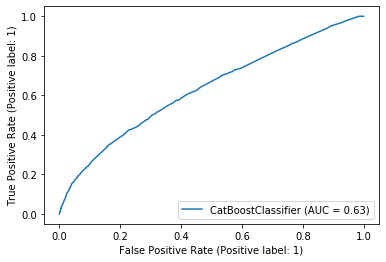

In [10]:
#RocCurveDisplay.from_estimator(model, X_test, y_test)
metrics.plot_roc_curve(model, X_test, y_test)

In [11]:
#Roc Auc score
print(roc_auc_score(y_test,model.predict(X_test)))

0.5022168803283439


In [12]:
print(average_precision_score(y_test,model.predict(X_test)))

0.08918850114701243


In [13]:
print(average_precision_score(y_test,model.predict(X_test)))

0.08918850114701243


In [14]:
predictions = model.predict(X_valid.iloc[:10, :])

print(np.exp(y_valid[:10]))
print([int(np.exp(pred)) for pred in predictions])

40000    1.0
40001    1.0
40002    1.0
40003    1.0
40004    1.0
40005    1.0
40006    1.0
40007    1.0
40008    1.0
40009    1.0
Name: readmitted_within_30_days, dtype: float64
[1, 1, 1, 1, 1, 2, 1, 1, 1, 1]


In [15]:
model.tree_count_

10

In [16]:
### $\bullet$ Hyperparameter tuning

In [17]:
cv_dataset = Pool(data = X_train, label = y_train)

params = {
    "n_estimators": 500,
    "loss_function": "RMSE",
    "verbose": False,
}
scores = catboost.cv(
    cv_dataset,
    params,
    fold_count = 5, 
    plot = "True",
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Training on fold [0/5]

bestTest = 0.2784035563
bestIteration = 496

Training on fold [1/5]

bestTest = 0.2838321934
bestIteration = 460

Training on fold [2/5]

bestTest = 0.2775965172
bestIteration = 499

Training on fold [3/5]

bestTest = 0.2693915191
bestIteration = 422

Training on fold [4/5]

bestTest = 0.2837691696
bestIteration = 469



In [18]:
# resampled / balanced training sets

X_train_rus = pd.read_csv('data/X_train_rus.csv')
y_train_rus = pd.read_csv('data/y_train_rus.csv', squeeze=True)

X_train_ros = pd.read_csv('data/X_train_ros.csv')
y_train_ros = pd.read_csv('data/y_train_ros.csv', squeeze=True)

X_train_smote = pd.read_csv('data/X_train_smote.csv')
y_train_smote = pd.read_csv('data/y_train_smote.csv', squeeze=True)

In [19]:
# Initialize CatBoostClassifier
model = CatBoostClassifier(iterations=10,
                           learning_rate=1,
                           depth=2,)


In [20]:
%time model.fit(X_train_rus, y_train_rus, eval_set = (X_valid, y_valid), plot = True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6733834	test: 0.6801841	best: 0.6801841 (0)	total: 2.89ms	remaining: 26ms
1:	learn: 0.6639078	test: 0.6698943	best: 0.6698943 (1)	total: 5.92ms	remaining: 23.7ms
2:	learn: 0.6603310	test: 0.6694024	best: 0.6694024 (2)	total: 8.2ms	remaining: 19.1ms
3:	learn: 0.6583347	test: 0.6697038	best: 0.6694024 (2)	total: 10.2ms	remaining: 15.3ms
4:	learn: 0.6567096	test: 0.6682913	best: 0.6682913 (4)	total: 11.8ms	remaining: 11.8ms
5:	learn: 0.6560492	test: 0.6681169	best: 0.6681169 (5)	total: 13.4ms	remaining: 8.92ms
6:	learn: 0.6548087	test: 0.6683700	best: 0.6681169 (5)	total: 14.7ms	remaining: 6.32ms
7:	learn: 0.6538154	test: 0.6679517	best: 0.6679517 (7)	total: 16.6ms	remaining: 4.14ms
8:	learn: 0.6526149	test: 0.6688961	best: 0.6679517 (7)	total: 18ms	remaining: 2ms
9:	learn: 0.6518104	test: 0.6691987	best: 0.6679517 (7)	total: 20.5ms	remaining: 0us

bestTest = 0.6679516745
bestIteration = 7

Shrink model to first 8 iterations.
CPU times: user 145 ms, sys: 38.4 ms, total: 183 ms

In [21]:
print(classification_report(y_test,model.predict(X_test)))

              precision    recall  f1-score   support

           0       0.94      0.69      0.79     16307
           1       0.14      0.51      0.22      1573

    accuracy                           0.67     17880
   macro avg       0.54      0.60      0.50     17880
weighted avg       0.87      0.67      0.74     17880



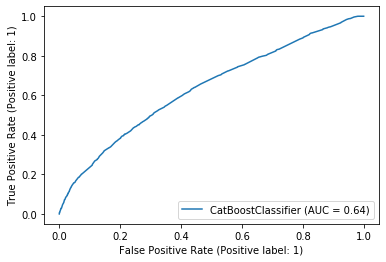

In [22]:
#RocCurveDisplay.from_estimator(model, X_test, y_test)
metrics.plot_roc_curve(model, X_test, y_test)

In [23]:
#Roc Auc score
print(roc_auc_score(y_test,model.predict(X_test)))

0.6000271686257069


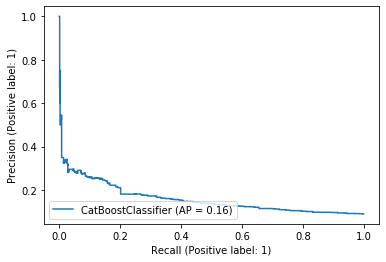

In [24]:
#Precision Recall Display Curve
PrecisionRecallDisplay.from_estimator(model, X_test, y_test)

In [25]:
print(average_precision_score(y_test,model.predict(X_test)))

0.11292033974643417


In [26]:
%time model.fit(X_train_ros, y_train_ros, eval_set = (X_valid, y_valid), plot = True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6757559	test: 0.6773524	best: 0.6773524 (0)	total: 7.75ms	remaining: 69.7ms
1:	learn: 0.6653028	test: 0.6679605	best: 0.6679605 (1)	total: 15.3ms	remaining: 61.3ms
2:	learn: 0.6625918	test: 0.6659325	best: 0.6659325 (2)	total: 22.2ms	remaining: 51.7ms
3:	learn: 0.6600988	test: 0.6653483	best: 0.6653483 (3)	total: 30.5ms	remaining: 45.7ms
4:	learn: 0.6587417	test: 0.6648627	best: 0.6648627 (4)	total: 37.3ms	remaining: 37.3ms
5:	learn: 0.6574278	test: 0.6631210	best: 0.6631210 (5)	total: 44.8ms	remaining: 29.9ms
6:	learn: 0.6560102	test: 0.6615525	best: 0.6615525 (6)	total: 51.8ms	remaining: 22.2ms
7:	learn: 0.6548370	test: 0.6608461	best: 0.6608461 (7)	total: 59ms	remaining: 14.8ms
8:	learn: 0.6536665	test: 0.6591220	best: 0.6591220 (8)	total: 66.2ms	remaining: 7.35ms
9:	learn: 0.6528920	test: 0.6584997	best: 0.6584997 (9)	total: 71.2ms	remaining: 0us

bestTest = 0.6584996691
bestIteration = 9

CPU times: user 834 ms, sys: 94.1 ms, total: 928 ms
Wall time: 271 ms


In [27]:
print(classification_report(y_test,model.predict(X_test)))

              precision    recall  f1-score   support

           0       0.94      0.69      0.79     16307
           1       0.14      0.53      0.22      1573

    accuracy                           0.67     17880
   macro avg       0.54      0.61      0.51     17880
weighted avg       0.87      0.67      0.74     17880



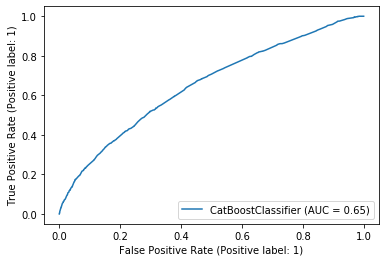

In [28]:
#RocCurveDisplay.from_estimator(model, X_test, y_test)
metrics.plot_roc_curve(model, X_test, y_test)

In [29]:
#Roc Auc score
print(roc_auc_score(y_test,model.predict_proba(X_test)))

0.6072961307300158


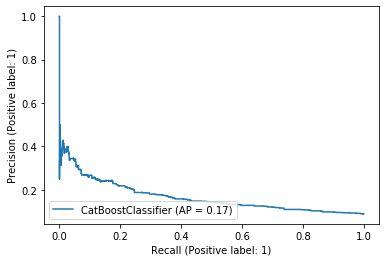

In [30]:
#Precision Recall Display Curve
PrecisionRecallDisplay.from_estimator(model, X_test, y_test)

In [31]:
print(average_precision_score(y_test,model.predict_proba(X_test)))

0.11540379363817838


In [32]:
%time model.fit(X_train_smote, y_train_smote, eval_set = (X_valid, y_valid), plot = True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6165645	test: 0.6391754	best: 0.6391754 (0)	total: 8.68ms	remaining: 78.1ms
1:	learn: 0.5725917	test: 0.5975862	best: 0.5975862 (1)	total: 14.8ms	remaining: 59.2ms
2:	learn: 0.5237768	test: 0.5583117	best: 0.5583117 (2)	total: 21.2ms	remaining: 49.6ms
3:	learn: 0.4981304	test: 0.5330477	best: 0.5330477 (3)	total: 30.6ms	remaining: 46ms
4:	learn: 0.4796818	test: 0.5249185	best: 0.5249185 (4)	total: 39.3ms	remaining: 39.3ms
5:	learn: 0.4594519	test: 0.5147866	best: 0.5147866 (5)	total: 46.7ms	remaining: 31.1ms
6:	learn: 0.4339030	test: 0.4886574	best: 0.4886574 (6)	total: 56.9ms	remaining: 24.4ms
7:	learn: 0.4217171	test: 0.4810308	best: 0.4810308 (7)	total: 64.2ms	remaining: 16.1ms
8:	learn: 0.4093179	test: 0.4744159	best: 0.4744159 (8)	total: 78.5ms	remaining: 8.72ms
9:	learn: 0.3870497	test: 0.4606510	best: 0.4606510 (9)	total: 86.8ms	remaining: 0us

bestTest = 0.4606510277
bestIteration = 9

CPU times: user 781 ms, sys: 91.5 ms, total: 873 ms
Wall time: 222 ms


In [33]:
print(classification_report(y_test,model.predict(X_test)))

              precision    recall  f1-score   support

           0       0.92      0.87      0.90     16307
           1       0.12      0.18      0.14      1573

    accuracy                           0.81     17880
   macro avg       0.52      0.53      0.52     17880
weighted avg       0.85      0.81      0.83     17880



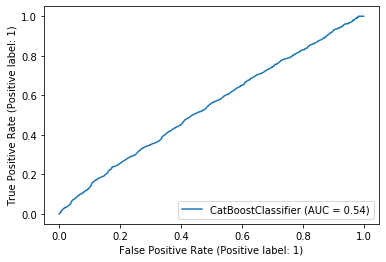

In [34]:
#RocCurveDisplay.from_estimator(model, X_test, y_test)
metrics.plot_roc_curve(model, X_test, y_test)

In [54]:
#Roc Auc score
print(roc_auc_score(y_test,model.predict(X_test)))

0.52572436900974


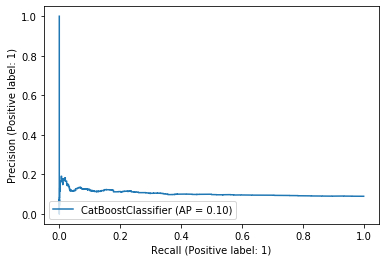

In [36]:
#Precision Recall Display Curve
PrecisionRecallDisplay.from_estimator(model, X_test, y_test)

In [37]:
print(average_precision_score(y_test,model.predict(X_test)))

0.09359558073271419


In [38]:
#Grid of parameters for cross-validation
#param_grid = [
#    {"iterations": 100,
#     "learning_rate",
#     "l2_leaf_reg",
#      "depth": 2,
#      "loss_function": "Logloss",
#     "border_count"
#    },
#]

param_grid = {'depth':[3,1,2,6],
          'iterations':[250,100,500],
          'learning_rate':[0.001,0.01,0.1,0.3], 
          'l2_leaf_reg':[3,1,5,10,50],
          'border_count':[32,5,100]}

In [39]:
#grid = GridSearchCV(
#    estimator = model, 
#    param_grid = param_grid, 
#    scoring = None, # uses estimator's default score method
#    refit = True, # keep a fitted version of the overall best model
#    cv = 5, 
#    return_train_score = True,
#    verbose = 2,
#    n_jobs = -1, 
#)

#%time grid.fit(X_train_smote, y_train_smote)

In [40]:
grid = RandomizedSearchCV(
    estimator = model, 
    n_iter = 100,
    param_distributions = param_grid, 
    scoring = None, # uses estimator's default score method
    refit = True, # keep a fitted version of the overall best model
    cv = 5, 
    return_train_score = True,
    verbose = 2,
    n_jobs = -1, 
)

%time grid.fit(X_train_smote, y_train_smote)

Fitting 5 folds for each of 100 candidates, totalling 500 fits
0:	learn: 0.6928681	total: 78.7ms	remaining: 7.79s
1:	learn: 0.6925754	total: 104ms	remaining: 5.09s
2:	learn: 0.6923075	total: 127ms	remaining: 4.11s
3:	learn: 0.6920364	total: 153ms	remaining: 3.68s
4:	learn: 0.6917548	total: 177ms	remaining: 3.37s
5:	learn: 0.6914796	total: 213ms	remaining: 3.34s
6:	learn: 0.6911916	total: 234ms	remaining: 3.1s
7:	learn: 0.6909210	total: 266ms	remaining: 3.06s
8:	learn: 0.6906446	total: 293ms	remaining: 2.96s
9:	learn: 0.6903662	total: 331ms	remaining: 2.98s
10:	learn: 0.6901038	total: 363ms	remaining: 2.93s
11:	learn: 0.6898098	total: 403ms	remaining: 2.96s
12:	learn: 0.6895477	total: 459ms	remaining: 3.08s
13:	learn: 0.6892677	total: 505ms	remaining: 3.1s
14:	learn: 0.6890108	total: 523ms	remaining: 2.96s
15:	learn: 0.6887378	total: 549ms	remaining: 2.88s
16:	learn: 0.6884487	total: 587ms	remaining: 2.87s
17:	learn: 0.6881878	total: 611ms	remaining: 2.78s
18:	learn: 0.6879150	total: 63

0:	learn: 0.6929342	total: 91.9ms	remaining: 9.1s
1:	learn: 0.6926932	total: 114ms	remaining: 5.58s
2:	learn: 0.6924597	total: 129ms	remaining: 4.16s
3:	learn: 0.6922433	total: 155ms	remaining: 3.71s
4:	learn: 0.6920050	total: 195ms	remaining: 3.7s
5:	learn: 0.6917758	total: 225ms	remaining: 3.53s
6:	learn: 0.6915704	total: 259ms	remaining: 3.44s
7:	learn: 0.6913227	total: 319ms	remaining: 3.67s
8:	learn: 0.6911078	total: 344ms	remaining: 3.48s
9:	learn: 0.6908989	total: 381ms	remaining: 3.43s
10:	learn: 0.6906744	total: 432ms	remaining: 3.5s
11:	learn: 0.6904320	total: 467ms	remaining: 3.42s
12:	learn: 0.6902258	total: 501ms	remaining: 3.35s
13:	learn: 0.6899917	total: 540ms	remaining: 3.31s
14:	learn: 0.6897742	total: 578ms	remaining: 3.27s
15:	learn: 0.6895634	total: 600ms	remaining: 3.15s
16:	learn: 0.6893371	total: 640ms	remaining: 3.13s
17:	learn: 0.6891098	total: 658ms	remaining: 3s
18:	learn: 0.6889015	total: 677ms	remaining: 2.89s
19:	learn: 0.6886760	total: 704ms	remaining: 2

0:	learn: 0.6716066	total: 86.6ms	remaining: 21.6s
1:	learn: 0.6544837	total: 112ms	remaining: 13.9s
2:	learn: 0.6379336	total: 135ms	remaining: 11.1s
3:	learn: 0.6257920	total: 179ms	remaining: 11s
4:	learn: 0.6137704	total: 202ms	remaining: 9.91s
5:	learn: 0.6045580	total: 232ms	remaining: 9.43s
6:	learn: 0.5904809	total: 262ms	remaining: 9.08s
7:	learn: 0.5830211	total: 309ms	remaining: 9.34s
8:	learn: 0.5769736	total: 354ms	remaining: 9.48s
9:	learn: 0.5709601	total: 380ms	remaining: 9.11s
10:	learn: 0.5594256	total: 432ms	remaining: 9.39s
11:	learn: 0.5544079	total: 454ms	remaining: 9s
12:	learn: 0.5434992	total: 476ms	remaining: 8.67s
13:	learn: 0.5349303	total: 514ms	remaining: 8.66s
14:	learn: 0.5259906	total: 571ms	remaining: 8.95s
15:	learn: 0.5192507	total: 594ms	remaining: 8.68s
16:	learn: 0.5145976	total: 633ms	remaining: 8.68s
17:	learn: 0.5104436	total: 659ms	remaining: 8.49s
18:	learn: 0.5066231	total: 707ms	remaining: 8.59s
19:	learn: 0.5014294	total: 738ms	remaining: 

39:	learn: 0.4196585	total: 1.45s	remaining: 7.6s
40:	learn: 0.4180195	total: 1.5s	remaining: 7.67s
41:	learn: 0.4164695	total: 1.55s	remaining: 7.69s
42:	learn: 0.4113231	total: 1.59s	remaining: 7.65s
43:	learn: 0.4099149	total: 1.63s	remaining: 7.64s
44:	learn: 0.4069094	total: 1.69s	remaining: 7.72s
45:	learn: 0.4039443	total: 1.73s	remaining: 7.66s
46:	learn: 0.4002771	total: 1.77s	remaining: 7.65s
47:	learn: 0.3990753	total: 1.8s	remaining: 7.56s
48:	learn: 0.3979050	total: 1.84s	remaining: 7.53s
49:	learn: 0.3950715	total: 1.87s	remaining: 7.48s
50:	learn: 0.3924831	total: 1.9s	remaining: 7.42s
51:	learn: 0.3912397	total: 1.93s	remaining: 7.35s
52:	learn: 0.3885621	total: 1.97s	remaining: 7.32s
53:	learn: 0.3874510	total: 1.99s	remaining: 7.24s
54:	learn: 0.3864384	total: 2.03s	remaining: 7.2s
55:	learn: 0.3845198	total: 2.05s	remaining: 7.1s
56:	learn: 0.3835823	total: 2.08s	remaining: 7.03s
57:	learn: 0.3826665	total: 2.09s	remaining: 6.93s
58:	learn: 0.3809081	total: 2.11s	rem

161:	learn: 0.3041595	total: 5.22s	remaining: 2.84s
162:	learn: 0.3037032	total: 5.24s	remaining: 2.8s
163:	learn: 0.3031598	total: 5.27s	remaining: 2.76s
164:	learn: 0.3029254	total: 5.29s	remaining: 2.73s
165:	learn: 0.3025988	total: 5.32s	remaining: 2.69s
166:	learn: 0.3023722	total: 5.36s	remaining: 2.66s
167:	learn: 0.3021845	total: 5.37s	remaining: 2.62s
168:	learn: 0.3019678	total: 5.39s	remaining: 2.59s
169:	learn: 0.3017442	total: 5.42s	remaining: 2.55s
170:	learn: 0.3015035	total: 5.45s	remaining: 2.52s
171:	learn: 0.3011323	total: 5.48s	remaining: 2.49s
172:	learn: 0.3008803	total: 5.52s	remaining: 2.46s
173:	learn: 0.3006510	total: 5.54s	remaining: 2.42s
174:	learn: 0.3003279	total: 5.56s	remaining: 2.38s
175:	learn: 0.2998831	total: 5.59s	remaining: 2.35s
176:	learn: 0.2996911	total: 5.61s	remaining: 2.31s
177:	learn: 0.2994752	total: 5.62s	remaining: 2.27s
178:	learn: 0.2992701	total: 5.66s	remaining: 2.24s
179:	learn: 0.2990694	total: 5.67s	remaining: 2.21s
180:	learn: 0

60:	learn: 0.6800948	total: 1.64s	remaining: 1.05s
61:	learn: 0.6798917	total: 1.65s	remaining: 1.01s
62:	learn: 0.6796987	total: 1.68s	remaining: 989ms
63:	learn: 0.6794918	total: 1.72s	remaining: 967ms
64:	learn: 0.6792993	total: 1.74s	remaining: 939ms
65:	learn: 0.6790832	total: 1.76s	remaining: 908ms
66:	learn: 0.6788866	total: 1.79s	remaining: 883ms
67:	learn: 0.6786933	total: 1.83s	remaining: 862ms
68:	learn: 0.6785002	total: 1.86s	remaining: 835ms
69:	learn: 0.6783079	total: 1.88s	remaining: 804ms
70:	learn: 0.6781026	total: 1.9s	remaining: 777ms
71:	learn: 0.6779092	total: 1.92s	remaining: 748ms
72:	learn: 0.6777054	total: 1.95s	remaining: 721ms
73:	learn: 0.6775123	total: 1.97s	remaining: 692ms
74:	learn: 0.6773152	total: 2s	remaining: 665ms
75:	learn: 0.6771232	total: 2.01s	remaining: 636ms
76:	learn: 0.6769371	total: 2.03s	remaining: 607ms
77:	learn: 0.6767428	total: 2.05s	remaining: 578ms
78:	learn: 0.6765616	total: 2.08s	remaining: 553ms
79:	learn: 0.6763672	total: 2.1s	re

161:	learn: 0.1625796	total: 5.54s	remaining: 3.01s
162:	learn: 0.1620724	total: 5.58s	remaining: 2.98s
163:	learn: 0.1615001	total: 5.59s	remaining: 2.93s
164:	learn: 0.1610797	total: 5.62s	remaining: 2.9s
165:	learn: 0.1605448	total: 5.64s	remaining: 2.85s
166:	learn: 0.1600990	total: 5.66s	remaining: 2.81s
167:	learn: 0.1597729	total: 5.69s	remaining: 2.78s
168:	learn: 0.1591540	total: 5.73s	remaining: 2.75s
169:	learn: 0.1586962	total: 5.75s	remaining: 2.71s
170:	learn: 0.1581643	total: 5.78s	remaining: 2.67s
171:	learn: 0.1577020	total: 5.8s	remaining: 2.63s
172:	learn: 0.1573020	total: 5.82s	remaining: 2.59s
173:	learn: 0.1568319	total: 5.84s	remaining: 2.55s
174:	learn: 0.1564263	total: 5.88s	remaining: 2.52s
175:	learn: 0.1560513	total: 5.9s	remaining: 2.48s
176:	learn: 0.1545698	total: 5.92s	remaining: 2.44s
177:	learn: 0.1542942	total: 5.97s	remaining: 2.42s
178:	learn: 0.1539279	total: 6s	remaining: 2.38s
179:	learn: 0.1535466	total: 6.04s	remaining: 2.35s
180:	learn: 0.1530

199:	learn: 0.2965118	total: 6.69s	remaining: 1.67s
200:	learn: 0.2962888	total: 6.73s	remaining: 1.64s
201:	learn: 0.2960823	total: 6.75s	remaining: 1.6s
202:	learn: 0.2958639	total: 6.77s	remaining: 1.57s
203:	learn: 0.2956529	total: 6.81s	remaining: 1.53s
204:	learn: 0.2952530	total: 6.9s	remaining: 1.51s
205:	learn: 0.2950881	total: 6.95s	remaining: 1.48s
206:	learn: 0.2949001	total: 6.97s	remaining: 1.45s
207:	learn: 0.2947044	total: 7.03s	remaining: 1.42s
208:	learn: 0.2945369	total: 7.07s	remaining: 1.39s
209:	learn: 0.2943695	total: 7.11s	remaining: 1.35s
210:	learn: 0.2941485	total: 7.13s	remaining: 1.32s
211:	learn: 0.2939555	total: 7.15s	remaining: 1.28s
212:	learn: 0.2936759	total: 7.17s	remaining: 1.25s
213:	learn: 0.2931438	total: 7.19s	remaining: 1.21s
214:	learn: 0.2925867	total: 7.23s	remaining: 1.18s
215:	learn: 0.2924116	total: 7.25s	remaining: 1.14s
216:	learn: 0.2923048	total: 7.27s	remaining: 1.1s
217:	learn: 0.2921330	total: 7.29s	remaining: 1.07s
218:	learn: 0.2

69:	learn: 0.4252831	total: 1.97s	remaining: 5.06s
70:	learn: 0.4239744	total: 1.98s	remaining: 4.99s
71:	learn: 0.4225030	total: 2.01s	remaining: 4.98s
72:	learn: 0.4211038	total: 2.04s	remaining: 4.96s
73:	learn: 0.4197383	total: 2.07s	remaining: 4.93s
74:	learn: 0.4185190	total: 2.08s	remaining: 4.86s
75:	learn: 0.4172544	total: 2.1s	remaining: 4.81s
76:	learn: 0.4161185	total: 2.13s	remaining: 4.79s
77:	learn: 0.4146148	total: 2.15s	remaining: 4.75s
78:	learn: 0.4133794	total: 2.17s	remaining: 4.7s
79:	learn: 0.4119965	total: 2.2s	remaining: 4.67s
80:	learn: 0.4108678	total: 2.22s	remaining: 4.63s
81:	learn: 0.4097774	total: 2.27s	remaining: 4.66s
82:	learn: 0.4085174	total: 2.29s	remaining: 4.62s
83:	learn: 0.4074128	total: 2.31s	remaining: 4.56s
84:	learn: 0.4064210	total: 2.32s	remaining: 4.51s
85:	learn: 0.4052212	total: 2.35s	remaining: 4.49s
86:	learn: 0.4042133	total: 2.39s	remaining: 4.47s
87:	learn: 0.4031399	total: 2.4s	remaining: 4.43s
88:	learn: 0.4020594	total: 2.42s	r

215:	learn: 0.3264394	total: 5.55s	remaining: 873ms
216:	learn: 0.3261813	total: 5.56s	remaining: 846ms
217:	learn: 0.3258424	total: 5.58s	remaining: 819ms
218:	learn: 0.3255107	total: 5.6s	remaining: 793ms
219:	learn: 0.3251419	total: 5.62s	remaining: 766ms
220:	learn: 0.3247833	total: 5.63s	remaining: 739ms
221:	learn: 0.3244709	total: 5.66s	remaining: 714ms
222:	learn: 0.3240152	total: 5.67s	remaining: 687ms
223:	learn: 0.3237167	total: 5.7s	remaining: 661ms
224:	learn: 0.3234470	total: 5.72s	remaining: 635ms
225:	learn: 0.3231573	total: 5.74s	remaining: 610ms
226:	learn: 0.3228796	total: 5.75s	remaining: 583ms
227:	learn: 0.3226091	total: 5.77s	remaining: 557ms
228:	learn: 0.3222602	total: 5.78s	remaining: 530ms
229:	learn: 0.3219106	total: 5.8s	remaining: 505ms
230:	learn: 0.3215832	total: 5.83s	remaining: 480ms
231:	learn: 0.3211640	total: 5.85s	remaining: 454ms
232:	learn: 0.3208229	total: 5.87s	remaining: 429ms
233:	learn: 0.3205483	total: 5.89s	remaining: 403ms
234:	learn: 0.3

69:	learn: 0.6783145	total: 1.96s	remaining: 840ms
70:	learn: 0.6781304	total: 1.99s	remaining: 815ms
71:	learn: 0.6779276	total: 2.03s	remaining: 789ms
72:	learn: 0.6777305	total: 2.05s	remaining: 759ms
73:	learn: 0.6775272	total: 2.08s	remaining: 732ms
74:	learn: 0.6773418	total: 2.11s	remaining: 702ms
75:	learn: 0.6771460	total: 2.12s	remaining: 671ms
76:	learn: 0.6769504	total: 2.15s	remaining: 642ms
77:	learn: 0.6767708	total: 2.18s	remaining: 615ms
78:	learn: 0.6765792	total: 2.22s	remaining: 591ms
79:	learn: 0.6763629	total: 2.25s	remaining: 561ms
80:	learn: 0.6761698	total: 2.27s	remaining: 533ms
81:	learn: 0.6759923	total: 2.3s	remaining: 506ms
82:	learn: 0.6758006	total: 2.33s	remaining: 477ms
83:	learn: 0.6756002	total: 2.36s	remaining: 449ms
84:	learn: 0.6754240	total: 2.38s	remaining: 421ms
85:	learn: 0.6752212	total: 2.4s	remaining: 391ms
86:	learn: 0.6750451	total: 2.44s	remaining: 365ms
87:	learn: 0.6748434	total: 2.49s	remaining: 339ms
88:	learn: 0.6746498	total: 2.51s

69:	learn: 0.6748910	total: 1.87s	remaining: 802ms
70:	learn: 0.6746572	total: 1.9s	remaining: 777ms
71:	learn: 0.6744051	total: 1.93s	remaining: 750ms
72:	learn: 0.6741803	total: 1.95s	remaining: 723ms
73:	learn: 0.6739148	total: 1.98s	remaining: 694ms
74:	learn: 0.6736820	total: 2s	remaining: 666ms
75:	learn: 0.6734525	total: 2.01s	remaining: 636ms
76:	learn: 0.6732120	total: 2.04s	remaining: 608ms
77:	learn: 0.6729760	total: 2.07s	remaining: 585ms
78:	learn: 0.6727315	total: 2.1s	remaining: 558ms
79:	learn: 0.6724919	total: 2.12s	remaining: 531ms
80:	learn: 0.6722565	total: 2.17s	remaining: 509ms
81:	learn: 0.6720286	total: 2.19s	remaining: 481ms
82:	learn: 0.6717889	total: 2.22s	remaining: 455ms
83:	learn: 0.6715605	total: 2.26s	remaining: 430ms
84:	learn: 0.6713254	total: 2.29s	remaining: 403ms
85:	learn: 0.6710862	total: 2.3s	remaining: 375ms
86:	learn: 0.6708510	total: 2.32s	remaining: 347ms
87:	learn: 0.6706257	total: 2.34s	remaining: 320ms
88:	learn: 0.6703940	total: 2.37s	rem

27:	learn: 0.3872822	total: 706ms	remaining: 11.9s
28:	learn: 0.3845375	total: 748ms	remaining: 12.2s
29:	learn: 0.3824559	total: 773ms	remaining: 12.1s
30:	learn: 0.3802466	total: 801ms	remaining: 12.1s
31:	learn: 0.3782404	total: 831ms	remaining: 12.1s
32:	learn: 0.3762691	total: 854ms	remaining: 12.1s
33:	learn: 0.3743506	total: 894ms	remaining: 12.3s
34:	learn: 0.3726353	total: 932ms	remaining: 12.4s
35:	learn: 0.3694674	total: 972ms	remaining: 12.5s
36:	learn: 0.3674993	total: 1.02s	remaining: 12.8s
37:	learn: 0.3655764	total: 1.05s	remaining: 12.7s
38:	learn: 0.3634008	total: 1.07s	remaining: 12.7s
39:	learn: 0.3613081	total: 1.1s	remaining: 12.7s
40:	learn: 0.3598786	total: 1.13s	remaining: 12.6s
41:	learn: 0.3586825	total: 1.15s	remaining: 12.5s
42:	learn: 0.3572074	total: 1.19s	remaining: 12.6s
43:	learn: 0.3558027	total: 1.24s	remaining: 12.9s
44:	learn: 0.3516857	total: 1.27s	remaining: 12.8s
45:	learn: 0.3502310	total: 1.29s	remaining: 12.7s
46:	learn: 0.3483339	total: 1.32

228:	learn: 0.3224704	total: 5.8s	remaining: 532ms
229:	learn: 0.3221711	total: 5.82s	remaining: 506ms
230:	learn: 0.3218230	total: 5.84s	remaining: 480ms
231:	learn: 0.3215551	total: 5.86s	remaining: 454ms
232:	learn: 0.3212544	total: 5.88s	remaining: 429ms
233:	learn: 0.3209200	total: 5.9s	remaining: 404ms
234:	learn: 0.3206083	total: 5.92s	remaining: 378ms
235:	learn: 0.3201992	total: 5.93s	remaining: 352ms
236:	learn: 0.3198820	total: 5.96s	remaining: 327ms
237:	learn: 0.3196097	total: 5.98s	remaining: 302ms
238:	learn: 0.3193315	total: 6.01s	remaining: 277ms
239:	learn: 0.3190807	total: 6.03s	remaining: 251ms
240:	learn: 0.3188417	total: 6.06s	remaining: 226ms
241:	learn: 0.3185340	total: 6.08s	remaining: 201ms
242:	learn: 0.3182238	total: 6.1s	remaining: 176ms
243:	learn: 0.3179279	total: 6.11s	remaining: 150ms
244:	learn: 0.3176252	total: 6.12s	remaining: 125ms
245:	learn: 0.3173308	total: 6.14s	remaining: 99.9ms
246:	learn: 0.3170777	total: 6.16s	remaining: 74.8ms
247:	learn: 0

26:	learn: 0.3944207	total: 673ms	remaining: 11.8s
27:	learn: 0.3916018	total: 699ms	remaining: 11.8s
28:	learn: 0.3890577	total: 726ms	remaining: 11.8s
29:	learn: 0.3870953	total: 751ms	remaining: 11.8s
30:	learn: 0.3851209	total: 774ms	remaining: 11.7s
31:	learn: 0.3811031	total: 798ms	remaining: 11.7s
32:	learn: 0.3788929	total: 817ms	remaining: 11.6s
33:	learn: 0.3769550	total: 843ms	remaining: 11.6s
34:	learn: 0.3752291	total: 879ms	remaining: 11.7s
35:	learn: 0.3732719	total: 899ms	remaining: 11.6s
36:	learn: 0.3713569	total: 932ms	remaining: 11.7s
37:	learn: 0.3697223	total: 964ms	remaining: 11.7s
38:	learn: 0.3679453	total: 994ms	remaining: 11.8s
39:	learn: 0.3665829	total: 1.03s	remaining: 11.9s
40:	learn: 0.3620054	total: 1.06s	remaining: 11.8s
41:	learn: 0.3605516	total: 1.08s	remaining: 11.7s
42:	learn: 0.3593305	total: 1.1s	remaining: 11.7s
43:	learn: 0.3572175	total: 1.12s	remaining: 11.6s
44:	learn: 0.3559511	total: 1.17s	remaining: 11.9s
45:	learn: 0.3544752	total: 1.23

228:	learn: 0.3233893	total: 5.54s	remaining: 508ms
229:	learn: 0.3231231	total: 5.56s	remaining: 483ms
230:	learn: 0.3228076	total: 5.58s	remaining: 459ms
231:	learn: 0.3224048	total: 5.6s	remaining: 434ms
232:	learn: 0.3221129	total: 5.61s	remaining: 409ms
233:	learn: 0.3216857	total: 5.63s	remaining: 385ms
234:	learn: 0.3214226	total: 5.67s	remaining: 362ms
235:	learn: 0.3211532	total: 5.7s	remaining: 338ms
236:	learn: 0.3208442	total: 5.74s	remaining: 315ms
237:	learn: 0.3205066	total: 5.77s	remaining: 291ms
238:	learn: 0.3202286	total: 5.79s	remaining: 267ms
239:	learn: 0.3199318	total: 5.82s	remaining: 243ms
240:	learn: 0.3196393	total: 5.85s	remaining: 218ms
241:	learn: 0.3193449	total: 5.87s	remaining: 194ms
242:	learn: 0.3191121	total: 5.88s	remaining: 169ms
243:	learn: 0.3188682	total: 5.91s	remaining: 145ms
244:	learn: 0.3186243	total: 5.93s	remaining: 121ms
245:	learn: 0.3183966	total: 5.95s	remaining: 96.8ms
246:	learn: 0.3181249	total: 5.97s	remaining: 72.5ms
247:	learn: 

128:	learn: 0.2845350	total: 3.83s	remaining: 11s
129:	learn: 0.2842108	total: 3.87s	remaining: 11s
130:	learn: 0.2839155	total: 3.88s	remaining: 10.9s
131:	learn: 0.2836200	total: 3.92s	remaining: 10.9s
132:	learn: 0.2834629	total: 3.94s	remaining: 10.9s
133:	learn: 0.2831957	total: 3.95s	remaining: 10.8s
134:	learn: 0.2828470	total: 3.99s	remaining: 10.8s
135:	learn: 0.2825993	total: 4.02s	remaining: 10.8s
136:	learn: 0.2823509	total: 4.05s	remaining: 10.7s
137:	learn: 0.2821252	total: 4.08s	remaining: 10.7s
138:	learn: 0.2820386	total: 4.11s	remaining: 10.7s
139:	learn: 0.2818024	total: 4.13s	remaining: 10.6s
140:	learn: 0.2808020	total: 4.15s	remaining: 10.6s
141:	learn: 0.2805353	total: 4.19s	remaining: 10.6s
142:	learn: 0.2802621	total: 4.21s	remaining: 10.5s
143:	learn: 0.2800241	total: 4.25s	remaining: 10.5s
144:	learn: 0.2798288	total: 4.3s	remaining: 10.5s
145:	learn: 0.2795741	total: 4.32s	remaining: 10.5s
146:	learn: 0.2784971	total: 4.35s	remaining: 10.4s
147:	learn: 0.278

27:	learn: 0.6443548	total: 748ms	remaining: 5.93s
28:	learn: 0.6427678	total: 772ms	remaining: 5.89s
29:	learn: 0.6415175	total: 794ms	remaining: 5.82s
30:	learn: 0.6402871	total: 825ms	remaining: 5.83s
31:	learn: 0.6390986	total: 842ms	remaining: 5.74s
32:	learn: 0.6379288	total: 869ms	remaining: 5.72s
33:	learn: 0.6367854	total: 886ms	remaining: 5.63s
34:	learn: 0.6352926	total: 914ms	remaining: 5.61s
35:	learn: 0.6341802	total: 936ms	remaining: 5.56s
36:	learn: 0.6327237	total: 975ms	remaining: 5.62s
37:	learn: 0.6317187	total: 997ms	remaining: 5.56s
38:	learn: 0.6299897	total: 1.02s	remaining: 5.53s
39:	learn: 0.6289506	total: 1.05s	remaining: 5.52s
40:	learn: 0.6279279	total: 1.07s	remaining: 5.47s
41:	learn: 0.6260560	total: 1.12s	remaining: 5.53s
42:	learn: 0.6242292	total: 1.15s	remaining: 5.53s
43:	learn: 0.6229033	total: 1.18s	remaining: 5.5s
44:	learn: 0.6207140	total: 1.2s	remaining: 5.46s
45:	learn: 0.6198026	total: 1.22s	remaining: 5.4s
46:	learn: 0.6185410	total: 1.26s	

187:	learn: 0.2685007	total: 5.24s	remaining: 8.7s
188:	learn: 0.2683527	total: 5.26s	remaining: 8.66s
189:	learn: 0.2682175	total: 5.28s	remaining: 8.62s
190:	learn: 0.2680511	total: 5.3s	remaining: 8.58s
191:	learn: 0.2678280	total: 5.32s	remaining: 8.54s
192:	learn: 0.2676457	total: 5.35s	remaining: 8.51s
193:	learn: 0.2676053	total: 5.38s	remaining: 8.49s
194:	learn: 0.2674620	total: 5.41s	remaining: 8.46s
195:	learn: 0.2673092	total: 5.43s	remaining: 8.43s
196:	learn: 0.2671967	total: 5.45s	remaining: 8.38s
197:	learn: 0.2670477	total: 5.5s	remaining: 8.39s
198:	learn: 0.2666197	total: 5.52s	remaining: 8.35s
199:	learn: 0.2664564	total: 5.54s	remaining: 8.31s
200:	learn: 0.2663290	total: 5.55s	remaining: 8.26s
201:	learn: 0.2661394	total: 5.59s	remaining: 8.25s
202:	learn: 0.2660210	total: 5.61s	remaining: 8.21s
203:	learn: 0.2659054	total: 5.64s	remaining: 8.19s
204:	learn: 0.2657692	total: 5.68s	remaining: 8.17s
205:	learn: 0.2656390	total: 5.69s	remaining: 8.13s
206:	learn: 0.2

187:	learn: 0.2686351	total: 5.45s	remaining: 9.04s
188:	learn: 0.2685044	total: 5.47s	remaining: 8.99s
189:	learn: 0.2683478	total: 5.49s	remaining: 8.96s
190:	learn: 0.2679372	total: 5.52s	remaining: 8.94s
191:	learn: 0.2677541	total: 5.54s	remaining: 8.89s
192:	learn: 0.2676406	total: 5.58s	remaining: 8.88s
193:	learn: 0.2674872	total: 5.62s	remaining: 8.86s
194:	learn: 0.2673505	total: 5.65s	remaining: 8.84s
195:	learn: 0.2672304	total: 5.69s	remaining: 8.82s
196:	learn: 0.2670860	total: 5.71s	remaining: 8.78s
197:	learn: 0.2669425	total: 5.74s	remaining: 8.75s
198:	learn: 0.2668411	total: 5.77s	remaining: 8.73s
199:	learn: 0.2666834	total: 5.81s	remaining: 8.72s
200:	learn: 0.2666633	total: 5.83s	remaining: 8.67s
201:	learn: 0.2665190	total: 5.85s	remaining: 8.63s
202:	learn: 0.2663706	total: 5.89s	remaining: 8.62s
203:	learn: 0.2661760	total: 5.91s	remaining: 8.58s
204:	learn: 0.2660827	total: 5.93s	remaining: 8.53s
205:	learn: 0.2659423	total: 5.96s	remaining: 8.51s
206:	learn: 

287:	learn: 0.0892362	total: 8.03s	remaining: 5.91s
288:	learn: 0.0892248	total: 8.05s	remaining: 5.88s
289:	learn: 0.0892147	total: 8.07s	remaining: 5.84s
290:	learn: 0.0890899	total: 8.09s	remaining: 5.81s
291:	learn: 0.0889878	total: 8.11s	remaining: 5.78s
292:	learn: 0.0888403	total: 8.13s	remaining: 5.75s
293:	learn: 0.0886823	total: 8.15s	remaining: 5.71s
294:	learn: 0.0886091	total: 8.16s	remaining: 5.67s
295:	learn: 0.0884988	total: 8.18s	remaining: 5.64s
296:	learn: 0.0883263	total: 8.2s	remaining: 5.61s
297:	learn: 0.0882902	total: 8.25s	remaining: 5.59s
298:	learn: 0.0882901	total: 8.26s	remaining: 5.55s
299:	learn: 0.0882900	total: 8.27s	remaining: 5.52s
300:	learn: 0.0882879	total: 8.29s	remaining: 5.48s
301:	learn: 0.0882875	total: 8.31s	remaining: 5.45s
302:	learn: 0.0882872	total: 8.33s	remaining: 5.42s
303:	learn: 0.0882856	total: 8.36s	remaining: 5.39s
304:	learn: 0.0882853	total: 8.37s	remaining: 5.35s
305:	learn: 0.0881433	total: 8.4s	remaining: 5.33s
306:	learn: 0.

186:	learn: 0.2698843	total: 5.33s	remaining: 8.93s
187:	learn: 0.2696727	total: 5.36s	remaining: 8.89s
188:	learn: 0.2694424	total: 5.39s	remaining: 8.87s
189:	learn: 0.2693091	total: 5.44s	remaining: 8.88s
190:	learn: 0.2686160	total: 5.49s	remaining: 8.88s
191:	learn: 0.2684638	total: 5.5s	remaining: 8.83s
192:	learn: 0.2683377	total: 5.53s	remaining: 8.79s
193:	learn: 0.2681956	total: 5.54s	remaining: 8.74s
194:	learn: 0.2680647	total: 5.58s	remaining: 8.73s
195:	learn: 0.2677965	total: 5.63s	remaining: 8.73s
196:	learn: 0.2676710	total: 5.66s	remaining: 8.71s
197:	learn: 0.2672174	total: 5.68s	remaining: 8.67s
198:	learn: 0.2671169	total: 5.71s	remaining: 8.64s
199:	learn: 0.2669797	total: 5.74s	remaining: 8.62s
200:	learn: 0.2669503	total: 5.76s	remaining: 8.57s
201:	learn: 0.2668304	total: 5.8s	remaining: 8.55s
202:	learn: 0.2667050	total: 5.83s	remaining: 8.54s
203:	learn: 0.2666130	total: 5.86s	remaining: 8.49s
204:	learn: 0.2665942	total: 5.87s	remaining: 8.45s
205:	learn: 0.

137:	learn: 0.5351120	total: 3.88s	remaining: 3.15s
138:	learn: 0.5341531	total: 3.89s	remaining: 3.11s
139:	learn: 0.5334117	total: 3.91s	remaining: 3.07s
140:	learn: 0.5325377	total: 3.93s	remaining: 3.04s
141:	learn: 0.5320534	total: 3.95s	remaining: 3s
142:	learn: 0.5312846	total: 3.99s	remaining: 2.98s
143:	learn: 0.5308246	total: 4.01s	remaining: 2.95s
144:	learn: 0.5299888	total: 4.04s	remaining: 2.93s
145:	learn: 0.5288142	total: 4.1s	remaining: 2.92s
146:	learn: 0.5283982	total: 4.11s	remaining: 2.88s
147:	learn: 0.5275636	total: 4.16s	remaining: 2.86s
148:	learn: 0.5269959	total: 4.17s	remaining: 2.83s
149:	learn: 0.5261088	total: 4.19s	remaining: 2.79s
150:	learn: 0.5256867	total: 4.22s	remaining: 2.77s
151:	learn: 0.5252624	total: 4.24s	remaining: 2.73s
152:	learn: 0.5247798	total: 4.29s	remaining: 2.72s
153:	learn: 0.5243620	total: 4.3s	remaining: 2.68s
154:	learn: 0.5238749	total: 4.34s	remaining: 2.66s
155:	learn: 0.5234630	total: 4.37s	remaining: 2.63s
156:	learn: 0.523

287:	learn: 0.2563846	total: 8.02s	remaining: 5.9s
288:	learn: 0.2563806	total: 8.04s	remaining: 5.87s
289:	learn: 0.2563028	total: 8.07s	remaining: 5.85s
290:	learn: 0.2562893	total: 8.12s	remaining: 5.83s
291:	learn: 0.2561880	total: 8.15s	remaining: 5.81s
292:	learn: 0.2561283	total: 8.18s	remaining: 5.78s
293:	learn: 0.2560693	total: 8.21s	remaining: 5.75s
294:	learn: 0.2559877	total: 8.24s	remaining: 5.72s
295:	learn: 0.2555323	total: 8.25s	remaining: 5.69s
296:	learn: 0.2554402	total: 8.27s	remaining: 5.65s
297:	learn: 0.2554355	total: 8.3s	remaining: 5.62s
298:	learn: 0.2554040	total: 8.32s	remaining: 5.59s
299:	learn: 0.2553814	total: 8.36s	remaining: 5.57s
300:	learn: 0.2553215	total: 8.38s	remaining: 5.54s
301:	learn: 0.2552424	total: 8.4s	remaining: 5.51s
302:	learn: 0.2551377	total: 8.43s	remaining: 5.48s
303:	learn: 0.2550555	total: 8.45s	remaining: 5.45s
304:	learn: 0.2549941	total: 8.47s	remaining: 5.42s
305:	learn: 0.2549878	total: 8.5s	remaining: 5.39s
306:	learn: 0.25

187:	learn: 0.5041477	total: 5.28s	remaining: 1.74s
188:	learn: 0.5038195	total: 5.31s	remaining: 1.71s
189:	learn: 0.5034459	total: 5.34s	remaining: 1.69s
190:	learn: 0.5026696	total: 5.37s	remaining: 1.66s
191:	learn: 0.5019328	total: 5.39s	remaining: 1.63s
192:	learn: 0.5015208	total: 5.41s	remaining: 1.6s
193:	learn: 0.5012004	total: 5.43s	remaining: 1.57s
194:	learn: 0.5005461	total: 5.47s	remaining: 1.54s
195:	learn: 0.4999897	total: 5.49s	remaining: 1.51s
196:	learn: 0.4992779	total: 5.51s	remaining: 1.48s
197:	learn: 0.4985579	total: 5.54s	remaining: 1.45s
198:	learn: 0.4978512	total: 5.57s	remaining: 1.43s
199:	learn: 0.4975627	total: 5.61s	remaining: 1.4s
200:	learn: 0.4967059	total: 5.64s	remaining: 1.37s
201:	learn: 0.4963939	total: 5.68s	remaining: 1.35s
202:	learn: 0.4960464	total: 5.7s	remaining: 1.32s
203:	learn: 0.4954208	total: 5.72s	remaining: 1.29s
204:	learn: 0.4950815	total: 5.76s	remaining: 1.26s
205:	learn: 0.4946474	total: 5.8s	remaining: 1.24s
206:	learn: 0.49

346:	learn: 0.2535442	total: 10.4s	remaining: 4.58s
347:	learn: 0.2535093	total: 10.4s	remaining: 4.55s
348:	learn: 0.2535073	total: 10.5s	remaining: 4.53s
349:	learn: 0.2534428	total: 10.5s	remaining: 4.5s
350:	learn: 0.2533869	total: 10.5s	remaining: 4.47s
351:	learn: 0.2533078	total: 10.6s	remaining: 4.45s
352:	learn: 0.2532371	total: 10.6s	remaining: 4.43s
353:	learn: 0.2532162	total: 10.7s	remaining: 4.42s
354:	learn: 0.2531198	total: 10.7s	remaining: 4.38s
355:	learn: 0.2530051	total: 10.8s	remaining: 4.36s
356:	learn: 0.2529515	total: 10.8s	remaining: 4.33s
357:	learn: 0.2528519	total: 10.8s	remaining: 4.3s
358:	learn: 0.2527938	total: 10.9s	remaining: 4.27s
359:	learn: 0.2527292	total: 10.9s	remaining: 4.24s
360:	learn: 0.2527247	total: 10.9s	remaining: 4.2s
361:	learn: 0.2527244	total: 10.9s	remaining: 4.17s
362:	learn: 0.2527101	total: 11s	remaining: 4.14s
363:	learn: 0.2526356	total: 11s	remaining: 4.11s
364:	learn: 0.2525761	total: 11s	remaining: 4.08s
365:	learn: 0.2525292

446:	learn: 0.0818754	total: 12.2s	remaining: 1.45s
447:	learn: 0.0818754	total: 12.2s	remaining: 1.42s
448:	learn: 0.0818752	total: 12.3s	remaining: 1.39s
449:	learn: 0.0818751	total: 12.3s	remaining: 1.36s
450:	learn: 0.0818072	total: 12.3s	remaining: 1.34s
451:	learn: 0.0817364	total: 12.3s	remaining: 1.31s
452:	learn: 0.0817206	total: 12.4s	remaining: 1.28s
453:	learn: 0.0816272	total: 12.4s	remaining: 1.25s
454:	learn: 0.0815295	total: 12.4s	remaining: 1.23s
455:	learn: 0.0815248	total: 12.4s	remaining: 1.2s
456:	learn: 0.0815244	total: 12.5s	remaining: 1.17s
457:	learn: 0.0815243	total: 12.5s	remaining: 1.14s
458:	learn: 0.0815242	total: 12.5s	remaining: 1.11s
459:	learn: 0.0815241	total: 12.5s	remaining: 1.09s
460:	learn: 0.0815242	total: 12.5s	remaining: 1.06s
461:	learn: 0.0814159	total: 12.5s	remaining: 1.03s
462:	learn: 0.0813356	total: 12.6s	remaining: 1s
463:	learn: 0.0813353	total: 12.6s	remaining: 976ms
464:	learn: 0.0813353	total: 12.6s	remaining: 950ms
465:	learn: 0.08

345:	learn: 0.2536797	total: 10.8s	remaining: 4.83s
346:	learn: 0.2536794	total: 10.9s	remaining: 4.79s
347:	learn: 0.2536155	total: 10.9s	remaining: 4.75s
348:	learn: 0.2535855	total: 10.9s	remaining: 4.72s
349:	learn: 0.2535163	total: 10.9s	remaining: 4.68s
350:	learn: 0.2535160	total: 11s	remaining: 4.65s
351:	learn: 0.2534331	total: 11s	remaining: 4.62s
352:	learn: 0.2533619	total: 11s	remaining: 4.58s
353:	learn: 0.2533120	total: 11s	remaining: 4.55s
354:	learn: 0.2532250	total: 11.1s	remaining: 4.51s
355:	learn: 0.2532250	total: 11.1s	remaining: 4.48s
356:	learn: 0.2532244	total: 11.1s	remaining: 4.44s
357:	learn: 0.2532218	total: 11.1s	remaining: 4.41s
358:	learn: 0.2531750	total: 11.1s	remaining: 4.38s
359:	learn: 0.2531173	total: 11.2s	remaining: 4.35s
360:	learn: 0.2530385	total: 11.2s	remaining: 4.32s
361:	learn: 0.2529722	total: 11.3s	remaining: 4.29s
362:	learn: 0.2529671	total: 11.3s	remaining: 4.25s
363:	learn: 0.2529068	total: 11.3s	remaining: 4.23s
364:	learn: 0.252872

44:	learn: 0.2246187	total: 1.39s	remaining: 1.7s
45:	learn: 0.2220130	total: 1.44s	remaining: 1.69s
46:	learn: 0.2199805	total: 1.47s	remaining: 1.66s
47:	learn: 0.2154551	total: 1.5s	remaining: 1.63s
48:	learn: 0.2111116	total: 1.53s	remaining: 1.59s
49:	learn: 0.2094812	total: 1.58s	remaining: 1.58s
50:	learn: 0.2072644	total: 1.61s	remaining: 1.55s
51:	learn: 0.2054421	total: 1.63s	remaining: 1.51s
52:	learn: 0.2021412	total: 1.66s	remaining: 1.47s
53:	learn: 0.2002981	total: 1.69s	remaining: 1.44s
54:	learn: 0.1985148	total: 1.71s	remaining: 1.4s
55:	learn: 0.1969164	total: 1.75s	remaining: 1.37s
56:	learn: 0.1946276	total: 1.76s	remaining: 1.33s
57:	learn: 0.1926481	total: 1.79s	remaining: 1.3s
58:	learn: 0.1906283	total: 1.81s	remaining: 1.25s
59:	learn: 0.1887762	total: 1.82s	remaining: 1.22s
60:	learn: 0.1875026	total: 1.86s	remaining: 1.19s
61:	learn: 0.1858817	total: 1.88s	remaining: 1.15s
62:	learn: 0.1840410	total: 1.91s	remaining: 1.12s
63:	learn: 0.1824111	total: 1.94s	r

446:	learn: 0.2475922	total: 13s	remaining: 1.54s
447:	learn: 0.2475508	total: 13s	remaining: 1.51s
448:	learn: 0.2475438	total: 13s	remaining: 1.48s
449:	learn: 0.2475405	total: 13.1s	remaining: 1.45s
450:	learn: 0.2474838	total: 13.1s	remaining: 1.42s
451:	learn: 0.2474397	total: 13.1s	remaining: 1.4s
452:	learn: 0.2474395	total: 13.2s	remaining: 1.36s
453:	learn: 0.2473849	total: 13.2s	remaining: 1.34s
454:	learn: 0.2473410	total: 13.2s	remaining: 1.31s
455:	learn: 0.2473408	total: 13.3s	remaining: 1.28s
456:	learn: 0.2473038	total: 13.3s	remaining: 1.25s
457:	learn: 0.2472595	total: 13.3s	remaining: 1.22s
458:	learn: 0.2472299	total: 13.3s	remaining: 1.19s
459:	learn: 0.2471552	total: 13.4s	remaining: 1.16s
460:	learn: 0.2471137	total: 13.4s	remaining: 1.13s
461:	learn: 0.2470735	total: 13.4s	remaining: 1.1s
462:	learn: 0.2470701	total: 13.4s	remaining: 1.07s
463:	learn: 0.2470275	total: 13.5s	remaining: 1.04s
464:	learn: 0.2469823	total: 13.5s	remaining: 1.02s
465:	learn: 0.246940

96:	learn: 0.5697112	total: 3.53s	remaining: 5.57s
97:	learn: 0.5685184	total: 3.58s	remaining: 5.54s
98:	learn: 0.5673512	total: 3.6s	remaining: 5.49s
99:	learn: 0.5667592	total: 3.67s	remaining: 5.5s
100:	learn: 0.5660713	total: 3.72s	remaining: 5.49s
101:	learn: 0.5649381	total: 3.75s	remaining: 5.44s
102:	learn: 0.5643159	total: 3.78s	remaining: 5.4s
103:	learn: 0.5633754	total: 3.84s	remaining: 5.39s
104:	learn: 0.5627678	total: 3.86s	remaining: 5.33s
105:	learn: 0.5622051	total: 3.89s	remaining: 5.29s
106:	learn: 0.5616691	total: 3.91s	remaining: 5.23s
107:	learn: 0.5611107	total: 3.94s	remaining: 5.18s
108:	learn: 0.5606264	total: 3.97s	remaining: 5.14s
109:	learn: 0.5590885	total: 4.01s	remaining: 5.11s
110:	learn: 0.5580013	total: 4.1s	remaining: 5.13s
111:	learn: 0.5566142	total: 4.14s	remaining: 5.1s
112:	learn: 0.5548269	total: 4.19s	remaining: 5.08s
113:	learn: 0.5543152	total: 4.22s	remaining: 5.04s
114:	learn: 0.5538401	total: 4.25s	remaining: 5s
115:	learn: 0.5527857	to

3:	learn: 0.6643132	total: 79.1ms	remaining: 1.9s
4:	learn: 0.6593560	total: 112ms	remaining: 2.12s
5:	learn: 0.6551394	total: 144ms	remaining: 2.25s
6:	learn: 0.6510136	total: 166ms	remaining: 2.21s
7:	learn: 0.6467152	total: 187ms	remaining: 2.15s
8:	learn: 0.6424258	total: 242ms	remaining: 2.45s
9:	learn: 0.6385933	total: 257ms	remaining: 2.31s
10:	learn: 0.6346349	total: 295ms	remaining: 2.39s
11:	learn: 0.6310604	total: 325ms	remaining: 2.39s
12:	learn: 0.6270343	total: 355ms	remaining: 2.37s
13:	learn: 0.6233638	total: 388ms	remaining: 2.38s
14:	learn: 0.6193727	total: 408ms	remaining: 2.31s
15:	learn: 0.6158764	total: 428ms	remaining: 2.25s
16:	learn: 0.6123812	total: 463ms	remaining: 2.26s
17:	learn: 0.6090224	total: 494ms	remaining: 2.25s
18:	learn: 0.6058692	total: 507ms	remaining: 2.16s
19:	learn: 0.6025055	total: 599ms	remaining: 2.39s
20:	learn: 0.5995222	total: 631ms	remaining: 2.37s
21:	learn: 0.5961956	total: 660ms	remaining: 2.34s
22:	learn: 0.5930881	total: 690ms	rema

3:	learn: 0.5892793	total: 148ms	remaining: 3.56s
4:	learn: 0.5764084	total: 180ms	remaining: 3.42s
5:	learn: 0.5652464	total: 216ms	remaining: 3.38s
6:	learn: 0.5542569	total: 256ms	remaining: 3.4s
7:	learn: 0.5427748	total: 274ms	remaining: 3.15s
8:	learn: 0.5255194	total: 309ms	remaining: 3.12s
9:	learn: 0.5154835	total: 336ms	remaining: 3.03s
10:	learn: 0.5076926	total: 391ms	remaining: 3.16s
11:	learn: 0.4998571	total: 450ms	remaining: 3.3s
12:	learn: 0.4931622	total: 474ms	remaining: 3.17s
13:	learn: 0.4858431	total: 509ms	remaining: 3.13s
14:	learn: 0.4776472	total: 529ms	remaining: 3s
15:	learn: 0.4720924	total: 550ms	remaining: 2.88s
16:	learn: 0.4674455	total: 583ms	remaining: 2.85s
17:	learn: 0.4535342	total: 618ms	remaining: 2.81s
18:	learn: 0.4487679	total: 645ms	remaining: 2.75s
19:	learn: 0.4443871	total: 668ms	remaining: 2.67s
20:	learn: 0.4376825	total: 688ms	remaining: 2.59s
21:	learn: 0.4339788	total: 713ms	remaining: 2.53s
22:	learn: 0.4199707	total: 812ms	remaining

2:	learn: 0.6726561	total: 85.4ms	remaining: 2.76s
3:	learn: 0.6682533	total: 136ms	remaining: 3.26s
4:	learn: 0.6643779	total: 176ms	remaining: 3.34s
5:	learn: 0.6610262	total: 224ms	remaining: 3.51s
6:	learn: 0.6580024	total: 240ms	remaining: 3.19s
7:	learn: 0.6546592	total: 283ms	remaining: 3.26s
8:	learn: 0.6516334	total: 331ms	remaining: 3.35s
9:	learn: 0.6485033	total: 356ms	remaining: 3.21s
10:	learn: 0.6457000	total: 383ms	remaining: 3.1s
11:	learn: 0.6430612	total: 401ms	remaining: 2.94s
12:	learn: 0.6401309	total: 439ms	remaining: 2.94s
13:	learn: 0.6374957	total: 457ms	remaining: 2.81s
14:	learn: 0.6348626	total: 490ms	remaining: 2.78s
15:	learn: 0.6322824	total: 511ms	remaining: 2.68s
16:	learn: 0.6300606	total: 543ms	remaining: 2.65s
17:	learn: 0.6274533	total: 589ms	remaining: 2.68s
18:	learn: 0.6249536	total: 627ms	remaining: 2.67s
19:	learn: 0.6225273	total: 652ms	remaining: 2.61s
20:	learn: 0.6203427	total: 691ms	remaining: 2.6s
21:	learn: 0.6180304	total: 722ms	remain

2:	learn: 0.6731197	total: 52.1ms	remaining: 1.69s
3:	learn: 0.6688150	total: 68ms	remaining: 1.63s
4:	learn: 0.6649466	total: 83.6ms	remaining: 1.59s
5:	learn: 0.6616715	total: 99.8ms	remaining: 1.56s
6:	learn: 0.6583760	total: 121ms	remaining: 1.61s
7:	learn: 0.6553719	total: 139ms	remaining: 1.6s
8:	learn: 0.6520660	total: 189ms	remaining: 1.91s
9:	learn: 0.6490616	total: 221ms	remaining: 1.99s
10:	learn: 0.6461722	total: 237ms	remaining: 1.92s
11:	learn: 0.6433516	total: 267ms	remaining: 1.96s
12:	learn: 0.6407766	total: 283ms	remaining: 1.89s
13:	learn: 0.6379234	total: 295ms	remaining: 1.81s
14:	learn: 0.6353663	total: 312ms	remaining: 1.76s
15:	learn: 0.6326686	total: 325ms	remaining: 1.71s
16:	learn: 0.6302756	total: 340ms	remaining: 1.66s
17:	learn: 0.6277473	total: 355ms	remaining: 1.62s
18:	learn: 0.6253300	total: 372ms	remaining: 1.58s
19:	learn: 0.6231763	total: 399ms	remaining: 1.6s
20:	learn: 0.6210795	total: 419ms	remaining: 1.57s
21:	learn: 0.6188274	total: 431ms	remai

3:	learn: 0.6686343	total: 113ms	remaining: 2.71s
4:	learn: 0.6647051	total: 134ms	remaining: 2.54s
5:	learn: 0.6613947	total: 162ms	remaining: 2.54s
6:	learn: 0.6580317	total: 194ms	remaining: 2.58s
7:	learn: 0.6549107	total: 227ms	remaining: 2.61s
8:	learn: 0.6520369	total: 252ms	remaining: 2.54s
9:	learn: 0.6490231	total: 283ms	remaining: 2.55s
10:	learn: 0.6457801	total: 302ms	remaining: 2.44s
11:	learn: 0.6429603	total: 320ms	remaining: 2.35s
12:	learn: 0.6402939	total: 340ms	remaining: 2.28s
13:	learn: 0.6373991	total: 358ms	remaining: 2.2s
14:	learn: 0.6348547	total: 379ms	remaining: 2.15s
15:	learn: 0.6323057	total: 396ms	remaining: 2.08s
16:	learn: 0.6295734	total: 419ms	remaining: 2.04s
17:	learn: 0.6273431	total: 434ms	remaining: 1.98s
18:	learn: 0.6250165	total: 451ms	remaining: 1.92s
19:	learn: 0.6230125	total: 470ms	remaining: 1.88s
20:	learn: 0.6209424	total: 488ms	remaining: 1.84s
21:	learn: 0.6188072	total: 507ms	remaining: 1.8s
22:	learn: 0.6166021	total: 522ms	remain

3:	learn: 0.6925339	total: 142ms	remaining: 8.74s
4:	learn: 0.6923888	total: 192ms	remaining: 9.42s
5:	learn: 0.6922232	total: 252ms	remaining: 10.2s
6:	learn: 0.6920848	total: 271ms	remaining: 9.42s
7:	learn: 0.6919331	total: 297ms	remaining: 8.99s
8:	learn: 0.6917710	total: 323ms	remaining: 8.64s
9:	learn: 0.6916282	total: 348ms	remaining: 8.36s
10:	learn: 0.6914825	total: 362ms	remaining: 7.86s
11:	learn: 0.6913171	total: 382ms	remaining: 7.58s
12:	learn: 0.6911786	total: 410ms	remaining: 7.48s
13:	learn: 0.6910333	total: 429ms	remaining: 7.23s
14:	learn: 0.6908808	total: 450ms	remaining: 7.05s
15:	learn: 0.6907165	total: 465ms	remaining: 6.8s
16:	learn: 0.6905808	total: 490ms	remaining: 6.72s
17:	learn: 0.6904287	total: 513ms	remaining: 6.61s
18:	learn: 0.6902704	total: 528ms	remaining: 6.42s
19:	learn: 0.6901300	total: 549ms	remaining: 6.31s
20:	learn: 0.6899876	total: 573ms	remaining: 6.24s
21:	learn: 0.6898340	total: 598ms	remaining: 6.19s
22:	learn: 0.6897017	total: 622ms	remai

63:	learn: 0.6840449	total: 1.99s	remaining: 5.78s
64:	learn: 0.6839175	total: 2s	remaining: 5.7s
65:	learn: 0.6837781	total: 2.03s	remaining: 5.67s
66:	learn: 0.6836388	total: 2.05s	remaining: 5.61s
67:	learn: 0.6834993	total: 2.08s	remaining: 5.56s
68:	learn: 0.6833797	total: 2.1s	remaining: 5.52s
69:	learn: 0.6832487	total: 2.13s	remaining: 5.49s
70:	learn: 0.6831271	total: 2.15s	remaining: 5.43s
71:	learn: 0.6829929	total: 2.19s	remaining: 5.42s
72:	learn: 0.6828425	total: 2.24s	remaining: 5.42s
73:	learn: 0.6827207	total: 2.26s	remaining: 5.38s
74:	learn: 0.6825845	total: 2.29s	remaining: 5.35s
75:	learn: 0.6824671	total: 2.31s	remaining: 5.28s
76:	learn: 0.6823337	total: 2.33s	remaining: 5.23s
77:	learn: 0.6822037	total: 2.35s	remaining: 5.17s
78:	learn: 0.6820964	total: 2.37s	remaining: 5.14s
79:	learn: 0.6819499	total: 2.39s	remaining: 5.08s
80:	learn: 0.6818345	total: 2.41s	remaining: 5.02s
81:	learn: 0.6816833	total: 2.43s	remaining: 4.98s
82:	learn: 0.6815610	total: 2.45s	re

63:	learn: 0.6840135	total: 2.2s	remaining: 6.39s
64:	learn: 0.6838644	total: 2.23s	remaining: 6.34s
65:	learn: 0.6837233	total: 2.26s	remaining: 6.31s
66:	learn: 0.6835976	total: 2.31s	remaining: 6.3s
67:	learn: 0.6834656	total: 2.32s	remaining: 6.22s
68:	learn: 0.6833354	total: 2.37s	remaining: 6.21s
69:	learn: 0.6832105	total: 2.38s	remaining: 6.13s
70:	learn: 0.6830616	total: 2.41s	remaining: 6.07s
71:	learn: 0.6829346	total: 2.43s	remaining: 6s
72:	learn: 0.6828085	total: 2.48s	remaining: 6.02s
73:	learn: 0.6826724	total: 2.51s	remaining: 5.98s
74:	learn: 0.6825503	total: 2.55s	remaining: 5.95s
75:	learn: 0.6824141	total: 2.57s	remaining: 5.89s
76:	learn: 0.6822921	total: 2.6s	remaining: 5.84s
77:	learn: 0.6821604	total: 2.63s	remaining: 5.81s
78:	learn: 0.6820196	total: 2.65s	remaining: 5.74s
79:	learn: 0.6818906	total: 2.67s	remaining: 5.67s
80:	learn: 0.6817609	total: 2.69s	remaining: 5.61s
81:	learn: 0.6816350	total: 2.72s	remaining: 5.58s
82:	learn: 0.6815180	total: 2.78s	rem

62:	learn: 0.1392182	total: 2.16s	remaining: 6.4s
63:	learn: 0.1381756	total: 2.18s	remaining: 6.33s
64:	learn: 0.1362229	total: 2.2s	remaining: 6.27s
65:	learn: 0.1352947	total: 2.24s	remaining: 6.25s
66:	learn: 0.1344531	total: 2.27s	remaining: 6.19s
67:	learn: 0.1336977	total: 2.3s	remaining: 6.15s
68:	learn: 0.1329232	total: 2.32s	remaining: 6.09s
69:	learn: 0.1322333	total: 2.35s	remaining: 6.06s
70:	learn: 0.1305393	total: 2.38s	remaining: 6s
71:	learn: 0.1295316	total: 2.41s	remaining: 5.97s
72:	learn: 0.1289821	total: 2.44s	remaining: 5.91s
73:	learn: 0.1279485	total: 2.46s	remaining: 5.86s
74:	learn: 0.1276161	total: 2.48s	remaining: 5.79s
75:	learn: 0.1268993	total: 2.54s	remaining: 5.82s
76:	learn: 0.1261279	total: 2.57s	remaining: 5.78s
77:	learn: 0.1255059	total: 2.6s	remaining: 5.74s
78:	learn: 0.1240717	total: 2.63s	remaining: 5.69s
79:	learn: 0.1234092	total: 2.66s	remaining: 5.65s
80:	learn: 0.1226989	total: 2.68s	remaining: 5.6s
81:	learn: 0.1221052	total: 2.72s	remai

63:	learn: 0.2902842	total: 1.91s	remaining: 5.55s
64:	learn: 0.2898908	total: 1.94s	remaining: 5.52s
65:	learn: 0.2893186	total: 1.96s	remaining: 5.48s
66:	learn: 0.2874812	total: 1.99s	remaining: 5.44s
67:	learn: 0.2862825	total: 2.02s	remaining: 5.39s
68:	learn: 0.2857619	total: 2.04s	remaining: 5.35s
69:	learn: 0.2853184	total: 2.07s	remaining: 5.32s
70:	learn: 0.2849445	total: 2.1s	remaining: 5.29s
71:	learn: 0.2845095	total: 2.12s	remaining: 5.25s
72:	learn: 0.2836179	total: 2.15s	remaining: 5.21s
73:	learn: 0.2830553	total: 2.19s	remaining: 5.2s
74:	learn: 0.2826168	total: 2.24s	remaining: 5.22s
75:	learn: 0.2824406	total: 2.29s	remaining: 5.25s
76:	learn: 0.2819261	total: 2.34s	remaining: 5.25s
77:	learn: 0.2814800	total: 2.39s	remaining: 5.26s
78:	learn: 0.2810646	total: 2.41s	remaining: 5.22s
79:	learn: 0.2807217	total: 2.44s	remaining: 5.19s
80:	learn: 0.2803471	total: 2.47s	remaining: 5.15s
81:	learn: 0.2794814	total: 2.51s	remaining: 5.14s
82:	learn: 0.2791527	total: 2.54s

62:	learn: 0.2938150	total: 1.99s	remaining: 5.91s
63:	learn: 0.2922990	total: 2.01s	remaining: 5.84s
64:	learn: 0.2917169	total: 2.04s	remaining: 5.82s
65:	learn: 0.2909335	total: 2.07s	remaining: 5.78s
66:	learn: 0.2901332	total: 2.1s	remaining: 5.75s
67:	learn: 0.2897580	total: 2.14s	remaining: 5.73s
68:	learn: 0.2891719	total: 2.16s	remaining: 5.68s
69:	learn: 0.2885692	total: 2.21s	remaining: 5.67s
70:	learn: 0.2873666	total: 2.23s	remaining: 5.63s
71:	learn: 0.2869042	total: 2.25s	remaining: 5.58s
72:	learn: 0.2859959	total: 2.29s	remaining: 5.54s
73:	learn: 0.2853228	total: 2.31s	remaining: 5.5s
74:	learn: 0.2849224	total: 2.35s	remaining: 5.48s
75:	learn: 0.2845108	total: 2.39s	remaining: 5.47s
76:	learn: 0.2837866	total: 2.42s	remaining: 5.44s
77:	learn: 0.2834139	total: 2.44s	remaining: 5.39s
78:	learn: 0.2822960	total: 2.48s	remaining: 5.36s
79:	learn: 0.2817979	total: 2.5s	remaining: 5.32s
80:	learn: 0.2811423	total: 2.53s	remaining: 5.28s
81:	learn: 0.2807310	total: 2.57s	

164:	learn: 0.6716327	total: 4.53s	remaining: 2.33s
165:	learn: 0.6715269	total: 4.56s	remaining: 2.31s
166:	learn: 0.6714157	total: 4.58s	remaining: 2.28s
167:	learn: 0.6713088	total: 4.61s	remaining: 2.25s
168:	learn: 0.6712013	total: 4.63s	remaining: 2.22s
169:	learn: 0.6710838	total: 4.65s	remaining: 2.19s
170:	learn: 0.6709705	total: 4.68s	remaining: 2.16s
171:	learn: 0.6708654	total: 4.7s	remaining: 2.13s
172:	learn: 0.6707650	total: 4.73s	remaining: 2.11s
173:	learn: 0.6706575	total: 4.76s	remaining: 2.08s
174:	learn: 0.6705637	total: 4.78s	remaining: 2.05s
175:	learn: 0.6704558	total: 4.8s	remaining: 2.02s
176:	learn: 0.6703462	total: 4.82s	remaining: 1.99s
177:	learn: 0.6702426	total: 4.85s	remaining: 1.96s
178:	learn: 0.6701242	total: 4.88s	remaining: 1.94s
179:	learn: 0.6700197	total: 4.9s	remaining: 1.91s
180:	learn: 0.6699157	total: 4.92s	remaining: 1.88s
181:	learn: 0.6698107	total: 4.94s	remaining: 1.85s
182:	learn: 0.6697077	total: 4.98s	remaining: 1.82s
183:	learn: 0.6

222:	learn: 0.6660235	total: 6.15s	remaining: 744ms
223:	learn: 0.6659247	total: 6.17s	remaining: 716ms
224:	learn: 0.6658309	total: 6.19s	remaining: 688ms
225:	learn: 0.6657422	total: 6.21s	remaining: 660ms
226:	learn: 0.6656441	total: 6.25s	remaining: 633ms
227:	learn: 0.6655485	total: 6.27s	remaining: 605ms
228:	learn: 0.6654550	total: 6.29s	remaining: 577ms
229:	learn: 0.6653607	total: 6.31s	remaining: 549ms
230:	learn: 0.6652601	total: 6.35s	remaining: 523ms
231:	learn: 0.6651896	total: 6.37s	remaining: 494ms
232:	learn: 0.6650853	total: 6.39s	remaining: 466ms
233:	learn: 0.6649876	total: 6.4s	remaining: 438ms
234:	learn: 0.6648984	total: 6.43s	remaining: 411ms
235:	learn: 0.6648001	total: 6.46s	remaining: 383ms
236:	learn: 0.6647081	total: 6.48s	remaining: 356ms
237:	learn: 0.6646142	total: 6.5s	remaining: 328ms
238:	learn: 0.6645176	total: 6.53s	remaining: 301ms
239:	learn: 0.6644356	total: 6.57s	remaining: 274ms
240:	learn: 0.6643385	total: 6.58s	remaining: 246ms
241:	learn: 0.

222:	learn: 0.6658881	total: 6.56s	remaining: 794ms
223:	learn: 0.6657903	total: 6.58s	remaining: 764ms
224:	learn: 0.6656964	total: 6.61s	remaining: 734ms
225:	learn: 0.6656040	total: 6.63s	remaining: 704ms
226:	learn: 0.6655030	total: 6.64s	remaining: 673ms
227:	learn: 0.6654180	total: 6.67s	remaining: 643ms
228:	learn: 0.6653245	total: 6.69s	remaining: 613ms
229:	learn: 0.6652286	total: 6.71s	remaining: 584ms
230:	learn: 0.6651279	total: 6.74s	remaining: 554ms
231:	learn: 0.6650366	total: 6.76s	remaining: 524ms
232:	learn: 0.6649410	total: 6.78s	remaining: 495ms
233:	learn: 0.6648461	total: 6.8s	remaining: 465ms
234:	learn: 0.6647476	total: 6.82s	remaining: 435ms
235:	learn: 0.6646552	total: 6.84s	remaining: 406ms
236:	learn: 0.6645626	total: 6.87s	remaining: 377ms
237:	learn: 0.6644685	total: 6.89s	remaining: 347ms
238:	learn: 0.6643856	total: 6.92s	remaining: 319ms
239:	learn: 0.6642901	total: 6.94s	remaining: 289ms
240:	learn: 0.6641854	total: 6.96s	remaining: 260ms
241:	learn: 0

222:	learn: 0.6657591	total: 6.43s	remaining: 779ms
223:	learn: 0.6656648	total: 6.47s	remaining: 751ms
224:	learn: 0.6655678	total: 6.49s	remaining: 721ms
225:	learn: 0.6654593	total: 6.51s	remaining: 692ms
226:	learn: 0.6653628	total: 6.54s	remaining: 663ms
227:	learn: 0.6652701	total: 6.58s	remaining: 635ms
228:	learn: 0.6651816	total: 6.62s	remaining: 607ms
229:	learn: 0.6650799	total: 6.64s	remaining: 577ms
230:	learn: 0.6649828	total: 6.66s	remaining: 548ms
231:	learn: 0.6648956	total: 6.7s	remaining: 520ms
232:	learn: 0.6648010	total: 6.71s	remaining: 490ms
233:	learn: 0.6646980	total: 6.74s	remaining: 461ms
234:	learn: 0.6646075	total: 6.76s	remaining: 432ms
235:	learn: 0.6645071	total: 6.78s	remaining: 402ms
236:	learn: 0.6644236	total: 6.8s	remaining: 373ms
237:	learn: 0.6643294	total: 6.82s	remaining: 344ms
238:	learn: 0.6642286	total: 6.84s	remaining: 315ms
239:	learn: 0.6641331	total: 6.87s	remaining: 286ms
240:	learn: 0.6640412	total: 6.89s	remaining: 257ms
241:	learn: 0.

222:	learn: 0.0831737	total: 7.21s	remaining: 874ms
223:	learn: 0.0831619	total: 7.25s	remaining: 841ms
224:	learn: 0.0831169	total: 7.27s	remaining: 808ms
225:	learn: 0.0829799	total: 7.3s	remaining: 776ms
226:	learn: 0.0828207	total: 7.33s	remaining: 743ms
227:	learn: 0.0828189	total: 7.36s	remaining: 710ms
228:	learn: 0.0828161	total: 7.37s	remaining: 676ms
229:	learn: 0.0828160	total: 7.39s	remaining: 642ms
230:	learn: 0.0826121	total: 7.42s	remaining: 611ms
231:	learn: 0.0825857	total: 7.44s	remaining: 577ms
232:	learn: 0.0823977	total: 7.49s	remaining: 546ms
233:	learn: 0.0823977	total: 7.53s	remaining: 515ms
234:	learn: 0.0822329	total: 7.56s	remaining: 482ms
235:	learn: 0.0822329	total: 7.57s	remaining: 449ms
236:	learn: 0.0822328	total: 7.59s	remaining: 416ms
237:	learn: 0.0822326	total: 7.63s	remaining: 385ms
238:	learn: 0.0822326	total: 7.67s	remaining: 353ms
239:	learn: 0.0822325	total: 7.69s	remaining: 320ms
240:	learn: 0.0822321	total: 7.71s	remaining: 288ms
241:	learn: 0

223:	learn: 0.2476219	total: 7.16s	remaining: 831ms
224:	learn: 0.2474610	total: 7.19s	remaining: 799ms
225:	learn: 0.2473118	total: 7.24s	remaining: 769ms
226:	learn: 0.2471341	total: 7.27s	remaining: 737ms
227:	learn: 0.2463327	total: 7.29s	remaining: 704ms
228:	learn: 0.2461831	total: 7.31s	remaining: 670ms
229:	learn: 0.2461733	total: 7.34s	remaining: 638ms
230:	learn: 0.2460453	total: 7.36s	remaining: 605ms
231:	learn: 0.2460421	total: 7.39s	remaining: 573ms
232:	learn: 0.2460418	total: 7.42s	remaining: 542ms
233:	learn: 0.2459360	total: 7.45s	remaining: 509ms
234:	learn: 0.2458234	total: 7.47s	remaining: 477ms
235:	learn: 0.2458229	total: 7.5s	remaining: 445ms
236:	learn: 0.2456705	total: 7.52s	remaining: 413ms
237:	learn: 0.2454995	total: 7.56s	remaining: 381ms
238:	learn: 0.2453677	total: 7.59s	remaining: 349ms
239:	learn: 0.2452861	total: 7.62s	remaining: 318ms
240:	learn: 0.2451868	total: 7.64s	remaining: 285ms
241:	learn: 0.2451109	total: 7.68s	remaining: 254ms
242:	learn: 0

60:	learn: 0.2912874	total: 1.95s	remaining: 6.05s
61:	learn: 0.2906946	total: 1.99s	remaining: 6.02s
62:	learn: 0.2902896	total: 2.01s	remaining: 5.97s
63:	learn: 0.2887965	total: 2.04s	remaining: 5.93s
64:	learn: 0.2883144	total: 2.06s	remaining: 5.87s
65:	learn: 0.2874475	total: 2.1s	remaining: 5.86s
66:	learn: 0.2867750	total: 2.12s	remaining: 5.8s
67:	learn: 0.2862746	total: 2.15s	remaining: 5.75s
68:	learn: 0.2856798	total: 2.17s	remaining: 5.7s
69:	learn: 0.2850827	total: 2.21s	remaining: 5.68s
70:	learn: 0.2845737	total: 2.23s	remaining: 5.62s
71:	learn: 0.2839051	total: 2.25s	remaining: 5.57s
72:	learn: 0.2834420	total: 2.28s	remaining: 5.53s
73:	learn: 0.2828434	total: 2.31s	remaining: 5.5s
74:	learn: 0.2823843	total: 2.34s	remaining: 5.46s
75:	learn: 0.2819133	total: 2.38s	remaining: 5.45s
76:	learn: 0.2814821	total: 2.41s	remaining: 5.42s
77:	learn: 0.2810471	total: 2.44s	remaining: 5.38s
78:	learn: 0.2806585	total: 2.49s	remaining: 5.38s
79:	learn: 0.2804032	total: 2.52s	r

72:	learn: 0.6828085	total: 2.21s	remaining: 819ms
73:	learn: 0.6826724	total: 2.25s	remaining: 792ms
74:	learn: 0.6825503	total: 2.29s	remaining: 762ms
75:	learn: 0.6824141	total: 2.31s	remaining: 730ms
76:	learn: 0.6822921	total: 2.33s	remaining: 698ms
77:	learn: 0.6821604	total: 2.35s	remaining: 663ms
78:	learn: 0.6820196	total: 2.37s	remaining: 629ms
79:	learn: 0.6818906	total: 2.39s	remaining: 598ms
80:	learn: 0.6817609	total: 2.42s	remaining: 568ms
81:	learn: 0.6816350	total: 2.46s	remaining: 541ms
82:	learn: 0.6815180	total: 2.51s	remaining: 514ms
83:	learn: 0.6813740	total: 2.57s	remaining: 490ms
84:	learn: 0.6812560	total: 2.62s	remaining: 463ms
85:	learn: 0.6811219	total: 2.64s	remaining: 431ms
86:	learn: 0.6809970	total: 2.68s	remaining: 400ms
87:	learn: 0.6808614	total: 2.7s	remaining: 369ms
88:	learn: 0.6807271	total: 2.72s	remaining: 337ms
89:	learn: 0.6806101	total: 2.75s	remaining: 306ms
90:	learn: 0.6804876	total: 2.77s	remaining: 274ms
91:	learn: 0.6803699	total: 2.8s

29:	learn: 0.6886975	total: 910ms	remaining: 6.67s
30:	learn: 0.6885562	total: 944ms	remaining: 6.67s
31:	learn: 0.6883950	total: 969ms	remaining: 6.6s
32:	learn: 0.6882559	total: 1.01s	remaining: 6.62s
33:	learn: 0.6881192	total: 1.02s	remaining: 6.51s
34:	learn: 0.6879617	total: 1.05s	remaining: 6.46s
35:	learn: 0.6878311	total: 1.07s	remaining: 6.38s
36:	learn: 0.6877007	total: 1.1s	remaining: 6.37s
37:	learn: 0.6875395	total: 1.13s	remaining: 6.31s
38:	learn: 0.6873881	total: 1.15s	remaining: 6.24s
39:	learn: 0.6872619	total: 1.17s	remaining: 6.16s
40:	learn: 0.6871313	total: 1.2s	remaining: 6.1s
41:	learn: 0.6869825	total: 1.24s	remaining: 6.13s
42:	learn: 0.6868428	total: 1.26s	remaining: 6.08s
43:	learn: 0.6867000	total: 1.29s	remaining: 6.04s
44:	learn: 0.6865571	total: 1.33s	remaining: 6.07s
45:	learn: 0.6864271	total: 1.36s	remaining: 6.05s
46:	learn: 0.6862845	total: 1.41s	remaining: 6.09s
47:	learn: 0.6861426	total: 1.45s	remaining: 6.12s
48:	learn: 0.6860017	total: 1.47s	r

131:	learn: 0.2615547	total: 4.46s	remaining: 3.99s
132:	learn: 0.2613338	total: 4.49s	remaining: 3.95s
133:	learn: 0.2612270	total: 4.51s	remaining: 3.9s
134:	learn: 0.2610607	total: 4.53s	remaining: 3.86s
135:	learn: 0.2610319	total: 4.56s	remaining: 3.83s
136:	learn: 0.2608421	total: 4.6s	remaining: 3.79s
137:	learn: 0.2605956	total: 4.62s	remaining: 3.75s
138:	learn: 0.2603799	total: 4.66s	remaining: 3.72s
139:	learn: 0.2602388	total: 4.68s	remaining: 3.68s
140:	learn: 0.2600820	total: 4.72s	remaining: 3.65s
141:	learn: 0.2600583	total: 4.75s	remaining: 3.61s
142:	learn: 0.2598865	total: 4.77s	remaining: 3.57s
143:	learn: 0.2596466	total: 4.8s	remaining: 3.54s
144:	learn: 0.2595092	total: 4.83s	remaining: 3.5s
145:	learn: 0.2593231	total: 4.86s	remaining: 3.46s
146:	learn: 0.2591732	total: 4.89s	remaining: 3.42s
147:	learn: 0.2591634	total: 4.93s	remaining: 3.4s
148:	learn: 0.2589241	total: 4.97s	remaining: 3.37s
149:	learn: 0.2587132	total: 4.99s	remaining: 3.33s
150:	learn: 0.258

132:	learn: 0.6717476	total: 3.58s	remaining: 3.15s
133:	learn: 0.6716122	total: 3.6s	remaining: 3.12s
134:	learn: 0.6714692	total: 3.62s	remaining: 3.08s
135:	learn: 0.6713403	total: 3.65s	remaining: 3.06s
136:	learn: 0.6711788	total: 3.67s	remaining: 3.03s
137:	learn: 0.6710550	total: 3.69s	remaining: 2.99s
138:	learn: 0.6709203	total: 3.71s	remaining: 2.96s
139:	learn: 0.6707802	total: 3.73s	remaining: 2.93s
140:	learn: 0.6706538	total: 3.75s	remaining: 2.9s
141:	learn: 0.6705066	total: 3.8s	remaining: 2.89s
142:	learn: 0.6703655	total: 3.82s	remaining: 2.86s
143:	learn: 0.6702286	total: 3.84s	remaining: 2.83s
144:	learn: 0.6700958	total: 3.86s	remaining: 2.79s
145:	learn: 0.6699658	total: 3.88s	remaining: 2.77s
146:	learn: 0.6698279	total: 3.91s	remaining: 2.74s
147:	learn: 0.6696950	total: 3.93s	remaining: 2.71s
148:	learn: 0.6695546	total: 3.96s	remaining: 2.68s
149:	learn: 0.6694165	total: 3.98s	remaining: 2.65s
150:	learn: 0.6692779	total: 4s	remaining: 2.63s
151:	learn: 0.6691

181:	learn: 0.2526293	total: 6.21s	remaining: 2.32s
182:	learn: 0.2525346	total: 6.24s	remaining: 2.28s
183:	learn: 0.2522991	total: 6.29s	remaining: 2.25s
184:	learn: 0.2521411	total: 6.31s	remaining: 2.22s
185:	learn: 0.2519688	total: 6.35s	remaining: 2.18s
186:	learn: 0.2519625	total: 6.38s	remaining: 2.15s
187:	learn: 0.2519314	total: 6.41s	remaining: 2.11s
188:	learn: 0.2518222	total: 6.43s	remaining: 2.07s
189:	learn: 0.2517424	total: 6.46s	remaining: 2.04s
190:	learn: 0.2516602	total: 6.49s	remaining: 2s
191:	learn: 0.2516541	total: 6.53s	remaining: 1.97s
192:	learn: 0.2515817	total: 6.55s	remaining: 1.94s
193:	learn: 0.2515176	total: 6.58s	remaining: 1.9s
194:	learn: 0.2515116	total: 6.6s	remaining: 1.86s
195:	learn: 0.2514068	total: 6.65s	remaining: 1.83s
196:	learn: 0.2514012	total: 6.68s	remaining: 1.8s
197:	learn: 0.2512845	total: 6.72s	remaining: 1.76s
198:	learn: 0.2511315	total: 6.74s	remaining: 1.73s
199:	learn: 0.2510163	total: 6.76s	remaining: 1.69s
200:	learn: 0.2510

29:	learn: 0.6886717	total: 890ms	remaining: 6.53s
30:	learn: 0.6885218	total: 917ms	remaining: 6.48s
31:	learn: 0.6883931	total: 959ms	remaining: 6.53s
32:	learn: 0.6882454	total: 978ms	remaining: 6.43s
33:	learn: 0.6880989	total: 1s	remaining: 6.37s
34:	learn: 0.6879511	total: 1.03s	remaining: 6.31s
35:	learn: 0.6878109	total: 1.06s	remaining: 6.31s
36:	learn: 0.6876746	total: 1.08s	remaining: 6.2s
37:	learn: 0.6875327	total: 1.1s	remaining: 6.17s
38:	learn: 0.6873882	total: 1.13s	remaining: 6.09s
39:	learn: 0.6872468	total: 1.15s	remaining: 6.03s
40:	learn: 0.6871137	total: 1.19s	remaining: 6.05s
41:	learn: 0.6869624	total: 1.22s	remaining: 6.03s
42:	learn: 0.6868105	total: 1.24s	remaining: 5.99s
43:	learn: 0.6866697	total: 1.27s	remaining: 5.97s
44:	learn: 0.6865446	total: 1.3s	remaining: 5.94s
45:	learn: 0.6864097	total: 1.33s	remaining: 5.89s
46:	learn: 0.6862593	total: 1.37s	remaining: 5.93s
47:	learn: 0.6861056	total: 1.4s	remaining: 5.89s
48:	learn: 0.6859872	total: 1.42s	rema

29:	learn: 0.6295516	total: 999ms	remaining: 15.6s
30:	learn: 0.6275984	total: 1.02s	remaining: 15.5s
31:	learn: 0.6256962	total: 1.04s	remaining: 15.3s
32:	learn: 0.6242413	total: 1.07s	remaining: 15.1s
33:	learn: 0.6223899	total: 1.09s	remaining: 15s
34:	learn: 0.6209882	total: 1.13s	remaining: 15s
35:	learn: 0.6191820	total: 1.17s	remaining: 15s
36:	learn: 0.6167752	total: 1.21s	remaining: 15.1s
37:	learn: 0.6150404	total: 1.24s	remaining: 15.1s
38:	learn: 0.6138115	total: 1.27s	remaining: 15s
39:	learn: 0.6125451	total: 1.3s	remaining: 15s
40:	learn: 0.6112396	total: 1.33s	remaining: 14.9s
41:	learn: 0.6099629	total: 1.36s	remaining: 14.8s
42:	learn: 0.6087217	total: 1.38s	remaining: 14.7s
43:	learn: 0.6064381	total: 1.42s	remaining: 14.7s
44:	learn: 0.6052503	total: 1.47s	remaining: 14.8s
45:	learn: 0.6031809	total: 1.5s	remaining: 14.8s
46:	learn: 0.6018960	total: 1.52s	remaining: 14.7s
47:	learn: 0.5998593	total: 1.55s	remaining: 14.6s
48:	learn: 0.5987008	total: 1.57s	remaining

189:	learn: 0.6690498	total: 5.5s	remaining: 1.74s
190:	learn: 0.6689458	total: 5.54s	remaining: 1.71s
191:	learn: 0.6688346	total: 5.56s	remaining: 1.68s
192:	learn: 0.6687384	total: 5.58s	remaining: 1.65s
193:	learn: 0.6686389	total: 5.61s	remaining: 1.62s
194:	learn: 0.6685358	total: 5.63s	remaining: 1.59s
195:	learn: 0.6684334	total: 5.65s	remaining: 1.56s
196:	learn: 0.6683273	total: 5.68s	remaining: 1.53s
197:	learn: 0.6682217	total: 5.7s	remaining: 1.5s
198:	learn: 0.6681169	total: 5.73s	remaining: 1.47s
199:	learn: 0.6680119	total: 5.76s	remaining: 1.44s
200:	learn: 0.6679200	total: 5.78s	remaining: 1.41s
201:	learn: 0.6678253	total: 5.82s	remaining: 1.38s
202:	learn: 0.6677219	total: 5.84s	remaining: 1.35s
203:	learn: 0.6676221	total: 5.86s	remaining: 1.32s
204:	learn: 0.6675214	total: 5.88s	remaining: 1.29s
205:	learn: 0.6674163	total: 5.91s	remaining: 1.26s
206:	learn: 0.6673175	total: 5.93s	remaining: 1.23s
207:	learn: 0.6672157	total: 5.96s	remaining: 1.2s
208:	learn: 0.66

39:	learn: 0.6288604	total: 1.16s	remaining: 13.3s
40:	learn: 0.6278279	total: 1.22s	remaining: 13.6s
41:	learn: 0.6269849	total: 1.25s	remaining: 13.6s
42:	learn: 0.6256511	total: 1.28s	remaining: 13.6s
43:	learn: 0.6238255	total: 1.3s	remaining: 13.5s
44:	learn: 0.6220458	total: 1.32s	remaining: 13.4s
45:	learn: 0.6210776	total: 1.37s	remaining: 13.5s
46:	learn: 0.6181283	total: 1.4s	remaining: 13.5s
47:	learn: 0.6169157	total: 1.45s	remaining: 13.6s
48:	learn: 0.6160248	total: 1.48s	remaining: 13.6s
49:	learn: 0.6151048	total: 1.5s	remaining: 13.6s
50:	learn: 0.6135056	total: 1.56s	remaining: 13.7s
51:	learn: 0.6126552	total: 1.59s	remaining: 13.7s
52:	learn: 0.6118788	total: 1.63s	remaining: 13.7s
53:	learn: 0.6109952	total: 1.66s	remaining: 13.7s
54:	learn: 0.6098341	total: 1.69s	remaining: 13.7s
55:	learn: 0.6083014	total: 1.71s	remaining: 13.6s
56:	learn: 0.6066658	total: 1.75s	remaining: 13.6s
57:	learn: 0.6052209	total: 1.77s	remaining: 13.5s
58:	learn: 0.6038112	total: 1.8s	r

39:	learn: 0.6289730	total: 1.14s	remaining: 13.1s
40:	learn: 0.6276168	total: 1.16s	remaining: 13s
41:	learn: 0.6265833	total: 1.2s	remaining: 13s
42:	learn: 0.6256629	total: 1.23s	remaining: 13s
43:	learn: 0.6247638	total: 1.25s	remaining: 12.9s
44:	learn: 0.6230849	total: 1.28s	remaining: 12.9s
45:	learn: 0.6214523	total: 1.31s	remaining: 12.9s
46:	learn: 0.6205820	total: 1.34s	remaining: 12.9s
47:	learn: 0.6188050	total: 1.38s	remaining: 13s
48:	learn: 0.6170664	total: 1.43s	remaining: 13.2s
49:	learn: 0.6158324	total: 1.46s	remaining: 13.2s
50:	learn: 0.6149800	total: 1.5s	remaining: 13.2s
51:	learn: 0.6141451	total: 1.53s	remaining: 13.2s
52:	learn: 0.6124726	total: 1.55s	remaining: 13.1s
53:	learn: 0.6108324	total: 1.6s	remaining: 13.2s
54:	learn: 0.6099310	total: 1.64s	remaining: 13.3s
55:	learn: 0.6084146	total: 1.66s	remaining: 13.2s
56:	learn: 0.6076257	total: 1.7s	remaining: 13.2s
57:	learn: 0.6060232	total: 1.74s	remaining: 13.2s
58:	learn: 0.6052047	total: 1.76s	remaining

90:	learn: 0.5747598	total: 2.96s	remaining: 13.3s
91:	learn: 0.5734189	total: 3.03s	remaining: 13.4s
92:	learn: 0.5724410	total: 3.06s	remaining: 13.4s
93:	learn: 0.5717848	total: 3.08s	remaining: 13.3s
94:	learn: 0.5706438	total: 3.13s	remaining: 13.4s
95:	learn: 0.5700802	total: 3.18s	remaining: 13.4s
96:	learn: 0.5673719	total: 3.25s	remaining: 13.5s
97:	learn: 0.5667480	total: 3.26s	remaining: 13.4s
98:	learn: 0.5661354	total: 3.28s	remaining: 13.3s
99:	learn: 0.5655206	total: 3.33s	remaining: 13.3s
100:	learn: 0.5649237	total: 3.35s	remaining: 13.2s
101:	learn: 0.5644158	total: 3.38s	remaining: 13.2s
102:	learn: 0.5631843	total: 3.41s	remaining: 13.1s
103:	learn: 0.5626130	total: 3.46s	remaining: 13.2s
104:	learn: 0.5612469	total: 3.47s	remaining: 13.1s
105:	learn: 0.5600518	total: 3.5s	remaining: 13s
106:	learn: 0.5592149	total: 3.54s	remaining: 13s
107:	learn: 0.5581558	total: 3.57s	remaining: 13s
108:	learn: 0.5576123	total: 3.6s	remaining: 12.9s
109:	learn: 0.5570461	total: 3

189:	learn: 0.4471051	total: 6.37s	remaining: 10.4s
190:	learn: 0.4462514	total: 6.41s	remaining: 10.4s
191:	learn: 0.4453830	total: 6.44s	remaining: 10.3s
192:	learn: 0.4443691	total: 6.47s	remaining: 10.3s
193:	learn: 0.4434673	total: 6.51s	remaining: 10.3s
194:	learn: 0.4429444	total: 6.54s	remaining: 10.2s
195:	learn: 0.4420280	total: 6.58s	remaining: 10.2s
196:	learn: 0.4414737	total: 6.62s	remaining: 10.2s
197:	learn: 0.4410681	total: 6.66s	remaining: 10.2s
198:	learn: 0.4405223	total: 6.71s	remaining: 10.2s
199:	learn: 0.4400502	total: 6.77s	remaining: 10.2s
200:	learn: 0.4390226	total: 6.8s	remaining: 10.1s
201:	learn: 0.4381042	total: 6.83s	remaining: 10.1s
202:	learn: 0.4376540	total: 6.85s	remaining: 10s
203:	learn: 0.4371846	total: 6.88s	remaining: 9.98s
204:	learn: 0.4366222	total: 6.91s	remaining: 9.94s
205:	learn: 0.4360953	total: 6.95s	remaining: 9.91s
206:	learn: 0.4355797	total: 6.98s	remaining: 9.88s
207:	learn: 0.4351182	total: 7.01s	remaining: 9.84s
208:	learn: 0.4

189:	learn: 0.6691513	total: 5.49s	remaining: 1.73s
190:	learn: 0.6690399	total: 5.52s	remaining: 1.7s
191:	learn: 0.6689425	total: 5.57s	remaining: 1.68s
192:	learn: 0.6688337	total: 5.6s	remaining: 1.65s
193:	learn: 0.6687370	total: 5.64s	remaining: 1.63s
194:	learn: 0.6686410	total: 5.7s	remaining: 1.61s
195:	learn: 0.6685372	total: 5.75s	remaining: 1.58s
196:	learn: 0.6684358	total: 5.78s	remaining: 1.55s
197:	learn: 0.6683331	total: 5.8s	remaining: 1.52s
198:	learn: 0.6682326	total: 5.83s	remaining: 1.5s
199:	learn: 0.6681416	total: 5.87s	remaining: 1.47s
200:	learn: 0.6680426	total: 5.9s	remaining: 1.44s
201:	learn: 0.6679346	total: 5.95s	remaining: 1.41s
202:	learn: 0.6678344	total: 5.97s	remaining: 1.38s
203:	learn: 0.6677322	total: 6.03s	remaining: 1.36s
204:	learn: 0.6676279	total: 6.06s	remaining: 1.33s
205:	learn: 0.6675377	total: 6.11s	remaining: 1.3s
206:	learn: 0.6674332	total: 6.18s	remaining: 1.28s
207:	learn: 0.6673319	total: 6.24s	remaining: 1.26s
208:	learn: 0.66723

98:	learn: 0.5633784	total: 3.21s	remaining: 13s
99:	learn: 0.5627785	total: 3.23s	remaining: 12.9s
100:	learn: 0.5622034	total: 3.26s	remaining: 12.9s
101:	learn: 0.5616239	total: 3.29s	remaining: 12.9s
102:	learn: 0.5604917	total: 3.32s	remaining: 12.8s
103:	learn: 0.5594300	total: 3.36s	remaining: 12.8s
104:	learn: 0.5588662	total: 3.4s	remaining: 12.8s
105:	learn: 0.5583025	total: 3.42s	remaining: 12.7s
106:	learn: 0.5572967	total: 3.45s	remaining: 12.7s
107:	learn: 0.5567501	total: 3.48s	remaining: 12.6s
108:	learn: 0.5556587	total: 3.51s	remaining: 12.6s
109:	learn: 0.5551321	total: 3.53s	remaining: 12.5s
110:	learn: 0.5540281	total: 3.57s	remaining: 12.5s
111:	learn: 0.5534892	total: 3.6s	remaining: 12.5s
112:	learn: 0.5529221	total: 3.63s	remaining: 12.4s
113:	learn: 0.5518665	total: 3.66s	remaining: 12.4s
114:	learn: 0.5513650	total: 3.72s	remaining: 12.4s
115:	learn: 0.5508399	total: 3.74s	remaining: 12.4s
116:	learn: 0.5483000	total: 3.77s	remaining: 12.4s
117:	learn: 0.5477

199:	learn: 0.4956047	total: 6.19s	remaining: 9.29s
200:	learn: 0.4952929	total: 6.22s	remaining: 9.25s
201:	learn: 0.4946608	total: 6.25s	remaining: 9.21s
202:	learn: 0.4942334	total: 6.28s	remaining: 9.19s
203:	learn: 0.4936566	total: 6.3s	remaining: 9.14s
204:	learn: 0.4930524	total: 6.32s	remaining: 9.09s
205:	learn: 0.4927574	total: 6.35s	remaining: 9.06s
206:	learn: 0.4924394	total: 6.37s	remaining: 9.02s
207:	learn: 0.4918552	total: 6.42s	remaining: 9.01s
208:	learn: 0.4915475	total: 6.44s	remaining: 8.96s
209:	learn: 0.4908742	total: 6.47s	remaining: 8.94s
210:	learn: 0.4902150	total: 6.5s	remaining: 8.91s
211:	learn: 0.4899101	total: 6.53s	remaining: 8.87s
212:	learn: 0.4895952	total: 6.55s	remaining: 8.82s
213:	learn: 0.4890147	total: 6.59s	remaining: 8.81s
214:	learn: 0.4882924	total: 6.61s	remaining: 8.77s
215:	learn: 0.4877350	total: 6.64s	remaining: 8.73s
216:	learn: 0.4873346	total: 6.67s	remaining: 8.7s
217:	learn: 0.4866404	total: 6.71s	remaining: 8.68s
218:	learn: 0.4

199:	learn: 0.4946999	total: 5.83s	remaining: 8.74s
200:	learn: 0.4940174	total: 5.85s	remaining: 8.71s
201:	learn: 0.4933492	total: 5.88s	remaining: 8.68s
202:	learn: 0.4926063	total: 5.9s	remaining: 8.64s
203:	learn: 0.4920446	total: 5.93s	remaining: 8.6s
204:	learn: 0.4914741	total: 5.96s	remaining: 8.57s
205:	learn: 0.4909320	total: 5.98s	remaining: 8.53s
206:	learn: 0.4904486	total: 6.01s	remaining: 8.51s
207:	learn: 0.4901319	total: 6.05s	remaining: 8.5s
208:	learn: 0.4894661	total: 6.09s	remaining: 8.47s
209:	learn: 0.4890747	total: 6.11s	remaining: 8.44s
210:	learn: 0.4885551	total: 6.14s	remaining: 8.41s
211:	learn: 0.4879064	total: 6.18s	remaining: 8.4s
212:	learn: 0.4876043	total: 6.29s	remaining: 8.47s
213:	learn: 0.4869698	total: 6.31s	remaining: 8.43s
214:	learn: 0.4863500	total: 6.34s	remaining: 8.41s
215:	learn: 0.4860287	total: 6.37s	remaining: 8.38s
216:	learn: 0.4857224	total: 6.41s	remaining: 8.36s
217:	learn: 0.4851228	total: 6.47s	remaining: 8.37s
218:	learn: 0.48

98:	learn: 0.4911087	total: 4.35s	remaining: 44ms
99:	learn: 0.4899365	total: 4.38s	remaining: 0us
[CV] END border_count=32, depth=6, iterations=100, l2_leaf_reg=3, learning_rate=0.01; total time=   4.8s
0:	learn: 0.6929643	total: 32.3ms	remaining: 8.03s
1:	learn: 0.6927807	total: 56.9ms	remaining: 7.05s
2:	learn: 0.6925955	total: 78.8ms	remaining: 6.49s
3:	learn: 0.6924124	total: 102ms	remaining: 6.26s
4:	learn: 0.6922223	total: 120ms	remaining: 5.89s
5:	learn: 0.6920590	total: 151ms	remaining: 6.16s
6:	learn: 0.6918655	total: 186ms	remaining: 6.45s
7:	learn: 0.6916839	total: 218ms	remaining: 6.61s
8:	learn: 0.6914995	total: 241ms	remaining: 6.46s
9:	learn: 0.6913171	total: 265ms	remaining: 6.36s
10:	learn: 0.6911579	total: 294ms	remaining: 6.38s
11:	learn: 0.6909623	total: 328ms	remaining: 6.51s
12:	learn: 0.6907950	total: 358ms	remaining: 6.53s
13:	learn: 0.6906048	total: 385ms	remaining: 6.48s
14:	learn: 0.6904321	total: 424ms	remaining: 6.64s
15:	learn: 0.6902542	total: 444ms	rema

348:	learn: 0.3579436	total: 11.6s	remaining: 5.04s
349:	learn: 0.3574140	total: 11.7s	remaining: 5s
350:	learn: 0.3569157	total: 11.7s	remaining: 4.97s
351:	learn: 0.3566350	total: 11.7s	remaining: 4.94s
352:	learn: 0.3561308	total: 11.8s	remaining: 4.91s
353:	learn: 0.3558741	total: 11.8s	remaining: 4.87s
354:	learn: 0.3553189	total: 11.8s	remaining: 4.84s
355:	learn: 0.3550115	total: 11.9s	remaining: 4.81s
356:	learn: 0.3547553	total: 11.9s	remaining: 4.77s
357:	learn: 0.3542152	total: 11.9s	remaining: 4.74s
358:	learn: 0.3537349	total: 12s	remaining: 4.7s
359:	learn: 0.3534192	total: 12s	remaining: 4.67s
360:	learn: 0.3531479	total: 12s	remaining: 4.63s
361:	learn: 0.3528323	total: 12s	remaining: 4.59s
362:	learn: 0.3523771	total: 12.1s	remaining: 4.56s
363:	learn: 0.3518430	total: 12.1s	remaining: 4.52s
364:	learn: 0.3515674	total: 12.1s	remaining: 4.49s
365:	learn: 0.3510440	total: 12.2s	remaining: 4.46s
366:	learn: 0.3505360	total: 12.2s	remaining: 4.43s
367:	learn: 0.3500526	to

98:	learn: 0.4893500	total: 4.28s	remaining: 43.2ms
99:	learn: 0.4881301	total: 4.35s	remaining: 0us
[CV] END border_count=32, depth=6, iterations=100, l2_leaf_reg=3, learning_rate=0.01; total time=   4.8s
0:	learn: 0.6886475	total: 37.9ms	remaining: 3.75s
1:	learn: 0.6852254	total: 90.8ms	remaining: 4.45s
2:	learn: 0.6820668	total: 121ms	remaining: 3.91s
3:	learn: 0.6787739	total: 152ms	remaining: 3.64s
4:	learn: 0.6749759	total: 189ms	remaining: 3.59s
5:	learn: 0.6708568	total: 264ms	remaining: 4.14s
6:	learn: 0.6679395	total: 299ms	remaining: 3.97s
7:	learn: 0.6649326	total: 339ms	remaining: 3.9s
8:	learn: 0.6600006	total: 382ms	remaining: 3.86s
9:	learn: 0.6562095	total: 426ms	remaining: 3.83s
10:	learn: 0.6534854	total: 475ms	remaining: 3.84s
11:	learn: 0.6500744	total: 516ms	remaining: 3.78s
12:	learn: 0.6464835	total: 557ms	remaining: 3.73s
13:	learn: 0.6423230	total: 614ms	remaining: 3.77s
14:	learn: 0.6396804	total: 659ms	remaining: 3.73s
15:	learn: 0.6362926	total: 708ms	rema

257:	learn: 0.4675598	total: 8.3s	remaining: 7.79s
258:	learn: 0.4670191	total: 8.35s	remaining: 7.77s
259:	learn: 0.4664403	total: 8.4s	remaining: 7.75s
260:	learn: 0.4661802	total: 8.43s	remaining: 7.71s
261:	learn: 0.4655482	total: 8.45s	remaining: 7.67s
262:	learn: 0.4653020	total: 8.49s	remaining: 7.65s
263:	learn: 0.4647016	total: 8.52s	remaining: 7.61s
264:	learn: 0.4644595	total: 8.54s	remaining: 7.58s
265:	learn: 0.4639919	total: 8.57s	remaining: 7.54s
266:	learn: 0.4637603	total: 8.59s	remaining: 7.5s
267:	learn: 0.4632619	total: 8.62s	remaining: 7.46s
268:	learn: 0.4630259	total: 8.64s	remaining: 7.42s
269:	learn: 0.4625919	total: 8.66s	remaining: 7.38s
270:	learn: 0.4619214	total: 8.69s	remaining: 7.34s
271:	learn: 0.4613558	total: 8.72s	remaining: 7.31s
272:	learn: 0.4609168	total: 8.74s	remaining: 7.27s
273:	learn: 0.4606969	total: 8.76s	remaining: 7.23s
274:	learn: 0.4604703	total: 8.82s	remaining: 7.21s
275:	learn: 0.4602515	total: 8.85s	remaining: 7.18s
276:	learn: 0.4

358:	learn: 0.4343028	total: 11.1s	remaining: 4.37s
359:	learn: 0.4339352	total: 11.2s	remaining: 4.34s
360:	learn: 0.4333831	total: 11.2s	remaining: 4.3s
361:	learn: 0.4332053	total: 11.2s	remaining: 4.28s
362:	learn: 0.4330344	total: 11.2s	remaining: 4.24s
363:	learn: 0.4328791	total: 11.3s	remaining: 4.22s
364:	learn: 0.4325483	total: 11.3s	remaining: 4.19s
365:	learn: 0.4323765	total: 11.4s	remaining: 4.16s
366:	learn: 0.4319534	total: 11.4s	remaining: 4.12s
367:	learn: 0.4317854	total: 11.4s	remaining: 4.09s
368:	learn: 0.4316109	total: 11.4s	remaining: 4.06s
369:	learn: 0.4312781	total: 11.5s	remaining: 4.03s
370:	learn: 0.4311155	total: 11.5s	remaining: 4s
371:	learn: 0.4308124	total: 11.5s	remaining: 3.96s
372:	learn: 0.4306302	total: 11.5s	remaining: 3.93s
373:	learn: 0.4304719	total: 11.6s	remaining: 3.89s
374:	learn: 0.4301261	total: 11.6s	remaining: 3.86s
375:	learn: 0.4299777	total: 11.6s	remaining: 3.83s
376:	learn: 0.4297906	total: 11.6s	remaining: 3.8s
377:	learn: 0.429

358:	learn: 0.4351379	total: 10.5s	remaining: 4.11s
359:	learn: 0.4347670	total: 10.5s	remaining: 4.08s
360:	learn: 0.4345735	total: 10.5s	remaining: 4.05s
361:	learn: 0.4342111	total: 10.6s	remaining: 4.02s
362:	learn: 0.4338398	total: 10.6s	remaining: 3.99s
363:	learn: 0.4333963	total: 10.6s	remaining: 3.96s
364:	learn: 0.4329844	total: 10.6s	remaining: 3.93s
365:	learn: 0.4326838	total: 10.7s	remaining: 3.91s
366:	learn: 0.4323866	total: 10.7s	remaining: 3.88s
367:	learn: 0.4322260	total: 10.7s	remaining: 3.85s
368:	learn: 0.4317928	total: 10.7s	remaining: 3.81s
369:	learn: 0.4316332	total: 10.8s	remaining: 3.78s
370:	learn: 0.4312861	total: 10.8s	remaining: 3.75s
371:	learn: 0.4311124	total: 10.8s	remaining: 3.73s
372:	learn: 0.4306661	total: 10.8s	remaining: 3.69s
373:	learn: 0.4304929	total: 10.9s	remaining: 3.66s
374:	learn: 0.4303417	total: 10.9s	remaining: 3.63s
375:	learn: 0.4300462	total: 10.9s	remaining: 3.6s
376:	learn: 0.4297674	total: 10.9s	remaining: 3.57s
377:	learn: 0

99:	learn: 0.4887095	total: 4.32s	remaining: 0us
[CV] END border_count=32, depth=6, iterations=100, l2_leaf_reg=3, learning_rate=0.01; total time=   4.8s
0:	learn: 0.6929937	total: 22.2ms	remaining: 5.52s
1:	learn: 0.6928286	total: 52.8ms	remaining: 6.55s
2:	learn: 0.6926754	total: 72.2ms	remaining: 5.94s
3:	learn: 0.6925331	total: 111ms	remaining: 6.8s
4:	learn: 0.6923742	total: 136ms	remaining: 6.64s
5:	learn: 0.6922330	total: 166ms	remaining: 6.77s
6:	learn: 0.6920826	total: 192ms	remaining: 6.67s
7:	learn: 0.6919172	total: 209ms	remaining: 6.32s
8:	learn: 0.6917807	total: 227ms	remaining: 6.09s
9:	learn: 0.6916210	total: 256ms	remaining: 6.14s
10:	learn: 0.6914784	total: 273ms	remaining: 5.93s
11:	learn: 0.6913357	total: 340ms	remaining: 6.75s
12:	learn: 0.6911783	total: 391ms	remaining: 7.13s
13:	learn: 0.6910330	total: 408ms	remaining: 6.88s
14:	learn: 0.6908819	total: 431ms	remaining: 6.75s
15:	learn: 0.6907267	total: 479ms	remaining: 7s
16:	learn: 0.6905834	total: 501ms	remaini

408:	learn: 0.4195229	total: 13.3s	remaining: 2.96s
409:	learn: 0.4191424	total: 13.3s	remaining: 2.92s
410:	learn: 0.4188577	total: 13.4s	remaining: 2.89s
411:	learn: 0.4186884	total: 13.4s	remaining: 2.86s
412:	learn: 0.4185231	total: 13.4s	remaining: 2.83s
413:	learn: 0.4182018	total: 13.5s	remaining: 2.8s
414:	learn: 0.4180417	total: 13.5s	remaining: 2.77s
415:	learn: 0.4179051	total: 13.5s	remaining: 2.73s
416:	learn: 0.4175016	total: 13.6s	remaining: 2.7s
417:	learn: 0.4173504	total: 13.6s	remaining: 2.67s
418:	learn: 0.4169380	total: 13.7s	remaining: 2.64s
419:	learn: 0.4163557	total: 13.7s	remaining: 2.61s
420:	learn: 0.4162045	total: 13.7s	remaining: 2.57s
421:	learn: 0.4158279	total: 13.7s	remaining: 2.54s
422:	learn: 0.4154671	total: 13.8s	remaining: 2.51s
423:	learn: 0.4152142	total: 13.8s	remaining: 2.47s
424:	learn: 0.4150639	total: 13.8s	remaining: 2.44s
425:	learn: 0.4149005	total: 13.9s	remaining: 2.41s
426:	learn: 0.4138372	total: 13.9s	remaining: 2.37s
427:	learn: 0.

5:	learn: 0.6922370	total: 199ms	remaining: 8.11s
6:	learn: 0.6920925	total: 233ms	remaining: 8.09s
7:	learn: 0.6919440	total: 266ms	remaining: 8.04s
8:	learn: 0.6917770	total: 305ms	remaining: 8.17s
9:	learn: 0.6916426	total: 345ms	remaining: 8.29s
10:	learn: 0.6915066	total: 365ms	remaining: 7.94s
11:	learn: 0.6913467	total: 389ms	remaining: 7.72s
12:	learn: 0.6911960	total: 428ms	remaining: 7.81s
13:	learn: 0.6910615	total: 445ms	remaining: 7.49s
14:	learn: 0.6909093	total: 461ms	remaining: 7.23s
15:	learn: 0.6907532	total: 522ms	remaining: 7.63s
16:	learn: 0.6906191	total: 567ms	remaining: 7.78s
17:	learn: 0.6904676	total: 592ms	remaining: 7.63s
18:	learn: 0.6903086	total: 626ms	remaining: 7.61s
19:	learn: 0.6901661	total: 650ms	remaining: 7.47s
20:	learn: 0.6900307	total: 670ms	remaining: 7.31s
21:	learn: 0.6898763	total: 687ms	remaining: 7.12s
22:	learn: 0.6897465	total: 705ms	remaining: 6.96s
23:	learn: 0.6896004	total: 728ms	remaining: 6.86s
24:	learn: 0.6894608	total: 749ms	re

56:	learn: 0.6849573	total: 1.76s	remaining: 5.97s
57:	learn: 0.6848170	total: 1.78s	remaining: 5.91s
58:	learn: 0.6846595	total: 1.82s	remaining: 5.88s
59:	learn: 0.6845312	total: 1.84s	remaining: 5.83s
60:	learn: 0.6844097	total: 1.86s	remaining: 5.76s
61:	learn: 0.6842670	total: 1.88s	remaining: 5.71s
62:	learn: 0.6841266	total: 1.9s	remaining: 5.65s
63:	learn: 0.6840146	total: 1.97s	remaining: 5.72s
64:	learn: 0.6838644	total: 1.99s	remaining: 5.67s
65:	learn: 0.6837233	total: 2.01s	remaining: 5.61s
66:	learn: 0.6835976	total: 2.04s	remaining: 5.58s
67:	learn: 0.6834656	total: 2.08s	remaining: 5.56s
68:	learn: 0.6833358	total: 2.1s	remaining: 5.5s
69:	learn: 0.6832159	total: 2.12s	remaining: 5.44s
70:	learn: 0.6830616	total: 2.14s	remaining: 5.4s
71:	learn: 0.6829346	total: 2.18s	remaining: 5.38s
72:	learn: 0.6828085	total: 2.21s	remaining: 5.36s
73:	learn: 0.6826724	total: 2.25s	remaining: 5.35s
74:	learn: 0.6825502	total: 2.3s	remaining: 5.36s
75:	learn: 0.6824141	total: 2.35s	re

416:	learn: 0.4167038	total: 13.2s	remaining: 2.64s
417:	learn: 0.4156859	total: 13.3s	remaining: 2.61s
418:	learn: 0.4155426	total: 13.3s	remaining: 2.57s
419:	learn: 0.4152782	total: 13.4s	remaining: 2.54s
420:	learn: 0.4149705	total: 13.4s	remaining: 2.51s
421:	learn: 0.4144976	total: 13.4s	remaining: 2.48s
422:	learn: 0.4143634	total: 13.4s	remaining: 2.45s
423:	learn: 0.4142264	total: 13.5s	remaining: 2.41s
424:	learn: 0.4140782	total: 13.5s	remaining: 2.39s
425:	learn: 0.4139299	total: 13.5s	remaining: 2.35s
426:	learn: 0.4137904	total: 13.6s	remaining: 2.32s
427:	learn: 0.4135207	total: 13.6s	remaining: 2.29s
428:	learn: 0.4133715	total: 13.6s	remaining: 2.25s
429:	learn: 0.4130203	total: 13.7s	remaining: 2.22s
430:	learn: 0.4128887	total: 13.7s	remaining: 2.19s
431:	learn: 0.4125940	total: 13.7s	remaining: 2.16s
432:	learn: 0.4124560	total: 13.8s	remaining: 2.14s
433:	learn: 0.4121153	total: 13.9s	remaining: 2.11s
434:	learn: 0.4118607	total: 14s	remaining: 2.09s
435:	learn: 0.

15:	learn: 0.6907165	total: 625ms	remaining: 9.14s
16:	learn: 0.6905808	total: 645ms	remaining: 8.84s
17:	learn: 0.6904287	total: 660ms	remaining: 8.5s
18:	learn: 0.6902704	total: 688ms	remaining: 8.37s
19:	learn: 0.6901300	total: 724ms	remaining: 8.32s
20:	learn: 0.6899876	total: 760ms	remaining: 8.28s
21:	learn: 0.6898340	total: 801ms	remaining: 8.3s
22:	learn: 0.6897017	total: 820ms	remaining: 8.09s
23:	learn: 0.6895542	total: 849ms	remaining: 8s
24:	learn: 0.6894010	total: 871ms	remaining: 7.84s
25:	learn: 0.6892495	total: 896ms	remaining: 7.72s
26:	learn: 0.6891074	total: 919ms	remaining: 7.59s
27:	learn: 0.6889644	total: 965ms	remaining: 7.65s
28:	learn: 0.6888151	total: 989ms	remaining: 7.54s
29:	learn: 0.6886717	total: 1.01s	remaining: 7.39s
30:	learn: 0.6885218	total: 1.05s	remaining: 7.43s
31:	learn: 0.6883931	total: 1.07s	remaining: 7.28s
32:	learn: 0.6882454	total: 1.09s	remaining: 7.15s
33:	learn: 0.6880989	total: 1.11s	remaining: 7.04s
34:	learn: 0.6879511	total: 1.14s	re

15:	learn: 0.6722670	total: 481ms	remaining: 7.04s
16:	learn: 0.6711817	total: 519ms	remaining: 7.12s
17:	learn: 0.6701059	total: 545ms	remaining: 7.02s
18:	learn: 0.6690621	total: 573ms	remaining: 6.96s
19:	learn: 0.6680326	total: 596ms	remaining: 6.85s
20:	learn: 0.6670367	total: 621ms	remaining: 6.78s
21:	learn: 0.6660702	total: 657ms	remaining: 6.81s
22:	learn: 0.6650976	total: 701ms	remaining: 6.92s
23:	learn: 0.6641515	total: 724ms	remaining: 6.82s
24:	learn: 0.6632366	total: 743ms	remaining: 6.68s
25:	learn: 0.6623390	total: 780ms	remaining: 6.72s
26:	learn: 0.6614636	total: 825ms	remaining: 6.81s
27:	learn: 0.6605615	total: 842ms	remaining: 6.67s
28:	learn: 0.6596962	total: 867ms	remaining: 6.61s
29:	learn: 0.6588481	total: 899ms	remaining: 6.59s
30:	learn: 0.6580226	total: 917ms	remaining: 6.47s
31:	learn: 0.6571958	total: 949ms	remaining: 6.46s
32:	learn: 0.6563566	total: 991ms	remaining: 6.51s
33:	learn: 0.6555629	total: 1.01s	remaining: 6.44s
34:	learn: 0.6543025	total: 1.0

158:	learn: 0.6723574	total: 4.85s	remaining: 2.77s
159:	learn: 0.6722569	total: 4.88s	remaining: 2.74s
160:	learn: 0.6721496	total: 4.92s	remaining: 2.72s
161:	learn: 0.6720331	total: 4.95s	remaining: 2.69s
162:	learn: 0.6719228	total: 4.98s	remaining: 2.66s
163:	learn: 0.6718105	total: 5.02s	remaining: 2.63s
164:	learn: 0.6717049	total: 5.05s	remaining: 2.6s
165:	learn: 0.6716062	total: 5.07s	remaining: 2.56s
166:	learn: 0.6714933	total: 5.09s	remaining: 2.53s
167:	learn: 0.6713755	total: 5.12s	remaining: 2.5s
168:	learn: 0.6712679	total: 5.14s	remaining: 2.46s
169:	learn: 0.6711595	total: 5.16s	remaining: 2.43s
170:	learn: 0.6710599	total: 5.2s	remaining: 2.4s
171:	learn: 0.6709511	total: 5.22s	remaining: 2.37s
172:	learn: 0.6708408	total: 5.26s	remaining: 2.34s
173:	learn: 0.6707278	total: 5.28s	remaining: 2.31s
174:	learn: 0.6706227	total: 5.3s	remaining: 2.27s
175:	learn: 0.6705111	total: 5.34s	remaining: 2.24s
176:	learn: 0.6704085	total: 5.36s	remaining: 2.21s
177:	learn: 0.670

66:	learn: 0.6285779	total: 1.84s	remaining: 5.02s
67:	learn: 0.6279847	total: 1.86s	remaining: 4.97s
68:	learn: 0.6274391	total: 1.88s	remaining: 4.94s
69:	learn: 0.6265118	total: 1.91s	remaining: 4.9s
70:	learn: 0.6256103	total: 1.94s	remaining: 4.89s
71:	learn: 0.6249919	total: 1.97s	remaining: 4.87s
72:	learn: 0.6244167	total: 2s	remaining: 4.86s
73:	learn: 0.6238973	total: 2.03s	remaining: 4.83s
74:	learn: 0.6233844	total: 2.05s	remaining: 4.79s
75:	learn: 0.6228693	total: 2.08s	remaining: 4.77s
76:	learn: 0.6223472	total: 2.12s	remaining: 4.76s
77:	learn: 0.6210374	total: 2.14s	remaining: 4.73s
78:	learn: 0.6205358	total: 2.19s	remaining: 4.73s
79:	learn: 0.6196751	total: 2.21s	remaining: 4.69s
80:	learn: 0.6191857	total: 2.23s	remaining: 4.66s
81:	learn: 0.6179140	total: 2.3s	remaining: 4.71s
82:	learn: 0.6173706	total: 2.33s	remaining: 4.69s
83:	learn: 0.6161277	total: 2.35s	remaining: 4.65s
84:	learn: 0.6156420	total: 2.38s	remaining: 4.62s
85:	learn: 0.6150611	total: 2.41s	re

65:	learn: 0.6128225	total: 1.92s	remaining: 5.35s
66:	learn: 0.6116160	total: 1.96s	remaining: 5.35s
67:	learn: 0.6108583	total: 1.99s	remaining: 5.31s
68:	learn: 0.6096801	total: 2.02s	remaining: 5.3s
69:	learn: 0.6080891	total: 2.06s	remaining: 5.3s
70:	learn: 0.6072398	total: 2.08s	remaining: 5.26s
71:	learn: 0.6064121	total: 2.1s	remaining: 5.2s
72:	learn: 0.6052702	total: 2.15s	remaining: 5.23s
73:	learn: 0.6041508	total: 2.18s	remaining: 5.18s
74:	learn: 0.6033966	total: 2.21s	remaining: 5.15s
75:	learn: 0.6027041	total: 2.22s	remaining: 5.09s
76:	learn: 0.6016124	total: 2.24s	remaining: 5.04s
77:	learn: 0.6007846	total: 2.27s	remaining: 5.01s
78:	learn: 0.5999920	total: 2.29s	remaining: 4.96s
79:	learn: 0.5993208	total: 2.32s	remaining: 4.92s
80:	learn: 0.5985468	total: 2.36s	remaining: 4.92s
81:	learn: 0.5970243	total: 2.38s	remaining: 4.88s
82:	learn: 0.5963583	total: 2.4s	remaining: 4.84s
83:	learn: 0.5955680	total: 2.44s	remaining: 4.81s
84:	learn: 0.5948809	total: 2.48s	re

166:	learn: 0.6716823	total: 5.12s	remaining: 2.54s
167:	learn: 0.6715805	total: 5.16s	remaining: 2.52s
168:	learn: 0.6714705	total: 5.21s	remaining: 2.49s
169:	learn: 0.6713606	total: 5.24s	remaining: 2.46s
170:	learn: 0.6712562	total: 5.27s	remaining: 2.43s
171:	learn: 0.6711596	total: 5.29s	remaining: 2.4s
172:	learn: 0.6710407	total: 5.34s	remaining: 2.38s
173:	learn: 0.6709390	total: 5.36s	remaining: 2.34s
174:	learn: 0.6708294	total: 5.4s	remaining: 2.31s
175:	learn: 0.6707235	total: 5.42s	remaining: 2.28s
176:	learn: 0.6706170	total: 5.45s	remaining: 2.25s
177:	learn: 0.6705118	total: 5.48s	remaining: 2.21s
178:	learn: 0.6704277	total: 5.5s	remaining: 2.18s
179:	learn: 0.6703191	total: 5.54s	remaining: 2.15s
180:	learn: 0.6702043	total: 5.55s	remaining: 2.12s
181:	learn: 0.6701138	total: 5.57s	remaining: 2.08s
182:	learn: 0.6700130	total: 5.59s	remaining: 2.05s
183:	learn: 0.6699093	total: 5.61s	remaining: 2.01s
184:	learn: 0.6698025	total: 5.64s	remaining: 1.98s
185:	learn: 0.6

216:	learn: 0.6664920	total: 6.87s	remaining: 1.04s
217:	learn: 0.6663802	total: 6.9s	remaining: 1.01s
218:	learn: 0.6662904	total: 6.92s	remaining: 980ms
219:	learn: 0.6661934	total: 6.95s	remaining: 948ms
220:	learn: 0.6661005	total: 6.97s	remaining: 915ms
221:	learn: 0.6660037	total: 7s	remaining: 883ms
222:	learn: 0.6659127	total: 7.02s	remaining: 850ms
223:	learn: 0.6658150	total: 7.06s	remaining: 819ms
224:	learn: 0.6657184	total: 7.08s	remaining: 787ms
225:	learn: 0.6656179	total: 7.11s	remaining: 755ms
226:	learn: 0.6655215	total: 7.15s	remaining: 725ms
227:	learn: 0.6654275	total: 7.18s	remaining: 693ms
228:	learn: 0.6653297	total: 7.23s	remaining: 663ms
229:	learn: 0.6652308	total: 7.25s	remaining: 631ms
230:	learn: 0.6651362	total: 7.28s	remaining: 599ms
231:	learn: 0.6650438	total: 7.32s	remaining: 568ms
232:	learn: 0.6649557	total: 7.35s	remaining: 536ms
233:	learn: 0.6648584	total: 7.37s	remaining: 504ms
234:	learn: 0.6647675	total: 7.39s	remaining: 472ms
235:	learn: 0.66

74:	learn: 0.6228422	total: 2.02s	remaining: 4.72s
75:	learn: 0.6222493	total: 2.05s	remaining: 4.7s
76:	learn: 0.6216524	total: 2.06s	remaining: 4.64s
77:	learn: 0.6207893	total: 2.09s	remaining: 4.61s
78:	learn: 0.6202488	total: 2.13s	remaining: 4.61s
79:	learn: 0.6196683	total: 2.15s	remaining: 4.57s
80:	learn: 0.6191360	total: 2.17s	remaining: 4.53s
81:	learn: 0.6178458	total: 2.24s	remaining: 4.58s
82:	learn: 0.6170078	total: 2.27s	remaining: 4.56s
83:	learn: 0.6164401	total: 2.31s	remaining: 4.55s
84:	learn: 0.6158823	total: 2.34s	remaining: 4.54s
85:	learn: 0.6153680	total: 2.38s	remaining: 4.55s
86:	learn: 0.6148645	total: 2.43s	remaining: 4.55s
87:	learn: 0.6143800	total: 2.46s	remaining: 4.52s
88:	learn: 0.6138372	total: 2.47s	remaining: 4.47s
89:	learn: 0.6125988	total: 2.5s	remaining: 4.44s
90:	learn: 0.6117972	total: 2.52s	remaining: 4.39s
91:	learn: 0.6105919	total: 2.53s	remaining: 4.34s
92:	learn: 0.6101249	total: 2.56s	remaining: 4.32s
93:	learn: 0.6096705	total: 2.57s

176:	learn: 0.6703362	total: 5.27s	remaining: 2.17s
177:	learn: 0.6702303	total: 5.28s	remaining: 2.14s
178:	learn: 0.6701196	total: 5.31s	remaining: 2.11s
179:	learn: 0.6700215	total: 5.34s	remaining: 2.08s
180:	learn: 0.6699146	total: 5.38s	remaining: 2.05s
181:	learn: 0.6698133	total: 5.41s	remaining: 2.02s
182:	learn: 0.6697079	total: 5.44s	remaining: 1.99s
183:	learn: 0.6695965	total: 5.47s	remaining: 1.96s
184:	learn: 0.6694932	total: 5.5s	remaining: 1.93s
185:	learn: 0.6693901	total: 5.51s	remaining: 1.9s
186:	learn: 0.6692844	total: 5.54s	remaining: 1.87s
187:	learn: 0.6691814	total: 5.58s	remaining: 1.84s
188:	learn: 0.6690730	total: 5.62s	remaining: 1.81s
189:	learn: 0.6689668	total: 5.65s	remaining: 1.78s
190:	learn: 0.6688658	total: 5.67s	remaining: 1.75s
191:	learn: 0.6687593	total: 5.72s	remaining: 1.73s
192:	learn: 0.6686631	total: 5.76s	remaining: 1.7s
193:	learn: 0.6685604	total: 5.79s	remaining: 1.67s
194:	learn: 0.6684556	total: 5.8s	remaining: 1.64s
195:	learn: 0.66

66:	learn: 0.6271232	total: 2.01s	remaining: 5.48s
67:	learn: 0.6265835	total: 2.03s	remaining: 5.45s
68:	learn: 0.6256433	total: 2.06s	remaining: 5.41s
69:	learn: 0.6247212	total: 2.09s	remaining: 5.37s
70:	learn: 0.6238191	total: 2.13s	remaining: 5.37s
71:	learn: 0.6232704	total: 2.15s	remaining: 5.31s
72:	learn: 0.6223862	total: 2.18s	remaining: 5.28s
73:	learn: 0.6218699	total: 2.2s	remaining: 5.24s
74:	learn: 0.6212976	total: 2.24s	remaining: 5.23s
75:	learn: 0.6200477	total: 2.27s	remaining: 5.2s
76:	learn: 0.6191927	total: 2.29s	remaining: 5.14s
77:	learn: 0.6186407	total: 2.31s	remaining: 5.1s
78:	learn: 0.6174243	total: 2.33s	remaining: 5.05s
79:	learn: 0.6169246	total: 2.35s	remaining: 5s
80:	learn: 0.6163862	total: 2.39s	remaining: 4.99s
81:	learn: 0.6155548	total: 2.42s	remaining: 4.97s
82:	learn: 0.6150330	total: 2.45s	remaining: 4.93s
83:	learn: 0.6145526	total: 2.48s	remaining: 4.89s
84:	learn: 0.6133761	total: 2.5s	remaining: 4.85s
85:	learn: 0.6128075	total: 2.52s	rema

225:	learn: 0.5437682	total: 6.28s	remaining: 667ms
226:	learn: 0.5434442	total: 6.33s	remaining: 641ms
227:	learn: 0.5431325	total: 6.36s	remaining: 613ms
228:	learn: 0.5428107	total: 6.38s	remaining: 585ms
229:	learn: 0.5425125	total: 6.4s	remaining: 557ms
230:	learn: 0.5418043	total: 6.42s	remaining: 528ms
231:	learn: 0.5415006	total: 6.43s	remaining: 499ms
232:	learn: 0.5411671	total: 6.48s	remaining: 473ms
233:	learn: 0.5407268	total: 6.51s	remaining: 445ms
234:	learn: 0.5404013	total: 6.53s	remaining: 417ms
235:	learn: 0.5400899	total: 6.55s	remaining: 389ms
236:	learn: 0.5397813	total: 6.58s	remaining: 361ms
237:	learn: 0.5393510	total: 6.61s	remaining: 333ms
238:	learn: 0.5390258	total: 6.63s	remaining: 305ms
239:	learn: 0.5387199	total: 6.65s	remaining: 277ms
240:	learn: 0.5384675	total: 6.69s	remaining: 250ms
241:	learn: 0.5378973	total: 6.72s	remaining: 222ms
242:	learn: 0.5375991	total: 6.74s	remaining: 194ms
243:	learn: 0.5372817	total: 6.76s	remaining: 166ms
244:	learn: 0

225:	learn: 0.5004535	total: 6.41s	remaining: 681ms
226:	learn: 0.5000866	total: 6.44s	remaining: 653ms
227:	learn: 0.4993189	total: 6.46s	remaining: 623ms
228:	learn: 0.4988825	total: 6.49s	remaining: 595ms
229:	learn: 0.4981324	total: 6.51s	remaining: 566ms
230:	learn: 0.4977700	total: 6.53s	remaining: 537ms
231:	learn: 0.4973888	total: 6.55s	remaining: 508ms
232:	learn: 0.4969681	total: 6.56s	remaining: 479ms
233:	learn: 0.4965196	total: 6.59s	remaining: 451ms
234:	learn: 0.4960803	total: 6.61s	remaining: 422ms
235:	learn: 0.4957088	total: 6.63s	remaining: 393ms
236:	learn: 0.4952687	total: 6.65s	remaining: 365ms
237:	learn: 0.4943089	total: 6.67s	remaining: 336ms
238:	learn: 0.4933733	total: 6.7s	remaining: 308ms
239:	learn: 0.4929437	total: 6.73s	remaining: 280ms
240:	learn: 0.4925160	total: 6.75s	remaining: 252ms
241:	learn: 0.4920524	total: 6.79s	remaining: 224ms
242:	learn: 0.4916245	total: 6.83s	remaining: 197ms
243:	learn: 0.4912210	total: 6.85s	remaining: 168ms
244:	learn: 0

74:	learn: 0.4161041	total: 2.32s	remaining: 773ms
75:	learn: 0.4126770	total: 2.37s	remaining: 748ms
76:	learn: 0.4115415	total: 2.4s	remaining: 717ms
77:	learn: 0.4086519	total: 2.42s	remaining: 684ms
78:	learn: 0.4078237	total: 2.49s	remaining: 662ms
79:	learn: 0.4069356	total: 2.57s	remaining: 643ms
80:	learn: 0.4059836	total: 2.62s	remaining: 614ms
81:	learn: 0.4051272	total: 2.65s	remaining: 582ms
82:	learn: 0.4042973	total: 2.68s	remaining: 548ms
83:	learn: 0.4034984	total: 2.7s	remaining: 514ms
84:	learn: 0.4027505	total: 2.71s	remaining: 479ms
85:	learn: 0.4019649	total: 2.74s	remaining: 446ms
86:	learn: 0.3990101	total: 2.78s	remaining: 416ms
87:	learn: 0.3983303	total: 2.82s	remaining: 384ms
88:	learn: 0.3975723	total: 2.84s	remaining: 351ms
89:	learn: 0.3955665	total: 2.87s	remaining: 319ms
90:	learn: 0.3948645	total: 2.9s	remaining: 286ms
91:	learn: 0.3941688	total: 2.93s	remaining: 255ms
92:	learn: 0.3934967	total: 2.96s	remaining: 223ms
93:	learn: 0.3927871	total: 2.98s	

23:	learn: 0.6129605	total: 451ms	remaining: 8.95s
24:	learn: 0.6106604	total: 476ms	remaining: 9.04s
25:	learn: 0.6084717	total: 497ms	remaining: 9.06s
26:	learn: 0.6063669	total: 532ms	remaining: 9.32s
27:	learn: 0.6043408	total: 544ms	remaining: 9.17s
28:	learn: 0.6023081	total: 574ms	remaining: 9.32s
29:	learn: 0.6002247	total: 595ms	remaining: 9.33s
30:	learn: 0.5982091	total: 629ms	remaining: 9.52s
31:	learn: 0.5964363	total: 662ms	remaining: 9.68s
32:	learn: 0.5945697	total: 683ms	remaining: 9.67s
33:	learn: 0.5927319	total: 701ms	remaining: 9.6s
34:	learn: 0.5908425	total: 733ms	remaining: 9.74s
35:	learn: 0.5891530	total: 767ms	remaining: 9.88s
36:	learn: 0.5875483	total: 782ms	remaining: 9.78s
37:	learn: 0.5858799	total: 807ms	remaining: 9.81s
38:	learn: 0.5841459	total: 851ms	remaining: 10.1s
39:	learn: 0.5824756	total: 878ms	remaining: 10.1s
40:	learn: 0.5807974	total: 907ms	remaining: 10.2s
41:	learn: 0.5791243	total: 923ms	remaining: 10.1s
42:	learn: 0.5776555	total: 949m

233:	learn: 0.5392067	total: 6.81s	remaining: 466ms
234:	learn: 0.5388987	total: 6.86s	remaining: 438ms
235:	learn: 0.5383533	total: 6.88s	remaining: 408ms
236:	learn: 0.5380546	total: 6.91s	remaining: 379ms
237:	learn: 0.5377205	total: 6.92s	remaining: 349ms
238:	learn: 0.5370468	total: 6.96s	remaining: 321ms
239:	learn: 0.5367532	total: 7.01s	remaining: 292ms
240:	learn: 0.5363174	total: 7.03s	remaining: 263ms
241:	learn: 0.5360307	total: 7.06s	remaining: 233ms
242:	learn: 0.5357493	total: 7.1s	remaining: 204ms
243:	learn: 0.5353478	total: 7.13s	remaining: 175ms
244:	learn: 0.5350609	total: 7.16s	remaining: 146ms
245:	learn: 0.5347313	total: 7.18s	remaining: 117ms
246:	learn: 0.5344408	total: 7.2s	remaining: 87.5ms
247:	learn: 0.5339117	total: 7.24s	remaining: 58.4ms
248:	learn: 0.5336183	total: 7.26s	remaining: 29.2ms
249:	learn: 0.5329688	total: 7.29s	remaining: 0us
[CV] END border_count=100, depth=2, iterations=250, l2_leaf_reg=5, learning_rate=0.01; total time=   7.8s
0:	learn: 0

84:	learn: 0.3986496	total: 2.44s	remaining: 430ms
85:	learn: 0.3967912	total: 2.46s	remaining: 401ms
86:	learn: 0.3959750	total: 2.49s	remaining: 372ms
87:	learn: 0.3951914	total: 2.53s	remaining: 346ms
88:	learn: 0.3943683	total: 2.59s	remaining: 320ms
89:	learn: 0.3919224	total: 2.64s	remaining: 294ms
90:	learn: 0.3912311	total: 2.67s	remaining: 264ms
91:	learn: 0.3905768	total: 2.69s	remaining: 234ms
92:	learn: 0.3898649	total: 2.73s	remaining: 205ms
93:	learn: 0.3890262	total: 2.75s	remaining: 176ms
94:	learn: 0.3865544	total: 2.78s	remaining: 146ms
95:	learn: 0.3859201	total: 2.8s	remaining: 117ms
96:	learn: 0.3837298	total: 2.84s	remaining: 87.7ms
97:	learn: 0.3831296	total: 2.85s	remaining: 58.3ms
98:	learn: 0.3822621	total: 2.88s	remaining: 29.1ms
99:	learn: 0.3815155	total: 2.93s	remaining: 0us
[CV] END border_count=32, depth=2, iterations=100, l2_leaf_reg=3, learning_rate=0.1; total time=   3.5s
0:	learn: 0.6673031	total: 16.9ms	remaining: 4.21s
1:	learn: 0.6538916	total: 40

32:	learn: 0.5955480	total: 906ms	remaining: 12.8s
33:	learn: 0.5935697	total: 933ms	remaining: 12.8s
34:	learn: 0.5916203	total: 973ms	remaining: 12.9s
35:	learn: 0.5900465	total: 992ms	remaining: 12.8s
36:	learn: 0.5882463	total: 1.02s	remaining: 12.8s
37:	learn: 0.5864407	total: 1.05s	remaining: 12.8s
38:	learn: 0.5847075	total: 1.07s	remaining: 12.7s
39:	learn: 0.5830189	total: 1.12s	remaining: 12.8s
40:	learn: 0.5814473	total: 1.14s	remaining: 12.7s
41:	learn: 0.5799611	total: 1.15s	remaining: 12.6s
42:	learn: 0.5783239	total: 1.19s	remaining: 12.6s
43:	learn: 0.5768764	total: 1.21s	remaining: 12.6s
44:	learn: 0.5752308	total: 1.24s	remaining: 12.5s
45:	learn: 0.5738011	total: 1.26s	remaining: 12.4s
46:	learn: 0.5723214	total: 1.32s	remaining: 12.8s
47:	learn: 0.5707578	total: 1.34s	remaining: 12.6s
48:	learn: 0.5693281	total: 1.37s	remaining: 12.6s
49:	learn: 0.5677921	total: 1.39s	remaining: 12.5s
50:	learn: 0.5662410	total: 1.43s	remaining: 12.6s
51:	learn: 0.5648202	total: 1.4

225:	learn: 0.5443646	total: 6.9s	remaining: 733ms
226:	learn: 0.5436895	total: 6.93s	remaining: 702ms
227:	learn: 0.5434190	total: 6.97s	remaining: 672ms
228:	learn: 0.5429688	total: 6.99s	remaining: 641ms
229:	learn: 0.5426597	total: 7.01s	remaining: 610ms
230:	learn: 0.5423568	total: 7.05s	remaining: 580ms
231:	learn: 0.5420442	total: 7.06s	remaining: 548ms
232:	learn: 0.5417723	total: 7.11s	remaining: 518ms
233:	learn: 0.5411752	total: 7.13s	remaining: 488ms
234:	learn: 0.5405225	total: 7.16s	remaining: 457ms
235:	learn: 0.5400842	total: 7.18s	remaining: 426ms
236:	learn: 0.5395011	total: 7.2s	remaining: 395ms
237:	learn: 0.5392060	total: 7.24s	remaining: 365ms
238:	learn: 0.5385725	total: 7.27s	remaining: 335ms
239:	learn: 0.5382820	total: 7.29s	remaining: 304ms
240:	learn: 0.5379813	total: 7.32s	remaining: 273ms
241:	learn: 0.5377320	total: 7.36s	remaining: 243ms
242:	learn: 0.5373062	total: 7.39s	remaining: 213ms
243:	learn: 0.5370073	total: 7.44s	remaining: 183ms
244:	learn: 0.

32:	learn: 0.4995132	total: 979ms	remaining: 6.43s
33:	learn: 0.4966394	total: 1.01s	remaining: 6.43s
34:	learn: 0.4937513	total: 1.06s	remaining: 6.52s
35:	learn: 0.4909659	total: 1.1s	remaining: 6.54s
36:	learn: 0.4884112	total: 1.12s	remaining: 6.47s
37:	learn: 0.4855782	total: 1.15s	remaining: 6.44s
38:	learn: 0.4832281	total: 1.19s	remaining: 6.45s
39:	learn: 0.4803033	total: 1.22s	remaining: 6.41s
40:	learn: 0.4779183	total: 1.24s	remaining: 6.3s
41:	learn: 0.4752448	total: 1.25s	remaining: 6.2s
42:	learn: 0.4727970	total: 1.29s	remaining: 6.19s
43:	learn: 0.4703358	total: 1.32s	remaining: 6.17s
44:	learn: 0.4679411	total: 1.33s	remaining: 6.08s
45:	learn: 0.4657694	total: 1.37s	remaining: 6.09s
46:	learn: 0.4629182	total: 1.42s	remaining: 6.14s
47:	learn: 0.4605161	total: 1.46s	remaining: 6.13s
48:	learn: 0.4582817	total: 1.47s	remaining: 6.03s
49:	learn: 0.4566539	total: 1.5s	remaining: 6s
50:	learn: 0.4546728	total: 1.53s	remaining: 5.98s
51:	learn: 0.4526804	total: 1.55s	rema

183:	learn: 0.4474913	total: 4.89s	remaining: 8.4s
184:	learn: 0.4469611	total: 4.91s	remaining: 8.36s
185:	learn: 0.4463963	total: 4.92s	remaining: 8.31s
186:	learn: 0.4458898	total: 4.95s	remaining: 8.29s
187:	learn: 0.4453156	total: 4.97s	remaining: 8.25s
188:	learn: 0.4448265	total: 4.99s	remaining: 8.22s
189:	learn: 0.4442907	total: 5.01s	remaining: 8.18s
190:	learn: 0.4436770	total: 5.04s	remaining: 8.16s
191:	learn: 0.4431694	total: 5.06s	remaining: 8.12s
192:	learn: 0.4426763	total: 5.08s	remaining: 8.09s
193:	learn: 0.4421557	total: 5.11s	remaining: 8.05s
194:	learn: 0.4416084	total: 5.14s	remaining: 8.05s
195:	learn: 0.4411501	total: 5.17s	remaining: 8.02s
196:	learn: 0.4406624	total: 5.2s	remaining: 8s
197:	learn: 0.4401424	total: 5.23s	remaining: 7.98s
198:	learn: 0.4396355	total: 5.25s	remaining: 7.94s
199:	learn: 0.4390911	total: 5.27s	remaining: 7.91s
200:	learn: 0.4386323	total: 5.3s	remaining: 7.89s
201:	learn: 0.4380862	total: 5.32s	remaining: 7.85s
202:	learn: 0.4375

142:	learn: 0.4747927	total: 3.89s	remaining: 9.71s
143:	learn: 0.4741135	total: 3.9s	remaining: 9.65s
144:	learn: 0.4735034	total: 3.92s	remaining: 9.61s
145:	learn: 0.4727806	total: 3.94s	remaining: 9.55s
146:	learn: 0.4721448	total: 3.96s	remaining: 9.51s
147:	learn: 0.4714937	total: 3.97s	remaining: 9.45s
148:	learn: 0.4708256	total: 3.99s	remaining: 9.4s
149:	learn: 0.4701055	total: 4s	remaining: 9.33s
150:	learn: 0.4694049	total: 4.03s	remaining: 9.32s
151:	learn: 0.4687828	total: 4.06s	remaining: 9.3s
152:	learn: 0.4680958	total: 4.13s	remaining: 9.37s
153:	learn: 0.4674473	total: 4.17s	remaining: 9.38s
154:	learn: 0.4667543	total: 4.22s	remaining: 9.39s
155:	learn: 0.4661416	total: 4.24s	remaining: 9.35s
156:	learn: 0.4654462	total: 4.26s	remaining: 9.3s
157:	learn: 0.4648031	total: 4.28s	remaining: 9.26s
158:	learn: 0.4641301	total: 4.29s	remaining: 9.2s
159:	learn: 0.4635345	total: 4.33s	remaining: 9.21s
160:	learn: 0.4628654	total: 4.36s	remaining: 9.17s
161:	learn: 0.462213

143:	learn: 0.2242041	total: 3.79s	remaining: 2.79s
144:	learn: 0.2232457	total: 3.81s	remaining: 2.76s
145:	learn: 0.2224999	total: 3.83s	remaining: 2.73s
146:	learn: 0.2218185	total: 3.86s	remaining: 2.7s
147:	learn: 0.2210297	total: 3.88s	remaining: 2.68s
148:	learn: 0.2201437	total: 3.9s	remaining: 2.64s
149:	learn: 0.2191669	total: 3.92s	remaining: 2.61s
150:	learn: 0.2184111	total: 3.94s	remaining: 2.58s
151:	learn: 0.2177913	total: 3.96s	remaining: 2.56s
152:	learn: 0.2167829	total: 4s	remaining: 2.53s
153:	learn: 0.2160800	total: 4.01s	remaining: 2.5s
154:	learn: 0.2152851	total: 4.03s	remaining: 2.47s
155:	learn: 0.2145878	total: 4.05s	remaining: 2.44s
156:	learn: 0.2138935	total: 4.1s	remaining: 2.43s
157:	learn: 0.2132287	total: 4.13s	remaining: 2.4s
158:	learn: 0.2123659	total: 4.14s	remaining: 2.37s
159:	learn: 0.2115717	total: 4.16s	remaining: 2.34s
160:	learn: 0.2108610	total: 4.19s	remaining: 2.31s
161:	learn: 0.2101850	total: 4.21s	remaining: 2.29s
162:	learn: 0.209580

242:	learn: 0.3195482	total: 6.75s	remaining: 7.14s
243:	learn: 0.3188518	total: 6.77s	remaining: 7.11s
244:	learn: 0.3181781	total: 6.8s	remaining: 7.07s
245:	learn: 0.3176589	total: 6.82s	remaining: 7.04s
246:	learn: 0.3170128	total: 6.86s	remaining: 7.03s
247:	learn: 0.3164914	total: 6.88s	remaining: 6.99s
248:	learn: 0.3159290	total: 6.91s	remaining: 6.97s
249:	learn: 0.3152888	total: 6.94s	remaining: 6.94s
250:	learn: 0.3139989	total: 6.97s	remaining: 6.91s
251:	learn: 0.3135003	total: 6.99s	remaining: 6.88s
252:	learn: 0.3129617	total: 7.01s	remaining: 6.85s
253:	learn: 0.3124348	total: 7.04s	remaining: 6.82s
254:	learn: 0.3120019	total: 7.05s	remaining: 6.78s
255:	learn: 0.3115185	total: 7.07s	remaining: 6.74s
256:	learn: 0.3110676	total: 7.11s	remaining: 6.72s
257:	learn: 0.3103888	total: 7.16s	remaining: 6.71s
258:	learn: 0.3095732	total: 7.21s	remaining: 6.7s
259:	learn: 0.3090392	total: 7.23s	remaining: 6.67s
260:	learn: 0.3085785	total: 7.25s	remaining: 6.64s
261:	learn: 0.

134:	learn: 0.3620471	total: 3.17s	remaining: 2.7s
135:	learn: 0.3613918	total: 3.21s	remaining: 2.69s
136:	learn: 0.3607463	total: 3.23s	remaining: 2.67s
137:	learn: 0.3602085	total: 3.25s	remaining: 2.64s
138:	learn: 0.3596500	total: 3.29s	remaining: 2.63s
139:	learn: 0.3590004	total: 3.31s	remaining: 2.6s
140:	learn: 0.3584205	total: 3.34s	remaining: 2.58s
141:	learn: 0.3579380	total: 3.38s	remaining: 2.57s
142:	learn: 0.3573942	total: 3.4s	remaining: 2.54s
143:	learn: 0.3568566	total: 3.44s	remaining: 2.53s
144:	learn: 0.3563598	total: 3.47s	remaining: 2.52s
145:	learn: 0.3557784	total: 3.5s	remaining: 2.5s
146:	learn: 0.3551591	total: 3.54s	remaining: 2.48s
147:	learn: 0.3545672	total: 3.55s	remaining: 2.45s
148:	learn: 0.3539885	total: 3.57s	remaining: 2.42s
149:	learn: 0.3534151	total: 3.6s	remaining: 2.4s
150:	learn: 0.3528886	total: 3.62s	remaining: 2.37s
151:	learn: 0.3523790	total: 3.65s	remaining: 2.35s
152:	learn: 0.3518117	total: 3.67s	remaining: 2.33s
153:	learn: 0.35126

192:	learn: 0.3336311	total: 4.87s	remaining: 1.44s
193:	learn: 0.3332100	total: 4.89s	remaining: 1.41s
194:	learn: 0.3327794	total: 4.91s	remaining: 1.39s
195:	learn: 0.3324141	total: 4.94s	remaining: 1.36s
196:	learn: 0.3320456	total: 4.96s	remaining: 1.33s
197:	learn: 0.3316898	total: 4.99s	remaining: 1.31s
198:	learn: 0.3313372	total: 5.01s	remaining: 1.28s
199:	learn: 0.3309544	total: 5.03s	remaining: 1.26s
200:	learn: 0.3306424	total: 5.07s	remaining: 1.24s
201:	learn: 0.3302484	total: 5.11s	remaining: 1.22s
202:	learn: 0.3298989	total: 5.14s	remaining: 1.19s
203:	learn: 0.3295934	total: 5.17s	remaining: 1.17s
204:	learn: 0.3292680	total: 5.2s	remaining: 1.14s
205:	learn: 0.3288934	total: 5.23s	remaining: 1.12s
206:	learn: 0.3285152	total: 5.25s	remaining: 1.09s
207:	learn: 0.3282768	total: 5.28s	remaining: 1.06s
208:	learn: 0.3279493	total: 5.31s	remaining: 1.04s
209:	learn: 0.3276902	total: 5.33s	remaining: 1.02s
210:	learn: 0.3273809	total: 5.36s	remaining: 990ms
211:	learn: 0

342:	learn: 0.3870060	total: 8.82s	remaining: 4.04s
343:	learn: 0.3867345	total: 8.85s	remaining: 4.01s
344:	learn: 0.3864455	total: 8.88s	remaining: 3.99s
345:	learn: 0.3861537	total: 8.9s	remaining: 3.96s
346:	learn: 0.3858830	total: 8.92s	remaining: 3.93s
347:	learn: 0.3855910	total: 8.93s	remaining: 3.9s
348:	learn: 0.3853010	total: 8.95s	remaining: 3.87s
349:	learn: 0.3850175	total: 8.97s	remaining: 3.85s
350:	learn: 0.3847223	total: 9s	remaining: 3.82s
351:	learn: 0.3844624	total: 9.02s	remaining: 3.79s
352:	learn: 0.3841843	total: 9.03s	remaining: 3.76s
353:	learn: 0.3839500	total: 9.06s	remaining: 3.73s
354:	learn: 0.3837060	total: 9.07s	remaining: 3.7s
355:	learn: 0.3834733	total: 9.12s	remaining: 3.69s
356:	learn: 0.3832219	total: 9.14s	remaining: 3.66s
357:	learn: 0.3830014	total: 9.16s	remaining: 3.63s
358:	learn: 0.3827399	total: 9.2s	remaining: 3.62s
359:	learn: 0.3825217	total: 9.23s	remaining: 3.59s
360:	learn: 0.3822636	total: 9.31s	remaining: 3.58s
361:	learn: 0.38197

51:	learn: 0.4540424	total: 1.31s	remaining: 4.99s
52:	learn: 0.4520360	total: 1.33s	remaining: 4.95s
53:	learn: 0.4502572	total: 1.35s	remaining: 4.91s
54:	learn: 0.4484642	total: 1.38s	remaining: 4.89s
55:	learn: 0.4465917	total: 1.41s	remaining: 4.87s
56:	learn: 0.4446931	total: 1.43s	remaining: 4.84s
57:	learn: 0.4429850	total: 1.45s	remaining: 4.79s
58:	learn: 0.4408060	total: 1.47s	remaining: 4.77s
59:	learn: 0.4391886	total: 1.49s	remaining: 4.73s
60:	learn: 0.4375308	total: 1.53s	remaining: 4.73s
61:	learn: 0.4355458	total: 1.55s	remaining: 4.71s
62:	learn: 0.4339499	total: 1.57s	remaining: 4.67s
63:	learn: 0.4322698	total: 1.6s	remaining: 4.64s
64:	learn: 0.4309253	total: 1.62s	remaining: 4.61s
65:	learn: 0.4295490	total: 1.65s	remaining: 4.59s
66:	learn: 0.4280794	total: 1.67s	remaining: 4.55s
67:	learn: 0.4267377	total: 1.68s	remaining: 4.51s
68:	learn: 0.4252996	total: 1.71s	remaining: 4.47s
69:	learn: 0.4238931	total: 1.73s	remaining: 4.45s
70:	learn: 0.4224883	total: 1.74

100:	learn: 0.3887479	total: 2.55s	remaining: 3.76s
101:	learn: 0.3878516	total: 2.56s	remaining: 3.72s
102:	learn: 0.3869220	total: 2.58s	remaining: 3.67s
103:	learn: 0.3859476	total: 2.6s	remaining: 3.65s
104:	learn: 0.3850614	total: 2.63s	remaining: 3.63s
105:	learn: 0.3838622	total: 2.65s	remaining: 3.6s
106:	learn: 0.3830752	total: 2.67s	remaining: 3.57s
107:	learn: 0.3821821	total: 2.69s	remaining: 3.54s
108:	learn: 0.3812965	total: 2.72s	remaining: 3.52s
109:	learn: 0.3804614	total: 2.75s	remaining: 3.5s
110:	learn: 0.3795948	total: 2.77s	remaining: 3.46s
111:	learn: 0.3787987	total: 2.79s	remaining: 3.44s
112:	learn: 0.3781436	total: 2.81s	remaining: 3.4s
113:	learn: 0.3773247	total: 2.82s	remaining: 3.37s
114:	learn: 0.3766306	total: 2.84s	remaining: 3.34s
115:	learn: 0.3758865	total: 2.86s	remaining: 3.31s
116:	learn: 0.3750356	total: 2.88s	remaining: 3.28s
117:	learn: 0.3744098	total: 2.9s	remaining: 3.24s
118:	learn: 0.3737807	total: 2.92s	remaining: 3.21s
119:	learn: 0.372

451:	learn: 0.3629835	total: 11.5s	remaining: 1.22s
452:	learn: 0.3627782	total: 11.5s	remaining: 1.19s
453:	learn: 0.3625814	total: 11.5s	remaining: 1.16s
454:	learn: 0.3623670	total: 11.5s	remaining: 1.14s
455:	learn: 0.3622170	total: 11.5s	remaining: 1.11s
456:	learn: 0.3620210	total: 11.6s	remaining: 1.09s
457:	learn: 0.3618195	total: 11.6s	remaining: 1.06s
458:	learn: 0.3616316	total: 11.6s	remaining: 1.04s
459:	learn: 0.3614509	total: 11.7s	remaining: 1.01s
460:	learn: 0.3612624	total: 11.7s	remaining: 989ms
461:	learn: 0.3610953	total: 11.7s	remaining: 965ms
462:	learn: 0.3609105	total: 11.8s	remaining: 939ms
463:	learn: 0.3607387	total: 11.8s	remaining: 913ms
464:	learn: 0.3605440	total: 11.8s	remaining: 888ms
465:	learn: 0.3603681	total: 11.8s	remaining: 863ms
466:	learn: 0.3601789	total: 11.8s	remaining: 837ms
467:	learn: 0.3599596	total: 11.9s	remaining: 811ms
468:	learn: 0.3597670	total: 11.9s	remaining: 787ms
469:	learn: 0.3596057	total: 11.9s	remaining: 762ms
470:	learn: 

351:	learn: 0.3853733	total: 8.75s	remaining: 3.68s
352:	learn: 0.3851020	total: 8.78s	remaining: 3.65s
353:	learn: 0.3848503	total: 8.79s	remaining: 3.63s
354:	learn: 0.3846076	total: 8.81s	remaining: 3.6s
355:	learn: 0.3843424	total: 8.83s	remaining: 3.57s
356:	learn: 0.3840729	total: 8.85s	remaining: 3.54s
357:	learn: 0.3838132	total: 8.88s	remaining: 3.52s
358:	learn: 0.3835475	total: 8.92s	remaining: 3.5s
359:	learn: 0.3832852	total: 8.94s	remaining: 3.48s
360:	learn: 0.3830424	total: 8.97s	remaining: 3.45s
361:	learn: 0.3828092	total: 8.99s	remaining: 3.43s
362:	learn: 0.3825644	total: 9.02s	remaining: 3.4s
363:	learn: 0.3823030	total: 9.04s	remaining: 3.38s
364:	learn: 0.3820444	total: 9.07s	remaining: 3.36s
365:	learn: 0.3818037	total: 9.11s	remaining: 3.33s
366:	learn: 0.3815674	total: 9.12s	remaining: 3.31s
367:	learn: 0.3813304	total: 9.14s	remaining: 3.28s
368:	learn: 0.3810968	total: 9.16s	remaining: 3.25s
369:	learn: 0.3808454	total: 9.18s	remaining: 3.22s
370:	learn: 0.3

42:	learn: 0.6635836	total: 986ms	remaining: 1.31s
43:	learn: 0.6631114	total: 1s	remaining: 1.28s
44:	learn: 0.6626437	total: 1.02s	remaining: 1.25s
45:	learn: 0.6621781	total: 1.04s	remaining: 1.22s
46:	learn: 0.6617290	total: 1.06s	remaining: 1.2s
47:	learn: 0.6612884	total: 1.08s	remaining: 1.17s
48:	learn: 0.6608186	total: 1.1s	remaining: 1.15s
49:	learn: 0.6603756	total: 1.13s	remaining: 1.13s
50:	learn: 0.6599306	total: 1.15s	remaining: 1.1s
51:	learn: 0.6594807	total: 1.17s	remaining: 1.08s
52:	learn: 0.6590292	total: 1.2s	remaining: 1.06s
53:	learn: 0.6586057	total: 1.21s	remaining: 1.03s
54:	learn: 0.6581498	total: 1.24s	remaining: 1.02s
55:	learn: 0.6577410	total: 1.28s	remaining: 1s
56:	learn: 0.6572952	total: 1.31s	remaining: 987ms
57:	learn: 0.6568540	total: 1.33s	remaining: 965ms
58:	learn: 0.6564225	total: 1.36s	remaining: 944ms
59:	learn: 0.6560030	total: 1.39s	remaining: 924ms
60:	learn: 0.6555710	total: 1.41s	remaining: 900ms
61:	learn: 0.6551462	total: 1.43s	remaini

75:	learn: 0.6493716	total: 1.86s	remaining: 4.27s
76:	learn: 0.6489721	total: 1.89s	remaining: 4.25s
77:	learn: 0.6485713	total: 1.93s	remaining: 4.25s
78:	learn: 0.6481818	total: 1.94s	remaining: 4.2s
79:	learn: 0.6477709	total: 1.98s	remaining: 4.2s
80:	learn: 0.6473659	total: 2.02s	remaining: 4.21s
81:	learn: 0.6469716	total: 2.04s	remaining: 4.17s
82:	learn: 0.6465272	total: 2.05s	remaining: 4.13s
83:	learn: 0.6461459	total: 2.06s	remaining: 4.08s
84:	learn: 0.6457502	total: 2.08s	remaining: 4.04s
85:	learn: 0.6453753	total: 2.09s	remaining: 3.99s
86:	learn: 0.6449452	total: 2.11s	remaining: 3.96s
87:	learn: 0.6445238	total: 2.13s	remaining: 3.92s
88:	learn: 0.6441527	total: 2.15s	remaining: 3.88s
89:	learn: 0.6437282	total: 2.18s	remaining: 3.87s
90:	learn: 0.6433576	total: 2.2s	remaining: 3.84s
91:	learn: 0.6429562	total: 2.22s	remaining: 3.81s
92:	learn: 0.6425288	total: 2.24s	remaining: 3.77s
93:	learn: 0.6421569	total: 2.25s	remaining: 3.74s
94:	learn: 0.6417966	total: 2.27s	

460:	learn: 0.3612819	total: 12s	remaining: 1.02s
461:	learn: 0.3610996	total: 12s	remaining: 990ms
462:	learn: 0.3609104	total: 12.1s	remaining: 966ms
463:	learn: 0.3607343	total: 12.1s	remaining: 939ms
464:	learn: 0.3605748	total: 12.1s	remaining: 913ms
465:	learn: 0.3604053	total: 12.1s	remaining: 886ms
466:	learn: 0.3602230	total: 12.2s	remaining: 862ms
467:	learn: 0.3600688	total: 12.2s	remaining: 836ms
468:	learn: 0.3599036	total: 12.3s	remaining: 810ms
469:	learn: 0.3597192	total: 12.3s	remaining: 784ms
470:	learn: 0.3595142	total: 12.3s	remaining: 757ms
471:	learn: 0.3593118	total: 12.4s	remaining: 733ms
472:	learn: 0.3591346	total: 12.4s	remaining: 707ms
473:	learn: 0.3589580	total: 12.4s	remaining: 681ms
474:	learn: 0.3587653	total: 12.5s	remaining: 656ms
475:	learn: 0.3585755	total: 12.5s	remaining: 629ms
476:	learn: 0.3584401	total: 12.5s	remaining: 603ms
477:	learn: 0.3583076	total: 12.5s	remaining: 577ms
478:	learn: 0.3581287	total: 12.6s	remaining: 552ms
479:	learn: 0.35

211:	learn: 0.3270055	total: 5.39s	remaining: 967ms
212:	learn: 0.3266746	total: 5.44s	remaining: 945ms
213:	learn: 0.3263055	total: 5.47s	remaining: 920ms
214:	learn: 0.3260082	total: 5.48s	remaining: 893ms
215:	learn: 0.3256652	total: 5.52s	remaining: 869ms
216:	learn: 0.3251982	total: 5.55s	remaining: 844ms
217:	learn: 0.3248723	total: 5.56s	remaining: 816ms
218:	learn: 0.3245566	total: 5.58s	remaining: 790ms
219:	learn: 0.3242025	total: 5.63s	remaining: 767ms
220:	learn: 0.3239025	total: 5.64s	remaining: 741ms
221:	learn: 0.3236682	total: 5.66s	remaining: 714ms
222:	learn: 0.3233714	total: 5.69s	remaining: 689ms
223:	learn: 0.3230958	total: 5.71s	remaining: 663ms
224:	learn: 0.3228020	total: 5.73s	remaining: 637ms
225:	learn: 0.3224571	total: 5.75s	remaining: 611ms
226:	learn: 0.3222024	total: 5.78s	remaining: 586ms
227:	learn: 0.3218928	total: 5.82s	remaining: 562ms
228:	learn: 0.3216577	total: 5.91s	remaining: 542ms
229:	learn: 0.3213200	total: 5.95s	remaining: 517ms
230:	learn: 

8:	learn: 0.6858774	total: 185ms	remaining: 4.96s
9:	learn: 0.6851687	total: 222ms	remaining: 5.34s
10:	learn: 0.6844536	total: 249ms	remaining: 5.41s
11:	learn: 0.6837548	total: 266ms	remaining: 5.27s
12:	learn: 0.6830693	total: 285ms	remaining: 5.19s
13:	learn: 0.6823971	total: 306ms	remaining: 5.16s
14:	learn: 0.6817557	total: 327ms	remaining: 5.12s
15:	learn: 0.6810941	total: 347ms	remaining: 5.07s
16:	learn: 0.6804673	total: 363ms	remaining: 4.97s
17:	learn: 0.6798457	total: 377ms	remaining: 4.86s
18:	learn: 0.6792324	total: 394ms	remaining: 4.79s
19:	learn: 0.6786481	total: 419ms	remaining: 4.82s
20:	learn: 0.6780675	total: 433ms	remaining: 4.72s
21:	learn: 0.6775055	total: 468ms	remaining: 4.85s
22:	learn: 0.6769370	total: 488ms	remaining: 4.82s
23:	learn: 0.6763782	total: 506ms	remaining: 4.77s
24:	learn: 0.6758470	total: 528ms	remaining: 4.75s
25:	learn: 0.6753290	total: 551ms	remaining: 4.75s
26:	learn: 0.6748086	total: 563ms	remaining: 4.65s
27:	learn: 0.6743029	total: 589ms


0:	learn: 0.6364686	total: 43.8ms	remaining: 10.9s
1:	learn: 0.5974639	total: 69.3ms	remaining: 8.6s
2:	learn: 0.5778443	total: 183ms	remaining: 15s
3:	learn: 0.5456359	total: 241ms	remaining: 14.8s
4:	learn: 0.5302434	total: 291ms	remaining: 14.3s
5:	learn: 0.4916767	total: 330ms	remaining: 13.4s
6:	learn: 0.4756403	total: 417ms	remaining: 14.5s
7:	learn: 0.4627168	total: 465ms	remaining: 14.1s
8:	learn: 0.4492378	total: 502ms	remaining: 13.4s
9:	learn: 0.4346080	total: 527ms	remaining: 12.6s
10:	learn: 0.4206699	total: 571ms	remaining: 12.4s
11:	learn: 0.4140290	total: 606ms	remaining: 12s
12:	learn: 0.4087675	total: 649ms	remaining: 11.8s
13:	learn: 0.4033987	total: 692ms	remaining: 11.7s
14:	learn: 0.3960620	total: 770ms	remaining: 12.1s
15:	learn: 0.3919965	total: 798ms	remaining: 11.7s
16:	learn: 0.3834961	total: 827ms	remaining: 11.3s
17:	learn: 0.3790573	total: 866ms	remaining: 11.2s
18:	learn: 0.3761298	total: 895ms	remaining: 10.9s
19:	learn: 0.3729073	total: 935ms	remaining

8:	learn: 0.4720434	total: 392ms	remaining: 10.5s
9:	learn: 0.4636582	total: 475ms	remaining: 11.4s
10:	learn: 0.4522029	total: 515ms	remaining: 11.2s
11:	learn: 0.4460150	total: 607ms	remaining: 12s
12:	learn: 0.4239744	total: 657ms	remaining: 12s
13:	learn: 0.4134740	total: 683ms	remaining: 11.5s
14:	learn: 0.3996481	total: 726ms	remaining: 11.4s
15:	learn: 0.3950974	total: 765ms	remaining: 11.2s
16:	learn: 0.3864269	total: 801ms	remaining: 11s
17:	learn: 0.3827640	total: 895ms	remaining: 11.5s
18:	learn: 0.3729499	total: 923ms	remaining: 11.2s
19:	learn: 0.3585165	total: 1.02s	remaining: 11.7s
20:	learn: 0.3556746	total: 1.04s	remaining: 11.3s
21:	learn: 0.3535181	total: 1.14s	remaining: 11.8s
22:	learn: 0.3510226	total: 1.18s	remaining: 11.7s
23:	learn: 0.3443817	total: 1.21s	remaining: 11.4s
24:	learn: 0.3419036	total: 1.24s	remaining: 11.2s
25:	learn: 0.3372435	total: 1.26s	remaining: 10.9s
26:	learn: 0.3356064	total: 1.29s	remaining: 10.7s
27:	learn: 0.3339205	total: 1.32s	remai

168:	learn: 0.6309590	total: 3.86s	remaining: 1.85s
169:	learn: 0.6307184	total: 3.88s	remaining: 1.82s
170:	learn: 0.6304751	total: 3.89s	remaining: 1.8s
171:	learn: 0.6302418	total: 3.91s	remaining: 1.77s
172:	learn: 0.6299909	total: 3.92s	remaining: 1.75s
173:	learn: 0.6297547	total: 3.94s	remaining: 1.72s
174:	learn: 0.6295154	total: 3.96s	remaining: 1.7s
175:	learn: 0.6292781	total: 3.98s	remaining: 1.68s
176:	learn: 0.6290476	total: 4.01s	remaining: 1.65s
177:	learn: 0.6288025	total: 4.04s	remaining: 1.63s
178:	learn: 0.6285761	total: 4.08s	remaining: 1.62s
179:	learn: 0.6283530	total: 4.09s	remaining: 1.59s
180:	learn: 0.6281131	total: 4.11s	remaining: 1.57s
181:	learn: 0.6278695	total: 4.14s	remaining: 1.55s
182:	learn: 0.6276344	total: 4.16s	remaining: 1.52s
183:	learn: 0.6273987	total: 4.18s	remaining: 1.5s
184:	learn: 0.6271821	total: 4.19s	remaining: 1.47s
185:	learn: 0.6269471	total: 4.21s	remaining: 1.45s
186:	learn: 0.6267065	total: 4.25s	remaining: 1.43s
187:	learn: 0.6

60:	learn: 0.2950737	total: 2.19s	remaining: 6.79s
61:	learn: 0.2943385	total: 2.22s	remaining: 6.74s
62:	learn: 0.2920054	total: 2.25s	remaining: 6.67s
63:	learn: 0.2914562	total: 2.28s	remaining: 6.63s
64:	learn: 0.2906948	total: 2.35s	remaining: 6.68s
65:	learn: 0.2900546	total: 2.38s	remaining: 6.63s
66:	learn: 0.2895441	total: 2.41s	remaining: 6.58s
67:	learn: 0.2884266	total: 2.46s	remaining: 6.58s
68:	learn: 0.2878968	total: 2.49s	remaining: 6.53s
69:	learn: 0.2873808	total: 2.52s	remaining: 6.47s
70:	learn: 0.2869724	total: 2.55s	remaining: 6.42s
71:	learn: 0.2864988	total: 2.57s	remaining: 6.35s
72:	learn: 0.2860310	total: 2.61s	remaining: 6.32s
73:	learn: 0.2848015	total: 2.64s	remaining: 6.28s
74:	learn: 0.2842013	total: 2.65s	remaining: 6.19s
75:	learn: 0.2832081	total: 2.69s	remaining: 6.15s
76:	learn: 0.2827685	total: 2.73s	remaining: 6.13s
77:	learn: 0.2822970	total: 2.75s	remaining: 6.06s
78:	learn: 0.2818248	total: 2.8s	remaining: 6.05s
79:	learn: 0.2805734	total: 2.83

119:	learn: 0.0966498	total: 4.42s	remaining: 4.79s
120:	learn: 0.0962691	total: 4.47s	remaining: 4.77s
121:	learn: 0.0962318	total: 4.51s	remaining: 4.73s
122:	learn: 0.0959467	total: 4.53s	remaining: 4.68s
123:	learn: 0.0957683	total: 4.57s	remaining: 4.65s
124:	learn: 0.0955539	total: 4.6s	remaining: 4.6s
125:	learn: 0.0951183	total: 4.64s	remaining: 4.57s
126:	learn: 0.0946845	total: 4.67s	remaining: 4.52s
127:	learn: 0.0942621	total: 4.69s	remaining: 4.47s
128:	learn: 0.0939559	total: 4.72s	remaining: 4.43s
129:	learn: 0.0932546	total: 4.75s	remaining: 4.38s
130:	learn: 0.0930128	total: 4.78s	remaining: 4.34s
131:	learn: 0.0928055	total: 4.81s	remaining: 4.3s
132:	learn: 0.0924711	total: 4.84s	remaining: 4.25s
133:	learn: 0.0921557	total: 4.87s	remaining: 4.22s
134:	learn: 0.0919035	total: 4.91s	remaining: 4.18s
135:	learn: 0.0913510	total: 4.94s	remaining: 4.14s
136:	learn: 0.0913216	total: 4.96s	remaining: 4.09s
137:	learn: 0.0910481	total: 4.99s	remaining: 4.05s
138:	learn: 0.0

161:	learn: 0.2532786	total: 5.7s	remaining: 3.1s
162:	learn: 0.2531551	total: 5.72s	remaining: 3.05s
163:	learn: 0.2530018	total: 5.75s	remaining: 3.01s
164:	learn: 0.2529658	total: 5.79s	remaining: 2.98s
165:	learn: 0.2528393	total: 5.82s	remaining: 2.95s
166:	learn: 0.2527383	total: 5.84s	remaining: 2.9s
167:	learn: 0.2526168	total: 5.9s	remaining: 2.88s
168:	learn: 0.2524744	total: 5.93s	remaining: 2.84s
169:	learn: 0.2522023	total: 5.96s	remaining: 2.81s
170:	learn: 0.2521273	total: 6s	remaining: 2.77s
171:	learn: 0.2519276	total: 6.03s	remaining: 2.73s
172:	learn: 0.2518133	total: 6.05s	remaining: 2.69s
173:	learn: 0.2516748	total: 6.09s	remaining: 2.66s
174:	learn: 0.2514413	total: 6.13s	remaining: 2.63s
175:	learn: 0.2512706	total: 6.16s	remaining: 2.59s
176:	learn: 0.2510850	total: 6.18s	remaining: 2.55s
177:	learn: 0.2509640	total: 6.21s	remaining: 2.51s
178:	learn: 0.2508305	total: 6.24s	remaining: 2.47s
179:	learn: 0.2507198	total: 6.28s	remaining: 2.44s
180:	learn: 0.25053

25:	learn: 0.6755993	total: 663ms	remaining: 5.71s
26:	learn: 0.6750932	total: 705ms	remaining: 5.82s
27:	learn: 0.6745823	total: 719ms	remaining: 5.7s
28:	learn: 0.6741048	total: 751ms	remaining: 5.72s
29:	learn: 0.6736223	total: 765ms	remaining: 5.61s
30:	learn: 0.6731614	total: 785ms	remaining: 5.54s
31:	learn: 0.6727017	total: 805ms	remaining: 5.49s
32:	learn: 0.6722808	total: 828ms	remaining: 5.45s
33:	learn: 0.6718273	total: 855ms	remaining: 5.43s
34:	learn: 0.6713909	total: 886ms	remaining: 5.44s
35:	learn: 0.6709714	total: 916ms	remaining: 5.45s
36:	learn: 0.6705483	total: 926ms	remaining: 5.33s
37:	learn: 0.6701449	total: 944ms	remaining: 5.27s
38:	learn: 0.6697444	total: 966ms	remaining: 5.22s
39:	learn: 0.6693453	total: 985ms	remaining: 5.17s
40:	learn: 0.6689536	total: 1.04s	remaining: 5.29s
41:	learn: 0.6685538	total: 1.07s	remaining: 5.33s
42:	learn: 0.6681817	total: 1.09s	remaining: 5.26s
43:	learn: 0.6677999	total: 1.12s	remaining: 5.24s
44:	learn: 0.6674278	total: 1.15

120:	learn: 0.2633715	total: 4.07s	remaining: 4.34s
121:	learn: 0.2631486	total: 4.1s	remaining: 4.3s
122:	learn: 0.2629097	total: 4.13s	remaining: 4.27s
123:	learn: 0.2627177	total: 4.16s	remaining: 4.22s
124:	learn: 0.2624688	total: 4.19s	remaining: 4.19s
125:	learn: 0.2618533	total: 4.22s	remaining: 4.15s
126:	learn: 0.2616339	total: 4.27s	remaining: 4.13s
127:	learn: 0.2614424	total: 4.3s	remaining: 4.1s
128:	learn: 0.2607928	total: 4.34s	remaining: 4.07s
129:	learn: 0.2606068	total: 4.38s	remaining: 4.04s
130:	learn: 0.2604308	total: 4.41s	remaining: 4.01s
131:	learn: 0.2600105	total: 4.43s	remaining: 3.96s
132:	learn: 0.2598228	total: 4.47s	remaining: 3.93s
133:	learn: 0.2596406	total: 4.5s	remaining: 3.9s
134:	learn: 0.2594048	total: 4.52s	remaining: 3.85s
135:	learn: 0.2592084	total: 4.56s	remaining: 3.82s
136:	learn: 0.2590484	total: 4.6s	remaining: 3.79s
137:	learn: 0.2588477	total: 4.63s	remaining: 3.75s
138:	learn: 0.2586166	total: 4.66s	remaining: 3.72s
139:	learn: 0.25841

76:	learn: 0.6572036	total: 2.22s	remaining: 4.99s
77:	learn: 0.6568877	total: 2.25s	remaining: 4.96s
78:	learn: 0.6565837	total: 2.27s	remaining: 4.91s
79:	learn: 0.6562798	total: 2.31s	remaining: 4.91s
80:	learn: 0.6559889	total: 2.32s	remaining: 4.84s
81:	learn: 0.6556882	total: 2.34s	remaining: 4.79s
82:	learn: 0.6553745	total: 2.36s	remaining: 4.76s
83:	learn: 0.6550667	total: 2.39s	remaining: 4.72s
84:	learn: 0.6547721	total: 2.41s	remaining: 4.68s
85:	learn: 0.6544659	total: 2.43s	remaining: 4.63s
86:	learn: 0.6541775	total: 2.45s	remaining: 4.59s
87:	learn: 0.6538749	total: 2.47s	remaining: 4.54s
88:	learn: 0.6535904	total: 2.49s	remaining: 4.5s
89:	learn: 0.6533171	total: 2.51s	remaining: 4.46s
90:	learn: 0.6530263	total: 2.53s	remaining: 4.41s
91:	learn: 0.6527222	total: 2.56s	remaining: 4.4s
92:	learn: 0.6524284	total: 2.58s	remaining: 4.35s
93:	learn: 0.6521314	total: 2.59s	remaining: 4.3s
94:	learn: 0.6518344	total: 2.62s	remaining: 4.27s
95:	learn: 0.6515313	total: 2.66s	

169:	learn: 0.2523047	total: 5.97s	remaining: 2.81s
170:	learn: 0.2521783	total: 6s	remaining: 2.77s
171:	learn: 0.2520179	total: 6.02s	remaining: 2.73s
172:	learn: 0.2519778	total: 6.07s	remaining: 2.7s
173:	learn: 0.2517551	total: 6.09s	remaining: 2.66s
174:	learn: 0.2514988	total: 6.13s	remaining: 2.63s
175:	learn: 0.2513659	total: 6.17s	remaining: 2.59s
176:	learn: 0.2512631	total: 6.21s	remaining: 2.56s
177:	learn: 0.2511657	total: 6.23s	remaining: 2.52s
178:	learn: 0.2509930	total: 6.27s	remaining: 2.48s
179:	learn: 0.2508659	total: 6.3s	remaining: 2.45s
180:	learn: 0.2506949	total: 6.32s	remaining: 2.41s
181:	learn: 0.2506361	total: 6.35s	remaining: 2.37s
182:	learn: 0.2505281	total: 6.37s	remaining: 2.33s
183:	learn: 0.2503984	total: 6.41s	remaining: 2.3s
184:	learn: 0.2502661	total: 6.45s	remaining: 2.26s
185:	learn: 0.2501338	total: 6.48s	remaining: 2.23s
186:	learn: 0.2500013	total: 6.51s	remaining: 2.19s
187:	learn: 0.2498788	total: 6.54s	remaining: 2.16s
188:	learn: 0.2497

26:	learn: 0.6100228	total: 1.6s	remaining: 4.33s
27:	learn: 0.6078858	total: 1.66s	remaining: 4.26s
28:	learn: 0.6059676	total: 1.69s	remaining: 4.15s
29:	learn: 0.6040951	total: 1.73s	remaining: 4.04s
30:	learn: 0.6021056	total: 1.78s	remaining: 3.95s
31:	learn: 0.5996337	total: 1.82s	remaining: 3.87s
32:	learn: 0.5978382	total: 1.86s	remaining: 3.77s
33:	learn: 0.5952565	total: 1.92s	remaining: 3.74s
34:	learn: 0.5935306	total: 1.97s	remaining: 3.66s
35:	learn: 0.5918601	total: 2.01s	remaining: 3.58s
36:	learn: 0.5902572	total: 2.06s	remaining: 3.5s
37:	learn: 0.5886518	total: 2.1s	remaining: 3.42s
38:	learn: 0.5870513	total: 2.14s	remaining: 3.35s
39:	learn: 0.5837317	total: 2.19s	remaining: 3.29s
40:	learn: 0.5807104	total: 2.23s	remaining: 3.2s
41:	learn: 0.5792681	total: 2.26s	remaining: 3.12s
42:	learn: 0.5769255	total: 2.35s	remaining: 3.11s
43:	learn: 0.5741222	total: 2.41s	remaining: 3.07s
44:	learn: 0.5719658	total: 2.46s	remaining: 3.01s
45:	learn: 0.5688957	total: 2.52s	r

219:	learn: 0.2442791	total: 7.47s	remaining: 1.02s
220:	learn: 0.2441735	total: 7.5s	remaining: 984ms
221:	learn: 0.2440316	total: 7.54s	remaining: 951ms
222:	learn: 0.2438857	total: 7.57s	remaining: 916ms
223:	learn: 0.2438649	total: 7.61s	remaining: 883ms
224:	learn: 0.2437692	total: 7.63s	remaining: 848ms
225:	learn: 0.2437600	total: 7.68s	remaining: 815ms
226:	learn: 0.2436445	total: 7.7s	remaining: 780ms
227:	learn: 0.2435948	total: 7.73s	remaining: 746ms
228:	learn: 0.2434925	total: 7.76s	remaining: 712ms
229:	learn: 0.2433825	total: 7.8s	remaining: 678ms
230:	learn: 0.2432620	total: 7.83s	remaining: 644ms
231:	learn: 0.2432232	total: 7.85s	remaining: 609ms
232:	learn: 0.2430602	total: 7.9s	remaining: 576ms
233:	learn: 0.2429400	total: 7.92s	remaining: 541ms
234:	learn: 0.2428022	total: 7.94s	remaining: 507ms
235:	learn: 0.2427326	total: 7.97s	remaining: 473ms
236:	learn: 0.2426581	total: 7.99s	remaining: 438ms
237:	learn: 0.2425222	total: 8.05s	remaining: 406ms
238:	learn: 0.24

77:	learn: 0.4660026	total: 4.13s	remaining: 1.17s
78:	learn: 0.4645745	total: 4.18s	remaining: 1.11s
79:	learn: 0.4628089	total: 4.24s	remaining: 1.06s
80:	learn: 0.4608124	total: 4.29s	remaining: 1.01s
81:	learn: 0.4572450	total: 4.34s	remaining: 953ms
82:	learn: 0.4555613	total: 4.39s	remaining: 900ms
83:	learn: 0.4542702	total: 4.43s	remaining: 843ms
84:	learn: 0.4522785	total: 4.47s	remaining: 790ms
85:	learn: 0.4505888	total: 4.51s	remaining: 734ms
86:	learn: 0.4488339	total: 4.55s	remaining: 679ms
87:	learn: 0.4469593	total: 4.59s	remaining: 626ms
88:	learn: 0.4452719	total: 4.62s	remaining: 571ms
89:	learn: 0.4433428	total: 4.67s	remaining: 519ms
90:	learn: 0.4416733	total: 4.72s	remaining: 467ms
91:	learn: 0.4403666	total: 4.76s	remaining: 414ms
92:	learn: 0.4392188	total: 4.79s	remaining: 361ms
93:	learn: 0.4376474	total: 4.84s	remaining: 309ms
94:	learn: 0.4362550	total: 4.88s	remaining: 257ms
95:	learn: 0.4344477	total: 4.92s	remaining: 205ms
96:	learn: 0.4329357	total: 4.9

235:	learn: 0.6170920	total: 6.04s	remaining: 358ms
236:	learn: 0.6168821	total: 6.06s	remaining: 332ms
237:	learn: 0.6166583	total: 6.08s	remaining: 307ms
238:	learn: 0.6164411	total: 6.1s	remaining: 281ms
239:	learn: 0.6162178	total: 6.12s	remaining: 255ms
240:	learn: 0.6160175	total: 6.14s	remaining: 229ms
241:	learn: 0.6158109	total: 6.16s	remaining: 204ms
242:	learn: 0.6156183	total: 6.17s	remaining: 178ms
243:	learn: 0.6154054	total: 6.22s	remaining: 153ms
244:	learn: 0.6151904	total: 6.25s	remaining: 127ms
245:	learn: 0.6149797	total: 6.27s	remaining: 102ms
246:	learn: 0.6147669	total: 6.29s	remaining: 76.4ms
247:	learn: 0.6145620	total: 6.3s	remaining: 50.8ms
248:	learn: 0.6143588	total: 6.34s	remaining: 25.5ms
249:	learn: 0.6141441	total: 6.36s	remaining: 0us
[CV] END border_count=32, depth=1, iterations=250, l2_leaf_reg=1, learning_rate=0.01; total time=   6.9s
0:	learn: 0.6548466	total: 32.7ms	remaining: 16.3s
1:	learn: 0.6341194	total: 53.6ms	remaining: 13.3s
2:	learn: 0.60

27:	learn: 0.6061478	total: 1.31s	remaining: 3.38s
28:	learn: 0.6042760	total: 1.37s	remaining: 3.36s
29:	learn: 0.6016117	total: 1.42s	remaining: 3.3s
30:	learn: 0.5992690	total: 1.45s	remaining: 3.23s
31:	learn: 0.5973106	total: 1.5s	remaining: 3.18s
32:	learn: 0.5954144	total: 1.55s	remaining: 3.15s
33:	learn: 0.5937487	total: 1.59s	remaining: 3.09s
34:	learn: 0.5912800	total: 1.64s	remaining: 3.04s
35:	learn: 0.5887231	total: 1.7s	remaining: 3.02s
36:	learn: 0.5871674	total: 1.76s	remaining: 3s
37:	learn: 0.5848280	total: 1.79s	remaining: 2.92s
38:	learn: 0.5832923	total: 1.84s	remaining: 2.88s
39:	learn: 0.5811977	total: 1.88s	remaining: 2.83s
40:	learn: 0.5791198	total: 1.92s	remaining: 2.76s
41:	learn: 0.5775958	total: 1.96s	remaining: 2.7s
42:	learn: 0.5762537	total: 2.01s	remaining: 2.67s
43:	learn: 0.5747241	total: 2.04s	remaining: 2.6s
44:	learn: 0.5734208	total: 2.08s	remaining: 2.54s
45:	learn: 0.5714304	total: 2.13s	remaining: 2.5s
46:	learn: 0.5700533	total: 2.18s	remain

77:	learn: 0.5183626	total: 3.9s	remaining: 1.1s
78:	learn: 0.5174609	total: 3.97s	remaining: 1.06s
79:	learn: 0.5157109	total: 4.04s	remaining: 1.01s
80:	learn: 0.5141571	total: 4.07s	remaining: 955ms
81:	learn: 0.5112145	total: 4.14s	remaining: 910ms
82:	learn: 0.5097233	total: 4.2s	remaining: 861ms
83:	learn: 0.5086834	total: 4.25s	remaining: 809ms
84:	learn: 0.5075446	total: 4.29s	remaining: 756ms
85:	learn: 0.5062692	total: 4.33s	remaining: 705ms
86:	learn: 0.5050122	total: 4.37s	remaining: 652ms
87:	learn: 0.5038406	total: 4.42s	remaining: 603ms
88:	learn: 0.5030807	total: 4.48s	remaining: 554ms
89:	learn: 0.5020576	total: 4.52s	remaining: 503ms
90:	learn: 0.5012871	total: 4.57s	remaining: 452ms
91:	learn: 0.5001169	total: 4.63s	remaining: 402ms
92:	learn: 0.4989575	total: 4.67s	remaining: 352ms
93:	learn: 0.4975994	total: 4.74s	remaining: 303ms
94:	learn: 0.4963405	total: 4.78s	remaining: 252ms
95:	learn: 0.4953499	total: 4.82s	remaining: 201ms
96:	learn: 0.4943683	total: 4.87s	

86:	learn: 0.3018472	total: 2.68s	remaining: 12.7s
87:	learn: 0.3013347	total: 2.7s	remaining: 12.6s
88:	learn: 0.3007922	total: 2.73s	remaining: 12.6s
89:	learn: 0.3002794	total: 2.76s	remaining: 12.6s
90:	learn: 0.2997540	total: 2.78s	remaining: 12.5s
91:	learn: 0.2993358	total: 2.79s	remaining: 12.4s
92:	learn: 0.2988886	total: 2.83s	remaining: 12.4s
93:	learn: 0.2984761	total: 2.85s	remaining: 12.3s
94:	learn: 0.2980357	total: 2.9s	remaining: 12.4s
95:	learn: 0.2976225	total: 2.92s	remaining: 12.3s
96:	learn: 0.2971131	total: 2.94s	remaining: 12.2s
97:	learn: 0.2964763	total: 2.98s	remaining: 12.2s
98:	learn: 0.2958390	total: 3.02s	remaining: 12.3s
99:	learn: 0.2954667	total: 3.06s	remaining: 12.2s
100:	learn: 0.2950957	total: 3.09s	remaining: 12.2s
101:	learn: 0.2947595	total: 3.11s	remaining: 12.1s
102:	learn: 0.2935115	total: 3.13s	remaining: 12.1s
103:	learn: 0.2930774	total: 3.15s	remaining: 12s
104:	learn: 0.2926530	total: 3.18s	remaining: 12s
105:	learn: 0.2922705	total: 3.2

94:	learn: 0.2965372	total: 2.99s	remaining: 12.7s
95:	learn: 0.2956010	total: 3.02s	remaining: 12.7s
96:	learn: 0.2949549	total: 3.05s	remaining: 12.7s
97:	learn: 0.2945897	total: 3.08s	remaining: 12.6s
98:	learn: 0.2941545	total: 3.11s	remaining: 12.6s
99:	learn: 0.2937614	total: 3.13s	remaining: 12.5s
100:	learn: 0.2934169	total: 3.15s	remaining: 12.5s
101:	learn: 0.2929607	total: 3.17s	remaining: 12.4s
102:	learn: 0.2925795	total: 3.21s	remaining: 12.4s
103:	learn: 0.2921510	total: 3.23s	remaining: 12.3s
104:	learn: 0.2917530	total: 3.25s	remaining: 12.2s
105:	learn: 0.2913405	total: 3.27s	remaining: 12.2s
106:	learn: 0.2910362	total: 3.31s	remaining: 12.2s
107:	learn: 0.2907091	total: 3.34s	remaining: 12.1s
108:	learn: 0.2903220	total: 3.37s	remaining: 12.1s
109:	learn: 0.2899713	total: 3.41s	remaining: 12.1s
110:	learn: 0.2897062	total: 3.45s	remaining: 12.1s
111:	learn: 0.2893774	total: 3.46s	remaining: 12s
112:	learn: 0.2881057	total: 3.5s	remaining: 12s
113:	learn: 0.2877611	t

136:	learn: 0.2800872	total: 4.3s	remaining: 11.4s
137:	learn: 0.2798476	total: 4.34s	remaining: 11.4s
138:	learn: 0.2795010	total: 4.36s	remaining: 11.3s
139:	learn: 0.2792504	total: 4.38s	remaining: 11.3s
140:	learn: 0.2790006	total: 4.39s	remaining: 11.2s
141:	learn: 0.2787120	total: 4.42s	remaining: 11.2s
142:	learn: 0.2785045	total: 4.47s	remaining: 11.2s
143:	learn: 0.2775235	total: 4.49s	remaining: 11.1s
144:	learn: 0.2773062	total: 4.53s	remaining: 11.1s
145:	learn: 0.2771238	total: 4.55s	remaining: 11s
146:	learn: 0.2769176	total: 4.57s	remaining: 11s
147:	learn: 0.2758111	total: 4.59s	remaining: 10.9s
148:	learn: 0.2756081	total: 4.61s	remaining: 10.9s
149:	learn: 0.2753770	total: 4.63s	remaining: 10.8s
150:	learn: 0.2751087	total: 4.66s	remaining: 10.8s
151:	learn: 0.2748979	total: 4.68s	remaining: 10.7s
152:	learn: 0.2746894	total: 4.7s	remaining: 10.7s
153:	learn: 0.2745082	total: 4.75s	remaining: 10.7s
154:	learn: 0.2743325	total: 4.77s	remaining: 10.6s
155:	learn: 0.2741

228:	learn: 0.0917397	total: 6.84s	remaining: 8.09s
229:	learn: 0.0914523	total: 6.87s	remaining: 8.06s
230:	learn: 0.0913460	total: 6.9s	remaining: 8.03s
231:	learn: 0.0911749	total: 6.93s	remaining: 8s
232:	learn: 0.0910673	total: 6.95s	remaining: 7.97s
233:	learn: 0.0909148	total: 6.98s	remaining: 7.93s
234:	learn: 0.0908173	total: 7.01s	remaining: 7.91s
235:	learn: 0.0906581	total: 7.05s	remaining: 7.89s
236:	learn: 0.0905766	total: 7.1s	remaining: 7.87s
237:	learn: 0.0903584	total: 7.14s	remaining: 7.86s
238:	learn: 0.0902142	total: 7.17s	remaining: 7.83s
239:	learn: 0.0901390	total: 7.19s	remaining: 7.79s
240:	learn: 0.0899011	total: 7.22s	remaining: 7.76s
241:	learn: 0.0897225	total: 7.24s	remaining: 7.72s
242:	learn: 0.0895715	total: 7.27s	remaining: 7.69s
243:	learn: 0.0893752	total: 7.29s	remaining: 7.65s
244:	learn: 0.0892364	total: 7.32s	remaining: 7.62s
245:	learn: 0.0890660	total: 7.34s	remaining: 7.58s
246:	learn: 0.0889252	total: 7.36s	remaining: 7.54s
247:	learn: 0.088

144:	learn: 0.2762821	total: 4.3s	remaining: 10.5s
145:	learn: 0.2760831	total: 4.33s	remaining: 10.5s
146:	learn: 0.2753730	total: 4.41s	remaining: 10.6s
147:	learn: 0.2750151	total: 4.44s	remaining: 10.6s
148:	learn: 0.2748197	total: 4.48s	remaining: 10.6s
149:	learn: 0.2746537	total: 4.55s	remaining: 10.6s
150:	learn: 0.2736499	total: 4.58s	remaining: 10.6s
151:	learn: 0.2734463	total: 4.61s	remaining: 10.6s
152:	learn: 0.2732531	total: 4.64s	remaining: 10.5s
153:	learn: 0.2730292	total: 4.67s	remaining: 10.5s
154:	learn: 0.2728517	total: 4.73s	remaining: 10.5s
155:	learn: 0.2726808	total: 4.78s	remaining: 10.5s
156:	learn: 0.2725145	total: 4.83s	remaining: 10.5s
157:	learn: 0.2722406	total: 4.87s	remaining: 10.5s
158:	learn: 0.2720553	total: 4.9s	remaining: 10.5s
159:	learn: 0.2718103	total: 4.95s	remaining: 10.5s
160:	learn: 0.2716468	total: 5s	remaining: 10.5s
161:	learn: 0.2714525	total: 5.03s	remaining: 10.5s
162:	learn: 0.2713028	total: 5.05s	remaining: 10.4s
163:	learn: 0.271

87:	learn: 0.3477859	total: 2.88s	remaining: 393ms
88:	learn: 0.3472283	total: 2.91s	remaining: 359ms
89:	learn: 0.3456337	total: 2.94s	remaining: 326ms
90:	learn: 0.3451228	total: 2.96s	remaining: 293ms
91:	learn: 0.3445261	total: 2.98s	remaining: 259ms
92:	learn: 0.3440022	total: 3.01s	remaining: 227ms
93:	learn: 0.3434670	total: 3.05s	remaining: 194ms
94:	learn: 0.3429198	total: 3.11s	remaining: 164ms
95:	learn: 0.3416281	total: 3.14s	remaining: 131ms
96:	learn: 0.3410607	total: 3.16s	remaining: 97.8ms
97:	learn: 0.3405938	total: 3.18s	remaining: 65ms
98:	learn: 0.3397778	total: 3.21s	remaining: 32.4ms
99:	learn: 0.3389898	total: 3.23s	remaining: 0us
[CV] END border_count=100, depth=3, iterations=100, l2_leaf_reg=1, learning_rate=0.1; total time=   3.8s
0:	learn: 0.6928681	total: 24.1ms	remaining: 2.38s
1:	learn: 0.6925754	total: 59.1ms	remaining: 2.9s
2:	learn: 0.6923075	total: 77.7ms	remaining: 2.51s
3:	learn: 0.6920364	total: 106ms	remaining: 2.55s
4:	learn: 0.6917548	total: 131m

245:	learn: 0.2584865	total: 7.25s	remaining: 7.48s
246:	learn: 0.2584175	total: 7.28s	remaining: 7.46s
247:	learn: 0.2583301	total: 7.33s	remaining: 7.44s
248:	learn: 0.2581978	total: 7.35s	remaining: 7.41s
249:	learn: 0.2579627	total: 7.38s	remaining: 7.38s
250:	learn: 0.2578432	total: 7.41s	remaining: 7.35s
251:	learn: 0.2577684	total: 7.45s	remaining: 7.33s
252:	learn: 0.2574922	total: 7.5s	remaining: 7.32s
253:	learn: 0.2572331	total: 7.52s	remaining: 7.28s
254:	learn: 0.2571144	total: 7.54s	remaining: 7.24s
255:	learn: 0.2570158	total: 7.57s	remaining: 7.21s
256:	learn: 0.2569821	total: 7.6s	remaining: 7.18s
257:	learn: 0.2568860	total: 7.64s	remaining: 7.16s
258:	learn: 0.2567814	total: 7.66s	remaining: 7.13s
259:	learn: 0.2567255	total: 7.68s	remaining: 7.09s
260:	learn: 0.2566566	total: 7.7s	remaining: 7.05s
261:	learn: 0.2566215	total: 7.74s	remaining: 7.03s
262:	learn: 0.2565215	total: 7.76s	remaining: 6.99s
263:	learn: 0.2564525	total: 7.79s	remaining: 6.96s
264:	learn: 0.2

35:	learn: 0.4195957	total: 1.01s	remaining: 1.79s
36:	learn: 0.4180237	total: 1.04s	remaining: 1.77s
37:	learn: 0.4164070	total: 1.06s	remaining: 1.73s
38:	learn: 0.4146153	total: 1.09s	remaining: 1.71s
39:	learn: 0.4115786	total: 1.13s	remaining: 1.7s
40:	learn: 0.4099749	total: 1.17s	remaining: 1.68s
41:	learn: 0.4065105	total: 1.19s	remaining: 1.65s
42:	learn: 0.4035901	total: 1.23s	remaining: 1.63s
43:	learn: 0.4012251	total: 1.25s	remaining: 1.59s
44:	learn: 0.3998847	total: 1.3s	remaining: 1.59s
45:	learn: 0.3961238	total: 1.33s	remaining: 1.56s
46:	learn: 0.3928061	total: 1.35s	remaining: 1.52s
47:	learn: 0.3917346	total: 1.38s	remaining: 1.49s
48:	learn: 0.3902519	total: 1.4s	remaining: 1.46s
49:	learn: 0.3890317	total: 1.42s	remaining: 1.42s
50:	learn: 0.3875223	total: 1.47s	remaining: 1.41s
51:	learn: 0.3863398	total: 1.49s	remaining: 1.38s
52:	learn: 0.3852541	total: 1.52s	remaining: 1.35s
53:	learn: 0.3830671	total: 1.57s	remaining: 1.34s
54:	learn: 0.3820559	total: 1.6s	r

295:	learn: 0.2539361	total: 9.19s	remaining: 6.33s
296:	learn: 0.2538482	total: 9.21s	remaining: 6.29s
297:	learn: 0.2537797	total: 9.23s	remaining: 6.26s
298:	learn: 0.2537114	total: 9.26s	remaining: 6.22s
299:	learn: 0.2536423	total: 9.28s	remaining: 6.19s
300:	learn: 0.2535007	total: 9.3s	remaining: 6.15s
301:	learn: 0.2534219	total: 9.32s	remaining: 6.11s
302:	learn: 0.2533601	total: 9.34s	remaining: 6.07s
303:	learn: 0.2532871	total: 9.41s	remaining: 6.07s
304:	learn: 0.2532333	total: 9.43s	remaining: 6.03s
305:	learn: 0.2532106	total: 9.45s	remaining: 5.99s
306:	learn: 0.2531297	total: 9.48s	remaining: 5.96s
307:	learn: 0.2530646	total: 9.51s	remaining: 5.93s
308:	learn: 0.2530199	total: 9.53s	remaining: 5.89s
309:	learn: 0.2529713	total: 9.56s	remaining: 5.86s
310:	learn: 0.2529215	total: 9.58s	remaining: 5.82s
311:	learn: 0.2528486	total: 9.6s	remaining: 5.79s
312:	learn: 0.2527933	total: 9.64s	remaining: 5.76s
313:	learn: 0.2527332	total: 9.69s	remaining: 5.74s
314:	learn: 0.

253:	learn: 0.2581153	total: 7.5s	remaining: 7.26s
254:	learn: 0.2580300	total: 7.52s	remaining: 7.23s
255:	learn: 0.2579575	total: 7.58s	remaining: 7.22s
256:	learn: 0.2578854	total: 7.61s	remaining: 7.2s
257:	learn: 0.2578206	total: 7.64s	remaining: 7.17s
258:	learn: 0.2577254	total: 7.67s	remaining: 7.13s
259:	learn: 0.2576356	total: 7.71s	remaining: 7.11s
260:	learn: 0.2575492	total: 7.73s	remaining: 7.08s
261:	learn: 0.2574690	total: 7.77s	remaining: 7.06s
262:	learn: 0.2573564	total: 7.79s	remaining: 7.02s
263:	learn: 0.2572373	total: 7.82s	remaining: 6.99s
264:	learn: 0.2571974	total: 7.89s	remaining: 6.99s
265:	learn: 0.2565112	total: 8.01s	remaining: 7.04s
266:	learn: 0.2564355	total: 8.04s	remaining: 7.02s
267:	learn: 0.2563581	total: 8.07s	remaining: 6.98s
268:	learn: 0.2562888	total: 8.12s	remaining: 6.97s
269:	learn: 0.2561999	total: 8.17s	remaining: 6.96s
270:	learn: 0.2560917	total: 8.21s	remaining: 6.94s
271:	learn: 0.2560044	total: 8.23s	remaining: 6.9s
272:	learn: 0.2

387:	learn: 0.0726981	total: 11.7s	remaining: 3.38s
388:	learn: 0.0726651	total: 11.8s	remaining: 3.35s
389:	learn: 0.0726251	total: 11.8s	remaining: 3.32s
390:	learn: 0.0725723	total: 11.8s	remaining: 3.29s
391:	learn: 0.0725109	total: 11.8s	remaining: 3.26s
392:	learn: 0.0725078	total: 11.9s	remaining: 3.24s
393:	learn: 0.0725012	total: 11.9s	remaining: 3.21s
394:	learn: 0.0724430	total: 11.9s	remaining: 3.17s
395:	learn: 0.0723730	total: 12s	remaining: 3.14s
396:	learn: 0.0723216	total: 12s	remaining: 3.11s
397:	learn: 0.0723186	total: 12s	remaining: 3.08s
398:	learn: 0.0722430	total: 12s	remaining: 3.05s
399:	learn: 0.0721936	total: 12.1s	remaining: 3.02s
400:	learn: 0.0721509	total: 12.1s	remaining: 2.99s
401:	learn: 0.0721255	total: 12.2s	remaining: 2.97s
402:	learn: 0.0720858	total: 12.3s	remaining: 2.95s
403:	learn: 0.0719003	total: 12.3s	remaining: 2.92s
404:	learn: 0.0718433	total: 12.3s	remaining: 2.89s
405:	learn: 0.0717668	total: 12.4s	remaining: 2.86s
406:	learn: 0.071716

303:	learn: 0.2517679	total: 9.16s	remaining: 5.91s
304:	learn: 0.2516976	total: 9.21s	remaining: 5.89s
305:	learn: 0.2516093	total: 9.22s	remaining: 5.85s
306:	learn: 0.2515418	total: 9.24s	remaining: 5.81s
307:	learn: 0.2514854	total: 9.26s	remaining: 5.77s
308:	learn: 0.2514409	total: 9.28s	remaining: 5.74s
309:	learn: 0.2513956	total: 9.31s	remaining: 5.7s
310:	learn: 0.2513310	total: 9.33s	remaining: 5.67s
311:	learn: 0.2512830	total: 9.37s	remaining: 5.64s
312:	learn: 0.2511163	total: 9.4s	remaining: 5.61s
313:	learn: 0.2508977	total: 9.41s	remaining: 5.58s
314:	learn: 0.2508229	total: 9.44s	remaining: 5.54s
315:	learn: 0.2507546	total: 9.46s	remaining: 5.51s
316:	learn: 0.2507030	total: 9.49s	remaining: 5.48s
317:	learn: 0.2506289	total: 9.52s	remaining: 5.45s
318:	learn: 0.2505795	total: 9.55s	remaining: 5.42s
319:	learn: 0.2505043	total: 9.59s	remaining: 5.39s
320:	learn: 0.2504575	total: 9.62s	remaining: 5.36s
321:	learn: 0.2503914	total: 9.64s	remaining: 5.33s
322:	learn: 0.

404:	learn: 0.2464714	total: 12.4s	remaining: 2.92s
405:	learn: 0.2464188	total: 12.5s	remaining: 2.89s
406:	learn: 0.2463592	total: 12.5s	remaining: 2.86s
407:	learn: 0.2463049	total: 12.5s	remaining: 2.83s
408:	learn: 0.2462453	total: 12.6s	remaining: 2.8s
409:	learn: 0.2461735	total: 12.6s	remaining: 2.77s
410:	learn: 0.2461664	total: 12.6s	remaining: 2.73s
411:	learn: 0.2461399	total: 12.7s	remaining: 2.71s
412:	learn: 0.2460976	total: 12.7s	remaining: 2.68s
413:	learn: 0.2459489	total: 12.7s	remaining: 2.65s
414:	learn: 0.2459158	total: 12.8s	remaining: 2.62s
415:	learn: 0.2458947	total: 12.8s	remaining: 2.59s
416:	learn: 0.2458584	total: 12.8s	remaining: 2.56s
417:	learn: 0.2458078	total: 12.9s	remaining: 2.52s
418:	learn: 0.2457632	total: 12.9s	remaining: 2.49s
419:	learn: 0.2457339	total: 12.9s	remaining: 2.46s
420:	learn: 0.2457032	total: 12.9s	remaining: 2.42s
421:	learn: 0.2456505	total: 13s	remaining: 2.39s
422:	learn: 0.2456171	total: 13s	remaining: 2.36s
423:	learn: 0.245

454:	learn: 0.2442254	total: 14.1s	remaining: 1.39s
455:	learn: 0.2441916	total: 14.1s	remaining: 1.36s
456:	learn: 0.2441591	total: 14.1s	remaining: 1.33s
457:	learn: 0.2441300	total: 14.2s	remaining: 1.3s
458:	learn: 0.2440960	total: 14.2s	remaining: 1.27s
459:	learn: 0.2440844	total: 14.2s	remaining: 1.24s
460:	learn: 0.2440524	total: 14.3s	remaining: 1.21s
461:	learn: 0.2440066	total: 14.3s	remaining: 1.18s
462:	learn: 0.2439604	total: 14.4s	remaining: 1.15s
463:	learn: 0.2438962	total: 14.4s	remaining: 1.12s
464:	learn: 0.2438385	total: 14.4s	remaining: 1.08s
465:	learn: 0.2438111	total: 14.4s	remaining: 1.05s
466:	learn: 0.2437781	total: 14.5s	remaining: 1.02s
467:	learn: 0.2437278	total: 14.5s	remaining: 993ms
468:	learn: 0.2436964	total: 14.6s	remaining: 962ms
469:	learn: 0.2436666	total: 14.6s	remaining: 930ms
470:	learn: 0.2436289	total: 14.6s	remaining: 899ms
471:	learn: 0.2435713	total: 14.6s	remaining: 868ms
472:	learn: 0.2435209	total: 14.6s	remaining: 836ms
473:	learn: 0

45:	learn: 0.6831388	total: 1.5s	remaining: 1.77s
46:	learn: 0.6829353	total: 1.53s	remaining: 1.73s
47:	learn: 0.6827271	total: 1.56s	remaining: 1.69s
48:	learn: 0.6825180	total: 1.61s	remaining: 1.67s
49:	learn: 0.6823119	total: 1.63s	remaining: 1.63s
50:	learn: 0.6821086	total: 1.67s	remaining: 1.6s
51:	learn: 0.6819008	total: 1.7s	remaining: 1.57s
52:	learn: 0.6817104	total: 1.74s	remaining: 1.54s
53:	learn: 0.6814945	total: 1.77s	remaining: 1.51s
54:	learn: 0.6812903	total: 1.79s	remaining: 1.47s
55:	learn: 0.6811008	total: 1.83s	remaining: 1.44s
56:	learn: 0.6808963	total: 1.86s	remaining: 1.4s
57:	learn: 0.6806931	total: 1.9s	remaining: 1.38s
58:	learn: 0.6804734	total: 1.92s	remaining: 1.34s
59:	learn: 0.6802933	total: 1.96s	remaining: 1.31s
60:	learn: 0.6800894	total: 1.99s	remaining: 1.27s
61:	learn: 0.6798925	total: 2.03s	remaining: 1.25s
62:	learn: 0.6796876	total: 2.06s	remaining: 1.21s
63:	learn: 0.6794994	total: 2.12s	remaining: 1.19s
64:	learn: 0.6792867	total: 2.13s	re

45:	learn: 0.4617111	total: 1.41s	remaining: 1.65s
46:	learn: 0.4582842	total: 1.45s	remaining: 1.64s
47:	learn: 0.4567976	total: 1.48s	remaining: 1.61s
48:	learn: 0.4553395	total: 1.51s	remaining: 1.57s
49:	learn: 0.4526909	total: 1.55s	remaining: 1.55s
50:	learn: 0.4513776	total: 1.57s	remaining: 1.51s
51:	learn: 0.4498922	total: 1.61s	remaining: 1.49s
52:	learn: 0.4485355	total: 1.64s	remaining: 1.46s
53:	learn: 0.4471425	total: 1.67s	remaining: 1.42s
54:	learn: 0.4428519	total: 1.7s	remaining: 1.39s
55:	learn: 0.4413331	total: 1.73s	remaining: 1.36s
56:	learn: 0.4391822	total: 1.77s	remaining: 1.33s
57:	learn: 0.4379916	total: 1.82s	remaining: 1.32s
58:	learn: 0.4368517	total: 1.85s	remaining: 1.28s
59:	learn: 0.4347039	total: 1.88s	remaining: 1.25s
60:	learn: 0.4332542	total: 1.9s	remaining: 1.22s
61:	learn: 0.4319809	total: 1.94s	remaining: 1.19s
62:	learn: 0.4308916	total: 1.96s	remaining: 1.15s
63:	learn: 0.4296563	total: 1.98s	remaining: 1.11s
64:	learn: 0.4284788	total: 2.02s

95:	learn: 0.6733404	total: 3.2s	remaining: 133ms
96:	learn: 0.6731628	total: 3.23s	remaining: 99.8ms
97:	learn: 0.6729843	total: 3.25s	remaining: 66.4ms
98:	learn: 0.6728030	total: 3.29s	remaining: 33.3ms
99:	learn: 0.6726082	total: 3.31s	remaining: 0us
[CV] END border_count=32, depth=3, iterations=100, l2_leaf_reg=3, learning_rate=0.001; total time=   3.9s
0:	learn: 0.6757266	total: 86.6ms	remaining: 8.57s
1:	learn: 0.6617413	total: 143ms	remaining: 7.02s
2:	learn: 0.6505311	total: 162ms	remaining: 5.24s
3:	learn: 0.6403818	total: 187ms	remaining: 4.48s
4:	learn: 0.6254708	total: 221ms	remaining: 4.2s
5:	learn: 0.6175724	total: 242ms	remaining: 3.79s
6:	learn: 0.6058111	total: 274ms	remaining: 3.65s
7:	learn: 0.5981292	total: 301ms	remaining: 3.46s
8:	learn: 0.5901693	total: 339ms	remaining: 3.43s
9:	learn: 0.5833719	total: 363ms	remaining: 3.27s
10:	learn: 0.5757750	total: 376ms	remaining: 3.04s
11:	learn: 0.5687955	total: 396ms	remaining: 2.91s
12:	learn: 0.5599810	total: 417ms	rem

412:	learn: 0.2463590	total: 12.5s	remaining: 2.64s
413:	learn: 0.2463245	total: 12.6s	remaining: 2.61s
414:	learn: 0.2462815	total: 12.6s	remaining: 2.58s
415:	learn: 0.2462663	total: 12.6s	remaining: 2.55s
416:	learn: 0.2461881	total: 12.6s	remaining: 2.52s
417:	learn: 0.2456076	total: 12.7s	remaining: 2.49s
418:	learn: 0.2455482	total: 12.7s	remaining: 2.46s
419:	learn: 0.2454547	total: 12.7s	remaining: 2.43s
420:	learn: 0.2453793	total: 12.8s	remaining: 2.4s
421:	learn: 0.2453297	total: 12.8s	remaining: 2.37s
422:	learn: 0.2452912	total: 12.8s	remaining: 2.34s
423:	learn: 0.2452341	total: 12.9s	remaining: 2.31s
424:	learn: 0.2451618	total: 12.9s	remaining: 2.28s
425:	learn: 0.2450971	total: 12.9s	remaining: 2.25s
426:	learn: 0.2450400	total: 12.9s	remaining: 2.21s
427:	learn: 0.2450107	total: 13s	remaining: 2.18s
428:	learn: 0.2449793	total: 13s	remaining: 2.15s
429:	learn: 0.2449219	total: 13s	remaining: 2.12s
430:	learn: 0.2448968	total: 13.1s	remaining: 2.09s
431:	learn: 0.24485

62:	learn: 0.4330408	total: 2.01s	remaining: 1.18s
63:	learn: 0.4314549	total: 2.04s	remaining: 1.15s
64:	learn: 0.4303686	total: 2.07s	remaining: 1.11s
65:	learn: 0.4292629	total: 2.1s	remaining: 1.08s
66:	learn: 0.4281323	total: 2.12s	remaining: 1.05s
67:	learn: 0.4271359	total: 2.16s	remaining: 1.01s
68:	learn: 0.4245658	total: 2.19s	remaining: 982ms
69:	learn: 0.4234564	total: 2.21s	remaining: 947ms
70:	learn: 0.4224591	total: 2.23s	remaining: 912ms
71:	learn: 0.4214158	total: 2.25s	remaining: 877ms
72:	learn: 0.4206522	total: 2.33s	remaining: 861ms
73:	learn: 0.4196157	total: 2.35s	remaining: 826ms
74:	learn: 0.4184621	total: 2.38s	remaining: 792ms
75:	learn: 0.4149098	total: 2.41s	remaining: 762ms
76:	learn: 0.4139273	total: 2.44s	remaining: 728ms
77:	learn: 0.4118612	total: 2.45s	remaining: 692ms
78:	learn: 0.4109991	total: 2.48s	remaining: 660ms
79:	learn: 0.4101414	total: 2.51s	remaining: 627ms
80:	learn: 0.4093209	total: 2.52s	remaining: 592ms
81:	learn: 0.4083746	total: 2.54

11:	learn: 0.6834864	total: 382ms	remaining: 2.8s
12:	learn: 0.6828005	total: 398ms	remaining: 2.66s
13:	learn: 0.6821024	total: 421ms	remaining: 2.59s
14:	learn: 0.6814199	total: 459ms	remaining: 2.6s
15:	learn: 0.6807764	total: 482ms	remaining: 2.53s
16:	learn: 0.6801283	total: 507ms	remaining: 2.47s
17:	learn: 0.6794902	total: 525ms	remaining: 2.39s
18:	learn: 0.6788611	total: 559ms	remaining: 2.38s
19:	learn: 0.6782506	total: 572ms	remaining: 2.29s
20:	learn: 0.6776598	total: 605ms	remaining: 2.28s
21:	learn: 0.6770798	total: 666ms	remaining: 2.36s
22:	learn: 0.6765149	total: 693ms	remaining: 2.32s
23:	learn: 0.6759397	total: 721ms	remaining: 2.28s
24:	learn: 0.6753868	total: 749ms	remaining: 2.25s
25:	learn: 0.6748512	total: 773ms	remaining: 2.2s
26:	learn: 0.6743271	total: 790ms	remaining: 2.13s
27:	learn: 0.6738000	total: 812ms	remaining: 2.09s
28:	learn: 0.6732929	total: 836ms	remaining: 2.04s
29:	learn: 0.6727968	total: 860ms	remaining: 2s
30:	learn: 0.6723023	total: 879ms	rem

3:	learn: 0.6897576	total: 125ms	remaining: 3s
4:	learn: 0.6889522	total: 145ms	remaining: 2.76s
5:	learn: 0.6881698	total: 161ms	remaining: 2.52s
6:	learn: 0.6873972	total: 181ms	remaining: 2.4s
7:	learn: 0.6866383	total: 206ms	remaining: 2.36s
8:	learn: 0.6858774	total: 224ms	remaining: 2.26s
9:	learn: 0.6851687	total: 237ms	remaining: 2.13s
10:	learn: 0.6844536	total: 270ms	remaining: 2.18s
11:	learn: 0.6837548	total: 286ms	remaining: 2.1s
12:	learn: 0.6830693	total: 327ms	remaining: 2.19s
13:	learn: 0.6823971	total: 352ms	remaining: 2.16s
14:	learn: 0.6817557	total: 369ms	remaining: 2.09s
15:	learn: 0.6810941	total: 409ms	remaining: 2.15s
16:	learn: 0.6804673	total: 439ms	remaining: 2.14s
17:	learn: 0.6798457	total: 456ms	remaining: 2.08s
18:	learn: 0.6792324	total: 497ms	remaining: 2.12s
19:	learn: 0.6786481	total: 511ms	remaining: 2.04s
20:	learn: 0.6780675	total: 543ms	remaining: 2.04s
21:	learn: 0.6775055	total: 560ms	remaining: 1.98s
22:	learn: 0.6769370	total: 592ms	remaining

462:	learn: 0.2429660	total: 13.8s	remaining: 1.1s
463:	learn: 0.2429274	total: 13.8s	remaining: 1.07s
464:	learn: 0.2428888	total: 13.8s	remaining: 1.04s
465:	learn: 0.2428588	total: 13.9s	remaining: 1.01s
466:	learn: 0.2428257	total: 13.9s	remaining: 981ms
467:	learn: 0.2427789	total: 13.9s	remaining: 952ms
468:	learn: 0.2427421	total: 13.9s	remaining: 922ms
469:	learn: 0.2427151	total: 14s	remaining: 893ms
470:	learn: 0.2426880	total: 14s	remaining: 862ms
471:	learn: 0.2426623	total: 14s	remaining: 833ms
472:	learn: 0.2426357	total: 14.1s	remaining: 803ms
473:	learn: 0.2425783	total: 14.1s	remaining: 772ms
474:	learn: 0.2425409	total: 14.1s	remaining: 742ms
475:	learn: 0.2425171	total: 14.1s	remaining: 712ms
476:	learn: 0.2424843	total: 14.2s	remaining: 682ms
477:	learn: 0.2424582	total: 14.2s	remaining: 653ms
478:	learn: 0.2424224	total: 14.2s	remaining: 623ms
479:	learn: 0.2423501	total: 14.2s	remaining: 593ms
480:	learn: 0.2422159	total: 14.2s	remaining: 563ms
481:	learn: 0.24218

3:	learn: 0.5732083	total: 298ms	remaining: 18.3s
4:	learn: 0.5599103	total: 475ms	remaining: 23.3s
5:	learn: 0.5466714	total: 548ms	remaining: 22.3s
6:	learn: 0.5280730	total: 599ms	remaining: 20.8s
7:	learn: 0.5105248	total: 666ms	remaining: 20.1s
8:	learn: 0.5026713	total: 737ms	remaining: 19.7s
9:	learn: 0.4905903	total: 795ms	remaining: 19.1s
10:	learn: 0.4782345	total: 839ms	remaining: 18.2s
11:	learn: 0.4665611	total: 877ms	remaining: 17.4s
12:	learn: 0.4577700	total: 910ms	remaining: 16.6s
13:	learn: 0.4437416	total: 953ms	remaining: 16.1s
14:	learn: 0.4348572	total: 993ms	remaining: 15.6s
15:	learn: 0.4279933	total: 1.06s	remaining: 15.4s
16:	learn: 0.4238431	total: 1.1s	remaining: 15.1s
17:	learn: 0.4159331	total: 1.14s	remaining: 14.7s
18:	learn: 0.4122404	total: 1.21s	remaining: 14.7s
19:	learn: 0.4031769	total: 1.24s	remaining: 14.3s
20:	learn: 0.3959635	total: 1.29s	remaining: 14.1s
21:	learn: 0.3905941	total: 1.35s	remaining: 14s
22:	learn: 0.3849174	total: 1.41s	remaini

20:	learn: 0.6544713	total: 586ms	remaining: 13.4s
21:	learn: 0.6530435	total: 604ms	remaining: 13.1s
22:	learn: 0.6516358	total: 623ms	remaining: 12.9s
23:	learn: 0.6502727	total: 644ms	remaining: 12.8s
24:	learn: 0.6490154	total: 670ms	remaining: 12.7s
25:	learn: 0.6473298	total: 696ms	remaining: 12.7s
26:	learn: 0.6456750	total: 729ms	remaining: 12.8s
27:	learn: 0.6440460	total: 754ms	remaining: 12.7s
28:	learn: 0.6427727	total: 772ms	remaining: 12.5s
29:	learn: 0.6412046	total: 816ms	remaining: 12.8s
30:	learn: 0.6399728	total: 854ms	remaining: 12.9s
31:	learn: 0.6387647	total: 890ms	remaining: 13s
32:	learn: 0.6372524	total: 917ms	remaining: 13s
33:	learn: 0.6357777	total: 942ms	remaining: 12.9s
34:	learn: 0.6346232	total: 1s	remaining: 13.3s
35:	learn: 0.6331899	total: 1.05s	remaining: 13.5s
36:	learn: 0.6320737	total: 1.08s	remaining: 13.6s
37:	learn: 0.6309782	total: 1.13s	remaining: 13.7s
38:	learn: 0.6300361	total: 1.17s	remaining: 13.9s
39:	learn: 0.6286671	total: 1.2s	remai

71:	learn: 0.6584940	total: 1.76s	remaining: 685ms
72:	learn: 0.6581888	total: 1.78s	remaining: 658ms
73:	learn: 0.6578530	total: 1.8s	remaining: 634ms
74:	learn: 0.6575536	total: 1.84s	remaining: 613ms
75:	learn: 0.6572656	total: 1.86s	remaining: 587ms
76:	learn: 0.6569424	total: 1.88s	remaining: 561ms
77:	learn: 0.6566520	total: 1.9s	remaining: 536ms
78:	learn: 0.6563277	total: 1.93s	remaining: 512ms
79:	learn: 0.6559978	total: 1.96s	remaining: 490ms
80:	learn: 0.6556853	total: 1.98s	remaining: 464ms
81:	learn: 0.6553876	total: 2s	remaining: 439ms
82:	learn: 0.6551069	total: 2.02s	remaining: 413ms
83:	learn: 0.6547983	total: 2.04s	remaining: 388ms
84:	learn: 0.6544962	total: 2.05s	remaining: 362ms
85:	learn: 0.6541905	total: 2.07s	remaining: 337ms
86:	learn: 0.6538919	total: 2.09s	remaining: 312ms
87:	learn: 0.6535910	total: 2.11s	remaining: 287ms
88:	learn: 0.6532830	total: 2.13s	remaining: 263ms
89:	learn: 0.6529910	total: 2.14s	remaining: 238ms
90:	learn: 0.6526816	total: 2.18s	re

105:	learn: 0.2785568	total: 5.09s	remaining: 6.92s
106:	learn: 0.2780183	total: 5.13s	remaining: 6.85s
107:	learn: 0.2776848	total: 5.17s	remaining: 6.8s
108:	learn: 0.2771174	total: 5.21s	remaining: 6.74s
109:	learn: 0.2767576	total: 5.26s	remaining: 6.7s
110:	learn: 0.2765231	total: 5.33s	remaining: 6.68s
111:	learn: 0.2761682	total: 5.41s	remaining: 6.67s
112:	learn: 0.2755527	total: 5.47s	remaining: 6.63s
113:	learn: 0.2752605	total: 5.52s	remaining: 6.58s
114:	learn: 0.2749752	total: 5.59s	remaining: 6.56s
115:	learn: 0.2746812	total: 5.64s	remaining: 6.51s
116:	learn: 0.2743400	total: 5.7s	remaining: 6.47s
117:	learn: 0.2738969	total: 5.75s	remaining: 6.43s
118:	learn: 0.2734872	total: 5.79s	remaining: 6.38s
119:	learn: 0.2732045	total: 5.85s	remaining: 6.34s
120:	learn: 0.2728967	total: 5.88s	remaining: 6.27s
121:	learn: 0.2725274	total: 5.95s	remaining: 6.24s
122:	learn: 0.2720454	total: 6.03s	remaining: 6.23s
123:	learn: 0.2717965	total: 6.1s	remaining: 6.2s
124:	learn: 0.271

63:	learn: 0.5729042	total: 2.19s	remaining: 14.9s
64:	learn: 0.5717655	total: 2.22s	remaining: 14.9s
65:	learn: 0.5706494	total: 2.25s	remaining: 14.8s
66:	learn: 0.5696414	total: 2.29s	remaining: 14.8s
67:	learn: 0.5678398	total: 2.32s	remaining: 14.7s
68:	learn: 0.5667662	total: 2.35s	remaining: 14.7s
69:	learn: 0.5657330	total: 2.38s	remaining: 14.6s
70:	learn: 0.5646629	total: 2.43s	remaining: 14.7s
71:	learn: 0.5629153	total: 2.46s	remaining: 14.6s
72:	learn: 0.5619622	total: 2.5s	remaining: 14.6s
73:	learn: 0.5610418	total: 2.53s	remaining: 14.6s
74:	learn: 0.5593721	total: 2.6s	remaining: 14.7s
75:	learn: 0.5584320	total: 2.66s	remaining: 14.8s
76:	learn: 0.5574620	total: 2.69s	remaining: 14.8s
77:	learn: 0.5557782	total: 2.71s	remaining: 14.7s
78:	learn: 0.5541306	total: 2.75s	remaining: 14.6s
79:	learn: 0.5531329	total: 2.79s	remaining: 14.7s
80:	learn: 0.5521866	total: 2.83s	remaining: 14.7s
81:	learn: 0.5511603	total: 2.86s	remaining: 14.6s
82:	learn: 0.5501578	total: 2.88s

109:	learn: 0.2781974	total: 5.36s	remaining: 6.82s
110:	learn: 0.2779057	total: 5.42s	remaining: 6.79s
111:	learn: 0.2775976	total: 5.45s	remaining: 6.72s
112:	learn: 0.2770336	total: 5.55s	remaining: 6.72s
113:	learn: 0.2765940	total: 5.6s	remaining: 6.68s
114:	learn: 0.2760739	total: 5.63s	remaining: 6.61s
115:	learn: 0.2757869	total: 5.66s	remaining: 6.54s
116:	learn: 0.2755187	total: 5.69s	remaining: 6.47s
117:	learn: 0.2747288	total: 5.73s	remaining: 6.41s
118:	learn: 0.2740711	total: 5.78s	remaining: 6.36s
119:	learn: 0.2738201	total: 5.85s	remaining: 6.34s
120:	learn: 0.2735974	total: 5.95s	remaining: 6.34s
121:	learn: 0.2730663	total: 5.98s	remaining: 6.28s
122:	learn: 0.2728182	total: 6.04s	remaining: 6.24s
123:	learn: 0.2722643	total: 6.09s	remaining: 6.19s
124:	learn: 0.2719689	total: 6.13s	remaining: 6.13s
125:	learn: 0.2716917	total: 6.21s	remaining: 6.11s
126:	learn: 0.2714786	total: 6.27s	remaining: 6.07s
127:	learn: 0.2709086	total: 6.33s	remaining: 6.03s
128:	learn: 0

121:	learn: 0.1167075	total: 6.45s	remaining: 6.77s
122:	learn: 0.1160349	total: 6.49s	remaining: 6.7s
123:	learn: 0.1156270	total: 6.54s	remaining: 6.65s
124:	learn: 0.1152611	total: 6.62s	remaining: 6.62s
125:	learn: 0.1147185	total: 6.65s	remaining: 6.55s
126:	learn: 0.1143399	total: 6.72s	remaining: 6.51s
127:	learn: 0.1139103	total: 6.76s	remaining: 6.44s
128:	learn: 0.1135198	total: 6.79s	remaining: 6.37s
129:	learn: 0.1128866	total: 6.84s	remaining: 6.31s
130:	learn: 0.1125152	total: 6.89s	remaining: 6.26s
131:	learn: 0.1120143	total: 6.93s	remaining: 6.2s
132:	learn: 0.1114327	total: 6.99s	remaining: 6.14s
133:	learn: 0.1110756	total: 7.04s	remaining: 6.1s
134:	learn: 0.1105544	total: 7.08s	remaining: 6.03s
135:	learn: 0.1100725	total: 7.11s	remaining: 5.96s
136:	learn: 0.1093476	total: 7.15s	remaining: 5.9s
137:	learn: 0.1090479	total: 7.18s	remaining: 5.83s
138:	learn: 0.1074384	total: 7.22s	remaining: 5.76s
139:	learn: 0.1068761	total: 7.28s	remaining: 5.72s
140:	learn: 0.10

130:	learn: 0.5386594	total: 4.55s	remaining: 12.8s
131:	learn: 0.5376981	total: 4.58s	remaining: 12.8s
132:	learn: 0.5372314	total: 4.6s	remaining: 12.7s
133:	learn: 0.5367736	total: 4.63s	remaining: 12.6s
134:	learn: 0.5356301	total: 4.66s	remaining: 12.6s
135:	learn: 0.5351470	total: 4.68s	remaining: 12.5s
136:	learn: 0.5341951	total: 4.72s	remaining: 12.5s
137:	learn: 0.5332646	total: 4.75s	remaining: 12.5s
138:	learn: 0.5325541	total: 4.79s	remaining: 12.4s
139:	learn: 0.5316376	total: 4.81s	remaining: 12.4s
140:	learn: 0.5311768	total: 4.85s	remaining: 12.4s
141:	learn: 0.5303852	total: 4.88s	remaining: 12.3s
142:	learn: 0.5299097	total: 4.91s	remaining: 12.3s
143:	learn: 0.5292648	total: 4.93s	remaining: 12.2s
144:	learn: 0.5288124	total: 4.95s	remaining: 12.1s
145:	learn: 0.5280310	total: 4.99s	remaining: 12.1s
146:	learn: 0.5271126	total: 5.01s	remaining: 12s
147:	learn: 0.5265864	total: 5.04s	remaining: 12s
148:	learn: 0.5261536	total: 5.07s	remaining: 11.9s
149:	learn: 0.525

181:	learn: 0.5054487	total: 6.04s	remaining: 10.6s
182:	learn: 0.5046488	total: 6.12s	remaining: 10.6s
183:	learn: 0.5040304	total: 6.17s	remaining: 10.6s
184:	learn: 0.5032516	total: 6.23s	remaining: 10.6s
185:	learn: 0.5023234	total: 6.39s	remaining: 10.8s
186:	learn: 0.5016767	total: 6.47s	remaining: 10.8s
187:	learn: 0.5010789	total: 6.52s	remaining: 10.8s
188:	learn: 0.5007384	total: 6.55s	remaining: 10.8s
189:	learn: 0.4998556	total: 6.65s	remaining: 10.9s
190:	learn: 0.4993000	total: 6.69s	remaining: 10.8s
191:	learn: 0.4989134	total: 6.73s	remaining: 10.8s
192:	learn: 0.4985390	total: 6.77s	remaining: 10.8s
193:	learn: 0.4977752	total: 6.79s	remaining: 10.7s
194:	learn: 0.4972860	total: 6.81s	remaining: 10.7s
195:	learn: 0.4967570	total: 6.84s	remaining: 10.6s
196:	learn: 0.4950249	total: 6.87s	remaining: 10.6s
197:	learn: 0.4946463	total: 6.9s	remaining: 10.5s
198:	learn: 0.4943247	total: 6.93s	remaining: 10.5s
199:	learn: 0.4939963	total: 6.95s	remaining: 10.4s
200:	learn: 0

12:	learn: 0.6671473	total: 462ms	remaining: 17.3s
13:	learn: 0.6654408	total: 489ms	remaining: 17s
14:	learn: 0.6637596	total: 529ms	remaining: 17.1s
15:	learn: 0.6621300	total: 551ms	remaining: 16.7s
16:	learn: 0.6605192	total: 577ms	remaining: 16.4s
17:	learn: 0.6589450	total: 635ms	remaining: 17s
18:	learn: 0.6574337	total: 674ms	remaining: 17.1s
19:	learn: 0.6559161	total: 706ms	remaining: 16.9s
20:	learn: 0.6544465	total: 730ms	remaining: 16.6s
21:	learn: 0.6530123	total: 756ms	remaining: 16.4s
22:	learn: 0.6516144	total: 793ms	remaining: 16.4s
23:	learn: 0.6502277	total: 818ms	remaining: 16.2s
24:	learn: 0.6489001	total: 844ms	remaining: 16s
25:	learn: 0.6477391	total: 866ms	remaining: 15.8s
26:	learn: 0.6464482	total: 893ms	remaining: 15.6s
27:	learn: 0.6451900	total: 922ms	remaining: 15.6s
28:	learn: 0.6439527	total: 950ms	remaining: 15.4s
29:	learn: 0.6423145	total: 990ms	remaining: 15.5s
30:	learn: 0.6407151	total: 1.02s	remaining: 15.5s
31:	learn: 0.6391528	total: 1.06s	rem

72:	learn: 0.5889595	total: 2.4s	remaining: 14s
73:	learn: 0.5883031	total: 2.42s	remaining: 13.9s
74:	learn: 0.5875746	total: 2.45s	remaining: 13.9s
75:	learn: 0.5862007	total: 2.47s	remaining: 13.8s
76:	learn: 0.5855640	total: 2.49s	remaining: 13.7s
77:	learn: 0.5848587	total: 2.51s	remaining: 13.6s
78:	learn: 0.5835193	total: 2.54s	remaining: 13.6s
79:	learn: 0.5829079	total: 2.6s	remaining: 13.6s
80:	learn: 0.5822645	total: 2.62s	remaining: 13.6s
81:	learn: 0.5813734	total: 2.65s	remaining: 13.5s
82:	learn: 0.5807535	total: 2.68s	remaining: 13.4s
83:	learn: 0.5800866	total: 2.7s	remaining: 13.4s
84:	learn: 0.5788458	total: 2.72s	remaining: 13.3s
85:	learn: 0.5781360	total: 2.75s	remaining: 13.2s
86:	learn: 0.5774878	total: 2.79s	remaining: 13.2s
87:	learn: 0.5768371	total: 2.82s	remaining: 13.2s
88:	learn: 0.5760197	total: 2.84s	remaining: 13.1s
89:	learn: 0.5753834	total: 2.87s	remaining: 13.1s
90:	learn: 0.5741284	total: 2.91s	remaining: 13.1s
91:	learn: 0.5734864	total: 2.94s	re

223:	learn: 0.4218113	total: 7.91s	remaining: 9.75s
224:	learn: 0.4207409	total: 7.94s	remaining: 9.71s
225:	learn: 0.4201350	total: 7.98s	remaining: 9.67s
226:	learn: 0.4196650	total: 8s	remaining: 9.62s
227:	learn: 0.4192040	total: 8.04s	remaining: 9.59s
228:	learn: 0.4187686	total: 8.08s	remaining: 9.56s
229:	learn: 0.4179899	total: 8.11s	remaining: 9.52s
230:	learn: 0.4172860	total: 8.15s	remaining: 9.49s
231:	learn: 0.4167847	total: 8.21s	remaining: 9.49s
232:	learn: 0.4160931	total: 8.25s	remaining: 9.46s
233:	learn: 0.4153106	total: 8.28s	remaining: 9.41s
234:	learn: 0.4145543	total: 8.34s	remaining: 9.4s
235:	learn: 0.4138812	total: 8.38s	remaining: 9.38s
236:	learn: 0.4131402	total: 8.42s	remaining: 9.34s
237:	learn: 0.4126626	total: 8.45s	remaining: 9.3s
238:	learn: 0.4119425	total: 8.48s	remaining: 9.26s
239:	learn: 0.4111751	total: 8.51s	remaining: 9.22s
240:	learn: 0.4105252	total: 8.53s	remaining: 9.17s
241:	learn: 0.4097775	total: 8.57s	remaining: 9.14s
242:	learn: 0.409

213:	learn: 0.2487692	total: 10.4s	remaining: 1.75s
214:	learn: 0.2486754	total: 10.4s	remaining: 1.7s
215:	learn: 0.2485034	total: 10.5s	remaining: 1.65s
216:	learn: 0.2482837	total: 10.5s	remaining: 1.6s
217:	learn: 0.2481319	total: 10.6s	remaining: 1.55s
218:	learn: 0.2474233	total: 10.6s	remaining: 1.5s
219:	learn: 0.2472676	total: 10.7s	remaining: 1.45s
220:	learn: 0.2470620	total: 10.7s	remaining: 1.41s
221:	learn: 0.2469418	total: 10.8s	remaining: 1.36s
222:	learn: 0.2467411	total: 10.8s	remaining: 1.31s
223:	learn: 0.2465919	total: 10.9s	remaining: 1.26s
224:	learn: 0.2464130	total: 10.9s	remaining: 1.22s
225:	learn: 0.2462075	total: 11s	remaining: 1.17s
226:	learn: 0.2461713	total: 11s	remaining: 1.12s
227:	learn: 0.2460335	total: 11.1s	remaining: 1.07s
228:	learn: 0.2457343	total: 11.1s	remaining: 1.02s
229:	learn: 0.2454558	total: 11.2s	remaining: 972ms
230:	learn: 0.2453259	total: 11.2s	remaining: 923ms
231:	learn: 0.2452962	total: 11.2s	remaining: 872ms
232:	learn: 0.24499

229:	learn: 0.2453016	total: 10.9s	remaining: 950ms
230:	learn: 0.2451805	total: 11s	remaining: 901ms
231:	learn: 0.2450491	total: 11s	remaining: 853ms
232:	learn: 0.2448317	total: 11s	remaining: 805ms
233:	learn: 0.2446943	total: 11.1s	remaining: 758ms
234:	learn: 0.2445054	total: 11.1s	remaining: 711ms
235:	learn: 0.2443053	total: 11.2s	remaining: 663ms
236:	learn: 0.2441609	total: 11.2s	remaining: 616ms
237:	learn: 0.2440325	total: 11.3s	remaining: 569ms
238:	learn: 0.2437878	total: 11.3s	remaining: 521ms
239:	learn: 0.2436776	total: 11.4s	remaining: 474ms
240:	learn: 0.2435430	total: 11.4s	remaining: 427ms
241:	learn: 0.2435149	total: 11.5s	remaining: 380ms
242:	learn: 0.2433570	total: 11.5s	remaining: 333ms
243:	learn: 0.2432032	total: 11.6s	remaining: 285ms
244:	learn: 0.2430981	total: 11.6s	remaining: 237ms
245:	learn: 0.2427814	total: 11.7s	remaining: 190ms
246:	learn: 0.2426373	total: 11.7s	remaining: 142ms
247:	learn: 0.2424880	total: 11.8s	remaining: 94.9ms
248:	learn: 0.242

29:	learn: 0.2609433	total: 1.51s	remaining: 23.7s
30:	learn: 0.2562624	total: 1.55s	remaining: 23.5s
31:	learn: 0.2506735	total: 1.61s	remaining: 23.5s
32:	learn: 0.2477192	total: 1.66s	remaining: 23.5s
33:	learn: 0.2455852	total: 1.69s	remaining: 23.2s
34:	learn: 0.2378410	total: 1.75s	remaining: 23.2s
35:	learn: 0.2339608	total: 1.82s	remaining: 23.5s
36:	learn: 0.2296292	total: 1.86s	remaining: 23.3s
37:	learn: 0.2250734	total: 1.9s	remaining: 23.1s
38:	learn: 0.2228330	total: 1.94s	remaining: 22.9s
39:	learn: 0.2179922	total: 1.98s	remaining: 22.8s
40:	learn: 0.2155610	total: 2.03s	remaining: 22.7s
41:	learn: 0.2125739	total: 2.09s	remaining: 22.8s
42:	learn: 0.2106289	total: 2.13s	remaining: 22.6s
43:	learn: 0.2089033	total: 2.18s	remaining: 22.6s
44:	learn: 0.2063744	total: 2.23s	remaining: 22.5s
45:	learn: 0.2038090	total: 2.26s	remaining: 22.3s
46:	learn: 0.2020734	total: 2.3s	remaining: 22.2s
47:	learn: 0.1996524	total: 2.35s	remaining: 22.1s
48:	learn: 0.1973279	total: 2.38s

173:	learn: 0.5100736	total: 5.71s	remaining: 10.7s
174:	learn: 0.5097216	total: 5.74s	remaining: 10.7s
175:	learn: 0.5093135	total: 5.76s	remaining: 10.6s
176:	learn: 0.5089172	total: 5.8s	remaining: 10.6s
177:	learn: 0.5079604	total: 5.83s	remaining: 10.5s
178:	learn: 0.5073583	total: 5.86s	remaining: 10.5s
179:	learn: 0.5070379	total: 5.9s	remaining: 10.5s
180:	learn: 0.5064496	total: 5.94s	remaining: 10.5s
181:	learn: 0.5060781	total: 5.98s	remaining: 10.4s
182:	learn: 0.5057389	total: 6.01s	remaining: 10.4s
183:	learn: 0.5049781	total: 6.07s	remaining: 10.4s
184:	learn: 0.5046292	total: 6.1s	remaining: 10.4s
185:	learn: 0.5042507	total: 6.14s	remaining: 10.4s
186:	learn: 0.5034551	total: 6.18s	remaining: 10.3s
187:	learn: 0.5027179	total: 6.22s	remaining: 10.3s
188:	learn: 0.5021513	total: 6.24s	remaining: 10.3s
189:	learn: 0.5018204	total: 6.28s	remaining: 10.3s
190:	learn: 0.5011753	total: 6.34s	remaining: 10.3s
191:	learn: 0.5003856	total: 6.38s	remaining: 10.2s
192:	learn: 0.4

289:	learn: 0.4542040	total: 9.7s	remaining: 7.02s
290:	learn: 0.4538020	total: 9.71s	remaining: 6.98s
291:	learn: 0.4534059	total: 9.74s	remaining: 6.94s
292:	learn: 0.4531769	total: 9.79s	remaining: 6.92s
293:	learn: 0.4529630	total: 9.83s	remaining: 6.89s
294:	learn: 0.4526715	total: 9.87s	remaining: 6.86s
295:	learn: 0.4524534	total: 9.9s	remaining: 6.82s
296:	learn: 0.4519862	total: 9.92s	remaining: 6.78s
297:	learn: 0.4517395	total: 9.94s	remaining: 6.74s
298:	learn: 0.4512833	total: 10s	remaining: 6.72s
299:	learn: 0.4510625	total: 10s	remaining: 6.69s
300:	learn: 0.4508704	total: 10.1s	remaining: 6.65s
301:	learn: 0.4504929	total: 10.1s	remaining: 6.62s
302:	learn: 0.4498746	total: 10.1s	remaining: 6.58s
303:	learn: 0.4496573	total: 10.1s	remaining: 6.54s
304:	learn: 0.4492367	total: 10.2s	remaining: 6.5s
305:	learn: 0.4487294	total: 10.2s	remaining: 6.47s
306:	learn: 0.4484630	total: 10.3s	remaining: 6.45s
307:	learn: 0.4480655	total: 10.3s	remaining: 6.42s
308:	learn: 0.44737

231:	learn: 0.4821483	total: 7.57s	remaining: 8.74s
232:	learn: 0.4818311	total: 7.59s	remaining: 8.7s
233:	learn: 0.4814503	total: 7.62s	remaining: 8.66s
234:	learn: 0.4808188	total: 7.67s	remaining: 8.64s
235:	learn: 0.4805529	total: 7.71s	remaining: 8.63s
236:	learn: 0.4802681	total: 7.74s	remaining: 8.59s
237:	learn: 0.4799595	total: 7.77s	remaining: 8.55s
238:	learn: 0.4794816	total: 7.81s	remaining: 8.53s
239:	learn: 0.4788885	total: 7.85s	remaining: 8.51s
240:	learn: 0.4780620	total: 7.88s	remaining: 8.47s
241:	learn: 0.4774550	total: 7.92s	remaining: 8.44s
242:	learn: 0.4769625	total: 7.94s	remaining: 8.4s
243:	learn: 0.4765675	total: 7.98s	remaining: 8.38s
244:	learn: 0.4763008	total: 8s	remaining: 8.33s
245:	learn: 0.4760459	total: 8.04s	remaining: 8.3s
246:	learn: 0.4755699	total: 8.13s	remaining: 8.33s
247:	learn: 0.4749806	total: 8.17s	remaining: 8.3s
248:	learn: 0.4747299	total: 8.21s	remaining: 8.27s
249:	learn: 0.4741478	total: 8.25s	remaining: 8.25s
250:	learn: 0.47371

340:	learn: 0.4386748	total: 11.8s	remaining: 5.48s
341:	learn: 0.4384930	total: 11.8s	remaining: 5.45s
342:	learn: 0.4380436	total: 11.9s	remaining: 5.43s
343:	learn: 0.4378656	total: 11.9s	remaining: 5.4s
344:	learn: 0.4374356	total: 12s	remaining: 5.38s
345:	learn: 0.4372260	total: 12s	remaining: 5.35s
346:	learn: 0.4368965	total: 12.1s	remaining: 5.33s
347:	learn: 0.4367215	total: 12.1s	remaining: 5.3s
348:	learn: 0.4362781	total: 12.2s	remaining: 5.28s
349:	learn: 0.4358931	total: 12.2s	remaining: 5.25s
350:	learn: 0.4355555	total: 12.3s	remaining: 5.21s
351:	learn: 0.4351114	total: 12.3s	remaining: 5.17s
352:	learn: 0.4349156	total: 12.3s	remaining: 5.14s
353:	learn: 0.4344202	total: 12.4s	remaining: 5.1s
354:	learn: 0.4342495	total: 12.4s	remaining: 5.07s
355:	learn: 0.4337007	total: 12.4s	remaining: 5.03s
356:	learn: 0.4334925	total: 12.5s	remaining: 4.99s
357:	learn: 0.4331548	total: 12.5s	remaining: 4.95s
358:	learn: 0.4327796	total: 12.5s	remaining: 4.92s
359:	learn: 0.43240

122:	learn: 0.2782207	total: 5.7s	remaining: 17.5s
123:	learn: 0.2777310	total: 5.75s	remaining: 17.4s
124:	learn: 0.2773484	total: 5.8s	remaining: 17.4s
125:	learn: 0.2770265	total: 5.85s	remaining: 17.4s
126:	learn: 0.2767794	total: 5.91s	remaining: 17.4s
127:	learn: 0.2766345	total: 5.95s	remaining: 17.3s
128:	learn: 0.2761444	total: 6.01s	remaining: 17.3s
129:	learn: 0.2757324	total: 6.09s	remaining: 17.3s
130:	learn: 0.2754009	total: 6.15s	remaining: 17.3s
131:	learn: 0.2750208	total: 6.2s	remaining: 17.3s
132:	learn: 0.2746340	total: 6.24s	remaining: 17.2s
133:	learn: 0.2743328	total: 6.28s	remaining: 17.2s
134:	learn: 0.2740730	total: 6.32s	remaining: 17.1s
135:	learn: 0.2738779	total: 6.37s	remaining: 17s
136:	learn: 0.2737725	total: 6.4s	remaining: 17s
137:	learn: 0.2732770	total: 6.46s	remaining: 16.9s
138:	learn: 0.2730163	total: 6.5s	remaining: 16.9s
139:	learn: 0.2728628	total: 6.58s	remaining: 16.9s
140:	learn: 0.2723634	total: 6.63s	remaining: 16.9s
141:	learn: 0.2711217

382:	learn: 0.3421589	total: 13.5s	remaining: 4.13s
383:	learn: 0.3418851	total: 13.5s	remaining: 4.09s
384:	learn: 0.3412900	total: 13.6s	remaining: 4.05s
385:	learn: 0.3410238	total: 13.6s	remaining: 4.02s
386:	learn: 0.3405684	total: 13.6s	remaining: 3.98s
387:	learn: 0.3403272	total: 13.7s	remaining: 3.95s
388:	learn: 0.3399017	total: 13.7s	remaining: 3.91s
389:	learn: 0.3393401	total: 13.7s	remaining: 3.88s
390:	learn: 0.3391019	total: 13.8s	remaining: 3.84s
391:	learn: 0.3388558	total: 13.8s	remaining: 3.8s
392:	learn: 0.3384713	total: 13.8s	remaining: 3.76s
393:	learn: 0.3382028	total: 13.8s	remaining: 3.73s
394:	learn: 0.3377776	total: 13.9s	remaining: 3.69s
395:	learn: 0.3372970	total: 13.9s	remaining: 3.66s
396:	learn: 0.3368664	total: 13.9s	remaining: 3.62s
397:	learn: 0.3365655	total: 14s	remaining: 3.58s
398:	learn: 0.3363073	total: 14s	remaining: 3.56s
399:	learn: 0.3357988	total: 14.1s	remaining: 3.52s
400:	learn: 0.3355566	total: 14.1s	remaining: 3.49s
401:	learn: 0.335

138:	learn: 0.2693704	total: 6.81s	remaining: 17.7s
139:	learn: 0.2690038	total: 6.87s	remaining: 17.7s
140:	learn: 0.2687232	total: 6.91s	remaining: 17.6s
141:	learn: 0.2686608	total: 6.95s	remaining: 17.5s
142:	learn: 0.2684396	total: 7s	remaining: 17.5s
143:	learn: 0.2680487	total: 7.04s	remaining: 17.4s
144:	learn: 0.2679365	total: 7.08s	remaining: 17.3s
145:	learn: 0.2676783	total: 7.12s	remaining: 17.3s
146:	learn: 0.2674378	total: 7.2s	remaining: 17.3s
147:	learn: 0.2673921	total: 7.29s	remaining: 17.3s
148:	learn: 0.2668567	total: 7.37s	remaining: 17.4s
149:	learn: 0.2666176	total: 7.41s	remaining: 17.3s
150:	learn: 0.2663936	total: 7.45s	remaining: 17.2s
151:	learn: 0.2661945	total: 7.51s	remaining: 17.2s
152:	learn: 0.2661449	total: 7.56s	remaining: 17.2s
153:	learn: 0.2657858	total: 7.63s	remaining: 17.1s
154:	learn: 0.2654147	total: 7.68s	remaining: 17.1s
155:	learn: 0.2652182	total: 7.74s	remaining: 17.1s
156:	learn: 0.2651696	total: 7.78s	remaining: 17s
157:	learn: 0.2648

189:	learn: 0.1007984	total: 9.25s	remaining: 15.1s
190:	learn: 0.1004298	total: 9.31s	remaining: 15.1s
191:	learn: 0.1001803	total: 9.38s	remaining: 15s
192:	learn: 0.0998293	total: 9.45s	remaining: 15s
193:	learn: 0.0996345	total: 9.51s	remaining: 15s
194:	learn: 0.0994159	total: 9.58s	remaining: 15s
195:	learn: 0.0991602	total: 9.62s	remaining: 14.9s
196:	learn: 0.0991464	total: 9.65s	remaining: 14.8s
197:	learn: 0.0989756	total: 9.72s	remaining: 14.8s
198:	learn: 0.0986887	total: 9.77s	remaining: 14.8s
199:	learn: 0.0984527	total: 9.82s	remaining: 14.7s
200:	learn: 0.0984117	total: 9.86s	remaining: 14.7s
201:	learn: 0.0980639	total: 9.92s	remaining: 14.6s
202:	learn: 0.0978313	total: 9.96s	remaining: 14.6s
203:	learn: 0.0975628	total: 10s	remaining: 14.5s
204:	learn: 0.0975601	total: 10s	remaining: 14.4s
205:	learn: 0.0973378	total: 10.1s	remaining: 14.4s
206:	learn: 0.0970457	total: 10.2s	remaining: 14.4s
207:	learn: 0.0966368	total: 10.2s	remaining: 14.3s
208:	learn: 0.0966341	to

332:	learn: 0.4419406	total: 12.2s	remaining: 6.13s
333:	learn: 0.4414028	total: 12.3s	remaining: 6.1s
334:	learn: 0.4409501	total: 12.3s	remaining: 6.08s
335:	learn: 0.4404456	total: 12.4s	remaining: 6.04s
336:	learn: 0.4402612	total: 12.4s	remaining: 6s
337:	learn: 0.4399294	total: 12.4s	remaining: 5.96s
338:	learn: 0.4394891	total: 12.5s	remaining: 5.92s
339:	learn: 0.4392797	total: 12.5s	remaining: 5.89s
340:	learn: 0.4390735	total: 12.5s	remaining: 5.85s
341:	learn: 0.4386107	total: 12.6s	remaining: 5.81s
342:	learn: 0.4381698	total: 12.6s	remaining: 5.77s
343:	learn: 0.4378315	total: 12.6s	remaining: 5.73s
344:	learn: 0.4376268	total: 12.6s	remaining: 5.68s
345:	learn: 0.4372405	total: 12.7s	remaining: 5.64s
346:	learn: 0.4367898	total: 12.7s	remaining: 5.61s
347:	learn: 0.4366252	total: 12.8s	remaining: 5.58s
348:	learn: 0.4362419	total: 12.8s	remaining: 5.53s
349:	learn: 0.4357413	total: 12.8s	remaining: 5.5s
350:	learn: 0.4355404	total: 12.9s	remaining: 5.47s
351:	learn: 0.435

448:	learn: 0.4097100	total: 15.5s	remaining: 1.76s
449:	learn: 0.4095779	total: 15.5s	remaining: 1.72s
450:	learn: 0.4094520	total: 15.6s	remaining: 1.69s
451:	learn: 0.4090328	total: 15.6s	remaining: 1.66s
452:	learn: 0.4088924	total: 15.7s	remaining: 1.63s
453:	learn: 0.4086254	total: 15.8s	remaining: 1.6s
454:	learn: 0.4084452	total: 15.8s	remaining: 1.56s
455:	learn: 0.4081675	total: 15.8s	remaining: 1.53s
456:	learn: 0.4079111	total: 15.9s	remaining: 1.49s
457:	learn: 0.4075914	total: 15.9s	remaining: 1.46s
458:	learn: 0.4074301	total: 16s	remaining: 1.43s
459:	learn: 0.4071654	total: 16s	remaining: 1.39s
460:	learn: 0.4069598	total: 16s	remaining: 1.36s
461:	learn: 0.4067052	total: 16.1s	remaining: 1.32s
462:	learn: 0.4063666	total: 16.1s	remaining: 1.29s
463:	learn: 0.4062356	total: 16.2s	remaining: 1.26s
464:	learn: 0.4059903	total: 16.3s	remaining: 1.22s
465:	learn: 0.4058592	total: 16.3s	remaining: 1.19s
466:	learn: 0.4057319	total: 16.3s	remaining: 1.16s
467:	learn: 0.40546

390:	learn: 0.4273265	total: 13.4s	remaining: 3.75s
391:	learn: 0.4269189	total: 13.5s	remaining: 3.72s
392:	learn: 0.4266177	total: 13.5s	remaining: 3.68s
393:	learn: 0.4264624	total: 13.6s	remaining: 3.65s
394:	learn: 0.4262818	total: 13.6s	remaining: 3.61s
395:	learn: 0.4261297	total: 13.6s	remaining: 3.58s
396:	learn: 0.4258738	total: 13.7s	remaining: 3.55s
397:	learn: 0.4256962	total: 13.7s	remaining: 3.51s
398:	learn: 0.4253735	total: 13.8s	remaining: 3.48s
399:	learn: 0.4250310	total: 13.8s	remaining: 3.45s
400:	learn: 0.4246383	total: 13.8s	remaining: 3.42s
401:	learn: 0.4243885	total: 13.9s	remaining: 3.38s
402:	learn: 0.4242239	total: 13.9s	remaining: 3.35s
403:	learn: 0.4238232	total: 14s	remaining: 3.31s
404:	learn: 0.4236643	total: 14s	remaining: 3.28s
405:	learn: 0.4234936	total: 14s	remaining: 3.24s
406:	learn: 0.4233529	total: 14.1s	remaining: 3.22s
407:	learn: 0.4231680	total: 14.1s	remaining: 3.19s
408:	learn: 0.4230229	total: 14.2s	remaining: 3.16s
409:	learn: 0.4227

499:	learn: 0.3991442	total: 18.2s	remaining: 0us
[CV] END border_count=32, depth=3, iterations=500, l2_leaf_reg=5, learning_rate=0.01; total time=  18.8s
0:	learn: 0.6510854	total: 133ms	remaining: 1m 6s
1:	learn: 0.6261445	total: 224ms	remaining: 55.7s
2:	learn: 0.6052043	total: 285ms	remaining: 47.2s
3:	learn: 0.5883556	total: 349ms	remaining: 43.3s
4:	learn: 0.5607844	total: 407ms	remaining: 40.3s
5:	learn: 0.5409762	total: 507ms	remaining: 41.7s
6:	learn: 0.5306148	total: 576ms	remaining: 40.6s
7:	learn: 0.5131024	total: 614ms	remaining: 37.8s
8:	learn: 0.5001016	total: 677ms	remaining: 36.9s
9:	learn: 0.4921929	total: 733ms	remaining: 35.9s
10:	learn: 0.4850401	total: 790ms	remaining: 35.1s
11:	learn: 0.4782035	total: 823ms	remaining: 33.5s
12:	learn: 0.4645885	total: 867ms	remaining: 32.5s
13:	learn: 0.4543029	total: 938ms	remaining: 32.5s
14:	learn: 0.4443419	total: 999ms	remaining: 32.3s
15:	learn: 0.4332071	total: 1.07s	remaining: 32.4s
16:	learn: 0.4229589	total: 1.15s	remai

40:	learn: 0.3386173	total: 2.65s	remaining: 29.7s
41:	learn: 0.3372194	total: 2.7s	remaining: 29.5s
42:	learn: 0.3347753	total: 2.74s	remaining: 29.2s
43:	learn: 0.3338594	total: 2.78s	remaining: 28.8s
44:	learn: 0.3319499	total: 2.84s	remaining: 28.7s
45:	learn: 0.3310220	total: 2.88s	remaining: 28.4s
46:	learn: 0.3301373	total: 2.93s	remaining: 28.2s
47:	learn: 0.3282879	total: 3s	remaining: 28.2s
48:	learn: 0.3274226	total: 3.04s	remaining: 28s
49:	learn: 0.3258835	total: 3.08s	remaining: 27.7s
50:	learn: 0.3248659	total: 3.13s	remaining: 27.6s
51:	learn: 0.3240819	total: 3.19s	remaining: 27.4s
52:	learn: 0.3223548	total: 3.25s	remaining: 27.4s
53:	learn: 0.3203229	total: 3.32s	remaining: 27.5s
54:	learn: 0.3190045	total: 3.36s	remaining: 27.2s
55:	learn: 0.3173894	total: 3.42s	remaining: 27.1s
56:	learn: 0.3161509	total: 3.47s	remaining: 27s
57:	learn: 0.3149205	total: 3.51s	remaining: 26.7s
58:	learn: 0.3136426	total: 3.57s	remaining: 26.7s
59:	learn: 0.3130578	total: 3.65s	remai

281:	learn: 0.2455359	total: 14.3s	remaining: 11.1s
282:	learn: 0.2453455	total: 14.4s	remaining: 11s
283:	learn: 0.2451103	total: 14.4s	remaining: 11s
284:	learn: 0.2449520	total: 14.5s	remaining: 10.9s
285:	learn: 0.2448866	total: 14.5s	remaining: 10.9s
286:	learn: 0.2448828	total: 14.5s	remaining: 10.8s
287:	learn: 0.2447969	total: 14.6s	remaining: 10.8s
288:	learn: 0.2447933	total: 14.7s	remaining: 10.7s
289:	learn: 0.2447898	total: 14.8s	remaining: 10.7s
290:	learn: 0.2446826	total: 14.8s	remaining: 10.6s
291:	learn: 0.2446545	total: 14.9s	remaining: 10.6s
292:	learn: 0.2445218	total: 14.9s	remaining: 10.6s
293:	learn: 0.2445185	total: 15s	remaining: 10.5s
294:	learn: 0.2445143	total: 15s	remaining: 10.5s
295:	learn: 0.2443918	total: 15.1s	remaining: 10.4s
296:	learn: 0.2443867	total: 15.1s	remaining: 10.4s
297:	learn: 0.2442852	total: 15.2s	remaining: 10.3s
298:	learn: 0.2441597	total: 15.3s	remaining: 10.3s
299:	learn: 0.2441530	total: 15.3s	remaining: 10.2s
300:	learn: 0.244055

348:	learn: 0.0845149	total: 17.4s	remaining: 7.52s
349:	learn: 0.0843614	total: 17.4s	remaining: 7.47s
350:	learn: 0.0843515	total: 17.5s	remaining: 7.42s
351:	learn: 0.0840733	total: 17.5s	remaining: 7.37s
352:	learn: 0.0839686	total: 17.6s	remaining: 7.33s
353:	learn: 0.0838291	total: 17.6s	remaining: 7.28s
354:	learn: 0.0836526	total: 17.7s	remaining: 7.23s
355:	learn: 0.0836255	total: 17.7s	remaining: 7.17s
356:	learn: 0.0832533	total: 17.8s	remaining: 7.13s
357:	learn: 0.0831484	total: 17.9s	remaining: 7.12s
358:	learn: 0.0829651	total: 18s	remaining: 7.08s
359:	learn: 0.0828615	total: 18.1s	remaining: 7.04s
360:	learn: 0.0828495	total: 18.2s	remaining: 6.99s
361:	learn: 0.0827680	total: 18.2s	remaining: 6.94s
362:	learn: 0.0827249	total: 18.2s	remaining: 6.89s
363:	learn: 0.0826917	total: 18.3s	remaining: 6.84s
364:	learn: 0.0825918	total: 18.4s	remaining: 6.79s
365:	learn: 0.0825846	total: 18.4s	remaining: 6.75s
366:	learn: 0.0824371	total: 18.5s	remaining: 6.7s
367:	learn: 0.0

107:	learn: 0.6415051	total: 6.03s	remaining: 7.93s
108:	learn: 0.6410687	total: 6.08s	remaining: 7.86s
109:	learn: 0.6407308	total: 6.14s	remaining: 7.81s
110:	learn: 0.6401872	total: 6.2s	remaining: 7.77s
111:	learn: 0.6397236	total: 6.29s	remaining: 7.75s
112:	learn: 0.6393748	total: 6.36s	remaining: 7.71s
113:	learn: 0.6389117	total: 6.43s	remaining: 7.67s
114:	learn: 0.6383442	total: 6.47s	remaining: 7.6s
115:	learn: 0.6378858	total: 6.52s	remaining: 7.53s
116:	learn: 0.6375358	total: 6.56s	remaining: 7.45s
117:	learn: 0.6371768	total: 6.61s	remaining: 7.4s
118:	learn: 0.6367203	total: 6.67s	remaining: 7.34s
119:	learn: 0.6363637	total: 6.73s	remaining: 7.29s
120:	learn: 0.6359098	total: 6.79s	remaining: 7.25s
121:	learn: 0.6355605	total: 6.84s	remaining: 7.18s
122:	learn: 0.6352193	total: 6.9s	remaining: 7.13s
123:	learn: 0.6348638	total: 6.95s	remaining: 7.06s
124:	learn: 0.6345097	total: 7s	remaining: 7s
125:	learn: 0.6340605	total: 7.05s	remaining: 6.94s
126:	learn: 0.6336099	

491:	learn: 0.4011152	total: 18.4s	remaining: 299ms
492:	learn: 0.4003105	total: 18.4s	remaining: 261ms
493:	learn: 0.4001827	total: 18.4s	remaining: 224ms
494:	learn: 0.4000601	total: 18.5s	remaining: 187ms
495:	learn: 0.3998241	total: 18.5s	remaining: 149ms
496:	learn: 0.3996987	total: 18.6s	remaining: 112ms
497:	learn: 0.3994819	total: 18.6s	remaining: 74.7ms
498:	learn: 0.3993611	total: 18.6s	remaining: 37.3ms
499:	learn: 0.3992386	total: 18.7s	remaining: 0us
[CV] END border_count=32, depth=3, iterations=500, l2_leaf_reg=5, learning_rate=0.01; total time=  19.4s
0:	learn: 0.6926928	total: 90.8ms	remaining: 22.6s
1:	learn: 0.6922783	total: 164ms	remaining: 20.3s
2:	learn: 0.6918565	total: 231ms	remaining: 19s
3:	learn: 0.6915005	total: 301ms	remaining: 18.5s
4:	learn: 0.6910533	total: 377ms	remaining: 18.5s
5:	learn: 0.6906073	total: 458ms	remaining: 18.6s
6:	learn: 0.6900726	total: 509ms	remaining: 17.7s
7:	learn: 0.6896281	total: 570ms	remaining: 17.2s
8:	learn: 0.6891831	total: 6

48:	learn: 0.6733845	total: 3s	remaining: 12.3s
49:	learn: 0.6729733	total: 3.06s	remaining: 12.2s
50:	learn: 0.6725630	total: 3.12s	remaining: 12.2s
51:	learn: 0.6722592	total: 3.16s	remaining: 12s
52:	learn: 0.6719487	total: 3.2s	remaining: 11.9s
53:	learn: 0.6716357	total: 3.26s	remaining: 11.8s
54:	learn: 0.6713375	total: 3.32s	remaining: 11.8s
55:	learn: 0.6709296	total: 3.37s	remaining: 11.7s
56:	learn: 0.6705641	total: 3.45s	remaining: 11.7s
57:	learn: 0.6700639	total: 3.51s	remaining: 11.6s
58:	learn: 0.6697631	total: 3.57s	remaining: 11.6s
59:	learn: 0.6693588	total: 3.61s	remaining: 11.4s
60:	learn: 0.6690761	total: 3.64s	remaining: 11.3s
61:	learn: 0.6687804	total: 3.68s	remaining: 11.1s
62:	learn: 0.6683802	total: 3.72s	remaining: 11s
63:	learn: 0.6680638	total: 3.75s	remaining: 10.9s
64:	learn: 0.6676636	total: 3.81s	remaining: 10.9s
65:	learn: 0.6672631	total: 3.86s	remaining: 10.8s
66:	learn: 0.6668658	total: 3.91s	remaining: 10.7s
67:	learn: 0.6664022	total: 3.96s	remai

456:	learn: 0.2320634	total: 24s	remaining: 2.26s
457:	learn: 0.2320130	total: 24.1s	remaining: 2.21s
458:	learn: 0.2318642	total: 24.1s	remaining: 2.16s
459:	learn: 0.2318164	total: 24.2s	remaining: 2.1s
460:	learn: 0.2317533	total: 24.2s	remaining: 2.05s
461:	learn: 0.2317495	total: 24.3s	remaining: 2s
462:	learn: 0.2316259	total: 24.3s	remaining: 1.95s
463:	learn: 0.2314192	total: 24.4s	remaining: 1.89s
464:	learn: 0.2313554	total: 24.4s	remaining: 1.84s
465:	learn: 0.2312884	total: 24.5s	remaining: 1.79s
466:	learn: 0.2312336	total: 24.6s	remaining: 1.73s
467:	learn: 0.2311656	total: 24.6s	remaining: 1.68s
468:	learn: 0.2310811	total: 24.6s	remaining: 1.63s
469:	learn: 0.2310799	total: 24.7s	remaining: 1.57s
470:	learn: 0.2310716	total: 24.7s	remaining: 1.52s
471:	learn: 0.2310374	total: 24.8s	remaining: 1.47s
472:	learn: 0.2309224	total: 24.8s	remaining: 1.42s
473:	learn: 0.2308427	total: 24.9s	remaining: 1.36s
474:	learn: 0.2307221	total: 24.9s	remaining: 1.31s
475:	learn: 0.2306

200:	learn: 0.2557314	total: 11.9s	remaining: 17.7s
201:	learn: 0.2555619	total: 12s	remaining: 17.6s
202:	learn: 0.2554184	total: 12s	remaining: 17.6s
203:	learn: 0.2553406	total: 12.1s	remaining: 17.5s
204:	learn: 0.2552018	total: 12.1s	remaining: 17.5s
205:	learn: 0.2550221	total: 12.2s	remaining: 17.4s
206:	learn: 0.2548489	total: 12.2s	remaining: 17.3s
207:	learn: 0.2545715	total: 12.3s	remaining: 17.2s
208:	learn: 0.2544189	total: 12.3s	remaining: 17.1s
209:	learn: 0.2542076	total: 12.3s	remaining: 17.1s
210:	learn: 0.2539288	total: 12.4s	remaining: 17s
211:	learn: 0.2537996	total: 12.4s	remaining: 16.9s
212:	learn: 0.2536373	total: 12.5s	remaining: 16.8s
213:	learn: 0.2533341	total: 12.5s	remaining: 16.8s
214:	learn: 0.2531442	total: 12.6s	remaining: 16.7s
215:	learn: 0.2530340	total: 12.6s	remaining: 16.6s
216:	learn: 0.2528894	total: 12.7s	remaining: 16.5s
217:	learn: 0.2528232	total: 12.7s	remaining: 16.5s
218:	learn: 0.2527020	total: 12.8s	remaining: 16.4s
219:	learn: 0.2526

440:	learn: 0.2330152	total: 22.9s	remaining: 3.07s
441:	learn: 0.2329437	total: 23s	remaining: 3.02s
442:	learn: 0.2328674	total: 23s	remaining: 2.96s
443:	learn: 0.2328662	total: 23.1s	remaining: 2.91s
444:	learn: 0.2327826	total: 23.2s	remaining: 2.86s
445:	learn: 0.2326878	total: 23.2s	remaining: 2.81s
446:	learn: 0.2325883	total: 23.3s	remaining: 2.76s
447:	learn: 0.2324919	total: 23.3s	remaining: 2.71s
448:	learn: 0.2324918	total: 23.4s	remaining: 2.65s
449:	learn: 0.2323964	total: 23.4s	remaining: 2.6s
450:	learn: 0.2322724	total: 23.5s	remaining: 2.55s
451:	learn: 0.2322259	total: 23.5s	remaining: 2.5s
452:	learn: 0.2321486	total: 23.6s	remaining: 2.44s
453:	learn: 0.2320394	total: 23.6s	remaining: 2.39s
454:	learn: 0.2319359	total: 23.6s	remaining: 2.34s
455:	learn: 0.2319344	total: 23.7s	remaining: 2.29s
456:	learn: 0.2318481	total: 23.7s	remaining: 2.23s
457:	learn: 0.2317968	total: 23.8s	remaining: 2.18s
458:	learn: 0.2317330	total: 23.8s	remaining: 2.13s
459:	learn: 0.2317

150:	learn: 0.6380589	total: 8.48s	remaining: 5.56s
151:	learn: 0.6378047	total: 8.53s	remaining: 5.5s
152:	learn: 0.6374086	total: 8.58s	remaining: 5.44s
153:	learn: 0.6370866	total: 8.62s	remaining: 5.37s
154:	learn: 0.6368312	total: 8.68s	remaining: 5.32s
155:	learn: 0.6364996	total: 8.72s	remaining: 5.25s
156:	learn: 0.6361671	total: 8.76s	remaining: 5.19s
157:	learn: 0.6358365	total: 8.84s	remaining: 5.15s
158:	learn: 0.6356036	total: 8.9s	remaining: 5.1s
159:	learn: 0.6352747	total: 8.95s	remaining: 5.03s
160:	learn: 0.6350196	total: 9s	remaining: 4.98s
161:	learn: 0.6346923	total: 9.04s	remaining: 4.91s
162:	learn: 0.6343751	total: 9.07s	remaining: 4.84s
163:	learn: 0.6341276	total: 9.12s	remaining: 4.78s
164:	learn: 0.6338861	total: 9.18s	remaining: 4.73s
165:	learn: 0.6334704	total: 9.23s	remaining: 4.67s
166:	learn: 0.6332208	total: 9.3s	remaining: 4.62s
167:	learn: 0.6329795	total: 9.35s	remaining: 4.56s
168:	learn: 0.6326666	total: 9.39s	remaining: 4.5s
169:	learn: 0.632434

14:	learn: 0.5274477	total: 527ms	remaining: 2.98s
15:	learn: 0.5218681	total: 578ms	remaining: 3.04s
16:	learn: 0.5173154	total: 614ms	remaining: 3s
17:	learn: 0.5083734	total: 640ms	remaining: 2.92s
18:	learn: 0.5018694	total: 669ms	remaining: 2.85s
19:	learn: 0.4949653	total: 719ms	remaining: 2.88s
20:	learn: 0.4916961	total: 742ms	remaining: 2.79s
21:	learn: 0.4881428	total: 780ms	remaining: 2.77s
22:	learn: 0.4811802	total: 807ms	remaining: 2.7s
23:	learn: 0.4677729	total: 845ms	remaining: 2.68s
24:	learn: 0.4654481	total: 888ms	remaining: 2.66s
25:	learn: 0.4602298	total: 919ms	remaining: 2.61s
26:	learn: 0.4577914	total: 944ms	remaining: 2.55s
27:	learn: 0.4549921	total: 991ms	remaining: 2.55s
28:	learn: 0.4524554	total: 1.02s	remaining: 2.51s
29:	learn: 0.4490830	total: 1.06s	remaining: 2.47s
30:	learn: 0.4468026	total: 1.08s	remaining: 2.4s
31:	learn: 0.4425901	total: 1.11s	remaining: 2.36s
32:	learn: 0.4405063	total: 1.14s	remaining: 2.31s
33:	learn: 0.4357960	total: 1.16s	re

5:	learn: 0.6907278	total: 339ms	remaining: 13.8s
6:	learn: 0.6903803	total: 402ms	remaining: 13.9s
7:	learn: 0.6900540	total: 516ms	remaining: 15.6s
8:	learn: 0.6896336	total: 542ms	remaining: 14.5s
9:	learn: 0.6892507	total: 603ms	remaining: 14.5s
10:	learn: 0.6887047	total: 657ms	remaining: 14.3s
11:	learn: 0.6882609	total: 722ms	remaining: 14.3s
12:	learn: 0.6878189	total: 784ms	remaining: 14.3s
13:	learn: 0.6874503	total: 818ms	remaining: 13.8s
14:	learn: 0.6870190	total: 908ms	remaining: 14.2s
15:	learn: 0.6866408	total: 965ms	remaining: 14.1s
16:	learn: 0.6862746	total: 1.02s	remaining: 14s
17:	learn: 0.6858668	total: 1.07s	remaining: 13.8s
18:	learn: 0.6854981	total: 1.14s	remaining: 13.9s
19:	learn: 0.6849596	total: 1.2s	remaining: 13.8s
20:	learn: 0.6845504	total: 1.24s	remaining: 13.6s
21:	learn: 0.6841157	total: 1.3s	remaining: 13.5s
22:	learn: 0.6836849	total: 1.38s	remaining: 13.6s
23:	learn: 0.6832541	total: 1.42s	remaining: 13.4s
24:	learn: 0.6828263	total: 1.47s	remain

208:	learn: 0.6218942	total: 11.6s	remaining: 2.28s
209:	learn: 0.6216375	total: 11.7s	remaining: 2.23s
210:	learn: 0.6213836	total: 11.8s	remaining: 2.17s
211:	learn: 0.6209935	total: 11.8s	remaining: 2.12s
212:	learn: 0.6207586	total: 11.9s	remaining: 2.06s
213:	learn: 0.6204532	total: 11.9s	remaining: 2.01s
214:	learn: 0.6201624	total: 12s	remaining: 1.95s
215:	learn: 0.6197753	total: 12.1s	remaining: 1.9s
216:	learn: 0.6193900	total: 12.1s	remaining: 1.84s
217:	learn: 0.6191703	total: 12.2s	remaining: 1.79s
218:	learn: 0.6188807	total: 12.2s	remaining: 1.73s
219:	learn: 0.6186622	total: 12.3s	remaining: 1.68s
220:	learn: 0.6182800	total: 12.4s	remaining: 1.62s
221:	learn: 0.6180486	total: 12.4s	remaining: 1.57s
222:	learn: 0.6176686	total: 12.5s	remaining: 1.51s
223:	learn: 0.6174516	total: 12.5s	remaining: 1.46s
224:	learn: 0.6172357	total: 12.6s	remaining: 1.4s
225:	learn: 0.6170109	total: 12.6s	remaining: 1.34s
226:	learn: 0.6167952	total: 12.7s	remaining: 1.29s
227:	learn: 0.61

13:	learn: 0.5217538	total: 583ms	remaining: 3.58s
14:	learn: 0.5150171	total: 619ms	remaining: 3.51s
15:	learn: 0.5072149	total: 657ms	remaining: 3.45s
16:	learn: 0.4987796	total: 711ms	remaining: 3.47s
17:	learn: 0.4913722	total: 751ms	remaining: 3.42s
18:	learn: 0.4880178	total: 801ms	remaining: 3.41s
19:	learn: 0.4844637	total: 837ms	remaining: 3.35s
20:	learn: 0.4797622	total: 893ms	remaining: 3.36s
21:	learn: 0.4765055	total: 935ms	remaining: 3.31s
22:	learn: 0.4707870	total: 962ms	remaining: 3.22s
23:	learn: 0.4652872	total: 1.01s	remaining: 3.19s
24:	learn: 0.4626380	total: 1.07s	remaining: 3.21s
25:	learn: 0.4597873	total: 1.14s	remaining: 3.25s
26:	learn: 0.4571912	total: 1.2s	remaining: 3.24s
27:	learn: 0.4550220	total: 1.36s	remaining: 3.49s
28:	learn: 0.4484122	total: 1.47s	remaining: 3.59s
29:	learn: 0.4456549	total: 1.51s	remaining: 3.53s
30:	learn: 0.4432994	total: 1.54s	remaining: 3.43s
31:	learn: 0.4382507	total: 1.6s	remaining: 3.4s
32:	learn: 0.4356239	total: 1.64s	

317:	learn: 0.2419832	total: 17.9s	remaining: 10.2s
318:	learn: 0.2418494	total: 17.9s	remaining: 10.2s
319:	learn: 0.2418043	total: 18s	remaining: 10.1s
320:	learn: 0.2418014	total: 18.1s	remaining: 10.1s
321:	learn: 0.2417990	total: 18.1s	remaining: 10s
322:	learn: 0.2417972	total: 18.2s	remaining: 9.96s
323:	learn: 0.2416952	total: 18.2s	remaining: 9.9s
324:	learn: 0.2415629	total: 18.3s	remaining: 9.85s
325:	learn: 0.2415612	total: 18.3s	remaining: 9.78s
326:	learn: 0.2415591	total: 18.4s	remaining: 9.71s
327:	learn: 0.2414071	total: 18.4s	remaining: 9.65s
328:	learn: 0.2413511	total: 18.5s	remaining: 9.59s
329:	learn: 0.2413180	total: 18.5s	remaining: 9.53s
330:	learn: 0.2411860	total: 18.5s	remaining: 9.47s
331:	learn: 0.2410705	total: 18.6s	remaining: 9.41s
332:	learn: 0.2409122	total: 18.7s	remaining: 9.36s
333:	learn: 0.2408112	total: 18.7s	remaining: 9.32s
334:	learn: 0.2408083	total: 18.8s	remaining: 9.26s
335:	learn: 0.2406771	total: 18.8s	remaining: 9.2s
336:	learn: 0.2406

99:	learn: 0.6544623	total: 5.58s	remaining: 8.36s
100:	learn: 0.6540949	total: 5.64s	remaining: 8.32s
101:	learn: 0.6537420	total: 5.7s	remaining: 8.26s
102:	learn: 0.6534711	total: 5.79s	remaining: 8.27s
103:	learn: 0.6532064	total: 5.84s	remaining: 8.2s
104:	learn: 0.6529373	total: 5.89s	remaining: 8.13s
105:	learn: 0.6525733	total: 5.96s	remaining: 8.1s
106:	learn: 0.6523013	total: 6s	remaining: 8.02s
107:	learn: 0.6519376	total: 6.06s	remaining: 7.97s
108:	learn: 0.6515750	total: 6.12s	remaining: 7.92s
109:	learn: 0.6512125	total: 6.16s	remaining: 7.84s
110:	learn: 0.6509429	total: 6.23s	remaining: 7.8s
111:	learn: 0.6506648	total: 6.34s	remaining: 7.81s
112:	learn: 0.6503878	total: 6.45s	remaining: 7.82s
113:	learn: 0.6501032	total: 6.56s	remaining: 7.83s
114:	learn: 0.6498229	total: 6.6s	remaining: 7.75s
115:	learn: 0.6494388	total: 6.65s	remaining: 7.68s
116:	learn: 0.6490934	total: 6.7s	remaining: 7.62s
117:	learn: 0.6488207	total: 6.75s	remaining: 7.55s
118:	learn: 0.6484635	

359:	learn: 0.2387441	total: 20.3s	remaining: 7.88s
360:	learn: 0.2387425	total: 20.3s	remaining: 7.82s
361:	learn: 0.2386978	total: 20.4s	remaining: 7.77s
362:	learn: 0.2386954	total: 20.4s	remaining: 7.7s
363:	learn: 0.2386152	total: 20.5s	remaining: 7.65s
364:	learn: 0.2385149	total: 20.5s	remaining: 7.6s
365:	learn: 0.2385126	total: 20.6s	remaining: 7.55s
366:	learn: 0.2384557	total: 20.7s	remaining: 7.49s
367:	learn: 0.2383472	total: 20.7s	remaining: 7.44s
368:	learn: 0.2383450	total: 20.8s	remaining: 7.38s
369:	learn: 0.2383296	total: 20.9s	remaining: 7.33s
370:	learn: 0.2382555	total: 20.9s	remaining: 7.28s
371:	learn: 0.2380205	total: 21s	remaining: 7.24s
372:	learn: 0.2379549	total: 21.1s	remaining: 7.18s
373:	learn: 0.2378693	total: 21.2s	remaining: 7.13s
374:	learn: 0.2377784	total: 21.3s	remaining: 7.09s
375:	learn: 0.2377663	total: 21.3s	remaining: 7.03s
376:	learn: 0.2377627	total: 21.4s	remaining: 6.98s
377:	learn: 0.2377136	total: 21.5s	remaining: 6.93s
378:	learn: 0.23

58:	learn: 0.6197474	total: 2.2s	remaining: 7.11s
59:	learn: 0.6180439	total: 2.23s	remaining: 7.05s
60:	learn: 0.6172531	total: 2.25s	remaining: 6.98s
61:	learn: 0.6164801	total: 2.3s	remaining: 6.98s
62:	learn: 0.6152773	total: 2.35s	remaining: 6.96s
63:	learn: 0.6144034	total: 2.38s	remaining: 6.93s
64:	learn: 0.6136068	total: 2.42s	remaining: 6.9s
65:	learn: 0.6124371	total: 2.45s	remaining: 6.84s
66:	learn: 0.6116607	total: 2.48s	remaining: 6.77s
67:	learn: 0.6108815	total: 2.51s	remaining: 6.71s
68:	learn: 0.6100351	total: 2.53s	remaining: 6.64s
69:	learn: 0.6092090	total: 2.57s	remaining: 6.61s
70:	learn: 0.6075820	total: 2.64s	remaining: 6.65s
71:	learn: 0.6068626	total: 2.67s	remaining: 6.61s
72:	learn: 0.6060011	total: 2.7s	remaining: 6.54s
73:	learn: 0.6052662	total: 2.77s	remaining: 6.59s
74:	learn: 0.6044277	total: 2.84s	remaining: 6.64s
75:	learn: 0.6036958	total: 2.88s	remaining: 6.59s
76:	learn: 0.6021283	total: 2.92s	remaining: 6.57s
77:	learn: 0.6013916	total: 2.96s	r

166:	learn: 0.6336395	total: 10.1s	remaining: 5.01s
167:	learn: 0.6334011	total: 10.1s	remaining: 4.95s
168:	learn: 0.6330765	total: 10.2s	remaining: 4.88s
169:	learn: 0.6328476	total: 10.2s	remaining: 4.81s
170:	learn: 0.6325245	total: 10.3s	remaining: 4.75s
171:	learn: 0.6322240	total: 10.3s	remaining: 4.68s
172:	learn: 0.6319025	total: 10.4s	remaining: 4.61s
173:	learn: 0.6316751	total: 10.4s	remaining: 4.54s
174:	learn: 0.6313538	total: 10.5s	remaining: 4.48s
175:	learn: 0.6311200	total: 10.5s	remaining: 4.42s
176:	learn: 0.6308343	total: 10.7s	remaining: 4.4s
177:	learn: 0.6304225	total: 10.7s	remaining: 4.35s
178:	learn: 0.6301861	total: 10.8s	remaining: 4.28s
179:	learn: 0.6298775	total: 10.8s	remaining: 4.21s
180:	learn: 0.6295612	total: 10.9s	remaining: 4.15s
181:	learn: 0.6292550	total: 10.9s	remaining: 4.09s
182:	learn: 0.6290334	total: 11s	remaining: 4.03s
183:	learn: 0.6287185	total: 11s	remaining: 3.96s
184:	learn: 0.6283110	total: 11.1s	remaining: 3.9s
185:	learn: 0.6280

74:	learn: 0.3591952	total: 3.32s	remaining: 1.11s
75:	learn: 0.3585078	total: 3.36s	remaining: 1.06s
76:	learn: 0.3567668	total: 3.38s	remaining: 1.01s
77:	learn: 0.3559000	total: 3.42s	remaining: 964ms
78:	learn: 0.3535530	total: 3.45s	remaining: 916ms
79:	learn: 0.3529223	total: 3.53s	remaining: 883ms
80:	learn: 0.3523723	total: 3.59s	remaining: 842ms
81:	learn: 0.3517214	total: 3.67s	remaining: 806ms
82:	learn: 0.3510771	total: 3.73s	remaining: 763ms
83:	learn: 0.3496974	total: 3.77s	remaining: 718ms
84:	learn: 0.3490768	total: 3.83s	remaining: 677ms
85:	learn: 0.3483999	total: 3.92s	remaining: 639ms
86:	learn: 0.3463334	total: 3.95s	remaining: 591ms
87:	learn: 0.3457912	total: 3.99s	remaining: 544ms
88:	learn: 0.3452476	total: 4.03s	remaining: 498ms
89:	learn: 0.3446216	total: 4.13s	remaining: 459ms
90:	learn: 0.3440995	total: 4.2s	remaining: 415ms
91:	learn: 0.3434302	total: 4.26s	remaining: 371ms
92:	learn: 0.3381500	total: 4.31s	remaining: 324ms
93:	learn: 0.3377180	total: 4.35

15:	learn: 0.6723704	total: 455ms	remaining: 6.66s
16:	learn: 0.6712887	total: 474ms	remaining: 6.49s
17:	learn: 0.6702123	total: 499ms	remaining: 6.43s
18:	learn: 0.6691820	total: 529ms	remaining: 6.42s
19:	learn: 0.6681647	total: 552ms	remaining: 6.35s
20:	learn: 0.6671600	total: 573ms	remaining: 6.25s
21:	learn: 0.6661927	total: 618ms	remaining: 6.4s
22:	learn: 0.6652713	total: 634ms	remaining: 6.26s
23:	learn: 0.6643157	total: 692ms	remaining: 6.52s
24:	learn: 0.6633899	total: 726ms	remaining: 6.53s
25:	learn: 0.6624886	total: 769ms	remaining: 6.62s
26:	learn: 0.6615966	total: 821ms	remaining: 6.78s
27:	learn: 0.6607314	total: 854ms	remaining: 6.77s
28:	learn: 0.6598730	total: 878ms	remaining: 6.69s
29:	learn: 0.6590078	total: 904ms	remaining: 6.63s
30:	learn: 0.6581847	total: 924ms	remaining: 6.53s
31:	learn: 0.6573658	total: 969ms	remaining: 6.6s
32:	learn: 0.6565577	total: 995ms	remaining: 6.54s
33:	learn: 0.6557619	total: 1.03s	remaining: 6.54s
34:	learn: 0.6549746	total: 1.05s

73:	learn: 0.6251942	total: 2.54s	remaining: 6.03s
74:	learn: 0.6246246	total: 2.59s	remaining: 6.05s
75:	learn: 0.6240220	total: 2.61s	remaining: 5.98s
76:	learn: 0.6234629	total: 2.65s	remaining: 5.96s
77:	learn: 0.6228605	total: 2.68s	remaining: 5.91s
78:	learn: 0.6223622	total: 2.71s	remaining: 5.86s
79:	learn: 0.6218634	total: 2.75s	remaining: 5.84s
80:	learn: 0.6205577	total: 2.78s	remaining: 5.79s
81:	learn: 0.6199736	total: 2.79s	remaining: 5.72s
82:	learn: 0.6194011	total: 2.84s	remaining: 5.71s
83:	learn: 0.6185039	total: 2.86s	remaining: 5.65s
84:	learn: 0.6179306	total: 2.88s	remaining: 5.59s
85:	learn: 0.6174288	total: 2.92s	remaining: 5.57s
86:	learn: 0.6168652	total: 2.96s	remaining: 5.55s
87:	learn: 0.6163762	total: 2.99s	remaining: 5.51s
88:	learn: 0.6155055	total: 3.03s	remaining: 5.48s
89:	learn: 0.6149852	total: 3.06s	remaining: 5.44s
90:	learn: 0.6141324	total: 3.08s	remaining: 5.39s
91:	learn: 0.6132947	total: 3.11s	remaining: 5.35s
92:	learn: 0.6120515	total: 3.1

476:	learn: 0.2304872	total: 26.9s	remaining: 1.3s
477:	learn: 0.2304793	total: 27s	remaining: 1.24s
478:	learn: 0.2303863	total: 27s	remaining: 1.18s
479:	learn: 0.2303849	total: 27.1s	remaining: 1.13s
480:	learn: 0.2303834	total: 27.1s	remaining: 1.07s
481:	learn: 0.2303832	total: 27.1s	remaining: 1.01s
482:	learn: 0.2303822	total: 27.2s	remaining: 956ms
483:	learn: 0.2303809	total: 27.2s	remaining: 899ms
484:	learn: 0.2303797	total: 27.2s	remaining: 842ms
485:	learn: 0.2303009	total: 27.3s	remaining: 786ms
486:	learn: 0.2301845	total: 27.3s	remaining: 730ms
487:	learn: 0.2301281	total: 27.4s	remaining: 673ms
488:	learn: 0.2301281	total: 27.4s	remaining: 617ms
489:	learn: 0.2300737	total: 27.5s	remaining: 562ms
490:	learn: 0.2300004	total: 27.6s	remaining: 505ms
491:	learn: 0.2299992	total: 27.6s	remaining: 449ms
492:	learn: 0.2299980	total: 27.7s	remaining: 393ms
493:	learn: 0.2299969	total: 27.7s	remaining: 337ms
494:	learn: 0.2299397	total: 27.8s	remaining: 280ms
495:	learn: 0.229

6:	learn: 0.6173416	total: 145ms	remaining: 5.04s
7:	learn: 0.6109299	total: 175ms	remaining: 5.28s
8:	learn: 0.6045081	total: 192ms	remaining: 5.15s
9:	learn: 0.5978205	total: 214ms	remaining: 5.14s
10:	learn: 0.5913450	total: 243ms	remaining: 5.27s
11:	learn: 0.5854078	total: 278ms	remaining: 5.52s
12:	learn: 0.5805241	total: 296ms	remaining: 5.4s
13:	learn: 0.5753910	total: 329ms	remaining: 5.55s
14:	learn: 0.5704921	total: 350ms	remaining: 5.49s
15:	learn: 0.5663650	total: 371ms	remaining: 5.42s
16:	learn: 0.5618011	total: 388ms	remaining: 5.31s
17:	learn: 0.5572559	total: 416ms	remaining: 5.36s
18:	learn: 0.5526887	total: 449ms	remaining: 5.46s
19:	learn: 0.5483243	total: 476ms	remaining: 5.48s
20:	learn: 0.5447176	total: 507ms	remaining: 5.53s
21:	learn: 0.5408539	total: 527ms	remaining: 5.46s
22:	learn: 0.5370278	total: 547ms	remaining: 5.4s
23:	learn: 0.5336519	total: 568ms	remaining: 5.35s
24:	learn: 0.5305781	total: 590ms	remaining: 5.3s
25:	learn: 0.5263059	total: 611ms	rema

16:	learn: 0.6710082	total: 732ms	remaining: 10s
17:	learn: 0.6699331	total: 786ms	remaining: 10.1s
18:	learn: 0.6688958	total: 813ms	remaining: 9.88s
19:	learn: 0.6678467	total: 839ms	remaining: 9.65s
20:	learn: 0.6668398	total: 871ms	remaining: 9.5s
21:	learn: 0.6658526	total: 899ms	remaining: 9.32s
22:	learn: 0.6649327	total: 943ms	remaining: 9.31s
23:	learn: 0.6639680	total: 966ms	remaining: 9.09s
24:	learn: 0.6630337	total: 993ms	remaining: 8.93s
25:	learn: 0.6621668	total: 1.03s	remaining: 8.87s
26:	learn: 0.6612546	total: 1.06s	remaining: 8.78s
27:	learn: 0.6603609	total: 1.11s	remaining: 8.78s
28:	learn: 0.6594861	total: 1.16s	remaining: 8.82s
29:	learn: 0.6586446	total: 1.21s	remaining: 8.89s
30:	learn: 0.6578130	total: 1.26s	remaining: 8.88s
31:	learn: 0.6569873	total: 1.28s	remaining: 8.73s
32:	learn: 0.6561863	total: 1.32s	remaining: 8.69s
33:	learn: 0.6553755	total: 1.35s	remaining: 8.59s
34:	learn: 0.6545785	total: 1.41s	remaining: 8.67s
35:	learn: 0.6538085	total: 1.43s	

133:	learn: 0.5854107	total: 4.62s	remaining: 4s
134:	learn: 0.5847230	total: 4.64s	remaining: 3.95s
135:	learn: 0.5842875	total: 4.67s	remaining: 3.91s
136:	learn: 0.5838650	total: 4.69s	remaining: 3.87s
137:	learn: 0.5833994	total: 4.72s	remaining: 3.83s
138:	learn: 0.5827312	total: 4.74s	remaining: 3.79s
139:	learn: 0.5820758	total: 4.78s	remaining: 3.75s
140:	learn: 0.5816265	total: 4.81s	remaining: 3.72s
141:	learn: 0.5811751	total: 4.83s	remaining: 3.68s
142:	learn: 0.5807492	total: 4.86s	remaining: 3.63s
143:	learn: 0.5803073	total: 4.9s	remaining: 3.6s
144:	learn: 0.5799543	total: 4.93s	remaining: 3.57s
145:	learn: 0.5795982	total: 4.96s	remaining: 3.54s
146:	learn: 0.5792514	total: 4.99s	remaining: 3.5s
147:	learn: 0.5784567	total: 5.02s	remaining: 3.46s
148:	learn: 0.5778241	total: 5.04s	remaining: 3.42s
149:	learn: 0.5773947	total: 5.06s	remaining: 3.37s
150:	learn: 0.5767752	total: 5.1s	remaining: 3.34s
151:	learn: 0.5763282	total: 5.12s	remaining: 3.3s
152:	learn: 0.575461

175:	learn: 0.5652709	total: 5.61s	remaining: 2.36s
176:	learn: 0.5648811	total: 5.64s	remaining: 2.33s
177:	learn: 0.5644898	total: 5.67s	remaining: 2.29s
178:	learn: 0.5641243	total: 5.69s	remaining: 2.26s
179:	learn: 0.5637305	total: 5.72s	remaining: 2.22s
180:	learn: 0.5633503	total: 5.77s	remaining: 2.2s
181:	learn: 0.5627978	total: 5.79s	remaining: 2.16s
182:	learn: 0.5624257	total: 5.81s	remaining: 2.13s
183:	learn: 0.5620555	total: 5.84s	remaining: 2.09s
184:	learn: 0.5616810	total: 5.86s	remaining: 2.06s
185:	learn: 0.5613689	total: 5.89s	remaining: 2.03s
186:	learn: 0.5609917	total: 5.92s	remaining: 1.99s
187:	learn: 0.5606691	total: 5.95s	remaining: 1.96s
188:	learn: 0.5603406	total: 5.98s	remaining: 1.93s
189:	learn: 0.5599818	total: 6s	remaining: 1.89s
190:	learn: 0.5596302	total: 6.03s	remaining: 1.86s
191:	learn: 0.5588066	total: 6.06s	remaining: 1.83s
192:	learn: 0.5584439	total: 6.09s	remaining: 1.8s
193:	learn: 0.5580657	total: 6.12s	remaining: 1.77s
194:	learn: 0.557

232:	learn: 0.5419992	total: 7.62s	remaining: 556ms
233:	learn: 0.5412991	total: 7.65s	remaining: 523ms
234:	learn: 0.5410349	total: 7.68s	remaining: 490ms
235:	learn: 0.5407332	total: 7.73s	remaining: 458ms
236:	learn: 0.5402933	total: 7.75s	remaining: 425ms
237:	learn: 0.5400272	total: 7.76s	remaining: 391ms
238:	learn: 0.5394345	total: 7.8s	remaining: 359ms
239:	learn: 0.5391308	total: 7.83s	remaining: 326ms
240:	learn: 0.5387009	total: 7.86s	remaining: 293ms
241:	learn: 0.5381222	total: 7.88s	remaining: 261ms
242:	learn: 0.5378204	total: 7.9s	remaining: 228ms
243:	learn: 0.5375505	total: 7.94s	remaining: 195ms
244:	learn: 0.5372576	total: 7.98s	remaining: 163ms
245:	learn: 0.5369386	total: 8.02s	remaining: 130ms
246:	learn: 0.5363741	total: 8.06s	remaining: 97.9ms
247:	learn: 0.5360547	total: 8.09s	remaining: 65.2ms
248:	learn: 0.5357242	total: 8.12s	remaining: 32.6ms
249:	learn: 0.5350556	total: 8.16s	remaining: 0us
[CV] END border_count=100, depth=2, iterations=250, l2_leaf_reg=5

135:	learn: 0.2315026	total: 3.79s	remaining: 3.18s
136:	learn: 0.2305956	total: 3.82s	remaining: 3.15s
137:	learn: 0.2298232	total: 3.84s	remaining: 3.12s
138:	learn: 0.2289315	total: 3.88s	remaining: 3.1s
139:	learn: 0.2281605	total: 3.91s	remaining: 3.07s
140:	learn: 0.2271915	total: 3.94s	remaining: 3.05s
141:	learn: 0.2262568	total: 4.09s	remaining: 3.11s
142:	learn: 0.2253421	total: 4.11s	remaining: 3.07s
143:	learn: 0.2245653	total: 4.14s	remaining: 3.04s
144:	learn: 0.2236280	total: 4.16s	remaining: 3.01s
145:	learn: 0.2228758	total: 4.19s	remaining: 2.99s
146:	learn: 0.2221645	total: 4.21s	remaining: 2.95s
147:	learn: 0.2214931	total: 4.25s	remaining: 2.93s
148:	learn: 0.2205489	total: 4.29s	remaining: 2.9s
149:	learn: 0.2198719	total: 4.33s	remaining: 2.89s
150:	learn: 0.2188950	total: 4.39s	remaining: 2.88s
151:	learn: 0.2179025	total: 4.42s	remaining: 2.85s
152:	learn: 0.2171676	total: 4.47s	remaining: 2.83s
153:	learn: 0.2164115	total: 4.5s	remaining: 2.81s
154:	learn: 0.2

166:	learn: 0.3449979	total: 4.68s	remaining: 2.32s
167:	learn: 0.3444628	total: 4.71s	remaining: 2.3s
168:	learn: 0.3439815	total: 4.78s	remaining: 2.29s
169:	learn: 0.3435083	total: 4.82s	remaining: 2.27s
170:	learn: 0.3429159	total: 4.86s	remaining: 2.25s
171:	learn: 0.3424584	total: 4.89s	remaining: 2.22s
172:	learn: 0.3419925	total: 4.91s	remaining: 2.18s
173:	learn: 0.3415719	total: 4.92s	remaining: 2.15s
174:	learn: 0.3411967	total: 4.95s	remaining: 2.12s
175:	learn: 0.3408320	total: 4.97s	remaining: 2.09s
176:	learn: 0.3404347	total: 5.04s	remaining: 2.08s
177:	learn: 0.3400353	total: 5.1s	remaining: 2.06s
178:	learn: 0.3396568	total: 5.12s	remaining: 2.03s
179:	learn: 0.3392686	total: 5.16s	remaining: 2.01s
180:	learn: 0.3388817	total: 5.18s	remaining: 1.98s
181:	learn: 0.3384484	total: 5.21s	remaining: 1.95s
182:	learn: 0.3380191	total: 5.23s	remaining: 1.92s
183:	learn: 0.3376463	total: 5.26s	remaining: 1.89s
184:	learn: 0.3371769	total: 5.29s	remaining: 1.86s
185:	learn: 0.

176:	learn: 0.5640954	total: 6.33s	remaining: 2.61s
177:	learn: 0.5633104	total: 6.39s	remaining: 2.58s
178:	learn: 0.5626215	total: 6.43s	remaining: 2.55s
179:	learn: 0.5622271	total: 6.46s	remaining: 2.51s
180:	learn: 0.5618813	total: 6.5s	remaining: 2.48s
181:	learn: 0.5615596	total: 6.52s	remaining: 2.44s
182:	learn: 0.5607971	total: 6.57s	remaining: 2.41s
183:	learn: 0.5604893	total: 6.6s	remaining: 2.37s
184:	learn: 0.5598234	total: 6.63s	remaining: 2.33s
185:	learn: 0.5594491	total: 6.67s	remaining: 2.3s
186:	learn: 0.5589107	total: 6.7s	remaining: 2.26s
187:	learn: 0.5585571	total: 6.74s	remaining: 2.22s
188:	learn: 0.5581797	total: 6.77s	remaining: 2.18s
189:	learn: 0.5576549	total: 6.79s	remaining: 2.14s
190:	learn: 0.5572920	total: 6.82s	remaining: 2.11s
191:	learn: 0.5565593	total: 6.87s	remaining: 2.08s
192:	learn: 0.5561924	total: 6.92s	remaining: 2.04s
193:	learn: 0.5558575	total: 6.97s	remaining: 2.01s
194:	learn: 0.5555512	total: 6.99s	remaining: 1.97s
195:	learn: 0.55

233:	learn: 0.3196781	total: 7s	remaining: 479ms
234:	learn: 0.3193272	total: 7.03s	remaining: 448ms
235:	learn: 0.3190185	total: 7.07s	remaining: 419ms
236:	learn: 0.3186524	total: 7.1s	remaining: 389ms
237:	learn: 0.3183505	total: 7.13s	remaining: 360ms
238:	learn: 0.3180645	total: 7.16s	remaining: 329ms
239:	learn: 0.3178243	total: 7.21s	remaining: 300ms
240:	learn: 0.3175557	total: 7.23s	remaining: 270ms
241:	learn: 0.3173154	total: 7.27s	remaining: 240ms
242:	learn: 0.3170586	total: 7.29s	remaining: 210ms
243:	learn: 0.3167178	total: 7.31s	remaining: 180ms
244:	learn: 0.3164829	total: 7.35s	remaining: 150ms
245:	learn: 0.3162541	total: 7.37s	remaining: 120ms
246:	learn: 0.3159704	total: 7.4s	remaining: 89.9ms
247:	learn: 0.3156819	total: 7.43s	remaining: 59.9ms
248:	learn: 0.3154262	total: 7.45s	remaining: 29.9ms
249:	learn: 0.3151700	total: 7.47s	remaining: 0us
[CV] END border_count=32, depth=1, iterations=250, l2_leaf_reg=3, learning_rate=0.3; total time=   8.0s
0:	learn: 0.6850

41:	learn: 0.5789502	total: 1.42s	remaining: 7.05s
42:	learn: 0.5774731	total: 1.45s	remaining: 6.97s
43:	learn: 0.5760086	total: 1.51s	remaining: 7.07s
44:	learn: 0.5745191	total: 1.57s	remaining: 7.16s
45:	learn: 0.5728188	total: 1.62s	remaining: 7.2s
46:	learn: 0.5713712	total: 1.64s	remaining: 7.1s
47:	learn: 0.5699075	total: 1.67s	remaining: 7.03s
48:	learn: 0.5684412	total: 1.69s	remaining: 6.93s
49:	learn: 0.5669105	total: 1.73s	remaining: 6.91s
50:	learn: 0.5654815	total: 1.76s	remaining: 6.86s
51:	learn: 0.5641827	total: 1.78s	remaining: 6.76s
52:	learn: 0.5627329	total: 1.79s	remaining: 6.66s
53:	learn: 0.5611518	total: 1.81s	remaining: 6.58s
54:	learn: 0.5598604	total: 1.88s	remaining: 6.66s
55:	learn: 0.5585050	total: 1.94s	remaining: 6.72s
56:	learn: 0.5571693	total: 1.97s	remaining: 6.66s
57:	learn: 0.5558891	total: 2.03s	remaining: 6.73s
58:	learn: 0.5546412	total: 2.06s	remaining: 6.65s
59:	learn: 0.5531393	total: 2.08s	remaining: 6.58s
60:	learn: 0.5518628	total: 2.09s

83:	learn: 0.4672053	total: 2.53s	remaining: 5s
84:	learn: 0.4659605	total: 2.6s	remaining: 5.04s
85:	learn: 0.4646704	total: 2.66s	remaining: 5.07s
86:	learn: 0.4631685	total: 2.68s	remaining: 5.02s
87:	learn: 0.4619079	total: 2.73s	remaining: 5.03s
88:	learn: 0.4606507	total: 2.75s	remaining: 4.97s
89:	learn: 0.4590088	total: 2.77s	remaining: 4.93s
90:	learn: 0.4577704	total: 2.8s	remaining: 4.9s
91:	learn: 0.4562431	total: 2.83s	remaining: 4.86s
92:	learn: 0.4545444	total: 2.85s	remaining: 4.82s
93:	learn: 0.4533614	total: 2.9s	remaining: 4.81s
94:	learn: 0.4521627	total: 2.91s	remaining: 4.75s
95:	learn: 0.4506381	total: 2.94s	remaining: 4.72s
96:	learn: 0.4490753	total: 2.96s	remaining: 4.67s
97:	learn: 0.4479723	total: 3s	remaining: 4.65s
98:	learn: 0.4465854	total: 3.04s	remaining: 4.64s
99:	learn: 0.4453721	total: 3.07s	remaining: 4.6s
100:	learn: 0.4441259	total: 3.08s	remaining: 4.55s
101:	learn: 0.4430159	total: 3.13s	remaining: 4.54s
102:	learn: 0.4417096	total: 3.17s	remai

43:	learn: 0.5773089	total: 1.29s	remaining: 6.05s
44:	learn: 0.5755735	total: 1.31s	remaining: 5.98s
45:	learn: 0.5741466	total: 1.33s	remaining: 5.88s
46:	learn: 0.5726509	total: 1.34s	remaining: 5.81s
47:	learn: 0.5711866	total: 1.39s	remaining: 5.87s
48:	learn: 0.5697882	total: 1.44s	remaining: 5.9s
49:	learn: 0.5684177	total: 1.49s	remaining: 5.95s
50:	learn: 0.5670758	total: 1.52s	remaining: 5.93s
51:	learn: 0.5657434	total: 1.55s	remaining: 5.9s
52:	learn: 0.5642226	total: 1.58s	remaining: 5.86s
53:	learn: 0.5627980	total: 1.64s	remaining: 5.94s
54:	learn: 0.5612698	total: 1.68s	remaining: 5.95s
55:	learn: 0.5599184	total: 1.72s	remaining: 5.95s
56:	learn: 0.5584516	total: 1.77s	remaining: 5.98s
57:	learn: 0.5570412	total: 1.81s	remaining: 5.99s
58:	learn: 0.5558098	total: 1.85s	remaining: 5.98s
59:	learn: 0.5545671	total: 1.88s	remaining: 5.95s
60:	learn: 0.5532160	total: 1.91s	remaining: 5.92s
61:	learn: 0.5519600	total: 1.93s	remaining: 5.86s
62:	learn: 0.5507192	total: 1.97s

74:	learn: 0.5359461	total: 2.09s	remaining: 4.88s
75:	learn: 0.5348634	total: 2.12s	remaining: 4.85s
76:	learn: 0.5338144	total: 2.15s	remaining: 4.83s
77:	learn: 0.5327494	total: 2.19s	remaining: 4.82s
78:	learn: 0.5299052	total: 2.22s	remaining: 4.81s
79:	learn: 0.5288444	total: 2.28s	remaining: 4.84s
80:	learn: 0.5277382	total: 2.33s	remaining: 4.87s
81:	learn: 0.5267084	total: 2.35s	remaining: 4.81s
82:	learn: 0.5255990	total: 2.37s	remaining: 4.78s
83:	learn: 0.5245478	total: 2.4s	remaining: 4.75s
84:	learn: 0.5233579	total: 2.43s	remaining: 4.71s
85:	learn: 0.5223572	total: 2.45s	remaining: 4.67s
86:	learn: 0.5213186	total: 2.5s	remaining: 4.68s
87:	learn: 0.5204056	total: 2.54s	remaining: 4.68s
88:	learn: 0.5193276	total: 2.59s	remaining: 4.69s
89:	learn: 0.5183895	total: 2.62s	remaining: 4.66s
90:	learn: 0.5174291	total: 2.67s	remaining: 4.66s
91:	learn: 0.5163992	total: 2.72s	remaining: 4.67s
92:	learn: 0.5155261	total: 2.77s	remaining: 4.67s
93:	learn: 0.5145527	total: 2.8s	

34:	learn: 0.3167917	total: 1.53s	remaining: 20.4s
35:	learn: 0.3154428	total: 1.56s	remaining: 20.1s
36:	learn: 0.3143218	total: 1.61s	remaining: 20.1s
37:	learn: 0.3131491	total: 1.64s	remaining: 19.9s
38:	learn: 0.3108980	total: 1.69s	remaining: 19.9s
39:	learn: 0.3097365	total: 1.75s	remaining: 20.1s
40:	learn: 0.3087926	total: 1.78s	remaining: 20s
41:	learn: 0.3067513	total: 1.84s	remaining: 20.1s
42:	learn: 0.3057921	total: 1.87s	remaining: 19.9s
43:	learn: 0.3048616	total: 1.93s	remaining: 20s
44:	learn: 0.3040807	total: 1.97s	remaining: 19.9s
45:	learn: 0.3032847	total: 2s	remaining: 19.8s
46:	learn: 0.3024177	total: 2.04s	remaining: 19.6s
47:	learn: 0.3016616	total: 2.07s	remaining: 19.5s
48:	learn: 0.2993537	total: 2.1s	remaining: 19.3s
49:	learn: 0.2981045	total: 2.13s	remaining: 19.2s
50:	learn: 0.2972171	total: 2.17s	remaining: 19.1s
51:	learn: 0.2966129	total: 2.2s	remaining: 19s
52:	learn: 0.2950799	total: 2.23s	remaining: 18.8s
53:	learn: 0.2943459	total: 2.26s	remainin

201:	learn: 0.4380171	total: 6.66s	remaining: 1.58s
202:	learn: 0.4374788	total: 6.69s	remaining: 1.55s
203:	learn: 0.4370324	total: 6.71s	remaining: 1.51s
204:	learn: 0.4365666	total: 6.73s	remaining: 1.48s
205:	learn: 0.4361171	total: 6.76s	remaining: 1.44s
206:	learn: 0.4356256	total: 6.79s	remaining: 1.41s
207:	learn: 0.4351578	total: 6.84s	remaining: 1.38s
208:	learn: 0.4346626	total: 6.89s	remaining: 1.35s
209:	learn: 0.4341964	total: 6.91s	remaining: 1.32s
210:	learn: 0.4336982	total: 6.94s	remaining: 1.28s
211:	learn: 0.4332015	total: 6.98s	remaining: 1.25s
212:	learn: 0.4327947	total: 7.01s	remaining: 1.22s
213:	learn: 0.4322927	total: 7.05s	remaining: 1.19s
214:	learn: 0.4318562	total: 7.08s	remaining: 1.15s
215:	learn: 0.4314151	total: 7.12s	remaining: 1.12s
216:	learn: 0.4309915	total: 7.14s	remaining: 1.08s
217:	learn: 0.4304850	total: 7.16s	remaining: 1.05s
218:	learn: 0.4300453	total: 7.21s	remaining: 1.02s
219:	learn: 0.4296006	total: 7.24s	remaining: 987ms
220:	learn: 

242:	learn: 0.3187387	total: 7.75s	remaining: 223ms
243:	learn: 0.3182210	total: 7.79s	remaining: 192ms
244:	learn: 0.3177532	total: 7.82s	remaining: 160ms
245:	learn: 0.3172452	total: 7.84s	remaining: 127ms
246:	learn: 0.3167701	total: 7.87s	remaining: 95.6ms
247:	learn: 0.3162511	total: 7.89s	remaining: 63.6ms
248:	learn: 0.3157745	total: 7.92s	remaining: 31.8ms
249:	learn: 0.3152277	total: 7.94s	remaining: 0us
[CV] END border_count=32, depth=1, iterations=250, l2_leaf_reg=3, learning_rate=0.1; total time=   8.4s
0:	learn: 0.6364567	total: 38ms	remaining: 19s
1:	learn: 0.5979891	total: 76ms	remaining: 18.9s
2:	learn: 0.5640937	total: 107ms	remaining: 17.7s
3:	learn: 0.5460747	total: 130ms	remaining: 16.1s
4:	learn: 0.5116292	total: 161ms	remaining: 15.9s
5:	learn: 0.4875518	total: 199ms	remaining: 16.4s
6:	learn: 0.4723564	total: 235ms	remaining: 16.6s
7:	learn: 0.4626286	total: 265ms	remaining: 16.3s
8:	learn: 0.4523611	total: 288ms	remaining: 15.7s
9:	learn: 0.4454035	total: 319ms	

49:	learn: 0.3085320	total: 1.99s	remaining: 17.9s
50:	learn: 0.2995056	total: 2.04s	remaining: 17.9s
51:	learn: 0.2971625	total: 2.06s	remaining: 17.8s
52:	learn: 0.2956815	total: 2.12s	remaining: 17.9s
53:	learn: 0.2949449	total: 2.15s	remaining: 17.7s
54:	learn: 0.2942824	total: 2.17s	remaining: 17.6s
55:	learn: 0.2935999	total: 2.21s	remaining: 17.5s
56:	learn: 0.2922304	total: 2.25s	remaining: 17.5s
57:	learn: 0.2915539	total: 2.28s	remaining: 17.4s
58:	learn: 0.2907897	total: 2.3s	remaining: 17.2s
59:	learn: 0.2901226	total: 2.34s	remaining: 17.2s
60:	learn: 0.2886731	total: 2.37s	remaining: 17s
61:	learn: 0.2880494	total: 2.41s	remaining: 17s
62:	learn: 0.2874956	total: 2.45s	remaining: 17s
63:	learn: 0.2868900	total: 2.49s	remaining: 16.9s
64:	learn: 0.2858713	total: 2.57s	remaining: 17.2s
65:	learn: 0.2852477	total: 2.6s	remaining: 17.1s
66:	learn: 0.2847906	total: 2.63s	remaining: 17s
67:	learn: 0.2843158	total: 2.68s	remaining: 17s
68:	learn: 0.2828144	total: 2.74s	remaining

142:	learn: 0.4748037	total: 4.43s	remaining: 3.32s
143:	learn: 0.4740287	total: 4.45s	remaining: 3.28s
144:	learn: 0.4733961	total: 4.48s	remaining: 3.24s
145:	learn: 0.4727316	total: 4.5s	remaining: 3.2s
146:	learn: 0.4720603	total: 4.54s	remaining: 3.18s
147:	learn: 0.4714523	total: 4.57s	remaining: 3.15s
148:	learn: 0.4708060	total: 4.6s	remaining: 3.12s
149:	learn: 0.4701961	total: 4.63s	remaining: 3.09s
150:	learn: 0.4694842	total: 4.68s	remaining: 3.07s
151:	learn: 0.4688236	total: 4.72s	remaining: 3.04s
152:	learn: 0.4681275	total: 4.75s	remaining: 3.01s
153:	learn: 0.4674335	total: 4.78s	remaining: 2.98s
154:	learn: 0.4667288	total: 4.82s	remaining: 2.95s
155:	learn: 0.4659969	total: 4.84s	remaining: 2.92s
156:	learn: 0.4653784	total: 4.88s	remaining: 2.89s
157:	learn: 0.4647339	total: 4.93s	remaining: 2.87s
158:	learn: 0.4640677	total: 4.96s	remaining: 2.84s
159:	learn: 0.4634143	total: 4.99s	remaining: 2.8s
160:	learn: 0.4627845	total: 5.02s	remaining: 2.77s
161:	learn: 0.46

110:	learn: 0.2638611	total: 4.42s	remaining: 15.5s
111:	learn: 0.2635469	total: 4.47s	remaining: 15.5s
112:	learn: 0.2633412	total: 4.51s	remaining: 15.5s
113:	learn: 0.2629225	total: 4.57s	remaining: 15.5s
114:	learn: 0.2626979	total: 4.61s	remaining: 15.4s
115:	learn: 0.2624861	total: 4.65s	remaining: 15.4s
116:	learn: 0.2622205	total: 4.67s	remaining: 15.3s
117:	learn: 0.2618801	total: 4.73s	remaining: 15.3s
118:	learn: 0.2616321	total: 4.8s	remaining: 15.4s
119:	learn: 0.2614716	total: 4.86s	remaining: 15.4s
120:	learn: 0.2612104	total: 4.88s	remaining: 15.3s
121:	learn: 0.2607845	total: 4.91s	remaining: 15.2s
122:	learn: 0.2605912	total: 4.97s	remaining: 15.2s
123:	learn: 0.2602443	total: 5.01s	remaining: 15.2s
124:	learn: 0.2600095	total: 5.05s	remaining: 15.2s
125:	learn: 0.2597504	total: 5.09s	remaining: 15.1s
126:	learn: 0.2595072	total: 5.13s	remaining: 15.1s
127:	learn: 0.2593553	total: 5.17s	remaining: 15s
128:	learn: 0.2591714	total: 5.22s	remaining: 15s
129:	learn: 0.258

194:	learn: 0.2463649	total: 8.19s	remaining: 12.8s
195:	learn: 0.2462354	total: 8.22s	remaining: 12.8s
196:	learn: 0.2461238	total: 8.25s	remaining: 12.7s
197:	learn: 0.2460009	total: 8.28s	remaining: 12.6s
198:	learn: 0.2459027	total: 8.34s	remaining: 12.6s
199:	learn: 0.2457926	total: 8.38s	remaining: 12.6s
200:	learn: 0.2457011	total: 8.41s	remaining: 12.5s
201:	learn: 0.2455596	total: 8.46s	remaining: 12.5s
202:	learn: 0.2454739	total: 8.51s	remaining: 12.5s
203:	learn: 0.2453839	total: 8.56s	remaining: 12.4s
204:	learn: 0.2452875	total: 8.58s	remaining: 12.4s
205:	learn: 0.2451589	total: 8.62s	remaining: 12.3s
206:	learn: 0.2449589	total: 8.66s	remaining: 12.3s
207:	learn: 0.2448180	total: 8.69s	remaining: 12.2s
208:	learn: 0.2447096	total: 8.72s	remaining: 12.1s
209:	learn: 0.2445681	total: 8.76s	remaining: 12.1s
210:	learn: 0.2445097	total: 8.8s	remaining: 12.1s
211:	learn: 0.2444079	total: 8.84s	remaining: 12s
212:	learn: 0.2443356	total: 8.87s	remaining: 11.9s
213:	learn: 0.2

151:	learn: 0.2527719	total: 6.07s	remaining: 13.9s
152:	learn: 0.2526152	total: 6.1s	remaining: 13.8s
153:	learn: 0.2524348	total: 6.15s	remaining: 13.8s
154:	learn: 0.2522256	total: 6.18s	remaining: 13.7s
155:	learn: 0.2519596	total: 6.21s	remaining: 13.7s
156:	learn: 0.2518050	total: 6.27s	remaining: 13.7s
157:	learn: 0.2515743	total: 6.33s	remaining: 13.7s
158:	learn: 0.2514592	total: 6.36s	remaining: 13.6s
159:	learn: 0.2513433	total: 6.4s	remaining: 13.6s
160:	learn: 0.2511826	total: 6.42s	remaining: 13.5s
161:	learn: 0.2510552	total: 6.47s	remaining: 13.5s
162:	learn: 0.2509954	total: 6.5s	remaining: 13.4s
163:	learn: 0.2508580	total: 6.55s	remaining: 13.4s
164:	learn: 0.2507386	total: 6.58s	remaining: 13.4s
165:	learn: 0.2505958	total: 6.62s	remaining: 13.3s
166:	learn: 0.2504070	total: 6.68s	remaining: 13.3s
167:	learn: 0.2501493	total: 6.72s	remaining: 13.3s
168:	learn: 0.2500086	total: 6.76s	remaining: 13.2s
169:	learn: 0.2498117	total: 6.8s	remaining: 13.2s
170:	learn: 0.24

243:	learn: 0.0672823	total: 10.1s	remaining: 10.6s
244:	learn: 0.0671153	total: 10.2s	remaining: 10.6s
245:	learn: 0.0670023	total: 10.2s	remaining: 10.6s
246:	learn: 0.0668974	total: 10.3s	remaining: 10.6s
247:	learn: 0.0668299	total: 10.4s	remaining: 10.6s
248:	learn: 0.0666782	total: 10.5s	remaining: 10.5s
249:	learn: 0.0665728	total: 10.5s	remaining: 10.5s
250:	learn: 0.0664552	total: 10.6s	remaining: 10.5s
251:	learn: 0.0663230	total: 10.6s	remaining: 10.4s
252:	learn: 0.0662455	total: 10.7s	remaining: 10.4s
253:	learn: 0.0661941	total: 10.7s	remaining: 10.4s
254:	learn: 0.0658488	total: 10.7s	remaining: 10.3s
255:	learn: 0.0657339	total: 10.8s	remaining: 10.3s
256:	learn: 0.0656307	total: 10.8s	remaining: 10.2s
257:	learn: 0.0655397	total: 10.8s	remaining: 10.1s
258:	learn: 0.0654050	total: 10.8s	remaining: 10.1s
259:	learn: 0.0653045	total: 10.9s	remaining: 10s
260:	learn: 0.0652071	total: 10.9s	remaining: 9.98s
261:	learn: 0.0650933	total: 10.9s	remaining: 9.93s
262:	learn: 0.

209:	learn: 0.2440818	total: 8.22s	remaining: 11.4s
210:	learn: 0.2439806	total: 8.26s	remaining: 11.3s
211:	learn: 0.2436297	total: 8.3s	remaining: 11.3s
212:	learn: 0.2435164	total: 8.35s	remaining: 11.2s
213:	learn: 0.2433578	total: 8.39s	remaining: 11.2s
214:	learn: 0.2432334	total: 8.42s	remaining: 11.2s
215:	learn: 0.2431293	total: 8.46s	remaining: 11.1s
216:	learn: 0.2430564	total: 8.51s	remaining: 11.1s
217:	learn: 0.2429463	total: 8.54s	remaining: 11s
218:	learn: 0.2428363	total: 8.59s	remaining: 11s
219:	learn: 0.2427914	total: 8.63s	remaining: 11s
220:	learn: 0.2426978	total: 8.74s	remaining: 11s
221:	learn: 0.2426171	total: 8.79s	remaining: 11s
222:	learn: 0.2424867	total: 8.84s	remaining: 11s
223:	learn: 0.2424069	total: 8.87s	remaining: 10.9s
224:	learn: 0.2422855	total: 8.92s	remaining: 10.9s
225:	learn: 0.2422120	total: 8.98s	remaining: 10.9s
226:	learn: 0.2420687	total: 9.03s	remaining: 10.9s
227:	learn: 0.2419937	total: 9.08s	remaining: 10.8s
228:	learn: 0.2418325	tot

50:	learn: 0.5282258	total: 2.91s	remaining: 11.4s
51:	learn: 0.5264659	total: 2.95s	remaining: 11.2s
52:	learn: 0.5230680	total: 3.02s	remaining: 11.2s
53:	learn: 0.5204456	total: 3.08s	remaining: 11.2s
54:	learn: 0.5175472	total: 3.16s	remaining: 11.2s
55:	learn: 0.5151285	total: 3.21s	remaining: 11.1s
56:	learn: 0.5122120	total: 3.28s	remaining: 11.1s
57:	learn: 0.5105989	total: 3.33s	remaining: 11s
58:	learn: 0.5075241	total: 3.43s	remaining: 11.1s
59:	learn: 0.5055671	total: 3.5s	remaining: 11.1s
60:	learn: 0.5039556	total: 3.54s	remaining: 11s
61:	learn: 0.5011196	total: 3.62s	remaining: 11s
62:	learn: 0.4995799	total: 3.69s	remaining: 11s
63:	learn: 0.4973892	total: 3.75s	remaining: 10.9s
64:	learn: 0.4948765	total: 3.84s	remaining: 10.9s
65:	learn: 0.4933717	total: 3.9s	remaining: 10.9s
66:	learn: 0.4912274	total: 3.96s	remaining: 10.8s
67:	learn: 0.4892112	total: 4.02s	remaining: 10.8s
68:	learn: 0.4876604	total: 4.1s	remaining: 10.8s
69:	learn: 0.4857088	total: 4.16s	remainin

310:	learn: 0.2332293	total: 12.6s	remaining: 7.63s
311:	learn: 0.2331247	total: 12.6s	remaining: 7.58s
312:	learn: 0.2330525	total: 12.6s	remaining: 7.54s
313:	learn: 0.2330407	total: 12.7s	remaining: 7.5s
314:	learn: 0.2329642	total: 12.7s	remaining: 7.46s
315:	learn: 0.2328864	total: 12.8s	remaining: 7.44s
316:	learn: 0.2328130	total: 12.8s	remaining: 7.4s
317:	learn: 0.2327447	total: 12.9s	remaining: 7.36s
318:	learn: 0.2326628	total: 12.9s	remaining: 7.31s
319:	learn: 0.2325793	total: 12.9s	remaining: 7.27s
320:	learn: 0.2325164	total: 13s	remaining: 7.24s
321:	learn: 0.2324330	total: 13s	remaining: 7.19s
322:	learn: 0.2323847	total: 13s	remaining: 7.14s
323:	learn: 0.2323103	total: 13.1s	remaining: 7.1s
324:	learn: 0.2322547	total: 13.1s	remaining: 7.06s
325:	learn: 0.2322055	total: 13.1s	remaining: 7.01s
326:	learn: 0.2321171	total: 13.2s	remaining: 6.98s
327:	learn: 0.2320661	total: 13.2s	remaining: 6.93s
328:	learn: 0.2319688	total: 13.3s	remaining: 6.91s
329:	learn: 0.2318885

112:	learn: 0.4763108	total: 6.86s	remaining: 8.31s
113:	learn: 0.4751816	total: 6.89s	remaining: 8.22s
114:	learn: 0.4743298	total: 6.93s	remaining: 8.14s
115:	learn: 0.4736112	total: 6.97s	remaining: 8.05s
116:	learn: 0.4727487	total: 7.02s	remaining: 7.98s
117:	learn: 0.4717643	total: 7.1s	remaining: 7.94s
118:	learn: 0.4712048	total: 7.15s	remaining: 7.87s
119:	learn: 0.4704013	total: 7.19s	remaining: 7.79s
120:	learn: 0.4696056	total: 7.24s	remaining: 7.72s
121:	learn: 0.4685531	total: 7.34s	remaining: 7.7s
122:	learn: 0.4679292	total: 7.37s	remaining: 7.61s
123:	learn: 0.4669798	total: 7.43s	remaining: 7.55s
124:	learn: 0.4664264	total: 7.51s	remaining: 7.51s
125:	learn: 0.4656004	total: 7.58s	remaining: 7.45s
126:	learn: 0.4650127	total: 7.63s	remaining: 7.39s
127:	learn: 0.4641619	total: 7.69s	remaining: 7.33s
128:	learn: 0.4633662	total: 7.77s	remaining: 7.29s
129:	learn: 0.4626048	total: 7.81s	remaining: 7.21s
130:	learn: 0.4611100	total: 7.86s	remaining: 7.14s
131:	learn: 0.

269:	learn: 0.2378022	total: 10.7s	remaining: 9.08s
270:	learn: 0.2376425	total: 10.7s	remaining: 9.03s
271:	learn: 0.2375371	total: 10.7s	remaining: 8.98s
272:	learn: 0.2373706	total: 10.7s	remaining: 8.93s
273:	learn: 0.2372717	total: 10.8s	remaining: 8.89s
274:	learn: 0.2371906	total: 10.8s	remaining: 8.84s
275:	learn: 0.2371318	total: 10.8s	remaining: 8.79s
276:	learn: 0.2370573	total: 10.9s	remaining: 8.74s
277:	learn: 0.2370127	total: 10.9s	remaining: 8.7s
278:	learn: 0.2370018	total: 10.9s	remaining: 8.65s
279:	learn: 0.2369499	total: 11s	remaining: 8.61s
280:	learn: 0.2368606	total: 11s	remaining: 8.56s
281:	learn: 0.2367873	total: 11s	remaining: 8.51s
282:	learn: 0.2367078	total: 11s	remaining: 8.47s
283:	learn: 0.2366428	total: 11.1s	remaining: 8.43s
284:	learn: 0.2365297	total: 11.1s	remaining: 8.38s
285:	learn: 0.2364583	total: 11.1s	remaining: 8.34s
286:	learn: 0.2363780	total: 11.2s	remaining: 8.29s
287:	learn: 0.2363063	total: 11.2s	remaining: 8.24s
288:	learn: 0.2361965

368:	learn: 0.2299518	total: 14.7s	remaining: 5.23s
369:	learn: 0.2299059	total: 14.8s	remaining: 5.19s
370:	learn: 0.2298911	total: 14.8s	remaining: 5.16s
371:	learn: 0.2297979	total: 14.9s	remaining: 5.12s
372:	learn: 0.2297517	total: 15s	remaining: 5.1s
373:	learn: 0.2296938	total: 15s	remaining: 5.05s
374:	learn: 0.2295883	total: 15s	remaining: 5.01s
375:	learn: 0.2294363	total: 15.1s	remaining: 4.97s
376:	learn: 0.2293621	total: 15.1s	remaining: 4.93s
377:	learn: 0.2292906	total: 15.2s	remaining: 4.9s
378:	learn: 0.2291704	total: 15.2s	remaining: 4.85s
379:	learn: 0.2290850	total: 15.2s	remaining: 4.81s
380:	learn: 0.2290251	total: 15.3s	remaining: 4.77s
381:	learn: 0.2289603	total: 15.3s	remaining: 4.72s
382:	learn: 0.2289071	total: 15.3s	remaining: 4.68s
383:	learn: 0.2288250	total: 15.3s	remaining: 4.63s
384:	learn: 0.2287469	total: 15.4s	remaining: 4.59s
385:	learn: 0.2287101	total: 15.4s	remaining: 4.55s
386:	learn: 0.2286730	total: 15.4s	remaining: 4.51s
387:	learn: 0.228576

142:	learn: 0.4496253	total: 8.08s	remaining: 6.05s
143:	learn: 0.4488627	total: 8.15s	remaining: 6s
144:	learn: 0.4472023	total: 8.2s	remaining: 5.94s
145:	learn: 0.4464577	total: 8.25s	remaining: 5.88s
146:	learn: 0.4456199	total: 8.29s	remaining: 5.81s
147:	learn: 0.4449913	total: 8.35s	remaining: 5.75s
148:	learn: 0.4441058	total: 8.42s	remaining: 5.71s
149:	learn: 0.4430583	total: 8.5s	remaining: 5.67s
150:	learn: 0.4425624	total: 8.56s	remaining: 5.61s
151:	learn: 0.4418984	total: 8.64s	remaining: 5.57s
152:	learn: 0.4412361	total: 8.7s	remaining: 5.51s
153:	learn: 0.4402013	total: 8.78s	remaining: 5.47s
154:	learn: 0.4393453	total: 8.82s	remaining: 5.41s
155:	learn: 0.4387169	total: 8.91s	remaining: 5.37s
156:	learn: 0.4379224	total: 8.97s	remaining: 5.31s
157:	learn: 0.4373136	total: 9.01s	remaining: 5.25s
158:	learn: 0.4362494	total: 9.06s	remaining: 5.19s
159:	learn: 0.4352195	total: 9.11s	remaining: 5.12s
160:	learn: 0.4346338	total: 9.16s	remaining: 5.07s
161:	learn: 0.4339

402:	learn: 0.0544715	total: 16.6s	remaining: 3.99s
403:	learn: 0.0544339	total: 16.6s	remaining: 3.94s
404:	learn: 0.0543644	total: 16.6s	remaining: 3.9s
405:	learn: 0.0542657	total: 16.7s	remaining: 3.86s
406:	learn: 0.0541613	total: 16.8s	remaining: 3.83s
407:	learn: 0.0540949	total: 16.8s	remaining: 3.79s
408:	learn: 0.0540444	total: 16.8s	remaining: 3.74s
409:	learn: 0.0539823	total: 16.9s	remaining: 3.7s
410:	learn: 0.0539299	total: 16.9s	remaining: 3.66s
411:	learn: 0.0538928	total: 16.9s	remaining: 3.62s
412:	learn: 0.0538367	total: 17s	remaining: 3.58s
413:	learn: 0.0538057	total: 17s	remaining: 3.54s
414:	learn: 0.0537851	total: 17.1s	remaining: 3.5s
415:	learn: 0.0537161	total: 17.1s	remaining: 3.46s
416:	learn: 0.0536743	total: 17.2s	remaining: 3.42s
417:	learn: 0.0536142	total: 17.2s	remaining: 3.38s
418:	learn: 0.0535477	total: 17.3s	remaining: 3.33s
419:	learn: 0.0534836	total: 17.3s	remaining: 3.29s
420:	learn: 0.0534432	total: 17.3s	remaining: 3.25s
421:	learn: 0.05339

210:	learn: 0.3125622	total: 12.7s	remaining: 2.34s
211:	learn: 0.3119038	total: 12.7s	remaining: 2.28s
212:	learn: 0.3109696	total: 12.8s	remaining: 2.22s
213:	learn: 0.3099487	total: 12.8s	remaining: 2.16s
214:	learn: 0.3093237	total: 12.9s	remaining: 2.1s
215:	learn: 0.3087668	total: 13s	remaining: 2.05s
216:	learn: 0.3077779	total: 13.1s	remaining: 1.99s
217:	learn: 0.3069823	total: 13.1s	remaining: 1.93s
218:	learn: 0.3065208	total: 13.3s	remaining: 1.88s
219:	learn: 0.3059246	total: 13.3s	remaining: 1.81s
220:	learn: 0.3053686	total: 13.4s	remaining: 1.76s
221:	learn: 0.3049474	total: 13.5s	remaining: 1.7s
222:	learn: 0.3036677	total: 13.5s	remaining: 1.64s
223:	learn: 0.3022737	total: 13.6s	remaining: 1.58s
224:	learn: 0.3018275	total: 13.7s	remaining: 1.52s
225:	learn: 0.3009681	total: 13.8s	remaining: 1.47s
226:	learn: 0.3003278	total: 13.9s	remaining: 1.4s
227:	learn: 0.2998187	total: 13.9s	remaining: 1.34s
228:	learn: 0.2988770	total: 13.9s	remaining: 1.28s
229:	learn: 0.298

469:	learn: 0.2232539	total: 18.7s	remaining: 1.19s
470:	learn: 0.2232085	total: 18.8s	remaining: 1.16s
471:	learn: 0.2231471	total: 18.9s	remaining: 1.12s
472:	learn: 0.2231093	total: 18.9s	remaining: 1.08s
473:	learn: 0.2230821	total: 18.9s	remaining: 1.04s
474:	learn: 0.2230149	total: 19s	remaining: 1s
475:	learn: 0.2229100	total: 19s	remaining: 959ms
476:	learn: 0.2228476	total: 19.1s	remaining: 919ms
477:	learn: 0.2228201	total: 19.1s	remaining: 878ms
478:	learn: 0.2227600	total: 19.1s	remaining: 838ms
479:	learn: 0.2227288	total: 19.1s	remaining: 798ms
480:	learn: 0.2226899	total: 19.2s	remaining: 757ms
481:	learn: 0.2226183	total: 19.2s	remaining: 717ms
482:	learn: 0.2224951	total: 19.2s	remaining: 677ms
483:	learn: 0.2223866	total: 19.3s	remaining: 637ms
484:	learn: 0.2222837	total: 19.3s	remaining: 597ms
485:	learn: 0.2222458	total: 19.3s	remaining: 557ms
486:	learn: 0.2221932	total: 19.4s	remaining: 518ms
487:	learn: 0.2220749	total: 19.4s	remaining: 478ms
488:	learn: 0.22202

19:	learn: 0.6914188	total: 462ms	remaining: 1.85s
20:	learn: 0.6913387	total: 504ms	remaining: 1.9s
21:	learn: 0.6912487	total: 544ms	remaining: 1.93s
22:	learn: 0.6911813	total: 565ms	remaining: 1.89s
23:	learn: 0.6910915	total: 588ms	remaining: 1.86s
24:	learn: 0.6910103	total: 608ms	remaining: 1.82s
25:	learn: 0.6909218	total: 631ms	remaining: 1.79s
26:	learn: 0.6908377	total: 651ms	remaining: 1.76s
27:	learn: 0.6907672	total: 681ms	remaining: 1.75s
28:	learn: 0.6906706	total: 714ms	remaining: 1.75s
29:	learn: 0.6906032	total: 766ms	remaining: 1.79s
30:	learn: 0.6905061	total: 788ms	remaining: 1.75s
31:	learn: 0.6904310	total: 813ms	remaining: 1.73s
32:	learn: 0.6903385	total: 828ms	remaining: 1.68s
33:	learn: 0.6902672	total: 857ms	remaining: 1.66s
34:	learn: 0.6901836	total: 869ms	remaining: 1.61s
35:	learn: 0.6901034	total: 892ms	remaining: 1.58s
36:	learn: 0.6900041	total: 920ms	remaining: 1.57s
37:	learn: 0.6899533	total: 946ms	remaining: 1.54s
38:	learn: 0.6898573	total: 994m

428:	learn: 0.2259372	total: 16.8s	remaining: 2.77s
429:	learn: 0.2258817	total: 16.8s	remaining: 2.74s
430:	learn: 0.2258434	total: 16.8s	remaining: 2.7s
431:	learn: 0.2258213	total: 16.9s	remaining: 2.66s
432:	learn: 0.2257519	total: 17s	remaining: 2.63s
433:	learn: 0.2257116	total: 17s	remaining: 2.58s
434:	learn: 0.2256618	total: 17s	remaining: 2.54s
435:	learn: 0.2255711	total: 17.1s	remaining: 2.51s
436:	learn: 0.2255378	total: 17.1s	remaining: 2.47s
437:	learn: 0.2254988	total: 17.2s	remaining: 2.43s
438:	learn: 0.2254566	total: 17.2s	remaining: 2.39s
439:	learn: 0.2254030	total: 17.2s	remaining: 2.35s
440:	learn: 0.2253419	total: 17.3s	remaining: 2.31s
441:	learn: 0.2253005	total: 17.3s	remaining: 2.27s
442:	learn: 0.2252523	total: 17.4s	remaining: 2.23s
443:	learn: 0.2251770	total: 17.4s	remaining: 2.19s
444:	learn: 0.2251117	total: 17.4s	remaining: 2.15s
445:	learn: 0.2250154	total: 17.5s	remaining: 2.12s
446:	learn: 0.2249690	total: 17.5s	remaining: 2.08s
447:	learn: 0.22494

50:	learn: 0.6882111	total: 1.42s	remaining: 1.36s
51:	learn: 0.6881231	total: 1.44s	remaining: 1.33s
52:	learn: 0.6880310	total: 1.45s	remaining: 1.29s
53:	learn: 0.6879359	total: 1.48s	remaining: 1.26s
54:	learn: 0.6878497	total: 1.51s	remaining: 1.24s
55:	learn: 0.6877661	total: 1.54s	remaining: 1.21s
56:	learn: 0.6876656	total: 1.56s	remaining: 1.18s
57:	learn: 0.6875783	total: 1.58s	remaining: 1.14s
58:	learn: 0.6874830	total: 1.59s	remaining: 1.11s
59:	learn: 0.6873991	total: 1.62s	remaining: 1.08s
60:	learn: 0.6872916	total: 1.64s	remaining: 1.05s
61:	learn: 0.6872129	total: 1.68s	remaining: 1.03s
62:	learn: 0.6871292	total: 1.71s	remaining: 1s
63:	learn: 0.6870325	total: 1.75s	remaining: 984ms
64:	learn: 0.6869478	total: 1.77s	remaining: 955ms
65:	learn: 0.6868635	total: 1.8s	remaining: 928ms
66:	learn: 0.6867685	total: 1.83s	remaining: 902ms
67:	learn: 0.6866873	total: 1.85s	remaining: 870ms
68:	learn: 0.6865838	total: 1.87s	remaining: 841ms
69:	learn: 0.6865065	total: 1.89s	r

60:	learn: 0.5436439	total: 3.33s	remaining: 10.3s
61:	learn: 0.5421041	total: 3.4s	remaining: 10.3s
62:	learn: 0.5404861	total: 3.44s	remaining: 10.2s
63:	learn: 0.5385725	total: 3.49s	remaining: 10.1s
64:	learn: 0.5368312	total: 3.55s	remaining: 10.1s
65:	learn: 0.5356749	total: 3.6s	remaining: 10s
66:	learn: 0.5342068	total: 3.66s	remaining: 10s
67:	learn: 0.5327598	total: 3.71s	remaining: 9.92s
68:	learn: 0.5312127	total: 3.75s	remaining: 9.85s
69:	learn: 0.5301717	total: 3.81s	remaining: 9.8s
70:	learn: 0.5282064	total: 3.86s	remaining: 9.73s
71:	learn: 0.5261534	total: 3.91s	remaining: 9.68s
72:	learn: 0.5248966	total: 3.97s	remaining: 9.63s
73:	learn: 0.5230553	total: 4.02s	remaining: 9.55s
74:	learn: 0.5216432	total: 4.08s	remaining: 9.52s
75:	learn: 0.5201051	total: 4.12s	remaining: 9.43s
76:	learn: 0.5184799	total: 4.17s	remaining: 9.37s
77:	learn: 0.5172166	total: 4.23s	remaining: 9.32s
78:	learn: 0.5159654	total: 4.27s	remaining: 9.24s
79:	learn: 0.5136944	total: 4.33s	rema

10:	learn: 0.6513826	total: 518ms	remaining: 11.3s
11:	learn: 0.6472501	total: 573ms	remaining: 11.4s
12:	learn: 0.6437404	total: 615ms	remaining: 11.2s
13:	learn: 0.6410624	total: 666ms	remaining: 11.2s
14:	learn: 0.6384686	total: 724ms	remaining: 11.3s
15:	learn: 0.6350928	total: 763ms	remaining: 11.2s
16:	learn: 0.6322889	total: 814ms	remaining: 11.2s
17:	learn: 0.6299131	total: 866ms	remaining: 11.2s
18:	learn: 0.6271320	total: 961ms	remaining: 11.7s
19:	learn: 0.6240292	total: 1.01s	remaining: 11.6s
20:	learn: 0.6214980	total: 1.08s	remaining: 11.8s
21:	learn: 0.6185373	total: 1.16s	remaining: 12s
22:	learn: 0.6156690	total: 1.22s	remaining: 12.1s
23:	learn: 0.6136473	total: 1.27s	remaining: 11.9s
24:	learn: 0.6115819	total: 1.3s	remaining: 11.7s
25:	learn: 0.6094862	total: 1.35s	remaining: 11.6s
26:	learn: 0.6068207	total: 1.38s	remaining: 11.4s
27:	learn: 0.6049399	total: 1.42s	remaining: 11.3s
28:	learn: 0.6020319	total: 1.47s	remaining: 11.2s
29:	learn: 0.6002319	total: 1.52s	

17:	learn: 0.6855580	total: 993ms	remaining: 4.52s
18:	learn: 0.6851194	total: 1.04s	remaining: 4.45s
19:	learn: 0.6846821	total: 1.1s	remaining: 4.39s
20:	learn: 0.6843594	total: 1.14s	remaining: 4.28s
21:	learn: 0.6839244	total: 1.21s	remaining: 4.29s
22:	learn: 0.6836061	total: 1.25s	remaining: 4.2s
23:	learn: 0.6832264	total: 1.3s	remaining: 4.13s
24:	learn: 0.6827928	total: 1.35s	remaining: 4.05s
25:	learn: 0.6823466	total: 1.4s	remaining: 3.98s
26:	learn: 0.6819191	total: 1.47s	remaining: 3.97s
27:	learn: 0.6816129	total: 1.5s	remaining: 3.87s
28:	learn: 0.6811821	total: 1.55s	remaining: 3.79s
29:	learn: 0.6808620	total: 1.6s	remaining: 3.73s
30:	learn: 0.6804347	total: 1.64s	remaining: 3.65s
31:	learn: 0.6800098	total: 1.71s	remaining: 3.63s
32:	learn: 0.6796348	total: 1.77s	remaining: 3.6s
33:	learn: 0.6792111	total: 1.84s	remaining: 3.58s
34:	learn: 0.6788399	total: 1.88s	remaining: 3.49s
35:	learn: 0.6785184	total: 1.92s	remaining: 3.41s
36:	learn: 0.6782219	total: 1.97s	rema

79:	learn: 0.6622661	total: 4.37s	remaining: 1.09s
80:	learn: 0.6618961	total: 4.43s	remaining: 1.04s
81:	learn: 0.6615135	total: 4.51s	remaining: 989ms
82:	learn: 0.6611294	total: 4.58s	remaining: 937ms
83:	learn: 0.6608483	total: 4.62s	remaining: 881ms
84:	learn: 0.6605246	total: 4.69s	remaining: 828ms
85:	learn: 0.6601441	total: 4.74s	remaining: 771ms
86:	learn: 0.6597652	total: 4.78s	remaining: 714ms
87:	learn: 0.6594777	total: 4.84s	remaining: 660ms
88:	learn: 0.6592010	total: 4.88s	remaining: 604ms
89:	learn: 0.6589119	total: 4.93s	remaining: 548ms
90:	learn: 0.6586335	total: 4.97s	remaining: 491ms
91:	learn: 0.6583498	total: 5.02s	remaining: 436ms
92:	learn: 0.6579772	total: 5.07s	remaining: 381ms
93:	learn: 0.6576018	total: 5.11s	remaining: 326ms
94:	learn: 0.6573191	total: 5.14s	remaining: 270ms
95:	learn: 0.6569444	total: 5.2s	remaining: 217ms
96:	learn: 0.6566656	total: 5.24s	remaining: 162ms
97:	learn: 0.6562981	total: 5.29s	remaining: 108ms
98:	learn: 0.6559861	total: 5.35

26:	learn: 0.2175039	total: 1.01s	remaining: 8.34s
27:	learn: 0.2139571	total: 1.04s	remaining: 8.27s
28:	learn: 0.2107903	total: 1.08s	remaining: 8.25s
29:	learn: 0.2079919	total: 1.11s	remaining: 8.16s
30:	learn: 0.2048737	total: 1.14s	remaining: 8.07s
31:	learn: 0.2007973	total: 1.17s	remaining: 7.98s
32:	learn: 0.1980254	total: 1.19s	remaining: 7.86s
33:	learn: 0.1954696	total: 1.24s	remaining: 7.91s
34:	learn: 0.1901492	total: 1.27s	remaining: 7.83s
35:	learn: 0.1878637	total: 1.3s	remaining: 7.75s
36:	learn: 0.1856941	total: 1.34s	remaining: 7.7s
37:	learn: 0.1833044	total: 1.37s	remaining: 7.65s
38:	learn: 0.1813877	total: 1.43s	remaining: 7.74s
39:	learn: 0.1794958	total: 1.46s	remaining: 7.68s
40:	learn: 0.1764845	total: 1.5s	remaining: 7.64s
41:	learn: 0.1738837	total: 1.53s	remaining: 7.58s
42:	learn: 0.1721990	total: 1.56s	remaining: 7.51s
43:	learn: 0.1703437	total: 1.59s	remaining: 7.46s
44:	learn: 0.1660877	total: 1.62s	remaining: 7.39s
45:	learn: 0.1642279	total: 1.66s	

87:	learn: 0.6599074	total: 4.4s	remaining: 600ms
88:	learn: 0.6596388	total: 4.45s	remaining: 550ms
89:	learn: 0.6592406	total: 4.5s	remaining: 500ms
90:	learn: 0.6589574	total: 4.54s	remaining: 449ms
91:	learn: 0.6586407	total: 4.59s	remaining: 399ms
92:	learn: 0.6583673	total: 4.63s	remaining: 348ms
93:	learn: 0.6579904	total: 4.7s	remaining: 300ms
94:	learn: 0.6576061	total: 4.76s	remaining: 250ms
95:	learn: 0.6572302	total: 4.79s	remaining: 199ms
96:	learn: 0.6569556	total: 4.83s	remaining: 149ms
97:	learn: 0.6566306	total: 4.88s	remaining: 99.5ms
98:	learn: 0.6562735	total: 4.93s	remaining: 49.8ms
99:	learn: 0.6560005	total: 4.98s	remaining: 0us
[CV] END border_count=100, depth=6, iterations=100, l2_leaf_reg=50, learning_rate=0.001; total time=   5.6s
0:	learn: 0.6364450	total: 31ms	remaining: 7.71s
1:	learn: 0.5975438	total: 65.1ms	remaining: 8.07s
2:	learn: 0.5636283	total: 121ms	remaining: 9.93s
3:	learn: 0.5466884	total: 154ms	remaining: 9.48s
4:	learn: 0.5318865	total: 184ms

8:	learn: 0.4469314	total: 402ms	remaining: 10.8s
9:	learn: 0.4298123	total: 451ms	remaining: 10.8s
10:	learn: 0.4231207	total: 478ms	remaining: 10.4s
11:	learn: 0.4165269	total: 531ms	remaining: 10.5s
12:	learn: 0.4087873	total: 548ms	remaining: 9.99s
13:	learn: 0.4035456	total: 576ms	remaining: 9.71s
14:	learn: 0.3935690	total: 621ms	remaining: 9.73s
15:	learn: 0.3895602	total: 641ms	remaining: 9.38s
16:	learn: 0.3803107	total: 671ms	remaining: 9.19s
17:	learn: 0.3771766	total: 713ms	remaining: 9.19s
18:	learn: 0.3739950	total: 740ms	remaining: 8.99s
19:	learn: 0.3707554	total: 775ms	remaining: 8.91s
20:	learn: 0.3678646	total: 817ms	remaining: 8.9s
21:	learn: 0.3650656	total: 853ms	remaining: 8.84s
22:	learn: 0.3592884	total: 876ms	remaining: 8.64s
23:	learn: 0.3563057	total: 904ms	remaining: 8.51s
24:	learn: 0.3540165	total: 937ms	remaining: 8.43s
25:	learn: 0.3521307	total: 1s	remaining: 8.62s
26:	learn: 0.3455396	total: 1.05s	remaining: 8.64s
27:	learn: 0.3434837	total: 1.11s	rem

86:	learn: 0.6603845	total: 4.64s	remaining: 694ms
87:	learn: 0.6600501	total: 4.78s	remaining: 652ms
88:	learn: 0.6597282	total: 4.85s	remaining: 600ms
89:	learn: 0.6594086	total: 5s	remaining: 555ms
90:	learn: 0.6590313	total: 5.09s	remaining: 503ms
91:	learn: 0.6586230	total: 5.16s	remaining: 449ms
92:	learn: 0.6583071	total: 5.21s	remaining: 392ms
93:	learn: 0.6579317	total: 5.28s	remaining: 337ms
94:	learn: 0.6576027	total: 5.34s	remaining: 281ms
95:	learn: 0.6572285	total: 5.41s	remaining: 225ms
96:	learn: 0.6569009	total: 5.47s	remaining: 169ms
97:	learn: 0.6565425	total: 5.52s	remaining: 113ms
98:	learn: 0.6562716	total: 5.57s	remaining: 56.3ms
99:	learn: 0.6560072	total: 5.62s	remaining: 0us
[CV] END border_count=100, depth=6, iterations=100, l2_leaf_reg=50, learning_rate=0.001; total time=   6.1s
0:	learn: 0.6834934	total: 25.8ms	remaining: 2.55s
1:	learn: 0.6756860	total: 57.4ms	remaining: 2.81s
2:	learn: 0.6693955	total: 73.9ms	remaining: 2.39s
3:	learn: 0.6643370	total: 94

220:	learn: 0.3981796	total: 12s	remaining: 1.57s
221:	learn: 0.3976596	total: 12s	remaining: 1.52s
222:	learn: 0.3971481	total: 12.1s	remaining: 1.47s
223:	learn: 0.3967521	total: 12.2s	remaining: 1.41s
224:	learn: 0.3965002	total: 12.2s	remaining: 1.35s
225:	learn: 0.3961217	total: 12.2s	remaining: 1.3s
226:	learn: 0.3957267	total: 12.3s	remaining: 1.25s
227:	learn: 0.3952711	total: 12.4s	remaining: 1.2s
228:	learn: 0.3947910	total: 12.5s	remaining: 1.14s
229:	learn: 0.3942483	total: 12.5s	remaining: 1.09s
230:	learn: 0.3936705	total: 12.6s	remaining: 1.03s
231:	learn: 0.3934155	total: 12.6s	remaining: 978ms
232:	learn: 0.3931278	total: 12.7s	remaining: 924ms
233:	learn: 0.3926949	total: 12.7s	remaining: 868ms
234:	learn: 0.3920847	total: 12.7s	remaining: 813ms
235:	learn: 0.3917202	total: 12.8s	remaining: 759ms
236:	learn: 0.3911138	total: 12.9s	remaining: 705ms
237:	learn: 0.3906810	total: 12.9s	remaining: 652ms
238:	learn: 0.3903058	total: 13s	remaining: 597ms
239:	learn: 0.390032

171:	learn: 0.4267408	total: 9.73s	remaining: 4.41s
172:	learn: 0.4261771	total: 9.78s	remaining: 4.35s
173:	learn: 0.4256297	total: 9.81s	remaining: 4.29s
174:	learn: 0.4249358	total: 9.86s	remaining: 4.23s
175:	learn: 0.4245471	total: 9.89s	remaining: 4.16s
176:	learn: 0.4241304	total: 9.96s	remaining: 4.11s
177:	learn: 0.4236607	total: 9.99s	remaining: 4.04s
178:	learn: 0.4229899	total: 10s	remaining: 3.98s
179:	learn: 0.4223623	total: 10.1s	remaining: 3.91s
180:	learn: 0.4216603	total: 10.1s	remaining: 3.86s
181:	learn: 0.4211517	total: 10.2s	remaining: 3.8s
182:	learn: 0.4203875	total: 10.2s	remaining: 3.75s
183:	learn: 0.4195749	total: 10.3s	remaining: 3.69s
184:	learn: 0.4188546	total: 10.4s	remaining: 3.65s
185:	learn: 0.4183954	total: 10.4s	remaining: 3.59s
186:	learn: 0.4180615	total: 10.5s	remaining: 3.53s
187:	learn: 0.4176670	total: 10.5s	remaining: 3.47s
188:	learn: 0.4170385	total: 10.6s	remaining: 3.41s
189:	learn: 0.4165514	total: 10.6s	remaining: 3.35s
190:	learn: 0.4

77:	learn: 0.2812913	total: 2.56s	remaining: 5.64s
78:	learn: 0.2803866	total: 2.58s	remaining: 5.59s
79:	learn: 0.2798993	total: 2.62s	remaining: 5.57s
80:	learn: 0.2795287	total: 2.68s	remaining: 5.6s
81:	learn: 0.2790548	total: 2.77s	remaining: 5.67s
82:	learn: 0.2782547	total: 2.79s	remaining: 5.61s
83:	learn: 0.2779012	total: 2.83s	remaining: 5.59s
84:	learn: 0.2774599	total: 2.86s	remaining: 5.55s
85:	learn: 0.2770261	total: 2.88s	remaining: 5.5s
86:	learn: 0.2767288	total: 2.92s	remaining: 5.46s
87:	learn: 0.2755552	total: 2.95s	remaining: 5.43s
88:	learn: 0.2752065	total: 2.97s	remaining: 5.38s
89:	learn: 0.2748406	total: 3.02s	remaining: 5.38s
90:	learn: 0.2745180	total: 3.05s	remaining: 5.33s
91:	learn: 0.2742313	total: 3.08s	remaining: 5.28s
92:	learn: 0.2729621	total: 3.11s	remaining: 5.25s
93:	learn: 0.2727121	total: 3.13s	remaining: 5.2s
94:	learn: 0.2701761	total: 3.16s	remaining: 5.16s
95:	learn: 0.2694763	total: 3.19s	remaining: 5.11s
96:	learn: 0.2691462	total: 3.21s	

186:	learn: 0.0791006	total: 6.95s	remaining: 2.34s
187:	learn: 0.0790914	total: 6.99s	remaining: 2.31s
188:	learn: 0.0789604	total: 7.02s	remaining: 2.26s
189:	learn: 0.0787313	total: 7.05s	remaining: 2.23s
190:	learn: 0.0787255	total: 7.08s	remaining: 2.19s
191:	learn: 0.0785421	total: 7.12s	remaining: 2.15s
192:	learn: 0.0785084	total: 7.16s	remaining: 2.11s
193:	learn: 0.0783331	total: 7.22s	remaining: 2.08s
194:	learn: 0.0782089	total: 7.25s	remaining: 2.04s
195:	learn: 0.0780261	total: 7.29s	remaining: 2.01s
196:	learn: 0.0778665	total: 7.35s	remaining: 1.98s
197:	learn: 0.0776319	total: 7.41s	remaining: 1.95s
198:	learn: 0.0774781	total: 7.43s	remaining: 1.9s
199:	learn: 0.0773433	total: 7.46s	remaining: 1.86s
200:	learn: 0.0772039	total: 7.5s	remaining: 1.83s
201:	learn: 0.0769515	total: 7.53s	remaining: 1.79s
202:	learn: 0.0769346	total: 7.55s	remaining: 1.75s
203:	learn: 0.0769281	total: 7.58s	remaining: 1.71s
204:	learn: 0.0769236	total: 7.61s	remaining: 1.67s
205:	learn: 0.

138:	learn: 0.2594541	total: 5.08s	remaining: 4.06s
139:	learn: 0.2592199	total: 5.11s	remaining: 4.01s
140:	learn: 0.2590256	total: 5.14s	remaining: 3.98s
141:	learn: 0.2589145	total: 5.18s	remaining: 3.94s
142:	learn: 0.2587359	total: 5.22s	remaining: 3.91s
143:	learn: 0.2585390	total: 5.25s	remaining: 3.87s
144:	learn: 0.2583097	total: 5.28s	remaining: 3.82s
145:	learn: 0.2581764	total: 5.32s	remaining: 3.79s
146:	learn: 0.2580066	total: 5.35s	remaining: 3.75s
147:	learn: 0.2576574	total: 5.38s	remaining: 3.71s
148:	learn: 0.2574760	total: 5.43s	remaining: 3.68s
149:	learn: 0.2573577	total: 5.47s	remaining: 3.65s
150:	learn: 0.2571058	total: 5.5s	remaining: 3.61s
151:	learn: 0.2570102	total: 5.57s	remaining: 3.59s
152:	learn: 0.2566804	total: 5.6s	remaining: 3.55s
153:	learn: 0.2564891	total: 5.67s	remaining: 3.54s
154:	learn: 0.2563423	total: 5.71s	remaining: 3.5s
155:	learn: 0.2561953	total: 5.72s	remaining: 3.45s
156:	learn: 0.2558924	total: 5.75s	remaining: 3.41s
157:	learn: 0.2

44:	learn: 0.5757063	total: 1.18s	remaining: 1.45s
45:	learn: 0.5740203	total: 1.2s	remaining: 1.41s
46:	learn: 0.5723786	total: 1.23s	remaining: 1.38s
47:	learn: 0.5708640	total: 1.25s	remaining: 1.35s
48:	learn: 0.5694625	total: 1.28s	remaining: 1.33s
49:	learn: 0.5680806	total: 1.3s	remaining: 1.3s
50:	learn: 0.5667454	total: 1.32s	remaining: 1.26s
51:	learn: 0.5653817	total: 1.35s	remaining: 1.25s
52:	learn: 0.5640806	total: 1.38s	remaining: 1.22s
53:	learn: 0.5626878	total: 1.4s	remaining: 1.19s
54:	learn: 0.5614342	total: 1.42s	remaining: 1.16s
55:	learn: 0.5601140	total: 1.46s	remaining: 1.15s
56:	learn: 0.5588353	total: 1.48s	remaining: 1.12s
57:	learn: 0.5574031	total: 1.5s	remaining: 1.08s
58:	learn: 0.5560166	total: 1.52s	remaining: 1.06s
59:	learn: 0.5545990	total: 1.6s	remaining: 1.06s
60:	learn: 0.5533428	total: 1.63s	remaining: 1.04s
61:	learn: 0.5520218	total: 1.67s	remaining: 1.02s
62:	learn: 0.5506560	total: 1.69s	remaining: 995ms
63:	learn: 0.5492099	total: 1.72s	rem

169:	learn: 0.2520804	total: 6.38s	remaining: 3s
170:	learn: 0.2517467	total: 6.43s	remaining: 2.97s
171:	learn: 0.2516080	total: 6.46s	remaining: 2.93s
172:	learn: 0.2514796	total: 6.49s	remaining: 2.89s
173:	learn: 0.2513178	total: 6.52s	remaining: 2.85s
174:	learn: 0.2511683	total: 6.55s	remaining: 2.81s
175:	learn: 0.2510388	total: 6.66s	remaining: 2.8s
176:	learn: 0.2509248	total: 6.7s	remaining: 2.76s
177:	learn: 0.2506909	total: 6.78s	remaining: 2.74s
178:	learn: 0.2505381	total: 6.81s	remaining: 2.7s
179:	learn: 0.2502777	total: 6.83s	remaining: 2.66s
180:	learn: 0.2501777	total: 6.86s	remaining: 2.62s
181:	learn: 0.2499292	total: 6.89s	remaining: 2.58s
182:	learn: 0.2497914	total: 6.92s	remaining: 2.53s
183:	learn: 0.2497140	total: 6.96s	remaining: 2.49s
184:	learn: 0.2494595	total: 6.99s	remaining: 2.45s
185:	learn: 0.2493326	total: 7.02s	remaining: 2.42s
186:	learn: 0.2491605	total: 7.05s	remaining: 2.37s
187:	learn: 0.2490421	total: 7.08s	remaining: 2.34s
188:	learn: 0.2490

146:	learn: 0.2572386	total: 5.57s	remaining: 3.9s
147:	learn: 0.2570070	total: 5.63s	remaining: 3.88s
148:	learn: 0.2568002	total: 5.69s	remaining: 3.85s
149:	learn: 0.2566026	total: 5.72s	remaining: 3.81s
150:	learn: 0.2563421	total: 5.75s	remaining: 3.77s
151:	learn: 0.2561434	total: 5.79s	remaining: 3.73s
152:	learn: 0.2558018	total: 5.81s	remaining: 3.69s
153:	learn: 0.2556456	total: 5.84s	remaining: 3.64s
154:	learn: 0.2554590	total: 5.88s	remaining: 3.6s
155:	learn: 0.2553019	total: 5.91s	remaining: 3.56s
156:	learn: 0.2551591	total: 5.94s	remaining: 3.52s
157:	learn: 0.2550345	total: 5.97s	remaining: 3.48s
158:	learn: 0.2546922	total: 6s	remaining: 3.43s
159:	learn: 0.2545055	total: 6.04s	remaining: 3.4s
160:	learn: 0.2543777	total: 6.08s	remaining: 3.36s
161:	learn: 0.2542581	total: 6.12s	remaining: 3.32s
162:	learn: 0.2541575	total: 6.15s	remaining: 3.28s
163:	learn: 0.2541265	total: 6.18s	remaining: 3.24s
164:	learn: 0.2539661	total: 6.26s	remaining: 3.23s
165:	learn: 0.2536

27:	learn: 0.6050350	total: 950ms	remaining: 2.44s
28:	learn: 0.6028916	total: 968ms	remaining: 2.37s
29:	learn: 0.6011511	total: 993ms	remaining: 2.32s
30:	learn: 0.5993076	total: 1.02s	remaining: 2.27s
31:	learn: 0.5975365	total: 1.04s	remaining: 2.22s
32:	learn: 0.5955918	total: 1.06s	remaining: 2.16s
33:	learn: 0.5937240	total: 1.09s	remaining: 2.11s
34:	learn: 0.5918114	total: 1.12s	remaining: 2.07s
35:	learn: 0.5899804	total: 1.16s	remaining: 2.06s
36:	learn: 0.5882496	total: 1.19s	remaining: 2.03s
37:	learn: 0.5867212	total: 1.21s	remaining: 1.98s
38:	learn: 0.5852550	total: 1.24s	remaining: 1.94s
39:	learn: 0.5836932	total: 1.27s	remaining: 1.91s
40:	learn: 0.5821067	total: 1.3s	remaining: 1.88s
41:	learn: 0.5804611	total: 1.36s	remaining: 1.88s
42:	learn: 0.5788040	total: 1.39s	remaining: 1.84s
43:	learn: 0.5771113	total: 1.43s	remaining: 1.82s
44:	learn: 0.5754523	total: 1.47s	remaining: 1.8s
45:	learn: 0.5738961	total: 1.51s	remaining: 1.77s
46:	learn: 0.5724055	total: 1.52s

95:	learn: 0.4359502	total: 5.36s	remaining: 223ms
96:	learn: 0.4345346	total: 5.41s	remaining: 167ms
97:	learn: 0.4330280	total: 5.46s	remaining: 111ms
98:	learn: 0.4319159	total: 5.51s	remaining: 55.7ms
99:	learn: 0.4307936	total: 5.55s	remaining: 0us
[CV] END border_count=100, depth=6, iterations=100, l2_leaf_reg=3, learning_rate=0.01; total time=   6.1s
0:	learn: 0.6916408	total: 39.8ms	remaining: 3.94s
1:	learn: 0.6901690	total: 66.2ms	remaining: 3.25s
2:	learn: 0.6887098	total: 88ms	remaining: 2.85s
3:	learn: 0.6873060	total: 122ms	remaining: 2.93s
4:	learn: 0.6859036	total: 150ms	remaining: 2.85s
5:	learn: 0.6845513	total: 182ms	remaining: 2.85s
6:	learn: 0.6831987	total: 214ms	remaining: 2.84s
7:	learn: 0.6819018	total: 247ms	remaining: 2.84s
8:	learn: 0.6806202	total: 280ms	remaining: 2.83s
9:	learn: 0.6793640	total: 317ms	remaining: 2.85s
10:	learn: 0.6781501	total: 340ms	remaining: 2.75s
11:	learn: 0.6769455	total: 364ms	remaining: 2.67s
12:	learn: 0.6757614	total: 391ms	rem

46:	learn: 0.6442802	total: 1.47s	remaining: 1.65s
47:	learn: 0.6435868	total: 1.49s	remaining: 1.61s
48:	learn: 0.6424590	total: 1.51s	remaining: 1.57s
49:	learn: 0.6417840	total: 1.56s	remaining: 1.56s
50:	learn: 0.6406832	total: 1.58s	remaining: 1.52s
51:	learn: 0.6395978	total: 1.62s	remaining: 1.5s
52:	learn: 0.6389445	total: 1.65s	remaining: 1.46s
53:	learn: 0.6383135	total: 1.67s	remaining: 1.42s
54:	learn: 0.6376721	total: 1.69s	remaining: 1.38s
55:	learn: 0.6370834	total: 1.71s	remaining: 1.35s
56:	learn: 0.6360462	total: 1.74s	remaining: 1.31s
57:	learn: 0.6354513	total: 1.76s	remaining: 1.27s
58:	learn: 0.6348632	total: 1.79s	remaining: 1.24s
59:	learn: 0.6338535	total: 1.82s	remaining: 1.21s
60:	learn: 0.6332413	total: 1.85s	remaining: 1.19s
61:	learn: 0.6322553	total: 1.88s	remaining: 1.15s
62:	learn: 0.6316780	total: 1.9s	remaining: 1.12s
63:	learn: 0.6310735	total: 1.93s	remaining: 1.09s
64:	learn: 0.6305331	total: 1.96s	remaining: 1.05s
65:	learn: 0.6299432	total: 1.99s

77:	learn: 0.6011344	total: 2.72s	remaining: 768ms
78:	learn: 0.6003895	total: 2.75s	remaining: 731ms
79:	learn: 0.5996884	total: 2.78s	remaining: 696ms
80:	learn: 0.5988712	total: 2.82s	remaining: 661ms
81:	learn: 0.5981001	total: 2.85s	remaining: 626ms
82:	learn: 0.5973813	total: 2.88s	remaining: 591ms
83:	learn: 0.5962687	total: 2.91s	remaining: 554ms
84:	learn: 0.5951774	total: 2.94s	remaining: 520ms
85:	learn: 0.5945254	total: 2.97s	remaining: 483ms
86:	learn: 0.5930420	total: 3.01s	remaining: 450ms
87:	learn: 0.5922953	total: 3.05s	remaining: 416ms
88:	learn: 0.5912346	total: 3.08s	remaining: 381ms
89:	learn: 0.5897956	total: 3.1s	remaining: 345ms
90:	learn: 0.5887614	total: 3.13s	remaining: 310ms
91:	learn: 0.5879979	total: 3.16s	remaining: 275ms
92:	learn: 0.5873467	total: 3.19s	remaining: 240ms
93:	learn: 0.5859486	total: 3.24s	remaining: 207ms
94:	learn: 0.5852051	total: 3.26s	remaining: 172ms
95:	learn: 0.5838439	total: 3.28s	remaining: 137ms
96:	learn: 0.5828421	total: 3.32

54:	learn: 0.6362979	total: 1.85s	remaining: 1.52s
55:	learn: 0.6356650	total: 1.89s	remaining: 1.49s
56:	learn: 0.6350152	total: 1.91s	remaining: 1.44s
57:	learn: 0.6344007	total: 1.98s	remaining: 1.44s
58:	learn: 0.6337797	total: 2.03s	remaining: 1.41s
59:	learn: 0.6331682	total: 2.07s	remaining: 1.38s
60:	learn: 0.6317934	total: 2.11s	remaining: 1.35s
61:	learn: 0.6312277	total: 2.15s	remaining: 1.32s
62:	learn: 0.6302583	total: 2.17s	remaining: 1.28s
63:	learn: 0.6293007	total: 2.22s	remaining: 1.25s
64:	learn: 0.6283672	total: 2.25s	remaining: 1.21s
65:	learn: 0.6274512	total: 2.27s	remaining: 1.17s
66:	learn: 0.6268478	total: 2.32s	remaining: 1.14s
67:	learn: 0.6263187	total: 2.34s	remaining: 1.1s
68:	learn: 0.6257345	total: 2.39s	remaining: 1.07s
69:	learn: 0.6251945	total: 2.42s	remaining: 1.04s
70:	learn: 0.6246438	total: 2.46s	remaining: 1.01s
71:	learn: 0.6237607	total: 2.49s	remaining: 969ms
72:	learn: 0.6231940	total: 2.56s	remaining: 945ms
73:	learn: 0.6223333	total: 2.59

87:	learn: 0.5004864	total: 4.82s	remaining: 657ms
88:	learn: 0.4994178	total: 4.85s	remaining: 599ms
89:	learn: 0.4981547	total: 4.92s	remaining: 546ms
90:	learn: 0.4970418	total: 4.98s	remaining: 492ms
91:	learn: 0.4958909	total: 5.02s	remaining: 437ms
92:	learn: 0.4951216	total: 5.06s	remaining: 381ms
93:	learn: 0.4943914	total: 5.1s	remaining: 326ms
94:	learn: 0.4935881	total: 5.14s	remaining: 270ms
95:	learn: 0.4924873	total: 5.17s	remaining: 215ms
96:	learn: 0.4914328	total: 5.2s	remaining: 161ms
97:	learn: 0.4906861	total: 5.26s	remaining: 107ms
98:	learn: 0.4894575	total: 5.31s	remaining: 53.6ms
99:	learn: 0.4887095	total: 5.36s	remaining: 0us
[CV] END border_count=100, depth=6, iterations=100, l2_leaf_reg=3, learning_rate=0.01; total time=   5.9s
0:	learn: 0.5857685	total: 75.8ms	remaining: 7.5s
1:	learn: 0.5412003	total: 131ms	remaining: 6.43s
2:	learn: 0.4986204	total: 180ms	remaining: 5.83s
3:	learn: 0.4566473	total: 237ms	remaining: 5.69s
4:	learn: 0.4327632	total: 290ms	r

37:	learn: 0.1171277	total: 2.02s	remaining: 3.29s
38:	learn: 0.1153709	total: 2.07s	remaining: 3.24s
39:	learn: 0.1139222	total: 2.12s	remaining: 3.18s
40:	learn: 0.1119204	total: 2.16s	remaining: 3.1s
41:	learn: 0.1105438	total: 2.21s	remaining: 3.05s
42:	learn: 0.1084074	total: 2.26s	remaining: 2.99s
43:	learn: 0.1070711	total: 2.3s	remaining: 2.93s
44:	learn: 0.1062027	total: 2.33s	remaining: 2.85s
45:	learn: 0.1045557	total: 2.37s	remaining: 2.78s
46:	learn: 0.1027000	total: 2.4s	remaining: 2.71s
47:	learn: 0.1016140	total: 2.44s	remaining: 2.65s
48:	learn: 0.1008602	total: 2.49s	remaining: 2.59s
49:	learn: 0.0994460	total: 2.53s	remaining: 2.53s
50:	learn: 0.0986535	total: 2.58s	remaining: 2.48s
51:	learn: 0.0972770	total: 2.63s	remaining: 2.43s
52:	learn: 0.0963982	total: 2.74s	remaining: 2.43s
53:	learn: 0.0957444	total: 2.81s	remaining: 2.39s
54:	learn: 0.0948387	total: 2.85s	remaining: 2.33s
55:	learn: 0.0923033	total: 2.91s	remaining: 2.29s
56:	learn: 0.0909646	total: 2.95s	

44:	learn: 0.6810915	total: 1.47s	remaining: 6.71s
45:	learn: 0.6808441	total: 1.49s	remaining: 6.63s
46:	learn: 0.6805876	total: 1.53s	remaining: 6.6s
47:	learn: 0.6803299	total: 1.56s	remaining: 6.57s
48:	learn: 0.6800874	total: 1.59s	remaining: 6.54s
49:	learn: 0.6798200	total: 1.62s	remaining: 6.47s
50:	learn: 0.6795797	total: 1.64s	remaining: 6.41s
51:	learn: 0.6793295	total: 1.68s	remaining: 6.38s
52:	learn: 0.6790741	total: 1.71s	remaining: 6.36s
53:	learn: 0.6788144	total: 1.74s	remaining: 6.33s
54:	learn: 0.6785827	total: 1.77s	remaining: 6.26s
55:	learn: 0.6783326	total: 1.84s	remaining: 6.39s
56:	learn: 0.6780724	total: 1.9s	remaining: 6.42s
57:	learn: 0.6778288	total: 1.93s	remaining: 6.38s
58:	learn: 0.6775853	total: 1.98s	remaining: 6.41s
59:	learn: 0.6773364	total: 2s	remaining: 6.34s
60:	learn: 0.6770768	total: 2.03s	remaining: 6.29s
61:	learn: 0.6768342	total: 2.08s	remaining: 6.3s
62:	learn: 0.6766017	total: 2.11s	remaining: 6.25s
63:	learn: 0.6763526	total: 2.13s	rem

53:	learn: 0.6815078	total: 1.88s	remaining: 6.81s
54:	learn: 0.6812970	total: 1.92s	remaining: 6.82s
55:	learn: 0.6811077	total: 1.96s	remaining: 6.8s
56:	learn: 0.6809138	total: 1.99s	remaining: 6.74s
57:	learn: 0.6807152	total: 2.02s	remaining: 6.69s
58:	learn: 0.6805006	total: 2.05s	remaining: 6.64s
59:	learn: 0.6803056	total: 2.1s	remaining: 6.64s
60:	learn: 0.6801072	total: 2.14s	remaining: 6.62s
61:	learn: 0.6799038	total: 2.18s	remaining: 6.61s
62:	learn: 0.6796945	total: 2.21s	remaining: 6.55s
63:	learn: 0.6794960	total: 2.27s	remaining: 6.59s
64:	learn: 0.6792932	total: 2.31s	remaining: 6.57s
65:	learn: 0.6791110	total: 2.35s	remaining: 6.54s
66:	learn: 0.6789150	total: 2.37s	remaining: 6.47s
67:	learn: 0.6787066	total: 2.43s	remaining: 6.5s
68:	learn: 0.6784978	total: 2.45s	remaining: 6.44s
69:	learn: 0.6783145	total: 2.5s	remaining: 6.42s
70:	learn: 0.6781304	total: 2.54s	remaining: 6.39s
71:	learn: 0.6779276	total: 2.62s	remaining: 6.48s
72:	learn: 0.6777305	total: 2.7s	re

4:	learn: 0.6920215	total: 187ms	remaining: 9.14s
5:	learn: 0.6917793	total: 221ms	remaining: 9s
6:	learn: 0.6915691	total: 266ms	remaining: 9.22s
7:	learn: 0.6913418	total: 288ms	remaining: 8.72s
8:	learn: 0.6911084	total: 331ms	remaining: 8.87s
9:	learn: 0.6908884	total: 388ms	remaining: 9.31s
10:	learn: 0.6906715	total: 433ms	remaining: 9.4s
11:	learn: 0.6904291	total: 468ms	remaining: 9.29s
12:	learn: 0.6902265	total: 499ms	remaining: 9.1s
13:	learn: 0.6900008	total: 547ms	remaining: 9.21s
14:	learn: 0.6897831	total: 582ms	remaining: 9.11s
15:	learn: 0.6895509	total: 596ms	remaining: 8.71s
16:	learn: 0.6893437	total: 635ms	remaining: 8.7s
17:	learn: 0.6891205	total: 674ms	remaining: 8.69s
18:	learn: 0.6888878	total: 715ms	remaining: 8.7s
19:	learn: 0.6886708	total: 756ms	remaining: 8.69s
20:	learn: 0.6884706	total: 792ms	remaining: 8.64s
21:	learn: 0.6882465	total: 867ms	remaining: 8.98s
22:	learn: 0.6880227	total: 908ms	remaining: 8.96s
23:	learn: 0.6878137	total: 933ms	remaining:

62:	learn: 0.6796876	total: 2.26s	remaining: 6.72s
63:	learn: 0.6794994	total: 2.29s	remaining: 6.65s
64:	learn: 0.6792867	total: 2.31s	remaining: 6.59s
65:	learn: 0.6790848	total: 2.35s	remaining: 6.54s
66:	learn: 0.6788823	total: 2.38s	remaining: 6.49s
67:	learn: 0.6786969	total: 2.4s	remaining: 6.42s
68:	learn: 0.6785006	total: 2.44s	remaining: 6.4s
69:	learn: 0.6783069	total: 2.47s	remaining: 6.35s
70:	learn: 0.6780936	total: 2.5s	remaining: 6.3s
71:	learn: 0.6778932	total: 2.53s	remaining: 6.25s
72:	learn: 0.6777124	total: 2.56s	remaining: 6.2s
73:	learn: 0.6775259	total: 2.59s	remaining: 6.15s
74:	learn: 0.6773207	total: 2.64s	remaining: 6.16s
75:	learn: 0.6771265	total: 2.66s	remaining: 6.09s
76:	learn: 0.6769475	total: 2.69s	remaining: 6.03s
77:	learn: 0.6767450	total: 2.72s	remaining: 6s
78:	learn: 0.6765406	total: 2.74s	remaining: 5.94s
79:	learn: 0.6763446	total: 2.78s	remaining: 5.91s
80:	learn: 0.6761587	total: 2.81s	remaining: 5.86s
81:	learn: 0.6759764	total: 2.85s	remai

12:	learn: 0.4097902	total: 544ms	remaining: 9.92s
13:	learn: 0.4052785	total: 586ms	remaining: 9.87s
14:	learn: 0.4012549	total: 614ms	remaining: 9.63s
15:	learn: 0.3969192	total: 646ms	remaining: 9.45s
16:	learn: 0.3877551	total: 675ms	remaining: 9.25s
17:	learn: 0.3797673	total: 717ms	remaining: 9.25s
18:	learn: 0.3726964	total: 767ms	remaining: 9.32s
19:	learn: 0.3660995	total: 808ms	remaining: 9.29s
20:	learn: 0.3630188	total: 839ms	remaining: 9.15s
21:	learn: 0.3602674	total: 868ms	remaining: 8.99s
22:	learn: 0.3580473	total: 903ms	remaining: 8.91s
23:	learn: 0.3521500	total: 932ms	remaining: 8.78s
24:	learn: 0.3478235	total: 973ms	remaining: 8.75s
25:	learn: 0.3461534	total: 1.01s	remaining: 8.74s
26:	learn: 0.3400790	total: 1.07s	remaining: 8.81s
27:	learn: 0.3380604	total: 1.1s	remaining: 8.73s
28:	learn: 0.3362903	total: 1.13s	remaining: 8.57s
29:	learn: 0.3321582	total: 1.16s	remaining: 8.52s
30:	learn: 0.3304554	total: 1.19s	remaining: 8.41s
31:	learn: 0.3290176	total: 1.23

171:	learn: 0.0906458	total: 6.63s	remaining: 3.01s
172:	learn: 0.0903998	total: 6.66s	remaining: 2.96s
173:	learn: 0.0902352	total: 6.68s	remaining: 2.92s
174:	learn: 0.0898718	total: 6.72s	remaining: 2.88s
175:	learn: 0.0896906	total: 6.76s	remaining: 2.84s
176:	learn: 0.0890622	total: 6.8s	remaining: 2.8s
177:	learn: 0.0889609	total: 6.84s	remaining: 2.77s
178:	learn: 0.0889564	total: 6.86s	remaining: 2.72s
179:	learn: 0.0887748	total: 6.89s	remaining: 2.68s
180:	learn: 0.0887084	total: 6.95s	remaining: 2.65s
181:	learn: 0.0885130	total: 6.98s	remaining: 2.61s
182:	learn: 0.0885106	total: 7.04s	remaining: 2.58s
183:	learn: 0.0885065	total: 7.08s	remaining: 2.54s
184:	learn: 0.0885065	total: 7.1s	remaining: 2.5s
185:	learn: 0.0885034	total: 7.13s	remaining: 2.45s
186:	learn: 0.0880749	total: 7.17s	remaining: 2.42s
187:	learn: 0.0878980	total: 7.28s	remaining: 2.4s
188:	learn: 0.0878726	total: 7.31s	remaining: 2.36s
189:	learn: 0.0876650	total: 7.33s	remaining: 2.31s
190:	learn: 0.087

45:	learn: 0.3113158	total: 1.62s	remaining: 7.2s
46:	learn: 0.3082320	total: 1.67s	remaining: 7.19s
47:	learn: 0.3064453	total: 1.7s	remaining: 7.14s
48:	learn: 0.3055344	total: 1.74s	remaining: 7.13s
49:	learn: 0.3047350	total: 1.77s	remaining: 7.07s
50:	learn: 0.3039081	total: 1.81s	remaining: 7.07s
51:	learn: 0.3031173	total: 1.86s	remaining: 7.09s
52:	learn: 0.3019936	total: 1.89s	remaining: 7.03s
53:	learn: 0.3011836	total: 1.92s	remaining: 6.97s
54:	learn: 0.3004560	total: 1.95s	remaining: 6.91s
55:	learn: 0.2982834	total: 1.98s	remaining: 6.87s
56:	learn: 0.2974828	total: 2.03s	remaining: 6.87s
57:	learn: 0.2968329	total: 2.08s	remaining: 6.89s
58:	learn: 0.2960358	total: 2.13s	remaining: 6.9s
59:	learn: 0.2952931	total: 2.17s	remaining: 6.89s
60:	learn: 0.2947053	total: 2.21s	remaining: 6.85s
61:	learn: 0.2934709	total: 2.23s	remaining: 6.78s
62:	learn: 0.2928822	total: 2.27s	remaining: 6.75s
63:	learn: 0.2914674	total: 2.31s	remaining: 6.7s
64:	learn: 0.2910657	total: 2.34s	r

97:	learn: 0.6729602	total: 3.39s	remaining: 5.26s
98:	learn: 0.6727682	total: 3.44s	remaining: 5.24s
99:	learn: 0.6725916	total: 3.48s	remaining: 5.22s
100:	learn: 0.6724027	total: 3.52s	remaining: 5.2s
101:	learn: 0.6722313	total: 3.56s	remaining: 5.17s
102:	learn: 0.6720394	total: 3.61s	remaining: 5.15s
103:	learn: 0.6718632	total: 3.64s	remaining: 5.11s
104:	learn: 0.6716845	total: 3.67s	remaining: 5.07s
105:	learn: 0.6714934	total: 3.69s	remaining: 5.02s
106:	learn: 0.6713126	total: 3.73s	remaining: 4.98s
107:	learn: 0.6711303	total: 3.77s	remaining: 4.95s
108:	learn: 0.6709593	total: 3.81s	remaining: 4.93s
109:	learn: 0.6707708	total: 3.83s	remaining: 4.88s
110:	learn: 0.6705908	total: 3.87s	remaining: 4.85s
111:	learn: 0.6704132	total: 3.91s	remaining: 4.82s
112:	learn: 0.6702285	total: 3.94s	remaining: 4.77s
113:	learn: 0.6700671	total: 3.98s	remaining: 4.75s
114:	learn: 0.6698719	total: 4s	remaining: 4.7s
115:	learn: 0.6696852	total: 4.03s	remaining: 4.65s
116:	learn: 0.669514

165:	learn: 0.6612823	total: 5.86s	remaining: 2.96s
166:	learn: 0.6611249	total: 5.91s	remaining: 2.94s
167:	learn: 0.6609576	total: 5.93s	remaining: 2.9s
168:	learn: 0.6607916	total: 5.96s	remaining: 2.86s
169:	learn: 0.6606268	total: 5.99s	remaining: 2.82s
170:	learn: 0.6604734	total: 6.04s	remaining: 2.79s
171:	learn: 0.6603329	total: 6.11s	remaining: 2.77s
172:	learn: 0.6601885	total: 6.15s	remaining: 2.74s
173:	learn: 0.6600285	total: 6.19s	remaining: 2.7s
174:	learn: 0.6598703	total: 6.21s	remaining: 2.66s
175:	learn: 0.6597110	total: 6.23s	remaining: 2.62s
176:	learn: 0.6595483	total: 6.29s	remaining: 2.59s
177:	learn: 0.6593959	total: 6.32s	remaining: 2.55s
178:	learn: 0.6592441	total: 6.35s	remaining: 2.52s
179:	learn: 0.6590949	total: 6.38s	remaining: 2.48s
180:	learn: 0.6589356	total: 6.4s	remaining: 2.44s
181:	learn: 0.6587784	total: 6.43s	remaining: 2.4s
182:	learn: 0.6586259	total: 6.49s	remaining: 2.38s
183:	learn: 0.6584722	total: 6.53s	remaining: 2.34s
184:	learn: 0.65

222:	learn: 0.6526930	total: 7.67s	remaining: 929ms
223:	learn: 0.6525594	total: 7.71s	remaining: 894ms
224:	learn: 0.6524217	total: 7.73s	remaining: 859ms
225:	learn: 0.6522850	total: 7.75s	remaining: 823ms
226:	learn: 0.6521351	total: 7.82s	remaining: 792ms
227:	learn: 0.6520102	total: 7.84s	remaining: 757ms
228:	learn: 0.6518625	total: 7.92s	remaining: 726ms
229:	learn: 0.6517204	total: 7.96s	remaining: 692ms
230:	learn: 0.6515507	total: 8.01s	remaining: 659ms
231:	learn: 0.6514170	total: 8.06s	remaining: 625ms
232:	learn: 0.6512911	total: 8.09s	remaining: 590ms
233:	learn: 0.6511407	total: 8.1s	remaining: 554ms
234:	learn: 0.6510156	total: 8.14s	remaining: 519ms
235:	learn: 0.6508822	total: 8.18s	remaining: 485ms
236:	learn: 0.6507367	total: 8.21s	remaining: 450ms
237:	learn: 0.6506019	total: 8.24s	remaining: 415ms
238:	learn: 0.6504291	total: 8.27s	remaining: 380ms
239:	learn: 0.6502940	total: 8.3s	remaining: 346ms
240:	learn: 0.6501582	total: 8.35s	remaining: 312ms
241:	learn: 0.

195:	learn: 0.0870722	total: 7.61s	remaining: 2.1s
196:	learn: 0.0870720	total: 7.64s	remaining: 2.06s
197:	learn: 0.0870720	total: 7.68s	remaining: 2.02s
198:	learn: 0.0870713	total: 7.71s	remaining: 1.97s
199:	learn: 0.0870711	total: 7.72s	remaining: 1.93s
200:	learn: 0.0870706	total: 7.75s	remaining: 1.89s
201:	learn: 0.0870704	total: 7.79s	remaining: 1.85s
202:	learn: 0.0866430	total: 7.83s	remaining: 1.81s
203:	learn: 0.0866066	total: 7.86s	remaining: 1.77s
204:	learn: 0.0864461	total: 7.94s	remaining: 1.74s
205:	learn: 0.0862471	total: 7.98s	remaining: 1.71s
206:	learn: 0.0862445	total: 8.09s	remaining: 1.68s
207:	learn: 0.0862439	total: 8.11s	remaining: 1.64s
208:	learn: 0.0862194	total: 8.15s	remaining: 1.6s
209:	learn: 0.0860388	total: 8.21s	remaining: 1.56s
210:	learn: 0.0860386	total: 8.25s	remaining: 1.52s
211:	learn: 0.0860380	total: 8.28s	remaining: 1.48s
212:	learn: 0.0860351	total: 8.31s	remaining: 1.44s
213:	learn: 0.0858449	total: 8.36s	remaining: 1.41s
214:	learn: 0.

113:	learn: 0.2673902	total: 5.12s	remaining: 6.11s
114:	learn: 0.2671740	total: 5.17s	remaining: 6.07s
115:	learn: 0.2666533	total: 5.22s	remaining: 6.03s
116:	learn: 0.2664119	total: 5.25s	remaining: 5.96s
117:	learn: 0.2662416	total: 5.31s	remaining: 5.93s
118:	learn: 0.2659691	total: 5.35s	remaining: 5.89s
119:	learn: 0.2657496	total: 5.39s	remaining: 5.84s
120:	learn: 0.2655978	total: 5.41s	remaining: 5.77s
121:	learn: 0.2650863	total: 5.49s	remaining: 5.76s
122:	learn: 0.2648447	total: 5.55s	remaining: 5.74s
123:	learn: 0.2646777	total: 5.58s	remaining: 5.67s
124:	learn: 0.2646514	total: 5.61s	remaining: 5.61s
125:	learn: 0.2644483	total: 5.67s	remaining: 5.58s
126:	learn: 0.2641600	total: 5.71s	remaining: 5.53s
127:	learn: 0.2638736	total: 5.75s	remaining: 5.48s
128:	learn: 0.2630734	total: 5.8s	remaining: 5.44s
129:	learn: 0.2628927	total: 5.88s	remaining: 5.43s
130:	learn: 0.2627675	total: 5.96s	remaining: 5.42s
131:	learn: 0.2627479	total: 6s	remaining: 5.36s
132:	learn: 0.26

205:	learn: 0.2503938	total: 8.04s	remaining: 1.72s
206:	learn: 0.2503885	total: 8.09s	remaining: 1.68s
207:	learn: 0.2502402	total: 8.14s	remaining: 1.64s
208:	learn: 0.2500613	total: 8.23s	remaining: 1.61s
209:	learn: 0.2499286	total: 8.3s	remaining: 1.58s
210:	learn: 0.2497801	total: 8.35s	remaining: 1.54s
211:	learn: 0.2495991	total: 8.4s	remaining: 1.5s
212:	learn: 0.2495162	total: 8.45s	remaining: 1.47s
213:	learn: 0.2495082	total: 8.47s	remaining: 1.43s
214:	learn: 0.2495053	total: 8.52s	remaining: 1.39s
215:	learn: 0.2493787	total: 8.58s	remaining: 1.35s
216:	learn: 0.2492126	total: 8.62s	remaining: 1.31s
217:	learn: 0.2491928	total: 8.67s	remaining: 1.27s
218:	learn: 0.2491895	total: 8.74s	remaining: 1.24s
219:	learn: 0.2491005	total: 8.8s	remaining: 1.2s
220:	learn: 0.2489783	total: 8.86s	remaining: 1.16s
221:	learn: 0.2488239	total: 8.94s	remaining: 1.13s
222:	learn: 0.2486820	total: 8.98s	remaining: 1.09s
223:	learn: 0.2485487	total: 9.02s	remaining: 1.05s
224:	learn: 0.248

4:	learn: 0.6731293	total: 338ms	remaining: 33.5s
5:	learn: 0.6690710	total: 412ms	remaining: 33.9s
6:	learn: 0.6660155	total: 524ms	remaining: 36.9s
7:	learn: 0.6626050	total: 583ms	remaining: 35.9s
8:	learn: 0.6593244	total: 659ms	remaining: 35.9s
9:	learn: 0.6557513	total: 736ms	remaining: 36.1s
10:	learn: 0.6529668	total: 828ms	remaining: 36.8s
11:	learn: 0.6502251	total: 894ms	remaining: 36.4s
12:	learn: 0.6471421	total: 963ms	remaining: 36.1s
13:	learn: 0.6446673	total: 1.05s	remaining: 36.6s
14:	learn: 0.6412150	total: 1.13s	remaining: 36.7s
15:	learn: 0.6388148	total: 1.18s	remaining: 35.7s
16:	learn: 0.6355802	total: 1.26s	remaining: 35.9s
17:	learn: 0.6323182	total: 1.31s	remaining: 35.2s
18:	learn: 0.6288257	total: 1.36s	remaining: 34.6s
19:	learn: 0.6256633	total: 1.43s	remaining: 34.3s
20:	learn: 0.6233583	total: 1.5s	remaining: 34.2s
21:	learn: 0.6203502	total: 1.54s	remaining: 33.6s
22:	learn: 0.6181921	total: 1.59s	remaining: 33.1s
23:	learn: 0.6160210	total: 1.67s	rema

121:	learn: 0.2651251	total: 5.7s	remaining: 5.98s
122:	learn: 0.2649868	total: 5.77s	remaining: 5.96s
123:	learn: 0.2649538	total: 5.85s	remaining: 5.94s
124:	learn: 0.2647987	total: 5.9s	remaining: 5.9s
125:	learn: 0.2645780	total: 5.95s	remaining: 5.85s
126:	learn: 0.2643049	total: 6.02s	remaining: 5.83s
127:	learn: 0.2641424	total: 6.12s	remaining: 5.83s
128:	learn: 0.2639395	total: 6.18s	remaining: 5.8s
129:	learn: 0.2637011	total: 6.3s	remaining: 5.81s
130:	learn: 0.2633913	total: 6.34s	remaining: 5.76s
131:	learn: 0.2631660	total: 6.38s	remaining: 5.7s
132:	learn: 0.2629703	total: 6.43s	remaining: 5.66s
133:	learn: 0.2625197	total: 6.47s	remaining: 5.6s
134:	learn: 0.2623092	total: 6.5s	remaining: 5.54s
135:	learn: 0.2621719	total: 6.54s	remaining: 5.49s
136:	learn: 0.2619374	total: 6.58s	remaining: 5.43s
137:	learn: 0.2616307	total: 6.62s	remaining: 5.38s
138:	learn: 0.2614669	total: 6.67s	remaining: 5.33s
139:	learn: 0.2614391	total: 6.7s	remaining: 5.26s
140:	learn: 0.2612959

73:	learn: 0.5277404	total: 4.85s	remaining: 27.9s
74:	learn: 0.5260577	total: 4.89s	remaining: 27.7s
75:	learn: 0.5244805	total: 4.93s	remaining: 27.5s
76:	learn: 0.5222151	total: 5.02s	remaining: 27.6s
77:	learn: 0.5208697	total: 5.09s	remaining: 27.6s
78:	learn: 0.5193625	total: 5.18s	remaining: 27.6s
79:	learn: 0.5184814	total: 5.26s	remaining: 27.6s
80:	learn: 0.5170399	total: 5.32s	remaining: 27.5s
81:	learn: 0.5152689	total: 5.36s	remaining: 27.3s
82:	learn: 0.5137593	total: 5.4s	remaining: 27.1s
83:	learn: 0.5121715	total: 5.46s	remaining: 27s
84:	learn: 0.5101965	total: 5.51s	remaining: 26.9s
85:	learn: 0.5087861	total: 5.57s	remaining: 26.8s
86:	learn: 0.5076056	total: 5.61s	remaining: 26.6s
87:	learn: 0.5063379	total: 5.65s	remaining: 26.4s
88:	learn: 0.5048734	total: 5.69s	remaining: 26.3s
89:	learn: 0.5040123	total: 5.74s	remaining: 26.1s
90:	learn: 0.5031856	total: 5.79s	remaining: 26s
91:	learn: 0.5018988	total: 5.85s	remaining: 25.9s
92:	learn: 0.5010351	total: 5.89s	re

131:	learn: 0.3899874	total: 8.23s	remaining: 22.9s
132:	learn: 0.3891569	total: 8.26s	remaining: 22.8s
133:	learn: 0.3880045	total: 8.31s	remaining: 22.7s
134:	learn: 0.3869427	total: 8.36s	remaining: 22.6s
135:	learn: 0.3859920	total: 8.4s	remaining: 22.5s
136:	learn: 0.3841055	total: 8.46s	remaining: 22.4s
137:	learn: 0.3830663	total: 8.52s	remaining: 22.3s
138:	learn: 0.3819641	total: 8.63s	remaining: 22.4s
139:	learn: 0.3811404	total: 8.68s	remaining: 22.3s
140:	learn: 0.3801647	total: 8.72s	remaining: 22.2s
141:	learn: 0.3783650	total: 8.77s	remaining: 22.1s
142:	learn: 0.3772909	total: 8.81s	remaining: 22s
143:	learn: 0.3763329	total: 8.84s	remaining: 21.9s
144:	learn: 0.3750553	total: 8.89s	remaining: 21.8s
145:	learn: 0.3741148	total: 8.96s	remaining: 21.7s
146:	learn: 0.3732223	total: 9.04s	remaining: 21.7s
147:	learn: 0.3720228	total: 9.11s	remaining: 21.7s
148:	learn: 0.3712979	total: 9.18s	remaining: 21.6s
149:	learn: 0.3704950	total: 9.22s	remaining: 21.5s
150:	learn: 0.3

104:	learn: 0.4869589	total: 6.27s	remaining: 23.6s
105:	learn: 0.4862618	total: 6.34s	remaining: 23.6s
106:	learn: 0.4853120	total: 6.38s	remaining: 23.4s
107:	learn: 0.4842922	total: 6.42s	remaining: 23.3s
108:	learn: 0.4829939	total: 6.48s	remaining: 23.2s
109:	learn: 0.4817956	total: 6.52s	remaining: 23.1s
110:	learn: 0.4806157	total: 6.56s	remaining: 23s
111:	learn: 0.4798689	total: 6.6s	remaining: 22.9s
112:	learn: 0.4786626	total: 6.65s	remaining: 22.8s
113:	learn: 0.4777303	total: 6.7s	remaining: 22.7s
114:	learn: 0.4761527	total: 6.74s	remaining: 22.6s
115:	learn: 0.4749480	total: 6.79s	remaining: 22.5s
116:	learn: 0.4737041	total: 6.86s	remaining: 22.5s
117:	learn: 0.4727112	total: 6.93s	remaining: 22.4s
118:	learn: 0.4718760	total: 7s	remaining: 22.4s
119:	learn: 0.4712488	total: 7.06s	remaining: 22.3s
120:	learn: 0.4704238	total: 7.1s	remaining: 22.2s
121:	learn: 0.4688365	total: 7.16s	remaining: 22.2s
122:	learn: 0.4679186	total: 7.2s	remaining: 22.1s
123:	learn: 0.4668525

20:	learn: 0.3008730	total: 1.1s	remaining: 4.13s
21:	learn: 0.2986389	total: 1.15s	remaining: 4.09s
22:	learn: 0.2971429	total: 1.25s	remaining: 4.2s
23:	learn: 0.2957491	total: 1.29s	remaining: 4.09s
24:	learn: 0.2942816	total: 1.33s	remaining: 3.98s
25:	learn: 0.2907947	total: 1.38s	remaining: 3.92s
26:	learn: 0.2887612	total: 1.43s	remaining: 3.85s
27:	learn: 0.2877052	total: 1.47s	remaining: 3.78s
28:	learn: 0.2864778	total: 1.52s	remaining: 3.72s
29:	learn: 0.2838786	total: 1.58s	remaining: 3.7s
30:	learn: 0.2824512	total: 1.68s	remaining: 3.75s
31:	learn: 0.2813982	total: 1.75s	remaining: 3.72s
32:	learn: 0.2794715	total: 1.8s	remaining: 3.65s
33:	learn: 0.2784249	total: 1.84s	remaining: 3.58s
34:	learn: 0.2767476	total: 1.88s	remaining: 3.49s
35:	learn: 0.2757835	total: 1.92s	remaining: 3.41s
36:	learn: 0.2748792	total: 1.95s	remaining: 3.33s
37:	learn: 0.2734176	total: 2s	remaining: 3.26s
38:	learn: 0.2725573	total: 2.04s	remaining: 3.19s
39:	learn: 0.2693506	total: 2.08s	rema

12:	learn: 0.3327228	total: 703ms	remaining: 4.71s
13:	learn: 0.3272651	total: 776ms	remaining: 4.76s
14:	learn: 0.3210965	total: 823ms	remaining: 4.66s
15:	learn: 0.3148411	total: 862ms	remaining: 4.52s
16:	learn: 0.3121155	total: 903ms	remaining: 4.41s
17:	learn: 0.3078924	total: 964ms	remaining: 4.39s
18:	learn: 0.3056716	total: 1.01s	remaining: 4.32s
19:	learn: 0.3016677	total: 1.06s	remaining: 4.24s
20:	learn: 0.2997186	total: 1.11s	remaining: 4.17s
21:	learn: 0.2972308	total: 1.16s	remaining: 4.1s
22:	learn: 0.2920251	total: 1.21s	remaining: 4.05s
23:	learn: 0.2907549	total: 1.25s	remaining: 3.96s
24:	learn: 0.2893354	total: 1.3s	remaining: 3.91s
25:	learn: 0.2872060	total: 1.34s	remaining: 3.82s
26:	learn: 0.2859049	total: 1.39s	remaining: 3.77s
27:	learn: 0.2837552	total: 1.46s	remaining: 3.77s
28:	learn: 0.2826240	total: 1.5s	remaining: 3.68s
29:	learn: 0.2813566	total: 1.56s	remaining: 3.65s
30:	learn: 0.2791657	total: 1.6s	remaining: 3.57s
31:	learn: 0.2770268	total: 1.65s	r

165:	learn: 0.4323774	total: 9.81s	remaining: 19.7s
166:	learn: 0.4317362	total: 9.85s	remaining: 19.6s
167:	learn: 0.4311393	total: 9.9s	remaining: 19.6s
168:	learn: 0.4299225	total: 9.96s	remaining: 19.5s
169:	learn: 0.4290320	total: 10s	remaining: 19.5s
170:	learn: 0.4284219	total: 10.1s	remaining: 19.4s
171:	learn: 0.4276433	total: 10.1s	remaining: 19.3s
172:	learn: 0.4269766	total: 10.2s	remaining: 19.3s
173:	learn: 0.4261761	total: 10.2s	remaining: 19.2s
174:	learn: 0.4257367	total: 10.3s	remaining: 19.1s
175:	learn: 0.4250236	total: 10.3s	remaining: 19s
176:	learn: 0.4245876	total: 10.4s	remaining: 18.9s
177:	learn: 0.4241974	total: 10.4s	remaining: 18.9s
178:	learn: 0.4236599	total: 10.5s	remaining: 18.8s
179:	learn: 0.4229750	total: 10.5s	remaining: 18.7s
180:	learn: 0.4224127	total: 10.6s	remaining: 18.6s
181:	learn: 0.4217548	total: 10.7s	remaining: 18.6s
182:	learn: 0.4212247	total: 10.7s	remaining: 18.5s
183:	learn: 0.4209026	total: 10.7s	remaining: 18.4s
184:	learn: 0.420

29:	learn: 0.2836409	total: 1.56s	remaining: 3.64s
30:	learn: 0.2825035	total: 1.6s	remaining: 3.56s
31:	learn: 0.2812926	total: 1.66s	remaining: 3.53s
32:	learn: 0.2795867	total: 1.72s	remaining: 3.5s
33:	learn: 0.2787661	total: 1.76s	remaining: 3.41s
34:	learn: 0.2776926	total: 1.81s	remaining: 3.36s
35:	learn: 0.2753686	total: 1.85s	remaining: 3.29s
36:	learn: 0.2746251	total: 1.89s	remaining: 3.21s
37:	learn: 0.2731576	total: 1.94s	remaining: 3.16s
38:	learn: 0.2721637	total: 1.98s	remaining: 3.1s
39:	learn: 0.2713819	total: 2.03s	remaining: 3.05s
40:	learn: 0.2705138	total: 2.08s	remaining: 2.99s
41:	learn: 0.2696125	total: 2.12s	remaining: 2.93s
42:	learn: 0.2678158	total: 2.17s	remaining: 2.88s
43:	learn: 0.2671769	total: 2.23s	remaining: 2.83s
44:	learn: 0.2663146	total: 2.27s	remaining: 2.78s
45:	learn: 0.2649489	total: 2.33s	remaining: 2.74s
46:	learn: 0.2642475	total: 2.39s	remaining: 2.69s
47:	learn: 0.2636365	total: 2.45s	remaining: 2.65s
48:	learn: 0.2619049	total: 2.5s	r

233:	learn: 0.3916908	total: 13s	remaining: 14.8s
234:	learn: 0.3911838	total: 13.1s	remaining: 14.8s
235:	learn: 0.3908885	total: 13.2s	remaining: 14.7s
236:	learn: 0.3903643	total: 13.2s	remaining: 14.7s
237:	learn: 0.3898825	total: 13.3s	remaining: 14.6s
238:	learn: 0.3895568	total: 13.4s	remaining: 14.6s
239:	learn: 0.3891150	total: 13.4s	remaining: 14.6s
240:	learn: 0.3885156	total: 13.5s	remaining: 14.5s
241:	learn: 0.3881050	total: 13.6s	remaining: 14.5s
242:	learn: 0.3877106	total: 13.7s	remaining: 14.5s
243:	learn: 0.3871828	total: 13.8s	remaining: 14.5s
244:	learn: 0.3869303	total: 13.8s	remaining: 14.4s
245:	learn: 0.3865256	total: 13.9s	remaining: 14.3s
246:	learn: 0.3861899	total: 13.9s	remaining: 14.3s
247:	learn: 0.3857810	total: 14s	remaining: 14.3s
248:	learn: 0.3851585	total: 14.1s	remaining: 14.2s
249:	learn: 0.3849128	total: 14.2s	remaining: 14.2s
250:	learn: 0.3845741	total: 14.2s	remaining: 14.1s
251:	learn: 0.3842469	total: 14.3s	remaining: 14s
252:	learn: 0.3839

290:	learn: 0.2701407	total: 16.6s	remaining: 11.9s
291:	learn: 0.2697355	total: 16.6s	remaining: 11.8s
292:	learn: 0.2693623	total: 16.7s	remaining: 11.8s
293:	learn: 0.2686286	total: 16.7s	remaining: 11.7s
294:	learn: 0.2683351	total: 16.8s	remaining: 11.7s
295:	learn: 0.2679113	total: 16.8s	remaining: 11.6s
296:	learn: 0.2675009	total: 16.9s	remaining: 11.5s
297:	learn: 0.2671727	total: 16.9s	remaining: 11.5s
298:	learn: 0.2668337	total: 17s	remaining: 11.4s
299:	learn: 0.2664213	total: 17s	remaining: 11.3s
300:	learn: 0.2660847	total: 17.1s	remaining: 11.3s
301:	learn: 0.2653350	total: 17.1s	remaining: 11.2s
302:	learn: 0.2650475	total: 17.2s	remaining: 11.2s
303:	learn: 0.2647474	total: 17.2s	remaining: 11.1s
304:	learn: 0.2644147	total: 17.3s	remaining: 11.1s
305:	learn: 0.2641162	total: 17.3s	remaining: 11s
306:	learn: 0.2637256	total: 17.4s	remaining: 10.9s
307:	learn: 0.2632691	total: 17.4s	remaining: 10.9s
308:	learn: 0.2630157	total: 17.4s	remaining: 10.8s
309:	learn: 0.2626

263:	learn: 0.3806842	total: 14.3s	remaining: 12.8s
264:	learn: 0.3802969	total: 14.4s	remaining: 12.7s
265:	learn: 0.3799899	total: 14.4s	remaining: 12.7s
266:	learn: 0.3797602	total: 14.5s	remaining: 12.6s
267:	learn: 0.3795224	total: 14.5s	remaining: 12.6s
268:	learn: 0.3793255	total: 14.6s	remaining: 12.5s
269:	learn: 0.3791092	total: 14.6s	remaining: 12.5s
270:	learn: 0.3788747	total: 14.7s	remaining: 12.4s
271:	learn: 0.3786688	total: 14.7s	remaining: 12.3s
272:	learn: 0.3781268	total: 14.8s	remaining: 12.3s
273:	learn: 0.3776625	total: 14.8s	remaining: 12.2s
274:	learn: 0.3770311	total: 14.9s	remaining: 12.2s
275:	learn: 0.3767305	total: 14.9s	remaining: 12.1s
276:	learn: 0.3763923	total: 14.9s	remaining: 12s
277:	learn: 0.3760978	total: 15s	remaining: 12s
278:	learn: 0.3757268	total: 15s	remaining: 11.9s
279:	learn: 0.3755407	total: 15.1s	remaining: 11.8s
280:	learn: 0.3752547	total: 15.1s	remaining: 11.8s
281:	learn: 0.3748929	total: 15.2s	remaining: 11.7s
282:	learn: 0.374429

80:	learn: 0.2410145	total: 4s	remaining: 939ms
81:	learn: 0.2402052	total: 4.06s	remaining: 891ms
82:	learn: 0.2397260	total: 4.11s	remaining: 842ms
83:	learn: 0.2391784	total: 4.16s	remaining: 793ms
84:	learn: 0.2388458	total: 4.21s	remaining: 742ms
85:	learn: 0.2383795	total: 4.25s	remaining: 692ms
86:	learn: 0.2379850	total: 4.31s	remaining: 644ms
87:	learn: 0.2372308	total: 4.35s	remaining: 593ms
88:	learn: 0.2368678	total: 4.4s	remaining: 544ms
89:	learn: 0.2364757	total: 4.45s	remaining: 494ms
90:	learn: 0.2361064	total: 4.5s	remaining: 445ms
91:	learn: 0.2358078	total: 4.54s	remaining: 395ms
92:	learn: 0.2354981	total: 4.57s	remaining: 344ms
93:	learn: 0.2351966	total: 4.62s	remaining: 295ms
94:	learn: 0.2347064	total: 4.66s	remaining: 245ms
95:	learn: 0.2342163	total: 4.72s	remaining: 197ms
96:	learn: 0.2336590	total: 4.78s	remaining: 148ms
97:	learn: 0.2333524	total: 4.83s	remaining: 98.6ms
98:	learn: 0.2329054	total: 4.87s	remaining: 49.2ms
99:	learn: 0.2325237	total: 4.92s	

72:	learn: 0.2954650	total: 3.55s	remaining: 8.6s
73:	learn: 0.2948858	total: 3.6s	remaining: 8.56s
74:	learn: 0.2943825	total: 3.66s	remaining: 8.54s
75:	learn: 0.2939416	total: 3.73s	remaining: 8.53s
76:	learn: 0.2933305	total: 3.76s	remaining: 8.44s
77:	learn: 0.2928079	total: 3.81s	remaining: 8.4s
78:	learn: 0.2921031	total: 3.86s	remaining: 8.35s
79:	learn: 0.2913276	total: 3.93s	remaining: 8.35s
80:	learn: 0.2904883	total: 3.98s	remaining: 8.3s
81:	learn: 0.2900771	total: 4.01s	remaining: 8.22s
82:	learn: 0.2892982	total: 4.08s	remaining: 8.21s
83:	learn: 0.2889191	total: 4.11s	remaining: 8.12s
84:	learn: 0.2875143	total: 4.17s	remaining: 8.09s
85:	learn: 0.2871807	total: 4.21s	remaining: 8.03s
86:	learn: 0.2867117	total: 4.26s	remaining: 7.98s
87:	learn: 0.2858842	total: 4.33s	remaining: 7.97s
88:	learn: 0.2855344	total: 4.37s	remaining: 7.91s
89:	learn: 0.2849258	total: 4.4s	remaining: 7.83s
90:	learn: 0.2845490	total: 4.45s	remaining: 7.78s
91:	learn: 0.2839406	total: 4.49s	re

89:	learn: 0.1366885	total: 4.82s	remaining: 8.57s
90:	learn: 0.1360058	total: 4.87s	remaining: 8.51s
91:	learn: 0.1352834	total: 4.93s	remaining: 8.47s
92:	learn: 0.1344198	total: 4.99s	remaining: 8.43s
93:	learn: 0.1334449	total: 5.05s	remaining: 8.37s
94:	learn: 0.1324335	total: 5.11s	remaining: 8.34s
95:	learn: 0.1315467	total: 5.16s	remaining: 8.27s
96:	learn: 0.1309718	total: 5.21s	remaining: 8.22s
97:	learn: 0.1301940	total: 5.27s	remaining: 8.18s
98:	learn: 0.1293916	total: 5.32s	remaining: 8.11s
99:	learn: 0.1285330	total: 5.38s	remaining: 8.07s
100:	learn: 0.1278450	total: 5.43s	remaining: 8.01s
101:	learn: 0.1271024	total: 5.48s	remaining: 7.95s
102:	learn: 0.1260534	total: 5.53s	remaining: 7.89s
103:	learn: 0.1252956	total: 5.57s	remaining: 7.82s
104:	learn: 0.1236333	total: 5.61s	remaining: 7.75s
105:	learn: 0.1230481	total: 5.66s	remaining: 7.69s
106:	learn: 0.1225949	total: 5.7s	remaining: 7.62s
107:	learn: 0.1219311	total: 5.74s	remaining: 7.55s
108:	learn: 0.1214120	to

392:	learn: 0.3462732	total: 21.3s	remaining: 5.81s
393:	learn: 0.3461662	total: 21.4s	remaining: 5.75s
394:	learn: 0.3460302	total: 21.4s	remaining: 5.7s
395:	learn: 0.3455787	total: 21.5s	remaining: 5.64s
396:	learn: 0.3454719	total: 21.6s	remaining: 5.59s
397:	learn: 0.3452964	total: 21.6s	remaining: 5.54s
398:	learn: 0.3450784	total: 21.7s	remaining: 5.49s
399:	learn: 0.3449622	total: 21.7s	remaining: 5.43s
400:	learn: 0.3447755	total: 21.8s	remaining: 5.38s
401:	learn: 0.3445266	total: 21.8s	remaining: 5.32s
402:	learn: 0.3443299	total: 21.9s	remaining: 5.27s
403:	learn: 0.3441112	total: 21.9s	remaining: 5.21s
404:	learn: 0.3439859	total: 22s	remaining: 5.16s
405:	learn: 0.3437242	total: 22s	remaining: 5.1s
406:	learn: 0.3435989	total: 22.1s	remaining: 5.05s
407:	learn: 0.3434847	total: 22.1s	remaining: 4.99s
408:	learn: 0.3433269	total: 22.2s	remaining: 4.94s
409:	learn: 0.3431252	total: 22.2s	remaining: 4.88s
410:	learn: 0.3428477	total: 22.3s	remaining: 4.83s
411:	learn: 0.3427

449:	learn: 0.2167868	total: 24.4s	remaining: 2.71s
450:	learn: 0.2164426	total: 24.4s	remaining: 2.65s
451:	learn: 0.2162539	total: 24.4s	remaining: 2.59s
452:	learn: 0.2160440	total: 24.5s	remaining: 2.54s
453:	learn: 0.2157403	total: 24.5s	remaining: 2.48s
454:	learn: 0.2155020	total: 24.5s	remaining: 2.43s
455:	learn: 0.2151978	total: 24.6s	remaining: 2.38s
456:	learn: 0.2150347	total: 24.7s	remaining: 2.32s
457:	learn: 0.2147146	total: 24.7s	remaining: 2.27s
458:	learn: 0.2144836	total: 24.8s	remaining: 2.21s
459:	learn: 0.2141453	total: 24.8s	remaining: 2.16s
460:	learn: 0.2139276	total: 24.8s	remaining: 2.1s
461:	learn: 0.2137320	total: 24.9s	remaining: 2.05s
462:	learn: 0.2135693	total: 24.9s	remaining: 1.99s
463:	learn: 0.2132674	total: 25s	remaining: 1.94s
464:	learn: 0.2131172	total: 25s	remaining: 1.88s
465:	learn: 0.2129342	total: 25s	remaining: 1.83s
466:	learn: 0.2126970	total: 25.1s	remaining: 1.77s
467:	learn: 0.2125511	total: 25.1s	remaining: 1.72s
468:	learn: 0.21237

422:	learn: 0.3409850	total: 22.2s	remaining: 4.04s
423:	learn: 0.3405886	total: 22.3s	remaining: 3.99s
424:	learn: 0.3404412	total: 22.3s	remaining: 3.94s
425:	learn: 0.3403287	total: 22.3s	remaining: 3.88s
426:	learn: 0.3402210	total: 22.4s	remaining: 3.83s
427:	learn: 0.3400915	total: 22.4s	remaining: 3.77s
428:	learn: 0.3399343	total: 22.5s	remaining: 3.72s
429:	learn: 0.3396762	total: 22.5s	remaining: 3.67s
430:	learn: 0.3392389	total: 22.6s	remaining: 3.61s
431:	learn: 0.3391297	total: 22.6s	remaining: 3.56s
432:	learn: 0.3389045	total: 22.7s	remaining: 3.51s
433:	learn: 0.3387861	total: 22.7s	remaining: 3.45s
434:	learn: 0.3385467	total: 22.8s	remaining: 3.4s
435:	learn: 0.3384356	total: 22.8s	remaining: 3.35s
436:	learn: 0.3382754	total: 22.9s	remaining: 3.3s
437:	learn: 0.3381761	total: 22.9s	remaining: 3.24s
438:	learn: 0.3378948	total: 22.9s	remaining: 3.19s
439:	learn: 0.3376490	total: 23s	remaining: 3.13s
440:	learn: 0.3374370	total: 23s	remaining: 3.08s
441:	learn: 0.3372

483:	learn: 0.3308068	total: 25.7s	remaining: 850ms
484:	learn: 0.3307224	total: 25.7s	remaining: 796ms
485:	learn: 0.3305810	total: 25.8s	remaining: 743ms
486:	learn: 0.3305012	total: 25.8s	remaining: 689ms
487:	learn: 0.3303699	total: 25.9s	remaining: 636ms
488:	learn: 0.3302775	total: 25.9s	remaining: 583ms
489:	learn: 0.3301896	total: 26s	remaining: 530ms
490:	learn: 0.3300271	total: 26s	remaining: 477ms
491:	learn: 0.3298975	total: 26.1s	remaining: 424ms
492:	learn: 0.3298180	total: 26.1s	remaining: 370ms
493:	learn: 0.3297284	total: 26.2s	remaining: 318ms
494:	learn: 0.3296068	total: 26.2s	remaining: 265ms
495:	learn: 0.3292836	total: 26.3s	remaining: 212ms
496:	learn: 0.3291993	total: 26.3s	remaining: 159ms
497:	learn: 0.3289980	total: 26.4s	remaining: 106ms
498:	learn: 0.3288602	total: 26.5s	remaining: 53.1ms
499:	learn: 0.3286150	total: 26.6s	remaining: 0us
[CV] END border_count=5, depth=6, iterations=500, l2_leaf_reg=50, learning_rate=0.01; total time=  27.2s
0:	learn: 0.5854

248:	learn: 0.0770569	total: 12.3s	remaining: 49.3ms
249:	learn: 0.0768402	total: 12.3s	remaining: 0us
[CV] END border_count=5, depth=6, iterations=250, l2_leaf_reg=1, learning_rate=0.1; total time=  12.9s
0:	learn: 0.5863218	total: 41.4ms	remaining: 20.7s
1:	learn: 0.4919662	total: 98.8ms	remaining: 24.6s
2:	learn: 0.4313993	total: 138ms	remaining: 22.8s
3:	learn: 0.3802002	total: 205ms	remaining: 25.4s
4:	learn: 0.3513216	total: 256ms	remaining: 25.4s
5:	learn: 0.3134350	total: 343ms	remaining: 28.2s
6:	learn: 0.2896586	total: 398ms	remaining: 28s
7:	learn: 0.2702379	total: 444ms	remaining: 27.3s
8:	learn: 0.2572260	total: 491ms	remaining: 26.8s
9:	learn: 0.2405296	total: 534ms	remaining: 26.2s
10:	learn: 0.2285180	total: 590ms	remaining: 26.2s
11:	learn: 0.2121653	total: 648ms	remaining: 26.4s
12:	learn: 0.2045286	total: 721ms	remaining: 27s
13:	learn: 0.1968818	total: 786ms	remaining: 27.3s
14:	learn: 0.1915031	total: 839ms	remaining: 27.1s
15:	learn: 0.1863633	total: 902ms	remaini

77:	learn: 0.2953546	total: 4.37s	remaining: 9.63s
78:	learn: 0.2948041	total: 4.41s	remaining: 9.55s
79:	learn: 0.2942225	total: 4.46s	remaining: 9.48s
80:	learn: 0.2937900	total: 4.5s	remaining: 9.39s
81:	learn: 0.2929331	total: 4.54s	remaining: 9.31s
82:	learn: 0.2921597	total: 4.59s	remaining: 9.24s
83:	learn: 0.2916267	total: 4.64s	remaining: 9.17s
84:	learn: 0.2907760	total: 4.7s	remaining: 9.12s
85:	learn: 0.2903468	total: 4.74s	remaining: 9.04s
86:	learn: 0.2896805	total: 4.8s	remaining: 9s
87:	learn: 0.2892799	total: 4.86s	remaining: 8.94s
88:	learn: 0.2887137	total: 4.89s	remaining: 8.85s
89:	learn: 0.2882974	total: 4.94s	remaining: 8.78s
90:	learn: 0.2878006	total: 4.97s	remaining: 8.69s
91:	learn: 0.2870773	total: 5.02s	remaining: 8.62s
92:	learn: 0.2867303	total: 5.07s	remaining: 8.56s
93:	learn: 0.2860888	total: 5.1s	remaining: 8.47s
94:	learn: 0.2855436	total: 5.16s	remaining: 8.41s
95:	learn: 0.2851957	total: 5.18s	remaining: 8.31s
96:	learn: 0.2848535	total: 5.25s	rema

81:	learn: 0.2421816	total: 3.92s	remaining: 20s
82:	learn: 0.2418849	total: 3.99s	remaining: 20.1s
83:	learn: 0.2413850	total: 4.05s	remaining: 20s
84:	learn: 0.2410309	total: 4.1s	remaining: 20s
85:	learn: 0.2407030	total: 4.15s	remaining: 20s
86:	learn: 0.2404394	total: 4.19s	remaining: 19.9s
87:	learn: 0.2398277	total: 4.24s	remaining: 19.9s
88:	learn: 0.2394729	total: 4.28s	remaining: 19.8s
89:	learn: 0.2389720	total: 4.33s	remaining: 19.7s
90:	learn: 0.2389164	total: 4.37s	remaining: 19.6s
91:	learn: 0.2385568	total: 4.41s	remaining: 19.6s
92:	learn: 0.2381835	total: 4.46s	remaining: 19.5s
93:	learn: 0.2377294	total: 4.52s	remaining: 19.5s
94:	learn: 0.2373321	total: 4.58s	remaining: 19.5s
95:	learn: 0.2369117	total: 4.63s	remaining: 19.5s
96:	learn: 0.2366715	total: 4.67s	remaining: 19.4s
97:	learn: 0.2363807	total: 4.71s	remaining: 19.3s
98:	learn: 0.2360297	total: 4.76s	remaining: 19.3s
99:	learn: 0.2357144	total: 4.81s	remaining: 19.2s
100:	learn: 0.2352197	total: 4.84s	remai

56:	learn: 0.2574174	total: 2.69s	remaining: 20.9s
57:	learn: 0.2569098	total: 2.73s	remaining: 20.8s
58:	learn: 0.2561895	total: 2.78s	remaining: 20.8s
59:	learn: 0.2554273	total: 2.85s	remaining: 20.9s
60:	learn: 0.2550568	total: 2.9s	remaining: 20.9s
61:	learn: 0.2541735	total: 2.95s	remaining: 20.8s
62:	learn: 0.2538253	total: 2.98s	remaining: 20.7s
63:	learn: 0.2533440	total: 3.02s	remaining: 20.6s
64:	learn: 0.2527770	total: 3.06s	remaining: 20.5s
65:	learn: 0.2519576	total: 3.12s	remaining: 20.5s
66:	learn: 0.2514250	total: 3.16s	remaining: 20.4s
67:	learn: 0.2509206	total: 3.21s	remaining: 20.4s
68:	learn: 0.2504488	total: 3.25s	remaining: 20.3s
69:	learn: 0.2495712	total: 3.3s	remaining: 20.3s
70:	learn: 0.2490521	total: 3.33s	remaining: 20.1s
71:	learn: 0.2483589	total: 3.39s	remaining: 20.2s
72:	learn: 0.2479430	total: 3.43s	remaining: 20.1s
73:	learn: 0.2473205	total: 3.47s	remaining: 20s
74:	learn: 0.2469621	total: 3.52s	remaining: 19.9s
75:	learn: 0.2463856	total: 3.57s	r

47:	learn: 0.1967111	total: 2.33s	remaining: 2.53s
48:	learn: 0.1948412	total: 2.39s	remaining: 2.49s
49:	learn: 0.1927284	total: 2.46s	remaining: 2.46s
50:	learn: 0.1909178	total: 2.51s	remaining: 2.41s
51:	learn: 0.1886829	total: 2.56s	remaining: 2.36s
52:	learn: 0.1869764	total: 2.62s	remaining: 2.32s
53:	learn: 0.1854360	total: 2.67s	remaining: 2.27s
54:	learn: 0.1841686	total: 2.73s	remaining: 2.23s
55:	learn: 0.1794152	total: 2.78s	remaining: 2.19s
56:	learn: 0.1780694	total: 2.84s	remaining: 2.14s
57:	learn: 0.1762577	total: 2.9s	remaining: 2.1s
58:	learn: 0.1747747	total: 2.94s	remaining: 2.04s
59:	learn: 0.1732309	total: 2.98s	remaining: 1.99s
60:	learn: 0.1718004	total: 3.03s	remaining: 1.94s
61:	learn: 0.1705337	total: 3.09s	remaining: 1.89s
62:	learn: 0.1686486	total: 3.13s	remaining: 1.84s
63:	learn: 0.1674322	total: 3.17s	remaining: 1.78s
64:	learn: 0.1655339	total: 3.2s	remaining: 1.72s
65:	learn: 0.1635184	total: 3.31s	remaining: 1.71s
66:	learn: 0.1617723	total: 3.37s	

140:	learn: 0.2651248	total: 7.52s	remaining: 5.81s
141:	learn: 0.2649219	total: 7.58s	remaining: 5.76s
142:	learn: 0.2646854	total: 7.6s	remaining: 5.69s
143:	learn: 0.2644520	total: 7.66s	remaining: 5.64s
144:	learn: 0.2641527	total: 7.73s	remaining: 5.6s
145:	learn: 0.2638812	total: 7.76s	remaining: 5.53s
146:	learn: 0.2635048	total: 7.83s	remaining: 5.49s
147:	learn: 0.2631652	total: 7.88s	remaining: 5.43s
148:	learn: 0.2628172	total: 7.94s	remaining: 5.38s
149:	learn: 0.2624563	total: 7.99s	remaining: 5.32s
150:	learn: 0.2620640	total: 8.04s	remaining: 5.27s
151:	learn: 0.2617651	total: 8.08s	remaining: 5.21s
152:	learn: 0.2615093	total: 8.14s	remaining: 5.16s
153:	learn: 0.2612874	total: 8.19s	remaining: 5.1s
154:	learn: 0.2610474	total: 8.23s	remaining: 5.05s
155:	learn: 0.2608767	total: 8.28s	remaining: 4.99s
156:	learn: 0.2606349	total: 8.35s	remaining: 4.95s
157:	learn: 0.2604204	total: 8.39s	remaining: 4.88s
158:	learn: 0.2602254	total: 8.43s	remaining: 4.82s
159:	learn: 0.2

157:	learn: 0.0576437	total: 7.97s	remaining: 17.3s
158:	learn: 0.0576418	total: 8s	remaining: 17.2s
159:	learn: 0.0576344	total: 8.04s	remaining: 17.1s
160:	learn: 0.0576230	total: 8.07s	remaining: 17s
161:	learn: 0.0571254	total: 8.12s	remaining: 16.9s
162:	learn: 0.0568941	total: 8.17s	remaining: 16.9s
163:	learn: 0.0566602	total: 8.21s	remaining: 16.8s
164:	learn: 0.0563604	total: 8.26s	remaining: 16.8s
165:	learn: 0.0561974	total: 8.31s	remaining: 16.7s
166:	learn: 0.0560216	total: 8.36s	remaining: 16.7s
167:	learn: 0.0558500	total: 8.42s	remaining: 16.6s
168:	learn: 0.0558498	total: 8.45s	remaining: 16.5s
169:	learn: 0.0556620	total: 8.5s	remaining: 16.5s
170:	learn: 0.0555114	total: 8.54s	remaining: 16.4s
171:	learn: 0.0555030	total: 8.59s	remaining: 16.4s
172:	learn: 0.0553652	total: 8.63s	remaining: 16.3s
173:	learn: 0.0552003	total: 8.68s	remaining: 16.3s
174:	learn: 0.0551976	total: 8.72s	remaining: 16.2s
175:	learn: 0.0550472	total: 8.76s	remaining: 16.1s
176:	learn: 0.0549

15:	learn: 0.4344987	total: 771ms	remaining: 4.05s
16:	learn: 0.4265162	total: 830ms	remaining: 4.05s
17:	learn: 0.4174059	total: 876ms	remaining: 3.99s
18:	learn: 0.4124307	total: 928ms	remaining: 3.96s
19:	learn: 0.4056283	total: 987ms	remaining: 3.95s
20:	learn: 0.4015003	total: 1.02s	remaining: 3.84s
21:	learn: 0.3906891	total: 1.09s	remaining: 3.86s
22:	learn: 0.3871912	total: 1.13s	remaining: 3.77s
23:	learn: 0.3844775	total: 1.17s	remaining: 3.71s
24:	learn: 0.3824013	total: 1.24s	remaining: 3.72s
25:	learn: 0.3783121	total: 1.29s	remaining: 3.67s
26:	learn: 0.3741054	total: 1.33s	remaining: 3.6s
27:	learn: 0.3711293	total: 1.38s	remaining: 3.56s
28:	learn: 0.3692998	total: 1.46s	remaining: 3.56s
29:	learn: 0.3665844	total: 1.51s	remaining: 3.51s
30:	learn: 0.3634945	total: 1.6s	remaining: 3.55s
31:	learn: 0.3602383	total: 1.67s	remaining: 3.56s
32:	learn: 0.3569441	total: 1.71s	remaining: 3.48s
33:	learn: 0.3526673	total: 1.79s	remaining: 3.47s
34:	learn: 0.3504564	total: 1.83s

210:	learn: 0.2062559	total: 10.6s	remaining: 14.5s
211:	learn: 0.2059637	total: 10.6s	remaining: 14.4s
212:	learn: 0.2058064	total: 10.7s	remaining: 14.5s
213:	learn: 0.2057982	total: 10.8s	remaining: 14.4s
214:	learn: 0.2055726	total: 10.8s	remaining: 14.4s
215:	learn: 0.2053535	total: 10.9s	remaining: 14.3s
216:	learn: 0.2050850	total: 10.9s	remaining: 14.3s
217:	learn: 0.2049282	total: 11s	remaining: 14.2s
218:	learn: 0.2047329	total: 11.1s	remaining: 14.2s
219:	learn: 0.2045569	total: 11.1s	remaining: 14.1s
220:	learn: 0.2043479	total: 11.2s	remaining: 14.1s
221:	learn: 0.2041263	total: 11.2s	remaining: 14s
222:	learn: 0.2039378	total: 11.3s	remaining: 14s
223:	learn: 0.2037327	total: 11.3s	remaining: 13.9s
224:	learn: 0.2035378	total: 11.3s	remaining: 13.9s
225:	learn: 0.2033288	total: 11.4s	remaining: 13.8s
226:	learn: 0.2031698	total: 11.4s	remaining: 13.8s
227:	learn: 0.2029560	total: 11.5s	remaining: 13.7s
228:	learn: 0.2027719	total: 11.5s	remaining: 13.6s
229:	learn: 0.2025

5:	learn: 0.5453534	total: 270ms	remaining: 4.24s
6:	learn: 0.5128305	total: 323ms	remaining: 4.29s
7:	learn: 0.4957479	total: 376ms	remaining: 4.32s
8:	learn: 0.4820569	total: 468ms	remaining: 4.73s
9:	learn: 0.4707091	total: 532ms	remaining: 4.78s
10:	learn: 0.4621958	total: 576ms	remaining: 4.66s
11:	learn: 0.4515175	total: 618ms	remaining: 4.53s
12:	learn: 0.4448645	total: 684ms	remaining: 4.58s
13:	learn: 0.4397627	total: 722ms	remaining: 4.44s
14:	learn: 0.4327389	total: 767ms	remaining: 4.34s
15:	learn: 0.4279450	total: 820ms	remaining: 4.31s
16:	learn: 0.4220239	total: 885ms	remaining: 4.32s
17:	learn: 0.4184210	total: 928ms	remaining: 4.23s
18:	learn: 0.4138881	total: 982ms	remaining: 4.19s
19:	learn: 0.4080514	total: 1.05s	remaining: 4.19s
20:	learn: 0.4003950	total: 1.11s	remaining: 4.17s
21:	learn: 0.3972492	total: 1.15s	remaining: 4.08s
22:	learn: 0.3920304	total: 1.2s	remaining: 4.03s
23:	learn: 0.3863639	total: 1.26s	remaining: 3.98s
24:	learn: 0.3828475	total: 1.3s	rema

48:	learn: 0.3217784	total: 2.57s	remaining: 2.67s
49:	learn: 0.3202737	total: 2.62s	remaining: 2.62s
50:	learn: 0.3181769	total: 2.68s	remaining: 2.57s
51:	learn: 0.3162794	total: 2.71s	remaining: 2.5s
52:	learn: 0.3154977	total: 2.79s	remaining: 2.47s
53:	learn: 0.3138290	total: 2.84s	remaining: 2.42s
54:	learn: 0.3127300	total: 2.9s	remaining: 2.37s
55:	learn: 0.3119044	total: 2.95s	remaining: 2.32s
56:	learn: 0.3112202	total: 3s	remaining: 2.26s
57:	learn: 0.3100817	total: 3.04s	remaining: 2.2s
58:	learn: 0.3088683	total: 3.08s	remaining: 2.14s
59:	learn: 0.3079308	total: 3.13s	remaining: 2.08s
60:	learn: 0.3073151	total: 3.19s	remaining: 2.04s
61:	learn: 0.3063787	total: 3.22s	remaining: 1.98s
62:	learn: 0.3057866	total: 3.26s	remaining: 1.92s
63:	learn: 0.3051601	total: 3.3s	remaining: 1.85s
64:	learn: 0.3045590	total: 3.34s	remaining: 1.8s
65:	learn: 0.3035656	total: 3.38s	remaining: 1.74s
66:	learn: 0.3026419	total: 3.46s	remaining: 1.7s
67:	learn: 0.3018315	total: 3.5s	remaini

216:	learn: 0.2064925	total: 10.9s	remaining: 14.2s
217:	learn: 0.2062656	total: 10.9s	remaining: 14.2s
218:	learn: 0.2061196	total: 11s	remaining: 14.1s
219:	learn: 0.2058843	total: 11s	remaining: 14.1s
220:	learn: 0.2057212	total: 11.1s	remaining: 14s
221:	learn: 0.2055562	total: 11.1s	remaining: 13.9s
222:	learn: 0.2054539	total: 11.2s	remaining: 13.9s
223:	learn: 0.2053061	total: 11.2s	remaining: 13.8s
224:	learn: 0.2050678	total: 11.3s	remaining: 13.8s
225:	learn: 0.2048461	total: 11.3s	remaining: 13.7s
226:	learn: 0.2046901	total: 11.4s	remaining: 13.7s
227:	learn: 0.2044965	total: 11.4s	remaining: 13.6s
228:	learn: 0.2044647	total: 11.4s	remaining: 13.5s
229:	learn: 0.2042288	total: 11.5s	remaining: 13.5s
230:	learn: 0.2042216	total: 11.5s	remaining: 13.4s
231:	learn: 0.2040432	total: 11.6s	remaining: 13.4s
232:	learn: 0.2037577	total: 11.6s	remaining: 13.3s
233:	learn: 0.2034591	total: 11.7s	remaining: 13.3s
234:	learn: 0.2034387	total: 11.7s	remaining: 13.2s
235:	learn: 0.2032

301:	learn: 0.1914972	total: 14.9s	remaining: 9.8s
302:	learn: 0.1913258	total: 15s	remaining: 9.75s
303:	learn: 0.1913213	total: 15s	remaining: 9.69s
304:	learn: 0.1911411	total: 15.1s	remaining: 9.64s
305:	learn: 0.1911384	total: 15.1s	remaining: 9.58s
306:	learn: 0.1909195	total: 15.2s	remaining: 9.54s
307:	learn: 0.1907545	total: 15.2s	remaining: 9.48s
308:	learn: 0.1905540	total: 15.3s	remaining: 9.45s
309:	learn: 0.1904491	total: 15.3s	remaining: 9.39s
310:	learn: 0.1902515	total: 15.4s	remaining: 9.35s
311:	learn: 0.1901745	total: 15.4s	remaining: 9.29s
312:	learn: 0.1899849	total: 15.5s	remaining: 9.24s
313:	learn: 0.1897790	total: 15.5s	remaining: 9.19s
314:	learn: 0.1896746	total: 15.6s	remaining: 9.15s
315:	learn: 0.1894579	total: 15.7s	remaining: 9.12s
316:	learn: 0.1892488	total: 15.7s	remaining: 9.06s
317:	learn: 0.1891021	total: 15.7s	remaining: 9s
318:	learn: 0.1889322	total: 15.8s	remaining: 8.96s
319:	learn: 0.1888563	total: 15.8s	remaining: 8.91s
320:	learn: 0.188646

75:	learn: 0.3186220	total: 2.53s	remaining: 799ms
76:	learn: 0.3171726	total: 2.56s	remaining: 764ms
77:	learn: 0.3154576	total: 2.59s	remaining: 730ms
78:	learn: 0.3139064	total: 2.61s	remaining: 693ms
79:	learn: 0.3120206	total: 2.64s	remaining: 660ms
80:	learn: 0.3107840	total: 2.66s	remaining: 625ms
81:	learn: 0.3077991	total: 2.7s	remaining: 593ms
82:	learn: 0.3053160	total: 2.73s	remaining: 560ms
83:	learn: 0.3036914	total: 2.77s	remaining: 529ms
84:	learn: 0.3024861	total: 2.8s	remaining: 493ms
85:	learn: 0.3010507	total: 2.83s	remaining: 460ms
86:	learn: 0.2998613	total: 2.85s	remaining: 426ms
87:	learn: 0.2985351	total: 2.91s	remaining: 396ms
88:	learn: 0.2971614	total: 2.93s	remaining: 362ms
89:	learn: 0.2949977	total: 2.97s	remaining: 330ms
90:	learn: 0.2936691	total: 3s	remaining: 296ms
91:	learn: 0.2924933	total: 3.02s	remaining: 263ms
92:	learn: 0.2912430	total: 3.05s	remaining: 230ms
93:	learn: 0.2901886	total: 3.12s	remaining: 199ms
94:	learn: 0.2890486	total: 3.19s	re

369:	learn: 0.1819116	total: 19.1s	remaining: 6.69s
370:	learn: 0.1818289	total: 19.1s	remaining: 6.64s
371:	learn: 0.1816973	total: 19.1s	remaining: 6.58s
372:	learn: 0.1816283	total: 19.2s	remaining: 6.53s
373:	learn: 0.1815411	total: 19.2s	remaining: 6.48s
374:	learn: 0.1814086	total: 19.3s	remaining: 6.42s
375:	learn: 0.1812950	total: 19.3s	remaining: 6.37s
376:	learn: 0.1811223	total: 19.4s	remaining: 6.33s
377:	learn: 0.1811181	total: 19.4s	remaining: 6.27s
378:	learn: 0.1809529	total: 19.5s	remaining: 6.22s
379:	learn: 0.1807210	total: 19.5s	remaining: 6.17s
380:	learn: 0.1805909	total: 19.6s	remaining: 6.12s
381:	learn: 0.1804659	total: 19.7s	remaining: 6.07s
382:	learn: 0.1802591	total: 19.7s	remaining: 6.02s
383:	learn: 0.1800835	total: 19.8s	remaining: 5.97s
384:	learn: 0.1799684	total: 19.8s	remaining: 5.91s
385:	learn: 0.1798465	total: 19.8s	remaining: 5.86s
386:	learn: 0.1797272	total: 19.9s	remaining: 5.81s
387:	learn: 0.1796612	total: 19.9s	remaining: 5.75s
388:	learn: 

6:	learn: 0.6259835	total: 248ms	remaining: 3.3s
7:	learn: 0.6208560	total: 274ms	remaining: 3.15s
8:	learn: 0.6154521	total: 322ms	remaining: 3.26s
9:	learn: 0.6038315	total: 353ms	remaining: 3.18s
10:	learn: 0.5958437	total: 381ms	remaining: 3.08s
11:	learn: 0.5908423	total: 403ms	remaining: 2.96s
12:	learn: 0.5845061	total: 474ms	remaining: 3.17s
13:	learn: 0.5801876	total: 509ms	remaining: 3.12s
14:	learn: 0.5764751	total: 540ms	remaining: 3.06s
15:	learn: 0.5723661	total: 561ms	remaining: 2.94s
16:	learn: 0.5678496	total: 581ms	remaining: 2.84s
17:	learn: 0.5646053	total: 611ms	remaining: 2.78s
18:	learn: 0.5610088	total: 647ms	remaining: 2.76s
19:	learn: 0.5539860	total: 670ms	remaining: 2.68s
20:	learn: 0.5513384	total: 704ms	remaining: 2.65s
21:	learn: 0.5475234	total: 735ms	remaining: 2.6s
22:	learn: 0.5432382	total: 771ms	remaining: 2.58s
23:	learn: 0.5401412	total: 805ms	remaining: 2.55s
24:	learn: 0.5373668	total: 837ms	remaining: 2.51s
25:	learn: 0.5344821	total: 869ms	rem

399:	learn: 0.1771517	total: 19.8s	remaining: 4.95s
400:	learn: 0.1770211	total: 19.9s	remaining: 4.91s
401:	learn: 0.1770160	total: 19.9s	remaining: 4.86s
402:	learn: 0.1768963	total: 20s	remaining: 4.8s
403:	learn: 0.1767696	total: 20s	remaining: 4.76s
404:	learn: 0.1766086	total: 20.1s	remaining: 4.71s
405:	learn: 0.1764816	total: 20.1s	remaining: 4.66s
406:	learn: 0.1763015	total: 20.2s	remaining: 4.61s
407:	learn: 0.1762879	total: 20.2s	remaining: 4.55s
408:	learn: 0.1761480	total: 20.3s	remaining: 4.51s
409:	learn: 0.1759521	total: 20.3s	remaining: 4.46s
410:	learn: 0.1759501	total: 20.3s	remaining: 4.4s
411:	learn: 0.1757751	total: 20.4s	remaining: 4.35s
412:	learn: 0.1756344	total: 20.4s	remaining: 4.3s
413:	learn: 0.1755591	total: 20.5s	remaining: 4.25s
414:	learn: 0.1754996	total: 20.5s	remaining: 4.2s
415:	learn: 0.1753306	total: 20.5s	remaining: 4.15s
416:	learn: 0.1752201	total: 20.6s	remaining: 4.1s
417:	learn: 0.1750285	total: 20.6s	remaining: 4.05s
418:	learn: 0.1749111

460:	learn: 0.1711807	total: 23s	remaining: 1.94s
461:	learn: 0.1710641	total: 23s	remaining: 1.89s
462:	learn: 0.1709125	total: 23s	remaining: 1.84s
463:	learn: 0.1708397	total: 23.1s	remaining: 1.79s
464:	learn: 0.1707309	total: 23.1s	remaining: 1.74s
465:	learn: 0.1706301	total: 23.1s	remaining: 1.69s
466:	learn: 0.1704478	total: 23.2s	remaining: 1.64s
467:	learn: 0.1704459	total: 23.2s	remaining: 1.59s
468:	learn: 0.1702802	total: 23.3s	remaining: 1.54s
469:	learn: 0.1701671	total: 23.3s	remaining: 1.49s
470:	learn: 0.1699587	total: 23.4s	remaining: 1.44s
471:	learn: 0.1698558	total: 23.4s	remaining: 1.39s
472:	learn: 0.1697492	total: 23.5s	remaining: 1.34s
473:	learn: 0.1696159	total: 23.5s	remaining: 1.29s
474:	learn: 0.1696133	total: 23.6s	remaining: 1.24s
475:	learn: 0.1695188	total: 23.6s	remaining: 1.19s
476:	learn: 0.1694233	total: 23.6s	remaining: 1.14s
477:	learn: 0.1693334	total: 23.7s	remaining: 1.09s
478:	learn: 0.1692195	total: 23.8s	remaining: 1.04s
479:	learn: 0.1691

475:	learn: 0.0321015	total: 23.5s	remaining: 1.19s
476:	learn: 0.0320252	total: 23.6s	remaining: 1.14s
477:	learn: 0.0320075	total: 23.6s	remaining: 1.09s
478:	learn: 0.0319901	total: 23.7s	remaining: 1.04s
479:	learn: 0.0319874	total: 23.7s	remaining: 989ms
480:	learn: 0.0318822	total: 23.8s	remaining: 940ms
481:	learn: 0.0318816	total: 23.9s	remaining: 891ms
482:	learn: 0.0318815	total: 23.9s	remaining: 841ms
483:	learn: 0.0318806	total: 23.9s	remaining: 791ms
484:	learn: 0.0318516	total: 24s	remaining: 742ms
485:	learn: 0.0318174	total: 24s	remaining: 692ms
486:	learn: 0.0318172	total: 24.1s	remaining: 643ms
487:	learn: 0.0317189	total: 24.1s	remaining: 593ms
488:	learn: 0.0316182	total: 24.2s	remaining: 543ms
489:	learn: 0.0315900	total: 24.2s	remaining: 494ms
490:	learn: 0.0315505	total: 24.2s	remaining: 444ms
491:	learn: 0.0315505	total: 24.3s	remaining: 395ms
492:	learn: 0.0314938	total: 24.3s	remaining: 346ms
493:	learn: 0.0314558	total: 24.4s	remaining: 297ms
494:	learn: 0.03

375:	learn: 0.1818278	total: 19s	remaining: 6.26s
376:	learn: 0.1818192	total: 19s	remaining: 6.2s
377:	learn: 0.1816741	total: 19s	remaining: 6.15s
378:	learn: 0.1815800	total: 19.1s	remaining: 6.1s
379:	learn: 0.1814894	total: 19.2s	remaining: 6.05s
380:	learn: 0.1812122	total: 19.2s	remaining: 6s
381:	learn: 0.1810986	total: 19.2s	remaining: 5.95s
382:	learn: 0.1810314	total: 19.3s	remaining: 5.89s
383:	learn: 0.1808152	total: 19.3s	remaining: 5.84s
384:	learn: 0.1807064	total: 19.4s	remaining: 5.79s
385:	learn: 0.1805803	total: 19.4s	remaining: 5.74s
386:	learn: 0.1803747	total: 19.5s	remaining: 5.69s
387:	learn: 0.1803704	total: 19.5s	remaining: 5.63s
388:	learn: 0.1802254	total: 19.6s	remaining: 5.58s
389:	learn: 0.1801198	total: 19.6s	remaining: 5.53s
390:	learn: 0.1798780	total: 19.6s	remaining: 5.47s
391:	learn: 0.1797705	total: 19.7s	remaining: 5.42s
392:	learn: 0.1796773	total: 19.8s	remaining: 5.38s
393:	learn: 0.1795412	total: 19.8s	remaining: 5.32s
394:	learn: 0.1794275	t

33:	learn: 0.6856732	total: 1.28s	remaining: 8.16s
34:	learn: 0.6854456	total: 1.33s	remaining: 8.18s
35:	learn: 0.6852405	total: 1.37s	remaining: 8.13s
36:	learn: 0.6850431	total: 1.41s	remaining: 8.12s
37:	learn: 0.6848232	total: 1.47s	remaining: 8.21s
38:	learn: 0.6846019	total: 1.53s	remaining: 8.31s
39:	learn: 0.6844100	total: 1.57s	remaining: 8.27s
40:	learn: 0.6842026	total: 1.6s	remaining: 8.18s
41:	learn: 0.6839745	total: 1.66s	remaining: 8.22s
42:	learn: 0.6837720	total: 1.74s	remaining: 8.36s
43:	learn: 0.6835688	total: 1.79s	remaining: 8.38s
44:	learn: 0.6833525	total: 1.84s	remaining: 8.37s
45:	learn: 0.6831506	total: 1.92s	remaining: 8.53s
46:	learn: 0.6829405	total: 2.05s	remaining: 8.87s
47:	learn: 0.6827404	total: 2.1s	remaining: 8.86s
48:	learn: 0.6825299	total: 2.17s	remaining: 8.92s
49:	learn: 0.6823240	total: 2.21s	remaining: 8.83s
50:	learn: 0.6821168	total: 2.25s	remaining: 8.79s
51:	learn: 0.6819156	total: 2.28s	remaining: 8.69s
52:	learn: 0.6817170	total: 2.31s

66:	learn: 0.6788908	total: 2.59s	remaining: 7.08s
67:	learn: 0.6786901	total: 2.63s	remaining: 7.04s
68:	learn: 0.6784966	total: 2.66s	remaining: 6.97s
69:	learn: 0.6783201	total: 2.7s	remaining: 6.94s
70:	learn: 0.6781174	total: 2.74s	remaining: 6.91s
71:	learn: 0.6779196	total: 2.78s	remaining: 6.87s
72:	learn: 0.6777097	total: 2.81s	remaining: 6.81s
73:	learn: 0.6775219	total: 2.83s	remaining: 6.74s
74:	learn: 0.6773310	total: 2.88s	remaining: 6.73s
75:	learn: 0.6771358	total: 2.92s	remaining: 6.69s
76:	learn: 0.6769388	total: 2.95s	remaining: 6.63s
77:	learn: 0.6767466	total: 2.99s	remaining: 6.6s
78:	learn: 0.6765631	total: 3.02s	remaining: 6.55s
79:	learn: 0.6763719	total: 3.06s	remaining: 6.5s
80:	learn: 0.6761580	total: 3.1s	remaining: 6.46s
81:	learn: 0.6759622	total: 3.15s	remaining: 6.45s
82:	learn: 0.6757854	total: 3.21s	remaining: 6.47s
83:	learn: 0.6755892	total: 3.24s	remaining: 6.41s
84:	learn: 0.6754093	total: 3.27s	remaining: 6.35s
85:	learn: 0.6752195	total: 3.31s	r

134:	learn: 0.6663806	total: 5.22s	remaining: 4.45s
135:	learn: 0.6662011	total: 5.26s	remaining: 4.41s
136:	learn: 0.6660316	total: 5.29s	remaining: 4.37s
137:	learn: 0.6658588	total: 5.32s	remaining: 4.32s
138:	learn: 0.6656877	total: 5.35s	remaining: 4.27s
139:	learn: 0.6655239	total: 5.38s	remaining: 4.23s
140:	learn: 0.6653516	total: 5.44s	remaining: 4.21s
141:	learn: 0.6651903	total: 5.48s	remaining: 4.17s
142:	learn: 0.6650232	total: 5.51s	remaining: 4.13s
143:	learn: 0.6648716	total: 5.55s	remaining: 4.09s
144:	learn: 0.6646911	total: 5.62s	remaining: 4.07s
145:	learn: 0.6645201	total: 5.65s	remaining: 4.03s
146:	learn: 0.6643486	total: 5.71s	remaining: 4s
147:	learn: 0.6641826	total: 5.77s	remaining: 3.97s
148:	learn: 0.6640214	total: 5.82s	remaining: 3.95s
149:	learn: 0.6638538	total: 5.86s	remaining: 3.9s
150:	learn: 0.6636987	total: 5.91s	remaining: 3.87s
151:	learn: 0.6635308	total: 5.95s	remaining: 3.83s
152:	learn: 0.6633634	total: 6s	remaining: 3.81s
153:	learn: 0.66319

124:	learn: 0.6623819	total: 4.86s	remaining: 4.86s
125:	learn: 0.6621570	total: 4.89s	remaining: 4.82s
126:	learn: 0.6619472	total: 4.93s	remaining: 4.77s
127:	learn: 0.6617258	total: 4.95s	remaining: 4.72s
128:	learn: 0.6615222	total: 4.98s	remaining: 4.67s
129:	learn: 0.6613134	total: 5.02s	remaining: 4.63s
130:	learn: 0.6610997	total: 5.06s	remaining: 4.6s
131:	learn: 0.6608747	total: 5.11s	remaining: 4.57s
132:	learn: 0.6606781	total: 5.15s	remaining: 4.53s
133:	learn: 0.6604597	total: 5.19s	remaining: 4.5s
134:	learn: 0.6602595	total: 5.23s	remaining: 4.46s
135:	learn: 0.6600473	total: 5.26s	remaining: 4.41s
136:	learn: 0.6598253	total: 5.29s	remaining: 4.37s
137:	learn: 0.6596330	total: 5.33s	remaining: 4.33s
138:	learn: 0.6594186	total: 5.41s	remaining: 4.32s
139:	learn: 0.6592186	total: 5.44s	remaining: 4.27s
140:	learn: 0.6590098	total: 5.47s	remaining: 4.23s
141:	learn: 0.6588027	total: 5.5s	remaining: 4.18s
142:	learn: 0.6585911	total: 5.53s	remaining: 4.14s
143:	learn: 0.6

33:	learn: 0.6881299	total: 1.14s	remaining: 2.21s
34:	learn: 0.6880061	total: 1.17s	remaining: 2.17s
35:	learn: 0.6878571	total: 1.2s	remaining: 2.13s
36:	learn: 0.6877082	total: 1.23s	remaining: 2.09s
37:	learn: 0.6875757	total: 1.25s	remaining: 2.04s
38:	learn: 0.6874356	total: 1.29s	remaining: 2.01s
39:	learn: 0.6872762	total: 1.31s	remaining: 1.97s
40:	learn: 0.6871467	total: 1.36s	remaining: 1.95s
41:	learn: 0.6870185	total: 1.38s	remaining: 1.91s
42:	learn: 0.6868717	total: 1.41s	remaining: 1.87s
43:	learn: 0.6867231	total: 1.43s	remaining: 1.82s
44:	learn: 0.6865811	total: 1.47s	remaining: 1.79s
45:	learn: 0.6864620	total: 1.5s	remaining: 1.76s
46:	learn: 0.6863198	total: 1.55s	remaining: 1.75s
47:	learn: 0.6861732	total: 1.58s	remaining: 1.72s
48:	learn: 0.6860320	total: 1.61s	remaining: 1.68s
49:	learn: 0.6858986	total: 1.64s	remaining: 1.64s
50:	learn: 0.6857605	total: 1.68s	remaining: 1.62s
51:	learn: 0.6856122	total: 1.73s	remaining: 1.59s
52:	learn: 0.6854864	total: 1.77s

193:	learn: 0.6568783	total: 7.62s	remaining: 2.2s
194:	learn: 0.6567288	total: 7.68s	remaining: 2.17s
195:	learn: 0.6565809	total: 7.71s	remaining: 2.12s
196:	learn: 0.6564318	total: 7.74s	remaining: 2.08s
197:	learn: 0.6562777	total: 7.81s	remaining: 2.05s
198:	learn: 0.6561021	total: 7.85s	remaining: 2.01s
199:	learn: 0.6559486	total: 7.88s	remaining: 1.97s
200:	learn: 0.6558056	total: 7.92s	remaining: 1.93s
201:	learn: 0.6556609	total: 7.97s	remaining: 1.89s
202:	learn: 0.6555106	total: 8.01s	remaining: 1.85s
203:	learn: 0.6553671	total: 8.05s	remaining: 1.81s
204:	learn: 0.6552146	total: 8.08s	remaining: 1.77s
205:	learn: 0.6550699	total: 8.12s	remaining: 1.73s
206:	learn: 0.6549173	total: 8.15s	remaining: 1.69s
207:	learn: 0.6547894	total: 8.18s	remaining: 1.65s
208:	learn: 0.6546481	total: 8.21s	remaining: 1.61s
209:	learn: 0.6544946	total: 8.24s	remaining: 1.57s
210:	learn: 0.6543506	total: 8.28s	remaining: 1.53s
211:	learn: 0.6542178	total: 8.31s	remaining: 1.49s
212:	learn: 0

26:	learn: 0.3927834	total: 893ms	remaining: 7.38s
27:	learn: 0.3902091	total: 937ms	remaining: 7.43s
28:	learn: 0.3873733	total: 974ms	remaining: 7.42s
29:	learn: 0.3797154	total: 1.01s	remaining: 7.42s
30:	learn: 0.3774602	total: 1.03s	remaining: 7.32s
31:	learn: 0.3753574	total: 1.06s	remaining: 7.21s
32:	learn: 0.3731959	total: 1.13s	remaining: 7.43s
33:	learn: 0.3710218	total: 1.17s	remaining: 7.4s
34:	learn: 0.3692700	total: 1.19s	remaining: 7.33s
35:	learn: 0.3676705	total: 1.22s	remaining: 7.24s
36:	learn: 0.3659806	total: 1.25s	remaining: 7.2s
37:	learn: 0.3645569	total: 1.31s	remaining: 7.33s
38:	learn: 0.3629677	total: 1.34s	remaining: 7.24s
39:	learn: 0.3615282	total: 1.37s	remaining: 7.2s
40:	learn: 0.3600326	total: 1.41s	remaining: 7.17s
41:	learn: 0.3579581	total: 1.45s	remaining: 7.16s
42:	learn: 0.3565731	total: 1.5s	remaining: 7.21s
43:	learn: 0.3509067	total: 1.54s	remaining: 7.23s
44:	learn: 0.3478227	total: 1.57s	remaining: 7.14s
45:	learn: 0.3463500	total: 1.6s	re

15:	learn: 0.6349101	total: 1.03s	remaining: 5.4s
16:	learn: 0.6324803	total: 1.08s	remaining: 5.29s
17:	learn: 0.6297425	total: 1.14s	remaining: 5.18s
18:	learn: 0.6266103	total: 1.18s	remaining: 5.02s
19:	learn: 0.6237157	total: 1.22s	remaining: 4.9s
20:	learn: 0.6215094	total: 1.27s	remaining: 4.79s
21:	learn: 0.6194023	total: 1.31s	remaining: 4.63s
22:	learn: 0.6173317	total: 1.35s	remaining: 4.53s
23:	learn: 0.6152903	total: 1.39s	remaining: 4.4s
24:	learn: 0.6132144	total: 1.44s	remaining: 4.32s
25:	learn: 0.6108308	total: 1.48s	remaining: 4.2s
26:	learn: 0.6088248	total: 1.55s	remaining: 4.18s
27:	learn: 0.6069308	total: 1.61s	remaining: 4.14s
28:	learn: 0.6049582	total: 1.65s	remaining: 4.05s
29:	learn: 0.6024285	total: 1.7s	remaining: 3.98s
30:	learn: 0.5996562	total: 1.75s	remaining: 3.88s
31:	learn: 0.5978513	total: 1.79s	remaining: 3.8s
32:	learn: 0.5954820	total: 1.83s	remaining: 3.71s
33:	learn: 0.5929264	total: 1.88s	remaining: 3.65s
34:	learn: 0.5906338	total: 1.93s	rem

225:	learn: 0.6523566	total: 8.77s	remaining: 931ms
226:	learn: 0.6522147	total: 8.85s	remaining: 896ms
227:	learn: 0.6520722	total: 8.87s	remaining: 856ms
228:	learn: 0.6519385	total: 8.91s	remaining: 817ms
229:	learn: 0.6517662	total: 8.96s	remaining: 779ms
230:	learn: 0.6516248	total: 9s	remaining: 740ms
231:	learn: 0.6514821	total: 9.03s	remaining: 701ms
232:	learn: 0.6513455	total: 9.06s	remaining: 661ms
233:	learn: 0.6512155	total: 9.09s	remaining: 622ms
234:	learn: 0.6510689	total: 9.12s	remaining: 582ms
235:	learn: 0.6509275	total: 9.14s	remaining: 542ms
236:	learn: 0.6508006	total: 9.16s	remaining: 502ms
237:	learn: 0.6506636	total: 9.18s	remaining: 463ms
238:	learn: 0.6505220	total: 9.23s	remaining: 425ms
239:	learn: 0.6503836	total: 9.25s	remaining: 385ms
240:	learn: 0.6502472	total: 9.29s	remaining: 347ms
241:	learn: 0.6501122	total: 9.31s	remaining: 308ms
242:	learn: 0.6499784	total: 9.34s	remaining: 269ms
243:	learn: 0.6498484	total: 9.38s	remaining: 231ms
244:	learn: 0.6

42:	learn: 0.2446888	total: 1.61s	remaining: 7.75s
43:	learn: 0.2425375	total: 1.63s	remaining: 7.65s
44:	learn: 0.2405662	total: 1.67s	remaining: 7.59s
45:	learn: 0.2383439	total: 1.71s	remaining: 7.6s
46:	learn: 0.2345665	total: 1.74s	remaining: 7.52s
47:	learn: 0.2320926	total: 1.78s	remaining: 7.5s
48:	learn: 0.2294792	total: 1.81s	remaining: 7.41s
49:	learn: 0.2267725	total: 1.83s	remaining: 7.33s
50:	learn: 0.2229958	total: 1.88s	remaining: 7.35s
51:	learn: 0.2131372	total: 1.91s	remaining: 7.27s
52:	learn: 0.2076678	total: 1.94s	remaining: 7.22s
53:	learn: 0.2039614	total: 1.98s	remaining: 7.19s
54:	learn: 0.2025144	total: 2.01s	remaining: 7.14s
55:	learn: 0.2005021	total: 2.05s	remaining: 7.1s
56:	learn: 0.1991261	total: 2.09s	remaining: 7.06s
57:	learn: 0.1975350	total: 2.12s	remaining: 7.01s
58:	learn: 0.1959024	total: 2.14s	remaining: 6.93s
59:	learn: 0.1927658	total: 2.17s	remaining: 6.87s
60:	learn: 0.1912004	total: 2.2s	remaining: 6.83s
61:	learn: 0.1896484	total: 2.26s	r

31:	learn: 0.5989786	total: 2.03s	remaining: 4.31s
32:	learn: 0.5965372	total: 2.1s	remaining: 4.26s
33:	learn: 0.5939483	total: 2.15s	remaining: 4.18s
34:	learn: 0.5919074	total: 2.19s	remaining: 4.07s
35:	learn: 0.5903563	total: 2.23s	remaining: 3.97s
36:	learn: 0.5879034	total: 2.29s	remaining: 3.9s
37:	learn: 0.5862819	total: 2.35s	remaining: 3.83s
38:	learn: 0.5839174	total: 2.39s	remaining: 3.74s
39:	learn: 0.5818753	total: 2.43s	remaining: 3.64s
40:	learn: 0.5804578	total: 2.46s	remaining: 3.55s
41:	learn: 0.5788410	total: 2.52s	remaining: 3.48s
42:	learn: 0.5764748	total: 2.57s	remaining: 3.4s
43:	learn: 0.5747988	total: 2.6s	remaining: 3.31s
44:	learn: 0.5734164	total: 2.66s	remaining: 3.25s
45:	learn: 0.5718813	total: 2.72s	remaining: 3.2s
46:	learn: 0.5698676	total: 2.79s	remaining: 3.14s
47:	learn: 0.5676657	total: 2.86s	remaining: 3.1s
48:	learn: 0.5657909	total: 2.92s	remaining: 3.03s
49:	learn: 0.5645865	total: 2.98s	remaining: 2.98s
50:	learn: 0.5626850	total: 3.01s	rem

93:	learn: 0.4372934	total: 5.46s	remaining: 348ms
94:	learn: 0.4354870	total: 5.49s	remaining: 289ms
95:	learn: 0.4343886	total: 5.53s	remaining: 231ms
96:	learn: 0.4327830	total: 5.57s	remaining: 172ms
97:	learn: 0.4315112	total: 5.64s	remaining: 115ms
98:	learn: 0.4300499	total: 5.68s	remaining: 57.4ms
99:	learn: 0.4283037	total: 5.74s	remaining: 0us
[CV] END border_count=32, depth=6, iterations=100, l2_leaf_reg=5, learning_rate=0.01; total time=   6.3s
0:	learn: 0.6548291	total: 35.3ms	remaining: 8.79s
1:	learn: 0.6341228	total: 62.7ms	remaining: 7.78s
2:	learn: 0.6042422	total: 99.3ms	remaining: 8.18s
3:	learn: 0.5896970	total: 117ms	remaining: 7.22s
4:	learn: 0.5773888	total: 140ms	remaining: 6.87s
5:	learn: 0.5493725	total: 168ms	remaining: 6.82s
6:	learn: 0.5392102	total: 194ms	remaining: 6.75s
7:	learn: 0.5285190	total: 233ms	remaining: 7.06s
8:	learn: 0.5191142	total: 282ms	remaining: 7.54s
9:	learn: 0.5025468	total: 319ms	remaining: 7.66s
10:	learn: 0.4950259	total: 337ms	re


0:	learn: 0.6848205	total: 14.6ms	remaining: 7.31s
1:	learn: 0.6780799	total: 34.7ms	remaining: 8.63s
2:	learn: 0.6726561	total: 54ms	remaining: 8.95s
3:	learn: 0.6682533	total: 75.3ms	remaining: 9.34s
4:	learn: 0.6643779	total: 108ms	remaining: 10.7s
5:	learn: 0.6610262	total: 132ms	remaining: 10.9s
6:	learn: 0.6580024	total: 159ms	remaining: 11.2s
7:	learn: 0.6546592	total: 186ms	remaining: 11.4s
8:	learn: 0.6514822	total: 228ms	remaining: 12.5s
9:	learn: 0.6486649	total: 239ms	remaining: 11.7s
10:	learn: 0.6457099	total: 266ms	remaining: 11.8s
11:	learn: 0.6429990	total: 283ms	remaining: 11.5s
12:	learn: 0.6403371	total: 305ms	remaining: 11.4s
13:	learn: 0.6376454	total: 322ms	remaining: 11.2s
14:	learn: 0.6351000	total: 342ms	remaining: 11.1s
15:	learn: 0.6325460	total: 362ms	remaining: 11s
16:	learn: 0.6298186	total: 388ms	remaining: 11s
17:	learn: 0.6272149	total: 412ms	remaining: 11s
18:	learn: 0.6249513	total: 436ms	remaining: 11s
19:	learn: 0.6225470	total: 455ms	remaining: 1

44:	learn: 0.5741771	total: 1.25s	remaining: 12.6s
45:	learn: 0.5727069	total: 1.3s	remaining: 12.8s
46:	learn: 0.5712693	total: 1.33s	remaining: 12.8s
47:	learn: 0.5697979	total: 1.36s	remaining: 12.8s
48:	learn: 0.5683078	total: 1.39s	remaining: 12.8s
49:	learn: 0.5669209	total: 1.42s	remaining: 12.7s
50:	learn: 0.5653168	total: 1.44s	remaining: 12.7s
51:	learn: 0.5639515	total: 1.46s	remaining: 12.6s
52:	learn: 0.5623731	total: 1.48s	remaining: 12.5s
53:	learn: 0.5609804	total: 1.51s	remaining: 12.5s
54:	learn: 0.5596076	total: 1.53s	remaining: 12.4s
55:	learn: 0.5583083	total: 1.58s	remaining: 12.5s
56:	learn: 0.5570278	total: 1.6s	remaining: 12.4s
57:	learn: 0.5556656	total: 1.64s	remaining: 12.5s
58:	learn: 0.5543320	total: 1.66s	remaining: 12.4s
59:	learn: 0.5530945	total: 1.69s	remaining: 12.4s
60:	learn: 0.5518759	total: 1.73s	remaining: 12.4s
61:	learn: 0.5506443	total: 1.75s	remaining: 12.4s
62:	learn: 0.5494305	total: 1.76s	remaining: 12.2s
63:	learn: 0.5465577	total: 1.81s

186:	learn: 0.2699666	total: 6.61s	remaining: 2.23s
187:	learn: 0.2698300	total: 6.67s	remaining: 2.2s
188:	learn: 0.2696406	total: 6.69s	remaining: 2.16s
189:	learn: 0.2694517	total: 6.75s	remaining: 2.13s
190:	learn: 0.2694300	total: 6.79s	remaining: 2.1s
191:	learn: 0.2693042	total: 6.82s	remaining: 2.06s
192:	learn: 0.2691256	total: 6.87s	remaining: 2.03s
193:	learn: 0.2690048	total: 6.9s	remaining: 1.99s
194:	learn: 0.2686306	total: 6.94s	remaining: 1.96s
195:	learn: 0.2684554	total: 6.97s	remaining: 1.92s
196:	learn: 0.2682992	total: 7s	remaining: 1.88s
197:	learn: 0.2681771	total: 7.03s	remaining: 1.85s
198:	learn: 0.2680485	total: 7.07s	remaining: 1.81s
199:	learn: 0.2679447	total: 7.11s	remaining: 1.78s
200:	learn: 0.2677768	total: 7.14s	remaining: 1.74s
201:	learn: 0.2676063	total: 7.18s	remaining: 1.71s
202:	learn: 0.2674293	total: 7.21s	remaining: 1.67s
203:	learn: 0.2667763	total: 7.24s	remaining: 1.63s
204:	learn: 0.2666277	total: 7.28s	remaining: 1.6s
205:	learn: 0.26651

75:	learn: 0.4803232	total: 2.11s	remaining: 11.8s
76:	learn: 0.4786384	total: 2.15s	remaining: 11.8s
77:	learn: 0.4765831	total: 2.17s	remaining: 11.8s
78:	learn: 0.4752067	total: 2.2s	remaining: 11.7s
79:	learn: 0.4737177	total: 2.22s	remaining: 11.7s
80:	learn: 0.4718486	total: 2.24s	remaining: 11.6s
81:	learn: 0.4705381	total: 2.27s	remaining: 11.6s
82:	learn: 0.4686805	total: 2.31s	remaining: 11.6s
83:	learn: 0.4674277	total: 2.34s	remaining: 11.6s
84:	learn: 0.4661671	total: 2.37s	remaining: 11.6s
85:	learn: 0.4645979	total: 2.41s	remaining: 11.6s
86:	learn: 0.4631770	total: 2.44s	remaining: 11.6s
87:	learn: 0.4613845	total: 2.47s	remaining: 11.6s
88:	learn: 0.4597304	total: 2.51s	remaining: 11.6s
89:	learn: 0.4580830	total: 2.53s	remaining: 11.5s
90:	learn: 0.4569044	total: 2.57s	remaining: 11.5s
91:	learn: 0.4556295	total: 2.59s	remaining: 11.5s
92:	learn: 0.4542352	total: 2.63s	remaining: 11.5s
93:	learn: 0.4528726	total: 2.65s	remaining: 11.4s
94:	learn: 0.4515777	total: 2.68

202:	learn: 0.1009816	total: 7.5s	remaining: 1.74s
203:	learn: 0.1009092	total: 7.55s	remaining: 1.7s
204:	learn: 0.1005935	total: 7.59s	remaining: 1.67s
205:	learn: 0.1003666	total: 7.63s	remaining: 1.63s
206:	learn: 0.1001993	total: 7.66s	remaining: 1.59s
207:	learn: 0.0999219	total: 7.72s	remaining: 1.56s
208:	learn: 0.0997138	total: 7.75s	remaining: 1.52s
209:	learn: 0.0995624	total: 7.8s	remaining: 1.49s
210:	learn: 0.0995425	total: 7.85s	remaining: 1.45s
211:	learn: 0.0995419	total: 7.87s	remaining: 1.41s
212:	learn: 0.0995386	total: 7.9s	remaining: 1.37s
213:	learn: 0.0993797	total: 7.93s	remaining: 1.33s
214:	learn: 0.0993630	total: 7.95s	remaining: 1.29s
215:	learn: 0.0993623	total: 7.98s	remaining: 1.25s
216:	learn: 0.0992298	total: 8s	remaining: 1.22s
217:	learn: 0.0990149	total: 8.07s	remaining: 1.18s
218:	learn: 0.0990146	total: 8.09s	remaining: 1.15s
219:	learn: 0.0990143	total: 8.12s	remaining: 1.11s
220:	learn: 0.0990112	total: 8.14s	remaining: 1.07s
221:	learn: 0.09887

134:	learn: 0.2839017	total: 5.03s	remaining: 4.28s
135:	learn: 0.2838553	total: 5.06s	remaining: 4.24s
136:	learn: 0.2828429	total: 5.1s	remaining: 4.2s
137:	learn: 0.2825930	total: 5.14s	remaining: 4.17s
138:	learn: 0.2813689	total: 5.18s	remaining: 4.14s
139:	learn: 0.2811548	total: 5.21s	remaining: 4.09s
140:	learn: 0.2808563	total: 5.25s	remaining: 4.06s
141:	learn: 0.2805611	total: 5.28s	remaining: 4.01s
142:	learn: 0.2803259	total: 5.3s	remaining: 3.97s
143:	learn: 0.2801009	total: 5.34s	remaining: 3.93s
144:	learn: 0.2798185	total: 5.37s	remaining: 3.89s
145:	learn: 0.2795791	total: 5.39s	remaining: 3.84s
146:	learn: 0.2793863	total: 5.43s	remaining: 3.8s
147:	learn: 0.2793476	total: 5.47s	remaining: 3.77s
148:	learn: 0.2789515	total: 5.51s	remaining: 3.73s
149:	learn: 0.2781799	total: 5.54s	remaining: 3.69s
150:	learn: 0.2779518	total: 5.57s	remaining: 3.65s
151:	learn: 0.2777281	total: 5.59s	remaining: 3.61s
152:	learn: 0.2775380	total: 5.63s	remaining: 3.57s
153:	learn: 0.27

91:	learn: 0.2992538	total: 3.27s	remaining: 5.62s
92:	learn: 0.2989231	total: 3.3s	remaining: 5.57s
93:	learn: 0.2985392	total: 3.37s	remaining: 5.59s
94:	learn: 0.2981096	total: 3.43s	remaining: 5.6s
95:	learn: 0.2976832	total: 3.46s	remaining: 5.54s
96:	learn: 0.2973043	total: 3.49s	remaining: 5.5s
97:	learn: 0.2965968	total: 3.51s	remaining: 5.45s
98:	learn: 0.2962029	total: 3.54s	remaining: 5.4s
99:	learn: 0.2957913	total: 3.57s	remaining: 5.35s
100:	learn: 0.2953594	total: 3.6s	remaining: 5.3s
101:	learn: 0.2950188	total: 3.63s	remaining: 5.27s
102:	learn: 0.2947342	total: 3.67s	remaining: 5.24s
103:	learn: 0.2943520	total: 3.7s	remaining: 5.2s
104:	learn: 0.2937802	total: 3.73s	remaining: 5.15s
105:	learn: 0.2934855	total: 3.76s	remaining: 5.1s
106:	learn: 0.2930026	total: 3.78s	remaining: 5.06s
107:	learn: 0.2926327	total: 3.81s	remaining: 5.02s
108:	learn: 0.2923138	total: 3.85s	remaining: 4.98s
109:	learn: 0.2920644	total: 3.88s	remaining: 4.94s
110:	learn: 0.2916617	total: 3

204:	learn: 0.4367511	total: 5.8s	remaining: 8.35s
205:	learn: 0.4362143	total: 5.83s	remaining: 8.32s
206:	learn: 0.4357585	total: 5.86s	remaining: 8.29s
207:	learn: 0.4353158	total: 5.88s	remaining: 8.26s
208:	learn: 0.4348753	total: 5.91s	remaining: 8.23s
209:	learn: 0.4343774	total: 5.95s	remaining: 8.21s
210:	learn: 0.4339227	total: 5.97s	remaining: 8.18s
211:	learn: 0.4334852	total: 6.01s	remaining: 8.17s
212:	learn: 0.4330747	total: 6.04s	remaining: 8.14s
213:	learn: 0.4326832	total: 6.06s	remaining: 8.1s
214:	learn: 0.4322081	total: 6.09s	remaining: 8.07s
215:	learn: 0.4317151	total: 6.11s	remaining: 8.03s
216:	learn: 0.4312274	total: 6.13s	remaining: 7.99s
217:	learn: 0.4307903	total: 6.15s	remaining: 7.96s
218:	learn: 0.4303249	total: 6.18s	remaining: 7.92s
219:	learn: 0.4298521	total: 6.2s	remaining: 7.89s
220:	learn: 0.4293790	total: 6.23s	remaining: 7.86s
221:	learn: 0.4288799	total: 6.25s	remaining: 7.83s
222:	learn: 0.4284044	total: 6.27s	remaining: 7.79s
223:	learn: 0.4

209:	learn: 0.2653590	total: 7.42s	remaining: 1.41s
210:	learn: 0.2652317	total: 7.46s	remaining: 1.38s
211:	learn: 0.2651370	total: 7.5s	remaining: 1.34s
212:	learn: 0.2648094	total: 7.52s	remaining: 1.31s
213:	learn: 0.2646616	total: 7.55s	remaining: 1.27s
214:	learn: 0.2645269	total: 7.62s	remaining: 1.24s
215:	learn: 0.2644650	total: 7.65s	remaining: 1.2s
216:	learn: 0.2643652	total: 7.67s	remaining: 1.17s
217:	learn: 0.2642542	total: 7.72s	remaining: 1.13s
218:	learn: 0.2641816	total: 7.75s	remaining: 1.1s
219:	learn: 0.2640622	total: 7.77s	remaining: 1.06s
220:	learn: 0.2639513	total: 7.81s	remaining: 1.02s
221:	learn: 0.2637749	total: 7.84s	remaining: 989ms
222:	learn: 0.2636490	total: 7.89s	remaining: 955ms
223:	learn: 0.2636410	total: 7.92s	remaining: 919ms
224:	learn: 0.2636193	total: 7.95s	remaining: 883ms
225:	learn: 0.2634892	total: 7.98s	remaining: 847ms
226:	learn: 0.2633580	total: 8.01s	remaining: 811ms
227:	learn: 0.2630476	total: 8.05s	remaining: 777ms
228:	learn: 0.2

111:	learn: 0.4981410	total: 3.23s	remaining: 11.2s
112:	learn: 0.4971826	total: 3.25s	remaining: 11.1s
113:	learn: 0.4963571	total: 3.29s	remaining: 11.1s
114:	learn: 0.4955784	total: 3.31s	remaining: 11.1s
115:	learn: 0.4947870	total: 3.33s	remaining: 11s
116:	learn: 0.4940366	total: 3.36s	remaining: 11s
117:	learn: 0.4932695	total: 3.38s	remaining: 10.9s
118:	learn: 0.4924977	total: 3.41s	remaining: 10.9s
119:	learn: 0.4916308	total: 3.46s	remaining: 11s
120:	learn: 0.4908736	total: 3.48s	remaining: 10.9s
121:	learn: 0.4899999	total: 3.51s	remaining: 10.9s
122:	learn: 0.4892199	total: 3.53s	remaining: 10.8s
123:	learn: 0.4884518	total: 3.56s	remaining: 10.8s
124:	learn: 0.4876442	total: 3.6s	remaining: 10.8s
125:	learn: 0.4868980	total: 3.62s	remaining: 10.7s
126:	learn: 0.4862191	total: 3.64s	remaining: 10.7s
127:	learn: 0.4854047	total: 3.66s	remaining: 10.6s
128:	learn: 0.4845535	total: 3.7s	remaining: 10.6s
129:	learn: 0.4837043	total: 3.75s	remaining: 10.7s
130:	learn: 0.483003

42:	learn: 0.6816040	total: 1.57s	remaining: 7.56s
43:	learn: 0.6813558	total: 1.6s	remaining: 7.5s
44:	learn: 0.6810915	total: 1.63s	remaining: 7.41s
45:	learn: 0.6808441	total: 1.68s	remaining: 7.44s
46:	learn: 0.6805876	total: 1.71s	remaining: 7.39s
47:	learn: 0.6803299	total: 1.75s	remaining: 7.38s
48:	learn: 0.6800874	total: 1.8s	remaining: 7.38s
49:	learn: 0.6798200	total: 1.83s	remaining: 7.33s
50:	learn: 0.6795797	total: 1.86s	remaining: 7.25s
51:	learn: 0.6793295	total: 1.89s	remaining: 7.18s
52:	learn: 0.6790741	total: 1.94s	remaining: 7.23s
53:	learn: 0.6788144	total: 1.97s	remaining: 7.17s
54:	learn: 0.6785827	total: 2.02s	remaining: 7.18s
55:	learn: 0.6783326	total: 2.06s	remaining: 7.13s
56:	learn: 0.6780724	total: 2.1s	remaining: 7.12s
57:	learn: 0.6778288	total: 2.14s	remaining: 7.1s
58:	learn: 0.6775853	total: 2.19s	remaining: 7.08s
59:	learn: 0.6773364	total: 2.21s	remaining: 7.01s
60:	learn: 0.6770768	total: 2.25s	remaining: 6.96s
61:	learn: 0.6768342	total: 2.27s	re

[CV] END border_count=5, depth=2, iterations=250, l2_leaf_reg=50, learning_rate=0.3; total time=   9.4s
0:	learn: 0.6929342	total: 24.5ms	remaining: 6.09s
1:	learn: 0.6926932	total: 54.6ms	remaining: 6.77s
2:	learn: 0.6924597	total: 83.4ms	remaining: 6.86s
3:	learn: 0.6922433	total: 108ms	remaining: 6.67s
4:	learn: 0.6920050	total: 140ms	remaining: 6.87s
5:	learn: 0.6917758	total: 162ms	remaining: 6.59s
6:	learn: 0.6915704	total: 193ms	remaining: 6.69s
7:	learn: 0.6913227	total: 224ms	remaining: 6.79s
8:	learn: 0.6911078	total: 253ms	remaining: 6.76s
9:	learn: 0.6908989	total: 276ms	remaining: 6.63s
10:	learn: 0.6906744	total: 317ms	remaining: 6.88s
11:	learn: 0.6904320	total: 347ms	remaining: 6.88s
12:	learn: 0.6902258	total: 368ms	remaining: 6.7s
13:	learn: 0.6899917	total: 421ms	remaining: 7.1s
14:	learn: 0.6897742	total: 452ms	remaining: 7.08s
15:	learn: 0.6895634	total: 482ms	remaining: 7.05s
16:	learn: 0.6893371	total: 505ms	remaining: 6.92s
17:	learn: 0.6891098	total: 536ms	rema

321:	learn: 0.3932132	total: 9.18s	remaining: 5.07s
322:	learn: 0.3928876	total: 9.2s	remaining: 5.04s
323:	learn: 0.3926432	total: 9.23s	remaining: 5.01s
324:	learn: 0.3923591	total: 9.25s	remaining: 4.98s
325:	learn: 0.3920994	total: 9.27s	remaining: 4.95s
326:	learn: 0.3918059	total: 9.31s	remaining: 4.93s
327:	learn: 0.3914923	total: 9.33s	remaining: 4.89s
328:	learn: 0.3912319	total: 9.37s	remaining: 4.87s
329:	learn: 0.3909176	total: 9.41s	remaining: 4.85s
330:	learn: 0.3906542	total: 9.44s	remaining: 4.82s
331:	learn: 0.3903721	total: 9.46s	remaining: 4.79s
332:	learn: 0.3901032	total: 9.48s	remaining: 4.75s
333:	learn: 0.3898555	total: 9.51s	remaining: 4.73s
334:	learn: 0.3895586	total: 9.54s	remaining: 4.7s
335:	learn: 0.3892781	total: 9.56s	remaining: 4.67s
336:	learn: 0.3890074	total: 9.61s	remaining: 4.65s
337:	learn: 0.3887153	total: 9.63s	remaining: 4.62s
338:	learn: 0.3884760	total: 9.66s	remaining: 4.59s
339:	learn: 0.3882187	total: 9.69s	remaining: 4.56s
340:	learn: 0.

60:	learn: 0.6801072	total: 2.19s	remaining: 6.78s
61:	learn: 0.6799038	total: 2.23s	remaining: 6.76s
62:	learn: 0.6796945	total: 2.27s	remaining: 6.75s
63:	learn: 0.6794960	total: 2.31s	remaining: 6.71s
64:	learn: 0.6792932	total: 2.34s	remaining: 6.67s
65:	learn: 0.6791110	total: 2.39s	remaining: 6.66s
66:	learn: 0.6789150	total: 2.42s	remaining: 6.6s
67:	learn: 0.6787066	total: 2.46s	remaining: 6.58s
68:	learn: 0.6784978	total: 2.48s	remaining: 6.51s
69:	learn: 0.6783145	total: 2.52s	remaining: 6.47s
70:	learn: 0.6781304	total: 2.55s	remaining: 6.42s
71:	learn: 0.6779276	total: 2.58s	remaining: 6.39s
72:	learn: 0.6777305	total: 2.61s	remaining: 6.33s
73:	learn: 0.6775272	total: 2.64s	remaining: 6.28s
74:	learn: 0.6773418	total: 2.67s	remaining: 6.22s
75:	learn: 0.6771460	total: 2.7s	remaining: 6.17s
76:	learn: 0.6769504	total: 2.76s	remaining: 6.2s
77:	learn: 0.6767708	total: 2.79s	remaining: 6.14s
78:	learn: 0.6765792	total: 2.81s	remaining: 6.08s
79:	learn: 0.6763629	total: 2.85s	

254:	learn: 0.4162893	total: 6.93s	remaining: 6.66s
255:	learn: 0.4158680	total: 6.95s	remaining: 6.62s
256:	learn: 0.4155224	total: 6.97s	remaining: 6.59s
257:	learn: 0.4151728	total: 7s	remaining: 6.56s
258:	learn: 0.4147895	total: 7.03s	remaining: 6.54s
259:	learn: 0.4144156	total: 7.06s	remaining: 6.51s
260:	learn: 0.4141003	total: 7.09s	remaining: 6.49s
261:	learn: 0.4137315	total: 7.13s	remaining: 6.48s
262:	learn: 0.4133584	total: 7.17s	remaining: 6.46s
263:	learn: 0.4129572	total: 7.2s	remaining: 6.43s
264:	learn: 0.4126074	total: 7.22s	remaining: 6.4s
265:	learn: 0.4122203	total: 7.25s	remaining: 6.38s
266:	learn: 0.4118759	total: 7.28s	remaining: 6.35s
267:	learn: 0.4115481	total: 7.3s	remaining: 6.32s
268:	learn: 0.4112138	total: 7.33s	remaining: 6.29s
269:	learn: 0.4108390	total: 7.36s	remaining: 6.27s
270:	learn: 0.4104824	total: 7.38s	remaining: 6.24s
271:	learn: 0.4101253	total: 7.4s	remaining: 6.2s
272:	learn: 0.4097618	total: 7.42s	remaining: 6.17s
273:	learn: 0.409452

393:	learn: 0.2527342	total: 11.8s	remaining: 3.17s
394:	learn: 0.2524441	total: 11.8s	remaining: 3.14s
395:	learn: 0.2521832	total: 11.8s	remaining: 3.11s
396:	learn: 0.2518966	total: 11.9s	remaining: 3.08s
397:	learn: 0.2515948	total: 11.9s	remaining: 3.04s
398:	learn: 0.2512805	total: 11.9s	remaining: 3.01s
399:	learn: 0.2507988	total: 11.9s	remaining: 2.99s
400:	learn: 0.2504923	total: 12s	remaining: 2.96s
401:	learn: 0.2501677	total: 12s	remaining: 2.93s
402:	learn: 0.2498076	total: 12.1s	remaining: 2.9s
403:	learn: 0.2495340	total: 12.1s	remaining: 2.87s
404:	learn: 0.2492489	total: 12.1s	remaining: 2.84s
405:	learn: 0.2489863	total: 12.1s	remaining: 2.81s
406:	learn: 0.2487115	total: 12.2s	remaining: 2.78s
407:	learn: 0.2484149	total: 12.2s	remaining: 2.75s
408:	learn: 0.2479440	total: 12.2s	remaining: 2.72s
409:	learn: 0.2476831	total: 12.2s	remaining: 2.69s
410:	learn: 0.2473564	total: 12.3s	remaining: 2.66s
411:	learn: 0.2470714	total: 12.3s	remaining: 2.63s
412:	learn: 0.246

270:	learn: 0.4104565	total: 7.61s	remaining: 6.43s
271:	learn: 0.4100836	total: 7.64s	remaining: 6.41s
272:	learn: 0.4097431	total: 7.66s	remaining: 6.37s
273:	learn: 0.4094218	total: 7.7s	remaining: 6.35s
274:	learn: 0.4090258	total: 7.72s	remaining: 6.32s
275:	learn: 0.4086543	total: 7.77s	remaining: 6.3s
276:	learn: 0.4082670	total: 7.81s	remaining: 6.29s
277:	learn: 0.4079278	total: 7.83s	remaining: 6.26s
278:	learn: 0.4075450	total: 7.86s	remaining: 6.22s
279:	learn: 0.4072324	total: 7.89s	remaining: 6.2s
280:	learn: 0.4068878	total: 7.91s	remaining: 6.17s
281:	learn: 0.4065579	total: 7.93s	remaining: 6.13s
282:	learn: 0.4062293	total: 7.95s	remaining: 6.1s
283:	learn: 0.4059181	total: 7.98s	remaining: 6.07s
284:	learn: 0.4056164	total: 8s	remaining: 6.04s
285:	learn: 0.4052810	total: 8.06s	remaining: 6.03s
286:	learn: 0.4049629	total: 8.08s	remaining: 6s
287:	learn: 0.4046719	total: 8.11s	remaining: 5.97s
288:	learn: 0.4043509	total: 8.14s	remaining: 5.94s
289:	learn: 0.4040404	

202:	learn: 0.6469347	total: 7.27s	remaining: 1.68s
203:	learn: 0.6467487	total: 7.29s	remaining: 1.65s
204:	learn: 0.6465715	total: 7.32s	remaining: 1.61s
205:	learn: 0.6463856	total: 7.34s	remaining: 1.57s
206:	learn: 0.6462119	total: 7.38s	remaining: 1.53s
207:	learn: 0.6460330	total: 7.42s	remaining: 1.5s
208:	learn: 0.6458517	total: 7.5s	remaining: 1.47s
209:	learn: 0.6456725	total: 7.54s	remaining: 1.44s
210:	learn: 0.6454998	total: 7.58s	remaining: 1.4s
211:	learn: 0.6453222	total: 7.62s	remaining: 1.36s
212:	learn: 0.6451455	total: 7.68s	remaining: 1.33s
213:	learn: 0.6449716	total: 7.71s	remaining: 1.3s
214:	learn: 0.6447921	total: 7.76s	remaining: 1.26s
215:	learn: 0.6445702	total: 7.79s	remaining: 1.23s
216:	learn: 0.6443948	total: 7.84s	remaining: 1.19s
217:	learn: 0.6442260	total: 7.88s	remaining: 1.16s
218:	learn: 0.6440481	total: 7.93s	remaining: 1.12s
219:	learn: 0.6438656	total: 7.96s	remaining: 1.08s
220:	learn: 0.6437076	total: 7.98s	remaining: 1.05s
221:	learn: 0.64

159:	learn: 0.6622076	total: 5.38s	remaining: 3.03s
160:	learn: 0.6620689	total: 5.43s	remaining: 3s
161:	learn: 0.6619057	total: 5.46s	remaining: 2.97s
162:	learn: 0.6617449	total: 5.49s	remaining: 2.93s
163:	learn: 0.6615912	total: 5.52s	remaining: 2.89s
164:	learn: 0.6614268	total: 5.55s	remaining: 2.86s
165:	learn: 0.6612634	total: 5.65s	remaining: 2.86s
166:	learn: 0.6611023	total: 5.71s	remaining: 2.83s
167:	learn: 0.6609370	total: 5.74s	remaining: 2.8s
168:	learn: 0.6607778	total: 5.77s	remaining: 2.77s
169:	learn: 0.6606144	total: 5.81s	remaining: 2.73s
170:	learn: 0.6604712	total: 5.84s	remaining: 2.7s
171:	learn: 0.6603036	total: 5.88s	remaining: 2.67s
172:	learn: 0.6601534	total: 5.91s	remaining: 2.63s
173:	learn: 0.6599990	total: 5.93s	remaining: 2.59s
174:	learn: 0.6598439	total: 5.96s	remaining: 2.55s
175:	learn: 0.6596786	total: 5.99s	remaining: 2.52s
176:	learn: 0.6595203	total: 6.02s	remaining: 2.48s
177:	learn: 0.6593705	total: 6.07s	remaining: 2.46s
178:	learn: 0.659

413:	learn: 0.3707924	total: 11.5s	remaining: 2.39s
414:	learn: 0.3705918	total: 11.6s	remaining: 2.37s
415:	learn: 0.3703714	total: 11.6s	remaining: 2.34s
416:	learn: 0.3701630	total: 11.6s	remaining: 2.31s
417:	learn: 0.3699707	total: 11.6s	remaining: 2.28s
418:	learn: 0.3697442	total: 11.7s	remaining: 2.25s
419:	learn: 0.3695469	total: 11.7s	remaining: 2.22s
420:	learn: 0.3693498	total: 11.7s	remaining: 2.19s
421:	learn: 0.3691366	total: 11.7s	remaining: 2.17s
422:	learn: 0.3689447	total: 11.8s	remaining: 2.14s
423:	learn: 0.3687492	total: 11.8s	remaining: 2.11s
424:	learn: 0.3685399	total: 11.8s	remaining: 2.09s
425:	learn: 0.3683206	total: 11.9s	remaining: 2.06s
426:	learn: 0.3681337	total: 11.9s	remaining: 2.03s
427:	learn: 0.3679232	total: 11.9s	remaining: 2s
428:	learn: 0.3677270	total: 11.9s	remaining: 1.98s
429:	learn: 0.3675337	total: 12s	remaining: 1.95s
430:	learn: 0.3673734	total: 12s	remaining: 1.92s
431:	learn: 0.3671735	total: 12s	remaining: 1.89s
432:	learn: 0.3669318

480:	learn: 0.3576691	total: 13.6s	remaining: 535ms
481:	learn: 0.3574948	total: 13.6s	remaining: 509ms
482:	learn: 0.3573257	total: 13.7s	remaining: 481ms
483:	learn: 0.3571298	total: 13.7s	remaining: 453ms
484:	learn: 0.3569654	total: 13.7s	remaining: 425ms
485:	learn: 0.3567917	total: 13.7s	remaining: 396ms
486:	learn: 0.3566141	total: 13.8s	remaining: 368ms
487:	learn: 0.3564179	total: 13.8s	remaining: 339ms
488:	learn: 0.3562763	total: 13.8s	remaining: 311ms
489:	learn: 0.3560931	total: 13.8s	remaining: 283ms
490:	learn: 0.3559163	total: 13.9s	remaining: 254ms
491:	learn: 0.3557494	total: 13.9s	remaining: 226ms
492:	learn: 0.3555743	total: 13.9s	remaining: 198ms
493:	learn: 0.3554115	total: 13.9s	remaining: 169ms
494:	learn: 0.3552338	total: 14s	remaining: 141ms
495:	learn: 0.3551018	total: 14s	remaining: 113ms
496:	learn: 0.3549508	total: 14s	remaining: 84.8ms
497:	learn: 0.3547756	total: 14.1s	remaining: 56.5ms
498:	learn: 0.3545701	total: 14.1s	remaining: 28.2ms
499:	learn: 0.3

220:	learn: 0.6528958	total: 7.96s	remaining: 1.04s
221:	learn: 0.6527492	total: 8.12s	remaining: 1.02s
222:	learn: 0.6525784	total: 8.15s	remaining: 987ms
223:	learn: 0.6524447	total: 8.2s	remaining: 951ms
224:	learn: 0.6522999	total: 8.23s	remaining: 915ms
225:	learn: 0.6521542	total: 8.28s	remaining: 879ms
226:	learn: 0.6520117	total: 8.31s	remaining: 842ms
227:	learn: 0.6518933	total: 8.34s	remaining: 805ms
228:	learn: 0.6517493	total: 8.37s	remaining: 767ms
229:	learn: 0.6516037	total: 8.39s	remaining: 730ms
230:	learn: 0.6514344	total: 8.43s	remaining: 693ms
231:	learn: 0.6512669	total: 8.47s	remaining: 657ms
232:	learn: 0.6511280	total: 8.49s	remaining: 620ms
233:	learn: 0.6509462	total: 8.51s	remaining: 582ms
234:	learn: 0.6508206	total: 8.55s	remaining: 546ms
235:	learn: 0.6506754	total: 8.6s	remaining: 510ms
236:	learn: 0.6505344	total: 8.65s	remaining: 475ms
237:	learn: 0.6504031	total: 8.68s	remaining: 438ms
238:	learn: 0.6502673	total: 8.72s	remaining: 401ms
239:	learn: 0.

20:	learn: 0.6884636	total: 720ms	remaining: 7.85s
21:	learn: 0.6882398	total: 751ms	remaining: 7.78s
22:	learn: 0.6880267	total: 799ms	remaining: 7.89s
23:	learn: 0.6878051	total: 825ms	remaining: 7.77s
24:	learn: 0.6875885	total: 953ms	remaining: 8.57s
25:	learn: 0.6873654	total: 1.03s	remaining: 8.85s
26:	learn: 0.6871626	total: 1.07s	remaining: 8.83s
27:	learn: 0.6869395	total: 1.12s	remaining: 8.91s
28:	learn: 0.6867239	total: 1.16s	remaining: 8.85s
29:	learn: 0.6865258	total: 1.2s	remaining: 8.78s
30:	learn: 0.6863008	total: 1.22s	remaining: 8.62s
31:	learn: 0.6860897	total: 1.25s	remaining: 8.53s
32:	learn: 0.6858701	total: 1.27s	remaining: 8.38s
33:	learn: 0.6856616	total: 1.3s	remaining: 8.26s
34:	learn: 0.6854448	total: 1.33s	remaining: 8.16s
35:	learn: 0.6852383	total: 1.35s	remaining: 8.05s
36:	learn: 0.6850236	total: 1.39s	remaining: 7.99s
37:	learn: 0.6848250	total: 1.43s	remaining: 7.99s
38:	learn: 0.6846088	total: 1.46s	remaining: 7.9s
39:	learn: 0.6843840	total: 1.49s	

51:	learn: 0.3656697	total: 1.46s	remaining: 5.56s
52:	learn: 0.3622215	total: 1.49s	remaining: 5.52s
53:	learn: 0.3596494	total: 1.51s	remaining: 5.49s
54:	learn: 0.3571826	total: 1.53s	remaining: 5.43s
55:	learn: 0.3549686	total: 1.56s	remaining: 5.4s
56:	learn: 0.3526505	total: 1.59s	remaining: 5.38s
57:	learn: 0.3506134	total: 1.62s	remaining: 5.37s
58:	learn: 0.3481913	total: 1.65s	remaining: 5.35s
59:	learn: 0.3460730	total: 1.69s	remaining: 5.33s
60:	learn: 0.3433922	total: 1.73s	remaining: 5.36s
61:	learn: 0.3405890	total: 1.76s	remaining: 5.33s
62:	learn: 0.3382123	total: 1.78s	remaining: 5.29s
63:	learn: 0.3359820	total: 1.81s	remaining: 5.27s
64:	learn: 0.3339754	total: 1.84s	remaining: 5.23s
65:	learn: 0.3320133	total: 1.86s	remaining: 5.19s
66:	learn: 0.3299246	total: 1.89s	remaining: 5.16s
67:	learn: 0.3274156	total: 1.91s	remaining: 5.11s
68:	learn: 0.3253925	total: 1.95s	remaining: 5.1s
69:	learn: 0.3223714	total: 1.98s	remaining: 5.09s
70:	learn: 0.3200833	total: 2.01s

67:	learn: 0.4277399	total: 1.93s	remaining: 5.17s
68:	learn: 0.4262442	total: 1.96s	remaining: 5.15s
69:	learn: 0.4248459	total: 1.99s	remaining: 5.11s
70:	learn: 0.4234031	total: 2.01s	remaining: 5.07s
71:	learn: 0.4219289	total: 2.04s	remaining: 5.04s
72:	learn: 0.4206306	total: 2.07s	remaining: 5.01s
73:	learn: 0.4188052	total: 2.09s	remaining: 4.98s
74:	learn: 0.4174668	total: 2.12s	remaining: 4.94s
75:	learn: 0.4160821	total: 2.16s	remaining: 4.94s
76:	learn: 0.4147460	total: 2.18s	remaining: 4.9s
77:	learn: 0.4133531	total: 2.23s	remaining: 4.93s
78:	learn: 0.4121944	total: 2.27s	remaining: 4.91s
79:	learn: 0.4109820	total: 2.29s	remaining: 4.86s
80:	learn: 0.4097649	total: 2.32s	remaining: 4.84s
81:	learn: 0.4085148	total: 2.36s	remaining: 4.83s
82:	learn: 0.4074838	total: 2.38s	remaining: 4.79s
83:	learn: 0.4064503	total: 2.4s	remaining: 4.74s
84:	learn: 0.4052052	total: 2.42s	remaining: 4.71s
85:	learn: 0.4041603	total: 2.45s	remaining: 4.67s
86:	learn: 0.4030616	total: 2.5s	

71:	learn: 0.4214370	total: 2.2s	remaining: 5.45s
72:	learn: 0.4199993	total: 2.22s	remaining: 5.39s
73:	learn: 0.4186660	total: 2.25s	remaining: 5.36s
74:	learn: 0.4174449	total: 2.29s	remaining: 5.34s
75:	learn: 0.4158876	total: 2.32s	remaining: 5.3s
76:	learn: 0.4147144	total: 2.34s	remaining: 5.26s
77:	learn: 0.4135650	total: 2.37s	remaining: 5.23s
78:	learn: 0.4122407	total: 2.41s	remaining: 5.22s
79:	learn: 0.4110319	total: 2.44s	remaining: 5.18s
80:	learn: 0.4099266	total: 2.46s	remaining: 5.13s
81:	learn: 0.4087379	total: 2.49s	remaining: 5.1s
82:	learn: 0.4074639	total: 2.51s	remaining: 5.06s
83:	learn: 0.4061988	total: 2.54s	remaining: 5.03s
84:	learn: 0.4050266	total: 2.57s	remaining: 4.98s
85:	learn: 0.4038599	total: 2.61s	remaining: 4.97s
86:	learn: 0.4029140	total: 2.63s	remaining: 4.92s
87:	learn: 0.4018958	total: 2.65s	remaining: 4.88s
88:	learn: 0.4006494	total: 2.68s	remaining: 4.84s
89:	learn: 0.3997601	total: 2.71s	remaining: 4.81s
90:	learn: 0.3986930	total: 2.74s	

111:	learn: 0.3789291	total: 3.25s	remaining: 4s
112:	learn: 0.3779948	total: 3.28s	remaining: 3.98s
113:	learn: 0.3772452	total: 3.33s	remaining: 3.97s
114:	learn: 0.3765959	total: 3.35s	remaining: 3.93s
115:	learn: 0.3759441	total: 3.38s	remaining: 3.9s
116:	learn: 0.3751272	total: 3.41s	remaining: 3.87s
117:	learn: 0.3744088	total: 3.44s	remaining: 3.84s
118:	learn: 0.3736373	total: 3.47s	remaining: 3.82s
119:	learn: 0.3728730	total: 3.52s	remaining: 3.81s
120:	learn: 0.3721247	total: 3.54s	remaining: 3.78s
121:	learn: 0.3715797	total: 3.55s	remaining: 3.73s
122:	learn: 0.3708234	total: 3.58s	remaining: 3.69s
123:	learn: 0.3701048	total: 3.63s	remaining: 3.69s
124:	learn: 0.3694216	total: 3.65s	remaining: 3.65s
125:	learn: 0.3687561	total: 3.67s	remaining: 3.61s
126:	learn: 0.3680837	total: 3.69s	remaining: 3.58s
127:	learn: 0.3673843	total: 3.73s	remaining: 3.55s
128:	learn: 0.3667975	total: 3.75s	remaining: 3.52s
129:	learn: 0.3661540	total: 3.77s	remaining: 3.48s
130:	learn: 0.36

129:	learn: 0.3662383	total: 3.83s	remaining: 3.53s
130:	learn: 0.3656676	total: 3.85s	remaining: 3.49s
131:	learn: 0.3650428	total: 3.87s	remaining: 3.46s
132:	learn: 0.3643775	total: 3.88s	remaining: 3.42s
133:	learn: 0.3635736	total: 3.91s	remaining: 3.38s
134:	learn: 0.3629080	total: 3.94s	remaining: 3.36s
135:	learn: 0.3623327	total: 3.98s	remaining: 3.33s
136:	learn: 0.3617422	total: 4s	remaining: 3.3s
137:	learn: 0.3610949	total: 4.02s	remaining: 3.26s
138:	learn: 0.3604371	total: 4.04s	remaining: 3.23s
139:	learn: 0.3598319	total: 4.09s	remaining: 3.21s
140:	learn: 0.3592105	total: 4.11s	remaining: 3.18s
141:	learn: 0.3586199	total: 4.15s	remaining: 3.15s
142:	learn: 0.3580383	total: 4.19s	remaining: 3.14s
143:	learn: 0.3574659	total: 4.22s	remaining: 3.1s
144:	learn: 0.3569273	total: 4.24s	remaining: 3.07s
145:	learn: 0.3563910	total: 4.27s	remaining: 3.04s
146:	learn: 0.3557876	total: 4.29s	remaining: 3.01s
147:	learn: 0.3553803	total: 4.33s	remaining: 2.99s
148:	learn: 0.354

226:	learn: 0.3219731	total: 6.63s	remaining: 672ms
227:	learn: 0.3217134	total: 6.66s	remaining: 642ms
228:	learn: 0.3214204	total: 6.7s	remaining: 614ms
229:	learn: 0.3210955	total: 6.73s	remaining: 585ms
230:	learn: 0.3207292	total: 6.76s	remaining: 556ms
231:	learn: 0.3204354	total: 6.78s	remaining: 526ms
232:	learn: 0.3201638	total: 6.82s	remaining: 498ms
233:	learn: 0.3198826	total: 6.84s	remaining: 467ms
234:	learn: 0.3195511	total: 6.88s	remaining: 439ms
235:	learn: 0.3192833	total: 6.9s	remaining: 409ms
236:	learn: 0.3190414	total: 6.94s	remaining: 381ms
237:	learn: 0.3187899	total: 7s	remaining: 353ms
238:	learn: 0.3185171	total: 7.03s	remaining: 324ms
239:	learn: 0.3181325	total: 7.06s	remaining: 294ms
240:	learn: 0.3178928	total: 7.09s	remaining: 265ms
241:	learn: 0.3176081	total: 7.11s	remaining: 235ms
242:	learn: 0.3172951	total: 7.15s	remaining: 206ms
243:	learn: 0.3170235	total: 7.17s	remaining: 176ms
244:	learn: 0.3167687	total: 7.2s	remaining: 147ms
245:	learn: 0.3165

230:	learn: 0.3219973	total: 7.1s	remaining: 584ms
231:	learn: 0.3215465	total: 7.12s	remaining: 553ms
232:	learn: 0.3212910	total: 7.14s	remaining: 521ms
233:	learn: 0.3209657	total: 7.17s	remaining: 490ms
234:	learn: 0.3206680	total: 7.19s	remaining: 459ms
235:	learn: 0.3203670	total: 7.25s	remaining: 430ms
236:	learn: 0.3200578	total: 7.27s	remaining: 399ms
237:	learn: 0.3197972	total: 7.33s	remaining: 369ms
238:	learn: 0.3195120	total: 7.35s	remaining: 338ms
239:	learn: 0.3191493	total: 7.39s	remaining: 308ms
240:	learn: 0.3188901	total: 7.42s	remaining: 277ms
241:	learn: 0.3186560	total: 7.44s	remaining: 246ms
242:	learn: 0.3184033	total: 7.47s	remaining: 215ms
243:	learn: 0.3181483	total: 7.49s	remaining: 184ms
244:	learn: 0.3178942	total: 7.52s	remaining: 153ms
245:	learn: 0.3175880	total: 7.54s	remaining: 123ms
246:	learn: 0.3173532	total: 7.56s	remaining: 91.8ms
247:	learn: 0.3170931	total: 7.58s	remaining: 61.1ms
248:	learn: 0.3167801	total: 7.61s	remaining: 30.6ms
249:	learn

180:	learn: 0.6589290	total: 6.45s	remaining: 2.46s
181:	learn: 0.6587774	total: 6.51s	remaining: 2.43s
182:	learn: 0.6586144	total: 6.55s	remaining: 2.4s
183:	learn: 0.6584631	total: 6.58s	remaining: 2.36s
184:	learn: 0.6583147	total: 6.62s	remaining: 2.33s
185:	learn: 0.6581641	total: 6.64s	remaining: 2.29s
186:	learn: 0.6580025	total: 6.67s	remaining: 2.25s
187:	learn: 0.6578717	total: 6.69s	remaining: 2.21s
188:	learn: 0.6577188	total: 6.72s	remaining: 2.17s
189:	learn: 0.6575654	total: 6.75s	remaining: 2.13s
190:	learn: 0.6574143	total: 6.79s	remaining: 2.1s
191:	learn: 0.6572682	total: 6.82s	remaining: 2.06s
192:	learn: 0.6571165	total: 6.85s	remaining: 2.02s
193:	learn: 0.6569646	total: 6.91s	remaining: 2s
194:	learn: 0.6568162	total: 6.94s	remaining: 1.96s
195:	learn: 0.6566601	total: 6.99s	remaining: 1.93s
196:	learn: 0.6565142	total: 7.02s	remaining: 1.89s
197:	learn: 0.6563696	total: 7.05s	remaining: 1.85s
198:	learn: 0.6562158	total: 7.08s	remaining: 1.81s
199:	learn: 0.656

47:	learn: 0.6847276	total: 1.53s	remaining: 14.4s
48:	learn: 0.6845857	total: 1.58s	remaining: 14.6s
49:	learn: 0.6843996	total: 1.64s	remaining: 14.8s
50:	learn: 0.6842434	total: 1.67s	remaining: 14.7s
51:	learn: 0.6840701	total: 1.69s	remaining: 14.6s
52:	learn: 0.6839083	total: 1.72s	remaining: 14.5s
53:	learn: 0.6837392	total: 1.74s	remaining: 14.4s
54:	learn: 0.6835849	total: 1.77s	remaining: 14.3s
55:	learn: 0.6834167	total: 1.8s	remaining: 14.2s
56:	learn: 0.6832436	total: 1.81s	remaining: 14.1s
57:	learn: 0.6830791	total: 1.85s	remaining: 14.1s
58:	learn: 0.6829185	total: 1.87s	remaining: 14s
59:	learn: 0.6827537	total: 1.9s	remaining: 13.9s
60:	learn: 0.6825983	total: 1.94s	remaining: 13.9s
61:	learn: 0.6824351	total: 1.97s	remaining: 13.9s
62:	learn: 0.6822843	total: 2.01s	remaining: 13.9s
63:	learn: 0.6821119	total: 2.03s	remaining: 13.8s
64:	learn: 0.6819544	total: 2.08s	remaining: 13.9s
65:	learn: 0.6817889	total: 2.12s	remaining: 13.9s
66:	learn: 0.6816222	total: 2.16s	r

88:	learn: 0.0762025	total: 4.43s	remaining: 8.01s
89:	learn: 0.0761864	total: 4.5s	remaining: 7.99s
90:	learn: 0.0761767	total: 4.55s	remaining: 7.94s
91:	learn: 0.0757355	total: 4.59s	remaining: 7.88s
92:	learn: 0.0749174	total: 4.65s	remaining: 7.84s
93:	learn: 0.0745928	total: 4.69s	remaining: 7.79s
94:	learn: 0.0741935	total: 4.75s	remaining: 7.75s
95:	learn: 0.0738746	total: 4.79s	remaining: 7.69s
96:	learn: 0.0735391	total: 4.83s	remaining: 7.62s
97:	learn: 0.0730870	total: 4.88s	remaining: 7.57s
98:	learn: 0.0724687	total: 4.93s	remaining: 7.52s
99:	learn: 0.0721599	total: 4.98s	remaining: 7.47s
100:	learn: 0.0721598	total: 5.01s	remaining: 7.38s
101:	learn: 0.0721598	total: 5.05s	remaining: 7.33s
102:	learn: 0.0721559	total: 5.09s	remaining: 7.26s
103:	learn: 0.0721554	total: 5.13s	remaining: 7.2s
104:	learn: 0.0721519	total: 5.2s	remaining: 7.18s
105:	learn: 0.0718874	total: 5.28s	remaining: 7.17s
106:	learn: 0.0718782	total: 5.38s	remaining: 7.19s
107:	learn: 0.0717091	total

211:	learn: 0.1794092	total: 6.37s	remaining: 1.14s
212:	learn: 0.1789535	total: 6.4s	remaining: 1.11s
213:	learn: 0.1784208	total: 6.44s	remaining: 1.08s
214:	learn: 0.1779177	total: 6.46s	remaining: 1.05s
215:	learn: 0.1775439	total: 6.49s	remaining: 1.02s
216:	learn: 0.1770382	total: 6.51s	remaining: 990ms
217:	learn: 0.1764129	total: 6.53s	remaining: 959ms
218:	learn: 0.1758967	total: 6.58s	remaining: 931ms
219:	learn: 0.1754957	total: 6.61s	remaining: 901ms
220:	learn: 0.1749965	total: 6.63s	remaining: 870ms
221:	learn: 0.1745841	total: 6.64s	remaining: 838ms
222:	learn: 0.1741907	total: 6.67s	remaining: 808ms
223:	learn: 0.1737339	total: 6.7s	remaining: 777ms
224:	learn: 0.1733805	total: 6.74s	remaining: 748ms
225:	learn: 0.1729236	total: 6.76s	remaining: 718ms
226:	learn: 0.1724588	total: 6.79s	remaining: 688ms
227:	learn: 0.1719415	total: 6.82s	remaining: 658ms
228:	learn: 0.1713007	total: 6.85s	remaining: 628ms
229:	learn: 0.1704894	total: 6.87s	remaining: 598ms
230:	learn: 0.

18:	learn: 0.3121845	total: 1.09s	remaining: 13.3s
19:	learn: 0.3087394	total: 1.14s	remaining: 13.1s
20:	learn: 0.3069057	total: 1.21s	remaining: 13.2s
21:	learn: 0.3039594	total: 1.26s	remaining: 13s
22:	learn: 0.3012643	total: 1.32s	remaining: 13s
23:	learn: 0.2964271	total: 1.41s	remaining: 13.3s
24:	learn: 0.2949815	total: 1.48s	remaining: 13.3s
25:	learn: 0.2936341	total: 1.55s	remaining: 13.3s
26:	learn: 0.2924930	total: 1.6s	remaining: 13.2s
27:	learn: 0.2912168	total: 1.65s	remaining: 13.1s
28:	learn: 0.2895128	total: 1.69s	remaining: 12.9s
29:	learn: 0.2881664	total: 1.76s	remaining: 12.9s
30:	learn: 0.2861475	total: 1.86s	remaining: 13.2s
31:	learn: 0.2844778	total: 1.9s	remaining: 12.9s
32:	learn: 0.2834325	total: 1.95s	remaining: 12.8s
33:	learn: 0.2823779	total: 2s	remaining: 12.7s
34:	learn: 0.2808690	total: 2.07s	remaining: 12.7s
35:	learn: 0.2798041	total: 2.12s	remaining: 12.6s
36:	learn: 0.2773213	total: 2.17s	remaining: 12.5s
37:	learn: 0.2763985	total: 2.23s	remain

135:	learn: 0.6749651	total: 4.55s	remaining: 12.2s
136:	learn: 0.6748538	total: 4.57s	remaining: 12.1s
137:	learn: 0.6747275	total: 4.6s	remaining: 12.1s
138:	learn: 0.6746140	total: 4.62s	remaining: 12s
139:	learn: 0.6744977	total: 4.65s	remaining: 12s
140:	learn: 0.6743860	total: 4.68s	remaining: 11.9s
141:	learn: 0.6742699	total: 4.7s	remaining: 11.9s
142:	learn: 0.6741618	total: 4.76s	remaining: 11.9s
143:	learn: 0.6740456	total: 4.78s	remaining: 11.8s
144:	learn: 0.6739252	total: 4.81s	remaining: 11.8s
145:	learn: 0.6738126	total: 4.85s	remaining: 11.8s
146:	learn: 0.6737008	total: 4.89s	remaining: 11.8s
147:	learn: 0.6736033	total: 4.92s	remaining: 11.7s
148:	learn: 0.6734796	total: 4.96s	remaining: 11.7s
149:	learn: 0.6733666	total: 4.97s	remaining: 11.6s
150:	learn: 0.6732561	total: 5s	remaining: 11.5s
151:	learn: 0.6731451	total: 5.02s	remaining: 11.5s
152:	learn: 0.6730257	total: 5.05s	remaining: 11.5s
153:	learn: 0.6729104	total: 5.09s	remaining: 11.4s
154:	learn: 0.6728115

37:	learn: 0.2765985	total: 2.17s	remaining: 12.1s
38:	learn: 0.2753307	total: 2.21s	remaining: 12s
39:	learn: 0.2746809	total: 2.25s	remaining: 11.8s
40:	learn: 0.2739013	total: 2.31s	remaining: 11.8s
41:	learn: 0.2725028	total: 2.36s	remaining: 11.7s
42:	learn: 0.2718085	total: 2.4s	remaining: 11.6s
43:	learn: 0.2705749	total: 2.45s	remaining: 11.5s
44:	learn: 0.2695831	total: 2.51s	remaining: 11.4s
45:	learn: 0.2689030	total: 2.58s	remaining: 11.4s
46:	learn: 0.2667837	total: 2.66s	remaining: 11.5s
47:	learn: 0.2661361	total: 2.7s	remaining: 11.4s
48:	learn: 0.2647404	total: 2.74s	remaining: 11.2s
49:	learn: 0.2640908	total: 2.78s	remaining: 11.1s
50:	learn: 0.2635929	total: 2.82s	remaining: 11s
51:	learn: 0.2626811	total: 2.87s	remaining: 10.9s
52:	learn: 0.2616634	total: 2.91s	remaining: 10.8s
53:	learn: 0.2609661	total: 2.97s	remaining: 10.8s
54:	learn: 0.2602322	total: 3.03s	remaining: 10.7s
55:	learn: 0.2593043	total: 3.07s	remaining: 10.6s
56:	learn: 0.2585899	total: 3.11s	rem

89:	learn: 0.2384975	total: 5.01s	remaining: 8.9s
90:	learn: 0.2384440	total: 5.04s	remaining: 8.81s
91:	learn: 0.2379271	total: 5.1s	remaining: 8.76s
92:	learn: 0.2373745	total: 5.16s	remaining: 8.7s
93:	learn: 0.2370563	total: 5.2s	remaining: 8.63s
94:	learn: 0.2365663	total: 5.24s	remaining: 8.55s
95:	learn: 0.2361712	total: 5.28s	remaining: 8.46s
96:	learn: 0.2358903	total: 5.31s	remaining: 8.38s
97:	learn: 0.2355127	total: 5.36s	remaining: 8.31s
98:	learn: 0.2353136	total: 5.41s	remaining: 8.26s
99:	learn: 0.2350044	total: 5.45s	remaining: 8.18s
100:	learn: 0.2345990	total: 5.48s	remaining: 8.09s
101:	learn: 0.2341603	total: 5.53s	remaining: 8.03s
102:	learn: 0.2338559	total: 5.59s	remaining: 7.98s
103:	learn: 0.2335552	total: 5.65s	remaining: 7.94s
104:	learn: 0.2335337	total: 5.71s	remaining: 7.88s
105:	learn: 0.2332106	total: 5.75s	remaining: 7.82s
106:	learn: 0.2328100	total: 5.82s	remaining: 7.77s
107:	learn: 0.2324889	total: 5.86s	remaining: 7.71s
108:	learn: 0.2322909	total

247:	learn: 0.0497108	total: 12.2s	remaining: 98.5ms
248:	learn: 0.0495659	total: 12.3s	remaining: 49.2ms
249:	learn: 0.0494502	total: 12.3s	remaining: 0us
[CV] END border_count=100, depth=6, iterations=250, l2_leaf_reg=10, learning_rate=0.3; total time=  12.8s
0:	learn: 0.6929923	total: 20.5ms	remaining: 10.2s
1:	learn: 0.6928398	total: 50.1ms	remaining: 12.5s
2:	learn: 0.6926824	total: 72.5ms	remaining: 12s
3:	learn: 0.6925449	total: 103ms	remaining: 12.7s
4:	learn: 0.6923950	total: 125ms	remaining: 12.4s
5:	learn: 0.6922370	total: 168ms	remaining: 13.8s
6:	learn: 0.6920925	total: 195ms	remaining: 13.7s
7:	learn: 0.6919440	total: 223ms	remaining: 13.7s
8:	learn: 0.6917770	total: 245ms	remaining: 13.4s
9:	learn: 0.6916426	total: 272ms	remaining: 13.3s
10:	learn: 0.6915066	total: 294ms	remaining: 13.1s
11:	learn: 0.6913467	total: 325ms	remaining: 13.2s
12:	learn: 0.6911960	total: 340ms	remaining: 12.8s
13:	learn: 0.6910615	total: 376ms	remaining: 13.1s
14:	learn: 0.6909093	total: 403ms

207:	learn: 0.6620884	total: 6.3s	remaining: 8.84s
208:	learn: 0.6619692	total: 6.32s	remaining: 8.8s
209:	learn: 0.6618538	total: 6.38s	remaining: 8.81s
210:	learn: 0.6617340	total: 6.42s	remaining: 8.79s
211:	learn: 0.6616081	total: 6.46s	remaining: 8.77s
212:	learn: 0.6614884	total: 6.5s	remaining: 8.76s
213:	learn: 0.6613760	total: 6.52s	remaining: 8.72s
214:	learn: 0.6612566	total: 6.55s	remaining: 8.68s
215:	learn: 0.6611330	total: 6.61s	remaining: 8.68s
216:	learn: 0.6610093	total: 6.65s	remaining: 8.67s
217:	learn: 0.6608925	total: 6.69s	remaining: 8.65s
218:	learn: 0.6607839	total: 6.73s	remaining: 8.63s
219:	learn: 0.6606575	total: 6.75s	remaining: 8.6s
220:	learn: 0.6605373	total: 6.81s	remaining: 8.59s
221:	learn: 0.6604277	total: 6.87s	remaining: 8.6s
222:	learn: 0.6603158	total: 6.91s	remaining: 8.59s
223:	learn: 0.6602048	total: 6.95s	remaining: 8.56s
224:	learn: 0.6600837	total: 6.99s	remaining: 8.54s
225:	learn: 0.6599628	total: 7.03s	remaining: 8.53s
226:	learn: 0.659

120:	learn: 0.2287711	total: 6.21s	remaining: 6.62s
121:	learn: 0.2283484	total: 6.25s	remaining: 6.56s
122:	learn: 0.2281124	total: 6.3s	remaining: 6.51s
123:	learn: 0.2279169	total: 6.35s	remaining: 6.45s
124:	learn: 0.2278911	total: 6.38s	remaining: 6.38s
125:	learn: 0.2275747	total: 6.42s	remaining: 6.32s
126:	learn: 0.2272709	total: 6.48s	remaining: 6.28s
127:	learn: 0.2268655	total: 6.52s	remaining: 6.22s
128:	learn: 0.2265994	total: 6.56s	remaining: 6.15s
129:	learn: 0.2264160	total: 6.61s	remaining: 6.1s
130:	learn: 0.2263612	total: 6.66s	remaining: 6.05s
131:	learn: 0.2261539	total: 6.69s	remaining: 5.98s
132:	learn: 0.2258025	total: 6.74s	remaining: 5.93s
133:	learn: 0.2254459	total: 6.79s	remaining: 5.88s
134:	learn: 0.2251107	total: 6.85s	remaining: 5.83s
135:	learn: 0.2247675	total: 6.88s	remaining: 5.77s
136:	learn: 0.2244454	total: 6.95s	remaining: 5.73s
137:	learn: 0.2241266	total: 6.98s	remaining: 5.67s
138:	learn: 0.2238084	total: 7.02s	remaining: 5.61s
139:	learn: 0.

179:	learn: 0.2162482	total: 9.59s	remaining: 3.73s
180:	learn: 0.2159351	total: 9.64s	remaining: 3.68s
181:	learn: 0.2155664	total: 9.68s	remaining: 3.62s
182:	learn: 0.2153419	total: 9.73s	remaining: 3.56s
183:	learn: 0.2151143	total: 9.8s	remaining: 3.51s
184:	learn: 0.2149581	total: 9.83s	remaining: 3.45s
185:	learn: 0.2147002	total: 9.9s	remaining: 3.41s
186:	learn: 0.2144807	total: 9.96s	remaining: 3.35s
187:	learn: 0.2144738	total: 10s	remaining: 3.3s
188:	learn: 0.2143458	total: 10.1s	remaining: 3.24s
189:	learn: 0.2140455	total: 10.1s	remaining: 3.19s
190:	learn: 0.2138093	total: 10.1s	remaining: 3.13s
191:	learn: 0.2136747	total: 10.2s	remaining: 3.08s
192:	learn: 0.2134704	total: 10.2s	remaining: 3.02s
193:	learn: 0.2132700	total: 10.3s	remaining: 2.97s
194:	learn: 0.2129687	total: 10.3s	remaining: 2.91s
195:	learn: 0.2127530	total: 10.4s	remaining: 2.86s
196:	learn: 0.2127466	total: 10.4s	remaining: 2.8s
197:	learn: 0.2124107	total: 10.5s	remaining: 2.75s
198:	learn: 0.2122

294:	learn: 0.6592029	total: 9.58s	remaining: 6.66s
295:	learn: 0.6591117	total: 9.62s	remaining: 6.63s
296:	learn: 0.6590369	total: 9.65s	remaining: 6.6s
297:	learn: 0.6589448	total: 9.68s	remaining: 6.56s
298:	learn: 0.6588588	total: 9.7s	remaining: 6.52s
299:	learn: 0.6587750	total: 9.77s	remaining: 6.51s
300:	learn: 0.6586930	total: 9.83s	remaining: 6.5s
301:	learn: 0.6586026	total: 9.85s	remaining: 6.46s
302:	learn: 0.6585266	total: 9.88s	remaining: 6.42s
303:	learn: 0.6584345	total: 9.92s	remaining: 6.39s
304:	learn: 0.6583488	total: 9.95s	remaining: 6.36s
305:	learn: 0.6582617	total: 9.98s	remaining: 6.33s
306:	learn: 0.6581787	total: 10s	remaining: 6.3s
307:	learn: 0.6580960	total: 10s	remaining: 6.26s
308:	learn: 0.6580118	total: 10.1s	remaining: 6.22s
309:	learn: 0.6579351	total: 10.1s	remaining: 6.19s
310:	learn: 0.6578498	total: 10.1s	remaining: 6.16s
311:	learn: 0.6577562	total: 10.2s	remaining: 6.13s
312:	learn: 0.6576769	total: 10.2s	remaining: 6.1s
313:	learn: 0.6575962

197:	learn: 0.2110999	total: 10.1s	remaining: 2.65s
198:	learn: 0.2109443	total: 10.1s	remaining: 2.6s
199:	learn: 0.2106726	total: 10.2s	remaining: 2.55s
200:	learn: 0.2104139	total: 10.3s	remaining: 2.5s
201:	learn: 0.2102184	total: 10.3s	remaining: 2.45s
202:	learn: 0.2101991	total: 10.4s	remaining: 2.41s
203:	learn: 0.2098824	total: 10.4s	remaining: 2.35s
204:	learn: 0.2096260	total: 10.5s	remaining: 2.3s
205:	learn: 0.2094141	total: 10.5s	remaining: 2.25s
206:	learn: 0.2094080	total: 10.6s	remaining: 2.2s
207:	learn: 0.2093352	total: 10.6s	remaining: 2.14s
208:	learn: 0.2091775	total: 10.7s	remaining: 2.09s
209:	learn: 0.2090198	total: 10.8s	remaining: 2.05s
210:	learn: 0.2087536	total: 10.8s	remaining: 2s
211:	learn: 0.2085654	total: 10.9s	remaining: 1.95s
212:	learn: 0.2084024	total: 11s	remaining: 1.9s
213:	learn: 0.2081698	total: 11s	remaining: 1.85s
214:	learn: 0.2080417	total: 11.1s	remaining: 1.8s
215:	learn: 0.2077589	total: 11.1s	remaining: 1.75s
216:	learn: 0.2075753	tot

298:	learn: 0.6590505	total: 9.91s	remaining: 6.66s
299:	learn: 0.6589690	total: 9.97s	remaining: 6.65s
300:	learn: 0.6588795	total: 10s	remaining: 6.63s
301:	learn: 0.6587913	total: 10.1s	remaining: 6.6s
302:	learn: 0.6587148	total: 10.1s	remaining: 6.58s
303:	learn: 0.6586192	total: 10.2s	remaining: 6.55s
304:	learn: 0.6585486	total: 10.2s	remaining: 6.54s
305:	learn: 0.6584539	total: 10.3s	remaining: 6.52s
306:	learn: 0.6583740	total: 10.3s	remaining: 6.49s
307:	learn: 0.6582883	total: 10.4s	remaining: 6.46s
308:	learn: 0.6582051	total: 10.4s	remaining: 6.45s
309:	learn: 0.6581192	total: 10.5s	remaining: 6.43s
310:	learn: 0.6580369	total: 10.5s	remaining: 6.4s
311:	learn: 0.6579609	total: 10.6s	remaining: 6.36s
312:	learn: 0.6578656	total: 10.6s	remaining: 6.33s
313:	learn: 0.6577993	total: 10.6s	remaining: 6.29s
314:	learn: 0.6577063	total: 10.7s	remaining: 6.26s
315:	learn: 0.6576284	total: 10.7s	remaining: 6.22s
316:	learn: 0.6575463	total: 10.7s	remaining: 6.18s
317:	learn: 0.65

156:	learn: 0.6727728	total: 5.74s	remaining: 12.5s
157:	learn: 0.6726585	total: 5.79s	remaining: 12.5s
158:	learn: 0.6725571	total: 5.82s	remaining: 12.5s
159:	learn: 0.6724364	total: 5.84s	remaining: 12.4s
160:	learn: 0.6723228	total: 5.88s	remaining: 12.4s
161:	learn: 0.6722282	total: 5.91s	remaining: 12.3s
162:	learn: 0.6721279	total: 5.94s	remaining: 12.3s
163:	learn: 0.6720166	total: 5.97s	remaining: 12.2s
164:	learn: 0.6719024	total: 6s	remaining: 12.2s
165:	learn: 0.6717938	total: 6.05s	remaining: 12.2s
166:	learn: 0.6716823	total: 6.1s	remaining: 12.2s
167:	learn: 0.6715805	total: 6.12s	remaining: 12.1s
168:	learn: 0.6714705	total: 6.15s	remaining: 12s
169:	learn: 0.6713606	total: 6.18s	remaining: 12s
170:	learn: 0.6712562	total: 6.2s	remaining: 11.9s
171:	learn: 0.6711596	total: 6.24s	remaining: 11.9s
172:	learn: 0.6710407	total: 6.3s	remaining: 11.9s
173:	learn: 0.6709390	total: 6.36s	remaining: 11.9s
174:	learn: 0.6708294	total: 6.4s	remaining: 11.9s
175:	learn: 0.6707235	t

27:	learn: 0.6889644	total: 1.29s	remaining: 21.7s
28:	learn: 0.6888151	total: 1.33s	remaining: 21.6s
29:	learn: 0.6886717	total: 1.36s	remaining: 21.3s
30:	learn: 0.6885218	total: 1.38s	remaining: 20.9s
31:	learn: 0.6883931	total: 1.42s	remaining: 20.7s
32:	learn: 0.6882454	total: 1.48s	remaining: 21s
33:	learn: 0.6880989	total: 1.51s	remaining: 20.7s
34:	learn: 0.6879511	total: 1.57s	remaining: 20.9s
35:	learn: 0.6878109	total: 1.64s	remaining: 21.2s
36:	learn: 0.6876746	total: 1.72s	remaining: 21.5s
37:	learn: 0.6875327	total: 1.74s	remaining: 21.2s
38:	learn: 0.6873882	total: 1.81s	remaining: 21.4s
39:	learn: 0.6872468	total: 1.85s	remaining: 21.3s
40:	learn: 0.6871137	total: 1.88s	remaining: 21.1s
41:	learn: 0.6869624	total: 1.9s	remaining: 20.7s
42:	learn: 0.6868105	total: 1.95s	remaining: 20.7s
43:	learn: 0.6866697	total: 1.97s	remaining: 20.4s
44:	learn: 0.6865446	total: 2.01s	remaining: 20.4s
45:	learn: 0.6864087	total: 2.04s	remaining: 20.2s
46:	learn: 0.6862593	total: 2.08s	

88:	learn: 0.2881496	total: 2.86s	remaining: 353ms
89:	learn: 0.2864039	total: 2.89s	remaining: 321ms
90:	learn: 0.2850554	total: 2.92s	remaining: 289ms
91:	learn: 0.2837316	total: 2.95s	remaining: 257ms
92:	learn: 0.2826046	total: 2.98s	remaining: 225ms
93:	learn: 0.2805476	total: 3.01s	remaining: 192ms
94:	learn: 0.2793150	total: 3.03s	remaining: 159ms
95:	learn: 0.2775345	total: 3.07s	remaining: 128ms
96:	learn: 0.2763332	total: 3.09s	remaining: 95.6ms
97:	learn: 0.2749031	total: 3.13s	remaining: 63.9ms
98:	learn: 0.2733576	total: 3.16s	remaining: 31.9ms
99:	learn: 0.2722130	total: 3.2s	remaining: 0us
[CV] END border_count=32, depth=1, iterations=100, l2_leaf_reg=5, learning_rate=0.3; total time=   3.8s
0:	learn: 0.6713584	total: 21.7ms	remaining: 2.15s
1:	learn: 0.6608776	total: 47.1ms	remaining: 2.31s
2:	learn: 0.6509178	total: 69.5ms	remaining: 2.25s
3:	learn: 0.6413851	total: 98.7ms	remaining: 2.37s
4:	learn: 0.6317372	total: 116ms	remaining: 2.2s
5:	learn: 0.6252015	total: 140m

248:	learn: 0.2005180	total: 13.3s	remaining: 53.3ms
249:	learn: 0.2001443	total: 13.4s	remaining: 0us
[CV] END border_count=100, depth=6, iterations=250, l2_leaf_reg=10, learning_rate=0.3; total time=  13.9s
0:	learn: 0.6702466	total: 19.5ms	remaining: 1.93s
1:	learn: 0.6591768	total: 40.8ms	remaining: 2s
2:	learn: 0.6491542	total: 67.6ms	remaining: 2.19s
3:	learn: 0.6396335	total: 86.6ms	remaining: 2.08s
4:	learn: 0.6307947	total: 102ms	remaining: 1.94s
5:	learn: 0.6236751	total: 118ms	remaining: 1.84s
6:	learn: 0.6165182	total: 137ms	remaining: 1.82s
7:	learn: 0.6094477	total: 161ms	remaining: 1.85s
8:	learn: 0.6032107	total: 191ms	remaining: 1.93s
9:	learn: 0.5963193	total: 232ms	remaining: 2.08s
10:	learn: 0.5900105	total: 264ms	remaining: 2.14s
11:	learn: 0.5841755	total: 303ms	remaining: 2.22s
12:	learn: 0.5788189	total: 329ms	remaining: 2.2s
13:	learn: 0.5734549	total: 369ms	remaining: 2.27s
14:	learn: 0.5684047	total: 405ms	remaining: 2.3s
15:	learn: 0.5643502	total: 462ms	rem

453:	learn: 0.6459885	total: 15.6s	remaining: 1.58s
454:	learn: 0.6459169	total: 15.6s	remaining: 1.54s
455:	learn: 0.6458471	total: 15.6s	remaining: 1.51s
456:	learn: 0.6457333	total: 15.7s	remaining: 1.47s
457:	learn: 0.6456626	total: 15.7s	remaining: 1.44s
458:	learn: 0.6455887	total: 15.7s	remaining: 1.41s
459:	learn: 0.6454758	total: 15.8s	remaining: 1.37s
460:	learn: 0.6454153	total: 15.8s	remaining: 1.34s
461:	learn: 0.6452985	total: 15.9s	remaining: 1.31s
462:	learn: 0.6452191	total: 15.9s	remaining: 1.27s
463:	learn: 0.6451543	total: 16s	remaining: 1.24s
464:	learn: 0.6450394	total: 16s	remaining: 1.2s
465:	learn: 0.6449770	total: 16s	remaining: 1.17s
466:	learn: 0.6448605	total: 16s	remaining: 1.13s
467:	learn: 0.6447450	total: 16.1s	remaining: 1.1s
468:	learn: 0.6446727	total: 16.1s	remaining: 1.06s
469:	learn: 0.6445536	total: 16.1s	remaining: 1.03s
470:	learn: 0.6444407	total: 16.2s	remaining: 996ms
471:	learn: 0.6443737	total: 16.2s	remaining: 961ms
472:	learn: 0.6443043	

457:	learn: 0.6458279	total: 16.1s	remaining: 1.47s
458:	learn: 0.6457554	total: 16.1s	remaining: 1.44s
459:	learn: 0.6456892	total: 16.2s	remaining: 1.4s
460:	learn: 0.6456137	total: 16.3s	remaining: 1.38s
461:	learn: 0.6455065	total: 16.3s	remaining: 1.34s
462:	learn: 0.6453884	total: 16.3s	remaining: 1.3s
463:	learn: 0.6453135	total: 16.4s	remaining: 1.27s
464:	learn: 0.6452439	total: 16.4s	remaining: 1.23s
465:	learn: 0.6451797	total: 16.4s	remaining: 1.2s
466:	learn: 0.6450604	total: 16.5s	remaining: 1.16s
467:	learn: 0.6449996	total: 16.5s	remaining: 1.13s
468:	learn: 0.6448836	total: 16.5s	remaining: 1.09s
469:	learn: 0.6448064	total: 16.6s	remaining: 1.06s
470:	learn: 0.6446961	total: 16.6s	remaining: 1.02s
471:	learn: 0.6446335	total: 16.6s	remaining: 987ms
472:	learn: 0.6445649	total: 16.7s	remaining: 952ms
473:	learn: 0.6444461	total: 16.7s	remaining: 917ms
474:	learn: 0.6443735	total: 16.8s	remaining: 883ms
475:	learn: 0.6443012	total: 16.8s	remaining: 848ms
476:	learn: 0.6

187:	learn: 0.6691814	total: 7.54s	remaining: 12.5s
188:	learn: 0.6690759	total: 7.56s	remaining: 12.4s
189:	learn: 0.6689657	total: 7.6s	remaining: 12.4s
190:	learn: 0.6688535	total: 7.65s	remaining: 12.4s
191:	learn: 0.6687593	total: 7.68s	remaining: 12.3s
192:	learn: 0.6686620	total: 7.72s	remaining: 12.3s
193:	learn: 0.6685604	total: 7.76s	remaining: 12.2s
194:	learn: 0.6684556	total: 7.79s	remaining: 12.2s
195:	learn: 0.6683570	total: 7.82s	remaining: 12.1s
196:	learn: 0.6682575	total: 7.87s	remaining: 12.1s
197:	learn: 0.6681477	total: 7.92s	remaining: 12.1s
198:	learn: 0.6680532	total: 8.01s	remaining: 12.1s
199:	learn: 0.6679429	total: 8.06s	remaining: 12.1s
200:	learn: 0.6678404	total: 8.11s	remaining: 12.1s
201:	learn: 0.6677420	total: 8.13s	remaining: 12s
202:	learn: 0.6676437	total: 8.19s	remaining: 12s
203:	learn: 0.6675469	total: 8.23s	remaining: 11.9s
204:	learn: 0.6674457	total: 8.27s	remaining: 11.9s
205:	learn: 0.6673439	total: 8.31s	remaining: 11.9s
206:	learn: 0.667

23:	learn: 0.6895602	total: 982ms	remaining: 9.24s
24:	learn: 0.6894144	total: 1.02s	remaining: 9.15s
25:	learn: 0.6892643	total: 1.06s	remaining: 9.1s
26:	learn: 0.6891203	total: 1.08s	remaining: 8.96s
27:	learn: 0.6889669	total: 1.13s	remaining: 8.96s
28:	learn: 0.6888347	total: 1.17s	remaining: 8.91s
29:	learn: 0.6886975	total: 1.2s	remaining: 8.83s
30:	learn: 0.6885562	total: 1.23s	remaining: 8.71s
31:	learn: 0.6883950	total: 1.26s	remaining: 8.58s
32:	learn: 0.6882559	total: 1.29s	remaining: 8.47s
33:	learn: 0.6881192	total: 1.31s	remaining: 8.34s
34:	learn: 0.6879617	total: 1.34s	remaining: 8.25s
35:	learn: 0.6878311	total: 1.4s	remaining: 8.34s
36:	learn: 0.6877007	total: 1.55s	remaining: 8.9s
37:	learn: 0.6875395	total: 1.58s	remaining: 8.85s
38:	learn: 0.6873881	total: 1.63s	remaining: 8.84s
39:	learn: 0.6872619	total: 1.66s	remaining: 8.73s
40:	learn: 0.6871313	total: 1.69s	remaining: 8.59s
41:	learn: 0.6869825	total: 1.76s	remaining: 8.7s
42:	learn: 0.6868428	total: 1.81s	re

315:	learn: 0.6577785	total: 11.7s	remaining: 6.8s
316:	learn: 0.6577032	total: 11.7s	remaining: 6.77s
317:	learn: 0.6576152	total: 11.8s	remaining: 6.73s
318:	learn: 0.6575451	total: 11.8s	remaining: 6.68s
319:	learn: 0.6574538	total: 11.8s	remaining: 6.65s
320:	learn: 0.6573662	total: 11.9s	remaining: 6.62s
321:	learn: 0.6572851	total: 11.9s	remaining: 6.59s
322:	learn: 0.6572090	total: 12s	remaining: 6.55s
323:	learn: 0.6571232	total: 12s	remaining: 6.5s
324:	learn: 0.6570436	total: 12s	remaining: 6.46s
325:	learn: 0.6569563	total: 12s	remaining: 6.43s
326:	learn: 0.6568862	total: 12.1s	remaining: 6.38s
327:	learn: 0.6567582	total: 12.1s	remaining: 6.34s
328:	learn: 0.6566699	total: 12.2s	remaining: 6.33s
329:	learn: 0.6565920	total: 12.2s	remaining: 6.29s
330:	learn: 0.6565182	total: 12.2s	remaining: 6.25s
331:	learn: 0.6564306	total: 12.3s	remaining: 6.21s
332:	learn: 0.6563510	total: 12.3s	remaining: 6.17s
333:	learn: 0.6562805	total: 12.3s	remaining: 6.13s
334:	learn: 0.6561874	

46:	learn: 0.6863481	total: 1.74s	remaining: 7.51s
47:	learn: 0.6861989	total: 1.76s	remaining: 7.42s
48:	learn: 0.6860772	total: 1.79s	remaining: 7.33s
49:	learn: 0.6859376	total: 1.81s	remaining: 7.25s
50:	learn: 0.6857957	total: 1.83s	remaining: 7.16s
51:	learn: 0.6856550	total: 1.86s	remaining: 7.08s
52:	learn: 0.6855374	total: 1.89s	remaining: 7.04s
53:	learn: 0.6853911	total: 1.92s	remaining: 6.96s
54:	learn: 0.6852417	total: 1.94s	remaining: 6.89s
55:	learn: 0.6851063	total: 1.97s	remaining: 6.83s
56:	learn: 0.6849947	total: 2s	remaining: 6.77s
57:	learn: 0.6848460	total: 2.02s	remaining: 6.69s
58:	learn: 0.6847121	total: 2.05s	remaining: 6.65s
59:	learn: 0.6845798	total: 2.08s	remaining: 6.57s
60:	learn: 0.6844406	total: 2.1s	remaining: 6.52s
61:	learn: 0.6843078	total: 2.15s	remaining: 6.51s
62:	learn: 0.6841841	total: 2.17s	remaining: 6.45s
63:	learn: 0.6840449	total: 2.19s	remaining: 6.38s
64:	learn: 0.6839175	total: 2.23s	remaining: 6.35s
65:	learn: 0.6837781	total: 2.25s	r

112:	learn: 0.6777641	total: 3.7s	remaining: 4.48s
113:	learn: 0.6776387	total: 3.73s	remaining: 4.45s
114:	learn: 0.6775219	total: 3.76s	remaining: 4.42s
115:	learn: 0.6774023	total: 3.8s	remaining: 4.39s
116:	learn: 0.6772712	total: 3.83s	remaining: 4.36s
117:	learn: 0.6771626	total: 3.87s	remaining: 4.32s
118:	learn: 0.6770320	total: 3.88s	remaining: 4.28s
119:	learn: 0.6769230	total: 3.91s	remaining: 4.23s
120:	learn: 0.6768081	total: 3.95s	remaining: 4.21s
121:	learn: 0.6766733	total: 3.97s	remaining: 4.17s
122:	learn: 0.6765640	total: 4s	remaining: 4.13s
123:	learn: 0.6764332	total: 4.06s	remaining: 4.13s
124:	learn: 0.6763157	total: 4.09s	remaining: 4.09s
125:	learn: 0.6762115	total: 4.12s	remaining: 4.05s
126:	learn: 0.6760858	total: 4.17s	remaining: 4.04s
127:	learn: 0.6759761	total: 4.19s	remaining: 3.99s
128:	learn: 0.6758580	total: 4.21s	remaining: 3.95s
129:	learn: 0.6757325	total: 4.24s	remaining: 3.92s
130:	learn: 0.6756187	total: 4.27s	remaining: 3.88s
131:	learn: 0.675

346:	learn: 0.6549546	total: 12.9s	remaining: 5.67s
347:	learn: 0.6548605	total: 12.9s	remaining: 5.63s
348:	learn: 0.6548000	total: 12.9s	remaining: 5.6s
349:	learn: 0.6547137	total: 13s	remaining: 5.56s
350:	learn: 0.6546382	total: 13s	remaining: 5.52s
351:	learn: 0.6545594	total: 13s	remaining: 5.48s
352:	learn: 0.6544828	total: 13.1s	remaining: 5.44s
353:	learn: 0.6544065	total: 13.1s	remaining: 5.4s
354:	learn: 0.6543237	total: 13.1s	remaining: 5.36s
355:	learn: 0.6542498	total: 13.1s	remaining: 5.32s
356:	learn: 0.6541655	total: 13.2s	remaining: 5.28s
357:	learn: 0.6540930	total: 13.2s	remaining: 5.24s
358:	learn: 0.6540156	total: 13.2s	remaining: 5.2s
359:	learn: 0.6538870	total: 13.3s	remaining: 5.16s
360:	learn: 0.6538150	total: 13.3s	remaining: 5.13s
361:	learn: 0.6537367	total: 13.4s	remaining: 5.09s
362:	learn: 0.6536103	total: 13.4s	remaining: 5.05s
363:	learn: 0.6535319	total: 13.4s	remaining: 5.01s
364:	learn: 0.6534593	total: 13.4s	remaining: 4.97s
365:	learn: 0.6533756

165:	learn: 0.6673042	total: 5.62s	remaining: 2.85s
166:	learn: 0.6671750	total: 5.65s	remaining: 2.81s
167:	learn: 0.6670579	total: 5.68s	remaining: 2.77s
168:	learn: 0.6669303	total: 5.71s	remaining: 2.74s
169:	learn: 0.6667924	total: 5.74s	remaining: 2.7s
170:	learn: 0.6666778	total: 5.78s	remaining: 2.67s
171:	learn: 0.6665552	total: 5.82s	remaining: 2.64s
172:	learn: 0.6664211	total: 5.88s	remaining: 2.62s
173:	learn: 0.6662943	total: 5.93s	remaining: 2.59s
174:	learn: 0.6661711	total: 5.95s	remaining: 2.55s
175:	learn: 0.6660458	total: 6s	remaining: 2.52s
176:	learn: 0.6659133	total: 6.03s	remaining: 2.48s
177:	learn: 0.6657752	total: 6.04s	remaining: 2.44s
178:	learn: 0.6656547	total: 6.09s	remaining: 2.42s
179:	learn: 0.6655206	total: 6.13s	remaining: 2.38s
180:	learn: 0.6654039	total: 6.15s	remaining: 2.34s
181:	learn: 0.6652833	total: 6.18s	remaining: 2.31s
182:	learn: 0.6651449	total: 6.24s	remaining: 2.28s
183:	learn: 0.6650148	total: 6.29s	remaining: 2.25s
184:	learn: 0.66

116:	learn: 0.6771516	total: 3.88s	remaining: 4.41s
117:	learn: 0.6770345	total: 3.9s	remaining: 4.36s
118:	learn: 0.6769100	total: 3.94s	remaining: 4.33s
119:	learn: 0.6767926	total: 3.97s	remaining: 4.3s
120:	learn: 0.6766711	total: 4s	remaining: 4.27s
121:	learn: 0.6765523	total: 4.03s	remaining: 4.22s
122:	learn: 0.6764401	total: 4.06s	remaining: 4.19s
123:	learn: 0.6763060	total: 4.1s	remaining: 4.16s
124:	learn: 0.6761979	total: 4.12s	remaining: 4.12s
125:	learn: 0.6760815	total: 4.15s	remaining: 4.08s
126:	learn: 0.6759516	total: 4.2s	remaining: 4.07s
127:	learn: 0.6758342	total: 4.23s	remaining: 4.03s
128:	learn: 0.6757195	total: 4.26s	remaining: 4s
129:	learn: 0.6756054	total: 4.28s	remaining: 3.95s
130:	learn: 0.6754913	total: 4.33s	remaining: 3.93s
131:	learn: 0.6753617	total: 4.36s	remaining: 3.9s
132:	learn: 0.6752474	total: 4.41s	remaining: 3.88s
133:	learn: 0.6751445	total: 4.44s	remaining: 3.85s
134:	learn: 0.6750241	total: 4.5s	remaining: 3.84s
135:	learn: 0.6749071	to

183:	learn: 0.6696625	total: 6.34s	remaining: 2.27s
184:	learn: 0.6695609	total: 6.37s	remaining: 2.24s
185:	learn: 0.6694576	total: 6.4s	remaining: 2.2s
186:	learn: 0.6693512	total: 6.42s	remaining: 2.16s
187:	learn: 0.6692522	total: 6.47s	remaining: 2.13s
188:	learn: 0.6691530	total: 6.5s	remaining: 2.1s
189:	learn: 0.6690498	total: 6.56s	remaining: 2.07s
190:	learn: 0.6689458	total: 6.61s	remaining: 2.04s
191:	learn: 0.6688346	total: 6.64s	remaining: 2s
192:	learn: 0.6687384	total: 6.67s	remaining: 1.97s
193:	learn: 0.6686389	total: 6.71s	remaining: 1.94s
194:	learn: 0.6685358	total: 6.76s	remaining: 1.91s
195:	learn: 0.6684334	total: 6.8s	remaining: 1.87s
196:	learn: 0.6683273	total: 6.83s	remaining: 1.84s
197:	learn: 0.6682217	total: 6.87s	remaining: 1.8s
198:	learn: 0.6681169	total: 6.9s	remaining: 1.77s
199:	learn: 0.6680119	total: 6.92s	remaining: 1.73s
200:	learn: 0.6679200	total: 6.95s	remaining: 1.69s
201:	learn: 0.6678253	total: 7s	remaining: 1.66s
202:	learn: 0.6677219	tot

474:	learn: 0.6441847	total: 17.2s	remaining: 906ms
475:	learn: 0.6440715	total: 17.2s	remaining: 869ms
476:	learn: 0.6439559	total: 17.3s	remaining: 832ms
477:	learn: 0.6438915	total: 17.3s	remaining: 795ms
478:	learn: 0.6437787	total: 17.3s	remaining: 759ms
479:	learn: 0.6437139	total: 17.4s	remaining: 723ms
480:	learn: 0.6436504	total: 17.4s	remaining: 687ms
481:	learn: 0.6435774	total: 17.4s	remaining: 651ms
482:	learn: 0.6434672	total: 17.5s	remaining: 614ms
483:	learn: 0.6433515	total: 17.5s	remaining: 578ms
484:	learn: 0.6432474	total: 17.5s	remaining: 542ms
485:	learn: 0.6431743	total: 17.6s	remaining: 506ms
486:	learn: 0.6431136	total: 17.6s	remaining: 469ms
487:	learn: 0.6430470	total: 17.6s	remaining: 433ms
488:	learn: 0.6429753	total: 17.6s	remaining: 397ms
489:	learn: 0.6429107	total: 17.7s	remaining: 361ms
490:	learn: 0.6427972	total: 17.7s	remaining: 324ms
491:	learn: 0.6427313	total: 17.7s	remaining: 288ms
492:	learn: 0.6426685	total: 17.7s	remaining: 252ms
493:	learn: 

206:	learn: 0.6675806	total: 6.87s	remaining: 1.43s
207:	learn: 0.6674873	total: 6.92s	remaining: 1.4s
208:	learn: 0.6673857	total: 6.97s	remaining: 1.37s
209:	learn: 0.6672836	total: 7s	remaining: 1.33s
210:	learn: 0.6671794	total: 7.03s	remaining: 1.3s
211:	learn: 0.6670893	total: 7.07s	remaining: 1.27s
212:	learn: 0.6669938	total: 7.11s	remaining: 1.24s
213:	learn: 0.6668922	total: 7.13s	remaining: 1.2s
214:	learn: 0.6667907	total: 7.18s	remaining: 1.17s
215:	learn: 0.6666959	total: 7.21s	remaining: 1.13s
216:	learn: 0.6665984	total: 7.23s	remaining: 1.1s
217:	learn: 0.6664983	total: 7.26s	remaining: 1.07s
218:	learn: 0.6663974	total: 7.3s	remaining: 1.03s
219:	learn: 0.6663091	total: 7.33s	remaining: 1000ms
220:	learn: 0.6662087	total: 7.37s	remaining: 967ms
221:	learn: 0.6661216	total: 7.41s	remaining: 934ms
222:	learn: 0.6660236	total: 7.44s	remaining: 901ms
223:	learn: 0.6659203	total: 7.47s	remaining: 867ms
224:	learn: 0.6658298	total: 7.5s	remaining: 833ms
225:	learn: 0.665744

116:	learn: 0.1180774	total: 6.69s	remaining: 21.9s
117:	learn: 0.1175208	total: 6.75s	remaining: 21.9s
118:	learn: 0.1169608	total: 6.81s	remaining: 21.8s
119:	learn: 0.1163247	total: 6.88s	remaining: 21.8s
120:	learn: 0.1157661	total: 6.95s	remaining: 21.8s
121:	learn: 0.1150566	total: 7.01s	remaining: 21.7s
122:	learn: 0.1145516	total: 7.06s	remaining: 21.6s
123:	learn: 0.1141686	total: 7.15s	remaining: 21.7s
124:	learn: 0.1137841	total: 7.23s	remaining: 21.7s
125:	learn: 0.1132480	total: 7.28s	remaining: 21.6s
126:	learn: 0.1120729	total: 7.32s	remaining: 21.5s
127:	learn: 0.1117183	total: 7.36s	remaining: 21.4s
128:	learn: 0.1112226	total: 7.41s	remaining: 21.3s
129:	learn: 0.1108071	total: 7.46s	remaining: 21.2s
130:	learn: 0.1104624	total: 7.51s	remaining: 21.2s
131:	learn: 0.1097001	total: 7.57s	remaining: 21.1s
132:	learn: 0.1091800	total: 7.62s	remaining: 21s
133:	learn: 0.1088364	total: 7.69s	remaining: 21s
134:	learn: 0.1084469	total: 7.74s	remaining: 20.9s
135:	learn: 0.10

3:	learn: 0.6913130	total: 286ms	remaining: 6.86s
4:	learn: 0.6908654	total: 370ms	remaining: 7.04s
5:	learn: 0.6904157	total: 433ms	remaining: 6.78s
6:	learn: 0.6899251	total: 496ms	remaining: 6.59s
7:	learn: 0.6894779	total: 540ms	remaining: 6.2s
8:	learn: 0.6890963	total: 607ms	remaining: 6.14s
9:	learn: 0.6887507	total: 665ms	remaining: 5.98s
10:	learn: 0.6882345	total: 740ms	remaining: 5.99s
11:	learn: 0.6877932	total: 812ms	remaining: 5.95s
12:	learn: 0.6873963	total: 884ms	remaining: 5.92s
13:	learn: 0.6869627	total: 955ms	remaining: 5.87s
14:	learn: 0.6865217	total: 1.02s	remaining: 5.76s
15:	learn: 0.6860855	total: 1.06s	remaining: 5.55s
16:	learn: 0.6856508	total: 1.1s	remaining: 5.36s
17:	learn: 0.6852165	total: 1.17s	remaining: 5.34s
18:	learn: 0.6848760	total: 1.21s	remaining: 5.17s
19:	learn: 0.6844432	total: 1.27s	remaining: 5.07s
20:	learn: 0.6840079	total: 1.32s	remaining: 4.95s
21:	learn: 0.6835780	total: 1.4s	remaining: 4.95s
22:	learn: 0.6831926	total: 1.45s	remaini

24:	learn: 0.6828030	total: 1.49s	remaining: 4.46s
25:	learn: 0.6823731	total: 1.56s	remaining: 4.45s
26:	learn: 0.6820419	total: 1.64s	remaining: 4.42s
27:	learn: 0.6816149	total: 1.7s	remaining: 4.37s
28:	learn: 0.6811842	total: 1.76s	remaining: 4.31s
29:	learn: 0.6807706	total: 1.81s	remaining: 4.21s
30:	learn: 0.6803734	total: 1.86s	remaining: 4.14s
31:	learn: 0.6799466	total: 1.91s	remaining: 4.07s
32:	learn: 0.6795219	total: 1.97s	remaining: 4s
33:	learn: 0.6791437	total: 2.04s	remaining: 3.97s
34:	learn: 0.6786458	total: 2.13s	remaining: 3.95s
35:	learn: 0.6782246	total: 2.17s	remaining: 3.86s
36:	learn: 0.6779070	total: 2.23s	remaining: 3.81s
37:	learn: 0.6775324	total: 2.28s	remaining: 3.71s
38:	learn: 0.6771087	total: 2.33s	remaining: 3.64s
39:	learn: 0.6766908	total: 2.38s	remaining: 3.56s
40:	learn: 0.6763862	total: 2.42s	remaining: 3.49s
41:	learn: 0.6759701	total: 2.5s	remaining: 3.45s
42:	learn: 0.6755525	total: 2.56s	remaining: 3.39s
43:	learn: 0.6751362	total: 2.61s	re

19:	learn: 0.4057479	total: 1.23s	remaining: 29.6s
20:	learn: 0.3998490	total: 1.31s	remaining: 30s
21:	learn: 0.3901228	total: 1.37s	remaining: 29.8s
22:	learn: 0.3873406	total: 1.41s	remaining: 29.1s
23:	learn: 0.3824686	total: 1.47s	remaining: 29.2s
24:	learn: 0.3799488	total: 1.52s	remaining: 28.9s
25:	learn: 0.3760850	total: 1.58s	remaining: 28.8s
26:	learn: 0.3740193	total: 1.64s	remaining: 28.6s
27:	learn: 0.3720514	total: 1.7s	remaining: 28.6s
28:	learn: 0.3700808	total: 1.74s	remaining: 28.3s
29:	learn: 0.3669234	total: 1.8s	remaining: 28.2s
30:	learn: 0.3640402	total: 1.87s	remaining: 28.2s
31:	learn: 0.3600988	total: 1.95s	remaining: 28.5s
32:	learn: 0.3579054	total: 2.01s	remaining: 28.5s
33:	learn: 0.3545071	total: 2.07s	remaining: 28.3s
34:	learn: 0.3517884	total: 2.16s	remaining: 28.7s
35:	learn: 0.3490632	total: 2.21s	remaining: 28.5s
36:	learn: 0.3473451	total: 2.26s	remaining: 28.2s
37:	learn: 0.3451778	total: 2.3s	remaining: 28s
38:	learn: 0.3425098	total: 2.35s	rema

73:	learn: 0.2988088	total: 4.4s	remaining: 25.3s
74:	learn: 0.2976276	total: 4.43s	remaining: 25.1s
75:	learn: 0.2963031	total: 4.48s	remaining: 25s
76:	learn: 0.2957899	total: 4.53s	remaining: 24.9s
77:	learn: 0.2952737	total: 4.59s	remaining: 24.8s
78:	learn: 0.2948041	total: 4.64s	remaining: 24.7s
79:	learn: 0.2938555	total: 4.68s	remaining: 24.6s
80:	learn: 0.2928340	total: 4.75s	remaining: 24.6s
81:	learn: 0.2920483	total: 4.81s	remaining: 24.5s
82:	learn: 0.2916267	total: 4.85s	remaining: 24.4s
83:	learn: 0.2912599	total: 4.89s	remaining: 24.2s
84:	learn: 0.2903947	total: 4.93s	remaining: 24.1s
85:	learn: 0.2900313	total: 5.01s	remaining: 24.1s
86:	learn: 0.2896357	total: 5.07s	remaining: 24.1s
87:	learn: 0.2892489	total: 5.12s	remaining: 24s
88:	learn: 0.2888654	total: 5.18s	remaining: 23.9s
89:	learn: 0.2883951	total: 5.23s	remaining: 23.8s
90:	learn: 0.2880472	total: 5.27s	remaining: 23.7s
91:	learn: 0.2873856	total: 5.31s	remaining: 23.6s
92:	learn: 0.2870549	total: 5.34s	re

13:	learn: 0.6875254	total: 918ms	remaining: 5.64s
14:	learn: 0.6871630	total: 971ms	remaining: 5.5s
15:	learn: 0.6868268	total: 1.02s	remaining: 5.34s
16:	learn: 0.6864075	total: 1.1s	remaining: 5.38s
17:	learn: 0.6860305	total: 1.17s	remaining: 5.32s
18:	learn: 0.6855947	total: 1.25s	remaining: 5.32s
19:	learn: 0.6852066	total: 1.31s	remaining: 5.24s
20:	learn: 0.6847716	total: 1.39s	remaining: 5.22s
21:	learn: 0.6844457	total: 1.45s	remaining: 5.13s
22:	learn: 0.6840134	total: 1.5s	remaining: 5.01s
23:	learn: 0.6836971	total: 1.54s	remaining: 4.87s
24:	learn: 0.6832656	total: 1.58s	remaining: 4.75s
25:	learn: 0.6828365	total: 1.64s	remaining: 4.68s
26:	learn: 0.6824202	total: 1.7s	remaining: 4.59s
27:	learn: 0.6821102	total: 1.75s	remaining: 4.49s
28:	learn: 0.6818009	total: 1.79s	remaining: 4.38s
29:	learn: 0.6814211	total: 1.84s	remaining: 4.29s
30:	learn: 0.6809192	total: 1.89s	remaining: 4.2s
31:	learn: 0.6806238	total: 1.98s	remaining: 4.22s
32:	learn: 0.6802641	total: 2.05s	re

92:	learn: 0.2869833	total: 5.58s	remaining: 24.4s
93:	learn: 0.2866026	total: 5.74s	remaining: 24.8s
94:	learn: 0.2858095	total: 5.94s	remaining: 25.3s
95:	learn: 0.2855042	total: 6.09s	remaining: 25.6s
96:	learn: 0.2851586	total: 6.19s	remaining: 25.7s
97:	learn: 0.2848158	total: 6.28s	remaining: 25.8s
98:	learn: 0.2842239	total: 6.37s	remaining: 25.8s
99:	learn: 0.2838585	total: 6.43s	remaining: 25.7s
100:	learn: 0.2835551	total: 6.5s	remaining: 25.7s
101:	learn: 0.2828373	total: 6.57s	remaining: 25.6s
102:	learn: 0.2810553	total: 6.63s	remaining: 25.5s
103:	learn: 0.2806954	total: 6.73s	remaining: 25.6s
104:	learn: 0.2803988	total: 6.78s	remaining: 25.5s
105:	learn: 0.2800633	total: 6.84s	remaining: 25.4s
106:	learn: 0.2798062	total: 6.9s	remaining: 25.3s
107:	learn: 0.2793546	total: 6.95s	remaining: 25.2s
108:	learn: 0.2790224	total: 6.99s	remaining: 25.1s
109:	learn: 0.2787331	total: 7.05s	remaining: 25s
110:	learn: 0.2780309	total: 7.13s	remaining: 25s
111:	learn: 0.2777502	tota

63:	learn: 0.3445208	total: 2.25s	remaining: 15.3s
64:	learn: 0.3425375	total: 2.28s	remaining: 15.3s
65:	learn: 0.3378795	total: 2.31s	remaining: 15.2s
66:	learn: 0.3359340	total: 2.36s	remaining: 15.2s
67:	learn: 0.3341688	total: 2.39s	remaining: 15.2s
68:	learn: 0.3326834	total: 2.43s	remaining: 15.2s
69:	learn: 0.3313493	total: 2.46s	remaining: 15.1s
70:	learn: 0.3295645	total: 2.5s	remaining: 15.1s
71:	learn: 0.3267830	total: 2.53s	remaining: 15s
72:	learn: 0.3253336	total: 2.56s	remaining: 15s
73:	learn: 0.3233408	total: 2.59s	remaining: 14.9s
74:	learn: 0.3219681	total: 2.66s	remaining: 15.1s
75:	learn: 0.3202258	total: 2.7s	remaining: 15.1s
76:	learn: 0.3187452	total: 2.74s	remaining: 15s
77:	learn: 0.3173184	total: 2.78s	remaining: 15s
78:	learn: 0.3162189	total: 2.82s	remaining: 15s
79:	learn: 0.3144108	total: 2.85s	remaining: 15s
80:	learn: 0.3130367	total: 2.9s	remaining: 15s
81:	learn: 0.3115563	total: 2.96s	remaining: 15.1s
82:	learn: 0.3094181	total: 2.98s	remaining: 15s

133:	learn: 0.2692076	total: 8.37s	remaining: 22.9s
134:	learn: 0.2689877	total: 8.42s	remaining: 22.8s
135:	learn: 0.2686166	total: 8.48s	remaining: 22.7s
136:	learn: 0.2683278	total: 8.56s	remaining: 22.7s
137:	learn: 0.2678346	total: 8.62s	remaining: 22.6s
138:	learn: 0.2674723	total: 8.72s	remaining: 22.6s
139:	learn: 0.2670153	total: 8.8s	remaining: 22.6s
140:	learn: 0.2667668	total: 8.87s	remaining: 22.6s
141:	learn: 0.2665315	total: 8.94s	remaining: 22.5s
142:	learn: 0.2663036	total: 9s	remaining: 22.5s
143:	learn: 0.2659711	total: 9.07s	remaining: 22.4s
144:	learn: 0.2655720	total: 9.19s	remaining: 22.5s
145:	learn: 0.2652727	total: 9.25s	remaining: 22.4s
146:	learn: 0.2650243	total: 9.32s	remaining: 22.4s
147:	learn: 0.2648273	total: 9.39s	remaining: 22.3s
148:	learn: 0.2645954	total: 9.43s	remaining: 22.2s
149:	learn: 0.2641352	total: 9.49s	remaining: 22.1s
150:	learn: 0.2639357	total: 9.54s	remaining: 22.1s
151:	learn: 0.2635880	total: 9.61s	remaining: 22s
152:	learn: 0.2632

119:	learn: 0.3721035	total: 4.17s	remaining: 13.2s
120:	learn: 0.3715892	total: 4.19s	remaining: 13.1s
121:	learn: 0.3711426	total: 4.22s	remaining: 13.1s
122:	learn: 0.3705597	total: 4.27s	remaining: 13.1s
123:	learn: 0.3699643	total: 4.32s	remaining: 13.1s
124:	learn: 0.3694195	total: 4.37s	remaining: 13.1s
125:	learn: 0.3689164	total: 4.4s	remaining: 13.1s
126:	learn: 0.3684436	total: 4.43s	remaining: 13s
127:	learn: 0.3678876	total: 4.46s	remaining: 13s
128:	learn: 0.3673658	total: 4.49s	remaining: 12.9s
129:	learn: 0.3668379	total: 4.52s	remaining: 12.9s
130:	learn: 0.3663360	total: 4.55s	remaining: 12.8s
131:	learn: 0.3658504	total: 4.58s	remaining: 12.8s
132:	learn: 0.3653781	total: 4.6s	remaining: 12.7s
133:	learn: 0.3648521	total: 4.63s	remaining: 12.7s
134:	learn: 0.3633181	total: 4.67s	remaining: 12.6s
135:	learn: 0.3628804	total: 4.71s	remaining: 12.6s
136:	learn: 0.3624221	total: 4.74s	remaining: 12.6s
137:	learn: 0.3619214	total: 4.78s	remaining: 12.5s
138:	learn: 0.3614

73:	learn: 0.4158678	total: 2.64s	remaining: 15.2s
74:	learn: 0.4149388	total: 2.68s	remaining: 15.2s
75:	learn: 0.4135235	total: 2.73s	remaining: 15.2s
76:	learn: 0.4124781	total: 2.76s	remaining: 15.2s
77:	learn: 0.4104983	total: 2.81s	remaining: 15.2s
78:	learn: 0.4096970	total: 2.85s	remaining: 15.2s
79:	learn: 0.4085559	total: 2.88s	remaining: 15.1s
80:	learn: 0.4052755	total: 2.92s	remaining: 15.1s
81:	learn: 0.4044631	total: 2.95s	remaining: 15.1s
82:	learn: 0.4036892	total: 2.99s	remaining: 15s
83:	learn: 0.4029137	total: 3.02s	remaining: 15s
84:	learn: 0.4021619	total: 3.04s	remaining: 14.8s
85:	learn: 0.4010191	total: 3.07s	remaining: 14.8s
86:	learn: 0.3999432	total: 3.12s	remaining: 14.8s
87:	learn: 0.3990242	total: 3.15s	remaining: 14.7s
88:	learn: 0.3982867	total: 3.17s	remaining: 14.6s
89:	learn: 0.3975937	total: 3.2s	remaining: 14.6s
90:	learn: 0.3967839	total: 3.24s	remaining: 14.6s
91:	learn: 0.3960602	total: 3.29s	remaining: 14.6s
92:	learn: 0.3953508	total: 3.32s	re

180:	learn: 0.2564068	total: 11.2s	remaining: 19.8s
181:	learn: 0.2561769	total: 11.3s	remaining: 19.7s
182:	learn: 0.2559757	total: 11.3s	remaining: 19.7s
183:	learn: 0.2558103	total: 11.4s	remaining: 19.6s
184:	learn: 0.2556543	total: 11.4s	remaining: 19.5s
185:	learn: 0.2554717	total: 11.6s	remaining: 19.5s
186:	learn: 0.2551905	total: 11.7s	remaining: 19.5s
187:	learn: 0.2549769	total: 11.7s	remaining: 19.5s
188:	learn: 0.2547359	total: 11.8s	remaining: 19.4s
189:	learn: 0.2545654	total: 11.8s	remaining: 19.3s
190:	learn: 0.2544744	total: 11.9s	remaining: 19.2s
191:	learn: 0.2542816	total: 12s	remaining: 19.2s
192:	learn: 0.2540192	total: 12s	remaining: 19.2s
193:	learn: 0.2538657	total: 12.1s	remaining: 19.1s
194:	learn: 0.2536472	total: 12.2s	remaining: 19.1s
195:	learn: 0.2535207	total: 12.3s	remaining: 19.1s
196:	learn: 0.2533491	total: 12.3s	remaining: 19s
197:	learn: 0.2531841	total: 12.4s	remaining: 18.9s
198:	learn: 0.2529998	total: 12.4s	remaining: 18.8s
199:	learn: 0.2528

233:	learn: 0.2451478	total: 14.2s	remaining: 16.1s
234:	learn: 0.2449875	total: 14.3s	remaining: 16.1s
235:	learn: 0.2448160	total: 14.3s	remaining: 16s
236:	learn: 0.2447866	total: 14.4s	remaining: 16s
237:	learn: 0.2446111	total: 14.4s	remaining: 15.9s
238:	learn: 0.2444934	total: 14.5s	remaining: 15.8s
239:	learn: 0.2442763	total: 14.5s	remaining: 15.8s
240:	learn: 0.2441010	total: 14.6s	remaining: 15.7s
241:	learn: 0.2439549	total: 14.6s	remaining: 15.6s
242:	learn: 0.2437807	total: 14.7s	remaining: 15.5s
243:	learn: 0.2437567	total: 14.7s	remaining: 15.5s
244:	learn: 0.2436544	total: 14.8s	remaining: 15.4s
245:	learn: 0.2434281	total: 14.8s	remaining: 15.3s
246:	learn: 0.2433176	total: 14.9s	remaining: 15.2s
247:	learn: 0.2432091	total: 14.9s	remaining: 15.2s
248:	learn: 0.2430823	total: 15s	remaining: 15.1s
249:	learn: 0.2429650	total: 15s	remaining: 15s
250:	learn: 0.2428390	total: 15.1s	remaining: 15s
251:	learn: 0.2427029	total: 15.1s	remaining: 14.9s
252:	learn: 0.2425492	to

223:	learn: 0.1823100	total: 8.54s	remaining: 10.5s
224:	learn: 0.1820075	total: 8.57s	remaining: 10.5s
225:	learn: 0.1812040	total: 8.6s	remaining: 10.4s
226:	learn: 0.1804746	total: 8.64s	remaining: 10.4s
227:	learn: 0.1801604	total: 8.67s	remaining: 10.3s
228:	learn: 0.1797889	total: 8.71s	remaining: 10.3s
229:	learn: 0.1792485	total: 8.76s	remaining: 10.3s
230:	learn: 0.1789175	total: 8.8s	remaining: 10.2s
231:	learn: 0.1785077	total: 8.86s	remaining: 10.2s
232:	learn: 0.1782098	total: 8.9s	remaining: 10.2s
233:	learn: 0.1778536	total: 8.93s	remaining: 10.2s
234:	learn: 0.1766318	total: 8.96s	remaining: 10.1s
235:	learn: 0.1762434	total: 8.98s	remaining: 10.1s
236:	learn: 0.1758606	total: 9.01s	remaining: 10s
237:	learn: 0.1755482	total: 9.05s	remaining: 9.96s
238:	learn: 0.1752363	total: 9.07s	remaining: 9.91s
239:	learn: 0.1749119	total: 9.13s	remaining: 9.89s
240:	learn: 0.1746067	total: 9.16s	remaining: 9.84s
241:	learn: 0.1741319	total: 9.19s	remaining: 9.79s
242:	learn: 0.173

143:	learn: 0.3590956	total: 5.01s	remaining: 12.4s
144:	learn: 0.3586677	total: 5.06s	remaining: 12.4s
145:	learn: 0.3581900	total: 5.11s	remaining: 12.4s
146:	learn: 0.3577931	total: 5.15s	remaining: 12.4s
147:	learn: 0.3573608	total: 5.21s	remaining: 12.4s
148:	learn: 0.3569671	total: 5.24s	remaining: 12.3s
149:	learn: 0.3565550	total: 5.27s	remaining: 12.3s
150:	learn: 0.3561318	total: 5.31s	remaining: 12.3s
151:	learn: 0.3555724	total: 5.38s	remaining: 12.3s
152:	learn: 0.3547225	total: 5.43s	remaining: 12.3s
153:	learn: 0.3543365	total: 5.46s	remaining: 12.3s
154:	learn: 0.3539689	total: 5.5s	remaining: 12.2s
155:	learn: 0.3534792	total: 5.54s	remaining: 12.2s
156:	learn: 0.3530924	total: 5.57s	remaining: 12.2s
157:	learn: 0.3527511	total: 5.59s	remaining: 12.1s
158:	learn: 0.3524528	total: 5.62s	remaining: 12.1s
159:	learn: 0.3513514	total: 5.65s	remaining: 12s
160:	learn: 0.3509856	total: 5.7s	remaining: 12s
161:	learn: 0.3506196	total: 5.73s	remaining: 12s
162:	learn: 0.350243

251:	learn: 0.2427588	total: 15.4s	remaining: 15.2s
252:	learn: 0.2425738	total: 15.5s	remaining: 15.2s
253:	learn: 0.2424331	total: 15.7s	remaining: 15.2s
254:	learn: 0.2422828	total: 15.7s	remaining: 15.1s
255:	learn: 0.2422579	total: 15.8s	remaining: 15.1s
256:	learn: 0.2420771	total: 15.9s	remaining: 15s
257:	learn: 0.2419722	total: 15.9s	remaining: 14.9s
258:	learn: 0.2418282	total: 16s	remaining: 14.9s
259:	learn: 0.2416903	total: 16.1s	remaining: 14.8s
260:	learn: 0.2415485	total: 16.1s	remaining: 14.8s
261:	learn: 0.2413284	total: 16.2s	remaining: 14.7s
262:	learn: 0.2412235	total: 16.2s	remaining: 14.6s
263:	learn: 0.2411198	total: 16.3s	remaining: 14.6s
264:	learn: 0.2409765	total: 16.3s	remaining: 14.5s
265:	learn: 0.2408349	total: 16.4s	remaining: 14.4s
266:	learn: 0.2407064	total: 16.4s	remaining: 14.3s
267:	learn: 0.2406112	total: 16.5s	remaining: 14.3s
268:	learn: 0.2405305	total: 16.5s	remaining: 14.2s
269:	learn: 0.2404227	total: 16.6s	remaining: 14.1s
270:	learn: 0.24

292:	learn: 0.2376083	total: 18.7s	remaining: 13.2s
293:	learn: 0.2374816	total: 18.7s	remaining: 13.1s
294:	learn: 0.2373328	total: 18.8s	remaining: 13.1s
295:	learn: 0.2371827	total: 18.8s	remaining: 13s
296:	learn: 0.2371682	total: 18.9s	remaining: 12.9s
297:	learn: 0.2370873	total: 18.9s	remaining: 12.8s
298:	learn: 0.2368363	total: 19s	remaining: 12.8s
299:	learn: 0.2365667	total: 19.1s	remaining: 12.7s
300:	learn: 0.2364441	total: 19.1s	remaining: 12.6s
301:	learn: 0.2363394	total: 19.1s	remaining: 12.6s
302:	learn: 0.2362237	total: 19.2s	remaining: 12.5s
303:	learn: 0.2360866	total: 19.2s	remaining: 12.4s
304:	learn: 0.2360169	total: 19.3s	remaining: 12.3s
305:	learn: 0.2359257	total: 19.4s	remaining: 12.3s
306:	learn: 0.2358058	total: 19.4s	remaining: 12.2s
307:	learn: 0.2356402	total: 19.5s	remaining: 12.1s
308:	learn: 0.2353341	total: 19.5s	remaining: 12.1s
309:	learn: 0.2352021	total: 19.6s	remaining: 12s
310:	learn: 0.2350715	total: 19.6s	remaining: 11.9s
311:	learn: 0.2349

232:	learn: 0.3201421	total: 8.46s	remaining: 9.69s
233:	learn: 0.3198860	total: 8.51s	remaining: 9.68s
234:	learn: 0.3190313	total: 8.56s	remaining: 9.65s
235:	learn: 0.3187916	total: 8.58s	remaining: 9.6s
236:	learn: 0.3185957	total: 8.62s	remaining: 9.57s
237:	learn: 0.3183923	total: 8.66s	remaining: 9.53s
238:	learn: 0.3181957	total: 8.69s	remaining: 9.49s
239:	learn: 0.3179083	total: 8.74s	remaining: 9.46s
240:	learn: 0.3177445	total: 8.77s	remaining: 9.42s
241:	learn: 0.3175146	total: 8.8s	remaining: 9.38s
242:	learn: 0.3172869	total: 8.83s	remaining: 9.34s
243:	learn: 0.3171023	total: 8.87s	remaining: 9.3s
244:	learn: 0.3161209	total: 8.9s	remaining: 9.27s
245:	learn: 0.3158778	total: 8.93s	remaining: 9.22s
246:	learn: 0.3156934	total: 8.98s	remaining: 9.19s
247:	learn: 0.3154296	total: 9.02s	remaining: 9.16s
248:	learn: 0.3152329	total: 9.05s	remaining: 9.12s
249:	learn: 0.3150568	total: 9.1s	remaining: 9.1s
250:	learn: 0.3148571	total: 9.14s	remaining: 9.06s
251:	learn: 0.3146

392:	learn: 0.2266519	total: 22.9s	remaining: 6.22s
393:	learn: 0.2265531	total: 22.9s	remaining: 6.17s
394:	learn: 0.2264640	total: 23s	remaining: 6.11s
395:	learn: 0.2263074	total: 23.1s	remaining: 6.05s
396:	learn: 0.2261423	total: 23.1s	remaining: 6s
397:	learn: 0.2260409	total: 23.2s	remaining: 5.95s
398:	learn: 0.2259705	total: 23.3s	remaining: 5.88s
399:	learn: 0.2258682	total: 23.4s	remaining: 5.84s
400:	learn: 0.2257618	total: 23.4s	remaining: 5.78s
401:	learn: 0.2256669	total: 23.5s	remaining: 5.72s
402:	learn: 0.2255316	total: 23.5s	remaining: 5.67s
403:	learn: 0.2255254	total: 23.6s	remaining: 5.61s
404:	learn: 0.2254055	total: 23.6s	remaining: 5.54s
405:	learn: 0.2252762	total: 23.7s	remaining: 5.49s
406:	learn: 0.2251693	total: 23.8s	remaining: 5.43s
407:	learn: 0.2250804	total: 23.8s	remaining: 5.37s
408:	learn: 0.2249313	total: 23.9s	remaining: 5.31s
409:	learn: 0.2248319	total: 23.9s	remaining: 5.25s
410:	learn: 0.2247252	total: 24s	remaining: 5.19s
411:	learn: 0.22463

339:	learn: 0.2328721	total: 20.3s	remaining: 9.54s
340:	learn: 0.2327572	total: 20.3s	remaining: 9.48s
341:	learn: 0.2326208	total: 20.4s	remaining: 9.41s
342:	learn: 0.2325028	total: 20.4s	remaining: 9.35s
343:	learn: 0.2324257	total: 20.5s	remaining: 9.3s
344:	learn: 0.2322885	total: 20.6s	remaining: 9.25s
345:	learn: 0.2322338	total: 20.6s	remaining: 9.19s
346:	learn: 0.2321622	total: 20.7s	remaining: 9.12s
347:	learn: 0.2320409	total: 20.7s	remaining: 9.05s
348:	learn: 0.2319559	total: 20.8s	remaining: 8.99s
349:	learn: 0.2318447	total: 20.8s	remaining: 8.93s
350:	learn: 0.2317465	total: 20.9s	remaining: 8.87s
351:	learn: 0.2316751	total: 20.9s	remaining: 8.81s
352:	learn: 0.2314766	total: 21s	remaining: 8.75s
353:	learn: 0.2313517	total: 21.1s	remaining: 8.68s
354:	learn: 0.2312569	total: 21.1s	remaining: 8.62s
355:	learn: 0.2311100	total: 21.2s	remaining: 8.56s
356:	learn: 0.2309984	total: 21.3s	remaining: 8.51s
357:	learn: 0.2308628	total: 21.3s	remaining: 8.45s
358:	learn: 0.2

93:	learn: 0.3896271	total: 3.53s	remaining: 15.2s
94:	learn: 0.3887234	total: 3.59s	remaining: 15.3s
95:	learn: 0.3880915	total: 3.63s	remaining: 15.3s
96:	learn: 0.3874406	total: 3.65s	remaining: 15.2s
97:	learn: 0.3868183	total: 3.69s	remaining: 15.1s
98:	learn: 0.3854253	total: 3.72s	remaining: 15.1s
99:	learn: 0.3808117	total: 3.78s	remaining: 15.1s
100:	learn: 0.3789819	total: 3.81s	remaining: 15.1s
101:	learn: 0.3783702	total: 3.85s	remaining: 15s
102:	learn: 0.3777803	total: 3.89s	remaining: 15s
103:	learn: 0.3751275	total: 3.92s	remaining: 14.9s
104:	learn: 0.3739696	total: 3.98s	remaining: 15s
105:	learn: 0.3734251	total: 4s	remaining: 14.9s
106:	learn: 0.3727992	total: 4.04s	remaining: 14.8s
107:	learn: 0.3722434	total: 4.07s	remaining: 14.8s
108:	learn: 0.3716414	total: 4.1s	remaining: 14.7s
109:	learn: 0.3708385	total: 4.13s	remaining: 14.6s
110:	learn: 0.3698613	total: 4.16s	remaining: 14.6s
111:	learn: 0.3693159	total: 4.21s	remaining: 14.6s
112:	learn: 0.3675595	total: 

382:	learn: 0.1316077	total: 14.8s	remaining: 4.52s
383:	learn: 0.1314250	total: 14.8s	remaining: 4.48s
384:	learn: 0.1312771	total: 14.9s	remaining: 4.44s
385:	learn: 0.1310235	total: 14.9s	remaining: 4.4s
386:	learn: 0.1308260	total: 14.9s	remaining: 4.36s
387:	learn: 0.1306652	total: 15s	remaining: 4.32s
388:	learn: 0.1305638	total: 15s	remaining: 4.28s
389:	learn: 0.1304421	total: 15.1s	remaining: 4.25s
390:	learn: 0.1299457	total: 15.1s	remaining: 4.2s
391:	learn: 0.1296933	total: 15.1s	remaining: 4.17s
392:	learn: 0.1295238	total: 15.2s	remaining: 4.14s
393:	learn: 0.1293642	total: 15.3s	remaining: 4.11s
394:	learn: 0.1292757	total: 15.3s	remaining: 4.07s
395:	learn: 0.1290966	total: 15.3s	remaining: 4.02s
396:	learn: 0.1289790	total: 15.4s	remaining: 3.99s
397:	learn: 0.1288336	total: 15.4s	remaining: 3.95s
398:	learn: 0.1286604	total: 15.4s	remaining: 3.91s
399:	learn: 0.1285089	total: 15.5s	remaining: 3.87s
400:	learn: 0.1283493	total: 15.5s	remaining: 3.83s
401:	learn: 0.1278

302:	learn: 0.3030600	total: 10.6s	remaining: 6.89s
303:	learn: 0.3028662	total: 10.6s	remaining: 6.86s
304:	learn: 0.3026503	total: 10.7s	remaining: 6.83s
305:	learn: 0.3020542	total: 10.7s	remaining: 6.8s
306:	learn: 0.3019231	total: 10.8s	remaining: 6.76s
307:	learn: 0.3017885	total: 10.8s	remaining: 6.73s
308:	learn: 0.3016637	total: 10.8s	remaining: 6.7s
309:	learn: 0.3012909	total: 10.9s	remaining: 6.67s
310:	learn: 0.3011633	total: 10.9s	remaining: 6.63s
311:	learn: 0.3010549	total: 11s	remaining: 6.61s
312:	learn: 0.3007445	total: 11s	remaining: 6.57s
313:	learn: 0.3005927	total: 11s	remaining: 6.53s
314:	learn: 0.3004195	total: 11s	remaining: 6.49s
315:	learn: 0.3002414	total: 11.1s	remaining: 6.45s
316:	learn: 0.3000836	total: 11.1s	remaining: 6.42s
317:	learn: 0.2999605	total: 11.2s	remaining: 6.39s
318:	learn: 0.2998214	total: 11.2s	remaining: 6.35s
319:	learn: 0.2997025	total: 11.2s	remaining: 6.32s
320:	learn: 0.2995685	total: 11.3s	remaining: 6.28s
321:	learn: 0.2994503	

410:	learn: 0.2250914	total: 25s	remaining: 5.41s
411:	learn: 0.2249821	total: 25s	remaining: 5.34s
412:	learn: 0.2249179	total: 25.1s	remaining: 5.28s
413:	learn: 0.2248500	total: 25.1s	remaining: 5.22s
414:	learn: 0.2247805	total: 25.2s	remaining: 5.16s
415:	learn: 0.2246917	total: 25.2s	remaining: 5.09s
416:	learn: 0.2245758	total: 25.3s	remaining: 5.03s
417:	learn: 0.2244716	total: 25.3s	remaining: 4.97s
418:	learn: 0.2244013	total: 25.4s	remaining: 4.91s
419:	learn: 0.2243203	total: 25.4s	remaining: 4.85s
420:	learn: 0.2242562	total: 25.5s	remaining: 4.79s
421:	learn: 0.2242501	total: 25.6s	remaining: 4.72s
422:	learn: 0.2241695	total: 25.6s	remaining: 4.66s
423:	learn: 0.2240597	total: 25.7s	remaining: 4.61s
424:	learn: 0.2239669	total: 25.7s	remaining: 4.54s
425:	learn: 0.2238616	total: 25.8s	remaining: 4.48s
426:	learn: 0.2238124	total: 25.8s	remaining: 4.42s
427:	learn: 0.2237948	total: 25.9s	remaining: 4.36s
428:	learn: 0.2237367	total: 26s	remaining: 4.3s
429:	learn: 0.22365

451:	learn: 0.2216419	total: 27.8s	remaining: 2.95s
452:	learn: 0.2216386	total: 27.9s	remaining: 2.89s
453:	learn: 0.2215359	total: 27.9s	remaining: 2.83s
454:	learn: 0.2214558	total: 28s	remaining: 2.77s
455:	learn: 0.2213970	total: 28.1s	remaining: 2.71s
456:	learn: 0.2212844	total: 28.1s	remaining: 2.65s
457:	learn: 0.2211974	total: 28.2s	remaining: 2.58s
458:	learn: 0.2211923	total: 28.3s	remaining: 2.52s
459:	learn: 0.2210509	total: 28.3s	remaining: 2.46s
460:	learn: 0.2209466	total: 28.4s	remaining: 2.4s
461:	learn: 0.2208649	total: 28.4s	remaining: 2.34s
462:	learn: 0.2207676	total: 28.5s	remaining: 2.28s
463:	learn: 0.2206935	total: 28.6s	remaining: 2.22s
464:	learn: 0.2205662	total: 28.6s	remaining: 2.16s
465:	learn: 0.2203950	total: 28.7s	remaining: 2.1s
466:	learn: 0.2203274	total: 28.8s	remaining: 2.03s
467:	learn: 0.2202681	total: 28.8s	remaining: 1.97s
468:	learn: 0.2201703	total: 28.9s	remaining: 1.91s
469:	learn: 0.2201166	total: 28.9s	remaining: 1.85s
470:	learn: 0.22

50:	learn: 0.4656843	total: 2.09s	remaining: 18.4s
51:	learn: 0.4640312	total: 2.12s	remaining: 18.3s
52:	learn: 0.4618747	total: 2.18s	remaining: 18.4s
53:	learn: 0.4582655	total: 2.24s	remaining: 18.5s
54:	learn: 0.4568330	total: 2.28s	remaining: 18.4s
55:	learn: 0.4468880	total: 2.31s	remaining: 18.3s
56:	learn: 0.4427365	total: 2.33s	remaining: 18.1s
57:	learn: 0.4415977	total: 2.37s	remaining: 18s
58:	learn: 0.4386159	total: 2.41s	remaining: 18s
59:	learn: 0.4374425	total: 2.43s	remaining: 17.8s
60:	learn: 0.4349601	total: 2.46s	remaining: 17.7s
61:	learn: 0.4338002	total: 2.51s	remaining: 17.7s
62:	learn: 0.4326671	total: 2.55s	remaining: 17.7s
63:	learn: 0.4315236	total: 2.58s	remaining: 17.6s
64:	learn: 0.4295253	total: 2.6s	remaining: 17.4s
65:	learn: 0.4284679	total: 2.63s	remaining: 17.3s
66:	learn: 0.4272806	total: 2.65s	remaining: 17.1s
67:	learn: 0.4262056	total: 2.68s	remaining: 17s
68:	learn: 0.4252698	total: 2.71s	remaining: 16.9s
69:	learn: 0.4242587	total: 2.74s	rema

498:	learn: 0.2176931	total: 29.6s	remaining: 59.3ms
499:	learn: 0.2176069	total: 29.7s	remaining: 0us
[CV] END border_count=5, depth=6, iterations=500, l2_leaf_reg=5, learning_rate=0.1; total time=  30.4s
0:	learn: 0.6850189	total: 28.8ms	remaining: 2.85s
1:	learn: 0.6784264	total: 64.6ms	remaining: 3.16s
2:	learn: 0.6731198	total: 97.5ms	remaining: 3.15s
3:	learn: 0.6688150	total: 128ms	remaining: 3.07s
4:	learn: 0.6649466	total: 171ms	remaining: 3.25s
5:	learn: 0.6616852	total: 186ms	remaining: 2.91s
6:	learn: 0.6587690	total: 208ms	remaining: 2.76s
7:	learn: 0.6554861	total: 235ms	remaining: 2.7s
8:	learn: 0.6525414	total: 256ms	remaining: 2.58s
9:	learn: 0.6492493	total: 292ms	remaining: 2.63s
10:	learn: 0.6465539	total: 310ms	remaining: 2.5s
11:	learn: 0.6435825	total: 346ms	remaining: 2.54s
12:	learn: 0.6408465	total: 367ms	remaining: 2.46s
13:	learn: 0.6380281	total: 385ms	remaining: 2.36s
14:	learn: 0.6355087	total: 408ms	remaining: 2.31s
15:	learn: 0.6326997	total: 428ms	rema

252:	learn: 0.3138201	total: 9.49s	remaining: 9.26s
253:	learn: 0.3136407	total: 9.53s	remaining: 9.22s
254:	learn: 0.3129508	total: 9.56s	remaining: 9.18s
255:	learn: 0.3127774	total: 9.59s	remaining: 9.14s
256:	learn: 0.3125858	total: 9.63s	remaining: 9.11s
257:	learn: 0.3124159	total: 9.66s	remaining: 9.06s
258:	learn: 0.3122647	total: 9.68s	remaining: 9.01s
259:	learn: 0.3120849	total: 9.71s	remaining: 8.96s
260:	learn: 0.3119077	total: 9.75s	remaining: 8.93s
261:	learn: 0.3116243	total: 9.8s	remaining: 8.91s
262:	learn: 0.3114623	total: 9.83s	remaining: 8.86s
263:	learn: 0.3112421	total: 9.86s	remaining: 8.82s
264:	learn: 0.3107540	total: 9.91s	remaining: 8.78s
265:	learn: 0.3105696	total: 9.94s	remaining: 8.75s
266:	learn: 0.3103631	total: 9.97s	remaining: 8.7s
267:	learn: 0.3102026	total: 10s	remaining: 8.65s
268:	learn: 0.3100326	total: 10s	remaining: 8.62s
269:	learn: 0.3098663	total: 10.1s	remaining: 8.57s
270:	learn: 0.3096717	total: 10.1s	remaining: 8.53s
271:	learn: 0.3094

36:	learn: 0.6182309	total: 1.89s	remaining: 10.9s
37:	learn: 0.6158074	total: 1.94s	remaining: 10.8s
38:	learn: 0.6144747	total: 1.96s	remaining: 10.6s
39:	learn: 0.6123418	total: 2s	remaining: 10.5s
40:	learn: 0.6099942	total: 2.03s	remaining: 10.4s
41:	learn: 0.6086333	total: 2.06s	remaining: 10.2s
42:	learn: 0.6073583	total: 2.12s	remaining: 10.2s
43:	learn: 0.6061783	total: 2.15s	remaining: 10.1s
44:	learn: 0.6039016	total: 2.19s	remaining: 9.97s
45:	learn: 0.6016677	total: 2.21s	remaining: 9.8s
46:	learn: 0.6004058	total: 2.25s	remaining: 9.71s
47:	learn: 0.5992264	total: 2.27s	remaining: 9.56s
48:	learn: 0.5979554	total: 2.31s	remaining: 9.48s
49:	learn: 0.5967150	total: 2.35s	remaining: 9.41s
50:	learn: 0.5945552	total: 2.38s	remaining: 9.3s
51:	learn: 0.5933596	total: 2.41s	remaining: 9.19s
52:	learn: 0.5912546	total: 2.45s	remaining: 9.1s
53:	learn: 0.5900943	total: 2.5s	remaining: 9.06s
54:	learn: 0.5881403	total: 2.53s	remaining: 8.97s
55:	learn: 0.5869956	total: 2.63s	rema

68:	learn: 0.5432657	total: 2.08s	remaining: 935ms
69:	learn: 0.5420580	total: 2.1s	remaining: 901ms
70:	learn: 0.5409155	total: 2.13s	remaining: 869ms
71:	learn: 0.5398113	total: 2.15s	remaining: 838ms
72:	learn: 0.5386044	total: 2.2s	remaining: 813ms
73:	learn: 0.5365369	total: 2.24s	remaining: 787ms
74:	learn: 0.5354610	total: 2.38s	remaining: 795ms
75:	learn: 0.5342756	total: 2.42s	remaining: 764ms
76:	learn: 0.5331680	total: 2.44s	remaining: 730ms
77:	learn: 0.5319942	total: 2.47s	remaining: 697ms
78:	learn: 0.5310355	total: 2.49s	remaining: 662ms
79:	learn: 0.5298486	total: 2.52s	remaining: 630ms
80:	learn: 0.5287563	total: 2.54s	remaining: 597ms
81:	learn: 0.5275302	total: 2.57s	remaining: 565ms
82:	learn: 0.5263120	total: 2.61s	remaining: 534ms
83:	learn: 0.5254092	total: 2.63s	remaining: 501ms
84:	learn: 0.5243952	total: 2.65s	remaining: 468ms
85:	learn: 0.5233156	total: 2.67s	remaining: 435ms
86:	learn: 0.5223066	total: 2.7s	remaining: 403ms
87:	learn: 0.5213580	total: 2.74s	

210:	learn: 0.3260365	total: 8.64s	remaining: 11.8s
211:	learn: 0.3258217	total: 8.67s	remaining: 11.8s
212:	learn: 0.3255353	total: 8.72s	remaining: 11.8s
213:	learn: 0.3253212	total: 8.77s	remaining: 11.7s
214:	learn: 0.3250865	total: 8.82s	remaining: 11.7s
215:	learn: 0.3248459	total: 8.86s	remaining: 11.6s
216:	learn: 0.3245959	total: 8.89s	remaining: 11.6s
217:	learn: 0.3242620	total: 8.92s	remaining: 11.5s
218:	learn: 0.3240320	total: 8.96s	remaining: 11.5s
219:	learn: 0.3236118	total: 9s	remaining: 11.5s
220:	learn: 0.3234000	total: 9.03s	remaining: 11.4s
221:	learn: 0.3231478	total: 9.05s	remaining: 11.3s
222:	learn: 0.3229075	total: 9.09s	remaining: 11.3s
223:	learn: 0.3218299	total: 9.12s	remaining: 11.2s
224:	learn: 0.3215571	total: 9.15s	remaining: 11.2s
225:	learn: 0.3210386	total: 9.18s	remaining: 11.1s
226:	learn: 0.3208311	total: 9.22s	remaining: 11.1s
227:	learn: 0.3206200	total: 9.24s	remaining: 11s
228:	learn: 0.3203690	total: 9.27s	remaining: 11s
229:	learn: 0.32018

49:	learn: 0.6144933	total: 2.05s	remaining: 8.2s
50:	learn: 0.6135987	total: 2.08s	remaining: 8.1s
51:	learn: 0.6121118	total: 2.1s	remaining: 8.02s
52:	learn: 0.6104378	total: 2.15s	remaining: 7.98s
53:	learn: 0.6096504	total: 2.18s	remaining: 7.9s
54:	learn: 0.6088502	total: 2.24s	remaining: 7.94s
55:	learn: 0.6073845	total: 2.33s	remaining: 8.05s
56:	learn: 0.6066524	total: 2.39s	remaining: 8.09s
57:	learn: 0.6050302	total: 2.43s	remaining: 8.04s
58:	learn: 0.6042719	total: 2.45s	remaining: 7.95s
59:	learn: 0.6028263	total: 2.51s	remaining: 7.95s
60:	learn: 0.6017240	total: 2.56s	remaining: 7.94s
61:	learn: 0.6009297	total: 2.59s	remaining: 7.85s
62:	learn: 0.6002094	total: 2.62s	remaining: 7.76s
63:	learn: 0.5986646	total: 2.64s	remaining: 7.68s
64:	learn: 0.5978598	total: 2.67s	remaining: 7.59s
65:	learn: 0.5970871	total: 2.71s	remaining: 7.55s
66:	learn: 0.5963196	total: 2.75s	remaining: 7.5s
67:	learn: 0.5952865	total: 2.79s	remaining: 7.48s
68:	learn: 0.5945416	total: 2.82s	re

56:	learn: 0.6076896	total: 2.62s	remaining: 8.87s
57:	learn: 0.6065198	total: 2.66s	remaining: 8.81s
58:	learn: 0.6053740	total: 2.69s	remaining: 8.71s
59:	learn: 0.6039437	total: 2.73s	remaining: 8.65s
60:	learn: 0.6023614	total: 2.76s	remaining: 8.55s
61:	learn: 0.6015453	total: 2.8s	remaining: 8.49s
62:	learn: 0.6007488	total: 2.84s	remaining: 8.42s
63:	learn: 0.5992116	total: 2.88s	remaining: 8.37s
64:	learn: 0.5978295	total: 2.91s	remaining: 8.28s
65:	learn: 0.5963332	total: 2.94s	remaining: 8.2s
66:	learn: 0.5953161	total: 2.98s	remaining: 8.15s
67:	learn: 0.5938689	total: 3.03s	remaining: 8.1s
68:	learn: 0.5931589	total: 3.09s	remaining: 8.1s
69:	learn: 0.5917470	total: 3.13s	remaining: 8.05s
70:	learn: 0.5907644	total: 3.16s	remaining: 7.97s
71:	learn: 0.5900914	total: 3.2s	remaining: 7.91s
72:	learn: 0.5887787	total: 3.23s	remaining: 7.82s
73:	learn: 0.5880383	total: 3.25s	remaining: 7.73s
74:	learn: 0.5873663	total: 3.3s	remaining: 7.71s
75:	learn: 0.5867091	total: 3.33s	rem

411:	learn: 0.2863489	total: 15.9s	remaining: 3.4s
412:	learn: 0.2862494	total: 15.9s	remaining: 3.36s
413:	learn: 0.2861231	total: 16s	remaining: 3.32s
414:	learn: 0.2859241	total: 16s	remaining: 3.28s
415:	learn: 0.2858440	total: 16s	remaining: 3.24s
416:	learn: 0.2857473	total: 16.1s	remaining: 3.21s
417:	learn: 0.2856622	total: 16.2s	remaining: 3.18s
418:	learn: 0.2855896	total: 16.3s	remaining: 3.14s
419:	learn: 0.2855179	total: 16.3s	remaining: 3.1s
420:	learn: 0.2851755	total: 16.3s	remaining: 3.07s
421:	learn: 0.2850810	total: 16.4s	remaining: 3.03s
422:	learn: 0.2849743	total: 16.4s	remaining: 2.99s
423:	learn: 0.2848934	total: 16.5s	remaining: 2.96s
424:	learn: 0.2848045	total: 16.5s	remaining: 2.92s
425:	learn: 0.2843191	total: 16.6s	remaining: 2.88s
426:	learn: 0.2842404	total: 16.6s	remaining: 2.84s
427:	learn: 0.2841179	total: 16.7s	remaining: 2.8s
428:	learn: 0.2840408	total: 16.7s	remaining: 2.76s
429:	learn: 0.2839507	total: 16.7s	remaining: 2.72s
430:	learn: 0.2838812

100:	learn: 0.5264643	total: 4.73s	remaining: 6.98s
101:	learn: 0.5256229	total: 4.76s	remaining: 6.92s
102:	learn: 0.5248199	total: 4.82s	remaining: 6.88s
103:	learn: 0.5233951	total: 4.86s	remaining: 6.82s
104:	learn: 0.5226662	total: 4.89s	remaining: 6.75s
105:	learn: 0.5218049	total: 4.95s	remaining: 6.73s
106:	learn: 0.5204233	total: 5.02s	remaining: 6.71s
107:	learn: 0.5196100	total: 5.08s	remaining: 6.68s
108:	learn: 0.5171973	total: 5.14s	remaining: 6.65s
109:	learn: 0.5158588	total: 5.18s	remaining: 6.59s
110:	learn: 0.5150359	total: 5.2s	remaining: 6.52s
111:	learn: 0.5137295	total: 5.26s	remaining: 6.48s
112:	learn: 0.5124656	total: 5.3s	remaining: 6.42s
113:	learn: 0.5116135	total: 5.34s	remaining: 6.37s
114:	learn: 0.5108103	total: 5.4s	remaining: 6.34s
115:	learn: 0.5101451	total: 5.49s	remaining: 6.34s
116:	learn: 0.5093206	total: 5.53s	remaining: 6.28s
117:	learn: 0.5080918	total: 5.57s	remaining: 6.23s
118:	learn: 0.5073633	total: 5.6s	remaining: 6.16s
119:	learn: 0.50

120:	learn: 0.5483174	total: 5.46s	remaining: 5.83s
121:	learn: 0.5478212	total: 5.5s	remaining: 5.77s
122:	learn: 0.5473276	total: 5.55s	remaining: 5.73s
123:	learn: 0.5467984	total: 5.59s	remaining: 5.68s
124:	learn: 0.5462449	total: 5.63s	remaining: 5.63s
125:	learn: 0.5456006	total: 5.67s	remaining: 5.58s
126:	learn: 0.5451255	total: 5.7s	remaining: 5.52s
127:	learn: 0.5446407	total: 5.73s	remaining: 5.46s
128:	learn: 0.5436282	total: 5.77s	remaining: 5.41s
129:	learn: 0.5428061	total: 5.8s	remaining: 5.35s
130:	learn: 0.5422914	total: 5.83s	remaining: 5.3s
131:	learn: 0.5418109	total: 5.87s	remaining: 5.25s
132:	learn: 0.5408057	total: 5.91s	remaining: 5.2s
133:	learn: 0.5398205	total: 5.95s	remaining: 5.15s
134:	learn: 0.5391701	total: 6.01s	remaining: 5.12s
135:	learn: 0.5387270	total: 6.04s	remaining: 5.06s
136:	learn: 0.5377561	total: 6.09s	remaining: 5.03s
137:	learn: 0.5357341	total: 6.14s	remaining: 4.98s
138:	learn: 0.5347992	total: 6.19s	remaining: 4.94s
139:	learn: 0.534

127:	learn: 0.5373327	total: 5.95s	remaining: 5.67s
128:	learn: 0.5364756	total: 5.99s	remaining: 5.62s
129:	learn: 0.5359522	total: 6.02s	remaining: 5.55s
130:	learn: 0.5351268	total: 6.05s	remaining: 5.5s
131:	learn: 0.5341596	total: 6.08s	remaining: 5.44s
132:	learn: 0.5334296	total: 6.12s	remaining: 5.38s
133:	learn: 0.5329655	total: 6.15s	remaining: 5.32s
134:	learn: 0.5324602	total: 6.18s	remaining: 5.26s
135:	learn: 0.5319910	total: 6.22s	remaining: 5.21s
136:	learn: 0.5314949	total: 6.25s	remaining: 5.16s
137:	learn: 0.5307864	total: 6.3s	remaining: 5.12s
138:	learn: 0.5301505	total: 6.34s	remaining: 5.06s
139:	learn: 0.5296650	total: 6.36s	remaining: 5s
140:	learn: 0.5289742	total: 6.4s	remaining: 4.95s
141:	learn: 0.5278335	total: 6.44s	remaining: 4.9s
142:	learn: 0.5269730	total: 6.47s	remaining: 4.84s
143:	learn: 0.5264955	total: 6.51s	remaining: 4.79s
144:	learn: 0.5260456	total: 6.56s	remaining: 4.75s
145:	learn: 0.5256246	total: 6.6s	remaining: 4.7s
146:	learn: 0.5247896

68:	learn: 0.4829047	total: 4.12s	remaining: 25.8s
69:	learn: 0.4810483	total: 4.18s	remaining: 25.7s
70:	learn: 0.4789511	total: 4.23s	remaining: 25.6s
71:	learn: 0.4768841	total: 4.28s	remaining: 25.5s
72:	learn: 0.4754849	total: 4.4s	remaining: 25.7s
73:	learn: 0.4737466	total: 4.48s	remaining: 25.8s
74:	learn: 0.4719519	total: 4.54s	remaining: 25.7s
75:	learn: 0.4706247	total: 4.71s	remaining: 26.3s
76:	learn: 0.4693913	total: 4.79s	remaining: 26.3s
77:	learn: 0.4676216	total: 4.87s	remaining: 26.3s
78:	learn: 0.4663647	total: 5.03s	remaining: 26.8s
79:	learn: 0.4651113	total: 5.08s	remaining: 26.7s
80:	learn: 0.4630212	total: 5.17s	remaining: 26.7s
81:	learn: 0.4613539	total: 5.21s	remaining: 26.6s
82:	learn: 0.4598092	total: 5.28s	remaining: 26.5s
83:	learn: 0.4580979	total: 5.33s	remaining: 26.4s
84:	learn: 0.4569347	total: 5.4s	remaining: 26.4s
85:	learn: 0.4558672	total: 5.46s	remaining: 26.3s
86:	learn: 0.4545858	total: 5.53s	remaining: 26.2s
87:	learn: 0.4528698	total: 5.58s

209:	learn: 0.4903089	total: 9.14s	remaining: 1.74s
210:	learn: 0.4897751	total: 9.18s	remaining: 1.7s
211:	learn: 0.4894715	total: 9.26s	remaining: 1.66s
212:	learn: 0.4890722	total: 9.34s	remaining: 1.62s
213:	learn: 0.4884447	total: 9.44s	remaining: 1.59s
214:	learn: 0.4880956	total: 9.47s	remaining: 1.54s
215:	learn: 0.4878000	total: 9.52s	remaining: 1.5s
216:	learn: 0.4873360	total: 9.57s	remaining: 1.45s
217:	learn: 0.4870457	total: 9.64s	remaining: 1.42s
218:	learn: 0.4867020	total: 9.69s	remaining: 1.37s
219:	learn: 0.4864126	total: 9.78s	remaining: 1.33s
220:	learn: 0.4858022	total: 9.83s	remaining: 1.29s
221:	learn: 0.4852924	total: 9.9s	remaining: 1.25s
222:	learn: 0.4846615	total: 9.95s	remaining: 1.2s
223:	learn: 0.4839902	total: 10s	remaining: 1.16s
224:	learn: 0.4836584	total: 10.1s	remaining: 1.12s
225:	learn: 0.4833175	total: 10.1s	remaining: 1.07s
226:	learn: 0.4830199	total: 10.1s	remaining: 1.02s
227:	learn: 0.4827004	total: 10.1s	remaining: 979ms
228:	learn: 0.4823

216:	learn: 0.4869520	total: 9.57s	remaining: 1.46s
217:	learn: 0.4863736	total: 9.61s	remaining: 1.41s
218:	learn: 0.4857836	total: 9.81s	remaining: 1.39s
219:	learn: 0.4848782	total: 9.97s	remaining: 1.36s
220:	learn: 0.4843794	total: 10.1s	remaining: 1.32s
221:	learn: 0.4838181	total: 10.2s	remaining: 1.28s
222:	learn: 0.4835026	total: 10.2s	remaining: 1.23s
223:	learn: 0.4832454	total: 10.2s	remaining: 1.19s
224:	learn: 0.4828021	total: 10.3s	remaining: 1.14s
225:	learn: 0.4825089	total: 10.3s	remaining: 1.1s
226:	learn: 0.4821878	total: 10.4s	remaining: 1.05s
227:	learn: 0.4815478	total: 10.4s	remaining: 1.01s
228:	learn: 0.4812804	total: 10.5s	remaining: 962ms
229:	learn: 0.4810002	total: 10.5s	remaining: 916ms
230:	learn: 0.4803446	total: 10.6s	remaining: 869ms
231:	learn: 0.4797221	total: 10.6s	remaining: 822ms
232:	learn: 0.4781983	total: 10.6s	remaining: 777ms
233:	learn: 0.4779487	total: 10.7s	remaining: 730ms
234:	learn: 0.4774780	total: 10.7s	remaining: 683ms
235:	learn: 0

27:	learn: 0.2923251	total: 3s	remaining: 7.71s
28:	learn: 0.2914050	total: 3.14s	remaining: 7.69s
29:	learn: 0.2903584	total: 3.28s	remaining: 7.65s
30:	learn: 0.2878316	total: 3.36s	remaining: 7.48s
31:	learn: 0.2856541	total: 3.44s	remaining: 7.32s
32:	learn: 0.2835985	total: 3.55s	remaining: 7.21s
33:	learn: 0.2826662	total: 3.61s	remaining: 7s
34:	learn: 0.2816683	total: 3.78s	remaining: 7.02s
35:	learn: 0.2808416	total: 3.92s	remaining: 6.98s
36:	learn: 0.2796806	total: 4.06s	remaining: 6.91s
37:	learn: 0.2773751	total: 4.19s	remaining: 6.84s
38:	learn: 0.2757654	total: 4.37s	remaining: 6.84s
39:	learn: 0.2749503	total: 4.54s	remaining: 6.81s
40:	learn: 0.2742739	total: 4.69s	remaining: 6.75s
41:	learn: 0.2724665	total: 4.77s	remaining: 6.58s
42:	learn: 0.2717707	total: 4.82s	remaining: 6.39s
43:	learn: 0.2711104	total: 4.95s	remaining: 6.3s
44:	learn: 0.2704033	total: 5s	remaining: 6.11s
45:	learn: 0.2694216	total: 5.08s	remaining: 5.97s
46:	learn: 0.2680429	total: 5.35s	remaini

35:	learn: 0.2790279	total: 2.54s	remaining: 4.52s
36:	learn: 0.2782729	total: 2.59s	remaining: 4.41s
37:	learn: 0.2772594	total: 2.69s	remaining: 4.39s
38:	learn: 0.2765494	total: 2.79s	remaining: 4.36s
39:	learn: 0.2756316	total: 2.85s	remaining: 4.28s
40:	learn: 0.2748253	total: 2.92s	remaining: 4.2s
41:	learn: 0.2737965	total: 2.99s	remaining: 4.13s
42:	learn: 0.2724758	total: 3.06s	remaining: 4.05s
43:	learn: 0.2714332	total: 3.18s	remaining: 4.05s
44:	learn: 0.2706168	total: 3.33s	remaining: 4.08s
45:	learn: 0.2699865	total: 3.42s	remaining: 4.02s
46:	learn: 0.2695885	total: 3.46s	remaining: 3.9s
47:	learn: 0.2688073	total: 3.53s	remaining: 3.82s
48:	learn: 0.2678019	total: 3.62s	remaining: 3.77s
49:	learn: 0.2665255	total: 3.71s	remaining: 3.71s
50:	learn: 0.2659358	total: 3.8s	remaining: 3.65s
51:	learn: 0.2650680	total: 3.97s	remaining: 3.67s
52:	learn: 0.2647494	total: 4.13s	remaining: 3.67s
53:	learn: 0.2641379	total: 4.26s	remaining: 3.63s
54:	learn: 0.2635917	total: 4.41s	

69:	learn: 0.5326419	total: 5.87s	remaining: 36.1s
70:	learn: 0.5316359	total: 5.95s	remaining: 35.9s
71:	learn: 0.5301796	total: 6.11s	remaining: 36.3s
72:	learn: 0.5287684	total: 6.22s	remaining: 36.4s
73:	learn: 0.5277422	total: 6.27s	remaining: 36.1s
74:	learn: 0.5267838	total: 6.43s	remaining: 36.4s
75:	learn: 0.5246474	total: 6.49s	remaining: 36.2s
76:	learn: 0.5232511	total: 6.57s	remaining: 36.1s
77:	learn: 0.5222743	total: 6.66s	remaining: 36s
78:	learn: 0.5207359	total: 6.71s	remaining: 35.7s
79:	learn: 0.5192065	total: 6.87s	remaining: 36.1s
80:	learn: 0.5170745	total: 6.94s	remaining: 35.9s
81:	learn: 0.5157853	total: 7.03s	remaining: 35.8s
82:	learn: 0.5145595	total: 7.09s	remaining: 35.6s
83:	learn: 0.5133731	total: 7.14s	remaining: 35.4s
84:	learn: 0.5118465	total: 7.19s	remaining: 35.1s
85:	learn: 0.5104112	total: 7.27s	remaining: 35s
86:	learn: 0.5089040	total: 7.33s	remaining: 34.8s
87:	learn: 0.5075097	total: 7.36s	remaining: 34.5s
88:	learn: 0.5061351	total: 7.45s	r

46:	learn: 0.5700362	total: 3.96s	remaining: 38.2s
47:	learn: 0.5687465	total: 4.04s	remaining: 38s
48:	learn: 0.5669644	total: 4.09s	remaining: 37.7s
49:	learn: 0.5642495	total: 4.14s	remaining: 37.3s
50:	learn: 0.5630528	total: 4.2s	remaining: 37s
51:	learn: 0.5612379	total: 4.27s	remaining: 36.8s
52:	learn: 0.5600949	total: 4.43s	remaining: 37.4s
53:	learn: 0.5582456	total: 4.61s	remaining: 38.1s
54:	learn: 0.5556771	total: 4.83s	remaining: 39.1s
55:	learn: 0.5537322	total: 4.91s	remaining: 39s
56:	learn: 0.5520374	total: 4.99s	remaining: 38.8s
57:	learn: 0.5503685	total: 5.06s	remaining: 38.6s
58:	learn: 0.5492219	total: 5.17s	remaining: 38.7s
59:	learn: 0.5480202	total: 5.23s	remaining: 38.3s
60:	learn: 0.5461845	total: 5.41s	remaining: 38.9s
61:	learn: 0.5444341	total: 5.54s	remaining: 39.1s
62:	learn: 0.5428735	total: 5.64s	remaining: 39.2s
63:	learn: 0.5414546	total: 5.77s	remaining: 39.3s
64:	learn: 0.5396760	total: 5.87s	remaining: 39.3s
65:	learn: 0.5381362	total: 5.97s	rema

87:	learn: 0.4623251	total: 3.41s	remaining: 16s
88:	learn: 0.4609805	total: 3.48s	remaining: 16.1s
89:	learn: 0.4591822	total: 3.52s	remaining: 16s
90:	learn: 0.4574616	total: 3.55s	remaining: 15.9s
91:	learn: 0.4562683	total: 3.57s	remaining: 15.8s
92:	learn: 0.4549316	total: 3.59s	remaining: 15.7s
93:	learn: 0.4536623	total: 3.63s	remaining: 15.7s
94:	learn: 0.4524027	total: 3.65s	remaining: 15.5s
95:	learn: 0.4507915	total: 3.67s	remaining: 15.5s
96:	learn: 0.4491445	total: 3.71s	remaining: 15.4s
97:	learn: 0.4474289	total: 3.76s	remaining: 15.4s
98:	learn: 0.4461202	total: 3.8s	remaining: 15.4s
99:	learn: 0.4450192	total: 3.92s	remaining: 15.7s
100:	learn: 0.4435587	total: 4s	remaining: 15.8s
101:	learn: 0.4424367	total: 4.04s	remaining: 15.8s
102:	learn: 0.4412302	total: 4.09s	remaining: 15.8s
103:	learn: 0.4401043	total: 4.14s	remaining: 15.8s
104:	learn: 0.4387788	total: 4.16s	remaining: 15.7s
105:	learn: 0.4375458	total: 4.21s	remaining: 15.6s
106:	learn: 0.4360502	total: 4.23

227:	learn: 0.3028701	total: 17.6s	remaining: 21s
228:	learn: 0.3019914	total: 17.7s	remaining: 20.9s
229:	learn: 0.3015644	total: 17.9s	remaining: 21s
230:	learn: 0.3010917	total: 17.9s	remaining: 20.9s
231:	learn: 0.3004593	total: 18s	remaining: 20.7s
232:	learn: 0.2998538	total: 18s	remaining: 20.7s
233:	learn: 0.2993093	total: 18.2s	remaining: 20.7s
234:	learn: 0.2988090	total: 18.3s	remaining: 20.7s
235:	learn: 0.2983561	total: 18.5s	remaining: 20.6s
236:	learn: 0.2977572	total: 18.6s	remaining: 20.7s
237:	learn: 0.2972785	total: 18.7s	remaining: 20.6s
238:	learn: 0.2967617	total: 18.8s	remaining: 20.5s
239:	learn: 0.2961859	total: 19s	remaining: 20.6s
240:	learn: 0.2955834	total: 19.3s	remaining: 20.7s
241:	learn: 0.2949078	total: 19.3s	remaining: 20.6s
242:	learn: 0.2943409	total: 19.4s	remaining: 20.5s
243:	learn: 0.2936113	total: 19.6s	remaining: 20.6s
244:	learn: 0.2928294	total: 19.7s	remaining: 20.5s
245:	learn: 0.2923259	total: 19.8s	remaining: 20.4s
246:	learn: 0.2917553	

118:	learn: 0.4713488	total: 11.7s	remaining: 37.6s
119:	learn: 0.4702826	total: 11.8s	remaining: 37.4s
120:	learn: 0.4692245	total: 11.9s	remaining: 37.3s
121:	learn: 0.4683694	total: 12s	remaining: 37.2s
122:	learn: 0.4674275	total: 12.1s	remaining: 37s
123:	learn: 0.4668599	total: 12.1s	remaining: 36.8s
124:	learn: 0.4657429	total: 12.2s	remaining: 36.7s
125:	learn: 0.4650690	total: 12.3s	remaining: 36.6s
126:	learn: 0.4642397	total: 12.4s	remaining: 36.4s
127:	learn: 0.4636368	total: 12.4s	remaining: 36.1s
128:	learn: 0.4626660	total: 12.5s	remaining: 35.9s
129:	learn: 0.4621315	total: 12.6s	remaining: 35.8s
130:	learn: 0.4610968	total: 12.7s	remaining: 35.7s
131:	learn: 0.4603868	total: 12.8s	remaining: 35.6s
132:	learn: 0.4594045	total: 12.8s	remaining: 35.4s
133:	learn: 0.4588819	total: 12.8s	remaining: 35.1s
134:	learn: 0.4580650	total: 12.9s	remaining: 35s
135:	learn: 0.4569812	total: 13s	remaining: 34.8s
136:	learn: 0.4554156	total: 13.1s	remaining: 34.7s
137:	learn: 0.454366

125:	learn: 0.4656957	total: 12s	remaining: 35.7s
126:	learn: 0.4651475	total: 12.1s	remaining: 35.5s
127:	learn: 0.4645428	total: 12.1s	remaining: 35.3s
128:	learn: 0.4639528	total: 12.2s	remaining: 35s
129:	learn: 0.4634054	total: 12.2s	remaining: 34.8s
130:	learn: 0.4626077	total: 12.3s	remaining: 34.7s
131:	learn: 0.4615052	total: 12.4s	remaining: 34.5s
132:	learn: 0.4607307	total: 12.4s	remaining: 34.3s
133:	learn: 0.4600000	total: 12.5s	remaining: 34.1s
134:	learn: 0.4593721	total: 12.6s	remaining: 34s
135:	learn: 0.4587578	total: 12.6s	remaining: 33.8s
136:	learn: 0.4572700	total: 12.7s	remaining: 33.7s
137:	learn: 0.4567999	total: 12.8s	remaining: 33.5s
138:	learn: 0.4562711	total: 12.8s	remaining: 33.3s
139:	learn: 0.4554506	total: 12.9s	remaining: 33.1s
140:	learn: 0.4538686	total: 13s	remaining: 33s
141:	learn: 0.4525222	total: 13s	remaining: 32.8s
142:	learn: 0.4512807	total: 13.1s	remaining: 32.6s
143:	learn: 0.4504842	total: 13.3s	remaining: 33s
144:	learn: 0.4496553	tota

154:	learn: 0.4658347	total: 5.96s	remaining: 13.3s
155:	learn: 0.4650996	total: 6s	remaining: 13.2s
156:	learn: 0.4644586	total: 6.04s	remaining: 13.2s
157:	learn: 0.4637930	total: 6.17s	remaining: 13.3s
158:	learn: 0.4631729	total: 6.24s	remaining: 13.4s
159:	learn: 0.4624915	total: 6.31s	remaining: 13.4s
160:	learn: 0.4618282	total: 6.38s	remaining: 13.4s
161:	learn: 0.4612366	total: 6.42s	remaining: 13.4s
162:	learn: 0.4606503	total: 6.45s	remaining: 13.3s
163:	learn: 0.4599683	total: 6.49s	remaining: 13.3s
164:	learn: 0.4593071	total: 6.51s	remaining: 13.2s
165:	learn: 0.4587027	total: 6.53s	remaining: 13.1s
166:	learn: 0.4580348	total: 6.57s	remaining: 13.1s
167:	learn: 0.4574518	total: 6.64s	remaining: 13.1s
168:	learn: 0.4568525	total: 6.72s	remaining: 13.2s
169:	learn: 0.4562996	total: 6.8s	remaining: 13.2s
170:	learn: 0.4557263	total: 6.89s	remaining: 13.3s
171:	learn: 0.4550634	total: 7s	remaining: 13.4s
172:	learn: 0.4544763	total: 7.06s	remaining: 13.4s
173:	learn: 0.45384

386:	learn: 0.2332036	total: 31.7s	remaining: 9.26s
387:	learn: 0.2329737	total: 31.8s	remaining: 9.17s
388:	learn: 0.2327695	total: 31.8s	remaining: 9.08s
389:	learn: 0.2324621	total: 32s	remaining: 9.02s
390:	learn: 0.2322471	total: 32.1s	remaining: 8.94s
391:	learn: 0.2320638	total: 32.1s	remaining: 8.85s
392:	learn: 0.2317382	total: 32.2s	remaining: 8.77s
393:	learn: 0.2312842	total: 32.3s	remaining: 8.68s
394:	learn: 0.2309497	total: 32.3s	remaining: 8.59s
395:	learn: 0.2307382	total: 32.4s	remaining: 8.51s
396:	learn: 0.2304165	total: 32.5s	remaining: 8.43s
397:	learn: 0.2302284	total: 32.6s	remaining: 8.34s
398:	learn: 0.2298551	total: 32.6s	remaining: 8.26s
399:	learn: 0.2295292	total: 32.7s	remaining: 8.17s
400:	learn: 0.2292849	total: 32.8s	remaining: 8.09s
401:	learn: 0.2291151	total: 32.8s	remaining: 8.01s
402:	learn: 0.2288680	total: 32.9s	remaining: 7.92s
403:	learn: 0.2284566	total: 33s	remaining: 7.83s
404:	learn: 0.2282394	total: 33.1s	remaining: 7.76s
405:	learn: 0.22

229:	learn: 0.3960559	total: 20.9s	remaining: 24.5s
230:	learn: 0.3954601	total: 20.9s	remaining: 24.4s
231:	learn: 0.3950861	total: 21s	remaining: 24.3s
232:	learn: 0.3945925	total: 21.1s	remaining: 24.2s
233:	learn: 0.3940667	total: 21.2s	remaining: 24.1s
234:	learn: 0.3935591	total: 21.3s	remaining: 24s
235:	learn: 0.3933176	total: 21.3s	remaining: 23.8s
236:	learn: 0.3928269	total: 21.4s	remaining: 23.7s
237:	learn: 0.3919831	total: 21.5s	remaining: 23.6s
238:	learn: 0.3916016	total: 21.6s	remaining: 23.5s
239:	learn: 0.3911021	total: 21.6s	remaining: 23.4s
240:	learn: 0.3906188	total: 21.7s	remaining: 23.3s
241:	learn: 0.3900780	total: 21.8s	remaining: 23.2s
242:	learn: 0.3896879	total: 21.9s	remaining: 23.1s
243:	learn: 0.3889918	total: 21.9s	remaining: 23s
244:	learn: 0.3886414	total: 22s	remaining: 22.9s
245:	learn: 0.3879485	total: 22.1s	remaining: 22.8s
246:	learn: 0.3873959	total: 22.1s	remaining: 22.7s
247:	learn: 0.3871498	total: 22.2s	remaining: 22.5s
248:	learn: 0.386838

168:	learn: 0.4320352	total: 15.8s	remaining: 31s
169:	learn: 0.4309381	total: 15.9s	remaining: 30.9s
170:	learn: 0.4302500	total: 16s	remaining: 30.9s
171:	learn: 0.4296791	total: 16.2s	remaining: 30.8s
172:	learn: 0.4291086	total: 16.3s	remaining: 30.7s
173:	learn: 0.4281886	total: 16.3s	remaining: 30.6s
174:	learn: 0.4278317	total: 16.5s	remaining: 30.6s
175:	learn: 0.4270321	total: 16.6s	remaining: 30.5s
176:	learn: 0.4264563	total: 16.6s	remaining: 30.3s
177:	learn: 0.4259211	total: 16.7s	remaining: 30.2s
178:	learn: 0.4246386	total: 16.8s	remaining: 30s
179:	learn: 0.4239885	total: 16.8s	remaining: 29.9s
180:	learn: 0.4231564	total: 16.9s	remaining: 29.7s
181:	learn: 0.4225484	total: 16.9s	remaining: 29.6s
182:	learn: 0.4220397	total: 17s	remaining: 29.4s
183:	learn: 0.4216585	total: 17.1s	remaining: 29.3s
184:	learn: 0.4213199	total: 17.2s	remaining: 29.2s
185:	learn: 0.4207191	total: 17.2s	remaining: 29.1s
186:	learn: 0.4199722	total: 17.3s	remaining: 29s
187:	learn: 0.4193379	

277:	learn: 0.3755247	total: 23.7s	remaining: 19s
278:	learn: 0.3753249	total: 23.8s	remaining: 18.8s
279:	learn: 0.3748665	total: 23.9s	remaining: 18.8s
280:	learn: 0.3745495	total: 23.9s	remaining: 18.7s
281:	learn: 0.3740928	total: 24s	remaining: 18.6s
282:	learn: 0.3738344	total: 24s	remaining: 18.4s
283:	learn: 0.3734455	total: 24.1s	remaining: 18.4s
284:	learn: 0.3732564	total: 24.2s	remaining: 18.3s
285:	learn: 0.3729291	total: 24.3s	remaining: 18.2s
286:	learn: 0.3725429	total: 24.4s	remaining: 18.1s
287:	learn: 0.3721811	total: 24.4s	remaining: 18s
288:	learn: 0.3719640	total: 24.5s	remaining: 17.9s
289:	learn: 0.3716224	total: 24.6s	remaining: 17.8s
290:	learn: 0.3714317	total: 24.6s	remaining: 17.7s
291:	learn: 0.3711378	total: 24.7s	remaining: 17.6s
292:	learn: 0.3709693	total: 24.7s	remaining: 17.5s
293:	learn: 0.3701892	total: 24.8s	remaining: 17.4s
294:	learn: 0.3697403	total: 24.8s	remaining: 17.2s
295:	learn: 0.3695673	total: 24.9s	remaining: 17.2s
296:	learn: 0.369198

44:	learn: 0.5757262	total: 1.77s	remaining: 17.9s
45:	learn: 0.5740377	total: 1.79s	remaining: 17.6s
46:	learn: 0.5725445	total: 1.83s	remaining: 17.6s
47:	learn: 0.5710864	total: 1.88s	remaining: 17.7s
48:	learn: 0.5695722	total: 1.91s	remaining: 17.5s
49:	learn: 0.5681702	total: 1.94s	remaining: 17.4s
50:	learn: 0.5667571	total: 1.99s	remaining: 17.5s
51:	learn: 0.5652844	total: 2.02s	remaining: 17.4s
52:	learn: 0.5638156	total: 2.04s	remaining: 17.2s
53:	learn: 0.5625422	total: 2.06s	remaining: 17s
54:	learn: 0.5612575	total: 2.09s	remaining: 16.9s
55:	learn: 0.5598707	total: 2.12s	remaining: 16.8s
56:	learn: 0.5585872	total: 2.15s	remaining: 16.7s
57:	learn: 0.5571572	total: 2.18s	remaining: 16.6s
58:	learn: 0.5558466	total: 2.22s	remaining: 16.6s
59:	learn: 0.5546126	total: 2.26s	remaining: 16.6s
60:	learn: 0.5534864	total: 2.32s	remaining: 16.7s
61:	learn: 0.5522025	total: 2.37s	remaining: 16.7s
62:	learn: 0.5509912	total: 2.42s	remaining: 16.8s
63:	learn: 0.5497517	total: 2.44s

405:	learn: 0.2488067	total: 18.4s	remaining: 4.27s
406:	learn: 0.2483334	total: 18.5s	remaining: 4.22s
407:	learn: 0.2481062	total: 18.6s	remaining: 4.19s
408:	learn: 0.2477809	total: 18.7s	remaining: 4.15s
409:	learn: 0.2475167	total: 18.7s	remaining: 4.1s
410:	learn: 0.2472529	total: 18.7s	remaining: 4.06s
411:	learn: 0.2469763	total: 18.8s	remaining: 4.01s
412:	learn: 0.2467027	total: 18.8s	remaining: 3.96s
413:	learn: 0.2464022	total: 18.9s	remaining: 3.92s
414:	learn: 0.2459027	total: 18.9s	remaining: 3.88s
415:	learn: 0.2456089	total: 19s	remaining: 3.83s
416:	learn: 0.2452824	total: 19s	remaining: 3.78s
417:	learn: 0.2449882	total: 19s	remaining: 3.73s
418:	learn: 0.2447353	total: 19.1s	remaining: 3.69s
419:	learn: 0.2443919	total: 19.1s	remaining: 3.63s
420:	learn: 0.2441392	total: 19.1s	remaining: 3.58s
421:	learn: 0.2438482	total: 19.1s	remaining: 3.54s
422:	learn: 0.2435807	total: 19.2s	remaining: 3.49s
423:	learn: 0.2431540	total: 19.2s	remaining: 3.44s
424:	learn: 0.24292

284:	learn: 0.3741417	total: 24.5s	remaining: 18.5s
285:	learn: 0.3738352	total: 24.6s	remaining: 18.4s
286:	learn: 0.3736408	total: 24.6s	remaining: 18.3s
287:	learn: 0.3734626	total: 24.7s	remaining: 18.2s
288:	learn: 0.3731779	total: 24.8s	remaining: 18.1s
289:	learn: 0.3727643	total: 24.9s	remaining: 18.1s
290:	learn: 0.3725018	total: 25s	remaining: 18s
291:	learn: 0.3722359	total: 25.2s	remaining: 17.9s
292:	learn: 0.3720757	total: 25.2s	remaining: 17.8s
293:	learn: 0.3718086	total: 25.3s	remaining: 17.7s
294:	learn: 0.3713989	total: 25.4s	remaining: 17.7s
295:	learn: 0.3710323	total: 25.5s	remaining: 17.6s
296:	learn: 0.3706297	total: 25.6s	remaining: 17.5s
297:	learn: 0.3703050	total: 25.7s	remaining: 17.4s
298:	learn: 0.3696986	total: 25.7s	remaining: 17.3s
299:	learn: 0.3692565	total: 25.8s	remaining: 17.2s
300:	learn: 0.3688619	total: 26s	remaining: 17.2s
301:	learn: 0.3686838	total: 26.1s	remaining: 17.1s
302:	learn: 0.3683634	total: 26.2s	remaining: 17s
303:	learn: 0.368084

305:	learn: 0.3977111	total: 13.8s	remaining: 8.78s
306:	learn: 0.3974318	total: 13.9s	remaining: 8.77s
307:	learn: 0.3971469	total: 14s	remaining: 8.72s
308:	learn: 0.3968464	total: 14.3s	remaining: 8.86s
309:	learn: 0.3965215	total: 14.5s	remaining: 8.87s
310:	learn: 0.3962154	total: 14.7s	remaining: 8.91s
311:	learn: 0.3959390	total: 14.7s	remaining: 8.86s
312:	learn: 0.3956611	total: 14.7s	remaining: 8.81s
313:	learn: 0.3953396	total: 14.8s	remaining: 8.77s
314:	learn: 0.3950421	total: 14.9s	remaining: 8.72s
315:	learn: 0.3947105	total: 14.9s	remaining: 8.67s
316:	learn: 0.3944390	total: 15s	remaining: 8.64s
317:	learn: 0.3941296	total: 15.1s	remaining: 8.64s
318:	learn: 0.3938112	total: 15.2s	remaining: 8.6s
319:	learn: 0.3935293	total: 15.2s	remaining: 8.53s
320:	learn: 0.3932527	total: 15.2s	remaining: 8.49s
321:	learn: 0.3929463	total: 15.2s	remaining: 8.43s
322:	learn: 0.3926617	total: 15.3s	remaining: 8.38s
323:	learn: 0.3923907	total: 15.3s	remaining: 8.34s
324:	learn: 0.392

388:	learn: 0.3462146	total: 34.5s	remaining: 9.84s
389:	learn: 0.3460385	total: 34.6s	remaining: 9.75s
390:	learn: 0.3459154	total: 34.7s	remaining: 9.69s
391:	learn: 0.3457491	total: 34.8s	remaining: 9.59s
392:	learn: 0.3456415	total: 34.9s	remaining: 9.51s
393:	learn: 0.3454075	total: 35.1s	remaining: 9.44s
394:	learn: 0.3452316	total: 35.2s	remaining: 9.35s
395:	learn: 0.3450725	total: 35.2s	remaining: 9.25s
396:	learn: 0.3448303	total: 35.3s	remaining: 9.15s
397:	learn: 0.3444679	total: 35.4s	remaining: 9.06s
398:	learn: 0.3443449	total: 35.4s	remaining: 8.96s
399:	learn: 0.3442033	total: 35.5s	remaining: 8.88s
400:	learn: 0.3438772	total: 35.6s	remaining: 8.79s
401:	learn: 0.3437668	total: 35.6s	remaining: 8.69s
402:	learn: 0.3435940	total: 35.7s	remaining: 8.59s
403:	learn: 0.3433907	total: 35.8s	remaining: 8.5s
404:	learn: 0.3432617	total: 35.8s	remaining: 8.41s
405:	learn: 0.3431360	total: 35.9s	remaining: 8.32s
406:	learn: 0.3430312	total: 36.2s	remaining: 8.27s
407:	learn: 0

327:	learn: 0.3618788	total: 29.4s	remaining: 15.4s
328:	learn: 0.3616519	total: 29.4s	remaining: 15.3s
329:	learn: 0.3612992	total: 29.5s	remaining: 15.2s
330:	learn: 0.3611546	total: 29.7s	remaining: 15.2s
331:	learn: 0.3609147	total: 29.8s	remaining: 15.1s
332:	learn: 0.3607703	total: 30s	remaining: 15s
333:	learn: 0.3602252	total: 30.1s	remaining: 14.9s
334:	learn: 0.3599475	total: 30.1s	remaining: 14.8s
335:	learn: 0.3596168	total: 30.2s	remaining: 14.7s
336:	learn: 0.3592461	total: 30.3s	remaining: 14.6s
337:	learn: 0.3589141	total: 30.3s	remaining: 14.5s
338:	learn: 0.3587452	total: 30.4s	remaining: 14.4s
339:	learn: 0.3585432	total: 30.5s	remaining: 14.3s
340:	learn: 0.3580383	total: 30.6s	remaining: 14.3s
341:	learn: 0.3577726	total: 30.7s	remaining: 14.2s
342:	learn: 0.3573031	total: 31s	remaining: 14.2s
343:	learn: 0.3570890	total: 31s	remaining: 14.1s
344:	learn: 0.3569633	total: 31.2s	remaining: 14s
345:	learn: 0.3565563	total: 31.3s	remaining: 13.9s
346:	learn: 0.3562611	

63:	learn: 0.5496380	total: 1.94s	remaining: 13.2s
64:	learn: 0.5482958	total: 1.96s	remaining: 13.1s
65:	learn: 0.5470474	total: 1.99s	remaining: 13.1s
66:	learn: 0.5456269	total: 2.02s	remaining: 13.1s
67:	learn: 0.5442519	total: 2.06s	remaining: 13.1s
68:	learn: 0.5431048	total: 2.11s	remaining: 13.2s
69:	learn: 0.5419230	total: 2.18s	remaining: 13.4s
70:	learn: 0.5407743	total: 2.22s	remaining: 13.4s
71:	learn: 0.5395337	total: 2.27s	remaining: 13.5s
72:	learn: 0.5384629	total: 2.3s	remaining: 13.4s
73:	learn: 0.5372550	total: 2.32s	remaining: 13.4s
74:	learn: 0.5362135	total: 2.35s	remaining: 13.3s
75:	learn: 0.5350736	total: 2.39s	remaining: 13.3s
76:	learn: 0.5340587	total: 2.42s	remaining: 13.3s
77:	learn: 0.5315233	total: 2.45s	remaining: 13.3s
78:	learn: 0.5304358	total: 2.48s	remaining: 13.2s
79:	learn: 0.5294046	total: 2.56s	remaining: 13.4s
80:	learn: 0.5282602	total: 2.68s	remaining: 13.9s
81:	learn: 0.5272088	total: 2.74s	remaining: 14s
82:	learn: 0.5261844	total: 2.76s	

204:	learn: 0.4382822	total: 7.59s	remaining: 10.9s
205:	learn: 0.4378465	total: 7.62s	remaining: 10.9s
206:	learn: 0.4374023	total: 7.66s	remaining: 10.8s
207:	learn: 0.4369300	total: 7.69s	remaining: 10.8s
208:	learn: 0.4364047	total: 7.71s	remaining: 10.7s
209:	learn: 0.4359083	total: 7.73s	remaining: 10.7s
210:	learn: 0.4354528	total: 7.76s	remaining: 10.6s
211:	learn: 0.4350246	total: 7.79s	remaining: 10.6s
212:	learn: 0.4345584	total: 7.86s	remaining: 10.6s
213:	learn: 0.4340486	total: 7.93s	remaining: 10.6s
214:	learn: 0.4335302	total: 8s	remaining: 10.6s
215:	learn: 0.4330514	total: 8.03s	remaining: 10.6s
216:	learn: 0.4326264	total: 8.05s	remaining: 10.5s
217:	learn: 0.4322151	total: 8.08s	remaining: 10.5s
218:	learn: 0.4317224	total: 8.11s	remaining: 10.4s
219:	learn: 0.4312909	total: 8.13s	remaining: 10.3s
220:	learn: 0.4308814	total: 8.16s	remaining: 10.3s
221:	learn: 0.4304146	total: 8.23s	remaining: 10.3s
222:	learn: 0.4300243	total: 8.26s	remaining: 10.3s
223:	learn: 0.4

436:	learn: 0.3388206	total: 37.1s	remaining: 5.35s
437:	learn: 0.3386246	total: 37.2s	remaining: 5.26s
438:	learn: 0.3385332	total: 37.3s	remaining: 5.18s
439:	learn: 0.3384332	total: 37.4s	remaining: 5.09s
440:	learn: 0.3379516	total: 37.5s	remaining: 5.01s
441:	learn: 0.3378401	total: 37.5s	remaining: 4.92s
442:	learn: 0.3377326	total: 37.6s	remaining: 4.83s
443:	learn: 0.3374908	total: 37.6s	remaining: 4.75s
444:	learn: 0.3373905	total: 37.7s	remaining: 4.66s
445:	learn: 0.3371214	total: 37.8s	remaining: 4.57s
446:	learn: 0.3370260	total: 37.8s	remaining: 4.48s
447:	learn: 0.3368786	total: 37.9s	remaining: 4.4s
448:	learn: 0.3367668	total: 38s	remaining: 4.31s
449:	learn: 0.3366288	total: 38s	remaining: 4.22s
450:	learn: 0.3365352	total: 38.1s	remaining: 4.14s
451:	learn: 0.3362900	total: 38.1s	remaining: 4.05s
452:	learn: 0.3361966	total: 38.2s	remaining: 3.96s
453:	learn: 0.3360968	total: 38.2s	remaining: 3.87s
454:	learn: 0.3360060	total: 38.3s	remaining: 3.79s
455:	learn: 0.335

486:	learn: 0.3309048	total: 41.4s	remaining: 1.11s
487:	learn: 0.3308115	total: 41.5s	remaining: 1.02s
488:	learn: 0.3306601	total: 41.6s	remaining: 935ms
489:	learn: 0.3305289	total: 41.6s	remaining: 850ms
490:	learn: 0.3304450	total: 41.7s	remaining: 764ms
491:	learn: 0.3302210	total: 41.8s	remaining: 679ms
492:	learn: 0.3301243	total: 41.8s	remaining: 594ms
493:	learn: 0.3299549	total: 41.9s	remaining: 509ms
494:	learn: 0.3298375	total: 42s	remaining: 424ms
495:	learn: 0.3295794	total: 42s	remaining: 339ms
496:	learn: 0.3294962	total: 42.1s	remaining: 254ms
497:	learn: 0.3293222	total: 42.2s	remaining: 169ms
498:	learn: 0.3291597	total: 42.2s	remaining: 84.6ms
499:	learn: 0.3290784	total: 42.3s	remaining: 0us
[CV] END border_count=100, depth=6, iterations=500, l2_leaf_reg=50, learning_rate=0.01; total time=  43.3s
0:	learn: 0.6673031	total: 47.6ms	remaining: 23.8s
1:	learn: 0.6538916	total: 70.9ms	remaining: 17.7s
2:	learn: 0.6405073	total: 95.1ms	remaining: 15.8s
3:	learn: 0.62919

481:	learn: 0.3306632	total: 40.7s	remaining: 1.52s
482:	learn: 0.3305596	total: 40.8s	remaining: 1.44s
483:	learn: 0.3304695	total: 40.8s	remaining: 1.35s
484:	learn: 0.3303100	total: 40.9s	remaining: 1.26s
485:	learn: 0.3300948	total: 41s	remaining: 1.18s
486:	learn: 0.3299873	total: 41.1s	remaining: 1.1s
487:	learn: 0.3298486	total: 41.1s	remaining: 1.01s
488:	learn: 0.3297423	total: 41.2s	remaining: 926ms
489:	learn: 0.3296546	total: 41.2s	remaining: 842ms
490:	learn: 0.3295739	total: 41.3s	remaining: 757ms
491:	learn: 0.3294383	total: 41.4s	remaining: 673ms
492:	learn: 0.3292294	total: 41.5s	remaining: 590ms
493:	learn: 0.3291368	total: 41.6s	remaining: 505ms
494:	learn: 0.3289402	total: 41.7s	remaining: 421ms
495:	learn: 0.3288530	total: 41.8s	remaining: 337ms
496:	learn: 0.3287077	total: 41.9s	remaining: 253ms
497:	learn: 0.3286089	total: 41.9s	remaining: 168ms
498:	learn: 0.3284241	total: 42s	remaining: 84.1ms
499:	learn: 0.3283174	total: 42s	remaining: 0us
[CV] END border_coun

472:	learn: 0.3589518	total: 19.7s	remaining: 1.12s
473:	learn: 0.3587700	total: 19.7s	remaining: 1.08s
474:	learn: 0.3585831	total: 19.8s	remaining: 1.04s
475:	learn: 0.3584059	total: 19.8s	remaining: 999ms
476:	learn: 0.3582684	total: 19.8s	remaining: 956ms
477:	learn: 0.3581087	total: 19.9s	remaining: 914ms
478:	learn: 0.3579216	total: 19.9s	remaining: 872ms
479:	learn: 0.3577376	total: 19.9s	remaining: 829ms
480:	learn: 0.3575466	total: 19.9s	remaining: 787ms
481:	learn: 0.3573802	total: 20s	remaining: 745ms
482:	learn: 0.3571990	total: 20s	remaining: 704ms
483:	learn: 0.3570043	total: 20s	remaining: 662ms
484:	learn: 0.3568504	total: 20s	remaining: 620ms
485:	learn: 0.3566702	total: 20.1s	remaining: 578ms
486:	learn: 0.3565202	total: 20.1s	remaining: 536ms
487:	learn: 0.3563571	total: 20.1s	remaining: 495ms
488:	learn: 0.3561774	total: 20.1s	remaining: 453ms
489:	learn: 0.3559923	total: 20.2s	remaining: 412ms
490:	learn: 0.3558321	total: 20.2s	remaining: 370ms
491:	learn: 0.355651

46:	learn: 0.6805876	total: 1.81s	remaining: 17.4s
47:	learn: 0.6803299	total: 1.88s	remaining: 17.7s
48:	learn: 0.6800900	total: 2.02s	remaining: 18.6s
49:	learn: 0.6798200	total: 2.05s	remaining: 18.5s
50:	learn: 0.6795797	total: 2.13s	remaining: 18.7s
51:	learn: 0.6793295	total: 2.18s	remaining: 18.8s
52:	learn: 0.6790741	total: 2.22s	remaining: 18.7s
53:	learn: 0.6788144	total: 2.29s	remaining: 18.9s
54:	learn: 0.6785827	total: 2.32s	remaining: 18.7s
55:	learn: 0.6783326	total: 2.39s	remaining: 18.9s
56:	learn: 0.6780724	total: 2.44s	remaining: 18.9s
57:	learn: 0.6778288	total: 2.49s	remaining: 19s
58:	learn: 0.6775853	total: 2.58s	remaining: 19.3s
59:	learn: 0.6773364	total: 2.63s	remaining: 19.3s
60:	learn: 0.6770768	total: 2.71s	remaining: 19.5s
61:	learn: 0.6768342	total: 2.77s	remaining: 19.6s
62:	learn: 0.6766014	total: 2.81s	remaining: 19.5s
63:	learn: 0.6763526	total: 2.84s	remaining: 19.3s
64:	learn: 0.6761184	total: 2.9s	remaining: 19.4s
65:	learn: 0.6758639	total: 2.94s	

363:	learn: 0.3824909	total: 13s	remaining: 4.87s
364:	learn: 0.3822445	total: 13.1s	remaining: 4.83s
365:	learn: 0.3819664	total: 13.1s	remaining: 4.79s
366:	learn: 0.3817328	total: 13.1s	remaining: 4.75s
367:	learn: 0.3815113	total: 13.1s	remaining: 4.71s
368:	learn: 0.3812466	total: 13.2s	remaining: 4.68s
369:	learn: 0.3810185	total: 13.2s	remaining: 4.64s
370:	learn: 0.3807756	total: 13.2s	remaining: 4.59s
371:	learn: 0.3804990	total: 13.3s	remaining: 4.57s
372:	learn: 0.3802739	total: 13.3s	remaining: 4.53s
373:	learn: 0.3800001	total: 13.3s	remaining: 4.49s
374:	learn: 0.3797723	total: 13.4s	remaining: 4.45s
375:	learn: 0.3795368	total: 13.4s	remaining: 4.42s
376:	learn: 0.3793115	total: 13.4s	remaining: 4.38s
377:	learn: 0.3790628	total: 13.4s	remaining: 4.34s
378:	learn: 0.3788201	total: 13.5s	remaining: 4.3s
379:	learn: 0.3785728	total: 13.5s	remaining: 4.27s
380:	learn: 0.3783191	total: 13.6s	remaining: 4.24s
381:	learn: 0.3780984	total: 13.6s	remaining: 4.2s
382:	learn: 0.37

223:	learn: 0.4291317	total: 7.53s	remaining: 9.28s
224:	learn: 0.4287199	total: 7.56s	remaining: 9.24s
225:	learn: 0.4282833	total: 7.58s	remaining: 9.2s
226:	learn: 0.4278082	total: 7.61s	remaining: 9.16s
227:	learn: 0.4273322	total: 7.63s	remaining: 9.11s
228:	learn: 0.4268587	total: 7.66s	remaining: 9.06s
229:	learn: 0.4263818	total: 7.68s	remaining: 9.02s
230:	learn: 0.4259729	total: 7.71s	remaining: 8.98s
231:	learn: 0.4255806	total: 7.78s	remaining: 8.99s
232:	learn: 0.4252018	total: 7.81s	remaining: 8.95s
233:	learn: 0.4248242	total: 7.88s	remaining: 8.96s
234:	learn: 0.4244450	total: 7.92s	remaining: 8.93s
235:	learn: 0.4240185	total: 7.95s	remaining: 8.89s
236:	learn: 0.4236430	total: 8s	remaining: 8.88s
237:	learn: 0.4232392	total: 8.02s	remaining: 8.83s
238:	learn: 0.4228368	total: 8.07s	remaining: 8.82s
239:	learn: 0.4224338	total: 8.1s	remaining: 8.78s
240:	learn: 0.4220311	total: 8.12s	remaining: 8.72s
241:	learn: 0.4216056	total: 8.15s	remaining: 8.69s
242:	learn: 0.421

145:	learn: 0.2224999	total: 4.92s	remaining: 11.9s
146:	learn: 0.2218185	total: 4.95s	remaining: 11.9s
147:	learn: 0.2210297	total: 4.97s	remaining: 11.8s
148:	learn: 0.2201437	total: 4.99s	remaining: 11.8s
149:	learn: 0.2191669	total: 5.04s	remaining: 11.8s
150:	learn: 0.2184111	total: 5.06s	remaining: 11.7s
151:	learn: 0.2177913	total: 5.09s	remaining: 11.7s
152:	learn: 0.2167829	total: 5.11s	remaining: 11.6s
153:	learn: 0.2160800	total: 5.14s	remaining: 11.6s
154:	learn: 0.2152851	total: 5.19s	remaining: 11.6s
155:	learn: 0.2145878	total: 5.22s	remaining: 11.5s
156:	learn: 0.2138935	total: 5.25s	remaining: 11.5s
157:	learn: 0.2132287	total: 5.27s	remaining: 11.4s
158:	learn: 0.2123659	total: 5.32s	remaining: 11.4s
159:	learn: 0.2115717	total: 5.36s	remaining: 11.4s
160:	learn: 0.2108610	total: 5.39s	remaining: 11.3s
161:	learn: 0.2101850	total: 5.42s	remaining: 11.3s
162:	learn: 0.2095803	total: 5.45s	remaining: 11.3s
163:	learn: 0.2089077	total: 5.47s	remaining: 11.2s
164:	learn: 

95:	learn: 0.6733103	total: 4.18s	remaining: 17.6s
96:	learn: 0.6731414	total: 4.22s	remaining: 17.5s
97:	learn: 0.6729515	total: 4.27s	remaining: 17.5s
98:	learn: 0.6727716	total: 4.32s	remaining: 17.5s
99:	learn: 0.6725783	total: 4.35s	remaining: 17.4s
100:	learn: 0.6723952	total: 4.4s	remaining: 17.4s
101:	learn: 0.6722198	total: 4.43s	remaining: 17.3s
102:	learn: 0.6720429	total: 4.46s	remaining: 17.2s
103:	learn: 0.6718524	total: 4.5s	remaining: 17.1s
104:	learn: 0.6716738	total: 4.54s	remaining: 17.1s
105:	learn: 0.6714973	total: 4.57s	remaining: 17s
106:	learn: 0.6713181	total: 4.6s	remaining: 16.9s
107:	learn: 0.6711320	total: 4.64s	remaining: 16.8s
108:	learn: 0.6709466	total: 4.67s	remaining: 16.7s
109:	learn: 0.6707733	total: 4.7s	remaining: 16.7s
110:	learn: 0.6705821	total: 4.76s	remaining: 16.7s
111:	learn: 0.6704080	total: 4.79s	remaining: 16.6s
112:	learn: 0.6702241	total: 4.82s	remaining: 16.5s
113:	learn: 0.6700436	total: 4.85s	remaining: 16.4s
114:	learn: 0.6698669	t

123:	learn: 0.6682824	total: 5.1s	remaining: 15.5s
124:	learn: 0.6681074	total: 5.17s	remaining: 15.5s
125:	learn: 0.6679241	total: 5.23s	remaining: 15.5s
126:	learn: 0.6677459	total: 5.25s	remaining: 15.4s
127:	learn: 0.6675815	total: 5.29s	remaining: 15.4s
128:	learn: 0.6674049	total: 5.35s	remaining: 15.4s
129:	learn: 0.6672450	total: 5.38s	remaining: 15.3s
130:	learn: 0.6670742	total: 5.42s	remaining: 15.3s
131:	learn: 0.6669025	total: 5.45s	remaining: 15.2s
132:	learn: 0.6667320	total: 5.5s	remaining: 15.2s
133:	learn: 0.6665563	total: 5.52s	remaining: 15.1s
134:	learn: 0.6663876	total: 5.56s	remaining: 15s
135:	learn: 0.6662083	total: 5.58s	remaining: 14.9s
136:	learn: 0.6660411	total: 5.62s	remaining: 14.9s
137:	learn: 0.6658686	total: 5.64s	remaining: 14.8s
138:	learn: 0.6657111	total: 5.67s	remaining: 14.7s
139:	learn: 0.6655417	total: 5.7s	remaining: 14.7s
140:	learn: 0.6653681	total: 5.73s	remaining: 14.6s
141:	learn: 0.6652029	total: 5.77s	remaining: 14.6s
142:	learn: 0.665

102:	learn: 0.6720517	total: 4.14s	remaining: 15.9s
103:	learn: 0.6718659	total: 4.2s	remaining: 16s
104:	learn: 0.6716771	total: 4.25s	remaining: 16s
105:	learn: 0.6715003	total: 4.33s	remaining: 16.1s
106:	learn: 0.6713216	total: 4.38s	remaining: 16.1s
107:	learn: 0.6711401	total: 4.41s	remaining: 16s
108:	learn: 0.6709674	total: 4.46s	remaining: 16s
109:	learn: 0.6707794	total: 4.5s	remaining: 16s
110:	learn: 0.6705837	total: 4.53s	remaining: 15.9s
111:	learn: 0.6704016	total: 4.56s	remaining: 15.8s
112:	learn: 0.6702299	total: 4.59s	remaining: 15.7s
113:	learn: 0.6700593	total: 4.66s	remaining: 15.8s
114:	learn: 0.6698692	total: 4.71s	remaining: 15.8s
115:	learn: 0.6697008	total: 4.76s	remaining: 15.8s
116:	learn: 0.6695241	total: 4.79s	remaining: 15.7s
117:	learn: 0.6693359	total: 4.83s	remaining: 15.6s
118:	learn: 0.6691661	total: 4.86s	remaining: 15.6s
119:	learn: 0.6689895	total: 4.9s	remaining: 15.5s
120:	learn: 0.6688117	total: 4.94s	remaining: 15.5s
121:	learn: 0.6686402	tot

20:	learn: 0.5430844	total: 557ms	remaining: 12.7s
21:	learn: 0.5391425	total: 578ms	remaining: 12.5s
22:	learn: 0.5354938	total: 602ms	remaining: 12.5s
23:	learn: 0.5320965	total: 624ms	remaining: 12.4s
24:	learn: 0.5282304	total: 644ms	remaining: 12.2s
25:	learn: 0.5247255	total: 681ms	remaining: 12.4s
26:	learn: 0.5214491	total: 712ms	remaining: 12.5s
27:	learn: 0.5182015	total: 764ms	remaining: 12.9s
28:	learn: 0.5141657	total: 805ms	remaining: 13.1s
29:	learn: 0.5114339	total: 823ms	remaining: 12.9s
30:	learn: 0.5055117	total: 857ms	remaining: 13s
31:	learn: 0.5020504	total: 886ms	remaining: 13s
32:	learn: 0.4995132	total: 918ms	remaining: 13s
33:	learn: 0.4966394	total: 940ms	remaining: 12.9s
34:	learn: 0.4937513	total: 970ms	remaining: 12.9s
35:	learn: 0.4909659	total: 1s	remaining: 12.9s
36:	learn: 0.4884112	total: 1.02s	remaining: 12.8s
37:	learn: 0.4855782	total: 1.06s	remaining: 12.9s
38:	learn: 0.4832281	total: 1.08s	remaining: 12.7s
39:	learn: 0.4803033	total: 1.12s	remain

382:	learn: 0.3780683	total: 12.5s	remaining: 3.83s
383:	learn: 0.3778434	total: 12.6s	remaining: 3.79s
384:	learn: 0.3776503	total: 12.6s	remaining: 3.76s
385:	learn: 0.3774368	total: 12.6s	remaining: 3.73s
386:	learn: 0.3772140	total: 12.7s	remaining: 3.69s
387:	learn: 0.3769441	total: 12.7s	remaining: 3.66s
388:	learn: 0.3767118	total: 12.7s	remaining: 3.63s
389:	learn: 0.3764686	total: 12.8s	remaining: 3.6s
390:	learn: 0.3762320	total: 12.8s	remaining: 3.57s
391:	learn: 0.3759927	total: 12.8s	remaining: 3.54s
392:	learn: 0.3757789	total: 12.9s	remaining: 3.5s
393:	learn: 0.3755351	total: 12.9s	remaining: 3.47s
394:	learn: 0.3753257	total: 12.9s	remaining: 3.43s
395:	learn: 0.3751296	total: 13s	remaining: 3.4s
396:	learn: 0.3749467	total: 13s	remaining: 3.37s
397:	learn: 0.3747142	total: 13s	remaining: 3.33s
398:	learn: 0.3744809	total: 13s	remaining: 3.3s
399:	learn: 0.3742803	total: 13.1s	remaining: 3.26s
400:	learn: 0.3740183	total: 13.1s	remaining: 3.23s
401:	learn: 0.3737845	to

304:	learn: 0.1447217	total: 9.6s	remaining: 6.14s
305:	learn: 0.1443711	total: 9.65s	remaining: 6.12s
306:	learn: 0.1441139	total: 9.67s	remaining: 6.08s
307:	learn: 0.1438143	total: 9.7s	remaining: 6.04s
308:	learn: 0.1433780	total: 9.76s	remaining: 6.03s
309:	learn: 0.1431662	total: 9.78s	remaining: 6s
310:	learn: 0.1429018	total: 9.82s	remaining: 5.97s
311:	learn: 0.1426803	total: 9.85s	remaining: 5.93s
312:	learn: 0.1424847	total: 9.87s	remaining: 5.9s
313:	learn: 0.1422378	total: 9.9s	remaining: 5.86s
314:	learn: 0.1419819	total: 9.92s	remaining: 5.82s
315:	learn: 0.1415339	total: 9.94s	remaining: 5.79s
316:	learn: 0.1413498	total: 9.97s	remaining: 5.76s
317:	learn: 0.1411208	total: 9.99s	remaining: 5.72s
318:	learn: 0.1408426	total: 10s	remaining: 5.69s
319:	learn: 0.1404765	total: 10.1s	remaining: 5.66s
320:	learn: 0.1398374	total: 10.1s	remaining: 5.62s
321:	learn: 0.1396381	total: 10.1s	remaining: 5.59s
322:	learn: 0.1393878	total: 10.1s	remaining: 5.56s
323:	learn: 0.1389998

254:	learn: 0.6480412	total: 10.3s	remaining: 9.94s
255:	learn: 0.6479048	total: 10.4s	remaining: 9.89s
256:	learn: 0.6477822	total: 10.4s	remaining: 9.83s
257:	learn: 0.6476191	total: 10.4s	remaining: 9.78s
258:	learn: 0.6474869	total: 10.5s	remaining: 9.75s
259:	learn: 0.6473597	total: 10.5s	remaining: 9.69s
260:	learn: 0.6472200	total: 10.5s	remaining: 9.63s
261:	learn: 0.6470964	total: 10.6s	remaining: 9.62s
262:	learn: 0.6469692	total: 10.6s	remaining: 9.58s
263:	learn: 0.6468300	total: 10.7s	remaining: 9.55s
264:	learn: 0.6466958	total: 10.7s	remaining: 9.5s
265:	learn: 0.6465800	total: 10.8s	remaining: 9.46s
266:	learn: 0.6464503	total: 10.8s	remaining: 9.41s
267:	learn: 0.6463295	total: 10.8s	remaining: 9.38s
268:	learn: 0.6461950	total: 10.9s	remaining: 9.36s
269:	learn: 0.6460641	total: 10.9s	remaining: 9.33s
270:	learn: 0.6459427	total: 11s	remaining: 9.29s
271:	learn: 0.6458069	total: 11s	remaining: 9.25s
272:	learn: 0.6456748	total: 11.1s	remaining: 9.21s
273:	learn: 0.645

180:	learn: 0.3384625	total: 5.32s	remaining: 9.37s
181:	learn: 0.3380884	total: 5.33s	remaining: 9.32s
182:	learn: 0.3376215	total: 5.36s	remaining: 9.28s
183:	learn: 0.3371379	total: 5.39s	remaining: 9.25s
184:	learn: 0.3367284	total: 5.41s	remaining: 9.21s
185:	learn: 0.3363442	total: 5.43s	remaining: 9.16s
186:	learn: 0.3360001	total: 5.45s	remaining: 9.13s
187:	learn: 0.3355939	total: 5.48s	remaining: 9.09s
188:	learn: 0.3351625	total: 5.5s	remaining: 9.04s
189:	learn: 0.3348375	total: 5.53s	remaining: 9.02s
190:	learn: 0.3343691	total: 5.57s	remaining: 9s
191:	learn: 0.3340216	total: 5.6s	remaining: 8.99s
192:	learn: 0.3336311	total: 5.62s	remaining: 8.94s
193:	learn: 0.3332100	total: 5.64s	remaining: 8.9s
194:	learn: 0.3327794	total: 5.66s	remaining: 8.86s
195:	learn: 0.3324141	total: 5.68s	remaining: 8.81s
196:	learn: 0.3320456	total: 5.7s	remaining: 8.77s
197:	learn: 0.3316898	total: 5.73s	remaining: 8.74s
198:	learn: 0.3313372	total: 5.77s	remaining: 8.73s
199:	learn: 0.33095

403:	learn: 0.6111681	total: 16.5s	remaining: 3.92s
404:	learn: 0.6110331	total: 16.5s	remaining: 3.88s
405:	learn: 0.6109007	total: 16.6s	remaining: 3.83s
406:	learn: 0.6107723	total: 16.6s	remaining: 3.8s
407:	learn: 0.6106426	total: 16.7s	remaining: 3.76s
408:	learn: 0.6104717	total: 16.7s	remaining: 3.72s
409:	learn: 0.6103384	total: 16.8s	remaining: 3.68s
410:	learn: 0.6102129	total: 16.8s	remaining: 3.64s
411:	learn: 0.6100446	total: 16.8s	remaining: 3.6s
412:	learn: 0.6098157	total: 16.9s	remaining: 3.55s
413:	learn: 0.6096919	total: 16.9s	remaining: 3.51s
414:	learn: 0.6094774	total: 17s	remaining: 3.47s
415:	learn: 0.6092657	total: 17s	remaining: 3.43s
416:	learn: 0.6090386	total: 17.1s	remaining: 3.4s
417:	learn: 0.6088104	total: 17.1s	remaining: 3.35s
418:	learn: 0.6085838	total: 17.1s	remaining: 3.31s
419:	learn: 0.6084147	total: 17.2s	remaining: 3.27s
420:	learn: 0.6082852	total: 17.2s	remaining: 3.23s
421:	learn: 0.6081184	total: 17.3s	remaining: 3.19s
422:	learn: 0.60789

40:	learn: 0.4785601	total: 1.15s	remaining: 12.9s
41:	learn: 0.4760073	total: 1.17s	remaining: 12.7s
42:	learn: 0.4733759	total: 1.21s	remaining: 12.8s
43:	learn: 0.4708645	total: 1.23s	remaining: 12.7s
44:	learn: 0.4682479	total: 1.26s	remaining: 12.8s
45:	learn: 0.4658721	total: 1.29s	remaining: 12.8s
46:	learn: 0.4634248	total: 1.32s	remaining: 12.7s
47:	learn: 0.4611210	total: 1.34s	remaining: 12.6s
48:	learn: 0.4590790	total: 1.36s	remaining: 12.6s
49:	learn: 0.4571086	total: 1.41s	remaining: 12.7s
50:	learn: 0.4551288	total: 1.44s	remaining: 12.7s
51:	learn: 0.4530987	total: 1.49s	remaining: 12.9s
52:	learn: 0.4512888	total: 1.53s	remaining: 12.9s
53:	learn: 0.4494882	total: 1.55s	remaining: 12.8s
54:	learn: 0.4472735	total: 1.58s	remaining: 12.8s
55:	learn: 0.4456150	total: 1.6s	remaining: 12.7s
56:	learn: 0.4441018	total: 1.63s	remaining: 12.7s
57:	learn: 0.4426198	total: 1.66s	remaining: 12.6s
58:	learn: 0.4408581	total: 1.69s	remaining: 12.6s
59:	learn: 0.4391431	total: 1.7s

463:	learn: 0.1139531	total: 14.4s	remaining: 1.12s
464:	learn: 0.1138194	total: 14.4s	remaining: 1.09s
465:	learn: 0.1136669	total: 14.5s	remaining: 1.05s
466:	learn: 0.1135902	total: 14.5s	remaining: 1.02s
467:	learn: 0.1134727	total: 14.5s	remaining: 992ms
468:	learn: 0.1133726	total: 14.5s	remaining: 961ms
469:	learn: 0.1132719	total: 14.6s	remaining: 929ms
470:	learn: 0.1131460	total: 14.6s	remaining: 898ms
471:	learn: 0.1129442	total: 14.6s	remaining: 866ms
472:	learn: 0.1128431	total: 14.6s	remaining: 835ms
473:	learn: 0.1126914	total: 14.7s	remaining: 804ms
474:	learn: 0.1125994	total: 14.7s	remaining: 772ms
475:	learn: 0.1124834	total: 14.7s	remaining: 741ms
476:	learn: 0.1123710	total: 14.7s	remaining: 710ms
477:	learn: 0.1122827	total: 14.8s	remaining: 679ms
478:	learn: 0.1121776	total: 14.8s	remaining: 648ms
479:	learn: 0.1120491	total: 14.8s	remaining: 617ms
480:	learn: 0.1119469	total: 14.8s	remaining: 586ms
481:	learn: 0.1118559	total: 14.9s	remaining: 555ms
482:	learn: 

413:	learn: 0.6275102	total: 16.8s	remaining: 3.48s
414:	learn: 0.6273788	total: 16.8s	remaining: 3.44s
415:	learn: 0.6272729	total: 16.8s	remaining: 3.4s
416:	learn: 0.6271748	total: 16.9s	remaining: 3.36s
417:	learn: 0.6270702	total: 16.9s	remaining: 3.32s
418:	learn: 0.6269356	total: 17s	remaining: 3.28s
419:	learn: 0.6267576	total: 17s	remaining: 3.24s
420:	learn: 0.6266540	total: 17s	remaining: 3.2s
421:	learn: 0.6265181	total: 17.1s	remaining: 3.15s
422:	learn: 0.6264199	total: 17.1s	remaining: 3.12s
423:	learn: 0.6262881	total: 17.1s	remaining: 3.07s
424:	learn: 0.6261979	total: 17.2s	remaining: 3.03s
425:	learn: 0.6260144	total: 17.2s	remaining: 2.99s
426:	learn: 0.6258817	total: 17.3s	remaining: 2.95s
427:	learn: 0.6257503	total: 17.3s	remaining: 2.91s
428:	learn: 0.6255701	total: 17.3s	remaining: 2.87s
429:	learn: 0.6254711	total: 17.4s	remaining: 2.83s
430:	learn: 0.6253382	total: 17.4s	remaining: 2.79s
431:	learn: 0.6252062	total: 17.4s	remaining: 2.74s
432:	learn: 0.625074

22:	learn: 0.5369374	total: 620ms	remaining: 12.9s
23:	learn: 0.5334327	total: 641ms	remaining: 12.7s
24:	learn: 0.5297310	total: 679ms	remaining: 12.9s
25:	learn: 0.5263925	total: 702ms	remaining: 12.8s
26:	learn: 0.5225975	total: 730ms	remaining: 12.8s
27:	learn: 0.5194719	total: 766ms	remaining: 12.9s
28:	learn: 0.5134787	total: 796ms	remaining: 12.9s
29:	learn: 0.5102412	total: 826ms	remaining: 12.9s
30:	learn: 0.5073723	total: 857ms	remaining: 13s
31:	learn: 0.5046491	total: 888ms	remaining: 13s
32:	learn: 0.5012838	total: 925ms	remaining: 13.1s
33:	learn: 0.4980762	total: 952ms	remaining: 13.1s
34:	learn: 0.4952444	total: 997ms	remaining: 13.2s
35:	learn: 0.4925185	total: 1.02s	remaining: 13.1s
36:	learn: 0.4896112	total: 1.05s	remaining: 13.1s
37:	learn: 0.4870273	total: 1.06s	remaining: 12.9s
38:	learn: 0.4844993	total: 1.08s	remaining: 12.8s
39:	learn: 0.4815187	total: 1.11s	remaining: 12.8s
40:	learn: 0.4787423	total: 1.15s	remaining: 12.8s
41:	learn: 0.4759829	total: 1.2s	re

420:	learn: 0.6269181	total: 17.1s	remaining: 3.2s
421:	learn: 0.6267820	total: 17.1s	remaining: 3.16s
422:	learn: 0.6266460	total: 17.1s	remaining: 3.12s
423:	learn: 0.6264610	total: 17.2s	remaining: 3.08s
424:	learn: 0.6263706	total: 17.2s	remaining: 3.04s
425:	learn: 0.6261890	total: 17.2s	remaining: 2.99s
426:	learn: 0.6260884	total: 17.3s	remaining: 2.96s
427:	learn: 0.6259881	total: 17.4s	remaining: 2.92s
428:	learn: 0.6258881	total: 17.4s	remaining: 2.88s
429:	learn: 0.6257560	total: 17.4s	remaining: 2.84s
430:	learn: 0.6256200	total: 17.5s	remaining: 2.8s
431:	learn: 0.6254537	total: 17.5s	remaining: 2.76s
432:	learn: 0.6253547	total: 17.6s	remaining: 2.72s
433:	learn: 0.6252236	total: 17.6s	remaining: 2.68s
434:	learn: 0.6250874	total: 17.7s	remaining: 2.64s
435:	learn: 0.6249908	total: 17.7s	remaining: 2.6s
436:	learn: 0.6248255	total: 17.8s	remaining: 2.56s
437:	learn: 0.6247341	total: 17.8s	remaining: 2.52s
438:	learn: 0.6246008	total: 17.9s	remaining: 2.48s
439:	learn: 0.6

454:	learn: 0.2843575	total: 13.8s	remaining: 1.36s
455:	learn: 0.2842834	total: 13.8s	remaining: 1.33s
456:	learn: 0.2841950	total: 13.9s	remaining: 1.3s
457:	learn: 0.2841288	total: 13.9s	remaining: 1.27s
458:	learn: 0.2840763	total: 13.9s	remaining: 1.24s
459:	learn: 0.2840025	total: 14s	remaining: 1.21s
460:	learn: 0.2839156	total: 14s	remaining: 1.19s
461:	learn: 0.2838290	total: 14s	remaining: 1.15s
462:	learn: 0.2837600	total: 14.1s	remaining: 1.12s
463:	learn: 0.2836964	total: 14.1s	remaining: 1.09s
464:	learn: 0.2835880	total: 14.1s	remaining: 1.06s
465:	learn: 0.2835046	total: 14.1s	remaining: 1.03s
466:	learn: 0.2834389	total: 14.1s	remaining: 999ms
467:	learn: 0.2833348	total: 14.2s	remaining: 969ms
468:	learn: 0.2832520	total: 14.2s	remaining: 939ms
469:	learn: 0.2831684	total: 14.2s	remaining: 909ms
470:	learn: 0.2830797	total: 14.3s	remaining: 878ms
471:	learn: 0.2829901	total: 14.3s	remaining: 848ms
472:	learn: 0.2829103	total: 14.3s	remaining: 817ms
473:	learn: 0.28282

122:	learn: 0.3700931	total: 3.86s	remaining: 11.8s
123:	learn: 0.3694073	total: 3.89s	remaining: 11.8s
124:	learn: 0.3686350	total: 3.91s	remaining: 11.7s
125:	learn: 0.3679411	total: 3.95s	remaining: 11.7s
126:	learn: 0.3671467	total: 3.98s	remaining: 11.7s
127:	learn: 0.3666505	total: 4.01s	remaining: 11.7s
128:	learn: 0.3659787	total: 4.05s	remaining: 11.6s
129:	learn: 0.3653333	total: 4.08s	remaining: 11.6s
130:	learn: 0.3647003	total: 4.12s	remaining: 11.6s
131:	learn: 0.3641000	total: 4.14s	remaining: 11.5s
132:	learn: 0.3634727	total: 4.19s	remaining: 11.6s
133:	learn: 0.3628528	total: 4.27s	remaining: 11.7s
134:	learn: 0.3622530	total: 4.29s	remaining: 11.6s
135:	learn: 0.3616133	total: 4.31s	remaining: 11.5s
136:	learn: 0.3610599	total: 4.33s	remaining: 11.5s
137:	learn: 0.3605148	total: 4.38s	remaining: 11.5s
138:	learn: 0.3599568	total: 4.41s	remaining: 11.5s
139:	learn: 0.3594136	total: 4.45s	remaining: 11.4s
140:	learn: 0.3588229	total: 4.51s	remaining: 11.5s
141:	learn: 

441:	learn: 0.6236999	total: 17.3s	remaining: 2.27s
442:	learn: 0.6235234	total: 17.4s	remaining: 2.24s
443:	learn: 0.6233552	total: 17.4s	remaining: 2.2s
444:	learn: 0.6231775	total: 17.5s	remaining: 2.16s
445:	learn: 0.6230816	total: 17.5s	remaining: 2.12s
446:	learn: 0.6229522	total: 17.5s	remaining: 2.08s
447:	learn: 0.6227769	total: 17.6s	remaining: 2.04s
448:	learn: 0.6226840	total: 17.6s	remaining: 2s
449:	learn: 0.6225873	total: 17.7s	remaining: 1.96s
450:	learn: 0.6224922	total: 17.7s	remaining: 1.93s
451:	learn: 0.6224044	total: 17.8s	remaining: 1.89s
452:	learn: 0.6222378	total: 17.8s	remaining: 1.85s
453:	learn: 0.6221485	total: 17.8s	remaining: 1.81s
454:	learn: 0.6220620	total: 17.9s	remaining: 1.77s
455:	learn: 0.6219754	total: 17.9s	remaining: 1.73s
456:	learn: 0.6218915	total: 18s	remaining: 1.69s
457:	learn: 0.6217161	total: 18s	remaining: 1.65s
458:	learn: 0.6216190	total: 18s	remaining: 1.61s
459:	learn: 0.6214437	total: 18.1s	remaining: 1.57s
460:	learn: 0.6212688	

183:	learn: 0.3383806	total: 5.81s	remaining: 9.98s
184:	learn: 0.3379860	total: 5.84s	remaining: 9.95s
185:	learn: 0.3376024	total: 5.86s	remaining: 9.9s
186:	learn: 0.3371904	total: 5.89s	remaining: 9.85s
187:	learn: 0.3367481	total: 5.93s	remaining: 9.84s
188:	learn: 0.3363845	total: 5.95s	remaining: 9.79s
189:	learn: 0.3359899	total: 5.98s	remaining: 9.76s
190:	learn: 0.3356420	total: 6.04s	remaining: 9.77s
191:	learn: 0.3352195	total: 6.1s	remaining: 9.78s
192:	learn: 0.3348516	total: 6.13s	remaining: 9.74s
193:	learn: 0.3345000	total: 6.16s	remaining: 9.72s
194:	learn: 0.3341368	total: 6.21s	remaining: 9.72s
195:	learn: 0.3337443	total: 6.28s	remaining: 9.73s
196:	learn: 0.3333894	total: 6.3s	remaining: 9.69s
197:	learn: 0.3331266	total: 6.33s	remaining: 9.66s
198:	learn: 0.3327749	total: 6.35s	remaining: 9.61s
199:	learn: 0.3324885	total: 6.38s	remaining: 9.57s
200:	learn: 0.3321861	total: 6.41s	remaining: 9.54s
201:	learn: 0.3317721	total: 6.43s	remaining: 9.48s
202:	learn: 0.3

281:	learn: 0.3079941	total: 8.43s	remaining: 6.52s
282:	learn: 0.3078448	total: 8.47s	remaining: 6.5s
283:	learn: 0.3076432	total: 8.5s	remaining: 6.47s
284:	learn: 0.3074783	total: 8.52s	remaining: 6.43s
285:	learn: 0.3072669	total: 8.55s	remaining: 6.39s
286:	learn: 0.3070250	total: 8.58s	remaining: 6.37s
287:	learn: 0.3068163	total: 8.6s	remaining: 6.33s
288:	learn: 0.3065490	total: 8.63s	remaining: 6.3s
289:	learn: 0.3063030	total: 8.66s	remaining: 6.27s
290:	learn: 0.3060597	total: 8.72s	remaining: 6.26s
291:	learn: 0.3058685	total: 8.75s	remaining: 6.24s
292:	learn: 0.3056777	total: 8.8s	remaining: 6.21s
293:	learn: 0.3054620	total: 8.82s	remaining: 6.18s
294:	learn: 0.3052734	total: 8.84s	remaining: 6.15s
295:	learn: 0.3049563	total: 8.87s	remaining: 6.11s
296:	learn: 0.3047717	total: 8.89s	remaining: 6.08s
297:	learn: 0.3045412	total: 8.91s	remaining: 6.04s
298:	learn: 0.3043573	total: 8.93s	remaining: 6s
299:	learn: 0.3041386	total: 8.96s	remaining: 5.97s
300:	learn: 0.303933

498:	learn: 0.2807647	total: 15s	remaining: 30ms
499:	learn: 0.2806715	total: 15s	remaining: 0us
[CV] END border_count=100, depth=1, iterations=500, l2_leaf_reg=1, learning_rate=0.3; total time=  15.6s
0:	learn: 0.6785861	total: 30.2ms	remaining: 7.51s
1:	learn: 0.6668699	total: 55.6ms	remaining: 6.89s
2:	learn: 0.6574596	total: 91.4ms	remaining: 7.52s
3:	learn: 0.6495452	total: 116ms	remaining: 7.15s
4:	learn: 0.6376238	total: 143ms	remaining: 7.03s
5:	learn: 0.6310990	total: 174ms	remaining: 7.07s
6:	learn: 0.6217211	total: 208ms	remaining: 7.21s
7:	learn: 0.6162658	total: 233ms	remaining: 7.05s
8:	learn: 0.6111136	total: 279ms	remaining: 7.48s
9:	learn: 0.5991919	total: 305ms	remaining: 7.32s
10:	learn: 0.5949877	total: 326ms	remaining: 7.08s
11:	learn: 0.5903480	total: 361ms	remaining: 7.15s
12:	learn: 0.5850605	total: 385ms	remaining: 7.02s
13:	learn: 0.5805743	total: 417ms	remaining: 7.03s
14:	learn: 0.5718725	total: 442ms	remaining: 6.92s
15:	learn: 0.5673182	total: 472ms	remain

359:	learn: 0.2945064	total: 11s	remaining: 4.27s
360:	learn: 0.2944099	total: 11s	remaining: 4.25s
361:	learn: 0.2942817	total: 11.1s	remaining: 4.22s
362:	learn: 0.2941508	total: 11.1s	remaining: 4.2s
363:	learn: 0.2940192	total: 11.2s	remaining: 4.17s
364:	learn: 0.2938895	total: 11.2s	remaining: 4.15s
365:	learn: 0.2937711	total: 11.3s	remaining: 4.12s
366:	learn: 0.2936663	total: 11.3s	remaining: 4.09s
367:	learn: 0.2935475	total: 11.3s	remaining: 4.05s
368:	learn: 0.2934371	total: 11.3s	remaining: 4.02s
369:	learn: 0.2932984	total: 11.3s	remaining: 3.99s
370:	learn: 0.2931751	total: 11.4s	remaining: 3.95s
371:	learn: 0.2930601	total: 11.4s	remaining: 3.92s
372:	learn: 0.2929745	total: 11.4s	remaining: 3.88s
373:	learn: 0.2928311	total: 11.4s	remaining: 3.86s
374:	learn: 0.2927046	total: 11.5s	remaining: 3.82s
375:	learn: 0.2925622	total: 11.5s	remaining: 3.78s
376:	learn: 0.2924073	total: 11.5s	remaining: 3.75s
377:	learn: 0.2922879	total: 11.5s	remaining: 3.72s
378:	learn: 0.292

71:	learn: 0.4191722	total: 2.56s	remaining: 6.33s
72:	learn: 0.4180723	total: 2.61s	remaining: 6.34s
73:	learn: 0.4171215	total: 2.64s	remaining: 6.28s
74:	learn: 0.4161041	total: 2.67s	remaining: 6.22s
75:	learn: 0.4126770	total: 2.69s	remaining: 6.16s
76:	learn: 0.4115415	total: 2.72s	remaining: 6.1s
77:	learn: 0.4086519	total: 2.76s	remaining: 6.09s
78:	learn: 0.4078237	total: 2.81s	remaining: 6.08s
79:	learn: 0.4069356	total: 2.84s	remaining: 6.03s
80:	learn: 0.4059836	total: 2.86s	remaining: 5.96s
81:	learn: 0.4051272	total: 2.9s	remaining: 5.95s
82:	learn: 0.4042973	total: 2.93s	remaining: 5.9s
83:	learn: 0.4034984	total: 2.96s	remaining: 5.85s
84:	learn: 0.4027505	total: 2.99s	remaining: 5.8s
85:	learn: 0.4019649	total: 3.03s	remaining: 5.78s
86:	learn: 0.3990101	total: 3.07s	remaining: 5.74s
87:	learn: 0.3983303	total: 3.09s	remaining: 5.69s
88:	learn: 0.3975723	total: 3.12s	remaining: 5.65s
89:	learn: 0.3955665	total: 3.15s	remaining: 5.6s
90:	learn: 0.3948645	total: 3.19s	re

108:	learn: 0.3783250	total: 3.89s	remaining: 5.03s
109:	learn: 0.3777810	total: 3.92s	remaining: 4.98s
110:	learn: 0.3772308	total: 3.94s	remaining: 4.94s
111:	learn: 0.3763124	total: 3.98s	remaining: 4.91s
112:	learn: 0.3758051	total: 4.01s	remaining: 4.86s
113:	learn: 0.3751975	total: 4.05s	remaining: 4.83s
114:	learn: 0.3746107	total: 4.1s	remaining: 4.82s
115:	learn: 0.3738937	total: 4.15s	remaining: 4.8s
116:	learn: 0.3731922	total: 4.18s	remaining: 4.76s
117:	learn: 0.3714708	total: 4.21s	remaining: 4.71s
118:	learn: 0.3709688	total: 4.25s	remaining: 4.67s
119:	learn: 0.3704299	total: 4.29s	remaining: 4.64s
120:	learn: 0.3698534	total: 4.33s	remaining: 4.61s
121:	learn: 0.3693375	total: 4.37s	remaining: 4.59s
122:	learn: 0.3688712	total: 4.43s	remaining: 4.57s
123:	learn: 0.3682861	total: 4.46s	remaining: 4.53s
124:	learn: 0.3677710	total: 4.5s	remaining: 4.5s
125:	learn: 0.3672375	total: 4.53s	remaining: 4.46s
126:	learn: 0.3667727	total: 4.56s	remaining: 4.42s
127:	learn: 0.36

100:	learn: 0.2803029	total: 3.71s	remaining: 5.47s
101:	learn: 0.2791521	total: 3.75s	remaining: 5.44s
102:	learn: 0.2782004	total: 3.8s	remaining: 5.42s
103:	learn: 0.2770339	total: 3.82s	remaining: 5.36s
104:	learn: 0.2762298	total: 3.86s	remaining: 5.33s
105:	learn: 0.2750284	total: 3.9s	remaining: 5.3s
106:	learn: 0.2740058	total: 4s	remaining: 5.34s
107:	learn: 0.2707521	total: 4.04s	remaining: 5.31s
108:	learn: 0.2697389	total: 4.05s	remaining: 5.25s
109:	learn: 0.2688730	total: 4.12s	remaining: 5.25s
110:	learn: 0.2679145	total: 4.19s	remaining: 5.25s
111:	learn: 0.2667949	total: 4.23s	remaining: 5.21s
112:	learn: 0.2658982	total: 4.25s	remaining: 5.16s
113:	learn: 0.2647052	total: 4.27s	remaining: 5.1s
114:	learn: 0.2631263	total: 4.29s	remaining: 5.04s
115:	learn: 0.2622656	total: 4.33s	remaining: 5s
116:	learn: 0.2612004	total: 4.37s	remaining: 4.97s
117:	learn: 0.2603052	total: 4.4s	remaining: 4.92s
118:	learn: 0.2580160	total: 4.43s	remaining: 4.88s
119:	learn: 0.2570513	t

342:	learn: 0.2982672	total: 11.1s	remaining: 5.06s
343:	learn: 0.2981497	total: 11.1s	remaining: 5.03s
344:	learn: 0.2980026	total: 11.1s	remaining: 4.99s
345:	learn: 0.2978375	total: 11.1s	remaining: 4.96s
346:	learn: 0.2976282	total: 11.2s	remaining: 4.93s
347:	learn: 0.2975060	total: 11.2s	remaining: 4.9s
348:	learn: 0.2973306	total: 11.2s	remaining: 4.86s
349:	learn: 0.2971604	total: 11.3s	remaining: 4.84s
350:	learn: 0.2969829	total: 11.4s	remaining: 4.82s
351:	learn: 0.2968209	total: 11.4s	remaining: 4.8s
352:	learn: 0.2966562	total: 11.5s	remaining: 4.78s
353:	learn: 0.2965366	total: 11.5s	remaining: 4.75s
354:	learn: 0.2963580	total: 11.6s	remaining: 4.72s
355:	learn: 0.2962285	total: 11.6s	remaining: 4.69s
356:	learn: 0.2961332	total: 11.6s	remaining: 4.65s
357:	learn: 0.2959817	total: 11.6s	remaining: 4.62s
358:	learn: 0.2958530	total: 11.7s	remaining: 4.58s
359:	learn: 0.2957092	total: 11.7s	remaining: 4.54s
360:	learn: 0.2955830	total: 11.7s	remaining: 4.52s
361:	learn: 0.

16:	learn: 0.1779468	total: 1.36s	remaining: 6.66s
17:	learn: 0.1729980	total: 1.41s	remaining: 6.44s
18:	learn: 0.1688111	total: 1.47s	remaining: 6.26s
19:	learn: 0.1652505	total: 1.55s	remaining: 6.21s
20:	learn: 0.1603045	total: 1.63s	remaining: 6.11s
21:	learn: 0.1564852	total: 1.71s	remaining: 6.05s
22:	learn: 0.1522408	total: 1.8s	remaining: 6.01s
23:	learn: 0.1499172	total: 1.82s	remaining: 5.78s
24:	learn: 0.1463822	total: 1.86s	remaining: 5.59s
25:	learn: 0.1429682	total: 1.92s	remaining: 5.46s
26:	learn: 0.1395541	total: 1.97s	remaining: 5.34s
27:	learn: 0.1376922	total: 2.07s	remaining: 5.33s
28:	learn: 0.1336944	total: 2.13s	remaining: 5.21s
29:	learn: 0.1314443	total: 2.18s	remaining: 5.09s
30:	learn: 0.1286814	total: 2.24s	remaining: 4.99s
31:	learn: 0.1270611	total: 2.29s	remaining: 4.86s
32:	learn: 0.1253597	total: 2.34s	remaining: 4.76s
33:	learn: 0.1237735	total: 2.39s	remaining: 4.64s
34:	learn: 0.1212691	total: 2.45s	remaining: 4.55s
35:	learn: 0.1188803	total: 2.5s

15:	learn: 0.3223041	total: 1.21s	remaining: 6.36s
16:	learn: 0.3197217	total: 1.25s	remaining: 6.09s
17:	learn: 0.3147089	total: 1.31s	remaining: 5.96s
18:	learn: 0.3122025	total: 1.38s	remaining: 5.87s
19:	learn: 0.3087507	total: 1.43s	remaining: 5.71s
20:	learn: 0.3069153	total: 1.47s	remaining: 5.53s
21:	learn: 0.3039696	total: 1.52s	remaining: 5.38s
22:	learn: 0.3012905	total: 1.58s	remaining: 5.3s
23:	learn: 0.2964637	total: 1.63s	remaining: 5.16s
24:	learn: 0.2950177	total: 1.67s	remaining: 5.02s
25:	learn: 0.2936703	total: 1.73s	remaining: 4.91s
26:	learn: 0.2922380	total: 1.76s	remaining: 4.76s
27:	learn: 0.2909263	total: 1.81s	remaining: 4.66s
28:	learn: 0.2897221	total: 1.86s	remaining: 4.55s
29:	learn: 0.2878280	total: 1.92s	remaining: 4.49s
30:	learn: 0.2859052	total: 1.98s	remaining: 4.41s
31:	learn: 0.2848732	total: 2.03s	remaining: 4.31s
32:	learn: 0.2838102	total: 2.13s	remaining: 4.32s
33:	learn: 0.2826961	total: 2.19s	remaining: 4.25s
34:	learn: 0.2806464	total: 2.25

230:	learn: 0.3196027	total: 8.15s	remaining: 670ms
231:	learn: 0.3193573	total: 8.18s	remaining: 635ms
232:	learn: 0.3183984	total: 8.23s	remaining: 600ms
233:	learn: 0.3175654	total: 8.27s	remaining: 566ms
234:	learn: 0.3173688	total: 8.36s	remaining: 533ms
235:	learn: 0.3171759	total: 8.43s	remaining: 500ms
236:	learn: 0.3169587	total: 8.47s	remaining: 465ms
237:	learn: 0.3167469	total: 8.54s	remaining: 431ms
238:	learn: 0.3163814	total: 8.6s	remaining: 396ms
239:	learn: 0.3161669	total: 8.65s	remaining: 361ms
240:	learn: 0.3159603	total: 8.74s	remaining: 327ms
241:	learn: 0.3157557	total: 8.78s	remaining: 290ms
242:	learn: 0.3155958	total: 8.8s	remaining: 253ms
243:	learn: 0.3153664	total: 8.83s	remaining: 217ms
244:	learn: 0.3146851	total: 8.86s	remaining: 181ms
245:	learn: 0.3144988	total: 8.9s	remaining: 145ms
246:	learn: 0.3143121	total: 8.98s	remaining: 109ms
247:	learn: 0.3140449	total: 9.03s	remaining: 72.9ms
248:	learn: 0.3138259	total: 9.08s	remaining: 36.5ms
249:	learn: 0

99:	learn: 0.4454575	total: 2.92s	remaining: 11.7s
100:	learn: 0.4439155	total: 2.95s	remaining: 11.7s
101:	learn: 0.4427123	total: 3.01s	remaining: 11.7s
102:	learn: 0.4412676	total: 3.06s	remaining: 11.8s
103:	learn: 0.4397036	total: 3.08s	remaining: 11.7s
104:	learn: 0.4385601	total: 3.14s	remaining: 11.8s
105:	learn: 0.4372798	total: 3.17s	remaining: 11.8s
106:	learn: 0.4359770	total: 3.21s	remaining: 11.8s
107:	learn: 0.4347457	total: 3.25s	remaining: 11.8s
108:	learn: 0.4335487	total: 3.28s	remaining: 11.8s
109:	learn: 0.4324610	total: 3.31s	remaining: 11.7s
110:	learn: 0.4314001	total: 3.34s	remaining: 11.7s
111:	learn: 0.4303550	total: 3.4s	remaining: 11.8s
112:	learn: 0.4293535	total: 3.5s	remaining: 12s
113:	learn: 0.4282991	total: 3.53s	remaining: 11.9s
114:	learn: 0.4255224	total: 3.56s	remaining: 11.9s
115:	learn: 0.4244544	total: 3.58s	remaining: 11.9s
116:	learn: 0.4233116	total: 3.67s	remaining: 12s
117:	learn: 0.4221831	total: 3.69s	remaining: 11.9s
118:	learn: 0.42120

237:	learn: 0.3161529	total: 8.43s	remaining: 425ms
238:	learn: 0.3158666	total: 8.52s	remaining: 392ms
239:	learn: 0.3156714	total: 8.58s	remaining: 357ms
240:	learn: 0.3154547	total: 8.62s	remaining: 322ms
241:	learn: 0.3152712	total: 8.64s	remaining: 286ms
242:	learn: 0.3149987	total: 8.69s	remaining: 250ms
243:	learn: 0.3147909	total: 8.72s	remaining: 214ms
244:	learn: 0.3145673	total: 8.74s	remaining: 178ms
245:	learn: 0.3143653	total: 8.78s	remaining: 143ms
246:	learn: 0.3141662	total: 8.82s	remaining: 107ms
247:	learn: 0.3140002	total: 8.85s	remaining: 71.4ms
248:	learn: 0.3137579	total: 8.88s	remaining: 35.6ms
249:	learn: 0.3131893	total: 8.95s	remaining: 0us
[CV] END border_count=32, depth=2, iterations=250, l2_leaf_reg=3, learning_rate=0.1; total time=   9.5s
0:	learn: 0.5857686	total: 42.8ms	remaining: 4.24s
1:	learn: 0.5334707	total: 97ms	remaining: 4.75s
2:	learn: 0.4993836	total: 138ms	remaining: 4.46s
3:	learn: 0.4611989	total: 187ms	remaining: 4.48s
4:	learn: 0.4367432	

76:	learn: 0.5344980	total: 2.6s	remaining: 14.3s
77:	learn: 0.5334382	total: 2.62s	remaining: 14.2s
78:	learn: 0.5303474	total: 2.65s	remaining: 14.1s
79:	learn: 0.5293347	total: 2.67s	remaining: 14s
80:	learn: 0.5282464	total: 2.69s	remaining: 13.9s
81:	learn: 0.5271910	total: 2.71s	remaining: 13.8s
82:	learn: 0.5261901	total: 2.75s	remaining: 13.8s
83:	learn: 0.5251234	total: 2.77s	remaining: 13.7s
84:	learn: 0.5239814	total: 2.79s	remaining: 13.6s
85:	learn: 0.5227973	total: 2.83s	remaining: 13.6s
86:	learn: 0.5217737	total: 2.86s	remaining: 13.6s
87:	learn: 0.5208189	total: 2.88s	remaining: 13.5s
88:	learn: 0.5197736	total: 2.9s	remaining: 13.4s
89:	learn: 0.5187037	total: 2.93s	remaining: 13.3s
90:	learn: 0.5177295	total: 2.94s	remaining: 13.2s
91:	learn: 0.5166237	total: 2.98s	remaining: 13.2s
92:	learn: 0.5155513	total: 3.01s	remaining: 13.2s
93:	learn: 0.5146198	total: 3.04s	remaining: 13.1s
94:	learn: 0.5136234	total: 3.06s	remaining: 13.1s
95:	learn: 0.5126683	total: 3.08s	r

75:	learn: 0.5330281	total: 2.2s	remaining: 12.3s
76:	learn: 0.5318942	total: 2.23s	remaining: 12.3s
77:	learn: 0.5308152	total: 2.26s	remaining: 12.2s
78:	learn: 0.5296829	total: 2.29s	remaining: 12.2s
79:	learn: 0.5284645	total: 2.31s	remaining: 12.1s
80:	learn: 0.5274048	total: 2.34s	remaining: 12.1s
81:	learn: 0.5261948	total: 2.38s	remaining: 12.1s
82:	learn: 0.5249996	total: 2.42s	remaining: 12.1s
83:	learn: 0.5240706	total: 2.45s	remaining: 12.1s
84:	learn: 0.5230953	total: 2.48s	remaining: 12.1s
85:	learn: 0.5220864	total: 2.53s	remaining: 12.2s
86:	learn: 0.5210159	total: 2.55s	remaining: 12.1s
87:	learn: 0.5200255	total: 2.57s	remaining: 12s
88:	learn: 0.5190466	total: 2.61s	remaining: 12s
89:	learn: 0.5179691	total: 2.63s	remaining: 12s
90:	learn: 0.5170325	total: 2.65s	remaining: 11.9s
91:	learn: 0.5160894	total: 2.67s	remaining: 11.8s
92:	learn: 0.5151058	total: 2.68s	remaining: 11.7s
93:	learn: 0.5141927	total: 2.7s	remaining: 11.7s
94:	learn: 0.5131392	total: 2.73s	remai

161:	learn: 0.4615774	total: 4.93s	remaining: 10.3s
162:	learn: 0.4609369	total: 4.97s	remaining: 10.3s
163:	learn: 0.4603099	total: 5s	remaining: 10.2s
164:	learn: 0.4596607	total: 5.04s	remaining: 10.2s
165:	learn: 0.4589729	total: 5.07s	remaining: 10.2s
166:	learn: 0.4584606	total: 5.09s	remaining: 10.1s
167:	learn: 0.4578734	total: 5.12s	remaining: 10.1s
168:	learn: 0.4572154	total: 5.14s	remaining: 10.1s
169:	learn: 0.4566329	total: 5.18s	remaining: 10.1s
170:	learn: 0.4560436	total: 5.23s	remaining: 10.1s
171:	learn: 0.4554146	total: 5.26s	remaining: 10s
172:	learn: 0.4549040	total: 5.29s	remaining: 10s
173:	learn: 0.4543658	total: 5.32s	remaining: 9.97s
174:	learn: 0.4537895	total: 5.35s	remaining: 9.93s
175:	learn: 0.4532757	total: 5.36s	remaining: 9.87s
176:	learn: 0.4527599	total: 5.4s	remaining: 9.86s
177:	learn: 0.4522261	total: 5.43s	remaining: 9.82s
178:	learn: 0.4516193	total: 5.47s	remaining: 9.81s
179:	learn: 0.4511256	total: 5.5s	remaining: 9.79s
180:	learn: 0.4505813

224:	learn: 0.4272703	total: 6.89s	remaining: 8.42s
225:	learn: 0.4268110	total: 6.92s	remaining: 8.39s
226:	learn: 0.4263346	total: 6.95s	remaining: 8.35s
227:	learn: 0.4259415	total: 6.98s	remaining: 8.32s
228:	learn: 0.4254767	total: 7s	remaining: 8.29s
229:	learn: 0.4250359	total: 7.03s	remaining: 8.25s
230:	learn: 0.4245721	total: 7.06s	remaining: 8.22s
231:	learn: 0.4241021	total: 7.09s	remaining: 8.19s
232:	learn: 0.4236403	total: 7.11s	remaining: 8.15s
233:	learn: 0.4232018	total: 7.14s	remaining: 8.11s
234:	learn: 0.4228369	total: 7.17s	remaining: 8.08s
235:	learn: 0.4223987	total: 7.2s	remaining: 8.06s
236:	learn: 0.4219755	total: 7.23s	remaining: 8.02s
237:	learn: 0.4215400	total: 7.3s	remaining: 8.04s
238:	learn: 0.4212053	total: 7.32s	remaining: 7.99s
239:	learn: 0.4207753	total: 7.36s	remaining: 7.97s
240:	learn: 0.4203393	total: 7.39s	remaining: 7.95s
241:	learn: 0.4199652	total: 7.43s	remaining: 7.92s
242:	learn: 0.4195454	total: 7.46s	remaining: 7.89s
243:	learn: 0.419

67:	learn: 0.5985471	total: 2.67s	remaining: 7.14s
68:	learn: 0.5978419	total: 2.69s	remaining: 7.07s
69:	learn: 0.5971680	total: 2.74s	remaining: 7.04s
70:	learn: 0.5957567	total: 2.77s	remaining: 7s
71:	learn: 0.5942436	total: 2.82s	remaining: 6.98s
72:	learn: 0.5934971	total: 2.88s	remaining: 6.98s
73:	learn: 0.5920209	total: 2.91s	remaining: 6.92s
74:	learn: 0.5913834	total: 2.93s	remaining: 6.85s
75:	learn: 0.5906381	total: 2.98s	remaining: 6.83s
76:	learn: 0.5899375	total: 3.01s	remaining: 6.76s
77:	learn: 0.5885021	total: 3.03s	remaining: 6.69s
78:	learn: 0.5870992	total: 3.06s	remaining: 6.63s
79:	learn: 0.5863589	total: 3.09s	remaining: 6.58s
80:	learn: 0.5856436	total: 3.13s	remaining: 6.54s
81:	learn: 0.5844018	total: 3.19s	remaining: 6.54s
82:	learn: 0.5836843	total: 3.23s	remaining: 6.5s
83:	learn: 0.5823279	total: 3.26s	remaining: 6.44s
84:	learn: 0.5816425	total: 3.31s	remaining: 6.42s
85:	learn: 0.5803473	total: 3.34s	remaining: 6.37s
86:	learn: 0.5796485	total: 3.39s	r

236:	learn: 0.4230495	total: 7.25s	remaining: 8.05s
237:	learn: 0.4226525	total: 7.28s	remaining: 8.01s
238:	learn: 0.4222148	total: 7.31s	remaining: 7.98s
239:	learn: 0.4217586	total: 7.35s	remaining: 7.96s
240:	learn: 0.4213802	total: 7.38s	remaining: 7.93s
241:	learn: 0.4210003	total: 7.4s	remaining: 7.89s
242:	learn: 0.4205756	total: 7.45s	remaining: 7.88s
243:	learn: 0.4201348	total: 7.49s	remaining: 7.86s
244:	learn: 0.4197336	total: 7.52s	remaining: 7.82s
245:	learn: 0.4192848	total: 7.54s	remaining: 7.78s
246:	learn: 0.4189577	total: 7.57s	remaining: 7.76s
247:	learn: 0.4185822	total: 7.61s	remaining: 7.73s
248:	learn: 0.4181493	total: 7.63s	remaining: 7.7s
249:	learn: 0.4177707	total: 7.67s	remaining: 7.67s
250:	learn: 0.4173571	total: 7.7s	remaining: 7.64s
251:	learn: 0.4169468	total: 7.75s	remaining: 7.63s
252:	learn: 0.4165466	total: 7.78s	remaining: 7.6s
253:	learn: 0.4161909	total: 7.8s	remaining: 7.55s
254:	learn: 0.4157988	total: 7.82s	remaining: 7.52s
255:	learn: 0.415

234:	learn: 0.4235839	total: 6.6s	remaining: 7.45s
235:	learn: 0.4231799	total: 6.63s	remaining: 7.41s
236:	learn: 0.4227963	total: 6.66s	remaining: 7.38s
237:	learn: 0.4223645	total: 6.69s	remaining: 7.36s
238:	learn: 0.4219516	total: 6.71s	remaining: 7.33s
239:	learn: 0.4215448	total: 6.74s	remaining: 7.3s
240:	learn: 0.4210853	total: 6.76s	remaining: 7.27s
241:	learn: 0.4206621	total: 6.8s	remaining: 7.25s
242:	learn: 0.4202830	total: 6.82s	remaining: 7.21s
243:	learn: 0.4199130	total: 6.85s	remaining: 7.19s
244:	learn: 0.4195413	total: 6.88s	remaining: 7.17s
245:	learn: 0.4191485	total: 6.92s	remaining: 7.14s
246:	learn: 0.4187857	total: 6.95s	remaining: 7.12s
247:	learn: 0.4184121	total: 6.97s	remaining: 7.08s
248:	learn: 0.4180303	total: 6.99s	remaining: 7.05s
249:	learn: 0.4176314	total: 7.03s	remaining: 7.03s
250:	learn: 0.4173032	total: 7.05s	remaining: 6.99s
251:	learn: 0.4168852	total: 7.07s	remaining: 6.96s
252:	learn: 0.4164885	total: 7.09s	remaining: 6.93s
253:	learn: 0.4

320:	learn: 0.3938557	total: 9.46s	remaining: 5.27s
321:	learn: 0.3935439	total: 9.51s	remaining: 5.25s
322:	learn: 0.3932339	total: 9.53s	remaining: 5.22s
323:	learn: 0.3929305	total: 9.56s	remaining: 5.19s
324:	learn: 0.3926285	total: 9.58s	remaining: 5.16s
325:	learn: 0.3923116	total: 9.61s	remaining: 5.13s
326:	learn: 0.3920408	total: 9.63s	remaining: 5.09s
327:	learn: 0.3917794	total: 9.65s	remaining: 5.06s
328:	learn: 0.3915009	total: 9.68s	remaining: 5.03s
329:	learn: 0.3912068	total: 9.71s	remaining: 5s
330:	learn: 0.3909271	total: 9.75s	remaining: 4.98s
331:	learn: 0.3906942	total: 9.76s	remaining: 4.94s
332:	learn: 0.3904470	total: 9.78s	remaining: 4.91s
333:	learn: 0.3901772	total: 9.81s	remaining: 4.87s
334:	learn: 0.3898744	total: 9.83s	remaining: 4.84s
335:	learn: 0.3896006	total: 9.85s	remaining: 4.81s
336:	learn: 0.3893347	total: 9.88s	remaining: 4.78s
337:	learn: 0.3890608	total: 9.9s	remaining: 4.74s
338:	learn: 0.3887659	total: 9.94s	remaining: 4.72s
339:	learn: 0.38

383:	learn: 0.3768921	total: 11.7s	remaining: 3.54s
384:	learn: 0.3766741	total: 11.7s	remaining: 3.51s
385:	learn: 0.3764353	total: 11.8s	remaining: 3.48s
386:	learn: 0.3762077	total: 11.8s	remaining: 3.45s
387:	learn: 0.3759473	total: 11.9s	remaining: 3.42s
388:	learn: 0.3757333	total: 11.9s	remaining: 3.39s
389:	learn: 0.3755629	total: 11.9s	remaining: 3.36s
390:	learn: 0.3753461	total: 11.9s	remaining: 3.33s
391:	learn: 0.3751143	total: 12s	remaining: 3.29s
392:	learn: 0.3748772	total: 12s	remaining: 3.26s
393:	learn: 0.3746390	total: 12s	remaining: 3.23s
394:	learn: 0.3743968	total: 12s	remaining: 3.2s
395:	learn: 0.3741941	total: 12.1s	remaining: 3.17s
396:	learn: 0.3739807	total: 12.1s	remaining: 3.14s
397:	learn: 0.3737830	total: 12.1s	remaining: 3.11s
398:	learn: 0.3735503	total: 12.2s	remaining: 3.08s
399:	learn: 0.3733201	total: 12.2s	remaining: 3.04s
400:	learn: 0.3731158	total: 12.2s	remaining: 3.01s
401:	learn: 0.3728911	total: 12.2s	remaining: 2.98s
402:	learn: 0.3726533

197:	learn: 0.4418685	total: 7.54s	remaining: 1.98s
198:	learn: 0.4413164	total: 7.59s	remaining: 1.95s
199:	learn: 0.4404705	total: 7.63s	remaining: 1.91s
200:	learn: 0.4399095	total: 7.66s	remaining: 1.87s
201:	learn: 0.4390418	total: 7.7s	remaining: 1.83s
202:	learn: 0.4384490	total: 7.74s	remaining: 1.79s
203:	learn: 0.4379413	total: 7.79s	remaining: 1.76s
204:	learn: 0.4374713	total: 7.83s	remaining: 1.72s
205:	learn: 0.4367663	total: 7.87s	remaining: 1.68s
206:	learn: 0.4362761	total: 7.91s	remaining: 1.64s
207:	learn: 0.4357674	total: 7.95s	remaining: 1.6s
208:	learn: 0.4352315	total: 8s	remaining: 1.57s
209:	learn: 0.4347223	total: 8.02s	remaining: 1.53s
210:	learn: 0.4341753	total: 8.06s	remaining: 1.49s
211:	learn: 0.4333136	total: 8.11s	remaining: 1.45s
212:	learn: 0.4324602	total: 8.14s	remaining: 1.41s
213:	learn: 0.4319413	total: 8.2s	remaining: 1.38s
214:	learn: 0.4311395	total: 8.26s	remaining: 1.34s
215:	learn: 0.4303793	total: 8.31s	remaining: 1.31s
216:	learn: 0.4295

226:	learn: 0.4827520	total: 8.63s	remaining: 875ms
227:	learn: 0.4821384	total: 8.66s	remaining: 836ms
228:	learn: 0.4814659	total: 8.69s	remaining: 797ms
229:	learn: 0.4811131	total: 8.71s	remaining: 758ms
230:	learn: 0.4805259	total: 8.76s	remaining: 721ms
231:	learn: 0.4802091	total: 8.79s	remaining: 682ms
232:	learn: 0.4797177	total: 8.85s	remaining: 646ms
233:	learn: 0.4791195	total: 8.88s	remaining: 607ms
234:	learn: 0.4784913	total: 8.93s	remaining: 570ms
235:	learn: 0.4780201	total: 8.97s	remaining: 532ms
236:	learn: 0.4775065	total: 9.02s	remaining: 495ms
237:	learn: 0.4771740	total: 9.06s	remaining: 457ms
238:	learn: 0.4769239	total: 9.09s	remaining: 418ms
239:	learn: 0.4762968	total: 9.13s	remaining: 380ms
240:	learn: 0.4755076	total: 9.17s	remaining: 343ms
241:	learn: 0.4752626	total: 9.22s	remaining: 305ms
242:	learn: 0.4749804	total: 9.25s	remaining: 267ms
243:	learn: 0.4744839	total: 9.32s	remaining: 229ms
244:	learn: 0.4742209	total: 9.35s	remaining: 191ms
245:	learn: 

395:	learn: 0.3748741	total: 11.9s	remaining: 3.11s
396:	learn: 0.3746688	total: 11.9s	remaining: 3.09s
397:	learn: 0.3744430	total: 12s	remaining: 3.06s
398:	learn: 0.3742101	total: 12s	remaining: 3.04s
399:	learn: 0.3739771	total: 12s	remaining: 3s
400:	learn: 0.3737501	total: 12.1s	remaining: 3s
401:	learn: 0.3735527	total: 12.2s	remaining: 2.96s
402:	learn: 0.3733301	total: 12.2s	remaining: 2.93s
403:	learn: 0.3724268	total: 12.2s	remaining: 2.9s
404:	learn: 0.3721981	total: 12.2s	remaining: 2.87s
405:	learn: 0.3720136	total: 12.3s	remaining: 2.84s
406:	learn: 0.3717798	total: 12.3s	remaining: 2.81s
407:	learn: 0.3715946	total: 12.3s	remaining: 2.77s
408:	learn: 0.3713718	total: 12.3s	remaining: 2.74s
409:	learn: 0.3711602	total: 12.4s	remaining: 2.71s
410:	learn: 0.3709530	total: 12.4s	remaining: 2.69s
411:	learn: 0.3707415	total: 12.4s	remaining: 2.65s
412:	learn: 0.3705092	total: 12.4s	remaining: 2.62s
413:	learn: 0.3703215	total: 12.5s	remaining: 2.59s
414:	learn: 0.3700995	tot

205:	learn: 0.4949052	total: 7.93s	remaining: 1.69s
206:	learn: 0.4944090	total: 7.99s	remaining: 1.66s
207:	learn: 0.4936200	total: 8.04s	remaining: 1.62s
208:	learn: 0.4932961	total: 8.09s	remaining: 1.59s
209:	learn: 0.4929573	total: 8.16s	remaining: 1.55s
210:	learn: 0.4921396	total: 8.19s	remaining: 1.51s
211:	learn: 0.4917946	total: 8.23s	remaining: 1.48s
212:	learn: 0.4910666	total: 8.27s	remaining: 1.44s
213:	learn: 0.4907270	total: 8.3s	remaining: 1.4s
214:	learn: 0.4904268	total: 8.37s	remaining: 1.36s
215:	learn: 0.4897541	total: 8.4s	remaining: 1.32s
216:	learn: 0.4891092	total: 8.45s	remaining: 1.28s
217:	learn: 0.4884813	total: 8.47s	remaining: 1.24s
218:	learn: 0.4881643	total: 8.51s	remaining: 1.21s
219:	learn: 0.4878333	total: 8.55s	remaining: 1.17s
220:	learn: 0.4875315	total: 8.59s	remaining: 1.13s
221:	learn: 0.4861979	total: 8.64s	remaining: 1.09s
222:	learn: 0.4858813	total: 8.67s	remaining: 1.05s
223:	learn: 0.4855535	total: 8.7s	remaining: 1.01s
224:	learn: 0.48

479:	learn: 0.3575278	total: 14.5s	remaining: 604ms
480:	learn: 0.3573492	total: 14.5s	remaining: 573ms
481:	learn: 0.3571866	total: 14.5s	remaining: 543ms
482:	learn: 0.3570323	total: 14.6s	remaining: 513ms
483:	learn: 0.3568488	total: 14.6s	remaining: 482ms
484:	learn: 0.3566584	total: 14.6s	remaining: 452ms
485:	learn: 0.3564777	total: 14.7s	remaining: 422ms
486:	learn: 0.3563073	total: 14.7s	remaining: 393ms
487:	learn: 0.3561196	total: 14.8s	remaining: 363ms
488:	learn: 0.3559112	total: 14.8s	remaining: 333ms
489:	learn: 0.3557332	total: 14.9s	remaining: 304ms
490:	learn: 0.3555645	total: 14.9s	remaining: 273ms
491:	learn: 0.3554123	total: 15s	remaining: 243ms
492:	learn: 0.3552887	total: 15s	remaining: 213ms
493:	learn: 0.3551410	total: 15s	remaining: 182ms
494:	learn: 0.3549950	total: 15s	remaining: 152ms
495:	learn: 0.3548364	total: 15.1s	remaining: 122ms
496:	learn: 0.3546780	total: 15.1s	remaining: 91.1ms
497:	learn: 0.3545309	total: 15.1s	remaining: 60.8ms
498:	learn: 0.3543

106:	learn: 0.5612187	total: 4.48s	remaining: 5.99s
107:	learn: 0.5601240	total: 4.52s	remaining: 5.94s
108:	learn: 0.5595231	total: 4.59s	remaining: 5.94s
109:	learn: 0.5589462	total: 4.64s	remaining: 5.91s
110:	learn: 0.5583558	total: 4.7s	remaining: 5.88s
111:	learn: 0.5572907	total: 4.73s	remaining: 5.83s
112:	learn: 0.5562479	total: 4.77s	remaining: 5.78s
113:	learn: 0.5557535	total: 4.81s	remaining: 5.74s
114:	learn: 0.5547362	total: 4.86s	remaining: 5.7s
115:	learn: 0.5542074	total: 4.93s	remaining: 5.7s
116:	learn: 0.5536481	total: 5.03s	remaining: 5.71s
117:	learn: 0.5526007	total: 5.07s	remaining: 5.67s
118:	learn: 0.5521050	total: 5.1s	remaining: 5.61s
119:	learn: 0.5515869	total: 5.13s	remaining: 5.56s
120:	learn: 0.5510996	total: 5.17s	remaining: 5.51s
121:	learn: 0.5500792	total: 5.21s	remaining: 5.46s
122:	learn: 0.5491043	total: 5.24s	remaining: 5.41s
123:	learn: 0.5480870	total: 5.28s	remaining: 5.36s
124:	learn: 0.5470434	total: 5.31s	remaining: 5.31s
125:	learn: 0.54

75:	learn: 0.5871804	total: 3.16s	remaining: 7.24s
76:	learn: 0.5864564	total: 3.2s	remaining: 7.2s
77:	learn: 0.5852156	total: 3.27s	remaining: 7.2s
78:	learn: 0.5845053	total: 3.32s	remaining: 7.18s
79:	learn: 0.5837691	total: 3.36s	remaining: 7.14s
80:	learn: 0.5823977	total: 3.4s	remaining: 7.1s
81:	learn: 0.5810587	total: 3.47s	remaining: 7.11s
82:	learn: 0.5798126	total: 3.6s	remaining: 7.23s
83:	learn: 0.5791391	total: 3.64s	remaining: 7.2s
84:	learn: 0.5779540	total: 3.68s	remaining: 7.14s
85:	learn: 0.5772731	total: 3.72s	remaining: 7.09s
86:	learn: 0.5765974	total: 3.75s	remaining: 7.02s
87:	learn: 0.5738947	total: 3.79s	remaining: 6.98s
88:	learn: 0.5732638	total: 3.83s	remaining: 6.92s
89:	learn: 0.5726061	total: 3.86s	remaining: 6.87s
90:	learn: 0.5719284	total: 3.91s	remaining: 6.84s
91:	learn: 0.5707448	total: 3.95s	remaining: 6.78s
92:	learn: 0.5700843	total: 3.97s	remaining: 6.7s
93:	learn: 0.5692758	total: 4s	remaining: 6.64s
94:	learn: 0.5686983	total: 4.03s	remainin

51:	learn: 0.6881231	total: 1.38s	remaining: 5.24s
52:	learn: 0.6880310	total: 1.4s	remaining: 5.19s
53:	learn: 0.6879359	total: 1.42s	remaining: 5.16s
54:	learn: 0.6878497	total: 1.45s	remaining: 5.15s
55:	learn: 0.6877661	total: 1.48s	remaining: 5.12s
56:	learn: 0.6876656	total: 1.51s	remaining: 5.11s
57:	learn: 0.6875783	total: 1.54s	remaining: 5.1s
58:	learn: 0.6874830	total: 1.57s	remaining: 5.08s
59:	learn: 0.6873991	total: 1.59s	remaining: 5.04s
60:	learn: 0.6872916	total: 1.64s	remaining: 5.08s
61:	learn: 0.6872129	total: 1.66s	remaining: 5.03s
62:	learn: 0.6871292	total: 1.69s	remaining: 5.02s
63:	learn: 0.6870325	total: 1.71s	remaining: 4.97s
64:	learn: 0.6869478	total: 1.74s	remaining: 4.96s
65:	learn: 0.6868635	total: 1.77s	remaining: 4.92s
66:	learn: 0.6867685	total: 1.79s	remaining: 4.88s
67:	learn: 0.6866873	total: 1.8s	remaining: 4.83s
68:	learn: 0.6865838	total: 1.84s	remaining: 4.82s
69:	learn: 0.6865065	total: 1.85s	remaining: 4.77s
70:	learn: 0.6864125	total: 1.88s	

41:	learn: 0.6256128	total: 1.79s	remaining: 8.86s
42:	learn: 0.6246129	total: 1.83s	remaining: 8.81s
43:	learn: 0.6227956	total: 1.87s	remaining: 8.77s
44:	learn: 0.6210138	total: 1.9s	remaining: 8.68s
45:	learn: 0.6200569	total: 1.95s	remaining: 8.63s
46:	learn: 0.6191935	total: 1.98s	remaining: 8.54s
47:	learn: 0.6179411	total: 2.01s	remaining: 8.47s
48:	learn: 0.6162222	total: 2.07s	remaining: 8.48s
49:	learn: 0.6146348	total: 2.1s	remaining: 8.4s
50:	learn: 0.6130956	total: 2.14s	remaining: 8.35s
51:	learn: 0.6122742	total: 2.17s	remaining: 8.28s
52:	learn: 0.6114086	total: 2.24s	remaining: 8.31s
53:	learn: 0.6097434	total: 2.31s	remaining: 8.38s
54:	learn: 0.6085681	total: 2.34s	remaining: 8.28s
55:	learn: 0.6069606	total: 2.42s	remaining: 8.38s
56:	learn: 0.6061913	total: 2.47s	remaining: 8.36s
57:	learn: 0.6046206	total: 2.51s	remaining: 8.31s
58:	learn: 0.6038826	total: 2.55s	remaining: 8.25s
59:	learn: 0.6030475	total: 2.6s	remaining: 8.23s
60:	learn: 0.6016253	total: 2.63s	r

53:	learn: 0.6095777	total: 2.04s	remaining: 7.4s
54:	learn: 0.6087219	total: 2.07s	remaining: 7.34s
55:	learn: 0.6071613	total: 2.1s	remaining: 7.28s
56:	learn: 0.6056529	total: 2.14s	remaining: 7.23s
57:	learn: 0.6045339	total: 2.17s	remaining: 7.18s
58:	learn: 0.6037224	total: 2.2s	remaining: 7.11s
59:	learn: 0.6029445	total: 2.22s	remaining: 7.03s
60:	learn: 0.6002303	total: 2.28s	remaining: 7.06s
61:	learn: 0.5994154	total: 2.31s	remaining: 7s
62:	learn: 0.5979624	total: 2.35s	remaining: 6.97s
63:	learn: 0.5965451	total: 2.39s	remaining: 6.96s
64:	learn: 0.5958035	total: 2.42s	remaining: 6.88s
65:	learn: 0.5947672	total: 2.46s	remaining: 6.86s
66:	learn: 0.5937559	total: 2.51s	remaining: 6.86s
67:	learn: 0.5930475	total: 2.55s	remaining: 6.82s
68:	learn: 0.5917074	total: 2.57s	remaining: 6.75s
69:	learn: 0.5910456	total: 2.61s	remaining: 6.7s
70:	learn: 0.5897285	total: 2.66s	remaining: 6.71s
71:	learn: 0.5890011	total: 2.71s	remaining: 6.69s
72:	learn: 0.5882723	total: 2.74s	rema

13:	learn: 0.6919437	total: 365ms	remaining: 6.14s
14:	learn: 0.6918482	total: 388ms	remaining: 6.07s
15:	learn: 0.6917573	total: 411ms	remaining: 6.01s
16:	learn: 0.6916880	total: 447ms	remaining: 6.13s
17:	learn: 0.6915822	total: 468ms	remaining: 6.04s
18:	learn: 0.6915159	total: 504ms	remaining: 6.13s
19:	learn: 0.6914188	total: 522ms	remaining: 6s
20:	learn: 0.6913387	total: 546ms	remaining: 5.95s
21:	learn: 0.6912487	total: 612ms	remaining: 6.34s
22:	learn: 0.6911813	total: 633ms	remaining: 6.25s
23:	learn: 0.6910915	total: 672ms	remaining: 6.33s
24:	learn: 0.6910103	total: 691ms	remaining: 6.21s
25:	learn: 0.6909218	total: 745ms	remaining: 6.42s
26:	learn: 0.6908377	total: 784ms	remaining: 6.47s
27:	learn: 0.6907672	total: 810ms	remaining: 6.42s
28:	learn: 0.6906706	total: 838ms	remaining: 6.39s
29:	learn: 0.6906032	total: 854ms	remaining: 6.26s
30:	learn: 0.6905061	total: 893ms	remaining: 6.31s
31:	learn: 0.6904310	total: 913ms	remaining: 6.22s
32:	learn: 0.6903385	total: 935ms	

234:	learn: 0.4787846	total: 9.03s	remaining: 576ms
235:	learn: 0.4781339	total: 9.07s	remaining: 538ms
236:	learn: 0.4778682	total: 9.13s	remaining: 501ms
237:	learn: 0.4775505	total: 9.16s	remaining: 462ms
238:	learn: 0.4769852	total: 9.21s	remaining: 424ms
239:	learn: 0.4764200	total: 9.26s	remaining: 386ms
240:	learn: 0.4759729	total: 9.28s	remaining: 347ms
241:	learn: 0.4753883	total: 9.32s	remaining: 308ms
242:	learn: 0.4747769	total: 9.35s	remaining: 269ms
243:	learn: 0.4743018	total: 9.38s	remaining: 231ms
244:	learn: 0.4738372	total: 9.42s	remaining: 192ms
245:	learn: 0.4735932	total: 9.47s	remaining: 154ms
246:	learn: 0.4728240	total: 9.5s	remaining: 115ms
247:	learn: 0.4725724	total: 9.54s	remaining: 76.9ms
248:	learn: 0.4708205	total: 9.58s	remaining: 38.5ms
249:	learn: 0.4702363	total: 9.61s	remaining: 0us
[CV] END border_count=5, depth=3, iterations=250, l2_leaf_reg=1, learning_rate=0.01; total time=  10.2s
0:	learn: 0.6930710	total: 53.4ms	remaining: 13.3s
1:	learn: 0.69

138:	learn: 0.5344366	total: 5s	remaining: 4s
139:	learn: 0.5337322	total: 5.03s	remaining: 3.95s
140:	learn: 0.5327887	total: 5.07s	remaining: 3.92s
141:	learn: 0.5321552	total: 5.11s	remaining: 3.89s
142:	learn: 0.5316657	total: 5.15s	remaining: 3.85s
143:	learn: 0.5307456	total: 5.18s	remaining: 3.81s
144:	learn: 0.5302538	total: 5.21s	remaining: 3.77s
145:	learn: 0.5298337	total: 5.24s	remaining: 3.73s
146:	learn: 0.5291535	total: 5.28s	remaining: 3.7s
147:	learn: 0.5282602	total: 5.31s	remaining: 3.66s
148:	learn: 0.5278172	total: 5.33s	remaining: 3.61s
149:	learn: 0.5270514	total: 5.37s	remaining: 3.58s
150:	learn: 0.5266244	total: 5.39s	remaining: 3.53s
151:	learn: 0.5261590	total: 5.42s	remaining: 3.49s
152:	learn: 0.5257368	total: 5.44s	remaining: 3.45s
153:	learn: 0.5246502	total: 5.47s	remaining: 3.41s
154:	learn: 0.5242361	total: 5.5s	remaining: 3.37s
155:	learn: 0.5233429	total: 5.53s	remaining: 3.33s
156:	learn: 0.5224394	total: 5.56s	remaining: 3.29s
157:	learn: 0.521821

21:	learn: 0.6912916	total: 624ms	remaining: 6.47s
22:	learn: 0.6912042	total: 651ms	remaining: 6.42s
23:	learn: 0.6911249	total: 687ms	remaining: 6.47s
24:	learn: 0.6910355	total: 707ms	remaining: 6.37s
25:	learn: 0.6909477	total: 734ms	remaining: 6.32s
26:	learn: 0.6908659	total: 753ms	remaining: 6.22s
27:	learn: 0.6907941	total: 773ms	remaining: 6.13s
28:	learn: 0.6907219	total: 794ms	remaining: 6.05s
29:	learn: 0.6906234	total: 840ms	remaining: 6.16s
30:	learn: 0.6905523	total: 865ms	remaining: 6.11s
31:	learn: 0.6904620	total: 883ms	remaining: 6.01s
32:	learn: 0.6903903	total: 901ms	remaining: 5.92s
33:	learn: 0.6902971	total: 923ms	remaining: 5.86s
34:	learn: 0.6902252	total: 943ms	remaining: 5.79s
35:	learn: 0.6901360	total: 971ms	remaining: 5.77s
36:	learn: 0.6900791	total: 997ms	remaining: 5.74s
37:	learn: 0.6899998	total: 1.01s	remaining: 5.66s
38:	learn: 0.6899005	total: 1.03s	remaining: 5.59s
39:	learn: 0.6898203	total: 1.11s	remaining: 5.85s
40:	learn: 0.6897474	total: 1.1

211:	learn: 0.6756053	total: 5.49s	remaining: 985ms
212:	learn: 0.6755337	total: 5.53s	remaining: 960ms
213:	learn: 0.6754797	total: 5.54s	remaining: 932ms
214:	learn: 0.6753955	total: 5.58s	remaining: 908ms
215:	learn: 0.6753273	total: 5.6s	remaining: 881ms
216:	learn: 0.6752681	total: 5.62s	remaining: 855ms
217:	learn: 0.6751943	total: 5.64s	remaining: 829ms
218:	learn: 0.6751282	total: 5.67s	remaining: 802ms
219:	learn: 0.6750626	total: 5.68s	remaining: 775ms
220:	learn: 0.6749931	total: 5.7s	remaining: 748ms
221:	learn: 0.6749285	total: 5.73s	remaining: 722ms
222:	learn: 0.6748701	total: 5.75s	remaining: 696ms
223:	learn: 0.6748039	total: 5.78s	remaining: 671ms
224:	learn: 0.6747403	total: 5.81s	remaining: 645ms
225:	learn: 0.6746770	total: 5.86s	remaining: 623ms
226:	learn: 0.6746094	total: 5.9s	remaining: 597ms
227:	learn: 0.6745481	total: 5.92s	remaining: 571ms
228:	learn: 0.6745010	total: 5.94s	remaining: 545ms
229:	learn: 0.6744322	total: 5.97s	remaining: 520ms
230:	learn: 0.6

201:	learn: 0.4931517	total: 7.77s	remaining: 1.85s
202:	learn: 0.4928066	total: 7.83s	remaining: 1.81s
203:	learn: 0.4924486	total: 7.86s	remaining: 1.77s
204:	learn: 0.4919051	total: 7.91s	remaining: 1.74s
205:	learn: 0.4916042	total: 7.96s	remaining: 1.7s
206:	learn: 0.4909043	total: 7.99s	remaining: 1.66s
207:	learn: 0.4903402	total: 8.04s	remaining: 1.62s
208:	learn: 0.4897884	total: 8.08s	remaining: 1.58s
209:	learn: 0.4894794	total: 8.11s	remaining: 1.54s
210:	learn: 0.4888846	total: 8.14s	remaining: 1.5s
211:	learn: 0.4882251	total: 8.19s	remaining: 1.47s
212:	learn: 0.4875558	total: 8.23s	remaining: 1.43s
213:	learn: 0.4869475	total: 8.26s	remaining: 1.39s
214:	learn: 0.4866134	total: 8.3s	remaining: 1.35s
215:	learn: 0.4863187	total: 8.37s	remaining: 1.32s
216:	learn: 0.4860215	total: 8.4s	remaining: 1.28s
217:	learn: 0.4857367	total: 8.44s	remaining: 1.24s
218:	learn: 0.4854231	total: 8.49s	remaining: 1.2s
219:	learn: 0.4850987	total: 8.52s	remaining: 1.16s
220:	learn: 0.484

174:	learn: 0.6802095	total: 5.12s	remaining: 2.19s
175:	learn: 0.6801516	total: 5.14s	remaining: 2.16s
176:	learn: 0.6800887	total: 5.16s	remaining: 2.13s
177:	learn: 0.6800245	total: 5.2s	remaining: 2.1s
178:	learn: 0.6799643	total: 5.21s	remaining: 2.07s
179:	learn: 0.6799010	total: 5.24s	remaining: 2.04s
180:	learn: 0.6798382	total: 5.26s	remaining: 2.01s
181:	learn: 0.6797749	total: 5.29s	remaining: 1.98s
182:	learn: 0.6797138	total: 5.31s	remaining: 1.94s
183:	learn: 0.6796523	total: 5.33s	remaining: 1.91s
184:	learn: 0.6795870	total: 5.37s	remaining: 1.89s
185:	learn: 0.6795249	total: 5.39s	remaining: 1.86s
186:	learn: 0.6794767	total: 5.42s	remaining: 1.82s
187:	learn: 0.6794111	total: 5.44s	remaining: 1.79s
188:	learn: 0.6793559	total: 5.46s	remaining: 1.76s
189:	learn: 0.6792888	total: 5.49s	remaining: 1.73s
190:	learn: 0.6792239	total: 5.51s	remaining: 1.7s
191:	learn: 0.6791698	total: 5.53s	remaining: 1.67s
192:	learn: 0.6791061	total: 5.56s	remaining: 1.64s
193:	learn: 0.6

213:	learn: 0.4881293	total: 7.97s	remaining: 1.34s
214:	learn: 0.4875271	total: 8.05s	remaining: 1.31s
215:	learn: 0.4871821	total: 8.1s	remaining: 1.27s
216:	learn: 0.4868499	total: 8.13s	remaining: 1.24s
217:	learn: 0.4862987	total: 8.16s	remaining: 1.2s
218:	learn: 0.4860030	total: 8.2s	remaining: 1.16s
219:	learn: 0.4856646	total: 8.24s	remaining: 1.12s
220:	learn: 0.4853789	total: 8.27s	remaining: 1.08s
221:	learn: 0.4846638	total: 8.3s	remaining: 1.05s
222:	learn: 0.4843312	total: 8.37s	remaining: 1.01s
223:	learn: 0.4838673	total: 8.4s	remaining: 975ms
224:	learn: 0.4833506	total: 8.42s	remaining: 936ms
225:	learn: 0.4830271	total: 8.46s	remaining: 898ms
226:	learn: 0.4827300	total: 8.48s	remaining: 859ms
227:	learn: 0.4821733	total: 8.54s	remaining: 825ms
228:	learn: 0.4815674	total: 8.59s	remaining: 788ms
229:	learn: 0.4812929	total: 8.63s	remaining: 751ms
230:	learn: 0.4807008	total: 8.67s	remaining: 713ms
231:	learn: 0.4801948	total: 8.71s	remaining: 676ms
232:	learn: 0.479

181:	learn: 0.6799777	total: 4.96s	remaining: 1.85s
182:	learn: 0.6799133	total: 5.01s	remaining: 1.83s
183:	learn: 0.6798489	total: 5.04s	remaining: 1.81s
184:	learn: 0.6797887	total: 5.09s	remaining: 1.79s
185:	learn: 0.6797334	total: 5.11s	remaining: 1.76s
186:	learn: 0.6796836	total: 5.15s	remaining: 1.74s
187:	learn: 0.6796238	total: 5.19s	remaining: 1.71s
188:	learn: 0.6795609	total: 5.21s	remaining: 1.68s
189:	learn: 0.6794935	total: 5.23s	remaining: 1.65s
190:	learn: 0.6794366	total: 5.25s	remaining: 1.62s
191:	learn: 0.6793765	total: 5.28s	remaining: 1.59s
192:	learn: 0.6793263	total: 5.3s	remaining: 1.56s
193:	learn: 0.6792742	total: 5.33s	remaining: 1.54s
194:	learn: 0.6792113	total: 5.36s	remaining: 1.51s
195:	learn: 0.6791442	total: 5.42s	remaining: 1.49s
196:	learn: 0.6790833	total: 5.48s	remaining: 1.47s
197:	learn: 0.6790208	total: 5.52s	remaining: 1.45s
198:	learn: 0.6789767	total: 5.55s	remaining: 1.42s
199:	learn: 0.6789200	total: 5.57s	remaining: 1.39s
200:	learn: 0

119:	learn: 0.1330856	total: 4.36s	remaining: 4.72s
120:	learn: 0.1316120	total: 4.38s	remaining: 4.67s
121:	learn: 0.1305298	total: 4.4s	remaining: 4.62s
122:	learn: 0.1300452	total: 4.43s	remaining: 4.57s
123:	learn: 0.1294390	total: 4.47s	remaining: 4.54s
124:	learn: 0.1287698	total: 4.49s	remaining: 4.49s
125:	learn: 0.1282595	total: 4.55s	remaining: 4.48s
126:	learn: 0.1280226	total: 4.59s	remaining: 4.45s
127:	learn: 0.1275454	total: 4.62s	remaining: 4.4s
128:	learn: 0.1270232	total: 4.65s	remaining: 4.36s
129:	learn: 0.1262718	total: 4.68s	remaining: 4.32s
130:	learn: 0.1257717	total: 4.71s	remaining: 4.28s
131:	learn: 0.1254506	total: 4.75s	remaining: 4.24s
132:	learn: 0.1248446	total: 4.78s	remaining: 4.21s
133:	learn: 0.1243885	total: 4.81s	remaining: 4.16s
134:	learn: 0.1238759	total: 4.84s	remaining: 4.13s
135:	learn: 0.1227521	total: 4.92s	remaining: 4.12s
136:	learn: 0.1223074	total: 5s	remaining: 4.13s
137:	learn: 0.1220150	total: 5.03s	remaining: 4.08s
138:	learn: 0.121

110:	learn: 0.2912090	total: 4.06s	remaining: 5.08s
111:	learn: 0.2908638	total: 4.09s	remaining: 5.05s
112:	learn: 0.2904975	total: 4.14s	remaining: 5.02s
113:	learn: 0.2901028	total: 4.2s	remaining: 5.01s
114:	learn: 0.2897760	total: 4.26s	remaining: 5s
115:	learn: 0.2894360	total: 4.31s	remaining: 4.98s
116:	learn: 0.2891226	total: 4.36s	remaining: 4.96s
117:	learn: 0.2887363	total: 4.4s	remaining: 4.92s
118:	learn: 0.2882902	total: 4.43s	remaining: 4.87s
119:	learn: 0.2878500	total: 4.46s	remaining: 4.83s
120:	learn: 0.2875413	total: 4.5s	remaining: 4.8s
121:	learn: 0.2872419	total: 4.53s	remaining: 4.76s
122:	learn: 0.2869627	total: 4.57s	remaining: 4.72s
123:	learn: 0.2866484	total: 4.62s	remaining: 4.69s
124:	learn: 0.2862977	total: 4.66s	remaining: 4.66s
125:	learn: 0.2859686	total: 4.69s	remaining: 4.62s
126:	learn: 0.2856393	total: 4.71s	remaining: 4.57s
127:	learn: 0.2853552	total: 4.75s	remaining: 4.52s
128:	learn: 0.2850748	total: 4.8s	remaining: 4.51s
129:	learn: 0.284803

202:	learn: 0.6781418	total: 5.71s	remaining: 1.32s
203:	learn: 0.6780826	total: 5.74s	remaining: 1.29s
204:	learn: 0.6780210	total: 5.76s	remaining: 1.26s
205:	learn: 0.6779549	total: 5.79s	remaining: 1.24s
206:	learn: 0.6778870	total: 5.81s	remaining: 1.21s
207:	learn: 0.6778323	total: 5.83s	remaining: 1.18s
208:	learn: 0.6777838	total: 5.86s	remaining: 1.15s
209:	learn: 0.6777214	total: 5.88s	remaining: 1.12s
210:	learn: 0.6776593	total: 5.9s	remaining: 1.09s
211:	learn: 0.6775969	total: 5.92s	remaining: 1.06s
212:	learn: 0.6775431	total: 5.93s	remaining: 1.03s
213:	learn: 0.6774783	total: 5.95s	remaining: 1s
214:	learn: 0.6774242	total: 5.97s	remaining: 973ms
215:	learn: 0.6773667	total: 6s	remaining: 945ms
216:	learn: 0.6772999	total: 6.02s	remaining: 915ms
217:	learn: 0.6772491	total: 6.04s	remaining: 886ms
218:	learn: 0.6771899	total: 6.05s	remaining: 857ms
219:	learn: 0.6771365	total: 6.07s	remaining: 828ms
220:	learn: 0.6770728	total: 6.09s	remaining: 800ms
221:	learn: 0.67701

46:	learn: 0.3411799	total: 1.56s	remaining: 6.75s
47:	learn: 0.3400559	total: 1.61s	remaining: 6.79s
48:	learn: 0.3390953	total: 1.65s	remaining: 6.79s
49:	learn: 0.3364860	total: 1.69s	remaining: 6.76s
50:	learn: 0.3352087	total: 1.74s	remaining: 6.78s
51:	learn: 0.3340876	total: 1.79s	remaining: 6.82s
52:	learn: 0.3330146	total: 1.81s	remaining: 6.72s
53:	learn: 0.3318601	total: 1.86s	remaining: 6.75s
54:	learn: 0.3308952	total: 1.89s	remaining: 6.71s
55:	learn: 0.3299930	total: 1.92s	remaining: 6.63s
56:	learn: 0.3287249	total: 1.96s	remaining: 6.64s
57:	learn: 0.3275988	total: 1.99s	remaining: 6.57s
58:	learn: 0.3266402	total: 2.04s	remaining: 6.61s
59:	learn: 0.3257661	total: 2.08s	remaining: 6.59s
60:	learn: 0.3249502	total: 2.13s	remaining: 6.62s
61:	learn: 0.3238410	total: 2.17s	remaining: 6.58s
62:	learn: 0.3231376	total: 2.21s	remaining: 6.55s
63:	learn: 0.3223164	total: 2.26s	remaining: 6.56s
64:	learn: 0.3215718	total: 2.31s	remaining: 6.56s
65:	learn: 0.3207749	total: 2.3

26:	learn: 0.6908939	total: 700ms	remaining: 5.78s
27:	learn: 0.6908222	total: 723ms	remaining: 5.73s
28:	learn: 0.6907273	total: 738ms	remaining: 5.63s
29:	learn: 0.6906693	total: 779ms	remaining: 5.71s
30:	learn: 0.6905665	total: 812ms	remaining: 5.73s
31:	learn: 0.6904841	total: 832ms	remaining: 5.67s
32:	learn: 0.6904078	total: 868ms	remaining: 5.71s
33:	learn: 0.6903377	total: 897ms	remaining: 5.7s
34:	learn: 0.6902576	total: 921ms	remaining: 5.66s
35:	learn: 0.6901645	total: 945ms	remaining: 5.62s
36:	learn: 0.6900952	total: 982ms	remaining: 5.65s
37:	learn: 0.6900152	total: 1.07s	remaining: 5.97s
38:	learn: 0.6899338	total: 1.1s	remaining: 5.96s
39:	learn: 0.6898398	total: 1.18s	remaining: 6.21s
40:	learn: 0.6897806	total: 1.2s	remaining: 6.13s
41:	learn: 0.6897062	total: 1.25s	remaining: 6.2s
42:	learn: 0.6896166	total: 1.27s	remaining: 6.11s
43:	learn: 0.6895354	total: 1.29s	remaining: 6.06s
44:	learn: 0.6894545	total: 1.31s	remaining: 5.96s
45:	learn: 0.6893844	total: 1.38s	r

17:	learn: 0.6916275	total: 697ms	remaining: 8.98s
18:	learn: 0.6915237	total: 713ms	remaining: 8.66s
19:	learn: 0.6914568	total: 735ms	remaining: 8.46s
20:	learn: 0.6913664	total: 752ms	remaining: 8.21s
21:	learn: 0.6912916	total: 780ms	remaining: 8.08s
22:	learn: 0.6912042	total: 806ms	remaining: 7.96s
23:	learn: 0.6911249	total: 843ms	remaining: 7.93s
24:	learn: 0.6910355	total: 866ms	remaining: 7.79s
25:	learn: 0.6909477	total: 894ms	remaining: 7.7s
26:	learn: 0.6908659	total: 917ms	remaining: 7.57s
27:	learn: 0.6907941	total: 929ms	remaining: 7.37s
28:	learn: 0.6907219	total: 942ms	remaining: 7.18s
29:	learn: 0.6906234	total: 975ms	remaining: 7.15s
30:	learn: 0.6905523	total: 991ms	remaining: 7s
31:	learn: 0.6904620	total: 1.03s	remaining: 7.05s
32:	learn: 0.6903903	total: 1.07s	remaining: 7.03s
33:	learn: 0.6902971	total: 1.09s	remaining: 6.95s
34:	learn: 0.6902252	total: 1.11s	remaining: 6.84s
35:	learn: 0.6901360	total: 1.14s	remaining: 6.79s
36:	learn: 0.6900791	total: 1.16s	r

168:	learn: 0.2735392	total: 6.83s	remaining: 3.27s
169:	learn: 0.2733967	total: 6.85s	remaining: 3.23s
170:	learn: 0.2732171	total: 6.9s	remaining: 3.19s
171:	learn: 0.2730575	total: 6.95s	remaining: 3.15s
172:	learn: 0.2728834	total: 6.99s	remaining: 3.11s
173:	learn: 0.2726657	total: 7.02s	remaining: 3.06s
174:	learn: 0.2725272	total: 7.08s	remaining: 3.03s
175:	learn: 0.2724316	total: 7.12s	remaining: 3s
176:	learn: 0.2722565	total: 7.15s	remaining: 2.95s
177:	learn: 0.2721073	total: 7.18s	remaining: 2.9s
178:	learn: 0.2719631	total: 7.24s	remaining: 2.87s
179:	learn: 0.2712356	total: 7.27s	remaining: 2.83s
180:	learn: 0.2710685	total: 7.33s	remaining: 2.79s
181:	learn: 0.2706207	total: 7.39s	remaining: 2.76s
182:	learn: 0.2704244	total: 7.44s	remaining: 2.72s
183:	learn: 0.2703268	total: 7.52s	remaining: 2.7s
184:	learn: 0.2701204	total: 7.55s	remaining: 2.65s
185:	learn: 0.2699629	total: 7.6s	remaining: 2.61s
186:	learn: 0.2699306	total: 7.63s	remaining: 2.57s
187:	learn: 0.26978

122:	learn: 0.2870524	total: 4.6s	remaining: 4.75s
123:	learn: 0.2867432	total: 4.65s	remaining: 4.73s
124:	learn: 0.2864548	total: 4.7s	remaining: 4.7s
125:	learn: 0.2861273	total: 4.73s	remaining: 4.65s
126:	learn: 0.2857543	total: 4.77s	remaining: 4.62s
127:	learn: 0.2853639	total: 4.81s	remaining: 4.59s
128:	learn: 0.2850961	total: 4.86s	remaining: 4.56s
129:	learn: 0.2847477	total: 4.89s	remaining: 4.51s
130:	learn: 0.2845009	total: 4.92s	remaining: 4.47s
131:	learn: 0.2842603	total: 4.95s	remaining: 4.43s
132:	learn: 0.2840679	total: 4.99s	remaining: 4.39s
133:	learn: 0.2832961	total: 5.06s	remaining: 4.38s
134:	learn: 0.2829169	total: 5.09s	remaining: 4.34s
135:	learn: 0.2826239	total: 5.13s	remaining: 4.3s
136:	learn: 0.2822377	total: 5.16s	remaining: 4.25s
137:	learn: 0.2820137	total: 5.2s	remaining: 4.22s
138:	learn: 0.2817599	total: 5.22s	remaining: 4.17s
139:	learn: 0.2814684	total: 5.26s	remaining: 4.13s
140:	learn: 0.2806028	total: 5.29s	remaining: 4.09s
141:	learn: 0.280

89:	learn: 0.6857395	total: 2.38s	remaining: 4.24s
90:	learn: 0.6856609	total: 2.4s	remaining: 4.19s
91:	learn: 0.6855755	total: 2.42s	remaining: 4.15s
92:	learn: 0.6855103	total: 2.46s	remaining: 4.15s
93:	learn: 0.6854309	total: 2.48s	remaining: 4.11s
94:	learn: 0.6853538	total: 2.5s	remaining: 4.08s
95:	learn: 0.6852705	total: 2.56s	remaining: 4.1s
96:	learn: 0.6852081	total: 2.61s	remaining: 4.12s
97:	learn: 0.6851305	total: 2.65s	remaining: 4.1s
98:	learn: 0.6850635	total: 2.71s	remaining: 4.13s
99:	learn: 0.6849924	total: 2.73s	remaining: 4.1s
100:	learn: 0.6849148	total: 2.76s	remaining: 4.07s
101:	learn: 0.6848404	total: 2.78s	remaining: 4.04s
102:	learn: 0.6847619	total: 2.81s	remaining: 4.02s
103:	learn: 0.6846997	total: 2.86s	remaining: 4.01s
104:	learn: 0.6846029	total: 2.88s	remaining: 3.98s
105:	learn: 0.6845363	total: 2.91s	remaining: 3.95s
106:	learn: 0.6844704	total: 2.93s	remaining: 3.92s
107:	learn: 0.6844062	total: 2.96s	remaining: 3.89s
108:	learn: 0.6843316	total:

186:	learn: 0.6797929	total: 5.69s	remaining: 1.92s
187:	learn: 0.6797406	total: 5.71s	remaining: 1.88s
188:	learn: 0.6796764	total: 5.73s	remaining: 1.85s
189:	learn: 0.6796102	total: 5.76s	remaining: 1.82s
190:	learn: 0.6795489	total: 5.79s	remaining: 1.79s
191:	learn: 0.6795042	total: 5.81s	remaining: 1.75s
192:	learn: 0.6794470	total: 5.83s	remaining: 1.72s
193:	learn: 0.6793896	total: 5.91s	remaining: 1.71s
194:	learn: 0.6793221	total: 5.94s	remaining: 1.68s
195:	learn: 0.6792604	total: 5.97s	remaining: 1.64s
196:	learn: 0.6792000	total: 6s	remaining: 1.61s
197:	learn: 0.6791609	total: 6.02s	remaining: 1.58s
198:	learn: 0.6790969	total: 6.07s	remaining: 1.56s
199:	learn: 0.6790382	total: 6.11s	remaining: 1.53s
200:	learn: 0.6789726	total: 6.2s	remaining: 1.51s
201:	learn: 0.6789144	total: 6.22s	remaining: 1.48s
202:	learn: 0.6788707	total: 6.28s	remaining: 1.45s
203:	learn: 0.6788089	total: 6.3s	remaining: 1.42s
204:	learn: 0.6787488	total: 6.32s	remaining: 1.39s
205:	learn: 0.678

177:	learn: 0.6802271	total: 5.38s	remaining: 2.18s
178:	learn: 0.6801482	total: 5.39s	remaining: 2.14s
179:	learn: 0.6800945	total: 5.41s	remaining: 2.1s
180:	learn: 0.6800313	total: 5.43s	remaining: 2.07s
181:	learn: 0.6799777	total: 5.46s	remaining: 2.04s
182:	learn: 0.6799133	total: 5.48s	remaining: 2s
183:	learn: 0.6798489	total: 5.5s	remaining: 1.97s
184:	learn: 0.6797887	total: 5.52s	remaining: 1.94s
185:	learn: 0.6797334	total: 5.55s	remaining: 1.91s
186:	learn: 0.6796836	total: 5.57s	remaining: 1.88s
187:	learn: 0.6796238	total: 5.63s	remaining: 1.85s
188:	learn: 0.6795609	total: 5.65s	remaining: 1.82s
189:	learn: 0.6794935	total: 5.67s	remaining: 1.79s
190:	learn: 0.6794366	total: 5.71s	remaining: 1.76s
191:	learn: 0.6793765	total: 5.74s	remaining: 1.73s
192:	learn: 0.6793263	total: 5.77s	remaining: 1.7s
193:	learn: 0.6792742	total: 5.79s	remaining: 1.67s
194:	learn: 0.6792113	total: 5.81s	remaining: 1.64s
195:	learn: 0.6791442	total: 5.83s	remaining: 1.6s
196:	learn: 0.67908

18:	learn: 0.6912362	total: 611ms	remaining: 7.43s
19:	learn: 0.6911562	total: 639ms	remaining: 7.35s
20:	learn: 0.6910553	total: 665ms	remaining: 7.25s
21:	learn: 0.6909551	total: 696ms	remaining: 7.21s
22:	learn: 0.6908586	total: 732ms	remaining: 7.23s
23:	learn: 0.6907629	total: 764ms	remaining: 7.19s
24:	learn: 0.6906659	total: 830ms	remaining: 7.47s
25:	learn: 0.6905706	total: 858ms	remaining: 7.39s
26:	learn: 0.6904702	total: 881ms	remaining: 7.28s
27:	learn: 0.6903843	total: 907ms	remaining: 7.19s
28:	learn: 0.6902710	total: 934ms	remaining: 7.12s
29:	learn: 0.6901882	total: 968ms	remaining: 7.1s
30:	learn: 0.6900830	total: 993ms	remaining: 7.01s
31:	learn: 0.6899963	total: 1.01s	remaining: 6.87s
32:	learn: 0.6898963	total: 1.03s	remaining: 6.77s
33:	learn: 0.6898057	total: 1.05s	remaining: 6.65s
34:	learn: 0.6896932	total: 1.07s	remaining: 6.57s
35:	learn: 0.6896241	total: 1.09s	remaining: 6.46s
36:	learn: 0.6895057	total: 1.11s	remaining: 6.42s
37:	learn: 0.6894310	total: 1.14

206:	learn: 0.2654742	total: 7.59s	remaining: 1.58s
207:	learn: 0.2654484	total: 7.64s	remaining: 1.54s
208:	learn: 0.2653542	total: 7.68s	remaining: 1.51s
209:	learn: 0.2651534	total: 7.72s	remaining: 1.47s
210:	learn: 0.2647650	total: 7.77s	remaining: 1.44s
211:	learn: 0.2646660	total: 7.82s	remaining: 1.4s
212:	learn: 0.2645498	total: 7.86s	remaining: 1.36s
213:	learn: 0.2643515	total: 7.89s	remaining: 1.33s
214:	learn: 0.2642185	total: 7.92s	remaining: 1.29s
215:	learn: 0.2641207	total: 7.97s	remaining: 1.25s
216:	learn: 0.2640361	total: 8.09s	remaining: 1.23s
217:	learn: 0.2637316	total: 8.2s	remaining: 1.2s
218:	learn: 0.2636364	total: 8.23s	remaining: 1.17s
219:	learn: 0.2634876	total: 8.28s	remaining: 1.13s
220:	learn: 0.2633380	total: 8.32s	remaining: 1.09s
221:	learn: 0.2632225	total: 8.49s	remaining: 1.07s
222:	learn: 0.2632104	total: 8.58s	remaining: 1.04s
223:	learn: 0.2630981	total: 8.6s	remaining: 999ms
224:	learn: 0.2629689	total: 8.64s	remaining: 960ms
225:	learn: 0.26

95:	learn: 0.6852705	total: 2.46s	remaining: 3.94s
96:	learn: 0.6852081	total: 2.5s	remaining: 3.94s
97:	learn: 0.6851305	total: 2.52s	remaining: 3.9s
98:	learn: 0.6850635	total: 2.54s	remaining: 3.88s
99:	learn: 0.6849924	total: 2.57s	remaining: 3.85s
100:	learn: 0.6849148	total: 2.59s	remaining: 3.82s
101:	learn: 0.6848404	total: 2.61s	remaining: 3.78s
102:	learn: 0.6847619	total: 2.63s	remaining: 3.76s
103:	learn: 0.6846997	total: 2.66s	remaining: 3.73s
104:	learn: 0.6846029	total: 2.7s	remaining: 3.72s
105:	learn: 0.6845363	total: 2.71s	remaining: 3.69s
106:	learn: 0.6844704	total: 2.73s	remaining: 3.65s
107:	learn: 0.6844062	total: 2.76s	remaining: 3.62s
108:	learn: 0.6843316	total: 2.77s	remaining: 3.59s
109:	learn: 0.6842519	total: 2.79s	remaining: 3.55s
110:	learn: 0.6841880	total: 2.82s	remaining: 3.53s
111:	learn: 0.6841148	total: 2.84s	remaining: 3.5s
112:	learn: 0.6840406	total: 2.87s	remaining: 3.48s
113:	learn: 0.6839769	total: 2.89s	remaining: 3.45s
114:	learn: 0.6838912

178:	learn: 0.6778471	total: 5.02s	remaining: 1.99s
179:	learn: 0.6777800	total: 5.05s	remaining: 1.97s
180:	learn: 0.6777187	total: 5.08s	remaining: 1.94s
181:	learn: 0.6776495	total: 5.11s	remaining: 1.91s
182:	learn: 0.6775803	total: 5.15s	remaining: 1.89s
183:	learn: 0.6774924	total: 5.17s	remaining: 1.85s
184:	learn: 0.6774252	total: 5.22s	remaining: 1.83s
185:	learn: 0.6773639	total: 5.24s	remaining: 1.8s
186:	learn: 0.6772925	total: 5.25s	remaining: 1.77s
187:	learn: 0.6772281	total: 5.29s	remaining: 1.74s
188:	learn: 0.6771550	total: 5.33s	remaining: 1.72s
189:	learn: 0.6770944	total: 5.35s	remaining: 1.69s
190:	learn: 0.6770284	total: 5.38s	remaining: 1.66s
191:	learn: 0.6769462	total: 5.41s	remaining: 1.63s
192:	learn: 0.6768825	total: 5.43s	remaining: 1.6s
193:	learn: 0.6768168	total: 5.45s	remaining: 1.57s
194:	learn: 0.6767425	total: 5.47s	remaining: 1.54s
195:	learn: 0.6766831	total: 5.48s	remaining: 1.51s
196:	learn: 0.6766131	total: 5.5s	remaining: 1.48s
197:	learn: 0.6

241:	learn: 0.6736707	total: 6.97s	remaining: 231ms
242:	learn: 0.6736144	total: 7s	remaining: 202ms
243:	learn: 0.6735515	total: 7.02s	remaining: 173ms
244:	learn: 0.6734848	total: 7.04s	remaining: 144ms
245:	learn: 0.6734208	total: 7.07s	remaining: 115ms
246:	learn: 0.6733523	total: 7.09s	remaining: 86.1ms
247:	learn: 0.6732832	total: 7.11s	remaining: 57.3ms
248:	learn: 0.6732283	total: 7.13s	remaining: 28.6ms
249:	learn: 0.6731670	total: 7.14s	remaining: 0us
[CV] END border_count=100, depth=1, iterations=250, l2_leaf_reg=1, learning_rate=0.001; total time=   7.7s
0:	learn: 0.6510883	total: 82.3ms	remaining: 41.1s
1:	learn: 0.6245731	total: 122ms	remaining: 30.3s
2:	learn: 0.5965139	total: 166ms	remaining: 27.5s
3:	learn: 0.5661031	total: 233ms	remaining: 28.8s
4:	learn: 0.5529908	total: 280ms	remaining: 27.8s
5:	learn: 0.5349748	total: 333ms	remaining: 27.4s
6:	learn: 0.5210975	total: 391ms	remaining: 27.5s
7:	learn: 0.5127986	total: 441ms	remaining: 27.1s
8:	learn: 0.4983459	total:

30:	learn: 0.3539420	total: 1.78s	remaining: 26.9s
31:	learn: 0.3524086	total: 1.83s	remaining: 26.7s
32:	learn: 0.3495692	total: 1.89s	remaining: 26.8s
33:	learn: 0.3481779	total: 1.99s	remaining: 27.3s
34:	learn: 0.3458699	total: 2.04s	remaining: 27.2s
35:	learn: 0.3428155	total: 2.12s	remaining: 27.3s
36:	learn: 0.3415757	total: 2.17s	remaining: 27.1s
37:	learn: 0.3398468	total: 2.22s	remaining: 27s
38:	learn: 0.3355591	total: 2.27s	remaining: 26.8s
39:	learn: 0.3339527	total: 2.33s	remaining: 26.8s
40:	learn: 0.3327886	total: 2.38s	remaining: 26.6s
41:	learn: 0.3307575	total: 2.42s	remaining: 26.4s
42:	learn: 0.3295915	total: 2.46s	remaining: 26.1s
43:	learn: 0.3277502	total: 2.5s	remaining: 25.9s
44:	learn: 0.3257027	total: 2.54s	remaining: 25.7s
45:	learn: 0.3248257	total: 2.6s	remaining: 25.7s
46:	learn: 0.3239710	total: 2.65s	remaining: 25.6s
47:	learn: 0.3222439	total: 2.74s	remaining: 25.8s
48:	learn: 0.3210532	total: 2.79s	remaining: 25.7s
49:	learn: 0.3194454	total: 2.83s	r

248:	learn: 0.6755010	total: 7.03s	remaining: 28.2ms
249:	learn: 0.6754428	total: 7.04s	remaining: 0us
[CV] END border_count=100, depth=1, iterations=250, l2_leaf_reg=1, learning_rate=0.001; total time=   7.7s
0:	learn: 0.6606617	total: 38.3ms	remaining: 19.1s
1:	learn: 0.6269788	total: 83.8ms	remaining: 20.9s
2:	learn: 0.6019808	total: 147ms	remaining: 24.4s
3:	learn: 0.5848077	total: 230ms	remaining: 28.6s
4:	learn: 0.5589546	total: 319ms	remaining: 31.6s
5:	learn: 0.5387658	total: 383ms	remaining: 31.5s
6:	learn: 0.5214477	total: 430ms	remaining: 30.3s
7:	learn: 0.5079029	total: 474ms	remaining: 29.2s
8:	learn: 0.4935266	total: 515ms	remaining: 28.1s
9:	learn: 0.4803597	total: 565ms	remaining: 27.7s
10:	learn: 0.4738654	total: 609ms	remaining: 27.1s
11:	learn: 0.4648680	total: 690ms	remaining: 28s
12:	learn: 0.4575883	total: 733ms	remaining: 27.5s
13:	learn: 0.4526361	total: 774ms	remaining: 26.9s
14:	learn: 0.4452934	total: 809ms	remaining: 26.1s
15:	learn: 0.4367974	total: 871ms	r

85:	learn: 0.6862190	total: 1.96s	remaining: 3.73s
86:	learn: 0.6861410	total: 1.98s	remaining: 3.71s
87:	learn: 0.6860623	total: 2.01s	remaining: 3.71s
88:	learn: 0.6859899	total: 2.03s	remaining: 3.67s
89:	learn: 0.6859141	total: 2.05s	remaining: 3.65s
90:	learn: 0.6858513	total: 2.08s	remaining: 3.63s
91:	learn: 0.6857869	total: 2.1s	remaining: 3.6s
92:	learn: 0.6857162	total: 2.12s	remaining: 3.57s
93:	learn: 0.6856331	total: 2.14s	remaining: 3.56s
94:	learn: 0.6855622	total: 2.17s	remaining: 3.54s
95:	learn: 0.6854807	total: 2.21s	remaining: 3.54s
96:	learn: 0.6854046	total: 2.24s	remaining: 3.53s
97:	learn: 0.6853338	total: 2.26s	remaining: 3.51s
98:	learn: 0.6852723	total: 2.28s	remaining: 3.48s
99:	learn: 0.6851976	total: 2.3s	remaining: 3.45s
100:	learn: 0.6851128	total: 2.31s	remaining: 3.41s
101:	learn: 0.6850561	total: 2.33s	remaining: 3.38s
102:	learn: 0.6849871	total: 2.35s	remaining: 3.36s
103:	learn: 0.6849231	total: 2.37s	remaining: 3.33s
104:	learn: 0.6848405	total: 2

115:	learn: 0.1185571	total: 6.97s	remaining: 23.1s
116:	learn: 0.1180523	total: 7.01s	remaining: 23s
117:	learn: 0.1176971	total: 7.05s	remaining: 22.8s
118:	learn: 0.1172497	total: 7.1s	remaining: 22.7s
119:	learn: 0.1166441	total: 7.14s	remaining: 22.6s
120:	learn: 0.1160060	total: 7.22s	remaining: 22.6s
121:	learn: 0.1155721	total: 7.29s	remaining: 22.6s
122:	learn: 0.1144771	total: 7.34s	remaining: 22.5s
123:	learn: 0.1139933	total: 7.38s	remaining: 22.4s
124:	learn: 0.1136688	total: 7.43s	remaining: 22.3s
125:	learn: 0.1130230	total: 7.52s	remaining: 22.3s
126:	learn: 0.1126015	total: 7.58s	remaining: 22.3s
127:	learn: 0.1118068	total: 7.62s	remaining: 22.2s
128:	learn: 0.1112715	total: 7.67s	remaining: 22.1s
129:	learn: 0.1109364	total: 7.73s	remaining: 22s
130:	learn: 0.1105136	total: 7.8s	remaining: 22s
131:	learn: 0.1101774	total: 7.85s	remaining: 21.9s
132:	learn: 0.1097625	total: 7.89s	remaining: 21.8s
133:	learn: 0.1092922	total: 7.95s	remaining: 21.7s
134:	learn: 0.108821

2:	learn: 0.6928911	total: 109ms	remaining: 8.99s
3:	learn: 0.6928022	total: 138ms	remaining: 8.51s
4:	learn: 0.6927291	total: 158ms	remaining: 7.76s
5:	learn: 0.6926283	total: 183ms	remaining: 7.45s
6:	learn: 0.6925422	total: 222ms	remaining: 7.71s
7:	learn: 0.6924714	total: 238ms	remaining: 7.19s
8:	learn: 0.6923616	total: 255ms	remaining: 6.83s
9:	learn: 0.6922978	total: 290ms	remaining: 6.96s
10:	learn: 0.6922060	total: 310ms	remaining: 6.74s
11:	learn: 0.6921212	total: 336ms	remaining: 6.67s
12:	learn: 0.6920359	total: 357ms	remaining: 6.5s
13:	learn: 0.6919683	total: 377ms	remaining: 6.35s
14:	learn: 0.6918689	total: 397ms	remaining: 6.22s
15:	learn: 0.6917835	total: 416ms	remaining: 6.09s
16:	learn: 0.6917032	total: 446ms	remaining: 6.11s
17:	learn: 0.6916275	total: 469ms	remaining: 6.04s
18:	learn: 0.6915237	total: 523ms	remaining: 6.36s
19:	learn: 0.6914568	total: 553ms	remaining: 6.36s
20:	learn: 0.6913664	total: 576ms	remaining: 6.28s
21:	learn: 0.6912916	total: 591ms	remain

86:	learn: 0.6863104	total: 2.05s	remaining: 3.84s
87:	learn: 0.6862329	total: 2.11s	remaining: 3.88s
88:	learn: 0.6861611	total: 2.18s	remaining: 3.94s
89:	learn: 0.6860986	total: 2.2s	remaining: 3.91s
90:	learn: 0.6860197	total: 2.25s	remaining: 3.93s
91:	learn: 0.6859432	total: 2.28s	remaining: 3.91s
92:	learn: 0.6858697	total: 2.31s	remaining: 3.89s
93:	learn: 0.6858062	total: 2.33s	remaining: 3.87s
94:	learn: 0.6857317	total: 2.35s	remaining: 3.83s
95:	learn: 0.6856573	total: 2.37s	remaining: 3.81s
96:	learn: 0.6855882	total: 2.39s	remaining: 3.77s
97:	learn: 0.6855198	total: 2.43s	remaining: 3.77s
98:	learn: 0.6854547	total: 2.44s	remaining: 3.73s
99:	learn: 0.6853714	total: 2.5s	remaining: 3.75s
100:	learn: 0.6853075	total: 2.52s	remaining: 3.72s
101:	learn: 0.6852503	total: 2.54s	remaining: 3.69s
102:	learn: 0.6851782	total: 2.55s	remaining: 3.64s
103:	learn: 0.6851019	total: 2.59s	remaining: 3.63s
104:	learn: 0.6850310	total: 2.6s	remaining: 3.6s
105:	learn: 0.6849609	total: 2

227:	learn: 0.2458212	total: 12.6s	remaining: 15.1s
228:	learn: 0.2456468	total: 12.7s	remaining: 15s
229:	learn: 0.2454882	total: 12.8s	remaining: 15s
230:	learn: 0.2453352	total: 12.8s	remaining: 14.9s
231:	learn: 0.2451473	total: 12.8s	remaining: 14.8s
232:	learn: 0.2450119	total: 12.9s	remaining: 14.8s
233:	learn: 0.2449781	total: 12.9s	remaining: 14.7s
234:	learn: 0.2447490	total: 13s	remaining: 14.6s
235:	learn: 0.2446133	total: 13s	remaining: 14.6s
236:	learn: 0.2444253	total: 13.1s	remaining: 14.5s
237:	learn: 0.2442815	total: 13.1s	remaining: 14.4s
238:	learn: 0.2441380	total: 13.2s	remaining: 14.4s
239:	learn: 0.2440277	total: 13.2s	remaining: 14.3s
240:	learn: 0.2439991	total: 13.3s	remaining: 14.3s
241:	learn: 0.2438331	total: 13.3s	remaining: 14.2s
242:	learn: 0.2436949	total: 13.4s	remaining: 14.1s
243:	learn: 0.2434833	total: 13.4s	remaining: 14.1s
244:	learn: 0.2433870	total: 13.4s	remaining: 14s
245:	learn: 0.2428425	total: 13.5s	remaining: 13.9s
246:	learn: 0.2427362	

190:	learn: 0.2532951	total: 10.7s	remaining: 17.3s
191:	learn: 0.2530262	total: 10.8s	remaining: 17.3s
192:	learn: 0.2527323	total: 10.8s	remaining: 17.3s
193:	learn: 0.2525940	total: 10.9s	remaining: 17.2s
194:	learn: 0.2523840	total: 10.9s	remaining: 17.1s
195:	learn: 0.2522100	total: 11s	remaining: 17.1s
196:	learn: 0.2518597	total: 11.1s	remaining: 17s
197:	learn: 0.2516048	total: 11.1s	remaining: 16.9s
198:	learn: 0.2514432	total: 11.1s	remaining: 16.9s
199:	learn: 0.2512406	total: 11.2s	remaining: 16.8s
200:	learn: 0.2509959	total: 11.3s	remaining: 16.8s
201:	learn: 0.2508258	total: 11.3s	remaining: 16.7s
202:	learn: 0.2506891	total: 11.4s	remaining: 16.6s
203:	learn: 0.2505342	total: 11.4s	remaining: 16.6s
204:	learn: 0.2504034	total: 11.5s	remaining: 16.5s
205:	learn: 0.2501247	total: 11.5s	remaining: 16.5s
206:	learn: 0.2498267	total: 11.6s	remaining: 16.4s
207:	learn: 0.2496677	total: 11.6s	remaining: 16.3s
208:	learn: 0.2496111	total: 11.7s	remaining: 16.3s
209:	learn: 0.24

157:	learn: 0.2598379	total: 8.65s	remaining: 18.7s
158:	learn: 0.2596220	total: 8.69s	remaining: 18.6s
159:	learn: 0.2594582	total: 8.74s	remaining: 18.6s
160:	learn: 0.2592918	total: 8.79s	remaining: 18.5s
161:	learn: 0.2590426	total: 8.87s	remaining: 18.5s
162:	learn: 0.2588431	total: 8.91s	remaining: 18.4s
163:	learn: 0.2586595	total: 8.96s	remaining: 18.4s
164:	learn: 0.2583251	total: 9.04s	remaining: 18.4s
165:	learn: 0.2579533	total: 9.08s	remaining: 18.3s
166:	learn: 0.2577807	total: 9.14s	remaining: 18.2s
167:	learn: 0.2575528	total: 9.18s	remaining: 18.1s
168:	learn: 0.2572514	total: 9.24s	remaining: 18.1s
169:	learn: 0.2569218	total: 9.28s	remaining: 18s
170:	learn: 0.2567257	total: 9.33s	remaining: 17.9s
171:	learn: 0.2565618	total: 9.37s	remaining: 17.9s
172:	learn: 0.2562848	total: 9.43s	remaining: 17.8s
173:	learn: 0.2561105	total: 9.49s	remaining: 17.8s
174:	learn: 0.2559236	total: 9.55s	remaining: 17.7s
175:	learn: 0.2556729	total: 9.59s	remaining: 17.7s
176:	learn: 0.

244:	learn: 0.6761843	total: 6.13s	remaining: 125ms
245:	learn: 0.6761275	total: 6.16s	remaining: 100ms
246:	learn: 0.6760770	total: 6.18s	remaining: 75ms
247:	learn: 0.6760242	total: 6.2s	remaining: 50ms
248:	learn: 0.6759747	total: 6.22s	remaining: 25ms
249:	learn: 0.6759056	total: 6.25s	remaining: 0us
[CV] END border_count=100, depth=1, iterations=250, l2_leaf_reg=3, learning_rate=0.001; total time=   6.7s
0:	learn: 0.6515337	total: 42.2ms	remaining: 10.5s
1:	learn: 0.6189875	total: 88.1ms	remaining: 10.9s
2:	learn: 0.5826001	total: 150ms	remaining: 12.3s
3:	learn: 0.5506402	total: 203ms	remaining: 12.5s
4:	learn: 0.5305746	total: 251ms	remaining: 12.3s
5:	learn: 0.5047391	total: 295ms	remaining: 12s
6:	learn: 0.4733058	total: 372ms	remaining: 12.9s
7:	learn: 0.4519177	total: 424ms	remaining: 12.8s
8:	learn: 0.4406587	total: 471ms	remaining: 12.6s
9:	learn: 0.4250260	total: 529ms	remaining: 12.7s
10:	learn: 0.4092120	total: 577ms	remaining: 12.5s
11:	learn: 0.3956032	total: 631ms	re

163:	learn: 0.6810798	total: 3.98s	remaining: 2.09s
164:	learn: 0.6810104	total: 4.01s	remaining: 2.06s
165:	learn: 0.6809558	total: 4.03s	remaining: 2.04s
166:	learn: 0.6808914	total: 4.05s	remaining: 2.01s
167:	learn: 0.6808231	total: 4.07s	remaining: 1.99s
168:	learn: 0.6807582	total: 4.09s	remaining: 1.96s
169:	learn: 0.6806998	total: 4.11s	remaining: 1.93s
170:	learn: 0.6806396	total: 4.14s	remaining: 1.91s
171:	learn: 0.6805770	total: 4.15s	remaining: 1.88s
172:	learn: 0.6805204	total: 4.17s	remaining: 1.85s
173:	learn: 0.6804612	total: 4.19s	remaining: 1.83s
174:	learn: 0.6804032	total: 4.22s	remaining: 1.81s
175:	learn: 0.6803359	total: 4.24s	remaining: 1.78s
176:	learn: 0.6802726	total: 4.26s	remaining: 1.75s
177:	learn: 0.6802271	total: 4.27s	remaining: 1.73s
178:	learn: 0.6801482	total: 4.3s	remaining: 1.7s
179:	learn: 0.6800945	total: 4.31s	remaining: 1.68s
180:	learn: 0.6800313	total: 4.33s	remaining: 1.65s
181:	learn: 0.6799777	total: 4.36s	remaining: 1.63s
182:	learn: 0.

349:	learn: 0.2293855	total: 18.8s	remaining: 8.08s
350:	learn: 0.2292377	total: 18.9s	remaining: 8.02s
351:	learn: 0.2291022	total: 18.9s	remaining: 7.96s
352:	learn: 0.2290586	total: 19s	remaining: 7.9s
353:	learn: 0.2288951	total: 19s	remaining: 7.84s
354:	learn: 0.2287488	total: 19.1s	remaining: 7.8s
355:	learn: 0.2286481	total: 19.1s	remaining: 7.74s
356:	learn: 0.2285427	total: 19.2s	remaining: 7.68s
357:	learn: 0.2284486	total: 19.2s	remaining: 7.63s
358:	learn: 0.2283140	total: 19.3s	remaining: 7.58s
359:	learn: 0.2282305	total: 19.3s	remaining: 7.52s
360:	learn: 0.2281383	total: 19.4s	remaining: 7.46s
361:	learn: 0.2280519	total: 19.4s	remaining: 7.4s
362:	learn: 0.2279462	total: 19.5s	remaining: 7.35s
363:	learn: 0.2278168	total: 19.5s	remaining: 7.3s
364:	learn: 0.2277403	total: 19.6s	remaining: 7.24s
365:	learn: 0.2276330	total: 19.6s	remaining: 7.18s
366:	learn: 0.2276187	total: 19.7s	remaining: 7.12s
367:	learn: 0.2275354	total: 19.7s	remaining: 7.07s
368:	learn: 0.227452

309:	learn: 0.2341999	total: 16.7s	remaining: 10.2s
310:	learn: 0.2340566	total: 16.8s	remaining: 10.2s
311:	learn: 0.2339529	total: 16.8s	remaining: 10.1s
312:	learn: 0.2337980	total: 16.9s	remaining: 10.1s
313:	learn: 0.2336848	total: 16.9s	remaining: 10s
314:	learn: 0.2335716	total: 17s	remaining: 9.98s
315:	learn: 0.2334908	total: 17.1s	remaining: 9.93s
316:	learn: 0.2332597	total: 17.1s	remaining: 9.88s
317:	learn: 0.2331554	total: 17.2s	remaining: 9.82s
318:	learn: 0.2330419	total: 17.2s	remaining: 9.75s
319:	learn: 0.2329686	total: 17.2s	remaining: 9.7s
320:	learn: 0.2328654	total: 17.3s	remaining: 9.64s
321:	learn: 0.2328287	total: 17.3s	remaining: 9.58s
322:	learn: 0.2327068	total: 17.4s	remaining: 9.52s
323:	learn: 0.2325976	total: 17.4s	remaining: 9.46s
324:	learn: 0.2325009	total: 17.5s	remaining: 9.4s
325:	learn: 0.2323383	total: 17.5s	remaining: 9.34s
326:	learn: 0.2321860	total: 17.5s	remaining: 9.28s
327:	learn: 0.2320486	total: 17.6s	remaining: 9.22s
328:	learn: 0.2319

279:	learn: 0.2382695	total: 15s	remaining: 11.8s
280:	learn: 0.2381606	total: 15.1s	remaining: 11.8s
281:	learn: 0.2380293	total: 15.1s	remaining: 11.7s
282:	learn: 0.2379378	total: 15.2s	remaining: 11.6s
283:	learn: 0.2378412	total: 15.2s	remaining: 11.6s
284:	learn: 0.2377050	total: 15.3s	remaining: 11.5s
285:	learn: 0.2375998	total: 15.3s	remaining: 11.5s
286:	learn: 0.2374514	total: 15.4s	remaining: 11.4s
287:	learn: 0.2373006	total: 15.4s	remaining: 11.4s
288:	learn: 0.2371765	total: 15.5s	remaining: 11.3s
289:	learn: 0.2370793	total: 15.5s	remaining: 11.3s
290:	learn: 0.2370477	total: 15.6s	remaining: 11.2s
291:	learn: 0.2369340	total: 15.6s	remaining: 11.1s
292:	learn: 0.2367504	total: 15.7s	remaining: 11.1s
293:	learn: 0.2366418	total: 15.7s	remaining: 11s
294:	learn: 0.2365325	total: 15.8s	remaining: 11s
295:	learn: 0.2364272	total: 15.8s	remaining: 10.9s
296:	learn: 0.2363086	total: 15.8s	remaining: 10.8s
297:	learn: 0.2361731	total: 15.9s	remaining: 10.8s
298:	learn: 0.2359

245:	learn: 0.6765117	total: 5.76s	remaining: 93.7ms
246:	learn: 0.6764527	total: 5.79s	remaining: 70.4ms
247:	learn: 0.6764078	total: 5.81s	remaining: 46.9ms
248:	learn: 0.6763536	total: 5.83s	remaining: 23.4ms
249:	learn: 0.6763059	total: 5.86s	remaining: 0us
[CV] END border_count=100, depth=1, iterations=250, l2_leaf_reg=3, learning_rate=0.001; total time=   6.4s
0:	learn: 0.6508916	total: 69.7ms	remaining: 17.4s
1:	learn: 0.6256335	total: 121ms	remaining: 15s
2:	learn: 0.6043220	total: 155ms	remaining: 12.7s
3:	learn: 0.5790682	total: 218ms	remaining: 13.4s
4:	learn: 0.5660775	total: 262ms	remaining: 12.8s
5:	learn: 0.5483623	total: 317ms	remaining: 12.9s
6:	learn: 0.5288157	total: 355ms	remaining: 12.3s
7:	learn: 0.5134968	total: 435ms	remaining: 13.1s
8:	learn: 0.5004500	total: 489ms	remaining: 13.1s
9:	learn: 0.4890946	total: 555ms	remaining: 13.3s
10:	learn: 0.4793540	total: 616ms	remaining: 13.4s
11:	learn: 0.4710732	total: 684ms	remaining: 13.6s
12:	learn: 0.4625641	total: 74

316:	learn: 0.2326149	total: 17s	remaining: 9.81s
317:	learn: 0.2325265	total: 17.1s	remaining: 9.76s
318:	learn: 0.2324694	total: 17.1s	remaining: 9.7s
319:	learn: 0.2323594	total: 17.1s	remaining: 9.65s
320:	learn: 0.2321923	total: 17.2s	remaining: 9.61s
321:	learn: 0.2320544	total: 17.3s	remaining: 9.57s
322:	learn: 0.2318755	total: 17.4s	remaining: 9.53s
323:	learn: 0.2317439	total: 17.4s	remaining: 9.48s
324:	learn: 0.2316573	total: 17.5s	remaining: 9.43s
325:	learn: 0.2315786	total: 17.6s	remaining: 9.38s
326:	learn: 0.2314885	total: 17.6s	remaining: 9.33s
327:	learn: 0.2314096	total: 17.7s	remaining: 9.27s
328:	learn: 0.2313038	total: 17.7s	remaining: 9.21s
329:	learn: 0.2312166	total: 17.8s	remaining: 9.16s
330:	learn: 0.2310741	total: 17.8s	remaining: 9.11s
331:	learn: 0.2309862	total: 17.9s	remaining: 9.06s
332:	learn: 0.2307990	total: 17.9s	remaining: 9s
333:	learn: 0.2307885	total: 18s	remaining: 8.95s
334:	learn: 0.2306620	total: 18.1s	remaining: 8.9s
335:	learn: 0.2305078

6:	learn: 0.6918655	total: 219ms	remaining: 15.4s
7:	learn: 0.6916839	total: 244ms	remaining: 15s
8:	learn: 0.6914995	total: 288ms	remaining: 15.7s
9:	learn: 0.6913171	total: 366ms	remaining: 17.9s
10:	learn: 0.6911579	total: 428ms	remaining: 19s
11:	learn: 0.6909623	total: 475ms	remaining: 19.3s
12:	learn: 0.6907950	total: 514ms	remaining: 19.3s
13:	learn: 0.6906048	total: 557ms	remaining: 19.3s
14:	learn: 0.6904321	total: 626ms	remaining: 20.2s
15:	learn: 0.6902542	total: 655ms	remaining: 19.8s
16:	learn: 0.6900651	total: 691ms	remaining: 19.6s
17:	learn: 0.6899021	total: 713ms	remaining: 19.1s
18:	learn: 0.6897143	total: 749ms	remaining: 19s
19:	learn: 0.6895518	total: 789ms	remaining: 18.9s
20:	learn: 0.6893604	total: 837ms	remaining: 19.1s
21:	learn: 0.6891821	total: 887ms	remaining: 19.3s
22:	learn: 0.6889990	total: 914ms	remaining: 19s
23:	learn: 0.6888373	total: 948ms	remaining: 18.8s
24:	learn: 0.6886577	total: 975ms	remaining: 18.5s
25:	learn: 0.6884907	total: 1s	remaining: 1

71:	learn: 0.3030600	total: 4.75s	remaining: 11.7s
72:	learn: 0.3026031	total: 4.81s	remaining: 11.7s
73:	learn: 0.3020417	total: 4.86s	remaining: 11.6s
74:	learn: 0.3014912	total: 4.92s	remaining: 11.5s
75:	learn: 0.3009587	total: 4.97s	remaining: 11.4s
76:	learn: 0.2999184	total: 5.03s	remaining: 11.3s
77:	learn: 0.2992959	total: 5.08s	remaining: 11.2s
78:	learn: 0.2985403	total: 5.13s	remaining: 11.1s
79:	learn: 0.2981446	total: 5.2s	remaining: 11.1s
80:	learn: 0.2974883	total: 5.27s	remaining: 11s
81:	learn: 0.2967158	total: 5.34s	remaining: 10.9s
82:	learn: 0.2963333	total: 5.4s	remaining: 10.9s
83:	learn: 0.2957920	total: 5.46s	remaining: 10.8s
84:	learn: 0.2954355	total: 5.52s	remaining: 10.7s
85:	learn: 0.2949602	total: 5.6s	remaining: 10.7s
86:	learn: 0.2940436	total: 5.64s	remaining: 10.6s
87:	learn: 0.2929382	total: 5.7s	remaining: 10.5s
88:	learn: 0.2920213	total: 5.76s	remaining: 10.4s
89:	learn: 0.2916048	total: 5.8s	remaining: 10.3s
90:	learn: 0.2912429	total: 5.84s	rema

468:	learn: 0.2176190	total: 26s	remaining: 1.72s
469:	learn: 0.2175648	total: 26.1s	remaining: 1.67s
470:	learn: 0.2174760	total: 26.3s	remaining: 1.62s
471:	learn: 0.2173537	total: 26.3s	remaining: 1.56s
472:	learn: 0.2172590	total: 26.4s	remaining: 1.51s
473:	learn: 0.2171444	total: 26.4s	remaining: 1.45s
474:	learn: 0.2170331	total: 26.6s	remaining: 1.4s
475:	learn: 0.2169338	total: 26.6s	remaining: 1.34s
476:	learn: 0.2168785	total: 26.7s	remaining: 1.29s
477:	learn: 0.2167669	total: 26.8s	remaining: 1.23s
478:	learn: 0.2166651	total: 26.8s	remaining: 1.18s
479:	learn: 0.2165342	total: 26.8s	remaining: 1.12s
480:	learn: 0.2163901	total: 26.9s	remaining: 1.06s
481:	learn: 0.2163032	total: 27s	remaining: 1.01s
482:	learn: 0.2161850	total: 27.1s	remaining: 952ms
483:	learn: 0.2160937	total: 27.1s	remaining: 896ms
484:	learn: 0.2160155	total: 27.2s	remaining: 840ms
485:	learn: 0.2159147	total: 27.2s	remaining: 784ms
486:	learn: 0.2158683	total: 27.3s	remaining: 728ms
487:	learn: 0.215

438:	learn: 0.2209642	total: 24.5s	remaining: 3.4s
439:	learn: 0.2208648	total: 24.6s	remaining: 3.35s
440:	learn: 0.2207606	total: 24.7s	remaining: 3.3s
441:	learn: 0.2206882	total: 24.7s	remaining: 3.24s
442:	learn: 0.2205987	total: 24.8s	remaining: 3.19s
443:	learn: 0.2205012	total: 24.9s	remaining: 3.14s
444:	learn: 0.2204161	total: 24.9s	remaining: 3.08s
445:	learn: 0.2203335	total: 25s	remaining: 3.02s
446:	learn: 0.2202739	total: 25s	remaining: 2.97s
447:	learn: 0.2201868	total: 25.1s	remaining: 2.91s
448:	learn: 0.2200498	total: 25.1s	remaining: 2.85s
449:	learn: 0.2199697	total: 25.2s	remaining: 2.8s
450:	learn: 0.2198743	total: 25.3s	remaining: 2.74s
451:	learn: 0.2197762	total: 25.3s	remaining: 2.69s
452:	learn: 0.2196875	total: 25.4s	remaining: 2.63s
453:	learn: 0.2195507	total: 25.4s	remaining: 2.57s
454:	learn: 0.2193909	total: 25.5s	remaining: 2.52s
455:	learn: 0.2192557	total: 25.5s	remaining: 2.46s
456:	learn: 0.2191736	total: 25.6s	remaining: 2.41s
457:	learn: 0.21910

154:	learn: 0.2663721	total: 9.28s	remaining: 5.68s
155:	learn: 0.2661351	total: 9.32s	remaining: 5.61s
156:	learn: 0.2658567	total: 9.37s	remaining: 5.55s
157:	learn: 0.2655593	total: 9.4s	remaining: 5.48s
158:	learn: 0.2653391	total: 9.47s	remaining: 5.42s
159:	learn: 0.2651437	total: 9.61s	remaining: 5.41s
160:	learn: 0.2646672	total: 9.66s	remaining: 5.34s
161:	learn: 0.2644757	total: 9.83s	remaining: 5.34s
162:	learn: 0.2642958	total: 9.88s	remaining: 5.27s
163:	learn: 0.2635961	total: 9.92s	remaining: 5.2s
164:	learn: 0.2633088	total: 10s	remaining: 5.16s
165:	learn: 0.2632913	total: 10.1s	remaining: 5.11s
166:	learn: 0.2631517	total: 10.2s	remaining: 5.06s
167:	learn: 0.2630526	total: 10.2s	remaining: 4.99s
168:	learn: 0.2628373	total: 10.3s	remaining: 4.93s
169:	learn: 0.2626846	total: 10.3s	remaining: 4.86s
170:	learn: 0.2623924	total: 10.4s	remaining: 4.79s
171:	learn: 0.2621852	total: 10.4s	remaining: 4.73s
172:	learn: 0.2619337	total: 10.5s	remaining: 4.67s
173:	learn: 0.26

475:	learn: 0.2172566	total: 26.7s	remaining: 1.35s
476:	learn: 0.2171413	total: 26.9s	remaining: 1.29s
477:	learn: 0.2170623	total: 26.9s	remaining: 1.24s
478:	learn: 0.2169503	total: 27s	remaining: 1.18s
479:	learn: 0.2169455	total: 27s	remaining: 1.13s
480:	learn: 0.2168772	total: 27.1s	remaining: 1.07s
481:	learn: 0.2167469	total: 27.2s	remaining: 1.01s
482:	learn: 0.2166503	total: 27.3s	remaining: 959ms
483:	learn: 0.2165424	total: 27.3s	remaining: 904ms
484:	learn: 0.2165112	total: 27.4s	remaining: 847ms
485:	learn: 0.2164278	total: 27.5s	remaining: 792ms
486:	learn: 0.2163127	total: 27.6s	remaining: 735ms
487:	learn: 0.2162416	total: 27.6s	remaining: 679ms
488:	learn: 0.2161098	total: 27.7s	remaining: 622ms
489:	learn: 0.2160505	total: 27.7s	remaining: 565ms
490:	learn: 0.2159556	total: 27.7s	remaining: 509ms
491:	learn: 0.2158797	total: 27.8s	remaining: 452ms
492:	learn: 0.2158537	total: 27.8s	remaining: 395ms
493:	learn: 0.2157889	total: 27.9s	remaining: 338ms
494:	learn: 0.21

433:	learn: 0.0615243	total: 24.1s	remaining: 3.67s
434:	learn: 0.0614303	total: 24.2s	remaining: 3.62s
435:	learn: 0.0613681	total: 24.3s	remaining: 3.56s
436:	learn: 0.0613322	total: 24.3s	remaining: 3.5s
437:	learn: 0.0612462	total: 24.4s	remaining: 3.45s
438:	learn: 0.0611627	total: 24.4s	remaining: 3.4s
439:	learn: 0.0610987	total: 24.5s	remaining: 3.34s
440:	learn: 0.0610365	total: 24.5s	remaining: 3.28s
441:	learn: 0.0609810	total: 24.6s	remaining: 3.23s
442:	learn: 0.0608908	total: 24.6s	remaining: 3.17s
443:	learn: 0.0608157	total: 24.7s	remaining: 3.12s
444:	learn: 0.0607366	total: 24.8s	remaining: 3.06s
445:	learn: 0.0606893	total: 24.8s	remaining: 3.01s
446:	learn: 0.0606184	total: 24.9s	remaining: 2.95s
447:	learn: 0.0605441	total: 24.9s	remaining: 2.9s
448:	learn: 0.0604703	total: 25s	remaining: 2.84s
449:	learn: 0.0603957	total: 25.1s	remaining: 2.79s
450:	learn: 0.0603946	total: 25.2s	remaining: 2.73s
451:	learn: 0.0603154	total: 25.2s	remaining: 2.68s
452:	learn: 0.060

167:	learn: 0.6670579	total: 5.81s	remaining: 11.5s
168:	learn: 0.6669303	total: 5.83s	remaining: 11.4s
169:	learn: 0.6667924	total: 5.86s	remaining: 11.4s
170:	learn: 0.6666778	total: 5.89s	remaining: 11.3s
171:	learn: 0.6665552	total: 5.91s	remaining: 11.3s
172:	learn: 0.6664211	total: 5.93s	remaining: 11.2s
173:	learn: 0.6662943	total: 5.95s	remaining: 11.2s
174:	learn: 0.6661711	total: 6.01s	remaining: 11.2s
175:	learn: 0.6660458	total: 6.06s	remaining: 11.2s
176:	learn: 0.6659133	total: 6.09s	remaining: 11.1s
177:	learn: 0.6657752	total: 6.11s	remaining: 11.1s
178:	learn: 0.6656547	total: 6.15s	remaining: 11s
179:	learn: 0.6655206	total: 6.17s	remaining: 11s
180:	learn: 0.6654039	total: 6.19s	remaining: 10.9s
181:	learn: 0.6652833	total: 6.22s	remaining: 10.9s
182:	learn: 0.6651449	total: 6.25s	remaining: 10.8s
183:	learn: 0.6650148	total: 6.27s	remaining: 10.8s
184:	learn: 0.6649005	total: 6.3s	remaining: 10.7s
185:	learn: 0.6647823	total: 6.36s	remaining: 10.7s
186:	learn: 0.664

231:	learn: 0.2515454	total: 13.6s	remaining: 1.05s
232:	learn: 0.2513694	total: 13.6s	remaining: 993ms
233:	learn: 0.2512612	total: 13.6s	remaining: 933ms
234:	learn: 0.2510840	total: 13.7s	remaining: 875ms
235:	learn: 0.2508808	total: 13.8s	remaining: 817ms
236:	learn: 0.2507363	total: 13.8s	remaining: 758ms
237:	learn: 0.2507288	total: 13.9s	remaining: 701ms
238:	learn: 0.2506257	total: 14s	remaining: 642ms
239:	learn: 0.2506186	total: 14s	remaining: 583ms
240:	learn: 0.2504799	total: 14s	remaining: 524ms
241:	learn: 0.2503561	total: 14.1s	remaining: 465ms
242:	learn: 0.2502785	total: 14.1s	remaining: 407ms
243:	learn: 0.2501696	total: 14.2s	remaining: 348ms
244:	learn: 0.2501628	total: 14.2s	remaining: 290ms
245:	learn: 0.2499066	total: 14.3s	remaining: 232ms
246:	learn: 0.2497586	total: 14.3s	remaining: 174ms
247:	learn: 0.2496800	total: 14.3s	remaining: 116ms
248:	learn: 0.2495325	total: 14.4s	remaining: 57.8ms
249:	learn: 0.2494162	total: 14.4s	remaining: 0us
[CV] END border_cou

127:	learn: 0.6758987	total: 4.66s	remaining: 13.5s
128:	learn: 0.6757855	total: 4.69s	remaining: 13.5s
129:	learn: 0.6756713	total: 4.72s	remaining: 13.4s
130:	learn: 0.6755550	total: 4.75s	remaining: 13.4s
131:	learn: 0.6754281	total: 4.79s	remaining: 13.4s
132:	learn: 0.6753123	total: 4.82s	remaining: 13.3s
133:	learn: 0.6751955	total: 4.85s	remaining: 13.2s
134:	learn: 0.6750787	total: 4.87s	remaining: 13.2s
135:	learn: 0.6749651	total: 4.91s	remaining: 13.1s
136:	learn: 0.6748538	total: 4.94s	remaining: 13.1s
137:	learn: 0.6747275	total: 4.96s	remaining: 13s
138:	learn: 0.6746140	total: 5s	remaining: 13s
139:	learn: 0.6744977	total: 5.04s	remaining: 13s
140:	learn: 0.6743860	total: 5.08s	remaining: 12.9s
141:	learn: 0.6742699	total: 5.12s	remaining: 12.9s
142:	learn: 0.6741618	total: 5.14s	remaining: 12.8s
143:	learn: 0.6740456	total: 5.17s	remaining: 12.8s
144:	learn: 0.6739252	total: 5.2s	remaining: 12.7s
145:	learn: 0.6738126	total: 5.24s	remaining: 12.7s
146:	learn: 0.6737008	

62:	learn: 0.6840630	total: 2.24s	remaining: 15.5s
63:	learn: 0.6839243	total: 2.28s	remaining: 15.6s
64:	learn: 0.6838067	total: 2.32s	remaining: 15.5s
65:	learn: 0.6836570	total: 2.34s	remaining: 15.4s
66:	learn: 0.6835127	total: 2.38s	remaining: 15.4s
67:	learn: 0.6833883	total: 2.41s	remaining: 15.3s
68:	learn: 0.6832511	total: 2.43s	remaining: 15.2s
69:	learn: 0.6831247	total: 2.46s	remaining: 15.1s
70:	learn: 0.6829974	total: 2.49s	remaining: 15.1s
71:	learn: 0.6828602	total: 2.52s	remaining: 15s
72:	learn: 0.6827143	total: 2.55s	remaining: 14.9s
73:	learn: 0.6826007	total: 2.58s	remaining: 14.9s
74:	learn: 0.6824553	total: 2.61s	remaining: 14.8s
75:	learn: 0.6823330	total: 2.64s	remaining: 14.7s
76:	learn: 0.6822006	total: 2.67s	remaining: 14.7s
77:	learn: 0.6820661	total: 2.7s	remaining: 14.6s
78:	learn: 0.6819440	total: 2.72s	remaining: 14.5s
79:	learn: 0.6818121	total: 2.75s	remaining: 14.4s
80:	learn: 0.6816638	total: 2.79s	remaining: 14.4s
81:	learn: 0.6815418	total: 2.82s	

61:	learn: 0.3121248	total: 3.64s	remaining: 11.1s
62:	learn: 0.3108179	total: 3.71s	remaining: 11s
63:	learn: 0.3101500	total: 3.77s	remaining: 10.9s
64:	learn: 0.3096221	total: 3.8s	remaining: 10.8s
65:	learn: 0.3079049	total: 3.87s	remaining: 10.8s
66:	learn: 0.3070928	total: 3.9s	remaining: 10.7s
67:	learn: 0.3061543	total: 3.94s	remaining: 10.6s
68:	learn: 0.3055581	total: 4.01s	remaining: 10.5s
69:	learn: 0.3050525	total: 4.09s	remaining: 10.5s
70:	learn: 0.3044420	total: 4.16s	remaining: 10.5s
71:	learn: 0.3038431	total: 4.21s	remaining: 10.4s
72:	learn: 0.3032419	total: 4.28s	remaining: 10.4s
73:	learn: 0.3019786	total: 4.34s	remaining: 10.3s
74:	learn: 0.3015620	total: 4.38s	remaining: 10.2s
75:	learn: 0.3010569	total: 4.42s	remaining: 10.1s
76:	learn: 0.3001505	total: 4.46s	remaining: 10s
77:	learn: 0.2996249	total: 4.51s	remaining: 9.95s
78:	learn: 0.2988735	total: 4.55s	remaining: 9.86s
79:	learn: 0.2984153	total: 4.61s	remaining: 9.8s
80:	learn: 0.2974763	total: 4.66s	rema

134:	learn: 0.6751647	total: 4.59s	remaining: 12.4s
135:	learn: 0.6750442	total: 4.63s	remaining: 12.4s
136:	learn: 0.6749245	total: 4.65s	remaining: 12.3s
137:	learn: 0.6748160	total: 4.69s	remaining: 12.3s
138:	learn: 0.6746876	total: 4.74s	remaining: 12.3s
139:	learn: 0.6745771	total: 4.78s	remaining: 12.3s
140:	learn: 0.6744669	total: 4.82s	remaining: 12.3s
141:	learn: 0.6743601	total: 4.84s	remaining: 12.2s
142:	learn: 0.6742386	total: 4.86s	remaining: 12.1s
143:	learn: 0.6741401	total: 4.88s	remaining: 12.1s
144:	learn: 0.6740306	total: 4.91s	remaining: 12s
145:	learn: 0.6738985	total: 4.95s	remaining: 12s
146:	learn: 0.6737882	total: 4.97s	remaining: 11.9s
147:	learn: 0.6736742	total: 5.01s	remaining: 11.9s
148:	learn: 0.6735696	total: 5.03s	remaining: 11.9s
149:	learn: 0.6734470	total: 5.06s	remaining: 11.8s
150:	learn: 0.6733459	total: 5.1s	remaining: 11.8s
151:	learn: 0.6732343	total: 5.13s	remaining: 11.7s
152:	learn: 0.6731255	total: 5.15s	remaining: 11.7s
153:	learn: 0.673

92:	learn: 0.2884836	total: 5.39s	remaining: 9.11s
93:	learn: 0.2880996	total: 5.45s	remaining: 9.05s
94:	learn: 0.2876690	total: 5.5s	remaining: 8.97s
95:	learn: 0.2869820	total: 5.56s	remaining: 8.92s
96:	learn: 0.2867081	total: 5.65s	remaining: 8.9s
97:	learn: 0.2858642	total: 5.71s	remaining: 8.86s
98:	learn: 0.2855771	total: 5.77s	remaining: 8.81s
99:	learn: 0.2852400	total: 5.83s	remaining: 8.74s
100:	learn: 0.2848954	total: 5.86s	remaining: 8.65s
101:	learn: 0.2844762	total: 5.91s	remaining: 8.57s
102:	learn: 0.2841980	total: 5.95s	remaining: 8.49s
103:	learn: 0.2837134	total: 6s	remaining: 8.42s
104:	learn: 0.2834400	total: 6.04s	remaining: 8.35s
105:	learn: 0.2828537	total: 6.09s	remaining: 8.27s
106:	learn: 0.2820410	total: 6.13s	remaining: 8.19s
107:	learn: 0.2812436	total: 6.18s	remaining: 8.13s
108:	learn: 0.2809028	total: 6.22s	remaining: 8.05s
109:	learn: 0.2806382	total: 6.26s	remaining: 7.97s
110:	learn: 0.2799770	total: 6.31s	remaining: 7.9s
111:	learn: 0.2796520	tota

222:	learn: 0.6656749	total: 7.43s	remaining: 9.23s
223:	learn: 0.6655769	total: 7.46s	remaining: 9.19s
224:	learn: 0.6654778	total: 7.49s	remaining: 9.16s
225:	learn: 0.6653838	total: 7.54s	remaining: 9.14s
226:	learn: 0.6652876	total: 7.57s	remaining: 9.1s
227:	learn: 0.6651888	total: 7.6s	remaining: 9.06s
228:	learn: 0.6650919	total: 7.63s	remaining: 9.03s
229:	learn: 0.6649993	total: 7.69s	remaining: 9.02s
230:	learn: 0.6649000	total: 7.73s	remaining: 9s
231:	learn: 0.6648098	total: 7.77s	remaining: 8.98s
232:	learn: 0.6647168	total: 7.8s	remaining: 8.94s
233:	learn: 0.6646200	total: 7.83s	remaining: 8.9s
234:	learn: 0.6645233	total: 7.87s	remaining: 8.88s
235:	learn: 0.6644242	total: 7.91s	remaining: 8.85s
236:	learn: 0.6643339	total: 7.94s	remaining: 8.81s
237:	learn: 0.6642483	total: 7.99s	remaining: 8.79s
238:	learn: 0.6641573	total: 8.01s	remaining: 8.74s
239:	learn: 0.6640576	total: 8.06s	remaining: 8.73s
240:	learn: 0.6639618	total: 8.09s	remaining: 8.69s
241:	learn: 0.66387

286:	learn: 0.6598910	total: 9.96s	remaining: 7.39s
287:	learn: 0.6598045	total: 10s	remaining: 7.36s
288:	learn: 0.6597152	total: 10s	remaining: 7.32s
289:	learn: 0.6596283	total: 10.1s	remaining: 7.29s
290:	learn: 0.6595451	total: 10.1s	remaining: 7.25s
291:	learn: 0.6594508	total: 10.1s	remaining: 7.21s
292:	learn: 0.6593715	total: 10.2s	remaining: 7.17s
293:	learn: 0.6592887	total: 10.2s	remaining: 7.13s
294:	learn: 0.6591951	total: 10.2s	remaining: 7.09s
295:	learn: 0.6591048	total: 10.2s	remaining: 7.05s
296:	learn: 0.6590176	total: 10.2s	remaining: 7s
297:	learn: 0.6589393	total: 10.3s	remaining: 6.96s
298:	learn: 0.6588582	total: 10.3s	remaining: 6.92s
299:	learn: 0.6587603	total: 10.3s	remaining: 6.89s
300:	learn: 0.6586893	total: 10.4s	remaining: 6.85s
301:	learn: 0.6585977	total: 10.4s	remaining: 6.81s
302:	learn: 0.6585143	total: 10.4s	remaining: 6.77s
303:	learn: 0.6584299	total: 10.5s	remaining: 6.74s
304:	learn: 0.6583521	total: 10.5s	remaining: 6.71s
305:	learn: 0.65825

39:	learn: 0.4804057	total: 1.25s	remaining: 1.88s
40:	learn: 0.4777914	total: 1.27s	remaining: 1.83s
41:	learn: 0.4751282	total: 1.31s	remaining: 1.81s
42:	learn: 0.4726111	total: 1.33s	remaining: 1.77s
43:	learn: 0.4703690	total: 1.36s	remaining: 1.73s
44:	learn: 0.4674809	total: 1.38s	remaining: 1.69s
45:	learn: 0.4651883	total: 1.43s	remaining: 1.67s
46:	learn: 0.4628921	total: 1.46s	remaining: 1.64s
47:	learn: 0.4606666	total: 1.49s	remaining: 1.61s
48:	learn: 0.4586802	total: 1.53s	remaining: 1.59s
49:	learn: 0.4568588	total: 1.56s	remaining: 1.56s
50:	learn: 0.4549765	total: 1.6s	remaining: 1.53s
51:	learn: 0.4527316	total: 1.63s	remaining: 1.5s
52:	learn: 0.4511766	total: 1.65s	remaining: 1.46s
53:	learn: 0.4496419	total: 1.67s	remaining: 1.42s
54:	learn: 0.4477841	total: 1.7s	remaining: 1.39s
55:	learn: 0.4460428	total: 1.73s	remaining: 1.36s
56:	learn: 0.4440559	total: 1.75s	remaining: 1.32s
57:	learn: 0.4422263	total: 1.77s	remaining: 1.28s
58:	learn: 0.4406892	total: 1.79s	

293:	learn: 0.6594700	total: 10.1s	remaining: 7.06s
294:	learn: 0.6593842	total: 10.1s	remaining: 7.03s
295:	learn: 0.6592917	total: 10.2s	remaining: 7.01s
296:	learn: 0.6592053	total: 10.2s	remaining: 6.98s
297:	learn: 0.6591370	total: 10.2s	remaining: 6.94s
298:	learn: 0.6590395	total: 10.3s	remaining: 6.94s
299:	learn: 0.6589585	total: 10.4s	remaining: 6.9s
300:	learn: 0.6588749	total: 10.4s	remaining: 6.86s
301:	learn: 0.6587929	total: 10.4s	remaining: 6.85s
302:	learn: 0.6587051	total: 10.5s	remaining: 6.81s
303:	learn: 0.6586219	total: 10.6s	remaining: 6.81s
304:	learn: 0.6585408	total: 10.6s	remaining: 6.77s
305:	learn: 0.6584496	total: 10.6s	remaining: 6.73s
306:	learn: 0.6583668	total: 10.7s	remaining: 6.72s
307:	learn: 0.6582934	total: 10.7s	remaining: 6.68s
308:	learn: 0.6582045	total: 10.8s	remaining: 6.65s
309:	learn: 0.6581289	total: 10.8s	remaining: 6.61s
310:	learn: 0.6580437	total: 10.8s	remaining: 6.57s
311:	learn: 0.6579543	total: 10.9s	remaining: 6.54s
312:	learn: 0


0:	learn: 0.6711658	total: 46.4ms	remaining: 4.59s
1:	learn: 0.6608282	total: 62.2ms	remaining: 3.05s
2:	learn: 0.6508517	total: 76.6ms	remaining: 2.48s
3:	learn: 0.6411490	total: 110ms	remaining: 2.63s
4:	learn: 0.6315589	total: 144ms	remaining: 2.74s
5:	learn: 0.6240418	total: 203ms	remaining: 3.18s
6:	learn: 0.6169646	total: 227ms	remaining: 3.02s
7:	learn: 0.6099725	total: 258ms	remaining: 2.96s
8:	learn: 0.6038269	total: 305ms	remaining: 3.09s
9:	learn: 0.5977987	total: 324ms	remaining: 2.91s
10:	learn: 0.5911935	total: 355ms	remaining: 2.88s
11:	learn: 0.5848859	total: 375ms	remaining: 2.75s
12:	learn: 0.5798929	total: 397ms	remaining: 2.66s
13:	learn: 0.5747021	total: 420ms	remaining: 2.58s
14:	learn: 0.5697216	total: 459ms	remaining: 2.6s
15:	learn: 0.5652133	total: 480ms	remaining: 2.52s
16:	learn: 0.5613031	total: 513ms	remaining: 2.5s
17:	learn: 0.5569274	total: 537ms	remaining: 2.44s
18:	learn: 0.5530745	total: 564ms	remaining: 2.4s
19:	learn: 0.5492077	total: 601ms	remain

485:	learn: 0.6302485	total: 16.2s	remaining: 468ms
486:	learn: 0.6301681	total: 16.3s	remaining: 434ms
487:	learn: 0.6300341	total: 16.3s	remaining: 401ms
488:	learn: 0.6299452	total: 16.3s	remaining: 367ms
489:	learn: 0.6298143	total: 16.3s	remaining: 334ms
490:	learn: 0.6296813	total: 16.4s	remaining: 300ms
491:	learn: 0.6296005	total: 16.4s	remaining: 267ms
492:	learn: 0.6295139	total: 16.4s	remaining: 233ms
493:	learn: 0.6294282	total: 16.5s	remaining: 200ms
494:	learn: 0.6293489	total: 16.5s	remaining: 167ms
495:	learn: 0.6292641	total: 16.5s	remaining: 133ms
496:	learn: 0.6291817	total: 16.5s	remaining: 99.8ms
497:	learn: 0.6290968	total: 16.6s	remaining: 66.6ms
498:	learn: 0.6290164	total: 16.6s	remaining: 33.2ms
499:	learn: 0.6289306	total: 16.6s	remaining: 0us
[CV] END border_count=100, depth=2, iterations=500, l2_leaf_reg=5, learning_rate=0.001; total time=  17.3s
0:	learn: 0.5563916	total: 78.9ms	remaining: 39.4s
1:	learn: 0.4857125	total: 142ms	remaining: 35.5s
2:	learn: 0

415:	learn: 0.6494972	total: 14.2s	remaining: 2.87s
416:	learn: 0.6493787	total: 14.2s	remaining: 2.83s
417:	learn: 0.6493108	total: 14.2s	remaining: 2.79s
418:	learn: 0.6492400	total: 14.3s	remaining: 2.76s
419:	learn: 0.6491178	total: 14.3s	remaining: 2.73s
420:	learn: 0.6490461	total: 14.3s	remaining: 2.69s
421:	learn: 0.6489362	total: 14.4s	remaining: 2.66s
422:	learn: 0.6488588	total: 14.4s	remaining: 2.62s
423:	learn: 0.6487353	total: 14.4s	remaining: 2.59s
424:	learn: 0.6486221	total: 14.5s	remaining: 2.55s
425:	learn: 0.6485519	total: 14.5s	remaining: 2.52s
426:	learn: 0.6484346	total: 14.5s	remaining: 2.48s
427:	learn: 0.6483150	total: 14.6s	remaining: 2.45s
428:	learn: 0.6482417	total: 14.6s	remaining: 2.41s
429:	learn: 0.6481197	total: 14.6s	remaining: 2.38s
430:	learn: 0.6480555	total: 14.6s	remaining: 2.34s
431:	learn: 0.6479432	total: 14.7s	remaining: 2.31s
432:	learn: 0.6478152	total: 14.7s	remaining: 2.27s
433:	learn: 0.6477467	total: 14.7s	remaining: 2.24s
434:	learn: 

400:	learn: 0.6502289	total: 14s	remaining: 3.45s
401:	learn: 0.6501495	total: 14s	remaining: 3.42s
402:	learn: 0.6500748	total: 14s	remaining: 3.38s
403:	learn: 0.6500031	total: 14.1s	remaining: 3.34s
404:	learn: 0.6498772	total: 14.1s	remaining: 3.31s
405:	learn: 0.6497574	total: 14.1s	remaining: 3.27s
406:	learn: 0.6496911	total: 14.2s	remaining: 3.24s
407:	learn: 0.6496067	total: 14.2s	remaining: 3.2s
408:	learn: 0.6494993	total: 14.2s	remaining: 3.17s
409:	learn: 0.6493696	total: 14.3s	remaining: 3.14s
410:	learn: 0.6492519	total: 14.3s	remaining: 3.1s
411:	learn: 0.6491358	total: 14.3s	remaining: 3.06s
412:	learn: 0.6490109	total: 14.4s	remaining: 3.03s
413:	learn: 0.6489402	total: 14.4s	remaining: 3s
414:	learn: 0.6488740	total: 14.5s	remaining: 2.96s
415:	learn: 0.6487942	total: 14.5s	remaining: 2.93s
416:	learn: 0.6486794	total: 14.5s	remaining: 2.89s
417:	learn: 0.6486116	total: 14.6s	remaining: 2.86s
418:	learn: 0.6484896	total: 14.6s	remaining: 2.82s
419:	learn: 0.6484180	t

99:	learn: 0.3897259	total: 2.94s	remaining: 0us
[CV] END border_count=5, depth=1, iterations=100, l2_leaf_reg=3, learning_rate=0.3; total time=   3.6s
0:	learn: 0.5857957	total: 91.2ms	remaining: 45.5s
1:	learn: 0.5319886	total: 182ms	remaining: 45.4s
2:	learn: 0.4876969	total: 246ms	remaining: 40.8s
3:	learn: 0.4670688	total: 304ms	remaining: 37.7s
4:	learn: 0.4414710	total: 346ms	remaining: 34.3s
5:	learn: 0.4238032	total: 403ms	remaining: 33.2s
6:	learn: 0.3797392	total: 459ms	remaining: 32.4s
7:	learn: 0.3636919	total: 505ms	remaining: 31.1s
8:	learn: 0.3537886	total: 577ms	remaining: 31.5s
9:	learn: 0.3481960	total: 630ms	remaining: 30.9s
10:	learn: 0.3410257	total: 697ms	remaining: 31s
11:	learn: 0.3356563	total: 739ms	remaining: 30s
12:	learn: 0.3293622	total: 794ms	remaining: 29.7s
13:	learn: 0.3257787	total: 826ms	remaining: 28.7s
14:	learn: 0.3226219	total: 886ms	remaining: 28.6s
15:	learn: 0.3201473	total: 929ms	remaining: 28.1s
16:	learn: 0.3170889	total: 966ms	remaining: 

452:	learn: 0.6462858	total: 16s	remaining: 1.66s
453:	learn: 0.6462281	total: 16s	remaining: 1.62s
454:	learn: 0.6461481	total: 16s	remaining: 1.58s
455:	learn: 0.6460832	total: 16s	remaining: 1.55s
456:	learn: 0.6460245	total: 16.1s	remaining: 1.51s
457:	learn: 0.6459050	total: 16.1s	remaining: 1.48s
458:	learn: 0.6458303	total: 16.2s	remaining: 1.44s
459:	learn: 0.6457116	total: 16.2s	remaining: 1.41s
460:	learn: 0.6456522	total: 16.3s	remaining: 1.38s
461:	learn: 0.6455363	total: 16.3s	remaining: 1.34s
462:	learn: 0.6454147	total: 16.3s	remaining: 1.3s
463:	learn: 0.6453520	total: 16.3s	remaining: 1.27s
464:	learn: 0.6452834	total: 16.4s	remaining: 1.23s
465:	learn: 0.6451684	total: 16.4s	remaining: 1.2s
466:	learn: 0.6450525	total: 16.5s	remaining: 1.16s
467:	learn: 0.6449835	total: 16.5s	remaining: 1.13s
468:	learn: 0.6449186	total: 16.5s	remaining: 1.09s
469:	learn: 0.6448026	total: 16.6s	remaining: 1.06s
470:	learn: 0.6447369	total: 16.6s	remaining: 1.02s
471:	learn: 0.6446602	

28:	learn: 0.2897221	total: 1.67s	remaining: 27.1s
29:	learn: 0.2878280	total: 1.71s	remaining: 26.7s
30:	learn: 0.2859052	total: 1.76s	remaining: 26.7s
31:	learn: 0.2848732	total: 1.8s	remaining: 26.4s
32:	learn: 0.2838102	total: 1.85s	remaining: 26.2s
33:	learn: 0.2826961	total: 1.92s	remaining: 26.3s
34:	learn: 0.2806464	total: 1.97s	remaining: 26.1s
35:	learn: 0.2797911	total: 2.01s	remaining: 25.9s
36:	learn: 0.2783702	total: 2.06s	remaining: 25.8s
37:	learn: 0.2772187	total: 2.13s	remaining: 25.8s
38:	learn: 0.2763556	total: 2.18s	remaining: 25.8s
39:	learn: 0.2751267	total: 2.27s	remaining: 26s
40:	learn: 0.2736466	total: 2.31s	remaining: 25.8s
41:	learn: 0.2728664	total: 2.36s	remaining: 25.7s
42:	learn: 0.2716892	total: 2.4s	remaining: 25.5s
43:	learn: 0.2703187	total: 2.48s	remaining: 25.7s
44:	learn: 0.2687531	total: 2.53s	remaining: 25.6s
45:	learn: 0.2679014	total: 2.59s	remaining: 25.6s
46:	learn: 0.2673340	total: 2.69s	remaining: 25.9s
47:	learn: 0.2661192	total: 2.74s	r

60:	learn: 0.2546997	total: 3.45s	remaining: 24.8s
61:	learn: 0.2542219	total: 3.52s	remaining: 24.8s
62:	learn: 0.2538192	total: 3.56s	remaining: 24.7s
63:	learn: 0.2528157	total: 3.62s	remaining: 24.7s
64:	learn: 0.2521930	total: 3.7s	remaining: 24.7s
65:	learn: 0.2517056	total: 3.76s	remaining: 24.7s
66:	learn: 0.2514998	total: 3.81s	remaining: 24.6s
67:	learn: 0.2510644	total: 3.83s	remaining: 24.4s
68:	learn: 0.2493544	total: 3.89s	remaining: 24.3s
69:	learn: 0.2487727	total: 3.94s	remaining: 24.2s
70:	learn: 0.2482871	total: 4s	remaining: 24.2s
71:	learn: 0.2476763	total: 4.05s	remaining: 24.1s
72:	learn: 0.2472326	total: 4.1s	remaining: 24s
73:	learn: 0.2471837	total: 4.14s	remaining: 23.8s
74:	learn: 0.2467250	total: 4.2s	remaining: 23.8s
75:	learn: 0.2462314	total: 4.25s	remaining: 23.7s
76:	learn: 0.2458356	total: 4.29s	remaining: 23.6s
77:	learn: 0.2453996	total: 4.34s	remaining: 23.5s
78:	learn: 0.2447202	total: 4.39s	remaining: 23.4s
79:	learn: 0.2443142	total: 4.45s	remai

144:	learn: 0.0627636	total: 7.77s	remaining: 19s
145:	learn: 0.0626545	total: 7.83s	remaining: 19s
146:	learn: 0.0626544	total: 7.86s	remaining: 18.9s
147:	learn: 0.0623925	total: 7.9s	remaining: 18.8s
148:	learn: 0.0620267	total: 7.97s	remaining: 18.8s
149:	learn: 0.0618562	total: 8.02s	remaining: 18.7s
150:	learn: 0.0618527	total: 8.08s	remaining: 18.7s
151:	learn: 0.0617537	total: 8.13s	remaining: 18.6s
152:	learn: 0.0617537	total: 8.16s	remaining: 18.5s
153:	learn: 0.0614902	total: 8.2s	remaining: 18.4s
154:	learn: 0.0612263	total: 8.26s	remaining: 18.4s
155:	learn: 0.0612233	total: 8.31s	remaining: 18.3s
156:	learn: 0.0612205	total: 8.36s	remaining: 18.3s
157:	learn: 0.0608045	total: 8.43s	remaining: 18.2s
158:	learn: 0.0605550	total: 8.47s	remaining: 18.2s
159:	learn: 0.0602857	total: 8.51s	remaining: 18.1s
160:	learn: 0.0600265	total: 8.55s	remaining: 18s
161:	learn: 0.0597218	total: 8.6s	remaining: 17.9s
162:	learn: 0.0594537	total: 8.64s	remaining: 17.9s
163:	learn: 0.0591888

73:	learn: 0.0791896	total: 4.1s	remaining: 23.6s
74:	learn: 0.0790371	total: 4.15s	remaining: 23.5s
75:	learn: 0.0784498	total: 4.22s	remaining: 23.5s
76:	learn: 0.0780873	total: 4.25s	remaining: 23.4s
77:	learn: 0.0775175	total: 4.3s	remaining: 23.2s
78:	learn: 0.0770819	total: 4.34s	remaining: 23.1s
79:	learn: 0.0764910	total: 4.38s	remaining: 23s
80:	learn: 0.0764573	total: 4.43s	remaining: 22.9s
81:	learn: 0.0758858	total: 4.49s	remaining: 22.9s
82:	learn: 0.0754889	total: 4.55s	remaining: 22.8s
83:	learn: 0.0750435	total: 4.59s	remaining: 22.7s
84:	learn: 0.0745490	total: 4.64s	remaining: 22.7s
85:	learn: 0.0740484	total: 4.69s	remaining: 22.6s
86:	learn: 0.0734945	total: 4.72s	remaining: 22.4s
87:	learn: 0.0731523	total: 4.78s	remaining: 22.4s
88:	learn: 0.0726527	total: 4.83s	remaining: 22.3s
89:	learn: 0.0721351	total: 4.88s	remaining: 22.2s
90:	learn: 0.0718149	total: 4.93s	remaining: 22.2s
91:	learn: 0.0718031	total: 4.98s	remaining: 22.1s
92:	learn: 0.0713943	total: 5.02s	r

39:	learn: 0.2719239	total: 2.09s	remaining: 24s
40:	learn: 0.2704901	total: 2.13s	remaining: 23.9s
41:	learn: 0.2696057	total: 2.18s	remaining: 23.8s
42:	learn: 0.2689429	total: 2.25s	remaining: 23.9s
43:	learn: 0.2668105	total: 2.31s	remaining: 24s
44:	learn: 0.2659306	total: 2.36s	remaining: 23.9s
45:	learn: 0.2651879	total: 2.4s	remaining: 23.7s
46:	learn: 0.2644529	total: 2.46s	remaining: 23.7s
47:	learn: 0.2634920	total: 2.5s	remaining: 23.5s
48:	learn: 0.2625558	total: 2.54s	remaining: 23.4s
49:	learn: 0.2617551	total: 2.58s	remaining: 23.2s
50:	learn: 0.2605903	total: 2.62s	remaining: 23s
51:	learn: 0.2599653	total: 2.66s	remaining: 22.9s
52:	learn: 0.2585899	total: 2.7s	remaining: 22.8s
53:	learn: 0.2581613	total: 2.75s	remaining: 22.8s
54:	learn: 0.2574419	total: 2.8s	remaining: 22.7s
55:	learn: 0.2569735	total: 2.85s	remaining: 22.6s
56:	learn: 0.2562361	total: 2.92s	remaining: 22.7s
57:	learn: 0.2555402	total: 2.98s	remaining: 22.7s
58:	learn: 0.2549881	total: 3.03s	remaini

104:	learn: 0.2351587	total: 5.59s	remaining: 21.1s
105:	learn: 0.2349209	total: 5.64s	remaining: 21s
106:	learn: 0.2345970	total: 5.68s	remaining: 20.9s
107:	learn: 0.2342215	total: 5.71s	remaining: 20.7s
108:	learn: 0.2338219	total: 5.75s	remaining: 20.6s
109:	learn: 0.2334296	total: 5.8s	remaining: 20.6s
110:	learn: 0.2330888	total: 5.85s	remaining: 20.5s
111:	learn: 0.2326775	total: 5.88s	remaining: 20.4s
112:	learn: 0.2326560	total: 5.92s	remaining: 20.3s
113:	learn: 0.2324645	total: 5.96s	remaining: 20.2s
114:	learn: 0.2322146	total: 6.02s	remaining: 20.2s
115:	learn: 0.2318278	total: 6.08s	remaining: 20.1s
116:	learn: 0.2316147	total: 6.13s	remaining: 20.1s
117:	learn: 0.2311807	total: 6.2s	remaining: 20.1s
118:	learn: 0.2309067	total: 6.23s	remaining: 20s
119:	learn: 0.2306271	total: 6.28s	remaining: 19.9s
120:	learn: 0.2301762	total: 6.32s	remaining: 19.8s
121:	learn: 0.2298284	total: 6.36s	remaining: 19.7s
122:	learn: 0.2295197	total: 6.4s	remaining: 19.6s
123:	learn: 0.22930

158:	learn: 0.2203638	total: 8.71s	remaining: 18.7s
159:	learn: 0.2201456	total: 8.77s	remaining: 18.6s
160:	learn: 0.2201258	total: 8.8s	remaining: 18.5s
161:	learn: 0.2198420	total: 8.86s	remaining: 18.5s
162:	learn: 0.2198246	total: 8.9s	remaining: 18.4s
163:	learn: 0.2194752	total: 8.94s	remaining: 18.3s
164:	learn: 0.2193334	total: 9.01s	remaining: 18.3s
165:	learn: 0.2191134	total: 9.06s	remaining: 18.2s
166:	learn: 0.2187149	total: 9.11s	remaining: 18.2s
167:	learn: 0.2185607	total: 9.16s	remaining: 18.1s
168:	learn: 0.2180897	total: 9.2s	remaining: 18s
169:	learn: 0.2177609	total: 9.26s	remaining: 18s
170:	learn: 0.2175244	total: 9.3s	remaining: 17.9s
171:	learn: 0.2173754	total: 9.36s	remaining: 17.8s
172:	learn: 0.2171137	total: 9.41s	remaining: 17.8s
173:	learn: 0.2170892	total: 9.49s	remaining: 17.8s
174:	learn: 0.2166263	total: 9.53s	remaining: 17.7s
175:	learn: 0.2163785	total: 9.58s	remaining: 17.6s
176:	learn: 0.2161395	total: 9.62s	remaining: 17.6s
177:	learn: 0.215899

111:	learn: 0.2304996	total: 5.82s	remaining: 20.2s
112:	learn: 0.2300151	total: 5.86s	remaining: 20.1s
113:	learn: 0.2296867	total: 5.92s	remaining: 20s
114:	learn: 0.2293704	total: 5.95s	remaining: 19.9s
115:	learn: 0.2289062	total: 6s	remaining: 19.9s
116:	learn: 0.2285947	total: 6.05s	remaining: 19.8s
117:	learn: 0.2280230	total: 6.09s	remaining: 19.7s
118:	learn: 0.2278166	total: 6.12s	remaining: 19.6s
119:	learn: 0.2274149	total: 6.17s	remaining: 19.6s
120:	learn: 0.2272094	total: 6.26s	remaining: 19.6s
121:	learn: 0.2268893	total: 6.32s	remaining: 19.6s
122:	learn: 0.2265833	total: 6.37s	remaining: 19.5s
123:	learn: 0.2265619	total: 6.4s	remaining: 19.4s
124:	learn: 0.2262805	total: 6.45s	remaining: 19.3s
125:	learn: 0.2259200	total: 6.49s	remaining: 19.3s
126:	learn: 0.2256049	total: 6.52s	remaining: 19.2s
127:	learn: 0.2254678	total: 6.59s	remaining: 19.2s
128:	learn: 0.2251422	total: 6.64s	remaining: 19.1s
129:	learn: 0.2247479	total: 6.7s	remaining: 19.1s
130:	learn: 0.22438

188:	learn: 0.2140369	total: 10.4s	remaining: 17.1s
189:	learn: 0.2139683	total: 10.5s	remaining: 17.1s
190:	learn: 0.2137695	total: 10.5s	remaining: 17s
191:	learn: 0.2134444	total: 10.6s	remaining: 17s
192:	learn: 0.2132542	total: 10.6s	remaining: 16.9s
193:	learn: 0.2131336	total: 10.7s	remaining: 16.8s
194:	learn: 0.2129559	total: 10.7s	remaining: 16.8s
195:	learn: 0.2127690	total: 10.8s	remaining: 16.7s
196:	learn: 0.2125708	total: 10.8s	remaining: 16.6s
197:	learn: 0.2121628	total: 10.9s	remaining: 16.6s
198:	learn: 0.2118780	total: 10.9s	remaining: 16.5s
199:	learn: 0.2116488	total: 11s	remaining: 16.4s
200:	learn: 0.2115017	total: 11s	remaining: 16.4s
201:	learn: 0.2115017	total: 11s	remaining: 16.3s
202:	learn: 0.2111194	total: 11.1s	remaining: 16.2s
203:	learn: 0.2108954	total: 11.2s	remaining: 16.2s
204:	learn: 0.2106853	total: 11.2s	remaining: 16.2s
205:	learn: 0.2104510	total: 11.3s	remaining: 16.1s
206:	learn: 0.2101599	total: 11.3s	remaining: 16.1s
207:	learn: 0.2101557	

220:	learn: 0.2063503	total: 11.7s	remaining: 14.7s
221:	learn: 0.2061471	total: 11.7s	remaining: 14.7s
222:	learn: 0.2059032	total: 11.8s	remaining: 14.6s
223:	learn: 0.2057285	total: 11.8s	remaining: 14.6s
224:	learn: 0.2057119	total: 11.9s	remaining: 14.5s
225:	learn: 0.2055276	total: 11.9s	remaining: 14.4s
226:	learn: 0.2053842	total: 11.9s	remaining: 14.4s
227:	learn: 0.2051708	total: 12s	remaining: 14.3s
228:	learn: 0.2049801	total: 12.1s	remaining: 14.3s
229:	learn: 0.2048775	total: 12.1s	remaining: 14.2s
230:	learn: 0.2046681	total: 12.2s	remaining: 14.2s
231:	learn: 0.2044547	total: 12.3s	remaining: 14.2s
232:	learn: 0.2041575	total: 12.3s	remaining: 14.1s
233:	learn: 0.2040547	total: 12.4s	remaining: 14.1s
234:	learn: 0.2038941	total: 12.4s	remaining: 14s
235:	learn: 0.2036431	total: 12.5s	remaining: 13.9s
236:	learn: 0.2034964	total: 12.5s	remaining: 13.9s
237:	learn: 0.2033744	total: 12.6s	remaining: 13.8s
238:	learn: 0.2031112	total: 12.6s	remaining: 13.7s
239:	learn: 0.20

233:	learn: 0.0446906	total: 12s	remaining: 13.6s
234:	learn: 0.0445976	total: 12s	remaining: 13.6s
235:	learn: 0.0445078	total: 12s	remaining: 13.5s
236:	learn: 0.0444229	total: 12.1s	remaining: 13.4s
237:	learn: 0.0443435	total: 12.1s	remaining: 13.4s
238:	learn: 0.0439878	total: 12.2s	remaining: 13.3s
239:	learn: 0.0438846	total: 12.2s	remaining: 13.3s
240:	learn: 0.0437336	total: 12.3s	remaining: 13.2s
241:	learn: 0.0435953	total: 12.3s	remaining: 13.1s
242:	learn: 0.0434906	total: 12.4s	remaining: 13.1s
243:	learn: 0.0434487	total: 12.4s	remaining: 13s
244:	learn: 0.0433439	total: 12.5s	remaining: 13s
245:	learn: 0.0432385	total: 12.5s	remaining: 12.9s
246:	learn: 0.0432344	total: 12.6s	remaining: 12.9s
247:	learn: 0.0431415	total: 12.6s	remaining: 12.8s
248:	learn: 0.0428867	total: 12.7s	remaining: 12.8s
249:	learn: 0.0427749	total: 12.7s	remaining: 12.7s
250:	learn: 0.0425980	total: 12.8s	remaining: 12.7s
251:	learn: 0.0425491	total: 12.9s	remaining: 12.7s
252:	learn: 0.0423846	

303:	learn: 0.0464669	total: 15.3s	remaining: 9.88s
304:	learn: 0.0464668	total: 15.4s	remaining: 9.85s
305:	learn: 0.0464667	total: 15.4s	remaining: 9.79s
306:	learn: 0.0463051	total: 15.5s	remaining: 9.73s
307:	learn: 0.0463050	total: 15.6s	remaining: 9.7s
308:	learn: 0.0461203	total: 15.6s	remaining: 9.66s
309:	learn: 0.0459548	total: 15.7s	remaining: 9.61s
310:	learn: 0.0458757	total: 15.7s	remaining: 9.55s
311:	learn: 0.0458712	total: 15.8s	remaining: 9.5s
312:	learn: 0.0458709	total: 15.8s	remaining: 9.44s
313:	learn: 0.0458707	total: 15.8s	remaining: 9.38s
314:	learn: 0.0457484	total: 15.9s	remaining: 9.33s
315:	learn: 0.0456559	total: 15.9s	remaining: 9.27s
316:	learn: 0.0456545	total: 16s	remaining: 9.21s
317:	learn: 0.0454714	total: 16s	remaining: 9.17s
318:	learn: 0.0454705	total: 16.1s	remaining: 9.11s
319:	learn: 0.0453890	total: 16.1s	remaining: 9.06s
320:	learn: 0.0453890	total: 16.1s	remaining: 9s
321:	learn: 0.0453888	total: 16.2s	remaining: 8.94s
322:	learn: 0.0453876

263:	learn: 0.1992968	total: 13.5s	remaining: 12s
264:	learn: 0.1991609	total: 13.5s	remaining: 12s
265:	learn: 0.1989855	total: 13.5s	remaining: 11.9s
266:	learn: 0.1987863	total: 13.6s	remaining: 11.9s
267:	learn: 0.1985729	total: 13.7s	remaining: 11.8s
268:	learn: 0.1984884	total: 13.7s	remaining: 11.8s
269:	learn: 0.1982705	total: 13.8s	remaining: 11.7s
270:	learn: 0.1980603	total: 13.9s	remaining: 11.7s
271:	learn: 0.1979851	total: 13.9s	remaining: 11.7s
272:	learn: 0.1978541	total: 14s	remaining: 11.6s
273:	learn: 0.1977225	total: 14s	remaining: 11.6s
274:	learn: 0.1975595	total: 14.2s	remaining: 11.6s
275:	learn: 0.1973386	total: 14.3s	remaining: 11.6s
276:	learn: 0.1970360	total: 14.4s	remaining: 11.6s
277:	learn: 0.1968766	total: 14.5s	remaining: 11.6s
278:	learn: 0.1966915	total: 14.5s	remaining: 11.5s
279:	learn: 0.1964317	total: 14.6s	remaining: 11.5s
280:	learn: 0.1962629	total: 14.7s	remaining: 11.4s
281:	learn: 0.1960842	total: 14.8s	remaining: 11.4s
282:	learn: 0.195906

375:	learn: 0.1842263	total: 20.6s	remaining: 6.79s
376:	learn: 0.1839901	total: 20.7s	remaining: 6.75s
377:	learn: 0.1838867	total: 20.7s	remaining: 6.69s
378:	learn: 0.1837717	total: 20.8s	remaining: 6.64s
379:	learn: 0.1836804	total: 20.8s	remaining: 6.58s
380:	learn: 0.1836175	total: 20.9s	remaining: 6.54s
381:	learn: 0.1834515	total: 21s	remaining: 6.48s
382:	learn: 0.1831604	total: 21s	remaining: 6.42s
383:	learn: 0.1830047	total: 21.1s	remaining: 6.38s
384:	learn: 0.1829948	total: 21.2s	remaining: 6.32s
385:	learn: 0.1827441	total: 21.2s	remaining: 6.27s
386:	learn: 0.1826170	total: 21.3s	remaining: 6.21s
387:	learn: 0.1824497	total: 21.3s	remaining: 6.16s
388:	learn: 0.1822708	total: 21.4s	remaining: 6.1s
389:	learn: 0.1821240	total: 21.5s	remaining: 6.06s
390:	learn: 0.1820095	total: 21.5s	remaining: 6s
391:	learn: 0.1818688	total: 21.6s	remaining: 5.96s
392:	learn: 0.1817956	total: 21.7s	remaining: 5.9s
393:	learn: 0.1816684	total: 21.7s	remaining: 5.85s
394:	learn: 0.1815423

270:	learn: 0.1942765	total: 14s	remaining: 11.8s
271:	learn: 0.1940488	total: 14s	remaining: 11.8s
272:	learn: 0.1938238	total: 14.1s	remaining: 11.7s
273:	learn: 0.1937091	total: 14.2s	remaining: 11.7s
274:	learn: 0.1935648	total: 14.2s	remaining: 11.6s
275:	learn: 0.1933411	total: 14.3s	remaining: 11.6s
276:	learn: 0.1933336	total: 14.3s	remaining: 11.5s
277:	learn: 0.1931932	total: 14.4s	remaining: 11.5s
278:	learn: 0.1929586	total: 14.4s	remaining: 11.4s
279:	learn: 0.1927693	total: 14.5s	remaining: 11.4s
280:	learn: 0.1926949	total: 14.6s	remaining: 11.4s
281:	learn: 0.1926653	total: 14.6s	remaining: 11.3s
282:	learn: 0.1925930	total: 14.7s	remaining: 11.3s
283:	learn: 0.1924469	total: 14.8s	remaining: 11.2s
284:	learn: 0.1922747	total: 14.9s	remaining: 11.2s
285:	learn: 0.1919749	total: 14.9s	remaining: 11.2s
286:	learn: 0.1918292	total: 15s	remaining: 11.1s
287:	learn: 0.1916609	total: 15.1s	remaining: 11.1s
288:	learn: 0.1914560	total: 15.2s	remaining: 11.1s
289:	learn: 0.1912

379:	learn: 0.1811898	total: 20.5s	remaining: 6.48s
380:	learn: 0.1811834	total: 20.6s	remaining: 6.45s
381:	learn: 0.1811796	total: 20.7s	remaining: 6.4s
382:	learn: 0.1809860	total: 20.8s	remaining: 6.35s
383:	learn: 0.1808826	total: 20.9s	remaining: 6.31s
384:	learn: 0.1807379	total: 21s	remaining: 6.26s
385:	learn: 0.1805946	total: 21.1s	remaining: 6.23s
386:	learn: 0.1804412	total: 21.2s	remaining: 6.18s
387:	learn: 0.1803138	total: 21.3s	remaining: 6.14s
388:	learn: 0.1801547	total: 21.4s	remaining: 6.09s
389:	learn: 0.1799464	total: 21.4s	remaining: 6.04s
390:	learn: 0.1797048	total: 21.5s	remaining: 5.99s
391:	learn: 0.1794884	total: 21.5s	remaining: 5.94s
392:	learn: 0.1793916	total: 21.6s	remaining: 5.89s
393:	learn: 0.1792410	total: 21.7s	remaining: 5.83s
394:	learn: 0.1791227	total: 21.7s	remaining: 5.78s
395:	learn: 0.1790352	total: 21.9s	remaining: 5.74s
396:	learn: 0.1787694	total: 21.9s	remaining: 5.69s
397:	learn: 0.1785744	total: 22s	remaining: 5.64s
398:	learn: 0.178

347:	learn: 0.1874528	total: 19s	remaining: 8.31s
348:	learn: 0.1872785	total: 19.1s	remaining: 8.27s
349:	learn: 0.1872715	total: 19.2s	remaining: 8.21s
350:	learn: 0.1870985	total: 19.2s	remaining: 8.16s
351:	learn: 0.1869965	total: 19.3s	remaining: 8.11s
352:	learn: 0.1868297	total: 19.4s	remaining: 8.07s
353:	learn: 0.1866216	total: 19.4s	remaining: 8.01s
354:	learn: 0.1864958	total: 19.5s	remaining: 7.96s
355:	learn: 0.1861750	total: 19.6s	remaining: 7.91s
356:	learn: 0.1860953	total: 19.6s	remaining: 7.85s
357:	learn: 0.1859951	total: 19.7s	remaining: 7.8s
358:	learn: 0.1857935	total: 19.7s	remaining: 7.74s
359:	learn: 0.1856912	total: 19.7s	remaining: 7.68s
360:	learn: 0.1854552	total: 19.8s	remaining: 7.62s
361:	learn: 0.1853534	total: 19.8s	remaining: 7.56s
362:	learn: 0.1852772	total: 19.9s	remaining: 7.51s
363:	learn: 0.1851140	total: 20s	remaining: 7.47s
364:	learn: 0.1849778	total: 20s	remaining: 7.41s
365:	learn: 0.1847556	total: 20.1s	remaining: 7.36s
366:	learn: 0.18453

392:	learn: 0.0324540	total: 21.3s	remaining: 5.81s
393:	learn: 0.0324096	total: 21.4s	remaining: 5.76s
394:	learn: 0.0323071	total: 21.5s	remaining: 5.71s
395:	learn: 0.0323071	total: 21.6s	remaining: 5.67s
396:	learn: 0.0323070	total: 21.7s	remaining: 5.62s
397:	learn: 0.0322259	total: 21.8s	remaining: 5.57s
398:	learn: 0.0321047	total: 21.8s	remaining: 5.52s
399:	learn: 0.0320568	total: 21.9s	remaining: 5.46s
400:	learn: 0.0319560	total: 21.9s	remaining: 5.41s
401:	learn: 0.0319067	total: 22s	remaining: 5.35s
402:	learn: 0.0318984	total: 22s	remaining: 5.3s
403:	learn: 0.0318444	total: 22.1s	remaining: 5.24s
404:	learn: 0.0318443	total: 22.1s	remaining: 5.19s
405:	learn: 0.0318443	total: 22.2s	remaining: 5.13s
406:	learn: 0.0318443	total: 22.2s	remaining: 5.08s
407:	learn: 0.0318436	total: 22.3s	remaining: 5.03s
408:	learn: 0.0318144	total: 22.5s	remaining: 5.01s
409:	learn: 0.0318143	total: 22.5s	remaining: 4.95s
410:	learn: 0.0317509	total: 22.6s	remaining: 4.9s
411:	learn: 0.0317

476:	learn: 0.1713817	total: 27.7s	remaining: 1.33s
477:	learn: 0.1712381	total: 27.7s	remaining: 1.27s
478:	learn: 0.1711027	total: 27.8s	remaining: 1.22s
479:	learn: 0.1709361	total: 27.9s	remaining: 1.16s
480:	learn: 0.1709329	total: 27.9s	remaining: 1.1s
481:	learn: 0.1708157	total: 28s	remaining: 1.04s
482:	learn: 0.1707154	total: 28.1s	remaining: 987ms
483:	learn: 0.1705438	total: 28.1s	remaining: 929ms
484:	learn: 0.1703274	total: 28.2s	remaining: 872ms
485:	learn: 0.1702463	total: 28.2s	remaining: 813ms
486:	learn: 0.1702016	total: 28.3s	remaining: 755ms
487:	learn: 0.1698500	total: 28.3s	remaining: 697ms
488:	learn: 0.1697509	total: 28.4s	remaining: 639ms
489:	learn: 0.1695315	total: 28.5s	remaining: 581ms
490:	learn: 0.1694002	total: 28.6s	remaining: 523ms
491:	learn: 0.1692600	total: 28.6s	remaining: 465ms
492:	learn: 0.1691381	total: 28.7s	remaining: 407ms
493:	learn: 0.1690845	total: 28.8s	remaining: 349ms
494:	learn: 0.1689676	total: 28.8s	remaining: 291ms
495:	learn: 0.1

460:	learn: 0.1725888	total: 26s	remaining: 2.2s
461:	learn: 0.1725887	total: 26s	remaining: 2.14s
462:	learn: 0.1725015	total: 26.1s	remaining: 2.08s
463:	learn: 0.1723988	total: 26.1s	remaining: 2.03s
464:	learn: 0.1723936	total: 26.2s	remaining: 1.97s
465:	learn: 0.1722502	total: 26.2s	remaining: 1.91s
466:	learn: 0.1721265	total: 26.3s	remaining: 1.86s
467:	learn: 0.1719205	total: 26.4s	remaining: 1.8s
468:	learn: 0.1719161	total: 26.5s	remaining: 1.75s
469:	learn: 0.1718810	total: 26.5s	remaining: 1.69s
470:	learn: 0.1718785	total: 26.5s	remaining: 1.63s
471:	learn: 0.1718772	total: 26.6s	remaining: 1.58s
472:	learn: 0.1718714	total: 26.6s	remaining: 1.52s
473:	learn: 0.1717373	total: 26.7s	remaining: 1.47s
474:	learn: 0.1715477	total: 26.8s	remaining: 1.41s
475:	learn: 0.1714554	total: 26.9s	remaining: 1.35s
476:	learn: 0.1713479	total: 27s	remaining: 1.3s
477:	learn: 0.1712963	total: 27.1s	remaining: 1.25s
478:	learn: 0.1712763	total: 27.1s	remaining: 1.19s
479:	learn: 0.1711849

429:	learn: 0.1716032	total: 24.6s	remaining: 4s
430:	learn: 0.1714941	total: 24.6s	remaining: 3.94s
431:	learn: 0.1713723	total: 24.7s	remaining: 3.89s
432:	learn: 0.1712733	total: 24.8s	remaining: 3.83s
433:	learn: 0.1712032	total: 24.8s	remaining: 3.78s
434:	learn: 0.1711150	total: 24.9s	remaining: 3.72s
435:	learn: 0.1708616	total: 25s	remaining: 3.67s
436:	learn: 0.1706354	total: 25.1s	remaining: 3.62s
437:	learn: 0.1705240	total: 25.2s	remaining: 3.57s
438:	learn: 0.1704033	total: 25.4s	remaining: 3.52s
439:	learn: 0.1702952	total: 25.4s	remaining: 3.46s
440:	learn: 0.1701708	total: 25.5s	remaining: 3.41s
441:	learn: 0.1701631	total: 25.6s	remaining: 3.35s
442:	learn: 0.1700294	total: 25.6s	remaining: 3.29s
443:	learn: 0.1698948	total: 25.7s	remaining: 3.24s
444:	learn: 0.1698508	total: 25.8s	remaining: 3.19s
445:	learn: 0.1696977	total: 25.9s	remaining: 3.13s
446:	learn: 0.1696824	total: 26s	remaining: 3.08s
447:	learn: 0.1695517	total: 26.1s	remaining: 3.03s
448:	learn: 0.16944

37:	learn: 0.6521948	total: 1.74s	remaining: 21.1s
38:	learn: 0.6514366	total: 1.79s	remaining: 21.2s
39:	learn: 0.6502098	total: 1.83s	remaining: 21s
40:	learn: 0.6494850	total: 1.89s	remaining: 21.1s
41:	learn: 0.6487358	total: 1.91s	remaining: 20.9s
42:	learn: 0.6480278	total: 1.96s	remaining: 20.9s
43:	learn: 0.6473284	total: 2.02s	remaining: 20.9s
44:	learn: 0.6461467	total: 2.04s	remaining: 20.6s
45:	learn: 0.6454350	total: 2.07s	remaining: 20.5s
46:	learn: 0.6442802	total: 2.1s	remaining: 20.3s
47:	learn: 0.6435868	total: 2.13s	remaining: 20s
48:	learn: 0.6424590	total: 2.18s	remaining: 20.1s
49:	learn: 0.6417840	total: 2.22s	remaining: 20s
50:	learn: 0.6406832	total: 2.29s	remaining: 20.2s
51:	learn: 0.6395978	total: 2.33s	remaining: 20.1s
52:	learn: 0.6389445	total: 2.36s	remaining: 19.9s
53:	learn: 0.6383135	total: 2.4s	remaining: 19.8s
54:	learn: 0.6376721	total: 2.43s	remaining: 19.7s
55:	learn: 0.6370834	total: 2.48s	remaining: 19.6s
56:	learn: 0.6360462	total: 2.5s	remain

462:	learn: 0.0378059	total: 24s	remaining: 1.92s
463:	learn: 0.0377566	total: 24.1s	remaining: 1.87s
464:	learn: 0.0377566	total: 24.1s	remaining: 1.82s
465:	learn: 0.0377565	total: 24.3s	remaining: 1.77s
466:	learn: 0.0377010	total: 24.3s	remaining: 1.72s
467:	learn: 0.0376907	total: 24.4s	remaining: 1.67s
468:	learn: 0.0376539	total: 24.5s	remaining: 1.62s
469:	learn: 0.0376539	total: 24.5s	remaining: 1.56s
470:	learn: 0.0376054	total: 24.6s	remaining: 1.51s
471:	learn: 0.0375613	total: 24.7s	remaining: 1.46s
472:	learn: 0.0375612	total: 24.7s	remaining: 1.41s
473:	learn: 0.0374851	total: 24.8s	remaining: 1.36s
474:	learn: 0.0374848	total: 24.8s	remaining: 1.31s
475:	learn: 0.0374848	total: 24.9s	remaining: 1.25s
476:	learn: 0.0374840	total: 24.9s	remaining: 1.2s
477:	learn: 0.0374049	total: 25s	remaining: 1.15s
478:	learn: 0.0373646	total: 25.1s	remaining: 1.1s
479:	learn: 0.0373107	total: 25.1s	remaining: 1.05s
480:	learn: 0.0373107	total: 25.1s	remaining: 993ms
481:	learn: 0.0371

50:	learn: 0.6404374	total: 2.13s	remaining: 18.8s
51:	learn: 0.6398569	total: 2.19s	remaining: 18.9s
52:	learn: 0.6392151	total: 2.27s	remaining: 19.1s
53:	learn: 0.6381703	total: 2.35s	remaining: 19.4s
54:	learn: 0.6375067	total: 2.38s	remaining: 19.2s
55:	learn: 0.6364918	total: 2.42s	remaining: 19.2s
56:	learn: 0.6358677	total: 2.46s	remaining: 19.1s
57:	learn: 0.6348686	total: 2.49s	remaining: 19s
58:	learn: 0.6338986	total: 2.59s	remaining: 19.3s
59:	learn: 0.6332628	total: 2.62s	remaining: 19.2s
60:	learn: 0.6326743	total: 2.69s	remaining: 19.4s
61:	learn: 0.6320517	total: 2.82s	remaining: 19.9s
62:	learn: 0.6311045	total: 2.88s	remaining: 20s
63:	learn: 0.6305588	total: 2.92s	remaining: 19.9s
64:	learn: 0.6299536	total: 2.96s	remaining: 19.8s
65:	learn: 0.6294288	total: 2.99s	remaining: 19.6s
66:	learn: 0.6288801	total: 3.02s	remaining: 19.5s
67:	learn: 0.6275209	total: 3.07s	remaining: 19.5s
68:	learn: 0.6270003	total: 3.11s	remaining: 19.4s
69:	learn: 0.6264152	total: 3.14s	r

135:	learn: 0.5561461	total: 5.96s	remaining: 16s
136:	learn: 0.5555450	total: 6.02s	remaining: 15.9s
137:	learn: 0.5550026	total: 6.07s	remaining: 15.9s
138:	learn: 0.5538136	total: 6.11s	remaining: 15.9s
139:	learn: 0.5532949	total: 6.16s	remaining: 15.8s
140:	learn: 0.5523119	total: 6.19s	remaining: 15.8s
141:	learn: 0.5517354	total: 6.23s	remaining: 15.7s
142:	learn: 0.5511354	total: 6.26s	remaining: 15.6s
143:	learn: 0.5505506	total: 6.28s	remaining: 15.5s
144:	learn: 0.5493995	total: 6.31s	remaining: 15.4s
145:	learn: 0.5488402	total: 6.33s	remaining: 15.4s
146:	learn: 0.5479755	total: 6.37s	remaining: 15.3s
147:	learn: 0.5473937	total: 6.41s	remaining: 15.2s
148:	learn: 0.5465479	total: 6.44s	remaining: 15.2s
149:	learn: 0.5459373	total: 6.48s	remaining: 15.1s
150:	learn: 0.5453546	total: 6.54s	remaining: 15.1s
151:	learn: 0.5448982	total: 6.59s	remaining: 15.1s
152:	learn: 0.5443244	total: 6.64s	remaining: 15.1s
153:	learn: 0.5437659	total: 6.67s	remaining: 15s
154:	learn: 0.54

4:	learn: 0.4327632	total: 435ms	remaining: 43.1s
5:	learn: 0.4191835	total: 532ms	remaining: 43.8s
6:	learn: 0.3882770	total: 603ms	remaining: 42.4s
7:	learn: 0.3711907	total: 671ms	remaining: 41.2s
8:	learn: 0.3560943	total: 775ms	remaining: 42.3s
9:	learn: 0.3495135	total: 840ms	remaining: 41.2s
10:	learn: 0.3448133	total: 935ms	remaining: 41.6s
11:	learn: 0.3355661	total: 1s	remaining: 40.8s
12:	learn: 0.3322289	total: 1.1s	remaining: 41.3s
13:	learn: 0.3245460	total: 1.16s	remaining: 40.2s
14:	learn: 0.3194164	total: 1.2s	remaining: 39s
15:	learn: 0.3162897	total: 1.25s	remaining: 37.9s
16:	learn: 0.3111883	total: 1.33s	remaining: 37.7s
17:	learn: 0.3092928	total: 1.41s	remaining: 37.8s
18:	learn: 0.3069357	total: 1.47s	remaining: 37.1s
19:	learn: 0.3047039	total: 1.53s	remaining: 36.9s
20:	learn: 0.3021849	total: 1.6s	remaining: 36.5s
21:	learn: 0.2993896	total: 1.67s	remaining: 36.2s
22:	learn: 0.2963504	total: 1.73s	remaining: 36s
23:	learn: 0.2948835	total: 1.82s	remaining: 36

15:	learn: 0.6902542	total: 766ms	remaining: 4.02s
16:	learn: 0.6900651	total: 810ms	remaining: 3.95s
17:	learn: 0.6899020	total: 858ms	remaining: 3.91s
18:	learn: 0.6897143	total: 906ms	remaining: 3.86s
19:	learn: 0.6895518	total: 939ms	remaining: 3.76s
20:	learn: 0.6893604	total: 986ms	remaining: 3.71s
21:	learn: 0.6891821	total: 1.03s	remaining: 3.65s
22:	learn: 0.6889990	total: 1.07s	remaining: 3.59s
23:	learn: 0.6888373	total: 1.12s	remaining: 3.54s
24:	learn: 0.6886577	total: 1.16s	remaining: 3.47s
25:	learn: 0.6884907	total: 1.22s	remaining: 3.46s
26:	learn: 0.6883138	total: 1.28s	remaining: 3.47s
27:	learn: 0.6881528	total: 1.31s	remaining: 3.38s
28:	learn: 0.6879654	total: 1.35s	remaining: 3.31s
29:	learn: 0.6878076	total: 1.39s	remaining: 3.24s
30:	learn: 0.6876195	total: 1.43s	remaining: 3.17s
31:	learn: 0.6874594	total: 1.46s	remaining: 3.1s
32:	learn: 0.6872633	total: 1.5s	remaining: 3.04s
33:	learn: 0.6871037	total: 1.54s	remaining: 2.99s
34:	learn: 0.6869218	total: 1.56s

197:	learn: 0.5562938	total: 8.36s	remaining: 12.7s
198:	learn: 0.5559284	total: 8.39s	remaining: 12.7s
199:	learn: 0.5556103	total: 8.45s	remaining: 12.7s
200:	learn: 0.5547708	total: 8.49s	remaining: 12.6s
201:	learn: 0.5539878	total: 8.54s	remaining: 12.6s
202:	learn: 0.5536868	total: 8.6s	remaining: 12.6s
203:	learn: 0.5532033	total: 8.63s	remaining: 12.5s
204:	learn: 0.5525399	total: 8.67s	remaining: 12.5s
205:	learn: 0.5521662	total: 8.7s	remaining: 12.4s
206:	learn: 0.5514075	total: 8.74s	remaining: 12.4s
207:	learn: 0.5510743	total: 8.77s	remaining: 12.3s
208:	learn: 0.5507455	total: 8.79s	remaining: 12.2s
209:	learn: 0.5502762	total: 8.84s	remaining: 12.2s
210:	learn: 0.5499191	total: 8.88s	remaining: 12.2s
211:	learn: 0.5495892	total: 8.91s	remaining: 12.1s
212:	learn: 0.5492412	total: 8.97s	remaining: 12.1s
213:	learn: 0.5489224	total: 9s	remaining: 12s
214:	learn: 0.5481893	total: 9.05s	remaining: 12s
215:	learn: 0.5478673	total: 9.09s	remaining: 11.9s
216:	learn: 0.5475078

121:	learn: 0.2271814	total: 8.61s	remaining: 26.7s
122:	learn: 0.2268354	total: 8.67s	remaining: 26.6s
123:	learn: 0.2265917	total: 8.73s	remaining: 26.5s
124:	learn: 0.2262290	total: 8.78s	remaining: 26.3s
125:	learn: 0.2257896	total: 8.82s	remaining: 26.2s
126:	learn: 0.2256328	total: 8.89s	remaining: 26.1s
127:	learn: 0.2253028	total: 8.99s	remaining: 26.1s
128:	learn: 0.2249722	total: 9.05s	remaining: 26s
129:	learn: 0.2246391	total: 9.11s	remaining: 25.9s
130:	learn: 0.2244159	total: 9.18s	remaining: 25.9s
131:	learn: 0.2243722	total: 9.26s	remaining: 25.8s
132:	learn: 0.2241228	total: 9.32s	remaining: 25.7s
133:	learn: 0.2238194	total: 9.37s	remaining: 25.6s
134:	learn: 0.2233844	total: 9.44s	remaining: 25.5s
135:	learn: 0.2231161	total: 9.47s	remaining: 25.4s
136:	learn: 0.2227893	total: 9.51s	remaining: 25.2s
137:	learn: 0.2224108	total: 9.55s	remaining: 25s
138:	learn: 0.2222686	total: 9.6s	remaining: 24.9s
139:	learn: 0.2220570	total: 9.66s	remaining: 24.8s
140:	learn: 0.221

210:	learn: 0.5499385	total: 8.39s	remaining: 11.5s
211:	learn: 0.5496079	total: 8.45s	remaining: 11.5s
212:	learn: 0.5491141	total: 8.49s	remaining: 11.4s
213:	learn: 0.5487911	total: 8.51s	remaining: 11.4s
214:	learn: 0.5480516	total: 8.54s	remaining: 11.3s
215:	learn: 0.5477722	total: 8.57s	remaining: 11.3s
216:	learn: 0.5474569	total: 8.6s	remaining: 11.2s
217:	learn: 0.5471248	total: 8.63s	remaining: 11.2s
218:	learn: 0.5466430	total: 8.66s	remaining: 11.1s
219:	learn: 0.5463277	total: 8.7s	remaining: 11.1s
220:	learn: 0.5457311	total: 8.73s	remaining: 11s
221:	learn: 0.5451478	total: 8.78s	remaining: 11s
222:	learn: 0.5448257	total: 8.8s	remaining: 10.9s
223:	learn: 0.5440314	total: 8.84s	remaining: 10.9s
224:	learn: 0.5434623	total: 8.87s	remaining: 10.8s
225:	learn: 0.5427548	total: 8.9s	remaining: 10.8s
226:	learn: 0.5422904	total: 8.95s	remaining: 10.8s
227:	learn: 0.5418359	total: 8.98s	remaining: 10.7s
228:	learn: 0.5415179	total: 9.02s	remaining: 10.7s
229:	learn: 0.541224

241:	learn: 0.5371990	total: 9.98s	remaining: 10.6s
242:	learn: 0.5369244	total: 10s	remaining: 10.6s
243:	learn: 0.5366108	total: 10s	remaining: 10.5s
244:	learn: 0.5363096	total: 10.1s	remaining: 10.5s
245:	learn: 0.5355669	total: 10.1s	remaining: 10.4s
246:	learn: 0.5352485	total: 10.2s	remaining: 10.4s
247:	learn: 0.5346864	total: 10.2s	remaining: 10.4s
248:	learn: 0.5344021	total: 10.3s	remaining: 10.4s
249:	learn: 0.5341161	total: 10.3s	remaining: 10.3s
250:	learn: 0.5336892	total: 10.3s	remaining: 10.3s
251:	learn: 0.5334110	total: 10.4s	remaining: 10.2s
252:	learn: 0.5327534	total: 10.4s	remaining: 10.2s
253:	learn: 0.5324692	total: 10.4s	remaining: 10.1s
254:	learn: 0.5321635	total: 10.5s	remaining: 10.1s
255:	learn: 0.5318648	total: 10.5s	remaining: 10s
256:	learn: 0.5315755	total: 10.5s	remaining: 9.96s
257:	learn: 0.5312870	total: 10.6s	remaining: 9.91s
258:	learn: 0.5306492	total: 10.6s	remaining: 9.88s
259:	learn: 0.5301095	total: 10.7s	remaining: 9.83s
260:	learn: 0.5294

247:	learn: 0.5350441	total: 9.56s	remaining: 9.71s
248:	learn: 0.5347162	total: 9.58s	remaining: 9.66s
249:	learn: 0.5344479	total: 9.61s	remaining: 9.61s
250:	learn: 0.5341393	total: 9.65s	remaining: 9.57s
251:	learn: 0.5338184	total: 9.68s	remaining: 9.53s
252:	learn: 0.5335635	total: 9.71s	remaining: 9.48s
253:	learn: 0.5330254	total: 9.73s	remaining: 9.43s
254:	learn: 0.5327689	total: 9.76s	remaining: 9.38s
255:	learn: 0.5324686	total: 9.79s	remaining: 9.33s
256:	learn: 0.5321912	total: 9.81s	remaining: 9.28s
257:	learn: 0.5319108	total: 9.84s	remaining: 9.23s
258:	learn: 0.5315055	total: 9.87s	remaining: 9.19s
259:	learn: 0.5312399	total: 9.9s	remaining: 9.13s
260:	learn: 0.5310034	total: 9.93s	remaining: 9.09s
261:	learn: 0.5307215	total: 9.95s	remaining: 9.04s
262:	learn: 0.5303259	total: 9.98s	remaining: 8.99s
263:	learn: 0.5300334	total: 10s	remaining: 8.94s
264:	learn: 0.5296727	total: 10s	remaining: 8.89s
265:	learn: 0.5291541	total: 10s	remaining: 8.84s
266:	learn: 0.52887

356:	learn: 0.5010271	total: 14.2s	remaining: 5.68s
357:	learn: 0.5008370	total: 14.2s	remaining: 5.63s
358:	learn: 0.5005846	total: 14.2s	remaining: 5.58s
359:	learn: 0.5003649	total: 14.2s	remaining: 5.54s
360:	learn: 0.5001200	total: 14.3s	remaining: 5.49s
361:	learn: 0.4999099	total: 14.3s	remaining: 5.45s
362:	learn: 0.4997282	total: 14.3s	remaining: 5.41s
363:	learn: 0.4995206	total: 14.4s	remaining: 5.37s
364:	learn: 0.4990221	total: 14.4s	remaining: 5.33s
365:	learn: 0.4987101	total: 14.5s	remaining: 5.29s
366:	learn: 0.4984652	total: 14.5s	remaining: 5.25s
367:	learn: 0.4980505	total: 14.5s	remaining: 5.21s
368:	learn: 0.4978364	total: 14.6s	remaining: 5.17s
369:	learn: 0.4976256	total: 14.6s	remaining: 5.14s
370:	learn: 0.4972206	total: 14.7s	remaining: 5.11s
371:	learn: 0.4970138	total: 14.7s	remaining: 5.07s
372:	learn: 0.4968044	total: 14.8s	remaining: 5.02s
373:	learn: 0.4963224	total: 14.8s	remaining: 4.99s
374:	learn: 0.4961286	total: 14.8s	remaining: 4.95s
375:	learn: 

165:	learn: 0.2156927	total: 11.3s	remaining: 22.8s
166:	learn: 0.2154521	total: 11.4s	remaining: 22.6s
167:	learn: 0.2151931	total: 11.4s	remaining: 22.5s
168:	learn: 0.2149537	total: 11.4s	remaining: 22.4s
169:	learn: 0.2146490	total: 11.5s	remaining: 22.3s
170:	learn: 0.2146287	total: 11.6s	remaining: 22.3s
171:	learn: 0.2144307	total: 11.7s	remaining: 22.2s
172:	learn: 0.2141990	total: 11.7s	remaining: 22.2s
173:	learn: 0.2137717	total: 11.8s	remaining: 22.1s
174:	learn: 0.2136295	total: 11.8s	remaining: 22s
175:	learn: 0.2135224	total: 11.9s	remaining: 21.8s
176:	learn: 0.2132744	total: 11.9s	remaining: 21.8s
177:	learn: 0.2131045	total: 12s	remaining: 21.7s
178:	learn: 0.2128074	total: 12s	remaining: 21.6s
179:	learn: 0.2125222	total: 12.1s	remaining: 21.5s
180:	learn: 0.2122211	total: 12.1s	remaining: 21.4s
181:	learn: 0.2120240	total: 12.2s	remaining: 21.3s
182:	learn: 0.2117006	total: 12.3s	remaining: 21.2s
183:	learn: 0.2115218	total: 12.3s	remaining: 21.2s
184:	learn: 0.2113

453:	learn: 0.4075242	total: 17.5s	remaining: 1.77s
454:	learn: 0.4072439	total: 17.5s	remaining: 1.73s
455:	learn: 0.4070267	total: 17.6s	remaining: 1.69s
456:	learn: 0.4067212	total: 17.6s	remaining: 1.65s
457:	learn: 0.4064786	total: 17.6s	remaining: 1.62s
458:	learn: 0.4062076	total: 17.7s	remaining: 1.58s
459:	learn: 0.4059800	total: 17.7s	remaining: 1.54s
460:	learn: 0.4056589	total: 17.7s	remaining: 1.5s
461:	learn: 0.4053823	total: 17.8s	remaining: 1.46s
462:	learn: 0.4051329	total: 17.8s	remaining: 1.42s
463:	learn: 0.4048688	total: 17.8s	remaining: 1.38s
464:	learn: 0.4043896	total: 17.9s	remaining: 1.35s
465:	learn: 0.4041280	total: 17.9s	remaining: 1.31s
466:	learn: 0.4038959	total: 18s	remaining: 1.27s
467:	learn: 0.4026702	total: 18s	remaining: 1.23s
468:	learn: 0.4024628	total: 18s	remaining: 1.19s
469:	learn: 0.4021988	total: 18.1s	remaining: 1.15s
470:	learn: 0.4019941	total: 18.1s	remaining: 1.11s
471:	learn: 0.4017358	total: 18.1s	remaining: 1.07s
472:	learn: 0.40148

400:	learn: 0.4879135	total: 15.5s	remaining: 3.82s
401:	learn: 0.4877198	total: 15.5s	remaining: 3.78s
402:	learn: 0.4875326	total: 15.5s	remaining: 3.74s
403:	learn: 0.4873559	total: 15.6s	remaining: 3.7s
404:	learn: 0.4869154	total: 15.6s	remaining: 3.66s
405:	learn: 0.4867243	total: 15.6s	remaining: 3.62s
406:	learn: 0.4865417	total: 15.7s	remaining: 3.58s
407:	learn: 0.4863672	total: 15.7s	remaining: 3.54s
408:	learn: 0.4861934	total: 15.7s	remaining: 3.5s
409:	learn: 0.4859690	total: 15.7s	remaining: 3.46s
410:	learn: 0.4857499	total: 15.8s	remaining: 3.42s
411:	learn: 0.4855259	total: 15.8s	remaining: 3.38s
412:	learn: 0.4851421	total: 15.8s	remaining: 3.34s
413:	learn: 0.4848661	total: 15.9s	remaining: 3.3s
414:	learn: 0.4846821	total: 15.9s	remaining: 3.26s
415:	learn: 0.4845103	total: 16s	remaining: 3.22s
416:	learn: 0.4839864	total: 16s	remaining: 3.19s
417:	learn: 0.4837737	total: 16.1s	remaining: 3.15s
418:	learn: 0.4836021	total: 16.1s	remaining: 3.11s
419:	learn: 0.48344

406:	learn: 0.4865750	total: 14.9s	remaining: 3.41s
407:	learn: 0.4863932	total: 15s	remaining: 3.38s
408:	learn: 0.4862084	total: 15s	remaining: 3.35s
409:	learn: 0.4860327	total: 15.1s	remaining: 3.31s
410:	learn: 0.4858083	total: 15.1s	remaining: 3.28s
411:	learn: 0.4856225	total: 15.2s	remaining: 3.24s
412:	learn: 0.4853535	total: 15.2s	remaining: 3.2s
413:	learn: 0.4851287	total: 15.2s	remaining: 3.17s
414:	learn: 0.4846676	total: 15.3s	remaining: 3.13s
415:	learn: 0.4842678	total: 15.3s	remaining: 3.1s
416:	learn: 0.4840402	total: 15.5s	remaining: 3.08s
417:	learn: 0.4835926	total: 15.5s	remaining: 3.05s
418:	learn: 0.4834220	total: 15.6s	remaining: 3.01s
419:	learn: 0.4832410	total: 15.7s	remaining: 2.99s
420:	learn: 0.4829807	total: 15.8s	remaining: 2.96s
421:	learn: 0.4827988	total: 15.9s	remaining: 2.93s
422:	learn: 0.4825840	total: 15.9s	remaining: 2.89s
423:	learn: 0.4823655	total: 15.9s	remaining: 2.86s
424:	learn: 0.4821919	total: 16s	remaining: 2.82s
425:	learn: 0.482008

13:	learn: 0.3283586	total: 706ms	remaining: 4.33s
14:	learn: 0.3163369	total: 781ms	remaining: 4.43s
15:	learn: 0.3046143	total: 835ms	remaining: 4.38s
16:	learn: 0.2968019	total: 885ms	remaining: 4.32s
17:	learn: 0.2836877	total: 930ms	remaining: 4.24s
18:	learn: 0.2746324	total: 965ms	remaining: 4.11s
19:	learn: 0.2689472	total: 991ms	remaining: 3.96s
20:	learn: 0.2629865	total: 1.03s	remaining: 3.88s
21:	learn: 0.2578356	total: 1.06s	remaining: 3.76s
22:	learn: 0.2491145	total: 1.11s	remaining: 3.73s
23:	learn: 0.2448410	total: 1.15s	remaining: 3.65s
24:	learn: 0.2372111	total: 1.22s	remaining: 3.65s
25:	learn: 0.2334534	total: 1.25s	remaining: 3.57s
26:	learn: 0.2307091	total: 1.29s	remaining: 3.5s
27:	learn: 0.2274536	total: 1.36s	remaining: 3.5s
28:	learn: 0.2241738	total: 1.42s	remaining: 3.48s
29:	learn: 0.2136155	total: 1.47s	remaining: 3.42s
30:	learn: 0.2082843	total: 1.51s	remaining: 3.36s
31:	learn: 0.2032268	total: 1.57s	remaining: 3.34s
32:	learn: 0.2002193	total: 1.61s

33:	learn: 0.6881642	total: 1.59s	remaining: 3.1s
34:	learn: 0.6880143	total: 1.63s	remaining: 3.03s
35:	learn: 0.6878839	total: 1.65s	remaining: 2.94s
36:	learn: 0.6877378	total: 1.69s	remaining: 2.87s
37:	learn: 0.6876055	total: 1.73s	remaining: 2.82s
38:	learn: 0.6874506	total: 1.76s	remaining: 2.76s
39:	learn: 0.6873093	total: 1.8s	remaining: 2.7s
40:	learn: 0.6871903	total: 1.82s	remaining: 2.62s
41:	learn: 0.6870540	total: 1.87s	remaining: 2.59s
42:	learn: 0.6869059	total: 1.9s	remaining: 2.52s
43:	learn: 0.6867515	total: 1.97s	remaining: 2.5s
44:	learn: 0.6866162	total: 2.01s	remaining: 2.46s
45:	learn: 0.6864930	total: 2.06s	remaining: 2.42s
46:	learn: 0.6863482	total: 2.12s	remaining: 2.39s
47:	learn: 0.6862001	total: 2.16s	remaining: 2.34s
48:	learn: 0.6860775	total: 2.2s	remaining: 2.29s
49:	learn: 0.6859375	total: 2.26s	remaining: 2.26s
50:	learn: 0.6857949	total: 2.3s	remaining: 2.21s
51:	learn: 0.6856568	total: 2.34s	remaining: 2.16s
52:	learn: 0.6855373	total: 2.38s	rema

324:	learn: 0.1863809	total: 20.1s	remaining: 10.8s
325:	learn: 0.1862493	total: 20.1s	remaining: 10.7s
326:	learn: 0.1861665	total: 20.2s	remaining: 10.7s
327:	learn: 0.1860653	total: 20.3s	remaining: 10.6s
328:	learn: 0.1860194	total: 20.3s	remaining: 10.6s
329:	learn: 0.1857905	total: 20.4s	remaining: 10.5s
330:	learn: 0.1857864	total: 20.5s	remaining: 10.5s
331:	learn: 0.1856834	total: 20.6s	remaining: 10.4s
332:	learn: 0.1855810	total: 20.7s	remaining: 10.4s
333:	learn: 0.1854732	total: 20.8s	remaining: 10.3s
334:	learn: 0.1853873	total: 20.8s	remaining: 10.3s
335:	learn: 0.1852671	total: 21s	remaining: 10.2s
336:	learn: 0.1851611	total: 21.1s	remaining: 10.2s
337:	learn: 0.1849674	total: 21.1s	remaining: 10.1s
338:	learn: 0.1848841	total: 21.2s	remaining: 10.1s
339:	learn: 0.1848140	total: 21.3s	remaining: 10s
340:	learn: 0.1846479	total: 21.3s	remaining: 9.95s
341:	learn: 0.1844028	total: 21.4s	remaining: 9.89s
342:	learn: 0.1842654	total: 21.5s	remaining: 9.83s
343:	learn: 0.18

10:	learn: 0.6343827	total: 302ms	remaining: 2.44s
11:	learn: 0.6303397	total: 327ms	remaining: 2.4s
12:	learn: 0.6264999	total: 352ms	remaining: 2.35s
13:	learn: 0.6228435	total: 377ms	remaining: 2.31s
14:	learn: 0.6191580	total: 408ms	remaining: 2.31s
15:	learn: 0.6156882	total: 431ms	remaining: 2.26s
16:	learn: 0.6122419	total: 478ms	remaining: 2.33s
17:	learn: 0.6088801	total: 517ms	remaining: 2.35s
18:	learn: 0.6057569	total: 567ms	remaining: 2.42s
19:	learn: 0.6023874	total: 590ms	remaining: 2.36s
20:	learn: 0.5993385	total: 645ms	remaining: 2.42s
21:	learn: 0.5963765	total: 680ms	remaining: 2.41s
22:	learn: 0.5930581	total: 703ms	remaining: 2.35s
23:	learn: 0.5899864	total: 736ms	remaining: 2.33s
24:	learn: 0.5872698	total: 776ms	remaining: 2.33s
25:	learn: 0.5845907	total: 830ms	remaining: 2.36s
26:	learn: 0.5816270	total: 874ms	remaining: 2.36s
27:	learn: 0.5788162	total: 944ms	remaining: 2.43s
28:	learn: 0.5760391	total: 986ms	remaining: 2.41s
29:	learn: 0.5731306	total: 1.04

27:	learn: 0.3496159	total: 1.41s	remaining: 3.64s
28:	learn: 0.3388572	total: 1.44s	remaining: 3.53s
29:	learn: 0.3335010	total: 1.49s	remaining: 3.48s
30:	learn: 0.3305539	total: 1.55s	remaining: 3.46s
31:	learn: 0.3289473	total: 1.59s	remaining: 3.37s
32:	learn: 0.3245799	total: 1.67s	remaining: 3.4s
33:	learn: 0.3232225	total: 1.73s	remaining: 3.36s
34:	learn: 0.3218035	total: 1.78s	remaining: 3.31s
35:	learn: 0.3205337	total: 1.85s	remaining: 3.3s
36:	learn: 0.3192029	total: 1.9s	remaining: 3.23s
37:	learn: 0.3179938	total: 1.93s	remaining: 3.15s
38:	learn: 0.3156521	total: 1.96s	remaining: 3.07s
39:	learn: 0.3135650	total: 1.99s	remaining: 2.99s
40:	learn: 0.3124389	total: 2.02s	remaining: 2.91s
41:	learn: 0.3114524	total: 2.07s	remaining: 2.85s
42:	learn: 0.3105372	total: 2.1s	remaining: 2.78s
43:	learn: 0.3096066	total: 2.13s	remaining: 2.71s
44:	learn: 0.3085839	total: 2.17s	remaining: 2.66s
45:	learn: 0.3061314	total: 2.2s	remaining: 2.59s
46:	learn: 0.3051808	total: 2.23s	re

58:	learn: 0.2970826	total: 2.77s	remaining: 1.93s
59:	learn: 0.2957192	total: 2.81s	remaining: 1.87s
60:	learn: 0.2951345	total: 2.85s	remaining: 1.82s
61:	learn: 0.2944712	total: 2.89s	remaining: 1.77s
62:	learn: 0.2938150	total: 2.94s	remaining: 1.73s
63:	learn: 0.2922990	total: 3s	remaining: 1.69s
64:	learn: 0.2917169	total: 3.06s	remaining: 1.65s
65:	learn: 0.2909335	total: 3.14s	remaining: 1.62s
66:	learn: 0.2901332	total: 3.19s	remaining: 1.57s
67:	learn: 0.2897580	total: 3.23s	remaining: 1.52s
68:	learn: 0.2891719	total: 3.29s	remaining: 1.48s
69:	learn: 0.2885692	total: 3.32s	remaining: 1.42s
70:	learn: 0.2873666	total: 3.37s	remaining: 1.38s
71:	learn: 0.2869042	total: 3.41s	remaining: 1.32s
72:	learn: 0.2859959	total: 3.45s	remaining: 1.28s
73:	learn: 0.2853228	total: 3.49s	remaining: 1.23s
74:	learn: 0.2849224	total: 3.56s	remaining: 1.19s
75:	learn: 0.2845108	total: 3.6s	remaining: 1.14s
76:	learn: 0.2837866	total: 3.66s	remaining: 1.09s
77:	learn: 0.2834139	total: 3.7s	re

64:	learn: 0.2902006	total: 2.95s	remaining: 1.59s
65:	learn: 0.2896943	total: 2.99s	remaining: 1.54s
66:	learn: 0.2884985	total: 3.03s	remaining: 1.49s
67:	learn: 0.2879434	total: 3.08s	remaining: 1.45s
68:	learn: 0.2869199	total: 3.11s	remaining: 1.4s
69:	learn: 0.2865103	total: 3.17s	remaining: 1.36s
70:	learn: 0.2859390	total: 3.26s	remaining: 1.33s
71:	learn: 0.2854879	total: 3.33s	remaining: 1.29s
72:	learn: 0.2850612	total: 3.36s	remaining: 1.24s
73:	learn: 0.2846411	total: 3.42s	remaining: 1.2s
74:	learn: 0.2841224	total: 3.45s	remaining: 1.15s
75:	learn: 0.2836583	total: 3.5s	remaining: 1.1s
76:	learn: 0.2823129	total: 3.55s	remaining: 1.06s
77:	learn: 0.2818147	total: 3.57s	remaining: 1.01s
78:	learn: 0.2811836	total: 3.6s	remaining: 956ms
79:	learn: 0.2807968	total: 3.63s	remaining: 908ms
80:	learn: 0.2800578	total: 3.73s	remaining: 875ms
81:	learn: 0.2797263	total: 3.78s	remaining: 831ms
82:	learn: 0.2790961	total: 3.85s	remaining: 788ms
83:	learn: 0.2789505	total: 3.9s	rem

73:	learn: 0.5348344	total: 2.57s	remaining: 903ms
74:	learn: 0.5336909	total: 2.6s	remaining: 867ms
75:	learn: 0.5325347	total: 2.65s	remaining: 836ms
76:	learn: 0.5313913	total: 2.7s	remaining: 807ms
77:	learn: 0.5304072	total: 2.74s	remaining: 773ms
78:	learn: 0.5293334	total: 2.77s	remaining: 737ms
79:	learn: 0.5283457	total: 2.81s	remaining: 702ms
80:	learn: 0.5272635	total: 2.83s	remaining: 664ms
81:	learn: 0.5261685	total: 2.85s	remaining: 627ms
82:	learn: 0.5250673	total: 2.87s	remaining: 589ms
83:	learn: 0.5238685	total: 2.92s	remaining: 557ms
84:	learn: 0.5229481	total: 2.94s	remaining: 519ms
85:	learn: 0.5219115	total: 2.98s	remaining: 485ms
86:	learn: 0.5208855	total: 3.02s	remaining: 452ms
87:	learn: 0.5199188	total: 3.1s	remaining: 423ms
88:	learn: 0.5190039	total: 3.19s	remaining: 394ms
89:	learn: 0.5179534	total: 3.21s	remaining: 357ms
90:	learn: 0.5168392	total: 3.25s	remaining: 321ms
91:	learn: 0.5158640	total: 3.28s	remaining: 285ms
92:	learn: 0.5147741	total: 3.31s	

93:	learn: 0.2737479	total: 4.37s	remaining: 279ms
94:	learn: 0.2731728	total: 4.41s	remaining: 232ms
95:	learn: 0.2728651	total: 4.47s	remaining: 186ms
96:	learn: 0.2725167	total: 4.52s	remaining: 140ms
97:	learn: 0.2717386	total: 4.58s	remaining: 93.4ms
98:	learn: 0.2714874	total: 4.6s	remaining: 46.5ms
99:	learn: 0.2710970	total: 4.63s	remaining: 0us
[CV] END border_count=32, depth=3, iterations=100, l2_leaf_reg=50, learning_rate=0.3; total time=   5.2s
0:	learn: 0.6702466	total: 39.3ms	remaining: 3.89s
1:	learn: 0.6591768	total: 62.1ms	remaining: 3.04s
2:	learn: 0.6491543	total: 79.7ms	remaining: 2.58s
3:	learn: 0.6396328	total: 136ms	remaining: 3.27s
4:	learn: 0.6307874	total: 166ms	remaining: 3.15s
5:	learn: 0.6238697	total: 193ms	remaining: 3.03s
6:	learn: 0.6169300	total: 243ms	remaining: 3.22s
7:	learn: 0.6103869	total: 263ms	remaining: 3.02s
8:	learn: 0.6037304	total: 332ms	remaining: 3.35s
9:	learn: 0.5967830	total: 357ms	remaining: 3.21s
10:	learn: 0.5904549	total: 427ms	re

483:	learn: 0.1653653	total: 30.6s	remaining: 1.01s
484:	learn: 0.1651874	total: 30.6s	remaining: 947ms
485:	learn: 0.1651445	total: 30.7s	remaining: 884ms
486:	learn: 0.1650480	total: 30.7s	remaining: 820ms
487:	learn: 0.1649542	total: 30.8s	remaining: 758ms
488:	learn: 0.1648436	total: 30.9s	remaining: 694ms
489:	learn: 0.1646801	total: 30.9s	remaining: 631ms
490:	learn: 0.1645357	total: 31s	remaining: 568ms
491:	learn: 0.1643094	total: 31s	remaining: 504ms
492:	learn: 0.1641818	total: 31.1s	remaining: 441ms
493:	learn: 0.1641729	total: 31.1s	remaining: 378ms
494:	learn: 0.1640122	total: 31.2s	remaining: 315ms
495:	learn: 0.1639281	total: 31.2s	remaining: 252ms
496:	learn: 0.1638655	total: 31.3s	remaining: 189ms
497:	learn: 0.1637842	total: 31.3s	remaining: 126ms
498:	learn: 0.1637133	total: 31.4s	remaining: 62.8ms
499:	learn: 0.1635724	total: 31.4s	remaining: 0us
[CV] END border_count=5, depth=6, iterations=500, l2_leaf_reg=3, learning_rate=0.3; total time=  32.1s
0:	learn: 0.671165

70:	learn: 0.3197268	total: 2.5s	remaining: 1.02s
71:	learn: 0.3174038	total: 2.52s	remaining: 981ms
72:	learn: 0.3153058	total: 2.55s	remaining: 945ms
73:	learn: 0.3135526	total: 2.59s	remaining: 909ms
74:	learn: 0.3112886	total: 2.64s	remaining: 881ms
75:	learn: 0.3097356	total: 2.68s	remaining: 847ms
76:	learn: 0.3078407	total: 2.72s	remaining: 811ms
77:	learn: 0.3064912	total: 2.75s	remaining: 777ms
78:	learn: 0.3044287	total: 2.81s	remaining: 747ms
79:	learn: 0.3029679	total: 2.9s	remaining: 725ms
80:	learn: 0.3013775	total: 2.92s	remaining: 685ms
81:	learn: 0.2999003	total: 2.94s	remaining: 646ms
82:	learn: 0.2983508	total: 2.98s	remaining: 611ms
83:	learn: 0.2969475	total: 3.01s	remaining: 573ms
84:	learn: 0.2950000	total: 3.07s	remaining: 542ms
85:	learn: 0.2936217	total: 3.11s	remaining: 506ms
86:	learn: 0.2922105	total: 3.16s	remaining: 472ms
87:	learn: 0.2908412	total: 3.2s	remaining: 436ms
88:	learn: 0.2896793	total: 3.23s	remaining: 399ms
89:	learn: 0.2879177	total: 3.28s	

87:	learn: 0.5211443	total: 3.11s	remaining: 424ms
88:	learn: 0.5200452	total: 3.13s	remaining: 387ms
89:	learn: 0.5191213	total: 3.19s	remaining: 355ms
90:	learn: 0.5181392	total: 3.22s	remaining: 318ms
91:	learn: 0.5171572	total: 3.29s	remaining: 286ms
92:	learn: 0.5160006	total: 3.4s	remaining: 256ms
93:	learn: 0.5150403	total: 3.46s	remaining: 221ms
94:	learn: 0.5141079	total: 3.5s	remaining: 184ms
95:	learn: 0.5131390	total: 3.52s	remaining: 147ms
96:	learn: 0.5121693	total: 3.55s	remaining: 110ms
97:	learn: 0.5111155	total: 3.58s	remaining: 73.1ms
98:	learn: 0.5100622	total: 3.61s	remaining: 36.4ms
99:	learn: 0.5091287	total: 3.63s	remaining: 0us
[CV] END border_count=5, depth=1, iterations=100, l2_leaf_reg=10, learning_rate=0.1; total time=   4.4s
0:	learn: 0.6786943	total: 39.3ms	remaining: 3.89s
1:	learn: 0.6670634	total: 61.9ms	remaining: 3.03s
2:	learn: 0.6577483	total: 89.4ms	remaining: 2.89s
3:	learn: 0.6496084	total: 185ms	remaining: 4.44s
4:	learn: 0.6377879	total: 242ms

16:	learn: 0.5316907	total: 578ms	remaining: 2.82s
17:	learn: 0.5268546	total: 605ms	remaining: 2.76s
18:	learn: 0.5218678	total: 671ms	remaining: 2.86s
19:	learn: 0.5172174	total: 707ms	remaining: 2.83s
20:	learn: 0.5124835	total: 801ms	remaining: 3.01s
21:	learn: 0.5071612	total: 868ms	remaining: 3.08s
22:	learn: 0.5025961	total: 904ms	remaining: 3.03s
23:	learn: 0.4983423	total: 948ms	remaining: 3s
24:	learn: 0.4931734	total: 996ms	remaining: 2.99s
25:	learn: 0.4838522	total: 1.03s	remaining: 2.95s
26:	learn: 0.4801700	total: 1.13s	remaining: 3.06s
27:	learn: 0.4761883	total: 1.19s	remaining: 3.05s
28:	learn: 0.4725064	total: 1.25s	remaining: 3.07s
29:	learn: 0.4684986	total: 1.3s	remaining: 3.04s
30:	learn: 0.4646462	total: 1.4s	remaining: 3.11s
31:	learn: 0.4611174	total: 1.46s	remaining: 3.11s
32:	learn: 0.4577111	total: 1.49s	remaining: 3.02s
33:	learn: 0.4541086	total: 1.53s	remaining: 2.96s
34:	learn: 0.4470392	total: 1.57s	remaining: 2.92s
35:	learn: 0.4437583	total: 1.61s	re

22:	learn: 0.3991863	total: 919ms	remaining: 9.07s
23:	learn: 0.3953433	total: 946ms	remaining: 8.91s
24:	learn: 0.3909858	total: 983ms	remaining: 8.84s
25:	learn: 0.3873209	total: 1.02s	remaining: 8.77s
26:	learn: 0.3824454	total: 1.06s	remaining: 8.74s
27:	learn: 0.3783110	total: 1.08s	remaining: 8.56s
28:	learn: 0.3711314	total: 1.11s	remaining: 8.47s
29:	learn: 0.3651691	total: 1.15s	remaining: 8.4s
30:	learn: 0.3602114	total: 1.18s	remaining: 8.35s
31:	learn: 0.3564273	total: 1.2s	remaining: 8.19s
32:	learn: 0.3514406	total: 1.23s	remaining: 8.11s
33:	learn: 0.3481591	total: 1.26s	remaining: 8s
34:	learn: 0.3426544	total: 1.29s	remaining: 7.93s
35:	learn: 0.3382729	total: 1.33s	remaining: 7.92s
36:	learn: 0.3316731	total: 1.37s	remaining: 7.89s
37:	learn: 0.3269407	total: 1.4s	remaining: 7.81s
38:	learn: 0.3241347	total: 1.45s	remaining: 7.83s
39:	learn: 0.3205556	total: 1.48s	remaining: 7.77s
40:	learn: 0.3162238	total: 1.51s	remaining: 7.71s
41:	learn: 0.3136735	total: 1.54s	rem

31:	learn: 0.4380871	total: 1.07s	remaining: 7.29s
32:	learn: 0.4324655	total: 1.12s	remaining: 7.37s
33:	learn: 0.4305088	total: 1.16s	remaining: 7.34s
34:	learn: 0.4283599	total: 1.19s	remaining: 7.31s
35:	learn: 0.4255201	total: 1.22s	remaining: 7.23s
36:	learn: 0.4239683	total: 1.26s	remaining: 7.23s
37:	learn: 0.4220845	total: 1.3s	remaining: 7.28s
38:	learn: 0.4182700	total: 1.4s	remaining: 7.56s
39:	learn: 0.4146208	total: 1.45s	remaining: 7.63s
40:	learn: 0.4116763	total: 1.49s	remaining: 7.58s
41:	learn: 0.4102342	total: 1.54s	remaining: 7.61s
42:	learn: 0.4072065	total: 1.57s	remaining: 7.54s
43:	learn: 0.4033260	total: 1.61s	remaining: 7.53s
44:	learn: 0.4019049	total: 1.63s	remaining: 7.45s
45:	learn: 0.3999057	total: 1.67s	remaining: 7.41s
46:	learn: 0.3974768	total: 1.7s	remaining: 7.34s
47:	learn: 0.3961796	total: 1.73s	remaining: 7.3s
48:	learn: 0.3949889	total: 1.76s	remaining: 7.24s
49:	learn: 0.3938599	total: 1.8s	remaining: 7.19s
50:	learn: 0.3928049	total: 1.83s	re

51:	learn: 0.4529647	total: 1.87s	remaining: 1.72s
52:	learn: 0.4511809	total: 1.89s	remaining: 1.68s
53:	learn: 0.4498110	total: 1.92s	remaining: 1.64s
54:	learn: 0.4466196	total: 1.95s	remaining: 1.59s
55:	learn: 0.4449752	total: 1.97s	remaining: 1.55s
56:	learn: 0.4437615	total: 2s	remaining: 1.5s
57:	learn: 0.4423374	total: 2.03s	remaining: 1.47s
58:	learn: 0.4382192	total: 2.07s	remaining: 1.44s
59:	learn: 0.4370595	total: 2.09s	remaining: 1.39s
60:	learn: 0.4359736	total: 2.12s	remaining: 1.36s
61:	learn: 0.4336152	total: 2.16s	remaining: 1.32s
62:	learn: 0.4307105	total: 2.19s	remaining: 1.29s
63:	learn: 0.4295123	total: 2.23s	remaining: 1.25s
64:	learn: 0.4273969	total: 2.27s	remaining: 1.22s
65:	learn: 0.4260525	total: 2.29s	remaining: 1.18s
66:	learn: 0.4247537	total: 2.32s	remaining: 1.14s
67:	learn: 0.4236473	total: 2.34s	remaining: 1.1s
68:	learn: 0.4225305	total: 2.37s	remaining: 1.06s
69:	learn: 0.4216388	total: 2.4s	remaining: 1.03s
70:	learn: 0.4205843	total: 2.44s	rem

41:	learn: 0.4147839	total: 1.91s	remaining: 9.48s
42:	learn: 0.4134749	total: 1.96s	remaining: 9.45s
43:	learn: 0.4104871	total: 2.04s	remaining: 9.54s
44:	learn: 0.4088669	total: 2.12s	remaining: 9.67s
45:	learn: 0.4045454	total: 2.17s	remaining: 9.63s
46:	learn: 0.4021773	total: 2.21s	remaining: 9.52s
47:	learn: 0.4010253	total: 2.27s	remaining: 9.53s
48:	learn: 0.3975936	total: 2.3s	remaining: 9.43s
49:	learn: 0.3948750	total: 2.33s	remaining: 9.31s
50:	learn: 0.3937505	total: 2.37s	remaining: 9.23s
51:	learn: 0.3925258	total: 2.4s	remaining: 9.14s
52:	learn: 0.3903078	total: 2.46s	remaining: 9.14s
53:	learn: 0.3892542	total: 2.5s	remaining: 9.06s
54:	learn: 0.3882398	total: 2.52s	remaining: 8.93s
55:	learn: 0.3872151	total: 2.54s	remaining: 8.82s
56:	learn: 0.3861964	total: 2.6s	remaining: 8.79s
57:	learn: 0.3851475	total: 2.62s	remaining: 8.68s
58:	learn: 0.3821535	total: 2.66s	remaining: 8.63s
59:	learn: 0.3809921	total: 2.7s	remaining: 8.55s
60:	learn: 0.3800649	total: 2.76s	re

28:	learn: 0.6426894	total: 1.13s	remaining: 8.6s
29:	learn: 0.6414482	total: 1.17s	remaining: 8.55s
30:	learn: 0.6403105	total: 1.2s	remaining: 8.45s
31:	learn: 0.6391178	total: 1.25s	remaining: 8.49s
32:	learn: 0.6375908	total: 1.27s	remaining: 8.34s
33:	learn: 0.6364300	total: 1.31s	remaining: 8.3s
34:	learn: 0.6344727	total: 1.36s	remaining: 8.35s
35:	learn: 0.6333475	total: 1.39s	remaining: 8.24s
36:	learn: 0.6319068	total: 1.42s	remaining: 8.19s
37:	learn: 0.6308979	total: 1.46s	remaining: 8.16s
38:	learn: 0.6294852	total: 1.51s	remaining: 8.15s
39:	learn: 0.6284359	total: 1.55s	remaining: 8.14s
40:	learn: 0.6270746	total: 1.62s	remaining: 8.28s
41:	learn: 0.6257503	total: 1.68s	remaining: 8.32s
42:	learn: 0.6244465	total: 1.72s	remaining: 8.29s
43:	learn: 0.6234436	total: 1.75s	remaining: 8.22s
44:	learn: 0.6224623	total: 1.78s	remaining: 8.11s
45:	learn: 0.6215804	total: 1.82s	remaining: 8.09s
46:	learn: 0.6207011	total: 1.86s	remaining: 8.03s
47:	learn: 0.6198835	total: 1.9s	r

45:	learn: 0.6016677	total: 1.72s	remaining: 7.63s
46:	learn: 0.6004058	total: 1.75s	remaining: 7.56s
47:	learn: 0.5992264	total: 1.79s	remaining: 7.53s
48:	learn: 0.5979554	total: 1.82s	remaining: 7.46s
49:	learn: 0.5967150	total: 1.84s	remaining: 7.38s
50:	learn: 0.5945552	total: 1.88s	remaining: 7.33s
51:	learn: 0.5933596	total: 1.92s	remaining: 7.31s
52:	learn: 0.5912546	total: 1.97s	remaining: 7.32s
53:	learn: 0.5900943	total: 2.02s	remaining: 7.32s
54:	learn: 0.5881403	total: 2.05s	remaining: 7.26s
55:	learn: 0.5869956	total: 2.1s	remaining: 7.28s
56:	learn: 0.5849597	total: 2.14s	remaining: 7.25s
57:	learn: 0.5829699	total: 2.17s	remaining: 7.17s
58:	learn: 0.5819385	total: 2.21s	remaining: 7.16s
59:	learn: 0.5799963	total: 2.24s	remaining: 7.08s
60:	learn: 0.5780970	total: 2.27s	remaining: 7.02s
61:	learn: 0.5762391	total: 2.32s	remaining: 7.03s
62:	learn: 0.5751667	total: 2.35s	remaining: 6.98s
63:	learn: 0.5733220	total: 2.4s	remaining: 6.96s
64:	learn: 0.5722775	total: 2.44s

76:	learn: 0.3567566	total: 3.1s	remaining: 6.96s
77:	learn: 0.3560684	total: 3.15s	remaining: 6.96s
78:	learn: 0.3542554	total: 3.18s	remaining: 6.88s
79:	learn: 0.3536297	total: 3.21s	remaining: 6.81s
80:	learn: 0.3512418	total: 3.23s	remaining: 6.75s
81:	learn: 0.3506063	total: 3.28s	remaining: 6.72s
82:	learn: 0.3493841	total: 3.35s	remaining: 6.75s
83:	learn: 0.3487998	total: 3.4s	remaining: 6.72s
84:	learn: 0.3474710	total: 3.44s	remaining: 6.67s
85:	learn: 0.3466548	total: 3.49s	remaining: 6.66s
86:	learn: 0.3459769	total: 3.52s	remaining: 6.6s
87:	learn: 0.3454241	total: 3.59s	remaining: 6.6s
88:	learn: 0.3449665	total: 3.62s	remaining: 6.54s
89:	learn: 0.3444163	total: 3.67s	remaining: 6.52s
90:	learn: 0.3433093	total: 3.71s	remaining: 6.47s
91:	learn: 0.3423976	total: 3.75s	remaining: 6.44s
92:	learn: 0.3408152	total: 3.79s	remaining: 6.41s
93:	learn: 0.3401569	total: 3.83s	remaining: 6.35s
94:	learn: 0.3396423	total: 3.87s	remaining: 6.31s
95:	learn: 0.3390942	total: 3.93s	r

182:	learn: 0.1476810	total: 7.36s	remaining: 2.69s
183:	learn: 0.1468190	total: 7.41s	remaining: 2.66s
184:	learn: 0.1463710	total: 7.44s	remaining: 2.61s
185:	learn: 0.1459980	total: 7.47s	remaining: 2.57s
186:	learn: 0.1454788	total: 7.5s	remaining: 2.53s
187:	learn: 0.1451825	total: 7.54s	remaining: 2.49s
188:	learn: 0.1448105	total: 7.58s	remaining: 2.45s
189:	learn: 0.1442415	total: 7.62s	remaining: 2.41s
190:	learn: 0.1438799	total: 7.65s	remaining: 2.36s
191:	learn: 0.1429608	total: 7.68s	remaining: 2.32s
192:	learn: 0.1422320	total: 7.71s	remaining: 2.28s
193:	learn: 0.1418590	total: 7.75s	remaining: 2.24s
194:	learn: 0.1414286	total: 7.8s	remaining: 2.2s
195:	learn: 0.1411865	total: 7.82s	remaining: 2.15s
196:	learn: 0.1408188	total: 7.86s	remaining: 2.11s
197:	learn: 0.1402472	total: 7.91s	remaining: 2.08s
198:	learn: 0.1399320	total: 7.95s	remaining: 2.04s
199:	learn: 0.1395631	total: 7.97s	remaining: 1.99s
200:	learn: 0.1392264	total: 8.02s	remaining: 1.95s
201:	learn: 0.1

191:	learn: 0.2935286	total: 7.54s	remaining: 2.28s
192:	learn: 0.2933562	total: 7.57s	remaining: 2.24s
193:	learn: 0.2931261	total: 7.61s	remaining: 2.2s
194:	learn: 0.2927547	total: 7.65s	remaining: 2.16s
195:	learn: 0.2925523	total: 7.68s	remaining: 2.12s
196:	learn: 0.2923260	total: 7.71s	remaining: 2.07s
197:	learn: 0.2921596	total: 7.74s	remaining: 2.03s
198:	learn: 0.2919921	total: 7.78s	remaining: 2s
199:	learn: 0.2917983	total: 7.82s	remaining: 1.95s
200:	learn: 0.2916320	total: 7.84s	remaining: 1.91s
201:	learn: 0.2914516	total: 7.87s	remaining: 1.87s
202:	learn: 0.2911975	total: 7.91s	remaining: 1.83s
203:	learn: 0.2909574	total: 7.94s	remaining: 1.79s
204:	learn: 0.2907921	total: 8s	remaining: 1.76s
205:	learn: 0.2906323	total: 8.03s	remaining: 1.72s
206:	learn: 0.2902046	total: 8.07s	remaining: 1.68s
207:	learn: 0.2900224	total: 8.1s	remaining: 1.63s
208:	learn: 0.2897957	total: 8.13s	remaining: 1.59s
209:	learn: 0.2890868	total: 8.19s	remaining: 1.56s
210:	learn: 0.288904

111:	learn: 0.5501257	total: 4.11s	remaining: 5.06s
112:	learn: 0.5495823	total: 4.14s	remaining: 5.02s
113:	learn: 0.5490648	total: 4.18s	remaining: 4.98s
114:	learn: 0.5485584	total: 4.2s	remaining: 4.93s
115:	learn: 0.5480256	total: 4.25s	remaining: 4.91s
116:	learn: 0.5469610	total: 4.31s	remaining: 4.89s
117:	learn: 0.5458940	total: 4.36s	remaining: 4.88s
118:	learn: 0.5453800	total: 4.4s	remaining: 4.84s
119:	learn: 0.5448661	total: 4.42s	remaining: 4.79s
120:	learn: 0.5438408	total: 4.45s	remaining: 4.75s
121:	learn: 0.5428636	total: 4.49s	remaining: 4.71s
122:	learn: 0.5418926	total: 4.53s	remaining: 4.67s
123:	learn: 0.5402887	total: 4.58s	remaining: 4.65s
124:	learn: 0.5397397	total: 4.62s	remaining: 4.62s
125:	learn: 0.5387272	total: 4.68s	remaining: 4.6s
126:	learn: 0.5382546	total: 4.72s	remaining: 4.58s
127:	learn: 0.5373327	total: 4.78s	remaining: 4.55s
128:	learn: 0.5364756	total: 4.82s	remaining: 4.52s
129:	learn: 0.5359522	total: 4.87s	remaining: 4.49s
130:	learn: 0.5

188:	learn: 0.5038842	total: 7.53s	remaining: 2.43s
189:	learn: 0.5035348	total: 7.55s	remaining: 2.38s
190:	learn: 0.5031086	total: 7.58s	remaining: 2.34s
191:	learn: 0.5014409	total: 7.66s	remaining: 2.31s
192:	learn: 0.5010644	total: 7.69s	remaining: 2.27s
193:	learn: 0.5002739	total: 7.74s	remaining: 2.23s
194:	learn: 0.4996984	total: 7.77s	remaining: 2.19s
195:	learn: 0.4993437	total: 7.8s	remaining: 2.15s
196:	learn: 0.4990379	total: 7.83s	remaining: 2.1s
197:	learn: 0.4986649	total: 7.87s	remaining: 2.07s
198:	learn: 0.4983373	total: 7.91s	remaining: 2.03s
199:	learn: 0.4979727	total: 7.95s	remaining: 1.99s
200:	learn: 0.4972056	total: 8s	remaining: 1.95s
201:	learn: 0.4965049	total: 8.04s	remaining: 1.91s
202:	learn: 0.4958297	total: 8.07s	remaining: 1.87s
203:	learn: 0.4954951	total: 8.09s	remaining: 1.82s
204:	learn: 0.4951405	total: 8.12s	remaining: 1.78s
205:	learn: 0.4947842	total: 8.14s	remaining: 1.74s
206:	learn: 0.4938356	total: 8.18s	remaining: 1.7s
207:	learn: 0.4932

201:	learn: 0.2935214	total: 8.54s	remaining: 2.03s
202:	learn: 0.2930593	total: 8.63s	remaining: 2s
203:	learn: 0.2928345	total: 8.66s	remaining: 1.95s
204:	learn: 0.2923758	total: 8.79s	remaining: 1.93s
205:	learn: 0.2921631	total: 8.83s	remaining: 1.89s
206:	learn: 0.2919857	total: 8.89s	remaining: 1.85s
207:	learn: 0.2917954	total: 8.95s	remaining: 1.81s
208:	learn: 0.2895050	total: 9.02s	remaining: 1.77s
209:	learn: 0.2888965	total: 9.06s	remaining: 1.73s
210:	learn: 0.2880502	total: 9.12s	remaining: 1.68s
211:	learn: 0.2876878	total: 9.14s	remaining: 1.64s
212:	learn: 0.2875322	total: 9.2s	remaining: 1.6s
213:	learn: 0.2873700	total: 9.24s	remaining: 1.55s
214:	learn: 0.2871967	total: 9.29s	remaining: 1.51s
215:	learn: 0.2870353	total: 9.32s	remaining: 1.47s
216:	learn: 0.2868954	total: 9.35s	remaining: 1.42s
217:	learn: 0.2867601	total: 9.39s	remaining: 1.38s
218:	learn: 0.2866123	total: 9.43s	remaining: 1.33s
219:	learn: 0.2864523	total: 9.46s	remaining: 1.29s
220:	learn: 0.286

205:	learn: 0.4344698	total: 8.17s	remaining: 1.75s
206:	learn: 0.4336261	total: 8.22s	remaining: 1.71s
207:	learn: 0.4328358	total: 8.27s	remaining: 1.67s
208:	learn: 0.4318934	total: 8.3s	remaining: 1.63s
209:	learn: 0.4314017	total: 8.35s	remaining: 1.59s
210:	learn: 0.4309245	total: 8.39s	remaining: 1.55s
211:	learn: 0.4305039	total: 8.42s	remaining: 1.51s
212:	learn: 0.4300083	total: 8.46s	remaining: 1.47s
213:	learn: 0.4294885	total: 8.5s	remaining: 1.43s
214:	learn: 0.4274831	total: 8.55s	remaining: 1.39s
215:	learn: 0.4265299	total: 8.61s	remaining: 1.35s
216:	learn: 0.4260852	total: 8.63s	remaining: 1.31s
217:	learn: 0.4255870	total: 8.66s	remaining: 1.27s
218:	learn: 0.4247897	total: 8.7s	remaining: 1.23s
219:	learn: 0.4239592	total: 8.73s	remaining: 1.19s
220:	learn: 0.4234517	total: 8.77s	remaining: 1.15s
221:	learn: 0.4227329	total: 8.82s	remaining: 1.11s
222:	learn: 0.4220310	total: 8.86s	remaining: 1.07s
223:	learn: 0.4216237	total: 8.9s	remaining: 1.03s
224:	learn: 0.42

235:	learn: 0.2818737	total: 9.61s	remaining: 570ms
236:	learn: 0.2816840	total: 9.63s	remaining: 528ms
237:	learn: 0.2815085	total: 9.68s	remaining: 488ms
238:	learn: 0.2813886	total: 9.72s	remaining: 447ms
239:	learn: 0.2809159	total: 9.77s	remaining: 407ms
240:	learn: 0.2806004	total: 9.8s	remaining: 366ms
241:	learn: 0.2804321	total: 9.85s	remaining: 325ms
242:	learn: 0.2800076	total: 9.88s	remaining: 285ms
243:	learn: 0.2798607	total: 9.95s	remaining: 245ms
244:	learn: 0.2797424	total: 10s	remaining: 205ms
245:	learn: 0.2796343	total: 10.1s	remaining: 164ms
246:	learn: 0.2793185	total: 10.1s	remaining: 123ms
247:	learn: 0.2791979	total: 10.2s	remaining: 82.2ms
248:	learn: 0.2790204	total: 10.3s	remaining: 41.2ms
249:	learn: 0.2788430	total: 10.3s	remaining: 0us
[CV] END border_count=100, depth=3, iterations=250, l2_leaf_reg=3, learning_rate=0.1; total time=  11.0s
0:	learn: 0.6922831	total: 24.9ms	remaining: 2.46s
1:	learn: 0.6914182	total: 42.6ms	remaining: 2.09s
2:	learn: 0.6905

91:	learn: 0.5718995	total: 4.19s	remaining: 7.2s
92:	learn: 0.5707310	total: 4.24s	remaining: 7.16s
93:	learn: 0.5701190	total: 4.35s	remaining: 7.21s
94:	learn: 0.5693439	total: 4.47s	remaining: 7.29s
95:	learn: 0.5680951	total: 4.52s	remaining: 7.25s
96:	learn: 0.5675018	total: 4.56s	remaining: 7.2s
97:	learn: 0.5667528	total: 4.63s	remaining: 7.19s
98:	learn: 0.5655354	total: 4.66s	remaining: 7.11s
99:	learn: 0.5644127	total: 4.73s	remaining: 7.09s
100:	learn: 0.5637735	total: 4.78s	remaining: 7.05s
101:	learn: 0.5625899	total: 4.85s	remaining: 7.03s
102:	learn: 0.5620167	total: 4.88s	remaining: 6.97s
103:	learn: 0.5613960	total: 4.91s	remaining: 6.89s
104:	learn: 0.5608436	total: 4.94s	remaining: 6.83s
105:	learn: 0.5589396	total: 4.97s	remaining: 6.76s
106:	learn: 0.5578779	total: 5s	remaining: 6.69s
107:	learn: 0.5568036	total: 5.04s	remaining: 6.63s
108:	learn: 0.5557913	total: 5.08s	remaining: 6.57s
109:	learn: 0.5552597	total: 5.1s	remaining: 6.5s
110:	learn: 0.5541563	total:

100:	learn: 0.5627750	total: 4.42s	remaining: 6.52s
101:	learn: 0.5621957	total: 4.46s	remaining: 6.46s
102:	learn: 0.5615811	total: 4.5s	remaining: 6.43s
103:	learn: 0.5604368	total: 4.56s	remaining: 6.4s
104:	learn: 0.5598601	total: 4.63s	remaining: 6.39s
105:	learn: 0.5593044	total: 4.65s	remaining: 6.32s
106:	learn: 0.5572371	total: 4.68s	remaining: 6.26s
107:	learn: 0.5566729	total: 4.72s	remaining: 6.21s
108:	learn: 0.5561665	total: 4.76s	remaining: 6.16s
109:	learn: 0.5556524	total: 4.79s	remaining: 6.09s
110:	learn: 0.5545938	total: 4.84s	remaining: 6.06s
111:	learn: 0.5540891	total: 4.89s	remaining: 6.02s
112:	learn: 0.5535110	total: 4.92s	remaining: 5.96s
113:	learn: 0.5524919	total: 4.95s	remaining: 5.91s
114:	learn: 0.5519361	total: 4.99s	remaining: 5.86s
115:	learn: 0.5514060	total: 5.01s	remaining: 5.79s
116:	learn: 0.5503818	total: 5.05s	remaining: 5.74s
117:	learn: 0.5498064	total: 5.09s	remaining: 5.7s
118:	learn: 0.5493175	total: 5.12s	remaining: 5.64s
119:	learn: 0.5

18:	learn: 0.2553186	total: 723ms	remaining: 8.79s
19:	learn: 0.2479871	total: 765ms	remaining: 8.8s
20:	learn: 0.2441448	total: 793ms	remaining: 8.65s
21:	learn: 0.2401560	total: 813ms	remaining: 8.42s
22:	learn: 0.2345168	total: 847ms	remaining: 8.36s
23:	learn: 0.2303826	total: 875ms	remaining: 8.23s
24:	learn: 0.2264801	total: 929ms	remaining: 8.36s
25:	learn: 0.2232087	total: 962ms	remaining: 8.28s
26:	learn: 0.2201537	total: 999ms	remaining: 8.25s
27:	learn: 0.2144126	total: 1.03s	remaining: 8.2s
28:	learn: 0.2097324	total: 1.06s	remaining: 8.11s
29:	learn: 0.2049104	total: 1.09s	remaining: 8.01s
30:	learn: 0.2018115	total: 1.12s	remaining: 7.89s
31:	learn: 0.1989137	total: 1.15s	remaining: 7.81s
32:	learn: 0.1956907	total: 1.18s	remaining: 7.77s
33:	learn: 0.1928473	total: 1.23s	remaining: 7.8s
34:	learn: 0.1879324	total: 1.26s	remaining: 7.75s
35:	learn: 0.1860687	total: 1.28s	remaining: 7.64s
36:	learn: 0.1834978	total: 1.31s	remaining: 7.55s
37:	learn: 0.1813254	total: 1.34s	

8:	learn: 0.4607804	total: 514ms	remaining: 13.8s
9:	learn: 0.4513145	total: 545ms	remaining: 13.1s
10:	learn: 0.4356106	total: 588ms	remaining: 12.8s
11:	learn: 0.4112704	total: 623ms	remaining: 12.3s
12:	learn: 0.4062367	total: 735ms	remaining: 13.4s
13:	learn: 0.3972954	total: 765ms	remaining: 12.9s
14:	learn: 0.3927339	total: 904ms	remaining: 14.2s
15:	learn: 0.3891900	total: 951ms	remaining: 13.9s
16:	learn: 0.3803027	total: 1.02s	remaining: 14s
17:	learn: 0.3762948	total: 1.07s	remaining: 13.8s
18:	learn: 0.3732394	total: 1.2s	remaining: 14.6s
19:	learn: 0.3703482	total: 1.26s	remaining: 14.5s
20:	learn: 0.3672272	total: 1.32s	remaining: 14.4s
21:	learn: 0.3615600	total: 1.36s	remaining: 14.1s
22:	learn: 0.3584179	total: 1.4s	remaining: 13.8s
23:	learn: 0.3537841	total: 1.47s	remaining: 13.8s
24:	learn: 0.3491684	total: 1.51s	remaining: 13.6s
25:	learn: 0.3426193	total: 1.54s	remaining: 13.3s
26:	learn: 0.3379282	total: 1.58s	remaining: 13.1s
27:	learn: 0.3349768	total: 1.65s	rem

[CV] END border_count=32, depth=3, iterations=250, l2_leaf_reg=10, learning_rate=0.01; total time=  11.0s
0:	learn: 0.6702466	total: 31.8ms	remaining: 15.9s
1:	learn: 0.6591768	total: 74.2ms	remaining: 18.5s
2:	learn: 0.6491513	total: 92.1ms	remaining: 15.3s
3:	learn: 0.6396352	total: 129ms	remaining: 16s
4:	learn: 0.6308004	total: 155ms	remaining: 15.3s
5:	learn: 0.6238851	total: 188ms	remaining: 15.4s
6:	learn: 0.6169412	total: 237ms	remaining: 16.7s
7:	learn: 0.6104015	total: 262ms	remaining: 16.1s
8:	learn: 0.6037378	total: 318ms	remaining: 17.4s
9:	learn: 0.5967976	total: 400ms	remaining: 19.6s
10:	learn: 0.5901627	total: 426ms	remaining: 18.9s
11:	learn: 0.5839427	total: 460ms	remaining: 18.7s
12:	learn: 0.5784478	total: 538ms	remaining: 20.2s
13:	learn: 0.5736150	total: 558ms	remaining: 19.4s
14:	learn: 0.5686723	total: 580ms	remaining: 18.8s
15:	learn: 0.5638290	total: 623ms	remaining: 18.8s
16:	learn: 0.5594447	total: 643ms	remaining: 18.3s
17:	learn: 0.5557036	total: 669ms	re

7:	learn: 0.6104978	total: 323ms	remaining: 19.8s
8:	learn: 0.6041385	total: 369ms	remaining: 20.1s
9:	learn: 0.5978579	total: 417ms	remaining: 20.4s
10:	learn: 0.5912065	total: 446ms	remaining: 19.8s
11:	learn: 0.5849069	total: 464ms	remaining: 18.9s
12:	learn: 0.5799756	total: 491ms	remaining: 18.4s
13:	learn: 0.5750067	total: 530ms	remaining: 18.4s
14:	learn: 0.5703680	total: 564ms	remaining: 18.2s
15:	learn: 0.5654709	total: 594ms	remaining: 18s
16:	learn: 0.5609744	total: 630ms	remaining: 17.9s
17:	learn: 0.5574828	total: 653ms	remaining: 17.5s
18:	learn: 0.5529400	total: 673ms	remaining: 17s
19:	learn: 0.5491816	total: 686ms	remaining: 16.5s
20:	learn: 0.5448342	total: 721ms	remaining: 16.4s
21:	learn: 0.5403580	total: 747ms	remaining: 16.2s
22:	learn: 0.5372242	total: 777ms	remaining: 16.1s
23:	learn: 0.5337557	total: 790ms	remaining: 15.7s
24:	learn: 0.5297714	total: 808ms	remaining: 15.3s
25:	learn: 0.5263693	total: 829ms	remaining: 15.1s
26:	learn: 0.5227442	total: 862ms	rema

178:	learn: 0.0795792	total: 7.78s	remaining: 3.09s
179:	learn: 0.0795628	total: 7.83s	remaining: 3.04s
180:	learn: 0.0792207	total: 7.88s	remaining: 3s
181:	learn: 0.0791731	total: 7.91s	remaining: 2.95s
182:	learn: 0.0791650	total: 7.95s	remaining: 2.91s
183:	learn: 0.0788674	total: 7.99s	remaining: 2.87s
184:	learn: 0.0787574	total: 8.04s	remaining: 2.82s
185:	learn: 0.0786284	total: 8.07s	remaining: 2.78s
186:	learn: 0.0784965	total: 8.13s	remaining: 2.74s
187:	learn: 0.0783375	total: 8.16s	remaining: 2.69s
188:	learn: 0.0781574	total: 8.2s	remaining: 2.65s
189:	learn: 0.0779782	total: 8.23s	remaining: 2.6s
190:	learn: 0.0777610	total: 8.28s	remaining: 2.56s
191:	learn: 0.0773914	total: 8.32s	remaining: 2.51s
192:	learn: 0.0772412	total: 8.36s	remaining: 2.47s
193:	learn: 0.0770716	total: 8.4s	remaining: 2.43s
194:	learn: 0.0765835	total: 8.44s	remaining: 2.38s
195:	learn: 0.0763735	total: 8.46s	remaining: 2.33s
196:	learn: 0.0762971	total: 8.51s	remaining: 2.29s
197:	learn: 0.0762

169:	learn: 0.2511872	total: 7.67s	remaining: 3.61s
170:	learn: 0.2509651	total: 7.72s	remaining: 3.56s
171:	learn: 0.2508435	total: 7.77s	remaining: 3.52s
172:	learn: 0.2506724	total: 7.82s	remaining: 3.48s
173:	learn: 0.2505858	total: 7.86s	remaining: 3.43s
174:	learn: 0.2504430	total: 7.91s	remaining: 3.39s
175:	learn: 0.2503029	total: 7.93s	remaining: 3.33s
176:	learn: 0.2501438	total: 7.97s	remaining: 3.29s
177:	learn: 0.2500069	total: 8.01s	remaining: 3.24s
178:	learn: 0.2498585	total: 8.04s	remaining: 3.19s
179:	learn: 0.2496937	total: 8.08s	remaining: 3.14s
180:	learn: 0.2495176	total: 8.12s	remaining: 3.1s
181:	learn: 0.2494831	total: 8.16s	remaining: 3.05s
182:	learn: 0.2493747	total: 8.19s	remaining: 3s
183:	learn: 0.2492267	total: 8.23s	remaining: 2.95s
184:	learn: 0.2490635	total: 8.27s	remaining: 2.9s
185:	learn: 0.2489475	total: 8.3s	remaining: 2.86s
186:	learn: 0.2488182	total: 8.36s	remaining: 2.81s
187:	learn: 0.2485665	total: 8.39s	remaining: 2.77s
188:	learn: 0.2484

159:	learn: 0.3487949	total: 5.28s	remaining: 11.2s
160:	learn: 0.3482701	total: 5.3s	remaining: 11.2s
161:	learn: 0.3478230	total: 5.33s	remaining: 11.1s
162:	learn: 0.3473473	total: 5.35s	remaining: 11.1s
163:	learn: 0.3469585	total: 5.38s	remaining: 11s
164:	learn: 0.3465066	total: 5.42s	remaining: 11s
165:	learn: 0.3460734	total: 5.45s	remaining: 11s
166:	learn: 0.3456079	total: 5.47s	remaining: 10.9s
167:	learn: 0.3451719	total: 5.51s	remaining: 10.9s
168:	learn: 0.3447524	total: 5.55s	remaining: 10.9s
169:	learn: 0.3443193	total: 5.57s	remaining: 10.8s
170:	learn: 0.3438555	total: 5.61s	remaining: 10.8s
171:	learn: 0.3434443	total: 5.63s	remaining: 10.7s
172:	learn: 0.3430698	total: 5.66s	remaining: 10.7s
173:	learn: 0.3426177	total: 5.69s	remaining: 10.7s
174:	learn: 0.3420208	total: 5.73s	remaining: 10.6s
175:	learn: 0.3416242	total: 5.76s	remaining: 10.6s
176:	learn: 0.3412238	total: 5.79s	remaining: 10.6s
177:	learn: 0.3408538	total: 5.82s	remaining: 10.5s
178:	learn: 0.34040

168:	learn: 0.3445607	total: 5.61s	remaining: 11s
169:	learn: 0.3441061	total: 5.64s	remaining: 10.9s
170:	learn: 0.3436079	total: 5.66s	remaining: 10.9s
171:	learn: 0.3431194	total: 5.75s	remaining: 11s
172:	learn: 0.3426858	total: 5.77s	remaining: 10.9s
173:	learn: 0.3422542	total: 5.8s	remaining: 10.9s
174:	learn: 0.3418042	total: 5.83s	remaining: 10.8s
175:	learn: 0.3413461	total: 5.85s	remaining: 10.8s
176:	learn: 0.3409156	total: 5.87s	remaining: 10.7s
177:	learn: 0.3397205	total: 5.9s	remaining: 10.7s
178:	learn: 0.3393148	total: 5.93s	remaining: 10.6s
179:	learn: 0.3389865	total: 5.96s	remaining: 10.6s
180:	learn: 0.3385703	total: 6s	remaining: 10.6s
181:	learn: 0.3381167	total: 6.04s	remaining: 10.6s
182:	learn: 0.3377407	total: 6.13s	remaining: 10.6s
183:	learn: 0.3373491	total: 6.16s	remaining: 10.6s
184:	learn: 0.3369934	total: 6.18s	remaining: 10.5s
185:	learn: 0.3366728	total: 6.22s	remaining: 10.5s
186:	learn: 0.3362309	total: 6.25s	remaining: 10.5s
187:	learn: 0.3356631

87:	learn: 0.4020060	total: 2.37s	remaining: 11.1s
88:	learn: 0.4009408	total: 2.39s	remaining: 11.1s
89:	learn: 0.3998234	total: 2.42s	remaining: 11s
90:	learn: 0.3987031	total: 2.43s	remaining: 10.9s
91:	learn: 0.3976583	total: 2.45s	remaining: 10.9s
92:	learn: 0.3966277	total: 2.48s	remaining: 10.8s
93:	learn: 0.3955790	total: 2.49s	remaining: 10.8s
94:	learn: 0.3947057	total: 2.5s	remaining: 10.7s
95:	learn: 0.3937373	total: 2.52s	remaining: 10.6s
96:	learn: 0.3928073	total: 2.54s	remaining: 10.6s
97:	learn: 0.3918303	total: 2.56s	remaining: 10.5s
98:	learn: 0.3908021	total: 2.58s	remaining: 10.4s
99:	learn: 0.3898926	total: 2.6s	remaining: 10.4s
100:	learn: 0.3890056	total: 2.63s	remaining: 10.4s
101:	learn: 0.3881022	total: 2.64s	remaining: 10.3s
102:	learn: 0.3872743	total: 2.65s	remaining: 10.2s
103:	learn: 0.3862059	total: 2.67s	remaining: 10.2s
104:	learn: 0.3853679	total: 2.69s	remaining: 10.1s
105:	learn: 0.3843142	total: 2.7s	remaining: 10.1s
106:	learn: 0.3834782	total: 2

77:	learn: 0.4135650	total: 1.49s	remaining: 8.05s
78:	learn: 0.4122407	total: 1.5s	remaining: 7.99s
79:	learn: 0.4110319	total: 1.51s	remaining: 7.95s
80:	learn: 0.4099266	total: 1.54s	remaining: 7.95s
81:	learn: 0.4087379	total: 1.55s	remaining: 7.91s
82:	learn: 0.4074639	total: 1.57s	remaining: 7.89s
83:	learn: 0.4061988	total: 1.59s	remaining: 7.88s
84:	learn: 0.4050266	total: 1.6s	remaining: 7.84s
85:	learn: 0.4038599	total: 1.62s	remaining: 7.8s
86:	learn: 0.4029140	total: 1.64s	remaining: 7.76s
87:	learn: 0.4018958	total: 1.65s	remaining: 7.74s
88:	learn: 0.4006494	total: 1.67s	remaining: 7.72s
89:	learn: 0.3997601	total: 1.69s	remaining: 7.71s
90:	learn: 0.3986930	total: 1.71s	remaining: 7.7s
91:	learn: 0.3977314	total: 1.74s	remaining: 7.71s
92:	learn: 0.3968139	total: 1.75s	remaining: 7.68s
93:	learn: 0.3957007	total: 1.77s	remaining: 7.67s
94:	learn: 0.3946971	total: 1.8s	remaining: 7.7s
95:	learn: 0.3937400	total: 1.83s	remaining: 7.69s
96:	learn: 0.3928226	total: 1.85s	rem

0:	learn: 0.6050025	total: 13.5ms	remaining: 6.75s
1:	learn: 0.5195083	total: 25.5ms	remaining: 6.34s
2:	learn: 0.4768390	total: 36.6ms	remaining: 6.07s
3:	learn: 0.4394921	total: 45.8ms	remaining: 5.68s
4:	learn: 0.4113929	total: 56.3ms	remaining: 5.58s
5:	learn: 0.3953610	total: 70.2ms	remaining: 5.78s
6:	learn: 0.3753996	total: 83.4ms	remaining: 5.87s
7:	learn: 0.3613479	total: 95.1ms	remaining: 5.85s
8:	learn: 0.3511214	total: 106ms	remaining: 5.76s
9:	learn: 0.3394055	total: 115ms	remaining: 5.65s
10:	learn: 0.3333719	total: 128ms	remaining: 5.68s
11:	learn: 0.3254537	total: 139ms	remaining: 5.65s
12:	learn: 0.3170166	total: 151ms	remaining: 5.66s
13:	learn: 0.3100475	total: 162ms	remaining: 5.63s
14:	learn: 0.3020068	total: 173ms	remaining: 5.6s
15:	learn: 0.2987091	total: 183ms	remaining: 5.55s
16:	learn: 0.2958670	total: 194ms	remaining: 5.51s
17:	learn: 0.2929717	total: 205ms	remaining: 5.5s
18:	learn: 0.2880602	total: 224ms	remaining: 5.66s
19:	learn: 0.2826402	total: 236ms	r

171:	learn: 0.1962264	total: 2.04s	remaining: 3.9s
172:	learn: 0.1959076	total: 2.06s	remaining: 3.89s
173:	learn: 0.1956642	total: 2.07s	remaining: 3.88s
174:	learn: 0.1956455	total: 2.08s	remaining: 3.87s
175:	learn: 0.1954063	total: 2.09s	remaining: 3.85s
176:	learn: 0.1951794	total: 2.1s	remaining: 3.84s
177:	learn: 0.1950307	total: 2.12s	remaining: 3.83s
178:	learn: 0.1948324	total: 2.13s	remaining: 3.82s
179:	learn: 0.1947227	total: 2.14s	remaining: 3.8s
180:	learn: 0.1944581	total: 2.15s	remaining: 3.79s
181:	learn: 0.1942299	total: 2.16s	remaining: 3.77s
182:	learn: 0.1940602	total: 2.17s	remaining: 3.76s
183:	learn: 0.1938833	total: 2.18s	remaining: 3.75s
184:	learn: 0.1937237	total: 2.19s	remaining: 3.74s
185:	learn: 0.1933841	total: 2.21s	remaining: 3.73s
186:	learn: 0.1931614	total: 2.22s	remaining: 3.71s
187:	learn: 0.1929069	total: 2.23s	remaining: 3.7s
188:	learn: 0.1927205	total: 2.24s	remaining: 3.69s
189:	learn: 0.1924827	total: 2.25s	remaining: 3.68s
190:	learn: 0.19

338:	learn: 0.1704134	total: 4.05s	remaining: 1.93s
339:	learn: 0.1702850	total: 4.07s	remaining: 1.91s
340:	learn: 0.1701884	total: 4.08s	remaining: 1.9s
341:	learn: 0.1701837	total: 4.09s	remaining: 1.89s
342:	learn: 0.1700413	total: 4.11s	remaining: 1.88s
343:	learn: 0.1699175	total: 4.12s	remaining: 1.87s
344:	learn: 0.1697704	total: 4.13s	remaining: 1.86s
345:	learn: 0.1697652	total: 4.15s	remaining: 1.85s
346:	learn: 0.1697498	total: 4.16s	remaining: 1.83s
347:	learn: 0.1695900	total: 4.17s	remaining: 1.82s
348:	learn: 0.1695810	total: 4.18s	remaining: 1.81s
349:	learn: 0.1695779	total: 4.19s	remaining: 1.8s
350:	learn: 0.1694071	total: 4.21s	remaining: 1.78s
351:	learn: 0.1693314	total: 4.22s	remaining: 1.77s
352:	learn: 0.1690688	total: 4.23s	remaining: 1.76s
353:	learn: 0.1690667	total: 4.24s	remaining: 1.75s
354:	learn: 0.1689180	total: 4.25s	remaining: 1.74s
355:	learn: 0.1689157	total: 4.26s	remaining: 1.73s
356:	learn: 0.1688270	total: 4.28s	remaining: 1.71s
357:	learn: 0.

RandomizedSearchCV(cv=5,
                   estimator=<catboost.core.CatBoostClassifier object at 0x7f8501da7450>,
                   n_iter=100, n_jobs=-1,
                   param_distributions={'border_count': [32, 5, 100],
                                        'depth': [3, 1, 2, 6],
                                        'iterations': [250, 100, 500],
                                        'l2_leaf_reg': [3, 1, 5, 10, 50],
                                        'learning_rate': [0.001, 0.01, 0.1,
                                                          0.3]},
                   return_train_score=True, verbose=2)

In [41]:
best_model = grid.best_estimator_

In [42]:
print(roc_auc_score(y_test,best_model.predict(X_test)))

0.5122108528621069


In [43]:
print(average_precision_score(y_test,best_model.predict(X_test)))

0.0915708551013097


In [44]:
print(classification_report(y_test,best_model.predict(X_test)))

              precision    recall  f1-score   support

           0       0.91      0.98      0.94     16307
           1       0.16      0.05      0.08      1573

    accuracy                           0.89     17880
   macro avg       0.54      0.51      0.51     17880
weighted avg       0.85      0.89      0.87     17880



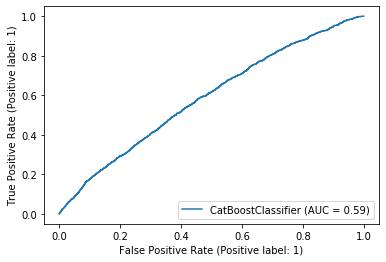

In [45]:
metrics.plot_roc_curve(best_model, X_test, y_test)

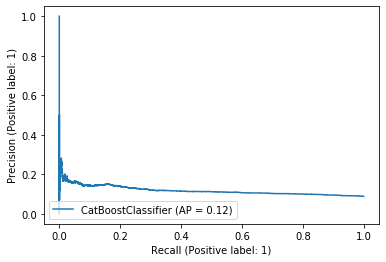

43:	learn: 0.3165825	total: 1.7s	remaining: 7.96s
44:	learn: 0.3123479	total: 1.74s	remaining: 7.92s
45:	learn: 0.3112828	total: 1.77s	remaining: 7.86s
46:	learn: 0.3095361	total: 1.8s	remaining: 7.79s
47:	learn: 0.3068691	total: 1.83s	remaining: 7.71s
48:	learn: 0.3054319	total: 1.9s	remaining: 7.81s
49:	learn: 0.3044998	total: 1.93s	remaining: 7.72s
50:	learn: 0.3023633	total: 1.99s	remaining: 7.75s
51:	learn: 0.3015008	total: 2.02s	remaining: 7.68s
52:	learn: 0.2974297	total: 2.05s	remaining: 7.63s
53:	learn: 0.2966562	total: 2.08s	remaining: 7.54s
54:	learn: 0.2959078	total: 2.12s	remaining: 7.53s
55:	learn: 0.2950741	total: 2.15s	remaining: 7.46s
56:	learn: 0.2936670	total: 2.2s	remaining: 7.45s
57:	learn: 0.2930009	total: 2.24s	remaining: 7.42s
58:	learn: 0.2918591	total: 2.29s	remaining: 7.4s
59:	learn: 0.2910877	total: 2.31s	remaining: 7.31s
60:	learn: 0.2905542	total: 2.35s	remaining: 7.27s
61:	learn: 0.2900595	total: 2.37s	remaining: 7.2s
62:	learn: 0.2894756	total: 2.4s	rema

23:	learn: 0.3653662	total: 1.33s	remaining: 12.5s
24:	learn: 0.3634400	total: 1.36s	remaining: 12.3s
25:	learn: 0.3610787	total: 1.41s	remaining: 12.1s
26:	learn: 0.3588714	total: 1.45s	remaining: 12s
27:	learn: 0.3433468	total: 1.49s	remaining: 11.8s
28:	learn: 0.3392391	total: 1.53s	remaining: 11.7s
29:	learn: 0.3374121	total: 1.56s	remaining: 11.5s
30:	learn: 0.3355314	total: 1.59s	remaining: 11.2s
31:	learn: 0.3324645	total: 1.63s	remaining: 11.1s
32:	learn: 0.3290109	total: 1.66s	remaining: 10.9s
33:	learn: 0.3274569	total: 1.68s	remaining: 10.7s
34:	learn: 0.3259467	total: 1.72s	remaining: 10.6s
35:	learn: 0.3212120	total: 1.75s	remaining: 10.4s
36:	learn: 0.3189503	total: 1.78s	remaining: 10.2s
37:	learn: 0.3174564	total: 1.81s	remaining: 10.1s
38:	learn: 0.3161299	total: 1.84s	remaining: 9.98s
39:	learn: 0.3149472	total: 1.88s	remaining: 9.89s
40:	learn: 0.3130471	total: 1.91s	remaining: 9.75s
41:	learn: 0.3120048	total: 1.94s	remaining: 9.62s
42:	learn: 0.3109119	total: 1.99s

12:	learn: 0.4087675	total: 683ms	remaining: 12.4s
13:	learn: 0.4033987	total: 736ms	remaining: 12.4s
14:	learn: 0.3960620	total: 772ms	remaining: 12.1s
15:	learn: 0.3919965	total: 819ms	remaining: 12s
16:	learn: 0.3834961	total: 871ms	remaining: 11.9s
17:	learn: 0.3790573	total: 907ms	remaining: 11.7s
18:	learn: 0.3761298	total: 959ms	remaining: 11.7s
19:	learn: 0.3729073	total: 994ms	remaining: 11.4s
20:	learn: 0.3652601	total: 1.02s	remaining: 11.2s
21:	learn: 0.3624421	total: 1.05s	remaining: 10.9s
22:	learn: 0.3583627	total: 1.08s	remaining: 10.7s
23:	learn: 0.3559928	total: 1.12s	remaining: 10.6s
24:	learn: 0.3508690	total: 1.16s	remaining: 10.4s
25:	learn: 0.3452275	total: 1.2s	remaining: 10.4s
26:	learn: 0.3430102	total: 1.24s	remaining: 10.2s
27:	learn: 0.3370043	total: 1.27s	remaining: 10.1s
28:	learn: 0.3350022	total: 1.3s	remaining: 9.9s
29:	learn: 0.3333522	total: 1.32s	remaining: 9.7s
30:	learn: 0.3292222	total: 1.35s	remaining: 9.53s
31:	learn: 0.3265266	total: 1.39s	rem

315:	learn: 0.1418141	total: 10.1s	remaining: 5.87s
316:	learn: 0.1416032	total: 10.1s	remaining: 5.83s
317:	learn: 0.1413848	total: 10.1s	remaining: 5.79s
318:	learn: 0.1411106	total: 10.1s	remaining: 5.75s
319:	learn: 0.1408258	total: 10.2s	remaining: 5.71s
320:	learn: 0.1405631	total: 10.2s	remaining: 5.67s
321:	learn: 0.1401614	total: 10.2s	remaining: 5.63s
322:	learn: 0.1399350	total: 10.2s	remaining: 5.59s
323:	learn: 0.1396735	total: 10.2s	remaining: 5.55s
324:	learn: 0.1394186	total: 10.2s	remaining: 5.51s
325:	learn: 0.1392350	total: 10.3s	remaining: 5.48s
326:	learn: 0.1390282	total: 10.3s	remaining: 5.45s
327:	learn: 0.1387792	total: 10.3s	remaining: 5.41s
328:	learn: 0.1385078	total: 10.3s	remaining: 5.38s
329:	learn: 0.1381245	total: 10.4s	remaining: 5.34s
330:	learn: 0.1378708	total: 10.4s	remaining: 5.3s
331:	learn: 0.1375029	total: 10.4s	remaining: 5.26s
332:	learn: 0.1373254	total: 10.4s	remaining: 5.22s
333:	learn: 0.1370836	total: 10.4s	remaining: 5.18s
334:	learn: 0

318:	learn: 0.3013966	total: 8.84s	remaining: 5.01s
319:	learn: 0.3012102	total: 8.85s	remaining: 4.98s
320:	learn: 0.3010564	total: 8.87s	remaining: 4.95s
321:	learn: 0.3008563	total: 8.89s	remaining: 4.91s
322:	learn: 0.3007165	total: 8.91s	remaining: 4.88s
323:	learn: 0.3005237	total: 8.93s	remaining: 4.85s
324:	learn: 0.3003676	total: 8.95s	remaining: 4.82s
325:	learn: 0.3002164	total: 8.96s	remaining: 4.78s
326:	learn: 0.3000250	total: 8.98s	remaining: 4.75s
327:	learn: 0.2998201	total: 9s	remaining: 4.72s
328:	learn: 0.2996731	total: 9.01s	remaining: 4.68s
329:	learn: 0.2994751	total: 9.03s	remaining: 4.65s
330:	learn: 0.2993212	total: 9.05s	remaining: 4.62s
331:	learn: 0.2991811	total: 9.07s	remaining: 4.59s
332:	learn: 0.2990367	total: 9.09s	remaining: 4.56s
333:	learn: 0.2988482	total: 9.1s	remaining: 4.53s
334:	learn: 0.2986422	total: 9.12s	remaining: 4.49s
335:	learn: 0.2985371	total: 9.13s	remaining: 4.46s
336:	learn: 0.2983939	total: 9.16s	remaining: 4.43s
337:	learn: 0.29

327:	learn: 0.2996176	total: 9.03s	remaining: 4.74s
328:	learn: 0.2995026	total: 9.06s	remaining: 4.71s
329:	learn: 0.2993451	total: 9.08s	remaining: 4.68s
330:	learn: 0.2992024	total: 9.1s	remaining: 4.65s
331:	learn: 0.2990420	total: 9.12s	remaining: 4.61s
332:	learn: 0.2989134	total: 9.13s	remaining: 4.58s
333:	learn: 0.2987313	total: 9.14s	remaining: 4.54s
334:	learn: 0.2985611	total: 9.16s	remaining: 4.51s
335:	learn: 0.2984246	total: 9.17s	remaining: 4.48s
336:	learn: 0.2982831	total: 9.19s	remaining: 4.45s
337:	learn: 0.2981286	total: 9.21s	remaining: 4.41s
338:	learn: 0.2979756	total: 9.22s	remaining: 4.38s
339:	learn: 0.2978346	total: 9.24s	remaining: 4.35s
340:	learn: 0.2976658	total: 9.26s	remaining: 4.32s
341:	learn: 0.2975199	total: 9.28s	remaining: 4.29s
342:	learn: 0.2974238	total: 9.3s	remaining: 4.25s
343:	learn: 0.2972914	total: 9.31s	remaining: 4.22s
344:	learn: 0.2971345	total: 9.33s	remaining: 4.19s
345:	learn: 0.2969658	total: 9.35s	remaining: 4.16s
346:	learn: 0.

246:	learn: 0.3163245	total: 5.3s	remaining: 5.42s
247:	learn: 0.3161367	total: 5.32s	remaining: 5.4s
248:	learn: 0.3158883	total: 5.34s	remaining: 5.38s
249:	learn: 0.3156251	total: 5.36s	remaining: 5.36s
250:	learn: 0.3153759	total: 5.38s	remaining: 5.33s
251:	learn: 0.3151125	total: 5.39s	remaining: 5.31s
252:	learn: 0.3149167	total: 5.42s	remaining: 5.29s
253:	learn: 0.3146645	total: 5.44s	remaining: 5.27s
254:	learn: 0.3144071	total: 5.46s	remaining: 5.24s
255:	learn: 0.3141996	total: 5.47s	remaining: 5.22s
256:	learn: 0.3139210	total: 5.49s	remaining: 5.2s
257:	learn: 0.3136776	total: 5.52s	remaining: 5.17s
258:	learn: 0.3134620	total: 5.55s	remaining: 5.16s
259:	learn: 0.3132500	total: 5.56s	remaining: 5.13s
260:	learn: 0.3130433	total: 5.59s	remaining: 5.12s
261:	learn: 0.3127857	total: 5.6s	remaining: 5.09s
262:	learn: 0.3125650	total: 5.62s	remaining: 5.07s
263:	learn: 0.3123563	total: 5.63s	remaining: 5.04s
264:	learn: 0.3120905	total: 5.66s	remaining: 5.01s
265:	learn: 0.31

236:	learn: 0.3200578	total: 4.35s	remaining: 4.83s
237:	learn: 0.3197972	total: 4.37s	remaining: 4.81s
238:	learn: 0.3195120	total: 4.38s	remaining: 4.78s
239:	learn: 0.3191493	total: 4.4s	remaining: 4.76s
240:	learn: 0.3188901	total: 4.41s	remaining: 4.74s
241:	learn: 0.3186560	total: 4.42s	remaining: 4.72s
242:	learn: 0.3184033	total: 4.43s	remaining: 4.69s
243:	learn: 0.3181483	total: 4.45s	remaining: 4.67s
244:	learn: 0.3178942	total: 4.47s	remaining: 4.65s
245:	learn: 0.3175880	total: 4.49s	remaining: 4.63s
246:	learn: 0.3173532	total: 4.5s	remaining: 4.61s
247:	learn: 0.3170931	total: 4.5s	remaining: 4.58s
248:	learn: 0.3167801	total: 4.52s	remaining: 4.56s
249:	learn: 0.3165316	total: 4.54s	remaining: 4.54s
250:	learn: 0.3162934	total: 4.56s	remaining: 4.53s
251:	learn: 0.3160471	total: 4.58s	remaining: 4.51s
252:	learn: 0.3157822	total: 4.61s	remaining: 4.5s
253:	learn: 0.3155431	total: 4.62s	remaining: 4.47s
254:	learn: 0.3152803	total: 4.63s	remaining: 4.45s
255:	learn: 0.31

In [46]:
PrecisionRecallDisplay.from_estimator(best_model, X_test, y_test)

In [47]:
#Grid focused on the Roc_Auc score
grid = RandomizedSearchCV(
    estimator = model, 
    n_iter = 20,
    param_distributions = param_grid, 
    scoring = 'roc_auc', # uses estimator's default score method
    refit = True, # keep a fitted version of the overall best model
    cv = 5, 
    return_train_score = True,
    verbose = 2,
    n_jobs = -1, 
)

%time grid.fit(X_train_smote, y_train_smote)

Fitting 5 folds for each of 100 candidates, totalling 500 fits
0:	learn: 0.6929643	total: 79.3ms	remaining: 39.6s
1:	learn: 0.6927807	total: 99.8ms	remaining: 24.9s
2:	learn: 0.6925955	total: 125ms	remaining: 20.7s
3:	learn: 0.6924124	total: 144ms	remaining: 17.9s
4:	learn: 0.6922223	total: 166ms	remaining: 16.4s
5:	learn: 0.6920590	total: 208ms	remaining: 17.1s
6:	learn: 0.6918655	total: 234ms	remaining: 16.5s
7:	learn: 0.6916835	total: 249ms	remaining: 15.3s
8:	learn: 0.6914995	total: 268ms	remaining: 14.6s
9:	learn: 0.6913171	total: 288ms	remaining: 14.1s
10:	learn: 0.6911579	total: 324ms	remaining: 14.4s
11:	learn: 0.6909623	total: 344ms	remaining: 14s
12:	learn: 0.6907953	total: 360ms	remaining: 13.5s
13:	learn: 0.6906046	total: 376ms	remaining: 13.1s
14:	learn: 0.6904321	total: 393ms	remaining: 12.7s
15:	learn: 0.6902542	total: 432ms	remaining: 13.1s
16:	learn: 0.6900651	total: 475ms	remaining: 13.5s
17:	learn: 0.6899021	total: 489ms	remaining: 13.1s
18:	learn: 0.6897143	total: 5

0:	learn: 0.6929945	total: 86.6ms	remaining: 43.2s
1:	learn: 0.6928418	total: 108ms	remaining: 26.9s
2:	learn: 0.6926772	total: 137ms	remaining: 22.7s
3:	learn: 0.6925401	total: 165ms	remaining: 20.5s
4:	learn: 0.6923740	total: 179ms	remaining: 17.7s
5:	learn: 0.6922251	total: 207ms	remaining: 17s
6:	learn: 0.6920862	total: 239ms	remaining: 16.9s
7:	learn: 0.6919212	total: 259ms	remaining: 15.9s
8:	learn: 0.6917743	total: 290ms	remaining: 15.8s
9:	learn: 0.6916387	total: 308ms	remaining: 15.1s
10:	learn: 0.6914947	total: 345ms	remaining: 15.3s
11:	learn: 0.6913322	total: 371ms	remaining: 15.1s
12:	learn: 0.6911889	total: 401ms	remaining: 15s
13:	learn: 0.6910438	total: 419ms	remaining: 14.5s
14:	learn: 0.6908884	total: 439ms	remaining: 14.2s
15:	learn: 0.6907450	total: 452ms	remaining: 13.7s
16:	learn: 0.6906114	total: 474ms	remaining: 13.5s
17:	learn: 0.6904531	total: 495ms	remaining: 13.2s
18:	learn: 0.6903072	total: 515ms	remaining: 13s
19:	learn: 0.6901697	total: 534ms	remaining: 1

0:	learn: 0.6908812	total: 103ms	remaining: 10.2s
1:	learn: 0.6886610	total: 125ms	remaining: 6.1s
2:	learn: 0.6864783	total: 149ms	remaining: 4.82s
3:	learn: 0.6843602	total: 190ms	remaining: 4.57s
4:	learn: 0.6822775	total: 205ms	remaining: 3.89s
5:	learn: 0.6802462	total: 218ms	remaining: 3.42s
6:	learn: 0.6782282	total: 233ms	remaining: 3.09s
7:	learn: 0.6762931	total: 275ms	remaining: 3.16s
8:	learn: 0.6743773	total: 296ms	remaining: 2.99s
9:	learn: 0.6724994	total: 314ms	remaining: 2.82s
10:	learn: 0.6706853	total: 350ms	remaining: 2.83s
11:	learn: 0.6688869	total: 370ms	remaining: 2.71s
12:	learn: 0.6671336	total: 394ms	remaining: 2.64s
13:	learn: 0.6654334	total: 411ms	remaining: 2.52s
14:	learn: 0.6637461	total: 431ms	remaining: 2.44s
15:	learn: 0.6621208	total: 450ms	remaining: 2.36s
16:	learn: 0.6605151	total: 468ms	remaining: 2.29s
17:	learn: 0.6589400	total: 482ms	remaining: 2.19s
18:	learn: 0.6574028	total: 511ms	remaining: 2.18s
19:	learn: 0.6559080	total: 530ms	remainin

0:	learn: 0.6908685	total: 84.4ms	remaining: 8.35s
1:	learn: 0.6886615	total: 121ms	remaining: 5.92s
2:	learn: 0.6865006	total: 140ms	remaining: 4.53s
3:	learn: 0.6843795	total: 167ms	remaining: 4s
4:	learn: 0.6822860	total: 198ms	remaining: 3.77s
5:	learn: 0.6802343	total: 221ms	remaining: 3.46s
6:	learn: 0.6782520	total: 239ms	remaining: 3.18s
7:	learn: 0.6763094	total: 264ms	remaining: 3.04s
8:	learn: 0.6744037	total: 279ms	remaining: 2.82s
9:	learn: 0.6725384	total: 311ms	remaining: 2.8s
10:	learn: 0.6706986	total: 342ms	remaining: 2.76s
11:	learn: 0.6689130	total: 364ms	remaining: 2.67s
12:	learn: 0.6671619	total: 384ms	remaining: 2.57s
13:	learn: 0.6654481	total: 413ms	remaining: 2.54s
14:	learn: 0.6637747	total: 440ms	remaining: 2.49s
15:	learn: 0.6621488	total: 480ms	remaining: 2.52s
16:	learn: 0.6605397	total: 500ms	remaining: 2.44s
17:	learn: 0.6589627	total: 527ms	remaining: 2.4s
18:	learn: 0.6574326	total: 543ms	remaining: 2.32s
19:	learn: 0.6556501	total: 569ms	remaining: 

161:	learn: 0.6678254	total: 4.08s	remaining: 8.52s
162:	learn: 0.6677038	total: 4.11s	remaining: 8.49s
163:	learn: 0.6675718	total: 4.12s	remaining: 8.44s
164:	learn: 0.6674399	total: 4.14s	remaining: 8.41s
165:	learn: 0.6673097	total: 4.16s	remaining: 8.37s
166:	learn: 0.6671640	total: 4.18s	remaining: 8.34s
167:	learn: 0.6670364	total: 4.2s	remaining: 8.3s
168:	learn: 0.6669168	total: 4.22s	remaining: 8.27s
169:	learn: 0.6667842	total: 4.24s	remaining: 8.23s
170:	learn: 0.6666657	total: 4.28s	remaining: 8.24s
171:	learn: 0.6665511	total: 4.29s	remaining: 8.19s
172:	learn: 0.6664125	total: 4.33s	remaining: 8.19s
173:	learn: 0.6662838	total: 4.35s	remaining: 8.15s
174:	learn: 0.6661616	total: 4.36s	remaining: 8.11s
175:	learn: 0.6660375	total: 4.38s	remaining: 8.06s
176:	learn: 0.6659025	total: 4.4s	remaining: 8.03s
177:	learn: 0.6657819	total: 4.41s	remaining: 7.99s
178:	learn: 0.6656640	total: 4.43s	remaining: 7.94s
179:	learn: 0.6655323	total: 4.44s	remaining: 7.9s
180:	learn: 0.66

161:	learn: 0.6720201	total: 4.03s	remaining: 8.41s
162:	learn: 0.6719124	total: 4.06s	remaining: 8.39s
163:	learn: 0.6718044	total: 4.08s	remaining: 8.36s
164:	learn: 0.6717016	total: 4.1s	remaining: 8.33s
165:	learn: 0.6716061	total: 4.12s	remaining: 8.28s
166:	learn: 0.6714933	total: 4.14s	remaining: 8.26s
167:	learn: 0.6713755	total: 4.17s	remaining: 8.25s
168:	learn: 0.6712682	total: 4.2s	remaining: 8.22s
169:	learn: 0.6711595	total: 4.21s	remaining: 8.18s
170:	learn: 0.6710599	total: 4.23s	remaining: 8.14s
171:	learn: 0.6709511	total: 4.24s	remaining: 8.09s
172:	learn: 0.6708408	total: 4.26s	remaining: 8.06s
173:	learn: 0.6707278	total: 4.3s	remaining: 8.05s
174:	learn: 0.6706227	total: 4.32s	remaining: 8.02s
175:	learn: 0.6705113	total: 4.34s	remaining: 7.99s
176:	learn: 0.6704086	total: 4.36s	remaining: 7.96s
177:	learn: 0.6703112	total: 4.38s	remaining: 7.93s
178:	learn: 0.6702057	total: 4.4s	remaining: 7.89s
179:	learn: 0.6700987	total: 4.43s	remaining: 7.88s
180:	learn: 0.66

60:	learn: 0.6843389	total: 1.43s	remaining: 10.3s
61:	learn: 0.6842035	total: 1.45s	remaining: 10.2s
62:	learn: 0.6840630	total: 1.46s	remaining: 10.2s
63:	learn: 0.6839243	total: 1.5s	remaining: 10.2s
64:	learn: 0.6838067	total: 1.51s	remaining: 10.1s
65:	learn: 0.6836570	total: 1.55s	remaining: 10.2s
66:	learn: 0.6835127	total: 1.56s	remaining: 10.1s
67:	learn: 0.6833883	total: 1.59s	remaining: 10.1s
68:	learn: 0.6832511	total: 1.61s	remaining: 10.1s
69:	learn: 0.6831247	total: 1.63s	remaining: 10s
70:	learn: 0.6829974	total: 1.65s	remaining: 9.97s
71:	learn: 0.6828602	total: 1.66s	remaining: 9.88s
72:	learn: 0.6827143	total: 1.68s	remaining: 9.8s
73:	learn: 0.6826007	total: 1.69s	remaining: 9.72s
74:	learn: 0.6824553	total: 1.73s	remaining: 9.79s
75:	learn: 0.6823330	total: 1.78s	remaining: 9.95s
76:	learn: 0.6822006	total: 1.85s	remaining: 10.2s
77:	learn: 0.6820661	total: 1.89s	remaining: 10.2s
78:	learn: 0.6819440	total: 1.92s	remaining: 10.2s
79:	learn: 0.6818121	total: 1.96s	r

219:	learn: 0.6659649	total: 5s	remaining: 6.36s
220:	learn: 0.6658651	total: 5.02s	remaining: 6.33s
221:	learn: 0.6657762	total: 5.04s	remaining: 6.31s
222:	learn: 0.6656804	total: 5.05s	remaining: 6.28s
223:	learn: 0.6655830	total: 5.07s	remaining: 6.25s
224:	learn: 0.6654852	total: 5.1s	remaining: 6.23s
225:	learn: 0.6653864	total: 5.11s	remaining: 6.19s
226:	learn: 0.6652924	total: 5.14s	remaining: 6.18s
227:	learn: 0.6651986	total: 5.16s	remaining: 6.16s
228:	learn: 0.6650968	total: 5.19s	remaining: 6.14s
229:	learn: 0.6650075	total: 5.21s	remaining: 6.12s
230:	learn: 0.6649166	total: 5.24s	remaining: 6.11s
231:	learn: 0.6648149	total: 5.26s	remaining: 6.07s
232:	learn: 0.6647161	total: 5.28s	remaining: 6.05s
233:	learn: 0.6646330	total: 5.29s	remaining: 6.01s
234:	learn: 0.6645358	total: 5.3s	remaining: 5.98s
235:	learn: 0.6644287	total: 5.33s	remaining: 5.96s
236:	learn: 0.6643463	total: 5.35s	remaining: 5.93s
237:	learn: 0.6642456	total: 5.36s	remaining: 5.9s
238:	learn: 0.6641

320:	learn: 0.6570068	total: 7.59s	remaining: 4.23s
321:	learn: 0.6569263	total: 7.6s	remaining: 4.2s
322:	learn: 0.6568418	total: 7.63s	remaining: 4.18s
323:	learn: 0.6567518	total: 7.65s	remaining: 4.16s
324:	learn: 0.6566755	total: 7.67s	remaining: 4.13s
325:	learn: 0.6565913	total: 7.69s	remaining: 4.1s
326:	learn: 0.6565098	total: 7.73s	remaining: 4.09s
327:	learn: 0.6564273	total: 7.76s	remaining: 4.07s
328:	learn: 0.6563438	total: 7.78s	remaining: 4.04s
329:	learn: 0.6562630	total: 7.81s	remaining: 4.02s
330:	learn: 0.6561818	total: 7.83s	remaining: 4s
331:	learn: 0.6561011	total: 7.86s	remaining: 3.98s
332:	learn: 0.6560187	total: 7.88s	remaining: 3.95s
333:	learn: 0.6559358	total: 7.89s	remaining: 3.92s
334:	learn: 0.6558644	total: 7.9s	remaining: 3.89s
335:	learn: 0.6557737	total: 7.92s	remaining: 3.87s
336:	learn: 0.6556935	total: 7.96s	remaining: 3.85s
337:	learn: 0.6556138	total: 7.97s	remaining: 3.82s
338:	learn: 0.6555290	total: 8s	remaining: 3.8s
339:	learn: 0.6554513	t

60:	learn: 0.2587917	total: 2.26s	remaining: 16.3s
61:	learn: 0.2582272	total: 2.29s	remaining: 16.2s
62:	learn: 0.2578835	total: 2.31s	remaining: 16s
63:	learn: 0.2566093	total: 2.35s	remaining: 16s
64:	learn: 0.2562364	total: 2.38s	remaining: 15.9s
65:	learn: 0.2556992	total: 2.41s	remaining: 15.8s
66:	learn: 0.2554279	total: 2.43s	remaining: 15.7s
67:	learn: 0.2548425	total: 2.46s	remaining: 15.6s
68:	learn: 0.2541183	total: 2.49s	remaining: 15.6s
69:	learn: 0.2536763	total: 2.53s	remaining: 15.6s
70:	learn: 0.2532308	total: 2.55s	remaining: 15.4s
71:	learn: 0.2528016	total: 2.6s	remaining: 15.4s
72:	learn: 0.2527684	total: 2.63s	remaining: 15.4s
73:	learn: 0.2522760	total: 2.67s	remaining: 15.4s
74:	learn: 0.2519447	total: 2.69s	remaining: 15.3s
75:	learn: 0.2512819	total: 2.74s	remaining: 15.3s
76:	learn: 0.2498858	total: 2.78s	remaining: 15.3s
77:	learn: 0.2495565	total: 2.82s	remaining: 15.3s
78:	learn: 0.2491591	total: 2.86s	remaining: 15.2s
79:	learn: 0.2488432	total: 2.89s	re

60:	learn: 0.2591118	total: 2.26s	remaining: 16.2s
61:	learn: 0.2584826	total: 2.29s	remaining: 16.2s
62:	learn: 0.2583636	total: 2.31s	remaining: 16s
63:	learn: 0.2565245	total: 2.36s	remaining: 16.1s
64:	learn: 0.2555043	total: 2.41s	remaining: 16.1s
65:	learn: 0.2548835	total: 2.45s	remaining: 16.1s
66:	learn: 0.2544482	total: 2.49s	remaining: 16.1s
67:	learn: 0.2542120	total: 2.51s	remaining: 16s
68:	learn: 0.2541693	total: 2.56s	remaining: 16s
69:	learn: 0.2536556	total: 2.6s	remaining: 16s
70:	learn: 0.2532655	total: 2.63s	remaining: 15.9s
71:	learn: 0.2527758	total: 2.65s	remaining: 15.8s
72:	learn: 0.2523818	total: 2.7s	remaining: 15.8s
73:	learn: 0.2519030	total: 2.75s	remaining: 15.8s
74:	learn: 0.2514462	total: 2.8s	remaining: 15.9s
75:	learn: 0.2509332	total: 2.82s	remaining: 15.7s
76:	learn: 0.2503189	total: 2.85s	remaining: 15.7s
77:	learn: 0.2497812	total: 2.87s	remaining: 15.5s
78:	learn: 0.2493295	total: 2.9s	remaining: 15.5s
79:	learn: 0.2490339	total: 2.93s	remaining

455:	learn: 0.6459313	total: 10.9s	remaining: 1.05s
456:	learn: 0.6458173	total: 10.9s	remaining: 1.02s
457:	learn: 0.6457479	total: 10.9s	remaining: 1s
458:	learn: 0.6456323	total: 10.9s	remaining: 976ms
459:	learn: 0.6455106	total: 10.9s	remaining: 951ms
460:	learn: 0.6453954	total: 11s	remaining: 927ms
461:	learn: 0.6452795	total: 11s	remaining: 903ms
462:	learn: 0.6452127	total: 11s	remaining: 878ms
463:	learn: 0.6450970	total: 11s	remaining: 854ms
464:	learn: 0.6449835	total: 11s	remaining: 831ms
465:	learn: 0.6448654	total: 11.1s	remaining: 807ms
466:	learn: 0.6447520	total: 11.1s	remaining: 783ms
467:	learn: 0.6446827	total: 11.1s	remaining: 759ms
468:	learn: 0.6445692	total: 11.1s	remaining: 735ms
469:	learn: 0.6444570	total: 11.2s	remaining: 712ms
470:	learn: 0.6443892	total: 11.2s	remaining: 688ms
471:	learn: 0.6443203	total: 11.2s	remaining: 664ms
472:	learn: 0.6442542	total: 11.2s	remaining: 640ms
473:	learn: 0.6441926	total: 11.2s	remaining: 617ms
474:	learn: 0.6440741	tot

479:	learn: 0.6436082	total: 11.3s	remaining: 471ms
480:	learn: 0.6435365	total: 11.3s	remaining: 448ms
481:	learn: 0.6434723	total: 11.4s	remaining: 424ms
482:	learn: 0.6434040	total: 11.4s	remaining: 401ms
483:	learn: 0.6433336	total: 11.4s	remaining: 377ms
484:	learn: 0.6432668	total: 11.4s	remaining: 354ms
485:	learn: 0.6431566	total: 11.5s	remaining: 330ms
486:	learn: 0.6430418	total: 11.5s	remaining: 306ms
487:	learn: 0.6429720	total: 11.5s	remaining: 283ms
488:	learn: 0.6428616	total: 11.5s	remaining: 259ms
489:	learn: 0.6427477	total: 11.6s	remaining: 236ms
490:	learn: 0.6426846	total: 11.6s	remaining: 212ms
491:	learn: 0.6426203	total: 11.6s	remaining: 188ms
492:	learn: 0.6425500	total: 11.6s	remaining: 165ms
493:	learn: 0.6424835	total: 11.6s	remaining: 141ms
494:	learn: 0.6424165	total: 11.7s	remaining: 118ms
495:	learn: 0.6423064	total: 11.7s	remaining: 94.3ms
496:	learn: 0.6422372	total: 11.7s	remaining: 70.7ms
497:	learn: 0.6421303	total: 11.7s	remaining: 47.1ms
498:	lear

220:	learn: 0.0662137	total: 7.48s	remaining: 9.44s
221:	learn: 0.0662136	total: 7.56s	remaining: 9.46s
222:	learn: 0.0662120	total: 7.59s	remaining: 9.42s
223:	learn: 0.0662106	total: 7.61s	remaining: 9.38s
224:	learn: 0.0658517	total: 7.65s	remaining: 9.35s
225:	learn: 0.0657161	total: 7.7s	remaining: 9.33s
226:	learn: 0.0657104	total: 7.73s	remaining: 9.3s
227:	learn: 0.0656870	total: 7.77s	remaining: 9.27s
228:	learn: 0.0654106	total: 7.82s	remaining: 9.25s
229:	learn: 0.0652294	total: 7.86s	remaining: 9.23s
230:	learn: 0.0649897	total: 7.91s	remaining: 9.21s
231:	learn: 0.0648345	total: 7.94s	remaining: 9.17s
232:	learn: 0.0645108	total: 7.97s	remaining: 9.13s
233:	learn: 0.0642389	total: 8s	remaining: 9.09s
234:	learn: 0.0639586	total: 8.05s	remaining: 9.08s
235:	learn: 0.0637763	total: 8.09s	remaining: 9.05s
236:	learn: 0.0637667	total: 8.11s	remaining: 9s
237:	learn: 0.0636501	total: 8.15s	remaining: 8.97s
238:	learn: 0.0636499	total: 8.18s	remaining: 8.94s
239:	learn: 0.063514

220:	learn: 0.2206414	total: 7.7s	remaining: 9.72s
221:	learn: 0.2205794	total: 7.74s	remaining: 9.69s
222:	learn: 0.2205793	total: 7.77s	remaining: 9.65s
223:	learn: 0.2205352	total: 7.8s	remaining: 9.61s
224:	learn: 0.2205350	total: 7.83s	remaining: 9.56s
225:	learn: 0.2204089	total: 7.86s	remaining: 9.53s
226:	learn: 0.2202145	total: 7.9s	remaining: 9.5s
227:	learn: 0.2202144	total: 7.94s	remaining: 9.47s
228:	learn: 0.2202122	total: 7.97s	remaining: 9.43s
229:	learn: 0.2202096	total: 8.01s	remaining: 9.4s
230:	learn: 0.2202020	total: 8.04s	remaining: 9.37s
231:	learn: 0.2200441	total: 8.09s	remaining: 9.35s
232:	learn: 0.2200413	total: 8.11s	remaining: 9.29s
233:	learn: 0.2198734	total: 8.15s	remaining: 9.26s
234:	learn: 0.2196648	total: 8.2s	remaining: 9.24s
235:	learn: 0.2190031	total: 8.23s	remaining: 9.2s
236:	learn: 0.2188181	total: 8.26s	remaining: 9.16s
237:	learn: 0.2188176	total: 8.27s	remaining: 9.11s
238:	learn: 0.2185512	total: 8.36s	remaining: 9.13s
239:	learn: 0.21840

479:	learn: 0.6436898	total: 11.4s	remaining: 473ms
480:	learn: 0.6436251	total: 11.4s	remaining: 449ms
481:	learn: 0.6435521	total: 11.4s	remaining: 425ms
482:	learn: 0.6434409	total: 11.4s	remaining: 402ms
483:	learn: 0.6433261	total: 11.4s	remaining: 378ms
484:	learn: 0.6432151	total: 11.4s	remaining: 354ms
485:	learn: 0.6431013	total: 11.5s	remaining: 330ms
486:	learn: 0.6429884	total: 11.5s	remaining: 307ms
487:	learn: 0.6428787	total: 11.5s	remaining: 283ms
488:	learn: 0.6427670	total: 11.6s	remaining: 260ms
489:	learn: 0.6426548	total: 11.6s	remaining: 236ms
490:	learn: 0.6425386	total: 11.6s	remaining: 213ms
491:	learn: 0.6424320	total: 11.6s	remaining: 189ms
492:	learn: 0.6423659	total: 11.6s	remaining: 165ms
493:	learn: 0.6422537	total: 11.7s	remaining: 142ms
494:	learn: 0.6421887	total: 11.7s	remaining: 118ms
495:	learn: 0.6420784	total: 11.7s	remaining: 94.4ms
496:	learn: 0.6419655	total: 11.7s	remaining: 70.7ms
497:	learn: 0.6419031	total: 11.7s	remaining: 47.1ms
498:	lear

479:	learn: 0.6307525	total: 11s	remaining: 459ms
480:	learn: 0.6306211	total: 11s	remaining: 436ms
481:	learn: 0.6305337	total: 11.1s	remaining: 413ms
482:	learn: 0.6303999	total: 11.1s	remaining: 390ms
483:	learn: 0.6303159	total: 11.1s	remaining: 367ms
484:	learn: 0.6302310	total: 11.1s	remaining: 344ms
485:	learn: 0.6300984	total: 11.1s	remaining: 321ms
486:	learn: 0.6300083	total: 11.2s	remaining: 298ms
487:	learn: 0.6298780	total: 11.2s	remaining: 275ms
488:	learn: 0.6297447	total: 11.2s	remaining: 252ms
489:	learn: 0.6296598	total: 11.2s	remaining: 229ms
490:	learn: 0.6295734	total: 11.2s	remaining: 206ms
491:	learn: 0.6294933	total: 11.3s	remaining: 183ms
492:	learn: 0.6293952	total: 11.3s	remaining: 160ms
493:	learn: 0.6292586	total: 11.3s	remaining: 138ms
494:	learn: 0.6291783	total: 11.4s	remaining: 115ms
495:	learn: 0.6290471	total: 11.4s	remaining: 91.6ms
496:	learn: 0.6289164	total: 11.4s	remaining: 68.7ms
497:	learn: 0.6287828	total: 11.4s	remaining: 45.8ms
498:	learn: 0

35:	learn: 0.4243784	total: 957ms	remaining: 12.3s
36:	learn: 0.4215961	total: 981ms	remaining: 12.3s
37:	learn: 0.4199179	total: 1.01s	remaining: 12.2s
38:	learn: 0.4166261	total: 1.03s	remaining: 12.2s
39:	learn: 0.4137788	total: 1.06s	remaining: 12.3s
40:	learn: 0.4122154	total: 1.09s	remaining: 12.2s
41:	learn: 0.4106609	total: 1.15s	remaining: 12.5s
42:	learn: 0.4088198	total: 1.19s	remaining: 12.7s
43:	learn: 0.4072374	total: 1.22s	remaining: 12.7s
44:	learn: 0.4058494	total: 1.25s	remaining: 12.6s
45:	learn: 0.4034377	total: 1.27s	remaining: 12.5s
46:	learn: 0.4020879	total: 1.28s	remaining: 12.4s
47:	learn: 0.3988534	total: 1.31s	remaining: 12.4s
48:	learn: 0.3975547	total: 1.34s	remaining: 12.3s
49:	learn: 0.3959942	total: 1.36s	remaining: 12.3s
50:	learn: 0.3938434	total: 1.39s	remaining: 12.3s
51:	learn: 0.3926152	total: 1.41s	remaining: 12.2s
52:	learn: 0.3899759	total: 1.43s	remaining: 12.1s
53:	learn: 0.3881874	total: 1.46s	remaining: 12s
54:	learn: 0.3870522	total: 1.47s

138:	learn: 0.1726501	total: 3.76s	remaining: 9.76s
139:	learn: 0.1713704	total: 3.78s	remaining: 9.72s
140:	learn: 0.1707523	total: 3.79s	remaining: 9.66s
141:	learn: 0.1702481	total: 3.82s	remaining: 9.64s
142:	learn: 0.1696789	total: 3.84s	remaining: 9.6s
143:	learn: 0.1691451	total: 3.88s	remaining: 9.58s
144:	learn: 0.1683740	total: 3.9s	remaining: 9.56s
145:	learn: 0.1675542	total: 3.96s	remaining: 9.6s
146:	learn: 0.1669802	total: 3.98s	remaining: 9.55s
147:	learn: 0.1663886	total: 4s	remaining: 9.52s
148:	learn: 0.1637812	total: 4.04s	remaining: 9.53s
149:	learn: 0.1627756	total: 4.08s	remaining: 9.51s
150:	learn: 0.1620790	total: 4.1s	remaining: 9.48s
151:	learn: 0.1609006	total: 4.13s	remaining: 9.46s
152:	learn: 0.1602645	total: 4.16s	remaining: 9.43s
153:	learn: 0.1598046	total: 4.18s	remaining: 9.39s
154:	learn: 0.1591113	total: 4.2s	remaining: 9.35s
155:	learn: 0.1587543	total: 4.23s	remaining: 9.33s
156:	learn: 0.1577493	total: 4.26s	remaining: 9.3s
157:	learn: 0.1573407

379:	learn: 0.0558697	total: 13.1s	remaining: 4.14s
380:	learn: 0.0558697	total: 13.1s	remaining: 4.1s
381:	learn: 0.0558696	total: 13.2s	remaining: 4.07s
382:	learn: 0.0558695	total: 13.2s	remaining: 4.03s
383:	learn: 0.0558694	total: 13.2s	remaining: 3.99s
384:	learn: 0.0558693	total: 13.2s	remaining: 3.96s
385:	learn: 0.0558692	total: 13.3s	remaining: 3.92s
386:	learn: 0.0558690	total: 13.3s	remaining: 3.88s
387:	learn: 0.0558683	total: 13.3s	remaining: 3.85s
388:	learn: 0.0556766	total: 13.4s	remaining: 3.82s
389:	learn: 0.0555496	total: 13.4s	remaining: 3.79s
390:	learn: 0.0554609	total: 13.5s	remaining: 3.75s
391:	learn: 0.0552828	total: 13.5s	remaining: 3.72s
392:	learn: 0.0549429	total: 13.5s	remaining: 3.69s
393:	learn: 0.0547673	total: 13.6s	remaining: 3.65s
394:	learn: 0.0546815	total: 13.6s	remaining: 3.62s
395:	learn: 0.0545047	total: 13.6s	remaining: 3.58s
396:	learn: 0.0544250	total: 13.7s	remaining: 3.54s
397:	learn: 0.0544231	total: 13.7s	remaining: 3.51s
398:	learn: 0

379:	learn: 0.2043107	total: 13.6s	remaining: 4.29s
380:	learn: 0.2041697	total: 13.6s	remaining: 4.25s
381:	learn: 0.2041687	total: 13.7s	remaining: 4.22s
382:	learn: 0.2041686	total: 13.7s	remaining: 4.18s
383:	learn: 0.2039692	total: 13.7s	remaining: 4.14s
384:	learn: 0.2039689	total: 13.7s	remaining: 4.1s
385:	learn: 0.2039688	total: 13.8s	remaining: 4.06s
386:	learn: 0.2036621	total: 13.8s	remaining: 4.03s
387:	learn: 0.2035755	total: 13.9s	remaining: 4.01s
388:	learn: 0.2035755	total: 13.9s	remaining: 3.97s
389:	learn: 0.2033410	total: 13.9s	remaining: 3.93s
390:	learn: 0.2033409	total: 14s	remaining: 3.9s
391:	learn: 0.2033404	total: 14s	remaining: 3.86s
392:	learn: 0.2033391	total: 14s	remaining: 3.82s
393:	learn: 0.2032136	total: 14.1s	remaining: 3.79s
394:	learn: 0.2032134	total: 14.1s	remaining: 3.75s
395:	learn: 0.2032056	total: 14.1s	remaining: 3.71s
396:	learn: 0.2032054	total: 14.2s	remaining: 3.68s
397:	learn: 0.2032006	total: 14.2s	remaining: 3.64s
398:	learn: 0.203035

379:	learn: 0.2033120	total: 13.3s	remaining: 4.2s
380:	learn: 0.2032615	total: 13.3s	remaining: 4.16s
381:	learn: 0.2029636	total: 13.4s	remaining: 4.13s
382:	learn: 0.2029617	total: 13.4s	remaining: 4.1s
383:	learn: 0.2029582	total: 13.5s	remaining: 4.06s
384:	learn: 0.2029162	total: 13.5s	remaining: 4.04s
385:	learn: 0.2029159	total: 13.5s	remaining: 4s
386:	learn: 0.2027584	total: 13.6s	remaining: 3.96s
387:	learn: 0.2026668	total: 13.6s	remaining: 3.93s
388:	learn: 0.2026668	total: 13.6s	remaining: 3.89s
389:	learn: 0.2025152	total: 13.7s	remaining: 3.85s
390:	learn: 0.2025149	total: 13.7s	remaining: 3.81s
391:	learn: 0.2025149	total: 13.7s	remaining: 3.78s
392:	learn: 0.2025103	total: 13.7s	remaining: 3.74s
393:	learn: 0.2025102	total: 13.8s	remaining: 3.7s
394:	learn: 0.2024805	total: 13.8s	remaining: 3.67s
395:	learn: 0.2023969	total: 13.8s	remaining: 3.63s
396:	learn: 0.2022311	total: 13.9s	remaining: 3.6s
397:	learn: 0.2019212	total: 13.9s	remaining: 3.57s
398:	learn: 0.20163

138:	learn: 0.2327587	total: 5s	remaining: 13s
139:	learn: 0.2327028	total: 5.03s	remaining: 12.9s
140:	learn: 0.2324610	total: 5.09s	remaining: 13s
141:	learn: 0.2321948	total: 5.12s	remaining: 12.9s
142:	learn: 0.2318652	total: 5.14s	remaining: 12.8s
143:	learn: 0.2316452	total: 5.21s	remaining: 12.9s
144:	learn: 0.2314851	total: 5.25s	remaining: 12.8s
145:	learn: 0.2314778	total: 5.27s	remaining: 12.8s
146:	learn: 0.2310866	total: 5.29s	remaining: 12.7s
147:	learn: 0.2310746	total: 5.32s	remaining: 12.7s
148:	learn: 0.2309938	total: 5.36s	remaining: 12.6s
149:	learn: 0.2306300	total: 5.39s	remaining: 12.6s
150:	learn: 0.2303157	total: 5.43s	remaining: 12.6s
151:	learn: 0.2300331	total: 5.46s	remaining: 12.5s
152:	learn: 0.2297247	total: 5.5s	remaining: 12.5s
153:	learn: 0.2294142	total: 5.54s	remaining: 12.4s
154:	learn: 0.2291881	total: 5.59s	remaining: 12.5s
155:	learn: 0.2289656	total: 5.62s	remaining: 12.4s
156:	learn: 0.2287238	total: 5.66s	remaining: 12.4s
157:	learn: 0.228581

196:	learn: 0.2924993	total: 5.3s	remaining: 8.16s
197:	learn: 0.2923155	total: 5.33s	remaining: 8.12s
198:	learn: 0.2919390	total: 5.37s	remaining: 8.12s
199:	learn: 0.2917725	total: 5.39s	remaining: 8.09s
200:	learn: 0.2916235	total: 5.43s	remaining: 8.07s
201:	learn: 0.2911751	total: 5.45s	remaining: 8.04s
202:	learn: 0.2909891	total: 5.48s	remaining: 8.02s
203:	learn: 0.2908207	total: 5.51s	remaining: 8s
204:	learn: 0.2906262	total: 5.53s	remaining: 7.95s
205:	learn: 0.2904534	total: 5.56s	remaining: 7.94s
206:	learn: 0.2900176	total: 5.6s	remaining: 7.93s
207:	learn: 0.2894500	total: 5.63s	remaining: 7.91s
208:	learn: 0.2892621	total: 5.67s	remaining: 7.89s
209:	learn: 0.2890581	total: 5.7s	remaining: 7.87s
210:	learn: 0.2888753	total: 5.71s	remaining: 7.83s
211:	learn: 0.2887137	total: 5.73s	remaining: 7.79s
212:	learn: 0.2885790	total: 5.75s	remaining: 7.75s
213:	learn: 0.2883944	total: 5.78s	remaining: 7.73s
214:	learn: 0.2882378	total: 5.81s	remaining: 7.71s
215:	learn: 0.2880

37:	learn: 0.4226690	total: 1.16s	remaining: 14.1s
38:	learn: 0.4209981	total: 1.19s	remaining: 14s
39:	learn: 0.4194293	total: 1.23s	remaining: 14.1s
40:	learn: 0.4165533	total: 1.27s	remaining: 14.2s
41:	learn: 0.4125663	total: 1.3s	remaining: 14.2s
42:	learn: 0.4090693	total: 1.32s	remaining: 14.1s
43:	learn: 0.4077034	total: 1.36s	remaining: 14.1s
44:	learn: 0.4021826	total: 1.38s	remaining: 14s
45:	learn: 0.4008964	total: 1.41s	remaining: 13.9s
46:	learn: 0.3995961	total: 1.48s	remaining: 14.3s
47:	learn: 0.3984808	total: 1.5s	remaining: 14.2s
48:	learn: 0.3973719	total: 1.53s	remaining: 14.1s
49:	learn: 0.3952366	total: 1.59s	remaining: 14.3s
50:	learn: 0.3938384	total: 1.62s	remaining: 14.3s
51:	learn: 0.3909963	total: 1.64s	remaining: 14.1s
52:	learn: 0.3899129	total: 1.66s	remaining: 14s
53:	learn: 0.3888610	total: 1.71s	remaining: 14.1s
54:	learn: 0.3869405	total: 1.74s	remaining: 14.1s
55:	learn: 0.3858870	total: 1.78s	remaining: 14.1s
56:	learn: 0.3845388	total: 1.81s	remai

37:	learn: 0.6864204	total: 1.02s	remaining: 5.69s
38:	learn: 0.6862435	total: 1.05s	remaining: 5.66s
39:	learn: 0.6860764	total: 1.08s	remaining: 5.66s
40:	learn: 0.6859045	total: 1.1s	remaining: 5.59s
41:	learn: 0.6857380	total: 1.13s	remaining: 5.61s
42:	learn: 0.6855694	total: 1.19s	remaining: 5.73s
43:	learn: 0.6854014	total: 1.21s	remaining: 5.68s
44:	learn: 0.6852290	total: 1.23s	remaining: 5.61s
45:	learn: 0.6850631	total: 1.25s	remaining: 5.55s
46:	learn: 0.6848916	total: 1.27s	remaining: 5.5s
47:	learn: 0.6847276	total: 1.3s	remaining: 5.47s
48:	learn: 0.6845857	total: 1.32s	remaining: 5.4s
49:	learn: 0.6843996	total: 1.36s	remaining: 5.43s
50:	learn: 0.6842434	total: 1.38s	remaining: 5.39s
51:	learn: 0.6840698	total: 1.4s	remaining: 5.35s
52:	learn: 0.6839083	total: 1.46s	remaining: 5.42s
53:	learn: 0.6837392	total: 1.47s	remaining: 5.35s
54:	learn: 0.6835849	total: 1.5s	remaining: 5.31s
55:	learn: 0.6834167	total: 1.53s	remaining: 5.29s
56:	learn: 0.6832433	total: 1.58s	rem

37:	learn: 0.4180360	total: 1.27s	remaining: 15.4s
38:	learn: 0.4154712	total: 1.29s	remaining: 15.3s
39:	learn: 0.4138185	total: 1.32s	remaining: 15.2s
40:	learn: 0.4113543	total: 1.36s	remaining: 15.2s
41:	learn: 0.4100003	total: 1.41s	remaining: 15.4s
42:	learn: 0.4084849	total: 1.43s	remaining: 15.2s
43:	learn: 0.4062104	total: 1.46s	remaining: 15.1s
44:	learn: 0.4035308	total: 1.49s	remaining: 15.1s
45:	learn: 0.4009457	total: 1.52s	remaining: 15s
46:	learn: 0.3996811	total: 1.54s	remaining: 14.8s
47:	learn: 0.3983334	total: 1.58s	remaining: 14.9s
48:	learn: 0.3955562	total: 1.6s	remaining: 14.7s
49:	learn: 0.3939696	total: 1.63s	remaining: 14.7s
50:	learn: 0.3928062	total: 1.67s	remaining: 14.7s
51:	learn: 0.3916386	total: 1.69s	remaining: 14.6s
52:	learn: 0.3905874	total: 1.72s	remaining: 14.5s
53:	learn: 0.3880871	total: 1.75s	remaining: 14.5s
54:	learn: 0.3863284	total: 1.8s	remaining: 14.6s
55:	learn: 0.3837293	total: 1.83s	remaining: 14.5s
56:	learn: 0.3826451	total: 1.85s	r

297:	learn: 0.2109218	total: 11.6s	remaining: 7.85s
298:	learn: 0.2109196	total: 11.6s	remaining: 7.8s
299:	learn: 0.2109196	total: 11.6s	remaining: 7.76s
300:	learn: 0.2108065	total: 11.7s	remaining: 7.74s
301:	learn: 0.2106783	total: 11.7s	remaining: 7.7s
302:	learn: 0.2106780	total: 11.8s	remaining: 7.64s
303:	learn: 0.2105169	total: 11.8s	remaining: 7.6s
304:	learn: 0.2105167	total: 11.8s	remaining: 7.56s
305:	learn: 0.2103777	total: 11.8s	remaining: 7.51s
306:	learn: 0.2103775	total: 11.9s	remaining: 7.46s
307:	learn: 0.2103773	total: 11.9s	remaining: 7.41s
308:	learn: 0.2103768	total: 11.9s	remaining: 7.36s
309:	learn: 0.2103766	total: 12s	remaining: 7.33s
310:	learn: 0.2102190	total: 12s	remaining: 7.31s
311:	learn: 0.2100867	total: 12.1s	remaining: 7.28s
312:	learn: 0.2100864	total: 12.1s	remaining: 7.23s
313:	learn: 0.2098869	total: 12.1s	remaining: 7.19s
314:	learn: 0.2098869	total: 12.2s	remaining: 7.14s
315:	learn: 0.2097402	total: 12.2s	remaining: 7.09s
316:	learn: 0.20965

297:	learn: 0.2104916	total: 11s	remaining: 7.47s
298:	learn: 0.2104199	total: 11.1s	remaining: 7.44s
299:	learn: 0.2103424	total: 11.1s	remaining: 7.42s
300:	learn: 0.2103398	total: 11.2s	remaining: 7.39s
301:	learn: 0.2103397	total: 11.2s	remaining: 7.35s
302:	learn: 0.2103369	total: 11.2s	remaining: 7.31s
303:	learn: 0.2101387	total: 11.3s	remaining: 7.28s
304:	learn: 0.2099931	total: 11.3s	remaining: 7.24s
305:	learn: 0.2099312	total: 11.4s	remaining: 7.2s
306:	learn: 0.2098580	total: 11.4s	remaining: 7.16s
307:	learn: 0.2097187	total: 11.4s	remaining: 7.13s
308:	learn: 0.2097017	total: 11.5s	remaining: 7.08s
309:	learn: 0.2097001	total: 11.5s	remaining: 7.04s
310:	learn: 0.2096999	total: 11.5s	remaining: 7s
311:	learn: 0.2094853	total: 11.6s	remaining: 6.96s
312:	learn: 0.2092678	total: 11.6s	remaining: 6.95s
313:	learn: 0.2090751	total: 11.7s	remaining: 6.92s
314:	learn: 0.2088436	total: 11.7s	remaining: 6.89s
315:	learn: 0.2088435	total: 11.8s	remaining: 6.84s
316:	learn: 0.2087

354:	learn: 0.2669293	total: 10.3s	remaining: 4.19s
355:	learn: 0.2668527	total: 10.3s	remaining: 4.17s
356:	learn: 0.2667734	total: 10.4s	remaining: 4.16s
357:	learn: 0.2666971	total: 10.4s	remaining: 4.13s
358:	learn: 0.2666170	total: 10.5s	remaining: 4.11s
359:	learn: 0.2664856	total: 10.5s	remaining: 4.08s
360:	learn: 0.2663998	total: 10.5s	remaining: 4.05s
361:	learn: 0.2663446	total: 10.6s	remaining: 4.03s
362:	learn: 0.2662625	total: 10.6s	remaining: 4s
363:	learn: 0.2661480	total: 10.6s	remaining: 3.97s
364:	learn: 0.2659961	total: 10.7s	remaining: 3.94s
365:	learn: 0.2659073	total: 10.7s	remaining: 3.91s
366:	learn: 0.2658312	total: 10.7s	remaining: 3.88s
367:	learn: 0.2657407	total: 10.7s	remaining: 3.85s
368:	learn: 0.2656602	total: 10.8s	remaining: 3.82s
369:	learn: 0.2654387	total: 10.8s	remaining: 3.79s
370:	learn: 0.2653812	total: 10.8s	remaining: 3.76s
371:	learn: 0.2652754	total: 10.8s	remaining: 3.73s
372:	learn: 0.2652017	total: 10.9s	remaining: 3.7s
373:	learn: 0.26

197:	learn: 0.2927285	total: 6.07s	remaining: 9.26s
198:	learn: 0.2925520	total: 6.1s	remaining: 9.23s
199:	learn: 0.2923268	total: 6.13s	remaining: 9.19s
200:	learn: 0.2921587	total: 6.14s	remaining: 9.14s
201:	learn: 0.2919705	total: 6.17s	remaining: 9.1s
202:	learn: 0.2917660	total: 6.2s	remaining: 9.07s
203:	learn: 0.2916056	total: 6.23s	remaining: 9.04s
204:	learn: 0.2910599	total: 6.25s	remaining: 9s
205:	learn: 0.2908830	total: 6.28s	remaining: 8.96s
206:	learn: 0.2906984	total: 6.3s	remaining: 8.92s
207:	learn: 0.2905150	total: 6.32s	remaining: 8.87s
208:	learn: 0.2903032	total: 6.34s	remaining: 8.83s
209:	learn: 0.2901570	total: 6.38s	remaining: 8.81s
210:	learn: 0.2899754	total: 6.4s	remaining: 8.77s
211:	learn: 0.2897010	total: 6.43s	remaining: 8.73s
212:	learn: 0.2895401	total: 6.45s	remaining: 8.69s
213:	learn: 0.2874371	total: 6.48s	remaining: 8.66s
214:	learn: 0.2871329	total: 6.5s	remaining: 8.61s
215:	learn: 0.2865591	total: 6.52s	remaining: 8.57s
216:	learn: 0.2860121

197:	learn: 0.6633036	total: 5.3s	remaining: 1.39s
198:	learn: 0.6631790	total: 5.33s	remaining: 1.37s
199:	learn: 0.6630506	total: 5.35s	remaining: 1.34s
200:	learn: 0.6629362	total: 5.41s	remaining: 1.32s
201:	learn: 0.6628185	total: 5.42s	remaining: 1.29s
202:	learn: 0.6626888	total: 5.47s	remaining: 1.27s
203:	learn: 0.6625705	total: 5.49s	remaining: 1.24s
204:	learn: 0.6624510	total: 5.56s	remaining: 1.22s
205:	learn: 0.6623315	total: 5.6s	remaining: 1.2s
206:	learn: 0.6622128	total: 5.63s	remaining: 1.17s
207:	learn: 0.6620950	total: 5.67s	remaining: 1.14s
208:	learn: 0.6619708	total: 5.7s	remaining: 1.12s
209:	learn: 0.6618473	total: 5.73s	remaining: 1.09s
210:	learn: 0.6617354	total: 5.78s	remaining: 1.07s
211:	learn: 0.6616206	total: 5.79s	remaining: 1.04s
212:	learn: 0.6614962	total: 5.82s	remaining: 1.01s
213:	learn: 0.6613795	total: 5.84s	remaining: 982ms
214:	learn: 0.6612621	total: 5.86s	remaining: 954ms
215:	learn: 0.6611486	total: 5.88s	remaining: 925ms
216:	learn: 0.66

197:	learn: 0.2918452	total: 6.22s	remaining: 9.49s
198:	learn: 0.2916485	total: 6.26s	remaining: 9.46s
199:	learn: 0.2914624	total: 6.3s	remaining: 9.45s
200:	learn: 0.2912803	total: 6.33s	remaining: 9.41s
201:	learn: 0.2910995	total: 6.37s	remaining: 9.39s
202:	learn: 0.2909301	total: 6.39s	remaining: 9.35s
203:	learn: 0.2907723	total: 6.43s	remaining: 9.33s
204:	learn: 0.2905308	total: 6.45s	remaining: 9.29s
205:	learn: 0.2903188	total: 6.48s	remaining: 9.24s
206:	learn: 0.2899543	total: 6.5s	remaining: 9.2s
207:	learn: 0.2898023	total: 6.53s	remaining: 9.17s
208:	learn: 0.2896217	total: 6.56s	remaining: 9.13s
209:	learn: 0.2889855	total: 6.58s	remaining: 9.09s
210:	learn: 0.2888108	total: 6.61s	remaining: 9.06s
211:	learn: 0.2886253	total: 6.64s	remaining: 9.02s
212:	learn: 0.2884599	total: 6.67s	remaining: 8.99s
213:	learn: 0.2883044	total: 6.7s	remaining: 8.96s
214:	learn: 0.2879988	total: 6.74s	remaining: 8.94s
215:	learn: 0.2878097	total: 6.8s	remaining: 8.94s
216:	learn: 0.287

456:	learn: 0.1975155	total: 17.8s	remaining: 1.68s
457:	learn: 0.1974382	total: 17.9s	remaining: 1.64s
458:	learn: 0.1972761	total: 17.9s	remaining: 1.6s
459:	learn: 0.1971412	total: 17.9s	remaining: 1.56s
460:	learn: 0.1971400	total: 18s	remaining: 1.52s
461:	learn: 0.1970573	total: 18s	remaining: 1.48s
462:	learn: 0.1970573	total: 18.1s	remaining: 1.44s
463:	learn: 0.1970507	total: 18.1s	remaining: 1.4s
464:	learn: 0.1969827	total: 18.2s	remaining: 1.37s
465:	learn: 0.1969827	total: 18.2s	remaining: 1.33s
466:	learn: 0.1968479	total: 18.3s	remaining: 1.29s
467:	learn: 0.1968422	total: 18.3s	remaining: 1.25s
468:	learn: 0.1968408	total: 18.4s	remaining: 1.21s
469:	learn: 0.1968408	total: 18.4s	remaining: 1.17s
470:	learn: 0.1968380	total: 18.5s	remaining: 1.14s
471:	learn: 0.1966729	total: 18.5s	remaining: 1.1s
472:	learn: 0.1964735	total: 18.6s	remaining: 1.06s
473:	learn: 0.1964442	total: 18.6s	remaining: 1.02s
474:	learn: 0.1964439	total: 18.7s	remaining: 982ms
475:	learn: 0.19644

456:	learn: 0.1943807	total: 17.6s	remaining: 1.66s
457:	learn: 0.1943800	total: 17.7s	remaining: 1.62s
458:	learn: 0.1943364	total: 17.7s	remaining: 1.58s
459:	learn: 0.1943361	total: 17.8s	remaining: 1.54s
460:	learn: 0.1942904	total: 17.8s	remaining: 1.5s
461:	learn: 0.1942827	total: 17.9s	remaining: 1.47s
462:	learn: 0.1941067	total: 18s	remaining: 1.43s
463:	learn: 0.1939818	total: 18s	remaining: 1.4s
464:	learn: 0.1937980	total: 18.1s	remaining: 1.36s
465:	learn: 0.1935865	total: 18.2s	remaining: 1.32s
466:	learn: 0.1935525	total: 18.2s	remaining: 1.29s
467:	learn: 0.1933933	total: 18.3s	remaining: 1.25s
468:	learn: 0.1933020	total: 18.3s	remaining: 1.21s
469:	learn: 0.1931408	total: 18.4s	remaining: 1.17s
470:	learn: 0.1930319	total: 18.4s	remaining: 1.13s
471:	learn: 0.1927521	total: 18.4s	remaining: 1.09s
472:	learn: 0.1927520	total: 18.5s	remaining: 1.05s
473:	learn: 0.1927367	total: 18.5s	remaining: 1.02s
474:	learn: 0.1925306	total: 18.6s	remaining: 977ms
475:	learn: 0.1923

115:	learn: 0.6773239	total: 3.32s	remaining: 3.84s
116:	learn: 0.6772040	total: 3.35s	remaining: 3.81s
117:	learn: 0.6770839	total: 3.38s	remaining: 3.78s
118:	learn: 0.6769623	total: 3.4s	remaining: 3.74s
119:	learn: 0.6768496	total: 3.42s	remaining: 3.71s
120:	learn: 0.6767161	total: 3.44s	remaining: 3.67s
121:	learn: 0.6766046	total: 3.48s	remaining: 3.65s
122:	learn: 0.6764824	total: 3.5s	remaining: 3.62s
123:	learn: 0.6763744	total: 3.52s	remaining: 3.58s
124:	learn: 0.6762643	total: 3.54s	remaining: 3.54s
125:	learn: 0.6761321	total: 3.57s	remaining: 3.51s
126:	learn: 0.6760156	total: 3.59s	remaining: 3.48s
127:	learn: 0.6759003	total: 3.64s	remaining: 3.46s
128:	learn: 0.6757866	total: 3.66s	remaining: 3.43s
129:	learn: 0.6756713	total: 3.68s	remaining: 3.4s
130:	learn: 0.6755553	total: 3.7s	remaining: 3.36s
131:	learn: 0.6754287	total: 3.73s	remaining: 3.33s
132:	learn: 0.6753129	total: 3.74s	remaining: 3.29s
133:	learn: 0.6751958	total: 3.76s	remaining: 3.26s
134:	learn: 0.67

12:	learn: 0.6911961	total: 351ms	remaining: 6.39s
13:	learn: 0.6910615	total: 388ms	remaining: 6.55s
14:	learn: 0.6909092	total: 412ms	remaining: 6.46s
15:	learn: 0.6907533	total: 432ms	remaining: 6.32s
16:	learn: 0.6906191	total: 458ms	remaining: 6.27s
17:	learn: 0.6904675	total: 481ms	remaining: 6.2s
18:	learn: 0.6903087	total: 497ms	remaining: 6.05s
19:	learn: 0.6901665	total: 512ms	remaining: 5.88s
20:	learn: 0.6900312	total: 543ms	remaining: 5.92s
21:	learn: 0.6898763	total: 576ms	remaining: 5.97s
22:	learn: 0.6897466	total: 643ms	remaining: 6.35s
23:	learn: 0.6896005	total: 666ms	remaining: 6.27s
24:	learn: 0.6894608	total: 688ms	remaining: 6.19s
25:	learn: 0.6892974	total: 720ms	remaining: 6.21s
26:	learn: 0.6891622	total: 747ms	remaining: 6.17s
27:	learn: 0.6890155	total: 772ms	remaining: 6.12s
28:	learn: 0.6888699	total: 795ms	remaining: 6.06s
29:	learn: 0.6887348	total: 817ms	remaining: 5.99s
30:	learn: 0.6885983	total: 843ms	remaining: 5.95s
31:	learn: 0.6884510	total: 868m

11:	learn: 0.6913171	total: 328ms	remaining: 6.51s
12:	learn: 0.6911759	total: 362ms	remaining: 6.59s
13:	learn: 0.6910329	total: 378ms	remaining: 6.37s
14:	learn: 0.6908786	total: 396ms	remaining: 6.21s
15:	learn: 0.6907165	total: 429ms	remaining: 6.27s
16:	learn: 0.6905811	total: 451ms	remaining: 6.18s
17:	learn: 0.6904288	total: 478ms	remaining: 6.16s
18:	learn: 0.6902705	total: 515ms	remaining: 6.26s
19:	learn: 0.6901306	total: 552ms	remaining: 6.35s
20:	learn: 0.6899881	total: 578ms	remaining: 6.3s
21:	learn: 0.6898341	total: 596ms	remaining: 6.17s
22:	learn: 0.6897017	total: 619ms	remaining: 6.11s
23:	learn: 0.6895541	total: 636ms	remaining: 5.99s
24:	learn: 0.6894011	total: 673ms	remaining: 6.05s
25:	learn: 0.6892495	total: 690ms	remaining: 5.95s
26:	learn: 0.6891087	total: 717ms	remaining: 5.92s
27:	learn: 0.6889644	total: 734ms	remaining: 5.82s
28:	learn: 0.6888151	total: 752ms	remaining: 5.73s
29:	learn: 0.6886717	total: 771ms	remaining: 5.65s
30:	learn: 0.6885220	total: 799m

106:	learn: 0.6784982	total: 3.1s	remaining: 4.14s
107:	learn: 0.6783756	total: 3.13s	remaining: 4.11s
108:	learn: 0.6782614	total: 3.15s	remaining: 4.08s
109:	learn: 0.6781294	total: 3.17s	remaining: 4.03s
110:	learn: 0.6780106	total: 3.2s	remaining: 4s
111:	learn: 0.6778795	total: 3.22s	remaining: 3.97s
112:	learn: 0.6777663	total: 3.3s	remaining: 4s
113:	learn: 0.6776380	total: 3.32s	remaining: 3.96s
114:	learn: 0.6775221	total: 3.35s	remaining: 3.93s
115:	learn: 0.6774020	total: 3.37s	remaining: 3.89s
116:	learn: 0.6772723	total: 3.39s	remaining: 3.85s
117:	learn: 0.6771628	total: 3.42s	remaining: 3.83s
118:	learn: 0.6770321	total: 3.44s	remaining: 3.79s
119:	learn: 0.6769238	total: 3.47s	remaining: 3.76s
120:	learn: 0.6768082	total: 3.5s	remaining: 3.73s
121:	learn: 0.6766725	total: 3.52s	remaining: 3.69s
122:	learn: 0.6765650	total: 3.55s	remaining: 3.66s
123:	learn: 0.6764335	total: 3.58s	remaining: 3.63s
124:	learn: 0.6763184	total: 3.61s	remaining: 3.61s
125:	learn: 0.6762119	

356:	learn: 0.2648124	total: 11.5s	remaining: 4.61s
357:	learn: 0.2647278	total: 11.5s	remaining: 4.58s
358:	learn: 0.2646696	total: 11.6s	remaining: 4.54s
359:	learn: 0.2645050	total: 11.6s	remaining: 4.51s
360:	learn: 0.2644189	total: 11.6s	remaining: 4.48s
361:	learn: 0.2643549	total: 11.7s	remaining: 4.45s
362:	learn: 0.2641905	total: 11.7s	remaining: 4.41s
363:	learn: 0.2641134	total: 11.7s	remaining: 4.38s
364:	learn: 0.2640445	total: 11.7s	remaining: 4.34s
365:	learn: 0.2639583	total: 11.8s	remaining: 4.31s
366:	learn: 0.2638929	total: 11.8s	remaining: 4.28s
367:	learn: 0.2638258	total: 11.8s	remaining: 4.25s
368:	learn: 0.2637556	total: 11.9s	remaining: 4.21s
369:	learn: 0.2636080	total: 11.9s	remaining: 4.18s
370:	learn: 0.2633488	total: 11.9s	remaining: 4.14s
371:	learn: 0.2632833	total: 12s	remaining: 4.12s
372:	learn: 0.2632185	total: 12s	remaining: 4.08s
373:	learn: 0.2631364	total: 12s	remaining: 4.05s
374:	learn: 0.2630324	total: 12s	remaining: 4.01s
375:	learn: 0.262973

115:	learn: 0.2544656	total: 3.2s	remaining: 10.6s
116:	learn: 0.2530032	total: 3.24s	remaining: 10.6s
117:	learn: 0.2517508	total: 3.3s	remaining: 10.7s
118:	learn: 0.2508501	total: 3.33s	remaining: 10.7s
119:	learn: 0.2498253	total: 3.36s	remaining: 10.6s
120:	learn: 0.2488689	total: 3.38s	remaining: 10.6s
121:	learn: 0.2475993	total: 3.41s	remaining: 10.6s
122:	learn: 0.2463714	total: 3.45s	remaining: 10.6s
123:	learn: 0.2454432	total: 3.47s	remaining: 10.5s
124:	learn: 0.2445405	total: 3.48s	remaining: 10.5s
125:	learn: 0.2436339	total: 3.51s	remaining: 10.4s
126:	learn: 0.2424015	total: 3.54s	remaining: 10.4s
127:	learn: 0.2415172	total: 3.57s	remaining: 10.4s
128:	learn: 0.2405498	total: 3.6s	remaining: 10.3s
129:	learn: 0.2392534	total: 3.61s	remaining: 10.3s
130:	learn: 0.2381099	total: 3.63s	remaining: 10.2s
131:	learn: 0.2370419	total: 3.65s	remaining: 10.2s
132:	learn: 0.2359961	total: 3.67s	remaining: 10.1s
133:	learn: 0.2350570	total: 3.7s	remaining: 10.1s
134:	learn: 0.23

115:	learn: 0.3761586	total: 3.15s	remaining: 10.4s
116:	learn: 0.3754155	total: 3.19s	remaining: 10.4s
117:	learn: 0.3746505	total: 3.23s	remaining: 10.5s
118:	learn: 0.3739040	total: 3.26s	remaining: 10.4s
119:	learn: 0.3731683	total: 3.29s	remaining: 10.4s
120:	learn: 0.3724511	total: 3.35s	remaining: 10.5s
121:	learn: 0.3717179	total: 3.37s	remaining: 10.4s
122:	learn: 0.3710991	total: 3.43s	remaining: 10.5s
123:	learn: 0.3704443	total: 3.46s	remaining: 10.5s
124:	learn: 0.3698551	total: 3.49s	remaining: 10.5s
125:	learn: 0.3691978	total: 3.52s	remaining: 10.4s
126:	learn: 0.3685827	total: 3.54s	remaining: 10.4s
127:	learn: 0.3679592	total: 3.58s	remaining: 10.4s
128:	learn: 0.3672591	total: 3.6s	remaining: 10.4s
129:	learn: 0.3658578	total: 3.67s	remaining: 10.4s
130:	learn: 0.3653694	total: 3.74s	remaining: 10.5s
131:	learn: 0.3646885	total: 3.77s	remaining: 10.5s
132:	learn: 0.3639669	total: 3.79s	remaining: 10.5s
133:	learn: 0.3633712	total: 3.82s	remaining: 10.4s
134:	learn: 0

22:	learn: 0.5372299	total: 634ms	remaining: 13.2s
23:	learn: 0.5336137	total: 665ms	remaining: 13.2s
24:	learn: 0.5298923	total: 724ms	remaining: 13.8s
25:	learn: 0.5265471	total: 740ms	remaining: 13.5s
26:	learn: 0.5222171	total: 787ms	remaining: 13.8s
27:	learn: 0.5187324	total: 806ms	remaining: 13.6s
28:	learn: 0.5154782	total: 830ms	remaining: 13.5s
29:	learn: 0.5125666	total: 886ms	remaining: 13.9s
30:	learn: 0.5079487	total: 909ms	remaining: 13.8s
31:	learn: 0.5049141	total: 929ms	remaining: 13.6s
32:	learn: 0.5016430	total: 965ms	remaining: 13.7s
33:	learn: 0.4988482	total: 1.01s	remaining: 13.8s
34:	learn: 0.4961552	total: 1.04s	remaining: 13.8s
35:	learn: 0.4933728	total: 1.06s	remaining: 13.7s
36:	learn: 0.4904882	total: 1.09s	remaining: 13.6s
37:	learn: 0.4877431	total: 1.11s	remaining: 13.5s
38:	learn: 0.4850954	total: 1.18s	remaining: 13.9s
39:	learn: 0.4824040	total: 1.2s	remaining: 13.8s
40:	learn: 0.4797699	total: 1.22s	remaining: 13.7s
41:	learn: 0.4772321	total: 1.27

172:	learn: 0.6710412	total: 4.97s	remaining: 2.21s
173:	learn: 0.6709418	total: 5.02s	remaining: 2.19s
174:	learn: 0.6708290	total: 5.06s	remaining: 2.17s
175:	learn: 0.6707234	total: 5.09s	remaining: 2.14s
176:	learn: 0.6706184	total: 5.14s	remaining: 2.12s
177:	learn: 0.6705155	total: 5.16s	remaining: 2.09s
178:	learn: 0.6704184	total: 5.18s	remaining: 2.05s
179:	learn: 0.6703082	total: 5.2s	remaining: 2.02s
180:	learn: 0.6702087	total: 5.23s	remaining: 1.99s
181:	learn: 0.6700983	total: 5.25s	remaining: 1.96s
182:	learn: 0.6699911	total: 5.27s	remaining: 1.93s
183:	learn: 0.6698931	total: 5.29s	remaining: 1.9s
184:	learn: 0.6697802	total: 5.32s	remaining: 1.87s
185:	learn: 0.6696857	total: 5.34s	remaining: 1.84s
186:	learn: 0.6695812	total: 5.37s	remaining: 1.81s
187:	learn: 0.6694794	total: 5.4s	remaining: 1.78s
188:	learn: 0.6693743	total: 5.42s	remaining: 1.75s
189:	learn: 0.6692700	total: 5.46s	remaining: 1.72s
190:	learn: 0.6691645	total: 5.48s	remaining: 1.69s
191:	learn: 0.6

13:	learn: 0.5750898	total: 371ms	remaining: 12.9s
14:	learn: 0.5705658	total: 402ms	remaining: 13s
15:	learn: 0.5657144	total: 433ms	remaining: 13.1s
16:	learn: 0.5613513	total: 486ms	remaining: 13.8s
17:	learn: 0.5574854	total: 511ms	remaining: 13.7s
18:	learn: 0.5529321	total: 545ms	remaining: 13.8s
19:	learn: 0.5483020	total: 563ms	remaining: 13.5s
20:	learn: 0.5449246	total: 585ms	remaining: 13.3s
21:	learn: 0.5404934	total: 632ms	remaining: 13.7s
22:	learn: 0.5363887	total: 649ms	remaining: 13.4s
23:	learn: 0.5328045	total: 671ms	remaining: 13.3s
24:	learn: 0.5292095	total: 693ms	remaining: 13.2s
25:	learn: 0.5258574	total: 708ms	remaining: 12.9s
26:	learn: 0.5222154	total: 722ms	remaining: 12.6s
27:	learn: 0.5175330	total: 762ms	remaining: 12.8s
28:	learn: 0.5143682	total: 841ms	remaining: 13.7s
29:	learn: 0.5112188	total: 862ms	remaining: 13.5s
30:	learn: 0.5083945	total: 877ms	remaining: 13.3s
31:	learn: 0.5054327	total: 896ms	remaining: 13.1s
32:	learn: 0.5024001	total: 919ms

13:	learn: 0.5742522	total: 417ms	remaining: 14.5s
14:	learn: 0.5694216	total: 439ms	remaining: 14.2s
15:	learn: 0.5649080	total: 456ms	remaining: 13.8s
16:	learn: 0.5610019	total: 468ms	remaining: 13.3s
17:	learn: 0.5566506	total: 539ms	remaining: 14.4s
18:	learn: 0.5519456	total: 598ms	remaining: 15.1s
19:	learn: 0.5477465	total: 661ms	remaining: 15.9s
20:	learn: 0.5441249	total: 683ms	remaining: 15.6s
21:	learn: 0.5402989	total: 704ms	remaining: 15.3s
22:	learn: 0.5367597	total: 758ms	remaining: 15.7s
23:	learn: 0.5332065	total: 779ms	remaining: 15.4s
24:	learn: 0.5294942	total: 811ms	remaining: 15.4s
25:	learn: 0.5261574	total: 835ms	remaining: 15.2s
26:	learn: 0.5220176	total: 855ms	remaining: 15s
27:	learn: 0.5186069	total: 891ms	remaining: 15s
28:	learn: 0.5139375	total: 931ms	remaining: 15.1s
29:	learn: 0.5110647	total: 961ms	remaining: 15.1s
30:	learn: 0.5077556	total: 999ms	remaining: 15.1s
31:	learn: 0.5052445	total: 1.06s	remaining: 15.5s
32:	learn: 0.5020214	total: 1.09s	r

13:	learn: 0.6910330	total: 509ms	remaining: 17.7s
14:	learn: 0.6908819	total: 547ms	remaining: 17.7s
15:	learn: 0.6907267	total: 565ms	remaining: 17.1s
16:	learn: 0.6905834	total: 587ms	remaining: 16.7s
17:	learn: 0.6904515	total: 612ms	remaining: 16.4s
18:	learn: 0.6902931	total: 655ms	remaining: 16.6s
19:	learn: 0.6901547	total: 676ms	remaining: 16.2s
20:	learn: 0.6900061	total: 705ms	remaining: 16.1s
21:	learn: 0.6898576	total: 732ms	remaining: 15.9s
22:	learn: 0.6897105	total: 766ms	remaining: 15.9s
23:	learn: 0.6895602	total: 784ms	remaining: 15.5s
24:	learn: 0.6894144	total: 820ms	remaining: 15.6s
25:	learn: 0.6892643	total: 842ms	remaining: 15.4s
26:	learn: 0.6891203	total: 871ms	remaining: 15.3s
27:	learn: 0.6889669	total: 901ms	remaining: 15.2s
28:	learn: 0.6888347	total: 926ms	remaining: 15s
29:	learn: 0.6886975	total: 952ms	remaining: 14.9s
30:	learn: 0.6885562	total: 982ms	remaining: 14.9s
31:	learn: 0.6883950	total: 1.06s	remaining: 15.5s
32:	learn: 0.6882559	total: 1.09s

274:	learn: 0.1571918	total: 8.33s	remaining: 6.82s
275:	learn: 0.1568800	total: 8.37s	remaining: 6.79s
276:	learn: 0.1565412	total: 8.39s	remaining: 6.75s
277:	learn: 0.1560291	total: 8.41s	remaining: 6.72s
278:	learn: 0.1556617	total: 8.45s	remaining: 6.7s
279:	learn: 0.1553684	total: 8.47s	remaining: 6.66s
280:	learn: 0.1549929	total: 8.49s	remaining: 6.62s
281:	learn: 0.1544561	total: 8.51s	remaining: 6.58s
282:	learn: 0.1542107	total: 8.53s	remaining: 6.54s
283:	learn: 0.1537827	total: 8.58s	remaining: 6.53s
284:	learn: 0.1534500	total: 8.61s	remaining: 6.49s
285:	learn: 0.1530343	total: 8.64s	remaining: 6.46s
286:	learn: 0.1527828	total: 8.67s	remaining: 6.43s
287:	learn: 0.1525009	total: 8.7s	remaining: 6.4s
288:	learn: 0.1521458	total: 8.72s	remaining: 6.37s
289:	learn: 0.1517344	total: 8.75s	remaining: 6.33s
290:	learn: 0.1514222	total: 8.77s	remaining: 6.3s
291:	learn: 0.1510894	total: 8.79s	remaining: 6.26s
292:	learn: 0.1506918	total: 8.81s	remaining: 6.23s
293:	learn: 0.15

182:	learn: 0.3386933	total: 5.84s	remaining: 10.1s
183:	learn: 0.3383320	total: 5.87s	remaining: 10.1s
184:	learn: 0.3379322	total: 5.89s	remaining: 10s
185:	learn: 0.3375314	total: 5.91s	remaining: 9.97s
186:	learn: 0.3370942	total: 5.92s	remaining: 9.91s
187:	learn: 0.3365469	total: 5.95s	remaining: 9.87s
188:	learn: 0.3361619	total: 5.98s	remaining: 9.84s
189:	learn: 0.3358287	total: 6.03s	remaining: 9.84s
190:	learn: 0.3354317	total: 6.05s	remaining: 9.79s
191:	learn: 0.3350592	total: 6.07s	remaining: 9.73s
192:	learn: 0.3346707	total: 6.09s	remaining: 9.69s
193:	learn: 0.3342948	total: 6.13s	remaining: 9.66s
194:	learn: 0.3339243	total: 6.16s	remaining: 9.63s
195:	learn: 0.3336497	total: 6.17s	remaining: 9.57s
196:	learn: 0.3332656	total: 6.19s	remaining: 9.53s
197:	learn: 0.3329353	total: 6.22s	remaining: 9.49s
198:	learn: 0.3326790	total: 6.24s	remaining: 9.44s
199:	learn: 0.3322654	total: 6.27s	remaining: 9.41s
200:	learn: 0.3318844	total: 6.29s	remaining: 9.36s
201:	learn: 0.

274:	learn: 0.3101306	total: 8.42s	remaining: 6.89s
275:	learn: 0.3099228	total: 8.44s	remaining: 6.85s
276:	learn: 0.3097108	total: 8.47s	remaining: 6.82s
277:	learn: 0.3095258	total: 8.49s	remaining: 6.78s
278:	learn: 0.3093368	total: 8.52s	remaining: 6.75s
279:	learn: 0.3091440	total: 8.55s	remaining: 6.72s
280:	learn: 0.3089089	total: 8.58s	remaining: 6.68s
281:	learn: 0.3086818	total: 8.6s	remaining: 6.64s
282:	learn: 0.3085065	total: 8.63s	remaining: 6.62s
283:	learn: 0.3083485	total: 8.68s	remaining: 6.6s
284:	learn: 0.3081657	total: 8.7s	remaining: 6.56s
285:	learn: 0.3079221	total: 8.72s	remaining: 6.53s
286:	learn: 0.3076923	total: 8.75s	remaining: 6.49s
287:	learn: 0.3075099	total: 8.78s	remaining: 6.46s
288:	learn: 0.3073194	total: 8.8s	remaining: 6.43s
289:	learn: 0.3070925	total: 8.82s	remaining: 6.39s
290:	learn: 0.3068801	total: 8.84s	remaining: 6.35s
291:	learn: 0.3063495	total: 8.86s	remaining: 6.31s
292:	learn: 0.3061350	total: 8.88s	remaining: 6.27s
293:	learn: 0.30

80:	learn: 0.6794132	total: 2.87s	remaining: 14.8s
81:	learn: 0.6792659	total: 2.89s	remaining: 14.7s
82:	learn: 0.6791086	total: 2.93s	remaining: 14.7s
83:	learn: 0.6789564	total: 2.97s	remaining: 14.7s
84:	learn: 0.6787972	total: 3s	remaining: 14.7s
85:	learn: 0.6786393	total: 3.03s	remaining: 14.6s
86:	learn: 0.6784915	total: 3.06s	remaining: 14.5s
87:	learn: 0.6783438	total: 3.09s	remaining: 14.5s
88:	learn: 0.6781720	total: 3.1s	remaining: 14.3s
89:	learn: 0.6780166	total: 3.13s	remaining: 14.3s
90:	learn: 0.6778793	total: 3.16s	remaining: 14.2s
91:	learn: 0.6777153	total: 3.19s	remaining: 14.1s
92:	learn: 0.6775652	total: 3.21s	remaining: 14.1s
93:	learn: 0.6774251	total: 3.25s	remaining: 14s
94:	learn: 0.6772623	total: 3.28s	remaining: 14s
95:	learn: 0.6771059	total: 3.31s	remaining: 13.9s
96:	learn: 0.6769655	total: 3.34s	remaining: 13.9s
97:	learn: 0.6768251	total: 3.37s	remaining: 13.8s
98:	learn: 0.6766579	total: 3.39s	remaining: 13.7s
99:	learn: 0.6765138	total: 3.4s	remain

174:	learn: 0.3430207	total: 5.96s	remaining: 11.1s
175:	learn: 0.3425847	total: 6s	remaining: 11s
176:	learn: 0.3421168	total: 6.02s	remaining: 11s
177:	learn: 0.3416172	total: 6.05s	remaining: 10.9s
178:	learn: 0.3411937	total: 6.08s	remaining: 10.9s
179:	learn: 0.3407733	total: 6.09s	remaining: 10.8s
180:	learn: 0.3403518	total: 6.12s	remaining: 10.8s
181:	learn: 0.3399611	total: 6.15s	remaining: 10.7s
182:	learn: 0.3395815	total: 6.16s	remaining: 10.7s
183:	learn: 0.3391840	total: 6.19s	remaining: 10.6s
184:	learn: 0.3388250	total: 6.22s	remaining: 10.6s
185:	learn: 0.3383854	total: 6.24s	remaining: 10.5s
186:	learn: 0.3380033	total: 6.28s	remaining: 10.5s
187:	learn: 0.3375681	total: 6.29s	remaining: 10.4s
188:	learn: 0.3370315	total: 6.33s	remaining: 10.4s
189:	learn: 0.3366907	total: 6.35s	remaining: 10.4s
190:	learn: 0.3362877	total: 6.37s	remaining: 10.3s
191:	learn: 0.3359110	total: 6.4s	remaining: 10.3s
192:	learn: 0.3355460	total: 6.42s	remaining: 10.2s
193:	learn: 0.335191

174:	learn: 0.6706227	total: 5.22s	remaining: 9.71s
175:	learn: 0.6705111	total: 5.28s	remaining: 9.71s
176:	learn: 0.6704085	total: 5.31s	remaining: 9.69s
177:	learn: 0.6703112	total: 5.33s	remaining: 9.64s
178:	learn: 0.6702057	total: 5.34s	remaining: 9.58s
179:	learn: 0.6700987	total: 5.36s	remaining: 9.53s
180:	learn: 0.6699949	total: 5.41s	remaining: 9.54s
181:	learn: 0.6698880	total: 5.45s	remaining: 9.53s
182:	learn: 0.6697675	total: 5.51s	remaining: 9.55s
183:	learn: 0.6696625	total: 5.55s	remaining: 9.53s
184:	learn: 0.6695609	total: 5.59s	remaining: 9.52s
185:	learn: 0.6694576	total: 5.62s	remaining: 9.49s
186:	learn: 0.6693512	total: 5.64s	remaining: 9.44s
187:	learn: 0.6692522	total: 5.68s	remaining: 9.42s
188:	learn: 0.6691530	total: 5.7s	remaining: 9.38s
189:	learn: 0.6690498	total: 5.72s	remaining: 9.33s
190:	learn: 0.6689458	total: 5.75s	remaining: 9.3s
191:	learn: 0.6688346	total: 5.79s	remaining: 9.28s
192:	learn: 0.6687384	total: 5.81s	remaining: 9.24s
193:	learn: 0.

433:	learn: 0.1223614	total: 12.7s	remaining: 1.93s
434:	learn: 0.1222180	total: 12.7s	remaining: 1.9s
435:	learn: 0.1221128	total: 12.7s	remaining: 1.86s
436:	learn: 0.1220010	total: 12.7s	remaining: 1.84s
437:	learn: 0.1218581	total: 12.8s	remaining: 1.81s
438:	learn: 0.1217613	total: 12.8s	remaining: 1.78s
439:	learn: 0.1216405	total: 12.9s	remaining: 1.75s
440:	learn: 0.1214786	total: 12.9s	remaining: 1.72s
441:	learn: 0.1213799	total: 12.9s	remaining: 1.69s
442:	learn: 0.1212753	total: 12.9s	remaining: 1.66s
443:	learn: 0.1210308	total: 13s	remaining: 1.63s
444:	learn: 0.1209134	total: 13s	remaining: 1.6s
445:	learn: 0.1208975	total: 13s	remaining: 1.57s
446:	learn: 0.1207785	total: 13s	remaining: 1.54s
447:	learn: 0.1206535	total: 13s	remaining: 1.51s
448:	learn: 0.1205433	total: 13.1s	remaining: 1.48s
449:	learn: 0.1204123	total: 13.1s	remaining: 1.45s
450:	learn: 0.1202516	total: 13.1s	remaining: 1.42s
451:	learn: 0.1200786	total: 13.1s	remaining: 1.39s
452:	learn: 0.1199818	to

433:	learn: 0.2869325	total: 12.7s	remaining: 1.94s
434:	learn: 0.2868474	total: 12.7s	remaining: 1.9s
435:	learn: 0.2867564	total: 12.8s	remaining: 1.87s
436:	learn: 0.2866604	total: 12.8s	remaining: 1.84s
437:	learn: 0.2865956	total: 12.8s	remaining: 1.81s
438:	learn: 0.2864955	total: 12.8s	remaining: 1.78s
439:	learn: 0.2864059	total: 12.9s	remaining: 1.75s
440:	learn: 0.2862985	total: 12.9s	remaining: 1.73s
441:	learn: 0.2862210	total: 12.9s	remaining: 1.7s
442:	learn: 0.2861467	total: 13s	remaining: 1.67s
443:	learn: 0.2860655	total: 13s	remaining: 1.64s
444:	learn: 0.2859885	total: 13s	remaining: 1.61s
445:	learn: 0.2858657	total: 13s	remaining: 1.58s
446:	learn: 0.2857751	total: 13.1s	remaining: 1.55s
447:	learn: 0.2856919	total: 13.1s	remaining: 1.52s
448:	learn: 0.2855677	total: 13.1s	remaining: 1.49s
449:	learn: 0.2854623	total: 13.1s	remaining: 1.46s
450:	learn: 0.2853559	total: 13.1s	remaining: 1.43s
451:	learn: 0.2852763	total: 13.2s	remaining: 1.4s
452:	learn: 0.2851883	t

239:	learn: 0.6583670	total: 7.25s	remaining: 7.85s
240:	learn: 0.6582496	total: 7.29s	remaining: 7.83s
241:	learn: 0.6581427	total: 7.31s	remaining: 7.79s
242:	learn: 0.6580259	total: 7.34s	remaining: 7.77s
243:	learn: 0.6579145	total: 7.36s	remaining: 7.72s
244:	learn: 0.6578053	total: 7.37s	remaining: 7.67s
245:	learn: 0.6576884	total: 7.4s	remaining: 7.64s
246:	learn: 0.6575736	total: 7.46s	remaining: 7.64s
247:	learn: 0.6574546	total: 7.49s	remaining: 7.61s
248:	learn: 0.6573500	total: 7.51s	remaining: 7.57s
249:	learn: 0.6572356	total: 7.54s	remaining: 7.54s
250:	learn: 0.6571303	total: 7.56s	remaining: 7.5s
251:	learn: 0.6569688	total: 7.58s	remaining: 7.46s
252:	learn: 0.6568621	total: 7.61s	remaining: 7.43s
253:	learn: 0.6567472	total: 7.64s	remaining: 7.4s
254:	learn: 0.6566349	total: 7.67s	remaining: 7.37s
255:	learn: 0.6565169	total: 7.69s	remaining: 7.33s
256:	learn: 0.6564136	total: 7.73s	remaining: 7.31s
257:	learn: 0.6563023	total: 7.76s	remaining: 7.28s
258:	learn: 0.6

238:	learn: 0.6643843	total: 6.81s	remaining: 7.44s
239:	learn: 0.6642863	total: 6.83s	remaining: 7.4s
240:	learn: 0.6641865	total: 6.87s	remaining: 7.38s
241:	learn: 0.6640942	total: 6.89s	remaining: 7.34s
242:	learn: 0.6640029	total: 6.92s	remaining: 7.32s
243:	learn: 0.6639128	total: 6.95s	remaining: 7.29s
244:	learn: 0.6638116	total: 6.96s	remaining: 7.25s
245:	learn: 0.6637242	total: 6.99s	remaining: 7.21s
246:	learn: 0.6636366	total: 7.01s	remaining: 7.18s
247:	learn: 0.6635395	total: 7.03s	remaining: 7.14s
248:	learn: 0.6634450	total: 7.05s	remaining: 7.1s
249:	learn: 0.6633592	total: 7.07s	remaining: 7.07s
250:	learn: 0.6632639	total: 7.09s	remaining: 7.04s
251:	learn: 0.6631642	total: 7.12s	remaining: 7.01s
252:	learn: 0.6630787	total: 7.14s	remaining: 6.97s
253:	learn: 0.6629951	total: 7.17s	remaining: 6.94s
254:	learn: 0.6628992	total: 7.2s	remaining: 6.92s
255:	learn: 0.6628056	total: 7.22s	remaining: 6.88s
256:	learn: 0.6627193	total: 7.24s	remaining: 6.85s
257:	learn: 0.6

332:	learn: 0.3001454	total: 9.45s	remaining: 4.74s
333:	learn: 0.3000132	total: 9.47s	remaining: 4.71s
334:	learn: 0.2998467	total: 9.5s	remaining: 4.68s
335:	learn: 0.2996749	total: 9.52s	remaining: 4.65s
336:	learn: 0.2995315	total: 9.54s	remaining: 4.62s
337:	learn: 0.2993765	total: 9.57s	remaining: 4.59s
338:	learn: 0.2992214	total: 9.58s	remaining: 4.55s
339:	learn: 0.2990477	total: 9.61s	remaining: 4.52s
340:	learn: 0.2989495	total: 9.63s	remaining: 4.49s
341:	learn: 0.2988032	total: 9.64s	remaining: 4.46s
342:	learn: 0.2986440	total: 9.68s	remaining: 4.43s
343:	learn: 0.2984766	total: 9.7s	remaining: 4.4s
344:	learn: 0.2983216	total: 9.72s	remaining: 4.37s
345:	learn: 0.2981456	total: 9.74s	remaining: 4.34s
346:	learn: 0.2979235	total: 9.76s	remaining: 4.3s
347:	learn: 0.2977858	total: 9.78s	remaining: 4.27s
348:	learn: 0.2976180	total: 9.79s	remaining: 4.24s
349:	learn: 0.2974371	total: 9.83s	remaining: 4.21s
350:	learn: 0.2973102	total: 9.85s	remaining: 4.18s
351:	learn: 0.29

333:	learn: 0.3006345	total: 10.5s	remaining: 5.21s
334:	learn: 0.3004950	total: 10.5s	remaining: 5.17s
335:	learn: 0.3003524	total: 10.5s	remaining: 5.14s
336:	learn: 0.3002097	total: 10.6s	remaining: 5.11s
337:	learn: 0.3000302	total: 10.6s	remaining: 5.07s
338:	learn: 0.2998618	total: 10.6s	remaining: 5.03s
339:	learn: 0.2997255	total: 10.6s	remaining: 5s
340:	learn: 0.2995538	total: 10.6s	remaining: 4.96s
341:	learn: 0.2994108	total: 10.7s	remaining: 4.93s
342:	learn: 0.2992780	total: 10.7s	remaining: 4.91s
343:	learn: 0.2991472	total: 10.8s	remaining: 4.88s
344:	learn: 0.2989779	total: 10.8s	remaining: 4.84s
345:	learn: 0.2987716	total: 10.8s	remaining: 4.81s
346:	learn: 0.2986603	total: 10.8s	remaining: 4.78s
347:	learn: 0.2984845	total: 10.9s	remaining: 4.74s
348:	learn: 0.2983193	total: 10.9s	remaining: 4.71s
349:	learn: 0.2981850	total: 10.9s	remaining: 4.68s
350:	learn: 0.2980507	total: 10.9s	remaining: 4.64s
351:	learn: 0.2978767	total: 11s	remaining: 4.61s
352:	learn: 0.297

92:	learn: 0.6802804	total: 2.71s	remaining: 11.9s
93:	learn: 0.6801670	total: 2.73s	remaining: 11.8s
94:	learn: 0.6800305	total: 2.75s	remaining: 11.7s
95:	learn: 0.6799237	total: 2.77s	remaining: 11.7s
96:	learn: 0.6797874	total: 2.8s	remaining: 11.6s
97:	learn: 0.6796691	total: 2.82s	remaining: 11.6s
98:	learn: 0.6795342	total: 2.84s	remaining: 11.5s
99:	learn: 0.6794246	total: 2.86s	remaining: 11.4s
100:	learn: 0.6792941	total: 2.88s	remaining: 11.4s
101:	learn: 0.6791871	total: 2.9s	remaining: 11.3s
102:	learn: 0.6790553	total: 2.94s	remaining: 11.3s
103:	learn: 0.6789347	total: 2.96s	remaining: 11.3s
104:	learn: 0.6788042	total: 3s	remaining: 11.3s
105:	learn: 0.6786858	total: 3.02s	remaining: 11.2s
106:	learn: 0.6785698	total: 3.04s	remaining: 11.2s
107:	learn: 0.6784451	total: 3.06s	remaining: 11.1s
108:	learn: 0.6783341	total: 3.08s	remaining: 11.1s
109:	learn: 0.6782035	total: 3.12s	remaining: 11s
110:	learn: 0.6780854	total: 3.14s	remaining: 11s
111:	learn: 0.6779524	total: 

92:	learn: 0.6801285	total: 3.11s	remaining: 13.6s
93:	learn: 0.6799974	total: 3.17s	remaining: 13.7s
94:	learn: 0.6798881	total: 3.19s	remaining: 13.6s
95:	learn: 0.6797529	total: 3.22s	remaining: 13.5s
96:	learn: 0.6796175	total: 3.25s	remaining: 13.5s
97:	learn: 0.6794984	total: 3.31s	remaining: 13.6s
98:	learn: 0.6793701	total: 3.33s	remaining: 13.5s
99:	learn: 0.6792483	total: 3.37s	remaining: 13.5s
100:	learn: 0.6791244	total: 3.43s	remaining: 13.5s
101:	learn: 0.6790089	total: 3.45s	remaining: 13.4s
102:	learn: 0.6788934	total: 3.48s	remaining: 13.4s
103:	learn: 0.6787538	total: 3.52s	remaining: 13.4s
104:	learn: 0.6786189	total: 3.54s	remaining: 13.3s
105:	learn: 0.6785027	total: 3.58s	remaining: 13.3s
106:	learn: 0.6783938	total: 3.62s	remaining: 13.3s
107:	learn: 0.6782591	total: 3.64s	remaining: 13.2s
108:	learn: 0.6781466	total: 3.67s	remaining: 13.1s
109:	learn: 0.6780160	total: 3.68s	remaining: 13.1s
110:	learn: 0.6778820	total: 3.73s	remaining: 13.1s
111:	learn: 0.677748

398:	learn: 0.6402953	total: 12.2s	remaining: 3.08s
399:	learn: 0.6402052	total: 12.2s	remaining: 3.05s
400:	learn: 0.6401138	total: 12.2s	remaining: 3.02s
401:	learn: 0.6400123	total: 12.2s	remaining: 2.98s
402:	learn: 0.6398708	total: 12.3s	remaining: 2.95s
403:	learn: 0.6397236	total: 12.3s	remaining: 2.92s
404:	learn: 0.6396293	total: 12.3s	remaining: 2.9s
405:	learn: 0.6395327	total: 12.4s	remaining: 2.86s
406:	learn: 0.6394489	total: 12.4s	remaining: 2.83s
407:	learn: 0.6392984	total: 12.4s	remaining: 2.8s
408:	learn: 0.6392085	total: 12.4s	remaining: 2.77s
409:	learn: 0.6390599	total: 12.5s	remaining: 2.74s
410:	learn: 0.6389718	total: 12.5s	remaining: 2.71s
411:	learn: 0.6388228	total: 12.5s	remaining: 2.67s
412:	learn: 0.6387400	total: 12.6s	remaining: 2.65s
413:	learn: 0.6385869	total: 12.6s	remaining: 2.62s
414:	learn: 0.6384450	total: 12.6s	remaining: 2.59s
415:	learn: 0.6383531	total: 12.7s	remaining: 2.56s
416:	learn: 0.6382134	total: 12.7s	remaining: 2.52s
417:	learn: 0.

397:	learn: 0.6510010	total: 11.7s	remaining: 2.99s
398:	learn: 0.6509143	total: 11.7s	remaining: 2.97s
399:	learn: 0.6508468	total: 11.8s	remaining: 2.94s
400:	learn: 0.6507191	total: 11.8s	remaining: 2.91s
401:	learn: 0.6505984	total: 11.9s	remaining: 2.89s
402:	learn: 0.6505295	total: 12s	remaining: 2.88s
403:	learn: 0.6504472	total: 12s	remaining: 2.85s
404:	learn: 0.6503806	total: 12s	remaining: 2.82s
405:	learn: 0.6503127	total: 12.1s	remaining: 2.79s
406:	learn: 0.6501809	total: 12.1s	remaining: 2.76s
407:	learn: 0.6501179	total: 12.1s	remaining: 2.73s
408:	learn: 0.6500388	total: 12.2s	remaining: 2.71s
409:	learn: 0.6499128	total: 12.2s	remaining: 2.67s
410:	learn: 0.6498446	total: 12.2s	remaining: 2.64s
411:	learn: 0.6497778	total: 12.2s	remaining: 2.61s
412:	learn: 0.6496998	total: 12.3s	remaining: 2.58s
413:	learn: 0.6496296	total: 12.3s	remaining: 2.55s
414:	learn: 0.6495054	total: 12.3s	remaining: 2.52s
415:	learn: 0.6494350	total: 12.3s	remaining: 2.49s
416:	learn: 0.6493

333:	learn: 0.6559355	total: 10.1s	remaining: 5.04s
334:	learn: 0.6558471	total: 10.2s	remaining: 5.01s
335:	learn: 0.6557751	total: 10.2s	remaining: 4.98s
336:	learn: 0.6556936	total: 10.2s	remaining: 4.94s
337:	learn: 0.6556078	total: 10.2s	remaining: 4.91s
338:	learn: 0.6555256	total: 10.3s	remaining: 4.88s
339:	learn: 0.6554529	total: 10.3s	remaining: 4.86s
340:	learn: 0.6553614	total: 10.4s	remaining: 4.83s
341:	learn: 0.6552862	total: 10.4s	remaining: 4.81s
342:	learn: 0.6552006	total: 10.4s	remaining: 4.77s
343:	learn: 0.6551292	total: 10.5s	remaining: 4.74s
344:	learn: 0.6550477	total: 10.5s	remaining: 4.71s
345:	learn: 0.6549603	total: 10.5s	remaining: 4.68s
346:	learn: 0.6548856	total: 10.6s	remaining: 4.66s
347:	learn: 0.6548075	total: 10.6s	remaining: 4.62s
348:	learn: 0.6547236	total: 10.6s	remaining: 4.59s
349:	learn: 0.6546439	total: 10.6s	remaining: 4.55s
350:	learn: 0.6545701	total: 10.6s	remaining: 4.52s
351:	learn: 0.6544823	total: 10.7s	remaining: 4.48s
352:	learn: 

492:	learn: 0.2832824	total: 15s	remaining: 213ms
493:	learn: 0.2831993	total: 15.1s	remaining: 183ms
494:	learn: 0.2831083	total: 15.1s	remaining: 153ms
495:	learn: 0.2830330	total: 15.1s	remaining: 122ms
496:	learn: 0.2829628	total: 15.2s	remaining: 91.5ms
497:	learn: 0.2828850	total: 15.2s	remaining: 61ms
498:	learn: 0.2828124	total: 15.2s	remaining: 30.5ms
499:	learn: 0.2827539	total: 15.2s	remaining: 0us
[CV] END border_count=5, depth=1, iterations=500, l2_leaf_reg=50, learning_rate=0.3; total time=  15.7s
0:	learn: 0.6716067	total: 41.1ms	remaining: 10.2s
1:	learn: 0.6544825	total: 61.4ms	remaining: 7.61s
2:	learn: 0.6409025	total: 94ms	remaining: 7.74s
3:	learn: 0.6304362	total: 120ms	remaining: 7.37s
4:	learn: 0.6218735	total: 159ms	remaining: 7.77s
5:	learn: 0.6042067	total: 190ms	remaining: 7.72s
6:	learn: 0.5902719	total: 241ms	remaining: 8.36s
7:	learn: 0.5764094	total: 274ms	remaining: 8.3s
8:	learn: 0.5697030	total: 292ms	remaining: 7.81s
9:	learn: 0.5632044	total: 314ms	

251:	learn: 0.6629545	total: 7.85s	remaining: 7.73s
252:	learn: 0.6628693	total: 7.88s	remaining: 7.7s
253:	learn: 0.6627853	total: 7.91s	remaining: 7.66s
254:	learn: 0.6626830	total: 7.94s	remaining: 7.63s
255:	learn: 0.6625949	total: 7.96s	remaining: 7.59s
256:	learn: 0.6625015	total: 7.99s	remaining: 7.56s
257:	learn: 0.6624092	total: 8.02s	remaining: 7.52s
258:	learn: 0.6623302	total: 8.05s	remaining: 7.49s
259:	learn: 0.6622411	total: 8.08s	remaining: 7.46s
260:	learn: 0.6621509	total: 8.11s	remaining: 7.43s
261:	learn: 0.6620488	total: 8.14s	remaining: 7.39s
262:	learn: 0.6619655	total: 8.17s	remaining: 7.36s
263:	learn: 0.6618772	total: 8.19s	remaining: 7.32s
264:	learn: 0.6617847	total: 8.21s	remaining: 7.29s
265:	learn: 0.6617010	total: 8.25s	remaining: 7.26s
266:	learn: 0.6616022	total: 8.28s	remaining: 7.23s
267:	learn: 0.6615148	total: 8.31s	remaining: 7.19s
268:	learn: 0.6614374	total: 8.35s	remaining: 7.17s
269:	learn: 0.6613473	total: 8.38s	remaining: 7.13s
270:	learn: 0

56:	learn: 0.3864853	total: 1.6s	remaining: 5.43s
57:	learn: 0.3838297	total: 1.63s	remaining: 5.41s
58:	learn: 0.3825442	total: 1.68s	remaining: 5.44s
59:	learn: 0.3807357	total: 1.72s	remaining: 5.45s
60:	learn: 0.3778505	total: 1.75s	remaining: 5.43s
61:	learn: 0.3752045	total: 1.78s	remaining: 5.39s
62:	learn: 0.3743228	total: 1.8s	remaining: 5.34s
63:	learn: 0.3728226	total: 1.83s	remaining: 5.32s
64:	learn: 0.3720294	total: 1.85s	remaining: 5.27s
65:	learn: 0.3695977	total: 1.89s	remaining: 5.26s
66:	learn: 0.3687861	total: 1.91s	remaining: 5.21s
67:	learn: 0.3679764	total: 1.94s	remaining: 5.18s
68:	learn: 0.3660731	total: 1.96s	remaining: 5.14s
69:	learn: 0.3652788	total: 1.99s	remaining: 5.13s
70:	learn: 0.3639734	total: 2.03s	remaining: 5.13s
71:	learn: 0.3618980	total: 2.06s	remaining: 5.09s
72:	learn: 0.3612138	total: 2.08s	remaining: 5.04s
73:	learn: 0.3604081	total: 2.1s	remaining: 5s
74:	learn: 0.3588487	total: 2.13s	remaining: 4.97s
75:	learn: 0.3573762	total: 2.17s	rem

55:	learn: 0.3826858	total: 1.65s	remaining: 5.73s
56:	learn: 0.3817288	total: 1.67s	remaining: 5.65s
57:	learn: 0.3807215	total: 1.69s	remaining: 5.59s
58:	learn: 0.3786621	total: 1.72s	remaining: 5.58s
59:	learn: 0.3777382	total: 1.75s	remaining: 5.54s
60:	learn: 0.3768655	total: 1.78s	remaining: 5.53s
61:	learn: 0.3750463	total: 1.8s	remaining: 5.47s
62:	learn: 0.3733576	total: 1.84s	remaining: 5.45s
63:	learn: 0.3725026	total: 1.86s	remaining: 5.41s
64:	learn: 0.3717166	total: 1.88s	remaining: 5.36s
65:	learn: 0.3708534	total: 1.93s	remaining: 5.37s
66:	learn: 0.3687360	total: 1.97s	remaining: 5.39s
67:	learn: 0.3665957	total: 2s	remaining: 5.34s
68:	learn: 0.3657873	total: 2.03s	remaining: 5.34s
69:	learn: 0.3636510	total: 2.06s	remaining: 5.31s
70:	learn: 0.3620897	total: 2.12s	remaining: 5.35s
71:	learn: 0.3613192	total: 2.16s	remaining: 5.35s
72:	learn: 0.3606361	total: 2.19s	remaining: 5.3s
73:	learn: 0.3599043	total: 2.21s	remaining: 5.27s
74:	learn: 0.3590911	total: 2.26s	re

151:	learn: 0.3088605	total: 4.72s	remaining: 3.04s
152:	learn: 0.3085153	total: 4.77s	remaining: 3.02s
153:	learn: 0.3082134	total: 4.81s	remaining: 3s
154:	learn: 0.3079486	total: 4.86s	remaining: 2.98s
155:	learn: 0.3077045	total: 4.9s	remaining: 2.95s
156:	learn: 0.3074432	total: 4.94s	remaining: 2.92s
157:	learn: 0.3071629	total: 4.98s	remaining: 2.9s
158:	learn: 0.3068616	total: 5.01s	remaining: 2.87s
159:	learn: 0.3066102	total: 5.05s	remaining: 2.84s
160:	learn: 0.3058988	total: 5.07s	remaining: 2.8s
161:	learn: 0.3053944	total: 5.11s	remaining: 2.77s
162:	learn: 0.3051176	total: 5.14s	remaining: 2.74s
163:	learn: 0.3047105	total: 5.18s	remaining: 2.71s
164:	learn: 0.3044044	total: 5.21s	remaining: 2.68s
165:	learn: 0.3038052	total: 5.24s	remaining: 2.65s
166:	learn: 0.3036097	total: 5.26s	remaining: 2.61s
167:	learn: 0.3033591	total: 5.29s	remaining: 2.58s
168:	learn: 0.3031219	total: 5.31s	remaining: 2.55s
169:	learn: 0.3028708	total: 5.34s	remaining: 2.51s
170:	learn: 0.3025

492:	learn: 0.6428225	total: 14.7s	remaining: 208ms
493:	learn: 0.6427628	total: 14.7s	remaining: 179ms
494:	learn: 0.6426978	total: 14.7s	remaining: 149ms
495:	learn: 0.6425805	total: 14.8s	remaining: 119ms
496:	learn: 0.6424680	total: 14.8s	remaining: 89.3ms
497:	learn: 0.6424031	total: 14.8s	remaining: 59.6ms
498:	learn: 0.6423309	total: 14.9s	remaining: 29.8ms
499:	learn: 0.6422671	total: 14.9s	remaining: 0us
[CV] END border_count=32, depth=2, iterations=500, l2_leaf_reg=5, learning_rate=0.001; total time=  15.6s
0:	learn: 0.6392418	total: 43.7ms	remaining: 4.33s
1:	learn: 0.5975627	total: 79.6ms	remaining: 3.9s
2:	learn: 0.5708844	total: 128ms	remaining: 4.15s
3:	learn: 0.5498131	total: 183ms	remaining: 4.39s
4:	learn: 0.5083927	total: 235ms	remaining: 4.47s
5:	learn: 0.4841015	total: 270ms	remaining: 4.22s
6:	learn: 0.4654199	total: 303ms	remaining: 4.03s
7:	learn: 0.4522192	total: 340ms	remaining: 3.9s
8:	learn: 0.4329291	total: 376ms	remaining: 3.81s
9:	learn: 0.4215843	total: 

410:	learn: 0.6492519	total: 12.1s	remaining: 2.63s
411:	learn: 0.6491358	total: 12.2s	remaining: 2.6s
412:	learn: 0.6490109	total: 12.2s	remaining: 2.57s
413:	learn: 0.6489402	total: 12.2s	remaining: 2.54s
414:	learn: 0.6488740	total: 12.3s	remaining: 2.51s
415:	learn: 0.6487942	total: 12.3s	remaining: 2.48s
416:	learn: 0.6486794	total: 12.3s	remaining: 2.45s
417:	learn: 0.6486116	total: 12.4s	remaining: 2.42s
418:	learn: 0.6484896	total: 12.4s	remaining: 2.39s
419:	learn: 0.6484180	total: 12.4s	remaining: 2.37s
420:	learn: 0.6483006	total: 12.5s	remaining: 2.34s
421:	learn: 0.6482207	total: 12.6s	remaining: 2.32s
422:	learn: 0.6481047	total: 12.6s	remaining: 2.29s
423:	learn: 0.6480371	total: 12.6s	remaining: 2.26s
424:	learn: 0.6479668	total: 12.6s	remaining: 2.23s
425:	learn: 0.6478885	total: 12.7s	remaining: 2.2s
426:	learn: 0.6478196	total: 12.7s	remaining: 2.17s
427:	learn: 0.6477478	total: 12.7s	remaining: 2.14s
428:	learn: 0.6476353	total: 12.7s	remaining: 2.11s
429:	learn: 0.

216:	learn: 0.2853285	total: 6.44s	remaining: 979ms
217:	learn: 0.2847770	total: 6.47s	remaining: 949ms
218:	learn: 0.2846343	total: 6.5s	remaining: 921ms
219:	learn: 0.2844930	total: 6.52s	remaining: 890ms
220:	learn: 0.2843530	total: 6.55s	remaining: 859ms
221:	learn: 0.2841744	total: 6.58s	remaining: 829ms
222:	learn: 0.2840082	total: 6.6s	remaining: 799ms
223:	learn: 0.2838624	total: 6.63s	remaining: 769ms
224:	learn: 0.2837004	total: 6.66s	remaining: 740ms
225:	learn: 0.2835683	total: 6.69s	remaining: 711ms
226:	learn: 0.2832197	total: 6.74s	remaining: 683ms
227:	learn: 0.2830549	total: 6.78s	remaining: 655ms
228:	learn: 0.2828879	total: 6.8s	remaining: 624ms
229:	learn: 0.2827328	total: 6.84s	remaining: 595ms
230:	learn: 0.2825881	total: 6.87s	remaining: 565ms
231:	learn: 0.2824356	total: 6.91s	remaining: 536ms
232:	learn: 0.2822997	total: 6.93s	remaining: 506ms
233:	learn: 0.2821351	total: 7s	remaining: 478ms
234:	learn: 0.2820059	total: 7.02s	remaining: 448ms
235:	learn: 0.2818

215:	learn: 0.2885927	total: 6.67s	remaining: 1.05s
216:	learn: 0.2884266	total: 6.78s	remaining: 1.03s
217:	learn: 0.2882857	total: 6.84s	remaining: 1s
218:	learn: 0.2878404	total: 6.86s	remaining: 971ms
219:	learn: 0.2876924	total: 6.9s	remaining: 941ms
220:	learn: 0.2875240	total: 6.93s	remaining: 909ms
221:	learn: 0.2873611	total: 6.96s	remaining: 878ms
222:	learn: 0.2868165	total: 6.99s	remaining: 847ms
223:	learn: 0.2866466	total: 7.04s	remaining: 817ms
224:	learn: 0.2864559	total: 7.07s	remaining: 786ms
225:	learn: 0.2862898	total: 7.11s	remaining: 755ms
226:	learn: 0.2861174	total: 7.14s	remaining: 723ms
227:	learn: 0.2859748	total: 7.16s	remaining: 691ms
228:	learn: 0.2858064	total: 7.19s	remaining: 659ms
229:	learn: 0.2856388	total: 7.21s	remaining: 627ms
230:	learn: 0.2851587	total: 7.24s	remaining: 595ms
231:	learn: 0.2850212	total: 7.26s	remaining: 563ms
232:	learn: 0.2848796	total: 7.3s	remaining: 533ms
233:	learn: 0.2847240	total: 7.33s	remaining: 501ms
234:	learn: 0.284

150:	learn: 0.3069263	total: 5.1s	remaining: 3.34s
151:	learn: 0.3066654	total: 5.12s	remaining: 3.3s
152:	learn: 0.3063849	total: 5.17s	remaining: 3.27s
153:	learn: 0.3061257	total: 5.2s	remaining: 3.24s
154:	learn: 0.3057727	total: 5.24s	remaining: 3.21s
155:	learn: 0.3055178	total: 5.27s	remaining: 3.17s
156:	learn: 0.3052634	total: 5.31s	remaining: 3.14s
157:	learn: 0.3049709	total: 5.33s	remaining: 3.1s
158:	learn: 0.3043450	total: 5.36s	remaining: 3.07s
159:	learn: 0.3041389	total: 5.38s	remaining: 3.02s
160:	learn: 0.3038821	total: 5.4s	remaining: 2.98s
161:	learn: 0.3035809	total: 5.43s	remaining: 2.95s
162:	learn: 0.3033303	total: 5.45s	remaining: 2.91s
163:	learn: 0.3030754	total: 5.48s	remaining: 2.87s
164:	learn: 0.3028288	total: 5.51s	remaining: 2.84s
165:	learn: 0.3025741	total: 5.55s	remaining: 2.81s
166:	learn: 0.3023334	total: 5.58s	remaining: 2.77s
167:	learn: 0.3020767	total: 5.61s	remaining: 2.74s
168:	learn: 0.3018043	total: 5.64s	remaining: 2.7s
169:	learn: 0.3015

50:	learn: 0.3232717	total: 2.5s	remaining: 2.4s
51:	learn: 0.3222967	total: 2.55s	remaining: 2.35s
52:	learn: 0.3205243	total: 2.59s	remaining: 2.29s
53:	learn: 0.3197641	total: 2.64s	remaining: 2.25s
54:	learn: 0.3185838	total: 2.7s	remaining: 2.21s
55:	learn: 0.3171246	total: 2.79s	remaining: 2.19s
56:	learn: 0.3159100	total: 2.82s	remaining: 2.13s
57:	learn: 0.3148560	total: 2.85s	remaining: 2.07s
58:	learn: 0.3141570	total: 2.9s	remaining: 2.02s
59:	learn: 0.3127158	total: 2.93s	remaining: 1.96s
60:	learn: 0.3115386	total: 2.99s	remaining: 1.91s
61:	learn: 0.3097356	total: 3.12s	remaining: 1.91s
62:	learn: 0.3086182	total: 3.18s	remaining: 1.87s
63:	learn: 0.3080247	total: 3.21s	remaining: 1.81s
64:	learn: 0.3066906	total: 3.25s	remaining: 1.75s
65:	learn: 0.3061249	total: 3.34s	remaining: 1.72s
66:	learn: 0.3055328	total: 3.42s	remaining: 1.68s
67:	learn: 0.3048427	total: 3.48s	remaining: 1.64s
68:	learn: 0.3037144	total: 3.54s	remaining: 1.59s
69:	learn: 0.3032731	total: 3.57s	r

68:	learn: 0.4251171	total: 1.71s	remaining: 10.7s
69:	learn: 0.4237274	total: 1.73s	remaining: 10.6s
70:	learn: 0.4223350	total: 1.74s	remaining: 10.5s
71:	learn: 0.4209579	total: 1.76s	remaining: 10.5s
72:	learn: 0.4192034	total: 1.78s	remaining: 10.4s
73:	learn: 0.4177904	total: 1.8s	remaining: 10.4s
74:	learn: 0.4163807	total: 1.83s	remaining: 10.4s
75:	learn: 0.4150629	total: 1.87s	remaining: 10.4s
76:	learn: 0.4137839	total: 1.92s	remaining: 10.5s
77:	learn: 0.4125925	total: 1.96s	remaining: 10.6s
78:	learn: 0.4112347	total: 1.99s	remaining: 10.6s
79:	learn: 0.4100022	total: 2.03s	remaining: 10.7s
80:	learn: 0.4087077	total: 2.05s	remaining: 10.6s
81:	learn: 0.4075877	total: 2.09s	remaining: 10.7s
82:	learn: 0.4064742	total: 2.12s	remaining: 10.7s
83:	learn: 0.4054250	total: 2.14s	remaining: 10.6s
84:	learn: 0.4042992	total: 2.17s	remaining: 10.6s
85:	learn: 0.4031331	total: 2.19s	remaining: 10.5s
86:	learn: 0.4020777	total: 2.22s	remaining: 10.5s
87:	learn: 0.4010159	total: 2.23

410:	learn: 0.6500123	total: 11.4s	remaining: 2.46s
411:	learn: 0.6498795	total: 11.4s	remaining: 2.43s
412:	learn: 0.6498117	total: 11.4s	remaining: 2.4s
413:	learn: 0.6496964	total: 11.4s	remaining: 2.38s
414:	learn: 0.6496224	total: 11.5s	remaining: 2.35s
415:	learn: 0.6494972	total: 11.5s	remaining: 2.32s
416:	learn: 0.6493787	total: 11.5s	remaining: 2.29s
417:	learn: 0.6493108	total: 11.6s	remaining: 2.27s
418:	learn: 0.6492400	total: 11.6s	remaining: 2.24s
419:	learn: 0.6491178	total: 11.6s	remaining: 2.21s
420:	learn: 0.6490461	total: 11.6s	remaining: 2.18s
421:	learn: 0.6489362	total: 11.6s	remaining: 2.15s
422:	learn: 0.6488588	total: 11.7s	remaining: 2.12s
423:	learn: 0.6487353	total: 11.7s	remaining: 2.09s
424:	learn: 0.6486221	total: 11.7s	remaining: 2.07s
425:	learn: 0.6485519	total: 11.7s	remaining: 2.04s
426:	learn: 0.6484346	total: 11.8s	remaining: 2.01s
427:	learn: 0.6483150	total: 11.8s	remaining: 1.98s
428:	learn: 0.6482417	total: 11.8s	remaining: 1.95s
429:	learn: 0

125:	learn: 0.3683780	total: 3.39s	remaining: 10.1s
126:	learn: 0.3677247	total: 3.41s	remaining: 10s
127:	learn: 0.3671389	total: 3.43s	remaining: 9.97s
128:	learn: 0.3664467	total: 3.45s	remaining: 9.92s
129:	learn: 0.3657637	total: 3.47s	remaining: 9.87s
130:	learn: 0.3651291	total: 3.49s	remaining: 9.82s
131:	learn: 0.3645145	total: 3.51s	remaining: 9.78s
132:	learn: 0.3638624	total: 3.53s	remaining: 9.73s
133:	learn: 0.3632610	total: 3.55s	remaining: 9.7s
134:	learn: 0.3625737	total: 3.59s	remaining: 9.71s
135:	learn: 0.3619366	total: 3.61s	remaining: 9.65s
136:	learn: 0.3613379	total: 3.64s	remaining: 9.64s
137:	learn: 0.3606262	total: 3.66s	remaining: 9.6s
138:	learn: 0.3599336	total: 3.68s	remaining: 9.55s
139:	learn: 0.3593710	total: 3.7s	remaining: 9.53s
140:	learn: 0.3587619	total: 3.72s	remaining: 9.48s
141:	learn: 0.3582243	total: 3.76s	remaining: 9.48s
142:	learn: 0.3576555	total: 3.78s	remaining: 9.44s
143:	learn: 0.3570983	total: 3.81s	remaining: 9.41s
144:	learn: 0.356

124:	learn: 0.3692883	total: 3.21s	remaining: 9.63s
125:	learn: 0.3685402	total: 3.23s	remaining: 9.59s
126:	learn: 0.3677860	total: 3.25s	remaining: 9.54s
127:	learn: 0.3671520	total: 3.31s	remaining: 9.61s
128:	learn: 0.3664492	total: 3.32s	remaining: 9.54s
129:	learn: 0.3657849	total: 3.33s	remaining: 9.49s
130:	learn: 0.3651416	total: 3.36s	remaining: 9.46s
131:	learn: 0.3643067	total: 3.38s	remaining: 9.42s
132:	learn: 0.3637188	total: 3.4s	remaining: 9.38s
133:	learn: 0.3630624	total: 3.42s	remaining: 9.35s
134:	learn: 0.3625917	total: 3.45s	remaining: 9.34s
135:	learn: 0.3620171	total: 3.47s	remaining: 9.3s
136:	learn: 0.3613746	total: 3.49s	remaining: 9.25s
137:	learn: 0.3607468	total: 3.53s	remaining: 9.27s
138:	learn: 0.3601238	total: 3.56s	remaining: 9.25s
139:	learn: 0.3595120	total: 3.58s	remaining: 9.2s
140:	learn: 0.3588368	total: 3.64s	remaining: 9.28s
141:	learn: 0.3582806	total: 3.71s	remaining: 9.35s
142:	learn: 0.3577788	total: 3.74s	remaining: 9.33s
143:	learn: 0.3

110:	learn: 0.3799246	total: 2.79s	remaining: 9.78s
111:	learn: 0.3791269	total: 2.8s	remaining: 9.71s
112:	learn: 0.3784115	total: 2.82s	remaining: 9.66s
113:	learn: 0.3776093	total: 2.85s	remaining: 9.65s
114:	learn: 0.3767694	total: 2.86s	remaining: 9.59s
115:	learn: 0.3761257	total: 2.88s	remaining: 9.55s
116:	learn: 0.3755022	total: 2.91s	remaining: 9.52s
117:	learn: 0.3747003	total: 2.93s	remaining: 9.48s
118:	learn: 0.3739199	total: 2.96s	remaining: 9.46s
119:	learn: 0.3733679	total: 2.99s	remaining: 9.46s
120:	learn: 0.3726193	total: 3.02s	remaining: 9.45s
121:	learn: 0.3718241	total: 3.04s	remaining: 9.41s
122:	learn: 0.3710851	total: 3.08s	remaining: 9.43s
123:	learn: 0.3703556	total: 3.1s	remaining: 9.4s
124:	learn: 0.3696410	total: 3.13s	remaining: 9.4s
125:	learn: 0.3690110	total: 3.17s	remaining: 9.41s
126:	learn: 0.3683185	total: 3.18s	remaining: 9.35s
127:	learn: 0.3676707	total: 3.21s	remaining: 9.32s
128:	learn: 0.3670424	total: 3.22s	remaining: 9.27s
129:	learn: 0.36

219:	learn: 0.1749864	total: 5.86s	remaining: 7.46s
220:	learn: 0.1746506	total: 5.87s	remaining: 7.41s
221:	learn: 0.1742369	total: 5.89s	remaining: 7.38s
222:	learn: 0.1737392	total: 5.92s	remaining: 7.35s
223:	learn: 0.1733848	total: 5.94s	remaining: 7.32s
224:	learn: 0.1729524	total: 5.95s	remaining: 7.27s
225:	learn: 0.1723251	total: 5.97s	remaining: 7.24s
226:	learn: 0.1718575	total: 5.99s	remaining: 7.21s
227:	learn: 0.1713578	total: 6.01s	remaining: 7.17s
228:	learn: 0.1708639	total: 6.04s	remaining: 7.14s
229:	learn: 0.1703399	total: 6.07s	remaining: 7.12s
230:	learn: 0.1700012	total: 6.08s	remaining: 7.08s
231:	learn: 0.1696535	total: 6.1s	remaining: 7.05s
232:	learn: 0.1693102	total: 6.14s	remaining: 7.03s
233:	learn: 0.1688965	total: 6.16s	remaining: 7s
234:	learn: 0.1685684	total: 6.17s	remaining: 6.96s
235:	learn: 0.1679353	total: 6.2s	remaining: 6.94s
236:	learn: 0.1676038	total: 6.22s	remaining: 6.91s
237:	learn: 0.1672561	total: 6.24s	remaining: 6.87s
238:	learn: 0.166

227:	learn: 0.3219346	total: 5.62s	remaining: 6.7s
228:	learn: 0.3216398	total: 5.65s	remaining: 6.69s
229:	learn: 0.3213134	total: 5.67s	remaining: 6.65s
230:	learn: 0.3210612	total: 5.69s	remaining: 6.63s
231:	learn: 0.3207468	total: 5.71s	remaining: 6.6s
232:	learn: 0.3204554	total: 5.73s	remaining: 6.57s
233:	learn: 0.3201194	total: 5.75s	remaining: 6.54s
234:	learn: 0.3198405	total: 5.79s	remaining: 6.53s
235:	learn: 0.3195313	total: 5.8s	remaining: 6.49s
236:	learn: 0.3192403	total: 5.82s	remaining: 6.46s
237:	learn: 0.3189746	total: 5.85s	remaining: 6.44s
238:	learn: 0.3187193	total: 5.88s	remaining: 6.42s
239:	learn: 0.3184506	total: 5.91s	remaining: 6.4s
240:	learn: 0.3181626	total: 5.92s	remaining: 6.36s
241:	learn: 0.3179105	total: 5.94s	remaining: 6.33s
242:	learn: 0.3176551	total: 5.96s	remaining: 6.3s
243:	learn: 0.3174175	total: 5.98s	remaining: 6.28s
244:	learn: 0.3171416	total: 6s	remaining: 6.24s
245:	learn: 0.3168852	total: 6.01s	remaining: 6.21s
246:	learn: 0.316608

284:	learn: 0.3076801	total: 7.29s	remaining: 5.5s
285:	learn: 0.3074669	total: 7.3s	remaining: 5.46s
286:	learn: 0.3072902	total: 7.34s	remaining: 5.45s
287:	learn: 0.3071029	total: 7.36s	remaining: 5.42s
288:	learn: 0.3069135	total: 7.38s	remaining: 5.39s
289:	learn: 0.3066549	total: 7.4s	remaining: 5.36s
290:	learn: 0.3064159	total: 7.42s	remaining: 5.33s
291:	learn: 0.3061608	total: 7.44s	remaining: 5.3s
292:	learn: 0.3059703	total: 7.48s	remaining: 5.29s
293:	learn: 0.3057337	total: 7.5s	remaining: 5.26s
294:	learn: 0.3055129	total: 7.52s	remaining: 5.23s
295:	learn: 0.3053199	total: 7.54s	remaining: 5.2s
296:	learn: 0.3051473	total: 7.56s	remaining: 5.17s
297:	learn: 0.3049995	total: 7.57s	remaining: 5.13s
298:	learn: 0.3048179	total: 7.6s	remaining: 5.11s
299:	learn: 0.3046107	total: 7.62s	remaining: 5.08s
300:	learn: 0.3044593	total: 7.64s	remaining: 5.05s
301:	learn: 0.3042750	total: 7.66s	remaining: 5.02s
302:	learn: 0.3040511	total: 7.7s	remaining: 5s
303:	learn: 0.3039200	t

58:	learn: 0.3097691	total: 3.03s	remaining: 2.1s
59:	learn: 0.3090160	total: 3.08s	remaining: 2.05s
60:	learn: 0.3083861	total: 3.1s	remaining: 1.98s
61:	learn: 0.3074095	total: 3.14s	remaining: 1.92s
62:	learn: 0.3064252	total: 3.19s	remaining: 1.87s
63:	learn: 0.3058013	total: 3.25s	remaining: 1.82s
64:	learn: 0.3050838	total: 3.28s	remaining: 1.77s
65:	learn: 0.3029241	total: 3.32s	remaining: 1.71s
66:	learn: 0.3023144	total: 3.36s	remaining: 1.65s
67:	learn: 0.3017291	total: 3.4s	remaining: 1.6s
68:	learn: 0.3011601	total: 3.44s	remaining: 1.55s
69:	learn: 0.3003907	total: 3.49s	remaining: 1.5s
70:	learn: 0.2994971	total: 3.52s	remaining: 1.44s
71:	learn: 0.2985513	total: 3.57s	remaining: 1.39s
72:	learn: 0.2979892	total: 3.61s	remaining: 1.33s
73:	learn: 0.2966585	total: 3.67s	remaining: 1.29s
74:	learn: 0.2961069	total: 3.72s	remaining: 1.24s
75:	learn: 0.2953274	total: 3.76s	remaining: 1.19s
76:	learn: 0.2948062	total: 3.81s	remaining: 1.14s
77:	learn: 0.2940383	total: 3.87s	re

269:	learn: 0.3116095	total: 6.51s	remaining: 5.54s
270:	learn: 0.3114060	total: 6.52s	remaining: 5.51s
271:	learn: 0.3111859	total: 6.54s	remaining: 5.48s
272:	learn: 0.3109567	total: 6.56s	remaining: 5.46s
273:	learn: 0.3107609	total: 6.59s	remaining: 5.44s
274:	learn: 0.3106038	total: 6.61s	remaining: 5.41s
275:	learn: 0.3104036	total: 6.63s	remaining: 5.38s
276:	learn: 0.3101967	total: 6.66s	remaining: 5.36s
277:	learn: 0.3100309	total: 6.68s	remaining: 5.33s
278:	learn: 0.3098149	total: 6.7s	remaining: 5.31s
279:	learn: 0.3096577	total: 6.73s	remaining: 5.29s
280:	learn: 0.3094378	total: 6.75s	remaining: 5.26s
281:	learn: 0.3092372	total: 6.77s	remaining: 5.23s
282:	learn: 0.3090452	total: 6.79s	remaining: 5.21s
283:	learn: 0.3088196	total: 6.83s	remaining: 5.19s
284:	learn: 0.3086042	total: 6.84s	remaining: 5.16s
285:	learn: 0.3083090	total: 6.87s	remaining: 5.14s
286:	learn: 0.3081008	total: 6.89s	remaining: 5.11s
287:	learn: 0.3078941	total: 6.92s	remaining: 5.09s
288:	learn: 0

68:	learn: 0.3020536	total: 3.19s	remaining: 1.43s
69:	learn: 0.3015323	total: 3.31s	remaining: 1.42s
70:	learn: 0.3005321	total: 3.35s	remaining: 1.37s
71:	learn: 0.2996374	total: 3.39s	remaining: 1.32s
72:	learn: 0.2991644	total: 3.43s	remaining: 1.27s
73:	learn: 0.2986299	total: 3.46s	remaining: 1.22s
74:	learn: 0.2982445	total: 3.5s	remaining: 1.17s
75:	learn: 0.2977333	total: 3.55s	remaining: 1.12s
76:	learn: 0.2972665	total: 3.59s	remaining: 1.07s
77:	learn: 0.2963656	total: 3.67s	remaining: 1.03s
78:	learn: 0.2958783	total: 3.74s	remaining: 994ms
79:	learn: 0.2948377	total: 3.78s	remaining: 946ms
80:	learn: 0.2938952	total: 3.85s	remaining: 902ms
81:	learn: 0.2934281	total: 3.94s	remaining: 865ms
82:	learn: 0.2930257	total: 3.99s	remaining: 817ms
83:	learn: 0.2926080	total: 4.03s	remaining: 767ms
84:	learn: 0.2921983	total: 4.06s	remaining: 717ms
85:	learn: 0.2915075	total: 4.11s	remaining: 668ms
86:	learn: 0.2911792	total: 4.15s	remaining: 620ms
87:	learn: 0.2906523	total: 4.2s

127:	learn: 0.6332719	total: 5.61s	remaining: 5.34s
128:	learn: 0.6329211	total: 5.66s	remaining: 5.31s
129:	learn: 0.6325836	total: 5.68s	remaining: 5.25s
130:	learn: 0.6322421	total: 5.77s	remaining: 5.24s
131:	learn: 0.6317952	total: 5.82s	remaining: 5.21s
132:	learn: 0.6313510	total: 5.86s	remaining: 5.16s
133:	learn: 0.6310036	total: 5.9s	remaining: 5.11s
134:	learn: 0.6306743	total: 5.95s	remaining: 5.07s
135:	learn: 0.6301239	total: 5.98s	remaining: 5.01s
136:	learn: 0.6296833	total: 6.03s	remaining: 4.98s
137:	learn: 0.6292443	total: 6.08s	remaining: 4.93s
138:	learn: 0.6289130	total: 6.12s	remaining: 4.89s
139:	learn: 0.6284738	total: 6.15s	remaining: 4.83s
140:	learn: 0.6280376	total: 6.19s	remaining: 4.78s
141:	learn: 0.6276029	total: 6.23s	remaining: 4.74s
142:	learn: 0.6271984	total: 6.27s	remaining: 4.69s
143:	learn: 0.6268667	total: 6.34s	remaining: 4.67s
144:	learn: 0.6264844	total: 6.39s	remaining: 4.63s
145:	learn: 0.6261519	total: 6.44s	remaining: 4.58s
146:	learn: 0

443:	learn: 0.2855350	total: 11s	remaining: 1.38s
444:	learn: 0.2854508	total: 11s	remaining: 1.36s
445:	learn: 0.2853619	total: 11s	remaining: 1.33s
446:	learn: 0.2852702	total: 11s	remaining: 1.31s
447:	learn: 0.2851753	total: 11s	remaining: 1.28s
448:	learn: 0.2851035	total: 11.1s	remaining: 1.26s
449:	learn: 0.2850260	total: 11.1s	remaining: 1.23s
450:	learn: 0.2849202	total: 11.1s	remaining: 1.21s
451:	learn: 0.2848559	total: 11.1s	remaining: 1.18s
452:	learn: 0.2847761	total: 11.2s	remaining: 1.16s
453:	learn: 0.2846661	total: 11.2s	remaining: 1.13s
454:	learn: 0.2845857	total: 11.2s	remaining: 1.11s
455:	learn: 0.2845111	total: 11.2s	remaining: 1.08s
456:	learn: 0.2844390	total: 11.2s	remaining: 1.06s
457:	learn: 0.2843575	total: 11.3s	remaining: 1.03s
458:	learn: 0.2842695	total: 11.3s	remaining: 1.01s
459:	learn: 0.2841578	total: 11.3s	remaining: 983ms
460:	learn: 0.2840918	total: 11.3s	remaining: 958ms
461:	learn: 0.2840028	total: 11.4s	remaining: 935ms
462:	learn: 0.2839259	

442:	learn: 0.2850999	total: 10.8s	remaining: 1.39s
443:	learn: 0.2850284	total: 10.8s	remaining: 1.37s
444:	learn: 0.2849525	total: 10.9s	remaining: 1.34s
445:	learn: 0.2848878	total: 10.9s	remaining: 1.32s
446:	learn: 0.2848277	total: 10.9s	remaining: 1.29s
447:	learn: 0.2847445	total: 10.9s	remaining: 1.27s
448:	learn: 0.2846727	total: 11s	remaining: 1.25s
449:	learn: 0.2845826	total: 11s	remaining: 1.22s
450:	learn: 0.2844703	total: 11s	remaining: 1.2s
451:	learn: 0.2843754	total: 11.1s	remaining: 1.17s
452:	learn: 0.2842803	total: 11.1s	remaining: 1.15s
453:	learn: 0.2841950	total: 11.1s	remaining: 1.12s
454:	learn: 0.2841032	total: 11.1s	remaining: 1.1s
455:	learn: 0.2840146	total: 11.1s	remaining: 1.07s
456:	learn: 0.2839411	total: 11.2s	remaining: 1.05s
457:	learn: 0.2838541	total: 11.2s	remaining: 1.02s
458:	learn: 0.2837437	total: 11.2s	remaining: 1s
459:	learn: 0.2836275	total: 11.2s	remaining: 977ms
460:	learn: 0.2835330	total: 11.3s	remaining: 955ms
461:	learn: 0.2834311	t

428:	learn: 0.2877047	total: 10.2s	remaining: 1.68s
429:	learn: 0.2875903	total: 10.2s	remaining: 1.66s
430:	learn: 0.2874844	total: 10.2s	remaining: 1.64s
431:	learn: 0.2874005	total: 10.3s	remaining: 1.62s
432:	learn: 0.2872965	total: 10.3s	remaining: 1.6s
433:	learn: 0.2872174	total: 10.4s	remaining: 1.58s
434:	learn: 0.2871282	total: 10.4s	remaining: 1.56s
435:	learn: 0.2870118	total: 10.4s	remaining: 1.53s
436:	learn: 0.2869072	total: 10.5s	remaining: 1.51s
437:	learn: 0.2868161	total: 10.5s	remaining: 1.49s
438:	learn: 0.2867347	total: 10.5s	remaining: 1.46s
439:	learn: 0.2866397	total: 10.5s	remaining: 1.44s
440:	learn: 0.2865563	total: 10.6s	remaining: 1.41s
441:	learn: 0.2864848	total: 10.6s	remaining: 1.39s
442:	learn: 0.2863694	total: 10.6s	remaining: 1.37s
443:	learn: 0.2863154	total: 10.7s	remaining: 1.34s
444:	learn: 0.2862292	total: 10.7s	remaining: 1.32s
445:	learn: 0.2861531	total: 10.7s	remaining: 1.3s
446:	learn: 0.2860154	total: 10.8s	remaining: 1.28s
447:	learn: 0.

378:	learn: 0.1277394	total: 9.42s	remaining: 3.01s
379:	learn: 0.1274649	total: 9.45s	remaining: 2.98s
380:	learn: 0.1272278	total: 9.47s	remaining: 2.96s
381:	learn: 0.1270806	total: 9.49s	remaining: 2.93s
382:	learn: 0.1269131	total: 9.51s	remaining: 2.9s
383:	learn: 0.1267110	total: 9.56s	remaining: 2.89s
384:	learn: 0.1264863	total: 9.6s	remaining: 2.87s
385:	learn: 0.1263382	total: 9.62s	remaining: 2.84s
386:	learn: 0.1260784	total: 9.66s	remaining: 2.82s
387:	learn: 0.1258315	total: 9.68s	remaining: 2.79s
388:	learn: 0.1257033	total: 9.71s	remaining: 2.77s
389:	learn: 0.1255277	total: 9.74s	remaining: 2.75s
390:	learn: 0.1251913	total: 9.76s	remaining: 2.72s
391:	learn: 0.1250536	total: 9.79s	remaining: 2.7s
392:	learn: 0.1248893	total: 9.82s	remaining: 2.67s
393:	learn: 0.1247400	total: 9.86s	remaining: 2.65s
394:	learn: 0.1245901	total: 9.88s	remaining: 2.63s
395:	learn: 0.1244772	total: 9.9s	remaining: 2.6s
396:	learn: 0.1242567	total: 9.93s	remaining: 2.58s
397:	learn: 0.124

386:	learn: 0.2918658	total: 9.35s	remaining: 2.73s
387:	learn: 0.2917235	total: 9.38s	remaining: 2.71s
388:	learn: 0.2915620	total: 9.4s	remaining: 2.68s
389:	learn: 0.2914538	total: 9.44s	remaining: 2.66s
390:	learn: 0.2913360	total: 9.46s	remaining: 2.64s
391:	learn: 0.2912599	total: 9.47s	remaining: 2.61s
392:	learn: 0.2911430	total: 9.49s	remaining: 2.58s
393:	learn: 0.2909702	total: 9.51s	remaining: 2.56s
394:	learn: 0.2908212	total: 9.54s	remaining: 2.53s
395:	learn: 0.2906891	total: 9.57s	remaining: 2.51s
396:	learn: 0.2905613	total: 9.6s	remaining: 2.49s
397:	learn: 0.2904421	total: 9.61s	remaining: 2.46s
398:	learn: 0.2903105	total: 9.64s	remaining: 2.44s
399:	learn: 0.2901569	total: 9.67s	remaining: 2.42s
400:	learn: 0.2900509	total: 9.69s	remaining: 2.39s
401:	learn: 0.2899556	total: 9.71s	remaining: 2.37s
402:	learn: 0.2898550	total: 9.73s	remaining: 2.34s
403:	learn: 0.2897309	total: 9.75s	remaining: 2.32s
404:	learn: 0.2896135	total: 9.77s	remaining: 2.29s
405:	learn: 0.

128:	learn: 0.6449346	total: 5.76s	remaining: 5.4s
129:	learn: 0.6445983	total: 5.79s	remaining: 5.35s
130:	learn: 0.6443500	total: 5.83s	remaining: 5.3s
131:	learn: 0.6440512	total: 5.87s	remaining: 5.25s
132:	learn: 0.6436058	total: 5.9s	remaining: 5.19s
133:	learn: 0.6432583	total: 5.94s	remaining: 5.14s
134:	learn: 0.6429874	total: 5.99s	remaining: 5.1s
135:	learn: 0.6426551	total: 6.03s	remaining: 5.05s
136:	learn: 0.6423104	total: 6.06s	remaining: 5s
137:	learn: 0.6420445	total: 6.11s	remaining: 4.95s
138:	learn: 0.6417022	total: 6.15s	remaining: 4.91s
139:	learn: 0.6413587	total: 6.19s	remaining: 4.87s
140:	learn: 0.6410920	total: 6.23s	remaining: 4.81s
141:	learn: 0.6407976	total: 6.28s	remaining: 4.77s
142:	learn: 0.6404583	total: 6.32s	remaining: 4.72s
143:	learn: 0.6402157	total: 6.37s	remaining: 4.69s
144:	learn: 0.6399517	total: 6.41s	remaining: 4.64s
145:	learn: 0.6395373	total: 6.45s	remaining: 4.59s
146:	learn: 0.6391954	total: 6.48s	remaining: 4.54s
147:	learn: 0.63895

25:	learn: 0.6757312	total: 654ms	remaining: 5.63s
26:	learn: 0.6752251	total: 675ms	remaining: 5.58s
27:	learn: 0.6747425	total: 693ms	remaining: 5.49s
28:	learn: 0.6742478	total: 712ms	remaining: 5.42s
29:	learn: 0.6737716	total: 739ms	remaining: 5.42s
30:	learn: 0.6733657	total: 760ms	remaining: 5.37s
31:	learn: 0.6729053	total: 785ms	remaining: 5.35s
32:	learn: 0.6724429	total: 816ms	remaining: 5.36s
33:	learn: 0.6720171	total: 877ms	remaining: 5.57s
34:	learn: 0.6715701	total: 906ms	remaining: 5.57s
35:	learn: 0.6711650	total: 935ms	remaining: 5.56s
36:	learn: 0.6707462	total: 957ms	remaining: 5.51s
37:	learn: 0.6703450	total: 985ms	remaining: 5.5s
38:	learn: 0.6699428	total: 1s	remaining: 5.42s
39:	learn: 0.6695487	total: 1.04s	remaining: 5.47s
40:	learn: 0.6691697	total: 1.07s	remaining: 5.44s
41:	learn: 0.6687879	total: 1.08s	remaining: 5.35s
42:	learn: 0.6684163	total: 1.1s	remaining: 5.3s
43:	learn: 0.6680296	total: 1.12s	remaining: 5.26s
44:	learn: 0.6676554	total: 1.14s	rem

86:	learn: 0.6538919	total: 1.94s	remaining: 3.63s
87:	learn: 0.6535910	total: 1.96s	remaining: 3.61s
88:	learn: 0.6532830	total: 1.99s	remaining: 3.59s
89:	learn: 0.6529910	total: 2s	remaining: 3.56s
90:	learn: 0.6526816	total: 2.02s	remaining: 3.54s
91:	learn: 0.6523946	total: 2.05s	remaining: 3.52s
92:	learn: 0.6520973	total: 2.07s	remaining: 3.5s
93:	learn: 0.6517931	total: 2.09s	remaining: 3.47s
94:	learn: 0.6514969	total: 2.11s	remaining: 3.44s
95:	learn: 0.6512115	total: 2.13s	remaining: 3.41s
96:	learn: 0.6509242	total: 2.14s	remaining: 3.37s
97:	learn: 0.6506061	total: 2.17s	remaining: 3.36s
98:	learn: 0.6503103	total: 2.2s	remaining: 3.35s
99:	learn: 0.6500279	total: 2.21s	remaining: 3.32s
100:	learn: 0.6497279	total: 2.25s	remaining: 3.32s
101:	learn: 0.6494408	total: 2.27s	remaining: 3.29s
102:	learn: 0.6491572	total: 2.29s	remaining: 3.27s
103:	learn: 0.6488761	total: 2.31s	remaining: 3.25s
104:	learn: 0.6485831	total: 2.33s	remaining: 3.22s
105:	learn: 0.6483107	total: 2.

36:	learn: 0.6778476	total: 1.7s	remaining: 9.76s
37:	learn: 0.6775288	total: 1.73s	remaining: 9.65s
38:	learn: 0.6771515	total: 1.77s	remaining: 9.61s
39:	learn: 0.6768257	total: 1.81s	remaining: 9.52s
40:	learn: 0.6764491	total: 1.85s	remaining: 9.43s
41:	learn: 0.6760384	total: 1.9s	remaining: 9.41s
42:	learn: 0.6756543	total: 1.97s	remaining: 9.48s
43:	learn: 0.6752418	total: 2.03s	remaining: 9.5s
44:	learn: 0.6748926	total: 2.06s	remaining: 9.4s
45:	learn: 0.6744859	total: 2.12s	remaining: 9.41s
46:	learn: 0.6740750	total: 2.18s	remaining: 9.43s
47:	learn: 0.6736653	total: 2.24s	remaining: 9.42s
48:	learn: 0.6733456	total: 2.27s	remaining: 9.31s
49:	learn: 0.6729388	total: 2.31s	remaining: 9.22s
50:	learn: 0.6726241	total: 2.36s	remaining: 9.2s
51:	learn: 0.6722171	total: 2.41s	remaining: 9.18s
52:	learn: 0.6717038	total: 2.5s	remaining: 9.29s
53:	learn: 0.6713889	total: 2.58s	remaining: 9.35s
54:	learn: 0.6710778	total: 2.62s	remaining: 9.28s
55:	learn: 0.6705692	total: 2.69s	rem

102:	learn: 0.6386887	total: 2.55s	remaining: 3.63s
103:	learn: 0.6383351	total: 2.57s	remaining: 3.61s
104:	learn: 0.6379461	total: 2.61s	remaining: 3.61s
105:	learn: 0.6375646	total: 2.64s	remaining: 3.58s
106:	learn: 0.6371495	total: 2.66s	remaining: 3.55s
107:	learn: 0.6367981	total: 2.68s	remaining: 3.52s
108:	learn: 0.6363982	total: 2.69s	remaining: 3.49s
109:	learn: 0.6360290	total: 2.71s	remaining: 3.45s
110:	learn: 0.6356501	total: 2.73s	remaining: 3.41s
111:	learn: 0.6352700	total: 2.76s	remaining: 3.4s
112:	learn: 0.6348815	total: 2.79s	remaining: 3.39s
113:	learn: 0.6344880	total: 2.81s	remaining: 3.36s
114:	learn: 0.6341237	total: 2.83s	remaining: 3.33s
115:	learn: 0.6337778	total: 2.85s	remaining: 3.29s
116:	learn: 0.6334099	total: 2.87s	remaining: 3.27s
117:	learn: 0.6330506	total: 2.89s	remaining: 3.24s
118:	learn: 0.6326841	total: 2.91s	remaining: 3.2s
119:	learn: 0.6323147	total: 2.92s	remaining: 3.17s
120:	learn: 0.6319763	total: 2.95s	remaining: 3.15s
121:	learn: 0.

101:	learn: 0.6485431	total: 2.38s	remaining: 3.45s
102:	learn: 0.6482616	total: 2.4s	remaining: 3.43s
103:	learn: 0.6479778	total: 2.47s	remaining: 3.47s
104:	learn: 0.6476918	total: 2.5s	remaining: 3.45s
105:	learn: 0.6474061	total: 2.52s	remaining: 3.43s
106:	learn: 0.6471083	total: 2.54s	remaining: 3.39s
107:	learn: 0.6468176	total: 2.56s	remaining: 3.36s
108:	learn: 0.6465285	total: 2.58s	remaining: 3.34s
109:	learn: 0.6462499	total: 2.6s	remaining: 3.31s
110:	learn: 0.6459630	total: 2.63s	remaining: 3.29s
111:	learn: 0.6456832	total: 2.65s	remaining: 3.27s
112:	learn: 0.6453982	total: 2.68s	remaining: 3.25s
113:	learn: 0.6451403	total: 2.7s	remaining: 3.22s
114:	learn: 0.6448828	total: 2.73s	remaining: 3.2s
115:	learn: 0.6446307	total: 2.76s	remaining: 3.19s
116:	learn: 0.6443613	total: 2.79s	remaining: 3.17s
117:	learn: 0.6441019	total: 2.81s	remaining: 3.14s
118:	learn: 0.6438262	total: 2.84s	remaining: 3.13s
119:	learn: 0.6435513	total: 2.87s	remaining: 3.1s
120:	learn: 0.6432

44:	learn: 0.6742991	total: 2.18s	remaining: 9.94s
45:	learn: 0.6739837	total: 2.26s	remaining: 10s
46:	learn: 0.6736610	total: 2.3s	remaining: 9.93s
47:	learn: 0.6732517	total: 2.34s	remaining: 9.85s
48:	learn: 0.6728831	total: 2.39s	remaining: 9.79s
49:	learn: 0.6725568	total: 2.42s	remaining: 9.69s
50:	learn: 0.6722575	total: 2.47s	remaining: 9.65s
51:	learn: 0.6718879	total: 2.53s	remaining: 9.63s
52:	learn: 0.6715011	total: 2.56s	remaining: 9.5s
53:	learn: 0.6711581	total: 2.62s	remaining: 9.5s
54:	learn: 0.6707534	total: 2.66s	remaining: 9.45s
55:	learn: 0.6703675	total: 2.71s	remaining: 9.39s
56:	learn: 0.6700692	total: 2.75s	remaining: 9.3s
57:	learn: 0.6697587	total: 2.8s	remaining: 9.27s
58:	learn: 0.6694474	total: 2.84s	remaining: 9.2s
59:	learn: 0.6691364	total: 2.88s	remaining: 9.14s
60:	learn: 0.6687379	total: 2.95s	remaining: 9.13s
61:	learn: 0.6683749	total: 2.99s	remaining: 9.06s
62:	learn: 0.6679762	total: 3.04s	remaining: 9.02s
63:	learn: 0.6675795	total: 3.09s	remai

36:	learn: 0.6740557	total: 1.63s	remaining: 9.38s
37:	learn: 0.6735166	total: 1.67s	remaining: 9.33s
38:	learn: 0.6731077	total: 1.72s	remaining: 9.32s
39:	learn: 0.6725745	total: 1.76s	remaining: 9.26s
40:	learn: 0.6720420	total: 1.8s	remaining: 9.18s
41:	learn: 0.6715080	total: 1.85s	remaining: 9.16s
42:	learn: 0.6709760	total: 1.89s	remaining: 9.08s
43:	learn: 0.6704851	total: 1.92s	remaining: 8.99s
44:	learn: 0.6699559	total: 1.97s	remaining: 8.96s
45:	learn: 0.6694404	total: 2.01s	remaining: 8.9s
46:	learn: 0.6690314	total: 2.06s	remaining: 8.88s
47:	learn: 0.6685054	total: 2.1s	remaining: 8.84s
48:	learn: 0.6679803	total: 2.15s	remaining: 8.81s
49:	learn: 0.6674543	total: 2.19s	remaining: 8.78s
50:	learn: 0.6669383	total: 2.25s	remaining: 8.77s
51:	learn: 0.6665560	total: 2.31s	remaining: 8.78s
52:	learn: 0.6660476	total: 2.37s	remaining: 8.82s
53:	learn: 0.6656427	total: 2.42s	remaining: 8.78s
54:	learn: 0.6651278	total: 2.47s	remaining: 8.76s
55:	learn: 0.6647230	total: 2.53s	

245:	learn: 0.6144437	total: 5.64s	remaining: 91.8ms
246:	learn: 0.6142523	total: 5.67s	remaining: 68.8ms
247:	learn: 0.6140412	total: 5.68s	remaining: 45.8ms
248:	learn: 0.6138307	total: 5.7s	remaining: 22.9ms
249:	learn: 0.6136200	total: 5.72s	remaining: 0us
[CV] END border_count=5, depth=1, iterations=250, l2_leaf_reg=3, learning_rate=0.01; total time=   6.2s
0:	learn: 0.6903423	total: 19.1ms	remaining: 4.76s
1:	learn: 0.6876246	total: 37.1ms	remaining: 4.59s
2:	learn: 0.6849450	total: 66.9ms	remaining: 5.5s
3:	learn: 0.6823281	total: 98.1ms	remaining: 6.03s
4:	learn: 0.6797771	total: 132ms	remaining: 6.46s
5:	learn: 0.6772639	total: 157ms	remaining: 6.39s
6:	learn: 0.6748111	total: 193ms	remaining: 6.7s
7:	learn: 0.6724103	total: 227ms	remaining: 6.86s
8:	learn: 0.6700595	total: 258ms	remaining: 6.92s
9:	learn: 0.6677800	total: 296ms	remaining: 7.1s
10:	learn: 0.6655209	total: 347ms	remaining: 7.54s
11:	learn: 0.6633256	total: 370ms	remaining: 7.33s
12:	learn: 0.6611759	total: 396m

196:	learn: 0.6250806	total: 9.41s	remaining: 2.53s
197:	learn: 0.6248640	total: 9.48s	remaining: 2.49s
198:	learn: 0.6246369	total: 9.53s	remaining: 2.44s
199:	learn: 0.6244063	total: 9.57s	remaining: 2.39s
200:	learn: 0.6240998	total: 9.64s	remaining: 2.35s
201:	learn: 0.6237954	total: 9.69s	remaining: 2.3s
202:	learn: 0.6234968	total: 9.75s	remaining: 2.26s
203:	learn: 0.6232765	total: 9.79s	remaining: 2.21s
204:	learn: 0.6230193	total: 9.88s	remaining: 2.17s
205:	learn: 0.6227165	total: 9.93s	remaining: 2.12s
206:	learn: 0.6224932	total: 9.97s	remaining: 2.07s
207:	learn: 0.6221910	total: 10s	remaining: 2.02s
208:	learn: 0.6217994	total: 10.1s	remaining: 1.98s
209:	learn: 0.6215033	total: 10.1s	remaining: 1.93s
210:	learn: 0.6212956	total: 10.2s	remaining: 1.88s
211:	learn: 0.6210649	total: 10.2s	remaining: 1.83s
212:	learn: 0.6208465	total: 10.3s	remaining: 1.78s
213:	learn: 0.6206281	total: 10.3s	remaining: 1.73s
214:	learn: 0.6203314	total: 10.3s	remaining: 1.68s
215:	learn: 0.6

195:	learn: 0.6254812	total: 4.53s	remaining: 1.25s
196:	learn: 0.6252629	total: 4.56s	remaining: 1.23s
197:	learn: 0.6250385	total: 4.6s	remaining: 1.21s
198:	learn: 0.6248135	total: 4.61s	remaining: 1.18s
199:	learn: 0.6245975	total: 4.63s	remaining: 1.16s
200:	learn: 0.6243751	total: 4.65s	remaining: 1.13s
201:	learn: 0.6241547	total: 4.67s	remaining: 1.11s
202:	learn: 0.6239219	total: 4.69s	remaining: 1.08s
203:	learn: 0.6236965	total: 4.73s	remaining: 1.07s
204:	learn: 0.6234734	total: 4.76s	remaining: 1.04s
205:	learn: 0.6232595	total: 4.77s	remaining: 1.02s
206:	learn: 0.6230504	total: 4.81s	remaining: 999ms
207:	learn: 0.6228174	total: 4.83s	remaining: 976ms
208:	learn: 0.6225880	total: 4.87s	remaining: 955ms
209:	learn: 0.6223633	total: 4.9s	remaining: 934ms
210:	learn: 0.6221333	total: 4.93s	remaining: 911ms
211:	learn: 0.6219259	total: 4.95s	remaining: 887ms
212:	learn: 0.6216974	total: 4.98s	remaining: 865ms
213:	learn: 0.6214672	total: 5s	remaining: 841ms
214:	learn: 0.621

204:	learn: 0.6228358	total: 9.76s	remaining: 2.14s
205:	learn: 0.6226209	total: 9.8s	remaining: 2.09s
206:	learn: 0.6223635	total: 9.87s	remaining: 2.05s
207:	learn: 0.6221363	total: 9.92s	remaining: 2s
208:	learn: 0.6219010	total: 9.97s	remaining: 1.96s
209:	learn: 0.6216314	total: 10s	remaining: 1.91s
210:	learn: 0.6214123	total: 10.1s	remaining: 1.86s
211:	learn: 0.6211927	total: 10.1s	remaining: 1.82s
212:	learn: 0.6208931	total: 10.2s	remaining: 1.77s
213:	learn: 0.6206687	total: 10.3s	remaining: 1.73s
214:	learn: 0.6203751	total: 10.3s	remaining: 1.68s
215:	learn: 0.6200776	total: 10.4s	remaining: 1.64s
216:	learn: 0.6197596	total: 10.5s	remaining: 1.59s
217:	learn: 0.6195357	total: 10.5s	remaining: 1.55s
218:	learn: 0.6191811	total: 10.6s	remaining: 1.5s
219:	learn: 0.6188855	total: 10.7s	remaining: 1.46s
220:	learn: 0.6185909	total: 10.8s	remaining: 1.41s
221:	learn: 0.6182761	total: 10.8s	remaining: 1.37s
222:	learn: 0.6180478	total: 10.9s	remaining: 1.32s
223:	learn: 0.61784

9:	learn: 0.6889321	total: 468ms	remaining: 11.2s
10:	learn: 0.6886061	total: 511ms	remaining: 11.1s
11:	learn: 0.6882655	total: 546ms	remaining: 10.8s
12:	learn: 0.6878232	total: 587ms	remaining: 10.7s
13:	learn: 0.6874883	total: 672ms	remaining: 11.3s
14:	learn: 0.6871008	total: 716ms	remaining: 11.2s
15:	learn: 0.6867122	total: 794ms	remaining: 11.6s
16:	learn: 0.6863841	total: 873ms	remaining: 12s
17:	learn: 0.6860507	total: 924ms	remaining: 11.9s
18:	learn: 0.6856343	total: 1.01s	remaining: 12.3s
19:	learn: 0.6853132	total: 1.05s	remaining: 12.1s
20:	learn: 0.6848763	total: 1.1s	remaining: 12s
21:	learn: 0.6844386	total: 1.14s	remaining: 11.8s
22:	learn: 0.6839773	total: 1.2s	remaining: 11.8s
23:	learn: 0.6835432	total: 1.24s	remaining: 11.7s
24:	learn: 0.6831618	total: 1.27s	remaining: 11.5s
25:	learn: 0.6828456	total: 1.31s	remaining: 11.3s
26:	learn: 0.6824133	total: 1.36s	remaining: 11.2s
27:	learn: 0.6819923	total: 1.41s	remaining: 11.2s
28:	learn: 0.6815614	total: 1.46s	rema

196:	learn: 0.6086574	total: 10.4s	remaining: 2.79s
197:	learn: 0.6083740	total: 10.4s	remaining: 2.73s
198:	learn: 0.6079930	total: 10.4s	remaining: 2.67s
199:	learn: 0.6075999	total: 10.5s	remaining: 2.62s
200:	learn: 0.6072204	total: 10.5s	remaining: 2.57s
201:	learn: 0.6069349	total: 10.6s	remaining: 2.52s
202:	learn: 0.6065702	total: 10.7s	remaining: 2.47s
203:	learn: 0.6062707	total: 10.7s	remaining: 2.41s
204:	learn: 0.6058780	total: 10.8s	remaining: 2.36s
205:	learn: 0.6055824	total: 10.8s	remaining: 2.31s
206:	learn: 0.6052870	total: 10.9s	remaining: 2.26s
207:	learn: 0.6050141	total: 10.9s	remaining: 2.21s
208:	learn: 0.6046268	total: 11s	remaining: 2.15s
209:	learn: 0.6043337	total: 11s	remaining: 2.09s
210:	learn: 0.6040414	total: 11s	remaining: 2.04s
211:	learn: 0.6037463	total: 11.1s	remaining: 1.98s
212:	learn: 0.6033618	total: 11.1s	remaining: 1.93s
213:	learn: 0.6030414	total: 11.2s	remaining: 1.88s
214:	learn: 0.6027683	total: 11.2s	remaining: 1.82s
215:	learn: 0.6023

154:	learn: 0.4737596	total: 6.43s	remaining: 3.94s
155:	learn: 0.4731872	total: 6.47s	remaining: 3.9s
156:	learn: 0.4721578	total: 6.51s	remaining: 3.86s
157:	learn: 0.4710037	total: 6.55s	remaining: 3.81s
158:	learn: 0.4700724	total: 6.57s	remaining: 3.76s
159:	learn: 0.4694226	total: 6.62s	remaining: 3.72s
160:	learn: 0.4688526	total: 6.66s	remaining: 3.68s
161:	learn: 0.4677854	total: 6.68s	remaining: 3.63s
162:	learn: 0.4672034	total: 6.73s	remaining: 3.59s
163:	learn: 0.4661851	total: 6.79s	remaining: 3.56s
164:	learn: 0.4651903	total: 6.83s	remaining: 3.52s
165:	learn: 0.4645425	total: 6.86s	remaining: 3.47s
166:	learn: 0.4634827	total: 6.88s	remaining: 3.42s
167:	learn: 0.4625883	total: 6.91s	remaining: 3.37s
168:	learn: 0.4615479	total: 6.95s	remaining: 3.33s
169:	learn: 0.4606764	total: 6.98s	remaining: 3.29s
170:	learn: 0.4596632	total: 7.04s	remaining: 3.25s
171:	learn: 0.4591439	total: 7.07s	remaining: 3.2s
172:	learn: 0.4581472	total: 7.11s	remaining: 3.16s
173:	learn: 0.

105:	learn: 0.5609556	total: 3.8s	remaining: 5.17s
106:	learn: 0.5604249	total: 3.83s	remaining: 5.12s
107:	learn: 0.5598867	total: 3.88s	remaining: 5.1s
108:	learn: 0.5587037	total: 3.93s	remaining: 5.09s
109:	learn: 0.5581782	total: 3.96s	remaining: 5.04s
110:	learn: 0.5575560	total: 4s	remaining: 5.01s
111:	learn: 0.5564040	total: 4.04s	remaining: 4.98s
112:	learn: 0.5553705	total: 4.08s	remaining: 4.94s
113:	learn: 0.5543102	total: 4.11s	remaining: 4.9s
114:	learn: 0.5537528	total: 4.15s	remaining: 4.87s
115:	learn: 0.5532426	total: 4.2s	remaining: 4.85s
116:	learn: 0.5526460	total: 4.23s	remaining: 4.8s
117:	learn: 0.5516152	total: 4.26s	remaining: 4.76s
118:	learn: 0.5510512	total: 4.31s	remaining: 4.74s
119:	learn: 0.5500937	total: 4.33s	remaining: 4.7s
120:	learn: 0.5492712	total: 4.36s	remaining: 4.64s
121:	learn: 0.5482789	total: 4.42s	remaining: 4.63s
122:	learn: 0.5477551	total: 4.46s	remaining: 4.61s
123:	learn: 0.5467925	total: 4.49s	remaining: 4.57s
124:	learn: 0.5462494

104:	learn: 0.6542497	total: 6.14s	remaining: 8.49s
105:	learn: 0.6539008	total: 6.24s	remaining: 8.48s
106:	learn: 0.6535020	total: 6.29s	remaining: 8.4s
107:	learn: 0.6532304	total: 6.36s	remaining: 8.36s
108:	learn: 0.6529131	total: 6.39s	remaining: 8.27s
109:	learn: 0.6526441	total: 6.43s	remaining: 8.18s
110:	learn: 0.6522799	total: 6.48s	remaining: 8.11s
111:	learn: 0.6520253	total: 6.54s	remaining: 8.06s
112:	learn: 0.6517203	total: 6.59s	remaining: 7.99s
113:	learn: 0.6513569	total: 6.67s	remaining: 7.96s
114:	learn: 0.6510153	total: 6.71s	remaining: 7.88s
115:	learn: 0.6506530	total: 6.75s	remaining: 7.8s
116:	learn: 0.6502622	total: 6.8s	remaining: 7.73s
117:	learn: 0.6499018	total: 6.9s	remaining: 7.72s
118:	learn: 0.6495135	total: 6.94s	remaining: 7.64s
119:	learn: 0.6491562	total: 7.01s	remaining: 7.6s
120:	learn: 0.6487980	total: 7.05s	remaining: 7.51s
121:	learn: 0.6485336	total: 7.09s	remaining: 7.44s
122:	learn: 0.6481872	total: 7.14s	remaining: 7.37s
123:	learn: 0.647

113:	learn: 0.5508462	total: 4.1s	remaining: 4.89s
114:	learn: 0.5498146	total: 4.13s	remaining: 4.85s
115:	learn: 0.5493434	total: 4.17s	remaining: 4.82s
116:	learn: 0.5488244	total: 4.21s	remaining: 4.79s
117:	learn: 0.5479384	total: 4.24s	remaining: 4.74s
118:	learn: 0.5474314	total: 4.32s	remaining: 4.75s
119:	learn: 0.5466829	total: 4.42s	remaining: 4.78s
120:	learn: 0.5460155	total: 4.45s	remaining: 4.75s
121:	learn: 0.5452911	total: 4.48s	remaining: 4.7s
122:	learn: 0.5443092	total: 4.51s	remaining: 4.66s
123:	learn: 0.5424577	total: 4.55s	remaining: 4.63s
124:	learn: 0.5417609	total: 4.58s	remaining: 4.58s
125:	learn: 0.5410085	total: 4.6s	remaining: 4.53s
126:	learn: 0.5405172	total: 4.62s	remaining: 4.48s
127:	learn: 0.5400576	total: 4.65s	remaining: 4.43s
128:	learn: 0.5395300	total: 4.69s	remaining: 4.39s
129:	learn: 0.5386855	total: 4.71s	remaining: 4.35s
130:	learn: 0.5378598	total: 4.73s	remaining: 4.3s
131:	learn: 0.5373976	total: 4.76s	remaining: 4.25s
132:	learn: 0.53

170:	learn: 0.6339265	total: 10.1s	remaining: 4.65s
171:	learn: 0.6336015	total: 10.1s	remaining: 4.59s
172:	learn: 0.6332513	total: 10.2s	remaining: 4.54s
173:	learn: 0.6330101	total: 10.3s	remaining: 4.49s
174:	learn: 0.6326849	total: 10.3s	remaining: 4.43s
175:	learn: 0.6324512	total: 10.4s	remaining: 4.36s
176:	learn: 0.6321404	total: 10.4s	remaining: 4.29s
177:	learn: 0.6319032	total: 10.5s	remaining: 4.23s
178:	learn: 0.6316709	total: 10.5s	remaining: 4.17s
179:	learn: 0.6313589	total: 10.6s	remaining: 4.11s
180:	learn: 0.6311338	total: 10.6s	remaining: 4.05s
181:	learn: 0.6308976	total: 10.7s	remaining: 3.99s
182:	learn: 0.6306658	total: 10.8s	remaining: 3.94s
183:	learn: 0.6304306	total: 10.8s	remaining: 3.88s
184:	learn: 0.6301174	total: 10.9s	remaining: 3.81s
185:	learn: 0.6298544	total: 10.9s	remaining: 3.76s
186:	learn: 0.6296315	total: 11s	remaining: 3.69s
187:	learn: 0.6293944	total: 11.1s	remaining: 3.65s
188:	learn: 0.6291684	total: 11.1s	remaining: 3.59s
189:	learn: 0.

169:	learn: 0.6347361	total: 9.77s	remaining: 4.6s
170:	learn: 0.6344626	total: 9.85s	remaining: 4.55s
171:	learn: 0.6341464	total: 9.91s	remaining: 4.49s
172:	learn: 0.6339201	total: 9.96s	remaining: 4.43s
173:	learn: 0.6336822	total: 10s	remaining: 4.37s
174:	learn: 0.6334520	total: 10.1s	remaining: 4.31s
175:	learn: 0.6331074	total: 10.1s	remaining: 4.25s
176:	learn: 0.6328772	total: 10.2s	remaining: 4.19s
177:	learn: 0.6325644	total: 10.2s	remaining: 4.14s
178:	learn: 0.6323316	total: 10.3s	remaining: 4.08s
179:	learn: 0.6319808	total: 10.3s	remaining: 4.02s
180:	learn: 0.6316609	total: 10.4s	remaining: 3.97s
181:	learn: 0.6313106	total: 10.5s	remaining: 3.91s
182:	learn: 0.6310734	total: 10.5s	remaining: 3.85s
183:	learn: 0.6307658	total: 10.6s	remaining: 3.79s
184:	learn: 0.6304495	total: 10.6s	remaining: 3.73s
185:	learn: 0.6301746	total: 10.7s	remaining: 3.69s
186:	learn: 0.6298292	total: 10.8s	remaining: 3.63s
187:	learn: 0.6295135	total: 10.8s	remaining: 3.57s
188:	learn: 0.6

93:	learn: 0.6579317	total: 5.68s	remaining: 9.42s
94:	learn: 0.6576027	total: 5.74s	remaining: 9.37s
95:	learn: 0.6572285	total: 5.79s	remaining: 9.29s
96:	learn: 0.6569009	total: 5.83s	remaining: 9.2s
97:	learn: 0.6565425	total: 5.9s	remaining: 9.15s
98:	learn: 0.6562716	total: 5.93s	remaining: 9.05s
99:	learn: 0.6560072	total: 5.98s	remaining: 8.97s
100:	learn: 0.6556379	total: 6.04s	remaining: 8.91s
101:	learn: 0.6553607	total: 6.08s	remaining: 8.82s
102:	learn: 0.6549922	total: 6.18s	remaining: 8.82s
103:	learn: 0.6547191	total: 6.22s	remaining: 8.73s
104:	learn: 0.6543976	total: 6.28s	remaining: 8.67s
105:	learn: 0.6541269	total: 6.32s	remaining: 8.59s
106:	learn: 0.6538480	total: 6.36s	remaining: 8.5s
107:	learn: 0.6535338	total: 6.4s	remaining: 8.41s
108:	learn: 0.6532589	total: 6.46s	remaining: 8.36s
109:	learn: 0.6529930	total: 6.49s	remaining: 8.26s
110:	learn: 0.6527236	total: 6.54s	remaining: 8.18s
111:	learn: 0.6524458	total: 6.6s	remaining: 8.13s
112:	learn: 0.6520978	to

11:	learn: 0.4331769	total: 513ms	remaining: 10.2s
12:	learn: 0.4273869	total: 541ms	remaining: 9.86s
13:	learn: 0.4161870	total: 569ms	remaining: 9.59s
14:	learn: 0.3958354	total: 590ms	remaining: 9.24s
15:	learn: 0.3836019	total: 611ms	remaining: 8.93s
16:	learn: 0.3721706	total: 638ms	remaining: 8.74s
17:	learn: 0.3684971	total: 706ms	remaining: 9.1s
18:	learn: 0.3655932	total: 771ms	remaining: 9.38s
19:	learn: 0.3598712	total: 816ms	remaining: 9.39s
20:	learn: 0.3573301	total: 878ms	remaining: 9.57s
21:	learn: 0.3548485	total: 934ms	remaining: 9.68s
22:	learn: 0.3526374	total: 981ms	remaining: 9.69s
23:	learn: 0.3503097	total: 1.01s	remaining: 9.53s
24:	learn: 0.3481671	total: 1.04s	remaining: 9.4s
25:	learn: 0.3416236	total: 1.08s	remaining: 9.28s
26:	learn: 0.3366637	total: 1.11s	remaining: 9.18s
27:	learn: 0.3348799	total: 1.16s	remaining: 9.18s
28:	learn: 0.3332598	total: 1.19s	remaining: 9.1s
29:	learn: 0.3317612	total: 1.22s	remaining: 8.97s
30:	learn: 0.3292632	total: 1.27s	

20:	learn: 0.3649828	total: 904ms	remaining: 9.86s
21:	learn: 0.3624175	total: 950ms	remaining: 9.84s
22:	learn: 0.3570680	total: 989ms	remaining: 9.76s
23:	learn: 0.3537558	total: 1.05s	remaining: 9.85s
24:	learn: 0.3513175	total: 1.08s	remaining: 9.68s
25:	learn: 0.3440175	total: 1.11s	remaining: 9.6s
26:	learn: 0.3417680	total: 1.16s	remaining: 9.57s
27:	learn: 0.3398867	total: 1.18s	remaining: 9.39s
28:	learn: 0.3375262	total: 1.21s	remaining: 9.21s
29:	learn: 0.3357447	total: 1.24s	remaining: 9.09s
30:	learn: 0.3338762	total: 1.26s	remaining: 8.94s
31:	learn: 0.3324565	total: 1.3s	remaining: 8.83s
32:	learn: 0.3282679	total: 1.34s	remaining: 8.84s
33:	learn: 0.3266581	total: 1.38s	remaining: 8.74s
34:	learn: 0.3217353	total: 1.41s	remaining: 8.66s
35:	learn: 0.3203538	total: 1.44s	remaining: 8.54s
36:	learn: 0.3189463	total: 1.48s	remaining: 8.55s
37:	learn: 0.3177597	total: 1.51s	remaining: 8.44s
38:	learn: 0.3166370	total: 1.55s	remaining: 8.37s
39:	learn: 0.3155933	total: 1.58s

62:	learn: 0.6004814	total: 2.67s	remaining: 7.92s
63:	learn: 0.5996980	total: 2.7s	remaining: 7.84s
64:	learn: 0.5983020	total: 2.76s	remaining: 7.86s
65:	learn: 0.5975394	total: 2.82s	remaining: 7.85s
66:	learn: 0.5968431	total: 2.84s	remaining: 7.76s
67:	learn: 0.5953837	total: 2.89s	remaining: 7.73s
68:	learn: 0.5946786	total: 2.94s	remaining: 7.7s
69:	learn: 0.5939290	total: 2.98s	remaining: 7.66s
70:	learn: 0.5925067	total: 3.04s	remaining: 7.65s
71:	learn: 0.5917656	total: 3.07s	remaining: 7.59s
72:	learn: 0.5910373	total: 3.09s	remaining: 7.5s
73:	learn: 0.5900821	total: 3.13s	remaining: 7.45s
74:	learn: 0.5894175	total: 3.17s	remaining: 7.39s
75:	learn: 0.5880518	total: 3.22s	remaining: 7.37s
76:	learn: 0.5874177	total: 3.25s	remaining: 7.31s
77:	learn: 0.5866999	total: 3.29s	remaining: 7.26s
78:	learn: 0.5850561	total: 3.32s	remaining: 7.19s
79:	learn: 0.5837382	total: 3.37s	remaining: 7.17s
80:	learn: 0.5824922	total: 3.48s	remaining: 7.25s
81:	learn: 0.5817729	total: 3.53s	

172:	learn: 0.2514796	total: 6.46s	remaining: 2.88s
173:	learn: 0.2513178	total: 6.49s	remaining: 2.83s
174:	learn: 0.2511683	total: 6.54s	remaining: 2.8s
175:	learn: 0.2510388	total: 6.57s	remaining: 2.76s
176:	learn: 0.2509248	total: 6.61s	remaining: 2.73s
177:	learn: 0.2506909	total: 6.64s	remaining: 2.69s
178:	learn: 0.2505381	total: 6.69s	remaining: 2.65s
179:	learn: 0.2502777	total: 6.73s	remaining: 2.62s
180:	learn: 0.2501777	total: 6.78s	remaining: 2.59s
181:	learn: 0.2499292	total: 6.81s	remaining: 2.54s
182:	learn: 0.2497914	total: 6.84s	remaining: 2.5s
183:	learn: 0.2497140	total: 6.87s	remaining: 2.46s
184:	learn: 0.2494595	total: 6.9s	remaining: 2.42s
185:	learn: 0.2493326	total: 6.93s	remaining: 2.38s
186:	learn: 0.2491605	total: 6.97s	remaining: 2.35s
187:	learn: 0.2490421	total: 7.01s	remaining: 2.31s
188:	learn: 0.2490225	total: 7.04s	remaining: 2.27s
189:	learn: 0.2488987	total: 7.08s	remaining: 2.24s
190:	learn: 0.2487300	total: 7.12s	remaining: 2.2s
191:	learn: 0.24

12:	learn: 0.6474084	total: 696ms	remaining: 4.66s
13:	learn: 0.6438927	total: 732ms	remaining: 4.5s
14:	learn: 0.6394486	total: 770ms	remaining: 4.36s
15:	learn: 0.6360973	total: 809ms	remaining: 4.25s
16:	learn: 0.6335385	total: 850ms	remaining: 4.15s
17:	learn: 0.6311234	total: 901ms	remaining: 4.1s
18:	learn: 0.6288503	total: 939ms	remaining: 4s
19:	learn: 0.6258357	total: 979ms	remaining: 3.91s
20:	learn: 0.6236858	total: 1.02s	remaining: 3.84s
21:	learn: 0.6197389	total: 1.08s	remaining: 3.85s
22:	learn: 0.6175057	total: 1.13s	remaining: 3.78s
23:	learn: 0.6154777	total: 1.17s	remaining: 3.69s
24:	learn: 0.6126725	total: 1.21s	remaining: 3.64s
25:	learn: 0.6100263	total: 1.26s	remaining: 3.59s
26:	learn: 0.6079612	total: 1.29s	remaining: 3.49s
27:	learn: 0.6043954	total: 1.33s	remaining: 3.42s
28:	learn: 0.6016994	total: 1.39s	remaining: 3.4s
29:	learn: 0.5991247	total: 1.43s	remaining: 3.33s
30:	learn: 0.5970089	total: 1.47s	remaining: 3.27s
31:	learn: 0.5944670	total: 1.51s	rem

78:	learn: 0.1232934	total: 3.09s	remaining: 6.68s
79:	learn: 0.1217174	total: 3.13s	remaining: 6.65s
80:	learn: 0.1201786	total: 3.16s	remaining: 6.58s
81:	learn: 0.1195766	total: 3.19s	remaining: 6.54s
82:	learn: 0.1191344	total: 3.23s	remaining: 6.51s
83:	learn: 0.1174966	total: 3.28s	remaining: 6.49s
84:	learn: 0.1168303	total: 3.31s	remaining: 6.42s
85:	learn: 0.1162270	total: 3.33s	remaining: 6.36s
86:	learn: 0.1154977	total: 3.38s	remaining: 6.34s
87:	learn: 0.1149944	total: 3.41s	remaining: 6.28s
88:	learn: 0.1146195	total: 3.43s	remaining: 6.21s
89:	learn: 0.1142065	total: 3.46s	remaining: 6.16s
90:	learn: 0.1134855	total: 3.5s	remaining: 6.11s
91:	learn: 0.1121225	total: 3.52s	remaining: 6.04s
92:	learn: 0.1116005	total: 3.54s	remaining: 5.98s
93:	learn: 0.1111175	total: 3.57s	remaining: 5.93s
94:	learn: 0.1107566	total: 3.61s	remaining: 5.9s
95:	learn: 0.1088474	total: 3.66s	remaining: 5.86s
96:	learn: 0.1083227	total: 3.68s	remaining: 5.8s
97:	learn: 0.1078208	total: 3.72s	


0:	learn: 0.6873722	total: 40.8ms	remaining: 4.04s
1:	learn: 0.6821132	total: 84.4ms	remaining: 4.13s
2:	learn: 0.6778488	total: 118ms	remaining: 3.81s
3:	learn: 0.6724015	total: 182ms	remaining: 4.37s
4:	learn: 0.6673845	total: 258ms	remaining: 4.89s
5:	learn: 0.6621523	total: 328ms	remaining: 5.13s
6:	learn: 0.6577335	total: 376ms	remaining: 4.99s
7:	learn: 0.6540636	total: 427ms	remaining: 4.91s
8:	learn: 0.6491400	total: 492ms	remaining: 4.98s
9:	learn: 0.6453800	total: 529ms	remaining: 4.76s
10:	learn: 0.6413066	total: 579ms	remaining: 4.68s
11:	learn: 0.6373366	total: 620ms	remaining: 4.55s
12:	learn: 0.6327993	total: 661ms	remaining: 4.42s
13:	learn: 0.6287115	total: 724ms	remaining: 4.45s
14:	learn: 0.6249732	total: 767ms	remaining: 4.35s
15:	learn: 0.6216197	total: 809ms	remaining: 4.25s
16:	learn: 0.6184693	total: 846ms	remaining: 4.13s
17:	learn: 0.6153405	total: 914ms	remaining: 4.16s
18:	learn: 0.6119421	total: 942ms	remaining: 4.01s
19:	learn: 0.6084588	total: 992ms	rema

180:	learn: 0.2516740	total: 6.99s	remaining: 2.66s
181:	learn: 0.2515631	total: 7.03s	remaining: 2.63s
182:	learn: 0.2514138	total: 7.07s	remaining: 2.59s
183:	learn: 0.2512833	total: 7.09s	remaining: 2.54s
184:	learn: 0.2511337	total: 7.13s	remaining: 2.51s
185:	learn: 0.2510846	total: 7.18s	remaining: 2.47s
186:	learn: 0.2509710	total: 7.21s	remaining: 2.43s
187:	learn: 0.2503300	total: 7.25s	remaining: 2.39s
188:	learn: 0.2503122	total: 7.28s	remaining: 2.35s
189:	learn: 0.2501226	total: 7.31s	remaining: 2.31s
190:	learn: 0.2500181	total: 7.34s	remaining: 2.27s
191:	learn: 0.2496201	total: 7.37s	remaining: 2.23s
192:	learn: 0.2495024	total: 7.39s	remaining: 2.18s
193:	learn: 0.2493529	total: 7.43s	remaining: 2.14s
194:	learn: 0.2482429	total: 7.47s	remaining: 2.11s
195:	learn: 0.2480729	total: 7.5s	remaining: 2.06s
196:	learn: 0.2476154	total: 7.53s	remaining: 2.02s
197:	learn: 0.2475154	total: 7.56s	remaining: 1.98s
198:	learn: 0.2473882	total: 7.59s	remaining: 1.95s
199:	learn: 0

236:	learn: 0.2420425	total: 8.98s	remaining: 492ms
237:	learn: 0.2419667	total: 9.05s	remaining: 456ms
238:	learn: 0.2418784	total: 9.11s	remaining: 419ms
239:	learn: 0.2417751	total: 9.13s	remaining: 380ms
240:	learn: 0.2416384	total: 9.17s	remaining: 342ms
241:	learn: 0.2415684	total: 9.2s	remaining: 304ms
242:	learn: 0.2414675	total: 9.23s	remaining: 266ms
243:	learn: 0.2413750	total: 9.27s	remaining: 228ms
244:	learn: 0.2413252	total: 9.31s	remaining: 190ms
245:	learn: 0.2413010	total: 9.36s	remaining: 152ms
246:	learn: 0.2412382	total: 9.38s	remaining: 114ms
247:	learn: 0.2411792	total: 9.43s	remaining: 76ms
248:	learn: 0.2411144	total: 9.49s	remaining: 38.1ms
249:	learn: 0.2410617	total: 9.58s	remaining: 0us
[CV] END border_count=32, depth=3, iterations=250, l2_leaf_reg=10, learning_rate=0.3; total time=  10.3s
0:	learn: 0.6930684	total: 28.3ms	remaining: 7.06s
1:	learn: 0.6929549	total: 46.8ms	remaining: 5.8s
2:	learn: 0.6928795	total: 105ms	remaining: 8.62s
3:	learn: 0.6927957

221:	learn: 0.4833303	total: 8.58s	remaining: 1.08s
222:	learn: 0.4830346	total: 8.6s	remaining: 1.04s
223:	learn: 0.4825837	total: 8.65s	remaining: 1s
224:	learn: 0.4820803	total: 8.68s	remaining: 964ms
225:	learn: 0.4817529	total: 8.7s	remaining: 924ms
226:	learn: 0.4814619	total: 8.73s	remaining: 885ms
227:	learn: 0.4804248	total: 8.76s	remaining: 846ms
228:	learn: 0.4801642	total: 8.81s	remaining: 808ms
229:	learn: 0.4796759	total: 8.84s	remaining: 769ms
230:	learn: 0.4794057	total: 8.88s	remaining: 730ms
231:	learn: 0.4787076	total: 8.9s	remaining: 690ms
232:	learn: 0.4780292	total: 8.93s	remaining: 652ms
233:	learn: 0.4774967	total: 8.96s	remaining: 613ms
234:	learn: 0.4769609	total: 9s	remaining: 575ms
235:	learn: 0.4764586	total: 9.03s	remaining: 536ms
236:	learn: 0.4758072	total: 9.07s	remaining: 497ms
237:	learn: 0.4754131	total: 9.12s	remaining: 460ms
238:	learn: 0.4749441	total: 9.14s	remaining: 421ms
239:	learn: 0.4742718	total: 9.17s	remaining: 382ms
240:	learn: 0.4738144

80:	learn: 0.6855437	total: 2.13s	remaining: 4.45s
81:	learn: 0.6854596	total: 2.15s	remaining: 4.41s
82:	learn: 0.6853651	total: 2.17s	remaining: 4.38s
83:	learn: 0.6852780	total: 2.19s	remaining: 4.33s
84:	learn: 0.6851955	total: 2.25s	remaining: 4.36s
85:	learn: 0.6851156	total: 2.27s	remaining: 4.33s
86:	learn: 0.6850175	total: 2.29s	remaining: 4.3s
87:	learn: 0.6849544	total: 2.31s	remaining: 4.26s
88:	learn: 0.6848507	total: 2.33s	remaining: 4.21s
89:	learn: 0.6847672	total: 2.35s	remaining: 4.19s
90:	learn: 0.6846983	total: 2.38s	remaining: 4.16s
91:	learn: 0.6845900	total: 2.4s	remaining: 4.12s
92:	learn: 0.6845215	total: 2.43s	remaining: 4.1s
93:	learn: 0.6844315	total: 2.47s	remaining: 4.1s
94:	learn: 0.6843481	total: 2.49s	remaining: 4.07s
95:	learn: 0.6842630	total: 2.52s	remaining: 4.04s
96:	learn: 0.6841875	total: 2.55s	remaining: 4.03s
97:	learn: 0.6841090	total: 2.58s	remaining: 4s
98:	learn: 0.6840043	total: 2.6s	remaining: 3.96s
99:	learn: 0.6839376	total: 2.62s	remai

237:	learn: 0.0729104	total: 8.74s	remaining: 441ms
238:	learn: 0.0729076	total: 8.77s	remaining: 403ms
239:	learn: 0.0728825	total: 8.79s	remaining: 366ms
240:	learn: 0.0728777	total: 8.83s	remaining: 330ms
241:	learn: 0.0727260	total: 8.86s	remaining: 293ms
242:	learn: 0.0724996	total: 8.89s	remaining: 256ms
243:	learn: 0.0724080	total: 8.92s	remaining: 219ms
244:	learn: 0.0722864	total: 8.95s	remaining: 183ms
245:	learn: 0.0720301	total: 8.97s	remaining: 146ms
246:	learn: 0.0720297	total: 8.99s	remaining: 109ms
247:	learn: 0.0719503	total: 9.02s	remaining: 72.8ms
248:	learn: 0.0717626	total: 9.05s	remaining: 36.3ms
249:	learn: 0.0716666	total: 9.07s	remaining: 0us
[CV] END border_count=32, depth=3, iterations=250, l2_leaf_reg=10, learning_rate=0.3; total time=   9.8s
0:	learn: 0.6886475	total: 37ms	remaining: 3.66s
1:	learn: 0.6852254	total: 79.2ms	remaining: 3.88s
2:	learn: 0.6820668	total: 118ms	remaining: 3.82s
3:	learn: 0.6787739	total: 156ms	remaining: 3.74s
4:	learn: 0.6749759

72:	learn: 0.6871968	total: 1.87s	remaining: 4.54s
73:	learn: 0.6871254	total: 1.89s	remaining: 4.49s
74:	learn: 0.6870341	total: 1.92s	remaining: 4.47s
75:	learn: 0.6869706	total: 1.96s	remaining: 4.48s
76:	learn: 0.6869035	total: 1.98s	remaining: 4.44s
77:	learn: 0.6868108	total: 1.99s	remaining: 4.39s
78:	learn: 0.6867384	total: 2.02s	remaining: 4.38s
79:	learn: 0.6866649	total: 2.04s	remaining: 4.34s
80:	learn: 0.6865827	total: 2.08s	remaining: 4.34s
81:	learn: 0.6865267	total: 2.11s	remaining: 4.32s
82:	learn: 0.6864549	total: 2.14s	remaining: 4.3s
83:	learn: 0.6863640	total: 2.19s	remaining: 4.32s
84:	learn: 0.6862995	total: 2.22s	remaining: 4.3s
85:	learn: 0.6862190	total: 2.24s	remaining: 4.27s
86:	learn: 0.6861410	total: 2.27s	remaining: 4.25s
87:	learn: 0.6860623	total: 2.3s	remaining: 4.23s
88:	learn: 0.6859899	total: 2.32s	remaining: 4.21s
89:	learn: 0.6859141	total: 2.35s	remaining: 4.17s
90:	learn: 0.6858513	total: 2.37s	remaining: 4.14s
91:	learn: 0.6857869	total: 2.41s	

88:	learn: 0.6860998	total: 2.1s	remaining: 3.8s
89:	learn: 0.6860315	total: 2.12s	remaining: 3.77s
90:	learn: 0.6859752	total: 2.14s	remaining: 3.74s
91:	learn: 0.6858886	total: 2.16s	remaining: 3.7s
92:	learn: 0.6858059	total: 2.18s	remaining: 3.68s
93:	learn: 0.6857406	total: 2.19s	remaining: 3.64s
94:	learn: 0.6856757	total: 2.22s	remaining: 3.62s
95:	learn: 0.6855977	total: 2.24s	remaining: 3.59s
96:	learn: 0.6855297	total: 2.26s	remaining: 3.56s
97:	learn: 0.6854553	total: 2.28s	remaining: 3.54s
98:	learn: 0.6853915	total: 2.3s	remaining: 3.51s
99:	learn: 0.6853258	total: 2.32s	remaining: 3.48s
100:	learn: 0.6852448	total: 2.35s	remaining: 3.47s
101:	learn: 0.6851883	total: 2.36s	remaining: 3.43s
102:	learn: 0.6851217	total: 2.39s	remaining: 3.41s
103:	learn: 0.6850297	total: 2.42s	remaining: 3.4s
104:	learn: 0.6849635	total: 2.44s	remaining: 3.37s
105:	learn: 0.6848942	total: 2.48s	remaining: 3.37s
106:	learn: 0.6848418	total: 2.5s	remaining: 3.33s
107:	learn: 0.6847678	total: 2

28:	learn: 0.6426894	total: 903ms	remaining: 6.88s
29:	learn: 0.6414482	total: 951ms	remaining: 6.98s
30:	learn: 0.6403105	total: 985ms	remaining: 6.96s
31:	learn: 0.6391178	total: 1.01s	remaining: 6.87s
32:	learn: 0.6375908	total: 1.04s	remaining: 6.85s
33:	learn: 0.6364300	total: 1.08s	remaining: 6.9s
34:	learn: 0.6344727	total: 1.11s	remaining: 6.83s
35:	learn: 0.6333475	total: 1.14s	remaining: 6.76s
36:	learn: 0.6319068	total: 1.16s	remaining: 6.68s
37:	learn: 0.6308979	total: 1.18s	remaining: 6.61s
38:	learn: 0.6294852	total: 1.21s	remaining: 6.55s
39:	learn: 0.6284359	total: 1.25s	remaining: 6.56s
40:	learn: 0.6270746	total: 1.27s	remaining: 6.49s
41:	learn: 0.6257503	total: 1.32s	remaining: 6.52s
42:	learn: 0.6244465	total: 1.36s	remaining: 6.56s
43:	learn: 0.6234436	total: 1.39s	remaining: 6.51s
44:	learn: 0.6224623	total: 1.41s	remaining: 6.43s
45:	learn: 0.6215804	total: 1.44s	remaining: 6.39s
46:	learn: 0.6207011	total: 1.47s	remaining: 6.35s
47:	learn: 0.6198835	total: 1.51

120:	learn: 0.5043622	total: 4.11s	remaining: 4.38s
121:	learn: 0.5035983	total: 4.21s	remaining: 4.42s
122:	learn: 0.5024111	total: 4.24s	remaining: 4.38s
123:	learn: 0.5016680	total: 4.31s	remaining: 4.38s
124:	learn: 0.5009374	total: 4.34s	remaining: 4.34s
125:	learn: 0.5002346	total: 4.39s	remaining: 4.32s
126:	learn: 0.4995512	total: 4.43s	remaining: 4.29s
127:	learn: 0.4982978	total: 4.46s	remaining: 4.25s
128:	learn: 0.4975553	total: 4.49s	remaining: 4.21s
129:	learn: 0.4968004	total: 4.53s	remaining: 4.18s
130:	learn: 0.4957279	total: 4.57s	remaining: 4.15s
131:	learn: 0.4945424	total: 4.6s	remaining: 4.11s
132:	learn: 0.4938093	total: 4.64s	remaining: 4.08s
133:	learn: 0.4930740	total: 4.67s	remaining: 4.04s
134:	learn: 0.4924687	total: 4.7s	remaining: 4s
135:	learn: 0.4918123	total: 4.73s	remaining: 3.97s
136:	learn: 0.4910976	total: 4.76s	remaining: 3.92s
137:	learn: 0.4899314	total: 4.79s	remaining: 3.89s
138:	learn: 0.4892538	total: 4.83s	remaining: 3.86s
139:	learn: 0.488

45:	learn: 0.6197449	total: 1.65s	remaining: 7.32s
46:	learn: 0.6188773	total: 1.68s	remaining: 7.27s
47:	learn: 0.6179379	total: 1.73s	remaining: 7.26s
48:	learn: 0.6166977	total: 1.77s	remaining: 7.26s
49:	learn: 0.6154817	total: 1.82s	remaining: 7.27s
50:	learn: 0.6145757	total: 1.9s	remaining: 7.42s
51:	learn: 0.6129101	total: 2s	remaining: 7.63s
52:	learn: 0.6121061	total: 2.06s	remaining: 7.66s
53:	learn: 0.6113200	total: 2.1s	remaining: 7.64s
54:	learn: 0.6097720	total: 2.14s	remaining: 7.58s
55:	learn: 0.6082606	total: 2.17s	remaining: 7.51s
56:	learn: 0.6074287	total: 2.21s	remaining: 7.5s
57:	learn: 0.6062934	total: 2.27s	remaining: 7.5s
58:	learn: 0.6046996	total: 2.31s	remaining: 7.48s
59:	learn: 0.6032441	total: 2.34s	remaining: 7.41s
60:	learn: 0.6016893	total: 2.37s	remaining: 7.34s
61:	learn: 0.6001737	total: 2.4s	remaining: 7.27s
62:	learn: 0.5993848	total: 2.43s	remaining: 7.2s
63:	learn: 0.5983430	total: 2.45s	remaining: 7.12s
64:	learn: 0.5968784	total: 2.47s	remain

247:	learn: 0.6762616	total: 5.98s	remaining: 48.2ms
248:	learn: 0.6762194	total: 6s	remaining: 24.1ms
249:	learn: 0.6761608	total: 6.02s	remaining: 0us
[CV] END border_count=5, depth=1, iterations=250, l2_leaf_reg=10, learning_rate=0.001; total time=   6.5s
0:	learn: 0.6716067	total: 27.9ms	remaining: 2.76s
1:	learn: 0.6544825	total: 71.3ms	remaining: 3.5s
2:	learn: 0.6379344	total: 114ms	remaining: 3.68s
3:	learn: 0.6257958	total: 135ms	remaining: 3.25s
4:	learn: 0.6137702	total: 158ms	remaining: 3s
5:	learn: 0.6045554	total: 184ms	remaining: 2.88s
6:	learn: 0.5904005	total: 212ms	remaining: 2.82s
7:	learn: 0.5832308	total: 240ms	remaining: 2.76s
8:	learn: 0.5699621	total: 268ms	remaining: 2.71s
9:	learn: 0.5622046	total: 312ms	remaining: 2.8s
10:	learn: 0.5559316	total: 345ms	remaining: 2.79s
11:	learn: 0.5464163	total: 389ms	remaining: 2.85s
12:	learn: 0.5357539	total: 409ms	remaining: 2.74s
13:	learn: 0.5266703	total: 439ms	remaining: 2.7s
14:	learn: 0.5198992	total: 458ms	remaini

231:	learn: 0.6768835	total: 5.82s	remaining: 452ms
232:	learn: 0.6768365	total: 5.86s	remaining: 428ms
233:	learn: 0.6767765	total: 5.89s	remaining: 403ms
234:	learn: 0.6767234	total: 5.93s	remaining: 378ms
235:	learn: 0.6766685	total: 5.96s	remaining: 353ms
236:	learn: 0.6766157	total: 5.98s	remaining: 328ms
237:	learn: 0.6765570	total: 6.01s	remaining: 303ms
238:	learn: 0.6764907	total: 6.04s	remaining: 278ms
239:	learn: 0.6764372	total: 6.07s	remaining: 253ms
240:	learn: 0.6763936	total: 6.09s	remaining: 227ms
241:	learn: 0.6763512	total: 6.13s	remaining: 203ms
242:	learn: 0.6762895	total: 6.17s	remaining: 178ms
243:	learn: 0.6762283	total: 6.21s	remaining: 153ms
244:	learn: 0.6761843	total: 6.24s	remaining: 127ms
245:	learn: 0.6761275	total: 6.27s	remaining: 102ms
246:	learn: 0.6760770	total: 6.29s	remaining: 76.4ms
247:	learn: 0.6760242	total: 6.35s	remaining: 51.2ms
248:	learn: 0.6759747	total: 6.37s	remaining: 25.6ms
249:	learn: 0.6759056	total: 6.42s	remaining: 0us
[CV] END bo

188:	learn: 0.5038842	total: 6.49s	remaining: 2.1s
189:	learn: 0.5035348	total: 6.52s	remaining: 2.06s
190:	learn: 0.5031086	total: 6.55s	remaining: 2.02s
191:	learn: 0.5014409	total: 6.59s	remaining: 1.99s
192:	learn: 0.5010644	total: 6.62s	remaining: 1.95s
193:	learn: 0.5002739	total: 6.64s	remaining: 1.92s
194:	learn: 0.4996984	total: 6.69s	remaining: 1.89s
195:	learn: 0.4993437	total: 6.72s	remaining: 1.85s
196:	learn: 0.4990379	total: 6.75s	remaining: 1.81s
197:	learn: 0.4986649	total: 6.8s	remaining: 1.78s
198:	learn: 0.4983373	total: 6.82s	remaining: 1.75s
199:	learn: 0.4979727	total: 6.85s	remaining: 1.71s
200:	learn: 0.4972056	total: 6.87s	remaining: 1.68s
201:	learn: 0.4965049	total: 6.89s	remaining: 1.64s
202:	learn: 0.4958297	total: 6.92s	remaining: 1.6s
203:	learn: 0.4954951	total: 6.94s	remaining: 1.56s
204:	learn: 0.4951405	total: 6.97s	remaining: 1.53s
205:	learn: 0.4947842	total: 7s	remaining: 1.5s
206:	learn: 0.4938356	total: 7.04s	remaining: 1.46s
207:	learn: 0.49321

53:	learn: 0.6116665	total: 1.81s	remaining: 6.58s
54:	learn: 0.6099887	total: 1.83s	remaining: 6.5s
55:	learn: 0.6084901	total: 1.86s	remaining: 6.43s
56:	learn: 0.6076896	total: 1.89s	remaining: 6.39s
57:	learn: 0.6065198	total: 1.92s	remaining: 6.34s
58:	learn: 0.6053740	total: 1.94s	remaining: 6.28s
59:	learn: 0.6039437	total: 1.97s	remaining: 6.23s
60:	learn: 0.6023614	total: 2s	remaining: 6.19s
61:	learn: 0.6015453	total: 2.03s	remaining: 6.17s
62:	learn: 0.6007488	total: 2.07s	remaining: 6.14s
63:	learn: 0.5992116	total: 2.09s	remaining: 6.09s
64:	learn: 0.5978295	total: 2.13s	remaining: 6.07s
65:	learn: 0.5963332	total: 2.17s	remaining: 6.04s
66:	learn: 0.5953161	total: 2.21s	remaining: 6.03s
67:	learn: 0.5938689	total: 2.24s	remaining: 5.99s
68:	learn: 0.5931589	total: 2.26s	remaining: 5.93s
69:	learn: 0.5917470	total: 2.32s	remaining: 5.96s
70:	learn: 0.5907644	total: 2.35s	remaining: 5.92s
71:	learn: 0.5900914	total: 2.38s	remaining: 5.88s
72:	learn: 0.5887787	total: 2.41s	r

27:	learn: 0.6903843	total: 800ms	remaining: 6.35s
28:	learn: 0.6902710	total: 823ms	remaining: 6.27s
29:	learn: 0.6901882	total: 848ms	remaining: 6.22s
30:	learn: 0.6900830	total: 869ms	remaining: 6.14s
31:	learn: 0.6899963	total: 890ms	remaining: 6.06s
32:	learn: 0.6898963	total: 918ms	remaining: 6.04s
33:	learn: 0.6898057	total: 931ms	remaining: 5.91s
34:	learn: 0.6896932	total: 949ms	remaining: 5.83s
35:	learn: 0.6896241	total: 970ms	remaining: 5.77s
36:	learn: 0.6895057	total: 995ms	remaining: 5.73s
37:	learn: 0.6894310	total: 1.01s	remaining: 5.66s
38:	learn: 0.6893270	total: 1.04s	remaining: 5.61s
39:	learn: 0.6892429	total: 1.07s	remaining: 5.6s
40:	learn: 0.6891405	total: 1.09s	remaining: 5.57s
41:	learn: 0.6890457	total: 1.11s	remaining: 5.52s
42:	learn: 0.6889551	total: 1.13s	remaining: 5.44s
43:	learn: 0.6888637	total: 1.14s	remaining: 5.35s
44:	learn: 0.6887695	total: 1.17s	remaining: 5.35s
45:	learn: 0.6886693	total: 1.19s	remaining: 5.28s
46:	learn: 0.6885867	total: 1.21

205:	learn: 0.4897720	total: 7.3s	remaining: 1.56s
206:	learn: 0.4890793	total: 7.36s	remaining: 1.53s
207:	learn: 0.4884032	total: 7.39s	remaining: 1.49s
208:	learn: 0.4880640	total: 7.43s	remaining: 1.46s
209:	learn: 0.4874802	total: 7.46s	remaining: 1.42s
210:	learn: 0.4871624	total: 7.48s	remaining: 1.38s
211:	learn: 0.4864961	total: 7.5s	remaining: 1.34s
212:	learn: 0.4859767	total: 7.57s	remaining: 1.31s
213:	learn: 0.4854313	total: 7.6s	remaining: 1.28s
214:	learn: 0.4849244	total: 7.64s	remaining: 1.24s
215:	learn: 0.4842558	total: 7.66s	remaining: 1.21s
216:	learn: 0.4834547	total: 7.7s	remaining: 1.17s
217:	learn: 0.4828128	total: 7.74s	remaining: 1.14s
218:	learn: 0.4824063	total: 7.76s	remaining: 1.1s
219:	learn: 0.4819162	total: 7.77s	remaining: 1.06s
220:	learn: 0.4816135	total: 7.8s	remaining: 1.02s
221:	learn: 0.4812842	total: 7.84s	remaining: 989ms
222:	learn: 0.4807084	total: 7.88s	remaining: 954ms
223:	learn: 0.4804202	total: 7.92s	remaining: 920ms
224:	learn: 0.4801

46:	learn: 0.3971987	total: 1.79s	remaining: 2.02s
47:	learn: 0.3945933	total: 1.82s	remaining: 1.97s
48:	learn: 0.3932862	total: 1.85s	remaining: 1.93s
49:	learn: 0.3914680	total: 1.88s	remaining: 1.88s
50:	learn: 0.3904130	total: 1.91s	remaining: 1.84s
51:	learn: 0.3892186	total: 1.94s	remaining: 1.79s
52:	learn: 0.3858970	total: 1.99s	remaining: 1.76s
53:	learn: 0.3836542	total: 2.01s	remaining: 1.71s
54:	learn: 0.3811993	total: 2.05s	remaining: 1.68s
55:	learn: 0.3802185	total: 2.08s	remaining: 1.63s
56:	learn: 0.3776068	total: 2.11s	remaining: 1.59s
57:	learn: 0.3766712	total: 2.14s	remaining: 1.55s
58:	learn: 0.3748921	total: 2.18s	remaining: 1.52s
59:	learn: 0.3729736	total: 2.21s	remaining: 1.48s
60:	learn: 0.3721559	total: 2.25s	remaining: 1.44s
61:	learn: 0.3696083	total: 2.27s	remaining: 1.39s
62:	learn: 0.3687687	total: 2.31s	remaining: 1.36s
63:	learn: 0.3663041	total: 2.35s	remaining: 1.32s
64:	learn: 0.3655263	total: 2.39s	remaining: 1.29s
65:	learn: 0.3647879	total: 2.4

148:	learn: 0.5261976	total: 5.22s	remaining: 3.54s
149:	learn: 0.5253302	total: 5.27s	remaining: 3.51s
150:	learn: 0.5244558	total: 5.3s	remaining: 3.47s
151:	learn: 0.5235212	total: 5.35s	remaining: 3.45s
152:	learn: 0.5230770	total: 5.38s	remaining: 3.41s
153:	learn: 0.5226815	total: 5.42s	remaining: 3.38s
154:	learn: 0.5219053	total: 5.45s	remaining: 3.34s
155:	learn: 0.5211726	total: 5.49s	remaining: 3.31s
156:	learn: 0.5207372	total: 5.51s	remaining: 3.27s
157:	learn: 0.5198861	total: 5.58s	remaining: 3.25s
158:	learn: 0.5194507	total: 5.64s	remaining: 3.23s
159:	learn: 0.5188829	total: 5.7s	remaining: 3.21s
160:	learn: 0.5182203	total: 5.75s	remaining: 3.18s
161:	learn: 0.5177968	total: 5.82s	remaining: 3.16s
162:	learn: 0.5173645	total: 5.85s	remaining: 3.12s
163:	learn: 0.5169458	total: 5.88s	remaining: 3.08s
164:	learn: 0.5165085	total: 5.91s	remaining: 3.04s
165:	learn: 0.5158068	total: 5.94s	remaining: 3s
166:	learn: 0.5154040	total: 5.97s	remaining: 2.97s
167:	learn: 0.514

97:	learn: 0.6851305	total: 2.33s	remaining: 3.62s
98:	learn: 0.6850635	total: 2.35s	remaining: 3.58s
99:	learn: 0.6849924	total: 2.36s	remaining: 3.54s
100:	learn: 0.6849148	total: 2.38s	remaining: 3.51s
101:	learn: 0.6848404	total: 2.4s	remaining: 3.48s
102:	learn: 0.6847619	total: 2.44s	remaining: 3.49s
103:	learn: 0.6846997	total: 2.47s	remaining: 3.46s
104:	learn: 0.6846029	total: 2.5s	remaining: 3.45s
105:	learn: 0.6845363	total: 2.51s	remaining: 3.42s
106:	learn: 0.6844704	total: 2.54s	remaining: 3.39s
107:	learn: 0.6844062	total: 2.56s	remaining: 3.37s
108:	learn: 0.6843316	total: 2.58s	remaining: 3.34s
109:	learn: 0.6842519	total: 2.6s	remaining: 3.31s
110:	learn: 0.6841880	total: 2.63s	remaining: 3.29s
111:	learn: 0.6841148	total: 2.65s	remaining: 3.26s
112:	learn: 0.6840406	total: 2.67s	remaining: 3.23s
113:	learn: 0.6839769	total: 2.68s	remaining: 3.2s
114:	learn: 0.6838912	total: 2.72s	remaining: 3.2s
115:	learn: 0.6838281	total: 2.75s	remaining: 3.18s
116:	learn: 0.683742

38:	learn: 0.4153199	total: 1.39s	remaining: 2.17s
39:	learn: 0.4128848	total: 1.43s	remaining: 2.15s
40:	learn: 0.4103115	total: 1.48s	remaining: 2.12s
41:	learn: 0.4073130	total: 1.5s	remaining: 2.07s
42:	learn: 0.4058608	total: 1.52s	remaining: 2.02s
43:	learn: 0.4044874	total: 1.55s	remaining: 1.97s
44:	learn: 0.4026972	total: 1.58s	remaining: 1.93s
45:	learn: 0.3995799	total: 1.62s	remaining: 1.9s
46:	learn: 0.3962574	total: 1.64s	remaining: 1.85s
47:	learn: 0.3938455	total: 1.67s	remaining: 1.81s
48:	learn: 0.3926593	total: 1.7s	remaining: 1.77s
49:	learn: 0.3912759	total: 1.73s	remaining: 1.73s
50:	learn: 0.3893570	total: 1.76s	remaining: 1.69s
51:	learn: 0.3871459	total: 1.8s	remaining: 1.66s
52:	learn: 0.3859847	total: 1.82s	remaining: 1.61s
53:	learn: 0.3849079	total: 1.85s	remaining: 1.57s
54:	learn: 0.3838529	total: 1.88s	remaining: 1.54s
55:	learn: 0.3827984	total: 1.92s	remaining: 1.51s
56:	learn: 0.3818765	total: 1.96s	remaining: 1.48s
57:	learn: 0.3809849	total: 1.98s	r

213:	learn: 0.4889919	total: 7.21s	remaining: 1.21s
214:	learn: 0.4880467	total: 7.25s	remaining: 1.18s
215:	learn: 0.4872750	total: 7.29s	remaining: 1.15s
216:	learn: 0.4869520	total: 7.32s	remaining: 1.11s
217:	learn: 0.4863736	total: 7.35s	remaining: 1.08s
218:	learn: 0.4857836	total: 7.38s	remaining: 1.04s
219:	learn: 0.4848782	total: 7.41s	remaining: 1.01s
220:	learn: 0.4843794	total: 7.45s	remaining: 978ms
221:	learn: 0.4838181	total: 7.55s	remaining: 952ms
222:	learn: 0.4835026	total: 7.58s	remaining: 918ms
223:	learn: 0.4832454	total: 7.63s	remaining: 885ms
224:	learn: 0.4828021	total: 7.66s	remaining: 851ms
225:	learn: 0.4825089	total: 7.71s	remaining: 819ms
226:	learn: 0.4821878	total: 7.74s	remaining: 784ms
227:	learn: 0.4815478	total: 7.77s	remaining: 750ms
228:	learn: 0.4812804	total: 7.8s	remaining: 715ms
229:	learn: 0.4810002	total: 7.83s	remaining: 681ms
230:	learn: 0.4803446	total: 7.86s	remaining: 646ms
231:	learn: 0.4797221	total: 7.89s	remaining: 612ms
232:	learn: 0

187:	learn: 0.6772281	total: 4.56s	remaining: 1.5s
188:	learn: 0.6771550	total: 4.58s	remaining: 1.48s
189:	learn: 0.6770944	total: 4.6s	remaining: 1.45s
190:	learn: 0.6770284	total: 4.62s	remaining: 1.43s
191:	learn: 0.6769462	total: 4.64s	remaining: 1.4s
192:	learn: 0.6768825	total: 4.65s	remaining: 1.37s
193:	learn: 0.6768168	total: 4.69s	remaining: 1.35s
194:	learn: 0.6767425	total: 4.71s	remaining: 1.33s
195:	learn: 0.6766831	total: 4.75s	remaining: 1.31s
196:	learn: 0.6766131	total: 4.77s	remaining: 1.28s
197:	learn: 0.6765381	total: 4.79s	remaining: 1.26s
198:	learn: 0.6764770	total: 4.81s	remaining: 1.23s
199:	learn: 0.6764072	total: 4.84s	remaining: 1.21s
200:	learn: 0.6763300	total: 4.86s	remaining: 1.19s
201:	learn: 0.6762695	total: 4.88s	remaining: 1.16s
202:	learn: 0.6761962	total: 4.91s	remaining: 1.14s
203:	learn: 0.6761253	total: 4.93s	remaining: 1.11s
204:	learn: 0.6760647	total: 4.95s	remaining: 1.08s
205:	learn: 0.6759978	total: 4.96s	remaining: 1.06s
206:	learn: 0.6

106:	learn: 0.6848418	total: 2.53s	remaining: 3.38s
107:	learn: 0.6847678	total: 2.56s	remaining: 3.37s
108:	learn: 0.6846878	total: 2.59s	remaining: 3.35s
109:	learn: 0.6846238	total: 2.61s	remaining: 3.32s
110:	learn: 0.6845388	total: 2.63s	remaining: 3.29s
111:	learn: 0.6844772	total: 2.67s	remaining: 3.28s
112:	learn: 0.6844128	total: 2.68s	remaining: 3.25s
113:	learn: 0.6843379	total: 2.71s	remaining: 3.24s
114:	learn: 0.6842687	total: 2.74s	remaining: 3.21s
115:	learn: 0.6842074	total: 2.76s	remaining: 3.19s
116:	learn: 0.6841365	total: 2.78s	remaining: 3.16s
117:	learn: 0.6840556	total: 2.8s	remaining: 3.14s
118:	learn: 0.6839924	total: 2.83s	remaining: 3.11s
119:	learn: 0.6839206	total: 2.85s	remaining: 3.08s
120:	learn: 0.6838717	total: 2.86s	remaining: 3.05s
121:	learn: 0.6837959	total: 2.88s	remaining: 3.02s
122:	learn: 0.6837336	total: 2.9s	remaining: 3s
123:	learn: 0.6836576	total: 2.92s	remaining: 2.97s
124:	learn: 0.6835840	total: 2.96s	remaining: 2.96s
125:	learn: 0.683

114:	learn: 0.6843337	total: 3.07s	remaining: 3.6s
115:	learn: 0.6842747	total: 3.09s	remaining: 3.57s
116:	learn: 0.6842082	total: 3.12s	remaining: 3.54s
117:	learn: 0.6841363	total: 3.14s	remaining: 3.51s
118:	learn: 0.6840591	total: 3.18s	remaining: 3.5s
119:	learn: 0.6839961	total: 3.19s	remaining: 3.46s
120:	learn: 0.6839244	total: 3.21s	remaining: 3.42s
121:	learn: 0.6838708	total: 3.23s	remaining: 3.39s
122:	learn: 0.6838064	total: 3.25s	remaining: 3.36s
123:	learn: 0.6837369	total: 3.27s	remaining: 3.32s
124:	learn: 0.6836610	total: 3.3s	remaining: 3.3s
125:	learn: 0.6835954	total: 3.32s	remaining: 3.27s
126:	learn: 0.6835240	total: 3.34s	remaining: 3.23s
127:	learn: 0.6834649	total: 3.37s	remaining: 3.21s
128:	learn: 0.6833930	total: 3.39s	remaining: 3.18s
129:	learn: 0.6833518	total: 3.41s	remaining: 3.15s
130:	learn: 0.6832739	total: 3.43s	remaining: 3.12s
131:	learn: 0.6832119	total: 3.44s	remaining: 3.08s
132:	learn: 0.6831379	total: 3.46s	remaining: 3.04s
133:	learn: 0.68

4:	learn: 0.6858131	total: 158ms	remaining: 3s
5:	learn: 0.6844323	total: 188ms	remaining: 2.94s
6:	learn: 0.6830741	total: 208ms	remaining: 2.76s
7:	learn: 0.6817655	total: 301ms	remaining: 3.46s
8:	learn: 0.6804766	total: 356ms	remaining: 3.6s
9:	learn: 0.6791843	total: 375ms	remaining: 3.38s
10:	learn: 0.6779506	total: 441ms	remaining: 3.57s
11:	learn: 0.6767279	total: 463ms	remaining: 3.4s
12:	learn: 0.6755367	total: 495ms	remaining: 3.31s
13:	learn: 0.6743793	total: 525ms	remaining: 3.22s
14:	learn: 0.6732276	total: 555ms	remaining: 3.15s
15:	learn: 0.6721067	total: 575ms	remaining: 3.02s
16:	learn: 0.6710078	total: 596ms	remaining: 2.91s
17:	learn: 0.6699332	total: 656ms	remaining: 2.99s
18:	learn: 0.6688963	total: 719ms	remaining: 3.06s
19:	learn: 0.6678456	total: 748ms	remaining: 2.99s
20:	learn: 0.6668402	total: 808ms	remaining: 3.04s
21:	learn: 0.6658503	total: 859ms	remaining: 3.04s
22:	learn: 0.6648824	total: 899ms	remaining: 3.01s
23:	learn: 0.6639675	total: 922ms	remainin

215:	learn: 0.6777941	total: 5.25s	remaining: 826ms
216:	learn: 0.6777338	total: 5.27s	remaining: 801ms
217:	learn: 0.6776661	total: 5.3s	remaining: 778ms
218:	learn: 0.6776139	total: 5.32s	remaining: 753ms
219:	learn: 0.6775656	total: 5.34s	remaining: 728ms
220:	learn: 0.6775056	total: 5.37s	remaining: 705ms
221:	learn: 0.6774453	total: 5.39s	remaining: 680ms
222:	learn: 0.6773833	total: 5.41s	remaining: 655ms
223:	learn: 0.6773310	total: 5.43s	remaining: 630ms
224:	learn: 0.6772778	total: 5.45s	remaining: 606ms
225:	learn: 0.6772221	total: 5.48s	remaining: 582ms
226:	learn: 0.6771559	total: 5.5s	remaining: 557ms
227:	learn: 0.6770973	total: 5.51s	remaining: 532ms
228:	learn: 0.6770585	total: 5.54s	remaining: 508ms
229:	learn: 0.6769999	total: 5.56s	remaining: 484ms
230:	learn: 0.6769268	total: 5.59s	remaining: 460ms
231:	learn: 0.6768835	total: 5.63s	remaining: 437ms
232:	learn: 0.6768365	total: 5.64s	remaining: 412ms
233:	learn: 0.6767765	total: 5.67s	remaining: 388ms
234:	learn: 0.

98:	learn: 0.5821718	total: 2.99s	remaining: 30.2ms
99:	learn: 0.5814762	total: 3.02s	remaining: 0us
[CV] END border_count=5, depth=2, iterations=100, l2_leaf_reg=5, learning_rate=0.01; total time=   3.5s
0:	learn: 0.6716411	total: 55ms	remaining: 27.4s
1:	learn: 0.6545244	total: 112ms	remaining: 27.9s
2:	learn: 0.6409399	total: 136ms	remaining: 22.5s
3:	learn: 0.6257214	total: 208ms	remaining: 25.9s
4:	learn: 0.6170658	total: 274ms	remaining: 27.1s
5:	learn: 0.6003867	total: 303ms	remaining: 24.9s
6:	learn: 0.5928612	total: 335ms	remaining: 23.6s
7:	learn: 0.5855302	total: 377ms	remaining: 23.2s
8:	learn: 0.5728143	total: 469ms	remaining: 25.6s
9:	learn: 0.5667906	total: 513ms	remaining: 25.1s
10:	learn: 0.5555891	total: 545ms	remaining: 24.2s
11:	learn: 0.5443179	total: 580ms	remaining: 23.6s
12:	learn: 0.5386208	total: 612ms	remaining: 22.9s
13:	learn: 0.5199114	total: 658ms	remaining: 22.8s
14:	learn: 0.5140723	total: 704ms	remaining: 22.8s
15:	learn: 0.5094032	total: 728ms	remaini

95:	learn: 0.6086323	total: 2.78s	remaining: 116ms
96:	learn: 0.6074666	total: 2.82s	remaining: 87.2ms
97:	learn: 0.6066881	total: 2.84s	remaining: 58ms
98:	learn: 0.6062443	total: 2.87s	remaining: 29ms
99:	learn: 0.6056751	total: 2.92s	remaining: 0us
[CV] END border_count=5, depth=2, iterations=100, l2_leaf_reg=5, learning_rate=0.01; total time=   3.5s
0:	learn: 0.6702466	total: 34.1ms	remaining: 8.5s
1:	learn: 0.6591768	total: 52.3ms	remaining: 6.49s
2:	learn: 0.6491543	total: 74.2ms	remaining: 6.11s
3:	learn: 0.6396328	total: 112ms	remaining: 6.89s
4:	learn: 0.6307874	total: 165ms	remaining: 8.11s
5:	learn: 0.6238697	total: 190ms	remaining: 7.72s
6:	learn: 0.6169300	total: 221ms	remaining: 7.67s
7:	learn: 0.6103869	total: 239ms	remaining: 7.21s
8:	learn: 0.6037304	total: 297ms	remaining: 7.94s
9:	learn: 0.5967830	total: 337ms	remaining: 8.1s
10:	learn: 0.5904549	total: 354ms	remaining: 7.68s
11:	learn: 0.5839370	total: 371ms	remaining: 7.35s
12:	learn: 0.5784434	total: 395ms	remaini

13:	learn: 0.5364128	total: 386ms	remaining: 6.51s
14:	learn: 0.5294767	total: 405ms	remaining: 6.34s
15:	learn: 0.5236267	total: 421ms	remaining: 6.15s
16:	learn: 0.5178390	total: 443ms	remaining: 6.07s
17:	learn: 0.5120332	total: 533ms	remaining: 6.87s
18:	learn: 0.5060767	total: 584ms	remaining: 7.1s
19:	learn: 0.5001989	total: 604ms	remaining: 6.95s
20:	learn: 0.4943600	total: 640ms	remaining: 6.97s
21:	learn: 0.4878256	total: 678ms	remaining: 7.03s
22:	learn: 0.4831119	total: 699ms	remaining: 6.9s
23:	learn: 0.4769575	total: 726ms	remaining: 6.83s
24:	learn: 0.4719911	total: 765ms	remaining: 6.88s
25:	learn: 0.4679144	total: 796ms	remaining: 6.86s
26:	learn: 0.4635017	total: 823ms	remaining: 6.8s
27:	learn: 0.4587129	total: 844ms	remaining: 6.69s
28:	learn: 0.4533674	total: 865ms	remaining: 6.59s
29:	learn: 0.4490301	total: 890ms	remaining: 6.53s
30:	learn: 0.4439524	total: 910ms	remaining: 6.43s
31:	learn: 0.4404154	total: 939ms	remaining: 6.4s
32:	learn: 0.4363335	total: 959ms	r

21:	learn: 0.4721675	total: 926ms	remaining: 20.1s
22:	learn: 0.4664767	total: 950ms	remaining: 19.7s
23:	learn: 0.4621804	total: 977ms	remaining: 19.4s
24:	learn: 0.4596090	total: 1.02s	remaining: 19.5s
25:	learn: 0.4568876	total: 1.08s	remaining: 19.7s
26:	learn: 0.4546195	total: 1.13s	remaining: 19.8s
27:	learn: 0.4497232	total: 1.18s	remaining: 19.9s
28:	learn: 0.4473368	total: 1.23s	remaining: 19.9s
29:	learn: 0.4450068	total: 1.29s	remaining: 20.2s
30:	learn: 0.4405753	total: 1.32s	remaining: 20s
31:	learn: 0.4370332	total: 1.35s	remaining: 19.8s
32:	learn: 0.4329266	total: 1.41s	remaining: 20s
33:	learn: 0.4271720	total: 1.46s	remaining: 20s
34:	learn: 0.4254176	total: 1.52s	remaining: 20.2s
35:	learn: 0.4236598	total: 1.57s	remaining: 20.2s
36:	learn: 0.4202951	total: 1.59s	remaining: 19.9s
37:	learn: 0.4174292	total: 1.61s	remaining: 19.6s
38:	learn: 0.4153199	total: 1.64s	remaining: 19.4s
39:	learn: 0.4128848	total: 1.68s	remaining: 19.4s
40:	learn: 0.4103115	total: 1.73s	rem

64:	learn: 0.4307438	total: 1.65s	remaining: 4.7s
65:	learn: 0.4292384	total: 1.68s	remaining: 4.68s
66:	learn: 0.4277755	total: 1.7s	remaining: 4.65s
67:	learn: 0.4263623	total: 1.72s	remaining: 4.6s
68:	learn: 0.4249198	total: 1.74s	remaining: 4.57s
69:	learn: 0.4230942	total: 1.77s	remaining: 4.54s
70:	learn: 0.4217267	total: 1.78s	remaining: 4.5s
71:	learn: 0.4202783	total: 1.8s	remaining: 4.46s
72:	learn: 0.4189110	total: 1.83s	remaining: 4.43s
73:	learn: 0.4174888	total: 1.85s	remaining: 4.39s
74:	learn: 0.4161670	total: 1.87s	remaining: 4.36s
75:	learn: 0.4148243	total: 1.89s	remaining: 4.32s
76:	learn: 0.4134401	total: 1.91s	remaining: 4.3s
77:	learn: 0.4121642	total: 1.93s	remaining: 4.25s
78:	learn: 0.4107789	total: 1.95s	remaining: 4.22s
79:	learn: 0.4095819	total: 1.98s	remaining: 4.2s
80:	learn: 0.4083456	total: 2s	remaining: 4.17s
81:	learn: 0.4070563	total: 2.02s	remaining: 4.14s
82:	learn: 0.4059766	total: 2.04s	remaining: 4.1s
83:	learn: 0.4047586	total: 2.07s	remainin

124:	learn: 0.1837637	total: 4.75s	remaining: 14.2s
125:	learn: 0.1829474	total: 4.78s	remaining: 14.2s
126:	learn: 0.1822854	total: 4.81s	remaining: 14.1s
127:	learn: 0.1817104	total: 4.84s	remaining: 14.1s
128:	learn: 0.1804094	total: 4.87s	remaining: 14s
129:	learn: 0.1798451	total: 4.92s	remaining: 14s
130:	learn: 0.1789735	total: 4.95s	remaining: 13.9s
131:	learn: 0.1785224	total: 4.98s	remaining: 13.9s
132:	learn: 0.1780547	total: 5.01s	remaining: 13.8s
133:	learn: 0.1769125	total: 5.04s	remaining: 13.8s
134:	learn: 0.1760441	total: 5.06s	remaining: 13.7s
135:	learn: 0.1753394	total: 5.09s	remaining: 13.6s
136:	learn: 0.1747322	total: 5.12s	remaining: 13.6s
137:	learn: 0.1737121	total: 5.15s	remaining: 13.5s
138:	learn: 0.1731806	total: 5.18s	remaining: 13.5s
139:	learn: 0.1726929	total: 5.22s	remaining: 13.4s
140:	learn: 0.1720820	total: 5.25s	remaining: 13.4s
141:	learn: 0.1715910	total: 5.28s	remaining: 13.3s
142:	learn: 0.1709801	total: 5.3s	remaining: 13.2s
143:	learn: 0.169

154:	learn: 0.3505223	total: 3.9s	remaining: 2.39s
155:	learn: 0.3500668	total: 3.92s	remaining: 2.36s
156:	learn: 0.3494976	total: 3.95s	remaining: 2.34s
157:	learn: 0.3489104	total: 3.98s	remaining: 2.32s
158:	learn: 0.3484121	total: 4.02s	remaining: 2.3s
159:	learn: 0.3478599	total: 4.04s	remaining: 2.27s
160:	learn: 0.3474218	total: 4.05s	remaining: 2.24s
161:	learn: 0.3469161	total: 4.09s	remaining: 2.22s
162:	learn: 0.3464967	total: 4.11s	remaining: 2.19s
163:	learn: 0.3460669	total: 4.13s	remaining: 2.16s
164:	learn: 0.3456219	total: 4.14s	remaining: 2.13s
165:	learn: 0.3451869	total: 4.16s	remaining: 2.1s
166:	learn: 0.3448144	total: 4.18s	remaining: 2.08s
167:	learn: 0.3442834	total: 4.2s	remaining: 2.05s
168:	learn: 0.3438499	total: 4.23s	remaining: 2.03s
169:	learn: 0.3434653	total: 4.25s	remaining: 2s
170:	learn: 0.3429904	total: 4.27s	remaining: 1.97s
171:	learn: 0.3425424	total: 4.3s	remaining: 1.95s
172:	learn: 0.3421426	total: 4.32s	remaining: 1.92s
173:	learn: 0.341747

116:	learn: 0.3241431	total: 4.41s	remaining: 14.4s
117:	learn: 0.3237575	total: 4.44s	remaining: 14.4s
118:	learn: 0.3231779	total: 4.48s	remaining: 14.3s
119:	learn: 0.3227528	total: 4.5s	remaining: 14.2s
120:	learn: 0.3219435	total: 4.54s	remaining: 14.2s
121:	learn: 0.3215695	total: 4.57s	remaining: 14.2s
122:	learn: 0.3211891	total: 4.61s	remaining: 14.1s
123:	learn: 0.3208383	total: 4.64s	remaining: 14.1s
124:	learn: 0.3200382	total: 4.68s	remaining: 14s
125:	learn: 0.3196829	total: 4.7s	remaining: 14s
126:	learn: 0.3193430	total: 4.75s	remaining: 14s
127:	learn: 0.3190112	total: 4.79s	remaining: 13.9s
128:	learn: 0.3182025	total: 4.82s	remaining: 13.9s
129:	learn: 0.3173895	total: 4.84s	remaining: 13.8s
130:	learn: 0.3170740	total: 4.87s	remaining: 13.7s
131:	learn: 0.3167115	total: 4.9s	remaining: 13.7s
132:	learn: 0.3163861	total: 4.93s	remaining: 13.6s
133:	learn: 0.3149528	total: 4.97s	remaining: 13.6s
134:	learn: 0.3139461	total: 5s	remaining: 13.5s
135:	learn: 0.3136200	to

181:	learn: 0.2965073	total: 6.22s	remaining: 10.9s
182:	learn: 0.2963000	total: 6.24s	remaining: 10.8s
183:	learn: 0.2960515	total: 6.27s	remaining: 10.8s
184:	learn: 0.2957580	total: 6.29s	remaining: 10.7s
185:	learn: 0.2955821	total: 6.32s	remaining: 10.7s
186:	learn: 0.2953657	total: 6.35s	remaining: 10.6s
187:	learn: 0.2951306	total: 6.37s	remaining: 10.6s
188:	learn: 0.2949415	total: 6.39s	remaining: 10.5s
189:	learn: 0.2947530	total: 6.41s	remaining: 10.5s
190:	learn: 0.2945456	total: 6.45s	remaining: 10.4s
191:	learn: 0.2938551	total: 6.47s	remaining: 10.4s
192:	learn: 0.2936536	total: 6.5s	remaining: 10.3s
193:	learn: 0.2934464	total: 6.53s	remaining: 10.3s
194:	learn: 0.2931820	total: 6.57s	remaining: 10.3s
195:	learn: 0.2930046	total: 6.6s	remaining: 10.2s
196:	learn: 0.2928310	total: 6.63s	remaining: 10.2s
197:	learn: 0.2925909	total: 6.68s	remaining: 10.2s
198:	learn: 0.2923966	total: 6.71s	remaining: 10.1s
199:	learn: 0.2921925	total: 6.74s	remaining: 10.1s
200:	learn: 0.

182:	learn: 0.2972434	total: 6.41s	remaining: 11.1s
183:	learn: 0.2970260	total: 6.43s	remaining: 11.1s
184:	learn: 0.2968162	total: 6.46s	remaining: 11s
185:	learn: 0.2959091	total: 6.49s	remaining: 11s
186:	learn: 0.2957276	total: 6.52s	remaining: 10.9s
187:	learn: 0.2955421	total: 6.56s	remaining: 10.9s
188:	learn: 0.2953290	total: 6.6s	remaining: 10.9s
189:	learn: 0.2948445	total: 6.63s	remaining: 10.8s
190:	learn: 0.2946408	total: 6.67s	remaining: 10.8s
191:	learn: 0.2944682	total: 6.71s	remaining: 10.8s
192:	learn: 0.2942957	total: 6.75s	remaining: 10.7s
193:	learn: 0.2941305	total: 6.77s	remaining: 10.7s
194:	learn: 0.2938808	total: 6.8s	remaining: 10.6s
195:	learn: 0.2936916	total: 6.84s	remaining: 10.6s
196:	learn: 0.2927901	total: 6.88s	remaining: 10.6s
197:	learn: 0.2925697	total: 6.92s	remaining: 10.6s
198:	learn: 0.2923919	total: 6.98s	remaining: 10.6s
199:	learn: 0.2921987	total: 7.02s	remaining: 10.5s
200:	learn: 0.2919501	total: 7.05s	remaining: 10.5s
201:	learn: 0.2915

223:	learn: 0.3234559	total: 5.49s	remaining: 637ms
224:	learn: 0.3230993	total: 5.5s	remaining: 612ms
225:	learn: 0.3227251	total: 5.53s	remaining: 587ms
226:	learn: 0.3223979	total: 5.55s	remaining: 562ms
227:	learn: 0.3219691	total: 5.57s	remaining: 537ms
228:	learn: 0.3216946	total: 5.59s	remaining: 513ms
229:	learn: 0.3214121	total: 5.61s	remaining: 488ms
230:	learn: 0.3211318	total: 5.63s	remaining: 463ms
231:	learn: 0.3201444	total: 5.66s	remaining: 439ms
232:	learn: 0.3198862	total: 5.68s	remaining: 414ms
233:	learn: 0.3196430	total: 5.7s	remaining: 390ms
234:	learn: 0.3192640	total: 5.72s	remaining: 365ms
235:	learn: 0.3190030	total: 5.76s	remaining: 342ms
236:	learn: 0.3186901	total: 5.78s	remaining: 317ms
237:	learn: 0.3184350	total: 5.82s	remaining: 293ms
238:	learn: 0.3181758	total: 5.84s	remaining: 269ms
239:	learn: 0.3179521	total: 5.86s	remaining: 244ms
240:	learn: 0.3176621	total: 5.88s	remaining: 219ms
241:	learn: 0.3173533	total: 5.91s	remaining: 195ms
242:	learn: 0.

283:	learn: 0.1122134	total: 9.98s	remaining: 7.59s
284:	learn: 0.1120679	total: 10.1s	remaining: 7.59s
285:	learn: 0.1118726	total: 10.1s	remaining: 7.57s
286:	learn: 0.1117174	total: 10.2s	remaining: 7.58s
287:	learn: 0.1115278	total: 10.3s	remaining: 7.55s
288:	learn: 0.1114048	total: 10.3s	remaining: 7.51s
289:	learn: 0.1112546	total: 10.3s	remaining: 7.47s
290:	learn: 0.1110956	total: 10.4s	remaining: 7.44s
291:	learn: 0.1108417	total: 10.4s	remaining: 7.39s
292:	learn: 0.1106427	total: 10.4s	remaining: 7.35s
293:	learn: 0.1102394	total: 10.4s	remaining: 7.31s
294:	learn: 0.1101248	total: 10.5s	remaining: 7.28s
295:	learn: 0.1100018	total: 10.5s	remaining: 7.24s
296:	learn: 0.1098473	total: 10.5s	remaining: 7.2s
297:	learn: 0.1097019	total: 10.6s	remaining: 7.16s
298:	learn: 0.1094729	total: 10.6s	remaining: 7.15s
299:	learn: 0.1090688	total: 10.7s	remaining: 7.11s
300:	learn: 0.1088826	total: 10.7s	remaining: 7.07s
301:	learn: 0.1087282	total: 10.7s	remaining: 7.03s
302:	learn: 0

62:	learn: 0.4342477	total: 1.75s	remaining: 5.21s
63:	learn: 0.4324678	total: 1.79s	remaining: 5.21s
64:	learn: 0.4308201	total: 1.81s	remaining: 5.15s
65:	learn: 0.4293862	total: 1.83s	remaining: 5.09s
66:	learn: 0.4278956	total: 1.85s	remaining: 5.04s
67:	learn: 0.4264435	total: 1.87s	remaining: 5.01s
68:	learn: 0.4251482	total: 1.9s	remaining: 4.98s
69:	learn: 0.4233939	total: 1.92s	remaining: 4.94s
70:	learn: 0.4218827	total: 1.94s	remaining: 4.88s
71:	learn: 0.4204791	total: 1.96s	remaining: 4.84s
72:	learn: 0.4191468	total: 1.97s	remaining: 4.78s
73:	learn: 0.4178715	total: 2.01s	remaining: 4.77s
74:	learn: 0.4165031	total: 2.04s	remaining: 4.75s
75:	learn: 0.4153319	total: 2.06s	remaining: 4.72s
76:	learn: 0.4139775	total: 2.11s	remaining: 4.74s
77:	learn: 0.4126891	total: 2.15s	remaining: 4.75s
78:	learn: 0.4114320	total: 2.19s	remaining: 4.75s
79:	learn: 0.4103001	total: 2.21s	remaining: 4.7s
80:	learn: 0.4089183	total: 2.25s	remaining: 4.68s
81:	learn: 0.4077293	total: 2.29s

82:	learn: 0.4071839	total: 2.14s	remaining: 4.3s
83:	learn: 0.4059520	total: 2.17s	remaining: 4.28s
84:	learn: 0.4049419	total: 2.19s	remaining: 4.24s
85:	learn: 0.4037280	total: 2.21s	remaining: 4.21s
86:	learn: 0.4026549	total: 2.23s	remaining: 4.18s
87:	learn: 0.4015560	total: 2.25s	remaining: 4.14s
88:	learn: 0.4006058	total: 2.27s	remaining: 4.11s
89:	learn: 0.3993805	total: 2.29s	remaining: 4.08s
90:	learn: 0.3982828	total: 2.32s	remaining: 4.05s
91:	learn: 0.3972360	total: 2.34s	remaining: 4.02s
92:	learn: 0.3963390	total: 2.39s	remaining: 4.04s
93:	learn: 0.3954459	total: 2.42s	remaining: 4.02s
94:	learn: 0.3945126	total: 2.46s	remaining: 4.01s
95:	learn: 0.3934691	total: 2.48s	remaining: 3.98s
96:	learn: 0.3925333	total: 2.5s	remaining: 3.94s
97:	learn: 0.3915690	total: 2.54s	remaining: 3.94s
98:	learn: 0.3907034	total: 2.56s	remaining: 3.91s
99:	learn: 0.3897259	total: 2.58s	remaining: 3.88s
100:	learn: 0.3886315	total: 2.61s	remaining: 3.85s
101:	learn: 0.3876183	total: 2.6

316:	learn: 0.2698047	total: 10.9s	remaining: 6.27s
317:	learn: 0.2697065	total: 10.9s	remaining: 6.23s
318:	learn: 0.2694762	total: 10.9s	remaining: 6.2s
319:	learn: 0.2693768	total: 10.9s	remaining: 6.16s
320:	learn: 0.2692693	total: 11s	remaining: 6.13s
321:	learn: 0.2691957	total: 11s	remaining: 6.09s
322:	learn: 0.2690816	total: 11.1s	remaining: 6.07s
323:	learn: 0.2688197	total: 11.1s	remaining: 6.03s
324:	learn: 0.2687263	total: 11.1s	remaining: 5.99s
325:	learn: 0.2686293	total: 11.2s	remaining: 5.96s
326:	learn: 0.2685533	total: 11.2s	remaining: 5.94s
327:	learn: 0.2684678	total: 11.3s	remaining: 5.91s
328:	learn: 0.2683705	total: 11.3s	remaining: 5.87s
329:	learn: 0.2682511	total: 11.3s	remaining: 5.83s
330:	learn: 0.2681499	total: 11.4s	remaining: 5.81s
331:	learn: 0.2679794	total: 11.4s	remaining: 5.78s
332:	learn: 0.2678986	total: 11.5s	remaining: 5.75s
333:	learn: 0.2678280	total: 11.5s	remaining: 5.71s
334:	learn: 0.2677403	total: 11.5s	remaining: 5.68s
335:	learn: 0.267

341:	learn: 0.2671077	total: 12.5s	remaining: 5.8s
342:	learn: 0.2670034	total: 12.6s	remaining: 5.76s
343:	learn: 0.2669095	total: 12.6s	remaining: 5.72s
344:	learn: 0.2668300	total: 12.6s	remaining: 5.68s
345:	learn: 0.2667607	total: 12.7s	remaining: 5.64s
346:	learn: 0.2666770	total: 12.7s	remaining: 5.61s
347:	learn: 0.2665944	total: 12.8s	remaining: 5.57s
348:	learn: 0.2665080	total: 12.8s	remaining: 5.53s
349:	learn: 0.2664295	total: 12.8s	remaining: 5.49s
350:	learn: 0.2663726	total: 12.9s	remaining: 5.46s
351:	learn: 0.2662827	total: 12.9s	remaining: 5.42s
352:	learn: 0.2661711	total: 12.9s	remaining: 5.38s
353:	learn: 0.2660860	total: 13s	remaining: 5.34s
354:	learn: 0.2660067	total: 13s	remaining: 5.31s
355:	learn: 0.2659325	total: 13s	remaining: 5.26s
356:	learn: 0.2658173	total: 13s	remaining: 5.22s
357:	learn: 0.2656145	total: 13.1s	remaining: 5.18s
358:	learn: 0.2654159	total: 13.1s	remaining: 5.14s
359:	learn: 0.2653416	total: 13.1s	remaining: 5.1s
360:	learn: 0.2650916	

434:	learn: 0.2574204	total: 16.2s	remaining: 2.42s
435:	learn: 0.2573547	total: 16.3s	remaining: 2.39s
436:	learn: 0.2572999	total: 16.3s	remaining: 2.35s
437:	learn: 0.2572276	total: 16.4s	remaining: 2.31s
438:	learn: 0.2571583	total: 16.4s	remaining: 2.27s
439:	learn: 0.2570968	total: 16.4s	remaining: 2.24s
440:	learn: 0.2570365	total: 16.5s	remaining: 2.2s
441:	learn: 0.2569864	total: 16.5s	remaining: 2.17s
442:	learn: 0.2569394	total: 16.5s	remaining: 2.13s
443:	learn: 0.2569265	total: 16.6s	remaining: 2.09s
444:	learn: 0.2568797	total: 16.6s	remaining: 2.05s
445:	learn: 0.2568047	total: 16.7s	remaining: 2.02s
446:	learn: 0.2567606	total: 16.7s	remaining: 1.98s
447:	learn: 0.2567208	total: 16.7s	remaining: 1.94s
448:	learn: 0.2566685	total: 16.8s	remaining: 1.9s
449:	learn: 0.2566226	total: 16.8s	remaining: 1.87s
450:	learn: 0.2565721	total: 16.9s	remaining: 1.83s
451:	learn: 0.2564990	total: 16.9s	remaining: 1.79s
452:	learn: 0.2564573	total: 16.9s	remaining: 1.75s
453:	learn: 0.

132:	learn: 0.6606781	total: 4.77s	remaining: 13.2s
133:	learn: 0.6604597	total: 4.8s	remaining: 13.1s
134:	learn: 0.6602595	total: 4.83s	remaining: 13.1s
135:	learn: 0.6600473	total: 4.86s	remaining: 13s
136:	learn: 0.6598253	total: 4.89s	remaining: 13s
137:	learn: 0.6596330	total: 4.93s	remaining: 12.9s
138:	learn: 0.6594186	total: 4.97s	remaining: 12.9s
139:	learn: 0.6592186	total: 5s	remaining: 12.9s
140:	learn: 0.6590098	total: 5.03s	remaining: 12.8s
141:	learn: 0.6588027	total: 5.05s	remaining: 12.7s
142:	learn: 0.6585911	total: 5.09s	remaining: 12.7s
143:	learn: 0.6583857	total: 5.14s	remaining: 12.7s
144:	learn: 0.6581794	total: 5.16s	remaining: 12.6s
145:	learn: 0.6579846	total: 5.19s	remaining: 12.6s
146:	learn: 0.6577788	total: 5.21s	remaining: 12.5s
147:	learn: 0.6575733	total: 5.24s	remaining: 12.5s
148:	learn: 0.6573790	total: 5.28s	remaining: 12.4s
149:	learn: 0.6571678	total: 5.32s	remaining: 12.4s
150:	learn: 0.6569635	total: 5.35s	remaining: 12.4s
151:	learn: 0.656754

442:	learn: 0.0905122	total: 15.6s	remaining: 2.01s
443:	learn: 0.0904378	total: 15.7s	remaining: 1.98s
444:	learn: 0.0903750	total: 15.7s	remaining: 1.94s
445:	learn: 0.0902157	total: 15.8s	remaining: 1.91s
446:	learn: 0.0901730	total: 15.8s	remaining: 1.87s
447:	learn: 0.0899796	total: 15.8s	remaining: 1.84s
448:	learn: 0.0899064	total: 15.9s	remaining: 1.8s
449:	learn: 0.0898268	total: 15.9s	remaining: 1.77s
450:	learn: 0.0897480	total: 16s	remaining: 1.73s
451:	learn: 0.0896613	total: 16s	remaining: 1.7s
452:	learn: 0.0895881	total: 16.1s	remaining: 1.67s
453:	learn: 0.0895812	total: 16.1s	remaining: 1.63s
454:	learn: 0.0895196	total: 16.1s	remaining: 1.6s
455:	learn: 0.0894692	total: 16.2s	remaining: 1.56s
456:	learn: 0.0893224	total: 16.2s	remaining: 1.52s
457:	learn: 0.0892640	total: 16.2s	remaining: 1.49s
458:	learn: 0.0891948	total: 16.3s	remaining: 1.45s
459:	learn: 0.0891029	total: 16.3s	remaining: 1.42s
460:	learn: 0.0890243	total: 16.3s	remaining: 1.38s
461:	learn: 0.08853

221:	learn: 0.3246229	total: 6.12s	remaining: 772ms
222:	learn: 0.3242613	total: 6.18s	remaining: 748ms
223:	learn: 0.3239630	total: 6.21s	remaining: 721ms
224:	learn: 0.3236797	total: 6.26s	remaining: 696ms
225:	learn: 0.3233495	total: 6.29s	remaining: 668ms
226:	learn: 0.3229195	total: 6.32s	remaining: 640ms
227:	learn: 0.3226445	total: 6.38s	remaining: 615ms
228:	learn: 0.3223305	total: 6.4s	remaining: 587ms
229:	learn: 0.3213555	total: 6.42s	remaining: 558ms
230:	learn: 0.3210905	total: 6.44s	remaining: 530ms
231:	learn: 0.3207216	total: 6.46s	remaining: 501ms
232:	learn: 0.3204528	total: 6.49s	remaining: 473ms
233:	learn: 0.3202037	total: 6.51s	remaining: 445ms
234:	learn: 0.3198911	total: 6.53s	remaining: 417ms
235:	learn: 0.3196218	total: 6.56s	remaining: 389ms
236:	learn: 0.3193698	total: 6.58s	remaining: 361ms
237:	learn: 0.3190696	total: 6.63s	remaining: 334ms
238:	learn: 0.3188134	total: 6.66s	remaining: 307ms
239:	learn: 0.3185699	total: 6.7s	remaining: 279ms
240:	learn: 0.

241:	learn: 0.3176079	total: 6.38s	remaining: 211ms
242:	learn: 0.3173981	total: 6.4s	remaining: 184ms
243:	learn: 0.3172097	total: 6.42s	remaining: 158ms
244:	learn: 0.3169220	total: 6.44s	remaining: 131ms
245:	learn: 0.3165630	total: 6.47s	remaining: 105ms
246:	learn: 0.3163424	total: 6.5s	remaining: 78.9ms
247:	learn: 0.3160379	total: 6.52s	remaining: 52.6ms
248:	learn: 0.3157453	total: 6.55s	remaining: 26.3ms
249:	learn: 0.3154837	total: 6.58s	remaining: 0us
[CV] END border_count=100, depth=1, iterations=250, l2_leaf_reg=3, learning_rate=0.3; total time=   7.3s
0:	learn: 0.6929277	total: 55ms	remaining: 27.4s
1:	learn: 0.6926789	total: 90.5ms	remaining: 22.5s
2:	learn: 0.6924587	total: 126ms	remaining: 20.9s
3:	learn: 0.6922382	total: 150ms	remaining: 18.6s
4:	learn: 0.6920082	total: 198ms	remaining: 19.6s
5:	learn: 0.6917882	total: 254ms	remaining: 20.9s
6:	learn: 0.6915717	total: 295ms	remaining: 20.8s
7:	learn: 0.6913266	total: 316ms	remaining: 19.4s
8:	learn: 0.6911245	total: 3

93:	learn: 0.6854309	total: 2.66s	remaining: 4.41s
94:	learn: 0.6853538	total: 2.68s	remaining: 4.38s
95:	learn: 0.6852705	total: 2.7s	remaining: 4.33s
96:	learn: 0.6852081	total: 2.72s	remaining: 4.3s
97:	learn: 0.6851305	total: 2.75s	remaining: 4.26s
98:	learn: 0.6850635	total: 2.76s	remaining: 4.21s
99:	learn: 0.6849924	total: 2.78s	remaining: 4.18s
100:	learn: 0.6849148	total: 2.81s	remaining: 4.14s
101:	learn: 0.6848404	total: 2.83s	remaining: 4.11s
102:	learn: 0.6847619	total: 2.86s	remaining: 4.08s
103:	learn: 0.6846997	total: 2.88s	remaining: 4.05s
104:	learn: 0.6846029	total: 2.9s	remaining: 4s
105:	learn: 0.6845363	total: 2.91s	remaining: 3.96s
106:	learn: 0.6844704	total: 2.93s	remaining: 3.92s
107:	learn: 0.6844062	total: 2.96s	remaining: 3.9s
108:	learn: 0.6843316	total: 2.98s	remaining: 3.86s
109:	learn: 0.6842519	total: 3.01s	remaining: 3.83s
110:	learn: 0.6841880	total: 3.03s	remaining: 3.79s
111:	learn: 0.6841148	total: 3.04s	remaining: 3.75s
112:	learn: 0.6840406	tota

135:	learn: 0.6827063	total: 3.89s	remaining: 3.26s
136:	learn: 0.6826464	total: 3.92s	remaining: 3.23s
137:	learn: 0.6825727	total: 3.94s	remaining: 3.2s
138:	learn: 0.6825064	total: 3.98s	remaining: 3.18s
139:	learn: 0.6824302	total: 4s	remaining: 3.14s
140:	learn: 0.6823669	total: 4.01s	remaining: 3.1s
141:	learn: 0.6823031	total: 4.04s	remaining: 3.07s
142:	learn: 0.6822431	total: 4.07s	remaining: 3.05s
143:	learn: 0.6821926	total: 4.1s	remaining: 3.02s
144:	learn: 0.6821174	total: 4.14s	remaining: 3s
145:	learn: 0.6820592	total: 4.17s	remaining: 2.97s
146:	learn: 0.6819795	total: 4.19s	remaining: 2.94s
147:	learn: 0.6819127	total: 4.21s	remaining: 2.9s
148:	learn: 0.6818544	total: 4.23s	remaining: 2.87s
149:	learn: 0.6817888	total: 4.27s	remaining: 2.84s
150:	learn: 0.6817311	total: 4.3s	remaining: 2.82s
151:	learn: 0.6816630	total: 4.33s	remaining: 2.79s
152:	learn: 0.6816002	total: 4.36s	remaining: 2.77s
153:	learn: 0.6815340	total: 4.4s	remaining: 2.74s
154:	learn: 0.6814542	to

291:	learn: 0.6313338	total: 11.5s	remaining: 8.22s
292:	learn: 0.6311828	total: 11.6s	remaining: 8.18s
293:	learn: 0.6309760	total: 11.6s	remaining: 8.15s
294:	learn: 0.6308290	total: 11.7s	remaining: 8.11s
295:	learn: 0.6306333	total: 11.7s	remaining: 8.06s
296:	learn: 0.6304807	total: 11.7s	remaining: 8.02s
297:	learn: 0.6302810	total: 11.8s	remaining: 7.98s
298:	learn: 0.6301311	total: 11.8s	remaining: 7.95s
299:	learn: 0.6299346	total: 11.9s	remaining: 7.91s
300:	learn: 0.6297313	total: 11.9s	remaining: 7.86s
301:	learn: 0.6295361	total: 11.9s	remaining: 7.81s
302:	learn: 0.6293906	total: 12s	remaining: 7.78s
303:	learn: 0.6292414	total: 12s	remaining: 7.75s
304:	learn: 0.6289873	total: 12.1s	remaining: 7.73s
305:	learn: 0.6288327	total: 12.1s	remaining: 7.68s
306:	learn: 0.6286868	total: 12.2s	remaining: 7.65s
307:	learn: 0.6284891	total: 12.2s	remaining: 7.61s
308:	learn: 0.6283493	total: 12.3s	remaining: 7.59s
309:	learn: 0.6280976	total: 12.3s	remaining: 7.54s
310:	learn: 0.62

101:	learn: 0.6722431	total: 4.01s	remaining: 15.6s
102:	learn: 0.6720517	total: 4.05s	remaining: 15.6s
103:	learn: 0.6718659	total: 4.13s	remaining: 15.7s
104:	learn: 0.6716771	total: 4.18s	remaining: 15.7s
105:	learn: 0.6715003	total: 4.21s	remaining: 15.7s
106:	learn: 0.6713216	total: 4.26s	remaining: 15.6s
107:	learn: 0.6711401	total: 4.28s	remaining: 15.5s
108:	learn: 0.6709674	total: 4.34s	remaining: 15.6s
109:	learn: 0.6707794	total: 4.36s	remaining: 15.5s
110:	learn: 0.6705837	total: 4.42s	remaining: 15.5s
111:	learn: 0.6704016	total: 4.45s	remaining: 15.4s
112:	learn: 0.6702299	total: 4.49s	remaining: 15.4s
113:	learn: 0.6700593	total: 4.52s	remaining: 15.3s
114:	learn: 0.6698692	total: 4.55s	remaining: 15.3s
115:	learn: 0.6697008	total: 4.6s	remaining: 15.2s
116:	learn: 0.6695241	total: 4.63s	remaining: 15.1s
117:	learn: 0.6693359	total: 4.7s	remaining: 15.2s
118:	learn: 0.6691661	total: 4.75s	remaining: 15.2s
119:	learn: 0.6689895	total: 4.78s	remaining: 15.1s
120:	learn: 0.

130:	learn: 0.6670491	total: 5.63s	remaining: 15.9s
131:	learn: 0.6668793	total: 5.67s	remaining: 15.8s
132:	learn: 0.6667113	total: 5.69s	remaining: 15.7s
133:	learn: 0.6665463	total: 5.72s	remaining: 15.6s
134:	learn: 0.6663806	total: 5.75s	remaining: 15.5s
135:	learn: 0.6662011	total: 5.79s	remaining: 15.5s
136:	learn: 0.6660316	total: 5.82s	remaining: 15.4s
137:	learn: 0.6658588	total: 5.85s	remaining: 15.3s
138:	learn: 0.6656877	total: 5.89s	remaining: 15.3s
139:	learn: 0.6655239	total: 5.91s	remaining: 15.2s
140:	learn: 0.6653516	total: 5.96s	remaining: 15.2s
141:	learn: 0.6651903	total: 5.99s	remaining: 15.1s
142:	learn: 0.6650232	total: 6.03s	remaining: 15s
143:	learn: 0.6648716	total: 6.06s	remaining: 15s
144:	learn: 0.6646911	total: 6.1s	remaining: 14.9s
145:	learn: 0.6645201	total: 6.14s	remaining: 14.9s
146:	learn: 0.6643486	total: 6.2s	remaining: 14.9s
147:	learn: 0.6641826	total: 6.26s	remaining: 14.9s
148:	learn: 0.6640214	total: 6.3s	remaining: 14.8s
149:	learn: 0.66385

159:	learn: 0.6811388	total: 4.56s	remaining: 2.56s
160:	learn: 0.6810923	total: 4.58s	remaining: 2.53s
161:	learn: 0.6810354	total: 4.62s	remaining: 2.51s
162:	learn: 0.6809715	total: 4.64s	remaining: 2.48s
163:	learn: 0.6809012	total: 4.67s	remaining: 2.45s
164:	learn: 0.6808255	total: 4.75s	remaining: 2.45s
165:	learn: 0.6807634	total: 4.79s	remaining: 2.42s
166:	learn: 0.6806978	total: 4.81s	remaining: 2.39s
167:	learn: 0.6806279	total: 4.83s	remaining: 2.36s
168:	learn: 0.6805721	total: 4.88s	remaining: 2.34s
169:	learn: 0.6805092	total: 4.93s	remaining: 2.32s
170:	learn: 0.6804579	total: 4.97s	remaining: 2.29s
171:	learn: 0.6803937	total: 5.01s	remaining: 2.27s
172:	learn: 0.6803316	total: 5.04s	remaining: 2.24s
173:	learn: 0.6802726	total: 5.06s	remaining: 2.21s
174:	learn: 0.6802095	total: 5.13s	remaining: 2.2s
175:	learn: 0.6801516	total: 5.16s	remaining: 2.17s
176:	learn: 0.6800887	total: 5.18s	remaining: 2.14s
177:	learn: 0.6800245	total: 5.25s	remaining: 2.13s
178:	learn: 0

66:	learn: 0.6877614	total: 1.92s	remaining: 5.24s
67:	learn: 0.6876905	total: 1.94s	remaining: 5.18s
68:	learn: 0.6876223	total: 1.95s	remaining: 5.13s
69:	learn: 0.6875583	total: 1.98s	remaining: 5.08s
70:	learn: 0.6874746	total: 2s	remaining: 5.03s
71:	learn: 0.6874059	total: 2.03s	remaining: 5.03s
72:	learn: 0.6873264	total: 2.05s	remaining: 4.98s
73:	learn: 0.6872402	total: 2.07s	remaining: 4.93s
74:	learn: 0.6871787	total: 2.09s	remaining: 4.88s
75:	learn: 0.6871081	total: 2.11s	remaining: 4.84s
76:	learn: 0.6870228	total: 2.14s	remaining: 4.82s
77:	learn: 0.6869588	total: 2.16s	remaining: 4.77s
78:	learn: 0.6869007	total: 2.2s	remaining: 4.76s
79:	learn: 0.6868050	total: 2.22s	remaining: 4.71s
80:	learn: 0.6867408	total: 2.25s	remaining: 4.69s
81:	learn: 0.6866600	total: 2.28s	remaining: 4.66s
82:	learn: 0.6865886	total: 2.3s	remaining: 4.63s
83:	learn: 0.6865047	total: 2.32s	remaining: 4.59s
84:	learn: 0.6864464	total: 2.37s	remaining: 4.6s
85:	learn: 0.6863820	total: 2.4s	rema

450:	learn: 0.6033857	total: 18.6s	remaining: 2.03s
451:	learn: 0.6031775	total: 18.7s	remaining: 1.99s
452:	learn: 0.6029596	total: 18.7s	remaining: 1.95s
453:	learn: 0.6028345	total: 18.8s	remaining: 1.9s
454:	learn: 0.6027086	total: 18.8s	remaining: 1.86s
455:	learn: 0.6024901	total: 18.9s	remaining: 1.82s
456:	learn: 0.6022715	total: 18.9s	remaining: 1.78s
457:	learn: 0.6021598	total: 19s	remaining: 1.74s
458:	learn: 0.6020323	total: 19s	remaining: 1.7s
459:	learn: 0.6019062	total: 19s	remaining: 1.65s
460:	learn: 0.6016859	total: 19.1s	remaining: 1.61s
461:	learn: 0.6015688	total: 19.1s	remaining: 1.57s
462:	learn: 0.6014395	total: 19.2s	remaining: 1.53s
463:	learn: 0.6012190	total: 19.2s	remaining: 1.49s
464:	learn: 0.6010027	total: 19.3s	remaining: 1.45s
465:	learn: 0.6007874	total: 19.3s	remaining: 1.41s
466:	learn: 0.6005719	total: 19.4s	remaining: 1.37s
467:	learn: 0.6004474	total: 19.4s	remaining: 1.32s
468:	learn: 0.6003356	total: 19.4s	remaining: 1.28s
469:	learn: 0.600220

161:	learn: 0.6811929	total: 4.86s	remaining: 2.64s
162:	learn: 0.6811305	total: 4.9s	remaining: 2.61s
163:	learn: 0.6810798	total: 4.93s	remaining: 2.58s
164:	learn: 0.6810104	total: 4.97s	remaining: 2.56s
165:	learn: 0.6809558	total: 4.99s	remaining: 2.52s
166:	learn: 0.6808914	total: 5.05s	remaining: 2.51s
167:	learn: 0.6808231	total: 5.08s	remaining: 2.48s
168:	learn: 0.6807582	total: 5.09s	remaining: 2.44s
169:	learn: 0.6806998	total: 5.13s	remaining: 2.42s
170:	learn: 0.6806396	total: 5.16s	remaining: 2.38s
171:	learn: 0.6805770	total: 5.19s	remaining: 2.35s
172:	learn: 0.6805204	total: 5.23s	remaining: 2.33s
173:	learn: 0.6804615	total: 5.26s	remaining: 2.3s
174:	learn: 0.6804032	total: 5.29s	remaining: 2.27s
175:	learn: 0.6803359	total: 5.36s	remaining: 2.25s
176:	learn: 0.6802726	total: 5.38s	remaining: 2.22s
177:	learn: 0.6802271	total: 5.41s	remaining: 2.19s
178:	learn: 0.6801482	total: 5.46s	remaining: 2.16s
179:	learn: 0.6800945	total: 5.48s	remaining: 2.13s
180:	learn: 0.

260:	learn: 0.6474628	total: 11.1s	remaining: 10.2s
261:	learn: 0.6473483	total: 11.2s	remaining: 10.1s
262:	learn: 0.6471743	total: 11.2s	remaining: 10.1s
263:	learn: 0.6470414	total: 11.2s	remaining: 10s
264:	learn: 0.6468825	total: 11.3s	remaining: 10s
265:	learn: 0.6467710	total: 11.3s	remaining: 9.97s
266:	learn: 0.6466388	total: 11.4s	remaining: 9.93s
267:	learn: 0.6464705	total: 11.4s	remaining: 9.91s
268:	learn: 0.6463037	total: 11.6s	remaining: 9.94s
269:	learn: 0.6461759	total: 11.6s	remaining: 9.92s
270:	learn: 0.6460542	total: 11.7s	remaining: 9.88s
271:	learn: 0.6459241	total: 11.7s	remaining: 9.83s
272:	learn: 0.6457638	total: 11.8s	remaining: 9.79s
273:	learn: 0.6456390	total: 11.8s	remaining: 9.74s
274:	learn: 0.6455051	total: 11.8s	remaining: 9.68s
275:	learn: 0.6453824	total: 11.9s	remaining: 9.66s
276:	learn: 0.6452535	total: 11.9s	remaining: 9.62s
277:	learn: 0.6451267	total: 12s	remaining: 9.6s
278:	learn: 0.6450000	total: 12.1s	remaining: 9.55s
279:	learn: 0.64487

67:	learn: 0.3271837	total: 2.52s	remaining: 6.75s
68:	learn: 0.3253166	total: 2.56s	remaining: 6.72s
69:	learn: 0.3227917	total: 2.64s	remaining: 6.78s
70:	learn: 0.3208253	total: 2.67s	remaining: 6.74s
71:	learn: 0.3184794	total: 2.72s	remaining: 6.72s
72:	learn: 0.3161912	total: 2.74s	remaining: 6.64s
73:	learn: 0.3139731	total: 2.79s	remaining: 6.64s
74:	learn: 0.3118943	total: 2.82s	remaining: 6.59s
75:	learn: 0.3103087	total: 2.87s	remaining: 6.58s
76:	learn: 0.3082529	total: 2.91s	remaining: 6.54s
77:	learn: 0.3069264	total: 2.94s	remaining: 6.48s
78:	learn: 0.3053480	total: 2.97s	remaining: 6.43s
79:	learn: 0.3035913	total: 3.02s	remaining: 6.41s
80:	learn: 0.3022122	total: 3.05s	remaining: 6.37s
81:	learn: 0.3005402	total: 3.09s	remaining: 6.33s
82:	learn: 0.2985343	total: 3.14s	remaining: 6.32s
83:	learn: 0.2966545	total: 3.17s	remaining: 6.26s
84:	learn: 0.2949795	total: 3.21s	remaining: 6.23s
85:	learn: 0.2931443	total: 3.26s	remaining: 6.21s
86:	learn: 0.2916295	total: 3.2

289:	learn: 0.6433201	total: 12.5s	remaining: 9.08s
290:	learn: 0.6431954	total: 12.6s	remaining: 9.04s
291:	learn: 0.6430372	total: 12.7s	remaining: 9.02s
292:	learn: 0.6429197	total: 12.7s	remaining: 8.98s
293:	learn: 0.6427598	total: 12.8s	remaining: 8.93s
294:	learn: 0.6426492	total: 12.8s	remaining: 8.88s
295:	learn: 0.6424890	total: 12.8s	remaining: 8.85s
296:	learn: 0.6423668	total: 12.9s	remaining: 8.81s
297:	learn: 0.6422410	total: 12.9s	remaining: 8.76s
298:	learn: 0.6421204	total: 13s	remaining: 8.72s
299:	learn: 0.6419987	total: 13s	remaining: 8.69s
300:	learn: 0.6418429	total: 13.1s	remaining: 8.65s
301:	learn: 0.6417144	total: 13.1s	remaining: 8.6s
302:	learn: 0.6415643	total: 13.2s	remaining: 8.56s
303:	learn: 0.6414407	total: 13.2s	remaining: 8.52s
304:	learn: 0.6412875	total: 13.3s	remaining: 8.47s
305:	learn: 0.6411290	total: 13.3s	remaining: 8.43s
306:	learn: 0.6410135	total: 13.3s	remaining: 8.38s
307:	learn: 0.6409011	total: 13.4s	remaining: 8.34s
308:	learn: 0.640

309:	learn: 0.6403434	total: 13.6s	remaining: 8.32s
310:	learn: 0.6402372	total: 13.6s	remaining: 8.27s
311:	learn: 0.6401127	total: 13.7s	remaining: 8.24s
312:	learn: 0.6399566	total: 13.8s	remaining: 8.23s
313:	learn: 0.6398043	total: 13.8s	remaining: 8.19s
314:	learn: 0.6396504	total: 13.9s	remaining: 8.14s
315:	learn: 0.6395475	total: 13.9s	remaining: 8.12s
316:	learn: 0.6393885	total: 14s	remaining: 8.07s
317:	learn: 0.6392397	total: 14s	remaining: 8.04s
318:	learn: 0.6390828	total: 14.1s	remaining: 7.99s
319:	learn: 0.6389663	total: 14.1s	remaining: 7.94s
320:	learn: 0.6388512	total: 14.2s	remaining: 7.89s
321:	learn: 0.6387273	total: 14.2s	remaining: 7.85s
322:	learn: 0.6385732	total: 14.3s	remaining: 7.82s
323:	learn: 0.6384655	total: 14.3s	remaining: 7.78s
324:	learn: 0.6383192	total: 14.4s	remaining: 7.75s
325:	learn: 0.6382017	total: 14.5s	remaining: 7.74s
326:	learn: 0.6380496	total: 14.6s	remaining: 7.72s
327:	learn: 0.6378957	total: 14.6s	remaining: 7.68s
328:	learn: 0.63

225:	learn: 0.6775897	total: 6.65s	remaining: 706ms
226:	learn: 0.6775304	total: 6.66s	remaining: 675ms
227:	learn: 0.6774746	total: 6.7s	remaining: 646ms
228:	learn: 0.6774153	total: 6.71s	remaining: 616ms
229:	learn: 0.6773645	total: 6.73s	remaining: 585ms
230:	learn: 0.6773042	total: 6.78s	remaining: 557ms
231:	learn: 0.6772417	total: 6.79s	remaining: 527ms
232:	learn: 0.6771957	total: 6.82s	remaining: 498ms
233:	learn: 0.6771453	total: 6.84s	remaining: 467ms
234:	learn: 0.6771050	total: 6.87s	remaining: 438ms
235:	learn: 0.6770390	total: 6.88s	remaining: 408ms
236:	learn: 0.6769884	total: 6.9s	remaining: 379ms
237:	learn: 0.6769379	total: 6.91s	remaining: 349ms
238:	learn: 0.6768814	total: 6.93s	remaining: 319ms
239:	learn: 0.6768217	total: 6.96s	remaining: 290ms
240:	learn: 0.6767824	total: 6.98s	remaining: 261ms
241:	learn: 0.6767268	total: 7.01s	remaining: 232ms
242:	learn: 0.6766761	total: 7.03s	remaining: 203ms
243:	learn: 0.6766204	total: 7.05s	remaining: 173ms
244:	learn: 0.

109:	learn: 0.3804416	total: 3.5s	remaining: 4.45s
110:	learn: 0.3797823	total: 3.52s	remaining: 4.41s
111:	learn: 0.3790147	total: 3.55s	remaining: 4.38s
112:	learn: 0.3782087	total: 3.59s	remaining: 4.35s
113:	learn: 0.3774137	total: 3.62s	remaining: 4.32s
114:	learn: 0.3766868	total: 3.64s	remaining: 4.28s
115:	learn: 0.3759220	total: 3.67s	remaining: 4.24s
116:	learn: 0.3752177	total: 3.77s	remaining: 4.28s
117:	learn: 0.3744988	total: 3.81s	remaining: 4.26s
118:	learn: 0.3734986	total: 3.85s	remaining: 4.24s
119:	learn: 0.3726006	total: 3.88s	remaining: 4.21s
120:	learn: 0.3718636	total: 3.93s	remaining: 4.19s
121:	learn: 0.3711012	total: 3.96s	remaining: 4.15s
122:	learn: 0.3705672	total: 4s	remaining: 4.13s
123:	learn: 0.3698930	total: 4.03s	remaining: 4.09s
124:	learn: 0.3692413	total: 4.07s	remaining: 4.07s
125:	learn: 0.3683780	total: 4.09s	remaining: 4.03s
126:	learn: 0.3677247	total: 4.12s	remaining: 3.99s
127:	learn: 0.3671389	total: 4.14s	remaining: 3.95s
128:	learn: 0.36

69:	learn: 0.4244892	total: 2.06s	remaining: 5.29s
70:	learn: 0.4231596	total: 2.08s	remaining: 5.23s
71:	learn: 0.4212826	total: 2.1s	remaining: 5.2s
72:	learn: 0.4198875	total: 2.12s	remaining: 5.14s
73:	learn: 0.4185310	total: 2.15s	remaining: 5.12s
74:	learn: 0.4171271	total: 2.19s	remaining: 5.12s
75:	learn: 0.4159737	total: 2.22s	remaining: 5.08s
76:	learn: 0.4147610	total: 2.23s	remaining: 5.02s
77:	learn: 0.4136017	total: 2.25s	remaining: 4.97s
78:	learn: 0.4123337	total: 2.29s	remaining: 4.96s
79:	learn: 0.4110975	total: 2.32s	remaining: 4.94s
80:	learn: 0.4097984	total: 2.34s	remaining: 4.88s
81:	learn: 0.4085695	total: 2.38s	remaining: 4.89s
82:	learn: 0.4073857	total: 2.41s	remaining: 4.85s
83:	learn: 0.4061509	total: 2.44s	remaining: 4.82s
84:	learn: 0.4048392	total: 2.47s	remaining: 4.79s
85:	learn: 0.4039514	total: 2.49s	remaining: 4.75s
86:	learn: 0.4029545	total: 2.53s	remaining: 4.74s
87:	learn: 0.4017428	total: 2.56s	remaining: 4.72s
88:	learn: 0.4005958	total: 2.62s

419:	learn: 0.6266437	total: 18s	remaining: 3.44s
420:	learn: 0.6265381	total: 18.1s	remaining: 3.39s
421:	learn: 0.6264474	total: 18.1s	remaining: 3.35s
422:	learn: 0.6263563	total: 18.2s	remaining: 3.31s
423:	learn: 0.6262227	total: 18.2s	remaining: 3.26s
424:	learn: 0.6261198	total: 18.2s	remaining: 3.22s
425:	learn: 0.6259361	total: 18.3s	remaining: 3.18s
426:	learn: 0.6258495	total: 18.3s	remaining: 3.13s
427:	learn: 0.6256706	total: 18.4s	remaining: 3.09s
428:	learn: 0.6254851	total: 18.4s	remaining: 3.05s
429:	learn: 0.6253193	total: 18.5s	remaining: 3.01s
430:	learn: 0.6252254	total: 18.6s	remaining: 2.97s
431:	learn: 0.6250935	total: 18.7s	remaining: 2.94s
432:	learn: 0.6249112	total: 18.7s	remaining: 2.89s
433:	learn: 0.6247266	total: 18.8s	remaining: 2.85s
434:	learn: 0.6246349	total: 18.8s	remaining: 2.81s
435:	learn: 0.6245386	total: 18.8s	remaining: 2.77s
436:	learn: 0.6244052	total: 18.9s	remaining: 2.72s
437:	learn: 0.6243059	total: 18.9s	remaining: 2.68s
438:	learn: 0.

452:	learn: 0.6225844	total: 18.9s	remaining: 1.96s
453:	learn: 0.6224066	total: 19s	remaining: 1.92s
454:	learn: 0.6222397	total: 19s	remaining: 1.88s
455:	learn: 0.6220603	total: 19s	remaining: 1.84s
456:	learn: 0.6218981	total: 19.1s	remaining: 1.79s
457:	learn: 0.6218114	total: 19.1s	remaining: 1.75s
458:	learn: 0.6217256	total: 19.1s	remaining: 1.71s
459:	learn: 0.6215462	total: 19.2s	remaining: 1.67s
460:	learn: 0.6214576	total: 19.2s	remaining: 1.63s
461:	learn: 0.6212806	total: 19.2s	remaining: 1.58s
462:	learn: 0.6211566	total: 19.3s	remaining: 1.54s
463:	learn: 0.6209804	total: 19.3s	remaining: 1.5s
464:	learn: 0.6208523	total: 19.3s	remaining: 1.46s
465:	learn: 0.6207625	total: 19.4s	remaining: 1.41s
466:	learn: 0.6206822	total: 19.4s	remaining: 1.37s
467:	learn: 0.6205093	total: 19.4s	remaining: 1.33s
468:	learn: 0.6204220	total: 19.5s	remaining: 1.29s
469:	learn: 0.6202497	total: 19.5s	remaining: 1.24s
470:	learn: 0.6200730	total: 19.5s	remaining: 1.2s
471:	learn: 0.619979

134:	learn: 0.3626963	total: 4.1s	remaining: 3.49s
135:	learn: 0.3620972	total: 4.12s	remaining: 3.45s
136:	learn: 0.3614378	total: 4.17s	remaining: 3.44s
137:	learn: 0.3608216	total: 4.23s	remaining: 3.44s
138:	learn: 0.3603569	total: 4.27s	remaining: 3.41s
139:	learn: 0.3598299	total: 4.43s	remaining: 3.48s
140:	learn: 0.3592434	total: 4.52s	remaining: 3.49s
141:	learn: 0.3586381	total: 4.55s	remaining: 3.46s
142:	learn: 0.3580733	total: 4.63s	remaining: 3.46s
143:	learn: 0.3575279	total: 4.67s	remaining: 3.44s
144:	learn: 0.3569704	total: 4.71s	remaining: 3.41s
145:	learn: 0.3564824	total: 4.74s	remaining: 3.38s
146:	learn: 0.3558773	total: 4.77s	remaining: 3.34s
147:	learn: 0.3552666	total: 4.84s	remaining: 3.33s
148:	learn: 0.3547351	total: 4.91s	remaining: 3.33s
149:	learn: 0.3540860	total: 4.94s	remaining: 3.29s
150:	learn: 0.3535770	total: 4.98s	remaining: 3.27s
151:	learn: 0.3530619	total: 5.01s	remaining: 3.23s
152:	learn: 0.3525475	total: 5.03s	remaining: 3.19s
153:	learn: 0

468:	learn: 0.6203808	total: 20.5s	remaining: 1.36s
469:	learn: 0.6202042	total: 20.6s	remaining: 1.31s
470:	learn: 0.6200804	total: 20.6s	remaining: 1.27s
471:	learn: 0.6199043	total: 20.6s	remaining: 1.22s
472:	learn: 0.6197806	total: 20.7s	remaining: 1.18s
473:	learn: 0.6196899	total: 20.7s	remaining: 1.14s
474:	learn: 0.6195939	total: 20.8s	remaining: 1.09s
475:	learn: 0.6195033	total: 20.8s	remaining: 1.05s
476:	learn: 0.6193260	total: 20.8s	remaining: 1s
477:	learn: 0.6192025	total: 20.9s	remaining: 960ms
478:	learn: 0.6191088	total: 20.9s	remaining: 916ms
479:	learn: 0.6189343	total: 20.9s	remaining: 872ms
480:	learn: 0.6188479	total: 21s	remaining: 828ms
481:	learn: 0.6187638	total: 21s	remaining: 784ms
482:	learn: 0.6186406	total: 21s	remaining: 741ms
483:	learn: 0.6184654	total: 21.1s	remaining: 697ms
484:	learn: 0.6183731	total: 21.1s	remaining: 653ms
485:	learn: 0.6182765	total: 21.2s	remaining: 610ms
486:	learn: 0.6181937	total: 21.3s	remaining: 567ms
487:	learn: 0.6180209

16:	learn: 0.6710081	total: 734ms	remaining: 10.1s
17:	learn: 0.6699332	total: 753ms	remaining: 9.71s
18:	learn: 0.6688964	total: 783ms	remaining: 9.51s
19:	learn: 0.6678455	total: 810ms	remaining: 9.32s
20:	learn: 0.6668403	total: 868ms	remaining: 9.47s
21:	learn: 0.6658502	total: 914ms	remaining: 9.48s
22:	learn: 0.6648816	total: 995ms	remaining: 9.82s
23:	learn: 0.6639282	total: 1.02s	remaining: 9.59s
24:	learn: 0.6630374	total: 1.05s	remaining: 9.44s
25:	learn: 0.6621458	total: 1.1s	remaining: 9.46s
26:	learn: 0.6612726	total: 1.15s	remaining: 9.46s
27:	learn: 0.6603743	total: 1.18s	remaining: 9.34s
28:	learn: 0.6595011	total: 1.23s	remaining: 9.35s
29:	learn: 0.6586272	total: 1.26s	remaining: 9.24s
30:	learn: 0.6577933	total: 1.3s	remaining: 9.21s
31:	learn: 0.6569779	total: 1.33s	remaining: 9.05s
32:	learn: 0.6561692	total: 1.36s	remaining: 8.94s
33:	learn: 0.6553584	total: 1.38s	remaining: 8.79s
34:	learn: 0.6545816	total: 1.42s	remaining: 8.7s
35:	learn: 0.6538070	total: 1.44s	

228:	learn: 0.3209829	total: 7.36s	remaining: 675ms
229:	learn: 0.3207063	total: 7.39s	remaining: 643ms
230:	learn: 0.3204170	total: 7.42s	remaining: 610ms
231:	learn: 0.3201215	total: 7.44s	remaining: 577ms
232:	learn: 0.3198035	total: 7.47s	remaining: 545ms
233:	learn: 0.3194098	total: 7.49s	remaining: 512ms
234:	learn: 0.3191467	total: 7.52s	remaining: 480ms
235:	learn: 0.3188203	total: 7.56s	remaining: 449ms
236:	learn: 0.3186297	total: 7.58s	remaining: 416ms
237:	learn: 0.3184232	total: 7.63s	remaining: 385ms
238:	learn: 0.3181593	total: 7.67s	remaining: 353ms
239:	learn: 0.3178826	total: 7.72s	remaining: 322ms
240:	learn: 0.3176194	total: 7.75s	remaining: 290ms
241:	learn: 0.3173902	total: 7.8s	remaining: 258ms
242:	learn: 0.3171404	total: 7.82s	remaining: 225ms
243:	learn: 0.3168474	total: 7.84s	remaining: 193ms
244:	learn: 0.3166267	total: 7.88s	remaining: 161ms
245:	learn: 0.3163434	total: 7.9s	remaining: 129ms
246:	learn: 0.3160765	total: 7.94s	remaining: 96.4ms
247:	learn: 0

111:	learn: 0.5993725	total: 4.19s	remaining: 5.16s
112:	learn: 0.5982905	total: 4.23s	remaining: 5.13s
113:	learn: 0.5972349	total: 4.25s	remaining: 5.08s
114:	learn: 0.5962031	total: 4.34s	remaining: 5.09s
115:	learn: 0.5957280	total: 4.37s	remaining: 5.05s
116:	learn: 0.5953162	total: 4.41s	remaining: 5.02s
117:	learn: 0.5948238	total: 4.48s	remaining: 5.01s
118:	learn: 0.5943453	total: 4.51s	remaining: 4.97s
119:	learn: 0.5939484	total: 4.57s	remaining: 4.95s
120:	learn: 0.5935565	total: 4.6s	remaining: 4.9s
121:	learn: 0.5930912	total: 4.64s	remaining: 4.86s
122:	learn: 0.5926179	total: 4.67s	remaining: 4.82s
123:	learn: 0.5921374	total: 4.72s	remaining: 4.8s
124:	learn: 0.5916748	total: 4.76s	remaining: 4.76s
125:	learn: 0.5912274	total: 4.79s	remaining: 4.71s
126:	learn: 0.5902370	total: 4.83s	remaining: 4.67s
127:	learn: 0.5897348	total: 4.88s	remaining: 4.65s
128:	learn: 0.5892870	total: 4.9s	remaining: 4.6s
129:	learn: 0.5885660	total: 4.96s	remaining: 4.58s
130:	learn: 0.588

42:	learn: 0.6889551	total: 1.33s	remaining: 1.76s
43:	learn: 0.6888637	total: 1.35s	remaining: 1.72s
44:	learn: 0.6887695	total: 1.38s	remaining: 1.69s
45:	learn: 0.6886693	total: 1.4s	remaining: 1.65s
46:	learn: 0.6885867	total: 1.43s	remaining: 1.61s
47:	learn: 0.6884851	total: 1.44s	remaining: 1.56s
48:	learn: 0.6884145	total: 1.46s	remaining: 1.52s
49:	learn: 0.6883044	total: 1.49s	remaining: 1.49s
50:	learn: 0.6882111	total: 1.51s	remaining: 1.46s
51:	learn: 0.6881231	total: 1.55s	remaining: 1.43s
52:	learn: 0.6880310	total: 1.56s	remaining: 1.39s
53:	learn: 0.6879359	total: 1.58s	remaining: 1.35s
54:	learn: 0.6878497	total: 1.61s	remaining: 1.32s
55:	learn: 0.6877661	total: 1.64s	remaining: 1.29s
56:	learn: 0.6876656	total: 1.67s	remaining: 1.26s
57:	learn: 0.6875783	total: 1.7s	remaining: 1.23s
58:	learn: 0.6874830	total: 1.72s	remaining: 1.19s
59:	learn: 0.6873991	total: 1.73s	remaining: 1.15s
60:	learn: 0.6872916	total: 1.75s	remaining: 1.12s
61:	learn: 0.6872129	total: 1.77s

176:	learn: 0.5644722	total: 6.97s	remaining: 2.87s
177:	learn: 0.5641018	total: 7s	remaining: 2.83s
178:	learn: 0.5637000	total: 7.07s	remaining: 2.8s
179:	learn: 0.5633327	total: 7.09s	remaining: 2.76s
180:	learn: 0.5629655	total: 7.13s	remaining: 2.72s
181:	learn: 0.5626416	total: 7.16s	remaining: 2.67s
182:	learn: 0.5623421	total: 7.19s	remaining: 2.63s
183:	learn: 0.5620395	total: 7.22s	remaining: 2.59s
184:	learn: 0.5617023	total: 7.25s	remaining: 2.55s
185:	learn: 0.5613452	total: 7.28s	remaining: 2.5s
186:	learn: 0.5610319	total: 7.32s	remaining: 2.46s
187:	learn: 0.5607343	total: 7.4s	remaining: 2.44s
188:	learn: 0.5598830	total: 7.45s	remaining: 2.4s
189:	learn: 0.5593567	total: 7.48s	remaining: 2.36s
190:	learn: 0.5590054	total: 7.52s	remaining: 2.32s
191:	learn: 0.5584914	total: 7.55s	remaining: 2.28s
192:	learn: 0.5581383	total: 7.58s	remaining: 2.24s
193:	learn: 0.5577727	total: 7.63s	remaining: 2.2s
194:	learn: 0.5573896	total: 7.66s	remaining: 2.16s
195:	learn: 0.557044

236:	learn: 0.5402045	total: 8.63s	remaining: 473ms
237:	learn: 0.5396129	total: 8.66s	remaining: 437ms
238:	learn: 0.5389454	total: 8.7s	remaining: 400ms
239:	learn: 0.5386784	total: 8.72s	remaining: 363ms
240:	learn: 0.5383874	total: 8.78s	remaining: 328ms
241:	learn: 0.5380429	total: 8.84s	remaining: 292ms
242:	learn: 0.5377107	total: 8.9s	remaining: 256ms
243:	learn: 0.5373737	total: 8.97s	remaining: 221ms
244:	learn: 0.5369598	total: 9.07s	remaining: 185ms
245:	learn: 0.5366756	total: 9.16s	remaining: 149ms
246:	learn: 0.5363746	total: 9.19s	remaining: 112ms
247:	learn: 0.5360743	total: 9.22s	remaining: 74.4ms
248:	learn: 0.5357832	total: 9.26s	remaining: 37.2ms
249:	learn: 0.5354895	total: 9.28s	remaining: 0us
[CV] END border_count=5, depth=2, iterations=250, l2_leaf_reg=10, learning_rate=0.01; total time=   9.9s
0:	learn: 0.6923034	total: 57.1ms	remaining: 5.65s
1:	learn: 0.6914675	total: 104ms	remaining: 5.1s
2:	learn: 0.6906354	total: 182ms	remaining: 5.87s
3:	learn: 0.6898458

36:	learn: 0.6900952	total: 1.09s	remaining: 1.85s
37:	learn: 0.6900152	total: 1.12s	remaining: 1.82s
38:	learn: 0.6899338	total: 1.14s	remaining: 1.78s
39:	learn: 0.6898398	total: 1.16s	remaining: 1.74s
40:	learn: 0.6897806	total: 1.19s	remaining: 1.71s
41:	learn: 0.6897062	total: 1.21s	remaining: 1.67s
42:	learn: 0.6896166	total: 1.24s	remaining: 1.64s
43:	learn: 0.6895354	total: 1.28s	remaining: 1.63s
44:	learn: 0.6894545	total: 1.31s	remaining: 1.6s
45:	learn: 0.6893844	total: 1.33s	remaining: 1.56s
46:	learn: 0.6893114	total: 1.35s	remaining: 1.52s
47:	learn: 0.6892135	total: 1.37s	remaining: 1.48s
48:	learn: 0.6891459	total: 1.39s	remaining: 1.45s
49:	learn: 0.6890598	total: 1.4s	remaining: 1.4s
50:	learn: 0.6889860	total: 1.42s	remaining: 1.37s
51:	learn: 0.6889137	total: 1.46s	remaining: 1.34s
52:	learn: 0.6888381	total: 1.49s	remaining: 1.32s
53:	learn: 0.6887599	total: 1.52s	remaining: 1.29s
54:	learn: 0.6886780	total: 1.54s	remaining: 1.26s
55:	learn: 0.6886043	total: 1.6s	r

18:	learn: 0.6770306	total: 508ms	remaining: 2.17s
19:	learn: 0.6763431	total: 535ms	remaining: 2.14s
20:	learn: 0.6756767	total: 551ms	remaining: 2.07s
21:	learn: 0.6749932	total: 574ms	remaining: 2.03s
22:	learn: 0.6743626	total: 588ms	remaining: 1.97s
23:	learn: 0.6737255	total: 605ms	remaining: 1.92s
24:	learn: 0.6730986	total: 634ms	remaining: 1.9s
25:	learn: 0.6724868	total: 654ms	remaining: 1.86s
26:	learn: 0.6718956	total: 667ms	remaining: 1.8s
27:	learn: 0.6713599	total: 699ms	remaining: 1.8s
28:	learn: 0.6707815	total: 728ms	remaining: 1.78s
29:	learn: 0.6702195	total: 747ms	remaining: 1.74s
30:	learn: 0.6696514	total: 769ms	remaining: 1.71s
31:	learn: 0.6691055	total: 788ms	remaining: 1.67s
32:	learn: 0.6685690	total: 827ms	remaining: 1.68s
33:	learn: 0.6680394	total: 884ms	remaining: 1.72s
34:	learn: 0.6675190	total: 900ms	remaining: 1.67s
35:	learn: 0.6670174	total: 933ms	remaining: 1.66s
36:	learn: 0.6665078	total: 990ms	remaining: 1.69s
37:	learn: 0.6660055	total: 1.01s	


0:	learn: 0.6922940	total: 24.5ms	remaining: 2.42s
1:	learn: 0.6914537	total: 39ms	remaining: 1.91s
2:	learn: 0.6906224	total: 63.1ms	remaining: 2.04s
3:	learn: 0.6898144	total: 81.5ms	remaining: 1.96s
4:	learn: 0.6890177	total: 103ms	remaining: 1.95s
5:	learn: 0.6882390	total: 134ms	remaining: 2.09s
6:	learn: 0.6874701	total: 152ms	remaining: 2.02s
7:	learn: 0.6867389	total: 169ms	remaining: 1.94s
8:	learn: 0.6860044	total: 218ms	remaining: 2.2s
9:	learn: 0.6852739	total: 245ms	remaining: 2.2s
10:	learn: 0.6845890	total: 284ms	remaining: 2.3s
11:	learn: 0.6838971	total: 310ms	remaining: 2.28s
12:	learn: 0.6832181	total: 331ms	remaining: 2.22s
13:	learn: 0.6825624	total: 348ms	remaining: 2.14s
14:	learn: 0.6819055	total: 370ms	remaining: 2.1s
15:	learn: 0.6812820	total: 388ms	remaining: 2.04s
16:	learn: 0.6806571	total: 411ms	remaining: 2.01s
17:	learn: 0.6800496	total: 451ms	remaining: 2.05s
18:	learn: 0.6794694	total: 483ms	remaining: 2.06s
19:	learn: 0.6788714	total: 561ms	remainin

35:	learn: 0.6700220	total: 1.2s	remaining: 2.13s
36:	learn: 0.6696050	total: 1.23s	remaining: 2.09s
37:	learn: 0.6691682	total: 1.26s	remaining: 2.05s
38:	learn: 0.6687480	total: 1.3s	remaining: 2.03s
39:	learn: 0.6683374	total: 1.32s	remaining: 1.98s
40:	learn: 0.6679305	total: 1.34s	remaining: 1.93s
41:	learn: 0.6675302	total: 1.37s	remaining: 1.89s
42:	learn: 0.6671471	total: 1.41s	remaining: 1.87s
43:	learn: 0.6667667	total: 1.43s	remaining: 1.82s
44:	learn: 0.6663597	total: 1.45s	remaining: 1.77s
45:	learn: 0.6659909	total: 1.48s	remaining: 1.74s
46:	learn: 0.6656154	total: 1.5s	remaining: 1.69s
47:	learn: 0.6652378	total: 1.57s	remaining: 1.7s
48:	learn: 0.6648769	total: 1.59s	remaining: 1.66s
49:	learn: 0.6645194	total: 1.67s	remaining: 1.67s
50:	learn: 0.6641486	total: 1.72s	remaining: 1.66s
51:	learn: 0.6638061	total: 1.74s	remaining: 1.61s
52:	learn: 0.6634517	total: 1.76s	remaining: 1.56s
53:	learn: 0.6631156	total: 1.8s	remaining: 1.54s
54:	learn: 0.6627638	total: 1.83s	re

85:	learn: 0.2304480	total: 3.58s	remaining: 17.2s
86:	learn: 0.2295328	total: 3.61s	remaining: 17.1s
87:	learn: 0.2266391	total: 3.64s	remaining: 17.1s
88:	learn: 0.2255317	total: 3.67s	remaining: 17s
89:	learn: 0.2245004	total: 3.7s	remaining: 16.8s
90:	learn: 0.2233688	total: 3.73s	remaining: 16.8s
91:	learn: 0.2223045	total: 3.76s	remaining: 16.7s
92:	learn: 0.2208294	total: 3.8s	remaining: 16.6s
93:	learn: 0.2201192	total: 3.85s	remaining: 16.6s
94:	learn: 0.2191673	total: 3.88s	remaining: 16.6s
95:	learn: 0.2176752	total: 3.93s	remaining: 16.5s
96:	learn: 0.2167576	total: 3.96s	remaining: 16.5s
97:	learn: 0.2148360	total: 4.01s	remaining: 16.4s
98:	learn: 0.2141034	total: 4.03s	remaining: 16.3s
99:	learn: 0.2129967	total: 4.07s	remaining: 16.3s
100:	learn: 0.2121160	total: 4.1s	remaining: 16.2s
101:	learn: 0.2111804	total: 4.13s	remaining: 16.1s
102:	learn: 0.2103049	total: 4.17s	remaining: 16.1s
103:	learn: 0.2096719	total: 4.21s	remaining: 16s
104:	learn: 0.2086360	total: 4.24s

60:	learn: 0.6020494	total: 2.19s	remaining: 6.79s
61:	learn: 0.6006158	total: 2.25s	remaining: 6.82s
62:	learn: 0.5991984	total: 2.29s	remaining: 6.79s
63:	learn: 0.5984614	total: 2.34s	remaining: 6.79s
64:	learn: 0.5976653	total: 2.38s	remaining: 6.79s
65:	learn: 0.5961516	total: 2.42s	remaining: 6.75s
66:	learn: 0.5947956	total: 2.48s	remaining: 6.79s
67:	learn: 0.5940403	total: 2.52s	remaining: 6.74s
68:	learn: 0.5927244	total: 2.55s	remaining: 6.68s
69:	learn: 0.5919881	total: 2.57s	remaining: 6.62s
70:	learn: 0.5912667	total: 2.62s	remaining: 6.62s
71:	learn: 0.5898092	total: 2.66s	remaining: 6.57s
72:	learn: 0.5890583	total: 2.69s	remaining: 6.53s
73:	learn: 0.5878104	total: 2.71s	remaining: 6.45s
74:	learn: 0.5870755	total: 2.74s	remaining: 6.39s
75:	learn: 0.5856638	total: 2.77s	remaining: 6.34s
76:	learn: 0.5842819	total: 2.79s	remaining: 6.28s
77:	learn: 0.5835861	total: 2.85s	remaining: 6.28s
78:	learn: 0.5822378	total: 2.89s	remaining: 6.25s
79:	learn: 0.5815254	total: 2.9

96:	learn: 0.3396264	total: 3.88s	remaining: 16.1s
97:	learn: 0.3390925	total: 3.91s	remaining: 16s
98:	learn: 0.3385925	total: 3.95s	remaining: 16s
99:	learn: 0.3382056	total: 3.99s	remaining: 16s
100:	learn: 0.3378160	total: 4.02s	remaining: 15.9s
101:	learn: 0.3366436	total: 4.06s	remaining: 15.8s
102:	learn: 0.3362245	total: 4.12s	remaining: 15.9s
103:	learn: 0.3357594	total: 4.16s	remaining: 15.8s
104:	learn: 0.3351774	total: 4.2s	remaining: 15.8s
105:	learn: 0.3345885	total: 4.25s	remaining: 15.8s
106:	learn: 0.3336298	total: 4.3s	remaining: 15.8s
107:	learn: 0.3332071	total: 4.34s	remaining: 15.8s
108:	learn: 0.3328102	total: 4.38s	remaining: 15.7s
109:	learn: 0.3319749	total: 4.43s	remaining: 15.7s
110:	learn: 0.3314743	total: 4.46s	remaining: 15.6s
111:	learn: 0.3309337	total: 4.51s	remaining: 15.6s
112:	learn: 0.3305114	total: 4.54s	remaining: 15.5s
113:	learn: 0.3301217	total: 4.56s	remaining: 15.4s
114:	learn: 0.3297423	total: 4.61s	remaining: 15.4s
115:	learn: 0.3293186	to

44:	learn: 0.6231518	total: 1.52s	remaining: 6.95s
45:	learn: 0.6221770	total: 1.55s	remaining: 6.89s
46:	learn: 0.6212220	total: 1.58s	remaining: 6.82s
47:	learn: 0.6194369	total: 1.63s	remaining: 6.88s
48:	learn: 0.6182123	total: 1.68s	remaining: 6.89s
49:	learn: 0.6164878	total: 1.72s	remaining: 6.88s
50:	learn: 0.6155726	total: 1.76s	remaining: 6.85s
51:	learn: 0.6139689	total: 1.78s	remaining: 6.79s
52:	learn: 0.6130925	total: 1.81s	remaining: 6.72s
53:	learn: 0.6114210	total: 1.83s	remaining: 6.63s
54:	learn: 0.6105671	total: 1.85s	remaining: 6.58s
55:	learn: 0.6090268	total: 1.88s	remaining: 6.51s
56:	learn: 0.6081703	total: 1.9s	remaining: 6.43s
57:	learn: 0.6065387	total: 1.95s	remaining: 6.47s
58:	learn: 0.6054625	total: 2s	remaining: 6.48s
59:	learn: 0.6043776	total: 2.03s	remaining: 6.43s
60:	learn: 0.6036053	total: 2.07s	remaining: 6.42s
61:	learn: 0.6011367	total: 2.11s	remaining: 6.4s
62:	learn: 0.6003352	total: 2.15s	remaining: 6.38s
63:	learn: 0.5995407	total: 2.19s	re

74:	learn: 0.5593721	total: 2.69s	remaining: 6.29s
75:	learn: 0.5584320	total: 2.74s	remaining: 6.27s
76:	learn: 0.5574620	total: 2.79s	remaining: 6.27s
77:	learn: 0.5557782	total: 2.82s	remaining: 6.21s
78:	learn: 0.5541306	total: 2.86s	remaining: 6.2s
79:	learn: 0.5531329	total: 2.9s	remaining: 6.17s
80:	learn: 0.5521866	total: 2.92s	remaining: 6.1s
81:	learn: 0.5511603	total: 2.94s	remaining: 6.02s
82:	learn: 0.5501578	total: 2.96s	remaining: 5.97s
83:	learn: 0.5485795	total: 2.99s	remaining: 5.9s
84:	learn: 0.5476018	total: 3.02s	remaining: 5.87s
85:	learn: 0.5466975	total: 3.07s	remaining: 5.85s
86:	learn: 0.5451199	total: 3.1s	remaining: 5.8s
87:	learn: 0.5435104	total: 3.16s	remaining: 5.82s
88:	learn: 0.5419756	total: 3.22s	remaining: 5.82s
89:	learn: 0.5404566	total: 3.26s	remaining: 5.8s
90:	learn: 0.5389734	total: 3.3s	remaining: 5.77s
91:	learn: 0.5374225	total: 3.35s	remaining: 5.75s
92:	learn: 0.5365891	total: 3.39s	remaining: 5.72s
93:	learn: 0.5357342	total: 3.41s	remai

95:	learn: 0.3424683	total: 3.9s	remaining: 16.4s
96:	learn: 0.3419175	total: 3.95s	remaining: 16.4s
97:	learn: 0.3398734	total: 3.99s	remaining: 16.4s
98:	learn: 0.3387803	total: 4.02s	remaining: 16.3s
99:	learn: 0.3383010	total: 4.08s	remaining: 16.3s
100:	learn: 0.3378726	total: 4.11s	remaining: 16.2s
101:	learn: 0.3371838	total: 4.14s	remaining: 16.2s
102:	learn: 0.3361627	total: 4.19s	remaining: 16.1s
103:	learn: 0.3356784	total: 4.22s	remaining: 16.1s
104:	learn: 0.3352884	total: 4.26s	remaining: 16s
105:	learn: 0.3346932	total: 4.29s	remaining: 16s
106:	learn: 0.3342509	total: 4.33s	remaining: 15.9s
107:	learn: 0.3337601	total: 4.36s	remaining: 15.8s
108:	learn: 0.3333620	total: 4.4s	remaining: 15.8s
109:	learn: 0.3328897	total: 4.43s	remaining: 15.7s
110:	learn: 0.3324756	total: 4.48s	remaining: 15.7s
111:	learn: 0.3320664	total: 4.51s	remaining: 15.6s
112:	learn: 0.3304839	total: 4.54s	remaining: 15.6s
113:	learn: 0.3295230	total: 4.59s	remaining: 15.5s
114:	learn: 0.3291217	t

219:	learn: 0.4828459	total: 7.99s	remaining: 1.09s
220:	learn: 0.4822802	total: 8.02s	remaining: 1.05s
221:	learn: 0.4817845	total: 8.06s	remaining: 1.02s
222:	learn: 0.4814769	total: 8.09s	remaining: 979ms
223:	learn: 0.4812237	total: 8.11s	remaining: 942ms
224:	learn: 0.4806819	total: 8.14s	remaining: 904ms
225:	learn: 0.4803653	total: 8.17s	remaining: 868ms
226:	learn: 0.4795696	total: 8.23s	remaining: 833ms
227:	learn: 0.4790068	total: 8.26s	remaining: 797ms
228:	learn: 0.4784624	total: 8.29s	remaining: 760ms
229:	learn: 0.4781387	total: 8.33s	remaining: 724ms
230:	learn: 0.4768204	total: 8.38s	remaining: 690ms
231:	learn: 0.4761776	total: 8.44s	remaining: 655ms
232:	learn: 0.4756756	total: 8.46s	remaining: 617ms
233:	learn: 0.4754136	total: 8.51s	remaining: 582ms
234:	learn: 0.4751260	total: 8.55s	remaining: 546ms
235:	learn: 0.4748169	total: 8.59s	remaining: 509ms
236:	learn: 0.4745223	total: 8.61s	remaining: 472ms
237:	learn: 0.4739188	total: 8.66s	remaining: 437ms
238:	learn: 

244:	learn: 0.1291642	total: 9.36s	remaining: 9.74s
245:	learn: 0.1288752	total: 9.39s	remaining: 9.7s
246:	learn: 0.1283510	total: 9.42s	remaining: 9.65s
247:	learn: 0.1280028	total: 9.46s	remaining: 9.61s
248:	learn: 0.1278118	total: 9.49s	remaining: 9.56s
249:	learn: 0.1274846	total: 9.52s	remaining: 9.52s
250:	learn: 0.1269913	total: 9.55s	remaining: 9.47s
251:	learn: 0.1267525	total: 9.58s	remaining: 9.43s
252:	learn: 0.1265668	total: 9.61s	remaining: 9.38s
253:	learn: 0.1264420	total: 9.65s	remaining: 9.35s
254:	learn: 0.1261869	total: 9.68s	remaining: 9.3s
255:	learn: 0.1259677	total: 9.7s	remaining: 9.25s
256:	learn: 0.1253921	total: 9.74s	remaining: 9.21s
257:	learn: 0.1243753	total: 9.77s	remaining: 9.16s
258:	learn: 0.1238185	total: 9.81s	remaining: 9.13s
259:	learn: 0.1236461	total: 9.85s	remaining: 9.09s
260:	learn: 0.1233931	total: 9.87s	remaining: 9.04s
261:	learn: 0.1228220	total: 9.9s	remaining: 8.99s
262:	learn: 0.1224830	total: 9.93s	remaining: 8.95s
263:	learn: 0.12

255:	learn: 0.2810636	total: 9.98s	remaining: 9.51s
256:	learn: 0.2809284	total: 10s	remaining: 9.46s
257:	learn: 0.2806033	total: 10s	remaining: 9.41s
258:	learn: 0.2804865	total: 10.1s	remaining: 9.38s
259:	learn: 0.2803103	total: 10.1s	remaining: 9.33s
260:	learn: 0.2801886	total: 10.1s	remaining: 9.28s
261:	learn: 0.2800773	total: 10.2s	remaining: 9.24s
262:	learn: 0.2799189	total: 10.2s	remaining: 9.2s
263:	learn: 0.2794264	total: 10.3s	remaining: 9.16s
264:	learn: 0.2792974	total: 10.3s	remaining: 9.12s
265:	learn: 0.2792658	total: 10.3s	remaining: 9.09s
266:	learn: 0.2791267	total: 10.4s	remaining: 9.04s
267:	learn: 0.2789695	total: 10.4s	remaining: 9s
268:	learn: 0.2788129	total: 10.4s	remaining: 8.96s
269:	learn: 0.2786849	total: 10.5s	remaining: 8.93s
270:	learn: 0.2784903	total: 10.5s	remaining: 8.88s
271:	learn: 0.2783253	total: 10.6s	remaining: 8.85s
272:	learn: 0.2782146	total: 10.6s	remaining: 8.81s
273:	learn: 0.2781138	total: 10.6s	remaining: 8.78s
274:	learn: 0.278080

261:	learn: 0.2796550	total: 9.9s	remaining: 9s
262:	learn: 0.2795087	total: 9.95s	remaining: 8.96s
263:	learn: 0.2794908	total: 9.98s	remaining: 8.92s
264:	learn: 0.2791223	total: 10s	remaining: 8.88s
265:	learn: 0.2790008	total: 10.1s	remaining: 8.84s
266:	learn: 0.2785634	total: 10.1s	remaining: 8.81s
267:	learn: 0.2784563	total: 10.1s	remaining: 8.77s
268:	learn: 0.2783547	total: 10.2s	remaining: 8.73s
269:	learn: 0.2782436	total: 10.2s	remaining: 8.68s
270:	learn: 0.2777370	total: 10.2s	remaining: 8.63s
271:	learn: 0.2776438	total: 10.3s	remaining: 8.6s
272:	learn: 0.2775265	total: 10.3s	remaining: 8.57s
273:	learn: 0.2774078	total: 10.3s	remaining: 8.53s
274:	learn: 0.2773117	total: 10.4s	remaining: 8.49s
275:	learn: 0.2772523	total: 10.4s	remaining: 8.45s
276:	learn: 0.2769702	total: 10.4s	remaining: 8.4s
277:	learn: 0.2768605	total: 10.5s	remaining: 8.36s
278:	learn: 0.2767582	total: 10.5s	remaining: 8.31s
279:	learn: 0.2766416	total: 10.5s	remaining: 8.28s
280:	learn: 0.276374

204:	learn: 0.4908269	total: 7.23s	remaining: 1.59s
205:	learn: 0.4904700	total: 7.28s	remaining: 1.55s
206:	learn: 0.4898068	total: 7.33s	remaining: 1.52s
207:	learn: 0.4890684	total: 7.37s	remaining: 1.49s
208:	learn: 0.4887801	total: 7.39s	remaining: 1.45s
209:	learn: 0.4884352	total: 7.45s	remaining: 1.42s
210:	learn: 0.4877958	total: 7.49s	remaining: 1.38s
211:	learn: 0.4872495	total: 7.53s	remaining: 1.35s
212:	learn: 0.4869510	total: 7.57s	remaining: 1.31s
213:	learn: 0.4866400	total: 7.6s	remaining: 1.28s
214:	learn: 0.4861089	total: 7.64s	remaining: 1.24s
215:	learn: 0.4854864	total: 7.67s	remaining: 1.21s
216:	learn: 0.4849683	total: 7.71s	remaining: 1.17s
217:	learn: 0.4846552	total: 7.73s	remaining: 1.14s
218:	learn: 0.4843268	total: 7.77s	remaining: 1.1s
219:	learn: 0.4839887	total: 7.8s	remaining: 1.06s
220:	learn: 0.4836625	total: 7.83s	remaining: 1.03s
221:	learn: 0.4829650	total: 7.88s	remaining: 993ms
222:	learn: 0.4826411	total: 7.9s	remaining: 957ms
223:	learn: 0.48

238:	learn: 0.2831649	total: 8.78s	remaining: 9.59s
239:	learn: 0.2830102	total: 8.81s	remaining: 9.54s
240:	learn: 0.2828589	total: 8.85s	remaining: 9.51s
241:	learn: 0.2827287	total: 8.88s	remaining: 9.46s
242:	learn: 0.2821912	total: 8.92s	remaining: 9.43s
243:	learn: 0.2820874	total: 8.97s	remaining: 9.41s
244:	learn: 0.2819669	total: 9.01s	remaining: 9.38s
245:	learn: 0.2818267	total: 9.04s	remaining: 9.34s
246:	learn: 0.2817313	total: 9.07s	remaining: 9.29s
247:	learn: 0.2816197	total: 9.1s	remaining: 9.25s
248:	learn: 0.2812099	total: 9.13s	remaining: 9.2s
249:	learn: 0.2811513	total: 9.16s	remaining: 9.16s
250:	learn: 0.2810277	total: 9.19s	remaining: 9.12s
251:	learn: 0.2808223	total: 9.23s	remaining: 9.08s
252:	learn: 0.2806971	total: 9.29s	remaining: 9.07s
253:	learn: 0.2805637	total: 9.31s	remaining: 9.02s
254:	learn: 0.2802813	total: 9.35s	remaining: 8.99s
255:	learn: 0.2801325	total: 9.39s	remaining: 8.95s
256:	learn: 0.2797826	total: 9.42s	remaining: 8.9s
257:	learn: 0.2

128:	learn: 0.6289467	total: 3.19s	remaining: 2.99s
129:	learn: 0.6285858	total: 3.23s	remaining: 2.98s
130:	learn: 0.6282471	total: 3.25s	remaining: 2.95s
131:	learn: 0.6278980	total: 3.28s	remaining: 2.93s
132:	learn: 0.6275428	total: 3.31s	remaining: 2.91s
133:	learn: 0.6272116	total: 3.33s	remaining: 2.88s
134:	learn: 0.6268638	total: 3.37s	remaining: 2.87s
135:	learn: 0.6265143	total: 3.42s	remaining: 2.86s
136:	learn: 0.6261646	total: 3.45s	remaining: 2.85s
137:	learn: 0.6257981	total: 3.48s	remaining: 2.83s
138:	learn: 0.6254545	total: 3.5s	remaining: 2.8s
139:	learn: 0.6250810	total: 3.53s	remaining: 2.77s
140:	learn: 0.6247299	total: 3.56s	remaining: 2.75s
141:	learn: 0.6243844	total: 3.58s	remaining: 2.73s
142:	learn: 0.6239984	total: 3.62s	remaining: 2.71s
143:	learn: 0.6236204	total: 3.65s	remaining: 2.68s
144:	learn: 0.6232766	total: 3.67s	remaining: 2.65s
145:	learn: 0.6229543	total: 3.68s	remaining: 2.62s
146:	learn: 0.6226016	total: 3.71s	remaining: 2.6s
147:	learn: 0.6

403:	learn: 0.1007011	total: 15.4s	remaining: 3.65s
404:	learn: 0.1004530	total: 15.4s	remaining: 3.61s
405:	learn: 0.1004514	total: 15.4s	remaining: 3.57s
406:	learn: 0.1003347	total: 15.5s	remaining: 3.54s
407:	learn: 0.1002159	total: 15.5s	remaining: 3.5s
408:	learn: 0.1002140	total: 15.5s	remaining: 3.46s
409:	learn: 0.1002125	total: 15.6s	remaining: 3.42s
410:	learn: 0.0999652	total: 15.6s	remaining: 3.38s
411:	learn: 0.0997624	total: 15.7s	remaining: 3.35s
412:	learn: 0.0996677	total: 15.7s	remaining: 3.31s
413:	learn: 0.0996659	total: 15.8s	remaining: 3.28s
414:	learn: 0.0995898	total: 15.8s	remaining: 3.24s
415:	learn: 0.0995881	total: 15.8s	remaining: 3.2s
416:	learn: 0.0995803	total: 15.9s	remaining: 3.16s
417:	learn: 0.0995786	total: 15.9s	remaining: 3.12s
418:	learn: 0.0995769	total: 16s	remaining: 3.08s
419:	learn: 0.0994600	total: 16s	remaining: 3.05s
420:	learn: 0.0992255	total: 16s	remaining: 3.01s
421:	learn: 0.0990955	total: 16.1s	remaining: 2.97s
422:	learn: 0.099003

254:	learn: 0.2827137	total: 9.78s	remaining: 9.39s
255:	learn: 0.2825884	total: 9.84s	remaining: 9.37s
256:	learn: 0.2824325	total: 9.87s	remaining: 9.33s
257:	learn: 0.2823058	total: 9.9s	remaining: 9.29s
258:	learn: 0.2821762	total: 9.94s	remaining: 9.24s
259:	learn: 0.2820122	total: 9.96s	remaining: 9.2s
260:	learn: 0.2817381	total: 10s	remaining: 9.16s
261:	learn: 0.2813817	total: 10s	remaining: 9.12s
262:	learn: 0.2812621	total: 10.1s	remaining: 9.08s
263:	learn: 0.2811185	total: 10.1s	remaining: 9.06s
264:	learn: 0.2810417	total: 10.2s	remaining: 9.02s
265:	learn: 0.2809232	total: 10.2s	remaining: 8.99s
266:	learn: 0.2806875	total: 10.3s	remaining: 8.95s
267:	learn: 0.2806457	total: 10.3s	remaining: 8.91s
268:	learn: 0.2805469	total: 10.3s	remaining: 8.88s
269:	learn: 0.2801484	total: 10.4s	remaining: 8.84s
270:	learn: 0.2799973	total: 10.4s	remaining: 8.8s
271:	learn: 0.2795784	total: 10.4s	remaining: 8.76s
272:	learn: 0.2794842	total: 10.5s	remaining: 8.71s
273:	learn: 0.27936

414:	learn: 0.2620480	total: 15.9s	remaining: 3.26s
415:	learn: 0.2619848	total: 15.9s	remaining: 3.22s
416:	learn: 0.2619168	total: 16s	remaining: 3.18s
417:	learn: 0.2618515	total: 16s	remaining: 3.14s
418:	learn: 0.2616468	total: 16s	remaining: 3.1s
419:	learn: 0.2616392	total: 16.1s	remaining: 3.06s
420:	learn: 0.2616069	total: 16.1s	remaining: 3.02s
421:	learn: 0.2614689	total: 16.1s	remaining: 2.98s
422:	learn: 0.2614218	total: 16.2s	remaining: 2.94s
423:	learn: 0.2613676	total: 16.2s	remaining: 2.9s
424:	learn: 0.2613023	total: 16.2s	remaining: 2.87s
425:	learn: 0.2612429	total: 16.3s	remaining: 2.83s
426:	learn: 0.2611858	total: 16.3s	remaining: 2.79s
427:	learn: 0.2609678	total: 16.4s	remaining: 2.75s
428:	learn: 0.2609225	total: 16.4s	remaining: 2.71s
429:	learn: 0.2608707	total: 16.5s	remaining: 2.68s
430:	learn: 0.2608640	total: 16.5s	remaining: 2.64s
431:	learn: 0.2608063	total: 16.5s	remaining: 2.6s
432:	learn: 0.2607435	total: 16.6s	remaining: 2.56s
433:	learn: 0.2606744

420:	learn: 0.2621937	total: 16.4s	remaining: 3.08s
421:	learn: 0.2619972	total: 16.5s	remaining: 3.05s
422:	learn: 0.2618648	total: 16.5s	remaining: 3.01s
423:	learn: 0.2616799	total: 16.5s	remaining: 2.96s
424:	learn: 0.2610855	total: 16.6s	remaining: 2.92s
425:	learn: 0.2609962	total: 16.6s	remaining: 2.89s
426:	learn: 0.2609674	total: 16.7s	remaining: 2.85s
427:	learn: 0.2609120	total: 16.7s	remaining: 2.81s
428:	learn: 0.2608656	total: 16.7s	remaining: 2.77s
429:	learn: 0.2608026	total: 16.8s	remaining: 2.73s
430:	learn: 0.2605465	total: 16.8s	remaining: 2.69s
431:	learn: 0.2605402	total: 16.8s	remaining: 2.65s
432:	learn: 0.2604838	total: 16.8s	remaining: 2.61s
433:	learn: 0.2604070	total: 16.9s	remaining: 2.57s
434:	learn: 0.2603292	total: 16.9s	remaining: 2.53s
435:	learn: 0.2602789	total: 17s	remaining: 2.49s
436:	learn: 0.2602697	total: 17s	remaining: 2.45s
437:	learn: 0.2601743	total: 17.1s	remaining: 2.42s
438:	learn: 0.2600418	total: 17.1s	remaining: 2.38s
439:	learn: 0.25

35:	learn: 0.6706740	total: 1.01s	remaining: 6.03s
36:	learn: 0.6702538	total: 1.04s	remaining: 6.02s
37:	learn: 0.6698182	total: 1.07s	remaining: 5.96s
38:	learn: 0.6693970	total: 1.09s	remaining: 5.88s
39:	learn: 0.6690093	total: 1.15s	remaining: 6.03s
40:	learn: 0.6686265	total: 1.17s	remaining: 5.95s
41:	learn: 0.6682235	total: 1.23s	remaining: 6.08s
42:	learn: 0.6678373	total: 1.26s	remaining: 6.07s
43:	learn: 0.6674623	total: 1.28s	remaining: 6.01s
44:	learn: 0.6670857	total: 1.31s	remaining: 5.99s
45:	learn: 0.6667182	total: 1.34s	remaining: 5.95s
46:	learn: 0.6663319	total: 1.37s	remaining: 5.93s
47:	learn: 0.6659843	total: 1.39s	remaining: 5.84s
48:	learn: 0.6656200	total: 1.41s	remaining: 5.8s
49:	learn: 0.6652657	total: 1.44s	remaining: 5.74s
50:	learn: 0.6649115	total: 1.45s	remaining: 5.67s
51:	learn: 0.6645752	total: 1.5s	remaining: 5.71s
52:	learn: 0.6642367	total: 1.52s	remaining: 5.67s
53:	learn: 0.6638992	total: 1.54s	remaining: 5.6s
54:	learn: 0.6635534	total: 1.57s	

113:	learn: 0.5534593	total: 4.1s	remaining: 4.89s
114:	learn: 0.5528937	total: 4.14s	remaining: 4.86s
115:	learn: 0.5518103	total: 4.19s	remaining: 4.84s
116:	learn: 0.5511049	total: 4.25s	remaining: 4.83s
117:	learn: 0.5500479	total: 4.27s	remaining: 4.78s
118:	learn: 0.5488047	total: 4.32s	remaining: 4.76s
119:	learn: 0.5482884	total: 4.36s	remaining: 4.72s
120:	learn: 0.5477831	total: 4.39s	remaining: 4.68s
121:	learn: 0.5470066	total: 4.43s	remaining: 4.65s
122:	learn: 0.5465227	total: 4.46s	remaining: 4.61s
123:	learn: 0.5460569	total: 4.5s	remaining: 4.57s
124:	learn: 0.5450415	total: 4.53s	remaining: 4.53s
125:	learn: 0.5430855	total: 4.57s	remaining: 4.49s
126:	learn: 0.5422312	total: 4.62s	remaining: 4.47s
127:	learn: 0.5412389	total: 4.65s	remaining: 4.43s
128:	learn: 0.5402693	total: 4.68s	remaining: 4.39s
129:	learn: 0.5397541	total: 4.72s	remaining: 4.36s
130:	learn: 0.5393213	total: 4.74s	remaining: 4.31s
131:	learn: 0.5388720	total: 4.77s	remaining: 4.26s
132:	learn: 0.

72:	learn: 0.6584189	total: 2s	remaining: 4.85s
73:	learn: 0.6581091	total: 2.02s	remaining: 4.79s
74:	learn: 0.6578042	total: 2.03s	remaining: 4.74s
75:	learn: 0.6575001	total: 2.05s	remaining: 4.7s
76:	learn: 0.6571867	total: 2.11s	remaining: 4.73s
77:	learn: 0.6568811	total: 2.16s	remaining: 4.77s
78:	learn: 0.6565781	total: 2.21s	remaining: 4.78s
79:	learn: 0.6562781	total: 2.23s	remaining: 4.74s
80:	learn: 0.6559657	total: 2.27s	remaining: 4.74s
81:	learn: 0.6556747	total: 2.29s	remaining: 4.69s
82:	learn: 0.6553695	total: 2.32s	remaining: 4.67s
83:	learn: 0.6550710	total: 2.34s	remaining: 4.62s
84:	learn: 0.6547628	total: 2.37s	remaining: 4.59s
85:	learn: 0.6544585	total: 2.4s	remaining: 4.57s
86:	learn: 0.6541630	total: 2.42s	remaining: 4.53s
87:	learn: 0.6538740	total: 2.44s	remaining: 4.49s
88:	learn: 0.6535664	total: 2.46s	remaining: 4.46s
89:	learn: 0.6532806	total: 2.49s	remaining: 4.42s
90:	learn: 0.6529840	total: 2.51s	remaining: 4.38s
91:	learn: 0.6526873	total: 2.53s	re

142:	learn: 0.5317133	total: 5.09s	remaining: 3.81s
143:	learn: 0.5308033	total: 5.11s	remaining: 3.76s
144:	learn: 0.5303826	total: 5.14s	remaining: 3.72s
145:	learn: 0.5299420	total: 5.17s	remaining: 3.68s
146:	learn: 0.5295292	total: 5.2s	remaining: 3.64s
147:	learn: 0.5288524	total: 5.24s	remaining: 3.61s
148:	learn: 0.5281430	total: 5.26s	remaining: 3.57s
149:	learn: 0.5277097	total: 5.32s	remaining: 3.54s
150:	learn: 0.5268229	total: 5.39s	remaining: 3.53s
151:	learn: 0.5259775	total: 5.42s	remaining: 3.49s
152:	learn: 0.5251198	total: 5.45s	remaining: 3.45s
153:	learn: 0.5242857	total: 5.49s	remaining: 3.42s
154:	learn: 0.5234210	total: 5.54s	remaining: 3.39s
155:	learn: 0.5227904	total: 5.57s	remaining: 3.36s
156:	learn: 0.5207288	total: 5.6s	remaining: 3.32s
157:	learn: 0.5203075	total: 5.63s	remaining: 3.28s
158:	learn: 0.5198441	total: 5.65s	remaining: 3.23s
159:	learn: 0.5194351	total: 5.67s	remaining: 3.19s
160:	learn: 0.5189484	total: 5.71s	remaining: 3.16s
161:	learn: 0.

78:	learn: 0.6563277	total: 2.33s	remaining: 5.04s
79:	learn: 0.6559978	total: 2.35s	remaining: 4.99s
80:	learn: 0.6556853	total: 2.38s	remaining: 4.97s
81:	learn: 0.6553876	total: 2.42s	remaining: 4.96s
82:	learn: 0.6551069	total: 2.44s	remaining: 4.9s
83:	learn: 0.6547983	total: 2.46s	remaining: 4.86s
84:	learn: 0.6544962	total: 2.48s	remaining: 4.81s
85:	learn: 0.6541905	total: 2.51s	remaining: 4.78s
86:	learn: 0.6538919	total: 2.54s	remaining: 4.75s
87:	learn: 0.6535910	total: 2.56s	remaining: 4.71s
88:	learn: 0.6532830	total: 2.58s	remaining: 4.67s
89:	learn: 0.6529910	total: 2.59s	remaining: 4.61s
90:	learn: 0.6526816	total: 2.61s	remaining: 4.56s
91:	learn: 0.6523946	total: 2.63s	remaining: 4.51s
92:	learn: 0.6520973	total: 2.65s	remaining: 4.48s
93:	learn: 0.6517931	total: 2.68s	remaining: 4.45s
94:	learn: 0.6514969	total: 2.71s	remaining: 4.43s
95:	learn: 0.6512115	total: 2.73s	remaining: 4.38s
96:	learn: 0.6509242	total: 2.77s	remaining: 4.37s
97:	learn: 0.6506061	total: 2.79

61:	learn: 0.6604830	total: 1.76s	remaining: 5.34s
62:	learn: 0.6601759	total: 1.8s	remaining: 5.36s
63:	learn: 0.6598558	total: 1.84s	remaining: 5.34s
64:	learn: 0.6595329	total: 1.86s	remaining: 5.29s
65:	learn: 0.6592298	total: 1.88s	remaining: 5.24s
66:	learn: 0.6589230	total: 1.91s	remaining: 5.22s
67:	learn: 0.6586097	total: 1.93s	remaining: 5.17s
68:	learn: 0.6583084	total: 1.95s	remaining: 5.11s
69:	learn: 0.6580063	total: 1.96s	remaining: 5.05s
70:	learn: 0.6576945	total: 1.99s	remaining: 5.01s
71:	learn: 0.6573752	total: 2.02s	remaining: 4.99s
72:	learn: 0.6570637	total: 2.07s	remaining: 5.02s
73:	learn: 0.6567727	total: 2.12s	remaining: 5.03s
74:	learn: 0.6564696	total: 2.14s	remaining: 5s
75:	learn: 0.6561549	total: 2.16s	remaining: 4.95s
76:	learn: 0.6558437	total: 2.19s	remaining: 4.93s
77:	learn: 0.6555481	total: 2.22s	remaining: 4.89s
78:	learn: 0.6552347	total: 2.24s	remaining: 4.85s
79:	learn: 0.6549345	total: 2.27s	remaining: 4.82s
80:	learn: 0.6546504	total: 2.29s	r

195:	learn: 0.6254841	total: 5.3s	remaining: 1.46s
196:	learn: 0.6252655	total: 5.34s	remaining: 1.44s
197:	learn: 0.6250464	total: 5.36s	remaining: 1.41s
198:	learn: 0.6248097	total: 5.38s	remaining: 1.38s
199:	learn: 0.6245860	total: 5.4s	remaining: 1.35s
200:	learn: 0.6243529	total: 5.42s	remaining: 1.32s
201:	learn: 0.6241220	total: 5.45s	remaining: 1.29s
202:	learn: 0.6238941	total: 5.48s	remaining: 1.27s
203:	learn: 0.6236827	total: 5.5s	remaining: 1.24s
204:	learn: 0.6234725	total: 5.51s	remaining: 1.21s
205:	learn: 0.6232567	total: 5.54s	remaining: 1.18s
206:	learn: 0.6230330	total: 5.58s	remaining: 1.16s
207:	learn: 0.6228000	total: 5.62s	remaining: 1.13s
208:	learn: 0.6225826	total: 5.63s	remaining: 1.1s
209:	learn: 0.6223516	total: 5.65s	remaining: 1.08s
210:	learn: 0.6221430	total: 5.68s	remaining: 1.05s
211:	learn: 0.6219243	total: 5.7s	remaining: 1.02s
212:	learn: 0.6216972	total: 5.72s	remaining: 994ms
213:	learn: 0.6214774	total: 5.74s	remaining: 966ms
214:	learn: 0.621

231:	learn: 0.6179114	total: 5.74s	remaining: 445ms
232:	learn: 0.6177000	total: 5.76s	remaining: 421ms
233:	learn: 0.6174951	total: 5.79s	remaining: 396ms
234:	learn: 0.6172859	total: 5.81s	remaining: 371ms
235:	learn: 0.6170646	total: 5.84s	remaining: 346ms
236:	learn: 0.6168621	total: 5.87s	remaining: 322ms
237:	learn: 0.6166471	total: 5.88s	remaining: 296ms
238:	learn: 0.6164323	total: 5.92s	remaining: 273ms
239:	learn: 0.6162240	total: 5.94s	remaining: 248ms
240:	learn: 0.6160083	total: 5.97s	remaining: 223ms
241:	learn: 0.6157952	total: 6s	remaining: 198ms
242:	learn: 0.6155761	total: 6.02s	remaining: 174ms
243:	learn: 0.6153664	total: 6.06s	remaining: 149ms
244:	learn: 0.6151626	total: 6.08s	remaining: 124ms
245:	learn: 0.6149490	total: 6.11s	remaining: 99.3ms
246:	learn: 0.6147431	total: 6.14s	remaining: 74.6ms
247:	learn: 0.6145334	total: 6.15s	remaining: 49.6ms
248:	learn: 0.6143202	total: 6.2s	remaining: 24.9ms
249:	learn: 0.6141084	total: 6.25s	remaining: 0us
[CV] END borde

20:	learn: 0.3935616	total: 990ms	remaining: 10.8s
21:	learn: 0.3894973	total: 1.03s	remaining: 10.7s
22:	learn: 0.3851576	total: 1.1s	remaining: 10.9s
23:	learn: 0.3816482	total: 1.15s	remaining: 10.8s
24:	learn: 0.3794184	total: 1.22s	remaining: 10.9s
25:	learn: 0.3727243	total: 1.27s	remaining: 11s
26:	learn: 0.3696022	total: 1.32s	remaining: 10.9s
27:	learn: 0.3668313	total: 1.36s	remaining: 10.8s
28:	learn: 0.3648489	total: 1.41s	remaining: 10.7s
29:	learn: 0.3619082	total: 1.47s	remaining: 10.8s
30:	learn: 0.3593480	total: 1.5s	remaining: 10.6s
31:	learn: 0.3571626	total: 1.56s	remaining: 10.7s
32:	learn: 0.3548277	total: 1.61s	remaining: 10.6s
33:	learn: 0.3527366	total: 1.68s	remaining: 10.7s
34:	learn: 0.3511692	total: 1.73s	remaining: 10.6s
35:	learn: 0.3482618	total: 1.76s	remaining: 10.5s
36:	learn: 0.3460742	total: 1.83s	remaining: 10.5s
37:	learn: 0.3430155	total: 1.87s	remaining: 10.4s
38:	learn: 0.3418765	total: 1.91s	remaining: 10.3s
39:	learn: 0.3405701	total: 1.96s	r

50:	learn: 0.3181945	total: 2.65s	remaining: 10.3s
51:	learn: 0.3171078	total: 2.69s	remaining: 10.2s
52:	learn: 0.3162977	total: 2.73s	remaining: 10.1s
53:	learn: 0.3154854	total: 2.76s	remaining: 10s
54:	learn: 0.3141134	total: 2.81s	remaining: 9.97s
55:	learn: 0.3134162	total: 2.85s	remaining: 9.88s
56:	learn: 0.3127006	total: 2.9s	remaining: 9.82s
57:	learn: 0.3112912	total: 2.95s	remaining: 9.77s
58:	learn: 0.3097206	total: 2.99s	remaining: 9.69s
59:	learn: 0.3089651	total: 3.04s	remaining: 9.61s
60:	learn: 0.3074556	total: 3.09s	remaining: 9.57s
61:	learn: 0.3062600	total: 3.18s	remaining: 9.65s
62:	learn: 0.3055939	total: 3.21s	remaining: 9.54s
63:	learn: 0.3049308	total: 3.25s	remaining: 9.45s
64:	learn: 0.3038392	total: 3.28s	remaining: 9.35s
65:	learn: 0.3031986	total: 3.33s	remaining: 9.29s
66:	learn: 0.3025008	total: 3.39s	remaining: 9.26s
67:	learn: 0.3017597	total: 3.44s	remaining: 9.21s
68:	learn: 0.3005514	total: 3.47s	remaining: 9.12s
69:	learn: 0.2999647	total: 3.52s	

55:	learn: 0.1787470	total: 3.2s	remaining: 11.1s
56:	learn: 0.1771490	total: 3.27s	remaining: 11.1s
57:	learn: 0.1751887	total: 3.32s	remaining: 11s
58:	learn: 0.1727633	total: 3.38s	remaining: 10.9s
59:	learn: 0.1711311	total: 3.42s	remaining: 10.8s
60:	learn: 0.1692626	total: 3.47s	remaining: 10.7s
61:	learn: 0.1679789	total: 3.51s	remaining: 10.6s
62:	learn: 0.1668415	total: 3.54s	remaining: 10.5s
63:	learn: 0.1650655	total: 3.59s	remaining: 10.4s
64:	learn: 0.1639160	total: 3.63s	remaining: 10.3s
65:	learn: 0.1629256	total: 3.67s	remaining: 10.2s
66:	learn: 0.1618108	total: 3.71s	remaining: 10.1s
67:	learn: 0.1599859	total: 3.75s	remaining: 10s
68:	learn: 0.1590807	total: 3.79s	remaining: 9.93s
69:	learn: 0.1574516	total: 3.91s	remaining: 10.1s
70:	learn: 0.1565147	total: 3.96s	remaining: 10s
71:	learn: 0.1555709	total: 4.02s	remaining: 9.94s
72:	learn: 0.1545681	total: 4.08s	remaining: 9.89s
73:	learn: 0.1533324	total: 4.11s	remaining: 9.78s
74:	learn: 0.1519750	total: 4.18s	rema

71:	learn: 0.3020186	total: 3.68s	remaining: 9.11s
72:	learn: 0.3014663	total: 3.73s	remaining: 9.04s
73:	learn: 0.3008724	total: 3.77s	remaining: 8.96s
74:	learn: 0.3002815	total: 3.8s	remaining: 8.87s
75:	learn: 0.2997844	total: 3.84s	remaining: 8.8s
76:	learn: 0.2992937	total: 3.9s	remaining: 8.77s
77:	learn: 0.2988160	total: 3.95s	remaining: 8.71s
78:	learn: 0.2977767	total: 4.01s	remaining: 8.68s
79:	learn: 0.2973086	total: 4.06s	remaining: 8.62s
80:	learn: 0.2968087	total: 4.09s	remaining: 8.54s
81:	learn: 0.2955219	total: 4.13s	remaining: 8.45s
82:	learn: 0.2941950	total: 4.17s	remaining: 8.39s
83:	learn: 0.2933960	total: 4.21s	remaining: 8.32s
84:	learn: 0.2928582	total: 4.26s	remaining: 8.27s
85:	learn: 0.2924469	total: 4.3s	remaining: 8.21s
86:	learn: 0.2919878	total: 4.34s	remaining: 8.14s
87:	learn: 0.2916082	total: 4.39s	remaining: 8.09s
88:	learn: 0.2911428	total: 4.44s	remaining: 8.03s
89:	learn: 0.2886578	total: 4.51s	remaining: 8.01s
90:	learn: 0.2881808	total: 4.58s	r

2:	learn: 0.6042402	total: 164ms	remaining: 5.29s
3:	learn: 0.5907114	total: 188ms	remaining: 4.5s
4:	learn: 0.5613704	total: 243ms	remaining: 4.62s
5:	learn: 0.5506677	total: 263ms	remaining: 4.12s
6:	learn: 0.5401585	total: 285ms	remaining: 3.79s
7:	learn: 0.5314249	total: 332ms	remaining: 3.82s
8:	learn: 0.5210230	total: 395ms	remaining: 3.99s
9:	learn: 0.5042030	total: 437ms	remaining: 3.93s
10:	learn: 0.4965249	total: 491ms	remaining: 3.97s
11:	learn: 0.4884627	total: 526ms	remaining: 3.85s
12:	learn: 0.4815734	total: 550ms	remaining: 3.68s
13:	learn: 0.4757648	total: 604ms	remaining: 3.71s
14:	learn: 0.4619769	total: 640ms	remaining: 3.63s
15:	learn: 0.4378710	total: 684ms	remaining: 3.59s
16:	learn: 0.4261831	total: 720ms	remaining: 3.51s
17:	learn: 0.4216845	total: 767ms	remaining: 3.5s
18:	learn: 0.4171309	total: 799ms	remaining: 3.41s
19:	learn: 0.4133892	total: 818ms	remaining: 3.27s
20:	learn: 0.4097126	total: 851ms	remaining: 3.2s
21:	learn: 0.4062228	total: 880ms	remainin

180:	learn: 0.2531405	total: 9.94s	remaining: 3.79s
181:	learn: 0.2529127	total: 10s	remaining: 3.74s
182:	learn: 0.2526939	total: 10.1s	remaining: 3.69s
183:	learn: 0.2525347	total: 10.1s	remaining: 3.63s
184:	learn: 0.2523553	total: 10.2s	remaining: 3.58s
185:	learn: 0.2521857	total: 10.2s	remaining: 3.52s
186:	learn: 0.2519786	total: 10.3s	remaining: 3.46s
187:	learn: 0.2517122	total: 10.3s	remaining: 3.41s
188:	learn: 0.2515123	total: 10.4s	remaining: 3.35s
189:	learn: 0.2513182	total: 10.4s	remaining: 3.29s
190:	learn: 0.2511662	total: 10.5s	remaining: 3.23s
191:	learn: 0.2509198	total: 10.5s	remaining: 3.18s
192:	learn: 0.2507439	total: 10.6s	remaining: 3.13s
193:	learn: 0.2506123	total: 10.6s	remaining: 3.07s
194:	learn: 0.2501727	total: 10.7s	remaining: 3.01s
195:	learn: 0.2499831	total: 10.7s	remaining: 2.96s
196:	learn: 0.2497132	total: 10.8s	remaining: 2.92s
197:	learn: 0.2496083	total: 10.9s	remaining: 2.87s
198:	learn: 0.2494298	total: 11s	remaining: 2.81s
199:	learn: 0.24

215:	learn: 0.0820422	total: 12.5s	remaining: 1.97s
216:	learn: 0.0819361	total: 12.6s	remaining: 1.91s
217:	learn: 0.0817984	total: 12.6s	remaining: 1.85s
218:	learn: 0.0815114	total: 12.7s	remaining: 1.79s
219:	learn: 0.0812142	total: 12.7s	remaining: 1.73s
220:	learn: 0.0810214	total: 12.8s	remaining: 1.68s
221:	learn: 0.0807993	total: 12.8s	remaining: 1.62s
222:	learn: 0.0805871	total: 12.9s	remaining: 1.56s
223:	learn: 0.0803215	total: 12.9s	remaining: 1.5s
224:	learn: 0.0801338	total: 13s	remaining: 1.45s
225:	learn: 0.0799669	total: 13.1s	remaining: 1.39s
226:	learn: 0.0797356	total: 13.1s	remaining: 1.33s
227:	learn: 0.0795390	total: 13.2s	remaining: 1.27s
228:	learn: 0.0793698	total: 13.2s	remaining: 1.21s
229:	learn: 0.0792203	total: 13.3s	remaining: 1.15s
230:	learn: 0.0790848	total: 13.3s	remaining: 1.09s
231:	learn: 0.0788881	total: 13.4s	remaining: 1.04s
232:	learn: 0.0787842	total: 13.4s	remaining: 978ms
233:	learn: 0.0786656	total: 13.4s	remaining: 919ms
234:	learn: 0.0

45:	learn: 0.2139586	total: 1.6s	remaining: 1.88s
46:	learn: 0.2117751	total: 1.64s	remaining: 1.85s
47:	learn: 0.2094096	total: 1.69s	remaining: 1.83s
48:	learn: 0.2071248	total: 1.71s	remaining: 1.78s
49:	learn: 0.2049088	total: 1.75s	remaining: 1.75s
50:	learn: 0.2029148	total: 1.79s	remaining: 1.72s
51:	learn: 0.1990996	total: 1.83s	remaining: 1.69s
52:	learn: 0.1966699	total: 1.85s	remaining: 1.65s
53:	learn: 0.1949500	total: 1.9s	remaining: 1.61s
54:	learn: 0.1930757	total: 1.93s	remaining: 1.58s
55:	learn: 0.1916508	total: 1.95s	remaining: 1.53s
56:	learn: 0.1898075	total: 2s	remaining: 1.51s
57:	learn: 0.1878498	total: 2.03s	remaining: 1.47s
58:	learn: 0.1859837	total: 2.08s	remaining: 1.44s
59:	learn: 0.1842473	total: 2.12s	remaining: 1.41s
60:	learn: 0.1812896	total: 2.16s	remaining: 1.38s
61:	learn: 0.1798931	total: 2.22s	remaining: 1.36s
62:	learn: 0.1786371	total: 2.26s	remaining: 1.32s
63:	learn: 0.1773345	total: 2.33s	remaining: 1.31s
64:	learn: 0.1761606	total: 2.36s	re

36:	learn: 0.6865774	total: 1.27s	remaining: 7.34s
37:	learn: 0.6864204	total: 1.3s	remaining: 7.24s
38:	learn: 0.6862435	total: 1.33s	remaining: 7.21s
39:	learn: 0.6860764	total: 1.35s	remaining: 7.11s
40:	learn: 0.6859045	total: 1.38s	remaining: 7.04s
41:	learn: 0.6857380	total: 1.42s	remaining: 7.01s
42:	learn: 0.6855695	total: 1.44s	remaining: 6.95s
43:	learn: 0.6854029	total: 1.5s	remaining: 7.01s
44:	learn: 0.6852290	total: 1.54s	remaining: 7s
45:	learn: 0.6850632	total: 1.56s	remaining: 6.9s
46:	learn: 0.6848916	total: 1.58s	remaining: 6.84s
47:	learn: 0.6847276	total: 1.61s	remaining: 6.78s
48:	learn: 0.6845857	total: 1.66s	remaining: 6.8s
49:	learn: 0.6843996	total: 1.69s	remaining: 6.74s
50:	learn: 0.6842434	total: 1.72s	remaining: 6.7s
51:	learn: 0.6840698	total: 1.74s	remaining: 6.62s
52:	learn: 0.6839082	total: 1.76s	remaining: 6.53s
53:	learn: 0.6837392	total: 1.78s	remaining: 6.47s
54:	learn: 0.6835849	total: 1.82s	remaining: 6.46s
55:	learn: 0.6834167	total: 1.85s	remai

62:	learn: 0.3210109	total: 2.49s	remaining: 1.46s
63:	learn: 0.3202691	total: 2.53s	remaining: 1.42s
64:	learn: 0.3192502	total: 2.58s	remaining: 1.39s
65:	learn: 0.3183992	total: 2.62s	remaining: 1.35s
66:	learn: 0.3177546	total: 2.65s	remaining: 1.31s
67:	learn: 0.3163215	total: 2.68s	remaining: 1.26s
68:	learn: 0.3153733	total: 2.73s	remaining: 1.23s
69:	learn: 0.3145746	total: 2.76s	remaining: 1.18s
70:	learn: 0.3140127	total: 2.79s	remaining: 1.14s
71:	learn: 0.3131573	total: 2.8s	remaining: 1.09s
72:	learn: 0.3125430	total: 2.84s	remaining: 1.05s
73:	learn: 0.3118728	total: 2.86s	remaining: 1.01s
74:	learn: 0.3092754	total: 2.88s	remaining: 961ms
75:	learn: 0.3086069	total: 2.92s	remaining: 923ms
76:	learn: 0.3080755	total: 2.94s	remaining: 879ms
77:	learn: 0.3075657	total: 2.96s	remaining: 836ms
78:	learn: 0.3069299	total: 2.99s	remaining: 794ms
79:	learn: 0.3063674	total: 3.03s	remaining: 758ms
80:	learn: 0.3058174	total: 3.07s	remaining: 721ms
81:	learn: 0.3034665	total: 3.1s

89:	learn: 0.6806104	total: 2.71s	remaining: 4.81s
90:	learn: 0.6804878	total: 2.88s	remaining: 5.04s
91:	learn: 0.6803699	total: 2.98s	remaining: 5.11s
92:	learn: 0.6802405	total: 3.02s	remaining: 5.1s
93:	learn: 0.6801130	total: 3.06s	remaining: 5.08s
94:	learn: 0.6799745	total: 3.09s	remaining: 5.05s
95:	learn: 0.6798442	total: 3.12s	remaining: 5s
96:	learn: 0.6797221	total: 3.14s	remaining: 4.96s
97:	learn: 0.6796149	total: 3.19s	remaining: 4.95s
98:	learn: 0.6794799	total: 3.22s	remaining: 4.91s
99:	learn: 0.6793558	total: 3.24s	remaining: 4.86s
100:	learn: 0.6792206	total: 3.27s	remaining: 4.83s
101:	learn: 0.6791159	total: 3.32s	remaining: 4.82s
102:	learn: 0.6789876	total: 3.38s	remaining: 4.83s
103:	learn: 0.6788691	total: 3.41s	remaining: 4.79s
104:	learn: 0.6787397	total: 3.48s	remaining: 4.8s
105:	learn: 0.6786218	total: 3.55s	remaining: 4.82s
106:	learn: 0.6784982	total: 3.58s	remaining: 4.78s
107:	learn: 0.6783755	total: 3.6s	remaining: 4.73s
108:	learn: 0.6782615	total: 

22:	learn: 0.6897017	total: 811ms	remaining: 8s
23:	learn: 0.6895542	total: 843ms	remaining: 7.94s
24:	learn: 0.6894011	total: 886ms	remaining: 7.97s
25:	learn: 0.6892495	total: 934ms	remaining: 8.04s
26:	learn: 0.6891074	total: 956ms	remaining: 7.89s
27:	learn: 0.6889644	total: 988ms	remaining: 7.83s
28:	learn: 0.6888152	total: 1.01s	remaining: 7.74s
29:	learn: 0.6886717	total: 1.04s	remaining: 7.63s
30:	learn: 0.6885217	total: 1.1s	remaining: 7.79s
31:	learn: 0.6883931	total: 1.15s	remaining: 7.86s
32:	learn: 0.6882454	total: 1.2s	remaining: 7.86s
33:	learn: 0.6880989	total: 1.22s	remaining: 7.78s
34:	learn: 0.6879511	total: 1.25s	remaining: 7.67s
35:	learn: 0.6878109	total: 1.27s	remaining: 7.57s
36:	learn: 0.6876746	total: 1.3s	remaining: 7.49s
37:	learn: 0.6875325	total: 1.33s	remaining: 7.43s
38:	learn: 0.6873882	total: 1.36s	remaining: 7.36s
39:	learn: 0.6872467	total: 1.39s	remaining: 7.32s
40:	learn: 0.6871137	total: 1.43s	remaining: 7.29s
41:	learn: 0.6869624	total: 1.47s	rem

230:	learn: 0.2442457	total: 12.9s	remaining: 1.06s
231:	learn: 0.2440782	total: 12.9s	remaining: 1s
232:	learn: 0.2439935	total: 13s	remaining: 947ms
233:	learn: 0.2438600	total: 13.1s	remaining: 893ms
234:	learn: 0.2435144	total: 13.1s	remaining: 837ms
235:	learn: 0.2433162	total: 13.2s	remaining: 782ms
236:	learn: 0.2431135	total: 13.3s	remaining: 729ms
237:	learn: 0.2429646	total: 13.3s	remaining: 672ms
238:	learn: 0.2427806	total: 13.4s	remaining: 617ms
239:	learn: 0.2425641	total: 13.4s	remaining: 560ms
240:	learn: 0.2424537	total: 13.5s	remaining: 504ms
241:	learn: 0.2422638	total: 13.6s	remaining: 448ms
242:	learn: 0.2420952	total: 13.6s	remaining: 393ms
243:	learn: 0.2419168	total: 13.7s	remaining: 336ms
244:	learn: 0.2417313	total: 13.7s	remaining: 280ms
245:	learn: 0.2415789	total: 13.8s	remaining: 224ms
246:	learn: 0.2412802	total: 13.8s	remaining: 168ms
247:	learn: 0.2411673	total: 13.9s	remaining: 112ms
248:	learn: 0.2410946	total: 13.9s	remaining: 55.9ms
249:	learn: 0.24

129:	learn: 0.2687094	total: 7.66s	remaining: 7.07s
130:	learn: 0.2684426	total: 7.72s	remaining: 7.01s
131:	learn: 0.2680329	total: 7.78s	remaining: 6.96s
132:	learn: 0.2675337	total: 7.85s	remaining: 6.91s
133:	learn: 0.2671240	total: 7.94s	remaining: 6.88s
134:	learn: 0.2668557	total: 8s	remaining: 6.82s
135:	learn: 0.2666469	total: 8.07s	remaining: 6.77s
136:	learn: 0.2664304	total: 8.13s	remaining: 6.71s
137:	learn: 0.2661466	total: 8.2s	remaining: 6.66s
138:	learn: 0.2657239	total: 8.27s	remaining: 6.6s
139:	learn: 0.2653384	total: 8.31s	remaining: 6.53s
140:	learn: 0.2651185	total: 8.36s	remaining: 6.46s
141:	learn: 0.2648640	total: 8.41s	remaining: 6.4s
142:	learn: 0.2645894	total: 8.47s	remaining: 6.34s
143:	learn: 0.2639849	total: 8.56s	remaining: 6.3s
144:	learn: 0.2637701	total: 8.61s	remaining: 6.23s
145:	learn: 0.2635363	total: 8.65s	remaining: 6.16s
146:	learn: 0.2632780	total: 8.71s	remaining: 6.1s
147:	learn: 0.2630573	total: 8.75s	remaining: 6.03s
148:	learn: 0.262667

122:	learn: 0.6766385	total: 4.1s	remaining: 4.23s
123:	learn: 0.6765280	total: 4.12s	remaining: 4.18s
124:	learn: 0.6764136	total: 4.16s	remaining: 4.16s
125:	learn: 0.6762856	total: 4.19s	remaining: 4.12s
126:	learn: 0.6761671	total: 4.23s	remaining: 4.1s
127:	learn: 0.6760575	total: 4.29s	remaining: 4.09s
128:	learn: 0.6759281	total: 4.33s	remaining: 4.06s
129:	learn: 0.6758378	total: 4.36s	remaining: 4.03s
130:	learn: 0.6757228	total: 4.39s	remaining: 3.98s
131:	learn: 0.6756034	total: 4.41s	remaining: 3.94s
132:	learn: 0.6754820	total: 4.45s	remaining: 3.91s
133:	learn: 0.6753675	total: 4.47s	remaining: 3.87s
134:	learn: 0.6752464	total: 4.49s	remaining: 3.83s
135:	learn: 0.6751342	total: 4.52s	remaining: 3.79s
136:	learn: 0.6750291	total: 4.55s	remaining: 3.76s
137:	learn: 0.6748968	total: 4.58s	remaining: 3.72s
138:	learn: 0.6747947	total: 4.61s	remaining: 3.68s
139:	learn: 0.6746873	total: 4.64s	remaining: 3.65s
140:	learn: 0.6745715	total: 4.67s	remaining: 3.61s
141:	learn: 0.

105:	learn: 0.6785460	total: 3.66s	remaining: 4.97s
106:	learn: 0.6784149	total: 3.68s	remaining: 4.92s
107:	learn: 0.6783083	total: 3.73s	remaining: 4.91s
108:	learn: 0.6781834	total: 3.78s	remaining: 4.89s
109:	learn: 0.6780682	total: 3.82s	remaining: 4.86s
110:	learn: 0.6779308	total: 3.85s	remaining: 4.82s
111:	learn: 0.6778136	total: 3.88s	remaining: 4.78s
112:	learn: 0.6776906	total: 3.92s	remaining: 4.76s
113:	learn: 0.6775779	total: 3.96s	remaining: 4.72s
114:	learn: 0.6774487	total: 3.99s	remaining: 4.69s
115:	learn: 0.6773238	total: 4.03s	remaining: 4.66s
116:	learn: 0.6772019	total: 4.05s	remaining: 4.61s
117:	learn: 0.6770839	total: 4.09s	remaining: 4.57s
118:	learn: 0.6769619	total: 4.13s	remaining: 4.54s
119:	learn: 0.6768486	total: 4.15s	remaining: 4.5s
120:	learn: 0.6767159	total: 4.18s	remaining: 4.46s
121:	learn: 0.6766042	total: 4.21s	remaining: 4.42s
122:	learn: 0.6764979	total: 4.25s	remaining: 4.39s
123:	learn: 0.6763720	total: 4.28s	remaining: 4.35s
124:	learn: 0

248:	learn: 0.6634599	total: 8.1s	remaining: 32.5ms
249:	learn: 0.6633628	total: 8.13s	remaining: 0us
[CV] END border_count=32, depth=2, iterations=250, l2_leaf_reg=10, learning_rate=0.001; total time=   8.7s
0:	learn: 0.6921184	total: 28.1ms	remaining: 2.78s
1:	learn: 0.6911384	total: 56.5ms	remaining: 2.77s
2:	learn: 0.6901606	total: 80.5ms	remaining: 2.6s
3:	learn: 0.6892179	total: 101ms	remaining: 2.42s
4:	learn: 0.6882861	total: 116ms	remaining: 2.21s
5:	learn: 0.6873596	total: 149ms	remaining: 2.33s
6:	learn: 0.6864716	total: 164ms	remaining: 2.18s
7:	learn: 0.6855870	total: 186ms	remaining: 2.13s
8:	learn: 0.6847296	total: 204ms	remaining: 2.06s
9:	learn: 0.6838992	total: 225ms	remaining: 2.03s
10:	learn: 0.6830539	total: 253ms	remaining: 2.05s
11:	learn: 0.6822563	total: 273ms	remaining: 2s
12:	learn: 0.6814579	total: 293ms	remaining: 1.96s
13:	learn: 0.6806963	total: 336ms	remaining: 2.06s
14:	learn: 0.6799236	total: 352ms	remaining: 1.99s
15:	learn: 0.6791845	total: 370ms	rem

37:	learn: 0.5857080	total: 1.89s	remaining: 10.6s
38:	learn: 0.5834489	total: 1.93s	remaining: 10.5s
39:	learn: 0.5812145	total: 1.99s	remaining: 10.4s
40:	learn: 0.5798825	total: 2.03s	remaining: 10.4s
41:	learn: 0.5773927	total: 2.1s	remaining: 10.4s
42:	learn: 0.5752932	total: 2.15s	remaining: 10.4s
43:	learn: 0.5738410	total: 2.21s	remaining: 10.3s
44:	learn: 0.5724302	total: 2.29s	remaining: 10.4s
45:	learn: 0.5710655	total: 2.34s	remaining: 10.4s
46:	learn: 0.5696702	total: 2.39s	remaining: 10.3s
47:	learn: 0.5671384	total: 2.43s	remaining: 10.2s
48:	learn: 0.5658911	total: 2.48s	remaining: 10.2s
49:	learn: 0.5646594	total: 2.52s	remaining: 10.1s
50:	learn: 0.5627050	total: 2.58s	remaining: 10.1s
51:	learn: 0.5613685	total: 2.62s	remaining: 9.97s
52:	learn: 0.5596551	total: 2.67s	remaining: 9.91s
53:	learn: 0.5585674	total: 2.71s	remaining: 9.84s
54:	learn: 0.5568998	total: 2.77s	remaining: 9.81s
55:	learn: 0.5552267	total: 2.82s	remaining: 9.76s
56:	learn: 0.5541110	total: 2.88

182:	learn: 0.6697200	total: 5.92s	remaining: 2.17s
183:	learn: 0.6696164	total: 5.95s	remaining: 2.13s
184:	learn: 0.6695097	total: 5.97s	remaining: 2.1s
185:	learn: 0.6693988	total: 6s	remaining: 2.06s
186:	learn: 0.6692962	total: 6.05s	remaining: 2.04s
187:	learn: 0.6691823	total: 6.08s	remaining: 2s
188:	learn: 0.6690863	total: 6.1s	remaining: 1.97s
189:	learn: 0.6689774	total: 6.13s	remaining: 1.94s
190:	learn: 0.6688704	total: 6.17s	remaining: 1.9s
191:	learn: 0.6687681	total: 6.2s	remaining: 1.87s
192:	learn: 0.6686634	total: 6.22s	remaining: 1.84s
193:	learn: 0.6685644	total: 6.25s	remaining: 1.8s
194:	learn: 0.6684678	total: 6.29s	remaining: 1.77s
195:	learn: 0.6683619	total: 6.33s	remaining: 1.74s
196:	learn: 0.6682682	total: 6.36s	remaining: 1.71s
197:	learn: 0.6681737	total: 6.39s	remaining: 1.68s
198:	learn: 0.6680690	total: 6.42s	remaining: 1.65s
199:	learn: 0.6679650	total: 6.45s	remaining: 1.61s
200:	learn: 0.6678598	total: 6.49s	remaining: 1.58s
201:	learn: 0.6677509	t

38:	learn: 0.5837090	total: 2.25s	remaining: 12.2s
39:	learn: 0.5813611	total: 2.3s	remaining: 12.1s
40:	learn: 0.5797884	total: 2.37s	remaining: 12.1s
41:	learn: 0.5782875	total: 2.41s	remaining: 11.9s
42:	learn: 0.5766977	total: 2.46s	remaining: 11.9s
43:	learn: 0.5753716	total: 2.5s	remaining: 11.7s
44:	learn: 0.5733406	total: 2.57s	remaining: 11.7s
45:	learn: 0.5720232	total: 2.6s	remaining: 11.5s
46:	learn: 0.5699180	total: 2.68s	remaining: 11.6s
47:	learn: 0.5680244	total: 2.73s	remaining: 11.5s
48:	learn: 0.5659159	total: 2.79s	remaining: 11.4s
49:	learn: 0.5638068	total: 2.84s	remaining: 11.4s
50:	learn: 0.5625872	total: 2.9s	remaining: 11.3s
51:	learn: 0.5607646	total: 2.97s	remaining: 11.3s
52:	learn: 0.5590154	total: 3.04s	remaining: 11.3s
53:	learn: 0.5578043	total: 3.09s	remaining: 11.2s
54:	learn: 0.5557643	total: 3.19s	remaining: 11.3s
55:	learn: 0.5532086	total: 3.24s	remaining: 11.2s
56:	learn: 0.5520739	total: 3.28s	remaining: 11.1s
57:	learn: 0.5509163	total: 3.34s	r

27:	learn: 0.6056969	total: 1.67s	remaining: 13.3s
28:	learn: 0.6027377	total: 1.72s	remaining: 13.1s
29:	learn: 0.6008648	total: 1.76s	remaining: 12.9s
30:	learn: 0.5991172	total: 1.81s	remaining: 12.8s
31:	learn: 0.5973810	total: 1.86s	remaining: 12.7s
32:	learn: 0.5953407	total: 1.93s	remaining: 12.7s
33:	learn: 0.5929925	total: 2s	remaining: 12.7s
34:	learn: 0.5909261	total: 2.04s	remaining: 12.5s
35:	learn: 0.5892110	total: 2.08s	remaining: 12.4s
36:	learn: 0.5872992	total: 2.12s	remaining: 12.2s
37:	learn: 0.5851920	total: 2.17s	remaining: 12.1s
38:	learn: 0.5830569	total: 2.21s	remaining: 12s
39:	learn: 0.5814623	total: 2.26s	remaining: 11.9s
40:	learn: 0.5799495	total: 2.31s	remaining: 11.8s
41:	learn: 0.5783865	total: 2.36s	remaining: 11.7s
42:	learn: 0.5769724	total: 2.41s	remaining: 11.6s
43:	learn: 0.5755226	total: 2.46s	remaining: 11.5s
44:	learn: 0.5742073	total: 2.52s	remaining: 11.5s
45:	learn: 0.5727849	total: 2.56s	remaining: 11.4s
46:	learn: 0.5712986	total: 2.61s	re

12:	learn: 0.6474657	total: 747ms	remaining: 13.6s
13:	learn: 0.6439498	total: 794ms	remaining: 13.4s
14:	learn: 0.6410261	total: 850ms	remaining: 13.3s
15:	learn: 0.6376888	total: 893ms	remaining: 13.1s
16:	learn: 0.6353339	total: 943ms	remaining: 12.9s
17:	learn: 0.6320778	total: 982ms	remaining: 12.7s
18:	learn: 0.6297403	total: 1.04s	remaining: 12.6s
19:	learn: 0.6270162	total: 1.1s	remaining: 12.7s
20:	learn: 0.6244349	total: 1.17s	remaining: 12.8s
21:	learn: 0.6222326	total: 1.24s	remaining: 12.9s
22:	learn: 0.6200968	total: 1.31s	remaining: 12.9s
23:	learn: 0.6169245	total: 1.38s	remaining: 13s
24:	learn: 0.6140805	total: 1.45s	remaining: 13.1s
25:	learn: 0.6110763	total: 1.52s	remaining: 13.1s
26:	learn: 0.6091084	total: 1.56s	remaining: 12.9s
27:	learn: 0.6065174	total: 1.61s	remaining: 12.7s
28:	learn: 0.6045446	total: 1.67s	remaining: 12.7s
29:	learn: 0.6027356	total: 1.72s	remaining: 12.6s
30:	learn: 0.5997795	total: 1.75s	remaining: 12.4s
31:	learn: 0.5979659	total: 1.8s	r

29:	learn: 0.6727968	total: 941ms	remaining: 2.19s
30:	learn: 0.6723765	total: 958ms	remaining: 2.13s
31:	learn: 0.6718888	total: 991ms	remaining: 2.11s
32:	learn: 0.6714119	total: 1.01s	remaining: 2.05s
33:	learn: 0.6709484	total: 1.02s	remaining: 1.99s
34:	learn: 0.6704787	total: 1.05s	remaining: 1.95s
35:	learn: 0.6700491	total: 1.08s	remaining: 1.92s
36:	learn: 0.6696025	total: 1.1s	remaining: 1.87s
37:	learn: 0.6691695	total: 1.13s	remaining: 1.85s
38:	learn: 0.6687642	total: 1.16s	remaining: 1.82s
39:	learn: 0.6683641	total: 1.19s	remaining: 1.79s
40:	learn: 0.6679551	total: 1.21s	remaining: 1.74s
41:	learn: 0.6675688	total: 1.24s	remaining: 1.71s
42:	learn: 0.6671581	total: 1.26s	remaining: 1.67s
43:	learn: 0.6667732	total: 1.28s	remaining: 1.63s
44:	learn: 0.6664000	total: 1.3s	remaining: 1.59s
45:	learn: 0.6660223	total: 1.32s	remaining: 1.55s
46:	learn: 0.6656383	total: 1.35s	remaining: 1.53s
47:	learn: 0.6652734	total: 1.37s	remaining: 1.49s
48:	learn: 0.6649061	total: 1.39s

197:	learn: 0.4116437	total: 10.7s	remaining: 2.8s
198:	learn: 0.4110452	total: 10.8s	remaining: 2.75s
199:	learn: 0.4105602	total: 10.8s	remaining: 2.7s
200:	learn: 0.4100857	total: 10.8s	remaining: 2.65s
201:	learn: 0.4090498	total: 10.9s	remaining: 2.59s
202:	learn: 0.4085842	total: 10.9s	remaining: 2.53s
203:	learn: 0.4079745	total: 11s	remaining: 2.47s
204:	learn: 0.4076606	total: 11s	remaining: 2.42s
205:	learn: 0.4073689	total: 11.1s	remaining: 2.36s
206:	learn: 0.4063499	total: 11.1s	remaining: 2.31s
207:	learn: 0.4059018	total: 11.2s	remaining: 2.25s
208:	learn: 0.4052571	total: 11.2s	remaining: 2.2s
209:	learn: 0.4048668	total: 11.3s	remaining: 2.15s
210:	learn: 0.4042989	total: 11.3s	remaining: 2.09s
211:	learn: 0.4036916	total: 11.4s	remaining: 2.04s
212:	learn: 0.4034000	total: 11.4s	remaining: 1.98s
213:	learn: 0.4030781	total: 11.5s	remaining: 1.93s
214:	learn: 0.4022699	total: 11.5s	remaining: 1.87s
215:	learn: 0.4018423	total: 11.5s	remaining: 1.82s
216:	learn: 0.40128

56:	learn: 0.6635198	total: 1.28s	remaining: 969ms
57:	learn: 0.6631951	total: 1.32s	remaining: 954ms
58:	learn: 0.6628514	total: 1.34s	remaining: 931ms
59:	learn: 0.6625415	total: 1.37s	remaining: 912ms
60:	learn: 0.6622329	total: 1.39s	remaining: 887ms
61:	learn: 0.6619122	total: 1.42s	remaining: 872ms
62:	learn: 0.6615971	total: 1.45s	remaining: 850ms
63:	learn: 0.6612704	total: 1.49s	remaining: 839ms
64:	learn: 0.6609528	total: 1.52s	remaining: 817ms
65:	learn: 0.6606240	total: 1.55s	remaining: 797ms
66:	learn: 0.6603195	total: 1.57s	remaining: 776ms
67:	learn: 0.6600085	total: 1.6s	remaining: 754ms
68:	learn: 0.6597049	total: 1.63s	remaining: 734ms
69:	learn: 0.6593747	total: 1.66s	remaining: 709ms
70:	learn: 0.6590632	total: 1.67s	remaining: 683ms
71:	learn: 0.6587594	total: 1.7s	remaining: 659ms
72:	learn: 0.6584609	total: 1.71s	remaining: 633ms
73:	learn: 0.6581375	total: 1.73s	remaining: 608ms
74:	learn: 0.6578407	total: 1.75s	remaining: 585ms
75:	learn: 0.6575421	total: 1.77s

187:	learn: 0.4181000	total: 10.3s	remaining: 3.41s
188:	learn: 0.4175243	total: 10.4s	remaining: 3.35s
189:	learn: 0.4169691	total: 10.4s	remaining: 3.29s
190:	learn: 0.4164580	total: 10.5s	remaining: 3.23s
191:	learn: 0.4159697	total: 10.5s	remaining: 3.18s
192:	learn: 0.4153497	total: 10.6s	remaining: 3.13s
193:	learn: 0.4147388	total: 10.7s	remaining: 3.09s
194:	learn: 0.4141687	total: 10.7s	remaining: 3.03s
195:	learn: 0.4137864	total: 10.8s	remaining: 2.97s
196:	learn: 0.4133270	total: 10.8s	remaining: 2.91s
197:	learn: 0.4128091	total: 10.9s	remaining: 2.86s
198:	learn: 0.4124392	total: 10.9s	remaining: 2.8s
199:	learn: 0.4119900	total: 11s	remaining: 2.74s
200:	learn: 0.4115453	total: 11s	remaining: 2.68s
201:	learn: 0.4109371	total: 11s	remaining: 2.63s
202:	learn: 0.4104896	total: 11.1s	remaining: 2.57s
203:	learn: 0.4098995	total: 11.1s	remaining: 2.51s
204:	learn: 0.4093894	total: 11.2s	remaining: 2.46s
205:	learn: 0.4089176	total: 11.2s	remaining: 2.4s
206:	learn: 0.408369

172:	learn: 0.4291086	total: 9.58s	remaining: 4.26s
173:	learn: 0.4281886	total: 9.7s	remaining: 4.24s
174:	learn: 0.4278317	total: 9.89s	remaining: 4.24s
175:	learn: 0.4270321	total: 9.96s	remaining: 4.19s
176:	learn: 0.4264563	total: 10s	remaining: 4.13s
177:	learn: 0.4259211	total: 10s	remaining: 4.06s
178:	learn: 0.4246386	total: 10.1s	remaining: 4.01s
179:	learn: 0.4239885	total: 10.2s	remaining: 3.95s
180:	learn: 0.4231564	total: 10.2s	remaining: 3.89s
181:	learn: 0.4225484	total: 10.3s	remaining: 3.83s
182:	learn: 0.4220397	total: 10.3s	remaining: 3.77s
183:	learn: 0.4216585	total: 10.4s	remaining: 3.72s
184:	learn: 0.4213199	total: 10.4s	remaining: 3.66s
185:	learn: 0.4207191	total: 10.5s	remaining: 3.61s
186:	learn: 0.4199722	total: 10.5s	remaining: 3.55s
187:	learn: 0.4193379	total: 10.6s	remaining: 3.49s
188:	learn: 0.4188394	total: 10.6s	remaining: 3.43s
189:	learn: 0.4183472	total: 10.7s	remaining: 3.38s
190:	learn: 0.4178417	total: 10.8s	remaining: 3.33s
191:	learn: 0.417

91:	learn: 0.6521605	total: 2.05s	remaining: 179ms
92:	learn: 0.6518587	total: 2.07s	remaining: 156ms
93:	learn: 0.6515750	total: 2.1s	remaining: 134ms
94:	learn: 0.6512841	total: 2.12s	remaining: 112ms
95:	learn: 0.6510031	total: 2.15s	remaining: 89.7ms
96:	learn: 0.6507142	total: 2.17s	remaining: 67.2ms
97:	learn: 0.6504242	total: 2.19s	remaining: 44.6ms
98:	learn: 0.6501242	total: 2.21s	remaining: 22.3ms
99:	learn: 0.6498490	total: 2.22s	remaining: 0us
[CV] END border_count=32, depth=1, iterations=100, l2_leaf_reg=10, learning_rate=0.01; total time=   2.7s
0:	learn: 0.6873727	total: 65.2ms	remaining: 32.6s
1:	learn: 0.6820877	total: 112ms	remaining: 27.8s
2:	learn: 0.6772858	total: 153ms	remaining: 25.4s
3:	learn: 0.6731028	total: 199ms	remaining: 24.6s
4:	learn: 0.6674268	total: 271ms	remaining: 26.8s
5:	learn: 0.6634765	total: 320ms	remaining: 26.4s
6:	learn: 0.6590509	total: 370ms	remaining: 26s
7:	learn: 0.6553777	total: 414ms	remaining: 25.5s
8:	learn: 0.6504140	total: 466ms	re

4:	learn: 0.6636348	total: 164ms	remaining: 3.12s
5:	learn: 0.6601952	total: 184ms	remaining: 2.89s
6:	learn: 0.6571036	total: 209ms	remaining: 2.78s
7:	learn: 0.6542120	total: 226ms	remaining: 2.6s
8:	learn: 0.6509695	total: 246ms	remaining: 2.48s
9:	learn: 0.6479989	total: 259ms	remaining: 2.33s
10:	learn: 0.6450045	total: 279ms	remaining: 2.26s
11:	learn: 0.6422254	total: 302ms	remaining: 2.21s
12:	learn: 0.6395907	total: 322ms	remaining: 2.16s
13:	learn: 0.6369576	total: 353ms	remaining: 2.17s
14:	learn: 0.6341773	total: 398ms	remaining: 2.26s
15:	learn: 0.6315934	total: 419ms	remaining: 2.2s
16:	learn: 0.6291334	total: 436ms	remaining: 2.13s
17:	learn: 0.6265450	total: 459ms	remaining: 2.09s
18:	learn: 0.6241117	total: 480ms	remaining: 2.05s
19:	learn: 0.6218851	total: 515ms	remaining: 2.06s
20:	learn: 0.6194072	total: 537ms	remaining: 2.02s
21:	learn: 0.6172540	total: 563ms	remaining: 2s
22:	learn: 0.6151809	total: 584ms	remaining: 1.96s
23:	learn: 0.6128602	total: 609ms	remainin

198:	learn: 0.4119222	total: 11.5s	remaining: 2.95s
199:	learn: 0.4108483	total: 11.6s	remaining: 2.89s
200:	learn: 0.4103353	total: 11.6s	remaining: 2.83s
201:	learn: 0.4100148	total: 11.7s	remaining: 2.77s
202:	learn: 0.4094950	total: 11.7s	remaining: 2.71s
203:	learn: 0.4090468	total: 11.8s	remaining: 2.65s
204:	learn: 0.4083539	total: 11.8s	remaining: 2.59s
205:	learn: 0.4078132	total: 11.8s	remaining: 2.53s
206:	learn: 0.4072968	total: 11.9s	remaining: 2.47s
207:	learn: 0.4068359	total: 11.9s	remaining: 2.41s
208:	learn: 0.4060923	total: 12s	remaining: 2.35s
209:	learn: 0.4057536	total: 12s	remaining: 2.29s
210:	learn: 0.4054474	total: 12.1s	remaining: 2.23s
211:	learn: 0.4051476	total: 12.1s	remaining: 2.17s
212:	learn: 0.4045225	total: 12.2s	remaining: 2.12s
213:	learn: 0.4040365	total: 12.2s	remaining: 2.06s
214:	learn: 0.4033166	total: 12.3s	remaining: 2s
215:	learn: 0.4027735	total: 12.3s	remaining: 1.94s
216:	learn: 0.4022342	total: 12.4s	remaining: 1.88s
217:	learn: 0.40168

89:	learn: 0.6529454	total: 2.36s	remaining: 262ms
90:	learn: 0.6526483	total: 2.38s	remaining: 236ms
91:	learn: 0.6523522	total: 2.4s	remaining: 209ms
92:	learn: 0.6520618	total: 2.42s	remaining: 183ms
93:	learn: 0.6517690	total: 2.45s	remaining: 156ms
94:	learn: 0.6514864	total: 2.47s	remaining: 130ms
95:	learn: 0.6512070	total: 2.49s	remaining: 104ms
96:	learn: 0.6509080	total: 2.51s	remaining: 77.6ms
97:	learn: 0.6506133	total: 2.57s	remaining: 52.5ms
98:	learn: 0.6503307	total: 2.6s	remaining: 26.3ms
99:	learn: 0.6500489	total: 2.62s	remaining: 0us
[CV] END border_count=32, depth=1, iterations=100, l2_leaf_reg=10, learning_rate=0.01; total time=   3.2s
0:	learn: 0.6896997	total: 46.3ms	remaining: 23.1s
1:	learn: 0.6855089	total: 110ms	remaining: 27.4s
2:	learn: 0.6815054	total: 148ms	remaining: 24.5s
3:	learn: 0.6782697	total: 198ms	remaining: 24.6s
4:	learn: 0.6740640	total: 241ms	remaining: 23.8s
5:	learn: 0.6699578	total: 325ms	remaining: 26.7s
6:	learn: 0.6669141	total: 371ms	

96:	learn: 0.5116225	total: 2.67s	remaining: 82.6ms
97:	learn: 0.5106169	total: 2.7s	remaining: 55.1ms
98:	learn: 0.5097267	total: 2.72s	remaining: 27.5ms
99:	learn: 0.5087420	total: 2.75s	remaining: 0us
[CV] END border_count=100, depth=1, iterations=100, l2_leaf_reg=5, learning_rate=0.1; total time=   3.3s
0:	learn: 0.6834934	total: 25ms	remaining: 12.5s
1:	learn: 0.6756860	total: 66.7ms	remaining: 16.6s
2:	learn: 0.6693955	total: 86.6ms	remaining: 14.4s
3:	learn: 0.6643370	total: 103ms	remaining: 12.8s
4:	learn: 0.6593674	total: 120ms	remaining: 11.9s
5:	learn: 0.6554062	total: 136ms	remaining: 11.2s
6:	learn: 0.6510219	total: 159ms	remaining: 11.2s
7:	learn: 0.6469102	total: 190ms	remaining: 11.7s
8:	learn: 0.6428029	total: 208ms	remaining: 11.4s
9:	learn: 0.6385846	total: 231ms	remaining: 11.3s
10:	learn: 0.6346299	total: 260ms	remaining: 11.6s
11:	learn: 0.6307582	total: 282ms	remaining: 11.4s
12:	learn: 0.6265036	total: 319ms	remaining: 11.9s
13:	learn: 0.6229814	total: 344ms	rem

80:	learn: 0.5287822	total: 2.45s	remaining: 574ms
81:	learn: 0.5276847	total: 2.47s	remaining: 542ms
82:	learn: 0.5265158	total: 2.5s	remaining: 513ms
83:	learn: 0.5253064	total: 2.52s	remaining: 481ms
84:	learn: 0.5242670	total: 2.55s	remaining: 451ms
85:	learn: 0.5230867	total: 2.59s	remaining: 422ms
86:	learn: 0.5220278	total: 2.62s	remaining: 392ms
87:	learn: 0.5209960	total: 2.65s	remaining: 362ms
88:	learn: 0.5200092	total: 2.68s	remaining: 332ms
89:	learn: 0.5189240	total: 2.71s	remaining: 301ms
90:	learn: 0.5179517	total: 2.72s	remaining: 269ms
91:	learn: 0.5169078	total: 2.74s	remaining: 239ms
92:	learn: 0.5158828	total: 2.78s	remaining: 209ms
93:	learn: 0.5149320	total: 2.81s	remaining: 179ms
94:	learn: 0.5140195	total: 2.84s	remaining: 150ms
95:	learn: 0.5129049	total: 2.87s	remaining: 119ms
96:	learn: 0.5119451	total: 2.92s	remaining: 90.4ms
97:	learn: 0.5111318	total: 2.94s	remaining: 60.1ms
98:	learn: 0.5102409	total: 2.97s	remaining: 30.1ms
99:	learn: 0.5092785	total: 3

64:	learn: 0.5478080	total: 1.9s	remaining: 1.02s
65:	learn: 0.5466374	total: 1.96s	remaining: 1.01s
66:	learn: 0.5454255	total: 2s	remaining: 985ms
67:	learn: 0.5441525	total: 2.05s	remaining: 965ms
68:	learn: 0.5429734	total: 2.1s	remaining: 941ms
69:	learn: 0.5417166	total: 2.14s	remaining: 916ms
70:	learn: 0.5406157	total: 2.17s	remaining: 888ms
71:	learn: 0.5395471	total: 2.21s	remaining: 860ms
72:	learn: 0.5384665	total: 2.26s	remaining: 837ms
73:	learn: 0.5372554	total: 2.33s	remaining: 819ms
74:	learn: 0.5345285	total: 2.36s	remaining: 788ms
75:	learn: 0.5334574	total: 2.4s	remaining: 757ms
76:	learn: 0.5323081	total: 2.42s	remaining: 723ms
77:	learn: 0.5312247	total: 2.45s	remaining: 691ms
78:	learn: 0.5299956	total: 2.49s	remaining: 661ms
79:	learn: 0.5289506	total: 2.53s	remaining: 632ms
80:	learn: 0.5276930	total: 2.55s	remaining: 599ms
81:	learn: 0.5267127	total: 2.6s	remaining: 570ms
82:	learn: 0.5256758	total: 2.62s	remaining: 537ms
83:	learn: 0.5246430	total: 2.64s	rema

116:	learn: 0.4727487	total: 6.17s	remaining: 20.2s
117:	learn: 0.4717643	total: 6.23s	remaining: 20.2s
118:	learn: 0.4712048	total: 6.29s	remaining: 20.1s
119:	learn: 0.4704013	total: 6.35s	remaining: 20.1s
120:	learn: 0.4696056	total: 6.42s	remaining: 20.1s
121:	learn: 0.4685531	total: 6.45s	remaining: 20s
122:	learn: 0.4679292	total: 6.5s	remaining: 19.9s
123:	learn: 0.4669798	total: 6.55s	remaining: 19.9s
124:	learn: 0.4664264	total: 6.62s	remaining: 19.8s
125:	learn: 0.4656004	total: 6.67s	remaining: 19.8s
126:	learn: 0.4650127	total: 6.73s	remaining: 19.8s
127:	learn: 0.4641619	total: 6.81s	remaining: 19.8s
128:	learn: 0.4633662	total: 6.85s	remaining: 19.7s
129:	learn: 0.4626048	total: 6.9s	remaining: 19.7s
130:	learn: 0.4611100	total: 6.96s	remaining: 19.6s
131:	learn: 0.4602522	total: 7.04s	remaining: 19.6s
132:	learn: 0.4592848	total: 7.12s	remaining: 19.6s
133:	learn: 0.4581493	total: 7.19s	remaining: 19.6s
134:	learn: 0.4572497	total: 7.26s	remaining: 19.6s
135:	learn: 0.45

66:	learn: 0.5370862	total: 3.72s	remaining: 24s
67:	learn: 0.5355880	total: 3.77s	remaining: 24s
68:	learn: 0.5337470	total: 3.83s	remaining: 23.9s
69:	learn: 0.5320321	total: 3.89s	remaining: 23.9s
70:	learn: 0.5305668	total: 3.94s	remaining: 23.8s
71:	learn: 0.5291060	total: 3.98s	remaining: 23.7s
72:	learn: 0.5277615	total: 4.06s	remaining: 23.7s
73:	learn: 0.5265309	total: 4.09s	remaining: 23.6s
74:	learn: 0.5251630	total: 4.16s	remaining: 23.6s
75:	learn: 0.5236320	total: 4.23s	remaining: 23.6s
76:	learn: 0.5225139	total: 4.28s	remaining: 23.5s
77:	learn: 0.5210968	total: 4.33s	remaining: 23.4s
78:	learn: 0.5195522	total: 4.47s	remaining: 23.8s
79:	learn: 0.5182717	total: 4.58s	remaining: 24s
80:	learn: 0.5170203	total: 4.65s	remaining: 24.1s
81:	learn: 0.5161476	total: 4.72s	remaining: 24s
82:	learn: 0.5146543	total: 4.79s	remaining: 24s
83:	learn: 0.5133677	total: 4.84s	remaining: 24s
84:	learn: 0.5109083	total: 4.88s	remaining: 23.8s
85:	learn: 0.5095649	total: 4.95s	remaining

155:	learn: 0.3815954	total: 5.41s	remaining: 11.9s
156:	learn: 0.3808053	total: 5.43s	remaining: 11.9s
157:	learn: 0.3798362	total: 5.46s	remaining: 11.8s
158:	learn: 0.3784303	total: 5.5s	remaining: 11.8s
159:	learn: 0.3776118	total: 5.52s	remaining: 11.7s
160:	learn: 0.3766539	total: 5.57s	remaining: 11.7s
161:	learn: 0.3758743	total: 5.6s	remaining: 11.7s
162:	learn: 0.3751706	total: 5.63s	remaining: 11.6s
163:	learn: 0.3744026	total: 5.65s	remaining: 11.6s
164:	learn: 0.3733673	total: 5.68s	remaining: 11.5s
165:	learn: 0.3725174	total: 5.72s	remaining: 11.5s
166:	learn: 0.3717525	total: 5.77s	remaining: 11.5s
167:	learn: 0.3710497	total: 5.79s	remaining: 11.4s
168:	learn: 0.3702496	total: 5.82s	remaining: 11.4s
169:	learn: 0.3695456	total: 5.84s	remaining: 11.3s
170:	learn: 0.3685302	total: 5.86s	remaining: 11.3s
171:	learn: 0.3677789	total: 5.88s	remaining: 11.2s
172:	learn: 0.3670291	total: 5.91s	remaining: 11.2s
173:	learn: 0.3663406	total: 5.93s	remaining: 11.1s
174:	learn: 0.

140:	learn: 0.4745796	total: 4.86s	remaining: 12.4s
141:	learn: 0.4738834	total: 4.88s	remaining: 12.3s
142:	learn: 0.4732304	total: 4.9s	remaining: 12.2s
143:	learn: 0.4725789	total: 4.93s	remaining: 12.2s
144:	learn: 0.4719127	total: 4.94s	remaining: 12.1s
145:	learn: 0.4711889	total: 4.97s	remaining: 12.1s
146:	learn: 0.4705238	total: 5s	remaining: 12s
147:	learn: 0.4698683	total: 5.03s	remaining: 12s
148:	learn: 0.4692296	total: 5.07s	remaining: 11.9s
149:	learn: 0.4685686	total: 5.09s	remaining: 11.9s
150:	learn: 0.4679616	total: 5.11s	remaining: 11.8s
151:	learn: 0.4673269	total: 5.14s	remaining: 11.8s
152:	learn: 0.4666134	total: 5.17s	remaining: 11.7s
153:	learn: 0.4659872	total: 5.19s	remaining: 11.7s
154:	learn: 0.4653491	total: 5.22s	remaining: 11.6s
155:	learn: 0.4646657	total: 5.25s	remaining: 11.6s
156:	learn: 0.4640521	total: 5.27s	remaining: 11.5s
157:	learn: 0.4634382	total: 5.3s	remaining: 11.5s
158:	learn: 0.4627665	total: 5.35s	remaining: 11.5s
159:	learn: 0.4622058

150:	learn: 0.3669244	total: 8.09s	remaining: 18.7s
151:	learn: 0.3657483	total: 8.14s	remaining: 18.6s
152:	learn: 0.3646741	total: 8.19s	remaining: 18.6s
153:	learn: 0.3635458	total: 8.25s	remaining: 18.5s
154:	learn: 0.3627792	total: 8.32s	remaining: 18.5s
155:	learn: 0.3609241	total: 8.39s	remaining: 18.5s
156:	learn: 0.3600140	total: 8.45s	remaining: 18.5s
157:	learn: 0.3589976	total: 8.54s	remaining: 18.5s
158:	learn: 0.3579059	total: 8.59s	remaining: 18.4s
159:	learn: 0.3570792	total: 8.63s	remaining: 18.3s
160:	learn: 0.3548204	total: 8.68s	remaining: 18.3s
161:	learn: 0.3538729	total: 8.76s	remaining: 18.3s
162:	learn: 0.3529188	total: 8.8s	remaining: 18.2s
163:	learn: 0.3512343	total: 8.85s	remaining: 18.1s
164:	learn: 0.3505611	total: 8.91s	remaining: 18.1s
165:	learn: 0.3499351	total: 8.95s	remaining: 18s
166:	learn: 0.3489264	total: 9s	remaining: 17.9s
167:	learn: 0.3481733	total: 9.04s	remaining: 17.9s
168:	learn: 0.3473581	total: 9.08s	remaining: 17.8s
169:	learn: 0.3461

107:	learn: 0.4821870	total: 5.64s	remaining: 20.5s
108:	learn: 0.4810457	total: 5.7s	remaining: 20.5s
109:	learn: 0.4803335	total: 5.75s	remaining: 20.4s
110:	learn: 0.4786273	total: 5.79s	remaining: 20.3s
111:	learn: 0.4779538	total: 5.87s	remaining: 20.3s
112:	learn: 0.4770852	total: 5.93s	remaining: 20.3s
113:	learn: 0.4764004	total: 6.01s	remaining: 20.3s
114:	learn: 0.4749550	total: 6.05s	remaining: 20.3s
115:	learn: 0.4743653	total: 6.11s	remaining: 20.2s
116:	learn: 0.4734278	total: 6.15s	remaining: 20.1s
117:	learn: 0.4725113	total: 6.2s	remaining: 20.1s
118:	learn: 0.4716788	total: 6.26s	remaining: 20s
119:	learn: 0.4704422	total: 6.32s	remaining: 20s
120:	learn: 0.4693704	total: 6.37s	remaining: 20s
121:	learn: 0.4684023	total: 6.41s	remaining: 19.9s
122:	learn: 0.4673857	total: 6.46s	remaining: 19.8s
123:	learn: 0.4661780	total: 6.53s	remaining: 19.8s
124:	learn: 0.4654080	total: 6.55s	remaining: 19.7s
125:	learn: 0.4644631	total: 6.59s	remaining: 19.6s
126:	learn: 0.463427

123:	learn: 0.4880840	total: 3.7s	remaining: 11.2s
124:	learn: 0.4873460	total: 3.72s	remaining: 11.2s
125:	learn: 0.4866415	total: 3.75s	remaining: 11.1s
126:	learn: 0.4859165	total: 3.78s	remaining: 11.1s
127:	learn: 0.4850859	total: 3.8s	remaining: 11s
128:	learn: 0.4843461	total: 3.82s	remaining: 11s
129:	learn: 0.4835176	total: 3.84s	remaining: 10.9s
130:	learn: 0.4828129	total: 3.89s	remaining: 11s
131:	learn: 0.4820115	total: 3.9s	remaining: 10.9s
132:	learn: 0.4813456	total: 3.92s	remaining: 10.8s
133:	learn: 0.4806396	total: 3.97s	remaining: 10.8s
134:	learn: 0.4799446	total: 3.99s	remaining: 10.8s
135:	learn: 0.4791605	total: 4.02s	remaining: 10.8s
136:	learn: 0.4784492	total: 4.04s	remaining: 10.7s
137:	learn: 0.4776944	total: 4.07s	remaining: 10.7s
138:	learn: 0.4770155	total: 4.1s	remaining: 10.7s
139:	learn: 0.4762896	total: 4.14s	remaining: 10.6s
140:	learn: 0.4756319	total: 4.16s	remaining: 10.6s
141:	learn: 0.4749620	total: 4.18s	remaining: 10.5s
142:	learn: 0.4742191	

148:	learn: 0.4452881	total: 8.25s	remaining: 19.4s
149:	learn: 0.4442532	total: 8.34s	remaining: 19.5s
150:	learn: 0.4435369	total: 8.39s	remaining: 19.4s
151:	learn: 0.4426422	total: 8.46s	remaining: 19.4s
152:	learn: 0.4417819	total: 8.52s	remaining: 19.3s
153:	learn: 0.4411048	total: 8.61s	remaining: 19.3s
154:	learn: 0.4402878	total: 8.67s	remaining: 19.3s
155:	learn: 0.4397138	total: 8.73s	remaining: 19.3s
156:	learn: 0.4382482	total: 8.78s	remaining: 19.2s
157:	learn: 0.4376788	total: 8.83s	remaining: 19.1s
158:	learn: 0.4367995	total: 8.9s	remaining: 19.1s
159:	learn: 0.4362756	total: 8.94s	remaining: 19s
160:	learn: 0.4353654	total: 8.98s	remaining: 18.9s
161:	learn: 0.4346873	total: 9.04s	remaining: 18.9s
162:	learn: 0.4340243	total: 9.09s	remaining: 18.8s
163:	learn: 0.4333674	total: 9.13s	remaining: 18.7s
164:	learn: 0.4324360	total: 9.18s	remaining: 18.6s
165:	learn: 0.4319263	total: 9.23s	remaining: 18.6s
166:	learn: 0.4312666	total: 9.29s	remaining: 18.5s
167:	learn: 0.4

314:	learn: 0.2825988	total: 10s	remaining: 5.88s
315:	learn: 0.2822568	total: 10s	remaining: 5.85s
316:	learn: 0.2818474	total: 10.1s	remaining: 5.83s
317:	learn: 0.2812719	total: 10.1s	remaining: 5.8s
318:	learn: 0.2807569	total: 10.2s	remaining: 5.77s
319:	learn: 0.2804058	total: 10.2s	remaining: 5.73s
320:	learn: 0.2798656	total: 10.2s	remaining: 5.7s
321:	learn: 0.2792451	total: 10.2s	remaining: 5.66s
322:	learn: 0.2788832	total: 10.3s	remaining: 5.63s
323:	learn: 0.2784920	total: 10.3s	remaining: 5.59s
324:	learn: 0.2779237	total: 10.3s	remaining: 5.57s
325:	learn: 0.2773627	total: 10.4s	remaining: 5.53s
326:	learn: 0.2770120	total: 10.4s	remaining: 5.49s
327:	learn: 0.2765213	total: 10.4s	remaining: 5.46s
328:	learn: 0.2761595	total: 10.5s	remaining: 5.44s
329:	learn: 0.2757707	total: 10.5s	remaining: 5.41s
330:	learn: 0.2754107	total: 10.6s	remaining: 5.4s
331:	learn: 0.2748201	total: 10.7s	remaining: 5.39s
332:	learn: 0.2744395	total: 10.7s	remaining: 5.36s
333:	learn: 0.27395

415:	learn: 0.3692758	total: 12.8s	remaining: 2.58s
416:	learn: 0.3690593	total: 12.8s	remaining: 2.55s
417:	learn: 0.3688306	total: 12.9s	remaining: 2.52s
418:	learn: 0.3686152	total: 12.9s	remaining: 2.49s
419:	learn: 0.3683937	total: 12.9s	remaining: 2.46s
420:	learn: 0.3681705	total: 12.9s	remaining: 2.42s
421:	learn: 0.3679615	total: 12.9s	remaining: 2.39s
422:	learn: 0.3677553	total: 13s	remaining: 2.36s
423:	learn: 0.3675551	total: 13s	remaining: 2.33s
424:	learn: 0.3673313	total: 13.1s	remaining: 2.3s
425:	learn: 0.3671247	total: 13.1s	remaining: 2.27s
426:	learn: 0.3668928	total: 13.1s	remaining: 2.24s
427:	learn: 0.3666694	total: 13.1s	remaining: 2.21s
428:	learn: 0.3664685	total: 13.1s	remaining: 2.17s
429:	learn: 0.3662956	total: 13.2s	remaining: 2.14s
430:	learn: 0.3661006	total: 13.2s	remaining: 2.11s
431:	learn: 0.3659052	total: 13.2s	remaining: 2.08s
432:	learn: 0.3656987	total: 13.2s	remaining: 2.05s
433:	learn: 0.3654816	total: 13.2s	remaining: 2.01s
434:	learn: 0.365

282:	learn: 0.4056087	total: 8.33s	remaining: 6.39s
283:	learn: 0.4052642	total: 8.35s	remaining: 6.35s
284:	learn: 0.4049060	total: 8.38s	remaining: 6.32s
285:	learn: 0.4046231	total: 8.39s	remaining: 6.28s
286:	learn: 0.4042932	total: 8.42s	remaining: 6.25s
287:	learn: 0.4039453	total: 8.44s	remaining: 6.21s
288:	learn: 0.4036218	total: 8.47s	remaining: 6.19s
289:	learn: 0.4033135	total: 8.51s	remaining: 6.16s
290:	learn: 0.4030370	total: 8.54s	remaining: 6.13s
291:	learn: 0.4027181	total: 8.59s	remaining: 6.12s
292:	learn: 0.4023598	total: 8.62s	remaining: 6.09s
293:	learn: 0.4020223	total: 8.64s	remaining: 6.06s
294:	learn: 0.4016746	total: 8.68s	remaining: 6.03s
295:	learn: 0.4013411	total: 8.71s	remaining: 6.01s
296:	learn: 0.4010410	total: 8.73s	remaining: 5.97s
297:	learn: 0.4007327	total: 8.75s	remaining: 5.93s
298:	learn: 0.4004109	total: 8.77s	remaining: 5.89s
299:	learn: 0.4001215	total: 8.8s	remaining: 5.87s
300:	learn: 0.3998312	total: 8.83s	remaining: 5.84s
301:	learn: 0

309:	learn: 0.2558442	total: 17.7s	remaining: 10.8s
310:	learn: 0.2554998	total: 17.7s	remaining: 10.8s
311:	learn: 0.2551493	total: 17.8s	remaining: 10.7s
312:	learn: 0.2548733	total: 17.9s	remaining: 10.7s
313:	learn: 0.2544679	total: 17.9s	remaining: 10.6s
314:	learn: 0.2540915	total: 18s	remaining: 10.6s
315:	learn: 0.2535987	total: 18s	remaining: 10.5s
316:	learn: 0.2531412	total: 18.1s	remaining: 10.4s
317:	learn: 0.2527561	total: 18.1s	remaining: 10.4s
318:	learn: 0.2522418	total: 18.2s	remaining: 10.3s
319:	learn: 0.2519494	total: 18.2s	remaining: 10.3s
320:	learn: 0.2515955	total: 18.3s	remaining: 10.2s
321:	learn: 0.2510833	total: 18.3s	remaining: 10.1s
322:	learn: 0.2508313	total: 18.4s	remaining: 10.1s
323:	learn: 0.2503317	total: 18.5s	remaining: 10s
324:	learn: 0.2499970	total: 18.5s	remaining: 9.96s
325:	learn: 0.2497014	total: 18.5s	remaining: 9.89s
326:	learn: 0.2492338	total: 18.6s	remaining: 9.85s
327:	learn: 0.2487401	total: 18.7s	remaining: 9.79s
328:	learn: 0.2485

226:	learn: 0.3951810	total: 13.6s	remaining: 16.4s
227:	learn: 0.3945438	total: 13.7s	remaining: 16.3s
228:	learn: 0.3942672	total: 13.7s	remaining: 16.3s
229:	learn: 0.3933266	total: 13.8s	remaining: 16.2s
230:	learn: 0.3929947	total: 13.8s	remaining: 16.1s
231:	learn: 0.3926481	total: 13.9s	remaining: 16s
232:	learn: 0.3921651	total: 13.9s	remaining: 16s
233:	learn: 0.3919207	total: 14s	remaining: 15.9s
234:	learn: 0.3914355	total: 14.1s	remaining: 15.9s
235:	learn: 0.3910240	total: 14.1s	remaining: 15.8s
236:	learn: 0.3906592	total: 14.2s	remaining: 15.7s
237:	learn: 0.3902909	total: 14.2s	remaining: 15.7s
238:	learn: 0.3900320	total: 14.3s	remaining: 15.6s
239:	learn: 0.3896551	total: 14.4s	remaining: 15.5s
240:	learn: 0.3893988	total: 14.4s	remaining: 15.5s
241:	learn: 0.3888295	total: 14.5s	remaining: 15.4s
242:	learn: 0.3884688	total: 14.5s	remaining: 15.3s
243:	learn: 0.3879598	total: 14.6s	remaining: 15.3s
244:	learn: 0.3877074	total: 14.6s	remaining: 15.2s
245:	learn: 0.3872

266:	learn: 0.3783171	total: 15.1s	remaining: 13.2s
267:	learn: 0.3780064	total: 15.1s	remaining: 13.1s
268:	learn: 0.3776517	total: 15.2s	remaining: 13s
269:	learn: 0.3772797	total: 15.2s	remaining: 13s
270:	learn: 0.3769141	total: 15.3s	remaining: 12.9s
271:	learn: 0.3763921	total: 15.3s	remaining: 12.8s
272:	learn: 0.3757210	total: 15.4s	remaining: 12.8s
273:	learn: 0.3753344	total: 15.4s	remaining: 12.7s
274:	learn: 0.3750308	total: 15.4s	remaining: 12.6s
275:	learn: 0.3744602	total: 15.5s	remaining: 12.6s
276:	learn: 0.3742709	total: 15.5s	remaining: 12.5s
277:	learn: 0.3738407	total: 15.6s	remaining: 12.5s
278:	learn: 0.3736379	total: 15.7s	remaining: 12.4s
279:	learn: 0.3733037	total: 15.7s	remaining: 12.3s
280:	learn: 0.3731004	total: 15.7s	remaining: 12.3s
281:	learn: 0.3726940	total: 15.8s	remaining: 12.2s
282:	learn: 0.3721025	total: 15.8s	remaining: 12.1s
283:	learn: 0.3718106	total: 15.9s	remaining: 12.1s
284:	learn: 0.3714835	total: 15.9s	remaining: 12s
285:	learn: 0.3712

458:	learn: 0.3608046	total: 14s	remaining: 1.25s
459:	learn: 0.3606131	total: 14.1s	remaining: 1.22s
460:	learn: 0.3604275	total: 14.1s	remaining: 1.19s
461:	learn: 0.3602529	total: 14.2s	remaining: 1.17s
462:	learn: 0.3600926	total: 14.2s	remaining: 1.14s
463:	learn: 0.3599095	total: 14.2s	remaining: 1.1s
464:	learn: 0.3597172	total: 14.3s	remaining: 1.07s
465:	learn: 0.3595441	total: 14.3s	remaining: 1.04s
466:	learn: 0.3593717	total: 14.4s	remaining: 1.01s
467:	learn: 0.3591973	total: 14.4s	remaining: 985ms
468:	learn: 0.3590128	total: 14.4s	remaining: 954ms
469:	learn: 0.3588281	total: 14.5s	remaining: 923ms
470:	learn: 0.3586527	total: 14.5s	remaining: 892ms
471:	learn: 0.3584392	total: 14.5s	remaining: 862ms
472:	learn: 0.3582363	total: 14.6s	remaining: 833ms
473:	learn: 0.3580612	total: 14.6s	remaining: 803ms
474:	learn: 0.3578912	total: 14.7s	remaining: 772ms
475:	learn: 0.3577352	total: 14.7s	remaining: 740ms
476:	learn: 0.3575706	total: 14.7s	remaining: 711ms
477:	learn: 0.3

434:	learn: 0.3370469	total: 24.9s	remaining: 3.72s
435:	learn: 0.3369487	total: 24.9s	remaining: 3.66s
436:	learn: 0.3368391	total: 25s	remaining: 3.6s
437:	learn: 0.3362493	total: 25s	remaining: 3.54s
438:	learn: 0.3361393	total: 25.1s	remaining: 3.49s
439:	learn: 0.3360346	total: 25.2s	remaining: 3.43s
440:	learn: 0.3358016	total: 25.2s	remaining: 3.38s
441:	learn: 0.3356992	total: 25.3s	remaining: 3.32s
442:	learn: 0.3355279	total: 25.3s	remaining: 3.26s
443:	learn: 0.3354065	total: 25.4s	remaining: 3.21s
444:	learn: 0.3352994	total: 25.6s	remaining: 3.16s
445:	learn: 0.3351414	total: 25.7s	remaining: 3.11s
446:	learn: 0.3350340	total: 25.7s	remaining: 3.05s
447:	learn: 0.3349354	total: 25.8s	remaining: 3s
448:	learn: 0.3348412	total: 25.9s	remaining: 2.94s
449:	learn: 0.3346239	total: 25.9s	remaining: 2.88s
450:	learn: 0.3343896	total: 26s	remaining: 2.82s
451:	learn: 0.3341831	total: 26s	remaining: 2.77s
452:	learn: 0.3338010	total: 26.1s	remaining: 2.71s
453:	learn: 0.3337091	to

468:	learn: 0.2073181	total: 26.7s	remaining: 1.77s
469:	learn: 0.2071023	total: 26.8s	remaining: 1.71s
470:	learn: 0.2069472	total: 26.9s	remaining: 1.66s
471:	learn: 0.2067784	total: 27s	remaining: 1.6s
472:	learn: 0.2065010	total: 27s	remaining: 1.54s
473:	learn: 0.2062722	total: 27.1s	remaining: 1.49s
474:	learn: 0.2059229	total: 27.2s	remaining: 1.43s
475:	learn: 0.2057687	total: 27.3s	remaining: 1.37s
476:	learn: 0.2054826	total: 27.3s	remaining: 1.32s
477:	learn: 0.2051768	total: 27.4s	remaining: 1.26s
478:	learn: 0.2049755	total: 27.4s	remaining: 1.2s
479:	learn: 0.2047583	total: 27.5s	remaining: 1.15s
480:	learn: 0.2044869	total: 27.6s	remaining: 1.09s
481:	learn: 0.2039135	total: 27.7s	remaining: 1.03s
482:	learn: 0.2036938	total: 27.7s	remaining: 976ms
483:	learn: 0.2035577	total: 27.8s	remaining: 919ms
484:	learn: 0.2034062	total: 27.9s	remaining: 862ms
485:	learn: 0.2032103	total: 28s	remaining: 806ms
486:	learn: 0.2030140	total: 28.1s	remaining: 749ms
487:	learn: 0.202850

385:	learn: 0.3463521	total: 22.6s	remaining: 6.68s
386:	learn: 0.3459163	total: 22.7s	remaining: 6.62s
387:	learn: 0.3457441	total: 22.7s	remaining: 6.55s
388:	learn: 0.3456207	total: 22.8s	remaining: 6.5s
389:	learn: 0.3454815	total: 22.8s	remaining: 6.44s
390:	learn: 0.3453590	total: 22.9s	remaining: 6.38s
391:	learn: 0.3449339	total: 23s	remaining: 6.33s
392:	learn: 0.3446607	total: 23s	remaining: 6.27s
393:	learn: 0.3443938	total: 23.1s	remaining: 6.22s
394:	learn: 0.3442022	total: 23.2s	remaining: 6.16s
395:	learn: 0.3439322	total: 23.2s	remaining: 6.1s
396:	learn: 0.3438053	total: 23.3s	remaining: 6.04s
397:	learn: 0.3436295	total: 23.4s	remaining: 5.99s
398:	learn: 0.3434510	total: 23.4s	remaining: 5.93s
399:	learn: 0.3433236	total: 23.5s	remaining: 5.87s
400:	learn: 0.3431976	total: 23.6s	remaining: 5.82s
401:	learn: 0.3429558	total: 23.7s	remaining: 5.77s
402:	learn: 0.3427908	total: 23.7s	remaining: 5.71s
403:	learn: 0.3425802	total: 23.8s	remaining: 5.66s
404:	learn: 0.3421

425:	learn: 0.3385813	total: 23.6s	remaining: 4.11s
426:	learn: 0.3381945	total: 23.7s	remaining: 4.05s
427:	learn: 0.3379814	total: 23.8s	remaining: 4s
428:	learn: 0.3378086	total: 23.9s	remaining: 3.95s
429:	learn: 0.3376565	total: 23.9s	remaining: 3.9s
430:	learn: 0.3375474	total: 24s	remaining: 3.85s
431:	learn: 0.3374410	total: 24.1s	remaining: 3.79s
432:	learn: 0.3372391	total: 24.2s	remaining: 3.74s
433:	learn: 0.3369734	total: 24.2s	remaining: 3.68s
434:	learn: 0.3368706	total: 24.3s	remaining: 3.63s
435:	learn: 0.3367154	total: 24.4s	remaining: 3.58s
436:	learn: 0.3366167	total: 24.4s	remaining: 3.52s
437:	learn: 0.3364233	total: 24.5s	remaining: 3.47s
438:	learn: 0.3362294	total: 24.6s	remaining: 3.41s
439:	learn: 0.3359019	total: 24.6s	remaining: 3.36s
440:	learn: 0.3357240	total: 24.7s	remaining: 3.3s
441:	learn: 0.3355894	total: 24.7s	remaining: 3.25s
442:	learn: 0.3354330	total: 24.9s	remaining: 3.2s
443:	learn: 0.3352821	total: 25s	remaining: 3.15s
444:	learn: 0.3351819	

466:	learn: 0.3307275	total: 27s	remaining: 1.91s
467:	learn: 0.3305268	total: 27s	remaining: 1.85s
468:	learn: 0.3303206	total: 27.1s	remaining: 1.79s
469:	learn: 0.3301436	total: 27.2s	remaining: 1.74s
470:	learn: 0.3299944	total: 27.3s	remaining: 1.68s
471:	learn: 0.3298020	total: 27.3s	remaining: 1.62s
472:	learn: 0.3297048	total: 27.5s	remaining: 1.57s
473:	learn: 0.3295898	total: 27.6s	remaining: 1.51s
474:	learn: 0.3294405	total: 27.6s	remaining: 1.46s
475:	learn: 0.3292122	total: 27.7s	remaining: 1.4s
476:	learn: 0.3291260	total: 27.8s	remaining: 1.34s
477:	learn: 0.3290334	total: 27.8s	remaining: 1.28s
478:	learn: 0.3288819	total: 27.9s	remaining: 1.22s
479:	learn: 0.3287837	total: 27.9s	remaining: 1.16s
480:	learn: 0.3286085	total: 28s	remaining: 1.1s
481:	learn: 0.3285189	total: 28s	remaining: 1.05s
482:	learn: 0.3283557	total: 28.1s	remaining: 988ms
483:	learn: 0.3282674	total: 28.1s	remaining: 929ms
484:	learn: 0.3281763	total: 28.2s	remaining: 871ms
485:	learn: 0.3279799	

93:	learn: 0.5132526	total: 3.21s	remaining: 205ms
94:	learn: 0.5123138	total: 3.24s	remaining: 171ms
95:	learn: 0.5114904	total: 3.27s	remaining: 136ms
96:	learn: 0.5103948	total: 3.29s	remaining: 102ms
97:	learn: 0.5093848	total: 3.33s	remaining: 67.9ms
98:	learn: 0.5085331	total: 3.35s	remaining: 33.8ms
99:	learn: 0.5076042	total: 3.42s	remaining: 0us
[CV] END border_count=5, depth=1, iterations=100, l2_leaf_reg=1, learning_rate=0.1; total time=   4.0s
0:	learn: 0.6908835	total: 27.1ms	remaining: 6.74s
1:	learn: 0.6886623	total: 61.4ms	remaining: 7.62s
2:	learn: 0.6864841	total: 92.8ms	remaining: 7.64s
3:	learn: 0.6843629	total: 135ms	remaining: 8.31s
4:	learn: 0.6822765	total: 160ms	remaining: 7.84s
5:	learn: 0.6802367	total: 192ms	remaining: 7.8s
6:	learn: 0.6782408	total: 218ms	remaining: 7.58s
7:	learn: 0.6762759	total: 262ms	remaining: 7.93s
8:	learn: 0.6743700	total: 299ms	remaining: 8.01s
9:	learn: 0.6725047	total: 347ms	remaining: 8.34s
10:	learn: 0.6706736	total: 410ms	rema

25:	learn: 0.6473298	total: 1.25s	remaining: 10.8s
26:	learn: 0.6456750	total: 1.3s	remaining: 10.7s
27:	learn: 0.6444761	total: 1.38s	remaining: 10.9s
28:	learn: 0.6432098	total: 1.42s	remaining: 10.9s
29:	learn: 0.6419665	total: 1.49s	remaining: 10.9s
30:	learn: 0.6407497	total: 1.51s	remaining: 10.7s
31:	learn: 0.6396472	total: 1.54s	remaining: 10.5s
32:	learn: 0.6384659	total: 1.62s	remaining: 10.7s
33:	learn: 0.6369455	total: 1.69s	remaining: 10.8s
34:	learn: 0.6354423	total: 1.74s	remaining: 10.7s
35:	learn: 0.6339945	total: 1.77s	remaining: 10.5s
36:	learn: 0.6322241	total: 1.79s	remaining: 10.3s
37:	learn: 0.6311290	total: 1.83s	remaining: 10.2s
38:	learn: 0.6297249	total: 1.9s	remaining: 10.3s
39:	learn: 0.6286672	total: 1.94s	remaining: 10.2s
40:	learn: 0.6277356	total: 1.97s	remaining: 10s
41:	learn: 0.6267021	total: 2s	remaining: 9.93s
42:	learn: 0.6257473	total: 2.05s	remaining: 9.86s
43:	learn: 0.6248550	total: 2.08s	remaining: 9.76s
44:	learn: 0.6235384	total: 2.11s	rema

[CV] END border_count=5, depth=1, iterations=100, l2_leaf_reg=1, learning_rate=0.1; total time=   4.0s
0:	learn: 0.6908812	total: 85ms	remaining: 21.2s
1:	learn: 0.6886610	total: 135ms	remaining: 16.8s
2:	learn: 0.6864783	total: 168ms	remaining: 13.8s
3:	learn: 0.6843602	total: 211ms	remaining: 13s
4:	learn: 0.6822775	total: 243ms	remaining: 11.9s
5:	learn: 0.6802462	total: 283ms	remaining: 11.5s
6:	learn: 0.6782282	total: 322ms	remaining: 11.2s
7:	learn: 0.6762931	total: 379ms	remaining: 11.5s
8:	learn: 0.6743773	total: 439ms	remaining: 11.8s
9:	learn: 0.6724994	total: 484ms	remaining: 11.6s
10:	learn: 0.6706853	total: 509ms	remaining: 11.1s
11:	learn: 0.6688869	total: 530ms	remaining: 10.5s
12:	learn: 0.6671336	total: 561ms	remaining: 10.2s
13:	learn: 0.6654334	total: 586ms	remaining: 9.87s
14:	learn: 0.6637461	total: 621ms	remaining: 9.73s
15:	learn: 0.6621208	total: 645ms	remaining: 9.44s
16:	learn: 0.6605151	total: 669ms	remaining: 9.17s
17:	learn: 0.6589400	total: 697ms	remaining

291:	learn: 0.4029675	total: 10s	remaining: 7.12s
292:	learn: 0.4026429	total: 10s	remaining: 7.09s
293:	learn: 0.4023229	total: 10.1s	remaining: 7.05s
294:	learn: 0.4020118	total: 10.1s	remaining: 7.02s
295:	learn: 0.4017277	total: 10.1s	remaining: 6.99s
296:	learn: 0.4014359	total: 10.2s	remaining: 6.94s
297:	learn: 0.4011277	total: 10.2s	remaining: 6.9s
298:	learn: 0.4008030	total: 10.2s	remaining: 6.85s
299:	learn: 0.4004627	total: 10.2s	remaining: 6.81s
300:	learn: 0.4001167	total: 10.2s	remaining: 6.77s
301:	learn: 0.3998367	total: 10.3s	remaining: 6.74s
302:	learn: 0.3995273	total: 10.3s	remaining: 6.7s
303:	learn: 0.3992278	total: 10.3s	remaining: 6.66s
304:	learn: 0.3989328	total: 10.4s	remaining: 6.63s
305:	learn: 0.3986189	total: 10.4s	remaining: 6.59s
306:	learn: 0.3983280	total: 10.4s	remaining: 6.54s
307:	learn: 0.3979967	total: 10.5s	remaining: 6.51s
308:	learn: 0.3977100	total: 10.5s	remaining: 6.47s
309:	learn: 0.3973884	total: 10.5s	remaining: 6.44s
310:	learn: 0.3971

276:	learn: 0.4080339	total: 8.94s	remaining: 7.2s
277:	learn: 0.4076404	total: 8.96s	remaining: 7.16s
278:	learn: 0.4072542	total: 8.99s	remaining: 7.13s
279:	learn: 0.4069233	total: 9.02s	remaining: 7.08s
280:	learn: 0.4066074	total: 9.05s	remaining: 7.05s
281:	learn: 0.4062251	total: 9.08s	remaining: 7.02s
282:	learn: 0.4059454	total: 9.1s	remaining: 6.98s
283:	learn: 0.4056077	total: 9.15s	remaining: 6.96s
284:	learn: 0.4052762	total: 9.21s	remaining: 6.95s
285:	learn: 0.4048983	total: 9.24s	remaining: 6.91s
286:	learn: 0.4045672	total: 9.29s	remaining: 6.89s
287:	learn: 0.4042371	total: 9.32s	remaining: 6.86s
288:	learn: 0.4039206	total: 9.34s	remaining: 6.82s
289:	learn: 0.4035721	total: 9.39s	remaining: 6.8s
290:	learn: 0.4032394	total: 9.41s	remaining: 6.76s
291:	learn: 0.4028816	total: 9.45s	remaining: 6.73s
292:	learn: 0.4025589	total: 9.47s	remaining: 6.69s
293:	learn: 0.4022547	total: 9.49s	remaining: 6.65s
294:	learn: 0.4019421	total: 9.54s	remaining: 6.63s
295:	learn: 0.4

84:	learn: 0.5239814	total: 2.83s	remaining: 499ms
85:	learn: 0.5227973	total: 2.85s	remaining: 464ms
86:	learn: 0.5217737	total: 2.88s	remaining: 430ms
87:	learn: 0.5208189	total: 2.91s	remaining: 397ms
88:	learn: 0.5197736	total: 2.94s	remaining: 363ms
89:	learn: 0.5187037	total: 2.96s	remaining: 329ms
90:	learn: 0.5177295	total: 3.02s	remaining: 298ms
91:	learn: 0.5166237	total: 3.05s	remaining: 265ms
92:	learn: 0.5155513	total: 3.08s	remaining: 232ms
93:	learn: 0.5146198	total: 3.11s	remaining: 198ms
94:	learn: 0.5136234	total: 3.15s	remaining: 166ms
95:	learn: 0.5126683	total: 3.17s	remaining: 132ms
96:	learn: 0.5116703	total: 3.19s	remaining: 98.8ms
97:	learn: 0.5107979	total: 3.22s	remaining: 65.7ms
98:	learn: 0.5097725	total: 3.24s	remaining: 32.7ms
99:	learn: 0.5088923	total: 3.27s	remaining: 0us
[CV] END border_count=5, depth=1, iterations=100, l2_leaf_reg=1, learning_rate=0.1; total time=   3.9s
0:	learn: 0.6908871	total: 16.2ms	remaining: 4.04s
1:	learn: 0.6886690	total: 64

23:	learn: 0.6888373	total: 696ms	remaining: 6.56s
24:	learn: 0.6886577	total: 737ms	remaining: 6.63s
25:	learn: 0.6884907	total: 781ms	remaining: 6.73s
26:	learn: 0.6883138	total: 832ms	remaining: 6.87s
27:	learn: 0.6881528	total: 853ms	remaining: 6.77s
28:	learn: 0.6879654	total: 879ms	remaining: 6.7s
29:	learn: 0.6878076	total: 929ms	remaining: 6.81s
30:	learn: 0.6876195	total: 975ms	remaining: 6.89s
31:	learn: 0.6874594	total: 1s	remaining: 6.82s
32:	learn: 0.6872633	total: 1.03s	remaining: 6.8s
33:	learn: 0.6871037	total: 1.06s	remaining: 6.76s
34:	learn: 0.6869218	total: 1.1s	remaining: 6.77s
35:	learn: 0.6867638	total: 1.12s	remaining: 6.68s
36:	learn: 0.6865774	total: 1.19s	remaining: 6.87s
37:	learn: 0.6864204	total: 1.22s	remaining: 6.83s
38:	learn: 0.6862435	total: 1.26s	remaining: 6.81s
39:	learn: 0.6860764	total: 1.28s	remaining: 6.74s
40:	learn: 0.6859045	total: 1.32s	remaining: 6.73s
41:	learn: 0.6857380	total: 1.34s	remaining: 6.65s
42:	learn: 0.6855694	total: 1.37s	rem

152:	learn: 0.5271869	total: 6.07s	remaining: 3.85s
153:	learn: 0.5265236	total: 6.1s	remaining: 3.8s
154:	learn: 0.5255937	total: 6.14s	remaining: 3.76s
155:	learn: 0.5247989	total: 6.16s	remaining: 3.71s
156:	learn: 0.5239409	total: 6.2s	remaining: 3.67s
157:	learn: 0.5231066	total: 6.22s	remaining: 3.62s
158:	learn: 0.5227001	total: 6.29s	remaining: 3.6s
159:	learn: 0.5222601	total: 6.32s	remaining: 3.56s
160:	learn: 0.5211955	total: 6.35s	remaining: 3.51s
161:	learn: 0.5201613	total: 6.38s	remaining: 3.46s
162:	learn: 0.5197368	total: 6.41s	remaining: 3.42s
163:	learn: 0.5193256	total: 6.46s	remaining: 3.38s
164:	learn: 0.5185216	total: 6.5s	remaining: 3.35s
165:	learn: 0.5180972	total: 6.53s	remaining: 3.3s
166:	learn: 0.5172683	total: 6.58s	remaining: 3.27s
167:	learn: 0.5169171	total: 6.61s	remaining: 3.23s
168:	learn: 0.5159259	total: 6.64s	remaining: 3.18s
169:	learn: 0.5150605	total: 6.67s	remaining: 3.14s
170:	learn: 0.5144401	total: 6.71s	remaining: 3.1s
171:	learn: 0.51359

159:	learn: 0.5200890	total: 5.89s	remaining: 3.31s
160:	learn: 0.5197017	total: 5.91s	remaining: 3.27s
161:	learn: 0.5193075	total: 5.93s	remaining: 3.22s
162:	learn: 0.5189210	total: 5.98s	remaining: 3.19s
163:	learn: 0.5181424	total: 6s	remaining: 3.15s
164:	learn: 0.5158624	total: 6.04s	remaining: 3.11s
165:	learn: 0.5150438	total: 6.08s	remaining: 3.08s
166:	learn: 0.5146346	total: 6.12s	remaining: 3.04s
167:	learn: 0.5140590	total: 6.14s	remaining: 3s
168:	learn: 0.5136438	total: 6.18s	remaining: 2.96s
169:	learn: 0.5132348	total: 6.2s	remaining: 2.92s
170:	learn: 0.5128696	total: 6.23s	remaining: 2.88s
171:	learn: 0.5125078	total: 6.27s	remaining: 2.84s
172:	learn: 0.5117638	total: 6.3s	remaining: 2.8s
173:	learn: 0.5109431	total: 6.34s	remaining: 2.77s
174:	learn: 0.5103276	total: 6.36s	remaining: 2.73s
175:	learn: 0.5099537	total: 6.41s	remaining: 2.69s
176:	learn: 0.5093521	total: 6.43s	remaining: 2.65s
177:	learn: 0.5087335	total: 6.47s	remaining: 2.62s
178:	learn: 0.5079108

450:	learn: 0.3628452	total: 14.5s	remaining: 1.57s
451:	learn: 0.3626265	total: 14.5s	remaining: 1.54s
452:	learn: 0.3624160	total: 14.5s	remaining: 1.51s
453:	learn: 0.3622475	total: 14.5s	remaining: 1.47s
454:	learn: 0.3620700	total: 14.6s	remaining: 1.44s
455:	learn: 0.3618863	total: 14.6s	remaining: 1.41s
456:	learn: 0.3616931	total: 14.6s	remaining: 1.37s
457:	learn: 0.3615015	total: 14.6s	remaining: 1.34s
458:	learn: 0.3613101	total: 14.7s	remaining: 1.31s
459:	learn: 0.3611376	total: 14.7s	remaining: 1.28s
460:	learn: 0.3609371	total: 14.7s	remaining: 1.24s
461:	learn: 0.3607534	total: 14.8s	remaining: 1.21s
462:	learn: 0.3605759	total: 14.8s	remaining: 1.18s
463:	learn: 0.3603925	total: 14.8s	remaining: 1.15s
464:	learn: 0.3602177	total: 14.8s	remaining: 1.12s
465:	learn: 0.3600203	total: 14.9s	remaining: 1.08s
466:	learn: 0.3598832	total: 14.9s	remaining: 1.05s
467:	learn: 0.3597128	total: 14.9s	remaining: 1.02s
468:	learn: 0.3595309	total: 14.9s	remaining: 988ms
469:	learn: 

143:	learn: 0.5279054	total: 5.47s	remaining: 4.03s
144:	learn: 0.5272738	total: 5.5s	remaining: 3.98s
145:	learn: 0.5268548	total: 5.53s	remaining: 3.94s
146:	learn: 0.5260093	total: 5.56s	remaining: 3.9s
147:	learn: 0.5255456	total: 5.58s	remaining: 3.85s
148:	learn: 0.5250900	total: 5.62s	remaining: 3.81s
149:	learn: 0.5241449	total: 5.64s	remaining: 3.76s
150:	learn: 0.5234490	total: 5.68s	remaining: 3.73s
151:	learn: 0.5229909	total: 5.72s	remaining: 3.69s
152:	learn: 0.5222873	total: 5.75s	remaining: 3.65s
153:	learn: 0.5213820	total: 5.8s	remaining: 3.62s
154:	learn: 0.5209439	total: 5.84s	remaining: 3.58s
155:	learn: 0.5205358	total: 5.88s	remaining: 3.54s
156:	learn: 0.5200855	total: 5.9s	remaining: 3.5s
157:	learn: 0.5192907	total: 5.93s	remaining: 3.45s
158:	learn: 0.5188840	total: 5.96s	remaining: 3.41s
159:	learn: 0.5182153	total: 6.04s	remaining: 3.4s
160:	learn: 0.5178279	total: 6.12s	remaining: 3.38s
161:	learn: 0.5169804	total: 6.15s	remaining: 3.34s
162:	learn: 0.5165

435:	learn: 0.3661239	total: 13.5s	remaining: 1.97s
436:	learn: 0.3659627	total: 13.5s	remaining: 1.94s
437:	learn: 0.3657340	total: 13.5s	remaining: 1.91s
438:	learn: 0.3655359	total: 13.6s	remaining: 1.88s
439:	learn: 0.3653325	total: 13.6s	remaining: 1.85s
440:	learn: 0.3651184	total: 13.6s	remaining: 1.82s
441:	learn: 0.3649321	total: 13.6s	remaining: 1.79s
442:	learn: 0.3647421	total: 13.7s	remaining: 1.76s
443:	learn: 0.3645342	total: 13.7s	remaining: 1.73s
444:	learn: 0.3643619	total: 13.7s	remaining: 1.7s
445:	learn: 0.3641759	total: 13.7s	remaining: 1.66s
446:	learn: 0.3639914	total: 13.8s	remaining: 1.63s
447:	learn: 0.3638346	total: 13.8s	remaining: 1.6s
448:	learn: 0.3636348	total: 13.8s	remaining: 1.57s
449:	learn: 0.3634282	total: 13.9s	remaining: 1.54s
450:	learn: 0.3632359	total: 13.9s	remaining: 1.51s
451:	learn: 0.3630759	total: 13.9s	remaining: 1.48s
452:	learn: 0.3628933	total: 13.9s	remaining: 1.45s
453:	learn: 0.3627045	total: 14s	remaining: 1.41s
454:	learn: 0.36

94:	learn: 0.6799801	total: 4.19s	remaining: 6.83s
95:	learn: 0.6798444	total: 4.22s	remaining: 6.77s
96:	learn: 0.6797241	total: 4.26s	remaining: 6.73s
97:	learn: 0.6796150	total: 4.31s	remaining: 6.68s
98:	learn: 0.6794802	total: 4.35s	remaining: 6.63s
99:	learn: 0.6793558	total: 4.39s	remaining: 6.59s
100:	learn: 0.6792209	total: 4.44s	remaining: 6.55s
101:	learn: 0.6791158	total: 4.47s	remaining: 6.49s
102:	learn: 0.6789873	total: 4.53s	remaining: 6.46s
103:	learn: 0.6788692	total: 4.59s	remaining: 6.45s
104:	learn: 0.6787398	total: 4.63s	remaining: 6.4s
105:	learn: 0.6786216	total: 4.66s	remaining: 6.34s
106:	learn: 0.6784982	total: 4.71s	remaining: 6.3s
107:	learn: 0.6783756	total: 4.75s	remaining: 6.25s
108:	learn: 0.6782614	total: 4.8s	remaining: 6.21s
109:	learn: 0.6781294	total: 4.84s	remaining: 6.17s
110:	learn: 0.6780106	total: 4.87s	remaining: 6.1s
111:	learn: 0.6778795	total: 4.89s	remaining: 6.03s
112:	learn: 0.6777663	total: 4.93s	remaining: 5.97s
113:	learn: 0.6776380	

60:	learn: 0.6843389	total: 2.94s	remaining: 9.11s
61:	learn: 0.6842035	total: 2.98s	remaining: 9.03s
62:	learn: 0.6840632	total: 3.03s	remaining: 9.01s
63:	learn: 0.6839243	total: 3.1s	remaining: 9.02s
64:	learn: 0.6838068	total: 3.15s	remaining: 8.98s
65:	learn: 0.6836573	total: 3.22s	remaining: 8.97s
66:	learn: 0.6835127	total: 3.26s	remaining: 8.92s
67:	learn: 0.6833875	total: 3.29s	remaining: 8.79s
68:	learn: 0.6832510	total: 3.32s	remaining: 8.71s
69:	learn: 0.6831243	total: 3.36s	remaining: 8.65s
70:	learn: 0.6830030	total: 3.42s	remaining: 8.61s
71:	learn: 0.6828613	total: 3.45s	remaining: 8.52s
72:	learn: 0.6827143	total: 3.54s	remaining: 8.59s
73:	learn: 0.6826008	total: 3.61s	remaining: 8.58s
74:	learn: 0.6824556	total: 3.64s	remaining: 8.49s
75:	learn: 0.6823334	total: 3.67s	remaining: 8.4s
76:	learn: 0.6821990	total: 3.71s	remaining: 8.34s
77:	learn: 0.6820662	total: 3.76s	remaining: 8.29s
78:	learn: 0.6819440	total: 3.81s	remaining: 8.24s
79:	learn: 0.6818118	total: 3.85s

91:	learn: 0.3981783	total: 3.94s	remaining: 6.77s
92:	learn: 0.3952269	total: 3.97s	remaining: 6.7s
93:	learn: 0.3944691	total: 4s	remaining: 6.63s
94:	learn: 0.3936888	total: 4.04s	remaining: 6.59s
95:	learn: 0.3930561	total: 4.06s	remaining: 6.52s
96:	learn: 0.3923405	total: 4.1s	remaining: 6.47s
97:	learn: 0.3915813	total: 4.14s	remaining: 6.42s
98:	learn: 0.3909452	total: 4.21s	remaining: 6.42s
99:	learn: 0.3903571	total: 4.25s	remaining: 6.38s
100:	learn: 0.3896883	total: 4.29s	remaining: 6.34s
101:	learn: 0.3890615	total: 4.32s	remaining: 6.26s
102:	learn: 0.3884327	total: 4.36s	remaining: 6.22s
103:	learn: 0.3872475	total: 4.4s	remaining: 6.17s
104:	learn: 0.3865113	total: 4.42s	remaining: 6.11s
105:	learn: 0.3850166	total: 4.45s	remaining: 6.05s
106:	learn: 0.3843556	total: 4.5s	remaining: 6.02s
107:	learn: 0.3838148	total: 4.57s	remaining: 6.01s
108:	learn: 0.3815047	total: 4.62s	remaining: 5.98s
109:	learn: 0.3808660	total: 4.65s	remaining: 5.92s
110:	learn: 0.3801733	total:

109:	learn: 0.6782022	total: 4.83s	remaining: 6.15s
110:	learn: 0.6780867	total: 4.87s	remaining: 6.09s
111:	learn: 0.6779537	total: 4.91s	remaining: 6.05s
112:	learn: 0.6778356	total: 4.95s	remaining: 6s
113:	learn: 0.6777307	total: 5s	remaining: 5.96s
114:	learn: 0.6775921	total: 5.04s	remaining: 5.91s
115:	learn: 0.6774805	total: 5.08s	remaining: 5.86s
116:	learn: 0.6773623	total: 5.1s	remaining: 5.8s
117:	learn: 0.6772307	total: 5.12s	remaining: 5.73s
118:	learn: 0.6771181	total: 5.15s	remaining: 5.67s
119:	learn: 0.6769909	total: 5.18s	remaining: 5.61s
120:	learn: 0.6768763	total: 5.25s	remaining: 5.6s
121:	learn: 0.6767662	total: 5.31s	remaining: 5.57s
122:	learn: 0.6766385	total: 5.34s	remaining: 5.52s
123:	learn: 0.6765279	total: 5.38s	remaining: 5.47s
124:	learn: 0.6764144	total: 5.4s	remaining: 5.4s
125:	learn: 0.6762856	total: 5.43s	remaining: 5.34s
126:	learn: 0.6761675	total: 5.46s	remaining: 5.29s
127:	learn: 0.6760574	total: 5.5s	remaining: 5.24s
128:	learn: 0.6759273	to

67:	learn: 0.4291409	total: 3.13s	remaining: 8.38s
68:	learn: 0.4281260	total: 3.16s	remaining: 8.29s
69:	learn: 0.4271014	total: 3.19s	remaining: 8.19s
70:	learn: 0.4257214	total: 3.24s	remaining: 8.18s
71:	learn: 0.4246417	total: 3.28s	remaining: 8.12s
72:	learn: 0.4236910	total: 3.33s	remaining: 8.08s
73:	learn: 0.4226368	total: 3.37s	remaining: 8.02s
74:	learn: 0.4189710	total: 3.43s	remaining: 8s
75:	learn: 0.4179316	total: 3.47s	remaining: 7.95s
76:	learn: 0.4157660	total: 3.51s	remaining: 7.88s
77:	learn: 0.4148052	total: 3.55s	remaining: 7.83s
78:	learn: 0.4123387	total: 3.6s	remaining: 7.79s
79:	learn: 0.4115164	total: 3.65s	remaining: 7.75s
80:	learn: 0.4105523	total: 3.7s	remaining: 7.72s
81:	learn: 0.4094981	total: 3.73s	remaining: 7.64s
82:	learn: 0.4084955	total: 3.75s	remaining: 7.55s
83:	learn: 0.4058135	total: 3.78s	remaining: 7.47s
84:	learn: 0.4049259	total: 3.82s	remaining: 7.41s
85:	learn: 0.4041722	total: 3.88s	remaining: 7.4s
86:	learn: 0.4033789	total: 3.91s	rem

94:	learn: 0.2961779	total: 4.38s	remaining: 7.15s
95:	learn: 0.2948897	total: 4.41s	remaining: 7.08s
96:	learn: 0.2927495	total: 4.46s	remaining: 7.03s
97:	learn: 0.2915074	total: 4.48s	remaining: 6.96s
98:	learn: 0.2902747	total: 4.51s	remaining: 6.88s
99:	learn: 0.2892039	total: 4.54s	remaining: 6.81s
100:	learn: 0.2880236	total: 4.59s	remaining: 6.77s
101:	learn: 0.2870782	total: 4.62s	remaining: 6.71s
102:	learn: 0.2860612	total: 4.66s	remaining: 6.65s
103:	learn: 0.2851250	total: 4.68s	remaining: 6.58s
104:	learn: 0.2840021	total: 4.72s	remaining: 6.52s
105:	learn: 0.2831688	total: 4.78s	remaining: 6.49s
106:	learn: 0.2821061	total: 4.8s	remaining: 6.42s
107:	learn: 0.2792165	total: 4.83s	remaining: 6.35s
108:	learn: 0.2781756	total: 4.86s	remaining: 6.29s
109:	learn: 0.2761241	total: 4.92s	remaining: 6.27s
110:	learn: 0.2730137	total: 4.96s	remaining: 6.22s
111:	learn: 0.2704834	total: 5.01s	remaining: 6.18s
112:	learn: 0.2660272	total: 5.06s	remaining: 6.13s
113:	learn: 0.26510

211:	learn: 0.3274049	total: 8.54s	remaining: 1.53s
212:	learn: 0.3271665	total: 8.59s	remaining: 1.49s
213:	learn: 0.3268398	total: 8.61s	remaining: 1.45s
214:	learn: 0.3265316	total: 8.68s	remaining: 1.41s
215:	learn: 0.3263283	total: 8.76s	remaining: 1.38s
216:	learn: 0.3260842	total: 8.87s	remaining: 1.35s
217:	learn: 0.3258581	total: 9.01s	remaining: 1.32s
218:	learn: 0.3256074	total: 9.11s	remaining: 1.29s
219:	learn: 0.3253624	total: 9.16s	remaining: 1.25s
220:	learn: 0.3251279	total: 9.2s	remaining: 1.21s
221:	learn: 0.3249245	total: 9.27s	remaining: 1.17s
222:	learn: 0.3247060	total: 9.3s	remaining: 1.13s
223:	learn: 0.3227151	total: 9.36s	remaining: 1.09s
224:	learn: 0.3224976	total: 9.39s	remaining: 1.04s
225:	learn: 0.3222238	total: 9.43s	remaining: 1s
226:	learn: 0.3220009	total: 9.47s	remaining: 959ms
227:	learn: 0.3217651	total: 9.52s	remaining: 919ms
228:	learn: 0.3215138	total: 9.58s	remaining: 878ms
229:	learn: 0.3205451	total: 9.63s	remaining: 837ms
230:	learn: 0.320

[CV] END border_count=100, depth=2, iterations=250, l2_leaf_reg=50, learning_rate=0.1; total time=  11.4s
0:	learn: 0.6673031	total: 18.5ms	remaining: 9.21s
1:	learn: 0.6538916	total: 35.6ms	remaining: 8.87s
2:	learn: 0.6405073	total: 90.2ms	remaining: 14.9s
3:	learn: 0.6291983	total: 111ms	remaining: 13.8s
4:	learn: 0.6168636	total: 129ms	remaining: 12.8s
5:	learn: 0.6065417	total: 152ms	remaining: 12.5s
6:	learn: 0.5965216	total: 172ms	remaining: 12.1s
7:	learn: 0.5864550	total: 193ms	remaining: 11.8s
8:	learn: 0.5775147	total: 226ms	remaining: 12.3s
9:	learn: 0.5687814	total: 254ms	remaining: 12.5s
10:	learn: 0.5604131	total: 277ms	remaining: 12.3s
11:	learn: 0.5522527	total: 302ms	remaining: 12.3s
12:	learn: 0.5443713	total: 324ms	remaining: 12.1s
13:	learn: 0.5367353	total: 347ms	remaining: 12s
14:	learn: 0.5295452	total: 407ms	remaining: 13.2s
15:	learn: 0.5236863	total: 439ms	remaining: 13.3s
16:	learn: 0.5180540	total: 473ms	remaining: 13.5s
17:	learn: 0.5120799	total: 510ms	re

1:	learn: 0.6668706	total: 82.9ms	remaining: 10.3s
2:	learn: 0.6574605	total: 123ms	remaining: 10.2s
3:	learn: 0.6496247	total: 204ms	remaining: 12.6s
4:	learn: 0.6383205	total: 240ms	remaining: 11.8s
5:	learn: 0.6315640	total: 297ms	remaining: 12.1s
6:	learn: 0.6259835	total: 326ms	remaining: 11.3s
7:	learn: 0.6208560	total: 365ms	remaining: 11s
8:	learn: 0.6154521	total: 394ms	remaining: 10.6s
9:	learn: 0.6038315	total: 426ms	remaining: 10.2s
10:	learn: 0.5958437	total: 468ms	remaining: 10.2s
11:	learn: 0.5908423	total: 502ms	remaining: 9.95s
12:	learn: 0.5845061	total: 533ms	remaining: 9.71s
13:	learn: 0.5801876	total: 571ms	remaining: 9.63s
14:	learn: 0.5764751	total: 595ms	remaining: 9.32s
15:	learn: 0.5723661	total: 619ms	remaining: 9.06s
16:	learn: 0.5678496	total: 653ms	remaining: 8.95s
17:	learn: 0.5646053	total: 687ms	remaining: 8.86s
18:	learn: 0.5610088	total: 705ms	remaining: 8.58s
19:	learn: 0.5539860	total: 725ms	remaining: 8.34s
20:	learn: 0.5513384	total: 760ms	remaini

226:	learn: 0.3216869	total: 9.33s	remaining: 945ms
227:	learn: 0.3214638	total: 9.36s	remaining: 903ms
228:	learn: 0.3212290	total: 9.43s	remaining: 865ms
229:	learn: 0.3209807	total: 9.52s	remaining: 828ms
230:	learn: 0.3208069	total: 9.55s	remaining: 786ms
231:	learn: 0.3205822	total: 9.59s	remaining: 744ms
232:	learn: 0.3203531	total: 9.62s	remaining: 702ms
233:	learn: 0.3201449	total: 9.67s	remaining: 661ms
234:	learn: 0.3199203	total: 9.72s	remaining: 620ms
235:	learn: 0.3193331	total: 9.78s	remaining: 580ms
236:	learn: 0.3190965	total: 9.84s	remaining: 540ms
237:	learn: 0.3187920	total: 9.88s	remaining: 498ms
238:	learn: 0.3186068	total: 9.92s	remaining: 457ms
239:	learn: 0.3184015	total: 9.95s	remaining: 415ms
240:	learn: 0.3181870	total: 9.99s	remaining: 373ms
241:	learn: 0.3179801	total: 10s	remaining: 332ms
242:	learn: 0.3177738	total: 10.1s	remaining: 291ms
243:	learn: 0.3175728	total: 10.1s	remaining: 249ms
244:	learn: 0.3173895	total: 10.2s	remaining: 208ms
245:	learn: 0.

1:	learn: 0.5859479	total: 85ms	remaining: 4.16s
2:	learn: 0.5646540	total: 144ms	remaining: 4.67s
3:	learn: 0.5319182	total: 187ms	remaining: 4.48s
4:	learn: 0.5059093	total: 218ms	remaining: 4.14s
5:	learn: 0.4935703	total: 290ms	remaining: 4.54s
6:	learn: 0.4814386	total: 409ms	remaining: 5.44s
7:	learn: 0.4665822	total: 532ms	remaining: 6.11s
8:	learn: 0.4581568	total: 615ms	remaining: 6.22s
9:	learn: 0.4515069	total: 652ms	remaining: 5.87s
10:	learn: 0.4422946	total: 794ms	remaining: 6.42s
11:	learn: 0.4331769	total: 834ms	remaining: 6.11s
12:	learn: 0.4273869	total: 875ms	remaining: 5.85s
13:	learn: 0.4161870	total: 902ms	remaining: 5.54s
14:	learn: 0.3958354	total: 940ms	remaining: 5.33s
15:	learn: 0.3836019	total: 980ms	remaining: 5.14s
16:	learn: 0.3721706	total: 1.01s	remaining: 4.92s
17:	learn: 0.3684971	total: 1.04s	remaining: 4.75s
18:	learn: 0.3655932	total: 1.1s	remaining: 4.69s
19:	learn: 0.3598712	total: 1.15s	remaining: 4.59s
20:	learn: 0.3573301	total: 1.24s	remainin

120:	learn: 0.3714868	total: 3.95s	remaining: 12.4s
121:	learn: 0.3707624	total: 3.98s	remaining: 12.3s
122:	learn: 0.3699797	total: 4.02s	remaining: 12.3s
123:	learn: 0.3692457	total: 4.04s	remaining: 12.3s
124:	learn: 0.3685754	total: 4.06s	remaining: 12.2s
125:	learn: 0.3678911	total: 4.08s	remaining: 12.1s
126:	learn: 0.3671814	total: 4.11s	remaining: 12.1s
127:	learn: 0.3665066	total: 4.12s	remaining: 12s
128:	learn: 0.3658256	total: 4.14s	remaining: 11.9s
129:	learn: 0.3651810	total: 4.16s	remaining: 11.9s
130:	learn: 0.3645149	total: 4.2s	remaining: 11.8s
131:	learn: 0.3639434	total: 4.22s	remaining: 11.8s
132:	learn: 0.3633558	total: 4.25s	remaining: 11.7s
133:	learn: 0.3626762	total: 4.26s	remaining: 11.6s
134:	learn: 0.3620486	total: 4.29s	remaining: 11.6s
135:	learn: 0.3614885	total: 4.3s	remaining: 11.5s
136:	learn: 0.3608425	total: 4.35s	remaining: 11.5s
137:	learn: 0.3602490	total: 4.37s	remaining: 11.5s
138:	learn: 0.3596282	total: 4.41s	remaining: 11.4s
139:	learn: 0.35

26:	learn: 0.5225975	total: 916ms	remaining: 16s
27:	learn: 0.5194719	total: 949ms	remaining: 16s
28:	learn: 0.5134787	total: 994ms	remaining: 16.1s
29:	learn: 0.5102412	total: 1.02s	remaining: 16s
30:	learn: 0.5073723	total: 1.06s	remaining: 16.1s
31:	learn: 0.5046491	total: 1.16s	remaining: 16.9s
32:	learn: 0.5012838	total: 1.2s	remaining: 17s
33:	learn: 0.4980762	total: 1.26s	remaining: 17.3s
34:	learn: 0.4952444	total: 1.29s	remaining: 17.2s
35:	learn: 0.4925185	total: 1.32s	remaining: 17.1s
36:	learn: 0.4896112	total: 1.35s	remaining: 16.9s
37:	learn: 0.4870273	total: 1.38s	remaining: 16.8s
38:	learn: 0.4844993	total: 1.43s	remaining: 16.9s
39:	learn: 0.4815187	total: 1.45s	remaining: 16.7s
40:	learn: 0.4787423	total: 1.47s	remaining: 16.5s
41:	learn: 0.4759829	total: 1.5s	remaining: 16.4s
42:	learn: 0.4737498	total: 1.53s	remaining: 16.2s
43:	learn: 0.4715850	total: 1.57s	remaining: 16.2s
44:	learn: 0.4692617	total: 1.59s	remaining: 16.1s
45:	learn: 0.4667994	total: 1.61s	remaini

271:	learn: 0.1550466	total: 8.77s	remaining: 7.35s
272:	learn: 0.1547873	total: 8.81s	remaining: 7.32s
273:	learn: 0.1544804	total: 8.88s	remaining: 7.32s
274:	learn: 0.1540917	total: 8.92s	remaining: 7.3s
275:	learn: 0.1537392	total: 8.95s	remaining: 7.26s
276:	learn: 0.1532913	total: 8.98s	remaining: 7.23s
277:	learn: 0.1530389	total: 8.99s	remaining: 7.18s
278:	learn: 0.1528219	total: 9.02s	remaining: 7.15s
279:	learn: 0.1524864	total: 9.05s	remaining: 7.11s
280:	learn: 0.1522561	total: 9.09s	remaining: 7.09s
281:	learn: 0.1520017	total: 9.13s	remaining: 7.05s
282:	learn: 0.1516453	total: 9.15s	remaining: 7.02s
283:	learn: 0.1513045	total: 9.18s	remaining: 6.98s
284:	learn: 0.1509922	total: 9.21s	remaining: 6.94s
285:	learn: 0.1504956	total: 9.27s	remaining: 6.94s
286:	learn: 0.1501497	total: 9.32s	remaining: 6.92s
287:	learn: 0.1499094	total: 9.39s	remaining: 6.91s
288:	learn: 0.1496446	total: 9.41s	remaining: 6.87s
289:	learn: 0.1492343	total: 9.44s	remaining: 6.83s
290:	learn: 0

162:	learn: 0.3520768	total: 7.57s	remaining: 4.04s
163:	learn: 0.3514288	total: 7.6s	remaining: 3.99s
164:	learn: 0.3510728	total: 7.63s	remaining: 3.93s
165:	learn: 0.3506752	total: 7.67s	remaining: 3.88s
166:	learn: 0.3503180	total: 7.7s	remaining: 3.83s
167:	learn: 0.3468874	total: 7.74s	remaining: 3.78s
168:	learn: 0.3455732	total: 7.76s	remaining: 3.72s
169:	learn: 0.3440742	total: 7.79s	remaining: 3.67s
170:	learn: 0.3436582	total: 7.82s	remaining: 3.61s
171:	learn: 0.3433320	total: 7.88s	remaining: 3.57s
172:	learn: 0.3429687	total: 7.93s	remaining: 3.53s
173:	learn: 0.3426522	total: 7.96s	remaining: 3.48s
174:	learn: 0.3423316	total: 7.99s	remaining: 3.42s
175:	learn: 0.3418872	total: 8.02s	remaining: 3.37s
176:	learn: 0.3415776	total: 8.05s	remaining: 3.32s
177:	learn: 0.3413289	total: 8.07s	remaining: 3.27s
178:	learn: 0.3410340	total: 8.14s	remaining: 3.23s
179:	learn: 0.3406957	total: 8.16s	remaining: 3.17s
180:	learn: 0.3404022	total: 8.2s	remaining: 3.12s
181:	learn: 0.3

33:	learn: 0.1873360	total: 1.41s	remaining: 2.74s
34:	learn: 0.1845130	total: 1.44s	remaining: 2.68s
35:	learn: 0.1822048	total: 1.48s	remaining: 2.62s
36:	learn: 0.1799084	total: 1.51s	remaining: 2.58s
37:	learn: 0.1774283	total: 1.56s	remaining: 2.54s
38:	learn: 0.1751258	total: 1.58s	remaining: 2.48s
39:	learn: 0.1733359	total: 1.62s	remaining: 2.43s
40:	learn: 0.1712403	total: 1.66s	remaining: 2.38s
41:	learn: 0.1694301	total: 1.7s	remaining: 2.34s
42:	learn: 0.1672421	total: 1.74s	remaining: 2.31s
43:	learn: 0.1653415	total: 1.79s	remaining: 2.27s
44:	learn: 0.1637332	total: 1.82s	remaining: 2.23s
45:	learn: 0.1599517	total: 1.86s	remaining: 2.19s
46:	learn: 0.1584684	total: 1.9s	remaining: 2.14s
47:	learn: 0.1570304	total: 1.93s	remaining: 2.09s
48:	learn: 0.1555608	total: 1.97s	remaining: 2.05s
49:	learn: 0.1536814	total: 2s	remaining: 2s
50:	learn: 0.1519719	total: 2.03s	remaining: 1.95s
51:	learn: 0.1504824	total: 2.07s	remaining: 1.91s
52:	learn: 0.1491043	total: 2.13s	remai

187:	learn: 0.3367481	total: 6.25s	remaining: 10.4s
188:	learn: 0.3363845	total: 6.3s	remaining: 10.4s
189:	learn: 0.3359899	total: 6.32s	remaining: 10.3s
190:	learn: 0.3356420	total: 6.36s	remaining: 10.3s
191:	learn: 0.3352195	total: 6.41s	remaining: 10.3s
192:	learn: 0.3348516	total: 6.46s	remaining: 10.3s
193:	learn: 0.3345000	total: 6.48s	remaining: 10.2s
194:	learn: 0.3341368	total: 6.5s	remaining: 10.2s
195:	learn: 0.3337443	total: 6.52s	remaining: 10.1s
196:	learn: 0.3333894	total: 6.56s	remaining: 10.1s
197:	learn: 0.3331266	total: 6.59s	remaining: 10s
198:	learn: 0.3327749	total: 6.62s	remaining: 10s
199:	learn: 0.3324885	total: 6.63s	remaining: 9.95s
200:	learn: 0.3321861	total: 6.66s	remaining: 9.9s
201:	learn: 0.3317721	total: 6.67s	remaining: 9.85s
202:	learn: 0.3313951	total: 6.71s	remaining: 9.81s
203:	learn: 0.3310144	total: 6.75s	remaining: 9.8s
204:	learn: 0.3306578	total: 6.77s	remaining: 9.74s
205:	learn: 0.3303125	total: 6.8s	remaining: 9.7s
206:	learn: 0.3298253	

235:	learn: 0.3195086	total: 7.84s	remaining: 8.77s
236:	learn: 0.3191947	total: 7.91s	remaining: 8.78s
237:	learn: 0.3189295	total: 7.94s	remaining: 8.74s
238:	learn: 0.3186874	total: 7.96s	remaining: 8.69s
239:	learn: 0.3184206	total: 7.98s	remaining: 8.64s
240:	learn: 0.3181218	total: 8s	remaining: 8.6s
241:	learn: 0.3178914	total: 8.02s	remaining: 8.55s
242:	learn: 0.3176078	total: 8.06s	remaining: 8.52s
243:	learn: 0.3172776	total: 8.08s	remaining: 8.48s
244:	learn: 0.3169744	total: 8.12s	remaining: 8.45s
245:	learn: 0.3167194	total: 8.16s	remaining: 8.42s
246:	learn: 0.3164897	total: 8.19s	remaining: 8.39s
247:	learn: 0.3161692	total: 8.21s	remaining: 8.34s
248:	learn: 0.3159437	total: 8.23s	remaining: 8.3s
249:	learn: 0.3157176	total: 8.26s	remaining: 8.26s
250:	learn: 0.3154298	total: 8.28s	remaining: 8.21s
251:	learn: 0.3152022	total: 8.32s	remaining: 8.19s
252:	learn: 0.3149249	total: 8.34s	remaining: 8.14s
253:	learn: 0.3146999	total: 8.36s	remaining: 8.1s
254:	learn: 0.3144

318:	learn: 0.1408426	total: 10.4s	remaining: 5.92s
319:	learn: 0.1404765	total: 10.5s	remaining: 5.89s
320:	learn: 0.1398374	total: 10.5s	remaining: 5.85s
321:	learn: 0.1396381	total: 10.5s	remaining: 5.82s
322:	learn: 0.1393878	total: 10.5s	remaining: 5.78s
323:	learn: 0.1389998	total: 10.6s	remaining: 5.75s
324:	learn: 0.1387659	total: 10.6s	remaining: 5.71s
325:	learn: 0.1386040	total: 10.6s	remaining: 5.67s
326:	learn: 0.1383943	total: 10.7s	remaining: 5.64s
327:	learn: 0.1381922	total: 10.7s	remaining: 5.61s
328:	learn: 0.1379171	total: 10.7s	remaining: 5.57s
329:	learn: 0.1377513	total: 10.8s	remaining: 5.56s
330:	learn: 0.1375439	total: 10.8s	remaining: 5.53s
331:	learn: 0.1373574	total: 10.8s	remaining: 5.49s
332:	learn: 0.1371194	total: 10.9s	remaining: 5.46s
333:	learn: 0.1368722	total: 10.9s	remaining: 5.42s
334:	learn: 0.1367226	total: 10.9s	remaining: 5.39s
335:	learn: 0.1365541	total: 11s	remaining: 5.35s
336:	learn: 0.1361665	total: 11s	remaining: 5.31s
337:	learn: 0.13

70:	learn: 0.2844241	total: 2.96s	remaining: 1.21s
71:	learn: 0.2839172	total: 2.99s	remaining: 1.16s
72:	learn: 0.2834927	total: 3.02s	remaining: 1.12s
73:	learn: 0.2824265	total: 3.06s	remaining: 1.07s
74:	learn: 0.2819803	total: 3.11s	remaining: 1.04s
75:	learn: 0.2813392	total: 3.15s	remaining: 994ms
76:	learn: 0.2805591	total: 3.19s	remaining: 953ms
77:	learn: 0.2801807	total: 3.23s	remaining: 911ms
78:	learn: 0.2793132	total: 3.27s	remaining: 870ms
79:	learn: 0.2788896	total: 3.32s	remaining: 830ms
80:	learn: 0.2783694	total: 3.36s	remaining: 789ms
81:	learn: 0.2779402	total: 3.41s	remaining: 748ms
82:	learn: 0.2775897	total: 3.43s	remaining: 703ms
83:	learn: 0.2770499	total: 3.46s	remaining: 660ms
84:	learn: 0.2766158	total: 3.5s	remaining: 618ms
85:	learn: 0.2762580	total: 3.56s	remaining: 579ms
86:	learn: 0.2759222	total: 3.62s	remaining: 540ms
87:	learn: 0.2756263	total: 3.67s	remaining: 500ms
88:	learn: 0.2753102	total: 3.69s	remaining: 457ms
89:	learn: 0.2749470	total: 3.75

93:	learn: 0.2723305	total: 3.38s	remaining: 216ms
94:	learn: 0.2717318	total: 3.42s	remaining: 180ms
95:	learn: 0.2712959	total: 3.47s	remaining: 145ms
96:	learn: 0.2710248	total: 3.5s	remaining: 108ms
97:	learn: 0.2700863	total: 3.55s	remaining: 72.4ms
98:	learn: 0.2696759	total: 3.6s	remaining: 36.4ms
99:	learn: 0.2691853	total: 3.63s	remaining: 0us
[CV] END border_count=5, depth=3, iterations=100, l2_leaf_reg=3, learning_rate=0.3; total time=   4.2s
0:	learn: 0.6929937	total: 21.6ms	remaining: 2.14s
1:	learn: 0.6928286	total: 62ms	remaining: 3.04s
2:	learn: 0.6926754	total: 98.9ms	remaining: 3.2s
3:	learn: 0.6925331	total: 126ms	remaining: 3.02s
4:	learn: 0.6923742	total: 156ms	remaining: 2.96s
5:	learn: 0.6922330	total: 281ms	remaining: 4.4s
6:	learn: 0.6920826	total: 308ms	remaining: 4.09s
7:	learn: 0.6919172	total: 360ms	remaining: 4.14s
8:	learn: 0.6917807	total: 440ms	remaining: 4.45s
9:	learn: 0.6916210	total: 475ms	remaining: 4.27s
10:	learn: 0.6914784	total: 503ms	remaining

438:	learn: 0.2858356	total: 13.7s	remaining: 1.9s
439:	learn: 0.2857601	total: 13.7s	remaining: 1.87s
440:	learn: 0.2856670	total: 13.7s	remaining: 1.84s
441:	learn: 0.2855579	total: 13.8s	remaining: 1.81s
442:	learn: 0.2854543	total: 13.8s	remaining: 1.78s
443:	learn: 0.2853891	total: 13.8s	remaining: 1.74s
444:	learn: 0.2853230	total: 13.9s	remaining: 1.72s
445:	learn: 0.2852330	total: 13.9s	remaining: 1.68s
446:	learn: 0.2851445	total: 13.9s	remaining: 1.65s
447:	learn: 0.2850625	total: 14s	remaining: 1.62s
448:	learn: 0.2849508	total: 14s	remaining: 1.59s
449:	learn: 0.2848568	total: 14s	remaining: 1.56s
450:	learn: 0.2847698	total: 14.1s	remaining: 1.53s
451:	learn: 0.2846767	total: 14.1s	remaining: 1.5s
452:	learn: 0.2845580	total: 14.1s	remaining: 1.47s
453:	learn: 0.2844381	total: 14.2s	remaining: 1.44s
454:	learn: 0.2843575	total: 14.2s	remaining: 1.4s
455:	learn: 0.2842834	total: 14.2s	remaining: 1.37s
456:	learn: 0.2841950	total: 14.3s	remaining: 1.34s
457:	learn: 0.2841288

19:	learn: 0.6901697	total: 718ms	remaining: 2.87s
20:	learn: 0.6900097	total: 752ms	remaining: 2.83s
21:	learn: 0.6898645	total: 781ms	remaining: 2.77s
22:	learn: 0.6897273	total: 829ms	remaining: 2.78s
23:	learn: 0.6895719	total: 873ms	remaining: 2.76s
24:	learn: 0.6894230	total: 922ms	remaining: 2.77s
25:	learn: 0.6892819	total: 957ms	remaining: 2.72s
26:	learn: 0.6891318	total: 995ms	remaining: 2.69s
27:	learn: 0.6890003	total: 1.04s	remaining: 2.66s
28:	learn: 0.6888571	total: 1.08s	remaining: 2.63s
29:	learn: 0.6887128	total: 1.1s	remaining: 2.57s
30:	learn: 0.6885666	total: 1.14s	remaining: 2.53s
31:	learn: 0.6884175	total: 1.16s	remaining: 2.47s
32:	learn: 0.6882752	total: 1.2s	remaining: 2.43s
33:	learn: 0.6881299	total: 1.23s	remaining: 2.39s
34:	learn: 0.6880061	total: 1.27s	remaining: 2.35s
35:	learn: 0.6878571	total: 1.29s	remaining: 2.29s
36:	learn: 0.6877082	total: 1.32s	remaining: 2.25s
37:	learn: 0.6875757	total: 1.38s	remaining: 2.25s
38:	learn: 0.6874356	total: 1.41s

394:	learn: 0.2902119	total: 12.7s	remaining: 3.37s
395:	learn: 0.2901067	total: 12.7s	remaining: 3.33s
396:	learn: 0.2900145	total: 12.7s	remaining: 3.3s
397:	learn: 0.2898913	total: 12.8s	remaining: 3.27s
398:	learn: 0.2897821	total: 12.8s	remaining: 3.24s
399:	learn: 0.2896368	total: 12.8s	remaining: 3.21s
400:	learn: 0.2895047	total: 12.9s	remaining: 3.18s
401:	learn: 0.2894069	total: 12.9s	remaining: 3.15s
402:	learn: 0.2892730	total: 12.9s	remaining: 3.11s
403:	learn: 0.2891148	total: 13s	remaining: 3.08s
404:	learn: 0.2889718	total: 13s	remaining: 3.05s
405:	learn: 0.2888245	total: 13s	remaining: 3.01s
406:	learn: 0.2887207	total: 13s	remaining: 2.98s
407:	learn: 0.2886156	total: 13.1s	remaining: 2.94s
408:	learn: 0.2885203	total: 13.1s	remaining: 2.91s
409:	learn: 0.2884260	total: 13.1s	remaining: 2.88s
410:	learn: 0.2883469	total: 13.1s	remaining: 2.84s
411:	learn: 0.2882347	total: 13.2s	remaining: 2.82s
412:	learn: 0.2881118	total: 13.2s	remaining: 2.79s
413:	learn: 0.2879815

397:	learn: 0.2897640	total: 12.1s	remaining: 3.11s
398:	learn: 0.2896318	total: 12.1s	remaining: 3.08s
399:	learn: 0.2895305	total: 12.2s	remaining: 3.04s
400:	learn: 0.2894122	total: 12.2s	remaining: 3.01s
401:	learn: 0.2892883	total: 12.2s	remaining: 2.98s
402:	learn: 0.2891987	total: 12.3s	remaining: 2.95s
403:	learn: 0.2890991	total: 12.3s	remaining: 2.92s
404:	learn: 0.2889818	total: 12.3s	remaining: 2.89s
405:	learn: 0.2889022	total: 12.4s	remaining: 2.86s
406:	learn: 0.2887807	total: 12.4s	remaining: 2.83s
407:	learn: 0.2886478	total: 12.4s	remaining: 2.79s
408:	learn: 0.2885468	total: 12.4s	remaining: 2.76s
409:	learn: 0.2884533	total: 12.4s	remaining: 2.73s
410:	learn: 0.2883207	total: 12.5s	remaining: 2.7s
411:	learn: 0.2882060	total: 12.5s	remaining: 2.67s
412:	learn: 0.2881298	total: 12.5s	remaining: 2.64s
413:	learn: 0.2880518	total: 12.6s	remaining: 2.61s
414:	learn: 0.2879743	total: 12.6s	remaining: 2.58s
415:	learn: 0.2878755	total: 12.6s	remaining: 2.55s
416:	learn: 0

477:	learn: 0.1122827	total: 15.3s	remaining: 702ms
478:	learn: 0.1121776	total: 15.3s	remaining: 670ms
479:	learn: 0.1120491	total: 15.3s	remaining: 638ms
480:	learn: 0.1119469	total: 15.3s	remaining: 606ms
481:	learn: 0.1118559	total: 15.4s	remaining: 574ms
482:	learn: 0.1117810	total: 15.4s	remaining: 542ms
483:	learn: 0.1116806	total: 15.4s	remaining: 509ms
484:	learn: 0.1115794	total: 15.4s	remaining: 477ms
485:	learn: 0.1114326	total: 15.4s	remaining: 445ms
486:	learn: 0.1112419	total: 15.5s	remaining: 413ms
487:	learn: 0.1111594	total: 15.5s	remaining: 381ms
488:	learn: 0.1110764	total: 15.5s	remaining: 349ms
489:	learn: 0.1109983	total: 15.6s	remaining: 317ms
490:	learn: 0.1108613	total: 15.6s	remaining: 285ms
491:	learn: 0.1107611	total: 15.6s	remaining: 254ms
492:	learn: 0.1106388	total: 15.6s	remaining: 222ms
493:	learn: 0.1105135	total: 15.6s	remaining: 190ms
494:	learn: 0.1104229	total: 15.7s	remaining: 159ms
495:	learn: 0.1103345	total: 15.7s	remaining: 127ms
496:	learn: 

51:	learn: 0.6855571	total: 2.07s	remaining: 1.91s
52:	learn: 0.6854263	total: 2.12s	remaining: 1.88s
53:	learn: 0.6852872	total: 2.14s	remaining: 1.82s
54:	learn: 0.6851466	total: 2.17s	remaining: 1.78s
55:	learn: 0.6850114	total: 2.21s	remaining: 1.74s
56:	learn: 0.6848778	total: 2.24s	remaining: 1.69s
57:	learn: 0.6847539	total: 2.28s	remaining: 1.65s
58:	learn: 0.6845964	total: 2.31s	remaining: 1.6s
59:	learn: 0.6844631	total: 2.34s	remaining: 1.56s
60:	learn: 0.6843389	total: 2.37s	remaining: 1.51s
61:	learn: 0.6842035	total: 2.39s	remaining: 1.47s
62:	learn: 0.6840630	total: 2.43s	remaining: 1.43s
63:	learn: 0.6839243	total: 2.47s	remaining: 1.39s
64:	learn: 0.6838067	total: 2.5s	remaining: 1.34s
65:	learn: 0.6836570	total: 2.53s	remaining: 1.3s
66:	learn: 0.6835127	total: 2.54s	remaining: 1.25s
67:	learn: 0.6833883	total: 2.57s	remaining: 1.21s
68:	learn: 0.6832511	total: 2.6s	remaining: 1.17s
69:	learn: 0.6831247	total: 2.62s	remaining: 1.12s
70:	learn: 0.6829974	total: 2.64s	r

97:	learn: 0.6768248	total: 3.62s	remaining: 73.9ms
98:	learn: 0.6766579	total: 3.67s	remaining: 37ms
99:	learn: 0.6765138	total: 3.7s	remaining: 0us
[CV] END border_count=32, depth=2, iterations=100, l2_leaf_reg=1, learning_rate=0.001; total time=   4.4s
0:	learn: 0.6927989	total: 51.8ms	remaining: 5.13s
1:	learn: 0.6923925	total: 120ms	remaining: 5.89s
2:	learn: 0.6919691	total: 168ms	remaining: 5.43s
3:	learn: 0.6916182	total: 236ms	remaining: 5.66s
4:	learn: 0.6911694	total: 289ms	remaining: 5.5s
5:	learn: 0.6907278	total: 345ms	remaining: 5.41s
6:	learn: 0.6903803	total: 401ms	remaining: 5.32s
7:	learn: 0.6900540	total: 538ms	remaining: 6.18s
8:	learn: 0.6896336	total: 615ms	remaining: 6.21s
9:	learn: 0.6892507	total: 661ms	remaining: 5.95s
10:	learn: 0.6887047	total: 701ms	remaining: 5.67s
11:	learn: 0.6882609	total: 747ms	remaining: 5.48s
12:	learn: 0.6878189	total: 804ms	remaining: 5.38s
13:	learn: 0.6874503	total: 857ms	remaining: 5.27s
14:	learn: 0.6870190	total: 920ms	remain

52:	learn: 0.6854263	total: 1.94s	remaining: 1.72s
53:	learn: 0.6852872	total: 1.96s	remaining: 1.67s
54:	learn: 0.6851466	total: 1.99s	remaining: 1.63s
55:	learn: 0.6850114	total: 2.02s	remaining: 1.59s
56:	learn: 0.6848778	total: 2.21s	remaining: 1.67s
57:	learn: 0.6847539	total: 2.24s	remaining: 1.62s
58:	learn: 0.6845964	total: 2.27s	remaining: 1.57s
59:	learn: 0.6844631	total: 2.35s	remaining: 1.56s
60:	learn: 0.6843389	total: 2.42s	remaining: 1.54s
61:	learn: 0.6842035	total: 2.44s	remaining: 1.5s
62:	learn: 0.6840630	total: 2.47s	remaining: 1.45s
63:	learn: 0.6839243	total: 2.52s	remaining: 1.42s
64:	learn: 0.6838067	total: 2.56s	remaining: 1.38s
65:	learn: 0.6836570	total: 2.6s	remaining: 1.34s
66:	learn: 0.6835127	total: 2.65s	remaining: 1.3s
67:	learn: 0.6833883	total: 2.67s	remaining: 1.25s
68:	learn: 0.6832511	total: 2.7s	remaining: 1.21s
69:	learn: 0.6831247	total: 2.73s	remaining: 1.17s
70:	learn: 0.6829974	total: 2.77s	remaining: 1.13s
71:	learn: 0.6828602	total: 2.8s	re

55:	learn: 0.6851063	total: 2.38s	remaining: 1.87s
56:	learn: 0.6849947	total: 2.47s	remaining: 1.87s
57:	learn: 0.6848460	total: 2.6s	remaining: 1.88s
58:	learn: 0.6847121	total: 2.68s	remaining: 1.86s
59:	learn: 0.6845798	total: 2.7s	remaining: 1.8s
60:	learn: 0.6844406	total: 2.74s	remaining: 1.75s
61:	learn: 0.6843078	total: 2.78s	remaining: 1.7s
62:	learn: 0.6841841	total: 2.81s	remaining: 1.65s
63:	learn: 0.6840449	total: 2.84s	remaining: 1.6s
64:	learn: 0.6839175	total: 2.88s	remaining: 1.55s
65:	learn: 0.6837781	total: 2.91s	remaining: 1.5s
66:	learn: 0.6836388	total: 2.93s	remaining: 1.44s
67:	learn: 0.6834993	total: 2.96s	remaining: 1.39s
68:	learn: 0.6833797	total: 3s	remaining: 1.35s
69:	learn: 0.6832487	total: 3.03s	remaining: 1.3s
70:	learn: 0.6831271	total: 3.05s	remaining: 1.25s
71:	learn: 0.6829929	total: 3.08s	remaining: 1.2s
72:	learn: 0.6828425	total: 3.14s	remaining: 1.16s
73:	learn: 0.6827207	total: 3.19s	remaining: 1.12s
74:	learn: 0.6825845	total: 3.25s	remainin

3:	learn: 0.6914617	total: 169ms	remaining: 4.05s
4:	learn: 0.6910425	total: 224ms	remaining: 4.26s
5:	learn: 0.6905988	total: 301ms	remaining: 4.72s
6:	learn: 0.6902190	total: 347ms	remaining: 4.61s
7:	learn: 0.6898650	total: 398ms	remaining: 4.58s
8:	learn: 0.6895383	total: 437ms	remaining: 4.42s
9:	learn: 0.6890977	total: 492ms	remaining: 4.43s
10:	learn: 0.6886464	total: 531ms	remaining: 4.3s
11:	learn: 0.6880972	total: 593ms	remaining: 4.35s
12:	learn: 0.6876553	total: 674ms	remaining: 4.51s
13:	learn: 0.6872234	total: 753ms	remaining: 4.63s
14:	learn: 0.6868267	total: 819ms	remaining: 4.64s
15:	learn: 0.6864254	total: 937ms	remaining: 4.92s
16:	learn: 0.6860924	total: 1.04s	remaining: 5.08s
17:	learn: 0.6856633	total: 1.1s	remaining: 5.03s
18:	learn: 0.6852384	total: 1.17s	remaining: 5s
19:	learn: 0.6849182	total: 1.22s	remaining: 4.9s
20:	learn: 0.6845118	total: 1.28s	remaining: 4.82s
21:	learn: 0.6839774	total: 1.33s	remaining: 4.72s
22:	learn: 0.6835403	total: 1.38s	remaining:

88:	learn: 0.6585376	total: 4.95s	remaining: 612ms
89:	learn: 0.6582191	total: 5.04s	remaining: 560ms
90:	learn: 0.6577574	total: 5.09s	remaining: 503ms
91:	learn: 0.6574790	total: 5.13s	remaining: 446ms
92:	learn: 0.6571939	total: 5.18s	remaining: 390ms
93:	learn: 0.6567199	total: 5.22s	remaining: 333ms
94:	learn: 0.6564255	total: 5.28s	remaining: 278ms
95:	learn: 0.6560513	total: 5.34s	remaining: 222ms
96:	learn: 0.6557697	total: 5.39s	remaining: 167ms
97:	learn: 0.6554007	total: 5.43s	remaining: 111ms
98:	learn: 0.6549299	total: 5.5s	remaining: 55.6ms
99:	learn: 0.6544623	total: 5.55s	remaining: 0us
[CV] END border_count=32, depth=6, iterations=100, l2_leaf_reg=3, learning_rate=0.001; total time=   6.2s
0:	learn: 0.6930684	total: 26.1ms	remaining: 6.5s
1:	learn: 0.6929549	total: 86.1ms	remaining: 10.7s
2:	learn: 0.6928795	total: 101ms	remaining: 8.34s
3:	learn: 0.6927957	total: 145ms	remaining: 8.95s
4:	learn: 0.6926858	total: 168ms	remaining: 8.23s
5:	learn: 0.6926193	total: 221ms	

34:	learn: 0.6750283	total: 2.28s	remaining: 4.23s
35:	learn: 0.6744905	total: 2.33s	remaining: 4.15s
36:	learn: 0.6739759	total: 2.39s	remaining: 4.07s
37:	learn: 0.6734725	total: 2.46s	remaining: 4.01s
38:	learn: 0.6729367	total: 2.52s	remaining: 3.95s
39:	learn: 0.6724034	total: 2.56s	remaining: 3.85s
40:	learn: 0.6718683	total: 2.62s	remaining: 3.77s
41:	learn: 0.6713320	total: 2.67s	remaining: 3.68s
42:	learn: 0.6706927	total: 2.72s	remaining: 3.61s
43:	learn: 0.6701597	total: 2.78s	remaining: 3.54s
44:	learn: 0.6697528	total: 2.85s	remaining: 3.49s
45:	learn: 0.6692237	total: 2.92s	remaining: 3.43s
46:	learn: 0.6688357	total: 2.98s	remaining: 3.36s
47:	learn: 0.6683097	total: 3.06s	remaining: 3.31s
48:	learn: 0.6677833	total: 3.14s	remaining: 3.27s
49:	learn: 0.6672875	total: 3.23s	remaining: 3.23s
50:	learn: 0.6668357	total: 3.37s	remaining: 3.24s
51:	learn: 0.6663467	total: 3.42s	remaining: 3.16s
52:	learn: 0.6658268	total: 3.48s	remaining: 3.09s
53:	learn: 0.6654344	total: 3.5

9:	learn: 0.6921271	total: 431ms	remaining: 10.3s
10:	learn: 0.6920531	total: 446ms	remaining: 9.68s
11:	learn: 0.6919345	total: 464ms	remaining: 9.21s
12:	learn: 0.6918402	total: 487ms	remaining: 8.88s
13:	learn: 0.6917459	total: 519ms	remaining: 8.75s
14:	learn: 0.6916497	total: 544ms	remaining: 8.53s
15:	learn: 0.6915438	total: 569ms	remaining: 8.32s
16:	learn: 0.6914426	total: 585ms	remaining: 8.02s
17:	learn: 0.6913565	total: 609ms	remaining: 7.84s
18:	learn: 0.6912362	total: 645ms	remaining: 7.85s
19:	learn: 0.6911562	total: 666ms	remaining: 7.66s
20:	learn: 0.6910553	total: 689ms	remaining: 7.51s
21:	learn: 0.6909551	total: 719ms	remaining: 7.45s
22:	learn: 0.6908586	total: 736ms	remaining: 7.26s
23:	learn: 0.6907629	total: 757ms	remaining: 7.13s
24:	learn: 0.6906659	total: 775ms	remaining: 6.97s
25:	learn: 0.6905706	total: 798ms	remaining: 6.87s
26:	learn: 0.6904702	total: 818ms	remaining: 6.76s
27:	learn: 0.6903843	total: 842ms	remaining: 6.68s
28:	learn: 0.6902710	total: 878m

13:	learn: 0.6917459	total: 330ms	remaining: 11.4s
14:	learn: 0.6916497	total: 345ms	remaining: 11.2s
15:	learn: 0.6915438	total: 360ms	remaining: 10.9s
16:	learn: 0.6914426	total: 388ms	remaining: 11s
17:	learn: 0.6913565	total: 412ms	remaining: 11s
18:	learn: 0.6912362	total: 449ms	remaining: 11.4s
19:	learn: 0.6911562	total: 469ms	remaining: 11.3s
20:	learn: 0.6910553	total: 502ms	remaining: 11.4s
21:	learn: 0.6909551	total: 529ms	remaining: 11.5s
22:	learn: 0.6908586	total: 562ms	remaining: 11.7s
23:	learn: 0.6907629	total: 587ms	remaining: 11.6s
24:	learn: 0.6906659	total: 608ms	remaining: 11.5s
25:	learn: 0.6905706	total: 633ms	remaining: 11.5s
26:	learn: 0.6904702	total: 655ms	remaining: 11.5s
27:	learn: 0.6903843	total: 679ms	remaining: 11.4s
28:	learn: 0.6902710	total: 693ms	remaining: 11.3s
29:	learn: 0.6901882	total: 711ms	remaining: 11.1s
30:	learn: 0.6900830	total: 725ms	remaining: 11s
31:	learn: 0.6899963	total: 748ms	remaining: 10.9s
32:	learn: 0.6898963	total: 782ms	rem

55:	learn: 0.6885037	total: 1.59s	remaining: 5.51s
56:	learn: 0.6884332	total: 1.61s	remaining: 5.46s
57:	learn: 0.6883463	total: 1.64s	remaining: 5.43s
58:	learn: 0.6882560	total: 1.68s	remaining: 5.45s
59:	learn: 0.6881936	total: 1.72s	remaining: 5.44s
60:	learn: 0.6881023	total: 1.73s	remaining: 5.37s
61:	learn: 0.6880353	total: 1.79s	remaining: 5.44s
62:	learn: 0.6879650	total: 1.83s	remaining: 5.45s
63:	learn: 0.6878853	total: 1.88s	remaining: 5.47s
64:	learn: 0.6878050	total: 1.94s	remaining: 5.53s
65:	learn: 0.6877142	total: 1.96s	remaining: 5.46s
66:	learn: 0.6876450	total: 2.01s	remaining: 5.5s
67:	learn: 0.6875724	total: 2.06s	remaining: 5.52s
68:	learn: 0.6874957	total: 2.08s	remaining: 5.46s
69:	learn: 0.6874241	total: 2.17s	remaining: 5.57s
70:	learn: 0.6873419	total: 2.19s	remaining: 5.51s
71:	learn: 0.6872541	total: 2.21s	remaining: 5.45s
72:	learn: 0.6871968	total: 2.24s	remaining: 5.43s
73:	learn: 0.6871254	total: 2.26s	remaining: 5.38s
74:	learn: 0.6870341	total: 2.29

37:	learn: 0.6900152	total: 1.09s	remaining: 6.11s
38:	learn: 0.6899338	total: 1.11s	remaining: 6.03s
39:	learn: 0.6898398	total: 1.13s	remaining: 5.95s
40:	learn: 0.6897806	total: 1.19s	remaining: 6.08s
41:	learn: 0.6897062	total: 1.22s	remaining: 6.04s
42:	learn: 0.6896166	total: 1.27s	remaining: 6.11s
43:	learn: 0.6895354	total: 1.32s	remaining: 6.19s
44:	learn: 0.6894545	total: 1.34s	remaining: 6.12s
45:	learn: 0.6893844	total: 1.36s	remaining: 6.02s
46:	learn: 0.6893114	total: 1.38s	remaining: 5.95s
47:	learn: 0.6892135	total: 1.4s	remaining: 5.88s
48:	learn: 0.6891459	total: 1.44s	remaining: 5.9s
49:	learn: 0.6890598	total: 1.46s	remaining: 5.84s
50:	learn: 0.6889860	total: 1.48s	remaining: 5.76s
51:	learn: 0.6889137	total: 1.49s	remaining: 5.68s
52:	learn: 0.6888381	total: 1.51s	remaining: 5.62s
53:	learn: 0.6887599	total: 1.53s	remaining: 5.55s
54:	learn: 0.6886780	total: 1.54s	remaining: 5.48s
55:	learn: 0.6886043	total: 1.58s	remaining: 5.47s
56:	learn: 0.6885400	total: 1.6s	

63:	learn: 0.5405430	total: 4.04s	remaining: 2.27s
64:	learn: 0.5395847	total: 4.13s	remaining: 2.22s
65:	learn: 0.5380039	total: 4.19s	remaining: 2.16s
66:	learn: 0.5362324	total: 4.23s	remaining: 2.08s
67:	learn: 0.5346975	total: 4.29s	remaining: 2.02s
68:	learn: 0.5330052	total: 4.35s	remaining: 1.95s
69:	learn: 0.5315442	total: 4.38s	remaining: 1.88s
70:	learn: 0.5306131	total: 4.43s	remaining: 1.81s
71:	learn: 0.5288771	total: 4.47s	remaining: 1.74s
72:	learn: 0.5270903	total: 4.53s	remaining: 1.68s
73:	learn: 0.5257033	total: 4.58s	remaining: 1.61s
74:	learn: 0.5238186	total: 4.63s	remaining: 1.54s
75:	learn: 0.5228808	total: 4.68s	remaining: 1.48s
76:	learn: 0.5213298	total: 4.72s	remaining: 1.41s
77:	learn: 0.5200173	total: 4.78s	remaining: 1.35s
78:	learn: 0.5184043	total: 4.83s	remaining: 1.28s
79:	learn: 0.5171485	total: 4.87s	remaining: 1.22s
80:	learn: 0.5141812	total: 4.93s	remaining: 1.16s
81:	learn: 0.5127263	total: 4.98s	remaining: 1.09s
82:	learn: 0.5112690	total: 5.0

147:	learn: 0.6816177	total: 4.13s	remaining: 2.84s
148:	learn: 0.6815503	total: 4.14s	remaining: 2.81s
149:	learn: 0.6814875	total: 4.16s	remaining: 2.77s
150:	learn: 0.6814229	total: 4.19s	remaining: 2.75s
151:	learn: 0.6813522	total: 4.21s	remaining: 2.71s
152:	learn: 0.6812722	total: 4.24s	remaining: 2.69s
153:	learn: 0.6812105	total: 4.26s	remaining: 2.66s
154:	learn: 0.6811520	total: 4.31s	remaining: 2.64s
155:	learn: 0.6810788	total: 4.33s	remaining: 2.61s
156:	learn: 0.6810198	total: 4.35s	remaining: 2.58s
157:	learn: 0.6809522	total: 4.37s	remaining: 2.54s
158:	learn: 0.6808817	total: 4.4s	remaining: 2.52s
159:	learn: 0.6808207	total: 4.42s	remaining: 2.49s
160:	learn: 0.6807393	total: 4.45s	remaining: 2.46s
161:	learn: 0.6806802	total: 4.46s	remaining: 2.42s
162:	learn: 0.6806192	total: 4.51s	remaining: 2.41s
163:	learn: 0.6805561	total: 4.53s	remaining: 2.38s
164:	learn: 0.6804913	total: 4.55s	remaining: 2.35s
165:	learn: 0.6804429	total: 4.59s	remaining: 2.32s
166:	learn: 0

169:	learn: 0.6784962	total: 4.96s	remaining: 2.34s
170:	learn: 0.6784226	total: 4.99s	remaining: 2.31s
171:	learn: 0.6783527	total: 5.01s	remaining: 2.27s
172:	learn: 0.6782885	total: 5.03s	remaining: 2.24s
173:	learn: 0.6782195	total: 5.07s	remaining: 2.21s
174:	learn: 0.6781484	total: 5.09s	remaining: 2.18s
175:	learn: 0.6780817	total: 5.11s	remaining: 2.15s
176:	learn: 0.6779964	total: 5.13s	remaining: 2.12s
177:	learn: 0.6779172	total: 5.15s	remaining: 2.08s
178:	learn: 0.6778471	total: 5.17s	remaining: 2.05s
179:	learn: 0.6777800	total: 5.2s	remaining: 2.02s
180:	learn: 0.6777187	total: 5.22s	remaining: 1.99s
181:	learn: 0.6776495	total: 5.25s	remaining: 1.96s
182:	learn: 0.6775803	total: 5.27s	remaining: 1.93s
183:	learn: 0.6774924	total: 5.3s	remaining: 1.9s
184:	learn: 0.6774252	total: 5.32s	remaining: 1.87s
185:	learn: 0.6773639	total: 5.33s	remaining: 1.83s
186:	learn: 0.6772925	total: 5.36s	remaining: 1.8s
187:	learn: 0.6772281	total: 5.38s	remaining: 1.77s
188:	learn: 0.67

174:	learn: 0.6781515	total: 4.43s	remaining: 8.23s
175:	learn: 0.6780817	total: 4.46s	remaining: 8.21s
176:	learn: 0.6779964	total: 4.48s	remaining: 8.17s
177:	learn: 0.6779172	total: 4.5s	remaining: 8.15s
178:	learn: 0.6778471	total: 4.53s	remaining: 8.12s
179:	learn: 0.6777800	total: 4.56s	remaining: 8.1s
180:	learn: 0.6777187	total: 4.59s	remaining: 8.1s
181:	learn: 0.6776495	total: 4.61s	remaining: 8.05s
182:	learn: 0.6775803	total: 4.62s	remaining: 8.01s
183:	learn: 0.6774924	total: 4.64s	remaining: 7.97s
184:	learn: 0.6774252	total: 4.66s	remaining: 7.94s
185:	learn: 0.6773639	total: 4.68s	remaining: 7.91s
186:	learn: 0.6772925	total: 4.72s	remaining: 7.9s
187:	learn: 0.6772281	total: 4.8s	remaining: 7.97s
188:	learn: 0.6771550	total: 4.83s	remaining: 7.95s
189:	learn: 0.6770944	total: 4.87s	remaining: 7.94s
190:	learn: 0.6770284	total: 4.91s	remaining: 7.94s
191:	learn: 0.6769462	total: 4.92s	remaining: 7.9s
192:	learn: 0.6768825	total: 5s	remaining: 7.95s
193:	learn: 0.6768168

55:	learn: 0.6885642	total: 1.8s	remaining: 14.3s
56:	learn: 0.6885027	total: 1.83s	remaining: 14.2s
57:	learn: 0.6884184	total: 1.86s	remaining: 14.2s
58:	learn: 0.6883285	total: 1.89s	remaining: 14.1s
59:	learn: 0.6882575	total: 1.91s	remaining: 14s
60:	learn: 0.6881826	total: 1.95s	remaining: 14s
61:	learn: 0.6881110	total: 1.96s	remaining: 13.9s
62:	learn: 0.6880424	total: 1.98s	remaining: 13.8s
63:	learn: 0.6879537	total: 2.01s	remaining: 13.7s
64:	learn: 0.6878957	total: 2.06s	remaining: 13.8s
65:	learn: 0.6878106	total: 2.11s	remaining: 13.9s
66:	learn: 0.6877208	total: 2.15s	remaining: 13.9s
67:	learn: 0.6876524	total: 2.23s	remaining: 14.2s
68:	learn: 0.6875823	total: 2.25s	remaining: 14.1s
69:	learn: 0.6875140	total: 2.29s	remaining: 14s
70:	learn: 0.6874383	total: 2.32s	remaining: 14s
71:	learn: 0.6873489	total: 2.34s	remaining: 13.9s
72:	learn: 0.6872660	total: 2.37s	remaining: 13.9s
73:	learn: 0.6872121	total: 2.4s	remaining: 13.8s
74:	learn: 0.6871340	total: 2.43s	remaini

77:	learn: 0.6869588	total: 2.42s	remaining: 13.1s
78:	learn: 0.6869007	total: 2.46s	remaining: 13.1s
79:	learn: 0.6868050	total: 2.5s	remaining: 13.1s
80:	learn: 0.6867408	total: 2.52s	remaining: 13s
81:	learn: 0.6866600	total: 2.54s	remaining: 12.9s
82:	learn: 0.6865886	total: 2.56s	remaining: 12.8s
83:	learn: 0.6865047	total: 2.59s	remaining: 12.8s
84:	learn: 0.6864464	total: 2.64s	remaining: 12.9s
85:	learn: 0.6863820	total: 2.66s	remaining: 12.8s
86:	learn: 0.6863104	total: 2.69s	remaining: 12.8s
87:	learn: 0.6862329	total: 2.72s	remaining: 12.7s
88:	learn: 0.6861611	total: 2.74s	remaining: 12.7s
89:	learn: 0.6860986	total: 2.78s	remaining: 12.7s
90:	learn: 0.6860197	total: 2.81s	remaining: 12.6s
91:	learn: 0.6859432	total: 2.82s	remaining: 12.5s
92:	learn: 0.6858697	total: 2.84s	remaining: 12.4s
93:	learn: 0.6858062	total: 2.87s	remaining: 12.4s
94:	learn: 0.6857317	total: 2.88s	remaining: 12.3s
95:	learn: 0.6856573	total: 2.9s	remaining: 12.2s
96:	learn: 0.6855882	total: 2.91s	r

153:	learn: 0.6812105	total: 4.54s	remaining: 10.2s
154:	learn: 0.6811520	total: 4.6s	remaining: 10.2s
155:	learn: 0.6810788	total: 4.65s	remaining: 10.3s
156:	learn: 0.6810198	total: 4.67s	remaining: 10.2s
157:	learn: 0.6809522	total: 4.71s	remaining: 10.2s
158:	learn: 0.6808817	total: 4.73s	remaining: 10.1s
159:	learn: 0.6808207	total: 4.76s	remaining: 10.1s
160:	learn: 0.6807393	total: 4.8s	remaining: 10.1s
161:	learn: 0.6806802	total: 4.82s	remaining: 10.1s
162:	learn: 0.6806192	total: 4.88s	remaining: 10.1s
163:	learn: 0.6805561	total: 4.91s	remaining: 10.1s
164:	learn: 0.6804913	total: 4.93s	remaining: 10s
165:	learn: 0.6804429	total: 5s	remaining: 10.1s
166:	learn: 0.6803762	total: 5.02s	remaining: 10s
167:	learn: 0.6803027	total: 5.05s	remaining: 9.98s
168:	learn: 0.6802438	total: 5.08s	remaining: 9.94s
169:	learn: 0.6801861	total: 5.09s	remaining: 9.89s
170:	learn: 0.6801013	total: 5.11s	remaining: 9.84s
171:	learn: 0.6800441	total: 5.14s	remaining: 9.81s
172:	learn: 0.6799848

215:	learn: 0.6777941	total: 6.01s	remaining: 947ms
216:	learn: 0.6777338	total: 6.04s	remaining: 918ms
217:	learn: 0.6776661	total: 6.06s	remaining: 890ms
218:	learn: 0.6776139	total: 6.09s	remaining: 862ms
219:	learn: 0.6775656	total: 6.11s	remaining: 833ms
220:	learn: 0.6775056	total: 6.14s	remaining: 805ms
221:	learn: 0.6774453	total: 6.16s	remaining: 777ms
222:	learn: 0.6773833	total: 6.18s	remaining: 749ms
223:	learn: 0.6773310	total: 6.24s	remaining: 725ms
224:	learn: 0.6772778	total: 6.27s	remaining: 697ms
225:	learn: 0.6772221	total: 6.29s	remaining: 668ms
226:	learn: 0.6771559	total: 6.31s	remaining: 639ms
227:	learn: 0.6770973	total: 6.33s	remaining: 611ms
228:	learn: 0.6770585	total: 6.35s	remaining: 583ms
229:	learn: 0.6769999	total: 6.39s	remaining: 556ms
230:	learn: 0.6769268	total: 6.41s	remaining: 527ms
231:	learn: 0.6768835	total: 6.44s	remaining: 499ms
232:	learn: 0.6768365	total: 6.45s	remaining: 471ms
233:	learn: 0.6767765	total: 6.46s	remaining: 442ms
234:	learn: 

197:	learn: 0.6791609	total: 5.25s	remaining: 1.38s
198:	learn: 0.6790969	total: 5.26s	remaining: 1.35s
199:	learn: 0.6790382	total: 5.28s	remaining: 1.32s
200:	learn: 0.6789726	total: 5.3s	remaining: 1.29s
201:	learn: 0.6789144	total: 5.32s	remaining: 1.26s
202:	learn: 0.6788707	total: 5.36s	remaining: 1.24s
203:	learn: 0.6788089	total: 5.38s	remaining: 1.21s
204:	learn: 0.6787488	total: 5.41s	remaining: 1.19s
205:	learn: 0.6786840	total: 5.43s	remaining: 1.16s
206:	learn: 0.6786249	total: 5.46s	remaining: 1.13s
207:	learn: 0.6785824	total: 5.48s	remaining: 1.11s
208:	learn: 0.6785165	total: 5.51s	remaining: 1.08s
209:	learn: 0.6784671	total: 5.53s	remaining: 1.05s
210:	learn: 0.6784001	total: 5.55s	remaining: 1.03s
211:	learn: 0.6783456	total: 5.58s	remaining: 1s
212:	learn: 0.6782927	total: 5.61s	remaining: 975ms
213:	learn: 0.6782560	total: 5.67s	remaining: 954ms
214:	learn: 0.6781905	total: 5.69s	remaining: 926ms
215:	learn: 0.6781325	total: 5.71s	remaining: 899ms
216:	learn: 0.67

215:	learn: 0.6780036	total: 6.13s	remaining: 8.06s
216:	learn: 0.6779476	total: 6.16s	remaining: 8.03s
217:	learn: 0.6778964	total: 6.18s	remaining: 7.99s
218:	learn: 0.6778444	total: 6.21s	remaining: 7.97s
219:	learn: 0.6777888	total: 6.23s	remaining: 7.93s
220:	learn: 0.6777286	total: 6.25s	remaining: 7.89s
221:	learn: 0.6776790	total: 6.28s	remaining: 7.86s
222:	learn: 0.6776120	total: 6.3s	remaining: 7.83s
223:	learn: 0.6775758	total: 6.32s	remaining: 7.79s
224:	learn: 0.6775103	total: 6.35s	remaining: 7.76s
225:	learn: 0.6774543	total: 6.38s	remaining: 7.73s
226:	learn: 0.6774095	total: 6.41s	remaining: 7.71s
227:	learn: 0.6773510	total: 6.43s	remaining: 7.67s
228:	learn: 0.6772893	total: 6.47s	remaining: 7.65s
229:	learn: 0.6772266	total: 6.49s	remaining: 7.61s
230:	learn: 0.6771777	total: 6.5s	remaining: 7.58s
231:	learn: 0.6771260	total: 6.53s	remaining: 7.54s
232:	learn: 0.6770614	total: 6.55s	remaining: 7.5s
233:	learn: 0.6770124	total: 6.57s	remaining: 7.46s
234:	learn: 0.6

333:	learn: 0.6684238	total: 9.09s	remaining: 4.51s
334:	learn: 0.6683923	total: 9.1s	remaining: 4.48s
335:	learn: 0.6683382	total: 9.13s	remaining: 4.46s
336:	learn: 0.6682785	total: 9.19s	remaining: 4.44s
337:	learn: 0.6682246	total: 9.21s	remaining: 4.41s
338:	learn: 0.6681667	total: 9.25s	remaining: 4.39s
339:	learn: 0.6681215	total: 9.3s	remaining: 4.38s
340:	learn: 0.6680680	total: 9.33s	remaining: 4.35s
341:	learn: 0.6680212	total: 9.39s	remaining: 4.34s
342:	learn: 0.6679689	total: 9.44s	remaining: 4.32s
343:	learn: 0.6679191	total: 9.46s	remaining: 4.29s
344:	learn: 0.6678579	total: 9.48s	remaining: 4.26s
345:	learn: 0.6678093	total: 9.5s	remaining: 4.23s
346:	learn: 0.6677566	total: 9.52s	remaining: 4.2s
347:	learn: 0.6676979	total: 9.55s	remaining: 4.17s
348:	learn: 0.6676633	total: 9.57s	remaining: 4.14s
349:	learn: 0.6676094	total: 9.59s	remaining: 4.11s
350:	learn: 0.6675499	total: 9.61s	remaining: 4.08s
351:	learn: 0.6674939	total: 9.64s	remaining: 4.05s
352:	learn: 0.66

236:	learn: 0.6769884	total: 6.46s	remaining: 7.16s
237:	learn: 0.6769379	total: 6.47s	remaining: 7.13s
238:	learn: 0.6768814	total: 6.49s	remaining: 7.09s
239:	learn: 0.6768217	total: 6.5s	remaining: 7.04s
240:	learn: 0.6767824	total: 6.53s	remaining: 7.02s
241:	learn: 0.6767268	total: 6.56s	remaining: 6.99s
242:	learn: 0.6766761	total: 6.57s	remaining: 6.95s
243:	learn: 0.6766204	total: 6.6s	remaining: 6.92s
244:	learn: 0.6765687	total: 6.62s	remaining: 6.89s
245:	learn: 0.6765117	total: 6.64s	remaining: 6.85s
246:	learn: 0.6764527	total: 6.67s	remaining: 6.83s
247:	learn: 0.6764078	total: 6.68s	remaining: 6.79s
248:	learn: 0.6763536	total: 6.71s	remaining: 6.77s
249:	learn: 0.6763059	total: 6.73s	remaining: 6.73s
250:	learn: 0.6762573	total: 6.75s	remaining: 6.7s
251:	learn: 0.6762140	total: 6.77s	remaining: 6.66s
252:	learn: 0.6761483	total: 6.79s	remaining: 6.63s
253:	learn: 0.6760922	total: 6.8s	remaining: 6.59s
254:	learn: 0.6760466	total: 6.82s	remaining: 6.55s
255:	learn: 0.67

312:	learn: 0.6722322	total: 8.96s	remaining: 5.35s
313:	learn: 0.6721934	total: 8.99s	remaining: 5.33s
314:	learn: 0.6721385	total: 9.05s	remaining: 5.31s
315:	learn: 0.6721028	total: 9.07s	remaining: 5.28s
316:	learn: 0.6720426	total: 9.12s	remaining: 5.26s
317:	learn: 0.6720002	total: 9.14s	remaining: 5.23s
318:	learn: 0.6719629	total: 9.18s	remaining: 5.21s
319:	learn: 0.6719067	total: 9.21s	remaining: 5.18s
320:	learn: 0.6718624	total: 9.24s	remaining: 5.15s
321:	learn: 0.6718065	total: 9.27s	remaining: 5.13s
322:	learn: 0.6717631	total: 9.31s	remaining: 5.1s
323:	learn: 0.6717169	total: 9.35s	remaining: 5.08s
324:	learn: 0.6716643	total: 9.37s	remaining: 5.04s
325:	learn: 0.6716339	total: 9.39s	remaining: 5.01s
326:	learn: 0.6715793	total: 9.42s	remaining: 4.98s
327:	learn: 0.6715282	total: 9.44s	remaining: 4.95s
328:	learn: 0.6714817	total: 9.47s	remaining: 4.92s
329:	learn: 0.6714415	total: 9.49s	remaining: 4.89s
330:	learn: 0.6713908	total: 9.51s	remaining: 4.86s
331:	learn: 0

79:	learn: 0.3521844	total: 3.1s	remaining: 16.3s
80:	learn: 0.3516230	total: 3.15s	remaining: 16.3s
81:	learn: 0.3509745	total: 3.18s	remaining: 16.2s
82:	learn: 0.3503607	total: 3.22s	remaining: 16.2s
83:	learn: 0.3489365	total: 3.25s	remaining: 16.1s
84:	learn: 0.3483220	total: 3.29s	remaining: 16.1s
85:	learn: 0.3476780	total: 3.33s	remaining: 16s
86:	learn: 0.3471430	total: 3.37s	remaining: 16s
87:	learn: 0.3452943	total: 3.41s	remaining: 16s
88:	learn: 0.3447411	total: 3.45s	remaining: 15.9s
89:	learn: 0.3442582	total: 3.52s	remaining: 16s
90:	learn: 0.3430036	total: 3.55s	remaining: 16s
91:	learn: 0.3424655	total: 3.63s	remaining: 16.1s
92:	learn: 0.3411913	total: 3.66s	remaining: 16s
93:	learn: 0.3406212	total: 3.69s	remaining: 16s
94:	learn: 0.3401439	total: 3.74s	remaining: 15.9s
95:	learn: 0.3396502	total: 3.78s	remaining: 15.9s
96:	learn: 0.3388531	total: 3.81s	remaining: 15.8s
97:	learn: 0.3382807	total: 3.83s	remaining: 15.7s
98:	learn: 0.3372933	total: 3.88s	remaining: 1

374:	learn: 0.6704244	total: 9.9s	remaining: 3.3s
375:	learn: 0.6703881	total: 9.93s	remaining: 3.27s
376:	learn: 0.6703437	total: 9.96s	remaining: 3.25s
377:	learn: 0.6703061	total: 9.99s	remaining: 3.22s
378:	learn: 0.6702531	total: 10s	remaining: 3.19s
379:	learn: 0.6702154	total: 10s	remaining: 3.17s
380:	learn: 0.6701804	total: 10.1s	remaining: 3.14s
381:	learn: 0.6701386	total: 10.1s	remaining: 3.11s
382:	learn: 0.6701095	total: 10.1s	remaining: 3.09s
383:	learn: 0.6700529	total: 10.1s	remaining: 3.06s
384:	learn: 0.6700243	total: 10.2s	remaining: 3.04s
385:	learn: 0.6699896	total: 10.2s	remaining: 3.01s
386:	learn: 0.6699400	total: 10.2s	remaining: 2.98s
387:	learn: 0.6699164	total: 10.2s	remaining: 2.96s
388:	learn: 0.6698625	total: 10.3s	remaining: 2.93s
389:	learn: 0.6698174	total: 10.3s	remaining: 2.9s
390:	learn: 0.6697865	total: 10.3s	remaining: 2.87s
391:	learn: 0.6697437	total: 10.3s	remaining: 2.85s
392:	learn: 0.6697078	total: 10.4s	remaining: 2.82s
393:	learn: 0.66965

492:	learn: 0.6607881	total: 13.5s	remaining: 191ms
493:	learn: 0.6607496	total: 13.5s	remaining: 164ms
494:	learn: 0.6607049	total: 13.5s	remaining: 136ms
495:	learn: 0.6606514	total: 13.5s	remaining: 109ms
496:	learn: 0.6606156	total: 13.6s	remaining: 81.9ms
497:	learn: 0.6605673	total: 13.6s	remaining: 54.6ms
498:	learn: 0.6605243	total: 13.6s	remaining: 27.3ms
499:	learn: 0.6604786	total: 13.7s	remaining: 0us
[CV] END border_count=100, depth=1, iterations=500, l2_leaf_reg=3, learning_rate=0.001; total time=  14.4s
0:	learn: 0.6716202	total: 39.9ms	remaining: 19.9s
1:	learn: 0.6544965	total: 111ms	remaining: 27.7s
2:	learn: 0.6409033	total: 135ms	remaining: 22.4s
3:	learn: 0.6259203	total: 161ms	remaining: 20s
4:	learn: 0.6162605	total: 189ms	remaining: 18.7s
5:	learn: 0.6046634	total: 220ms	remaining: 18.1s
6:	learn: 0.5903450	total: 251ms	remaining: 17.7s
7:	learn: 0.5831057	total: 280ms	remaining: 17.2s
8:	learn: 0.5698692	total: 321ms	remaining: 17.5s
9:	learn: 0.5593257	total: 

440:	learn: 0.6675136	total: 12.1s	remaining: 1.62s
441:	learn: 0.6674785	total: 12.2s	remaining: 1.6s
442:	learn: 0.6674378	total: 12.2s	remaining: 1.57s
443:	learn: 0.6674037	total: 12.2s	remaining: 1.54s
444:	learn: 0.6673561	total: 12.3s	remaining: 1.51s
445:	learn: 0.6673224	total: 12.3s	remaining: 1.49s
446:	learn: 0.6672874	total: 12.4s	remaining: 1.47s
447:	learn: 0.6672421	total: 12.4s	remaining: 1.44s
448:	learn: 0.6672184	total: 12.4s	remaining: 1.41s
449:	learn: 0.6671668	total: 12.4s	remaining: 1.38s
450:	learn: 0.6671325	total: 12.5s	remaining: 1.35s
451:	learn: 0.6670999	total: 12.5s	remaining: 1.33s
452:	learn: 0.6670579	total: 12.5s	remaining: 1.3s
453:	learn: 0.6670303	total: 12.5s	remaining: 1.27s
454:	learn: 0.6669718	total: 12.6s	remaining: 1.24s
455:	learn: 0.6669510	total: 12.6s	remaining: 1.21s
456:	learn: 0.6669074	total: 12.6s	remaining: 1.19s
457:	learn: 0.6668757	total: 12.6s	remaining: 1.16s
458:	learn: 0.6668364	total: 12.7s	remaining: 1.13s
459:	learn: 0.

395:	learn: 0.6697872	total: 10.4s	remaining: 2.73s
396:	learn: 0.6697349	total: 10.4s	remaining: 2.7s
397:	learn: 0.6696984	total: 10.4s	remaining: 2.67s
398:	learn: 0.6696700	total: 10.5s	remaining: 2.65s
399:	learn: 0.6696238	total: 10.5s	remaining: 2.62s
400:	learn: 0.6695892	total: 10.5s	remaining: 2.59s
401:	learn: 0.6695464	total: 10.5s	remaining: 2.56s
402:	learn: 0.6695020	total: 10.6s	remaining: 2.54s
403:	learn: 0.6694613	total: 10.6s	remaining: 2.52s
404:	learn: 0.6694299	total: 10.6s	remaining: 2.49s
405:	learn: 0.6693880	total: 10.6s	remaining: 2.46s
406:	learn: 0.6693634	total: 10.7s	remaining: 2.44s
407:	learn: 0.6693100	total: 10.7s	remaining: 2.41s
408:	learn: 0.6692709	total: 10.7s	remaining: 2.38s
409:	learn: 0.6692286	total: 10.7s	remaining: 2.36s
410:	learn: 0.6691980	total: 10.8s	remaining: 2.33s
411:	learn: 0.6691660	total: 10.8s	remaining: 2.3s
412:	learn: 0.6691238	total: 10.8s	remaining: 2.28s
413:	learn: 0.6690779	total: 10.8s	remaining: 2.25s
414:	learn: 0.

283:	learn: 0.1199941	total: 11.3s	remaining: 8.56s
284:	learn: 0.1196015	total: 11.3s	remaining: 8.53s
285:	learn: 0.1194201	total: 11.4s	remaining: 8.49s
286:	learn: 0.1193004	total: 11.4s	remaining: 8.45s
287:	learn: 0.1189894	total: 11.4s	remaining: 8.4s
288:	learn: 0.1188212	total: 11.5s	remaining: 8.38s
289:	learn: 0.1186094	total: 11.5s	remaining: 8.35s
290:	learn: 0.1185785	total: 11.6s	remaining: 8.31s
291:	learn: 0.1183671	total: 11.6s	remaining: 8.28s
292:	learn: 0.1181855	total: 11.7s	remaining: 8.24s
293:	learn: 0.1180435	total: 11.7s	remaining: 8.2s
294:	learn: 0.1178612	total: 11.8s	remaining: 8.19s
295:	learn: 0.1177264	total: 11.9s	remaining: 8.19s
296:	learn: 0.1177042	total: 11.9s	remaining: 8.15s
297:	learn: 0.1175016	total: 12s	remaining: 8.12s
298:	learn: 0.1173822	total: 12.1s	remaining: 8.1s
299:	learn: 0.1171209	total: 12.1s	remaining: 8.09s
300:	learn: 0.1169580	total: 12.2s	remaining: 8.06s
301:	learn: 0.1167721	total: 12.2s	remaining: 8.02s
302:	learn: 0.116

471:	learn: 0.6656507	total: 13.1s	remaining: 777ms
472:	learn: 0.6656175	total: 13.1s	remaining: 749ms
473:	learn: 0.6655695	total: 13.1s	remaining: 721ms
474:	learn: 0.6655266	total: 13.2s	remaining: 693ms
475:	learn: 0.6654999	total: 13.2s	remaining: 665ms
476:	learn: 0.6654552	total: 13.2s	remaining: 637ms
477:	learn: 0.6654301	total: 13.2s	remaining: 609ms
478:	learn: 0.6653821	total: 13.2s	remaining: 580ms
479:	learn: 0.6653475	total: 13.3s	remaining: 552ms
480:	learn: 0.6653203	total: 13.3s	remaining: 525ms
481:	learn: 0.6652692	total: 13.3s	remaining: 497ms
482:	learn: 0.6652412	total: 13.3s	remaining: 469ms
483:	learn: 0.6652099	total: 13.4s	remaining: 441ms
484:	learn: 0.6651586	total: 13.4s	remaining: 414ms
485:	learn: 0.6651278	total: 13.4s	remaining: 386ms
486:	learn: 0.6650983	total: 13.4s	remaining: 358ms
487:	learn: 0.6650658	total: 13.4s	remaining: 330ms
488:	learn: 0.6650202	total: 13.5s	remaining: 303ms
489:	learn: 0.6649865	total: 13.5s	remaining: 275ms
490:	learn: 

265:	learn: 0.2808223	total: 11.1s	remaining: 9.79s
266:	learn: 0.2806181	total: 11.2s	remaining: 9.76s
267:	learn: 0.2801580	total: 11.3s	remaining: 9.76s
268:	learn: 0.2800519	total: 11.3s	remaining: 9.71s
269:	learn: 0.2798399	total: 11.4s	remaining: 9.68s
270:	learn: 0.2797331	total: 11.4s	remaining: 9.66s
271:	learn: 0.2795613	total: 11.5s	remaining: 9.62s
272:	learn: 0.2794551	total: 11.5s	remaining: 9.59s
273:	learn: 0.2793310	total: 11.6s	remaining: 9.57s
274:	learn: 0.2793054	total: 11.6s	remaining: 9.51s
275:	learn: 0.2788818	total: 11.7s	remaining: 9.48s
276:	learn: 0.2787452	total: 11.7s	remaining: 9.43s
277:	learn: 0.2786289	total: 11.8s	remaining: 9.38s
278:	learn: 0.2785119	total: 11.8s	remaining: 9.34s
279:	learn: 0.2784236	total: 11.8s	remaining: 9.3s
280:	learn: 0.2783741	total: 11.9s	remaining: 9.25s
281:	learn: 0.2782493	total: 11.9s	remaining: 9.2s
282:	learn: 0.2780951	total: 11.9s	remaining: 9.15s
283:	learn: 0.2779982	total: 12s	remaining: 9.1s
284:	learn: 0.277

238:	learn: 0.2850844	total: 9.27s	remaining: 10.1s
239:	learn: 0.2850270	total: 9.34s	remaining: 10.1s
240:	learn: 0.2848833	total: 9.38s	remaining: 10.1s
241:	learn: 0.2847531	total: 9.4s	remaining: 10s
242:	learn: 0.2844771	total: 9.46s	remaining: 10s
243:	learn: 0.2839922	total: 9.52s	remaining: 9.99s
244:	learn: 0.2838801	total: 9.56s	remaining: 9.95s
245:	learn: 0.2837053	total: 9.6s	remaining: 9.92s
246:	learn: 0.2835764	total: 9.69s	remaining: 9.93s
247:	learn: 0.2835140	total: 9.73s	remaining: 9.88s
248:	learn: 0.2833288	total: 9.76s	remaining: 9.84s
249:	learn: 0.2829038	total: 9.79s	remaining: 9.79s
250:	learn: 0.2827528	total: 9.83s	remaining: 9.76s
251:	learn: 0.2826018	total: 9.89s	remaining: 9.74s
252:	learn: 0.2821877	total: 9.97s	remaining: 9.74s
253:	learn: 0.2820792	total: 10s	remaining: 9.72s
254:	learn: 0.2819565	total: 10.1s	remaining: 9.67s
255:	learn: 0.2818772	total: 10.1s	remaining: 9.64s
256:	learn: 0.2817666	total: 10.1s	remaining: 9.59s
257:	learn: 0.281600

151:	learn: 0.3115558	total: 6.2s	remaining: 14.2s
152:	learn: 0.3110491	total: 6.24s	remaining: 14.1s
153:	learn: 0.3104899	total: 6.28s	remaining: 14.1s
154:	learn: 0.3101439	total: 6.32s	remaining: 14.1s
155:	learn: 0.3095883	total: 6.36s	remaining: 14s
156:	learn: 0.3093296	total: 6.39s	remaining: 14s
157:	learn: 0.3090743	total: 6.46s	remaining: 14s
158:	learn: 0.3087979	total: 6.5s	remaining: 13.9s
159:	learn: 0.3085441	total: 6.55s	remaining: 13.9s
160:	learn: 0.3082786	total: 6.6s	remaining: 13.9s
161:	learn: 0.3080141	total: 6.63s	remaining: 13.8s
162:	learn: 0.3077426	total: 6.66s	remaining: 13.8s
163:	learn: 0.3074846	total: 6.71s	remaining: 13.8s
164:	learn: 0.3065145	total: 6.76s	remaining: 13.7s
165:	learn: 0.3061419	total: 6.81s	remaining: 13.7s
166:	learn: 0.3058974	total: 6.84s	remaining: 13.6s
167:	learn: 0.3055970	total: 6.88s	remaining: 13.6s
168:	learn: 0.3053356	total: 6.91s	remaining: 13.5s
169:	learn: 0.3050744	total: 6.94s	remaining: 13.5s
170:	learn: 0.3048407

32:	learn: 0.6858847	total: 1.21s	remaining: 2.45s
33:	learn: 0.6856732	total: 1.23s	remaining: 2.39s
34:	learn: 0.6854456	total: 1.27s	remaining: 2.36s
35:	learn: 0.6852405	total: 1.29s	remaining: 2.3s
36:	learn: 0.6850431	total: 1.32s	remaining: 2.25s
37:	learn: 0.6848232	total: 1.35s	remaining: 2.21s
38:	learn: 0.6846019	total: 1.39s	remaining: 2.17s
39:	learn: 0.6844100	total: 1.42s	remaining: 2.13s
40:	learn: 0.6842026	total: 1.45s	remaining: 2.08s
41:	learn: 0.6839745	total: 1.48s	remaining: 2.05s
42:	learn: 0.6837720	total: 1.51s	remaining: 2s
43:	learn: 0.6835688	total: 1.54s	remaining: 1.96s
44:	learn: 0.6833525	total: 1.57s	remaining: 1.92s
45:	learn: 0.6831506	total: 1.61s	remaining: 1.89s
46:	learn: 0.6829405	total: 1.68s	remaining: 1.9s
47:	learn: 0.6827404	total: 1.74s	remaining: 1.88s
48:	learn: 0.6825299	total: 1.78s	remaining: 1.85s
49:	learn: 0.6823240	total: 1.82s	remaining: 1.82s
50:	learn: 0.6821168	total: 1.85s	remaining: 1.78s
51:	learn: 0.6819155	total: 1.91s	re

424:	learn: 0.2616722	total: 17.9s	remaining: 3.16s
425:	learn: 0.2616132	total: 18s	remaining: 3.12s
426:	learn: 0.2616087	total: 18s	remaining: 3.08s
427:	learn: 0.2616009	total: 18.1s	remaining: 3.04s
428:	learn: 0.2615590	total: 18.1s	remaining: 2.99s
429:	learn: 0.2614165	total: 18.1s	remaining: 2.95s
430:	learn: 0.2613546	total: 18.2s	remaining: 2.91s
431:	learn: 0.2613031	total: 18.2s	remaining: 2.87s
432:	learn: 0.2612473	total: 18.2s	remaining: 2.82s
433:	learn: 0.2611988	total: 18.3s	remaining: 2.78s
434:	learn: 0.2611473	total: 18.3s	remaining: 2.73s
435:	learn: 0.2610787	total: 18.4s	remaining: 2.69s
436:	learn: 0.2610299	total: 18.4s	remaining: 2.65s
437:	learn: 0.2609676	total: 18.4s	remaining: 2.61s
438:	learn: 0.2609609	total: 18.5s	remaining: 2.56s
439:	learn: 0.2608933	total: 18.5s	remaining: 2.52s
440:	learn: 0.2607422	total: 18.5s	remaining: 2.48s
441:	learn: 0.2606724	total: 18.6s	remaining: 2.44s
442:	learn: 0.2606257	total: 18.6s	remaining: 2.39s
443:	learn: 0.26

130:	learn: 0.3213097	total: 5.63s	remaining: 15.8s
131:	learn: 0.3209487	total: 5.66s	remaining: 15.8s
132:	learn: 0.3205843	total: 5.69s	remaining: 15.7s
133:	learn: 0.3201762	total: 5.74s	remaining: 15.7s
134:	learn: 0.3198642	total: 5.79s	remaining: 15.7s
135:	learn: 0.3195162	total: 5.85s	remaining: 15.7s
136:	learn: 0.3191618	total: 5.93s	remaining: 15.7s
137:	learn: 0.3183221	total: 5.97s	remaining: 15.7s
138:	learn: 0.3179765	total: 6.04s	remaining: 15.7s
139:	learn: 0.3176864	total: 6.08s	remaining: 15.6s
140:	learn: 0.3173546	total: 6.17s	remaining: 15.7s
141:	learn: 0.3168436	total: 6.21s	remaining: 15.6s
142:	learn: 0.3165465	total: 6.24s	remaining: 15.6s
143:	learn: 0.3162242	total: 6.29s	remaining: 15.6s
144:	learn: 0.3159188	total: 6.33s	remaining: 15.5s
145:	learn: 0.3156032	total: 6.37s	remaining: 15.4s
146:	learn: 0.3142475	total: 6.4s	remaining: 15.4s
147:	learn: 0.3137607	total: 6.46s	remaining: 15.4s
148:	learn: 0.3134339	total: 6.54s	remaining: 15.4s
149:	learn: 0

53:	learn: 0.6814945	total: 2s	remaining: 1.7s
54:	learn: 0.6812903	total: 2.03s	remaining: 1.66s
55:	learn: 0.6811008	total: 2.06s	remaining: 1.62s
56:	learn: 0.6808966	total: 2.09s	remaining: 1.58s
57:	learn: 0.6806936	total: 2.11s	remaining: 1.53s
58:	learn: 0.6804734	total: 2.14s	remaining: 1.49s
59:	learn: 0.6802934	total: 2.19s	remaining: 1.46s
60:	learn: 0.6800894	total: 2.21s	remaining: 1.42s
61:	learn: 0.6798925	total: 2.24s	remaining: 1.37s
62:	learn: 0.6796880	total: 2.27s	remaining: 1.34s
63:	learn: 0.6795006	total: 2.3s	remaining: 1.29s
64:	learn: 0.6792868	total: 2.33s	remaining: 1.25s
65:	learn: 0.6790848	total: 2.37s	remaining: 1.22s
66:	learn: 0.6788823	total: 2.39s	remaining: 1.18s
67:	learn: 0.6786969	total: 2.42s	remaining: 1.14s
68:	learn: 0.6785010	total: 2.45s	remaining: 1.1s
69:	learn: 0.6783069	total: 2.51s	remaining: 1.08s
70:	learn: 0.6780936	total: 2.55s	remaining: 1.04s
71:	learn: 0.6778918	total: 2.61s	remaining: 1.01s
72:	learn: 0.6777127	total: 2.66s	rem

99:	learn: 0.6678788	total: 3.7s	remaining: 0us
[CV] END border_count=32, depth=3, iterations=100, l2_leaf_reg=50, learning_rate=0.001; total time=   4.2s
0:	learn: 0.6929286	total: 21.6ms	remaining: 2.13s
1:	learn: 0.6926926	total: 55.1ms	remaining: 2.7s
2:	learn: 0.6924660	total: 80.5ms	remaining: 2.6s
3:	learn: 0.6922367	total: 103ms	remaining: 2.47s
4:	learn: 0.6920227	total: 154ms	remaining: 2.92s
5:	learn: 0.6917781	total: 193ms	remaining: 3.03s
6:	learn: 0.6915659	total: 225ms	remaining: 2.98s
7:	learn: 0.6913430	total: 275ms	remaining: 3.17s
8:	learn: 0.6911077	total: 299ms	remaining: 3.02s
9:	learn: 0.6908874	total: 325ms	remaining: 2.93s
10:	learn: 0.6906691	total: 360ms	remaining: 2.92s
11:	learn: 0.6904422	total: 392ms	remaining: 2.88s
12:	learn: 0.6902084	total: 440ms	remaining: 2.94s
13:	learn: 0.6900136	total: 473ms	remaining: 2.9s
14:	learn: 0.6897792	total: 505ms	remaining: 2.86s
15:	learn: 0.6895470	total: 547ms	remaining: 2.87s
16:	learn: 0.6893448	total: 572ms	remai

442:	learn: 0.0978890	total: 17.7s	remaining: 2.27s
443:	learn: 0.0978876	total: 17.7s	remaining: 2.23s
444:	learn: 0.0978876	total: 17.7s	remaining: 2.19s
445:	learn: 0.0978862	total: 17.9s	remaining: 2.16s
446:	learn: 0.0978848	total: 17.9s	remaining: 2.12s
447:	learn: 0.0978832	total: 17.9s	remaining: 2.08s
448:	learn: 0.0978823	total: 18s	remaining: 2.04s
449:	learn: 0.0978810	total: 18s	remaining: 2s
450:	learn: 0.0978798	total: 18.1s	remaining: 1.96s
451:	learn: 0.0978787	total: 18.1s	remaining: 1.92s
452:	learn: 0.0978780	total: 18.1s	remaining: 1.88s
453:	learn: 0.0978022	total: 18.2s	remaining: 1.84s
454:	learn: 0.0977195	total: 18.2s	remaining: 1.8s
455:	learn: 0.0977181	total: 18.3s	remaining: 1.76s
456:	learn: 0.0975022	total: 18.3s	remaining: 1.72s
457:	learn: 0.0972515	total: 18.4s	remaining: 1.68s
458:	learn: 0.0971511	total: 18.4s	remaining: 1.64s
459:	learn: 0.0970636	total: 18.4s	remaining: 1.6s
460:	learn: 0.0970570	total: 18.5s	remaining: 1.56s
461:	learn: 0.0969635

310:	learn: 0.2726756	total: 12.7s	remaining: 7.7s
311:	learn: 0.2726558	total: 12.7s	remaining: 7.68s
312:	learn: 0.2724565	total: 12.8s	remaining: 7.65s
313:	learn: 0.2723157	total: 12.9s	remaining: 7.64s
314:	learn: 0.2722294	total: 12.9s	remaining: 7.59s
315:	learn: 0.2721394	total: 13s	remaining: 7.57s
316:	learn: 0.2720602	total: 13s	remaining: 7.53s
317:	learn: 0.2720238	total: 13.1s	remaining: 7.49s
318:	learn: 0.2719289	total: 13.1s	remaining: 7.44s
319:	learn: 0.2716969	total: 13.1s	remaining: 7.39s
320:	learn: 0.2716106	total: 13.2s	remaining: 7.34s
321:	learn: 0.2715300	total: 13.2s	remaining: 7.29s
322:	learn: 0.2712006	total: 13.2s	remaining: 7.25s
323:	learn: 0.2711247	total: 13.3s	remaining: 7.2s
324:	learn: 0.2708394	total: 13.3s	remaining: 7.15s
325:	learn: 0.2707389	total: 13.3s	remaining: 7.11s
326:	learn: 0.2706493	total: 13.4s	remaining: 7.08s
327:	learn: 0.2705794	total: 13.4s	remaining: 7.04s
328:	learn: 0.2704719	total: 13.5s	remaining: 7.01s
329:	learn: 0.2694

82:	learn: 0.6156846	total: 3.17s	remaining: 649ms
83:	learn: 0.6148422	total: 3.21s	remaining: 612ms
84:	learn: 0.6140202	total: 3.24s	remaining: 572ms
85:	learn: 0.6134681	total: 3.27s	remaining: 532ms
86:	learn: 0.6122996	total: 3.29s	remaining: 492ms
87:	learn: 0.6117397	total: 3.32s	remaining: 452ms
88:	learn: 0.6112696	total: 3.36s	remaining: 415ms
89:	learn: 0.6108112	total: 3.39s	remaining: 376ms
90:	learn: 0.6102678	total: 3.42s	remaining: 338ms
91:	learn: 0.6094749	total: 3.47s	remaining: 302ms
92:	learn: 0.6083456	total: 3.5s	remaining: 263ms
93:	learn: 0.6072406	total: 3.53s	remaining: 225ms
94:	learn: 0.6067402	total: 3.56s	remaining: 188ms
95:	learn: 0.6062037	total: 3.59s	remaining: 150ms
96:	learn: 0.6057114	total: 3.62s	remaining: 112ms
97:	learn: 0.6052638	total: 3.65s	remaining: 74.5ms
98:	learn: 0.6048333	total: 3.68s	remaining: 37.2ms
99:	learn: 0.6037613	total: 3.72s	remaining: 0us
[CV] END border_count=5, depth=2, iterations=100, l2_leaf_reg=3, learning_rate=0.01

92:	learn: 0.5909051	total: 3.04s	remaining: 229ms
93:	learn: 0.5901497	total: 3.08s	remaining: 197ms
94:	learn: 0.5891229	total: 3.11s	remaining: 164ms
95:	learn: 0.5884861	total: 3.15s	remaining: 131ms
96:	learn: 0.5869761	total: 3.18s	remaining: 98.5ms
97:	learn: 0.5859715	total: 3.23s	remaining: 65.8ms
98:	learn: 0.5845003	total: 3.27s	remaining: 33ms
99:	learn: 0.5837767	total: 3.29s	remaining: 0us
[CV] END border_count=5, depth=2, iterations=100, l2_leaf_reg=3, learning_rate=0.01; total time=   3.8s
0:	learn: 0.6916409	total: 27.7ms	remaining: 2.74s
1:	learn: 0.6901690	total: 63.4ms	remaining: 3.11s
2:	learn: 0.6887073	total: 89.6ms	remaining: 2.9s
3:	learn: 0.6873059	total: 115ms	remaining: 2.75s
4:	learn: 0.6859036	total: 142ms	remaining: 2.7s
5:	learn: 0.6845511	total: 161ms	remaining: 2.52s
6:	learn: 0.6831989	total: 182ms	remaining: 2.42s
7:	learn: 0.6819026	total: 226ms	remaining: 2.59s
8:	learn: 0.6806199	total: 256ms	remaining: 2.59s
9:	learn: 0.6793587	total: 282ms	remai

57:	learn: 0.6349455	total: 2.31s	remaining: 1.67s
58:	learn: 0.6343374	total: 2.35s	remaining: 1.63s
59:	learn: 0.6333531	total: 2.4s	remaining: 1.6s
60:	learn: 0.6327825	total: 2.46s	remaining: 1.57s
61:	learn: 0.6322254	total: 2.51s	remaining: 1.54s
62:	learn: 0.6312674	total: 2.54s	remaining: 1.49s
63:	learn: 0.6306539	total: 2.57s	remaining: 1.45s
64:	learn: 0.6300384	total: 2.6s	remaining: 1.4s
65:	learn: 0.6294594	total: 2.63s	remaining: 1.35s
66:	learn: 0.6288559	total: 2.66s	remaining: 1.31s
67:	learn: 0.6282716	total: 2.69s	remaining: 1.27s
68:	learn: 0.6277398	total: 2.71s	remaining: 1.22s
69:	learn: 0.6268173	total: 2.74s	remaining: 1.18s
70:	learn: 0.6262484	total: 2.79s	remaining: 1.14s
71:	learn: 0.6256860	total: 2.82s	remaining: 1.1s
72:	learn: 0.6250958	total: 2.85s	remaining: 1.05s
73:	learn: 0.6245463	total: 2.88s	remaining: 1.01s
74:	learn: 0.6232074	total: 2.91s	remaining: 970ms
75:	learn: 0.6226320	total: 2.93s	remaining: 927ms
76:	learn: 0.6220398	total: 2.98s	re

55:	learn: 0.5532086	total: 3.21s	remaining: 2.52s
56:	learn: 0.5520739	total: 3.26s	remaining: 2.46s
57:	learn: 0.5509163	total: 3.31s	remaining: 2.4s
58:	learn: 0.5489306	total: 3.35s	remaining: 2.33s
59:	learn: 0.5472348	total: 3.4s	remaining: 2.27s
60:	learn: 0.5457173	total: 3.46s	remaining: 2.21s
61:	learn: 0.5445892	total: 3.51s	remaining: 2.15s
62:	learn: 0.5429858	total: 3.55s	remaining: 2.08s
63:	learn: 0.5413545	total: 3.6s	remaining: 2.02s
64:	learn: 0.5401520	total: 3.63s	remaining: 1.96s
65:	learn: 0.5383615	total: 3.71s	remaining: 1.91s
66:	learn: 0.5368657	total: 3.8s	remaining: 1.87s
67:	learn: 0.5353301	total: 3.86s	remaining: 1.82s
68:	learn: 0.5342906	total: 3.92s	remaining: 1.76s
69:	learn: 0.5326419	total: 3.97s	remaining: 1.7s
70:	learn: 0.5316359	total: 4.03s	remaining: 1.64s
71:	learn: 0.5301796	total: 4.08s	remaining: 1.59s
72:	learn: 0.5287684	total: 4.13s	remaining: 1.53s
73:	learn: 0.5277422	total: 4.18s	remaining: 1.47s
74:	learn: 0.5267838	total: 4.22s	re

469:	learn: 0.2582790	total: 19.4s	remaining: 1.24s
470:	learn: 0.2577917	total: 19.4s	remaining: 1.2s
471:	learn: 0.2577514	total: 19.5s	remaining: 1.15s
472:	learn: 0.2576897	total: 19.5s	remaining: 1.11s
473:	learn: 0.2576403	total: 19.6s	remaining: 1.07s
474:	learn: 0.2575684	total: 19.6s	remaining: 1.03s
475:	learn: 0.2575661	total: 19.6s	remaining: 990ms
476:	learn: 0.2575230	total: 19.7s	remaining: 949ms
477:	learn: 0.2574746	total: 19.7s	remaining: 907ms
478:	learn: 0.2574314	total: 19.7s	remaining: 866ms
479:	learn: 0.2574290	total: 19.8s	remaining: 824ms
480:	learn: 0.2573770	total: 19.8s	remaining: 783ms
481:	learn: 0.2572531	total: 19.9s	remaining: 742ms
482:	learn: 0.2572399	total: 20s	remaining: 702ms
483:	learn: 0.2572371	total: 20s	remaining: 662ms
484:	learn: 0.2571513	total: 20.1s	remaining: 620ms
485:	learn: 0.2571075	total: 20.1s	remaining: 579ms
486:	learn: 0.2570367	total: 20.2s	remaining: 539ms
487:	learn: 0.2569939	total: 20.2s	remaining: 497ms
488:	learn: 0.256

141:	learn: 0.2263114	total: 3.98s	remaining: 10s
142:	learn: 0.2253156	total: 4s	remaining: 9.99s
143:	learn: 0.2245513	total: 4.05s	remaining: 10s
144:	learn: 0.2235809	total: 4.07s	remaining: 9.96s
145:	learn: 0.2226896	total: 4.09s	remaining: 9.91s
146:	learn: 0.2219616	total: 4.13s	remaining: 9.92s
147:	learn: 0.2211521	total: 4.15s	remaining: 9.88s
148:	learn: 0.2204087	total: 4.19s	remaining: 9.87s
149:	learn: 0.2196792	total: 4.21s	remaining: 9.83s
150:	learn: 0.2188171	total: 4.24s	remaining: 9.79s
151:	learn: 0.2180598	total: 4.27s	remaining: 9.77s
152:	learn: 0.2173328	total: 4.31s	remaining: 9.78s
153:	learn: 0.2163401	total: 4.34s	remaining: 9.75s
154:	learn: 0.2153388	total: 4.4s	remaining: 9.79s
155:	learn: 0.2145255	total: 4.43s	remaining: 9.76s
156:	learn: 0.2134505	total: 4.46s	remaining: 9.74s
157:	learn: 0.2128157	total: 4.5s	remaining: 9.74s
158:	learn: 0.2121405	total: 4.53s	remaining: 9.72s
159:	learn: 0.2115092	total: 4.55s	remaining: 9.68s
160:	learn: 0.2106729

71:	learn: 0.4203555	total: 2.27s	remaining: 13.5s
72:	learn: 0.4189227	total: 2.31s	remaining: 13.5s
73:	learn: 0.4174765	total: 2.33s	remaining: 13.4s
74:	learn: 0.4162319	total: 2.36s	remaining: 13.4s
75:	learn: 0.4147480	total: 2.4s	remaining: 13.4s
76:	learn: 0.4134946	total: 2.43s	remaining: 13.3s
77:	learn: 0.4123589	total: 2.46s	remaining: 13.3s
78:	learn: 0.4112413	total: 2.51s	remaining: 13.4s
79:	learn: 0.4099208	total: 2.53s	remaining: 13.3s
80:	learn: 0.4089342	total: 2.56s	remaining: 13.3s
81:	learn: 0.4076757	total: 2.58s	remaining: 13.2s
82:	learn: 0.4065262	total: 2.62s	remaining: 13.2s
83:	learn: 0.4055651	total: 2.65s	remaining: 13.1s
84:	learn: 0.4045678	total: 2.67s	remaining: 13s
85:	learn: 0.4034846	total: 2.71s	remaining: 13s
86:	learn: 0.4022014	total: 2.75s	remaining: 13.1s
87:	learn: 0.4011557	total: 2.78s	remaining: 13s
88:	learn: 0.3999663	total: 2.84s	remaining: 13.1s
89:	learn: 0.3989288	total: 2.87s	remaining: 13.1s
90:	learn: 0.3977999	total: 2.9s	remai

15:	learn: 0.5236788	total: 408ms	remaining: 5.96s
16:	learn: 0.5174709	total: 434ms	remaining: 5.95s
17:	learn: 0.5118303	total: 481ms	remaining: 6.2s
18:	learn: 0.5058201	total: 522ms	remaining: 6.35s
19:	learn: 0.5002428	total: 552ms	remaining: 6.35s
20:	learn: 0.4937178	total: 580ms	remaining: 6.33s
21:	learn: 0.4890793	total: 657ms	remaining: 6.81s
22:	learn: 0.4836099	total: 685ms	remaining: 6.76s
23:	learn: 0.4788971	total: 703ms	remaining: 6.62s
24:	learn: 0.4747354	total: 721ms	remaining: 6.48s
25:	learn: 0.4691760	total: 755ms	remaining: 6.51s
26:	learn: 0.4630187	total: 788ms	remaining: 6.51s
27:	learn: 0.4578441	total: 808ms	remaining: 6.4s
28:	learn: 0.4526057	total: 832ms	remaining: 6.34s
29:	learn: 0.4474696	total: 857ms	remaining: 6.28s
30:	learn: 0.4439292	total: 900ms	remaining: 6.36s
31:	learn: 0.4392538	total: 958ms	remaining: 6.53s
32:	learn: 0.4341859	total: 1.02s	remaining: 6.69s
33:	learn: 0.4307351	total: 1.04s	remaining: 6.64s
34:	learn: 0.4267170	total: 1.07s

115:	learn: 0.3760848	total: 3.65s	remaining: 12.1s
116:	learn: 0.3752635	total: 3.68s	remaining: 12s
117:	learn: 0.3744984	total: 3.7s	remaining: 12s
118:	learn: 0.3736653	total: 3.72s	remaining: 11.9s
119:	learn: 0.3731122	total: 3.74s	remaining: 11.9s
120:	learn: 0.3723429	total: 3.77s	remaining: 11.8s
121:	learn: 0.3715756	total: 3.8s	remaining: 11.8s
122:	learn: 0.3708192	total: 3.83s	remaining: 11.7s
123:	learn: 0.3701167	total: 3.85s	remaining: 11.7s
124:	learn: 0.3692981	total: 3.88s	remaining: 11.6s
125:	learn: 0.3685639	total: 3.9s	remaining: 11.6s
126:	learn: 0.3679259	total: 3.95s	remaining: 11.6s
127:	learn: 0.3672444	total: 3.97s	remaining: 11.5s
128:	learn: 0.3665126	total: 4.02s	remaining: 11.6s
129:	learn: 0.3658598	total: 4.04s	remaining: 11.5s
130:	learn: 0.3652035	total: 4.08s	remaining: 11.5s
131:	learn: 0.3645866	total: 4.1s	remaining: 11.4s
132:	learn: 0.3639161	total: 4.13s	remaining: 11.4s
133:	learn: 0.3633175	total: 4.16s	remaining: 11.4s
134:	learn: 0.362696

128:	learn: 0.3664492	total: 3.93s	remaining: 11.3s
129:	learn: 0.3657849	total: 3.97s	remaining: 11.3s
130:	learn: 0.3651416	total: 4s	remaining: 11.3s
131:	learn: 0.3643067	total: 4.03s	remaining: 11.2s
132:	learn: 0.3637188	total: 4.07s	remaining: 11.2s
133:	learn: 0.3630624	total: 4.1s	remaining: 11.2s
134:	learn: 0.3625917	total: 4.14s	remaining: 11.2s
135:	learn: 0.3620171	total: 4.18s	remaining: 11.2s
136:	learn: 0.3613746	total: 4.21s	remaining: 11.1s
137:	learn: 0.3607468	total: 4.23s	remaining: 11.1s
138:	learn: 0.3601238	total: 4.25s	remaining: 11s
139:	learn: 0.3595120	total: 4.28s	remaining: 11s
140:	learn: 0.3588368	total: 4.3s	remaining: 11s
141:	learn: 0.3582806	total: 4.33s	remaining: 10.9s
142:	learn: 0.3577788	total: 4.35s	remaining: 10.9s
143:	learn: 0.3572147	total: 4.38s	remaining: 10.8s
144:	learn: 0.3566710	total: 4.42s	remaining: 10.8s
145:	learn: 0.3560142	total: 4.44s	remaining: 10.8s
146:	learn: 0.3554794	total: 4.46s	remaining: 10.7s
147:	learn: 0.3549878	t

110:	learn: 0.3794177	total: 3.18s	remaining: 3.98s
111:	learn: 0.3785428	total: 3.21s	remaining: 3.95s
112:	learn: 0.3778584	total: 3.23s	remaining: 3.92s
113:	learn: 0.3771248	total: 3.26s	remaining: 3.89s
114:	learn: 0.3762816	total: 3.29s	remaining: 3.86s
115:	learn: 0.3755089	total: 3.31s	remaining: 3.82s
116:	learn: 0.3748165	total: 3.34s	remaining: 3.8s
117:	learn: 0.3741862	total: 3.38s	remaining: 3.78s
118:	learn: 0.3735452	total: 3.41s	remaining: 3.75s
119:	learn: 0.3728725	total: 3.42s	remaining: 3.71s
120:	learn: 0.3721039	total: 3.45s	remaining: 3.67s
121:	learn: 0.3713665	total: 3.47s	remaining: 3.64s
122:	learn: 0.3705636	total: 3.52s	remaining: 3.64s
123:	learn: 0.3698191	total: 3.55s	remaining: 3.61s
124:	learn: 0.3691102	total: 3.59s	remaining: 3.59s
125:	learn: 0.3683638	total: 3.61s	remaining: 3.55s
126:	learn: 0.3676442	total: 3.63s	remaining: 3.52s
127:	learn: 0.3668654	total: 3.65s	remaining: 3.48s
128:	learn: 0.3663764	total: 3.69s	remaining: 3.46s
129:	learn: 0

175:	learn: 0.2004605	total: 5.32s	remaining: 2.24s
176:	learn: 0.1998105	total: 5.35s	remaining: 2.21s
177:	learn: 0.1991588	total: 5.38s	remaining: 2.18s
178:	learn: 0.1984798	total: 5.42s	remaining: 2.15s
179:	learn: 0.1976754	total: 5.44s	remaining: 2.12s
180:	learn: 0.1970438	total: 5.47s	remaining: 2.08s
181:	learn: 0.1962692	total: 5.5s	remaining: 2.06s
182:	learn: 0.1957700	total: 5.55s	remaining: 2.03s
183:	learn: 0.1952268	total: 5.56s	remaining: 2s
184:	learn: 0.1948113	total: 5.59s	remaining: 1.96s
185:	learn: 0.1940500	total: 5.61s	remaining: 1.93s
186:	learn: 0.1933337	total: 5.65s	remaining: 1.9s
187:	learn: 0.1928251	total: 5.67s	remaining: 1.87s
188:	learn: 0.1923447	total: 5.71s	remaining: 1.84s
189:	learn: 0.1917421	total: 5.73s	remaining: 1.81s
190:	learn: 0.1911973	total: 5.76s	remaining: 1.78s
191:	learn: 0.1904811	total: 5.79s	remaining: 1.75s
192:	learn: 0.1898589	total: 5.81s	remaining: 1.72s
193:	learn: 0.1892231	total: 5.85s	remaining: 1.69s
194:	learn: 0.188

220:	learn: 0.3246035	total: 6.68s	remaining: 8.44s
221:	learn: 0.3243032	total: 6.71s	remaining: 8.4s
222:	learn: 0.3240044	total: 6.77s	remaining: 8.4s
223:	learn: 0.3237236	total: 6.79s	remaining: 8.37s
224:	learn: 0.3234546	total: 6.83s	remaining: 8.34s
225:	learn: 0.3231783	total: 6.85s	remaining: 8.3s
226:	learn: 0.3228252	total: 6.87s	remaining: 8.26s
227:	learn: 0.3225096	total: 6.9s	remaining: 8.24s
228:	learn: 0.3222058	total: 6.93s	remaining: 8.2s
229:	learn: 0.3218563	total: 6.96s	remaining: 8.16s
230:	learn: 0.3215528	total: 6.98s	remaining: 8.13s
231:	learn: 0.3211367	total: 7s	remaining: 8.09s
232:	learn: 0.3208598	total: 7.03s	remaining: 8.06s
233:	learn: 0.3205800	total: 7.06s	remaining: 8.03s
234:	learn: 0.3202287	total: 7.1s	remaining: 8s
235:	learn: 0.3199808	total: 7.12s	remaining: 7.96s
236:	learn: 0.3196952	total: 7.14s	remaining: 7.92s
237:	learn: 0.3193937	total: 7.17s	remaining: 7.89s
238:	learn: 0.3191423	total: 7.2s	remaining: 7.86s
239:	learn: 0.3188977	tot

300:	learn: 0.1456818	total: 8.83s	remaining: 5.84s
301:	learn: 0.1454594	total: 8.86s	remaining: 5.81s
302:	learn: 0.1450399	total: 8.89s	remaining: 5.78s
303:	learn: 0.1447442	total: 8.92s	remaining: 5.75s
304:	learn: 0.1442701	total: 8.95s	remaining: 5.72s
305:	learn: 0.1440411	total: 8.97s	remaining: 5.69s
306:	learn: 0.1437845	total: 9.01s	remaining: 5.67s
307:	learn: 0.1434923	total: 9.04s	remaining: 5.64s
308:	learn: 0.1432965	total: 9.08s	remaining: 5.61s
309:	learn: 0.1430412	total: 9.11s	remaining: 5.58s
310:	learn: 0.1428099	total: 9.16s	remaining: 5.57s
311:	learn: 0.1424317	total: 9.21s	remaining: 5.55s
312:	learn: 0.1422176	total: 9.24s	remaining: 5.52s
313:	learn: 0.1419524	total: 9.28s	remaining: 5.5s
314:	learn: 0.1417140	total: 9.32s	remaining: 5.48s
315:	learn: 0.1414968	total: 9.35s	remaining: 5.44s
316:	learn: 0.1412592	total: 9.39s	remaining: 5.42s
317:	learn: 0.1409164	total: 9.42s	remaining: 5.39s
318:	learn: 0.1406950	total: 9.45s	remaining: 5.36s
319:	learn: 0

274:	learn: 0.3098595	total: 8.16s	remaining: 6.68s
275:	learn: 0.3096601	total: 8.19s	remaining: 6.64s
276:	learn: 0.3094421	total: 8.24s	remaining: 6.63s
277:	learn: 0.3092176	total: 8.26s	remaining: 6.59s
278:	learn: 0.3090290	total: 8.29s	remaining: 6.56s
279:	learn: 0.3088293	total: 8.33s	remaining: 6.54s
280:	learn: 0.3085653	total: 8.37s	remaining: 6.53s
281:	learn: 0.3083638	total: 8.41s	remaining: 6.5s
282:	learn: 0.3081740	total: 8.43s	remaining: 6.46s
283:	learn: 0.3079853	total: 8.46s	remaining: 6.44s
284:	learn: 0.3077777	total: 8.49s	remaining: 6.4s
285:	learn: 0.3075869	total: 8.51s	remaining: 6.37s
286:	learn: 0.3073836	total: 8.55s	remaining: 6.34s
287:	learn: 0.3071711	total: 8.58s	remaining: 6.32s
288:	learn: 0.3069853	total: 8.6s	remaining: 6.28s
289:	learn: 0.3067703	total: 8.62s	remaining: 6.25s
290:	learn: 0.3065772	total: 8.64s	remaining: 6.21s
291:	learn: 0.3063982	total: 8.67s	remaining: 6.18s
292:	learn: 0.3061737	total: 8.69s	remaining: 6.14s
293:	learn: 0.3

107:	learn: 0.3823825	total: 2.86s	remaining: 3.76s
108:	learn: 0.3814820	total: 2.88s	remaining: 3.72s
109:	learn: 0.3807345	total: 2.9s	remaining: 3.69s
110:	learn: 0.3799908	total: 2.92s	remaining: 3.66s
111:	learn: 0.3790288	total: 2.95s	remaining: 3.64s
112:	learn: 0.3782776	total: 2.98s	remaining: 3.61s
113:	learn: 0.3775945	total: 3.01s	remaining: 3.6s
114:	learn: 0.3769364	total: 3.03s	remaining: 3.56s
115:	learn: 0.3762815	total: 3.07s	remaining: 3.54s
116:	learn: 0.3755827	total: 3.09s	remaining: 3.51s
117:	learn: 0.3747323	total: 3.12s	remaining: 3.49s
118:	learn: 0.3739802	total: 3.15s	remaining: 3.47s
119:	learn: 0.3732614	total: 3.17s	remaining: 3.43s
120:	learn: 0.3724702	total: 3.19s	remaining: 3.4s
121:	learn: 0.3717085	total: 3.22s	remaining: 3.38s
122:	learn: 0.3709403	total: 3.26s	remaining: 3.37s
123:	learn: 0.3702332	total: 3.28s	remaining: 3.33s
124:	learn: 0.3695565	total: 3.3s	remaining: 3.3s
125:	learn: 0.3688160	total: 3.33s	remaining: 3.28s
126:	learn: 0.368

287:	learn: 0.3066237	total: 8.42s	remaining: 6.2s
288:	learn: 0.3064426	total: 8.45s	remaining: 6.17s
289:	learn: 0.3062411	total: 8.48s	remaining: 6.14s
290:	learn: 0.3060491	total: 8.51s	remaining: 6.11s
291:	learn: 0.3058541	total: 8.54s	remaining: 6.08s
292:	learn: 0.3056305	total: 8.56s	remaining: 6.05s
293:	learn: 0.3053434	total: 8.58s	remaining: 6.01s
294:	learn: 0.3051574	total: 8.6s	remaining: 5.98s
295:	learn: 0.3049379	total: 8.66s	remaining: 5.97s
296:	learn: 0.3047602	total: 8.68s	remaining: 5.93s
297:	learn: 0.3045723	total: 8.72s	remaining: 5.91s
298:	learn: 0.3044091	total: 8.75s	remaining: 5.88s
299:	learn: 0.3041930	total: 8.77s	remaining: 5.84s
300:	learn: 0.3039766	total: 8.79s	remaining: 5.81s
301:	learn: 0.3037624	total: 8.83s	remaining: 5.79s
302:	learn: 0.3035562	total: 8.87s	remaining: 5.77s
303:	learn: 0.3033808	total: 8.91s	remaining: 5.75s
304:	learn: 0.3032122	total: 8.95s	remaining: 5.72s
305:	learn: 0.3029694	total: 8.99s	remaining: 5.7s
306:	learn: 0.3

83:	learn: 0.4064503	total: 2.6s	remaining: 5.15s
84:	learn: 0.4052052	total: 2.63s	remaining: 5.12s
85:	learn: 0.4041603	total: 2.67s	remaining: 5.1s
86:	learn: 0.4030616	total: 2.7s	remaining: 5.06s
87:	learn: 0.4020060	total: 2.73s	remaining: 5.03s
88:	learn: 0.4009408	total: 2.77s	remaining: 5s
89:	learn: 0.3998234	total: 2.8s	remaining: 4.98s
90:	learn: 0.3987031	total: 2.83s	remaining: 4.95s
91:	learn: 0.3976583	total: 2.87s	remaining: 4.92s
92:	learn: 0.3966277	total: 2.9s	remaining: 4.9s
93:	learn: 0.3955790	total: 2.93s	remaining: 4.86s
94:	learn: 0.3947057	total: 2.99s	remaining: 4.88s
95:	learn: 0.3937373	total: 3.03s	remaining: 4.85s
96:	learn: 0.3928073	total: 3.05s	remaining: 4.81s
97:	learn: 0.3918303	total: 3.08s	remaining: 4.77s
98:	learn: 0.3908021	total: 3.09s	remaining: 4.72s
99:	learn: 0.3898926	total: 3.13s	remaining: 4.69s
100:	learn: 0.3890056	total: 3.15s	remaining: 4.65s
101:	learn: 0.3881022	total: 3.19s	remaining: 4.63s
102:	learn: 0.3872743	total: 3.21s	rem

379:	learn: 0.2932792	total: 11.6s	remaining: 3.67s
380:	learn: 0.2931690	total: 11.7s	remaining: 3.64s
381:	learn: 0.2930317	total: 11.7s	remaining: 3.61s
382:	learn: 0.2929486	total: 11.7s	remaining: 3.58s
383:	learn: 0.2928544	total: 11.7s	remaining: 3.54s
384:	learn: 0.2927143	total: 11.8s	remaining: 3.51s
385:	learn: 0.2925539	total: 11.8s	remaining: 3.48s
386:	learn: 0.2923996	total: 11.8s	remaining: 3.45s
387:	learn: 0.2922974	total: 11.9s	remaining: 3.42s
388:	learn: 0.2921993	total: 11.9s	remaining: 3.39s
389:	learn: 0.2920889	total: 11.9s	remaining: 3.35s
390:	learn: 0.2919453	total: 11.9s	remaining: 3.32s
391:	learn: 0.2918125	total: 11.9s	remaining: 3.28s
392:	learn: 0.2917273	total: 11.9s	remaining: 3.25s
393:	learn: 0.2915875	total: 12s	remaining: 3.22s
394:	learn: 0.2914811	total: 12s	remaining: 3.19s
395:	learn: 0.2913706	total: 12s	remaining: 3.15s
396:	learn: 0.2912681	total: 12s	remaining: 3.12s
397:	learn: 0.2911547	total: 12.1s	remaining: 3.09s
398:	learn: 0.291019

177:	learn: 0.3414514	total: 5.6s	remaining: 2.26s
178:	learn: 0.3410826	total: 5.63s	remaining: 2.23s
179:	learn: 0.3406942	total: 5.67s	remaining: 2.2s
180:	learn: 0.3402549	total: 5.69s	remaining: 2.17s
181:	learn: 0.3398187	total: 5.74s	remaining: 2.14s
182:	learn: 0.3392614	total: 5.76s	remaining: 2.11s
183:	learn: 0.3388964	total: 5.81s	remaining: 2.08s
184:	learn: 0.3377718	total: 5.84s	remaining: 2.05s
185:	learn: 0.3374436	total: 5.86s	remaining: 2.02s
186:	learn: 0.3371006	total: 5.88s	remaining: 1.98s
187:	learn: 0.3366381	total: 5.9s	remaining: 1.95s
188:	learn: 0.3362093	total: 5.92s	remaining: 1.91s
189:	learn: 0.3358562	total: 5.95s	remaining: 1.88s
190:	learn: 0.3354469	total: 6s	remaining: 1.85s
191:	learn: 0.3350348	total: 6.02s	remaining: 1.82s
192:	learn: 0.3346831	total: 6.06s	remaining: 1.79s
193:	learn: 0.3341794	total: 6.12s	remaining: 1.76s
194:	learn: 0.3337779	total: 6.14s	remaining: 1.73s
195:	learn: 0.3334019	total: 6.18s	remaining: 1.7s
196:	learn: 0.33314

459:	learn: 0.1148187	total: 13.6s	remaining: 1.18s
460:	learn: 0.1147003	total: 13.7s	remaining: 1.16s
461:	learn: 0.1145934	total: 13.7s	remaining: 1.12s
462:	learn: 0.1144852	total: 13.7s	remaining: 1.09s
463:	learn: 0.1143784	total: 13.7s	remaining: 1.06s
464:	learn: 0.1142863	total: 13.7s	remaining: 1.03s
465:	learn: 0.1141545	total: 13.8s	remaining: 1s
466:	learn: 0.1140621	total: 13.8s	remaining: 975ms
467:	learn: 0.1139532	total: 13.8s	remaining: 944ms
468:	learn: 0.1138129	total: 13.8s	remaining: 915ms
469:	learn: 0.1137247	total: 13.9s	remaining: 885ms
470:	learn: 0.1136201	total: 13.9s	remaining: 856ms
471:	learn: 0.1135304	total: 13.9s	remaining: 827ms
472:	learn: 0.1134030	total: 14s	remaining: 797ms
473:	learn: 0.1132240	total: 14s	remaining: 768ms
474:	learn: 0.1130991	total: 14s	remaining: 738ms
475:	learn: 0.1129572	total: 14.1s	remaining: 708ms
476:	learn: 0.1127632	total: 14.1s	remaining: 678ms
477:	learn: 0.1126780	total: 14.1s	remaining: 649ms
478:	learn: 0.1125300

37:	learn: 0.6660136	total: 1.02s	remaining: 5.67s
38:	learn: 0.6655009	total: 1.05s	remaining: 5.67s
39:	learn: 0.6650147	total: 1.07s	remaining: 5.64s
40:	learn: 0.6645401	total: 1.1s	remaining: 5.63s
41:	learn: 0.6640464	total: 1.13s	remaining: 5.6s
42:	learn: 0.6635850	total: 1.15s	remaining: 5.52s
43:	learn: 0.6631021	total: 1.18s	remaining: 5.53s
44:	learn: 0.6626489	total: 1.22s	remaining: 5.57s
45:	learn: 0.6621866	total: 1.25s	remaining: 5.57s
46:	learn: 0.6617331	total: 1.28s	remaining: 5.51s
47:	learn: 0.6612806	total: 1.3s	remaining: 5.47s
48:	learn: 0.6608340	total: 1.33s	remaining: 5.46s
49:	learn: 0.6604029	total: 1.35s	remaining: 5.39s
50:	learn: 0.6599299	total: 1.38s	remaining: 5.39s
51:	learn: 0.6594845	total: 1.4s	remaining: 5.34s
52:	learn: 0.6590547	total: 1.43s	remaining: 5.33s
53:	learn: 0.6586406	total: 1.45s	remaining: 5.27s
54:	learn: 0.6582062	total: 1.48s	remaining: 5.24s
55:	learn: 0.6577691	total: 1.52s	remaining: 5.27s
56:	learn: 0.6573340	total: 1.55s	r

14:	learn: 0.3607821	total: 877ms	remaining: 13.7s
15:	learn: 0.3518978	total: 915ms	remaining: 13.4s
16:	learn: 0.3454904	total: 981ms	remaining: 13.4s
17:	learn: 0.3371382	total: 1.03s	remaining: 13.4s
18:	learn: 0.3298899	total: 1.08s	remaining: 13.1s
19:	learn: 0.3214278	total: 1.12s	remaining: 12.9s
20:	learn: 0.3151081	total: 1.19s	remaining: 13s
21:	learn: 0.3053111	total: 1.27s	remaining: 13.2s
22:	learn: 0.2968521	total: 1.33s	remaining: 13.1s
23:	learn: 0.2893790	total: 1.38s	remaining: 13s
24:	learn: 0.2829538	total: 1.43s	remaining: 12.9s
25:	learn: 0.2768654	total: 1.5s	remaining: 12.9s
26:	learn: 0.2723447	total: 1.55s	remaining: 12.8s
27:	learn: 0.2679682	total: 1.63s	remaining: 12.9s
28:	learn: 0.2644933	total: 1.68s	remaining: 12.8s
29:	learn: 0.2609433	total: 1.75s	remaining: 12.8s
30:	learn: 0.2562624	total: 1.79s	remaining: 12.7s
31:	learn: 0.2506735	total: 1.85s	remaining: 12.6s
32:	learn: 0.2477192	total: 1.91s	remaining: 12.5s
33:	learn: 0.2455852	total: 1.96s	re

433:	learn: 0.2865468	total: 13.2s	remaining: 2.01s
434:	learn: 0.2864195	total: 13.2s	remaining: 1.97s
435:	learn: 0.2863360	total: 13.2s	remaining: 1.94s
436:	learn: 0.2862136	total: 13.3s	remaining: 1.91s
437:	learn: 0.2861327	total: 13.3s	remaining: 1.88s
438:	learn: 0.2860212	total: 13.3s	remaining: 1.85s
439:	learn: 0.2859370	total: 13.4s	remaining: 1.82s
440:	learn: 0.2858232	total: 13.4s	remaining: 1.79s
441:	learn: 0.2857477	total: 13.4s	remaining: 1.76s
442:	learn: 0.2856830	total: 13.5s	remaining: 1.73s
443:	learn: 0.2856053	total: 13.5s	remaining: 1.7s
444:	learn: 0.2855108	total: 13.5s	remaining: 1.67s
445:	learn: 0.2854217	total: 13.6s	remaining: 1.64s
446:	learn: 0.2853417	total: 13.6s	remaining: 1.61s
447:	learn: 0.2852522	total: 13.6s	remaining: 1.58s
448:	learn: 0.2851946	total: 13.7s	remaining: 1.55s
449:	learn: 0.2851220	total: 13.7s	remaining: 1.52s
450:	learn: 0.2850319	total: 13.7s	remaining: 1.49s
451:	learn: 0.2849605	total: 13.7s	remaining: 1.46s
452:	learn: 0

446:	learn: 0.2848277	total: 13.2s	remaining: 1.57s
447:	learn: 0.2847445	total: 13.2s	remaining: 1.54s
448:	learn: 0.2846727	total: 13.3s	remaining: 1.51s
449:	learn: 0.2845826	total: 13.3s	remaining: 1.48s
450:	learn: 0.2844703	total: 13.3s	remaining: 1.45s
451:	learn: 0.2843754	total: 13.3s	remaining: 1.42s
452:	learn: 0.2842803	total: 13.4s	remaining: 1.39s
453:	learn: 0.2841950	total: 13.4s	remaining: 1.36s
454:	learn: 0.2841032	total: 13.4s	remaining: 1.33s
455:	learn: 0.2840146	total: 13.4s	remaining: 1.3s
456:	learn: 0.2839411	total: 13.5s	remaining: 1.27s
457:	learn: 0.2838541	total: 13.5s	remaining: 1.24s
458:	learn: 0.2837437	total: 13.5s	remaining: 1.21s
459:	learn: 0.2836275	total: 13.5s	remaining: 1.18s
460:	learn: 0.2835330	total: 13.5s	remaining: 1.15s
461:	learn: 0.2834311	total: 13.6s	remaining: 1.12s
462:	learn: 0.2833318	total: 13.6s	remaining: 1.09s
463:	learn: 0.2832204	total: 13.6s	remaining: 1.06s
464:	learn: 0.2831121	total: 13.7s	remaining: 1.03s
465:	learn: 0

151:	learn: 0.6351804	total: 4.04s	remaining: 2.6s
152:	learn: 0.6349196	total: 4.07s	remaining: 2.58s
153:	learn: 0.6346654	total: 4.1s	remaining: 2.55s
154:	learn: 0.6344231	total: 4.12s	remaining: 2.52s
155:	learn: 0.6341798	total: 4.13s	remaining: 2.49s
156:	learn: 0.6339267	total: 4.17s	remaining: 2.47s
157:	learn: 0.6336872	total: 4.2s	remaining: 2.44s
158:	learn: 0.6334511	total: 4.22s	remaining: 2.41s
159:	learn: 0.6332110	total: 4.24s	remaining: 2.38s
160:	learn: 0.6329601	total: 4.26s	remaining: 2.35s
161:	learn: 0.6327142	total: 4.29s	remaining: 2.33s
162:	learn: 0.6324602	total: 4.32s	remaining: 2.3s
163:	learn: 0.6322132	total: 4.33s	remaining: 2.27s
164:	learn: 0.6319693	total: 4.38s	remaining: 2.26s
165:	learn: 0.6317198	total: 4.4s	remaining: 2.23s
166:	learn: 0.6314756	total: 4.42s	remaining: 2.19s
167:	learn: 0.6312270	total: 4.43s	remaining: 2.16s
168:	learn: 0.6309805	total: 4.45s	remaining: 2.13s
169:	learn: 0.6307509	total: 4.46s	remaining: 2.1s
170:	learn: 0.6305

85:	learn: 0.6539306	total: 2.22s	remaining: 4.23s
86:	learn: 0.6536550	total: 2.24s	remaining: 4.19s
87:	learn: 0.6533564	total: 2.26s	remaining: 4.16s
88:	learn: 0.6530650	total: 2.29s	remaining: 4.14s
89:	learn: 0.6527758	total: 2.31s	remaining: 4.11s
90:	learn: 0.6524815	total: 2.35s	remaining: 4.11s
91:	learn: 0.6521961	total: 2.38s	remaining: 4.09s
92:	learn: 0.6518901	total: 2.4s	remaining: 4.06s
93:	learn: 0.6516072	total: 2.43s	remaining: 4.03s
94:	learn: 0.6513172	total: 2.45s	remaining: 3.99s
95:	learn: 0.6510340	total: 2.46s	remaining: 3.95s
96:	learn: 0.6507517	total: 2.48s	remaining: 3.91s
97:	learn: 0.6504554	total: 2.51s	remaining: 3.9s
98:	learn: 0.6501793	total: 2.53s	remaining: 3.86s
99:	learn: 0.6498832	total: 2.55s	remaining: 3.82s
100:	learn: 0.6495959	total: 2.57s	remaining: 3.79s
101:	learn: 0.6493189	total: 2.6s	remaining: 3.77s
102:	learn: 0.6490465	total: 2.63s	remaining: 3.76s
103:	learn: 0.6487611	total: 2.67s	remaining: 3.75s
104:	learn: 0.6484949	total: 2

118:	learn: 0.2767175	total: 6.4s	remaining: 7.04s
119:	learn: 0.2763644	total: 6.45s	remaining: 6.99s
120:	learn: 0.2759092	total: 6.5s	remaining: 6.93s
121:	learn: 0.2756870	total: 6.53s	remaining: 6.85s
122:	learn: 0.2753673	total: 6.59s	remaining: 6.8s
123:	learn: 0.2749577	total: 6.62s	remaining: 6.73s
124:	learn: 0.2747416	total: 6.67s	remaining: 6.67s
125:	learn: 0.2741550	total: 6.73s	remaining: 6.62s
126:	learn: 0.2731111	total: 6.77s	remaining: 6.56s
127:	learn: 0.2729074	total: 6.83s	remaining: 6.5s
128:	learn: 0.2724305	total: 6.88s	remaining: 6.45s
129:	learn: 0.2721396	total: 6.92s	remaining: 6.39s
130:	learn: 0.2717613	total: 6.96s	remaining: 6.33s
131:	learn: 0.2715413	total: 7.04s	remaining: 6.29s
132:	learn: 0.2713747	total: 7.13s	remaining: 6.27s
133:	learn: 0.2709065	total: 7.18s	remaining: 6.22s
134:	learn: 0.2707733	total: 7.27s	remaining: 6.2s
135:	learn: 0.2704351	total: 7.31s	remaining: 6.13s
136:	learn: 0.2702984	total: 7.37s	remaining: 6.08s
137:	learn: 0.269

197:	learn: 0.6058911	total: 5.4s	remaining: 1.42s
198:	learn: 0.6055485	total: 5.43s	remaining: 1.39s
199:	learn: 0.6052361	total: 5.45s	remaining: 1.36s
200:	learn: 0.6049005	total: 5.49s	remaining: 1.34s
201:	learn: 0.6045860	total: 5.52s	remaining: 1.31s
202:	learn: 0.6042784	total: 5.54s	remaining: 1.28s
203:	learn: 0.6039669	total: 5.56s	remaining: 1.25s
204:	learn: 0.6036295	total: 5.6s	remaining: 1.23s
205:	learn: 0.6033223	total: 5.62s	remaining: 1.2s
206:	learn: 0.6030188	total: 5.65s	remaining: 1.17s
207:	learn: 0.6027154	total: 5.67s	remaining: 1.15s
208:	learn: 0.6023884	total: 5.69s	remaining: 1.12s
209:	learn: 0.6020841	total: 5.71s	remaining: 1.09s
210:	learn: 0.6017833	total: 5.76s	remaining: 1.06s
211:	learn: 0.6015037	total: 5.8s	remaining: 1.04s
212:	learn: 0.6012070	total: 5.83s	remaining: 1.01s
213:	learn: 0.6009147	total: 5.87s	remaining: 987ms
214:	learn: 0.6006188	total: 5.88s	remaining: 958ms
215:	learn: 0.6002904	total: 5.92s	remaining: 932ms
216:	learn: 0.59

47:	learn: 0.3282879	total: 2.68s	remaining: 11.3s
48:	learn: 0.3274226	total: 2.72s	remaining: 11.2s
49:	learn: 0.3258835	total: 2.78s	remaining: 11.1s
50:	learn: 0.3248659	total: 2.82s	remaining: 11s
51:	learn: 0.3240819	total: 2.92s	remaining: 11.1s
52:	learn: 0.3223548	total: 3s	remaining: 11.1s
53:	learn: 0.3203229	total: 3.06s	remaining: 11.1s
54:	learn: 0.3190045	total: 3.1s	remaining: 11s
55:	learn: 0.3173894	total: 3.17s	remaining: 11s
56:	learn: 0.3161509	total: 3.22s	remaining: 10.9s
57:	learn: 0.3149205	total: 3.27s	remaining: 10.8s
58:	learn: 0.3136426	total: 3.31s	remaining: 10.7s
59:	learn: 0.3130578	total: 3.37s	remaining: 10.7s
60:	learn: 0.3121002	total: 3.43s	remaining: 10.6s
61:	learn: 0.3114840	total: 3.48s	remaining: 10.6s
62:	learn: 0.3108062	total: 3.55s	remaining: 10.5s
63:	learn: 0.3101829	total: 3.6s	remaining: 10.5s
64:	learn: 0.3096295	total: 3.68s	remaining: 10.5s
65:	learn: 0.3090823	total: 3.72s	remaining: 10.4s
66:	learn: 0.3084854	total: 3.79s	remainin

174:	learn: 0.1045958	total: 9.75s	remaining: 4.18s
175:	learn: 0.1045690	total: 9.82s	remaining: 4.13s
176:	learn: 0.1041292	total: 9.86s	remaining: 4.07s
177:	learn: 0.1038274	total: 9.9s	remaining: 4.01s
178:	learn: 0.1033693	total: 10s	remaining: 3.97s
179:	learn: 0.1030348	total: 10.1s	remaining: 3.92s
180:	learn: 0.1026917	total: 10.1s	remaining: 3.86s
181:	learn: 0.1023647	total: 10.2s	remaining: 3.81s
182:	learn: 0.1019822	total: 10.2s	remaining: 3.75s
183:	learn: 0.1019038	total: 10.3s	remaining: 3.69s
184:	learn: 0.1016393	total: 10.3s	remaining: 3.63s
185:	learn: 0.1016025	total: 10.4s	remaining: 3.57s
186:	learn: 0.1015861	total: 10.4s	remaining: 3.51s
187:	learn: 0.1013882	total: 10.5s	remaining: 3.45s
188:	learn: 0.1010608	total: 10.5s	remaining: 3.4s
189:	learn: 0.1007984	total: 10.6s	remaining: 3.35s
190:	learn: 0.1004298	total: 10.7s	remaining: 3.3s
191:	learn: 0.1001803	total: 10.7s	remaining: 3.24s
192:	learn: 0.0998293	total: 10.8s	remaining: 3.18s
193:	learn: 0.099

105:	learn: 0.2841981	total: 5.84s	remaining: 7.94s
106:	learn: 0.2839331	total: 5.89s	remaining: 7.88s
107:	learn: 0.2824699	total: 5.95s	remaining: 7.82s
108:	learn: 0.2821261	total: 5.99s	remaining: 7.75s
109:	learn: 0.2818463	total: 6.04s	remaining: 7.69s
110:	learn: 0.2815244	total: 6.08s	remaining: 7.62s
111:	learn: 0.2811529	total: 6.15s	remaining: 7.58s
112:	learn: 0.2806426	total: 6.21s	remaining: 7.53s
113:	learn: 0.2801467	total: 6.26s	remaining: 7.46s
114:	learn: 0.2798484	total: 6.29s	remaining: 7.39s
115:	learn: 0.2790399	total: 6.36s	remaining: 7.34s
116:	learn: 0.2787101	total: 6.4s	remaining: 7.27s
117:	learn: 0.2783272	total: 6.44s	remaining: 7.2s
118:	learn: 0.2780247	total: 6.5s	remaining: 7.16s
119:	learn: 0.2778011	total: 6.55s	remaining: 7.1s
120:	learn: 0.2775222	total: 6.6s	remaining: 7.04s
121:	learn: 0.2771865	total: 6.64s	remaining: 6.97s
122:	learn: 0.2768678	total: 6.71s	remaining: 6.93s
123:	learn: 0.2765399	total: 6.76s	remaining: 6.87s
124:	learn: 0.276

92:	learn: 0.2912724	total: 5.3s	remaining: 8.94s
93:	learn: 0.2903668	total: 5.35s	remaining: 8.88s
94:	learn: 0.2900320	total: 5.43s	remaining: 8.86s
95:	learn: 0.2894117	total: 5.51s	remaining: 8.83s
96:	learn: 0.2885093	total: 5.68s	remaining: 8.96s
97:	learn: 0.2879920	total: 5.72s	remaining: 8.87s
98:	learn: 0.2876509	total: 5.78s	remaining: 8.81s
99:	learn: 0.2869145	total: 5.83s	remaining: 8.75s
100:	learn: 0.2866299	total: 5.89s	remaining: 8.7s
101:	learn: 0.2863067	total: 5.94s	remaining: 8.63s
102:	learn: 0.2858992	total: 6.02s	remaining: 8.6s
103:	learn: 0.2855454	total: 6.11s	remaining: 8.58s
104:	learn: 0.2848578	total: 6.17s	remaining: 8.53s
105:	learn: 0.2844748	total: 6.22s	remaining: 8.45s
106:	learn: 0.2840976	total: 6.27s	remaining: 8.38s
107:	learn: 0.2838146	total: 6.33s	remaining: 8.32s
108:	learn: 0.2835035	total: 6.37s	remaining: 8.24s
109:	learn: 0.2832026	total: 6.42s	remaining: 8.16s
110:	learn: 0.2824900	total: 6.48s	remaining: 8.12s
111:	learn: 0.2822087	t

106:	learn: 0.6484386	total: 2.91s	remaining: 3.9s
107:	learn: 0.6481673	total: 2.93s	remaining: 3.85s
108:	learn: 0.6478718	total: 2.97s	remaining: 3.84s
109:	learn: 0.6476022	total: 2.98s	remaining: 3.8s
110:	learn: 0.6473332	total: 3s	remaining: 3.75s
111:	learn: 0.6470721	total: 3.03s	remaining: 3.73s
112:	learn: 0.6467904	total: 3.05s	remaining: 3.69s
113:	learn: 0.6465127	total: 3.07s	remaining: 3.66s
114:	learn: 0.6462458	total: 3.11s	remaining: 3.66s
115:	learn: 0.6459648	total: 3.13s	remaining: 3.62s
116:	learn: 0.6456900	total: 3.15s	remaining: 3.59s
117:	learn: 0.6453968	total: 3.17s	remaining: 3.55s
118:	learn: 0.6451322	total: 3.2s	remaining: 3.52s
119:	learn: 0.6448457	total: 3.22s	remaining: 3.49s
120:	learn: 0.6445744	total: 3.25s	remaining: 3.46s
121:	learn: 0.6443045	total: 3.27s	remaining: 3.44s
122:	learn: 0.6440228	total: 3.3s	remaining: 3.4s
123:	learn: 0.6437692	total: 3.33s	remaining: 3.38s
124:	learn: 0.6434871	total: 3.35s	remaining: 3.35s
125:	learn: 0.643221

244:	learn: 0.6148256	total: 6.49s	remaining: 132ms
245:	learn: 0.6146231	total: 6.51s	remaining: 106ms
246:	learn: 0.6143988	total: 6.57s	remaining: 79.7ms
247:	learn: 0.6141995	total: 6.59s	remaining: 53.1ms
248:	learn: 0.6139885	total: 6.62s	remaining: 26.6ms
249:	learn: 0.6137809	total: 6.65s	remaining: 0us
[CV] END border_count=32, depth=1, iterations=250, l2_leaf_reg=50, learning_rate=0.01; total time=   7.2s
0:	learn: 0.6916333	total: 25.1ms	remaining: 12.5s
1:	learn: 0.6901446	total: 49.6ms	remaining: 12.3s
2:	learn: 0.6886887	total: 90.4ms	remaining: 15s
3:	learn: 0.6872752	total: 119ms	remaining: 14.7s
4:	learn: 0.6858703	total: 146ms	remaining: 14.4s
5:	learn: 0.6844971	total: 179ms	remaining: 14.7s
6:	learn: 0.6831734	total: 203ms	remaining: 14.3s
7:	learn: 0.6818420	total: 232ms	remaining: 14.3s
8:	learn: 0.6805473	total: 259ms	remaining: 14.1s
9:	learn: 0.6792927	total: 308ms	remaining: 15.1s
10:	learn: 0.6780634	total: 336ms	remaining: 14.9s
11:	learn: 0.6768562	total: 3

25:	learn: 0.6560467	total: 872ms	remaining: 15.9s
26:	learn: 0.6549337	total: 919ms	remaining: 16.1s
27:	learn: 0.6538883	total: 946ms	remaining: 15.9s
28:	learn: 0.6528134	total: 975ms	remaining: 15.8s
29:	learn: 0.6517467	total: 1.01s	remaining: 15.9s
30:	learn: 0.6507303	total: 1.05s	remaining: 15.9s
31:	learn: 0.6497233	total: 1.08s	remaining: 15.8s
32:	learn: 0.6486967	total: 1.12s	remaining: 15.8s
33:	learn: 0.6471209	total: 1.15s	remaining: 15.8s
34:	learn: 0.6461641	total: 1.18s	remaining: 15.7s
35:	learn: 0.6446087	total: 1.21s	remaining: 15.6s
36:	learn: 0.6430915	total: 1.24s	remaining: 15.6s
37:	learn: 0.6421633	total: 1.28s	remaining: 15.5s
38:	learn: 0.6411878	total: 1.31s	remaining: 15.5s
39:	learn: 0.6402310	total: 1.37s	remaining: 15.7s
40:	learn: 0.6387528	total: 1.41s	remaining: 15.7s
41:	learn: 0.6373186	total: 1.44s	remaining: 15.8s
42:	learn: 0.6363804	total: 1.47s	remaining: 15.6s
43:	learn: 0.6349803	total: 1.51s	remaining: 15.6s
44:	learn: 0.6336080	total: 1.5

207:	learn: 0.2545715	total: 11.5s	remaining: 2.33s
208:	learn: 0.2544189	total: 11.6s	remaining: 2.27s
209:	learn: 0.2542076	total: 11.7s	remaining: 2.22s
210:	learn: 0.2539288	total: 11.7s	remaining: 2.17s
211:	learn: 0.2537996	total: 11.8s	remaining: 2.11s
212:	learn: 0.2536373	total: 11.8s	remaining: 2.05s
213:	learn: 0.2533341	total: 11.9s	remaining: 1.99s
214:	learn: 0.2531442	total: 11.9s	remaining: 1.94s
215:	learn: 0.2530340	total: 12s	remaining: 1.88s
216:	learn: 0.2528894	total: 12s	remaining: 1.82s
217:	learn: 0.2528232	total: 12.1s	remaining: 1.77s
218:	learn: 0.2527020	total: 12.1s	remaining: 1.71s
219:	learn: 0.2526929	total: 12.1s	remaining: 1.65s
220:	learn: 0.2525700	total: 12.2s	remaining: 1.6s
221:	learn: 0.2523762	total: 12.2s	remaining: 1.54s
222:	learn: 0.2522296	total: 12.3s	remaining: 1.48s
223:	learn: 0.2520301	total: 12.3s	remaining: 1.43s
224:	learn: 0.2519150	total: 12.3s	remaining: 1.37s
225:	learn: 0.2518322	total: 12.4s	remaining: 1.31s
226:	learn: 0.251

83:	learn: 0.6149982	total: 2.68s	remaining: 13.3s
84:	learn: 0.6144642	total: 2.7s	remaining: 13.2s
85:	learn: 0.6139007	total: 2.73s	remaining: 13.2s
86:	learn: 0.6133358	total: 2.76s	remaining: 13.1s
87:	learn: 0.6125218	total: 2.78s	remaining: 13s
88:	learn: 0.6113459	total: 2.81s	remaining: 13s
89:	learn: 0.6108667	total: 2.85s	remaining: 13s
90:	learn: 0.6103411	total: 2.87s	remaining: 12.9s
91:	learn: 0.6098291	total: 2.91s	remaining: 12.9s
92:	learn: 0.6092457	total: 2.94s	remaining: 12.9s
93:	learn: 0.6087758	total: 2.97s	remaining: 12.8s
94:	learn: 0.6082657	total: 3.02s	remaining: 12.9s
95:	learn: 0.6078115	total: 3.05s	remaining: 12.8s
96:	learn: 0.6072667	total: 3.09s	remaining: 12.8s
97:	learn: 0.6067281	total: 3.12s	remaining: 12.8s
98:	learn: 0.6061940	total: 3.15s	remaining: 12.8s
99:	learn: 0.6056671	total: 3.19s	remaining: 12.8s
100:	learn: 0.6045367	total: 3.25s	remaining: 12.8s
101:	learn: 0.6040218	total: 3.27s	remaining: 12.8s
102:	learn: 0.6035671	total: 3.35s	r

12:	learn: 0.6918402	total: 288ms	remaining: 5.25s
13:	learn: 0.6917459	total: 317ms	remaining: 5.35s
14:	learn: 0.6916497	total: 342ms	remaining: 5.37s
15:	learn: 0.6915438	total: 360ms	remaining: 5.27s
16:	learn: 0.6914426	total: 381ms	remaining: 5.22s
17:	learn: 0.6913565	total: 406ms	remaining: 5.24s
18:	learn: 0.6912362	total: 433ms	remaining: 5.27s
19:	learn: 0.6911562	total: 452ms	remaining: 5.2s
20:	learn: 0.6910553	total: 492ms	remaining: 5.37s
21:	learn: 0.6909551	total: 511ms	remaining: 5.29s
22:	learn: 0.6908586	total: 537ms	remaining: 5.3s
23:	learn: 0.6907629	total: 556ms	remaining: 5.24s
24:	learn: 0.6906659	total: 573ms	remaining: 5.16s
25:	learn: 0.6905706	total: 592ms	remaining: 5.1s
26:	learn: 0.6904702	total: 615ms	remaining: 5.08s
27:	learn: 0.6903843	total: 635ms	remaining: 5.04s
28:	learn: 0.6902710	total: 656ms	remaining: 5s
29:	learn: 0.6901882	total: 681ms	remaining: 4.99s
30:	learn: 0.6900830	total: 715ms	remaining: 5.05s
31:	learn: 0.6899963	total: 739ms	rem


0:	learn: 0.6916409	total: 85.8ms	remaining: 42.8s
1:	learn: 0.6901690	total: 112ms	remaining: 27.9s
2:	learn: 0.6887073	total: 172ms	remaining: 28.4s
3:	learn: 0.6873059	total: 248ms	remaining: 30.8s
4:	learn: 0.6859036	total: 271ms	remaining: 26.9s
5:	learn: 0.6845511	total: 324ms	remaining: 26.7s
6:	learn: 0.6831989	total: 350ms	remaining: 24.7s
7:	learn: 0.6819026	total: 405ms	remaining: 24.9s
8:	learn: 0.6806199	total: 426ms	remaining: 23.2s
9:	learn: 0.6793587	total: 451ms	remaining: 22.1s
10:	learn: 0.6781488	total: 478ms	remaining: 21.2s
11:	learn: 0.6769443	total: 523ms	remaining: 21.2s
12:	learn: 0.6757597	total: 545ms	remaining: 20.4s
13:	learn: 0.6746121	total: 586ms	remaining: 20.3s
14:	learn: 0.6734645	total: 606ms	remaining: 19.6s
15:	learn: 0.6723702	total: 630ms	remaining: 19.1s
16:	learn: 0.6712859	total: 659ms	remaining: 18.7s
17:	learn: 0.6702110	total: 687ms	remaining: 18.4s
18:	learn: 0.6691801	total: 713ms	remaining: 18s
19:	learn: 0.6681647	total: 741ms	remaini

219:	learn: 0.6200185	total: 6.12s	remaining: 835ms
220:	learn: 0.6198102	total: 6.15s	remaining: 807ms
221:	learn: 0.6195933	total: 6.19s	remaining: 780ms
222:	learn: 0.6193746	total: 6.2s	remaining: 751ms
223:	learn: 0.6191500	total: 6.23s	remaining: 724ms
224:	learn: 0.6189488	total: 6.27s	remaining: 697ms
225:	learn: 0.6187324	total: 6.29s	remaining: 669ms
226:	learn: 0.6185095	total: 6.32s	remaining: 640ms
227:	learn: 0.6182930	total: 6.36s	remaining: 614ms
228:	learn: 0.6180835	total: 6.38s	remaining: 585ms
229:	learn: 0.6178630	total: 6.4s	remaining: 556ms
230:	learn: 0.6176424	total: 6.41s	remaining: 528ms
231:	learn: 0.6174286	total: 6.45s	remaining: 500ms
232:	learn: 0.6172187	total: 6.47s	remaining: 472ms
233:	learn: 0.6170028	total: 6.49s	remaining: 444ms
234:	learn: 0.6167979	total: 6.52s	remaining: 416ms
235:	learn: 0.6165725	total: 6.56s	remaining: 389ms
236:	learn: 0.6163643	total: 6.58s	remaining: 361ms
237:	learn: 0.6161579	total: 6.59s	remaining: 333ms
238:	learn: 0.

13:	learn: 0.6919047	total: 424ms	remaining: 7.15s
14:	learn: 0.6918220	total: 475ms	remaining: 7.44s
15:	learn: 0.6917225	total: 504ms	remaining: 7.37s
16:	learn: 0.6916349	total: 549ms	remaining: 7.52s
17:	learn: 0.6915612	total: 572ms	remaining: 7.37s
18:	learn: 0.6914531	total: 619ms	remaining: 7.53s
19:	learn: 0.6913885	total: 650ms	remaining: 7.47s
20:	learn: 0.6912945	total: 668ms	remaining: 7.29s
21:	learn: 0.6912152	total: 702ms	remaining: 7.28s
22:	learn: 0.6911180	total: 732ms	remaining: 7.22s
23:	learn: 0.6910376	total: 753ms	remaining: 7.09s
24:	learn: 0.6909489	total: 788ms	remaining: 7.09s
25:	learn: 0.6908659	total: 810ms	remaining: 6.97s
26:	learn: 0.6907731	total: 831ms	remaining: 6.86s
27:	learn: 0.6907009	total: 864ms	remaining: 6.85s
28:	learn: 0.6906024	total: 884ms	remaining: 6.74s
29:	learn: 0.6905337	total: 896ms	remaining: 6.57s
30:	learn: 0.6904441	total: 915ms	remaining: 6.47s
31:	learn: 0.6903549	total: 954ms	remaining: 6.5s
32:	learn: 0.6902674	total: 977m

153:	learn: 0.5749732	total: 5.16s	remaining: 11.6s
154:	learn: 0.5745316	total: 5.2s	remaining: 11.6s
155:	learn: 0.5737469	total: 5.25s	remaining: 11.6s
156:	learn: 0.5731446	total: 5.28s	remaining: 11.5s
157:	learn: 0.5727620	total: 5.34s	remaining: 11.6s
158:	learn: 0.5723456	total: 5.37s	remaining: 11.5s
159:	learn: 0.5720008	total: 5.43s	remaining: 11.5s
160:	learn: 0.5712365	total: 5.47s	remaining: 11.5s
161:	learn: 0.5708514	total: 5.53s	remaining: 11.5s
162:	learn: 0.5702657	total: 5.57s	remaining: 11.5s
163:	learn: 0.5698679	total: 5.61s	remaining: 11.5s
164:	learn: 0.5692948	total: 5.65s	remaining: 11.5s
165:	learn: 0.5688718	total: 5.68s	remaining: 11.4s
166:	learn: 0.5683107	total: 5.7s	remaining: 11.4s
167:	learn: 0.5679228	total: 5.73s	remaining: 11.3s
168:	learn: 0.5673744	total: 5.75s	remaining: 11.3s
169:	learn: 0.5668376	total: 5.79s	remaining: 11.2s
170:	learn: 0.5664480	total: 5.82s	remaining: 11.2s
171:	learn: 0.5660856	total: 5.87s	remaining: 11.2s
172:	learn: 0.

185:	learn: 0.5219938	total: 6.2s	remaining: 10.5s
186:	learn: 0.5212876	total: 6.25s	remaining: 10.5s
187:	learn: 0.5208002	total: 6.29s	remaining: 10.4s
188:	learn: 0.5198423	total: 6.33s	remaining: 10.4s
189:	learn: 0.5189088	total: 6.35s	remaining: 10.4s
190:	learn: 0.5183970	total: 6.38s	remaining: 10.3s
191:	learn: 0.5175524	total: 6.43s	remaining: 10.3s
192:	learn: 0.5168700	total: 6.47s	remaining: 10.3s
193:	learn: 0.5164677	total: 6.51s	remaining: 10.3s
194:	learn: 0.5159564	total: 6.53s	remaining: 10.2s
195:	learn: 0.5154555	total: 6.55s	remaining: 10.2s
196:	learn: 0.5150165	total: 6.58s	remaining: 10.1s
197:	learn: 0.5145234	total: 6.62s	remaining: 10.1s
198:	learn: 0.5140381	total: 6.67s	remaining: 10.1s
199:	learn: 0.5135555	total: 6.7s	remaining: 10.1s
200:	learn: 0.5130828	total: 6.77s	remaining: 10.1s
201:	learn: 0.5126557	total: 6.79s	remaining: 10s
202:	learn: 0.5119974	total: 6.82s	remaining: 9.98s
203:	learn: 0.5115206	total: 6.85s	remaining: 9.94s
204:	learn: 0.51

173:	learn: 0.6782195	total: 4.45s	remaining: 1.94s
174:	learn: 0.6781515	total: 4.49s	remaining: 1.92s
175:	learn: 0.6780817	total: 4.51s	remaining: 1.9s
176:	learn: 0.6779964	total: 4.53s	remaining: 1.87s
177:	learn: 0.6779172	total: 4.54s	remaining: 1.83s
178:	learn: 0.6778471	total: 4.56s	remaining: 1.81s
179:	learn: 0.6777800	total: 4.58s	remaining: 1.78s
180:	learn: 0.6777187	total: 4.65s	remaining: 1.77s
181:	learn: 0.6776495	total: 4.7s	remaining: 1.75s
182:	learn: 0.6775803	total: 4.75s	remaining: 1.74s
183:	learn: 0.6774924	total: 4.78s	remaining: 1.72s
184:	learn: 0.6774252	total: 4.83s	remaining: 1.7s
185:	learn: 0.6773639	total: 4.86s	remaining: 1.67s
186:	learn: 0.6772925	total: 4.88s	remaining: 1.65s
187:	learn: 0.6772281	total: 4.9s	remaining: 1.62s
188:	learn: 0.6771550	total: 4.94s	remaining: 1.59s
189:	learn: 0.6770944	total: 4.97s	remaining: 1.57s
190:	learn: 0.6770284	total: 5s	remaining: 1.54s
191:	learn: 0.6769462	total: 5.02s	remaining: 1.51s
192:	learn: 0.67688

116:	learn: 0.5973628	total: 3.99s	remaining: 13.1s
117:	learn: 0.5969652	total: 4.01s	remaining: 13s
118:	learn: 0.5958924	total: 4.04s	remaining: 12.9s
119:	learn: 0.5955096	total: 4.08s	remaining: 12.9s
120:	learn: 0.5950984	total: 4.1s	remaining: 12.8s
121:	learn: 0.5947112	total: 4.12s	remaining: 12.8s
122:	learn: 0.5942393	total: 4.14s	remaining: 12.7s
123:	learn: 0.5937851	total: 4.17s	remaining: 12.7s
124:	learn: 0.5930613	total: 4.25s	remaining: 12.7s
125:	learn: 0.5926796	total: 4.28s	remaining: 12.7s
126:	learn: 0.5922181	total: 4.31s	remaining: 12.7s
127:	learn: 0.5918191	total: 4.34s	remaining: 12.6s
128:	learn: 0.5913443	total: 4.38s	remaining: 12.6s
129:	learn: 0.5908918	total: 4.41s	remaining: 12.5s
130:	learn: 0.5898652	total: 4.44s	remaining: 12.5s
131:	learn: 0.5894937	total: 4.47s	remaining: 12.5s
132:	learn: 0.5890660	total: 4.5s	remaining: 12.4s
133:	learn: 0.5885862	total: 4.53s	remaining: 12.4s
134:	learn: 0.5881535	total: 4.56s	remaining: 12.3s
135:	learn: 0.58

242:	learn: 0.5359880	total: 7.97s	remaining: 8.43s
243:	learn: 0.5354323	total: 8.02s	remaining: 8.41s
244:	learn: 0.5351364	total: 8.05s	remaining: 8.38s
245:	learn: 0.5348467	total: 8.08s	remaining: 8.34s
246:	learn: 0.5345767	total: 8.12s	remaining: 8.32s
247:	learn: 0.5342954	total: 8.16s	remaining: 8.3s
248:	learn: 0.5339781	total: 8.2s	remaining: 8.26s
249:	learn: 0.5336567	total: 8.21s	remaining: 8.21s
250:	learn: 0.5331242	total: 8.25s	remaining: 8.18s
251:	learn: 0.5328844	total: 8.28s	remaining: 8.15s
252:	learn: 0.5325694	total: 8.31s	remaining: 8.11s
253:	learn: 0.5323001	total: 8.34s	remaining: 8.07s
254:	learn: 0.5320082	total: 8.37s	remaining: 8.04s
255:	learn: 0.5313556	total: 8.39s	remaining: 8s
256:	learn: 0.5307173	total: 8.43s	remaining: 7.97s
257:	learn: 0.5302615	total: 8.46s	remaining: 7.94s
258:	learn: 0.5296397	total: 8.52s	remaining: 7.93s
259:	learn: 0.5292260	total: 8.54s	remaining: 7.89s
260:	learn: 0.5286203	total: 8.61s	remaining: 7.89s
261:	learn: 0.528

173:	learn: 0.6799099	total: 4.67s	remaining: 2.04s
174:	learn: 0.6798486	total: 4.69s	remaining: 2.01s
175:	learn: 0.6797932	total: 4.71s	remaining: 1.98s
176:	learn: 0.6797283	total: 4.76s	remaining: 1.96s
177:	learn: 0.6796604	total: 4.78s	remaining: 1.93s
178:	learn: 0.6796128	total: 4.8s	remaining: 1.9s
179:	learn: 0.6795458	total: 4.88s	remaining: 1.9s
180:	learn: 0.6794838	total: 4.9s	remaining: 1.87s
181:	learn: 0.6794174	total: 4.96s	remaining: 1.85s
182:	learn: 0.6793650	total: 4.97s	remaining: 1.82s
183:	learn: 0.6792827	total: 5.01s	remaining: 1.8s
184:	learn: 0.6792140	total: 5.05s	remaining: 1.77s
185:	learn: 0.6791666	total: 5.08s	remaining: 1.75s
186:	learn: 0.6791001	total: 5.11s	remaining: 1.72s
187:	learn: 0.6790396	total: 5.14s	remaining: 1.69s
188:	learn: 0.6789768	total: 5.16s	remaining: 1.67s
189:	learn: 0.6789207	total: 5.2s	remaining: 1.64s
190:	learn: 0.6788549	total: 5.25s	remaining: 1.62s
191:	learn: 0.6787907	total: 5.3s	remaining: 1.6s
192:	learn: 0.678731

128:	learn: 0.6831693	total: 3.5s	remaining: 3.28s
129:	learn: 0.6830995	total: 3.53s	remaining: 3.26s
130:	learn: 0.6830394	total: 3.56s	remaining: 3.23s
131:	learn: 0.6829720	total: 3.58s	remaining: 3.21s
132:	learn: 0.6829054	total: 3.61s	remaining: 3.17s
133:	learn: 0.6828347	total: 3.63s	remaining: 3.15s
134:	learn: 0.6827711	total: 3.66s	remaining: 3.12s
135:	learn: 0.6827063	total: 3.69s	remaining: 3.1s
136:	learn: 0.6826464	total: 3.72s	remaining: 3.07s
137:	learn: 0.6825727	total: 3.75s	remaining: 3.04s
138:	learn: 0.6825064	total: 3.77s	remaining: 3.01s
139:	learn: 0.6824302	total: 3.79s	remaining: 2.98s
140:	learn: 0.6823669	total: 3.81s	remaining: 2.94s
141:	learn: 0.6823031	total: 3.84s	remaining: 2.92s
142:	learn: 0.6822431	total: 3.85s	remaining: 2.88s
143:	learn: 0.6821926	total: 3.88s	remaining: 2.85s
144:	learn: 0.6821174	total: 3.9s	remaining: 2.82s
145:	learn: 0.6820592	total: 3.92s	remaining: 2.79s
146:	learn: 0.6819795	total: 3.94s	remaining: 2.76s
147:	learn: 0.6

312:	learn: 0.5120127	total: 10.3s	remaining: 6.16s
313:	learn: 0.5117767	total: 10.3s	remaining: 6.12s
314:	learn: 0.5115556	total: 10.4s	remaining: 6.09s
315:	learn: 0.5113308	total: 10.4s	remaining: 6.05s
316:	learn: 0.5108965	total: 10.4s	remaining: 6.01s
317:	learn: 0.5106618	total: 10.5s	remaining: 6s
318:	learn: 0.5104361	total: 10.5s	remaining: 5.98s
319:	learn: 0.5102267	total: 10.6s	remaining: 5.94s
320:	learn: 0.5099452	total: 10.6s	remaining: 5.92s
321:	learn: 0.5097247	total: 10.6s	remaining: 5.88s
322:	learn: 0.5091983	total: 10.7s	remaining: 5.84s
323:	learn: 0.5089828	total: 10.7s	remaining: 5.81s
324:	learn: 0.5087552	total: 10.7s	remaining: 5.77s
325:	learn: 0.5081576	total: 10.7s	remaining: 5.73s
326:	learn: 0.5079326	total: 10.8s	remaining: 5.7s
327:	learn: 0.5072890	total: 10.8s	remaining: 5.66s
328:	learn: 0.5070688	total: 10.8s	remaining: 5.63s
329:	learn: 0.5068475	total: 10.9s	remaining: 5.6s
330:	learn: 0.5063401	total: 10.9s	remaining: 5.57s
331:	learn: 0.506

344:	learn: 0.4439515	total: 11.5s	remaining: 5.16s
345:	learn: 0.4436177	total: 11.5s	remaining: 5.12s
346:	learn: 0.4432771	total: 11.5s	remaining: 5.09s
347:	learn: 0.4429956	total: 11.6s	remaining: 5.06s
348:	learn: 0.4426244	total: 11.6s	remaining: 5.03s
349:	learn: 0.4422829	total: 11.7s	remaining: 5s
350:	learn: 0.4419826	total: 11.7s	remaining: 4.97s
351:	learn: 0.4413971	total: 11.7s	remaining: 4.94s
352:	learn: 0.4410842	total: 11.8s	remaining: 4.9s
353:	learn: 0.4407251	total: 11.8s	remaining: 4.87s
354:	learn: 0.4401547	total: 11.8s	remaining: 4.84s
355:	learn: 0.4394811	total: 11.9s	remaining: 4.82s
356:	learn: 0.4391901	total: 11.9s	remaining: 4.77s
357:	learn: 0.4388069	total: 12s	remaining: 4.75s
358:	learn: 0.4384758	total: 12s	remaining: 4.71s
359:	learn: 0.4381509	total: 12s	remaining: 4.67s
360:	learn: 0.4378155	total: 12s	remaining: 4.64s
361:	learn: 0.4374785	total: 12.1s	remaining: 4.6s
362:	learn: 0.4371180	total: 12.1s	remaining: 4.57s
363:	learn: 0.4368013	tot

275:	learn: 0.5275167	total: 9.08s	remaining: 7.37s
276:	learn: 0.5267752	total: 9.11s	remaining: 7.33s
277:	learn: 0.5265130	total: 9.14s	remaining: 7.3s
278:	learn: 0.5261281	total: 9.18s	remaining: 7.27s
279:	learn: 0.5255125	total: 9.21s	remaining: 7.23s
280:	learn: 0.5252589	total: 9.24s	remaining: 7.2s
281:	learn: 0.5247734	total: 9.27s	remaining: 7.16s
282:	learn: 0.5245408	total: 9.31s	remaining: 7.14s
283:	learn: 0.5239863	total: 9.33s	remaining: 7.1s
284:	learn: 0.5233882	total: 9.36s	remaining: 7.06s
285:	learn: 0.5231437	total: 9.39s	remaining: 7.02s
286:	learn: 0.5228834	total: 9.43s	remaining: 7s
287:	learn: 0.5226121	total: 9.46s	remaining: 6.97s
288:	learn: 0.5222425	total: 9.5s	remaining: 6.93s
289:	learn: 0.5219887	total: 9.53s	remaining: 6.9s
290:	learn: 0.5217347	total: 9.56s	remaining: 6.87s
291:	learn: 0.5214814	total: 9.62s	remaining: 6.85s
292:	learn: 0.5212651	total: 9.65s	remaining: 6.82s
293:	learn: 0.5209043	total: 9.7s	remaining: 6.79s
294:	learn: 0.5206724

82:	learn: 0.6865886	total: 2.13s	remaining: 4.28s
83:	learn: 0.6865047	total: 2.17s	remaining: 4.3s
84:	learn: 0.6864464	total: 2.2s	remaining: 4.28s
85:	learn: 0.6863820	total: 2.23s	remaining: 4.26s
86:	learn: 0.6863104	total: 2.29s	remaining: 4.29s
87:	learn: 0.6862329	total: 2.32s	remaining: 4.27s
88:	learn: 0.6861611	total: 2.34s	remaining: 4.23s
89:	learn: 0.6860986	total: 2.36s	remaining: 4.2s
90:	learn: 0.6860197	total: 2.38s	remaining: 4.16s
91:	learn: 0.6859432	total: 2.43s	remaining: 4.17s
92:	learn: 0.6858697	total: 2.45s	remaining: 4.13s
93:	learn: 0.6858062	total: 2.48s	remaining: 4.11s
94:	learn: 0.6857317	total: 2.5s	remaining: 4.07s
95:	learn: 0.6856573	total: 2.52s	remaining: 4.04s
96:	learn: 0.6855882	total: 2.61s	remaining: 4.12s
97:	learn: 0.6855198	total: 2.64s	remaining: 4.09s
98:	learn: 0.6854547	total: 2.65s	remaining: 4.05s
99:	learn: 0.6853714	total: 2.67s	remaining: 4.01s
100:	learn: 0.6853075	total: 2.7s	remaining: 3.98s
101:	learn: 0.6852503	total: 2.71s	

401:	learn: 0.4868967	total: 13.1s	remaining: 3.19s
402:	learn: 0.4867041	total: 13.1s	remaining: 3.16s
403:	learn: 0.4865134	total: 13.1s	remaining: 3.12s
404:	learn: 0.4863228	total: 13.2s	remaining: 3.09s
405:	learn: 0.4858976	total: 13.2s	remaining: 3.06s
406:	learn: 0.4853440	total: 13.3s	remaining: 3.03s
407:	learn: 0.4851279	total: 13.3s	remaining: 3s
408:	learn: 0.4849388	total: 13.3s	remaining: 2.97s
409:	learn: 0.4847272	total: 13.4s	remaining: 2.94s
410:	learn: 0.4842207	total: 13.4s	remaining: 2.91s
411:	learn: 0.4840398	total: 13.5s	remaining: 2.87s
412:	learn: 0.4838522	total: 13.5s	remaining: 2.84s
413:	learn: 0.4836633	total: 13.6s	remaining: 2.81s
414:	learn: 0.4834929	total: 13.6s	remaining: 2.78s
415:	learn: 0.4832225	total: 13.6s	remaining: 2.75s
416:	learn: 0.4830083	total: 13.7s	remaining: 2.72s
417:	learn: 0.4828244	total: 13.7s	remaining: 2.69s
418:	learn: 0.4826494	total: 13.8s	remaining: 2.66s
419:	learn: 0.4823858	total: 13.8s	remaining: 2.63s
420:	learn: 0.4

320:	learn: 0.5087888	total: 10.6s	remaining: 5.91s
321:	learn: 0.5085518	total: 10.6s	remaining: 5.88s
322:	learn: 0.5083306	total: 10.7s	remaining: 5.85s
323:	learn: 0.5081099	total: 10.7s	remaining: 5.81s
324:	learn: 0.5078786	total: 10.7s	remaining: 5.78s
325:	learn: 0.5073788	total: 10.8s	remaining: 5.74s
326:	learn: 0.5071648	total: 10.8s	remaining: 5.72s
327:	learn: 0.5069226	total: 10.9s	remaining: 5.7s
328:	learn: 0.5063764	total: 10.9s	remaining: 5.67s
329:	learn: 0.5061511	total: 10.9s	remaining: 5.64s
330:	learn: 0.5059283	total: 11s	remaining: 5.6s
331:	learn: 0.5057272	total: 11s	remaining: 5.57s
332:	learn: 0.5050803	total: 11s	remaining: 5.54s
333:	learn: 0.5048608	total: 11.1s	remaining: 5.5s
334:	learn: 0.5046452	total: 11.1s	remaining: 5.46s
335:	learn: 0.5043762	total: 11.1s	remaining: 5.43s
336:	learn: 0.5037472	total: 11.2s	remaining: 5.39s
337:	learn: 0.5032231	total: 11.2s	remaining: 5.36s
338:	learn: 0.5030330	total: 11.2s	remaining: 5.32s
339:	learn: 0.5028299

81:	learn: 0.6866034	total: 2.13s	remaining: 4.37s
82:	learn: 0.6865317	total: 2.15s	remaining: 4.33s
83:	learn: 0.6864760	total: 2.18s	remaining: 4.3s
84:	learn: 0.6863991	total: 2.22s	remaining: 4.3s
85:	learn: 0.6863203	total: 2.23s	remaining: 4.26s
86:	learn: 0.6862541	total: 2.25s	remaining: 4.22s
87:	learn: 0.6861826	total: 2.28s	remaining: 4.2s
88:	learn: 0.6860998	total: 2.3s	remaining: 4.16s
89:	learn: 0.6860315	total: 2.32s	remaining: 4.13s
90:	learn: 0.6859752	total: 2.35s	remaining: 4.11s
91:	learn: 0.6858886	total: 2.37s	remaining: 4.08s
92:	learn: 0.6858059	total: 2.4s	remaining: 4.05s
93:	learn: 0.6857406	total: 2.42s	remaining: 4.02s
94:	learn: 0.6856757	total: 2.45s	remaining: 4s
95:	learn: 0.6855977	total: 2.47s	remaining: 3.97s
96:	learn: 0.6855297	total: 2.49s	remaining: 3.93s
97:	learn: 0.6854553	total: 2.52s	remaining: 3.9s
98:	learn: 0.6853915	total: 2.54s	remaining: 3.87s
99:	learn: 0.6853258	total: 2.55s	remaining: 3.83s
100:	learn: 0.6852448	total: 2.58s	remai

35:	learn: 0.1969235	total: 1.35s	remaining: 8s
36:	learn: 0.1947343	total: 1.38s	remaining: 7.96s
37:	learn: 0.1922997	total: 1.45s	remaining: 8.12s
38:	learn: 0.1901572	total: 1.5s	remaining: 8.1s
39:	learn: 0.1879754	total: 1.53s	remaining: 8.05s
40:	learn: 0.1856068	total: 1.56s	remaining: 7.98s
41:	learn: 0.1837960	total: 1.6s	remaining: 7.92s
42:	learn: 0.1805180	total: 1.63s	remaining: 7.84s
43:	learn: 0.1782692	total: 1.65s	remaining: 7.72s
44:	learn: 0.1748131	total: 1.69s	remaining: 7.69s
45:	learn: 0.1727217	total: 1.72s	remaining: 7.64s
46:	learn: 0.1708149	total: 1.76s	remaining: 7.62s
47:	learn: 0.1696077	total: 1.79s	remaining: 7.53s
48:	learn: 0.1679105	total: 1.85s	remaining: 7.59s
49:	learn: 0.1654804	total: 1.88s	remaining: 7.53s
50:	learn: 0.1640581	total: 1.92s	remaining: 7.51s
51:	learn: 0.1626563	total: 1.97s	remaining: 7.51s
52:	learn: 0.1583550	total: 2.02s	remaining: 7.51s
53:	learn: 0.1569574	total: 2.06s	remaining: 7.5s
54:	learn: 0.1556585	total: 2.1s	remai

471:	learn: 0.4716636	total: 15.6s	remaining: 925ms
472:	learn: 0.4715214	total: 15.6s	remaining: 892ms
473:	learn: 0.4713552	total: 15.7s	remaining: 859ms
474:	learn: 0.4711948	total: 15.7s	remaining: 825ms
475:	learn: 0.4710052	total: 15.7s	remaining: 792ms
476:	learn: 0.4706881	total: 15.7s	remaining: 759ms
477:	learn: 0.4705317	total: 15.8s	remaining: 726ms
478:	learn: 0.4703895	total: 15.8s	remaining: 692ms
479:	learn: 0.4702233	total: 15.8s	remaining: 660ms
480:	learn: 0.4699176	total: 15.9s	remaining: 629ms
481:	learn: 0.4697463	total: 15.9s	remaining: 596ms
482:	learn: 0.4695997	total: 16s	remaining: 563ms
483:	learn: 0.4694403	total: 16s	remaining: 530ms
484:	learn: 0.4692820	total: 16.1s	remaining: 496ms
485:	learn: 0.4677294	total: 16.1s	remaining: 463ms
486:	learn: 0.4675879	total: 16.1s	remaining: 430ms
487:	learn: 0.4673604	total: 16.1s	remaining: 397ms
488:	learn: 0.4668735	total: 16.2s	remaining: 364ms
489:	learn: 0.4667132	total: 16.2s	remaining: 331ms
490:	learn: 0.46

1:	learn: 0.5975439	total: 67.2ms	remaining: 8.33s
2:	learn: 0.5782432	total: 101ms	remaining: 8.34s
3:	learn: 0.5450710	total: 133ms	remaining: 8.21s
4:	learn: 0.5135016	total: 172ms	remaining: 8.45s
5:	learn: 0.4991986	total: 207ms	remaining: 8.4s
6:	learn: 0.4768470	total: 260ms	remaining: 9.01s
7:	learn: 0.4655544	total: 289ms	remaining: 8.75s
8:	learn: 0.4572437	total: 318ms	remaining: 8.51s
9:	learn: 0.4401104	total: 347ms	remaining: 8.33s
10:	learn: 0.4329079	total: 391ms	remaining: 8.5s
11:	learn: 0.4240926	total: 431ms	remaining: 8.56s
12:	learn: 0.4117831	total: 471ms	remaining: 8.59s
13:	learn: 0.4064385	total: 529ms	remaining: 8.92s
14:	learn: 0.4015420	total: 585ms	remaining: 9.16s
15:	learn: 0.3958579	total: 644ms	remaining: 9.43s
16:	learn: 0.3920669	total: 690ms	remaining: 9.46s
17:	learn: 0.3888498	total: 722ms	remaining: 9.3s
18:	learn: 0.3851831	total: 758ms	remaining: 9.22s
19:	learn: 0.3820115	total: 794ms	remaining: 9.14s
20:	learn: 0.3785365	total: 855ms	remainin

241:	learn: 0.6767268	total: 6.39s	remaining: 211ms
242:	learn: 0.6766761	total: 6.42s	remaining: 185ms
243:	learn: 0.6766204	total: 6.46s	remaining: 159ms
244:	learn: 0.6765687	total: 6.48s	remaining: 132ms
245:	learn: 0.6765117	total: 6.5s	remaining: 106ms
246:	learn: 0.6764527	total: 6.52s	remaining: 79.2ms
247:	learn: 0.6764078	total: 6.57s	remaining: 53ms
248:	learn: 0.6763536	total: 6.58s	remaining: 26.4ms
249:	learn: 0.6763059	total: 6.61s	remaining: 0us
[CV] END border_count=32, depth=1, iterations=250, l2_leaf_reg=5, learning_rate=0.001; total time=   7.2s
0:	learn: 0.6364687	total: 35.7ms	remaining: 8.88s
1:	learn: 0.5974637	total: 73.8ms	remaining: 9.15s
2:	learn: 0.5768799	total: 119ms	remaining: 9.76s
3:	learn: 0.5438215	total: 149ms	remaining: 9.15s
4:	learn: 0.5214960	total: 188ms	remaining: 9.23s
5:	learn: 0.5082662	total: 206ms	remaining: 8.39s
6:	learn: 0.4916849	total: 228ms	remaining: 7.91s
7:	learn: 0.4810853	total: 253ms	remaining: 7.66s
8:	learn: 0.4636255	total:

434:	learn: 0.4815367	total: 14.3s	remaining: 2.14s
435:	learn: 0.4813682	total: 14.3s	remaining: 2.1s
436:	learn: 0.4811621	total: 14.4s	remaining: 2.07s
437:	learn: 0.4809443	total: 14.5s	remaining: 2.05s
438:	learn: 0.4805585	total: 14.5s	remaining: 2.02s
439:	learn: 0.4803057	total: 14.6s	remaining: 1.98s
440:	learn: 0.4800926	total: 14.6s	remaining: 1.95s
441:	learn: 0.4797158	total: 14.6s	remaining: 1.92s
442:	learn: 0.4795372	total: 14.6s	remaining: 1.88s
443:	learn: 0.4793638	total: 14.7s	remaining: 1.85s
444:	learn: 0.4791962	total: 14.7s	remaining: 1.81s
445:	learn: 0.4790581	total: 14.7s	remaining: 1.78s
446:	learn: 0.4787108	total: 14.7s	remaining: 1.75s
447:	learn: 0.4785607	total: 14.8s	remaining: 1.71s
448:	learn: 0.4783996	total: 14.8s	remaining: 1.68s
449:	learn: 0.4782399	total: 14.9s	remaining: 1.65s
450:	learn: 0.4780569	total: 14.9s	remaining: 1.62s
451:	learn: 0.4778712	total: 14.9s	remaining: 1.58s
452:	learn: 0.4776714	total: 14.9s	remaining: 1.55s
453:	learn: 0

59:	learn: 0.2930284	total: 2.41s	remaining: 7.65s
60:	learn: 0.2924360	total: 2.44s	remaining: 7.56s
61:	learn: 0.2916803	total: 2.48s	remaining: 7.52s
62:	learn: 0.2911018	total: 2.51s	remaining: 7.45s
63:	learn: 0.2904403	total: 2.54s	remaining: 7.38s
64:	learn: 0.2900526	total: 2.58s	remaining: 7.36s
65:	learn: 0.2894603	total: 2.62s	remaining: 7.32s
66:	learn: 0.2881761	total: 2.66s	remaining: 7.26s
67:	learn: 0.2874254	total: 2.69s	remaining: 7.2s
68:	learn: 0.2867342	total: 2.72s	remaining: 7.13s
69:	learn: 0.2852847	total: 2.75s	remaining: 7.06s
70:	learn: 0.2847704	total: 2.79s	remaining: 7.03s
71:	learn: 0.2832526	total: 2.86s	remaining: 7.08s
72:	learn: 0.2828111	total: 2.89s	remaining: 7.01s
73:	learn: 0.2822407	total: 2.92s	remaining: 6.96s
74:	learn: 0.2818228	total: 2.95s	remaining: 6.89s
75:	learn: 0.2814035	total: 2.99s	remaining: 6.85s
76:	learn: 0.2809591	total: 3.04s	remaining: 6.84s
77:	learn: 0.2805470	total: 3.08s	remaining: 6.79s
78:	learn: 0.2801593	total: 3.13

479:	learn: 0.4706531	total: 15.7s	remaining: 654ms
480:	learn: 0.4703194	total: 15.8s	remaining: 622ms
481:	learn: 0.4700800	total: 15.8s	remaining: 590ms
482:	learn: 0.4696497	total: 15.8s	remaining: 558ms
483:	learn: 0.4694997	total: 15.9s	remaining: 525ms
484:	learn: 0.4693355	total: 15.9s	remaining: 491ms
485:	learn: 0.4691781	total: 15.9s	remaining: 458ms
486:	learn: 0.4689937	total: 15.9s	remaining: 426ms
487:	learn: 0.4674229	total: 16s	remaining: 393ms
488:	learn: 0.4672448	total: 16s	remaining: 360ms
489:	learn: 0.4670655	total: 16.1s	remaining: 328ms
490:	learn: 0.4669156	total: 16.1s	remaining: 295ms
491:	learn: 0.4667599	total: 16.1s	remaining: 262ms
492:	learn: 0.4666203	total: 16.1s	remaining: 229ms
493:	learn: 0.4662940	total: 16.2s	remaining: 196ms
494:	learn: 0.4661435	total: 16.2s	remaining: 164ms
495:	learn: 0.4659590	total: 16.2s	remaining: 131ms
496:	learn: 0.4657848	total: 16.3s	remaining: 98.1ms
497:	learn: 0.4656323	total: 16.3s	remaining: 65.4ms
498:	learn: 0.

240:	learn: 0.6766388	total: 6.32s	remaining: 236ms
241:	learn: 0.6765893	total: 6.34s	remaining: 210ms
242:	learn: 0.6765390	total: 6.36s	remaining: 183ms
243:	learn: 0.6764859	total: 6.39s	remaining: 157ms
244:	learn: 0.6764512	total: 6.42s	remaining: 131ms
245:	learn: 0.6763922	total: 6.43s	remaining: 105ms
246:	learn: 0.6763266	total: 6.46s	remaining: 78.4ms
247:	learn: 0.6762616	total: 6.48s	remaining: 52.2ms
248:	learn: 0.6762190	total: 6.51s	remaining: 26.1ms
249:	learn: 0.6761608	total: 6.54s	remaining: 0us
[CV] END border_count=32, depth=1, iterations=250, l2_leaf_reg=5, learning_rate=0.001; total time=   7.1s
0:	learn: 0.6929277	total: 40.3ms	remaining: 3.99s
1:	learn: 0.6926789	total: 89.4ms	remaining: 4.38s
2:	learn: 0.6924587	total: 148ms	remaining: 4.78s
3:	learn: 0.6922382	total: 180ms	remaining: 4.31s
4:	learn: 0.6920082	total: 217ms	remaining: 4.12s
5:	learn: 0.6917882	total: 253ms	remaining: 3.96s
6:	learn: 0.6915717	total: 284ms	remaining: 3.77s
7:	learn: 0.6913266	t

195:	learn: 0.0870722	total: 8.03s	remaining: 2.21s
196:	learn: 0.0870720	total: 8.06s	remaining: 2.17s
197:	learn: 0.0870720	total: 8.11s	remaining: 2.13s
198:	learn: 0.0870713	total: 8.15s	remaining: 2.09s
199:	learn: 0.0870711	total: 8.22s	remaining: 2.06s
200:	learn: 0.0870706	total: 8.25s	remaining: 2.01s
201:	learn: 0.0870704	total: 8.28s	remaining: 1.97s
202:	learn: 0.0866430	total: 8.33s	remaining: 1.93s
203:	learn: 0.0866066	total: 8.41s	remaining: 1.9s
204:	learn: 0.0864461	total: 8.44s	remaining: 1.85s
205:	learn: 0.0862471	total: 8.47s	remaining: 1.81s
206:	learn: 0.0862445	total: 8.52s	remaining: 1.77s
207:	learn: 0.0862439	total: 8.54s	remaining: 1.73s
208:	learn: 0.0862194	total: 8.58s	remaining: 1.68s
209:	learn: 0.0860388	total: 8.6s	remaining: 1.64s
210:	learn: 0.0860386	total: 8.63s	remaining: 1.6s
211:	learn: 0.0860380	total: 8.66s	remaining: 1.55s
212:	learn: 0.0860351	total: 8.69s	remaining: 1.51s
213:	learn: 0.0858449	total: 8.73s	remaining: 1.47s
214:	learn: 0.0

130:	learn: 0.2627675	total: 5.44s	remaining: 4.94s
131:	learn: 0.2627479	total: 5.47s	remaining: 4.89s
132:	learn: 0.2625131	total: 5.5s	remaining: 4.84s
133:	learn: 0.2623564	total: 5.54s	remaining: 4.79s
134:	learn: 0.2621728	total: 5.58s	remaining: 4.75s
135:	learn: 0.2618665	total: 5.64s	remaining: 4.73s
136:	learn: 0.2615388	total: 5.69s	remaining: 4.69s
137:	learn: 0.2613210	total: 5.72s	remaining: 4.65s
138:	learn: 0.2609283	total: 5.77s	remaining: 4.61s
139:	learn: 0.2608037	total: 5.82s	remaining: 4.58s
140:	learn: 0.2606343	total: 5.88s	remaining: 4.54s
141:	learn: 0.2603857	total: 5.91s	remaining: 4.5s
142:	learn: 0.2601901	total: 5.96s	remaining: 4.46s
143:	learn: 0.2600418	total: 6.03s	remaining: 4.43s
144:	learn: 0.2598623	total: 6.09s	remaining: 4.41s
145:	learn: 0.2598416	total: 6.14s	remaining: 4.37s
146:	learn: 0.2593034	total: 6.2s	remaining: 4.35s
147:	learn: 0.2591665	total: 6.27s	remaining: 4.32s
148:	learn: 0.2590671	total: 6.32s	remaining: 4.28s
149:	learn: 0.2

162:	learn: 0.2552985	total: 6.92s	remaining: 3.69s
163:	learn: 0.2552883	total: 6.95s	remaining: 3.65s
164:	learn: 0.2551512	total: 7s	remaining: 3.61s
165:	learn: 0.2549019	total: 7.04s	remaining: 3.56s
166:	learn: 0.2547312	total: 7.11s	remaining: 3.53s
167:	learn: 0.2545900	total: 7.17s	remaining: 3.5s
168:	learn: 0.2544729	total: 7.22s	remaining: 3.46s
169:	learn: 0.2543323	total: 7.27s	remaining: 3.42s
170:	learn: 0.2542534	total: 7.34s	remaining: 3.39s
171:	learn: 0.2542185	total: 7.41s	remaining: 3.36s
172:	learn: 0.2541258	total: 7.47s	remaining: 3.32s
173:	learn: 0.2539918	total: 7.54s	remaining: 3.29s
174:	learn: 0.2539839	total: 7.59s	remaining: 3.25s
175:	learn: 0.2538378	total: 7.65s	remaining: 3.22s
176:	learn: 0.2537063	total: 7.7s	remaining: 3.17s
177:	learn: 0.2535639	total: 7.73s	remaining: 3.13s
178:	learn: 0.2534156	total: 7.76s	remaining: 3.08s
179:	learn: 0.2532845	total: 7.81s	remaining: 3.04s
180:	learn: 0.2532059	total: 7.87s	remaining: 3s
181:	learn: 0.252838

150:	learn: 0.2592866	total: 6.48s	remaining: 4.25s
151:	learn: 0.2591322	total: 6.57s	remaining: 4.24s
152:	learn: 0.2588286	total: 6.61s	remaining: 4.19s
153:	learn: 0.2586010	total: 6.66s	remaining: 4.15s
154:	learn: 0.2584936	total: 6.7s	remaining: 4.1s
155:	learn: 0.2583532	total: 6.72s	remaining: 4.05s
156:	learn: 0.2581507	total: 6.75s	remaining: 4s
157:	learn: 0.2579692	total: 6.79s	remaining: 3.95s
158:	learn: 0.2579491	total: 6.84s	remaining: 3.91s
159:	learn: 0.2577976	total: 6.93s	remaining: 3.9s
160:	learn: 0.2576220	total: 6.96s	remaining: 3.85s
161:	learn: 0.2574392	total: 7.03s	remaining: 3.82s
162:	learn: 0.2573061	total: 7.08s	remaining: 3.78s
163:	learn: 0.2571769	total: 7.19s	remaining: 3.77s
164:	learn: 0.2570193	total: 7.29s	remaining: 3.75s
165:	learn: 0.2568705	total: 7.36s	remaining: 3.72s
166:	learn: 0.2567127	total: 7.4s	remaining: 3.68s
167:	learn: 0.2565760	total: 7.46s	remaining: 3.64s
168:	learn: 0.2564945	total: 7.49s	remaining: 3.59s
169:	learn: 0.25634

93:	learn: 0.6737082	total: 3.8s	remaining: 242ms
94:	learn: 0.6735157	total: 3.84s	remaining: 202ms
95:	learn: 0.6733103	total: 3.93s	remaining: 164ms
96:	learn: 0.6731414	total: 4.02s	remaining: 124ms
97:	learn: 0.6729515	total: 4.06s	remaining: 82.8ms
98:	learn: 0.6727716	total: 4.11s	remaining: 41.5ms
99:	learn: 0.6725783	total: 4.19s	remaining: 0us
[CV] END border_count=32, depth=3, iterations=100, l2_leaf_reg=1, learning_rate=0.001; total time=   4.8s
0:	learn: 0.5563844	total: 70.6ms	remaining: 17.6s
1:	learn: 0.4825715	total: 144ms	remaining: 17.8s
2:	learn: 0.4430622	total: 194ms	remaining: 16s
3:	learn: 0.3969023	total: 248ms	remaining: 15.3s
4:	learn: 0.3549962	total: 304ms	remaining: 14.9s
5:	learn: 0.3260277	total: 369ms	remaining: 15s
6:	learn: 0.2800898	total: 439ms	remaining: 15.2s
7:	learn: 0.2624547	total: 517ms	remaining: 15.6s
8:	learn: 0.2456685	total: 581ms	remaining: 15.6s
9:	learn: 0.2322337	total: 631ms	remaining: 15.2s
10:	learn: 0.2184520	total: 676ms	remaini

218:	learn: 0.2491740	total: 9.56s	remaining: 1.35s
219:	learn: 0.2491420	total: 9.59s	remaining: 1.31s
220:	learn: 0.2490182	total: 9.62s	remaining: 1.26s
221:	learn: 0.2488532	total: 9.68s	remaining: 1.22s
222:	learn: 0.2487229	total: 9.73s	remaining: 1.18s
223:	learn: 0.2486336	total: 9.79s	remaining: 1.14s
224:	learn: 0.2485506	total: 9.82s	remaining: 1.09s
225:	learn: 0.2484477	total: 9.87s	remaining: 1.05s
226:	learn: 0.2484147	total: 9.92s	remaining: 1s
227:	learn: 0.2483322	total: 9.95s	remaining: 960ms
228:	learn: 0.2482079	total: 10s	remaining: 920ms
229:	learn: 0.2480225	total: 10.1s	remaining: 877ms
230:	learn: 0.2477195	total: 10.1s	remaining: 832ms
231:	learn: 0.2476142	total: 10.1s	remaining: 787ms
232:	learn: 0.2475399	total: 10.2s	remaining: 742ms
233:	learn: 0.2474341	total: 10.2s	remaining: 697ms
234:	learn: 0.2473192	total: 10.3s	remaining: 654ms
235:	learn: 0.2473121	total: 10.3s	remaining: 611ms
236:	learn: 0.2473065	total: 10.4s	remaining: 568ms
237:	learn: 0.247

37:	learn: 0.6848239	total: 1.67s	remaining: 2.72s
38:	learn: 0.6846038	total: 1.72s	remaining: 2.7s
39:	learn: 0.6843831	total: 1.76s	remaining: 2.63s
40:	learn: 0.6841879	total: 1.79s	remaining: 2.57s
41:	learn: 0.6839752	total: 1.84s	remaining: 2.54s
42:	learn: 0.6837578	total: 1.89s	remaining: 2.5s
43:	learn: 0.6835544	total: 1.93s	remaining: 2.46s
44:	learn: 0.6833539	total: 1.97s	remaining: 2.41s
45:	learn: 0.6831526	total: 2.02s	remaining: 2.38s
46:	learn: 0.6829447	total: 2.08s	remaining: 2.35s
47:	learn: 0.6827265	total: 2.13s	remaining: 2.31s
48:	learn: 0.6825329	total: 2.18s	remaining: 2.27s
49:	learn: 0.6823207	total: 2.23s	remaining: 2.23s
50:	learn: 0.6821266	total: 2.27s	remaining: 2.18s
51:	learn: 0.6819103	total: 2.32s	remaining: 2.15s
52:	learn: 0.6817238	total: 2.35s	remaining: 2.08s
53:	learn: 0.6815012	total: 2.38s	remaining: 2.02s
54:	learn: 0.6813010	total: 2.4s	remaining: 1.96s
55:	learn: 0.6810989	total: 2.46s	remaining: 1.93s
56:	learn: 0.6809062	total: 2.49s	

2:	learn: 0.4983262	total: 153ms	remaining: 12.6s
3:	learn: 0.4563395	total: 225ms	remaining: 13.8s
4:	learn: 0.4388981	total: 362ms	remaining: 17.7s
5:	learn: 0.4207424	total: 397ms	remaining: 16.1s
6:	learn: 0.3744431	total: 455ms	remaining: 15.8s
7:	learn: 0.3664179	total: 510ms	remaining: 15.4s
8:	learn: 0.3527329	total: 559ms	remaining: 15s
9:	learn: 0.3436700	total: 723ms	remaining: 17.3s
10:	learn: 0.3349435	total: 778ms	remaining: 16.9s
11:	learn: 0.3309284	total: 824ms	remaining: 16.3s
12:	learn: 0.3248291	total: 885ms	remaining: 16.1s
13:	learn: 0.3172520	total: 952ms	remaining: 16s
14:	learn: 0.3145240	total: 1.03s	remaining: 16.1s
15:	learn: 0.3108742	total: 1.07s	remaining: 15.7s
16:	learn: 0.3083987	total: 1.14s	remaining: 15.6s
17:	learn: 0.3059310	total: 1.2s	remaining: 15.5s
18:	learn: 0.3027912	total: 1.27s	remaining: 15.4s
19:	learn: 0.3010619	total: 1.32s	remaining: 15.2s
20:	learn: 0.2979449	total: 1.37s	remaining: 15s
21:	learn: 0.2945872	total: 1.41s	remaining: 1

48:	learn: 0.2597860	total: 3.04s	remaining: 12.5s
49:	learn: 0.2590278	total: 3.11s	remaining: 12.5s
50:	learn: 0.2581595	total: 3.22s	remaining: 12.6s
51:	learn: 0.2575300	total: 3.28s	remaining: 12.5s
52:	learn: 0.2564180	total: 3.35s	remaining: 12.4s
53:	learn: 0.2558362	total: 3.41s	remaining: 12.4s
54:	learn: 0.2552743	total: 3.46s	remaining: 12.3s
55:	learn: 0.2545886	total: 3.5s	remaining: 12.1s
56:	learn: 0.2541189	total: 3.56s	remaining: 12s
57:	learn: 0.2535703	total: 3.6s	remaining: 11.9s
58:	learn: 0.2522248	total: 3.65s	remaining: 11.8s
59:	learn: 0.2514314	total: 3.74s	remaining: 11.8s
60:	learn: 0.2509050	total: 3.88s	remaining: 12s
61:	learn: 0.2504356	total: 3.92s	remaining: 11.9s
62:	learn: 0.2500141	total: 3.97s	remaining: 11.8s
63:	learn: 0.2496284	total: 4.07s	remaining: 11.8s
64:	learn: 0.2484358	total: 4.12s	remaining: 11.7s
65:	learn: 0.2481095	total: 4.16s	remaining: 11.6s
66:	learn: 0.2477708	total: 4.21s	remaining: 11.5s
67:	learn: 0.2471134	total: 4.35s	rem

37:	learn: 0.2250734	total: 2.15s	remaining: 12s
38:	learn: 0.2228330	total: 2.22s	remaining: 12s
39:	learn: 0.2179922	total: 2.27s	remaining: 11.9s
40:	learn: 0.2155610	total: 2.34s	remaining: 11.9s
41:	learn: 0.2125739	total: 2.41s	remaining: 12s
42:	learn: 0.2106289	total: 2.48s	remaining: 11.9s
43:	learn: 0.2089033	total: 2.53s	remaining: 11.8s
44:	learn: 0.2063744	total: 2.58s	remaining: 11.7s
45:	learn: 0.2038090	total: 2.63s	remaining: 11.7s
46:	learn: 0.2020734	total: 2.7s	remaining: 11.6s
47:	learn: 0.1996524	total: 2.77s	remaining: 11.6s
48:	learn: 0.1973279	total: 2.82s	remaining: 11.6s
49:	learn: 0.1959665	total: 2.88s	remaining: 11.5s
50:	learn: 0.1943206	total: 2.92s	remaining: 11.4s
51:	learn: 0.1918679	total: 2.96s	remaining: 11.3s
52:	learn: 0.1904602	total: 3.01s	remaining: 11.2s
53:	learn: 0.1893795	total: 3.05s	remaining: 11.1s
54:	learn: 0.1881638	total: 3.11s	remaining: 11s
55:	learn: 0.1870154	total: 3.16s	remaining: 11s
56:	learn: 0.1853073	total: 3.2s	remaining

70:	learn: 0.2456669	total: 4.19s	remaining: 10.6s
71:	learn: 0.2452607	total: 4.25s	remaining: 10.5s
72:	learn: 0.2446401	total: 4.3s	remaining: 10.4s
73:	learn: 0.2441013	total: 4.34s	remaining: 10.3s
74:	learn: 0.2438485	total: 4.4s	remaining: 10.3s
75:	learn: 0.2433968	total: 4.44s	remaining: 10.2s
76:	learn: 0.2418986	total: 4.49s	remaining: 10.1s
77:	learn: 0.2412748	total: 4.53s	remaining: 9.99s
78:	learn: 0.2408756	total: 4.59s	remaining: 9.94s
79:	learn: 0.2404417	total: 4.64s	remaining: 9.87s
80:	learn: 0.2401972	total: 4.69s	remaining: 9.78s
81:	learn: 0.2399647	total: 4.73s	remaining: 9.7s
82:	learn: 0.2395136	total: 4.77s	remaining: 9.59s
83:	learn: 0.2389252	total: 4.81s	remaining: 9.51s
84:	learn: 0.2384670	total: 4.85s	remaining: 9.41s
85:	learn: 0.2377840	total: 4.89s	remaining: 9.33s
86:	learn: 0.2370128	total: 4.94s	remaining: 9.26s
87:	learn: 0.2362297	total: 5.01s	remaining: 9.23s
88:	learn: 0.2357692	total: 5.06s	remaining: 9.15s
89:	learn: 0.2353460	total: 5.1s	r

127:	learn: 0.2225963	total: 6.83s	remaining: 6.51s
128:	learn: 0.2222365	total: 6.9s	remaining: 6.47s
129:	learn: 0.2220224	total: 6.97s	remaining: 6.43s
130:	learn: 0.2217968	total: 7.04s	remaining: 6.39s
131:	learn: 0.2214514	total: 7.08s	remaining: 6.33s
132:	learn: 0.2211744	total: 7.11s	remaining: 6.25s
133:	learn: 0.2207474	total: 7.15s	remaining: 6.19s
134:	learn: 0.2204906	total: 7.2s	remaining: 6.14s
135:	learn: 0.2202398	total: 7.24s	remaining: 6.07s
136:	learn: 0.2200294	total: 7.28s	remaining: 6s
137:	learn: 0.2197530	total: 7.33s	remaining: 5.94s
138:	learn: 0.2195017	total: 7.37s	remaining: 5.88s
139:	learn: 0.2190302	total: 7.41s	remaining: 5.82s
140:	learn: 0.2187084	total: 7.46s	remaining: 5.76s
141:	learn: 0.2184299	total: 7.49s	remaining: 5.7s
142:	learn: 0.2182359	total: 7.53s	remaining: 5.63s
143:	learn: 0.2181073	total: 7.57s	remaining: 5.57s
144:	learn: 0.2179582	total: 7.62s	remaining: 5.52s
145:	learn: 0.2177077	total: 7.67s	remaining: 5.46s
146:	learn: 0.2173

152:	learn: 0.0525295	total: 8.53s	remaining: 5.41s
153:	learn: 0.0524717	total: 8.57s	remaining: 5.34s
154:	learn: 0.0522124	total: 8.62s	remaining: 5.29s
155:	learn: 0.0519939	total: 8.66s	remaining: 5.22s
156:	learn: 0.0518063	total: 8.71s	remaining: 5.16s
157:	learn: 0.0515824	total: 8.77s	remaining: 5.11s
158:	learn: 0.0513847	total: 8.84s	remaining: 5.06s
159:	learn: 0.0512032	total: 8.87s	remaining: 4.99s
160:	learn: 0.0510409	total: 8.91s	remaining: 4.92s
161:	learn: 0.0508220	total: 8.95s	remaining: 4.86s
162:	learn: 0.0504941	total: 9s	remaining: 4.8s
163:	learn: 0.0503646	total: 9.04s	remaining: 4.74s
164:	learn: 0.0500502	total: 9.08s	remaining: 4.68s
165:	learn: 0.0498740	total: 9.13s	remaining: 4.62s
166:	learn: 0.0496709	total: 9.16s	remaining: 4.55s
167:	learn: 0.0494810	total: 9.22s	remaining: 4.5s
168:	learn: 0.0492251	total: 9.26s	remaining: 4.44s
169:	learn: 0.0490889	total: 9.3s	remaining: 4.38s
170:	learn: 0.0488915	total: 9.34s	remaining: 4.32s
171:	learn: 0.0487

163:	learn: 0.2115996	total: 8.48s	remaining: 4.45s
164:	learn: 0.2113795	total: 8.55s	remaining: 4.4s
165:	learn: 0.2109412	total: 8.6s	remaining: 4.35s
166:	learn: 0.2105390	total: 8.64s	remaining: 4.29s
167:	learn: 0.2102098	total: 8.68s	remaining: 4.24s
168:	learn: 0.2099696	total: 8.72s	remaining: 4.18s
169:	learn: 0.2097170	total: 8.77s	remaining: 4.13s
170:	learn: 0.2094257	total: 8.81s	remaining: 4.07s
171:	learn: 0.2092016	total: 8.85s	remaining: 4.01s
172:	learn: 0.2091200	total: 8.89s	remaining: 3.96s
173:	learn: 0.2089024	total: 8.94s	remaining: 3.9s
174:	learn: 0.2087209	total: 9s	remaining: 3.86s
175:	learn: 0.2085387	total: 9.05s	remaining: 3.81s
176:	learn: 0.2082882	total: 9.13s	remaining: 3.77s
177:	learn: 0.2080088	total: 9.21s	remaining: 3.72s
178:	learn: 0.2079360	total: 9.25s	remaining: 3.67s
179:	learn: 0.2077138	total: 9.3s	remaining: 3.62s
180:	learn: 0.2074820	total: 9.37s	remaining: 3.57s
181:	learn: 0.2072095	total: 9.42s	remaining: 3.52s
182:	learn: 0.20694

197:	learn: 0.0978928	total: 10s	remaining: 2.64s
198:	learn: 0.0978101	total: 10.1s	remaining: 2.59s
199:	learn: 0.0975706	total: 10.2s	remaining: 2.55s
200:	learn: 0.0975679	total: 10.3s	remaining: 2.5s
201:	learn: 0.0975652	total: 10.3s	remaining: 2.45s
202:	learn: 0.0975626	total: 10.3s	remaining: 2.4s
203:	learn: 0.0975601	total: 10.4s	remaining: 2.34s
204:	learn: 0.0973170	total: 10.4s	remaining: 2.29s
205:	learn: 0.0968641	total: 10.5s	remaining: 2.24s
206:	learn: 0.0966198	total: 10.6s	remaining: 2.19s
207:	learn: 0.0966095	total: 10.7s	remaining: 2.15s
208:	learn: 0.0963109	total: 10.7s	remaining: 2.1s
209:	learn: 0.0961468	total: 10.8s	remaining: 2.05s
210:	learn: 0.0959149	total: 10.8s	remaining: 2s
211:	learn: 0.0958765	total: 10.8s	remaining: 1.94s
212:	learn: 0.0958740	total: 10.9s	remaining: 1.89s
213:	learn: 0.0958715	total: 10.9s	remaining: 1.84s
214:	learn: 0.0958691	total: 11s	remaining: 1.79s
215:	learn: 0.0956656	total: 11s	remaining: 1.74s
216:	learn: 0.0953264	to

229:	learn: 0.1956476	total: 11.9s	remaining: 1.04s
230:	learn: 0.1953251	total: 12s	remaining: 986ms
231:	learn: 0.1950997	total: 12s	remaining: 934ms
232:	learn: 0.1947787	total: 12.1s	remaining: 882ms
233:	learn: 0.1945431	total: 12.1s	remaining: 830ms
234:	learn: 0.1942483	total: 12.2s	remaining: 779ms
235:	learn: 0.1941304	total: 12.3s	remaining: 728ms
236:	learn: 0.1938060	total: 12.3s	remaining: 676ms
237:	learn: 0.1936399	total: 12.4s	remaining: 623ms
238:	learn: 0.1935133	total: 12.4s	remaining: 571ms
239:	learn: 0.1933623	total: 12.5s	remaining: 519ms
240:	learn: 0.1931790	total: 12.5s	remaining: 466ms
241:	learn: 0.1929295	total: 12.5s	remaining: 414ms
242:	learn: 0.1927664	total: 12.6s	remaining: 362ms
243:	learn: 0.1927412	total: 12.6s	remaining: 311ms
244:	learn: 0.1925911	total: 12.7s	remaining: 259ms
245:	learn: 0.1923995	total: 12.7s	remaining: 207ms
246:	learn: 0.1923125	total: 12.8s	remaining: 156ms
247:	learn: 0.1920466	total: 12.9s	remaining: 104ms
248:	learn: 0.19

218:	learn: 0.2533767	total: 11.5s	remaining: 1.63s
219:	learn: 0.2531299	total: 11.6s	remaining: 1.58s
220:	learn: 0.2528604	total: 11.6s	remaining: 1.53s
221:	learn: 0.2527590	total: 11.7s	remaining: 1.48s
222:	learn: 0.2525906	total: 11.8s	remaining: 1.43s
223:	learn: 0.2524360	total: 11.8s	remaining: 1.37s
224:	learn: 0.2522058	total: 11.9s	remaining: 1.32s
225:	learn: 0.2521171	total: 12s	remaining: 1.27s
226:	learn: 0.2519017	total: 12s	remaining: 1.22s
227:	learn: 0.2517719	total: 12.1s	remaining: 1.16s
228:	learn: 0.2517624	total: 12.1s	remaining: 1.11s
229:	learn: 0.2514901	total: 12.1s	remaining: 1.06s
230:	learn: 0.2513418	total: 12.2s	remaining: 1s
231:	learn: 0.2510639	total: 12.2s	remaining: 950ms
232:	learn: 0.2509045	total: 12.4s	remaining: 903ms
233:	learn: 0.2507277	total: 12.4s	remaining: 849ms
234:	learn: 0.2505936	total: 12.4s	remaining: 795ms
235:	learn: 0.2504774	total: 12.5s	remaining: 741ms
236:	learn: 0.2503225	total: 12.5s	remaining: 688ms
237:	learn: 0.25024

97:	learn: 0.2873148	total: 5.33s	remaining: 8.27s
98:	learn: 0.2862496	total: 5.38s	remaining: 8.2s
99:	learn: 0.2859574	total: 5.41s	remaining: 8.12s
100:	learn: 0.2852504	total: 5.45s	remaining: 8.04s
101:	learn: 0.2849509	total: 5.5s	remaining: 7.98s
102:	learn: 0.2844465	total: 5.55s	remaining: 7.92s
103:	learn: 0.2841218	total: 5.59s	remaining: 7.85s
104:	learn: 0.2837096	total: 5.64s	remaining: 7.79s
105:	learn: 0.2828085	total: 5.69s	remaining: 7.73s
106:	learn: 0.2821854	total: 5.73s	remaining: 7.66s
107:	learn: 0.2818946	total: 5.78s	remaining: 7.6s
108:	learn: 0.2816249	total: 5.87s	remaining: 7.59s
109:	learn: 0.2808366	total: 5.92s	remaining: 7.53s
110:	learn: 0.2806199	total: 5.96s	remaining: 7.47s
111:	learn: 0.2803460	total: 6.01s	remaining: 7.41s
112:	learn: 0.2797455	total: 6.04s	remaining: 7.33s
113:	learn: 0.2793360	total: 6.09s	remaining: 7.26s
114:	learn: 0.2788860	total: 6.14s	remaining: 7.21s
115:	learn: 0.2786449	total: 6.18s	remaining: 7.14s
116:	learn: 0.2783

208:	learn: 0.2009864	total: 11.7s	remaining: 2.29s
209:	learn: 0.2005465	total: 11.7s	remaining: 2.23s
210:	learn: 0.2003171	total: 11.7s	remaining: 2.17s
211:	learn: 0.2000303	total: 11.8s	remaining: 2.11s
212:	learn: 0.1999017	total: 11.9s	remaining: 2.06s
213:	learn: 0.1995616	total: 11.9s	remaining: 2s
214:	learn: 0.1994158	total: 11.9s	remaining: 1.94s
215:	learn: 0.1990825	total: 12s	remaining: 1.89s
216:	learn: 0.1988381	total: 12s	remaining: 1.83s
217:	learn: 0.1986250	total: 12.1s	remaining: 1.77s
218:	learn: 0.1983629	total: 12.1s	remaining: 1.72s
219:	learn: 0.1981100	total: 12.2s	remaining: 1.66s
220:	learn: 0.1978137	total: 12.2s	remaining: 1.61s
221:	learn: 0.1976120	total: 12.3s	remaining: 1.55s
222:	learn: 0.1973854	total: 12.3s	remaining: 1.49s
223:	learn: 0.1972253	total: 12.4s	remaining: 1.44s
224:	learn: 0.1970469	total: 12.4s	remaining: 1.38s
225:	learn: 0.1968418	total: 12.5s	remaining: 1.32s
226:	learn: 0.1966922	total: 12.5s	remaining: 1.27s
227:	learn: 0.19638

71:	learn: 0.6829929	total: 2.39s	remaining: 14.2s
72:	learn: 0.6828425	total: 2.43s	remaining: 14.2s
73:	learn: 0.6827207	total: 2.47s	remaining: 14.2s
74:	learn: 0.6825845	total: 2.5s	remaining: 14.1s
75:	learn: 0.6824671	total: 2.53s	remaining: 14.1s
76:	learn: 0.6823337	total: 2.6s	remaining: 14.3s
77:	learn: 0.6822037	total: 2.64s	remaining: 14.3s
78:	learn: 0.6820964	total: 2.67s	remaining: 14.2s
79:	learn: 0.6819499	total: 2.7s	remaining: 14.2s
80:	learn: 0.6818345	total: 2.73s	remaining: 14.1s
81:	learn: 0.6816833	total: 2.77s	remaining: 14.1s
82:	learn: 0.6815610	total: 2.8s	remaining: 14.1s
83:	learn: 0.6814266	total: 2.84s	remaining: 14.1s
84:	learn: 0.6813017	total: 2.9s	remaining: 14.1s
85:	learn: 0.6811856	total: 2.95s	remaining: 14.2s
86:	learn: 0.6810535	total: 2.98s	remaining: 14.1s
87:	learn: 0.6809304	total: 3s	remaining: 14.1s
88:	learn: 0.6807984	total: 3.04s	remaining: 14s
89:	learn: 0.6806846	total: 3.13s	remaining: 14.3s
90:	learn: 0.6805494	total: 3.19s	remaini

106:	learn: 0.6784982	total: 3.69s	remaining: 13.6s
107:	learn: 0.6783753	total: 3.72s	remaining: 13.5s
108:	learn: 0.6782611	total: 3.74s	remaining: 13.4s
109:	learn: 0.6781292	total: 3.77s	remaining: 13.4s
110:	learn: 0.6780105	total: 3.79s	remaining: 13.3s
111:	learn: 0.6778784	total: 3.83s	remaining: 13.3s
112:	learn: 0.6777641	total: 3.85s	remaining: 13.2s
113:	learn: 0.6776387	total: 3.88s	remaining: 13.1s
114:	learn: 0.6775219	total: 3.91s	remaining: 13.1s
115:	learn: 0.6774023	total: 3.96s	remaining: 13.1s
116:	learn: 0.6772712	total: 3.99s	remaining: 13.1s
117:	learn: 0.6771626	total: 4.03s	remaining: 13.1s
118:	learn: 0.6770320	total: 4.05s	remaining: 13s
119:	learn: 0.6769230	total: 4.08s	remaining: 12.9s
120:	learn: 0.6768081	total: 4.1s	remaining: 12.9s
121:	learn: 0.6766733	total: 4.13s	remaining: 12.8s
122:	learn: 0.6765640	total: 4.16s	remaining: 12.7s
123:	learn: 0.6764332	total: 4.19s	remaining: 12.7s
124:	learn: 0.6763157	total: 4.22s	remaining: 12.7s
125:	learn: 0.6

138:	learn: 0.6746140	total: 5.13s	remaining: 13.3s
139:	learn: 0.6744977	total: 5.16s	remaining: 13.3s
140:	learn: 0.6743860	total: 5.2s	remaining: 13.2s
141:	learn: 0.6742699	total: 5.24s	remaining: 13.2s
142:	learn: 0.6741618	total: 5.27s	remaining: 13.2s
143:	learn: 0.6740456	total: 5.31s	remaining: 13.1s
144:	learn: 0.6739252	total: 5.34s	remaining: 13.1s
145:	learn: 0.6738126	total: 5.36s	remaining: 13s
146:	learn: 0.6737008	total: 5.39s	remaining: 13s
147:	learn: 0.6736033	total: 5.44s	remaining: 12.9s
148:	learn: 0.6734796	total: 5.48s	remaining: 12.9s
149:	learn: 0.6733666	total: 5.51s	remaining: 12.8s
150:	learn: 0.6732561	total: 5.53s	remaining: 12.8s
151:	learn: 0.6731451	total: 5.55s	remaining: 12.7s
152:	learn: 0.6730257	total: 5.59s	remaining: 12.7s
153:	learn: 0.6729104	total: 5.63s	remaining: 12.6s
154:	learn: 0.6728115	total: 5.66s	remaining: 12.6s
155:	learn: 0.6726961	total: 5.69s	remaining: 12.6s
156:	learn: 0.6725741	total: 5.71s	remaining: 12.5s
157:	learn: 0.672

127:	learn: 0.6758342	total: 4.29s	remaining: 12.5s
128:	learn: 0.6757195	total: 4.32s	remaining: 12.4s
129:	learn: 0.6756054	total: 4.35s	remaining: 12.4s
130:	learn: 0.6754913	total: 4.37s	remaining: 12.3s
131:	learn: 0.6753617	total: 4.41s	remaining: 12.3s
132:	learn: 0.6752474	total: 4.44s	remaining: 12.3s
133:	learn: 0.6751445	total: 4.48s	remaining: 12.2s
134:	learn: 0.6750241	total: 4.51s	remaining: 12.2s
135:	learn: 0.6749071	total: 4.54s	remaining: 12.2s
136:	learn: 0.6747887	total: 4.58s	remaining: 12.1s
137:	learn: 0.6746754	total: 4.59s	remaining: 12s
138:	learn: 0.6745621	total: 4.66s	remaining: 12.1s
139:	learn: 0.6744553	total: 4.7s	remaining: 12.1s
140:	learn: 0.6743274	total: 4.73s	remaining: 12s
141:	learn: 0.6742136	total: 4.76s	remaining: 12s
142:	learn: 0.6741027	total: 4.78s	remaining: 11.9s
143:	learn: 0.6739865	total: 4.82s	remaining: 11.9s
144:	learn: 0.6738586	total: 4.84s	remaining: 11.8s
145:	learn: 0.6737506	total: 4.86s	remaining: 11.8s
146:	learn: 0.67364

196:	learn: 0.6634122	total: 6.64s	remaining: 10.2s
197:	learn: 0.6632990	total: 6.69s	remaining: 10.2s
198:	learn: 0.6631716	total: 6.72s	remaining: 10.2s
199:	learn: 0.6630451	total: 6.75s	remaining: 10.1s
200:	learn: 0.6629264	total: 6.77s	remaining: 10.1s
201:	learn: 0.6628116	total: 6.8s	remaining: 10s
202:	learn: 0.6626858	total: 6.83s	remaining: 9.99s
203:	learn: 0.6625665	total: 6.88s	remaining: 9.98s
204:	learn: 0.6624427	total: 6.91s	remaining: 9.95s
205:	learn: 0.6623149	total: 6.95s	remaining: 9.91s
206:	learn: 0.6621976	total: 6.97s	remaining: 9.87s
207:	learn: 0.6620843	total: 7s	remaining: 9.82s
208:	learn: 0.6619726	total: 7.06s	remaining: 9.83s
209:	learn: 0.6618412	total: 7.08s	remaining: 9.78s
210:	learn: 0.6617240	total: 7.11s	remaining: 9.74s
211:	learn: 0.6616038	total: 7.14s	remaining: 9.7s
212:	learn: 0.6614974	total: 7.17s	remaining: 9.66s
213:	learn: 0.6613786	total: 7.2s	remaining: 9.62s
214:	learn: 0.6612611	total: 7.23s	remaining: 9.59s
215:	learn: 0.661136

60:	learn: 0.3139396	total: 3.3s	remaining: 10.2s
61:	learn: 0.3131274	total: 3.35s	remaining: 10.2s
62:	learn: 0.3120125	total: 3.42s	remaining: 10.1s
63:	learn: 0.3108736	total: 3.46s	remaining: 10.1s
64:	learn: 0.3102040	total: 3.56s	remaining: 10.1s
65:	learn: 0.3080980	total: 3.62s	remaining: 10.1s
66:	learn: 0.3071990	total: 3.66s	remaining: 9.99s
67:	learn: 0.3065830	total: 3.7s	remaining: 9.91s
68:	learn: 0.3058156	total: 3.79s	remaining: 9.95s
69:	learn: 0.3052698	total: 3.83s	remaining: 9.86s
70:	learn: 0.3044660	total: 3.88s	remaining: 9.8s
71:	learn: 0.3039300	total: 3.97s	remaining: 9.82s
72:	learn: 0.3035542	total: 4.04s	remaining: 9.79s
73:	learn: 0.3026965	total: 4.12s	remaining: 9.81s
74:	learn: 0.3021887	total: 4.18s	remaining: 9.76s
75:	learn: 0.3009588	total: 4.27s	remaining: 9.77s
76:	learn: 0.2999905	total: 4.32s	remaining: 9.71s
77:	learn: 0.2991907	total: 4.37s	remaining: 9.64s
78:	learn: 0.2987054	total: 4.43s	remaining: 9.6s
79:	learn: 0.2980173	total: 4.48s	r

231:	learn: 0.6651764	total: 7.8s	remaining: 9.01s
232:	learn: 0.6650807	total: 7.83s	remaining: 8.98s
233:	learn: 0.6649836	total: 7.87s	remaining: 8.94s
234:	learn: 0.6648922	total: 7.89s	remaining: 8.9s
235:	learn: 0.6648009	total: 7.92s	remaining: 8.87s
236:	learn: 0.6647207	total: 7.95s	remaining: 8.83s
237:	learn: 0.6646240	total: 7.98s	remaining: 8.78s
238:	learn: 0.6645269	total: 8.03s	remaining: 8.77s
239:	learn: 0.6644318	total: 8.06s	remaining: 8.74s
240:	learn: 0.6643533	total: 8.09s	remaining: 8.7s
241:	learn: 0.6642544	total: 8.11s	remaining: 8.65s
242:	learn: 0.6641562	total: 8.14s	remaining: 8.61s
243:	learn: 0.6640665	total: 8.17s	remaining: 8.57s
244:	learn: 0.6639859	total: 8.19s	remaining: 8.52s
245:	learn: 0.6638809	total: 8.21s	remaining: 8.47s
246:	learn: 0.6637954	total: 8.23s	remaining: 8.43s
247:	learn: 0.6637017	total: 8.27s	remaining: 8.4s
248:	learn: 0.6636078	total: 8.29s	remaining: 8.36s
249:	learn: 0.6635291	total: 8.33s	remaining: 8.33s
250:	learn: 0.66

117:	learn: 0.2791328	total: 6.72s	remaining: 7.52s
118:	learn: 0.2788778	total: 6.8s	remaining: 7.49s
119:	learn: 0.2786093	total: 6.86s	remaining: 7.43s
120:	learn: 0.2783353	total: 6.9s	remaining: 7.36s
121:	learn: 0.2778057	total: 6.94s	remaining: 7.29s
122:	learn: 0.2774921	total: 7.01s	remaining: 7.24s
123:	learn: 0.2767956	total: 7.06s	remaining: 7.17s
124:	learn: 0.2762366	total: 7.11s	remaining: 7.11s
125:	learn: 0.2760015	total: 7.14s	remaining: 7.03s
126:	learn: 0.2755686	total: 7.18s	remaining: 6.96s
127:	learn: 0.2749857	total: 7.23s	remaining: 6.89s
128:	learn: 0.2748305	total: 7.29s	remaining: 6.84s
129:	learn: 0.2742849	total: 7.35s	remaining: 6.78s
130:	learn: 0.2740100	total: 7.38s	remaining: 6.71s
131:	learn: 0.2737298	total: 7.44s	remaining: 6.65s
132:	learn: 0.2735584	total: 7.48s	remaining: 6.58s
133:	learn: 0.2732811	total: 7.53s	remaining: 6.52s
134:	learn: 0.2724843	total: 7.57s	remaining: 6.45s
135:	learn: 0.2722185	total: 7.61s	remaining: 6.38s
136:	learn: 0.

4:	learn: 0.5296046	total: 213ms	remaining: 4.05s
5:	learn: 0.5001047	total: 260ms	remaining: 4.08s
6:	learn: 0.4676066	total: 326ms	remaining: 4.33s
7:	learn: 0.4530720	total: 379ms	remaining: 4.36s
8:	learn: 0.4340165	total: 449ms	remaining: 4.54s
9:	learn: 0.4227291	total: 494ms	remaining: 4.45s
10:	learn: 0.4097640	total: 530ms	remaining: 4.29s
11:	learn: 0.3927825	total: 602ms	remaining: 4.41s
12:	learn: 0.3810483	total: 642ms	remaining: 4.3s
13:	learn: 0.3693696	total: 687ms	remaining: 4.22s
14:	learn: 0.3561699	total: 739ms	remaining: 4.19s
15:	learn: 0.3480754	total: 790ms	remaining: 4.15s
16:	learn: 0.3415877	total: 837ms	remaining: 4.09s
17:	learn: 0.3345247	total: 893ms	remaining: 4.07s
18:	learn: 0.3249263	total: 933ms	remaining: 3.98s
19:	learn: 0.3176813	total: 995ms	remaining: 3.98s
20:	learn: 0.3086597	total: 1.06s	remaining: 3.99s
21:	learn: 0.3033639	total: 1.11s	remaining: 3.93s
22:	learn: 0.2918262	total: 1.16s	remaining: 3.88s
23:	learn: 0.2852762	total: 1.23s	rema

265:	learn: 0.6619186	total: 8.79s	remaining: 7.73s
266:	learn: 0.6618272	total: 8.81s	remaining: 7.69s
267:	learn: 0.6617370	total: 8.84s	remaining: 7.66s
268:	learn: 0.6616514	total: 8.87s	remaining: 7.62s
269:	learn: 0.6615636	total: 8.89s	remaining: 7.58s
270:	learn: 0.6614742	total: 8.93s	remaining: 7.54s
271:	learn: 0.6613885	total: 8.97s	remaining: 7.52s
272:	learn: 0.6612895	total: 9.01s	remaining: 7.49s
273:	learn: 0.6612033	total: 9.04s	remaining: 7.46s
274:	learn: 0.6611213	total: 9.07s	remaining: 7.42s
275:	learn: 0.6610239	total: 9.09s	remaining: 7.38s
276:	learn: 0.6609360	total: 9.12s	remaining: 7.34s
277:	learn: 0.6608613	total: 9.15s	remaining: 7.31s
278:	learn: 0.6607647	total: 9.2s	remaining: 7.29s
279:	learn: 0.6606774	total: 9.29s	remaining: 7.3s
280:	learn: 0.6605777	total: 9.33s	remaining: 7.27s
281:	learn: 0.6605028	total: 9.38s	remaining: 7.25s
282:	learn: 0.6604186	total: 9.42s	remaining: 7.22s
283:	learn: 0.6603276	total: 9.45s	remaining: 7.19s
284:	learn: 0.

297:	learn: 0.6589393	total: 10.2s	remaining: 6.92s
298:	learn: 0.6588582	total: 10.2s	remaining: 6.88s
299:	learn: 0.6587603	total: 10.3s	remaining: 6.84s
300:	learn: 0.6586893	total: 10.3s	remaining: 6.8s
301:	learn: 0.6585977	total: 10.4s	remaining: 6.79s
302:	learn: 0.6585143	total: 10.4s	remaining: 6.78s
303:	learn: 0.6584299	total: 10.5s	remaining: 6.74s
304:	learn: 0.6583521	total: 10.5s	remaining: 6.72s
305:	learn: 0.6582567	total: 10.5s	remaining: 6.68s
306:	learn: 0.6581726	total: 10.6s	remaining: 6.65s
307:	learn: 0.6580888	total: 10.6s	remaining: 6.62s
308:	learn: 0.6580062	total: 10.7s	remaining: 6.58s
309:	learn: 0.6579200	total: 10.7s	remaining: 6.55s
310:	learn: 0.6578394	total: 10.7s	remaining: 6.51s
311:	learn: 0.6577537	total: 10.8s	remaining: 6.48s
312:	learn: 0.6576606	total: 10.8s	remaining: 6.45s
313:	learn: 0.6575861	total: 10.8s	remaining: 6.41s
314:	learn: 0.6574904	total: 10.8s	remaining: 6.37s
315:	learn: 0.6574198	total: 10.9s	remaining: 6.34s
316:	learn: 0

355:	learn: 0.6454426	total: 11.8s	remaining: 4.77s
356:	learn: 0.6452870	total: 11.8s	remaining: 4.74s
357:	learn: 0.6451882	total: 11.9s	remaining: 4.71s
358:	learn: 0.6450924	total: 11.9s	remaining: 4.68s
359:	learn: 0.6449964	total: 12s	remaining: 4.65s
360:	learn: 0.6449006	total: 12s	remaining: 4.62s
361:	learn: 0.6447506	total: 12s	remaining: 4.59s
362:	learn: 0.6446448	total: 12.1s	remaining: 4.55s
363:	learn: 0.6445532	total: 12.1s	remaining: 4.51s
364:	learn: 0.6444610	total: 12.1s	remaining: 4.48s
365:	learn: 0.6443586	total: 12.1s	remaining: 4.45s
366:	learn: 0.6442111	total: 12.2s	remaining: 4.41s
367:	learn: 0.6440512	total: 12.2s	remaining: 4.38s
368:	learn: 0.6439617	total: 12.2s	remaining: 4.34s
369:	learn: 0.6438656	total: 12.3s	remaining: 4.3s
370:	learn: 0.6437201	total: 12.3s	remaining: 4.27s
371:	learn: 0.6435546	total: 12.3s	remaining: 4.23s
372:	learn: 0.6434085	total: 12.4s	remaining: 4.21s
373:	learn: 0.6433132	total: 12.4s	remaining: 4.17s
374:	learn: 0.64320

390:	learn: 0.6517132	total: 12.9s	remaining: 3.6s
391:	learn: 0.6516318	total: 13s	remaining: 3.57s
392:	learn: 0.6515632	total: 13s	remaining: 3.54s
393:	learn: 0.6514893	total: 13s	remaining: 3.5s
394:	learn: 0.6514172	total: 13.1s	remaining: 3.47s
395:	learn: 0.6513448	total: 13.1s	remaining: 3.43s
396:	learn: 0.6512650	total: 13.1s	remaining: 3.4s
397:	learn: 0.6512005	total: 13.1s	remaining: 3.37s
398:	learn: 0.6511242	total: 13.2s	remaining: 3.33s
399:	learn: 0.6509958	total: 13.2s	remaining: 3.3s
400:	learn: 0.6509307	total: 13.3s	remaining: 3.27s
401:	learn: 0.6508607	total: 13.3s	remaining: 3.24s
402:	learn: 0.6507339	total: 13.3s	remaining: 3.21s
403:	learn: 0.6506109	total: 13.4s	remaining: 3.17s
404:	learn: 0.6504887	total: 13.4s	remaining: 3.14s
405:	learn: 0.6504170	total: 13.4s	remaining: 3.11s
406:	learn: 0.6503437	total: 13.4s	remaining: 3.07s
407:	learn: 0.6502748	total: 13.5s	remaining: 3.04s
408:	learn: 0.6501989	total: 13.5s	remaining: 3s
409:	learn: 0.6501265	tot

24:	learn: 0.3834449	total: 1.24s	remaining: 3.71s
25:	learn: 0.3725866	total: 1.3s	remaining: 3.72s
26:	learn: 0.3678818	total: 1.39s	remaining: 3.76s
27:	learn: 0.3659464	total: 1.44s	remaining: 3.69s
28:	learn: 0.3642461	total: 1.49s	remaining: 3.64s
29:	learn: 0.3624135	total: 1.53s	remaining: 3.57s
30:	learn: 0.3582276	total: 1.58s	remaining: 3.52s
31:	learn: 0.3554682	total: 1.63s	remaining: 3.46s
32:	learn: 0.3532526	total: 1.68s	remaining: 3.41s
33:	learn: 0.3508771	total: 1.72s	remaining: 3.34s
34:	learn: 0.3481536	total: 1.76s	remaining: 3.27s
35:	learn: 0.3452598	total: 1.82s	remaining: 3.23s
36:	learn: 0.3427058	total: 1.89s	remaining: 3.21s
37:	learn: 0.3396833	total: 1.92s	remaining: 3.13s
38:	learn: 0.3383228	total: 1.95s	remaining: 3.06s
39:	learn: 0.3365389	total: 2s	remaining: 3s
40:	learn: 0.3351341	total: 2.11s	remaining: 3.04s
41:	learn: 0.3339335	total: 2.15s	remaining: 2.97s
42:	learn: 0.3326096	total: 2.19s	remaining: 2.91s
43:	learn: 0.3315115	total: 2.24s	rema

424:	learn: 0.6486499	total: 14.1s	remaining: 2.48s
425:	learn: 0.6485286	total: 14.1s	remaining: 2.45s
426:	learn: 0.6484590	total: 14.2s	remaining: 2.42s
427:	learn: 0.6483862	total: 14.2s	remaining: 2.39s
428:	learn: 0.6483142	total: 14.2s	remaining: 2.35s
429:	learn: 0.6482450	total: 14.2s	remaining: 2.32s
430:	learn: 0.6481301	total: 14.3s	remaining: 2.28s
431:	learn: 0.6480581	total: 14.3s	remaining: 2.25s
432:	learn: 0.6479754	total: 14.3s	remaining: 2.22s
433:	learn: 0.6479107	total: 14.4s	remaining: 2.18s
434:	learn: 0.6478439	total: 14.4s	remaining: 2.15s
435:	learn: 0.6477191	total: 14.4s	remaining: 2.12s
436:	learn: 0.6476519	total: 14.4s	remaining: 2.08s
437:	learn: 0.6475826	total: 14.5s	remaining: 2.05s
438:	learn: 0.6475081	total: 14.5s	remaining: 2.01s
439:	learn: 0.6474419	total: 14.5s	remaining: 1.98s
440:	learn: 0.6473728	total: 14.6s	remaining: 1.95s
441:	learn: 0.6473012	total: 14.6s	remaining: 1.92s
442:	learn: 0.6471756	total: 14.6s	remaining: 1.88s
443:	learn: 

445:	learn: 0.6461985	total: 14.5s	remaining: 1.76s
446:	learn: 0.6461212	total: 14.6s	remaining: 1.73s
447:	learn: 0.6460558	total: 14.6s	remaining: 1.7s
448:	learn: 0.6459946	total: 14.7s	remaining: 1.67s
449:	learn: 0.6458691	total: 14.7s	remaining: 1.63s
450:	learn: 0.6457572	total: 14.7s	remaining: 1.6s
451:	learn: 0.6456883	total: 14.8s	remaining: 1.57s
452:	learn: 0.6455710	total: 14.8s	remaining: 1.53s
453:	learn: 0.6454576	total: 14.8s	remaining: 1.5s
454:	learn: 0.6453450	total: 14.9s	remaining: 1.47s
455:	learn: 0.6452298	total: 14.9s	remaining: 1.44s
456:	learn: 0.6451159	total: 15s	remaining: 1.41s
457:	learn: 0.6450419	total: 15s	remaining: 1.38s
458:	learn: 0.6449745	total: 15s	remaining: 1.34s
459:	learn: 0.6449101	total: 15.1s	remaining: 1.31s
460:	learn: 0.6448351	total: 15.1s	remaining: 1.28s
461:	learn: 0.6447678	total: 15.1s	remaining: 1.24s
462:	learn: 0.6447000	total: 15.2s	remaining: 1.21s
463:	learn: 0.6446320	total: 15.2s	remaining: 1.18s
464:	learn: 0.6445566

26:	learn: 0.6857716	total: 1.07s	remaining: 8.88s
27:	learn: 0.6855270	total: 1.12s	remaining: 8.85s
28:	learn: 0.6852394	total: 1.15s	remaining: 8.73s
29:	learn: 0.6850001	total: 1.19s	remaining: 8.73s
30:	learn: 0.6847155	total: 1.23s	remaining: 8.68s
31:	learn: 0.6844614	total: 1.25s	remaining: 8.55s
32:	learn: 0.6841954	total: 1.3s	remaining: 8.58s
33:	learn: 0.6839411	total: 1.33s	remaining: 8.44s
34:	learn: 0.6836728	total: 1.37s	remaining: 8.44s
35:	learn: 0.6834168	total: 1.41s	remaining: 8.4s
36:	learn: 0.6831510	total: 1.45s	remaining: 8.32s
37:	learn: 0.6828961	total: 1.51s	remaining: 8.42s
38:	learn: 0.6826398	total: 1.54s	remaining: 8.33s
39:	learn: 0.6823786	total: 1.58s	remaining: 8.29s
40:	learn: 0.6821179	total: 1.63s	remaining: 8.29s
41:	learn: 0.6818692	total: 1.66s	remaining: 8.21s
42:	learn: 0.6816040	total: 1.73s	remaining: 8.31s
43:	learn: 0.6813558	total: 1.79s	remaining: 8.4s
44:	learn: 0.6810914	total: 1.83s	remaining: 8.34s
45:	learn: 0.6808441	total: 1.91s	

12:	learn: 0.6902156	total: 488ms	remaining: 8.89s
13:	learn: 0.6900081	total: 524ms	remaining: 8.83s
14:	learn: 0.6897746	total: 573ms	remaining: 8.97s
15:	learn: 0.6895544	total: 624ms	remaining: 9.13s
16:	learn: 0.6893467	total: 662ms	remaining: 9.08s
17:	learn: 0.6891192	total: 702ms	remaining: 9.04s
18:	learn: 0.6888910	total: 727ms	remaining: 8.84s
19:	learn: 0.6886886	total: 775ms	remaining: 8.91s
20:	learn: 0.6884588	total: 823ms	remaining: 8.97s
21:	learn: 0.6882461	total: 849ms	remaining: 8.8s
22:	learn: 0.6880340	total: 884ms	remaining: 8.73s
23:	learn: 0.6878164	total: 904ms	remaining: 8.51s
24:	learn: 0.6875955	total: 943ms	remaining: 8.49s
25:	learn: 0.6873780	total: 987ms	remaining: 8.5s
26:	learn: 0.6871657	total: 1.02s	remaining: 8.46s
27:	learn: 0.6869522	total: 1.06s	remaining: 8.4s
28:	learn: 0.6867285	total: 1.12s	remaining: 8.55s
29:	learn: 0.6865203	total: 1.16s	remaining: 8.54s
30:	learn: 0.6863160	total: 1.19s	remaining: 8.43s
31:	learn: 0.6860950	total: 1.23s	

84:	learn: 0.6753998	total: 3.29s	remaining: 6.39s
85:	learn: 0.6752018	total: 3.34s	remaining: 6.36s
86:	learn: 0.6750171	total: 3.37s	remaining: 6.32s
87:	learn: 0.6748197	total: 3.4s	remaining: 6.27s
88:	learn: 0.6746414	total: 3.44s	remaining: 6.23s
89:	learn: 0.6744489	total: 3.49s	remaining: 6.21s
90:	learn: 0.6742654	total: 3.57s	remaining: 6.24s
91:	learn: 0.6740823	total: 3.6s	remaining: 6.19s
92:	learn: 0.6738905	total: 3.66s	remaining: 6.17s
93:	learn: 0.6737082	total: 3.7s	remaining: 6.14s
94:	learn: 0.6735160	total: 3.79s	remaining: 6.19s
95:	learn: 0.6733103	total: 3.83s	remaining: 6.14s
96:	learn: 0.6731414	total: 3.86s	remaining: 6.09s
97:	learn: 0.6729515	total: 3.92s	remaining: 6.08s
98:	learn: 0.6727716	total: 4s	remaining: 6.1s
99:	learn: 0.6725783	total: 4.04s	remaining: 6.05s
100:	learn: 0.6723952	total: 4.1s	remaining: 6.05s
101:	learn: 0.6722198	total: 4.15s	remaining: 6.02s
102:	learn: 0.6720429	total: 4.26s	remaining: 6.08s
103:	learn: 0.6718524	total: 4.29s	r

22:	learn: 0.5484868	total: 825ms	remaining: 8.14s
23:	learn: 0.5457356	total: 887ms	remaining: 8.36s
24:	learn: 0.5421698	total: 947ms	remaining: 8.53s
25:	learn: 0.5384811	total: 981ms	remaining: 8.45s
26:	learn: 0.5359870	total: 1.02s	remaining: 8.46s
27:	learn: 0.5285084	total: 1.06s	remaining: 8.4s
28:	learn: 0.5232263	total: 1.09s	remaining: 8.29s
29:	learn: 0.5211352	total: 1.14s	remaining: 8.38s
30:	learn: 0.5189514	total: 1.18s	remaining: 8.32s
31:	learn: 0.5150058	total: 1.22s	remaining: 8.28s
32:	learn: 0.5127388	total: 1.26s	remaining: 8.27s
33:	learn: 0.5103101	total: 1.29s	remaining: 8.18s
34:	learn: 0.5080590	total: 1.34s	remaining: 8.24s
35:	learn: 0.5030055	total: 1.37s	remaining: 8.17s
36:	learn: 0.5008598	total: 1.48s	remaining: 8.54s
37:	learn: 0.4978796	total: 1.51s	remaining: 8.44s
38:	learn: 0.4940542	total: 1.56s	remaining: 8.43s
39:	learn: 0.4920895	total: 1.6s	remaining: 8.38s
40:	learn: 0.4901322	total: 1.65s	remaining: 8.4s
41:	learn: 0.4880876	total: 1.69s	

48:	learn: 0.3962774	total: 1.76s	remaining: 7.2s
49:	learn: 0.3933942	total: 1.78s	remaining: 7.14s
50:	learn: 0.3915472	total: 1.81s	remaining: 7.06s
51:	learn: 0.3891573	total: 1.86s	remaining: 7.08s
52:	learn: 0.3871044	total: 1.89s	remaining: 7.02s
53:	learn: 0.3847835	total: 1.94s	remaining: 7.04s
54:	learn: 0.3810667	total: 1.96s	remaining: 6.96s
55:	learn: 0.3789045	total: 2.01s	remaining: 6.98s
56:	learn: 0.3765640	total: 2.04s	remaining: 6.9s
57:	learn: 0.3729417	total: 2.06s	remaining: 6.82s
58:	learn: 0.3707426	total: 2.1s	remaining: 6.79s
59:	learn: 0.3688008	total: 2.2s	remaining: 6.95s
60:	learn: 0.3667925	total: 2.26s	remaining: 7s
61:	learn: 0.3649054	total: 2.36s	remaining: 7.16s
62:	learn: 0.3628200	total: 2.4s	remaining: 7.13s
63:	learn: 0.3608008	total: 2.47s	remaining: 7.17s
64:	learn: 0.3571187	total: 2.5s	remaining: 7.12s
65:	learn: 0.3553953	total: 2.53s	remaining: 7.05s
66:	learn: 0.3460095	total: 2.58s	remaining: 7.03s
67:	learn: 0.3443072	total: 2.65s	remain

186:	learn: 0.6499908	total: 8.27s	remaining: 2.79s
187:	learn: 0.6498066	total: 8.33s	remaining: 2.75s
188:	learn: 0.6496233	total: 8.36s	remaining: 2.7s
189:	learn: 0.6494346	total: 8.44s	remaining: 2.66s
190:	learn: 0.6492463	total: 8.47s	remaining: 2.62s
191:	learn: 0.6490610	total: 8.53s	remaining: 2.58s
192:	learn: 0.6488739	total: 8.57s	remaining: 2.53s
193:	learn: 0.6486875	total: 8.62s	remaining: 2.49s
194:	learn: 0.6485018	total: 8.65s	remaining: 2.44s
195:	learn: 0.6483255	total: 8.74s	remaining: 2.41s
196:	learn: 0.6481332	total: 8.77s	remaining: 2.36s
197:	learn: 0.6479600	total: 8.8s	remaining: 2.31s
198:	learn: 0.6477780	total: 8.85s	remaining: 2.27s
199:	learn: 0.6475971	total: 8.89s	remaining: 2.22s
200:	learn: 0.6474106	total: 8.92s	remaining: 2.17s
201:	learn: 0.6471912	total: 8.97s	remaining: 2.13s
202:	learn: 0.6470119	total: 9.02s	remaining: 2.09s
203:	learn: 0.6468419	total: 9.04s	remaining: 2.04s
204:	learn: 0.6466598	total: 9.08s	remaining: 1.99s
205:	learn: 0.

82:	learn: 0.6757854	total: 3.64s	remaining: 7.32s
83:	learn: 0.6755892	total: 3.67s	remaining: 7.25s
84:	learn: 0.6754093	total: 3.74s	remaining: 7.26s
85:	learn: 0.6752195	total: 3.79s	remaining: 7.23s
86:	learn: 0.6750235	total: 3.86s	remaining: 7.22s
87:	learn: 0.6748415	total: 3.89s	remaining: 7.16s
88:	learn: 0.6746454	total: 3.96s	remaining: 7.16s
89:	learn: 0.6744585	total: 4.02s	remaining: 7.15s
90:	learn: 0.6742808	total: 4.07s	remaining: 7.12s
91:	learn: 0.6740740	total: 4.17s	remaining: 7.16s
92:	learn: 0.6738817	total: 4.23s	remaining: 7.15s
93:	learn: 0.6737044	total: 4.26s	remaining: 7.08s
94:	learn: 0.6735191	total: 4.3s	remaining: 7.01s
95:	learn: 0.6733405	total: 4.36s	remaining: 6.99s
96:	learn: 0.6731457	total: 4.4s	remaining: 6.94s
97:	learn: 0.6729617	total: 4.48s	remaining: 6.95s
98:	learn: 0.6727735	total: 4.53s	remaining: 6.91s
99:	learn: 0.6725964	total: 4.58s	remaining: 6.87s
100:	learn: 0.6724125	total: 4.62s	remaining: 6.81s
101:	learn: 0.6722431	total: 4.6

243:	learn: 0.6496783	total: 10.5s	remaining: 258ms
244:	learn: 0.6495389	total: 10.5s	remaining: 215ms
245:	learn: 0.6494012	total: 10.6s	remaining: 172ms
246:	learn: 0.6492700	total: 10.6s	remaining: 129ms
247:	learn: 0.6491394	total: 10.7s	remaining: 86ms
248:	learn: 0.6490044	total: 10.7s	remaining: 43ms
249:	learn: 0.6488656	total: 10.7s	remaining: 0us
[CV] END border_count=100, depth=3, iterations=250, l2_leaf_reg=50, learning_rate=0.001; total time=  11.2s
0:	learn: 0.6785858	total: 30.9ms	remaining: 7.69s
1:	learn: 0.6668706	total: 60.5ms	remaining: 7.5s
2:	learn: 0.6574605	total: 88.2ms	remaining: 7.26s
3:	learn: 0.6496247	total: 116ms	remaining: 7.13s
4:	learn: 0.6383205	total: 142ms	remaining: 6.95s
5:	learn: 0.6315640	total: 170ms	remaining: 6.91s
6:	learn: 0.6259835	total: 220ms	remaining: 7.62s
7:	learn: 0.6208560	total: 261ms	remaining: 7.89s
8:	learn: 0.6154521	total: 286ms	remaining: 7.66s
9:	learn: 0.6038315	total: 335ms	remaining: 8.05s
10:	learn: 0.5958437	total: 36

115:	learn: 0.6696852	total: 5.38s	remaining: 6.21s
116:	learn: 0.6695141	total: 5.41s	remaining: 6.15s
117:	learn: 0.6693371	total: 5.45s	remaining: 6.1s
118:	learn: 0.6691513	total: 5.48s	remaining: 6.04s
119:	learn: 0.6689799	total: 5.53s	remaining: 5.99s
120:	learn: 0.6688021	total: 5.58s	remaining: 5.94s
121:	learn: 0.6686256	total: 5.62s	remaining: 5.9s
122:	learn: 0.6684493	total: 5.66s	remaining: 5.84s
123:	learn: 0.6682824	total: 5.69s	remaining: 5.78s
124:	learn: 0.6681074	total: 5.72s	remaining: 5.72s
125:	learn: 0.6679241	total: 5.78s	remaining: 5.69s
126:	learn: 0.6677459	total: 5.83s	remaining: 5.64s
127:	learn: 0.6675815	total: 5.9s	remaining: 5.63s
128:	learn: 0.6674049	total: 5.95s	remaining: 5.58s
129:	learn: 0.6672450	total: 5.99s	remaining: 5.53s
130:	learn: 0.6670742	total: 6.03s	remaining: 5.48s
131:	learn: 0.6669025	total: 6.08s	remaining: 5.44s
132:	learn: 0.6667320	total: 6.13s	remaining: 5.4s
133:	learn: 0.6665563	total: 6.16s	remaining: 5.33s
134:	learn: 0.66

172:	learn: 0.6601620	total: 8.06s	remaining: 3.59s
173:	learn: 0.6600039	total: 8.11s	remaining: 3.54s
174:	learn: 0.6598438	total: 8.14s	remaining: 3.49s
175:	learn: 0.6596825	total: 8.21s	remaining: 3.45s
176:	learn: 0.6595257	total: 8.27s	remaining: 3.41s
177:	learn: 0.6593836	total: 8.34s	remaining: 3.37s
178:	learn: 0.6592286	total: 8.37s	remaining: 3.32s
179:	learn: 0.6590680	total: 8.41s	remaining: 3.27s
180:	learn: 0.6589201	total: 8.45s	remaining: 3.22s
181:	learn: 0.6587665	total: 8.5s	remaining: 3.17s
182:	learn: 0.6586073	total: 8.54s	remaining: 3.13s
183:	learn: 0.6584485	total: 8.59s	remaining: 3.08s
184:	learn: 0.6582707	total: 8.62s	remaining: 3.03s
185:	learn: 0.6581198	total: 8.66s	remaining: 2.98s
186:	learn: 0.6579733	total: 8.7s	remaining: 2.93s
187:	learn: 0.6578136	total: 8.74s	remaining: 2.88s
188:	learn: 0.6576626	total: 8.82s	remaining: 2.85s
189:	learn: 0.6575120	total: 8.85s	remaining: 2.8s
190:	learn: 0.6573743	total: 8.9s	remaining: 2.75s
191:	learn: 0.65

182:	learn: 0.3356523	total: 7.62s	remaining: 2.79s
183:	learn: 0.3353422	total: 7.66s	remaining: 2.75s
184:	learn: 0.3350079	total: 7.71s	remaining: 2.71s
185:	learn: 0.3347129	total: 7.75s	remaining: 2.67s
186:	learn: 0.3344222	total: 7.79s	remaining: 2.63s
187:	learn: 0.3341612	total: 7.82s	remaining: 2.58s
188:	learn: 0.3339153	total: 7.85s	remaining: 2.53s
189:	learn: 0.3336225	total: 7.88s	remaining: 2.49s
190:	learn: 0.3333598	total: 7.92s	remaining: 2.45s
191:	learn: 0.3330770	total: 7.96s	remaining: 2.4s
192:	learn: 0.3327931	total: 8s	remaining: 2.36s
193:	learn: 0.3320320	total: 8.03s	remaining: 2.32s
194:	learn: 0.3317417	total: 8.06s	remaining: 2.27s
195:	learn: 0.3314521	total: 8.1s	remaining: 2.23s
196:	learn: 0.3305010	total: 8.14s	remaining: 2.19s
197:	learn: 0.3301822	total: 8.23s	remaining: 2.16s
198:	learn: 0.3297252	total: 8.33s	remaining: 2.13s
199:	learn: 0.3294547	total: 8.36s	remaining: 2.09s
200:	learn: 0.3292146	total: 8.39s	remaining: 2.04s
201:	learn: 0.328

94:	learn: 0.3975856	total: 3.77s	remaining: 6.15s
95:	learn: 0.3968500	total: 3.81s	remaining: 6.12s
96:	learn: 0.3960435	total: 3.86s	remaining: 6.08s
97:	learn: 0.3952762	total: 3.88s	remaining: 6.02s
98:	learn: 0.3945864	total: 3.94s	remaining: 6s
99:	learn: 0.3937461	total: 3.97s	remaining: 5.95s
100:	learn: 0.3911278	total: 4s	remaining: 5.91s
101:	learn: 0.3901999	total: 4.04s	remaining: 5.86s
102:	learn: 0.3896224	total: 4.07s	remaining: 5.81s
103:	learn: 0.3889873	total: 4.1s	remaining: 5.76s
104:	learn: 0.3874192	total: 4.14s	remaining: 5.71s
105:	learn: 0.3847909	total: 4.2s	remaining: 5.7s
106:	learn: 0.3841940	total: 4.22s	remaining: 5.64s
107:	learn: 0.3836566	total: 4.26s	remaining: 5.6s
108:	learn: 0.3830191	total: 4.29s	remaining: 5.54s
109:	learn: 0.3823224	total: 4.32s	remaining: 5.5s
110:	learn: 0.3804286	total: 4.35s	remaining: 5.45s
111:	learn: 0.3795099	total: 4.38s	remaining: 5.4s
112:	learn: 0.3788977	total: 4.41s	remaining: 5.35s
113:	learn: 0.3782735	total: 4

208:	learn: 0.1902527	total: 8.93s	remaining: 1.75s
209:	learn: 0.1897704	total: 8.96s	remaining: 1.71s
210:	learn: 0.1894233	total: 9s	remaining: 1.66s
211:	learn: 0.1889197	total: 9.03s	remaining: 1.62s
212:	learn: 0.1886255	total: 9.09s	remaining: 1.58s
213:	learn: 0.1882893	total: 9.16s	remaining: 1.54s
214:	learn: 0.1874550	total: 9.21s	remaining: 1.5s
215:	learn: 0.1870345	total: 9.25s	remaining: 1.46s
216:	learn: 0.1865688	total: 9.38s	remaining: 1.43s
217:	learn: 0.1861447	total: 9.41s	remaining: 1.38s
218:	learn: 0.1857345	total: 9.44s	remaining: 1.33s
219:	learn: 0.1853681	total: 9.5s	remaining: 1.29s
220:	learn: 0.1849179	total: 9.55s	remaining: 1.25s
221:	learn: 0.1842127	total: 9.58s	remaining: 1.21s
222:	learn: 0.1838757	total: 9.62s	remaining: 1.17s
223:	learn: 0.1834594	total: 9.68s	remaining: 1.12s
224:	learn: 0.1830937	total: 9.71s	remaining: 1.08s
225:	learn: 0.1826403	total: 9.75s	remaining: 1.03s
226:	learn: 0.1823432	total: 9.79s	remaining: 992ms
227:	learn: 0.181

241:	learn: 0.6499923	total: 10.8s	remaining: 358ms
242:	learn: 0.6498170	total: 10.9s	remaining: 313ms
243:	learn: 0.6496617	total: 10.9s	remaining: 268ms
244:	learn: 0.6495222	total: 10.9s	remaining: 223ms
245:	learn: 0.6493802	total: 11s	remaining: 179ms
246:	learn: 0.6492513	total: 11s	remaining: 134ms
247:	learn: 0.6491251	total: 11.1s	remaining: 89.4ms
248:	learn: 0.6489937	total: 11.1s	remaining: 44.6ms
249:	learn: 0.6488699	total: 11.2s	remaining: 0us
[CV] END border_count=100, depth=3, iterations=250, l2_leaf_reg=50, learning_rate=0.001; total time=  11.9s
0:	learn: 0.6928004	total: 53.5ms	remaining: 5.3s
1:	learn: 0.6923960	total: 130ms	remaining: 6.35s
2:	learn: 0.6919734	total: 192ms	remaining: 6.19s
3:	learn: 0.6916241	total: 236ms	remaining: 5.67s
4:	learn: 0.6911758	total: 280ms	remaining: 5.32s
5:	learn: 0.6907336	total: 342ms	remaining: 5.36s
6:	learn: 0.6903878	total: 396ms	remaining: 5.25s
7:	learn: 0.6900613	total: 459ms	remaining: 5.28s
8:	learn: 0.6896423	total: 5

152:	learn: 0.3568479	total: 5.63s	remaining: 3.57s
153:	learn: 0.3564224	total: 5.67s	remaining: 3.54s
154:	learn: 0.3561045	total: 5.7s	remaining: 3.49s
155:	learn: 0.3557625	total: 5.74s	remaining: 3.46s
156:	learn: 0.3543799	total: 5.77s	remaining: 3.42s
157:	learn: 0.3540441	total: 5.81s	remaining: 3.38s
158:	learn: 0.3536366	total: 5.89s	remaining: 3.37s
159:	learn: 0.3532974	total: 5.93s	remaining: 3.33s
160:	learn: 0.3528824	total: 5.96s	remaining: 3.29s
161:	learn: 0.3524904	total: 5.99s	remaining: 3.25s
162:	learn: 0.3520768	total: 6.01s	remaining: 3.21s
163:	learn: 0.3514288	total: 6.05s	remaining: 3.17s
164:	learn: 0.3510728	total: 6.08s	remaining: 3.13s
165:	learn: 0.3506752	total: 6.11s	remaining: 3.09s
166:	learn: 0.3503180	total: 6.14s	remaining: 3.05s
167:	learn: 0.3468874	total: 6.2s	remaining: 3.03s
168:	learn: 0.3455732	total: 6.22s	remaining: 2.98s
169:	learn: 0.3440742	total: 6.26s	remaining: 2.95s
170:	learn: 0.3436582	total: 6.29s	remaining: 2.9s
171:	learn: 0.3

80:	learn: 0.6537997	total: 4.6s	remaining: 1.08s
81:	learn: 0.6533046	total: 4.67s	remaining: 1.02s
82:	learn: 0.6528130	total: 4.71s	remaining: 965ms
83:	learn: 0.6523873	total: 4.76s	remaining: 907ms
84:	learn: 0.6518975	total: 4.83s	remaining: 852ms
85:	learn: 0.6514089	total: 4.91s	remaining: 800ms
86:	learn: 0.6510395	total: 4.96s	remaining: 741ms
87:	learn: 0.6506724	total: 5.01s	remaining: 683ms
88:	learn: 0.6501862	total: 5.08s	remaining: 628ms
89:	learn: 0.6498084	total: 5.12s	remaining: 568ms
90:	learn: 0.6493236	total: 5.15s	remaining: 510ms
91:	learn: 0.6489479	total: 5.19s	remaining: 451ms
92:	learn: 0.6485933	total: 5.23s	remaining: 393ms
93:	learn: 0.6481121	total: 5.27s	remaining: 337ms
94:	learn: 0.6476313	total: 5.33s	remaining: 281ms
95:	learn: 0.6472179	total: 5.38s	remaining: 224ms
96:	learn: 0.6467372	total: 5.42s	remaining: 168ms
97:	learn: 0.6463778	total: 5.5s	remaining: 112ms
98:	learn: 0.6459800	total: 5.57s	remaining: 56.3ms
99:	learn: 0.6455214	total: 5.66

15:	learn: 0.6341274	total: 1s	remaining: 5.28s
16:	learn: 0.6310922	total: 1.06s	remaining: 5.16s
17:	learn: 0.6281312	total: 1.11s	remaining: 5.05s
18:	learn: 0.6250322	total: 1.17s	remaining: 5s
19:	learn: 0.6214675	total: 1.22s	remaining: 4.89s
20:	learn: 0.6189403	total: 1.26s	remaining: 4.76s
21:	learn: 0.6159611	total: 1.3s	remaining: 4.63s
22:	learn: 0.6137947	total: 1.35s	remaining: 4.54s
23:	learn: 0.6116778	total: 1.43s	remaining: 4.52s
24:	learn: 0.6095978	total: 1.51s	remaining: 4.53s
25:	learn: 0.6075654	total: 1.54s	remaining: 4.39s
26:	learn: 0.6043400	total: 1.6s	remaining: 4.32s
27:	learn: 0.6022704	total: 1.66s	remaining: 4.26s
28:	learn: 0.6003490	total: 1.72s	remaining: 4.22s
29:	learn: 0.5985558	total: 1.78s	remaining: 4.16s
30:	learn: 0.5959989	total: 1.83s	remaining: 4.07s
31:	learn: 0.5940851	total: 1.87s	remaining: 3.98s
32:	learn: 0.5922406	total: 1.92s	remaining: 3.89s
33:	learn: 0.5905326	total: 1.96s	remaining: 3.8s
34:	learn: 0.5888379	total: 2s	remaining

91:	learn: 0.4447939	total: 5.07s	remaining: 440ms
92:	learn: 0.4431724	total: 5.17s	remaining: 389ms
93:	learn: 0.4415703	total: 5.25s	remaining: 335ms
94:	learn: 0.4398499	total: 5.31s	remaining: 279ms
95:	learn: 0.4364129	total: 5.35s	remaining: 223ms
96:	learn: 0.4353103	total: 5.4s	remaining: 167ms
97:	learn: 0.4336131	total: 5.45s	remaining: 111ms
98:	learn: 0.4325314	total: 5.49s	remaining: 55.5ms
99:	learn: 0.4314865	total: 5.53s	remaining: 0us
[CV] END border_count=5, depth=6, iterations=100, l2_leaf_reg=10, learning_rate=0.01; total time=   6.1s
0:	learn: 0.6929937	total: 34.3ms	remaining: 8.54s
1:	learn: 0.6928286	total: 61.4ms	remaining: 7.61s
2:	learn: 0.6926754	total: 97.9ms	remaining: 8.06s
3:	learn: 0.6925331	total: 124ms	remaining: 7.63s
4:	learn: 0.6923742	total: 156ms	remaining: 7.62s
5:	learn: 0.6922330	total: 200ms	remaining: 8.15s
6:	learn: 0.6920826	total: 252ms	remaining: 8.76s
7:	learn: 0.6919172	total: 283ms	remaining: 8.56s
8:	learn: 0.6917807	total: 323ms	re

49:	learn: 0.5588995	total: 2.77s	remaining: 2.77s
50:	learn: 0.5574680	total: 2.82s	remaining: 2.71s
51:	learn: 0.5561586	total: 2.87s	remaining: 2.65s
52:	learn: 0.5548074	total: 2.92s	remaining: 2.59s
53:	learn: 0.5531195	total: 2.98s	remaining: 2.54s
54:	learn: 0.5518825	total: 3.05s	remaining: 2.5s
55:	learn: 0.5506018	total: 3.12s	remaining: 2.45s
56:	learn: 0.5493502	total: 3.17s	remaining: 2.39s
57:	learn: 0.5477259	total: 3.22s	remaining: 2.33s
58:	learn: 0.5459169	total: 3.29s	remaining: 2.28s
59:	learn: 0.5447362	total: 3.33s	remaining: 2.22s
60:	learn: 0.5436439	total: 3.39s	remaining: 2.17s
61:	learn: 0.5421041	total: 3.43s	remaining: 2.1s
62:	learn: 0.5404861	total: 3.49s	remaining: 2.05s
63:	learn: 0.5385725	total: 3.54s	remaining: 1.99s
64:	learn: 0.5368312	total: 3.59s	remaining: 1.94s
65:	learn: 0.5356749	total: 3.63s	remaining: 1.87s
66:	learn: 0.5342068	total: 3.69s	remaining: 1.81s
67:	learn: 0.5327598	total: 3.73s	remaining: 1.75s
68:	learn: 0.5312127	total: 3.78s

71:	learn: 0.6808177	total: 2.46s	remaining: 6.09s
72:	learn: 0.6806767	total: 2.49s	remaining: 6.03s
73:	learn: 0.6805121	total: 2.52s	remaining: 6s
74:	learn: 0.6803622	total: 2.54s	remaining: 5.94s
75:	learn: 0.6802053	total: 2.58s	remaining: 5.9s
76:	learn: 0.6800364	total: 2.61s	remaining: 5.86s
77:	learn: 0.6798809	total: 2.63s	remaining: 5.79s
78:	learn: 0.6797309	total: 2.66s	remaining: 5.76s
79:	learn: 0.6795714	total: 2.69s	remaining: 5.72s
80:	learn: 0.6794132	total: 2.73s	remaining: 5.7s
81:	learn: 0.6792658	total: 2.78s	remaining: 5.69s
82:	learn: 0.6791086	total: 2.81s	remaining: 5.66s
83:	learn: 0.6789578	total: 2.84s	remaining: 5.62s
84:	learn: 0.6787974	total: 2.87s	remaining: 5.58s
85:	learn: 0.6786393	total: 2.89s	remaining: 5.52s
86:	learn: 0.6784918	total: 2.92s	remaining: 5.48s
87:	learn: 0.6783438	total: 2.95s	remaining: 5.43s
88:	learn: 0.6781721	total: 2.98s	remaining: 5.4s
89:	learn: 0.6780177	total: 3s	remaining: 5.34s
90:	learn: 0.6778805	total: 3.03s	remain

38:	learn: 0.6873882	total: 1.39s	remaining: 7.54s
39:	learn: 0.6872468	total: 1.43s	remaining: 7.5s
40:	learn: 0.6871137	total: 1.45s	remaining: 7.38s
41:	learn: 0.6869624	total: 1.47s	remaining: 7.29s
42:	learn: 0.6868105	total: 1.49s	remaining: 7.17s
43:	learn: 0.6866697	total: 1.54s	remaining: 7.22s
44:	learn: 0.6865446	total: 1.57s	remaining: 7.14s
45:	learn: 0.6864087	total: 1.59s	remaining: 7.06s
46:	learn: 0.6862593	total: 1.61s	remaining: 6.98s
47:	learn: 0.6861056	total: 1.66s	remaining: 7s
48:	learn: 0.6859872	total: 1.69s	remaining: 6.94s
49:	learn: 0.6858413	total: 1.73s	remaining: 6.92s
50:	learn: 0.6857055	total: 1.75s	remaining: 6.83s
51:	learn: 0.6855571	total: 1.78s	remaining: 6.79s
52:	learn: 0.6854263	total: 1.82s	remaining: 6.76s
53:	learn: 0.6852872	total: 1.89s	remaining: 6.85s
54:	learn: 0.6851466	total: 1.92s	remaining: 6.82s
55:	learn: 0.6850114	total: 1.95s	remaining: 6.76s
56:	learn: 0.6848778	total: 1.97s	remaining: 6.68s
57:	learn: 0.6847539	total: 1.99s	r

82:	learn: 0.5132700	total: 4.71s	remaining: 964ms
83:	learn: 0.5117978	total: 4.78s	remaining: 910ms
84:	learn: 0.5099932	total: 4.87s	remaining: 860ms
85:	learn: 0.5090972	total: 4.94s	remaining: 805ms
86:	learn: 0.5074338	total: 4.99s	remaining: 746ms
87:	learn: 0.5062522	total: 5.05s	remaining: 688ms
88:	learn: 0.5050661	total: 5.09s	remaining: 630ms
89:	learn: 0.5042505	total: 5.16s	remaining: 573ms
90:	learn: 0.5029443	total: 5.19s	remaining: 514ms
91:	learn: 0.5016150	total: 5.26s	remaining: 457ms
92:	learn: 0.5008195	total: 5.31s	remaining: 400ms
93:	learn: 0.4999673	total: 5.34s	remaining: 341ms
94:	learn: 0.4988945	total: 5.39s	remaining: 284ms
95:	learn: 0.4978193	total: 5.45s	remaining: 227ms
96:	learn: 0.4967920	total: 5.51s	remaining: 170ms
97:	learn: 0.4955317	total: 5.56s	remaining: 113ms
98:	learn: 0.4939671	total: 5.66s	remaining: 57.1ms
99:	learn: 0.4926952	total: 5.75s	remaining: 0us
[CV] END border_count=5, depth=6, iterations=100, l2_leaf_reg=10, learning_rate=0.0

60:	learn: 0.6844406	total: 1.86s	remaining: 5.76s
61:	learn: 0.6843078	total: 1.91s	remaining: 5.78s
62:	learn: 0.6841841	total: 1.94s	remaining: 5.76s
63:	learn: 0.6840449	total: 1.97s	remaining: 5.73s
64:	learn: 0.6839175	total: 2s	remaining: 5.68s
65:	learn: 0.6837781	total: 2.03s	remaining: 5.66s
66:	learn: 0.6836388	total: 2.07s	remaining: 5.65s
67:	learn: 0.6834993	total: 2.1s	remaining: 5.62s
68:	learn: 0.6833797	total: 2.13s	remaining: 5.58s
69:	learn: 0.6832487	total: 2.16s	remaining: 5.55s
70:	learn: 0.6831271	total: 2.18s	remaining: 5.5s
71:	learn: 0.6829929	total: 2.23s	remaining: 5.51s
72:	learn: 0.6828425	total: 2.26s	remaining: 5.47s
73:	learn: 0.6827207	total: 2.32s	remaining: 5.51s
74:	learn: 0.6825845	total: 2.36s	remaining: 5.51s
75:	learn: 0.6824671	total: 2.44s	remaining: 5.58s
76:	learn: 0.6823337	total: 2.47s	remaining: 5.54s
77:	learn: 0.6822037	total: 2.54s	remaining: 5.61s
78:	learn: 0.6820964	total: 2.57s	remaining: 5.57s
79:	learn: 0.6819499	total: 2.61s	re

75:	learn: 0.4803779	total: 2.18s	remaining: 688ms
76:	learn: 0.4789989	total: 2.21s	remaining: 660ms
77:	learn: 0.4775583	total: 2.24s	remaining: 632ms
78:	learn: 0.4759231	total: 2.27s	remaining: 605ms
79:	learn: 0.4746620	total: 2.29s	remaining: 573ms
80:	learn: 0.4732127	total: 2.32s	remaining: 543ms
81:	learn: 0.4715381	total: 2.34s	remaining: 514ms
82:	learn: 0.4701065	total: 2.36s	remaining: 483ms
83:	learn: 0.4686163	total: 2.38s	remaining: 454ms
84:	learn: 0.4671757	total: 2.41s	remaining: 426ms
85:	learn: 0.4658239	total: 2.44s	remaining: 397ms
86:	learn: 0.4638284	total: 2.46s	remaining: 368ms
87:	learn: 0.4620082	total: 2.49s	remaining: 340ms
88:	learn: 0.4601910	total: 2.52s	remaining: 311ms
89:	learn: 0.4589229	total: 2.56s	remaining: 285ms
90:	learn: 0.4576988	total: 2.59s	remaining: 256ms
91:	learn: 0.4560070	total: 2.62s	remaining: 228ms
92:	learn: 0.4542385	total: 2.65s	remaining: 199ms
93:	learn: 0.4529034	total: 2.69s	remaining: 172ms
94:	learn: 0.4517520	total: 2.7

7:	learn: 0.6553773	total: 204ms	remaining: 2.34s
8:	learn: 0.6520651	total: 225ms	remaining: 2.27s
9:	learn: 0.6491759	total: 269ms	remaining: 2.42s
10:	learn: 0.6463288	total: 295ms	remaining: 2.39s
11:	learn: 0.6437029	total: 309ms	remaining: 2.26s
12:	learn: 0.6408296	total: 377ms	remaining: 2.52s
13:	learn: 0.6379147	total: 413ms	remaining: 2.54s
14:	learn: 0.6353543	total: 472ms	remaining: 2.67s
15:	learn: 0.6326574	total: 489ms	remaining: 2.57s
16:	learn: 0.6304338	total: 523ms	remaining: 2.55s
17:	learn: 0.6281788	total: 565ms	remaining: 2.58s
18:	learn: 0.6257132	total: 587ms	remaining: 2.5s
19:	learn: 0.6234641	total: 607ms	remaining: 2.43s
20:	learn: 0.6211385	total: 628ms	remaining: 2.36s
21:	learn: 0.6186961	total: 646ms	remaining: 2.29s
22:	learn: 0.6166003	total: 696ms	remaining: 2.33s
23:	learn: 0.6143698	total: 713ms	remaining: 2.26s
24:	learn: 0.6122066	total: 764ms	remaining: 2.29s
25:	learn: 0.6101601	total: 801ms	remaining: 2.28s
26:	learn: 0.6080831	total: 823ms	r

150:	learn: 0.6732561	total: 5.56s	remaining: 3.65s
151:	learn: 0.6731451	total: 5.59s	remaining: 3.6s
152:	learn: 0.6730257	total: 5.64s	remaining: 3.57s
153:	learn: 0.6729104	total: 5.68s	remaining: 3.54s
154:	learn: 0.6728115	total: 5.72s	remaining: 3.5s
155:	learn: 0.6726961	total: 5.75s	remaining: 3.46s
156:	learn: 0.6725741	total: 5.78s	remaining: 3.42s
157:	learn: 0.6724658	total: 5.81s	remaining: 3.38s
158:	learn: 0.6723554	total: 5.83s	remaining: 3.34s
159:	learn: 0.6722480	total: 5.87s	remaining: 3.3s
160:	learn: 0.6721323	total: 5.9s	remaining: 3.26s
161:	learn: 0.6720201	total: 5.92s	remaining: 3.22s
162:	learn: 0.6719124	total: 5.96s	remaining: 3.18s
163:	learn: 0.6718044	total: 5.99s	remaining: 3.14s
164:	learn: 0.6717016	total: 6.02s	remaining: 3.1s
165:	learn: 0.6716061	total: 6.04s	remaining: 3.06s
166:	learn: 0.6714933	total: 6.09s	remaining: 3.02s
167:	learn: 0.6713755	total: 6.11s	remaining: 2.98s
168:	learn: 0.6712682	total: 6.15s	remaining: 2.95s
169:	learn: 0.671

162:	learn: 0.6720279	total: 5.71s	remaining: 3.05s
163:	learn: 0.6719224	total: 5.74s	remaining: 3.01s
164:	learn: 0.6718000	total: 5.78s	remaining: 2.98s
165:	learn: 0.6716874	total: 5.81s	remaining: 2.94s
166:	learn: 0.6715804	total: 5.84s	remaining: 2.9s
167:	learn: 0.6714701	total: 5.86s	remaining: 2.86s
168:	learn: 0.6713661	total: 5.9s	remaining: 2.83s
169:	learn: 0.6712687	total: 5.96s	remaining: 2.81s
170:	learn: 0.6711579	total: 5.99s	remaining: 2.77s
171:	learn: 0.6710485	total: 6.03s	remaining: 2.73s
172:	learn: 0.6709449	total: 6.07s	remaining: 2.7s
173:	learn: 0.6708371	total: 6.1s	remaining: 2.66s
174:	learn: 0.6707345	total: 6.14s	remaining: 2.63s
175:	learn: 0.6706213	total: 6.16s	remaining: 2.59s
176:	learn: 0.6705214	total: 6.19s	remaining: 2.55s
177:	learn: 0.6704201	total: 6.23s	remaining: 2.52s
178:	learn: 0.6703097	total: 6.25s	remaining: 2.48s
179:	learn: 0.6702007	total: 6.3s	remaining: 2.45s
180:	learn: 0.6700907	total: 6.34s	remaining: 2.42s
181:	learn: 0.669

220:	learn: 0.6662041	total: 7.53s	remaining: 988ms
221:	learn: 0.6661127	total: 7.57s	remaining: 954ms
222:	learn: 0.6660116	total: 7.61s	remaining: 921ms
223:	learn: 0.6659170	total: 7.63s	remaining: 886ms
224:	learn: 0.6658336	total: 7.67s	remaining: 852ms
225:	learn: 0.6657394	total: 7.71s	remaining: 819ms
226:	learn: 0.6656423	total: 7.73s	remaining: 784ms
227:	learn: 0.6655440	total: 7.79s	remaining: 752ms
228:	learn: 0.6654469	total: 7.85s	remaining: 720ms
229:	learn: 0.6653607	total: 7.88s	remaining: 685ms
230:	learn: 0.6652667	total: 7.9s	remaining: 650ms
231:	learn: 0.6651681	total: 7.93s	remaining: 615ms
232:	learn: 0.6650780	total: 7.98s	remaining: 582ms
233:	learn: 0.6649906	total: 8.02s	remaining: 549ms
234:	learn: 0.6648947	total: 8.08s	remaining: 515ms
235:	learn: 0.6648015	total: 8.15s	remaining: 484ms
236:	learn: 0.6647169	total: 8.19s	remaining: 449ms
237:	learn: 0.6646199	total: 8.23s	remaining: 415ms
238:	learn: 0.6645274	total: 8.28s	remaining: 381ms
239:	learn: 0

33:	learn: 0.6898057	total: 901ms	remaining: 1.75s
34:	learn: 0.6896932	total: 935ms	remaining: 1.74s
35:	learn: 0.6896241	total: 965ms	remaining: 1.72s
36:	learn: 0.6895057	total: 1.01s	remaining: 1.72s
37:	learn: 0.6894310	total: 1.04s	remaining: 1.69s
38:	learn: 0.6893270	total: 1.05s	remaining: 1.65s
39:	learn: 0.6892429	total: 1.07s	remaining: 1.61s
40:	learn: 0.6891405	total: 1.1s	remaining: 1.58s
41:	learn: 0.6890457	total: 1.13s	remaining: 1.56s
42:	learn: 0.6889551	total: 1.17s	remaining: 1.55s
43:	learn: 0.6888637	total: 1.19s	remaining: 1.52s
44:	learn: 0.6887695	total: 1.21s	remaining: 1.48s
45:	learn: 0.6886693	total: 1.23s	remaining: 1.45s
46:	learn: 0.6885867	total: 1.27s	remaining: 1.44s
47:	learn: 0.6884851	total: 1.31s	remaining: 1.42s
48:	learn: 0.6884145	total: 1.33s	remaining: 1.38s
49:	learn: 0.6883044	total: 1.37s	remaining: 1.37s
50:	learn: 0.6882111	total: 1.41s	remaining: 1.35s
51:	learn: 0.6881231	total: 1.45s	remaining: 1.33s
52:	learn: 0.6880310	total: 1.47

67:	learn: 0.6874171	total: 1.88s	remaining: 883ms
68:	learn: 0.6873294	total: 1.92s	remaining: 861ms
69:	learn: 0.6872676	total: 1.95s	remaining: 836ms
70:	learn: 0.6872000	total: 1.98s	remaining: 810ms
71:	learn: 0.6871002	total: 2.01s	remaining: 781ms
72:	learn: 0.6870428	total: 2.03s	remaining: 750ms
73:	learn: 0.6869427	total: 2.05s	remaining: 722ms
74:	learn: 0.6868708	total: 2.08s	remaining: 692ms
75:	learn: 0.6867948	total: 2.12s	remaining: 669ms
76:	learn: 0.6867191	total: 2.14s	remaining: 641ms
77:	learn: 0.6866470	total: 2.18s	remaining: 615ms
78:	learn: 0.6865808	total: 2.22s	remaining: 590ms
79:	learn: 0.6864740	total: 2.25s	remaining: 563ms
80:	learn: 0.6864105	total: 2.27s	remaining: 533ms
81:	learn: 0.6863432	total: 2.29s	remaining: 503ms
82:	learn: 0.6862597	total: 2.32s	remaining: 474ms
83:	learn: 0.6861858	total: 2.34s	remaining: 446ms
84:	learn: 0.6861130	total: 2.36s	remaining: 417ms
85:	learn: 0.6860300	total: 2.42s	remaining: 393ms
86:	learn: 0.6859553	total: 2.5

40:	learn: 0.2724739	total: 2.24s	remaining: 3.23s
41:	learn: 0.2718042	total: 2.3s	remaining: 3.17s
42:	learn: 0.2705743	total: 2.33s	remaining: 3.1s
43:	learn: 0.2695527	total: 2.38s	remaining: 3.03s
44:	learn: 0.2690209	total: 2.44s	remaining: 2.98s
45:	learn: 0.2686429	total: 2.51s	remaining: 2.94s
46:	learn: 0.2670552	total: 2.56s	remaining: 2.88s
47:	learn: 0.2660411	total: 2.64s	remaining: 2.85s
48:	learn: 0.2651593	total: 2.68s	remaining: 2.79s
49:	learn: 0.2645777	total: 2.73s	remaining: 2.73s
50:	learn: 0.2636779	total: 2.8s	remaining: 2.69s
51:	learn: 0.2633321	total: 2.84s	remaining: 2.63s
52:	learn: 0.2623732	total: 2.97s	remaining: 2.63s
53:	learn: 0.2617708	total: 3.06s	remaining: 2.6s
54:	learn: 0.2610159	total: 3.11s	remaining: 2.55s
55:	learn: 0.2606453	total: 3.19s	remaining: 2.5s
56:	learn: 0.2596391	total: 3.25s	remaining: 2.45s
57:	learn: 0.2590878	total: 3.3s	remaining: 2.39s
58:	learn: 0.2587176	total: 3.35s	remaining: 2.33s
59:	learn: 0.2585983	total: 3.39s	rem

58:	learn: 0.2593020	total: 3.43s	remaining: 2.38s
59:	learn: 0.2581204	total: 3.49s	remaining: 2.32s
60:	learn: 0.2576874	total: 3.53s	remaining: 2.25s
61:	learn: 0.2576472	total: 3.57s	remaining: 2.19s
62:	learn: 0.2571073	total: 3.63s	remaining: 2.13s
63:	learn: 0.2563059	total: 3.68s	remaining: 2.07s
64:	learn: 0.2554876	total: 3.77s	remaining: 2.03s
65:	learn: 0.2547926	total: 3.85s	remaining: 1.98s
66:	learn: 0.2540532	total: 3.92s	remaining: 1.93s
67:	learn: 0.2534861	total: 3.97s	remaining: 1.87s
68:	learn: 0.2530267	total: 4.03s	remaining: 1.81s
69:	learn: 0.2526512	total: 4.08s	remaining: 1.75s
70:	learn: 0.2521060	total: 4.13s	remaining: 1.69s
71:	learn: 0.2516648	total: 4.19s	remaining: 1.63s
72:	learn: 0.2514025	total: 4.35s	remaining: 1.61s
73:	learn: 0.2513618	total: 4.42s	remaining: 1.55s
74:	learn: 0.2508886	total: 4.5s	remaining: 1.5s
75:	learn: 0.2504427	total: 4.57s	remaining: 1.44s
76:	learn: 0.2501926	total: 4.62s	remaining: 1.38s
77:	learn: 0.2497086	total: 4.69s

70:	learn: 0.2524358	total: 3.82s	remaining: 1.56s
71:	learn: 0.2515913	total: 3.88s	remaining: 1.51s
72:	learn: 0.2511874	total: 3.95s	remaining: 1.46s
73:	learn: 0.2511615	total: 4s	remaining: 1.41s
74:	learn: 0.2498509	total: 4.05s	remaining: 1.35s
75:	learn: 0.2495118	total: 4.09s	remaining: 1.29s
76:	learn: 0.2492785	total: 4.13s	remaining: 1.23s
77:	learn: 0.2488026	total: 4.25s	remaining: 1.2s
78:	learn: 0.2482452	total: 4.3s	remaining: 1.14s
79:	learn: 0.2478044	total: 4.37s	remaining: 1.09s
80:	learn: 0.2476174	total: 4.41s	remaining: 1.03s
81:	learn: 0.2475937	total: 4.46s	remaining: 979ms
82:	learn: 0.2472911	total: 4.52s	remaining: 925ms
83:	learn: 0.2469523	total: 4.59s	remaining: 875ms
84:	learn: 0.2466390	total: 4.67s	remaining: 824ms
85:	learn: 0.2466276	total: 4.72s	remaining: 769ms
86:	learn: 0.2466171	total: 4.77s	remaining: 713ms
87:	learn: 0.2460990	total: 4.83s	remaining: 659ms
88:	learn: 0.2460428	total: 4.93s	remaining: 610ms
89:	learn: 0.2457697	total: 5.02s	re

198:	learn: 0.6680532	total: 7.06s	remaining: 1.81s
199:	learn: 0.6679429	total: 7.08s	remaining: 1.77s
200:	learn: 0.6678404	total: 7.12s	remaining: 1.74s
201:	learn: 0.6677420	total: 7.17s	remaining: 1.7s
202:	learn: 0.6676437	total: 7.23s	remaining: 1.67s
203:	learn: 0.6675469	total: 7.26s	remaining: 1.64s
204:	learn: 0.6674457	total: 7.3s	remaining: 1.6s
205:	learn: 0.6673439	total: 7.34s	remaining: 1.57s
206:	learn: 0.6672469	total: 7.37s	remaining: 1.53s
207:	learn: 0.6671398	total: 7.41s	remaining: 1.5s
208:	learn: 0.6670443	total: 7.46s	remaining: 1.46s
209:	learn: 0.6669381	total: 7.49s	remaining: 1.43s
210:	learn: 0.6668351	total: 7.54s	remaining: 1.39s
211:	learn: 0.6667423	total: 7.58s	remaining: 1.36s
212:	learn: 0.6666461	total: 7.62s	remaining: 1.32s
213:	learn: 0.6665403	total: 7.65s	remaining: 1.29s
214:	learn: 0.6664384	total: 7.73s	remaining: 1.26s
215:	learn: 0.6663430	total: 7.85s	remaining: 1.24s
216:	learn: 0.6662461	total: 7.89s	remaining: 1.2s
217:	learn: 0.666

28:	learn: 0.3890577	total: 1.2s	remaining: 19.5s
29:	learn: 0.3870953	total: 1.23s	remaining: 19.3s
30:	learn: 0.3851209	total: 1.26s	remaining: 19s
31:	learn: 0.3811031	total: 1.29s	remaining: 18.8s
32:	learn: 0.3788929	total: 1.37s	remaining: 19.4s
33:	learn: 0.3769550	total: 1.52s	remaining: 20.9s
34:	learn: 0.3752291	total: 1.58s	remaining: 21.1s
35:	learn: 0.3732719	total: 1.62s	remaining: 20.9s
36:	learn: 0.3713569	total: 1.65s	remaining: 20.7s
37:	learn: 0.3697223	total: 1.69s	remaining: 20.5s
38:	learn: 0.3679453	total: 1.72s	remaining: 20.3s
39:	learn: 0.3665829	total: 1.74s	remaining: 20s
40:	learn: 0.3620054	total: 1.77s	remaining: 19.8s
41:	learn: 0.3605516	total: 1.81s	remaining: 19.7s
42:	learn: 0.3593305	total: 1.83s	remaining: 19.4s
43:	learn: 0.3572175	total: 1.87s	remaining: 19.4s
44:	learn: 0.3559511	total: 1.9s	remaining: 19.2s
45:	learn: 0.3544752	total: 1.93s	remaining: 19.1s
46:	learn: 0.3532315	total: 1.97s	remaining: 19s
47:	learn: 0.3495207	total: 2s	remainin

93:	learn: 0.1514160	total: 4.28s	remaining: 18.5s
94:	learn: 0.1507227	total: 4.32s	remaining: 18.4s
95:	learn: 0.1501097	total: 4.35s	remaining: 18.3s
96:	learn: 0.1491538	total: 4.38s	remaining: 18.2s
97:	learn: 0.1485148	total: 4.42s	remaining: 18.1s
98:	learn: 0.1468356	total: 4.45s	remaining: 18s
99:	learn: 0.1462612	total: 4.49s	remaining: 18s
100:	learn: 0.1454231	total: 4.52s	remaining: 17.8s
101:	learn: 0.1442765	total: 4.54s	remaining: 17.7s
102:	learn: 0.1427655	total: 4.58s	remaining: 17.7s
103:	learn: 0.1421257	total: 4.62s	remaining: 17.6s
104:	learn: 0.1414809	total: 4.67s	remaining: 17.6s
105:	learn: 0.1406162	total: 4.72s	remaining: 17.5s
106:	learn: 0.1400639	total: 4.77s	remaining: 17.5s
107:	learn: 0.1394887	total: 4.79s	remaining: 17.4s
108:	learn: 0.1389764	total: 4.82s	remaining: 17.3s
109:	learn: 0.1378579	total: 4.86s	remaining: 17.2s
110:	learn: 0.1373398	total: 4.88s	remaining: 17.1s
111:	learn: 0.1368137	total: 4.91s	remaining: 17s
112:	learn: 0.1360608	tot

[CV] END border_count=5, depth=1, iterations=100, l2_leaf_reg=10, learning_rate=0.001; total time=   4.0s
0:	learn: 0.6926929	total: 92.3ms	remaining: 9.14s
1:	learn: 0.6922466	total: 174ms	remaining: 8.52s
2:	learn: 0.6918113	total: 227ms	remaining: 7.32s
3:	learn: 0.6914741	total: 267ms	remaining: 6.4s
4:	learn: 0.6910191	total: 337ms	remaining: 6.4s
5:	learn: 0.6905768	total: 380ms	remaining: 5.96s
6:	learn: 0.6901297	total: 432ms	remaining: 5.73s
7:	learn: 0.6897311	total: 475ms	remaining: 5.46s
8:	learn: 0.6893400	total: 534ms	remaining: 5.4s
9:	learn: 0.6888921	total: 611ms	remaining: 5.5s
10:	learn: 0.6885131	total: 671ms	remaining: 5.43s
11:	learn: 0.6880712	total: 720ms	remaining: 5.28s
12:	learn: 0.6876292	total: 761ms	remaining: 5.1s
13:	learn: 0.6872980	total: 799ms	remaining: 4.91s
14:	learn: 0.6868828	total: 835ms	remaining: 4.73s
15:	learn: 0.6865709	total: 889ms	remaining: 4.67s
16:	learn: 0.6862506	total: 946ms	remaining: 4.62s
17:	learn: 0.6859187	total: 1s	remaining:

118:	learn: 0.2886120	total: 4.68s	remaining: 15s
119:	learn: 0.2877463	total: 4.71s	remaining: 14.9s
120:	learn: 0.2874501	total: 4.74s	remaining: 14.8s
121:	learn: 0.2872613	total: 4.77s	remaining: 14.8s
122:	learn: 0.2869031	total: 4.82s	remaining: 14.8s
123:	learn: 0.2865939	total: 4.86s	remaining: 14.7s
124:	learn: 0.2863149	total: 4.91s	remaining: 14.7s
125:	learn: 0.2859712	total: 4.94s	remaining: 14.7s
126:	learn: 0.2856255	total: 4.98s	remaining: 14.6s
127:	learn: 0.2853131	total: 5.02s	remaining: 14.6s
128:	learn: 0.2850549	total: 5.05s	remaining: 14.5s
129:	learn: 0.2844223	total: 5.07s	remaining: 14.4s
130:	learn: 0.2840612	total: 5.1s	remaining: 14.4s
131:	learn: 0.2837783	total: 5.13s	remaining: 14.3s
132:	learn: 0.2835102	total: 5.17s	remaining: 14.3s
133:	learn: 0.2832456	total: 5.21s	remaining: 14.2s
134:	learn: 0.2824291	total: 5.23s	remaining: 14.1s
135:	learn: 0.2821585	total: 5.25s	remaining: 14.1s
136:	learn: 0.2820302	total: 5.28s	remaining: 14s
137:	learn: 0.281

129:	learn: 0.2831944	total: 5.35s	remaining: 15.2s
130:	learn: 0.2829207	total: 5.39s	remaining: 15.2s
131:	learn: 0.2826701	total: 5.42s	remaining: 15.1s
132:	learn: 0.2822702	total: 5.45s	remaining: 15s
133:	learn: 0.2819598	total: 5.48s	remaining: 15s
134:	learn: 0.2817487	total: 5.51s	remaining: 14.9s
135:	learn: 0.2816656	total: 5.57s	remaining: 14.9s
136:	learn: 0.2808328	total: 5.6s	remaining: 14.8s
137:	learn: 0.2805273	total: 5.63s	remaining: 14.8s
138:	learn: 0.2803657	total: 5.66s	remaining: 14.7s
139:	learn: 0.2801145	total: 5.7s	remaining: 14.7s
140:	learn: 0.2799188	total: 5.74s	remaining: 14.6s
141:	learn: 0.2796975	total: 5.79s	remaining: 14.6s
142:	learn: 0.2795022	total: 5.81s	remaining: 14.5s
143:	learn: 0.2792925	total: 5.85s	remaining: 14.5s
144:	learn: 0.2790861	total: 5.87s	remaining: 14.4s
145:	learn: 0.2788085	total: 5.92s	remaining: 14.3s
146:	learn: 0.2783841	total: 5.94s	remaining: 14.3s
147:	learn: 0.2781581	total: 5.97s	remaining: 14.2s
148:	learn: 0.2778

5:	learn: 0.6899614	total: 562ms	remaining: 8.81s
6:	learn: 0.6893895	total: 622ms	remaining: 8.26s
7:	learn: 0.6888213	total: 716ms	remaining: 8.23s
8:	learn: 0.6883355	total: 807ms	remaining: 8.16s
9:	learn: 0.6879112	total: 946ms	remaining: 8.52s
10:	learn: 0.6874308	total: 1.01s	remaining: 8.16s
11:	learn: 0.6869919	total: 1.07s	remaining: 7.82s
12:	learn: 0.6865528	total: 1.14s	remaining: 7.6s
13:	learn: 0.6860651	total: 1.19s	remaining: 7.32s
14:	learn: 0.6854995	total: 1.25s	remaining: 7.09s
15:	learn: 0.6849363	total: 1.37s	remaining: 7.17s
16:	learn: 0.6843955	total: 1.46s	remaining: 7.12s
17:	learn: 0.6839665	total: 1.53s	remaining: 7s
18:	learn: 0.6834431	total: 1.57s	remaining: 6.7s
19:	learn: 0.6828829	total: 1.61s	remaining: 6.44s
20:	learn: 0.6824027	total: 1.66s	remaining: 6.25s
21:	learn: 0.6818451	total: 1.71s	remaining: 6.06s
22:	learn: 0.6812905	total: 1.75s	remaining: 5.88s
23:	learn: 0.6807348	total: 1.82s	remaining: 5.75s
24:	learn: 0.6801843	total: 1.86s	remaini

188:	learn: 0.2694424	total: 6.81s	remaining: 11.2s
189:	learn: 0.2693091	total: 6.85s	remaining: 11.2s
190:	learn: 0.2686160	total: 6.89s	remaining: 11.1s
191:	learn: 0.2684638	total: 6.93s	remaining: 11.1s
192:	learn: 0.2683377	total: 6.96s	remaining: 11.1s
193:	learn: 0.2681956	total: 6.99s	remaining: 11s
194:	learn: 0.2680647	total: 7.02s	remaining: 11s
195:	learn: 0.2677965	total: 7.06s	remaining: 10.9s
196:	learn: 0.2676710	total: 7.08s	remaining: 10.9s
197:	learn: 0.2672174	total: 7.12s	remaining: 10.9s
198:	learn: 0.2671169	total: 7.15s	remaining: 10.8s
199:	learn: 0.2669797	total: 7.17s	remaining: 10.8s
200:	learn: 0.2669503	total: 7.2s	remaining: 10.7s
201:	learn: 0.2668304	total: 7.24s	remaining: 10.7s
202:	learn: 0.2667050	total: 7.28s	remaining: 10.7s
203:	learn: 0.2666130	total: 7.32s	remaining: 10.6s
204:	learn: 0.2665942	total: 7.35s	remaining: 10.6s
205:	learn: 0.2664980	total: 7.39s	remaining: 10.6s
206:	learn: 0.2663067	total: 7.49s	remaining: 10.6s
207:	learn: 0.266

252:	learn: 0.0927583	total: 10.2s	remaining: 9.92s
253:	learn: 0.0926388	total: 10.2s	remaining: 9.87s
254:	learn: 0.0926365	total: 10.2s	remaining: 9.83s
255:	learn: 0.0925440	total: 10.3s	remaining: 9.78s
256:	learn: 0.0923907	total: 10.3s	remaining: 9.73s
257:	learn: 0.0922561	total: 10.3s	remaining: 9.68s
258:	learn: 0.0922242	total: 10.3s	remaining: 9.63s
259:	learn: 0.0922206	total: 10.4s	remaining: 9.59s
260:	learn: 0.0920174	total: 10.4s	remaining: 9.54s
261:	learn: 0.0918553	total: 10.4s	remaining: 9.49s
262:	learn: 0.0918423	total: 10.5s	remaining: 9.46s
263:	learn: 0.0915517	total: 10.5s	remaining: 9.41s
264:	learn: 0.0913947	total: 10.6s	remaining: 9.38s
265:	learn: 0.0913838	total: 10.6s	remaining: 9.34s
266:	learn: 0.0913819	total: 10.6s	remaining: 9.29s
267:	learn: 0.0913815	total: 10.7s	remaining: 9.24s
268:	learn: 0.0912017	total: 10.7s	remaining: 9.19s
269:	learn: 0.0909552	total: 10.7s	remaining: 9.14s
270:	learn: 0.0907780	total: 10.8s	remaining: 9.1s
271:	learn: 0

58:	learn: 0.6874830	total: 1.53s	remaining: 1.06s
59:	learn: 0.6873991	total: 1.56s	remaining: 1.04s
60:	learn: 0.6872916	total: 1.59s	remaining: 1.02s
61:	learn: 0.6872129	total: 1.61s	remaining: 988ms
62:	learn: 0.6871292	total: 1.64s	remaining: 962ms
63:	learn: 0.6870325	total: 1.67s	remaining: 940ms
64:	learn: 0.6869478	total: 1.7s	remaining: 914ms
65:	learn: 0.6868635	total: 1.72s	remaining: 886ms
66:	learn: 0.6867685	total: 1.78s	remaining: 876ms
67:	learn: 0.6866873	total: 1.8s	remaining: 850ms
68:	learn: 0.6865838	total: 1.83s	remaining: 822ms
69:	learn: 0.6865065	total: 1.85s	remaining: 795ms
70:	learn: 0.6864125	total: 1.88s	remaining: 770ms
71:	learn: 0.6863248	total: 1.92s	remaining: 747ms
72:	learn: 0.6862376	total: 1.94s	remaining: 718ms
73:	learn: 0.6861430	total: 1.97s	remaining: 690ms
74:	learn: 0.6860569	total: 1.99s	remaining: 662ms
75:	learn: 0.6859783	total: 2.02s	remaining: 638ms
76:	learn: 0.6858968	total: 2.04s	remaining: 610ms
77:	learn: 0.6857964	total: 2.06s

277:	learn: 0.2555673	total: 10.3s	remaining: 8.2s
278:	learn: 0.2554830	total: 10.3s	remaining: 8.15s
279:	learn: 0.2554794	total: 10.3s	remaining: 8.12s
280:	learn: 0.2554744	total: 10.4s	remaining: 8.09s
281:	learn: 0.2553902	total: 10.4s	remaining: 8.05s
282:	learn: 0.2553613	total: 10.4s	remaining: 8.01s
283:	learn: 0.2553194	total: 10.5s	remaining: 8s
284:	learn: 0.2553159	total: 10.6s	remaining: 7.96s
285:	learn: 0.2552522	total: 10.6s	remaining: 7.92s
286:	learn: 0.2552490	total: 10.6s	remaining: 7.88s
287:	learn: 0.2552433	total: 10.7s	remaining: 7.85s
288:	learn: 0.2552403	total: 10.7s	remaining: 7.82s
289:	learn: 0.2552271	total: 10.8s	remaining: 7.79s
290:	learn: 0.2551508	total: 10.8s	remaining: 7.75s
291:	learn: 0.2550764	total: 10.8s	remaining: 7.71s
292:	learn: 0.2550171	total: 10.9s	remaining: 7.68s
293:	learn: 0.2549464	total: 10.9s	remaining: 7.64s
294:	learn: 0.2548916	total: 11s	remaining: 7.61s
295:	learn: 0.2547628	total: 11s	remaining: 7.57s
296:	learn: 0.254690

97:	learn: 0.6561751	total: 5.74s	remaining: 117ms
98:	learn: 0.6558995	total: 5.8s	remaining: 58.6ms
99:	learn: 0.6555746	total: 5.83s	remaining: 0us
[CV] END border_count=5, depth=6, iterations=100, l2_leaf_reg=50, learning_rate=0.001; total time=   6.4s
0:	learn: 0.6926966	total: 58.3ms	remaining: 5.77s
1:	learn: 0.6923464	total: 99.9ms	remaining: 4.89s
2:	learn: 0.6918971	total: 148ms	remaining: 4.77s
3:	learn: 0.6915626	total: 195ms	remaining: 4.68s
4:	learn: 0.6911145	total: 238ms	remaining: 4.53s
5:	learn: 0.6907253	total: 276ms	remaining: 4.32s
6:	learn: 0.6902818	total: 332ms	remaining: 4.41s
7:	learn: 0.6898927	total: 382ms	remaining: 4.4s
8:	learn: 0.6894185	total: 434ms	remaining: 4.39s
9:	learn: 0.6889747	total: 475ms	remaining: 4.28s
10:	learn: 0.6885303	total: 522ms	remaining: 4.23s
11:	learn: 0.6880889	total: 587ms	remaining: 4.3s
12:	learn: 0.6876499	total: 662ms	remaining: 4.43s
13:	learn: 0.6873156	total: 711ms	remaining: 4.37s
14:	learn: 0.6869826	total: 773ms	remai

285:	learn: 0.2565241	total: 11s	remaining: 8.23s
286:	learn: 0.2565200	total: 11s	remaining: 8.19s
287:	learn: 0.2563846	total: 11.1s	remaining: 8.14s
288:	learn: 0.2563806	total: 11.1s	remaining: 8.09s
289:	learn: 0.2563028	total: 11.1s	remaining: 8.06s
290:	learn: 0.2562893	total: 11.2s	remaining: 8.01s
291:	learn: 0.2561880	total: 11.2s	remaining: 7.96s
292:	learn: 0.2561283	total: 11.2s	remaining: 7.92s
293:	learn: 0.2560693	total: 11.2s	remaining: 7.88s
294:	learn: 0.2559877	total: 11.3s	remaining: 7.84s
295:	learn: 0.2555323	total: 11.3s	remaining: 7.8s
296:	learn: 0.2554402	total: 11.3s	remaining: 7.75s
297:	learn: 0.2554355	total: 11.4s	remaining: 7.72s
298:	learn: 0.2554040	total: 11.4s	remaining: 7.68s
299:	learn: 0.2553814	total: 11.5s	remaining: 7.67s
300:	learn: 0.2553215	total: 11.5s	remaining: 7.62s
301:	learn: 0.2552424	total: 11.6s	remaining: 7.58s
302:	learn: 0.2551377	total: 11.6s	remaining: 7.54s
303:	learn: 0.2550555	total: 11.6s	remaining: 7.51s
304:	learn: 0.254

288:	learn: 0.2568730	total: 10.8s	remaining: 7.92s
289:	learn: 0.2568122	total: 10.9s	remaining: 7.88s
290:	learn: 0.2568090	total: 10.9s	remaining: 7.83s
291:	learn: 0.2567030	total: 10.9s	remaining: 7.79s
292:	learn: 0.2566353	total: 11s	remaining: 7.75s
293:	learn: 0.2565468	total: 11s	remaining: 7.71s
294:	learn: 0.2562166	total: 11s	remaining: 7.66s
295:	learn: 0.2561515	total: 11.1s	remaining: 7.63s
296:	learn: 0.2560887	total: 11.1s	remaining: 7.59s
297:	learn: 0.2558576	total: 11.1s	remaining: 7.54s
298:	learn: 0.2558014	total: 11.2s	remaining: 7.5s
299:	learn: 0.2557064	total: 11.2s	remaining: 7.46s
300:	learn: 0.2556266	total: 11.2s	remaining: 7.42s
301:	learn: 0.2555438	total: 11.2s	remaining: 7.37s
302:	learn: 0.2554399	total: 11.3s	remaining: 7.33s
303:	learn: 0.2554366	total: 11.3s	remaining: 7.29s
304:	learn: 0.2553584	total: 11.3s	remaining: 7.26s
305:	learn: 0.2552944	total: 11.4s	remaining: 7.21s
306:	learn: 0.2551958	total: 11.4s	remaining: 7.17s
307:	learn: 0.25518

65:	learn: 0.6674803	total: 3.76s	remaining: 1.94s
66:	learn: 0.6671951	total: 3.83s	remaining: 1.89s
67:	learn: 0.6668621	total: 3.9s	remaining: 1.83s
68:	learn: 0.6664670	total: 4s	remaining: 1.8s
69:	learn: 0.6660742	total: 4.07s	remaining: 1.74s
70:	learn: 0.6657876	total: 4.12s	remaining: 1.68s
71:	learn: 0.6653853	total: 4.18s	remaining: 1.63s
72:	learn: 0.6649860	total: 4.22s	remaining: 1.56s
73:	learn: 0.6646086	total: 4.26s	remaining: 1.5s
74:	learn: 0.6643162	total: 4.32s	remaining: 1.44s
75:	learn: 0.6639820	total: 4.37s	remaining: 1.38s
76:	learn: 0.6635921	total: 4.43s	remaining: 1.32s
77:	learn: 0.6632058	total: 4.49s	remaining: 1.26s
78:	learn: 0.6629197	total: 4.52s	remaining: 1.2s
79:	learn: 0.6625363	total: 4.57s	remaining: 1.14s
80:	learn: 0.6621187	total: 4.63s	remaining: 1.08s
81:	learn: 0.6618274	total: 4.67s	remaining: 1.03s
82:	learn: 0.6615397	total: 4.7s	remaining: 962ms
83:	learn: 0.6611700	total: 4.73s	remaining: 900ms
84:	learn: 0.6607848	total: 4.77s	remai

347:	learn: 0.2536155	total: 12.7s	remaining: 5.54s
348:	learn: 0.2535855	total: 12.7s	remaining: 5.51s
349:	learn: 0.2535163	total: 12.8s	remaining: 5.47s
350:	learn: 0.2535160	total: 12.8s	remaining: 5.42s
351:	learn: 0.2534331	total: 12.8s	remaining: 5.39s
352:	learn: 0.2533619	total: 12.8s	remaining: 5.35s
353:	learn: 0.2533120	total: 12.9s	remaining: 5.31s
354:	learn: 0.2532250	total: 12.9s	remaining: 5.28s
355:	learn: 0.2532250	total: 12.9s	remaining: 5.23s
356:	learn: 0.2532244	total: 13s	remaining: 5.19s
357:	learn: 0.2532218	total: 13s	remaining: 5.15s
358:	learn: 0.2531750	total: 13s	remaining: 5.12s
359:	learn: 0.2531173	total: 13.1s	remaining: 5.08s
360:	learn: 0.2530385	total: 13.1s	remaining: 5.04s
361:	learn: 0.2529722	total: 13.1s	remaining: 5s
362:	learn: 0.2529671	total: 13.1s	remaining: 4.96s
363:	learn: 0.2529068	total: 13.2s	remaining: 4.93s
364:	learn: 0.2528724	total: 13.2s	remaining: 4.89s
365:	learn: 0.2528023	total: 13.3s	remaining: 4.86s
366:	learn: 0.2528018

16:	learn: 0.6917032	total: 351ms	remaining: 1.71s
17:	learn: 0.6916275	total: 375ms	remaining: 1.71s
18:	learn: 0.6915237	total: 407ms	remaining: 1.73s
19:	learn: 0.6914568	total: 424ms	remaining: 1.7s
20:	learn: 0.6913664	total: 446ms	remaining: 1.68s
21:	learn: 0.6912916	total: 472ms	remaining: 1.68s
22:	learn: 0.6912042	total: 498ms	remaining: 1.67s
23:	learn: 0.6911249	total: 529ms	remaining: 1.68s
24:	learn: 0.6910355	total: 572ms	remaining: 1.72s
25:	learn: 0.6909477	total: 597ms	remaining: 1.7s
26:	learn: 0.6908659	total: 641ms	remaining: 1.73s
27:	learn: 0.6907941	total: 659ms	remaining: 1.7s
28:	learn: 0.6907219	total: 678ms	remaining: 1.66s
29:	learn: 0.6906234	total: 704ms	remaining: 1.64s
30:	learn: 0.6905523	total: 725ms	remaining: 1.61s
31:	learn: 0.6904620	total: 747ms	remaining: 1.59s
32:	learn: 0.6903903	total: 781ms	remaining: 1.58s
33:	learn: 0.6902971	total: 802ms	remaining: 1.56s
34:	learn: 0.6902252	total: 823ms	remaining: 1.53s
35:	learn: 0.6901360	total: 846ms	

411:	learn: 0.0830824	total: 15.2s	remaining: 3.24s
412:	learn: 0.0830803	total: 15.2s	remaining: 3.21s
413:	learn: 0.0830802	total: 15.2s	remaining: 3.17s
414:	learn: 0.0830789	total: 15.3s	remaining: 3.13s
415:	learn: 0.0830787	total: 15.3s	remaining: 3.09s
416:	learn: 0.0830786	total: 15.3s	remaining: 3.05s
417:	learn: 0.0829931	total: 15.4s	remaining: 3.02s
418:	learn: 0.0829656	total: 15.4s	remaining: 2.98s
419:	learn: 0.0829653	total: 15.4s	remaining: 2.94s
420:	learn: 0.0829649	total: 15.5s	remaining: 2.9s
421:	learn: 0.0829647	total: 15.5s	remaining: 2.86s
422:	learn: 0.0829550	total: 15.5s	remaining: 2.82s
423:	learn: 0.0829525	total: 15.5s	remaining: 2.79s
424:	learn: 0.0829462	total: 15.6s	remaining: 2.75s
425:	learn: 0.0829460	total: 15.6s	remaining: 2.71s
426:	learn: 0.0828551	total: 15.6s	remaining: 2.67s
427:	learn: 0.0827812	total: 15.7s	remaining: 2.65s
428:	learn: 0.0827788	total: 15.8s	remaining: 2.61s
429:	learn: 0.0827336	total: 15.8s	remaining: 2.57s
430:	learn: 0

55:	learn: 0.6886043	total: 1.38s	remaining: 1.08s
56:	learn: 0.6885400	total: 1.4s	remaining: 1.06s
57:	learn: 0.6884627	total: 1.44s	remaining: 1.05s
58:	learn: 0.6883778	total: 1.48s	remaining: 1.03s
59:	learn: 0.6882948	total: 1.5s	remaining: 1s
60:	learn: 0.6882326	total: 1.52s	remaining: 974ms
61:	learn: 0.6881449	total: 1.54s	remaining: 945ms
62:	learn: 0.6880848	total: 1.56s	remaining: 916ms
63:	learn: 0.6880084	total: 1.58s	remaining: 889ms
64:	learn: 0.6879265	total: 1.6s	remaining: 863ms
65:	learn: 0.6878508	total: 1.62s	remaining: 833ms
66:	learn: 0.6877614	total: 1.64s	remaining: 806ms
67:	learn: 0.6876905	total: 1.67s	remaining: 784ms
68:	learn: 0.6876223	total: 1.69s	remaining: 757ms
69:	learn: 0.6875583	total: 1.7s	remaining: 730ms
70:	learn: 0.6874746	total: 1.73s	remaining: 706ms
71:	learn: 0.6874059	total: 1.75s	remaining: 680ms
72:	learn: 0.6873264	total: 1.78s	remaining: 658ms
73:	learn: 0.6872402	total: 1.79s	remaining: 630ms
74:	learn: 0.6871787	total: 1.81s	rema

444:	learn: 0.2475946	total: 17s	remaining: 2.1s
445:	learn: 0.2475922	total: 17s	remaining: 2.06s
446:	learn: 0.2475922	total: 17.1s	remaining: 2.02s
447:	learn: 0.2475508	total: 17.1s	remaining: 1.98s
448:	learn: 0.2475438	total: 17.1s	remaining: 1.94s
449:	learn: 0.2475405	total: 17.2s	remaining: 1.91s
450:	learn: 0.2474838	total: 17.2s	remaining: 1.87s
451:	learn: 0.2474397	total: 17.2s	remaining: 1.83s
452:	learn: 0.2474395	total: 17.3s	remaining: 1.79s
453:	learn: 0.2473849	total: 17.3s	remaining: 1.75s
454:	learn: 0.2473410	total: 17.3s	remaining: 1.71s
455:	learn: 0.2473408	total: 17.3s	remaining: 1.67s
456:	learn: 0.2473038	total: 17.4s	remaining: 1.64s
457:	learn: 0.2472595	total: 17.4s	remaining: 1.6s
458:	learn: 0.2472299	total: 17.4s	remaining: 1.56s
459:	learn: 0.2471552	total: 17.5s	remaining: 1.52s
460:	learn: 0.2471137	total: 17.5s	remaining: 1.48s
461:	learn: 0.2470735	total: 17.5s	remaining: 1.44s
462:	learn: 0.2470701	total: 17.5s	remaining: 1.4s
463:	learn: 0.24702

436:	learn: 0.2480121	total: 15.8s	remaining: 2.27s
437:	learn: 0.2480121	total: 15.8s	remaining: 2.24s
438:	learn: 0.2479823	total: 15.8s	remaining: 2.2s
439:	learn: 0.2479523	total: 15.9s	remaining: 2.17s
440:	learn: 0.2479521	total: 15.9s	remaining: 2.13s
441:	learn: 0.2479148	total: 16s	remaining: 2.09s
442:	learn: 0.2479146	total: 16s	remaining: 2.06s
443:	learn: 0.2479137	total: 16s	remaining: 2.02s
444:	learn: 0.2478426	total: 16s	remaining: 1.98s
445:	learn: 0.2478425	total: 16.1s	remaining: 1.95s
446:	learn: 0.2477969	total: 16.1s	remaining: 1.91s
447:	learn: 0.2477427	total: 16.1s	remaining: 1.87s
448:	learn: 0.2477137	total: 16.2s	remaining: 1.84s
449:	learn: 0.2477084	total: 16.2s	remaining: 1.8s
450:	learn: 0.2477082	total: 16.2s	remaining: 1.76s
451:	learn: 0.2476741	total: 16.3s	remaining: 1.73s
452:	learn: 0.2476322	total: 16.3s	remaining: 1.69s
453:	learn: 0.2476317	total: 16.3s	remaining: 1.66s
454:	learn: 0.2476020	total: 16.4s	remaining: 1.62s
455:	learn: 0.2475993	

447:	learn: 0.2474225	total: 16.6s	remaining: 1.92s
448:	learn: 0.2474205	total: 16.6s	remaining: 1.88s
449:	learn: 0.2474144	total: 16.6s	remaining: 1.85s
450:	learn: 0.2473763	total: 16.6s	remaining: 1.81s
451:	learn: 0.2473730	total: 16.7s	remaining: 1.77s
452:	learn: 0.2473606	total: 16.7s	remaining: 1.73s
453:	learn: 0.2472978	total: 16.8s	remaining: 1.7s
454:	learn: 0.2472494	total: 16.8s	remaining: 1.66s
455:	learn: 0.2472492	total: 16.8s	remaining: 1.62s
456:	learn: 0.2472473	total: 16.9s	remaining: 1.59s
457:	learn: 0.2472153	total: 17s	remaining: 1.56s
458:	learn: 0.2471790	total: 17s	remaining: 1.52s
459:	learn: 0.2471787	total: 17.1s	remaining: 1.49s
460:	learn: 0.2471268	total: 17.1s	remaining: 1.45s
461:	learn: 0.2470753	total: 17.1s	remaining: 1.41s
462:	learn: 0.2470515	total: 17.2s	remaining: 1.37s
463:	learn: 0.2470142	total: 17.2s	remaining: 1.33s
464:	learn: 0.2470117	total: 17.2s	remaining: 1.3s
465:	learn: 0.2470114	total: 17.3s	remaining: 1.26s
466:	learn: 0.2470

23:	learn: 0.6399926	total: 996ms	remaining: 3.15s
24:	learn: 0.6384541	total: 1.04s	remaining: 3.12s
25:	learn: 0.6368183	total: 1.11s	remaining: 3.16s
26:	learn: 0.6352220	total: 1.19s	remaining: 3.21s
27:	learn: 0.6336609	total: 1.25s	remaining: 3.23s
28:	learn: 0.6321930	total: 1.31s	remaining: 3.21s
29:	learn: 0.6295889	total: 1.35s	remaining: 3.16s
30:	learn: 0.6276063	total: 1.39s	remaining: 3.1s
31:	learn: 0.6261210	total: 1.44s	remaining: 3.06s
32:	learn: 0.6242064	total: 1.47s	remaining: 2.99s
33:	learn: 0.6228676	total: 1.52s	remaining: 2.95s
34:	learn: 0.6214452	total: 1.56s	remaining: 2.9s
35:	learn: 0.6195990	total: 1.65s	remaining: 2.93s
36:	learn: 0.6182309	total: 1.76s	remaining: 3s
37:	learn: 0.6158074	total: 1.8s	remaining: 2.94s
38:	learn: 0.6144747	total: 1.89s	remaining: 2.95s
39:	learn: 0.6123418	total: 1.96s	remaining: 2.93s
40:	learn: 0.6099942	total: 2s	remaining: 2.88s
41:	learn: 0.6086333	total: 2.04s	remaining: 2.82s
42:	learn: 0.6073583	total: 2.08s	remain

4:	learn: 0.6822765	total: 206ms	remaining: 20.4s
5:	learn: 0.6802367	total: 247ms	remaining: 20.3s
6:	learn: 0.6782408	total: 287ms	remaining: 20.2s
7:	learn: 0.6762759	total: 336ms	remaining: 20.7s
8:	learn: 0.6743700	total: 365ms	remaining: 19.9s
9:	learn: 0.6725047	total: 400ms	remaining: 19.6s
10:	learn: 0.6706736	total: 442ms	remaining: 19.7s
11:	learn: 0.6688790	total: 490ms	remaining: 19.9s
12:	learn: 0.6671352	total: 534ms	remaining: 20s
13:	learn: 0.6654225	total: 570ms	remaining: 19.8s
14:	learn: 0.6637596	total: 625ms	remaining: 20.2s
15:	learn: 0.6621074	total: 666ms	remaining: 20.2s
16:	learn: 0.6605028	total: 702ms	remaining: 20s
17:	learn: 0.6589268	total: 736ms	remaining: 19.7s
18:	learn: 0.6573977	total: 781ms	remaining: 19.8s
19:	learn: 0.6558977	total: 816ms	remaining: 19.6s
20:	learn: 0.6544322	total: 868ms	remaining: 19.8s
21:	learn: 0.6526877	total: 900ms	remaining: 19.5s
22:	learn: 0.6512682	total: 965ms	remaining: 20s
23:	learn: 0.6498794	total: 1.02s	remaining

13:	learn: 0.6821024	total: 395ms	remaining: 6.66s
14:	learn: 0.6814199	total: 427ms	remaining: 6.69s
15:	learn: 0.6807765	total: 450ms	remaining: 6.58s
16:	learn: 0.6801283	total: 488ms	remaining: 6.69s
17:	learn: 0.6794902	total: 514ms	remaining: 6.62s
18:	learn: 0.6788611	total: 567ms	remaining: 6.89s
19:	learn: 0.6782506	total: 599ms	remaining: 6.89s
20:	learn: 0.6776598	total: 625ms	remaining: 6.82s
21:	learn: 0.6770798	total: 658ms	remaining: 6.82s
22:	learn: 0.6765149	total: 692ms	remaining: 6.83s
23:	learn: 0.6759397	total: 710ms	remaining: 6.68s
24:	learn: 0.6753868	total: 738ms	remaining: 6.64s
25:	learn: 0.6748512	total: 757ms	remaining: 6.52s
26:	learn: 0.6743271	total: 770ms	remaining: 6.36s
27:	learn: 0.6738000	total: 793ms	remaining: 6.29s
28:	learn: 0.6732929	total: 810ms	remaining: 6.18s
29:	learn: 0.6727968	total: 839ms	remaining: 6.15s
30:	learn: 0.6723765	total: 855ms	remaining: 6.04s
31:	learn: 0.6718888	total: 876ms	remaining: 5.96s
32:	learn: 0.6714119	total: 907

69:	learn: 0.5944797	total: 3.21s	remaining: 1.38s
70:	learn: 0.5937297	total: 3.24s	remaining: 1.32s
71:	learn: 0.5922787	total: 3.28s	remaining: 1.28s
72:	learn: 0.5908587	total: 3.31s	remaining: 1.23s
73:	learn: 0.5901925	total: 3.35s	remaining: 1.18s
74:	learn: 0.5888090	total: 3.4s	remaining: 1.13s
75:	learn: 0.5880800	total: 3.45s	remaining: 1.09s
76:	learn: 0.5868201	total: 3.49s	remaining: 1.04s
77:	learn: 0.5854517	total: 3.52s	remaining: 994ms
78:	learn: 0.5847371	total: 3.58s	remaining: 951ms
79:	learn: 0.5840642	total: 3.61s	remaining: 904ms
80:	learn: 0.5833321	total: 3.65s	remaining: 855ms
81:	learn: 0.5826173	total: 3.67s	remaining: 806ms
82:	learn: 0.5819303	total: 3.7s	remaining: 758ms
83:	learn: 0.5806167	total: 3.74s	remaining: 713ms
84:	learn: 0.5793366	total: 3.78s	remaining: 667ms
85:	learn: 0.5786659	total: 3.81s	remaining: 620ms
86:	learn: 0.5773589	total: 3.84s	remaining: 574ms
87:	learn: 0.5760800	total: 3.87s	remaining: 528ms
88:	learn: 0.5754011	total: 3.9s	

1:	learn: 0.6914182	total: 38.7ms	remaining: 4.8s
2:	learn: 0.6905745	total: 64.1ms	remaining: 5.28s
3:	learn: 0.6897576	total: 90.2ms	remaining: 5.55s
4:	learn: 0.6889522	total: 106ms	remaining: 5.21s
5:	learn: 0.6881698	total: 169ms	remaining: 6.88s
6:	learn: 0.6873972	total: 199ms	remaining: 6.9s
7:	learn: 0.6866383	total: 258ms	remaining: 7.81s
8:	learn: 0.6858774	total: 288ms	remaining: 7.72s
9:	learn: 0.6851687	total: 323ms	remaining: 7.76s
10:	learn: 0.6844536	total: 344ms	remaining: 7.46s
11:	learn: 0.6837548	total: 377ms	remaining: 7.47s
12:	learn: 0.6830693	total: 412ms	remaining: 7.52s
13:	learn: 0.6823971	total: 436ms	remaining: 7.35s
14:	learn: 0.6817557	total: 455ms	remaining: 7.13s
15:	learn: 0.6810941	total: 475ms	remaining: 6.94s
16:	learn: 0.6804673	total: 502ms	remaining: 6.88s
17:	learn: 0.6798457	total: 534ms	remaining: 6.89s
18:	learn: 0.6792324	total: 551ms	remaining: 6.7s
19:	learn: 0.6786481	total: 577ms	remaining: 6.63s
20:	learn: 0.6780675	total: 597ms	remain

95:	learn: 0.5333759	total: 4.17s	remaining: 17.6s
96:	learn: 0.5324884	total: 4.22s	remaining: 17.6s
97:	learn: 0.5315980	total: 4.32s	remaining: 17.7s
98:	learn: 0.5301312	total: 4.35s	remaining: 17.6s
99:	learn: 0.5292418	total: 4.4s	remaining: 17.6s
100:	learn: 0.5284909	total: 4.46s	remaining: 17.6s
101:	learn: 0.5276231	total: 4.49s	remaining: 17.5s
102:	learn: 0.5268150	total: 4.53s	remaining: 17.5s
103:	learn: 0.5259381	total: 4.57s	remaining: 17.4s
104:	learn: 0.5252066	total: 4.61s	remaining: 17.4s
105:	learn: 0.5243492	total: 4.65s	remaining: 17.3s
106:	learn: 0.5235057	total: 4.68s	remaining: 17.2s
107:	learn: 0.5220919	total: 4.72s	remaining: 17.1s
108:	learn: 0.5212688	total: 4.78s	remaining: 17.2s
109:	learn: 0.5204924	total: 4.81s	remaining: 17s
110:	learn: 0.5197233	total: 4.87s	remaining: 17.1s
111:	learn: 0.5183503	total: 4.91s	remaining: 17s
112:	learn: 0.5175348	total: 5s	remaining: 17.1s
113:	learn: 0.5167145	total: 5.05s	remaining: 17.1s
114:	learn: 0.5158984	tot

135:	learn: 0.6264389	total: 3.72s	remaining: 3.12s
136:	learn: 0.6260967	total: 3.74s	remaining: 3.09s
137:	learn: 0.6257249	total: 3.77s	remaining: 3.06s
138:	learn: 0.6253636	total: 3.79s	remaining: 3.03s
139:	learn: 0.6250229	total: 3.81s	remaining: 2.99s
140:	learn: 0.6246785	total: 3.82s	remaining: 2.95s
141:	learn: 0.6243558	total: 3.84s	remaining: 2.92s
142:	learn: 0.6239874	total: 3.86s	remaining: 2.89s
143:	learn: 0.6236349	total: 3.88s	remaining: 2.85s
144:	learn: 0.6232916	total: 3.9s	remaining: 2.82s
145:	learn: 0.6229553	total: 3.92s	remaining: 2.79s
146:	learn: 0.6225847	total: 3.94s	remaining: 2.76s
147:	learn: 0.6222482	total: 3.96s	remaining: 2.73s
148:	learn: 0.6219215	total: 3.99s	remaining: 2.71s
149:	learn: 0.6215586	total: 4.02s	remaining: 2.68s
150:	learn: 0.6212167	total: 4.05s	remaining: 2.65s
151:	learn: 0.6208765	total: 4.07s	remaining: 2.62s
152:	learn: 0.6205213	total: 4.09s	remaining: 2.59s
153:	learn: 0.6202075	total: 4.11s	remaining: 2.56s
154:	learn: 0

106:	learn: 0.5580363	total: 4.82s	remaining: 17.7s
107:	learn: 0.5574457	total: 4.85s	remaining: 17.6s
108:	learn: 0.5568437	total: 4.88s	remaining: 17.5s
109:	learn: 0.5557828	total: 4.91s	remaining: 17.4s
110:	learn: 0.5546530	total: 4.93s	remaining: 17.3s
111:	learn: 0.5541029	total: 4.97s	remaining: 17.2s
112:	learn: 0.5530719	total: 5.01s	remaining: 17.1s
113:	learn: 0.5520424	total: 5.03s	remaining: 17s
114:	learn: 0.5514856	total: 5.06s	remaining: 17s
115:	learn: 0.5506883	total: 5.09s	remaining: 16.9s
116:	learn: 0.5496867	total: 5.12s	remaining: 16.8s
117:	learn: 0.5491638	total: 5.15s	remaining: 16.7s
118:	learn: 0.5482033	total: 5.18s	remaining: 16.6s
119:	learn: 0.5476385	total: 5.2s	remaining: 16.5s
120:	learn: 0.5471044	total: 5.23s	remaining: 16.4s
121:	learn: 0.5460374	total: 5.26s	remaining: 16.3s
122:	learn: 0.5454966	total: 5.29s	remaining: 16.2s
123:	learn: 0.5445249	total: 5.33s	remaining: 16.2s
124:	learn: 0.5440181	total: 5.37s	remaining: 16.1s
125:	learn: 0.543

173:	learn: 0.6297618	total: 4.4s	remaining: 1.92s
174:	learn: 0.6295353	total: 4.42s	remaining: 1.9s
175:	learn: 0.6293007	total: 4.45s	remaining: 1.87s
176:	learn: 0.6290579	total: 4.5s	remaining: 1.86s
177:	learn: 0.6288276	total: 4.55s	remaining: 1.84s
178:	learn: 0.6285825	total: 4.58s	remaining: 1.82s
179:	learn: 0.6283415	total: 4.63s	remaining: 1.8s
180:	learn: 0.6281083	total: 4.65s	remaining: 1.77s
181:	learn: 0.6278678	total: 4.68s	remaining: 1.75s
182:	learn: 0.6276310	total: 4.7s	remaining: 1.72s
183:	learn: 0.6274058	total: 4.74s	remaining: 1.7s
184:	learn: 0.6271721	total: 4.77s	remaining: 1.67s
185:	learn: 0.6269426	total: 4.79s	remaining: 1.65s
186:	learn: 0.6267108	total: 4.81s	remaining: 1.62s
187:	learn: 0.6264834	total: 4.82s	remaining: 1.59s
188:	learn: 0.6262541	total: 4.84s	remaining: 1.56s
189:	learn: 0.6260269	total: 4.9s	remaining: 1.55s
190:	learn: 0.6258080	total: 4.91s	remaining: 1.52s
191:	learn: 0.6255713	total: 4.93s	remaining: 1.49s
192:	learn: 0.62535

83:	learn: 0.5794432	total: 3.35s	remaining: 16.6s
84:	learn: 0.5788315	total: 3.4s	remaining: 16.6s
85:	learn: 0.5782004	total: 3.43s	remaining: 16.5s
86:	learn: 0.5768704	total: 3.46s	remaining: 16.4s
87:	learn: 0.5755667	total: 3.5s	remaining: 16.4s
88:	learn: 0.5747492	total: 3.54s	remaining: 16.4s
89:	learn: 0.5736031	total: 3.59s	remaining: 16.4s
90:	learn: 0.5729688	total: 3.62s	remaining: 16.3s
91:	learn: 0.5723481	total: 3.65s	remaining: 16.2s
92:	learn: 0.5715618	total: 3.69s	remaining: 16.1s
93:	learn: 0.5703047	total: 3.72s	remaining: 16.1s
94:	learn: 0.5694699	total: 3.76s	remaining: 16s
95:	learn: 0.5685345	total: 3.83s	remaining: 16.1s
96:	learn: 0.5673698	total: 3.86s	remaining: 16s
97:	learn: 0.5667962	total: 3.9s	remaining: 16s
98:	learn: 0.5661685	total: 3.95s	remaining: 16s
99:	learn: 0.5656365	total: 4s	remaining: 16s
100:	learn: 0.5644427	total: 4.04s	remaining: 16s
101:	learn: 0.5633695	total: 4.08s	remaining: 15.9s
102:	learn: 0.5625863	total: 4.1s	remaining: 15

165:	learn: 0.5144201	total: 6.38s	remaining: 12.8s
166:	learn: 0.5138002	total: 6.42s	remaining: 12.8s
167:	learn: 0.5133716	total: 6.48s	remaining: 12.8s
168:	learn: 0.5114601	total: 6.51s	remaining: 12.8s
169:	learn: 0.5107722	total: 6.54s	remaining: 12.7s
170:	learn: 0.5103211	total: 6.58s	remaining: 12.7s
171:	learn: 0.5095417	total: 6.62s	remaining: 12.6s
172:	learn: 0.5089441	total: 6.66s	remaining: 12.6s
173:	learn: 0.5083214	total: 6.68s	remaining: 12.5s
174:	learn: 0.5079371	total: 6.73s	remaining: 12.5s
175:	learn: 0.5071400	total: 6.76s	remaining: 12.4s
176:	learn: 0.5067451	total: 6.78s	remaining: 12.4s
177:	learn: 0.5057817	total: 6.83s	remaining: 12.3s
178:	learn: 0.5049872	total: 6.86s	remaining: 12.3s
179:	learn: 0.5045972	total: 6.9s	remaining: 12.3s
180:	learn: 0.5040225	total: 6.93s	remaining: 12.2s
181:	learn: 0.5036494	total: 6.95s	remaining: 12.2s
182:	learn: 0.5028980	total: 6.99s	remaining: 12.1s
183:	learn: 0.5019750	total: 7.01s	remaining: 12s
184:	learn: 0.5

129:	learn: 0.5416581	total: 4.86s	remaining: 13.8s
130:	learn: 0.5409092	total: 4.91s	remaining: 13.8s
131:	learn: 0.5404279	total: 4.93s	remaining: 13.8s
132:	learn: 0.5400051	total: 4.96s	remaining: 13.7s
133:	learn: 0.5390591	total: 4.98s	remaining: 13.6s
134:	learn: 0.5383918	total: 5.03s	remaining: 13.6s
135:	learn: 0.5379257	total: 5.05s	remaining: 13.5s
136:	learn: 0.5369715	total: 5.08s	remaining: 13.5s
137:	learn: 0.5365060	total: 5.11s	remaining: 13.4s
138:	learn: 0.5345024	total: 5.14s	remaining: 13.4s
139:	learn: 0.5337890	total: 5.17s	remaining: 13.3s
140:	learn: 0.5328990	total: 5.2s	remaining: 13.2s
141:	learn: 0.5321493	total: 5.24s	remaining: 13.2s
142:	learn: 0.5317133	total: 5.3s	remaining: 13.2s
143:	learn: 0.5308033	total: 5.33s	remaining: 13.2s
144:	learn: 0.5303826	total: 5.36s	remaining: 13.1s
145:	learn: 0.5299420	total: 5.39s	remaining: 13.1s
146:	learn: 0.5295292	total: 5.43s	remaining: 13s
147:	learn: 0.5288524	total: 5.47s	remaining: 13s
148:	learn: 0.5281

265:	learn: 0.4641854	total: 10.9s	remaining: 9.56s
266:	learn: 0.4639379	total: 10.9s	remaining: 9.51s
267:	learn: 0.4634316	total: 11s	remaining: 9.49s
268:	learn: 0.4629272	total: 11s	remaining: 9.45s
269:	learn: 0.4624735	total: 11s	remaining: 9.4s
270:	learn: 0.4619817	total: 11.1s	remaining: 9.38s
271:	learn: 0.4617462	total: 11.1s	remaining: 9.34s
272:	learn: 0.4614783	total: 11.2s	remaining: 9.28s
273:	learn: 0.4612368	total: 11.2s	remaining: 9.24s
274:	learn: 0.4609933	total: 11.2s	remaining: 9.2s
275:	learn: 0.4605865	total: 11.3s	remaining: 9.15s
276:	learn: 0.4603574	total: 11.3s	remaining: 9.11s
277:	learn: 0.4601251	total: 11.3s	remaining: 9.06s
278:	learn: 0.4598927	total: 11.4s	remaining: 9.02s
279:	learn: 0.4592449	total: 11.4s	remaining: 8.98s
280:	learn: 0.4590085	total: 11.5s	remaining: 8.94s
281:	learn: 0.4587857	total: 11.6s	remaining: 8.93s
282:	learn: 0.4585667	total: 11.6s	remaining: 8.91s
283:	learn: 0.4583161	total: 11.6s	remaining: 8.86s
284:	learn: 0.457793

254:	learn: 0.4023418	total: 10.4s	remaining: 10s
255:	learn: 0.4019469	total: 10.4s	remaining: 9.96s
256:	learn: 0.4013262	total: 10.5s	remaining: 9.92s
257:	learn: 0.4008843	total: 10.5s	remaining: 9.87s
258:	learn: 0.4005365	total: 10.6s	remaining: 9.82s
259:	learn: 0.3998549	total: 10.6s	remaining: 9.77s
260:	learn: 0.3990723	total: 10.6s	remaining: 9.72s
261:	learn: 0.3983484	total: 10.6s	remaining: 9.67s
262:	learn: 0.3979194	total: 10.7s	remaining: 9.63s
263:	learn: 0.3972225	total: 10.7s	remaining: 9.57s
264:	learn: 0.3965087	total: 10.7s	remaining: 9.52s
265:	learn: 0.3958253	total: 10.8s	remaining: 9.48s
266:	learn: 0.3955041	total: 10.8s	remaining: 9.44s
267:	learn: 0.3950742	total: 10.8s	remaining: 9.38s
268:	learn: 0.3947215	total: 10.9s	remaining: 9.34s
269:	learn: 0.3943204	total: 10.9s	remaining: 9.29s
270:	learn: 0.3936363	total: 10.9s	remaining: 9.24s
271:	learn: 0.3932395	total: 11s	remaining: 9.18s
272:	learn: 0.3928637	total: 11s	remaining: 9.13s
273:	learn: 0.3920

162:	learn: 0.6332295	total: 4.22s	remaining: 2.25s
163:	learn: 0.6329765	total: 4.24s	remaining: 2.23s
164:	learn: 0.6327321	total: 4.26s	remaining: 2.2s
165:	learn: 0.6324823	total: 4.3s	remaining: 2.18s
166:	learn: 0.6322363	total: 4.33s	remaining: 2.15s
167:	learn: 0.6319994	total: 4.36s	remaining: 2.13s
168:	learn: 0.6317618	total: 4.38s	remaining: 2.1s
169:	learn: 0.6315287	total: 4.4s	remaining: 2.07s
170:	learn: 0.6312841	total: 4.43s	remaining: 2.05s
171:	learn: 0.6310374	total: 4.47s	remaining: 2.02s
172:	learn: 0.6307970	total: 4.52s	remaining: 2.01s
173:	learn: 0.6305622	total: 4.54s	remaining: 1.98s
174:	learn: 0.6303218	total: 4.56s	remaining: 1.96s
175:	learn: 0.6300904	total: 4.58s	remaining: 1.93s
176:	learn: 0.6298533	total: 4.61s	remaining: 1.9s
177:	learn: 0.6296180	total: 4.63s	remaining: 1.88s
178:	learn: 0.6293899	total: 4.65s	remaining: 1.84s
179:	learn: 0.6291643	total: 4.67s	remaining: 1.82s
180:	learn: 0.6289323	total: 4.69s	remaining: 1.79s
181:	learn: 0.628

42:	learn: 0.6681730	total: 1.09s	remaining: 5.26s
43:	learn: 0.6678010	total: 1.12s	remaining: 5.25s
44:	learn: 0.6674455	total: 1.15s	remaining: 5.22s
45:	learn: 0.6670548	total: 1.17s	remaining: 5.21s
46:	learn: 0.6666874	total: 1.2s	remaining: 5.18s
47:	learn: 0.6663331	total: 1.22s	remaining: 5.13s
48:	learn: 0.6659652	total: 1.24s	remaining: 5.09s
49:	learn: 0.6656144	total: 1.26s	remaining: 5.03s
50:	learn: 0.6652733	total: 1.28s	remaining: 5.01s
51:	learn: 0.6649169	total: 1.31s	remaining: 4.98s
52:	learn: 0.6645752	total: 1.34s	remaining: 4.98s
53:	learn: 0.6642503	total: 1.36s	remaining: 4.96s
54:	learn: 0.6638974	total: 1.39s	remaining: 4.92s
55:	learn: 0.6635891	total: 1.41s	remaining: 4.88s
56:	learn: 0.6632575	total: 1.42s	remaining: 4.82s
57:	learn: 0.6629323	total: 1.44s	remaining: 4.77s
58:	learn: 0.6625984	total: 1.48s	remaining: 4.78s
59:	learn: 0.6622669	total: 1.51s	remaining: 4.77s
60:	learn: 0.6619550	total: 1.52s	remaining: 4.72s
61:	learn: 0.6616620	total: 1.56

288:	learn: 0.4568127	total: 10.9s	remaining: 7.94s
289:	learn: 0.4562719	total: 10.9s	remaining: 7.91s
290:	learn: 0.4560250	total: 10.9s	remaining: 7.86s
291:	learn: 0.4557871	total: 11s	remaining: 7.82s
292:	learn: 0.4555839	total: 11s	remaining: 7.77s
293:	learn: 0.4553526	total: 11s	remaining: 7.73s
294:	learn: 0.4551265	total: 11.1s	remaining: 7.7s
295:	learn: 0.4545960	total: 11.1s	remaining: 7.66s
296:	learn: 0.4541910	total: 11.2s	remaining: 7.62s
297:	learn: 0.4539412	total: 11.2s	remaining: 7.59s
298:	learn: 0.4534247	total: 11.3s	remaining: 7.57s
299:	learn: 0.4531236	total: 11.3s	remaining: 7.53s
300:	learn: 0.4528980	total: 11.3s	remaining: 7.48s
301:	learn: 0.4525859	total: 11.4s	remaining: 7.44s
302:	learn: 0.4523753	total: 11.4s	remaining: 7.4s
303:	learn: 0.4521800	total: 11.4s	remaining: 7.36s
304:	learn: 0.4519358	total: 11.4s	remaining: 7.32s
305:	learn: 0.4514964	total: 11.5s	remaining: 7.28s
306:	learn: 0.4512653	total: 11.5s	remaining: 7.24s
307:	learn: 0.451031

324:	learn: 0.4422198	total: 12.2s	remaining: 6.57s
325:	learn: 0.4417509	total: 12.2s	remaining: 6.53s
326:	learn: 0.4415528	total: 12.3s	remaining: 6.5s
327:	learn: 0.4411944	total: 12.3s	remaining: 6.46s
328:	learn: 0.4410055	total: 12.4s	remaining: 6.43s
329:	learn: 0.4408099	total: 12.4s	remaining: 6.39s
330:	learn: 0.4403529	total: 12.4s	remaining: 6.35s
331:	learn: 0.4400600	total: 12.5s	remaining: 6.32s
332:	learn: 0.4398749	total: 12.5s	remaining: 6.29s
333:	learn: 0.4394650	total: 12.6s	remaining: 6.24s
334:	learn: 0.4390873	total: 12.6s	remaining: 6.2s
335:	learn: 0.4386355	total: 12.6s	remaining: 6.16s
336:	learn: 0.4382364	total: 12.7s	remaining: 6.13s
337:	learn: 0.4379019	total: 12.7s	remaining: 6.09s
338:	learn: 0.4376414	total: 12.7s	remaining: 6.05s
339:	learn: 0.4374221	total: 12.8s	remaining: 6.01s
340:	learn: 0.4368570	total: 12.8s	remaining: 5.97s
341:	learn: 0.4366742	total: 12.8s	remaining: 5.93s
342:	learn: 0.4364768	total: 12.9s	remaining: 5.9s
343:	learn: 0.4

424:	learn: 0.4150300	total: 16.9s	remaining: 2.97s
425:	learn: 0.4146683	total: 16.9s	remaining: 2.93s
426:	learn: 0.4145031	total: 16.9s	remaining: 2.89s
427:	learn: 0.4141502	total: 17s	remaining: 2.85s
428:	learn: 0.4138417	total: 17s	remaining: 2.82s
429:	learn: 0.4135858	total: 17.1s	remaining: 2.78s
430:	learn: 0.4134388	total: 17.1s	remaining: 2.73s
431:	learn: 0.4131562	total: 17.1s	remaining: 2.69s
432:	learn: 0.4130044	total: 17.2s	remaining: 2.65s
433:	learn: 0.4127283	total: 17.2s	remaining: 2.61s
434:	learn: 0.4125949	total: 17.2s	remaining: 2.57s
435:	learn: 0.4124290	total: 17.3s	remaining: 2.53s
436:	learn: 0.4122925	total: 17.3s	remaining: 2.49s
437:	learn: 0.4121313	total: 17.3s	remaining: 2.45s
438:	learn: 0.4118801	total: 17.4s	remaining: 2.41s
439:	learn: 0.4117521	total: 17.4s	remaining: 2.37s
440:	learn: 0.4116186	total: 17.4s	remaining: 2.33s
441:	learn: 0.4113897	total: 17.5s	remaining: 2.29s
442:	learn: 0.4112283	total: 17.5s	remaining: 2.25s
443:	learn: 0.41

70:	learn: 0.6581004	total: 3.83s	remaining: 9.66s
71:	learn: 0.6577208	total: 3.88s	remaining: 9.59s
72:	learn: 0.6572426	total: 3.94s	remaining: 9.55s
73:	learn: 0.6568588	total: 3.98s	remaining: 9.46s
74:	learn: 0.6563588	total: 4.02s	remaining: 9.38s
75:	learn: 0.6559753	total: 4.09s	remaining: 9.37s
76:	learn: 0.6554772	total: 4.13s	remaining: 9.29s
77:	learn: 0.6550943	total: 4.18s	remaining: 9.22s
78:	learn: 0.6545986	total: 4.23s	remaining: 9.16s
79:	learn: 0.6541034	total: 4.29s	remaining: 9.11s
80:	learn: 0.6537142	total: 4.34s	remaining: 9.06s
81:	learn: 0.6533298	total: 4.38s	remaining: 8.98s
82:	learn: 0.6529048	total: 4.42s	remaining: 8.89s
83:	learn: 0.6524842	total: 4.47s	remaining: 8.83s
84:	learn: 0.6520407	total: 4.51s	remaining: 8.77s
85:	learn: 0.6515749	total: 4.57s	remaining: 8.71s
86:	learn: 0.6510863	total: 4.61s	remaining: 8.64s
87:	learn: 0.6505975	total: 4.65s	remaining: 8.56s
88:	learn: 0.6502208	total: 4.69s	remaining: 8.48s
89:	learn: 0.6498485	total: 4.7

413:	learn: 0.3308077	total: 16.5s	remaining: 3.42s
414:	learn: 0.3304914	total: 16.5s	remaining: 3.38s
415:	learn: 0.3300930	total: 16.6s	remaining: 3.34s
416:	learn: 0.3296249	total: 16.6s	remaining: 3.3s
417:	learn: 0.3284452	total: 16.6s	remaining: 3.26s
418:	learn: 0.3281329	total: 16.7s	remaining: 3.22s
419:	learn: 0.3278518	total: 16.7s	remaining: 3.18s
420:	learn: 0.3273074	total: 16.8s	remaining: 3.14s
421:	learn: 0.3270636	total: 16.8s	remaining: 3.1s
422:	learn: 0.3268346	total: 16.8s	remaining: 3.06s
423:	learn: 0.3264601	total: 16.9s	remaining: 3.02s
424:	learn: 0.3262464	total: 16.9s	remaining: 2.98s
425:	learn: 0.3260154	total: 16.9s	remaining: 2.94s
426:	learn: 0.3257709	total: 17s	remaining: 2.9s
427:	learn: 0.3254607	total: 17s	remaining: 2.86s
428:	learn: 0.3252092	total: 17s	remaining: 2.82s
429:	learn: 0.3249437	total: 17.1s	remaining: 2.78s
430:	learn: 0.3247105	total: 17.1s	remaining: 2.74s
431:	learn: 0.3244381	total: 17.1s	remaining: 2.7s
432:	learn: 0.3241583	

402:	learn: 0.4210486	total: 15.1s	remaining: 3.64s
403:	learn: 0.4207686	total: 15.2s	remaining: 3.6s
404:	learn: 0.4204422	total: 15.2s	remaining: 3.57s
405:	learn: 0.4200841	total: 15.2s	remaining: 3.53s
406:	learn: 0.4199364	total: 15.3s	remaining: 3.49s
407:	learn: 0.4197573	total: 15.3s	remaining: 3.46s
408:	learn: 0.4195681	total: 15.4s	remaining: 3.42s
409:	learn: 0.4191792	total: 15.4s	remaining: 3.38s
410:	learn: 0.4188049	total: 15.4s	remaining: 3.35s
411:	learn: 0.4185176	total: 15.5s	remaining: 3.31s
412:	learn: 0.4183652	total: 15.5s	remaining: 3.27s
413:	learn: 0.4180848	total: 15.6s	remaining: 3.23s
414:	learn: 0.4178102	total: 15.6s	remaining: 3.2s
415:	learn: 0.4173398	total: 15.7s	remaining: 3.16s
416:	learn: 0.4171932	total: 15.7s	remaining: 3.12s
417:	learn: 0.4170250	total: 15.7s	remaining: 3.08s
418:	learn: 0.4165958	total: 15.8s	remaining: 3.05s
419:	learn: 0.4164534	total: 15.8s	remaining: 3.01s
420:	learn: 0.4160343	total: 15.8s	remaining: 2.97s
421:	learn: 0.

202:	learn: 0.6238092	total: 5.31s	remaining: 1.23s
203:	learn: 0.6235842	total: 5.34s	remaining: 1.2s
204:	learn: 0.6233585	total: 5.38s	remaining: 1.18s
205:	learn: 0.6231379	total: 5.4s	remaining: 1.15s
206:	learn: 0.6229082	total: 5.43s	remaining: 1.13s
207:	learn: 0.6226897	total: 5.47s	remaining: 1.1s
208:	learn: 0.6224800	total: 5.48s	remaining: 1.07s
209:	learn: 0.6222465	total: 5.54s	remaining: 1.05s
210:	learn: 0.6220321	total: 5.56s	remaining: 1.03s
211:	learn: 0.6218106	total: 5.58s	remaining: 1s
212:	learn: 0.6215994	total: 5.61s	remaining: 975ms
213:	learn: 0.6213805	total: 5.63s	remaining: 948ms
214:	learn: 0.6211542	total: 5.66s	remaining: 921ms
215:	learn: 0.6209435	total: 5.68s	remaining: 894ms
216:	learn: 0.6207110	total: 5.71s	remaining: 868ms
217:	learn: 0.6204899	total: 5.73s	remaining: 841ms
218:	learn: 0.6202717	total: 5.76s	remaining: 815ms
219:	learn: 0.6200523	total: 5.78s	remaining: 789ms
220:	learn: 0.6198253	total: 5.81s	remaining: 763ms
221:	learn: 0.6196

447:	learn: 0.4139850	total: 16.8s	remaining: 1.95s
448:	learn: 0.4138413	total: 16.9s	remaining: 1.92s
449:	learn: 0.4134938	total: 16.9s	remaining: 1.88s
450:	learn: 0.4133613	total: 16.9s	remaining: 1.84s
451:	learn: 0.4131100	total: 17s	remaining: 1.8s
452:	learn: 0.4129743	total: 17s	remaining: 1.76s
453:	learn: 0.4128340	total: 17.1s	remaining: 1.73s
454:	learn: 0.4126696	total: 17.1s	remaining: 1.69s
455:	learn: 0.4118558	total: 17.1s	remaining: 1.65s
456:	learn: 0.4116003	total: 17.2s	remaining: 1.61s
457:	learn: 0.4114508	total: 17.3s	remaining: 1.58s
458:	learn: 0.4111213	total: 17.3s	remaining: 1.55s
459:	learn: 0.4107745	total: 17.4s	remaining: 1.51s
460:	learn: 0.4106483	total: 17.4s	remaining: 1.48s
461:	learn: 0.4101317	total: 17.5s	remaining: 1.44s
462:	learn: 0.4100068	total: 17.5s	remaining: 1.4s
463:	learn: 0.4096584	total: 17.6s	remaining: 1.36s
464:	learn: 0.4094928	total: 17.6s	remaining: 1.32s
465:	learn: 0.4093753	total: 17.6s	remaining: 1.28s
466:	learn: 0.4090

240:	learn: 0.6160094	total: 6.47s	remaining: 242ms
241:	learn: 0.6158004	total: 6.49s	remaining: 215ms
242:	learn: 0.6155859	total: 6.52s	remaining: 188ms
243:	learn: 0.6153688	total: 6.54s	remaining: 161ms
244:	learn: 0.6151543	total: 6.58s	remaining: 134ms
245:	learn: 0.6149425	total: 6.61s	remaining: 107ms
246:	learn: 0.6147400	total: 6.63s	remaining: 80.5ms
247:	learn: 0.6145309	total: 6.64s	remaining: 53.6ms
248:	learn: 0.6143226	total: 6.67s	remaining: 26.8ms
249:	learn: 0.6141313	total: 6.71s	remaining: 0us
[CV] END border_count=32, depth=1, iterations=250, l2_leaf_reg=10, learning_rate=0.01; total time=   7.2s
0:	learn: 0.6926936	total: 87.3ms	remaining: 21.7s
1:	learn: 0.6922741	total: 160ms	remaining: 19.8s
2:	learn: 0.6918305	total: 209ms	remaining: 17.2s
3:	learn: 0.6914584	total: 262ms	remaining: 16.1s
4:	learn: 0.6910486	total: 305ms	remaining: 15s
5:	learn: 0.6906020	total: 362ms	remaining: 14.7s
6:	learn: 0.6900350	total: 434ms	remaining: 15.1s
7:	learn: 0.6895864	tota

483:	learn: 0.4022409	total: 18.3s	remaining: 606ms
484:	learn: 0.4020743	total: 18.4s	remaining: 568ms
485:	learn: 0.4019113	total: 18.4s	remaining: 530ms
486:	learn: 0.4016072	total: 18.4s	remaining: 492ms
487:	learn: 0.4005705	total: 18.5s	remaining: 455ms
488:	learn: 0.4003453	total: 18.5s	remaining: 417ms
489:	learn: 0.4002007	total: 18.6s	remaining: 379ms
490:	learn: 0.4000714	total: 18.6s	remaining: 341ms
491:	learn: 0.3997716	total: 18.6s	remaining: 303ms
492:	learn: 0.3996156	total: 18.7s	remaining: 265ms
493:	learn: 0.3994931	total: 18.7s	remaining: 228ms
494:	learn: 0.3993578	total: 18.8s	remaining: 190ms
495:	learn: 0.3991341	total: 18.8s	remaining: 152ms
496:	learn: 0.3990014	total: 18.8s	remaining: 114ms
497:	learn: 0.3988684	total: 18.9s	remaining: 75.9ms
498:	learn: 0.3985620	total: 18.9s	remaining: 37.9ms
499:	learn: 0.3981573	total: 19s	remaining: 0us
[CV] END border_count=32, depth=3, iterations=500, l2_leaf_reg=5, learning_rate=0.01; total time=  19.6s
0:	learn: 0.6

82:	learn: 0.1536663	total: 2.79s	remaining: 571ms
83:	learn: 0.1527499	total: 2.82s	remaining: 538ms
84:	learn: 0.1517846	total: 2.84s	remaining: 501ms
85:	learn: 0.1505109	total: 2.87s	remaining: 468ms
86:	learn: 0.1496323	total: 2.89s	remaining: 432ms
87:	learn: 0.1489231	total: 2.95s	remaining: 402ms
88:	learn: 0.1482329	total: 3s	remaining: 371ms
89:	learn: 0.1464205	total: 3.06s	remaining: 339ms
90:	learn: 0.1456951	total: 3.12s	remaining: 309ms
91:	learn: 0.1445292	total: 3.14s	remaining: 273ms
92:	learn: 0.1439525	total: 3.18s	remaining: 239ms
93:	learn: 0.1430676	total: 3.2s	remaining: 204ms
94:	learn: 0.1424072	total: 3.23s	remaining: 170ms
95:	learn: 0.1409597	total: 3.25s	remaining: 135ms
96:	learn: 0.1403424	total: 3.28s	remaining: 101ms
97:	learn: 0.1396357	total: 3.32s	remaining: 67.8ms
98:	learn: 0.1389810	total: 3.35s	remaining: 33.9ms
99:	learn: 0.1381782	total: 3.38s	remaining: 0us
[CV] END border_count=32, depth=2, iterations=100, l2_leaf_reg=3, learning_rate=0.3; t

229:	learn: 0.5972323	total: 12.6s	remaining: 1.09s
230:	learn: 0.5968577	total: 12.7s	remaining: 1.04s
231:	learn: 0.5964864	total: 12.7s	remaining: 985ms
232:	learn: 0.5961147	total: 12.8s	remaining: 931ms
233:	learn: 0.5957447	total: 12.8s	remaining: 879ms
234:	learn: 0.5953767	total: 12.9s	remaining: 824ms
235:	learn: 0.5951023	total: 13s	remaining: 769ms
236:	learn: 0.5948225	total: 13s	remaining: 713ms
237:	learn: 0.5944549	total: 13.1s	remaining: 659ms
238:	learn: 0.5940883	total: 13.1s	remaining: 603ms
239:	learn: 0.5937767	total: 13.1s	remaining: 548ms
240:	learn: 0.5935058	total: 13.2s	remaining: 493ms
241:	learn: 0.5932275	total: 13.2s	remaining: 438ms
242:	learn: 0.5929466	total: 13.3s	remaining: 383ms
243:	learn: 0.5925914	total: 13.3s	remaining: 328ms
244:	learn: 0.5923228	total: 13.4s	remaining: 273ms
245:	learn: 0.5919607	total: 13.4s	remaining: 219ms
246:	learn: 0.5914555	total: 13.5s	remaining: 164ms
247:	learn: 0.5911825	total: 13.5s	remaining: 109ms
248:	learn: 0.59

60:	learn: 0.3220578	total: 2.02s	remaining: 1.29s
61:	learn: 0.3204975	total: 2.05s	remaining: 1.25s
62:	learn: 0.3195661	total: 2.08s	remaining: 1.22s
63:	learn: 0.3187384	total: 2.11s	remaining: 1.19s
64:	learn: 0.3179792	total: 2.14s	remaining: 1.15s
65:	learn: 0.3170987	total: 2.16s	remaining: 1.11s
66:	learn: 0.3164112	total: 2.19s	remaining: 1.08s
67:	learn: 0.3157053	total: 2.23s	remaining: 1.05s
68:	learn: 0.3147997	total: 2.27s	remaining: 1.02s
69:	learn: 0.3140337	total: 2.31s	remaining: 988ms
70:	learn: 0.3133260	total: 2.33s	remaining: 950ms
71:	learn: 0.3126641	total: 2.36s	remaining: 917ms
72:	learn: 0.3118184	total: 2.39s	remaining: 883ms
73:	learn: 0.3112119	total: 2.42s	remaining: 849ms
74:	learn: 0.3105342	total: 2.44s	remaining: 812ms
75:	learn: 0.3098241	total: 2.47s	remaining: 779ms
76:	learn: 0.3091298	total: 2.49s	remaining: 743ms
77:	learn: 0.3085541	total: 2.51s	remaining: 709ms
78:	learn: 0.3080470	total: 2.54s	remaining: 674ms
79:	learn: 0.3075429	total: 2.5

71:	learn: 0.6649773	total: 4.01s	remaining: 9.91s
72:	learn: 0.6646225	total: 4.05s	remaining: 9.83s
73:	learn: 0.6643156	total: 4.1s	remaining: 9.75s
74:	learn: 0.6640092	total: 4.14s	remaining: 9.67s
75:	learn: 0.6636762	total: 4.19s	remaining: 9.6s
76:	learn: 0.6632879	total: 4.24s	remaining: 9.52s
77:	learn: 0.6629012	total: 4.27s	remaining: 9.42s
78:	learn: 0.6623833	total: 4.34s	remaining: 9.4s
79:	learn: 0.6620812	total: 4.37s	remaining: 9.28s
80:	learn: 0.6616028	total: 4.45s	remaining: 9.28s
81:	learn: 0.6612541	total: 4.53s	remaining: 9.28s
82:	learn: 0.6608724	total: 4.6s	remaining: 9.25s
83:	learn: 0.6603906	total: 4.66s	remaining: 9.21s
84:	learn: 0.6600102	total: 4.72s	remaining: 9.17s
85:	learn: 0.6596305	total: 4.77s	remaining: 9.1s
86:	learn: 0.6592522	total: 4.82s	remaining: 9.03s
87:	learn: 0.6589598	total: 4.87s	remaining: 8.96s
88:	learn: 0.6585825	total: 4.9s	remaining: 8.87s
89:	learn: 0.6582850	total: 4.97s	remaining: 8.83s
90:	learn: 0.6579884	total: 5.03s	rem

111:	learn: 0.6498628	total: 6.25s	remaining: 7.71s
112:	learn: 0.6493869	total: 6.33s	remaining: 7.67s
113:	learn: 0.6490266	total: 6.37s	remaining: 7.6s
114:	learn: 0.6486676	total: 6.44s	remaining: 7.57s
115:	learn: 0.6483251	total: 6.49s	remaining: 7.5s
116:	learn: 0.6480688	total: 6.56s	remaining: 7.46s
117:	learn: 0.6477115	total: 6.6s	remaining: 7.38s
118:	learn: 0.6473667	total: 6.65s	remaining: 7.32s
119:	learn: 0.6470279	total: 6.69s	remaining: 7.25s
120:	learn: 0.6466524	total: 6.74s	remaining: 7.18s
121:	learn: 0.6464018	total: 6.77s	remaining: 7.1s
122:	learn: 0.6461280	total: 6.8s	remaining: 7.03s
123:	learn: 0.6457739	total: 6.85s	remaining: 6.96s
124:	learn: 0.6454725	total: 6.89s	remaining: 6.89s
125:	learn: 0.6451203	total: 6.94s	remaining: 6.83s
126:	learn: 0.6447698	total: 6.97s	remaining: 6.75s
127:	learn: 0.6444906	total: 7.01s	remaining: 6.68s
128:	learn: 0.6442229	total: 7.05s	remaining: 6.61s
129:	learn: 0.6437524	total: 7.09s	remaining: 6.55s
130:	learn: 0.643

4:	learn: 0.6694039	total: 468ms	remaining: 22.9s
5:	learn: 0.6632467	total: 501ms	remaining: 20.4s
6:	learn: 0.6581456	total: 633ms	remaining: 22s
7:	learn: 0.6538457	total: 690ms	remaining: 20.9s
8:	learn: 0.6489703	total: 761ms	remaining: 20.4s
9:	learn: 0.6453715	total: 825ms	remaining: 19.8s
10:	learn: 0.6417725	total: 860ms	remaining: 18.7s
11:	learn: 0.6382723	total: 908ms	remaining: 18s
12:	learn: 0.6338835	total: 962ms	remaining: 17.5s
13:	learn: 0.6294143	total: 1s	remaining: 17s
14:	learn: 0.6259862	total: 1.05s	remaining: 16.5s
15:	learn: 0.6216962	total: 1.1s	remaining: 16s
16:	learn: 0.6175119	total: 1.15s	remaining: 15.8s
17:	learn: 0.6142902	total: 1.2s	remaining: 15.4s
18:	learn: 0.6111461	total: 1.24s	remaining: 15.1s
19:	learn: 0.6078357	total: 1.28s	remaining: 14.8s
20:	learn: 0.6041669	total: 1.33s	remaining: 14.5s
21:	learn: 0.6013776	total: 1.37s	remaining: 14.2s
22:	learn: 0.5984683	total: 1.42s	remaining: 14s
23:	learn: 0.5956562	total: 1.46s	remaining: 13.8s
2

142:	learn: 0.6393448	total: 7.93s	remaining: 5.94s
143:	learn: 0.6390941	total: 7.97s	remaining: 5.87s
144:	learn: 0.6387586	total: 8.02s	remaining: 5.8s
145:	learn: 0.6384218	total: 8.09s	remaining: 5.76s
146:	learn: 0.6380883	total: 8.21s	remaining: 5.75s
147:	learn: 0.6377541	total: 8.27s	remaining: 5.7s
148:	learn: 0.6375085	total: 8.33s	remaining: 5.64s
149:	learn: 0.6372615	total: 8.38s	remaining: 5.59s
150:	learn: 0.6369587	total: 8.43s	remaining: 5.53s
151:	learn: 0.6366333	total: 8.48s	remaining: 5.47s
152:	learn: 0.6363160	total: 8.52s	remaining: 5.4s
153:	learn: 0.6359700	total: 8.56s	remaining: 5.34s
154:	learn: 0.6357257	total: 8.6s	remaining: 5.27s
155:	learn: 0.6354819	total: 8.65s	remaining: 5.21s
156:	learn: 0.6351811	total: 8.7s	remaining: 5.15s
157:	learn: 0.6348601	total: 8.73s	remaining: 5.09s
158:	learn: 0.6346081	total: 8.81s	remaining: 5.04s
159:	learn: 0.6343564	total: 8.85s	remaining: 4.97s
160:	learn: 0.6340371	total: 8.89s	remaining: 4.91s
161:	learn: 0.633

149:	learn: 0.6376954	total: 8.86s	remaining: 5.91s
150:	learn: 0.6373598	total: 9.02s	remaining: 5.91s
151:	learn: 0.6370931	total: 9.11s	remaining: 5.87s
152:	learn: 0.6368485	total: 9.15s	remaining: 5.8s
153:	learn: 0.6365280	total: 9.2s	remaining: 5.73s
154:	learn: 0.6362700	total: 9.24s	remaining: 5.66s
155:	learn: 0.6359382	total: 9.3s	remaining: 5.61s
156:	learn: 0.6356148	total: 9.34s	remaining: 5.53s
157:	learn: 0.6353603	total: 9.4s	remaining: 5.47s
158:	learn: 0.6350275	total: 9.44s	remaining: 5.41s
159:	learn: 0.6346660	total: 9.49s	remaining: 5.34s
160:	learn: 0.6344207	total: 9.53s	remaining: 5.27s
161:	learn: 0.6340912	total: 9.57s	remaining: 5.2s
162:	learn: 0.6336855	total: 9.63s	remaining: 5.14s
163:	learn: 0.6333499	total: 9.67s	remaining: 5.07s
164:	learn: 0.6331061	total: 9.71s	remaining: 5s
165:	learn: 0.6328493	total: 9.74s	remaining: 4.93s
166:	learn: 0.6326178	total: 9.78s	remaining: 4.86s
167:	learn: 0.6323631	total: 9.83s	remaining: 4.8s
168:	learn: 0.6320383

40:	learn: 0.5774763	total: 2.03s	remaining: 10.4s
41:	learn: 0.5758724	total: 2.08s	remaining: 10.3s
42:	learn: 0.5744817	total: 2.13s	remaining: 10.2s
43:	learn: 0.5730090	total: 2.19s	remaining: 10.2s
44:	learn: 0.5709811	total: 2.24s	remaining: 10.2s
45:	learn: 0.5693430	total: 2.29s	remaining: 10.2s
46:	learn: 0.5673105	total: 2.34s	remaining: 10.1s
47:	learn: 0.5649614	total: 2.4s	remaining: 10.1s
48:	learn: 0.5636594	total: 2.44s	remaining: 9.99s
49:	learn: 0.5610715	total: 2.47s	remaining: 9.89s
50:	learn: 0.5590231	total: 2.54s	remaining: 9.91s
51:	learn: 0.5577987	total: 2.6s	remaining: 9.91s
52:	learn: 0.5560073	total: 2.65s	remaining: 9.85s
53:	learn: 0.5548061	total: 2.69s	remaining: 9.78s
54:	learn: 0.5530147	total: 2.74s	remaining: 9.7s
55:	learn: 0.5511372	total: 2.79s	remaining: 9.65s
56:	learn: 0.5499341	total: 2.84s	remaining: 9.62s
57:	learn: 0.5484600	total: 2.89s	remaining: 9.57s
58:	learn: 0.5467792	total: 2.93s	remaining: 9.48s
59:	learn: 0.5449339	total: 2.98s	

37:	learn: 0.5841410	total: 1.73s	remaining: 9.68s
38:	learn: 0.5821170	total: 1.81s	remaining: 9.78s
39:	learn: 0.5783721	total: 1.87s	remaining: 9.8s
40:	learn: 0.5763247	total: 1.91s	remaining: 9.75s
41:	learn: 0.5734024	total: 1.97s	remaining: 9.75s
42:	learn: 0.5719110	total: 2.04s	remaining: 9.83s
43:	learn: 0.5698027	total: 2.12s	remaining: 9.95s
44:	learn: 0.5685299	total: 2.21s	remaining: 10.1s
45:	learn: 0.5672185	total: 2.27s	remaining: 10.1s
46:	learn: 0.5658415	total: 2.34s	remaining: 10.1s
47:	learn: 0.5639346	total: 2.41s	remaining: 10.1s
48:	learn: 0.5623303	total: 2.55s	remaining: 10.5s
49:	learn: 0.5610550	total: 2.65s	remaining: 10.6s
50:	learn: 0.5594077	total: 2.75s	remaining: 10.7s
51:	learn: 0.5576487	total: 2.85s	remaining: 10.8s
52:	learn: 0.5563275	total: 2.93s	remaining: 10.9s
53:	learn: 0.5550615	total: 3.1s	remaining: 11.2s
54:	learn: 0.5538740	total: 3.21s	remaining: 11.4s
55:	learn: 0.5524598	total: 3.3s	remaining: 11.4s
56:	learn: 0.5505240	total: 3.37s	

50:	learn: 0.2600683	total: 2.79s	remaining: 2.68s
51:	learn: 0.2593992	total: 2.84s	remaining: 2.62s
52:	learn: 0.2587596	total: 2.89s	remaining: 2.56s
53:	learn: 0.2582372	total: 2.93s	remaining: 2.5s
54:	learn: 0.2577209	total: 2.98s	remaining: 2.44s
55:	learn: 0.2565869	total: 3.03s	remaining: 2.38s
56:	learn: 0.2551513	total: 3.06s	remaining: 2.31s
57:	learn: 0.2546468	total: 3.12s	remaining: 2.26s
58:	learn: 0.2539288	total: 3.17s	remaining: 2.2s
59:	learn: 0.2535244	total: 3.22s	remaining: 2.15s
60:	learn: 0.2529996	total: 3.26s	remaining: 2.09s
61:	learn: 0.2526838	total: 3.33s	remaining: 2.04s
62:	learn: 0.2523311	total: 3.36s	remaining: 1.97s
63:	learn: 0.2518577	total: 3.4s	remaining: 1.91s
64:	learn: 0.2513860	total: 3.46s	remaining: 1.86s
65:	learn: 0.2506365	total: 3.53s	remaining: 1.82s
66:	learn: 0.2501192	total: 3.57s	remaining: 1.76s
67:	learn: 0.2496854	total: 3.67s	remaining: 1.73s
68:	learn: 0.2496085	total: 3.71s	remaining: 1.67s
69:	learn: 0.2490364	total: 3.76s	

200:	learn: 0.4080434	total: 11.7s	remaining: 2.86s
201:	learn: 0.4072490	total: 11.8s	remaining: 2.8s
202:	learn: 0.4058239	total: 11.8s	remaining: 2.74s
203:	learn: 0.4053848	total: 11.9s	remaining: 2.68s
204:	learn: 0.4048055	total: 11.9s	remaining: 2.62s
205:	learn: 0.4042854	total: 12s	remaining: 2.56s
206:	learn: 0.4038353	total: 12s	remaining: 2.5s
207:	learn: 0.4032136	total: 12.1s	remaining: 2.44s
208:	learn: 0.4027783	total: 12.2s	remaining: 2.38s
209:	learn: 0.4023500	total: 12.2s	remaining: 2.33s
210:	learn: 0.4019216	total: 12.3s	remaining: 2.26s
211:	learn: 0.4013765	total: 12.3s	remaining: 2.2s
212:	learn: 0.4007007	total: 12.4s	remaining: 2.15s
213:	learn: 0.4001606	total: 12.4s	remaining: 2.09s
214:	learn: 0.3995372	total: 12.5s	remaining: 2.03s
215:	learn: 0.3992383	total: 12.5s	remaining: 1.97s
216:	learn: 0.3988481	total: 12.6s	remaining: 1.91s
217:	learn: 0.3985394	total: 12.6s	remaining: 1.85s
218:	learn: 0.3981090	total: 12.6s	remaining: 1.79s
219:	learn: 0.39747

231:	learn: 0.6155417	total: 12.8s	remaining: 995ms
232:	learn: 0.6153289	total: 12.9s	remaining: 941ms
233:	learn: 0.6150476	total: 13s	remaining: 886ms
234:	learn: 0.6148384	total: 13.1s	remaining: 835ms
235:	learn: 0.6145515	total: 13.2s	remaining: 781ms
236:	learn: 0.6143416	total: 13.3s	remaining: 731ms
237:	learn: 0.6139669	total: 13.4s	remaining: 678ms
238:	learn: 0.6136828	total: 13.6s	remaining: 624ms
239:	learn: 0.6134812	total: 13.6s	remaining: 569ms
240:	learn: 0.6131982	total: 13.8s	remaining: 514ms
241:	learn: 0.6128206	total: 13.8s	remaining: 456ms
242:	learn: 0.6125117	total: 13.9s	remaining: 399ms
243:	learn: 0.6122375	total: 13.9s	remaining: 342ms
244:	learn: 0.6119563	total: 14s	remaining: 285ms
245:	learn: 0.6117014	total: 14.1s	remaining: 229ms
246:	learn: 0.6114266	total: 14.1s	remaining: 172ms
247:	learn: 0.6111581	total: 14.3s	remaining: 115ms
248:	learn: 0.6109516	total: 14.4s	remaining: 57.7ms
249:	learn: 0.6107328	total: 14.4s	remaining: 0us
[CV] END border_c

18:	learn: 0.1683904	total: 1.64s	remaining: 7s
19:	learn: 0.1626076	total: 1.69s	remaining: 6.75s
20:	learn: 0.1592441	total: 1.73s	remaining: 6.51s
21:	learn: 0.1536383	total: 1.82s	remaining: 6.45s
22:	learn: 0.1496398	total: 1.86s	remaining: 6.22s
23:	learn: 0.1465692	total: 1.93s	remaining: 6.12s
24:	learn: 0.1414284	total: 1.97s	remaining: 5.9s
25:	learn: 0.1392462	total: 2.03s	remaining: 5.79s
26:	learn: 0.1366547	total: 2.09s	remaining: 5.64s
27:	learn: 0.1342160	total: 2.19s	remaining: 5.64s
28:	learn: 0.1323317	total: 2.27s	remaining: 5.56s
29:	learn: 0.1296129	total: 2.32s	remaining: 5.41s
30:	learn: 0.1279049	total: 2.38s	remaining: 5.29s
31:	learn: 0.1253389	total: 2.43s	remaining: 5.16s
32:	learn: 0.1234943	total: 2.48s	remaining: 5.05s
33:	learn: 0.1221934	total: 2.53s	remaining: 4.91s
34:	learn: 0.1204218	total: 2.57s	remaining: 4.76s
35:	learn: 0.1186686	total: 2.63s	remaining: 4.67s
36:	learn: 0.1168425	total: 2.67s	remaining: 4.55s
37:	learn: 0.1150772	total: 2.73s	r

110:	learn: 0.2590097	total: 3.07s	remaining: 10.8s
111:	learn: 0.2579592	total: 3.09s	remaining: 10.7s
112:	learn: 0.2564950	total: 3.12s	remaining: 10.7s
113:	learn: 0.2554125	total: 3.22s	remaining: 10.9s
114:	learn: 0.2543754	total: 3.3s	remaining: 11.1s
115:	learn: 0.2530850	total: 3.37s	remaining: 11.2s
116:	learn: 0.2516227	total: 3.4s	remaining: 11.1s
117:	learn: 0.2505596	total: 3.43s	remaining: 11.1s
118:	learn: 0.2489780	total: 3.45s	remaining: 11.1s
119:	learn: 0.2477004	total: 3.49s	remaining: 11.1s
120:	learn: 0.2464380	total: 3.52s	remaining: 11s
121:	learn: 0.2451760	total: 3.54s	remaining: 11s
122:	learn: 0.2441939	total: 3.58s	remaining: 11s
123:	learn: 0.2433315	total: 3.63s	remaining: 11s
124:	learn: 0.2423611	total: 3.66s	remaining: 11s
125:	learn: 0.2410776	total: 3.7s	remaining: 11s
126:	learn: 0.2402330	total: 3.72s	remaining: 10.9s
127:	learn: 0.2393734	total: 3.75s	remaining: 10.9s
128:	learn: 0.2384409	total: 3.8s	remaining: 10.9s
129:	learn: 0.2371191	total:

57:	learn: 0.5506775	total: 4.14s	remaining: 13.7s
58:	learn: 0.5496559	total: 4.19s	remaining: 13.6s
59:	learn: 0.5485347	total: 4.24s	remaining: 13.4s
60:	learn: 0.5468078	total: 4.31s	remaining: 13.3s
61:	learn: 0.5450160	total: 4.37s	remaining: 13.3s
62:	learn: 0.5433846	total: 4.42s	remaining: 13.1s
63:	learn: 0.5419104	total: 4.48s	remaining: 13s
64:	learn: 0.5401664	total: 4.54s	remaining: 12.9s
65:	learn: 0.5383421	total: 4.62s	remaining: 12.9s
66:	learn: 0.5367874	total: 4.66s	remaining: 12.7s
67:	learn: 0.5349967	total: 4.7s	remaining: 12.6s
68:	learn: 0.5333080	total: 4.73s	remaining: 12.4s
69:	learn: 0.5311653	total: 4.78s	remaining: 12.3s
70:	learn: 0.5297636	total: 4.81s	remaining: 12.1s
71:	learn: 0.5288812	total: 4.86s	remaining: 12s
72:	learn: 0.5272906	total: 4.9s	remaining: 11.9s
73:	learn: 0.5255696	total: 4.94s	remaining: 11.8s
74:	learn: 0.5240156	total: 4.98s	remaining: 11.6s
75:	learn: 0.5226469	total: 5.02s	remaining: 11.5s
76:	learn: 0.5211629	total: 5.07s	rem

109:	learn: 0.3805555	total: 3.32s	remaining: 11.8s
110:	learn: 0.3797491	total: 3.36s	remaining: 11.8s
111:	learn: 0.3791068	total: 3.38s	remaining: 11.7s
112:	learn: 0.3784062	total: 3.4s	remaining: 11.6s
113:	learn: 0.3775745	total: 3.42s	remaining: 11.6s
114:	learn: 0.3766478	total: 3.44s	remaining: 11.5s
115:	learn: 0.3759438	total: 3.47s	remaining: 11.5s
116:	learn: 0.3751344	total: 3.5s	remaining: 11.5s
117:	learn: 0.3744352	total: 3.53s	remaining: 11.4s
118:	learn: 0.3737734	total: 3.55s	remaining: 11.4s
119:	learn: 0.3729334	total: 3.58s	remaining: 11.3s
120:	learn: 0.3721323	total: 3.62s	remaining: 11.4s
121:	learn: 0.3715431	total: 3.65s	remaining: 11.3s
122:	learn: 0.3707884	total: 3.66s	remaining: 11.2s
123:	learn: 0.3701257	total: 3.68s	remaining: 11.2s
124:	learn: 0.3693743	total: 3.71s	remaining: 11.1s
125:	learn: 0.3687042	total: 3.73s	remaining: 11.1s
126:	learn: 0.3678107	total: 3.76s	remaining: 11s
127:	learn: 0.3672282	total: 3.78s	remaining: 11s
128:	learn: 0.3665

187:	learn: 0.3361318	total: 5.38s	remaining: 8.93s
188:	learn: 0.3357553	total: 5.39s	remaining: 8.88s
189:	learn: 0.3353394	total: 5.44s	remaining: 8.87s
190:	learn: 0.3349533	total: 5.46s	remaining: 8.84s
191:	learn: 0.3345126	total: 5.5s	remaining: 8.82s
192:	learn: 0.3340897	total: 5.54s	remaining: 8.81s
193:	learn: 0.3337349	total: 5.56s	remaining: 8.77s
194:	learn: 0.3334278	total: 5.59s	remaining: 8.75s
195:	learn: 0.3330616	total: 5.61s	remaining: 8.71s
196:	learn: 0.3327124	total: 5.64s	remaining: 8.67s
197:	learn: 0.3323706	total: 5.66s	remaining: 8.63s
198:	learn: 0.3318863	total: 5.68s	remaining: 8.59s
199:	learn: 0.3315626	total: 5.7s	remaining: 8.56s
200:	learn: 0.3311749	total: 5.74s	remaining: 8.54s
201:	learn: 0.3308379	total: 5.76s	remaining: 8.5s
202:	learn: 0.3303830	total: 5.78s	remaining: 8.46s
203:	learn: 0.3300742	total: 5.81s	remaining: 8.43s
204:	learn: 0.3297245	total: 5.83s	remaining: 8.39s
205:	learn: 0.3294379	total: 5.85s	remaining: 8.35s
206:	learn: 0.3

106:	learn: 0.3832386	total: 3.25s	remaining: 11.9s
107:	learn: 0.3822212	total: 3.27s	remaining: 11.9s
108:	learn: 0.3813547	total: 3.31s	remaining: 11.9s
109:	learn: 0.3804945	total: 3.33s	remaining: 11.8s
110:	learn: 0.3798219	total: 3.36s	remaining: 11.8s
111:	learn: 0.3790233	total: 3.39s	remaining: 11.7s
112:	learn: 0.3782999	total: 3.42s	remaining: 11.7s
113:	learn: 0.3774844	total: 3.45s	remaining: 11.7s
114:	learn: 0.3767046	total: 3.48s	remaining: 11.6s
115:	learn: 0.3760644	total: 3.5s	remaining: 11.6s
116:	learn: 0.3754416	total: 3.52s	remaining: 11.5s
117:	learn: 0.3746321	total: 3.54s	remaining: 11.5s
118:	learn: 0.3738546	total: 3.57s	remaining: 11.4s
119:	learn: 0.3731192	total: 3.59s	remaining: 11.4s
120:	learn: 0.3725651	total: 3.62s	remaining: 11.3s
121:	learn: 0.3718776	total: 3.65s	remaining: 11.3s
122:	learn: 0.3710286	total: 3.67s	remaining: 11.3s
123:	learn: 0.3703095	total: 3.69s	remaining: 11.2s
124:	learn: 0.3696146	total: 3.73s	remaining: 11.2s
125:	learn: 0

233:	learn: 0.3196270	total: 6.33s	remaining: 7.19s
234:	learn: 0.3193436	total: 6.35s	remaining: 7.16s
235:	learn: 0.3191211	total: 6.38s	remaining: 7.13s
236:	learn: 0.3188749	total: 6.4s	remaining: 7.11s
237:	learn: 0.3184723	total: 6.44s	remaining: 7.08s
238:	learn: 0.3182300	total: 6.47s	remaining: 7.06s
239:	learn: 0.3179412	total: 6.49s	remaining: 7.03s
240:	learn: 0.3176867	total: 6.51s	remaining: 7s
241:	learn: 0.3174818	total: 6.53s	remaining: 6.97s
242:	learn: 0.3171868	total: 6.57s	remaining: 6.95s
243:	learn: 0.3169470	total: 6.59s	remaining: 6.92s
244:	learn: 0.3166886	total: 6.62s	remaining: 6.89s
245:	learn: 0.3163837	total: 6.64s	remaining: 6.86s
246:	learn: 0.3161291	total: 6.67s	remaining: 6.83s
247:	learn: 0.3158753	total: 6.69s	remaining: 6.8s
248:	learn: 0.3156555	total: 6.72s	remaining: 6.77s
249:	learn: 0.3154202	total: 6.74s	remaining: 6.74s
250:	learn: 0.3152564	total: 6.76s	remaining: 6.71s
251:	learn: 0.3150407	total: 6.78s	remaining: 6.67s
252:	learn: 0.314

269:	learn: 0.1557100	total: 7.72s	remaining: 6.58s
270:	learn: 0.1554596	total: 7.74s	remaining: 6.54s
271:	learn: 0.1551746	total: 7.76s	remaining: 6.51s
272:	learn: 0.1548483	total: 7.78s	remaining: 6.47s
273:	learn: 0.1545234	total: 7.82s	remaining: 6.45s
274:	learn: 0.1541568	total: 7.85s	remaining: 6.42s
275:	learn: 0.1538310	total: 7.88s	remaining: 6.39s
276:	learn: 0.1534858	total: 7.9s	remaining: 6.36s
277:	learn: 0.1531015	total: 7.94s	remaining: 6.34s
278:	learn: 0.1528532	total: 7.98s	remaining: 6.32s
279:	learn: 0.1525921	total: 8.01s	remaining: 6.29s
280:	learn: 0.1523235	total: 8.04s	remaining: 6.26s
281:	learn: 0.1520748	total: 8.06s	remaining: 6.23s
282:	learn: 0.1516418	total: 8.09s	remaining: 6.21s
283:	learn: 0.1513656	total: 8.13s	remaining: 6.18s
284:	learn: 0.1510078	total: 8.15s	remaining: 6.15s
285:	learn: 0.1506149	total: 8.17s	remaining: 6.11s
286:	learn: 0.1502917	total: 8.2s	remaining: 6.08s
287:	learn: 0.1497889	total: 8.22s	remaining: 6.05s
288:	learn: 0.

78:	learn: 0.2422501	total: 3.77s	remaining: 1s
79:	learn: 0.2419341	total: 3.85s	remaining: 963ms
80:	learn: 0.2414667	total: 3.9s	remaining: 915ms
81:	learn: 0.2410524	total: 3.97s	remaining: 872ms
82:	learn: 0.2409683	total: 4.02s	remaining: 824ms
83:	learn: 0.2405890	total: 4.07s	remaining: 775ms
84:	learn: 0.2401789	total: 4.11s	remaining: 726ms
85:	learn: 0.2396395	total: 4.16s	remaining: 677ms
86:	learn: 0.2392682	total: 4.22s	remaining: 631ms
87:	learn: 0.2389081	total: 4.26s	remaining: 581ms
88:	learn: 0.2386188	total: 4.31s	remaining: 533ms
89:	learn: 0.2381041	total: 4.35s	remaining: 483ms
90:	learn: 0.2378329	total: 4.39s	remaining: 434ms
91:	learn: 0.2372535	total: 4.43s	remaining: 385ms
92:	learn: 0.2368609	total: 4.46s	remaining: 336ms
93:	learn: 0.2364607	total: 4.49s	remaining: 287ms
94:	learn: 0.2358365	total: 4.53s	remaining: 239ms
95:	learn: 0.2354458	total: 4.57s	remaining: 191ms
96:	learn: 0.2350679	total: 4.62s	remaining: 143ms
97:	learn: 0.2347538	total: 4.67s	r

268:	learn: 0.3108554	total: 7.16s	remaining: 6.15s
269:	learn: 0.3106198	total: 7.18s	remaining: 6.12s
270:	learn: 0.3103674	total: 7.2s	remaining: 6.09s
271:	learn: 0.3101425	total: 7.23s	remaining: 6.06s
272:	learn: 0.3099258	total: 7.26s	remaining: 6.03s
273:	learn: 0.3097156	total: 7.28s	remaining: 6s
274:	learn: 0.3094661	total: 7.3s	remaining: 5.97s
275:	learn: 0.3092096	total: 7.32s	remaining: 5.94s
276:	learn: 0.3090017	total: 7.35s	remaining: 5.92s
277:	learn: 0.3087950	total: 7.38s	remaining: 5.89s
278:	learn: 0.3085428	total: 7.41s	remaining: 5.87s
279:	learn: 0.3083532	total: 7.44s	remaining: 5.84s
280:	learn: 0.3081124	total: 7.46s	remaining: 5.81s
281:	learn: 0.3078902	total: 7.49s	remaining: 5.79s
282:	learn: 0.3076751	total: 7.51s	remaining: 5.76s
283:	learn: 0.3075229	total: 7.55s	remaining: 5.74s
284:	learn: 0.3073666	total: 7.57s	remaining: 5.71s
285:	learn: 0.3071580	total: 7.59s	remaining: 5.68s
286:	learn: 0.3069816	total: 7.61s	remaining: 5.65s
287:	learn: 0.306

216:	learn: 0.4015553	total: 12.2s	remaining: 1.85s
217:	learn: 0.4011543	total: 12.2s	remaining: 1.8s
218:	learn: 0.4005912	total: 12.3s	remaining: 1.74s
219:	learn: 0.4001813	total: 12.4s	remaining: 1.69s
220:	learn: 0.3998428	total: 12.5s	remaining: 1.64s
221:	learn: 0.3993026	total: 12.5s	remaining: 1.58s
222:	learn: 0.3987318	total: 12.6s	remaining: 1.53s
223:	learn: 0.3983356	total: 12.7s	remaining: 1.47s
224:	learn: 0.3980726	total: 12.8s	remaining: 1.42s
225:	learn: 0.3975632	total: 12.8s	remaining: 1.36s
226:	learn: 0.3971765	total: 12.9s	remaining: 1.31s
227:	learn: 0.3966508	total: 13s	remaining: 1.26s
228:	learn: 0.3960509	total: 13.1s	remaining: 1.2s
229:	learn: 0.3957611	total: 13.1s	remaining: 1.14s
230:	learn: 0.3953936	total: 13.2s	remaining: 1.08s
231:	learn: 0.3951425	total: 13.2s	remaining: 1.02s
232:	learn: 0.3949026	total: 13.2s	remaining: 967ms
233:	learn: 0.3943544	total: 13.3s	remaining: 911ms
234:	learn: 0.3939180	total: 13.4s	remaining: 853ms
235:	learn: 0.39

346:	learn: 0.2970195	total: 9.57s	remaining: 4.22s
347:	learn: 0.2968911	total: 9.6s	remaining: 4.19s
348:	learn: 0.2966979	total: 9.63s	remaining: 4.16s
349:	learn: 0.2965727	total: 9.65s	remaining: 4.13s
350:	learn: 0.2964200	total: 9.68s	remaining: 4.11s
351:	learn: 0.2962357	total: 9.71s	remaining: 4.08s
352:	learn: 0.2961109	total: 9.73s	remaining: 4.05s
353:	learn: 0.2959794	total: 9.75s	remaining: 4.02s
354:	learn: 0.2958309	total: 9.78s	remaining: 3.99s
355:	learn: 0.2956879	total: 9.8s	remaining: 3.96s
356:	learn: 0.2955849	total: 9.82s	remaining: 3.94s
357:	learn: 0.2954627	total: 9.85s	remaining: 3.9s
358:	learn: 0.2953382	total: 9.88s	remaining: 3.88s
359:	learn: 0.2952270	total: 9.9s	remaining: 3.85s
360:	learn: 0.2951136	total: 9.92s	remaining: 3.82s
361:	learn: 0.2950051	total: 9.95s	remaining: 3.79s
362:	learn: 0.2948510	total: 9.97s	remaining: 3.76s
363:	learn: 0.2947144	total: 10s	remaining: 3.74s
364:	learn: 0.2945979	total: 10s	remaining: 3.71s
365:	learn: 0.294452

428:	learn: 0.1199921	total: 11.9s	remaining: 1.96s
429:	learn: 0.1198968	total: 11.9s	remaining: 1.94s
430:	learn: 0.1197669	total: 11.9s	remaining: 1.91s
431:	learn: 0.1196465	total: 11.9s	remaining: 1.88s
432:	learn: 0.1195411	total: 12s	remaining: 1.85s
433:	learn: 0.1193133	total: 12s	remaining: 1.83s
434:	learn: 0.1192181	total: 12s	remaining: 1.8s
435:	learn: 0.1190829	total: 12.1s	remaining: 1.77s
436:	learn: 0.1189107	total: 12.1s	remaining: 1.74s
437:	learn: 0.1187337	total: 12.1s	remaining: 1.72s
438:	learn: 0.1185315	total: 12.2s	remaining: 1.69s
439:	learn: 0.1183504	total: 12.2s	remaining: 1.66s
440:	learn: 0.1182573	total: 12.2s	remaining: 1.63s
441:	learn: 0.1180278	total: 12.2s	remaining: 1.61s
442:	learn: 0.1179281	total: 12.3s	remaining: 1.58s
443:	learn: 0.1178117	total: 12.3s	remaining: 1.55s
444:	learn: 0.1177032	total: 12.3s	remaining: 1.52s
445:	learn: 0.1175358	total: 12.4s	remaining: 1.5s
446:	learn: 0.1173077	total: 12.4s	remaining: 1.47s
447:	learn: 0.117198

392:	learn: 0.2908936	total: 10.2s	remaining: 2.79s
393:	learn: 0.2907638	total: 10.3s	remaining: 2.76s
394:	learn: 0.2906013	total: 10.3s	remaining: 2.74s
395:	learn: 0.2904927	total: 10.3s	remaining: 2.72s
396:	learn: 0.2903843	total: 10.4s	remaining: 2.69s
397:	learn: 0.2902665	total: 10.4s	remaining: 2.67s
398:	learn: 0.2901517	total: 10.4s	remaining: 2.64s
399:	learn: 0.2900304	total: 10.5s	remaining: 2.62s
400:	learn: 0.2899229	total: 10.5s	remaining: 2.6s
401:	learn: 0.2898167	total: 10.6s	remaining: 2.58s
402:	learn: 0.2897113	total: 10.6s	remaining: 2.55s
403:	learn: 0.2895973	total: 10.6s	remaining: 2.52s
404:	learn: 0.2894916	total: 10.6s	remaining: 2.49s
405:	learn: 0.2893913	total: 10.7s	remaining: 2.47s
406:	learn: 0.2892936	total: 10.7s	remaining: 2.44s
407:	learn: 0.2892073	total: 10.7s	remaining: 2.42s
408:	learn: 0.2890895	total: 10.7s	remaining: 2.39s
409:	learn: 0.2889742	total: 10.8s	remaining: 2.36s
410:	learn: 0.2888615	total: 10.8s	remaining: 2.33s
411:	learn: 0

427:	learn: 0.2867820	total: 11.1s	remaining: 1.86s
428:	learn: 0.2866864	total: 11.1s	remaining: 1.83s
429:	learn: 0.2865710	total: 11.1s	remaining: 1.81s
430:	learn: 0.2864809	total: 11.1s	remaining: 1.78s
431:	learn: 0.2863612	total: 11.2s	remaining: 1.76s
432:	learn: 0.2862755	total: 11.2s	remaining: 1.73s
433:	learn: 0.2861853	total: 11.2s	remaining: 1.71s
434:	learn: 0.2860775	total: 11.2s	remaining: 1.68s
435:	learn: 0.2859877	total: 11.3s	remaining: 1.66s
436:	learn: 0.2858984	total: 11.3s	remaining: 1.63s
437:	learn: 0.2857855	total: 11.3s	remaining: 1.61s
438:	learn: 0.2856682	total: 11.4s	remaining: 1.58s
439:	learn: 0.2855643	total: 11.4s	remaining: 1.56s
440:	learn: 0.2854799	total: 11.4s	remaining: 1.53s
441:	learn: 0.2853682	total: 11.5s	remaining: 1.5s
442:	learn: 0.2852985	total: 11.5s	remaining: 1.48s
443:	learn: 0.2852359	total: 11.5s	remaining: 1.45s
444:	learn: 0.2851575	total: 11.5s	remaining: 1.42s
445:	learn: 0.2850828	total: 11.5s	remaining: 1.4s
446:	learn: 0.

125:	learn: 0.4649229	total: 6.05s	remaining: 5.95s
126:	learn: 0.4641473	total: 6.08s	remaining: 5.88s
127:	learn: 0.4632538	total: 6.12s	remaining: 5.83s
128:	learn: 0.4624430	total: 6.17s	remaining: 5.79s
129:	learn: 0.4618988	total: 6.22s	remaining: 5.75s
130:	learn: 0.4609576	total: 6.27s	remaining: 5.69s
131:	learn: 0.4601744	total: 6.32s	remaining: 5.65s
132:	learn: 0.4588270	total: 6.37s	remaining: 5.61s
133:	learn: 0.4581132	total: 6.41s	remaining: 5.55s
134:	learn: 0.4570149	total: 6.46s	remaining: 5.5s
135:	learn: 0.4562932	total: 6.5s	remaining: 5.45s
136:	learn: 0.4557550	total: 6.55s	remaining: 5.4s
137:	learn: 0.4550122	total: 6.58s	remaining: 5.34s
138:	learn: 0.4537777	total: 6.63s	remaining: 5.29s
139:	learn: 0.4527976	total: 6.66s	remaining: 5.23s
140:	learn: 0.4521001	total: 6.7s	remaining: 5.18s
141:	learn: 0.4506394	total: 6.74s	remaining: 5.13s
142:	learn: 0.4496253	total: 6.8s	remaining: 5.09s
143:	learn: 0.4488627	total: 6.84s	remaining: 5.04s
144:	learn: 0.447

424:	learn: 0.2880554	total: 11.6s	remaining: 2.05s
425:	learn: 0.2879654	total: 11.6s	remaining: 2.02s
426:	learn: 0.2878452	total: 11.6s	remaining: 1.99s
427:	learn: 0.2877662	total: 11.7s	remaining: 1.97s
428:	learn: 0.2876409	total: 11.7s	remaining: 1.94s
429:	learn: 0.2875518	total: 11.8s	remaining: 1.91s
430:	learn: 0.2874365	total: 11.8s	remaining: 1.88s
431:	learn: 0.2873393	total: 11.8s	remaining: 1.86s
432:	learn: 0.2872173	total: 11.8s	remaining: 1.83s
433:	learn: 0.2871115	total: 11.9s	remaining: 1.8s
434:	learn: 0.2870236	total: 11.9s	remaining: 1.78s
435:	learn: 0.2869450	total: 12s	remaining: 1.76s
436:	learn: 0.2868194	total: 12s	remaining: 1.73s
437:	learn: 0.2867451	total: 12s	remaining: 1.7s
438:	learn: 0.2866561	total: 12s	remaining: 1.67s
439:	learn: 0.2865783	total: 12.1s	remaining: 1.65s
440:	learn: 0.2864986	total: 12.1s	remaining: 1.62s
441:	learn: 0.2863963	total: 12.1s	remaining: 1.59s
442:	learn: 0.2863221	total: 12.1s	remaining: 1.56s
443:	learn: 0.2862112	

3:	learn: 0.6767209	total: 132ms	remaining: 8.14s
4:	learn: 0.6725731	total: 177ms	remaining: 8.66s
5:	learn: 0.6680842	total: 222ms	remaining: 9.01s
6:	learn: 0.6646609	total: 270ms	remaining: 9.37s
7:	learn: 0.6617833	total: 310ms	remaining: 9.38s
8:	learn: 0.6579585	total: 372ms	remaining: 9.95s
9:	learn: 0.6550647	total: 431ms	remaining: 10.3s
10:	learn: 0.6513826	total: 475ms	remaining: 10.3s
11:	learn: 0.6472501	total: 515ms	remaining: 10.2s
12:	learn: 0.6437404	total: 566ms	remaining: 10.3s
13:	learn: 0.6410624	total: 618ms	remaining: 10.4s
14:	learn: 0.6384686	total: 651ms	remaining: 10.2s
15:	learn: 0.6350928	total: 696ms	remaining: 10.2s
16:	learn: 0.6322889	total: 739ms	remaining: 10.1s
17:	learn: 0.6299131	total: 787ms	remaining: 10.1s
18:	learn: 0.6271320	total: 829ms	remaining: 10.1s
19:	learn: 0.6240292	total: 891ms	remaining: 10.2s
20:	learn: 0.6214980	total: 925ms	remaining: 10.1s
21:	learn: 0.6185373	total: 974ms	remaining: 10.1s
22:	learn: 0.6156690	total: 1.04s	rema

45:	learn: 0.4021004	total: 1.71s	remaining: 2s
46:	learn: 0.4004181	total: 1.75s	remaining: 1.97s
47:	learn: 0.3980137	total: 1.8s	remaining: 1.96s
48:	learn: 0.3954089	total: 1.83s	remaining: 1.91s
49:	learn: 0.3942027	total: 1.86s	remaining: 1.86s
50:	learn: 0.3913589	total: 1.89s	remaining: 1.82s
51:	learn: 0.3883067	total: 1.92s	remaining: 1.78s
52:	learn: 0.3852900	total: 1.95s	remaining: 1.73s
53:	learn: 0.3842593	total: 1.98s	remaining: 1.69s
54:	learn: 0.3833209	total: 2.02s	remaining: 1.65s
55:	learn: 0.3823169	total: 2.04s	remaining: 1.61s
56:	learn: 0.3813060	total: 2.07s	remaining: 1.56s
57:	learn: 0.3802914	total: 2.12s	remaining: 1.53s
58:	learn: 0.3792113	total: 2.16s	remaining: 1.5s
59:	learn: 0.3776920	total: 2.23s	remaining: 1.49s
60:	learn: 0.3767143	total: 2.27s	remaining: 1.45s
61:	learn: 0.3747888	total: 2.32s	remaining: 1.42s
62:	learn: 0.3739916	total: 2.37s	remaining: 1.39s
63:	learn: 0.3732939	total: 2.4s	remaining: 1.35s
64:	learn: 0.3718359	total: 2.44s	rem

6:	learn: 0.5934102	total: 248ms	remaining: 3.29s
7:	learn: 0.5863086	total: 298ms	remaining: 3.42s
8:	learn: 0.5798279	total: 324ms	remaining: 3.27s
9:	learn: 0.5551423	total: 358ms	remaining: 3.23s
10:	learn: 0.5443563	total: 384ms	remaining: 3.1s
11:	learn: 0.5389667	total: 405ms	remaining: 2.97s
12:	learn: 0.5331966	total: 433ms	remaining: 2.9s
13:	learn: 0.5243458	total: 474ms	remaining: 2.91s
14:	learn: 0.5201374	total: 505ms	remaining: 2.86s
15:	learn: 0.5134071	total: 537ms	remaining: 2.82s
16:	learn: 0.5073472	total: 587ms	remaining: 2.87s
17:	learn: 0.4990937	total: 634ms	remaining: 2.89s
18:	learn: 0.4882008	total: 672ms	remaining: 2.87s
19:	learn: 0.4848147	total: 703ms	remaining: 2.81s
20:	learn: 0.4814139	total: 725ms	remaining: 2.73s
21:	learn: 0.4780439	total: 797ms	remaining: 2.83s
22:	learn: 0.4709082	total: 833ms	remaining: 2.79s
23:	learn: 0.4652453	total: 867ms	remaining: 2.75s
24:	learn: 0.4609203	total: 898ms	remaining: 2.69s
25:	learn: 0.4584550	total: 945ms	rem

82:	learn: 0.3453371	total: 2.88s	remaining: 590ms
83:	learn: 0.3436602	total: 2.92s	remaining: 556ms
84:	learn: 0.3425074	total: 2.96s	remaining: 522ms
85:	learn: 0.3418612	total: 2.98s	remaining: 486ms
86:	learn: 0.3413440	total: 3.01s	remaining: 450ms
87:	learn: 0.3408119	total: 3.06s	remaining: 417ms
88:	learn: 0.3402434	total: 3.09s	remaining: 381ms
89:	learn: 0.3396430	total: 3.11s	remaining: 346ms
90:	learn: 0.3390577	total: 3.15s	remaining: 312ms
91:	learn: 0.3379484	total: 3.18s	remaining: 277ms
92:	learn: 0.3368349	total: 3.24s	remaining: 244ms
93:	learn: 0.3362500	total: 3.27s	remaining: 209ms
94:	learn: 0.3357754	total: 3.31s	remaining: 174ms
95:	learn: 0.3352984	total: 3.33s	remaining: 139ms
96:	learn: 0.3347819	total: 3.36s	remaining: 104ms
97:	learn: 0.3341908	total: 3.39s	remaining: 69.3ms
98:	learn: 0.3336590	total: 3.43s	remaining: 34.6ms
99:	learn: 0.3332146	total: 3.45s	remaining: 0us
[CV] END border_count=32, depth=3, iterations=100, l2_leaf_reg=1, learning_rate=0.

50:	learn: 0.5574680	total: 2.42s	remaining: 9.46s
51:	learn: 0.5561586	total: 2.49s	remaining: 9.48s
52:	learn: 0.5548074	total: 2.58s	remaining: 9.57s
53:	learn: 0.5531195	total: 2.61s	remaining: 9.49s
54:	learn: 0.5518825	total: 2.65s	remaining: 9.4s
55:	learn: 0.5506018	total: 2.7s	remaining: 9.35s
56:	learn: 0.5493502	total: 2.73s	remaining: 9.26s
57:	learn: 0.5477259	total: 2.77s	remaining: 9.17s
58:	learn: 0.5459169	total: 2.81s	remaining: 9.11s
59:	learn: 0.5447362	total: 2.85s	remaining: 9.02s
60:	learn: 0.5436439	total: 2.9s	remaining: 8.98s
61:	learn: 0.5421041	total: 2.95s	remaining: 8.96s
62:	learn: 0.5404861	total: 3.02s	remaining: 8.96s
63:	learn: 0.5385725	total: 3.1s	remaining: 9s
64:	learn: 0.5368312	total: 3.15s	remaining: 8.96s
65:	learn: 0.5356749	total: 3.2s	remaining: 8.92s
66:	learn: 0.5342068	total: 3.25s	remaining: 8.89s
67:	learn: 0.5327598	total: 3.3s	remaining: 8.82s
68:	learn: 0.5312127	total: 3.35s	remaining: 8.79s
69:	learn: 0.5301717	total: 3.45s	remain

32:	learn: 0.6561431	total: 1.03s	remaining: 2.09s
33:	learn: 0.6553187	total: 1.06s	remaining: 2.06s
34:	learn: 0.6545208	total: 1.1s	remaining: 2.04s
35:	learn: 0.6537341	total: 1.13s	remaining: 2.01s
36:	learn: 0.6529477	total: 1.16s	remaining: 1.98s
37:	learn: 0.6521762	total: 1.18s	remaining: 1.93s
38:	learn: 0.6509559	total: 1.2s	remaining: 1.88s
39:	learn: 0.6501947	total: 1.22s	remaining: 1.83s
40:	learn: 0.6489961	total: 1.27s	remaining: 1.82s
41:	learn: 0.6478221	total: 1.28s	remaining: 1.77s
42:	learn: 0.6470976	total: 1.32s	remaining: 1.75s
43:	learn: 0.6463821	total: 1.34s	remaining: 1.71s
44:	learn: 0.6456670	total: 1.36s	remaining: 1.67s
45:	learn: 0.6449673	total: 1.38s	remaining: 1.62s
46:	learn: 0.6438251	total: 1.41s	remaining: 1.59s
47:	learn: 0.6431514	total: 1.44s	remaining: 1.56s
48:	learn: 0.6424569	total: 1.47s	remaining: 1.53s
49:	learn: 0.6417835	total: 1.5s	remaining: 1.5s
50:	learn: 0.6406793	total: 1.51s	remaining: 1.46s
51:	learn: 0.6396003	total: 1.54s	r

3:	learn: 0.6872195	total: 151ms	remaining: 3.63s
4:	learn: 0.6858143	total: 230ms	remaining: 4.38s
5:	learn: 0.6844319	total: 262ms	remaining: 4.1s
6:	learn: 0.6830740	total: 303ms	remaining: 4.03s
7:	learn: 0.6817658	total: 330ms	remaining: 3.79s
8:	learn: 0.6804752	total: 366ms	remaining: 3.7s
9:	learn: 0.6791844	total: 392ms	remaining: 3.53s
10:	learn: 0.6779510	total: 428ms	remaining: 3.47s
11:	learn: 0.6767278	total: 458ms	remaining: 3.36s
12:	learn: 0.6755378	total: 490ms	remaining: 3.28s
13:	learn: 0.6743809	total: 521ms	remaining: 3.2s
14:	learn: 0.6732276	total: 572ms	remaining: 3.24s
15:	learn: 0.6721062	total: 666ms	remaining: 3.49s
16:	learn: 0.6710082	total: 738ms	remaining: 3.6s
17:	learn: 0.6699331	total: 773ms	remaining: 3.52s
18:	learn: 0.6688958	total: 799ms	remaining: 3.4s
19:	learn: 0.6678467	total: 846ms	remaining: 3.38s
20:	learn: 0.6668398	total: 899ms	remaining: 3.38s
21:	learn: 0.6658526	total: 949ms	remaining: 3.36s
22:	learn: 0.6649327	total: 981ms	remaining

66:	learn: 0.6116607	total: 2.08s	remaining: 1.02s
67:	learn: 0.6108815	total: 2.11s	remaining: 994ms
68:	learn: 0.6100351	total: 2.17s	remaining: 973ms
69:	learn: 0.6092090	total: 2.22s	remaining: 952ms
70:	learn: 0.6075820	total: 2.25s	remaining: 919ms
71:	learn: 0.6068626	total: 2.27s	remaining: 885ms
72:	learn: 0.6060011	total: 2.31s	remaining: 855ms
73:	learn: 0.6052662	total: 2.36s	remaining: 829ms
74:	learn: 0.6044277	total: 2.4s	remaining: 799ms
75:	learn: 0.6036958	total: 2.42s	remaining: 766ms
76:	learn: 0.6021283	total: 2.46s	remaining: 735ms
77:	learn: 0.6013916	total: 2.48s	remaining: 700ms
78:	learn: 0.6002772	total: 2.52s	remaining: 671ms
79:	learn: 0.5995732	total: 2.57s	remaining: 643ms
80:	learn: 0.5988805	total: 2.61s	remaining: 612ms
81:	learn: 0.5981603	total: 2.64s	remaining: 580ms
82:	learn: 0.5970710	total: 2.66s	remaining: 545ms
83:	learn: 0.5964076	total: 2.69s	remaining: 512ms
84:	learn: 0.5956366	total: 2.74s	remaining: 484ms
85:	learn: 0.5949442	total: 2.77

163:	learn: 0.4321780	total: 8.13s	remaining: 4.26s
164:	learn: 0.4313979	total: 8.18s	remaining: 4.21s
165:	learn: 0.4310129	total: 8.23s	remaining: 4.17s
166:	learn: 0.4304621	total: 8.28s	remaining: 4.12s
167:	learn: 0.4296706	total: 8.39s	remaining: 4.1s
168:	learn: 0.4288070	total: 8.46s	remaining: 4.05s
169:	learn: 0.4281159	total: 8.52s	remaining: 4.01s
170:	learn: 0.4273122	total: 8.57s	remaining: 3.96s
171:	learn: 0.4267408	total: 8.62s	remaining: 3.91s
172:	learn: 0.4261771	total: 8.66s	remaining: 3.85s
173:	learn: 0.4256297	total: 8.7s	remaining: 3.8s
174:	learn: 0.4249358	total: 8.73s	remaining: 3.74s
175:	learn: 0.4245471	total: 8.78s	remaining: 3.69s
176:	learn: 0.4241304	total: 8.82s	remaining: 3.64s
177:	learn: 0.4236607	total: 8.87s	remaining: 3.59s
178:	learn: 0.4229899	total: 8.9s	remaining: 3.53s
179:	learn: 0.4223623	total: 8.95s	remaining: 3.48s
180:	learn: 0.4216603	total: 8.99s	remaining: 3.43s
181:	learn: 0.4211517	total: 9.02s	remaining: 3.37s
182:	learn: 0.42

63:	learn: 0.6305588	total: 2.15s	remaining: 1.21s
64:	learn: 0.6299536	total: 2.18s	remaining: 1.18s
65:	learn: 0.6294288	total: 2.23s	remaining: 1.15s
66:	learn: 0.6288801	total: 2.28s	remaining: 1.12s
67:	learn: 0.6275209	total: 2.32s	remaining: 1.09s
68:	learn: 0.6270003	total: 2.34s	remaining: 1.05s
69:	learn: 0.6264152	total: 2.37s	remaining: 1.01s
70:	learn: 0.6255076	total: 2.4s	remaining: 978ms
71:	learn: 0.6249079	total: 2.42s	remaining: 941ms
72:	learn: 0.6243590	total: 2.45s	remaining: 907ms
73:	learn: 0.6234748	total: 2.47s	remaining: 869ms
74:	learn: 0.6229079	total: 2.51s	remaining: 836ms
75:	learn: 0.6223408	total: 2.55s	remaining: 804ms
76:	learn: 0.6218336	total: 2.57s	remaining: 768ms
77:	learn: 0.6209708	total: 2.61s	remaining: 737ms
78:	learn: 0.6196730	total: 2.67s	remaining: 711ms
79:	learn: 0.6191683	total: 2.72s	remaining: 681ms
80:	learn: 0.6183302	total: 2.79s	remaining: 655ms
81:	learn: 0.6177867	total: 2.89s	remaining: 634ms
82:	learn: 0.6172739	total: 2.92

40:	learn: 0.6821179	total: 1.59s	remaining: 2.29s
41:	learn: 0.6818692	total: 1.65s	remaining: 2.28s
42:	learn: 0.6816040	total: 1.69s	remaining: 2.24s
43:	learn: 0.6813558	total: 1.71s	remaining: 2.18s
44:	learn: 0.6810914	total: 1.76s	remaining: 2.15s
45:	learn: 0.6808441	total: 1.81s	remaining: 2.13s
46:	learn: 0.6805876	total: 1.86s	remaining: 2.09s
47:	learn: 0.6803299	total: 1.89s	remaining: 2.04s
48:	learn: 0.6800900	total: 1.92s	remaining: 2s
49:	learn: 0.6798200	total: 1.95s	remaining: 1.95s
50:	learn: 0.6795797	total: 2s	remaining: 1.92s
51:	learn: 0.6793295	total: 2.03s	remaining: 1.88s
52:	learn: 0.6790741	total: 2.07s	remaining: 1.83s
53:	learn: 0.6788144	total: 2.1s	remaining: 1.79s
54:	learn: 0.6785827	total: 2.12s	remaining: 1.74s
55:	learn: 0.6783326	total: 2.15s	remaining: 1.69s
56:	learn: 0.6780724	total: 2.18s	remaining: 1.64s
57:	learn: 0.6778288	total: 2.2s	remaining: 1.59s
58:	learn: 0.6775853	total: 2.23s	remaining: 1.55s
59:	learn: 0.6773364	total: 2.26s	remai

210:	learn: 0.4030338	total: 10.4s	remaining: 1.93s
211:	learn: 0.4026784	total: 10.5s	remaining: 1.88s
212:	learn: 0.4022726	total: 10.5s	remaining: 1.83s
213:	learn: 0.4017730	total: 10.6s	remaining: 1.78s
214:	learn: 0.4012385	total: 10.6s	remaining: 1.73s
215:	learn: 0.4006011	total: 10.7s	remaining: 1.68s
216:	learn: 0.4002020	total: 10.7s	remaining: 1.63s
217:	learn: 0.3999279	total: 10.8s	remaining: 1.58s
218:	learn: 0.3992547	total: 10.8s	remaining: 1.53s
219:	learn: 0.3986214	total: 10.9s	remaining: 1.48s
220:	learn: 0.3981796	total: 10.9s	remaining: 1.43s
221:	learn: 0.3976596	total: 11s	remaining: 1.39s
222:	learn: 0.3971481	total: 11.1s	remaining: 1.34s
223:	learn: 0.3967521	total: 11.1s	remaining: 1.29s
224:	learn: 0.3965002	total: 11.2s	remaining: 1.25s
225:	learn: 0.3961217	total: 11.2s	remaining: 1.19s
226:	learn: 0.3957267	total: 11.3s	remaining: 1.15s
227:	learn: 0.3952711	total: 11.4s	remaining: 1.09s
228:	learn: 0.3947910	total: 11.4s	remaining: 1.05s
229:	learn: 0.

92:	learn: 0.6091592	total: 2.97s	remaining: 223ms
93:	learn: 0.6086501	total: 3.01s	remaining: 192ms
94:	learn: 0.6082073	total: 3.05s	remaining: 161ms
95:	learn: 0.6076709	total: 3.07s	remaining: 128ms
96:	learn: 0.6068585	total: 3.09s	remaining: 95.6ms
97:	learn: 0.6064439	total: 3.14s	remaining: 64.1ms
98:	learn: 0.6059485	total: 3.17s	remaining: 32.1ms
99:	learn: 0.6054049	total: 3.2s	remaining: 0us
[CV] END border_count=100, depth=2, iterations=100, l2_leaf_reg=50, learning_rate=0.01; total time=   3.7s
0:	learn: 0.6929342	total: 29.3ms	remaining: 2.9s
1:	learn: 0.6926932	total: 50.9ms	remaining: 2.49s
2:	learn: 0.6924597	total: 101ms	remaining: 3.26s
3:	learn: 0.6922433	total: 147ms	remaining: 3.53s
4:	learn: 0.6920050	total: 202ms	remaining: 3.84s
5:	learn: 0.6917759	total: 241ms	remaining: 3.78s
6:	learn: 0.6915704	total: 274ms	remaining: 3.64s
7:	learn: 0.6913227	total: 299ms	remaining: 3.43s
8:	learn: 0.6911078	total: 325ms	remaining: 3.28s
9:	learn: 0.6908989	total: 369ms	r

24:	learn: 0.6761125	total: 695ms	remaining: 2.08s
25:	learn: 0.6755994	total: 715ms	remaining: 2.03s
26:	learn: 0.6750932	total: 734ms	remaining: 1.98s
27:	learn: 0.6745823	total: 763ms	remaining: 1.96s
28:	learn: 0.6741048	total: 802ms	remaining: 1.96s
29:	learn: 0.6736224	total: 819ms	remaining: 1.91s
30:	learn: 0.6731614	total: 839ms	remaining: 1.87s
31:	learn: 0.6727019	total: 862ms	remaining: 1.83s
32:	learn: 0.6722499	total: 889ms	remaining: 1.8s
33:	learn: 0.6718300	total: 904ms	remaining: 1.75s
34:	learn: 0.6714239	total: 933ms	remaining: 1.73s
35:	learn: 0.6709853	total: 960ms	remaining: 1.71s
36:	learn: 0.6705619	total: 1000ms	remaining: 1.7s
37:	learn: 0.6701480	total: 1.01s	remaining: 1.66s
38:	learn: 0.6697429	total: 1.03s	remaining: 1.61s
39:	learn: 0.6693500	total: 1.05s	remaining: 1.58s
40:	learn: 0.6689537	total: 1.08s	remaining: 1.55s
41:	learn: 0.6685618	total: 1.1s	remaining: 1.52s
42:	learn: 0.6681806	total: 1.14s	remaining: 1.5s
43:	learn: 0.6677922	total: 1.16s	

3:	learn: 0.6257214	total: 180ms	remaining: 4.33s
4:	learn: 0.6170658	total: 244ms	remaining: 4.63s
5:	learn: 0.6002329	total: 276ms	remaining: 4.32s
6:	learn: 0.5923735	total: 310ms	remaining: 4.12s
7:	learn: 0.5787396	total: 331ms	remaining: 3.81s
8:	learn: 0.5717013	total: 358ms	remaining: 3.62s
9:	learn: 0.5477247	total: 417ms	remaining: 3.75s
10:	learn: 0.5370282	total: 449ms	remaining: 3.63s
11:	learn: 0.5316456	total: 484ms	remaining: 3.54s
12:	learn: 0.5233417	total: 505ms	remaining: 3.38s
13:	learn: 0.5186803	total: 533ms	remaining: 3.27s
14:	learn: 0.5078319	total: 560ms	remaining: 3.17s
15:	learn: 0.5036248	total: 590ms	remaining: 3.1s
16:	learn: 0.4999608	total: 623ms	remaining: 3.04s
17:	learn: 0.4964631	total: 651ms	remaining: 2.96s
18:	learn: 0.4902515	total: 695ms	remaining: 2.96s
19:	learn: 0.4836546	total: 737ms	remaining: 2.95s
20:	learn: 0.4803353	total: 769ms	remaining: 2.89s
21:	learn: 0.4776474	total: 801ms	remaining: 2.84s
22:	learn: 0.4747234	total: 829ms	remai

63:	learn: 0.6606861	total: 1.73s	remaining: 972ms
64:	learn: 0.6603589	total: 1.79s	remaining: 967ms
65:	learn: 0.6600465	total: 1.81s	remaining: 932ms
66:	learn: 0.6597399	total: 1.84s	remaining: 907ms
67:	learn: 0.6594234	total: 1.9s	remaining: 893ms
68:	learn: 0.6591245	total: 1.91s	remaining: 860ms
69:	learn: 0.6588000	total: 1.98s	remaining: 848ms
70:	learn: 0.6584955	total: 1.99s	remaining: 814ms
71:	learn: 0.6581764	total: 2.01s	remaining: 782ms
72:	learn: 0.6578845	total: 2.07s	remaining: 765ms
73:	learn: 0.6575653	total: 2.1s	remaining: 739ms
74:	learn: 0.6572735	total: 2.12s	remaining: 707ms
75:	learn: 0.6569610	total: 2.2s	remaining: 694ms
76:	learn: 0.6566349	total: 2.24s	remaining: 669ms
77:	learn: 0.6563398	total: 2.26s	remaining: 638ms
78:	learn: 0.6560224	total: 2.3s	remaining: 610ms
79:	learn: 0.6557320	total: 2.31s	remaining: 577ms
80:	learn: 0.6554352	total: 2.32s	remaining: 544ms
81:	learn: 0.6551485	total: 2.34s	remaining: 514ms
82:	learn: 0.6548441	total: 2.38s	r

[CV] END border_count=32, depth=1, iterations=100, l2_leaf_reg=50, learning_rate=0.01; total time=   3.0s
0:	learn: 0.6786408	total: 27.8ms	remaining: 6.92s
1:	learn: 0.6669570	total: 53.9ms	remaining: 6.68s
2:	learn: 0.6578289	total: 78.5ms	remaining: 6.46s
3:	learn: 0.6457313	total: 115ms	remaining: 7.07s
4:	learn: 0.6376548	total: 163ms	remaining: 7.99s
5:	learn: 0.6311753	total: 193ms	remaining: 7.83s
6:	learn: 0.6219195	total: 222ms	remaining: 7.7s
7:	learn: 0.6166370	total: 252ms	remaining: 7.62s
8:	learn: 0.6110792	total: 311ms	remaining: 8.33s
9:	learn: 0.5990535	total: 338ms	remaining: 8.12s
10:	learn: 0.5937704	total: 365ms	remaining: 7.94s
11:	learn: 0.5729839	total: 398ms	remaining: 7.9s
12:	learn: 0.5683785	total: 425ms	remaining: 7.74s
13:	learn: 0.5645909	total: 458ms	remaining: 7.72s
14:	learn: 0.5601525	total: 479ms	remaining: 7.51s
15:	learn: 0.5516107	total: 499ms	remaining: 7.3s
16:	learn: 0.5481983	total: 518ms	remaining: 7.11s
17:	learn: 0.5447374	total: 541ms	rem

71:	learn: 0.6573685	total: 1.66s	remaining: 647ms
72:	learn: 0.6570633	total: 1.68s	remaining: 623ms
73:	learn: 0.6567595	total: 1.73s	remaining: 607ms
74:	learn: 0.6564487	total: 1.75s	remaining: 585ms
75:	learn: 0.6561447	total: 1.77s	remaining: 559ms
76:	learn: 0.6558428	total: 1.78s	remaining: 533ms
77:	learn: 0.6555402	total: 1.8s	remaining: 509ms
78:	learn: 0.6552393	total: 1.85s	remaining: 492ms
79:	learn: 0.6549451	total: 1.88s	remaining: 469ms
80:	learn: 0.6546501	total: 1.9s	remaining: 445ms
81:	learn: 0.6543645	total: 1.93s	remaining: 423ms
82:	learn: 0.6540659	total: 1.97s	remaining: 404ms
83:	learn: 0.6537765	total: 1.99s	remaining: 379ms
84:	learn: 0.6534836	total: 2.02s	remaining: 356ms
85:	learn: 0.6531725	total: 2.04s	remaining: 332ms
86:	learn: 0.6528643	total: 2.06s	remaining: 308ms
87:	learn: 0.6525839	total: 2.07s	remaining: 282ms
88:	learn: 0.6522793	total: 2.1s	remaining: 259ms
89:	learn: 0.6520050	total: 2.11s	remaining: 235ms
90:	learn: 0.6517162	total: 2.13s	

50:	learn: 0.3875223	total: 1.7s	remaining: 1.63s
51:	learn: 0.3863398	total: 1.73s	remaining: 1.6s
52:	learn: 0.3852541	total: 1.76s	remaining: 1.56s
53:	learn: 0.3830671	total: 1.79s	remaining: 1.52s
54:	learn: 0.3820559	total: 1.81s	remaining: 1.48s
55:	learn: 0.3810234	total: 1.84s	remaining: 1.44s
56:	learn: 0.3801726	total: 1.87s	remaining: 1.41s
57:	learn: 0.3778774	total: 1.89s	remaining: 1.37s
58:	learn: 0.3758126	total: 1.91s	remaining: 1.33s
59:	learn: 0.3740186	total: 1.94s	remaining: 1.29s
60:	learn: 0.3728038	total: 1.97s	remaining: 1.26s
61:	learn: 0.3717674	total: 2s	remaining: 1.23s
62:	learn: 0.3708029	total: 2.04s	remaining: 1.2s
63:	learn: 0.3692676	total: 2.07s	remaining: 1.16s
64:	learn: 0.3683779	total: 2.12s	remaining: 1.14s
65:	learn: 0.3663759	total: 2.14s	remaining: 1.1s
66:	learn: 0.3656311	total: 2.18s	remaining: 1.08s
67:	learn: 0.3649410	total: 2.21s	remaining: 1.04s
68:	learn: 0.3623002	total: 2.24s	remaining: 1.01s
69:	learn: 0.3576454	total: 2.28s	rema

62:	learn: 0.4353347	total: 1.66s	remaining: 4.94s
63:	learn: 0.4341493	total: 1.7s	remaining: 4.93s
64:	learn: 0.4330432	total: 1.72s	remaining: 4.88s
65:	learn: 0.4318830	total: 1.74s	remaining: 4.86s
66:	learn: 0.4292140	total: 1.76s	remaining: 4.82s
67:	learn: 0.4280556	total: 1.8s	remaining: 4.81s
68:	learn: 0.4269474	total: 1.83s	remaining: 4.8s
69:	learn: 0.4256935	total: 1.84s	remaining: 4.74s
70:	learn: 0.4244258	total: 1.88s	remaining: 4.74s
71:	learn: 0.4234354	total: 1.92s	remaining: 4.74s
72:	learn: 0.4221271	total: 1.93s	remaining: 4.69s
73:	learn: 0.4211524	total: 1.96s	remaining: 4.67s
74:	learn: 0.4201621	total: 2s	remaining: 4.66s
75:	learn: 0.4190529	total: 2.03s	remaining: 4.64s
76:	learn: 0.4170128	total: 2.06s	remaining: 4.62s
77:	learn: 0.4153901	total: 2.08s	remaining: 4.58s
78:	learn: 0.4144880	total: 2.1s	remaining: 4.56s
79:	learn: 0.4134950	total: 2.13s	remaining: 4.53s
80:	learn: 0.4126163	total: 2.16s	remaining: 4.5s
81:	learn: 0.4117898	total: 2.18s	remai

63:	learn: 0.4291359	total: 1.71s	remaining: 4.97s
64:	learn: 0.4280021	total: 1.74s	remaining: 4.95s
65:	learn: 0.4268714	total: 1.79s	remaining: 4.98s
66:	learn: 0.4246452	total: 1.83s	remaining: 5.01s
67:	learn: 0.4234046	total: 1.85s	remaining: 4.96s
68:	learn: 0.4222729	total: 1.89s	remaining: 4.95s
69:	learn: 0.4188739	total: 1.91s	remaining: 4.92s
70:	learn: 0.4178790	total: 1.93s	remaining: 4.87s
71:	learn: 0.4144934	total: 1.96s	remaining: 4.85s
72:	learn: 0.4135857	total: 2s	remaining: 4.84s
73:	learn: 0.4125403	total: 2.02s	remaining: 4.8s
74:	learn: 0.4117522	total: 2.04s	remaining: 4.76s
75:	learn: 0.4089961	total: 2.09s	remaining: 4.78s
76:	learn: 0.4081881	total: 2.11s	remaining: 4.73s
77:	learn: 0.4073105	total: 2.14s	remaining: 4.71s
78:	learn: 0.4064217	total: 2.17s	remaining: 4.7s
79:	learn: 0.4056714	total: 2.19s	remaining: 4.67s
80:	learn: 0.4032646	total: 2.23s	remaining: 4.66s
81:	learn: 0.4023739	total: 2.27s	remaining: 4.65s
82:	learn: 0.4015540	total: 2.29s	re

159:	learn: 0.3466091	total: 4.63s	remaining: 2.61s
160:	learn: 0.3458606	total: 4.66s	remaining: 2.58s
161:	learn: 0.3454706	total: 4.68s	remaining: 2.54s
162:	learn: 0.3451023	total: 4.71s	remaining: 2.51s
163:	learn: 0.3447711	total: 4.74s	remaining: 2.49s
164:	learn: 0.3444083	total: 4.77s	remaining: 2.46s
165:	learn: 0.3440511	total: 4.82s	remaining: 2.44s
166:	learn: 0.3436997	total: 4.85s	remaining: 2.41s
167:	learn: 0.3433163	total: 4.89s	remaining: 2.39s
168:	learn: 0.3428021	total: 4.92s	remaining: 2.36s
169:	learn: 0.3424982	total: 4.95s	remaining: 2.33s
170:	learn: 0.3422283	total: 4.97s	remaining: 2.3s
171:	learn: 0.3415979	total: 5s	remaining: 2.27s
172:	learn: 0.3412436	total: 5.02s	remaining: 2.23s
173:	learn: 0.3409232	total: 5.05s	remaining: 2.21s
174:	learn: 0.3406110	total: 5.08s	remaining: 2.18s
175:	learn: 0.3403254	total: 5.1s	remaining: 2.14s
176:	learn: 0.3399803	total: 5.12s	remaining: 2.11s
177:	learn: 0.3396376	total: 5.14s	remaining: 2.08s
178:	learn: 0.339

122:	learn: 0.2560144	total: 3.73s	remaining: 3.85s
123:	learn: 0.2552242	total: 3.75s	remaining: 3.81s
124:	learn: 0.2541843	total: 3.84s	remaining: 3.84s
125:	learn: 0.2530423	total: 3.88s	remaining: 3.82s
126:	learn: 0.2523459	total: 3.94s	remaining: 3.82s
127:	learn: 0.2512541	total: 4s	remaining: 3.81s
128:	learn: 0.2503446	total: 4.04s	remaining: 3.79s
129:	learn: 0.2497025	total: 4.08s	remaining: 3.77s
130:	learn: 0.2487305	total: 4.11s	remaining: 3.73s
131:	learn: 0.2478376	total: 4.13s	remaining: 3.69s
132:	learn: 0.2470717	total: 4.16s	remaining: 3.66s
133:	learn: 0.2460743	total: 4.2s	remaining: 3.63s
134:	learn: 0.2442747	total: 4.22s	remaining: 3.6s
135:	learn: 0.2433551	total: 4.26s	remaining: 3.57s
136:	learn: 0.2424648	total: 4.29s	remaining: 3.54s
137:	learn: 0.2416952	total: 4.33s	remaining: 3.51s
138:	learn: 0.2398363	total: 4.35s	remaining: 3.48s
139:	learn: 0.2390613	total: 4.38s	remaining: 3.44s
140:	learn: 0.2377563	total: 4.4s	remaining: 3.4s
141:	learn: 0.23701

29:	learn: 0.6775306	total: 1.45s	remaining: 3.37s
30:	learn: 0.6769848	total: 1.49s	remaining: 3.32s
31:	learn: 0.6764748	total: 1.53s	remaining: 3.26s
32:	learn: 0.6759315	total: 1.57s	remaining: 3.19s
33:	learn: 0.6753888	total: 1.62s	remaining: 3.15s
34:	learn: 0.6748467	total: 1.68s	remaining: 3.11s
35:	learn: 0.6743077	total: 1.72s	remaining: 3.06s
36:	learn: 0.6737692	total: 1.76s	remaining: 3.01s
37:	learn: 0.6732643	total: 1.79s	remaining: 2.93s
38:	learn: 0.6728457	total: 1.85s	remaining: 2.89s
39:	learn: 0.6724283	total: 1.89s	remaining: 2.83s
40:	learn: 0.6720125	total: 1.92s	remaining: 2.77s
41:	learn: 0.6714784	total: 1.97s	remaining: 2.71s
42:	learn: 0.6709451	total: 2s	remaining: 2.66s
43:	learn: 0.6704477	total: 2.04s	remaining: 2.6s
44:	learn: 0.6699198	total: 2.08s	remaining: 2.54s
45:	learn: 0.6693891	total: 2.13s	remaining: 2.5s
46:	learn: 0.6689946	total: 2.16s	remaining: 2.44s
47:	learn: 0.6685857	total: 2.2s	remaining: 2.38s
48:	learn: 0.6680612	total: 2.24s	rem

222:	learn: 0.3213278	total: 6.49s	remaining: 786ms
223:	learn: 0.3211124	total: 6.52s	remaining: 757ms
224:	learn: 0.3208986	total: 6.54s	remaining: 727ms
225:	learn: 0.3198937	total: 6.57s	remaining: 698ms
226:	learn: 0.3195905	total: 6.59s	remaining: 668ms
227:	learn: 0.3193926	total: 6.65s	remaining: 642ms
228:	learn: 0.3191545	total: 6.7s	remaining: 614ms
229:	learn: 0.3183856	total: 6.74s	remaining: 586ms
230:	learn: 0.3181765	total: 6.76s	remaining: 556ms
231:	learn: 0.3178656	total: 6.79s	remaining: 527ms
232:	learn: 0.3176478	total: 6.81s	remaining: 497ms
233:	learn: 0.3174551	total: 6.83s	remaining: 467ms
234:	learn: 0.3172295	total: 6.86s	remaining: 438ms
235:	learn: 0.3170481	total: 6.88s	remaining: 408ms
236:	learn: 0.3164462	total: 6.9s	remaining: 379ms
237:	learn: 0.3161178	total: 6.92s	remaining: 349ms
238:	learn: 0.3153863	total: 6.95s	remaining: 320ms
239:	learn: 0.3151710	total: 6.97s	remaining: 291ms
240:	learn: 0.3142134	total: 7.02s	remaining: 262ms
241:	learn: 0.

29:	learn: 0.6801628	total: 1.65s	remaining: 3.86s
30:	learn: 0.6797397	total: 1.72s	remaining: 3.82s
31:	learn: 0.6793165	total: 1.76s	remaining: 3.74s
32:	learn: 0.6789505	total: 1.8s	remaining: 3.65s
33:	learn: 0.6785277	total: 1.85s	remaining: 3.6s
34:	learn: 0.6782015	total: 1.9s	remaining: 3.52s
35:	learn: 0.6778411	total: 1.93s	remaining: 3.44s
36:	learn: 0.6773314	total: 1.97s	remaining: 3.36s
37:	learn: 0.6769148	total: 2.02s	remaining: 3.3s
38:	learn: 0.6764962	total: 2.08s	remaining: 3.25s
39:	learn: 0.6760810	total: 2.14s	remaining: 3.21s
40:	learn: 0.6757559	total: 2.17s	remaining: 3.13s
41:	learn: 0.6753409	total: 2.21s	remaining: 3.06s
42:	learn: 0.6750411	total: 2.26s	remaining: 3s
43:	learn: 0.6746292	total: 2.31s	remaining: 2.94s
44:	learn: 0.6743186	total: 2.35s	remaining: 2.87s
45:	learn: 0.6739095	total: 2.48s	remaining: 2.91s
46:	learn: 0.6734991	total: 2.52s	remaining: 2.84s
47:	learn: 0.6730893	total: 2.56s	remaining: 2.77s
48:	learn: 0.6727687	total: 2.65s	rema

89:	learn: 0.6588594	total: 4.13s	remaining: 459ms
90:	learn: 0.6585721	total: 4.19s	remaining: 414ms
91:	learn: 0.6581942	total: 4.22s	remaining: 367ms
92:	learn: 0.6579138	total: 4.27s	remaining: 321ms
93:	learn: 0.6575553	total: 4.3s	remaining: 274ms
94:	learn: 0.6572739	total: 4.36s	remaining: 229ms
95:	learn: 0.6570000	total: 4.39s	remaining: 183ms
96:	learn: 0.6567183	total: 4.44s	remaining: 137ms
97:	learn: 0.6562536	total: 4.48s	remaining: 91.5ms
98:	learn: 0.6559781	total: 4.52s	remaining: 45.7ms
99:	learn: 0.6556072	total: 4.57s	remaining: 0us
[CV] END border_count=32, depth=6, iterations=100, l2_leaf_reg=5, learning_rate=0.001; total time=   5.2s
0:	learn: 0.6702466	total: 16.2ms	remaining: 8.06s
1:	learn: 0.6591768	total: 34.9ms	remaining: 8.7s
2:	learn: 0.6491521	total: 48.7ms	remaining: 8.07s
3:	learn: 0.6396309	total: 75.6ms	remaining: 9.37s
4:	learn: 0.6307945	total: 93.8ms	remaining: 9.28s
5:	learn: 0.6236608	total: 109ms	remaining: 9s
6:	learn: 0.6165102	total: 204ms	

169:	learn: 0.1047668	total: 4.99s	remaining: 2.35s
170:	learn: 0.1043813	total: 5.03s	remaining: 2.32s
171:	learn: 0.1040808	total: 5.09s	remaining: 2.31s
172:	learn: 0.1038723	total: 5.14s	remaining: 2.29s
173:	learn: 0.1035903	total: 5.17s	remaining: 2.26s
174:	learn: 0.1033737	total: 5.23s	remaining: 2.24s
175:	learn: 0.1030402	total: 5.25s	remaining: 2.21s
176:	learn: 0.1025913	total: 5.31s	remaining: 2.19s
177:	learn: 0.1023321	total: 5.35s	remaining: 2.16s
178:	learn: 0.1020654	total: 5.41s	remaining: 2.15s
179:	learn: 0.1012656	total: 5.46s	remaining: 2.12s
180:	learn: 0.1010420	total: 5.48s	remaining: 2.09s
181:	learn: 0.1008557	total: 5.51s	remaining: 2.06s
182:	learn: 0.1005706	total: 5.53s	remaining: 2.02s
183:	learn: 0.1002965	total: 5.57s	remaining: 2s
184:	learn: 0.1000731	total: 5.59s	remaining: 1.96s
185:	learn: 0.0995524	total: 5.61s	remaining: 1.93s
186:	learn: 0.0992699	total: 5.63s	remaining: 1.9s
187:	learn: 0.0990377	total: 5.65s	remaining: 1.86s
188:	learn: 0.09

89:	learn: 0.3985008	total: 2.07s	remaining: 9.41s
90:	learn: 0.3974469	total: 2.09s	remaining: 9.38s
91:	learn: 0.3964393	total: 2.11s	remaining: 9.35s
92:	learn: 0.3953525	total: 2.13s	remaining: 9.33s
93:	learn: 0.3944147	total: 2.16s	remaining: 9.32s
94:	learn: 0.3933209	total: 2.17s	remaining: 9.28s
95:	learn: 0.3923262	total: 2.2s	remaining: 9.26s
96:	learn: 0.3913667	total: 2.23s	remaining: 9.25s
97:	learn: 0.3904916	total: 2.27s	remaining: 9.33s
98:	learn: 0.3894920	total: 2.3s	remaining: 9.3s
99:	learn: 0.3885695	total: 2.32s	remaining: 9.27s
100:	learn: 0.3878099	total: 2.34s	remaining: 9.23s
101:	learn: 0.3869039	total: 2.36s	remaining: 9.21s
102:	learn: 0.3860651	total: 2.38s	remaining: 9.19s
103:	learn: 0.3851463	total: 2.43s	remaining: 9.26s
104:	learn: 0.3844804	total: 2.47s	remaining: 9.29s
105:	learn: 0.3837205	total: 2.49s	remaining: 9.25s
106:	learn: 0.3828374	total: 2.51s	remaining: 9.21s
107:	learn: 0.3817624	total: 2.53s	remaining: 9.19s
108:	learn: 0.3810894	tota

148:	learn: 0.3536777	total: 3.85s	remaining: 9.08s
149:	learn: 0.3531571	total: 3.88s	remaining: 9.05s
150:	learn: 0.3526164	total: 3.89s	remaining: 9s
151:	learn: 0.3520624	total: 3.92s	remaining: 8.96s
152:	learn: 0.3515197	total: 3.93s	remaining: 8.91s
153:	learn: 0.3509660	total: 3.94s	remaining: 8.86s
154:	learn: 0.3504346	total: 3.97s	remaining: 8.83s
155:	learn: 0.3499165	total: 3.99s	remaining: 8.8s
156:	learn: 0.3493544	total: 4.01s	remaining: 8.76s
157:	learn: 0.3488107	total: 4.03s	remaining: 8.73s
158:	learn: 0.3483590	total: 4.05s	remaining: 8.68s
159:	learn: 0.3479507	total: 4.06s	remaining: 8.63s
160:	learn: 0.3474228	total: 4.09s	remaining: 8.62s
161:	learn: 0.3469318	total: 4.12s	remaining: 8.59s
162:	learn: 0.3464948	total: 4.14s	remaining: 8.55s
163:	learn: 0.3460965	total: 4.16s	remaining: 8.53s
164:	learn: 0.3456776	total: 4.18s	remaining: 8.5s
165:	learn: 0.3453023	total: 4.21s	remaining: 8.46s
166:	learn: 0.3448258	total: 4.22s	remaining: 8.42s
167:	learn: 0.344

77:	learn: 0.4125777	total: 1.57s	remaining: 8.52s
78:	learn: 0.4113470	total: 1.59s	remaining: 8.5s
79:	learn: 0.4102427	total: 1.62s	remaining: 8.49s
80:	learn: 0.4089484	total: 1.63s	remaining: 8.46s
81:	learn: 0.4078043	total: 1.65s	remaining: 8.41s
82:	learn: 0.4066917	total: 1.67s	remaining: 8.39s
83:	learn: 0.4054470	total: 1.7s	remaining: 8.4s
84:	learn: 0.4043359	total: 1.72s	remaining: 8.39s
85:	learn: 0.4031439	total: 1.74s	remaining: 8.37s
86:	learn: 0.4021531	total: 1.75s	remaining: 8.32s
87:	learn: 0.4011020	total: 1.77s	remaining: 8.28s
88:	learn: 0.3999673	total: 1.8s	remaining: 8.29s
89:	learn: 0.3990860	total: 1.82s	remaining: 8.28s
90:	learn: 0.3982008	total: 1.85s	remaining: 8.31s
91:	learn: 0.3971602	total: 1.87s	remaining: 8.29s
92:	learn: 0.3962254	total: 1.9s	remaining: 8.3s
93:	learn: 0.3949992	total: 1.91s	remaining: 8.25s
94:	learn: 0.3939148	total: 1.92s	remaining: 8.2s
95:	learn: 0.3928975	total: 1.94s	remaining: 8.14s
96:	learn: 0.3919027	total: 1.95s	rema

135:	learn: 0.3620250	total: 2.48s	remaining: 6.64s
136:	learn: 0.3613868	total: 2.5s	remaining: 6.62s
137:	learn: 0.3608047	total: 2.52s	remaining: 6.6s
138:	learn: 0.3601816	total: 2.53s	remaining: 6.58s
139:	learn: 0.3596294	total: 2.54s	remaining: 6.55s
140:	learn: 0.3589880	total: 2.56s	remaining: 6.52s
141:	learn: 0.3584487	total: 2.58s	remaining: 6.5s
142:	learn: 0.3578165	total: 2.6s	remaining: 6.49s
143:	learn: 0.3572607	total: 2.62s	remaining: 6.48s
144:	learn: 0.3568299	total: 2.64s	remaining: 6.46s
145:	learn: 0.3562577	total: 2.65s	remaining: 6.42s
146:	learn: 0.3557355	total: 2.67s	remaining: 6.4s
147:	learn: 0.3551046	total: 2.68s	remaining: 6.38s
148:	learn: 0.3546020	total: 2.7s	remaining: 6.37s
149:	learn: 0.3540653	total: 2.72s	remaining: 6.34s
150:	learn: 0.3535146	total: 2.73s	remaining: 6.31s
151:	learn: 0.3530306	total: 2.75s	remaining: 6.29s
152:	learn: 0.3524717	total: 2.77s	remaining: 6.27s
153:	learn: 0.3519553	total: 2.78s	remaining: 6.25s
154:	learn: 0.3514

0:	learn: 0.6043970	total: 13.7ms	remaining: 3.42s
1:	learn: 0.5153135	total: 23.9ms	remaining: 2.96s
2:	learn: 0.4734551	total: 33.3ms	remaining: 2.75s
3:	learn: 0.4363993	total: 42.8ms	remaining: 2.63s
4:	learn: 0.4043069	total: 52.6ms	remaining: 2.58s
5:	learn: 0.3870481	total: 61.5ms	remaining: 2.5s
6:	learn: 0.3702934	total: 71.2ms	remaining: 2.47s
7:	learn: 0.3612463	total: 80.9ms	remaining: 2.45s
8:	learn: 0.3487166	total: 90.5ms	remaining: 2.42s
9:	learn: 0.3372739	total: 99.7ms	remaining: 2.39s
10:	learn: 0.3270119	total: 109ms	remaining: 2.37s
11:	learn: 0.3221835	total: 118ms	remaining: 2.34s
12:	learn: 0.3166599	total: 128ms	remaining: 2.33s
13:	learn: 0.3129058	total: 137ms	remaining: 2.32s
14:	learn: 0.3088616	total: 148ms	remaining: 2.31s
15:	learn: 0.3016206	total: 158ms	remaining: 2.31s
16:	learn: 0.2958248	total: 167ms	remaining: 2.29s
17:	learn: 0.2903179	total: 178ms	remaining: 2.29s
18:	learn: 0.2877856	total: 188ms	remaining: 2.28s
19:	learn: 0.2853521	total: 198m

170:	learn: 0.1908560	total: 1.84s	remaining: 852ms
171:	learn: 0.1905969	total: 1.86s	remaining: 842ms
172:	learn: 0.1903203	total: 1.87s	remaining: 833ms
173:	learn: 0.1901328	total: 1.88s	remaining: 822ms
174:	learn: 0.1898321	total: 1.89s	remaining: 812ms
175:	learn: 0.1896121	total: 1.9s	remaining: 801ms
176:	learn: 0.1894183	total: 1.92s	remaining: 790ms
177:	learn: 0.1891499	total: 1.93s	remaining: 780ms
178:	learn: 0.1889857	total: 1.94s	remaining: 769ms
179:	learn: 0.1886545	total: 1.95s	remaining: 759ms
180:	learn: 0.1882840	total: 1.96s	remaining: 748ms
181:	learn: 0.1879777	total: 1.98s	remaining: 738ms
182:	learn: 0.1876638	total: 1.99s	remaining: 728ms
183:	learn: 0.1874184	total: 2s	remaining: 717ms
184:	learn: 0.1871847	total: 2.01s	remaining: 706ms
185:	learn: 0.1869564	total: 2.02s	remaining: 695ms
186:	learn: 0.1867811	total: 2.03s	remaining: 684ms
187:	learn: 0.1866322	total: 2.04s	remaining: 674ms
188:	learn: 0.1864343	total: 2.05s	remaining: 663ms
189:	learn: 0.18

RandomizedSearchCV(cv=5,
                   estimator=<catboost.core.CatBoostClassifier object at 0x7f8501da7450>,
                   n_iter=100, n_jobs=-1,
                   param_distributions={'border_count': [32, 5, 100],
                                        'depth': [3, 1, 2, 6],
                                        'iterations': [250, 100, 500],
                                        'l2_leaf_reg': [3, 1, 5, 10, 50],
                                        'learning_rate': [0.001, 0.01, 0.1,
                                                          0.3]},
                   return_train_score=True, scoring='roc_auc', verbose=2)

In [62]:
#Once the Roc_Auc score was enhanced with random_search.
best_model2 = grid.best_estimator_

In [63]:
print(roc_auc_score(y_test,best_model2.predict(X_test)))

0.5096260323853605


In [64]:
print(average_precision_score(y_test,best_model2.predict(X_test)))

0.09057662954856366


In [65]:
print(classification_report(y_test,best_model2.predict(X_test)))

              precision    recall  f1-score   support

           0       0.91      0.98      0.94     16307
           1       0.15      0.04      0.07      1573

    accuracy                           0.89     17880
   macro avg       0.53      0.51      0.51     17880
weighted avg       0.85      0.89      0.87     17880



In [87]:
## G-mean score optimizing threshold

# predict probabilities
y_prob = best_model2.predict_proba(X_test)

# probabilities for the positive outcome only
y_prob_1 = y_prob[:, 1]

# calculate roc curve
fpr, tpr, thresholds = roc_curve(y_test, y_prob_1)

# calculate g-mean for every threshold
gmeans = np.sqrt(tpr * (1-fpr))

# get the best threshold
best_thresh_gmean = thresholds[np.nanargmax(gmeans)]
print(best_thresh_gmean)

# calculate probability estimates for class 1
y_prob = best_model2.predict_proba(X_test)
y_prob_1 = y_prob[:,1]

#calculate predictions using custom discrimination threshold
y_pred = (y_prob_1 >= best_thresh_gmean).astype(int)

0.09644154492500784


In [88]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.93      0.56      0.70     16307
           1       0.11      0.55      0.18      1573

    accuracy                           0.56     17880
   macro avg       0.52      0.56      0.44     17880
weighted avg       0.86      0.56      0.66     17880



In [89]:
## F-1 score optimizing threshold

# predict probabilities
y_prob = best_model2.predict_proba(X_test)

# probabilities for the positive outcome only
y_prob_1 = y_prob[:, 1]

# calculate precision-recall curve
precision, recall, thresholds = precision_recall_curve(y_test, y_prob_1)

# calculate f scores for every threshold
f1_scores = (2 * precision * recall) / (precision + recall)

# get the f1-optimizing threshold
print(np.argmax(f1_scores))
best_thresh_f1 = thresholds[np.nanargmax(f1_scores)] # nanargmax instead of argmax or it will take Nan values (Missing) into account.
print(best_thresh_f1)

# calculate probability estimates for class 1
y_prob = best_model2.predict_proba(X_test)
y_prob_1 = y_prob[:,1]

#calculate predictions using custom discrimination threshold
y_pred = (y_prob_1 >= best_thresh_f1).astype(int)

17841
0.09644154492500784


In [84]:
# predict probabilities

print(max(f1_scores))
print(np.argmax(f1_scores))

0.18276981053072333
17841


In [86]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.93      0.56      0.70     16307
           1       0.11      0.55      0.18      1573

    accuracy                           0.56     17880
   macro avg       0.52      0.56      0.44     17880
weighted avg       0.86      0.56      0.66     17880



In [75]:
df_thresh_f = pd.DataFrame({'Threshold': thresholds, 'Precision': precision[:-1], 'Recall': recall[:-1], 'F1-Score': f1_scores[:-1]})

In [77]:
df_thresh_f.sort_values(ascending=False, by='F1-Score')

,Threshold,Precision,Recall,F1-Score
9865,0.096442,0.109398,0.554990,0.182770
9930,0.097367,0.109539,0.551176,0.182757
9864,0.096420,0.109385,0.554990,0.182751
9929,0.097366,0.109525,0.551176,0.182738
9863,0.096416,0.109371,0.554990,0.182732
...,...,...,...,...
17840,0.898943,0.200000,0.000636,0.001267
17841,0.906121,0.000000,0.000000,NaN
17842,0.908903,0.000000,0.000000,NaN
17843,0.923496,0.000000,0.000000,NaN


In [94]:
# Finding the most important features for the model.
result = permutation_importance(best_model2, X_test, y_test, n_repeats=10,random_state=0)

In [96]:
df_best_feature = pd.DataFrame({'features':X_test.columns,'mean_importance':result.importances_mean})

In [97]:
df_best_feature.sort_values(ascending=False, by='mean_importance')

,features,mean_importance
21,discharge_disposition_id_Discharged to home,0.151650
220,insulin_No,0.088949
49,admission_source_id_ Physician Referral,0.077903
31,discharge_disposition_id_Discharged/transferre...,0.068350
45,admission_source_id_ Emergency Room,0.063781
...,...,...
169,diag_3_diseases of the respiratory system,-0.000470
13,gender_Male,-0.000470
4,num_medications,-0.001113
3,num_procedures,-0.001124
